In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from statsmodels.tsa.stattools import acf
from statsmodels.tsa.stattools import pacf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.stats.descriptivestats import describe
from statsmodels.stats.diagnostic import het_arch
from statsmodels.stats.diagnostic import acorr_ljungbox
import scipy as scipy
import arch

# import fredapi as fa
# from local_settings import fred as settings
# fred = fa.Fred(settings['api_key'])

In [2]:
assets = pd.read_csv('assets.csv').set_index('DATE')

In [3]:
assets.index = pd.to_datetime(assets.index, dayfirst=True)

In [4]:
assets.index

DatetimeIndex(['2020-06-01', '2020-06-02', '2020-06-03', '2020-06-04',
               '2020-06-05', '2020-06-08', '2020-06-09', '2020-06-10',
               '2020-06-11', '2020-06-12',
               ...
               '2023-09-18', '2023-09-19', '2023-09-20', '2023-09-21',
               '2023-09-22', '2023-09-25', '2023-09-26', '2023-09-27',
               '2023-09-28', '2023-09-29'],
              dtype='datetime64[ns]', name='DATE', length=870, freq=None)

In [5]:
type(assets.index[0])

pandas._libs.tslibs.timestamps.Timestamp

In [6]:
# tickers = []

# with open('tickers.txt') as f:
#     for line in f:
#         tickers.append(line.strip())

In [7]:
# assets = {}

# for ticker in tickers:
#     assets[ticker] = fred.get_series(ticker).loc['2020-06-01':'2023-10-01']

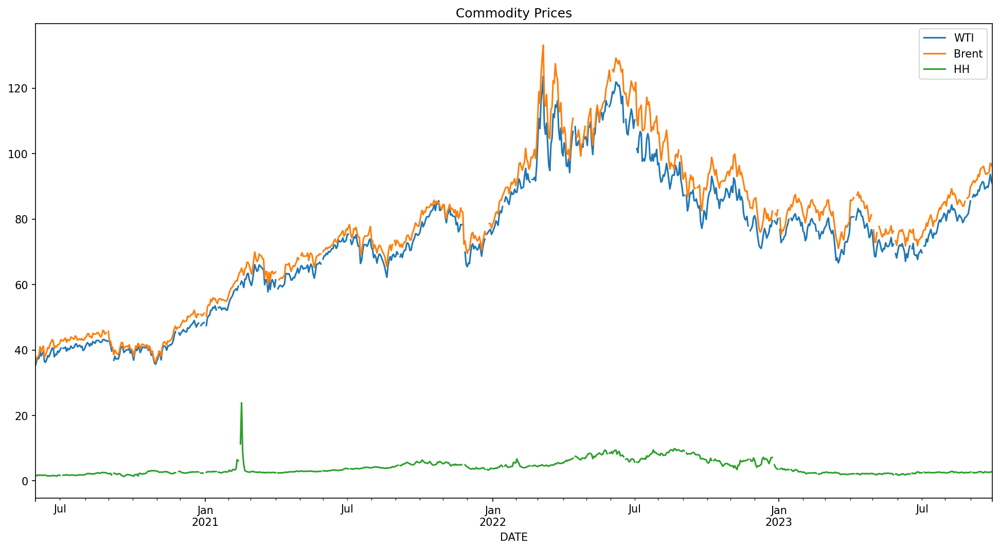

In [8]:
plt.figure(figsize=(16, 8), dpi=150) 

assets['DCOILWTICO'].plot(label='WTI')
assets['DCOILBRENTEU'].plot(label='Brent')
assets['DHHNGSP'].plot(label='HH')
#assets['PNGASEUUSDM'].plot(label='TTF')

plt.title('Commodity Prices')
plt.legend()

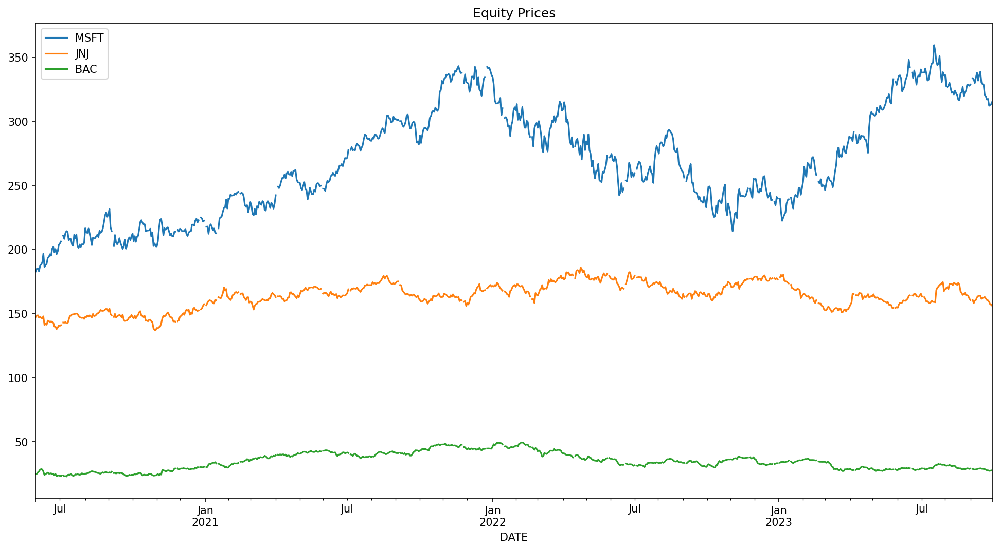

In [9]:
plt.figure(figsize=(16, 8), dpi=150) 

assets['MSFT'].plot(label='MSFT')
assets['JNJ'].plot(label='JNJ')
assets['BAC'].plot(label='BAC')

plt.title('Equity Prices')
plt.legend()

In [10]:
# returns = pd.DataFrame.from_dict(assets).fillna(method='ffill')

# for ticker in tickers:
#     returns['Ret_' + ticker] = np.log(returns[ticker]) - np.log(returns[ticker].shift(1))

# returns = returns.dropna() # only nulls left are the starting returns; will also have an issue with negative prices when series extended back far enough

# returns

In [11]:
returns_wti = assets[['DCOILWTICO']].dropna()
returns_brent = assets[['DCOILBRENTEU']].dropna()
returns_hh = assets[['DHHNGSP']].dropna()
returns_msft = assets[['MSFT']].dropna()
returns_jnj = assets[['JNJ']].dropna()
returns_bac = assets[['BAC']].dropna()

returns = {
    'DCOILWTICO': returns_wti,
    'DCOILBRENTEU': returns_brent,
    'DHHNGSP': returns_hh,
    'MSFT': returns_msft,
    'JNJ': returns_jnj,
    'BAC': returns_bac,
}

for key, value in returns.items():
    value['Ret_' + key] = np.log(value[key]) - np.log(value[key].shift(1))
    returns[key] = value.dropna()

returns_wti = returns['DCOILWTICO']
returns_brent = returns['DCOILBRENTEU']
returns_hh = returns['DHHNGSP']
returns_msft = returns['MSFT']
returns_jnj = returns['JNJ']
returns_bac = returns['BAC']

returns_wti

,DCOILWTICO,Ret_DCOILWTICO
DATE,,
2020-06-02,36.88,0.038418
2020-06-03,37.33,0.012128
2020-06-04,37.42,0.002408
2020-06-05,39.49,0.053842
2020-06-08,38.17,-0.033998
...,...,...
2023-09-25,89.68,-0.003562
2023-09-26,91.43,0.019326
2023-09-27,93.67,0.024204


# WTI

In [11]:
class data_extraction:
    def __init__(self, data, asset):
        self.data = data
        self.asset = asset
        self.series = self.extract_series()

    def extract_series(self):
        return self.data[self.asset]

In [12]:
class analysis(data_extraction):
    def __init__(self, data, asset):
        data_extraction.__init__(self, data, asset)
        self.x = self.norm_dist()
    
    def acf_log_ret(self):
        plot_acf(self.series, lags=30, title='ACF Log Returns ' + self.asset)
        plt.show()
        
    def acf_sq_log_ret(self):
        plot_acf(self.series**2, lags=30, title='ACF Squared Log Returns ' + self.asset)
        plt.show()
        
    def describe(self):
        return describe(self.series)

    def norm_dist(self):
        mu, sigma = np.mean(self.series), np.std(self.series)
        x = np.random.normal(mu, sigma, 1000)
        x = pd.Series(x, name='Normal Distribution')
        return x
    
    def asset_hist_v_norm(self):
        fig, ax1 = plt.subplots()
        ax2 = ax1.twinx()
        ax2.grid(False)
        ax1.hist(self.series, bins=30)
        g1 = sns.kdeplot(self.x, ax=ax2, color='r')
        g1.set(ylabel=None)
        g1.set(yticklabels=[])
        plt.title('Histogram vs Normal Distribution ' + self.asset);
    
    def asset_dist_v_norm(self):
        sns.set_style('whitegrid')
        series_norm = pd.concat([self.series, self.x], axis=1)
        sns.kdeplot(data=series_norm, bw_method=0.5)
        plt.title('Distribution vs Normal Distribution ' + self.asset);
    
    def arch_test(self):
        return het_arch(self.series)
    
    def arch_test_lag5(self):
        return het_arch(self.series, nlags=5)

In [13]:
analysis_wti = analysis(returns_wti, 'Ret_DCOILWTICO')

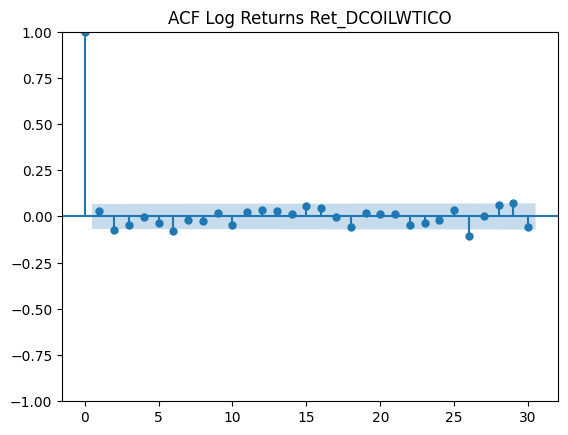

In [14]:
analysis_wti.acf_log_ret()

ACF of log returns indicates some AR/MA property among returns with lags 2 and 6 being statistically significant

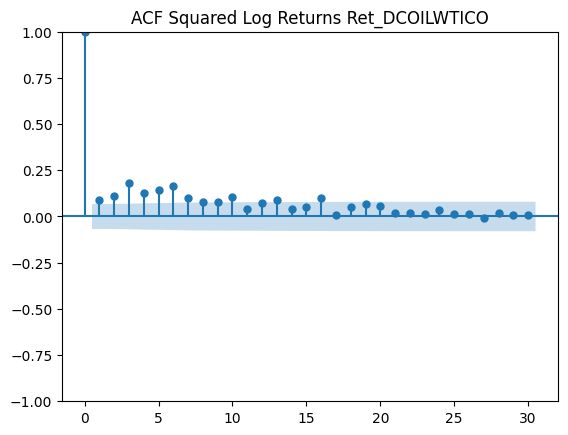

In [15]:
analysis_wti.acf_sq_log_ret()

ACF of squared log returns indicates some AR property among squared returns for (G)ARCH with at least 10 lags being statistically significant

In [16]:
analysis_wti.describe()

,Ret_DCOILWTICO
nobs,8.370000e+02
missing,0.000000e+00
mean,1.121957e-03
std_err,8.550105e-04
upper_ci,2.797747e-03
lower_ci,-5.538329e-04
std,2.473627e-02
iqr,2.931417e-02
iqr_normal,2.173063e-02
mad,1.857440e-02


Negative skewness

High kurtosis

jarque_bera_pval close to zero --> H0 normality rejected

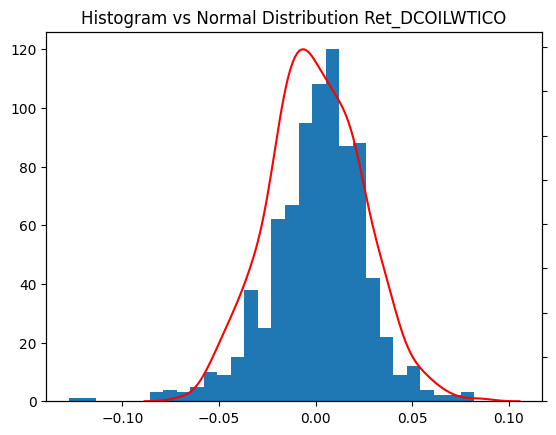

In [17]:
analysis_wti.asset_hist_v_norm()

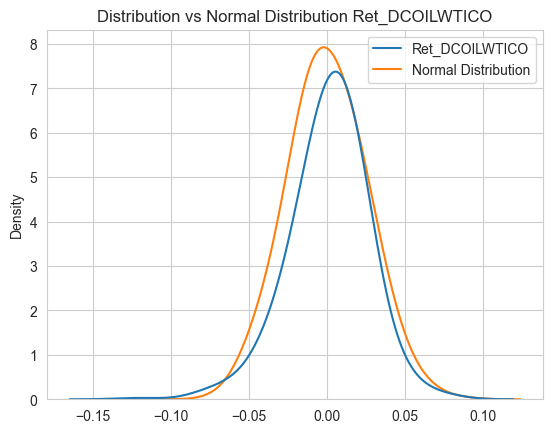

In [18]:
analysis_wti.asset_dist_v_norm()

Leptokurtic distribution

Negative skew

Fat tails, particularly for negative returns

In [19]:
analysis_wti.arch_test()

(67.98661794515141,
 1.0834985659265207e-10,
 7.309104365597942,
 3.809806640188877e-11)

In [20]:
analysis_wti.arch_test_lag5()

(54.0434898191126,
 2.053132070102216e-10,
 11.476200020540348,
 9.936828107401028e-11)

H0 no arch effects rejected (p-value close to zero)

## Model Run

In [21]:
class garch_base(data_extraction):
    def __init__(self, approach, proportion, p, q, mean, data, asset, lags, o, vol, dist, power):
        data_extraction.__init__(self, data, asset)
        self.approach = approach
        self.proportion = proportion
        self.p = p
        self.o = o
        self.q = q
        self.mean = mean
        self.lags = lags
        self.vol = vol
        self.dist = dist
        self.power = power
        self.train = self.series.iloc[:int(self.proportion*len(self.series))]
        self.test = self.series.iloc[int(self.proportion*len(self.series)):]
        self.last_train_date = datetime.strftime(self.train.index[-1], '%Y-%m-%d')
        self.res_garch = self.fit()
    
    def specs(self):
        return 'ar' + str(self.lags) + 'garch' + str(self.p) + str(self.q)
    
    def fit(self):
        if self.approach == 'fixed':
            garch = arch.arch_model(self.train, mean=self.mean, lags=self.lags, vol=self.vol, p=self.p, o=self.o, q=self.q, power=self.power, dist=self.dist)
            res_garch = garch.fit()
        elif self.approach == 'roll1d':
            garch = arch.arch_model(self.series, mean=self.mean, lags=self.lags, vol=self.vol, p=self.p, o=self.o, q=self.q, power=self.power, dist=self.dist)
            res_garch = garch.fit(last_obs=self.last_train_date)
            
        return res_garch
    
    def summary(self):
        res_garch_summary = self.res_garch.summary()
        
        return res_garch_summary
    
    def plot(self):
        fig = self.res_garch.plot()
        plt.show()
    
    def autocorr(self):
        lb = acorr_ljungbox(self.res_garch.std_resid**2, [10, 15, 20])
        
        return lb
    
    def info_crit(self):
        ic_out = {'AIC': [self.res_garch.aic], 'BIC': [self.res_garch.bic]}
        ic = pd.DataFrame(data=ic_out)
        
        return ic
    
    def acf_stan(self):
        plot_acf(self.res_garch.std_resid, lags=30, title='ACF of Standardized Residuals')
        plt.show()
        
    def acf_sq_stan(self):
        plot_acf(self.res_garch.std_resid**2, lags=30, title='ACF of Squared Standardized Residuals')
        plt.show()

class garch(garch_base):
    def __init__(self, approach, proportion, p, q, mean, data, asset, lags, o, vol, dist, power):
        garch_base.__init__(self, approach, proportion, p, q, mean, data, asset, lags, o, vol, dist, power)
        self.forecast = self.forecast()
        self.exclusion_dates = self.get_exclusion_dates()
        self.forecast_mean_values = self.forecast_mean_values()
        self.forecast_std_values = self.forecast_std_values()
        self.forecast_vs_test = self.forecast_vs_test()
        self.stats_test = self.get_stats_test()

    def forecast(self):
        if self.vol == 'EGARCH' or self.vol == 'APARCH' or self.power == 1.0:
            forecast = self.res_garch.forecast(horizon=len(self.test), method = 'simulation')
        else:
            forecast = self.res_garch.forecast(horizon=len(self.test))
        
        return forecast
    
#     def forecast_out(self):
#         return self.forecast
    
    def get_exclusion_dates(self):
        return [date for date in self.forecast.mean.index.strftime('%Y-%m-%d').tolist() if date <= self.last_train_date]
    
    def forecast_mean_values(self):
        if self.approach == 'fixed':
            forecast_mean_values = self.forecast.mean.iloc[0]
        elif self.approach == 'roll1d':
            forecast_mean_values = self.forecast.mean.drop(self.exclusion_dates)
            forecast_mean_values = forecast_mean_values.iloc[:,0]
        
        return forecast_mean_values
    
    def forecast_mean(self):
#         forecast_mean = self.forecast.mean
#         forecast_mean.iloc[0].plot()
        self.forecast_mean_values.plot()

    def forecast_std_values(self):
        forecast_vol_raw = self.forecast.variance**0.5
        
        if self.approach == 'fixed':
            forecast_std_values = forecast_vol_raw.iloc[0]
        elif self.approach == 'roll1d':
            forecast_std_values = forecast_vol_raw.drop(self.exclusion_dates)
            forecast_std_values = forecast_std_values.iloc[:,0]
        
        return forecast_std_values
#         std3 = std2.transpose()
#         for i, col in enumerate(std3.columns):
#             std3[col] = std3[col].shift(i)
#         std3
#         std3.plot()
    
    def forecast_std(self):
#         forecast_stdev = self.forecast.variance**0.5
#         forecast_stdev.iloc[0].plot()
        self.forecast_std_values.plot()
    
    def forecast_vs_test(self):
#         if self.approach == 'fixed':
#             forecast_mean_values = self.forecast.mean.iloc[0].values
#         elif self.approach == 'roll1d':
#             exclusion_dates = [date for date in self.forecast.mean.index.strftime('%Y-%m-%d').tolist() if date <= last_train_date]
#             forecast_mean_values = self.forecast.mean.drop(exclusion_dates)
#             forecast_mean_values = forecast_mean_values.iloc[:,0].values

        forecast_mean_values = self.forecast_mean_values.values
        
        forecast_mean = pd.Series(forecast_mean_values, index=self.test.index)
        self.train.rename('Ret_Train', inplace=True)
        self.test.rename('Ret_Test', inplace=True)
        forecast_mean.rename('Ret_Forecast', inplace=True)
        forecast_vs_test = pd.concat([self.train, self.test, forecast_mean], axis=1)

        forecast_vs_test['Ret_Test_Broad'] = forecast_vs_test[['Ret_Train','Ret_Test']].max(axis=1)

        forecast_vs_test['Vol_Train'] = forecast_vs_test[['Ret_Train']].rolling(30).std().shift(1) #30d std dev
        forecast_vs_test['Vol_Test_Broad'] = forecast_vs_test[['Ret_Test_Broad']].rolling(30).std().shift(1) #30d std dev
        forecast_vs_test['Vol_Test'] = np.where(forecast_vs_test['Ret_Test'].isna(), forecast_vs_test['Ret_Test'], forecast_vs_test['Vol_Test_Broad'])

#         forecast_vol_raw = self.forecast.variance**0.5
#         if self.approach == 'fixed':
#             forecast_std_values = forecast_vol_raw.iloc[0].values
#         elif self.approach == 'roll1d':
#             forecast_std_values = forecast_vol_raw.drop(exclusion_dates)
#             forecast_std_values = forecast_std_values.iloc[:,0].values
        
        forecast_std_values = self.forecast_std_values.values
        
        forecast_vs_test_condvol = pd.Series(forecast_std_values, index=self.test.index) #conditional vol
        forecast_vs_test_condvol.rename('Vol_Forecast', inplace=True)
        forecast_vs_test = pd.concat([forecast_vs_test, forecast_vs_test_condvol], axis=1)

        return forecast_vs_test
    
    def forecast_vs_test_mean_plot(self):
        self.forecast_vs_test[['Ret_Train','Ret_Test','Ret_Forecast']].plot()
        
    def forecast_vs_test_vol_plot(self):
        self.forecast_vs_test[['Vol_Train','Vol_Test','Vol_Forecast']].plot()
    
    def get_stats_test(self):
        reduced_test = self.forecast_vs_test
        reduced_test = reduced_test[reduced_test.index > self.last_train_date]
        reduced_test['se_mean'] = (reduced_test['Ret_Forecast'] - reduced_test['Ret_Test']) ** 2
        reduced_test['se_vol'] = (reduced_test['Vol_Forecast'] - reduced_test['Vol_Test']) ** 2
        reduced_test['ae_mean'] = abs(reduced_test['Ret_Forecast'] - reduced_test['Ret_Test'])
        reduced_test['ae_vol'] = abs(reduced_test['Vol_Forecast'] - reduced_test['Vol_Test'])
        reduced_test['pe_mean'] = abs((reduced_test['Ret_Forecast'] - reduced_test['Ret_Test']) / reduced_test['Ret_Test'])
        reduced_test['pe_vol'] = abs((reduced_test['Vol_Forecast'] - reduced_test['Vol_Test']) / reduced_test['Vol_Test'])

        stats_dict = {
            'Series': ['Mean', 'Vol'],
            'RMSE'  : [np.sqrt(np.mean(reduced_test['se_mean'].tolist())), np.sqrt(np.mean(reduced_test['se_vol'].tolist()))],
            'MAE'   : [np.mean(reduced_test['ae_mean'].tolist()), np.mean(reduced_test['ae_vol'].tolist())],
            'MAPE'  : [np.mean(reduced_test['pe_mean'].tolist()), np.mean(reduced_test['pe_vol'].tolist())],
        }
        
        return pd.DataFrame(stats_dict)

In [22]:
class garch_full(garch_base):
    def __init__(self, approach, grid_proportion, grid_p, grid_q, mean, data, asset, grid_lags, grid_o, grid_vol, grid_dist, grid_power):
        self.approach = approach
        self.grid_proportion = grid_proportion
        self.grid_p = grid_p
        self.grid_q = grid_q
        self.mean = mean
        self.data = data
        self.asset = asset
        self.grid_lags = grid_lags
        self.grid_o = grid_o
        self.grid_vol = grid_vol
        self.grid_dist = grid_dist
        self.grid_power = grid_power
        self.optimised_params = self.optimise()
        
    def optimise(self):
        min_aic = 1000000
        min_proportion = 0
        min_p = 0
        min_q = 0
        min_lags = 0
        min_o = 10
        min_vol = 'NONE'
        min_dist = 'NONE'
        min_power = 10.0
        
        for proportion in self.grid_proportion:
            for p in self.grid_p:
                for q in self.grid_q:
                    for lags in self.grid_lags:
                        for o in self.grid_o:
                            for vol in self.grid_vol:
                                for dist in self.grid_dist:
                                    for power in self.grid_power:
                                        if vol != 'FIGARCH':
                                            garch_base.__init__(self, self.approach, proportion, p, q, self.mean, self.data, self.asset, lags, o, vol, dist, power)
                                            ic = self.info_crit()
                                            aic = ic['AIC'][0]
                                            if aic < min_aic:
                                                min_aic = aic
                                                min_proportion = self.proportion
                                                min_p = self.p
                                                min_q = self.q
                                                min_lags = self.lags
                                                min_o = self.o
                                                min_vol = self.vol
                                                min_dist = self.dist
                                                min_power = self.power
                                        else:
                                            if p == 1 and q == 1:
                                                for dist in self.grid_dist:
                                                    for power in self.grid_power:
                                                        garch_base.__init__(self, self.approach, proportion, p, q, self.mean, self.data, self.asset, lags, o, vol, dist, power)
                                                        ic = self.info_crit()
                                                        aic = ic['AIC'][0]
                                                        if aic < min_aic:
                                                            min_aic = aic
                                                            min_proportion = self.proportion
                                                            min_p = self.p
                                                            min_q = self.q
                                                            min_lags = self.lags
                                                            min_o = self.o
                                                            min_vol = self.vol
                                                            min_dist = self.dist
                                                            min_power = self.power
        
        print('\nLowest AIC: ' + str(min_aic))
        print('\nOptimal proportion: ' + str(min_proportion))
        print('\nOptimal p: ' + str(min_p))
        print('\nOptimal q: ' + str(min_q))
        print('\nOptimal lags: ' + str(min_lags))
        print('\nOptimal o: ' + str(min_o))
        print('\nOptimal vol: ' + min_vol)
        print('\nOptimal dist: ' + min_dist)
        print('\nOptimal power: ' + str(min_power))
        
        return [min_proportion, min_p, min_q, min_lags, min_o, min_vol, min_dist, min_power]

In [25]:
class garch_main(garch):
    def __init__(self, approach, grid_proportion, grid_p, grid_q, mean, data, asset, grid_lags, grid_o, grid_vol, grid_dist, grid_power):
        self.approach = approach
        self.grid_proportion = grid_proportion
        self.grid_p = grid_p
        self.grid_q = grid_q
        self.mean = mean
        self.data = data
        self.asset = asset
        self.grid_lags = grid_lags
        self.grid_o = grid_o
        self.grid_vol = grid_vol
        self.grid_dist = grid_dist
        self.grid_power = grid_power
        self.optimal_params = self.get_optimal_params()
        self.proportion = self.optimal_params[0]
        self.p = self.optimal_params[1]
        self.q = self.optimal_params[2]
        self.lags = self.optimal_params[3]
        self.o = self.optimal_params[4]
        self.vol = self.optimal_params[5]
        self.dist = self.optimal_params[6]
        self.power = self.optimal_params[7]
        garch.__init__(self, self.approach, self.proportion, self.p, self.q, self.mean, self.data, self.asset, self.lags, self.o, self.vol, self.dist, self.power)
    
    def get_optimal_params(self):
        garch_full_instance = garch_full(self.approach, self.grid_proportion, self.grid_p, self.grid_q, self.mean, self.data, self.asset, self.grid_lags, self.grid_o, self.grid_vol, self.grid_dist, self.grid_power)
        return garch_full_instance.optimised_params

In [26]:
class strategy_single(garch):
    def __init__(self, approach, proportion, p, q, mean, data, asset, lags, o, vol, dist, power):
        garch.__init__(self, approach, proportion, p, q, mean, data, asset, lags, o, vol, dist, power)
        self.trade = self.build()
        
    def build(self):
        trade = self.forecast_vs_test
        
        last_train = trade.iloc[lambda x: x.index == self.last_train_date]
        last_vol_train = last_train['Vol_Train'][0]

        trade['direction'] = np.where(trade['Ret_Train'].notna(), 0, np.where(trade['Ret_Forecast'] > 0, 1, -1))
        trade['amplifier'] = np.where(trade['Ret_Train'].notna(), 0, np.where(trade['Vol_Forecast'] > last_vol_train, 2, 1))
        trade['position'] = trade['direction'] * trade['amplifier']
        trade['pnl_gross'] = trade['Ret_Test'] * trade['position']
        trade['pnl_gross_cum'] = trade['pnl_gross'].cumsum()
        trade['position_lag'] = trade['position'].shift(1)
        trade['cost'] = np.where(trade['position'] == trade['position_lag'], 0, 0.05)
        trade['pnl_net'] = trade['pnl_gross'] - trade['cost']
        trade['pnl_net_cum'] = trade['pnl_net'].cumsum()
        
        trade = trade.iloc[lambda x: x.index >= self.last_train_date]
        
        return trade
    
    def pos(self):
        plt.figure(figsize=(16, 8), dpi=150) 

        self.trade['direction'].plot(label='Direction')
        self.trade['amplifier'].plot(label='Amplifier')
        self.trade['position'].plot(label='Position')
        self.trade['cost'].plot(label='Cost')

        plt.title('Trading Positions ' + self.asset + ' ' + self.specs())
        plt.legend()
        
    def pnl_gross(self):
        plt.figure(figsize=(16, 8), dpi=150) 

        self.trade['pnl_gross'].plot(label='Gross P&L')
        self.trade['pnl_gross_cum'].plot(label='Cumulative Gross P&L')

        plt.title('Trading Gross P&L ' + self.asset + ' ' + self.specs())
        plt.legend()
    
    def pnl_net(self):
        plt.figure(figsize=(16, 8), dpi=150) 

        self.trade['pnl_net'].plot(label='Net P&L')
        self.trade['pnl_net_cum'].plot(label='Cumulative Net P&L')

        plt.title('Trading Net P&L ' + self.asset + ' ' + self.specs())
        plt.legend()
        
    def sr(self):
        sr_gross = 252 ** 0.5 * np.mean(self.trade['pnl_gross']) / np.std(self.trade['pnl_gross'])
        sr_net = 252 ** 0.5 * np.mean(self.trade['pnl_net']) / np.std(self.trade['pnl_net'])
        
        return pd.DataFrame({'Metric': ['SR Gross', 'SR Net'], 'Value': [sr_gross, sr_net]})

In [27]:
class strategy(garch_main):
    def __init__(self, approach, grid_proportion, grid_p, grid_q, mean, data, asset, grid_lags, grid_o, grid_vol, grid_dist, grid_power):
        garch_main.__init__(self, approach, grid_proportion, grid_p, grid_q, mean, data, asset, grid_lags, grid_o, grid_vol, grid_dist, grid_power)
        self.trade = self.build()
    
    def build(self):
        trade = self.forecast_vs_test
        
        last_train = trade.iloc[lambda x: x.index == self.last_train_date]
        last_vol_train = last_train['Vol_Train'][0]

        trade['direction'] = np.where(trade['Ret_Train'].notna(), 0, np.where(trade['Ret_Forecast'] > 0, 1, -1))
        trade['amplifier'] = np.where(trade['Ret_Train'].notna(), 0, np.where(trade['Vol_Forecast'] > last_vol_train, 2, 1))
        trade['position'] = trade['direction'] * trade['amplifier']
        trade['pnl_gross'] = trade['Ret_Test'] * trade['position']
        trade['pnl_gross_cum'] = trade['pnl_gross'].cumsum()
        trade['position_lag'] = trade['position'].shift(1)
        trade['cost'] = np.where(trade['position'] == trade['position_lag'], 0, 0.05)
        trade['pnl_net'] = trade['pnl_gross'] - trade['cost']
        trade['pnl_net_cum'] = trade['pnl_net'].cumsum()
        
        trade = trade.iloc[lambda x: x.index >= self.last_train_date]
        
        return trade
    
    def pos(self):
        plt.figure(figsize=(16, 8), dpi=150) 

        self.trade['direction'].plot(label='Direction')
        self.trade['amplifier'].plot(label='Amplifier')
        self.trade['position'].plot(label='Position')
        self.trade['cost'].plot(label='Cost')

        plt.title('Trading Positions ' + self.asset + ' ' + self.specs())
        plt.legend()
        
    def pnl_gross(self):
        plt.figure(figsize=(16, 8), dpi=150) 

        self.trade['pnl_gross'].plot(label='Gross P&L')
        self.trade['pnl_gross_cum'].plot(label='Cumulative Gross P&L')

        plt.title('Trading Gross P&L ' + self.asset + ' ' + self.specs())
        plt.legend()
    
    def pnl_net(self):
        plt.figure(figsize=(16, 8), dpi=150) 

        self.trade['pnl_net'].plot(label='Net P&L')
        self.trade['pnl_net_cum'].plot(label='Cumulative Net P&L')

        plt.title('Trading Net P&L ' + self.asset + ' ' + self.specs())
        plt.legend()
        
    def sr(self):
        sr_gross = 252 ** 0.5 * np.mean(self.trade['pnl_gross']) / np.std(self.trade['pnl_gross'])
        sr_net = 252 ** 0.5 * np.mean(self.trade['pnl_net']) / np.std(self.trade['pnl_net'])
        
        return pd.DataFrame({'Metric': ['SR Gross', 'SR Net'], 'Value': [sr_gross, sr_net]})

In [28]:
# strat_wti_ar1garch11 = strategy_single('roll1d', 0.9, 1, 1, 'AR', returns_wti, 'Ret_DCOILWTICO', 1, 0, 'GARCH', 'normal', 2.0)

In [101]:
# grid_proportion = [0.9, 0.8, 0.7]
# grid_p = [1, 2]
# grid_q = [1, 2]
# grid_lags = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
# grid_o = [0, 1]
# grid_vol = ['GARCH', 'EGARCH', 'FIGARCH', 'APARCH']
# grid_dist = ['normal', 't', 'skewt', 'ged']
# grid_power = [1.0, 2.0]

In [29]:
grid_proportion = [0.9, 0.8]
grid_p = [1, 2]
grid_q = [1, 2]
grid_lags = [1, 2, 3, 4, 5]
grid_o = [0, 1]
grid_vol = ['GARCH', 'EGARCH', 'FIGARCH', 'APARCH']
grid_dist = ['normal', 't']
grid_power = [2.0]

In [30]:
strat_wti = strategy('roll1d', grid_proportion, grid_p, grid_q, 'AR', returns_wti, 'Ret_DCOILWTICO', grid_lags, grid_o, grid_vol, grid_dist, grid_power)

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:      7,   Neg. LLF: 15701768.148035482
Iteration:      2,   Func. Count:     19,   Neg. LLF: 2810104.6855706666
Iteration:      3,   Func. Count:     31,   Neg. LLF: 504354.61715827335
Iteration:      4,   Func. Count:     43,   Neg. LLF: 93906.47088067094
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1726.374063844566
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1726.374064506359
            Iterations: 9
            Function evaluations: 55
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      8,   Neg. LLF: 26234.16240576419
Iteration:      2,   Func. Count:     25,   Neg. LLF: 997.1740126378659
Iteration:      3,   Func. Count:     35,   Neg. LLF: 3019.8295791989513
Iteration:      4,   Func. Count:     45,   Neg. LLF: 591.508302971037
Iteration:      5,   Func. Count:     54,   Neg. LLF: 2024.7203826968764
Iteration:      6,   Func. Count:     64,   Neg. LLF: -711.17117500

Iteration:     82,   Func. Count:    688,   Neg. LLF: -1730.2957293948784
Iteration:     83,   Func. Count:    695,   Neg. LLF: -1730.2959650933412
Iteration:     84,   Func. Count:    702,   Neg. LLF: -1730.2970754803505
Iteration:     85,   Func. Count:    709,   Neg. LLF: -1730.298375209426
Iteration:     86,   Func. Count:    716,   Neg. LLF: -1730.3008047809092
Iteration:     87,   Func. Count:    723,   Neg. LLF: -1730.30353446435
Iteration:     88,   Func. Count:    730,   Neg. LLF: -1730.3062322431165
Iteration:     89,   Func. Count:    737,   Neg. LLF: -1730.3097784244226
Iteration:     90,   Func. Count:    744,   Neg. LLF: -1730.3171068218187
Iteration:     91,   Func. Count:    751,   Neg. LLF: -1730.335396184179
Iteration:     92,   Func. Count:    758,   Neg. LLF: -1730.3833864454436
Iteration:     93,   Func. Count:    765,   Neg. LLF: -1730.512194898939
Iteration:     94,   Func. Count:    772,   Neg. LLF: -1730.8678561363079
Iteration:     95,   Func. Count:    779,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:      1,   Func. Count:      9,   Neg. LLF: 24961.182392305505
Iteration:      2,   Func. Count:     27,   Neg. LLF: 615.4528746998366
Iteration:      3,   Func. Count:     36,   Neg. LLF: 131439.0434434699
Iteration:      4,   Func. Count:     45,   Neg. LLF: 842296.3737811262
Iteration:      5,   Func. Count:     54,   Neg. LLF: 816.7589055537687
Iteration:      6,   Func. Count:     64,   Neg. LLF: 177757.33717707335
Iteration:      7,   Func. Count:     77,   Neg. LLF: -1438.1796586118226
Iteration:      8,   Func. Count:     86,   Neg. LLF: 70308.52275359581
Iteration:      9,   Func. Count:    104,   Neg. LLF: 3065.2309731202495
Iteration:     10,   Func. Count:    113,   Neg. LLF: 3486.9045318798594
Iteration:     11,   Func. Count:    122,   Neg. LLF: 1893.708182061876
Iteration:     12,   Func. Count:    130,   Neg. LLF: 12494.58847652666
Iteration:     13,   Func. Count:    148,   Neg. LLF: 203734.32056033454
Iteration:     14,   Func. Count:    163,   Neg. LLF: 303

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      1,   Func. Count:      8,   Neg. LLF: 84517.48258721895
Iteration:      2,   Func. Count:     22,   Neg. LLF: 2994.303921319973
Iteration:      3,   Func. Count:     33,   Neg. LLF: -951.2860192886274
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1722.388765575255
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1722.3887652857416
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      9,   Neg. LLF: 24961.182392305505
Iteration:      2,   Func. Count:     27,   Neg. LLF: 615.4528746998366
Iteration:      3,   Func. Count:     36,   Neg. LLF: 131439.0434434699
Iteration:      4,   Func. Count:     45,   Neg. LLF: 842296.3737811262
Iteration:      5,   Func. Count:     54,   Neg. LLF: 816.7589055537687
Iteration:      6,   Func. Count:     64,   Neg. LLF: 177757.33717707335
Iteration:      7,   Func. Count:     77,   Neg. LLF: -1438.1796586

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      7,   Func. Count:     76,   Neg. LLF: 10395.693238662938
Iteration:      8,   Func. Count:     85,   Neg. LLF: 13899.57467796814
Iteration:      9,   Func. Count:     94,   Neg. LLF: -1170.1677526502658
Iteration:     10,   Func. Count:    103,   Neg. LLF: 14906.84605521334
Iteration:     11,   Func. Count:    113,   Neg. LLF: 66.18287222328684
Iteration:     12,   Func. Count:    124,   Neg. LLF: 62557.501444174595
Iteration:     13,   Func. Count:    133,   Neg. LLF: 10247.886230921216
Iteration:     14,   Func. Count:    142,   Neg. LLF: 9099.151403926317
Iteration:     15,   Func. Count:    151,   Neg. LLF: -1108.858934159264
Iteration:     16,   Func. Count:    160,   Neg. LLF: -1507.9780291113022
Iteration:     17,   Func. Count:    169,   Neg. LLF: -878.352586503155
Iteration:     18,   Func. Count:    178,   Neg. LLF: -1540.642909090869
Iteration:     19,   Func. Count:    187,   Neg. LLF: -1643.1562325538653
Iteration:     20,   Func. Count:    196,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:      1,   Func. Count:      8,   Neg. LLF: 5175701.075628487
Iteration:      2,   Func. Count:     21,   Neg. LLF: 935.7527963795657
Iteration:      3,   Func. Count:     32,   Neg. LLF: 150521994589.76874
Iteration:      4,   Func. Count:     43,   Neg. LLF: 220921856.58169731
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1643.8033337910188
Iteration:      6,   Func. Count:     59,   Neg. LLF: -1705.3253631633502
Iteration:      7,   Func. Count:     67,   Neg. LLF: -1600.8050231240163
Iteration:      8,   Func. Count:     76,   Neg. LLF: -1722.2118714946455
Iteration:      9,   Func. Count:     85,   Neg. LLF: -1706.0632456093945
Iteration:     10,   Func. Count:     93,   Neg. LLF: -1729.1545424595672
Iteration:     11,   Func. Count:    102,   Neg. LLF: -1729.8114738192712
Iteration:     12,   Func. Count:    110,   Neg. LLF: -1729.8572058995646
Iteration:     13,   Func. Count:    116,   Neg. LLF: -1729.8572058982138
Optimization terminated successfully    (Exi

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 24961.182392305505
Iteration:      2,   Func. Count:     27,   Neg. LLF: 615.4528746998366
Iteration:      3,   Func. Count:     36,   Neg. LLF: 131439.0434434699
Iteration:      4,   Func. Count:     45,   Neg. LLF: 842296.3737811262
Iteration:      5,   Func. Count:     54,   Neg. LLF: 816.7589055537687
Iteration:      6,   Func. Count:     64,   Neg. LLF: 177757.33717707335
Iteration:      7,   Func. Count:     77,   Neg. LLF: -1438.1796586118226
Iteration:      8,   Func. Count:     86,   Neg. LLF: 70308.52275359581
Iteration:      9,   Func. Count:    104,   Neg. LLF: 3065.2309731202495
Iteration:     10,   Func. Count:    113,   Neg. LLF: 3486.9045318798594
Iteration:     11,   Func. Count:    122,   Neg. LLF: 1893.708182061876
Iteration:     12,   Func. Count:    130,   Neg. LLF: 12494.58847652666
Iteration:     13,   Func. Count:    148,   Neg. LLF: 203734.32056033454
Iteration:     14,   Func. Count:    163,   Neg. LLF: 303

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      2,   Func. Count:     22,   Neg. LLF: 2994.303921319973
Iteration:      3,   Func. Count:     33,   Neg. LLF: -951.2860192886274
Iteration:      4,   Func. Count:     42,   Neg. LLF: -1722.388765575255
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1722.3887652857416
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      9,   Neg. LLF: 24961.182392305505
Iteration:      2,   Func. Count:     27,   Neg. LLF: 615.4528746998366
Iteration:      3,   Func. Count:     36,   Neg. LLF: 131439.0434434699
Iteration:      4,   Func. Count:     45,   Neg. LLF: 842296.3737811262
Iteration:      5,   Func. Count:     54,   Neg. LLF: 816.7589055537687
Iteration:      6,   Func. Count:     64,   Neg. LLF: 177757.33717707335
Iteration:      7,   Func. Count:     77,   Neg. LLF: -1438.1796586118226
Iteration:      8,   Func. Count:     86,   Neg. LLF: 70308.52275

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    124,   Neg. LLF: -1730.1420914484138
Iteration:     13,   Func. Count:    132,   Neg. LLF: -1730.148218165513
Iteration:     14,   Func. Count:    140,   Neg. LLF: -1730.1537751076912
Iteration:     15,   Func. Count:    148,   Neg. LLF: -1730.1669791250758
Iteration:     16,   Func. Count:    156,   Neg. LLF: -1730.183752835256
Iteration:     17,   Func. Count:    164,   Neg. LLF: -1730.1999761910815
Iteration:     18,   Func. Count:    172,   Neg. LLF: -1730.2244625167746
Iteration:     19,   Func. Count:    180,   Neg. LLF: -1730.2254578329062
Iteration:     20,   Func. Count:    189,   Neg. LLF: -1730.2385001233763
Iteration:     21,   Func. Count:    197,   Neg. LLF: -1730.2447638954468
Iteration:     22,   Func. Count:    205,   Neg. LLF: -1730.2515463505088
Iteration:     23,   Func. Count:    213,   Neg. LLF: -1730.2566595381586
Iteration:     24,   Func. Count:    221,   Neg. LLF: -1730.254464880779
Iteration:     25,   Func. Count:    230,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 27116.66262093206
Iteration:      2,   Func. Count:     29,   Neg. LLF: 12136.917854748548
Iteration:      3,   Func. Count:     41,   Neg. LLF: 1168.9164415657474
Iteration:      4,   Func. Count:     51,   Neg. LLF: 15554.3707338702
Iteration:      5,   Func. Count:     61,   Neg. LLF: 17466.947456893533
Iteration:      6,   Func. Count:     71,   Neg. LLF: 18247.305220167873
Iteration:      7,   Func. Count:     81,   Neg. LLF: 13714.268137365718
Iteration:      8,   Func. Count:     91,   Neg. LLF: 14539.958300159182
Iteration:      9,   Func. Count:    101,   Neg. LLF: 15135.209105975051
Iteration:     10,   Func. Count:    111,   Neg. LLF: 16829.457028488458
Iteration:     11,   Func. Count:    122,   Neg. LLF: 9500.283125519334
Iteration:     12,   Func. Count:    132,   Neg. LLF: 12099.402311701007
Iteration:     13,   Func. Count:    142,   Neg. LLF: -904.3138913035273
Iteration:     14,   Func. Count:    152,   Neg. LLF: 1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:      9,   Func. Count:    104,   Neg. LLF: 1036.8459260665775
Iteration:     10,   Func. Count:    112,   Neg. LLF: 806.7428927188128
Iteration:     11,   Func. Count:    120,   Neg. LLF: 3990.111311736893
Iteration:     12,   Func. Count:    129,   Neg. LLF: 15026.679477106843
Iteration:     13,   Func. Count:    138,   Neg. LLF: 8845.442060955214
Iteration:     14,   Func. Count:    148,   Neg. LLF: 104.99700587946162
Iteration:     15,   Func. Count:    156,   Neg. LLF: 7741.8175492106675
Iteration:     16,   Func. Count:    165,   Neg. LLF: 655.4617911668879
Iteration:     17,   Func. Count:    174,   Neg. LLF: -401.10648145251037
Iteration:     18,   Func. Count:    182,   Neg. LLF: -582.3909450279626
Iteration:     19,   Func. Count:    190,   Neg. LLF: 1336.9968137784333
Iteration:     20,   Func. Count:    200,   Neg. LLF: 29533.452089802395
Iteration:     21,   Func. Count:    217,   Neg. LLF: 437164.92985571444
Iteration:     22,   Func. Count:    235,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 24922.455357094874
Iteration:      2,   Func. Count:     27,   Neg. LLF: 20864.082842841213
Iteration:      3,   Func. Count:     45,   Neg. LLF: 3092.763476030629
Iteration:      4,   Func. Count:     54,   Neg. LLF: 2427.6200977069893
Iteration:      5,   Func. Count:     63,   Neg. LLF: 1940834.3725775545
Iteration:      6,   Func. Count:     72,   Neg. LLF: 4328380.609809982
Iteration:      7,   Func. Count:     82,   Neg. LLF: 36045.04238009428
Iteration:      8,   Func. Count:     97,   Neg. LLF: 50093.17186123085
Iteration:      9,   Func. Count:    114,   Neg. LLF: 294866.0315813181
Iteration:     10,   Func. Count:    124,   Neg. LLF: 299169.491267764
Iteration:     11,   Func. Count:    134,   Neg. LLF: 300284.81984300236
Iteration:     12,   Func. Count:    144,   Neg. LLF: 201632.63709892635
Iteration:     13,   Func. Count:    154,   Neg. LLF: 294119.1510738105
Iteration:     14,   Func. Count:    164,   Neg. LLF: 28169

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 192086.99834955804
Iteration:      2,   Func. Count:     24,   Neg. LLF: 2949.5283081590705
Iteration:      3,   Func. Count:     35,   Neg. LLF: 52862391.89580086
Iteration:      4,   Func. Count:     46,   Neg. LLF: 654774406525503.9
Iteration:      5,   Func. Count:     60,   Neg. LLF: 96220621588630.69
Iteration:      6,   Func. Count:     74,   Neg. LLF: 893604779701.1996
Iteration:      7,   Func. Count:     88,   Neg. LLF: 2663.6680879702008
Iteration:      8,   Func. Count:     99,   Neg. LLF: 32720766.026990466
Iteration:      9,   Func. Count:    109,   Neg. LLF: 6160285879865274.0
Iteration:     10,   Func. Count:    122,   Neg. LLF: -1722.128499555075
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1722.1284993049053
            Iterations: 14
            Function evaluations: 122
            Gradient evaluations: 10


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 25062.227845430883
Iteration:      2,   Func. Count:     29,   Neg. LLF: 881.6358074733591
Iteration:      3,   Func. Count:     39,   Neg. LLF: 363383.3668654848
Iteration:      4,   Func. Count:     49,   Neg. LLF: 157478.88846278674
Iteration:      5,   Func. Count:     59,   Neg. LLF: 5884.833409682267
Iteration:      6,   Func. Count:     74,   Neg. LLF: 1234.819799597668
Iteration:      7,   Func. Count:     85,   Neg. LLF: 78736.44672756591
Iteration:      8,   Func. Count:     95,   Neg. LLF: 5423.09329872641
Iteration:      9,   Func. Count:    106,   Neg. LLF: 522.2152574868163
Iteration:     10,   Func. Count:    118,   Neg. LLF: -444.14432991434495
Iteration:     11,   Func. Count:    128,   Neg. LLF: 2636.466854059325
Iteration:     12,   Func. Count:    140,   Neg. LLF: 104406.12772898925
Iteration:     13,   Func. Count:    159,   Neg. LLF: 2341.4515763850495
Iteration:     14,   Func. Count:    168,   Neg. LLF: 1919.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:     88,   Neg. LLF: 2663.6680879702008
Iteration:      8,   Func. Count:     99,   Neg. LLF: 32720766.026990466
Iteration:      9,   Func. Count:    109,   Neg. LLF: 6160285879865274.0
Iteration:     10,   Func. Count:    122,   Neg. LLF: -1722.128499555075
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1722.1284993049053
            Iterations: 14
            Function evaluations: 122
            Gradient evaluations: 10
Iteration:      1,   Func. Count:     10,   Neg. LLF: 25062.227845430883
Iteration:      2,   Func. Count:     29,   Neg. LLF: 881.6358074733591
Iteration:      3,   Func. Count:     39,   Neg. LLF: 363383.3668654848
Iteration:      4,   Func. Count:     49,   Neg. LLF: 157478.88846278674
Iteration:      5,   Func. Count:     59,   Neg. LLF: 5884.833409682267


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     74,   Neg. LLF: 1234.819799597668
Iteration:      7,   Func. Count:     85,   Neg. LLF: 78736.44672756591
Iteration:      8,   Func. Count:     95,   Neg. LLF: 5423.09329872641
Iteration:      9,   Func. Count:    106,   Neg. LLF: 522.2152574868163
Iteration:     10,   Func. Count:    118,   Neg. LLF: -444.14432991434495
Iteration:     11,   Func. Count:    128,   Neg. LLF: 2636.466854059325
Iteration:     12,   Func. Count:    140,   Neg. LLF: 104406.12772898925
Iteration:     13,   Func. Count:    159,   Neg. LLF: 2341.4515763850495
Iteration:     14,   Func. Count:    168,   Neg. LLF: 1919.3366934876599
Iteration:     15,   Func. Count:    177,   Neg. LLF: 3080.773371665831
Iteration:     16,   Func. Count:    196,   Neg. LLF: 37251.54924720582
Iteration:     17,   Func. Count:    215,   Neg. LLF: 1493985.6208262485
Iteration:     18,   Func. Count:    232,   Neg. LLF: 21109.907110387187
Iteration:     19,   Func. Count:    241,   Neg. LLF: 2138

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of 

Iteration:      3,   Func. Count:     43,   Neg. LLF: 66225410.93966181
Iteration:      4,   Func. Count:     54,   Neg. LLF: 111808.77513706956
Iteration:      5,   Func. Count:     64,   Neg. LLF: 947203.6048329379
Iteration:      6,   Func. Count:     75,   Neg. LLF: -1169.5141782787591
Iteration:      7,   Func. Count:     85,   Neg. LLF: -1632.754144753978
Iteration:      8,   Func. Count:     95,   Neg. LLF: -1608.2158581334047
Iteration:      9,   Func. Count:    104,   Neg. LLF: -1604.2795658878836
Iteration:     10,   Func. Count:    113,   Neg. LLF: -1604.0621228081932
Iteration:     11,   Func. Count:    122,   Neg. LLF: -1721.566842501336
Iteration:     12,   Func. Count:    132,   Neg. LLF: -1727.584969921494
Iteration:     13,   Func. Count:    140,   Neg. LLF: -1727.586781936572
Iteration:     14,   Func. Count:    148,   Neg. LLF: -1727.5885822632777
Iteration:     15,   Func. Count:    156,   Neg. LLF: -1727.5935054766237
Iteration:     16,   Func. Count:    164,   Neg

Iteration:     95,   Func. Count:    943,   Neg. LLF: -1740.7618118516516
Iteration:     96,   Func. Count:    952,   Neg. LLF: -1739.6990593066753
Iteration:     97,   Func. Count:    962,   Neg. LLF: -1740.548725657421
Iteration:     98,   Func. Count:    972,   Neg. LLF: -1740.8763109538274
Iteration:     99,   Func. Count:    981,   Neg. LLF: -1740.9406756713236
Iteration:    100,   Func. Count:    989,   Neg. LLF: -1740.9406756680157
Iteration limit reached    (Exit mode 9)
            Current function value: -1740.9406756713236
            Iterations: 100
            Function evaluations: 989
            Gradient evaluations: 100
Iteration:      1,   Func. Count:      9,   Neg. LLF: 25167505.677011374
Iteration:      2,   Func. Count:     23,   Neg. LLF: 2729.7855247454427
Iteration:      3,   Func. Count:     34,   Neg. LLF: -1202.097562166935
Iteration:      4,   Func. Count:     43,   Neg. LLF: 40950.41404236257
Iteration:      5,   Func. Count:     56,   Neg. LLF: 31729134337

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:     25,   Func. Count:    280,   Neg. LLF: 51255.99730979756
Iteration:     26,   Func. Count:    299,   Neg. LLF: -133.9284969521181
Iteration:     27,   Func. Count:    308,   Neg. LLF: 8475.375517466258
Iteration:     28,   Func. Count:    321,   Neg. LLF: 2356.512995680377
Iteration:     29,   Func. Count:    333,   Neg. LLF: 3441.963605397227
Iteration:     30,   Func. Count:    344,   Neg. LLF: 4173.275154113798
Iteration:     31,   Func. Count:    354,   Neg. LLF: 3524.386989896
Iteration:     32,   Func. Count:    364,   Neg. LLF: 622.0088273232575
Iteration:     33,   Func. Count:    375,   Neg. LLF: 5114.961193181419
Iteration:     34,   Func. Count:    385,   Neg. LLF: 8726.97605125583
Iteration:     35,   Func. Count:    395,   Neg. LLF: -798.3312094707479
Iteration:     36,   Func. Count:    405,   Neg. LLF: 56341.80092901773
Iteration:     37,   Func. Count:    424,   Neg. LLF: 23916.246016425426
Iteration:     38,   Func. Count:    436,   Neg. LLF: 2301.584695

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     12,   Func. Count:    147,   Neg. LLF: 803506.0702396221
Iteration:     13,   Func. Count:    159,   Neg. LLF: 828787.7484131553
Iteration:     14,   Func. Count:    171,   Neg. LLF: 1049733.5083438996
Iteration:     15,   Func. Count:    183,   Neg. LLF: 48608.55471751449
Iteration:     16,   Func. Count:    193,   Neg. LLF: 149026.14846930173
Iteration:     17,   Func. Count:    203,   Neg. LLF: 557.7877754282093
Iteration:     18,   Func. Count:    213,   Neg. LLF: 568.4688632204252
Iteration:     19,   Func. Count:    223,   Neg. LLF: 671.2359487752893
Iteration:     20,   Func. Count:    233,   Neg. LLF: 387.49359814466465
Iteration:     21,   Func. Count:    243,   Neg. LLF: 41460.97858656103
Iteration:     22,   Func. Count:    262,   Neg. LLF: 12934.412212277413
Iteration:     23,   Func. Count:    281,   Neg. LLF: 4018.3703190302845
Iteration:     24,   Func. Count:    292,   Neg. LLF: 12914.45317988156
Iteration:     25,   Func. Count:    311,   Neg. LLF: 63693

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     74,   Neg. LLF: 1234.819799597668
Iteration:      7,   Func. Count:     85,   Neg. LLF: 78736.44672756591
Iteration:      8,   Func. Count:     95,   Neg. LLF: 5423.09329872641
Iteration:      9,   Func. Count:    106,   Neg. LLF: 522.2152574868163
Iteration:     10,   Func. Count:    118,   Neg. LLF: -444.14432991434495
Iteration:     11,   Func. Count:    128,   Neg. LLF: 2636.466854059325
Iteration:     12,   Func. Count:    140,   Neg. LLF: 104406.12772898925
Iteration:     13,   Func. Count:    159,   Neg. LLF: 2341.4515763850495
Iteration:     14,   Func. Count:    168,   Neg. LLF: 1919.3366934876599
Iteration:     15,   Func. Count:    177,   Neg. LLF: 3080.773371665831
Iteration:     16,   Func. Count:    196,   Neg. LLF: 37251.54924720582
Iteration:     17,   Func. Count:    215,   Neg. LLF: 1493985.6208262485
Iteration:     18,   Func. Count:    232,   Neg. LLF: 21109.907110387187
Iteration:     19,   Func. Count:    241,   Neg. LLF: 2138

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     24,   Neg. LLF: 2949.5283081590705
Iteration:      3,   Func. Count:     35,   Neg. LLF: 52862391.89580086
Iteration:      4,   Func. Count:     46,   Neg. LLF: 654774406525503.9
Iteration:      5,   Func. Count:     60,   Neg. LLF: 96220621588630.69
Iteration:      6,   Func. Count:     74,   Neg. LLF: 893604779701.1996
Iteration:      7,   Func. Count:     88,   Neg. LLF: 2663.6680879702008
Iteration:      8,   Func. Count:     99,   Neg. LLF: 32720766.026990466
Iteration:      9,   Func. Count:    109,   Neg. LLF: 6160285879865274.0
Iteration:     10,   Func. Count:    122,   Neg. LLF: -1722.128499555075
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1722.1284993049053
            Iterations: 14
            Function evaluations: 122
            Gradient evaluations: 10
Iteration:      1,   Func. Count:     10,   Neg. LLF: 25062.227845430883


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     29,   Neg. LLF: 881.6358074733591
Iteration:      3,   Func. Count:     39,   Neg. LLF: 363383.3668654848
Iteration:      4,   Func. Count:     49,   Neg. LLF: 157478.88846278674
Iteration:      5,   Func. Count:     59,   Neg. LLF: 5884.833409682267
Iteration:      6,   Func. Count:     74,   Neg. LLF: 1234.819799597668
Iteration:      7,   Func. Count:     85,   Neg. LLF: 78736.44672756591
Iteration:      8,   Func. Count:     95,   Neg. LLF: 5423.09329872641
Iteration:      9,   Func. Count:    106,   Neg. LLF: 522.2152574868163
Iteration:     10,   Func. Count:    118,   Neg. LLF: -444.14432991434495
Iteration:     11,   Func. Count:    128,   Neg. LLF: 2636.466854059325
Iteration:     12,   Func. Count:    140,   Neg. LLF: 104406.12772898925
Iteration:     13,   Func. Count:    159,   Neg. LLF: 2341.4515763850495
Iteration:     14,   Func. Count:    168,   Neg. LLF: 1919.3366934876599
Iteration:     15,   Func. Count:    177,   Neg. LLF: 3080.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     26,   Func. Count:    271,   Neg. LLF: -1729.9746602461287
Iteration:     27,   Func. Count:    280,   Neg. LLF: -1729.9738043680509
Iteration:     28,   Func. Count:    290,   Neg. LLF: -1729.9767251534468
Iteration:     29,   Func. Count:    299,   Neg. LLF: -1729.9771276145784
Iteration:     30,   Func. Count:    308,   Neg. LLF: -1729.9773763106987
Iteration:     31,   Func. Count:    317,   Neg. LLF: -1729.977427465457
Iteration:     32,   Func. Count:    326,   Neg. LLF: -1729.9774713678898
Iteration:     33,   Func. Count:    335,   Neg. LLF: -1729.9775008753404
Iteration:     34,   Func. Count:    343,   Neg. LLF: -1729.97750087562
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1729.9775008753404
            Iterations: 34
            Function evaluations: 343
            Gradient evaluations: 34
Iteration:      1,   Func. Count:     11,   Neg. LLF: 27295.57135137258
Iteration:      2,   Func. Count:     31,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    134,   Neg. LLF: 13977.4757174078
Iteration:     12,   Func. Count:    145,   Neg. LLF: 157543.23896281427
Iteration:     13,   Func. Count:    156,   Neg. LLF: 771.2735382248065
Iteration:     14,   Func. Count:    168,   Neg. LLF: 88620.16933378676
Iteration:     15,   Func. Count:    179,   Neg. LLF: 337033.24079930387
Iteration:     16,   Func. Count:    190,   Neg. LLF: 294154.2160909436
Iteration:     17,   Func. Count:    202,   Neg. LLF: 41995.67729133647
Iteration:     18,   Func. Count:    213,   Neg. LLF: 94625.41024454642
Iteration:     19,   Func. Count:    224,   Neg. LLF: 1281.4634580221168
Iteration:     20,   Func. Count:    235,   Neg. LLF: 55106.14454715981
Iteration:     21,   Func. Count:    246,   Neg. LLF: 2672.624169249359
Iteration:     22,   Func. Count:    257,   Neg. LLF: 58742.05616068587
Iteration:     23,   Func. Count:    268,   Neg. LLF: 48335.74565368494
Iteration:     24,   Func. Count:    280,   Neg. LLF: 47451.56

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:     18,   Func. Count:    206,   Neg. LLF: 94402.4592733579
Iteration:     19,   Func. Count:    218,   Neg. LLF: 35674.648437815595
Iteration:     20,   Func. Count:    235,   Neg. LLF: 18008.378837713954
Iteration:     21,   Func. Count:    245,   Neg. LLF: 1564.5092201423245
Iteration:     22,   Func. Count:    255,   Neg. LLF: 10795.383203116851
Iteration:     23,   Func. Count:    270,   Neg. LLF: 25165.72345202481
Iteration:     24,   Func. Count:    289,   Neg. LLF: 16178.777879639041
Iteration:     25,   Func. Count:    301,   Neg. LLF: 57324.85789642851
Iteration:     26,   Func. Count:    320,   Neg. LLF: 984.8482142901391
Iteration:     27,   Func. Count:    330,   Neg. LLF: 1893.202051553944
Iteration:     28,   Func. Count:    341,   Neg. LLF: 825.4458970392835
Iteration:     29,   Func. Count:    351,   Neg. LLF: 992.3265554020278
Iteration:     30,   Func. Count:    361,   Neg. LLF: 32709.140259599346
Iteration:     31,   Func. Count:    371,   Neg. LLF: 18814

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     48,   Neg. LLF: 3087.1508969384595
Iteration:      4,   Func. Count:     58,   Neg. LLF: 696987.0997041698
Iteration:      5,   Func. Count:     68,   Neg. LLF: 3233421.2257170035
Iteration:      6,   Func. Count:     79,   Neg. LLF: 3322113.63861128
Iteration:      7,   Func. Count:     90,   Neg. LLF: 3350083.4789697295
Iteration:      8,   Func. Count:    101,   Neg. LLF: 461203.3333099037
Iteration:      9,   Func. Count:    111,   Neg. LLF: 21790.62041204466
Iteration:     10,   Func. Count:    126,   Neg. LLF: 129754.83218486009
Iteration:     11,   Func. Count:    138,   Neg. LLF: 40858.951054137186
Iteration:     12,   Func. Count:    149,   Neg. LLF: 4925.302177145206
Iteration:     13,   Func. Count:    162,   Neg. LLF: 197315.88537304284
Iteration:     14,   Func. Count:    173,   Neg. LLF: 201419.53891556512
Iteration:     15,   Func. Count:    184,   Neg. LLF: 167104.94281988102
Iteration:     16,   Func. Count:    195,   Neg. LLF: 167

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     31,   Neg. LLF: 940.0688756574953
Iteration:      3,   Func. Count:     42,   Neg. LLF: 387390.74576921656
Iteration:      4,   Func. Count:     53,   Neg. LLF: 41704.8232391631
Iteration:      5,   Func. Count:     72,   Neg. LLF: 1837.085139730589
Iteration:      6,   Func. Count:     83,   Neg. LLF: 52453.65029029187
Iteration:      7,   Func. Count:    103,   Neg. LLF: 930.5220290147448
Iteration:      8,   Func. Count:    113,   Neg. LLF: 5512.9191609445415
Iteration:      9,   Func. Count:    126,   Neg. LLF: 146265.52727432005
Iteration:     10,   Func. Count:    137,   Neg. LLF: 3035.707543418163
Iteration:     11,   Func. Count:    149,   Neg. LLF: 38854.31589924
Iteration:     12,   Func. Count:    168,   Neg. LLF: 13047.034349571193
Iteration:     13,   Func. Count:    180,   Neg. LLF: 3445.97967255717
Iteration:     14,   Func. Count:    192,   Neg. LLF: 6862.495493030606
Iteration:     15,   Func. Count:    203,   Neg. LLF: -1213.62379

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 29813.09648683043
Iteration:      2,   Func. Count:     31,   Neg. LLF: 940.0688756574953
Iteration:      3,   Func. Count:     42,   Neg. LLF: 387390.74576921656
Iteration:      4,   Func. Count:     53,   Neg. LLF: 41704.8232391631
Iteration:      5,   Func. Count:     72,   Neg. LLF: 1837.085139730589
Iteration:      6,   Func. Count:     83,   Neg. LLF: 52453.65029029187
Iteration:      7,   Func. Count:    103,   Neg. LLF: 930.5220290147448
Iteration:      8,   Func. Count:    113,   Neg. LLF: 5512.9191609445415
Iteration:      9,   Func. Count:    126,   Neg. LLF: 146265.52727432005
Iteration:     10,   Func. Count:    137,   Neg. LLF: 3035.707543418163
Iteration:     11,   Func. Count:    149,   Neg. LLF: 38854.31589924
Iteration:     12,   Func. Count:    168,   Neg. LLF: 13047.034349571193
Iteration:     13,   Func. Count:    180,   Neg. LLF: 3445.97967255717
Iteration:     14,   Func. Count:    192,   Neg. LLF: 6862.495493

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    172,   Neg. LLF: -1726.1891767314523
Iteration:     16,   Func. Count:    181,   Neg. LLF: -1726.1939849652886
Iteration:     17,   Func. Count:    190,   Neg. LLF: -1726.1982947090276
Iteration:     18,   Func. Count:    199,   Neg. LLF: -1726.2097271251457
Iteration:     19,   Func. Count:    208,   Neg. LLF: -1726.1596223823658
Iteration:     20,   Func. Count:    218,   Neg. LLF: -1726.16245804366
Iteration:     21,   Func. Count:    228,   Neg. LLF: -1726.20360061967
Iteration:     22,   Func. Count:    238,   Neg. LLF: -1726.212083349473
Iteration:     23,   Func. Count:    248,   Neg. LLF: -1726.213268236202
Iteration:     24,   Func. Count:    257,   Neg. LLF: -1726.2138341080354
Iteration:     25,   Func. Count:    266,   Neg. LLF: -1726.2145439692272
Iteration:     26,   Func. Count:    275,   Neg. LLF: -1726.2149696650467
Iteration:     27,   Func. Count:    284,   Neg. LLF: -1726.2108987308466
Optimization terminated successfully    (Exi

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:      1,   Func. Count:     10,   Neg. LLF: 87734272.74776073
Iteration:      2,   Func. Count:     25,   Neg. LLF: 723.0233320387716
Iteration:      3,   Func. Count:     37,   Neg. LLF: -636.7496837563137
Iteration:      4,   Func. Count:     49,   Neg. LLF: 6904744.9021585155
Iteration:      5,   Func. Count:     64,   Neg. LLF: 5336872.662919208
Iteration:      6,   Func. Count:     79,   Neg. LLF: 1869725.949559102
Iteration:      7,   Func. Count:     94,   Neg. LLF: 625836.1814412938
Iteration:      8,   Func. Count:    108,   Neg. LLF: -1727.388854381925
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1727.3888541028105
            Iterations: 12
            Function evaluations: 108
            Gradient evaluations: 8
Iteration:      1,   Func. Count:     11,   Neg. LLF: 36805.32156983759
Iteration:      2,   Func. Count:     31,   Neg. LLF: 1108.4756141911482
Iteration:      3,   Func. Count:     43,   Neg. LLF: 430313.8607

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    176,   Neg. LLF: 1635.6012851292448
Iteration:     14,   Func. Count:    189,   Neg. LLF: -427.79891994671095
Iteration:     15,   Func. Count:    201,   Neg. LLF: 478.7949183700131
Iteration:     16,   Func. Count:    213,   Neg. LLF: 208.62765858775026
Iteration:     17,   Func. Count:    224,   Neg. LLF: -10.861213014051039
Iteration:     18,   Func. Count:    235,   Neg. LLF: -1430.0416062999388
Iteration:     19,   Func. Count:    246,   Neg. LLF: 2114.4401518539908
Iteration:     20,   Func. Count:    258,   Neg. LLF: 407.09035427177855
Iteration:     21,   Func. Count:    269,   Neg. LLF: -1136.762293920725
Iteration:     22,   Func. Count:    280,   Neg. LLF: 1347.9098153751838
Iteration:     23,   Func. Count:    291,   Neg. LLF: -1374.5953195985255
Iteration:     24,   Func. Count:    302,   Neg. LLF: -1600.1447526618285
Iteration:     25,   Func. Count:    313,   Neg. LLF: -1636.0461431536655
Iteration:     26,   Func. Count:    323,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:      1,   Func. Count:     11,   Neg. LLF: 29813.09648683043
Iteration:      2,   Func. Count:     31,   Neg. LLF: 940.0688756574953
Iteration:      3,   Func. Count:     42,   Neg. LLF: 387390.74576921656
Iteration:      4,   Func. Count:     53,   Neg. LLF: 41704.8232391631
Iteration:      5,   Func. Count:     72,   Neg. LLF: 1837.085139730589
Iteration:      6,   Func. Count:     83,   Neg. LLF: 52453.65029029187
Iteration:      7,   Func. Count:    103,   Neg. LLF: 930.5220290147448
Iteration:      8,   Func. Count:    113,   Neg. LLF: 5512.9191609445415
Iteration:      9,   Func. Count:    126,   Neg. LLF: 146265.52727432005
Iteration:     10,   Func. Count:    137,   Neg. LLF: 3035.707543418163
Iteration:     11,   Func. Count:    149,   Neg. LLF: 38854.31589924
Iteration:     12,   Func. Count:    168,   Neg. LLF: 13047.034349571193
Iteration:     13,   Func. Count:    180,   Neg. LLF: 3445.97967255717
Iteration:     14,   Func. Count:    192,   Neg. LLF: 6862.495493

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 29813.09648683043
Iteration:      2,   Func. Count:     31,   Neg. LLF: 940.0688756574953
Iteration:      3,   Func. Count:     42,   Neg. LLF: 387390.74576921656
Iteration:      4,   Func. Count:     53,   Neg. LLF: 41704.8232391631
Iteration:      5,   Func. Count:     72,   Neg. LLF: 1837.085139730589
Iteration:      6,   Func. Count:     83,   Neg. LLF: 52453.65029029187
Iteration:      7,   Func. Count:    103,   Neg. LLF: 930.5220290147448
Iteration:      8,   Func. Count:    113,   Neg. LLF: 5512.9191609445415
Iteration:      9,   Func. Count:    126,   Neg. LLF: 146265.52727432005
Iteration:     10,   Func. Count:    137,   Neg. LLF: 3035.707543418163
Iteration:     11,   Func. Count:    149,   Neg. LLF: 38854.31589924
Iteration:     12,   Func. Count:    168,   Neg. LLF: 13047.034349571193
Iteration:     13,   Func. Count:    180,   Neg. LLF: 3445.97967255717
Iteration:     14,   Func. Count:    192,   Neg. LLF: 6862.495493

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     30,   Neg. LLF: 278758.95175102993
Iteration:      3,   Func. Count:     47,   Neg. LLF: 9525542417.348675
Iteration:      4,   Func. Count:     60,   Neg. LLF: 195276979.0656114
Iteration:      5,   Func. Count:     71,   Neg. LLF: 91332997.16758397
Iteration:      6,   Func. Count:     84,   Neg. LLF: -1145.1935069988087
Iteration:      7,   Func. Count:     96,   Neg. LLF: -522.7832043397245
Iteration:      8,   Func. Count:    109,   Neg. LLF: -1105.7088226695448
Iteration:      9,   Func. Count:    120,   Neg. LLF: 279445786.3459208
Iteration:     10,   Func. Count:    131,   Neg. LLF: -1639.952426413849
Iteration:     11,   Func. Count:    143,   Neg. LLF: -1728.5806655037738
Iteration:     12,   Func. Count:    153,   Neg. LLF: -1719.447085052251
Iteration:     13,   Func. Count:    164,   Neg. LLF: -1728.6788611871725
Iteration:     14,   Func. Count:    174,   Neg. LLF: -1728.6809584630603
Iteration:     15,   Func. Count:    184,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    147,   Neg. LLF: 12384.35438948768
Iteration:     12,   Func. Count:    159,   Neg. LLF: 33418.549636005046
Iteration:     13,   Func. Count:    179,   Neg. LLF: 14584.640113594449
Iteration:     14,   Func. Count:    191,   Neg. LLF: 14384.516788066483
Iteration:     15,   Func. Count:    203,   Neg. LLF: 13681.851819038453
Iteration:     16,   Func. Count:    215,   Neg. LLF: 12942.412932630932
Iteration:     17,   Func. Count:    227,   Neg. LLF: 7361.708879934536
Iteration:     18,   Func. Count:    240,   Neg. LLF: 11345.67615198904
Iteration:     19,   Func. Count:    252,   Neg. LLF: 13299.0687223326
Iteration:     20,   Func. Count:    264,   Neg. LLF: 14240.371207330983
Iteration:     21,   Func. Count:    277,   Neg. LLF: 1770.2610353796053
Iteration:     22,   Func. Count:    290,   Neg. LLF: 10426.188777258858
Iteration:     23,   Func. Count:    302,   Neg. LLF: 74426.42198120838
Iteration:     24,   Func. Count:    315,   Neg. LLF: 966

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 35677.56723081911
Iteration:      2,   Func. Count:     31,   Neg. LLF: 1259.962490293292
Iteration:      3,   Func. Count:     43,   Neg. LLF: 143029.28532500513
Iteration:      4,   Func. Count:     54,   Neg. LLF: 27133.779239115003
Iteration:      5,   Func. Count:     65,   Neg. LLF: 967.5007664851435
Iteration:      6,   Func. Count:     76,   Neg. LLF: 967532.4769876801
Iteration:      7,   Func. Count:     89,   Neg. LLF: 987.1137016123243
Iteration:      8,   Func. Count:    101,   Neg. LLF: 263.12519297454156
Iteration:      9,   Func. Count:    112,   Neg. LLF: 2507.9556381415273
Iteration:     10,   Func. Count:    124,   Neg. LLF: -105.85037759707764
Iteration:     11,   Func. Count:    135,   Neg. LLF: 1710.2433583075917
Iteration:     12,   Func. Count:    148,   Neg. LLF: 3519.292426770619
Iteration:     13,   Func. Count:    159,   Neg. LLF: 544420.1066927005
Iteration:     14,   Func. Count:    171,   Neg. LLF: 458

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     33,   Func. Count:    401,   Neg. LLF: -1700.6861570955184
Iteration:     34,   Func. Count:    412,   Neg. LLF: -1715.2846972274065
Iteration:     35,   Func. Count:    423,   Neg. LLF: -1720.856357829711
Iteration:     36,   Func. Count:    434,   Neg. LLF: -1723.5048630606598
Iteration:     37,   Func. Count:    444,   Neg. LLF: -1723.6901595811942
Iteration:     38,   Func. Count:    454,   Neg. LLF: -1724.557328145072
Iteration:     39,   Func. Count:    464,   Neg. LLF: -1725.4069542173395
Iteration:     40,   Func. Count:    474,   Neg. LLF: -1725.8685107077235
Iteration:     41,   Func. Count:    484,   Neg. LLF: -1726.5025389163666
Iteration:     42,   Func. Count:    494,   Neg. LLF: -1727.234672488636
Iteration:     43,   Func. Count:    504,   Neg. LLF: -1729.0322406333753
Iteration:     44,   Func. Count:    514,   Neg. LLF: -890.0650955933847
Iteration:     45,   Func. Count:    525,   Neg. LLF: -927.9558381990689
Iteration:     46,   Func. Count:    536,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 25296.493476686985
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1085.4690282893932
Iteration:      3,   Func. Count:     45,   Neg. LLF: 19098.65127784755
Iteration:      4,   Func. Count:     57,   Neg. LLF: 4112101.279475024
Iteration:      5,   Func. Count:     71,   Neg. LLF: 222.60953979567387
Iteration:      6,   Func. Count:     82,   Neg. LLF: 513069.3906436052
Iteration:      7,   Func. Count:     95,   Neg. LLF: 2656.319843911584
Iteration:      8,   Func. Count:    108,   Neg. LLF: 2744.544062043366
Iteration:      9,   Func. Count:    121,   Neg. LLF: 244540.28615335008
Iteration:     10,   Func. Count:    134,   Neg. LLF: 8271.173833936376
Iteration:     11,   Func. Count:    146,   Neg. LLF: 1707.3824067787589
Iteration:     12,   Func. Count:    160,   Neg. LLF: 855.5394590360934
Iteration:     13,   Func. Count:    173,   Neg. LLF: 81614.80205288566
Iteration:     14,   Func. Count:    185,   Neg. LLF: -623.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 314998.56196292926
Iteration:      2,   Func. Count:     28,   Neg. LLF: 2909.006619606974
Iteration:      3,   Func. Count:     40,   Neg. LLF: -1719.839621136382
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1719.8396208510735
            Iterations: 7
            Function evaluations: 40
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     12,   Neg. LLF: 25296.493476686985
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1085.4690282893932
Iteration:      3,   Func. Count:     45,   Neg. LLF: 19098.65127784755
Iteration:      4,   Func. Count:     57,   Neg. LLF: 4112101.279475024
Iteration:      5,   Func. Count:     71,   Neg. LLF: 222.60953979567387
Iteration:      6,   Func. Count:     82,   Neg. LLF: 513069.3906436052
Iteration:      7,   Func. Count:     95,   Neg. LLF: 2656.319843911584
Iteration:      8,   Func. Count:    108,   Neg. LLF: 2744.5440620

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     22,   Func. Count:    262,   Neg. LLF: -1724.600390519306
Iteration:     23,   Func. Count:    273,   Neg. LLF: -1724.6006318776906
Iteration:     24,   Func. Count:    285,   Neg. LLF: -1724.600619264328
Iteration:     25,   Func. Count:    297,   Neg. LLF: -1724.6005765864625
Iteration:     26,   Func. Count:    311,   Neg. LLF: -1724.6005278067737
Iteration:     27,   Func. Count:    324,   Neg. LLF: -1724.6004957194855
Iteration:     28,   Func. Count:    339,   Neg. LLF: -1724.6004720481692
Iteration:     29,   Func. Count:    353,   Neg. LLF: -1724.6004718689337
Iteration:     30,   Func. Count:    369,   Neg. LLF: -1724.600432370749
Iteration:     31,   Func. Count:    385,   Neg. LLF: -1724.6004926986943
Iteration:     32,   Func. Count:    399,   Neg. LLF: -1724.6004447713676
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1724.6007863469993
            Iterations: 32
            Function evaluations: 409
            Gr

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    145,   Neg. LLF: 10561.586118995172
Iteration:     11,   Func. Count:    157,   Neg. LLF: 9665.144232597675
Iteration:     12,   Func. Count:    169,   Neg. LLF: 13761.400095255947
Iteration:     13,   Func. Count:    181,   Neg. LLF: 35440.12383423267
Iteration:     14,   Func. Count:    202,   Neg. LLF: 17455.851046934386
Iteration:     15,   Func. Count:    215,   Neg. LLF: 10938.583613366663
Iteration:     16,   Func. Count:    227,   Neg. LLF: 15918.429921457377
Iteration:     17,   Func. Count:    240,   Neg. LLF: 12849.571199558928
Iteration:     18,   Func. Count:    252,   Neg. LLF: 15925.139158888056
Iteration:     19,   Func. Count:    265,   Neg. LLF: 12452.331137262516
Iteration:     20,   Func. Count:    277,   Neg. LLF: 16422.594633047207
Iteration:     21,   Func. Count:    290,   Neg. LLF: 12529.289076153753
Iteration:     22,   Func. Count:    303,   Neg. LLF: 4422.455712353245
Iteration:     23,   Func. Count:    320,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     77,   Neg. LLF: -985.3019800507248
Iteration:      7,   Func. Count:     90,   Neg. LLF: -1636.0955383648636
Iteration:      8,   Func. Count:    101,   Neg. LLF: -1453.5294779968508
Iteration:      9,   Func. Count:    113,   Neg. LLF: -1221.176700062918
Iteration:     10,   Func. Count:    124,   Neg. LLF: -1355.2040509809995
Iteration:     11,   Func. Count:    137,   Neg. LLF: -1719.9790129238677
Iteration:     12,   Func. Count:    148,   Neg. LLF: -1675.2028313757737
Iteration:     13,   Func. Count:    160,   Neg. LLF: -1705.5143465821002
Iteration:     14,   Func. Count:    171,   Neg. LLF: -1726.541695276393
Iteration:     15,   Func. Count:    182,   Neg. LLF: -1727.0697735064346
Iteration:     16,   Func. Count:    192,   Neg. LLF: -1727.070420607046
Iteration:     17,   Func. Count:    202,   Neg. LLF: -1727.070416107123
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1727.070420607035
        

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     28,   Func. Count:    424,   Neg. LLF: 8543.053892396634
Iteration:     29,   Func. Count:    435,   Neg. LLF: 32740.957227841154
Iteration:     30,   Func. Count:    454,   Neg. LLF: 81755.81827776042
Iteration:     31,   Func. Count:    471,   Neg. LLF: 512204.6797157972
Iteration:     32,   Func. Count:    490,   Neg. LLF: 22703.58414329904
Iteration:     33,   Func. Count:    502,   Neg. LLF: 3030.2793160574743
Iteration:     34,   Func. Count:    513,   Neg. LLF: 9836.172866821993
Iteration:     35,   Func. Count:    525,   Neg. LLF: 2796.9175600126955
Iteration:     36,   Func. Count:    536,   Neg. LLF: 22232.29504730922
Iteration:     37,   Func. Count:    548,   Neg. LLF: 22370.0772719085
Iteration:     38,   Func. Count:    560,   Neg. LLF: 22282.584606251563
Iteration:     39,   Func. Count:    572,   Neg. LLF: 22132.38295366658
Iteration:     40,   Func. Count:    584,   Neg. LLF: 21676.980210265683
Iteration:     41,   Func. Count:    596,   Neg. LLF: 20718.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:      1,   Func. Count:     12,   Neg. LLF: 25296.493476686985
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1085.4690282893932
Iteration:      3,   Func. Count:     45,   Neg. LLF: 19098.65127784755
Iteration:      4,   Func. Count:     57,   Neg. LLF: 4112101.279475024
Iteration:      5,   Func. Count:     71,   Neg. LLF: 222.60953979567387
Iteration:      6,   Func. Count:     82,   Neg. LLF: 513069.3906436052
Iteration:      7,   Func. Count:     95,   Neg. LLF: 2656.319843911584
Iteration:      8,   Func. Count:    108,   Neg. LLF: 2744.544062043366
Iteration:      9,   Func. Count:    121,   Neg. LLF: 244540.28615335008
Iteration:     10,   Func. Count:    134,   Neg. LLF: 8271.173833936376
Iteration:     11,   Func. Count:    146,   Neg. LLF: 1707.3824067787589
Iteration:     12,   Func. Count:    160,   Neg. LLF: 855.5394590360934
Iteration:     13,   Func. Count:    173,   Neg. LLF: 81614.80205288566
Iteration:     14,   Func. Count:    185,   Neg. LLF: -623.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 314998.56196292926
Iteration:      2,   Func. Count:     28,   Neg. LLF: 2909.006619606974
Iteration:      3,   Func. Count:     40,   Neg. LLF: -1719.839621136382
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1719.8396208510735
            Iterations: 7
            Function evaluations: 40
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     12,   Neg. LLF: 25296.493476686985
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1085.4690282893932
Iteration:      3,   Func. Count:     45,   Neg. LLF: 19098.65127784755
Iteration:      4,   Func. Count:     57,   Neg. LLF: 4112101.279475024
Iteration:      5,   Func. Count:     71,   Neg. LLF: 222.60953979567387
Iteration:      6,   Func. Count:     82,   Neg. LLF: 513069.3906436052
Iteration:      7,   Func. Count:     95,   Neg. LLF: 2656.319843911584
Iteration:      8,   Func. Count:    108,   Neg. LLF: 2744.5440620

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    161,   Neg. LLF: -1622.4624319226418
Iteration:     12,   Func. Count:    173,   Neg. LLF: 1272061.5694933604
Iteration:     13,   Func. Count:    186,   Neg. LLF: -1727.0000034840077
Iteration:     14,   Func. Count:    198,   Neg. LLF: -1726.939916450498
Iteration:     15,   Func. Count:    210,   Neg. LLF: -1727.2908500383169
Iteration:     16,   Func. Count:    221,   Neg. LLF: -1727.3005481574287
Iteration:     17,   Func. Count:    232,   Neg. LLF: -1727.3147156160705
Iteration:     18,   Func. Count:    243,   Neg. LLF: -1727.313078260475
Iteration:     19,   Func. Count:    255,   Neg. LLF: -1727.3521089953651
Iteration:     20,   Func. Count:    266,   Neg. LLF: -1727.3490342200428
Iteration:     21,   Func. Count:    278,   Neg. LLF: -1727.3672717090058
Iteration:     22,   Func. Count:    289,   Neg. LLF: -1727.373879289015
Iteration:     23,   Func. Count:    300,   Neg. LLF: -1727.3812621691775
Iteration:     24,   Func. Count:    311, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    166,   Neg. LLF: 18289.13301383438
Iteration:     13,   Func. Count:    180,   Neg. LLF: 14804.457248652698
Iteration:     14,   Func. Count:    193,   Neg. LLF: 34721.821750275645
Iteration:     15,   Func. Count:    206,   Neg. LLF: 194586.74449553894
Iteration:     16,   Func. Count:    220,   Neg. LLF: 40622.8843355177
Iteration:     17,   Func. Count:    234,   Neg. LLF: 180551.53295206925
Iteration:     18,   Func. Count:    247,   Neg. LLF: 349409.1672591844
Iteration:     19,   Func. Count:    261,   Neg. LLF: 3025.128523650527
Iteration:     20,   Func. Count:    274,   Neg. LLF: -148.02175284794313
Iteration:     21,   Func. Count:    289,   Neg. LLF: 76649.35681679516
Iteration:     22,   Func. Count:    302,   Neg. LLF: 489858.29819542816
Iteration:     23,   Func. Count:    316,   Neg. LLF: 68567.49786725064
Iteration:     24,   Func. Count:    329,   Neg. LLF: 30603.6742698742
Iteration:     25,   Func. Count:    342,   Neg. LLF: 23346

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:     21,   Func. Count:    280,   Neg. LLF: 2989.4171023904623
Iteration:     22,   Func. Count:    293,   Neg. LLF: 2521.954014127895
Iteration:     23,   Func. Count:    305,   Neg. LLF: 4012.439448630174
Iteration:     24,   Func. Count:    319,   Neg. LLF: 208104.28608286913
Iteration:     25,   Func. Count:    331,   Neg. LLF: 2996.1172633977462
Iteration:     26,   Func. Count:    346,   Neg. LLF: 1938.7723276067823
Iteration:     27,   Func. Count:    360,   Neg. LLF: 3124.572593723744
Iteration:     28,   Func. Count:    375,   Neg. LLF: 2902.568798723355
Iteration:     29,   Func. Count:    389,   Neg. LLF: 3150.2014718438163
Iteration:     30,   Func. Count:    405,   Neg. LLF: 268731.10636239214
Iteration:     31,   Func. Count:    426,   Neg. LLF: 83682.22022661223
Iteration:     32,   Func. Count:    440,   Neg. LLF: 54576.75478073918
Iteration:     33,   Func. Count:    454,   Neg. LLF: 1792.1044047388457
Iteration:     34,   Func. Count:    468,   Neg. LLF: 470

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     30,   Func. Count:    409,   Neg. LLF: -1716.9427441809457
Iteration:     31,   Func. Count:    421,   Neg. LLF: -1724.755594307632
Iteration:     32,   Func. Count:    432,   Neg. LLF: -1724.0959917954706
Iteration:     33,   Func. Count:    444,   Neg. LLF: -1726.4591700570531
Iteration:     34,   Func. Count:    455,   Neg. LLF: -1726.6091384143488
Iteration:     35,   Func. Count:    466,   Neg. LLF: -1727.0430801561165
Iteration:     36,   Func. Count:    477,   Neg. LLF: -1727.5564303639658
Iteration:     37,   Func. Count:    488,   Neg. LLF: -1728.9547109620162
Iteration:     38,   Func. Count:    499,   Neg. LLF: -1728.6656295656323
Iteration:     39,   Func. Count:    511,   Neg. LLF: -1652.9839844001976
Iteration:     40,   Func. Count:    523,   Neg. LLF: -987.3209038714397
Iteration:     41,   Func. Count:    535,   Neg. LLF: -1003.8329198601131
Iteration:     42,   Func. Count:    547,   Neg. LLF: -983.6972264628087
Iteration:     43,   Func. Count:    559,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     61,   Neg. LLF: 1153.0716110142466
Iteration:      5,   Func. Count:     75,   Neg. LLF: 35903981.949344665
Iteration:      6,   Func. Count:     88,   Neg. LLF: 9500040.86401739
Iteration:      7,   Func. Count:    105,   Neg. LLF: 6185376.683451183
Iteration:      8,   Func. Count:    119,   Neg. LLF: 715.8130577864947
Iteration:      9,   Func. Count:    132,   Neg. LLF: 3517080835933755.5
Iteration:     10,   Func. Count:    149,   Neg. LLF: 3866.1478821385826
Iteration:     11,   Func. Count:    166,   Neg. LLF: 155974021.97061047
Iteration:     12,   Func. Count:    180,   Neg. LLF: -1612.5279244669164
Iteration:     13,   Func. Count:    192,   Neg. LLF: -1718.3874599405299
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1718.3874597851648
            Iterations: 17
            Function evaluations: 192
            Gradient evaluations: 13


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 25303.179340976872
Iteration:      2,   Func. Count:     35,   Neg. LLF: 1164.091068526668
Iteration:      3,   Func. Count:     48,   Neg. LLF: 16415.534286822665
Iteration:      4,   Func. Count:     61,   Neg. LLF: 5239679.6867202725
Iteration:      5,   Func. Count:     79,   Neg. LLF: 958.9463525446936
Iteration:      6,   Func. Count:     92,   Neg. LLF: 132743.95463978715
Iteration:      7,   Func. Count:    105,   Neg. LLF: 3361.816724082868
Iteration:      8,   Func. Count:    118,   Neg. LLF: 1899.2540731431493
Iteration:      9,   Func. Count:    131,   Neg. LLF: 3047.809726562853
Iteration:     10,   Func. Count:    145,   Neg. LLF: 3035.6211073337654
Iteration:     11,   Func. Count:    158,   Neg. LLF: 1966.1986489643812
Iteration:     12,   Func. Count:    172,   Neg. LLF: 3045.547131346497
Iteration:     13,   Func. Count:    185,   Neg. LLF: 991.9134444948043
Iteration:     14,   Func. Count:    199,   Neg. LLF: 240

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    119,   Neg. LLF: 715.8130577864947
Iteration:      9,   Func. Count:    132,   Neg. LLF: 3517080835933755.5
Iteration:     10,   Func. Count:    149,   Neg. LLF: 3866.1478821385826
Iteration:     11,   Func. Count:    166,   Neg. LLF: 155974021.97061047
Iteration:     12,   Func. Count:    180,   Neg. LLF: -1612.5279244669164
Iteration:     13,   Func. Count:    192,   Neg. LLF: -1718.3874599405299
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1718.3874597851648
            Iterations: 17
            Function evaluations: 192
            Gradient evaluations: 13
Iteration:      1,   Func. Count:     13,   Neg. LLF: 25303.179340976872


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     35,   Neg. LLF: 1164.091068526668
Iteration:      3,   Func. Count:     48,   Neg. LLF: 16415.534286822665
Iteration:      4,   Func. Count:     61,   Neg. LLF: 5239679.6867202725
Iteration:      5,   Func. Count:     79,   Neg. LLF: 958.9463525446936
Iteration:      6,   Func. Count:     92,   Neg. LLF: 132743.95463978715
Iteration:      7,   Func. Count:    105,   Neg. LLF: 3361.816724082868
Iteration:      8,   Func. Count:    118,   Neg. LLF: 1899.2540731431493
Iteration:      9,   Func. Count:    131,   Neg. LLF: 3047.809726562853
Iteration:     10,   Func. Count:    145,   Neg. LLF: 3035.6211073337654
Iteration:     11,   Func. Count:    158,   Neg. LLF: 1966.1986489643812
Iteration:     12,   Func. Count:    172,   Neg. LLF: 3045.547131346497
Iteration:     13,   Func. Count:    185,   Neg. LLF: 991.9134444948043
Iteration:     14,   Func. Count:    199,   Neg. LLF: 2404.6095265664753
Iteration:     15,   Func. Count:    213,   Neg. LLF: 468

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     25,   Func. Count:    319,   Neg. LLF: -1722.5489216431752
Iteration:     26,   Func. Count:    331,   Neg. LLF: -1722.5561310598491
Iteration:     27,   Func. Count:    342,   Neg. LLF: -1722.5544073845576
Iteration:     28,   Func. Count:    355,   Neg. LLF: -1722.5556722828626
Iteration:     29,   Func. Count:    367,   Neg. LLF: -1722.5562809513533
Iteration:     30,   Func. Count:    379,   Neg. LLF: -1722.5564228099192
Iteration:     31,   Func. Count:    392,   Neg. LLF: -1722.5561762491893
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1722.5565628622107
            Iterations: 31
            Function evaluations: 402
            Gradient evaluations: 31
Iteration:      1,   Func. Count:     13,   Neg. LLF: 27177.952232252148
Iteration:      2,   Func. Count:     35,   Neg. LLF: 2994.6893575734703
Iteration:      3,   Func. Count:     50,   Neg. LLF: 1360.0925626850112
Iteration:      4,   Func. Count:     63,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    209,   Neg. LLF: 61037.977815613864
Iteration:     16,   Func. Count:    222,   Neg. LLF: 790.6782125678219
Iteration:     17,   Func. Count:    235,   Neg. LLF: 40393.121598712154
Iteration:     18,   Func. Count:    249,   Neg. LLF: 74558.10805691722
Iteration:     19,   Func. Count:    263,   Neg. LLF: 46452.11279573247
Iteration:     20,   Func. Count:    276,   Neg. LLF: 1250.801679189441
Iteration:     21,   Func. Count:    290,   Neg. LLF: 1718.421548364775
Iteration:     22,   Func. Count:    303,   Neg. LLF: 577819.7416536268
Iteration:     23,   Func. Count:    317,   Neg. LLF: 14319.935303110036
Iteration:     24,   Func. Count:    330,   Neg. LLF: 701.8879656165903
Iteration:     25,   Func. Count:    343,   Neg. LLF: 8989.6971521533
Iteration:     26,   Func. Count:    356,   Neg. LLF: 1657.3270970780832
Iteration:     27,   Func. Count:    369,   Neg. LLF: 11053.693349196397
Iteration:     28,   Func. Count:    382,   Neg. LLF: -1010.5

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    139,   Neg. LLF: -1723.6106617731168
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1723.6106617012397
            Iterations: 13
            Function evaluations: 139
            Gradient evaluations: 9
Iteration:      1,   Func. Count:     13,   Neg. LLF: 35373.45792778407
Iteration:      2,   Func. Count:     35,   Neg. LLF: 1208.4719448892226
Iteration:      3,   Func. Count:     49,   Neg. LLF: 709457.8559552075
Iteration:      4,   Func. Count:     62,   Neg. LLF: 927.204620893278
Iteration:      5,   Func. Count:     75,   Neg. LLF: 2782.282006820722
Iteration:      6,   Func. Count:     89,   Neg. LLF: 1329.2978136599713
Iteration:      7,   Func. Count:    103,   Neg. LLF: 32420.24132145464
Iteration:      8,   Func. Count:    116,   Neg. LLF: 13512.942024700014
Iteration:      9,   Func. Count:    129,   Neg. LLF: 3545.9506799314076
Iteration:     10,   Func. Count:    143,   Neg. LLF: 3637.26683

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    194,   Neg. LLF: 1290.6079968208974
Iteration:     13,   Func. Count:    208,   Neg. LLF: 509.40325030797055
Iteration:     14,   Func. Count:    222,   Neg. LLF: 704756.361066686
Iteration:     15,   Func. Count:    237,   Neg. LLF: 37.81039054018116
Iteration:     16,   Func. Count:    250,   Neg. LLF: 7491.160289730624
Iteration:     17,   Func. Count:    264,   Neg. LLF: 2382.546294562285
Iteration:     18,   Func. Count:    277,   Neg. LLF: 1984.2271303212865
Iteration:     19,   Func. Count:    291,   Neg. LLF: 3604.0336332249303
Iteration:     20,   Func. Count:    305,   Neg. LLF: 2705733.244747955
Iteration:     21,   Func. Count:    320,   Neg. LLF: 62229.36450063405
Iteration:     22,   Func. Count:    342,   Neg. LLF: 50900.36559692564
Iteration:     23,   Func. Count:    364,   Neg. LLF: 188356.75632109126
Iteration:     24,   Func. Count:    379,   Neg. LLF: 2955.886271458332
Iteration:     25,   Func. Count:    391,   Neg. LLF: 2913.6

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 335778.8604584459
Iteration:      2,   Func. Count:     30,   Neg. LLF: 2887.875966769388
Iteration:      3,   Func. Count:     44,   Neg. LLF: 3050.225864939279
Iteration:      4,   Func. Count:     61,   Neg. LLF: 1153.0716110142466
Iteration:      5,   Func. Count:     75,   Neg. LLF: 35903981.949344665
Iteration:      6,   Func. Count:     88,   Neg. LLF: 9500040.86401739
Iteration:      7,   Func. Count:    105,   Neg. LLF: 6185376.683451183
Iteration:      8,   Func. Count:    119,   Neg. LLF: 715.8130577864947
Iteration:      9,   Func. Count:    132,   Neg. LLF: 3517080835933755.5
Iteration:     10,   Func. Count:    149,   Neg. LLF: 3866.1478821385826
Iteration:     11,   Func. Count:    166,   Neg. LLF: 155974021.97061047
Iteration:     12,   Func. Count:    180,   Neg. LLF: -1612.5279244669164
Iteration:     13,   Func. Count:    192,   Neg. LLF: -1718.3874599405299
Optimization terminated successfully    (Exit mode 0)
  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     92,   Neg. LLF: 132743.95463978715
Iteration:      7,   Func. Count:    105,   Neg. LLF: 3361.816724082868
Iteration:      8,   Func. Count:    118,   Neg. LLF: 1899.2540731431493
Iteration:      9,   Func. Count:    131,   Neg. LLF: 3047.809726562853
Iteration:     10,   Func. Count:    145,   Neg. LLF: 3035.6211073337654
Iteration:     11,   Func. Count:    158,   Neg. LLF: 1966.1986489643812
Iteration:     12,   Func. Count:    172,   Neg. LLF: 3045.547131346497
Iteration:     13,   Func. Count:    185,   Neg. LLF: 991.9134444948043
Iteration:     14,   Func. Count:    199,   Neg. LLF: 2404.6095265664753
Iteration:     15,   Func. Count:    213,   Neg. LLF: 468490.51096927666
Iteration:     16,   Func. Count:    226,   Neg. LLF: 628.1256247813241
Iteration:     17,   Func. Count:    240,   Neg. LLF: 546718.1336774484
Iteration:     18,   Func. Count:    253,   Neg. LLF: 278.30382596730936
Iteration:     19,   Func. Count:    266,   Neg. LLF: 740

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     61,   Neg. LLF: 1153.0716110142466
Iteration:      5,   Func. Count:     75,   Neg. LLF: 35903981.949344665
Iteration:      6,   Func. Count:     88,   Neg. LLF: 9500040.86401739
Iteration:      7,   Func. Count:    105,   Neg. LLF: 6185376.683451183
Iteration:      8,   Func. Count:    119,   Neg. LLF: 715.8130577864947
Iteration:      9,   Func. Count:    132,   Neg. LLF: 3517080835933755.5
Iteration:     10,   Func. Count:    149,   Neg. LLF: 3866.1478821385826
Iteration:     11,   Func. Count:    166,   Neg. LLF: 155974021.97061047
Iteration:     12,   Func. Count:    180,   Neg. LLF: -1612.5279244669164
Iteration:     13,   Func. Count:    192,   Neg. LLF: -1718.3874599405299
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1718.3874597851648
            Iterations: 17
            Function evaluations: 192
            Gradient evaluations: 13


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 25303.179340976872
Iteration:      2,   Func. Count:     35,   Neg. LLF: 1164.091068526668
Iteration:      3,   Func. Count:     48,   Neg. LLF: 16415.534286822665
Iteration:      4,   Func. Count:     61,   Neg. LLF: 5239679.6867202725
Iteration:      5,   Func. Count:     79,   Neg. LLF: 958.9463525446936
Iteration:      6,   Func. Count:     92,   Neg. LLF: 132743.95463978715
Iteration:      7,   Func. Count:    105,   Neg. LLF: 3361.816724082868
Iteration:      8,   Func. Count:    118,   Neg. LLF: 1899.2540731431493
Iteration:      9,   Func. Count:    131,   Neg. LLF: 3047.809726562853
Iteration:     10,   Func. Count:    145,   Neg. LLF: 3035.6211073337654
Iteration:     11,   Func. Count:    158,   Neg. LLF: 1966.1986489643812
Iteration:     12,   Func. Count:    172,   Neg. LLF: 3045.547131346497
Iteration:     13,   Func. Count:    185,   Neg. LLF: 991.9134444948043
Iteration:     14,   Func. Count:    199,   Neg. LLF: 240

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    255,   Neg. LLF: -1725.0533502084818
Iteration:     19,   Func. Count:    267,   Neg. LLF: -1725.0692561411015
Iteration:     20,   Func. Count:    279,   Neg. LLF: -1725.0805248626507
Iteration:     21,   Func. Count:    291,   Neg. LLF: -1725.0913236142592
Iteration:     22,   Func. Count:    303,   Neg. LLF: -1725.0979376812156
Iteration:     23,   Func. Count:    315,   Neg. LLF: -1725.1056838080285
Iteration:     24,   Func. Count:    327,   Neg. LLF: -1725.1116388650348
Iteration:     25,   Func. Count:    339,   Neg. LLF: -1725.1179094982697
Iteration:     26,   Func. Count:    351,   Neg. LLF: -1725.1236461206609
Iteration:     27,   Func. Count:    363,   Neg. LLF: -1725.12940689947
Iteration:     28,   Func. Count:    375,   Neg. LLF: -1725.1282718580933
Iteration:     29,   Func. Count:    388,   Neg. LLF: -1725.1406820607513
Iteration:     30,   Func. Count:    400,   Neg. LLF: -1725.1462957597923
Iteration:     31,   Func. Count:    412

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    220,   Neg. LLF: 35200.80355391199
Iteration:     16,   Func. Count:    237,   Neg. LLF: 1841.1470923395777
Iteration:     17,   Func. Count:    254,   Neg. LLF: 1760.2579845124678
Iteration:     18,   Func. Count:    269,   Neg. LLF: 165421.34022766183
Iteration:     19,   Func. Count:    284,   Neg. LLF: 240753.32131177577
Iteration:     20,   Func. Count:    298,   Neg. LLF: 63312.788359692124
Iteration:     21,   Func. Count:    313,   Neg. LLF: 37431.38347164075
Iteration:     22,   Func. Count:    328,   Neg. LLF: 127767.79041960332
Iteration:     23,   Func. Count:    342,   Neg. LLF: 40854.62131608239
Iteration:     24,   Func. Count:    357,   Neg. LLF: 12189.624629719161
Iteration:     25,   Func. Count:    371,   Neg. LLF: 187580.00702768067
Iteration:     26,   Func. Count:    387,   Neg. LLF: 49302.44052626102
Iteration:     27,   Func. Count:    401,   Neg. LLF: 2999.341230739903
Iteration:     28,   Func. Count:    415,   Neg. LLF: -1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:      8,   Func. Count:    107,   Neg. LLF: 30216.383055892347
Iteration:      9,   Func. Count:    116,   Neg. LLF: 35069.48500537503
Iteration:     10,   Func. Count:    125,   Neg. LLF: 35611.859447614246
Iteration:     11,   Func. Count:    134,   Neg. LLF: 12064.334783416214
Iteration:     12,   Func. Count:    142,   Neg. LLF: 1039476.1537778147
Iteration:     13,   Func. Count:    160,   Neg. LLF: 16358.321409138087
Iteration:     14,   Func. Count:    169,   Neg. LLF: 15719.182510996765
Iteration:     15,   Func. Count:    178,   Neg. LLF: 7985.965874317299
Iteration:     16,   Func. Count:    186,   Neg. LLF: 7868.538226663199
Iteration:     17,   Func. Count:    195,   Neg. LLF: 8196.635708171478
Iteration:     18,   Func. Count:    204,   Neg. LLF: 11969.066794177552
Iteration:     19,   Func. Count:    213,   Neg. LLF: 10662.217789697464
Iteration:     20,   Func. Count:    222,   Neg. LLF: 12666.944022358737
Iteration:     21,   Func. Count:    231,   Neg. LLF: 1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     27,   Neg. LLF: 22966.066505740535
Iteration:      3,   Func. Count:     45,   Neg. LLF: 3100.872823449464
Iteration:      4,   Func. Count:     54,   Neg. LLF: 679254.176846481
Iteration:      5,   Func. Count:     64,   Neg. LLF: 434192.9269273134
Iteration:      6,   Func. Count:     73,   Neg. LLF: 808168.7079587462
Iteration:      7,   Func. Count:     82,   Neg. LLF: 18701.628168281422
Iteration:      8,   Func. Count:     91,   Neg. LLF: 636922.2210366187
Iteration:      9,   Func. Count:    101,   Neg. LLF: 44410.30121793579
Iteration:     10,   Func. Count:    119,   Neg. LLF: 23932.890184307347
Iteration:     11,   Func. Count:    134,   Neg. LLF: 50528.32746176564
Iteration:     12,   Func. Count:    152,   Neg. LLF: 241473.4392083539
Iteration:     13,   Func. Count:    161,   Neg. LLF: 3060.382172067614
Iteration:     14,   Func. Count:    169,   Neg. LLF: 1445.5927988305757
Iteration:     15,   Func. Count:    177,   Neg. LLF: 186288.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:     14,   Func. Count:    142,   Neg. LLF: -1727.7397825526637
Iteration:     15,   Func. Count:    150,   Neg. LLF: -1727.743947562953
Iteration:     16,   Func. Count:    158,   Neg. LLF: -1727.7401166554728
Iteration:     17,   Func. Count:    167,   Neg. LLF: -1727.7529362662262
Iteration:     18,   Func. Count:    175,   Neg. LLF: -1727.7586868717326
Iteration:     19,   Func. Count:    183,   Neg. LLF: -1727.7588771298051
Iteration:     20,   Func. Count:    192,   Neg. LLF: -1727.762262612161
Iteration:     21,   Func. Count:    200,   Neg. LLF: -1727.7639454101682
Iteration:     22,   Func. Count:    208,   Neg. LLF: -1727.764793234187
Iteration:     23,   Func. Count:    216,   Neg. LLF: -1727.764473413594
Iteration:     24,   Func. Count:    225,   Neg. LLF: -1727.765049513319
Iteration:     25,   Func. Count:    233,   Neg. LLF: -1727.765091397117
Iteration:     26,   Func. Count:    241,   Neg. LLF: -1727.7648466834305
Optimization terminated successfully    (Exi

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:      1,   Func. Count:      9,   Neg. LLF: 48526119.82900076
Iteration:      2,   Func. Count:     23,   Neg. LLF: 1020200685671019.6
Iteration:      3,   Func. Count:     36,   Neg. LLF: -1728.5917877085403
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1728.5917880250208
            Iterations: 7
            Function evaluations: 36
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     10,   Neg. LLF: 25175.38925110919
Iteration:      2,   Func. Count:     29,   Neg. LLF: 324.0835246363214
Iteration:      3,   Func. Count:     41,   Neg. LLF: 3460.5103885453077
Iteration:      4,   Func. Count:     53,   Neg. LLF: 56032.42738545008
Iteration:      5,   Func. Count:     72,   Neg. LLF: 2917.683332512915
Iteration:      6,   Func. Count:     82,   Neg. LLF: 2904.717774466855
Iteration:      7,   Func. Count:     92,   Neg. LLF: 4286.628735460255
Iteration:      8,   Func. Count:    102,   Neg. LLF: 2532.99820937

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     24,   Func. Count:    256,   Neg. LLF: -1737.0299220830525
Iteration:     25,   Func. Count:    265,   Neg. LLF: -1738.815143231999
Iteration:     26,   Func. Count:    274,   Neg. LLF: -1739.981420985935
Iteration:     27,   Func. Count:    283,   Neg. LLF: -1741.8236393909638
Iteration:     28,   Func. Count:    292,   Neg. LLF: -1742.863021873141
Iteration:     29,   Func. Count:    301,   Neg. LLF: -1743.2676570740703
Iteration:     30,   Func. Count:    310,   Neg. LLF: -1743.4962810057518
Iteration:     31,   Func. Count:    319,   Neg. LLF: -1743.527980797715
Iteration:     32,   Func. Count:    328,   Neg. LLF: -1743.5460232169032
Iteration:     33,   Func. Count:    337,   Neg. LLF: -1743.6028480827176
Iteration:     34,   Func. Count:    346,   Neg. LLF: -1743.6614114726726
Iteration:     35,   Func. Count:    355,   Neg. LLF: -1743.7631699106796
Iteration:     36,   Func. Count:    364,   Neg. LLF: -1743.89410878826
Iteration:     37,   Func. Count:    373,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 37955.272754975085
Iteration:      2,   Func. Count:     31,   Neg. LLF: 16181.997100964116
Iteration:      3,   Func. Count:     44,   Neg. LLF: 1621.7719859077338
Iteration:      4,   Func. Count:     55,   Neg. LLF: 16667.577208207756
Iteration:      5,   Func. Count:     66,   Neg. LLF: 13853.388362360653
Iteration:      6,   Func. Count:     77,   Neg. LLF: 13997.530376433782
Iteration:      7,   Func. Count:     88,   Neg. LLF: 13671.972176081643
Iteration:      8,   Func. Count:     99,   Neg. LLF: 42635.37012334481
Iteration:      9,   Func. Count:    110,   Neg. LLF: 1242.8795832179017
Iteration:     10,   Func. Count:    121,   Neg. LLF: 115470.91358717854
Iteration:     11,   Func. Count:    132,   Neg. LLF: 5189.062410629184
Iteration:     12,   Func. Count:    144,   Neg. LLF: 61947.76911254374
Iteration:     13,   Func. Count:    156,   Neg. LLF: 31035.82086596873
Iteration:     14,   Func. Count:    167,   Neg. LLF: -

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:      2,   Func. Count:     23,   Neg. LLF: 106935293082.40192
Iteration:      3,   Func. Count:     37,   Neg. LLF: 13336.629167119878
Iteration:      4,   Func. Count:     49,   Neg. LLF: 3866161442.71576
Iteration:      5,   Func. Count:     63,   Neg. LLF: 4774.810435827882
Iteration:      6,   Func. Count:     76,   Neg. LLF: 100561.94045975507
Iteration:      7,   Func. Count:     89,   Neg. LLF: 977504282.2811404
Iteration:      8,   Func. Count:    103,   Neg. LLF: 2185.9211925249247
Iteration:      9,   Func. Count:    114,   Neg. LLF: 19837631048.97243
Iteration:     10,   Func. Count:    128,   Neg. LLF: 7273.288166437735
Iteration:     11,   Func. Count:    139,   Neg. LLF: -1725.2118497330048
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1725.2118484134198
            Iterations: 15
            Function evaluations: 139
            Gradient evaluations: 11
Iteration:      1,   Func. Count:     10,   Neg. LLF: 66007.689

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    184,   Neg. LLF: -569.7774097740034
Iteration:     17,   Func. Count:    194,   Neg. LLF: -791.3344552403266
Iteration:     18,   Func. Count:    204,   Neg. LLF: -970.8434553315946
Iteration:     19,   Func. Count:    214,   Neg. LLF: -796.4328097395771
Iteration:     20,   Func. Count:    225,   Neg. LLF: -1687.8946698502637
Iteration:     21,   Func. Count:    235,   Neg. LLF: -1732.1694177091852
Iteration:     22,   Func. Count:    244,   Neg. LLF: -1733.3207193228093
Iteration:     23,   Func. Count:    253,   Neg. LLF: -1733.8894002127167
Iteration:     24,   Func. Count:    262,   Neg. LLF: -1734.69233933341
Iteration:     25,   Func. Count:    271,   Neg. LLF: -1008.7575913272917
Iteration:     26,   Func. Count:    281,   Neg. LLF: -998.546193618844
Iteration:     27,   Func. Count:    291,   Neg. LLF: -985.9758844540327
Iteration:     28,   Func. Count:    301,   Neg. LLF: -1002.5428693802585
Iteration:     29,   Func. Count:    311,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     81,   Neg. LLF: -1642.2950072878398
Iteration:      7,   Func. Count:     92,   Neg. LLF: -1702.149673415411
Iteration:      8,   Func. Count:    102,   Neg. LLF: -1558.2159077953759
Iteration:      9,   Func. Count:    112,   Neg. LLF: -1710.5354974278957
Iteration:     10,   Func. Count:    122,   Neg. LLF: -1727.3762046026764
Iteration:     11,   Func. Count:    131,   Neg. LLF: -1659.7737015584567
Iteration:     12,   Func. Count:    141,   Neg. LLF: -1629.354633518372
Iteration:     13,   Func. Count:    151,   Neg. LLF: -1727.3177346777597
Iteration:     14,   Func. Count:    161,   Neg. LLF: -1727.5206756429734
Iteration:     15,   Func. Count:    170,   Neg. LLF: -1727.5224229750013
Iteration:     16,   Func. Count:    179,   Neg. LLF: -1727.5260535333048
Iteration:     17,   Func. Count:    188,   Neg. LLF: -1727.5338565436005
Iteration:     18,   Func. Count:    197,   Neg. LLF: -1727.545011391106
Iteration:     19,   Func. Count:    206,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 37981.63675153226
Iteration:      2,   Func. Count:     31,   Neg. LLF: 2901.05249393129
Iteration:      3,   Func. Count:     44,   Neg. LLF: 1201.880430099865
Iteration:      4,   Func. Count:     55,   Neg. LLF: 256429.17884104614
Iteration:      5,   Func. Count:     66,   Neg. LLF: 218989.2052236416
Iteration:      6,   Func. Count:     77,   Neg. LLF: 211514.64987776172
Iteration:      7,   Func. Count:     88,   Neg. LLF: 11.690234861749957
Iteration:      8,   Func. Count:     99,   Neg. LLF: 4027584.1975729205
Iteration:      9,   Func. Count:    113,   Neg. LLF: 443122.84943871025
Iteration:     10,   Func. Count:    130,   Neg. LLF: 227075.68941634762
Iteration:     11,   Func. Count:    141,   Neg. LLF: 141307.01773800486
Iteration:     12,   Func. Count:    152,   Neg. LLF: 214863.43486499018
Iteration:     13,   Func. Count:    163,   Neg. LLF: 174852.88279323195
Iteration:     14,   Func. Count:    174,   Neg. LLF: 36

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:      3,   Func. Count:     44,   Neg. LLF: 61278.12738320282
Iteration:      4,   Func. Count:     56,   Neg. LLF: 9222.624343717252
Iteration:      5,   Func. Count:     71,   Neg. LLF: 498.8116309552835
Iteration:      6,   Func. Count:     82,   Neg. LLF: 20522.931549980865
Iteration:      7,   Func. Count:     93,   Neg. LLF: 16730.83767118492
Iteration:      8,   Func. Count:    105,   Neg. LLF: 204140.10603030567
Iteration:      9,   Func. Count:    125,   Neg. LLF: 1782.1078490023106
Iteration:     10,   Func. Count:    135,   Neg. LLF: 13454.219495943791
Iteration:     11,   Func. Count:    147,   Neg. LLF: 30909.083501871355
Iteration:     12,   Func. Count:    163,   Neg. LLF: 2308.7675207249413
Iteration:     13,   Func. Count:    178,   Neg. LLF: 14448.39555476279
Iteration:     14,   Func. Count:    192,   Neg. LLF: 746.0691635362077
Iteration:     15,   Func. Count:    202,   Neg. LLF: 7806.124025771522
Iteration:     16,   Func. Count:    216,   Neg. LLF: 2295

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    105,   Neg. LLF: -1727.6138071670414
Iteration:     10,   Func. Count:    114,   Neg. LLF: -1707.5041453288054
Iteration:     11,   Func. Count:    124,   Neg. LLF: -1728.725418275021
Iteration:     12,   Func. Count:    133,   Neg. LLF: -1729.0360939758648
Iteration:     13,   Func. Count:    142,   Neg. LLF: -1729.1230853823579
Iteration:     14,   Func. Count:    151,   Neg. LLF: -1729.162171712272
Iteration:     15,   Func. Count:    160,   Neg. LLF: -1729.1624728821555
Iteration:     16,   Func. Count:    169,   Neg. LLF: -1729.1630029104717
Iteration:     17,   Func. Count:    178,   Neg. LLF: -1729.163007511188
Iteration:     18,   Func. Count:    186,   Neg. LLF: -1729.1630074290338
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1729.163007511188
            Iterations: 18
            Function evaluations: 186
            Gradient evaluations: 18
Iteration:      1,   Func. Count:     11,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     61,   Neg. LLF: 201903877.68333936
Iteration:      5,   Func. Count:     73,   Neg. LLF: -1242.7591109395682
Iteration:      6,   Func. Count:     85,   Neg. LLF: -1669.897827639098
Iteration:      7,   Func. Count:     96,   Neg. LLF: -1623.9835769151564
Iteration:      8,   Func. Count:    108,   Neg. LLF: -1713.1528599651442
Iteration:      9,   Func. Count:    119,   Neg. LLF: -1686.7842065828083
Iteration:     10,   Func. Count:    130,   Neg. LLF: -1722.6561362310854
Iteration:     11,   Func. Count:    141,   Neg. LLF: -1729.8692412042267
Iteration:     12,   Func. Count:    151,   Neg. LLF: -1729.8800957364383
Iteration:     13,   Func. Count:    162,   Neg. LLF: -1729.916160062887
Iteration:     14,   Func. Count:    173,   Neg. LLF: -1729.9745282154352
Iteration:     15,   Func. Count:    184,   Neg. LLF: -1729.9771516755554
Iteration:     16,   Func. Count:    194,   Neg. LLF: -1729.9772373389787
Iteration:     17,   Func. Count:    204,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 38007.91863079206
Iteration:      2,   Func. Count:     33,   Neg. LLF: 16305.459537983192
Iteration:      3,   Func. Count:     46,   Neg. LLF: 1487.9894406582396
Iteration:      4,   Func. Count:     58,   Neg. LLF: 449735.2966858584
Iteration:      5,   Func. Count:     70,   Neg. LLF: 204900.5128666124
Iteration:      6,   Func. Count:     82,   Neg. LLF: 420259.807235057
Iteration:      7,   Func. Count:     94,   Neg. LLF: 400970.35925638885
Iteration:      8,   Func. Count:    106,   Neg. LLF: 273814.3106742337
Iteration:      9,   Func. Count:    118,   Neg. LLF: 324516.3543276688
Iteration:     10,   Func. Count:    130,   Neg. LLF: 96443.72645729044
Iteration:     11,   Func. Count:    142,   Neg. LLF: 273844.56578888674
Iteration:     12,   Func. Count:    154,   Neg. LLF: 230007.1896776916
Iteration:     13,   Func. Count:    166,   Neg. LLF: 1935.6459061625164
Iteration:     14,   Func. Count:    178,   Neg. LLF: 13333.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:      6,   Func. Count:     78,   Neg. LLF: 4701.878347245731
Iteration:      7,   Func. Count:     91,   Neg. LLF: 154503.31492781357
Iteration:      8,   Func. Count:    102,   Neg. LLF: 14743.24050338321
Iteration:      9,   Func. Count:    116,   Neg. LLF: 1785.018283377498
Iteration:     10,   Func. Count:    129,   Neg. LLF: 5704.399659412626
Iteration:     11,   Func. Count:    141,   Neg. LLF: 1329.3810314168454
Iteration:     12,   Func. Count:    152,   Neg. LLF: 203.65612801489362
Iteration:     13,   Func. Count:    163,   Neg. LLF: 17159.583019463887
Iteration:     14,   Func. Count:    174,   Neg. LLF: 969.6894811872971
Iteration:     15,   Func. Count:    185,   Neg. LLF: 166883.48788298137
Iteration:     16,   Func. Count:    205,   Neg. LLF: 1374.1667953343733
Iteration:     17,   Func. Count:    215,   Neg. LLF: 1227.132445883405
Iteration:     18,   Func. Count:    226,   Neg. LLF: 27252.4784182066
Iteration:     19,   Func. Count:    237,   Neg. LLF: 6662.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     22,   Func. Count:    272,   Neg. LLF: 13635.134307374572
Iteration:     23,   Func. Count:    282,   Neg. LLF: 13582.287466458725
Iteration:     24,   Func. Count:    292,   Neg. LLF: 13331.968061062726
Iteration:     25,   Func. Count:    302,   Neg. LLF: 68942.95853649804
Iteration:     26,   Func. Count:    313,   Neg. LLF: 331768.39708819357
Iteration:     27,   Func. Count:    325,   Neg. LLF: 12615.307204270182
Iteration:     28,   Func. Count:    336,   Neg. LLF: 12556.431024502868
Iteration:     29,   Func. Count:    347,   Neg. LLF: 11862.18002055571
Iteration:     30,   Func. Count:    357,   Neg. LLF: 11650.571163220964
Iteration:     31,   Func. Count:    367,   Neg. LLF: 11326.568415082416
Iteration:     32,   Func. Count:    377,   Neg. LLF: 8007.920975924695
Iteration:     33,   Func. Count:    387,   Neg. LLF: 10720.482289114465
Iteration:     34,   Func. Count:    400,   Neg. LLF: 7979.982951364582
Iteration:     35,   Func. Count:    411,   Neg. LLF: 7

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     88,   Neg. LLF: -1341.9086810083413
Iteration:      7,   Func. Count:    101,   Neg. LLF: -1687.6849398045956
Iteration:      8,   Func. Count:    112,   Neg. LLF: -1698.777606248691
Iteration:      9,   Func. Count:    123,   Neg. LLF: -1296.5794755091401
Iteration:     10,   Func. Count:    134,   Neg. LLF: 533011435.1231413
Iteration:     11,   Func. Count:    147,   Neg. LLF: -1725.9903074467907
Iteration:     12,   Func. Count:    157,   Neg. LLF: -1726.0511028797555
Iteration:     13,   Func. Count:    167,   Neg. LLF: -1726.0881874514625
Iteration:     14,   Func. Count:    177,   Neg. LLF: -1726.0460293220426
Iteration:     15,   Func. Count:    188,   Neg. LLF: -1726.1096396916125
Iteration:     16,   Func. Count:    198,   Neg. LLF: -1726.1133729032993
Iteration:     17,   Func. Count:    208,   Neg. LLF: -1726.1243555426495
Iteration:     18,   Func. Count:    218,   Neg. LLF: -1726.1361308362307
Iteration:     19,   Func. Count:    228,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 37850.54325996831
Iteration:      2,   Func. Count:     33,   Neg. LLF: 2848.671435539415
Iteration:      3,   Func. Count:     47,   Neg. LLF: 2126.0523370655737
Iteration:      4,   Func. Count:     59,   Neg. LLF: 2185.5869908559002
Iteration:      5,   Func. Count:     71,   Neg. LLF: 218639.03060854276
Iteration:      6,   Func. Count:     83,   Neg. LLF: 96213.11625485879
Iteration:      7,   Func. Count:     95,   Neg. LLF: 17773.086292003783
Iteration:      8,   Func. Count:    107,   Neg. LLF: 71718.65567724232
Iteration:      9,   Func. Count:    119,   Neg. LLF: 15816.96229867847
Iteration:     10,   Func. Count:    131,   Neg. LLF: 7451.39456280007
Iteration:     11,   Func. Count:    143,   Neg. LLF: 8264.028429261021
Iteration:     12,   Func. Count:    155,   Neg. LLF: 17230.67306125437
Iteration:     13,   Func. Count:    168,   Neg. LLF: 2303.5801065932105
Iteration:     14,   Func. Count:    181,   Neg. LLF: 3363.2

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 192883553.57244438
Iteration:      2,   Func. Count:     27,   Neg. LLF: 200755.0793916668
Iteration:      3,   Func. Count:     43,   Neg. LLF: 2.5113981294174188e+16
Iteration:      4,   Func. Count:     59,   Neg. LLF: 22403274.33294875
Iteration:      5,   Func. Count:     75,   Neg. LLF: 21647987.51618442
Iteration:      6,   Func. Count:     92,   Neg. LLF: 103188.41309705337
Iteration:      7,   Func. Count:    107,   Neg. LLF: 3954974082456236.5
Iteration:      8,   Func. Count:    123,   Neg. LLF: 3079193.0567696947
Iteration:      9,   Func. Count:    136,   Neg. LLF: -1727.1703306018876
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1727.17033106776
            Iterations: 13
            Function evaluations: 136
            Gradient evaluations: 9
Iteration:      1,   Func. Count:     12,   Neg. LLF: 25744.91566949999
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1074.7

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     22,   Func. Count:    304,   Neg. LLF: 30521.138824670477
Iteration:     23,   Func. Count:    317,   Neg. LLF: 858.9085108212178
Iteration:     24,   Func. Count:    329,   Neg. LLF: 8905.768843334989
Iteration:     25,   Func. Count:    341,   Neg. LLF: 26382.91938718011
Iteration:     26,   Func. Count:    353,   Neg. LLF: 1008.3272132216377
Iteration:     27,   Func. Count:    365,   Neg. LLF: 1166.9951904886248
Iteration:     28,   Func. Count:    377,   Neg. LLF: -1642.6437016706623
Iteration:     29,   Func. Count:    389,   Neg. LLF: 3667.6843891313397
Iteration:     30,   Func. Count:    401,   Neg. LLF: 11616.533893526917
Iteration:     31,   Func. Count:    413,   Neg. LLF: 593.63311853547
Iteration:     32,   Func. Count:    425,   Neg. LLF: -1671.6653018239535
Iteration:     33,   Func. Count:    437,   Neg. LLF: -1704.6189369025333
Iteration:     34,   Func. Count:    448,   Neg. LLF: -1703.9117194637834
Iteration:     35,   Func. Count:    460,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 928070.7163550693
Iteration:      2,   Func. Count:     32,   Neg. LLF: 4084.8001779389165
Iteration:      3,   Func. Count:     51,   Neg. LLF: 59186767352.220245
Iteration:      4,   Func. Count:     66,   Neg. LLF: 262472299.59020245
Iteration:      5,   Func. Count:     79,   Neg. LLF: 397263834.7626892
Iteration:      6,   Func. Count:     92,   Neg. LLF: -1393.8206521640145
Iteration:      7,   Func. Count:    105,   Neg. LLF: -1655.9954257197278
Iteration:      8,   Func. Count:    117,   Neg. LLF: -1703.3601819465466
Iteration:      9,   Func. Count:    129,   Neg. LLF: 374311977.6512958
Iteration:     10,   Func. Count:    141,   Neg. LLF: 3164.6577197022098
Iteration:     11,   Func. Count:    154,   Neg. LLF: -1728.080402382644
Iteration:     12,   Func. Count:    165,   Neg. LLF: -1728.607444108826
Iteration:     13,   Func. Count:    176,   Neg. LLF: -1728.6716263308044
Iteration:     14,   Func. Count:    187,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    101,   Neg. LLF: 261866.61273455658
Iteration:      8,   Func. Count:    114,   Neg. LLF: 264856.9886671877
Iteration:      9,   Func. Count:    127,   Neg. LLF: 240700.72704879814
Iteration:     10,   Func. Count:    140,   Neg. LLF: 265257.3562980179
Iteration:     11,   Func. Count:    153,   Neg. LLF: 398742.92945481796
Iteration:     12,   Func. Count:    174,   Neg. LLF: 197988.84310318582
Iteration:     13,   Func. Count:    187,   Neg. LLF: 164943.10516096582
Iteration:     14,   Func. Count:    200,   Neg. LLF: 165038.24499410525
Iteration:     15,   Func. Count:    213,   Neg. LLF: 160967.97801396484
Iteration:     16,   Func. Count:    226,   Neg. LLF: 90310.1068003833
Iteration:     17,   Func. Count:    239,   Neg. LLF: 5494.483423878015
Iteration:     18,   Func. Count:    253,   Neg. LLF: 82321.33538794953
Iteration:     19,   Func. Count:    266,   Neg. LLF: 128238.02012785892
Iteration:     20,   Func. Count:    279,   Neg. LLF: 314

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:      7,   Func. Count:    106,   Neg. LLF: 3405.2108068797543
Iteration:      8,   Func. Count:    118,   Neg. LLF: 8162.698826022088
Iteration:      9,   Func. Count:    133,   Neg. LLF: 2887.0151294057023
Iteration:     10,   Func. Count:    146,   Neg. LLF: 66.9632590159947
Iteration:     11,   Func. Count:    157,   Neg. LLF: 2021.8224489013417
Iteration:     12,   Func. Count:    169,   Neg. LLF: 7852.749962757301
Iteration:     13,   Func. Count:    187,   Neg. LLF: 2114.8242732311683
Iteration:     14,   Func. Count:    199,   Neg. LLF: 12515.908319057191
Iteration:     15,   Func. Count:    211,   Neg. LLF: 1706.0348533100187
Iteration:     16,   Func. Count:    223,   Neg. LLF: 2145.4879280512178
Iteration:     17,   Func. Count:    236,   Neg. LLF: 565.6569418392351
Iteration:     18,   Func. Count:    248,   Neg. LLF: 3884.397262217539
Iteration:     19,   Func. Count:    262,   Neg. LLF: 644.1683327899218
Iteration:     20,   Func. Count:    274,   Neg. LLF: 790.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    153,   Neg. LLF: 882642.9662683767
Iteration:     11,   Func. Count:    166,   Neg. LLF: 909.0069025009316
Iteration:     12,   Func. Count:    178,   Neg. LLF: 230731.12980884945
Iteration:     13,   Func. Count:    191,   Neg. LLF: 16967.695514609237
Iteration:     14,   Func. Count:    203,   Neg. LLF: 11989.619021679744
Iteration:     15,   Func. Count:    218,   Neg. LLF: 69068.62684251656
Iteration:     16,   Func. Count:    230,   Neg. LLF: 102657.3275419159
Iteration:     17,   Func. Count:    242,   Neg. LLF: 199109.81297520647
Iteration:     18,   Func. Count:    255,   Neg. LLF: 237158.02350044803
Iteration:     19,   Func. Count:    268,   Neg. LLF: 209166.65389107954
Iteration:     20,   Func. Count:    281,   Neg. LLF: 110602.46444959502
Iteration:     21,   Func. Count:    294,   Neg. LLF: 146178.10719357463
Iteration:     22,   Func. Count:    307,   Neg. LLF: 103301.79048830675
Iteration:     23,   Func. Count:    320,   Neg. LLF: 1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     32,   Neg. LLF: 4197.65129122962
Iteration:      3,   Func. Count:     52,   Neg. LLF: 11091537479122.094
Iteration:      4,   Func. Count:     67,   Neg. LLF: 106407.82214115518
Iteration:      5,   Func. Count:     81,   Neg. LLF: 445986.3845528323
Iteration:      6,   Func. Count:     95,   Neg. LLF: -1589.4392108394654
Iteration:      7,   Func. Count:    108,   Neg. LLF: -1697.6037725082563
Iteration:      8,   Func. Count:    120,   Neg. LLF: -1684.7504634212683
Iteration:      9,   Func. Count:    132,   Neg. LLF: -1621.8652043274935
Iteration:     10,   Func. Count:    144,   Neg. LLF: -1706.8980491582552
Iteration:     11,   Func. Count:    156,   Neg. LLF: -1714.0673334662454
Iteration:     12,   Func. Count:    168,   Neg. LLF: -1724.4599385534184
Iteration:     13,   Func. Count:    179,   Neg. LLF: -1724.5116826552999
Iteration:     14,   Func. Count:    190,   Neg. LLF: -1724.4959930940813
Iteration:     15,   Func. Count:    202,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    200,   Neg. LLF: 37764.36740695506
Iteration:     14,   Func. Count:    213,   Neg. LLF: 27089.504378856436
Iteration:     15,   Func. Count:    226,   Neg. LLF: 18934.135166718585
Iteration:     16,   Func. Count:    240,   Neg. LLF: 17519.69276385597
Iteration:     17,   Func. Count:    254,   Neg. LLF: 82542.60387494069
Iteration:     18,   Func. Count:    273,   Neg. LLF: 45574.26052822811
Iteration:     19,   Func. Count:    287,   Neg. LLF: 27871.917821131385
Iteration:     20,   Func. Count:    300,   Neg. LLF: 14262.962995380869
Iteration:     21,   Func. Count:    313,   Neg. LLF: 61654.6456972598
Iteration:     22,   Func. Count:    326,   Neg. LLF: 193486.10760126117
Iteration:     23,   Func. Count:    339,   Neg. LLF: 12658.239179482094
Iteration:     24,   Func. Count:    352,   Neg. LLF: 3061.763061269291
Iteration:     25,   Func. Count:    370,   Neg. LLF: 231667.20161870573
Iteration:     26,   Func. Count:    385,   Neg. LLF: 1765

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     63,   Neg. LLF: 2565472283712724.0
Iteration:      5,   Func. Count:     80,   Neg. LLF: 172412.0093511196
Iteration:      6,   Func. Count:     95,   Neg. LLF: 9424017568350406.0
Iteration:      7,   Func. Count:    111,   Neg. LLF: -1725.8248150820082
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1725.824815457759
            Iterations: 11
            Function evaluations: 111
            Gradient evaluations: 7
Iteration:      1,   Func. Count:     13,   Neg. LLF: 25936.455302303555
Iteration:      2,   Func. Count:     35,   Neg. LLF: 966.8645252885808
Iteration:      3,   Func. Count:     50,   Neg. LLF: 769983.3366188103
Iteration:      4,   Func. Count:     63,   Neg. LLF: 199.4157660473544
Iteration:      5,   Func. Count:     75,   Neg. LLF: 36315.95066062003
Iteration:      6,   Func. Count:     88,   Neg. LLF: 1888.219187210239
Iteration:      7,   Func. Count:    103,   Neg. LLF: 1277.618680

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      1,   Func. Count:     12,   Neg. LLF: 141541897439015.06
Iteration:      2,   Func. Count:     29,   Neg. LLF: 217099976359.9751
Iteration:      3,   Func. Count:     43,   Neg. LLF: 47809611412.01638
Iteration:      4,   Func. Count:     57,   Neg. LLF: 1158782.9059845293
Iteration:      5,   Func. Count:     71,   Neg. LLF: 14016009959.32156
Iteration:      6,   Func. Count:     86,   Neg. LLF: -1534.2314069338731
Iteration:      7,   Func. Count:     99,   Neg. LLF: 1334.4357453579735
Iteration:      8,   Func. Count:    113,   Neg. LLF: -1061.1875103242103
Iteration:      9,   Func. Count:    127,   Neg. LLF: -1662.656439018442
Iteration:     10,   Func. Count:    139,   Neg. LLF: 410767608.74179363
Iteration:     11,   Func. Count:    151,   Neg. LLF: -1726.1267341035618
Iteration:     12,   Func. Count:    162,   Neg. LLF: -1726.5648046076362
Iteration:     13,   Func. Count:    173,   Neg. LLF: -1725.9182957209096
Iteration:     14,   Func. Count:    185,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    193,   Neg. LLF: -1727.2168839134008
Iteration:     14,   Func. Count:    205,   Neg. LLF: -1727.114706583042
Iteration:     15,   Func. Count:    218,   Neg. LLF: -1727.3705885556165
Iteration:     16,   Func. Count:    230,   Neg. LLF: -1727.3942876234107
Iteration:     17,   Func. Count:    242,   Neg. LLF: -1727.4009919874195
Iteration:     18,   Func. Count:    254,   Neg. LLF: -1727.4032340025426
Iteration:     19,   Func. Count:    266,   Neg. LLF: -1727.4034439526736
Iteration:     20,   Func. Count:    278,   Neg. LLF: -1727.40385934046
Iteration:     21,   Func. Count:    290,   Neg. LLF: -1727.4055172197463
Iteration:     22,   Func. Count:    302,   Neg. LLF: -1727.4074165614743
Iteration:     23,   Func. Count:    314,   Neg. LLF: -1727.410362638956
Iteration:     24,   Func. Count:    326,   Neg. LLF: -1727.4144688058996
Iteration:     25,   Func. Count:    338,   Neg. LLF: -1727.4163684390442
Iteration:     26,   Func. Count:    350, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 38143.693228194454
Iteration:      2,   Func. Count:     37,   Neg. LLF: 18445.964342413285
Iteration:      3,   Func. Count:     52,   Neg. LLF: 1703.499010594208
Iteration:      4,   Func. Count:     66,   Neg. LLF: 226265.60233101447
Iteration:      5,   Func. Count:     80,   Neg. LLF: 281697.3950201933
Iteration:      6,   Func. Count:     94,   Neg. LLF: 374183.0254487896
Iteration:      7,   Func. Count:    108,   Neg. LLF: 344734.6908387352
Iteration:      8,   Func. Count:    122,   Neg. LLF: 97515.29273590831
Iteration:      9,   Func. Count:    136,   Neg. LLF: 78917.52732346387
Iteration:     10,   Func. Count:    150,   Neg. LLF: 99955.324910961
Iteration:     11,   Func. Count:    164,   Neg. LLF: 164701.06437739055
Iteration:     12,   Func. Count:    178,   Neg. LLF: 307669.5687497488
Iteration:     13,   Func. Count:    192,   Neg. LLF: 120351.64776854726
Iteration:     14,   Func. Count:    206,   Neg. LLF: 125019.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:     16,   Func. Count:    227,   Neg. LLF: -668.4668818599087
Iteration:     17,   Func. Count:    241,   Neg. LLF: 229227.18079049938
Iteration:     18,   Func. Count:    263,   Neg. LLF: 2330.924584253286
Iteration:     19,   Func. Count:    276,   Neg. LLF: 74368.21480222724
Iteration:     20,   Func. Count:    290,   Neg. LLF: 2315.22246732012
Iteration:     21,   Func. Count:    303,   Neg. LLF: 28266.897177503924
Iteration:     22,   Func. Count:    316,   Neg. LLF: 841719.2410935517
Iteration:     23,   Func. Count:    334,   Neg. LLF: 1199.6896406025057
Iteration:     24,   Func. Count:    347,   Neg. LLF: 401.2366337460901
Iteration:     25,   Func. Count:    360,   Neg. LLF: 1870.0639239242298
Iteration:     26,   Func. Count:    375,   Neg. LLF: 1303.862321950146
Iteration:     27,   Func. Count:    389,   Neg. LLF: 1057.253514764241
Iteration:     28,   Func. Count:    403,   Neg. LLF: 2818.9819861383926
Iteration:     29,   Func. Count:    418,   Neg. LLF: 1627.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     20,   Func. Count:    301,   Neg. LLF: 5407477.175977486
Iteration:     21,   Func. Count:    318,   Neg. LLF: 31669.268326069672
Iteration:     22,   Func. Count:    330,   Neg. LLF: 30520.984554397568
Iteration:     23,   Func. Count:    342,   Neg. LLF: 33906.656140909006
Iteration:     24,   Func. Count:    356,   Neg. LLF: 43791.30185945386
Iteration:     25,   Func. Count:    378,   Neg. LLF: 25113.200041955697
Iteration:     26,   Func. Count:    390,   Neg. LLF: 29971.452891914014
Iteration:     27,   Func. Count:    406,   Neg. LLF: 46982.81849838825
Iteration:     28,   Func. Count:    428,   Neg. LLF: 24783.365650942927
Iteration:     29,   Func. Count:    440,   Neg. LLF: 34824.77608014998
Iteration:     30,   Func. Count:    462,   Neg. LLF: 24868.855799802128
Iteration:     31,   Func. Count:    475,   Neg. LLF: 24853.198066669764
Iteration:     32,   Func. Count:    489,   Neg. LLF: 24864.842418016033
Iteration:     33,   Func. Count:    503,   Neg. LLF: 2

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     54,   Neg. LLF: 8879925634486.469
Iteration:      4,   Func. Count:     70,   Neg. LLF: 606127.5672689137
Iteration:      5,   Func. Count:     85,   Neg. LLF: 295488.91752901895
Iteration:      6,   Func. Count:    100,   Neg. LLF: -1141.1424576305196
Iteration:      7,   Func. Count:    115,   Neg. LLF: -1692.1897533702227
Iteration:      8,   Func. Count:    128,   Neg. LLF: -1694.34785221963
Iteration:      9,   Func. Count:    141,   Neg. LLF: -1658.2938767857036
Iteration:     10,   Func. Count:    155,   Neg. LLF: -1349.9447903046816
Iteration:     11,   Func. Count:    168,   Neg. LLF: -1682.8506767422443
Iteration:     12,   Func. Count:    181,   Neg. LLF: -1706.0425431653953
Iteration:     13,   Func. Count:    194,   Neg. LLF: -1722.4480319470463
Iteration:     14,   Func. Count:    206,   Neg. LLF: -1720.1288083955085
Iteration:     15,   Func. Count:    219,   Neg. LLF: -1722.488110749403
Iteration:     16,   Func. Count:    231,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    222,   Neg. LLF: 264558.60615394707
Iteration:     16,   Func. Count:    237,   Neg. LLF: 284975.84854364
Iteration:     17,   Func. Count:    252,   Neg. LLF: 3610.2487169462
Iteration:     18,   Func. Count:    266,   Neg. LLF: 6925.3693337630475
Iteration:     19,   Func. Count:    281,   Neg. LLF: 3683.9417301961244
Iteration:     20,   Func. Count:    295,   Neg. LLF: 310540.0700021023
Iteration:     21,   Func. Count:    309,   Neg. LLF: 417072.1882285945
Iteration:     22,   Func. Count:    324,   Neg. LLF: 643242.0042087054
Iteration:     23,   Func. Count:    339,   Neg. LLF: 1150.2231144303435
Iteration:     24,   Func. Count:    356,   Neg. LLF: -829.825167733239
Iteration:     25,   Func. Count:    370,   Neg. LLF: 2949.7875719104472
Iteration:     26,   Func. Count:    384,   Neg. LLF: 2783.727716361588
Iteration:     27,   Func. Count:    398,   Neg. LLF: 2519.3004016035766
Iteration:     28,   Func. Count:    412,   Neg. LLF: 2771.400

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:     17,   Func. Count:    265,   Neg. LLF: 156437.06416131576
Iteration:     18,   Func. Count:    288,   Neg. LLF: 103645.44498353873
Iteration:     19,   Func. Count:    303,   Neg. LLF: 4643.613253133817
Iteration:     20,   Func. Count:    317,   Neg. LLF: 10342.200741953897
Iteration:     21,   Func. Count:    336,   Neg. LLF: 2031.0113953101595
Iteration:     22,   Func. Count:    350,   Neg. LLF: 4768.58237103478
Iteration:     23,   Func. Count:    364,   Neg. LLF: 118.552531680975
Iteration:     24,   Func. Count:    377,   Neg. LLF: 357.61652946859056
Iteration:     25,   Func. Count:    391,   Neg. LLF: 24619.06127750483
Iteration:     26,   Func. Count:    406,   Neg. LLF: 154.5635231518981
Iteration:     27,   Func. Count:    420,   Neg. LLF: 1092.8535690461335
Iteration:     28,   Func. Count:    435,   Neg. LLF: 813.6224496734874
Iteration:     29,   Func. Count:    450,   Neg. LLF: 1218.1186427321459
Iteration:     30,   Func. Count:    465,   Neg. LLF: 2685.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 22309.981688362022
Iteration:      2,   Func. Count:     37,   Neg. LLF: 27294.249733731704
Iteration:      3,   Func. Count:     60,   Neg. LLF: 105510.43532437878
Iteration:      4,   Func. Count:     75,   Neg. LLF: 95698.02610990909
Iteration:      5,   Func. Count:     89,   Neg. LLF: 89557.0413710274
Iteration:      6,   Func. Count:    104,   Neg. LLF: 158638.07996259653
Iteration:      7,   Func. Count:    119,   Neg. LLF: 4573631.50417435
Iteration:      8,   Func. Count:    135,   Neg. LLF: 1452.7760183137402
Iteration:      9,   Func. Count:    151,   Neg. LLF: 901801.2139162917
Iteration:     10,   Func. Count:    168,   Neg. LLF: 4249.12608477687
Iteration:     11,   Func. Count:    184,   Neg. LLF: 1533.1917804149398
Iteration:     12,   Func. Count:    199,   Neg. LLF: 147165.85928084288
Iteration:     13,   Func. Count:    215,   Neg. LLF: 365242.5494111304
Iteration:     14,   Func. Count:    230,   Neg. LLF: 360016

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     35,   Neg. LLF: 3527.2589000185917
Iteration:      3,   Func. Count:     57,   Neg. LLF: 9015429285815.691
Iteration:      4,   Func. Count:     74,   Neg. LLF: 2594897896.450534
Iteration:      5,   Func. Count:     90,   Neg. LLF: 393045081.1682005
Iteration:      6,   Func. Count:    105,   Neg. LLF: 14391.66416961493
Iteration:      7,   Func. Count:    120,   Neg. LLF: -1584.9951770128337
Iteration:      8,   Func. Count:    134,   Neg. LLF: -1594.6770402880616
Iteration:      9,   Func. Count:    148,   Neg. LLF: -1004.9363254853906
Iteration:     10,   Func. Count:    163,   Neg. LLF: 438403453.9263546
Iteration:     11,   Func. Count:    178,   Neg. LLF: -1672.9614960988451
Iteration:     12,   Func. Count:    192,   Neg. LLF: 369537253.78280234
Iteration:     13,   Func. Count:    206,   Neg. LLF: 28756531.993610356
Iteration:     14,   Func. Count:    221,   Neg. LLF: -1722.58598462804
Iteration:     15,   Func. Count:    235,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     15,   Neg. LLF: 37902.63872877904
Iteration:      2,   Func. Count:     39,   Neg. LLF: 19689.24564822961
Iteration:      3,   Func. Count:     55,   Neg. LLF: 1702.1725050427876
Iteration:      4,   Func. Count:     70,   Neg. LLF: 120523.02193056012
Iteration:      5,   Func. Count:     85,   Neg. LLF: 175888.56922494827
Iteration:      6,   Func. Count:    100,   Neg. LLF: 230548.77190365177
Iteration:      7,   Func. Count:    115,   Neg. LLF: 355751.0000374444
Iteration:      8,   Func. Count:    130,   Neg. LLF: 142326.40602520824
Iteration:      9,   Func. Count:    145,   Neg. LLF: 42282.01049312983
Iteration:     10,   Func. Count:    160,   Neg. LLF: 62340.513008664886
Iteration:     11,   Func. Count:    175,   Neg. LLF: 35563.079430514495
Iteration:     12,   Func. Count:    190,   Neg. LLF: 462922.87070590985
Iteration:     13,   Func. Count:    214,   Neg. LLF: 2874.2675934954577
Iteration:     14,   Func. Count:    230,   Neg. LLF: 2

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:     17,   Func. Count:    189,   Neg. LLF: 2034.5497182411343
Iteration:     18,   Func. Count:    198,   Neg. LLF: 1507.0621531825714
Iteration:     19,   Func. Count:    207,   Neg. LLF: 3644.7371611678072
Iteration:     20,   Func. Count:    217,   Neg. LLF: 13491.349920361617
Iteration:     21,   Func. Count:    226,   Neg. LLF: 5071.531980769825
Iteration:     22,   Func. Count:    238,   Neg. LLF: 9906.633493976968
Iteration:     23,   Func. Count:    247,   Neg. LLF: 896.5609370143063
Iteration:     24,   Func. Count:    256,   Neg. LLF: 5315.733377084836
Iteration:     25,   Func. Count:    267,   Neg. LLF: 2296.9637409501547
Iteration:     26,   Func. Count:    276,   Neg. LLF: 82739.32804673744
Iteration:     27,   Func. Count:    294,   Neg. LLF: 2092.0762913539147
Iteration:     28,   Func. Count:    302,   Neg. LLF: 3109.6407909061704
Iteration:     29,   Func. Count:    311,   Neg. LLF: 4761.7060423286985
Iteration:     30,   Func. Count:    321,   Neg. LLF: 13

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    118,   Neg. LLF: 2541532.1565827643
Iteration:     11,   Func. Count:    128,   Neg. LLF: 5122759.601191986
Iteration:     12,   Func. Count:    139,   Neg. LLF: 47797.383150764144
Iteration:     13,   Func. Count:    157,   Neg. LLF: 5666.927762294093
Iteration:     14,   Func. Count:    169,   Neg. LLF: 13262.619923385282
Iteration:     15,   Func. Count:    184,   Neg. LLF: 96459.2486140625
Iteration:     16,   Func. Count:    195,   Neg. LLF: 137793.92199841893
Iteration:     17,   Func. Count:    208,   Neg. LLF: 116699.4163481039
Iteration:     18,   Func. Count:    221,   Neg. LLF: 79971.63468381629
Iteration:     19,   Func. Count:    231,   Neg. LLF: 11527.170975626917
Iteration:     20,   Func. Count:    247,   Neg. LLF: 2640.6858887718463
Iteration:     21,   Func. Count:    257,   Neg. LLF: 2539.4349963790537
Iteration:     22,   Func. Count:    267,   Neg. LLF: 547622.5807403501
Iteration:     23,   Func. Count:    285,   Neg. LLF: 1240

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:      8,   Func. Count:     95,   Neg. LLF: -1695.8158190701683
Iteration:      9,   Func. Count:    104,   Neg. LLF: -1708.3088993086772
Iteration:     10,   Func. Count:    113,   Neg. LLF: -1725.0880203549812
Iteration:     11,   Func. Count:    122,   Neg. LLF: -1717.5434676509826
Iteration:     12,   Func. Count:    131,   Neg. LLF: -1727.909844219504
Iteration:     13,   Func. Count:    140,   Neg. LLF: -1727.9863113713836
Iteration:     14,   Func. Count:    148,   Neg. LLF: -1727.9867354941111
Iteration:     15,   Func. Count:    156,   Neg. LLF: -1727.987133866552
Iteration:     16,   Func. Count:    164,   Neg. LLF: -1727.9883902697409
Iteration:     17,   Func. Count:    172,   Neg. LLF: -1727.9902740262512
Iteration:     18,   Func. Count:    180,   Neg. LLF: -1727.9921104374334
Iteration:     19,   Func. Count:    188,   Neg. LLF: -1727.9942147482452
Iteration:     20,   Func. Count:    196,   Neg. LLF: -1727.9878905012658
Iteration:     21,   Func. Count:    205

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:      7,   Func. Count:    101,   Neg. LLF: 5622.542694104417
Iteration:      8,   Func. Count:    116,   Neg. LLF: 10965.305460853124
Iteration:      9,   Func. Count:    132,   Neg. LLF: 7775.541012124173
Iteration:     10,   Func. Count:    148,   Neg. LLF: 8297.809339140911
Iteration:     11,   Func. Count:    163,   Neg. LLF: 16675.40010292538
Iteration:     12,   Func. Count:    179,   Neg. LLF: 16077.457102234832
Iteration:     13,   Func. Count:    194,   Neg. LLF: 132139.15032345633
Iteration:     14,   Func. Count:    212,   Neg. LLF: 110346.8494026796
Iteration:     15,   Func. Count:    227,   Neg. LLF: 16681.948835301762
Iteration:     16,   Func. Count:    242,   Neg. LLF: 109790.26641295597
Iteration:     17,   Func. Count:    257,   Neg. LLF: 8913.945021200008
Iteration:     18,   Func. Count:    271,   Neg. LLF: -1648.3104410108403
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1648.3104410339167
            Iterati

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     17,   Func. Count:    187,   Neg. LLF: -1744.1158066745934
Iteration:     18,   Func. Count:    196,   Neg. LLF: -1744.1640771741643
Iteration:     19,   Func. Count:    205,   Neg. LLF: -1744.124593767102
Iteration:     20,   Func. Count:    215,   Neg. LLF: -1744.2099410620647
Iteration:     21,   Func. Count:    224,   Neg. LLF: -1744.212095655183
Iteration:     22,   Func. Count:    233,   Neg. LLF: -1744.2125418878513
Iteration:     23,   Func. Count:    242,   Neg. LLF: -1744.2127993780402
Iteration:     24,   Func. Count:    251,   Neg. LLF: -1744.2128353501112
Iteration:     25,   Func. Count:    260,   Neg. LLF: -1744.2128362496815
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1744.2128362496815
            Iterations: 25
            Function evaluations: 260
            Gradient evaluations: 25
Iteration:      1,   Func. Count:     10,   Neg. LLF: 6286287065.443915
Iteration:      2,   Func. Count:     25,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     59,   Neg. LLF: 17007.206765151677
Iteration:      5,   Func. Count:     73,   Neg. LLF: 138057.25990069495
Iteration:      6,   Func. Count:     84,   Neg. LLF: 34064.91352962739
Iteration:      7,   Func. Count:     99,   Neg. LLF: 3932.1537299138836
Iteration:      8,   Func. Count:    110,   Neg. LLF: 74294.07707883843
Iteration:      9,   Func. Count:    121,   Neg. LLF: 114028.71498774317
Iteration:     10,   Func. Count:    132,   Neg. LLF: 185.68085213336582
Iteration:     11,   Func. Count:    144,   Neg. LLF: -527.7053451406607
Iteration:     12,   Func. Count:    156,   Neg. LLF: 545.4377178477871
Iteration:     13,   Func. Count:    167,   Neg. LLF: -1575.843717947327
Iteration:     14,   Func. Count:    178,   Neg. LLF: 42.25066717582149
Iteration:     15,   Func. Count:    189,   Neg. LLF: 59.752041702790336
Iteration:     16,   Func. Count:    200,   Neg. LLF: -1712.3381544599622
Iteration:     17,   Func. Count:    211,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    131,   Neg. LLF: 1261.2538656696424
Iteration:     11,   Func. Count:    141,   Neg. LLF: 38529.22057467223
Iteration:     12,   Func. Count:    151,   Neg. LLF: 2436.495808337117
Iteration:     13,   Func. Count:    162,   Neg. LLF: 323.9229291607295
Iteration:     14,   Func. Count:    171,   Neg. LLF: 5923.5393143389265
Iteration:     15,   Func. Count:    182,   Neg. LLF: 51424.36255196522
Iteration:     16,   Func. Count:    193,   Neg. LLF: 9295.039374754675
Iteration:     17,   Func. Count:    204,   Neg. LLF: 388.40970724136565
Iteration:     18,   Func. Count:    214,   Neg. LLF: 2425.6643555618693
Iteration:     19,   Func. Count:    225,   Neg. LLF: 19817.137238060634
Iteration:     20,   Func. Count:    243,   Neg. LLF: 7739.495995068382
Iteration:     21,   Func. Count:    257,   Neg. LLF: 90875.98550962453
Iteration:     22,   Func. Count:    274,   Neg. LLF: 368927.42463210615
Iteration:     23,   Func. Count:    284,   Neg. LLF: 4381

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      5,   Func. Count:     77,   Neg. LLF: 14487.531156618077
Iteration:      6,   Func. Count:     88,   Neg. LLF: 24372.962520361172
Iteration:      7,   Func. Count:    104,   Neg. LLF: 203120.14089318633
Iteration:      8,   Func. Count:    115,   Neg. LLF: 2382.4793071782187
Iteration:      9,   Func. Count:    124,   Neg. LLF: 2272.9542873692862
Iteration:     10,   Func. Count:    133,   Neg. LLF: 2215657.578663026
Iteration:     11,   Func. Count:    143,   Neg. LLF: 3589990.3645866867
Iteration:     12,   Func. Count:    153,   Neg. LLF: 3760167.2560238913
Iteration:     13,   Func. Count:    163,   Neg. LLF: 14011.201053251436
Iteration:     14,   Func. Count:    174,   Neg. LLF: 12636.721635574071
Iteration:     15,   Func. Count:    184,   Neg. LLF: 9913.42530492221
Iteration:     16,   Func. Count:    194,   Neg. LLF: 418967.70625033136
Iteration:     17,   Func. Count:    205,   Neg. LLF: 10960.489230421523
Iteration:     18,   Func. Count:    215,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:     92,   Neg. LLF: -1623.250302930864
Iteration:      8,   Func. Count:    103,   Neg. LLF: -889.1407432327082
Iteration:      9,   Func. Count:    114,   Neg. LLF: -1630.2670380402308
Iteration:     10,   Func. Count:    124,   Neg. LLF: -1727.2244906213607
Iteration:     11,   Func. Count:    134,   Neg. LLF: -1702.3958953570796
Iteration:     12,   Func. Count:    145,   Neg. LLF: -1727.8422948439734
Iteration:     13,   Func. Count:    154,   Neg. LLF: -1727.847432961969
Iteration:     14,   Func. Count:    163,   Neg. LLF: -1727.8546391267441
Iteration:     15,   Func. Count:    172,   Neg. LLF: -1727.8484753026146
Iteration:     16,   Func. Count:    182,   Neg. LLF: -1727.8441582122052
Iteration:     17,   Func. Count:    192,   Neg. LLF: -1727.8842902988524
Iteration:     18,   Func. Count:    201,   Neg. LLF: -1727.8902386032248
Iteration:     19,   Func. Count:    210,   Neg. LLF: -1727.8844705190122
Iteration:     20,   Func. Count:    220,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     44,   Neg. LLF: 1667.3430059387397
Iteration:      4,   Func. Count:     55,   Neg. LLF: 3696.158488412498
Iteration:      5,   Func. Count:     67,   Neg. LLF: 285530.58279105154
Iteration:      6,   Func. Count:     78,   Neg. LLF: 338674.0269492163
Iteration:      7,   Func. Count:     89,   Neg. LLF: 291229.37401610194
Iteration:      8,   Func. Count:    100,   Neg. LLF: 234463.830765052
Iteration:      9,   Func. Count:    111,   Neg. LLF: 1012056.9541110699
Iteration:     10,   Func. Count:    122,   Neg. LLF: 596234.6308459698
Iteration:     11,   Func. Count:    140,   Neg. LLF: 313090.7195459679
Iteration:     12,   Func. Count:    152,   Neg. LLF: 213921.14809416805
Iteration:     13,   Func. Count:    163,   Neg. LLF: 2207.8445343289236
Iteration:     14,   Func. Count:    175,   Neg. LLF: -1505.5705531702272
Iteration:     15,   Func. Count:    185,   Neg. LLF: 5109.79206055851
Iteration:     16,   Func. Count:    198,   Neg. LLF: 4804

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:      1,   Func. Count:     11,   Neg. LLF: 26818.661963919392
Iteration:      2,   Func. Count:     31,   Neg. LLF: 880.027073549252
Iteration:      3,   Func. Count:     44,   Neg. LLF: 124909.27987878607
Iteration:      4,   Func. Count:     56,   Neg. LLF: 157602.4395449831
Iteration:      5,   Func. Count:     68,   Neg. LLF: 1643.417244531529
Iteration:      6,   Func. Count:     80,   Neg. LLF: 81768.9159874801
Iteration:      7,   Func. Count:    100,   Neg. LLF: 1718.5782806693035
Iteration:      8,   Func. Count:    112,   Neg. LLF: 496943.2567991535
Iteration:      9,   Func. Count:    124,   Neg. LLF: 2385.340806073941
Iteration:     10,   Func. Count:    135,   Neg. LLF: 2457.6698286705678
Iteration:     11,   Func. Count:    148,   Neg. LLF: 677.9127479790767
Iteration:     12,   Func. Count:    158,   Neg. LLF: 970.325512122193
Iteration:     13,   Func. Count:    169,   Neg. LLF: 2060.443983525159
Iteration:     14,   Func. Count:    182,   Neg. LLF: 879.85122

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    204,   Neg. LLF: 151855.1028889009
Iteration:     16,   Func. Count:    216,   Neg. LLF: -889.8329256843172
Iteration:     17,   Func. Count:    227,   Neg. LLF: 8455.482197017282
Iteration:     18,   Func. Count:    238,   Neg. LLF: -557.4889645798675
Iteration:     19,   Func. Count:    249,   Neg. LLF: 7445.300960238181
Iteration:     20,   Func. Count:    260,   Neg. LLF: 1116.9953200950924
Iteration:     21,   Func. Count:    271,   Neg. LLF: -1280.3453670887054
Iteration:     22,   Func. Count:    282,   Neg. LLF: 1865.3566987074425
Iteration:     23,   Func. Count:    293,   Neg. LLF: -1709.64088815307
Iteration:     24,   Func. Count:    303,   Neg. LLF: -1724.9839233482587
Iteration:     25,   Func. Count:    313,   Neg. LLF: -1650.023781962867
Iteration:     26,   Func. Count:    324,   Neg. LLF: -1734.683083499298
Iteration:     27,   Func. Count:    334,   Neg. LLF: -1737.627092414461
Iteration:     28,   Func. Count:    344,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 78098632147.60095
Iteration:      2,   Func. Count:     27,   Neg. LLF: 860.7050416157408
Iteration:      3,   Func. Count:     40,   Neg. LLF: 2791.0527082975523
Iteration:      4,   Func. Count:     53,   Neg. LLF: 1911.8125557394242
Iteration:      5,   Func. Count:     65,   Neg. LLF: 3309.5107737635776
Iteration:      6,   Func. Count:     80,   Neg. LLF: -1535.817871951862
Iteration:      7,   Func. Count:     92,   Neg. LLF: -1702.917725915176
Iteration:      8,   Func. Count:    103,   Neg. LLF: -1617.4431386284143
Iteration:      9,   Func. Count:    114,   Neg. LLF: -1724.9869004615894
Iteration:     10,   Func. Count:    125,   Neg. LLF: -1323.11301816803
Iteration:     11,   Func. Count:    137,   Neg. LLF: -1729.6692358275827
Iteration:     12,   Func. Count:    148,   Neg. LLF: -1715.6350120389475
Iteration:     13,   Func. Count:    160,   Neg. LLF: -1725.8601940898493
Iteration:     14,   Func. Count:    171,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 64166.0875027751
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1125.9870231810958
Iteration:      3,   Func. Count:     47,   Neg. LLF: 805199.5883611509
Iteration:      4,   Func. Count:     60,   Neg. LLF: 282902.7960994942
Iteration:      5,   Func. Count:     73,   Neg. LLF: 67095.89523422468
Iteration:      6,   Func. Count:     85,   Neg. LLF: 515519.22760600795
Iteration:      7,   Func. Count:     98,   Neg. LLF: 82993.29758302643
Iteration:      8,   Func. Count:    111,   Neg. LLF: 4389.4389805338305
Iteration:      9,   Func. Count:    123,   Neg. LLF: 2300.4061456900226
Iteration:     10,   Func. Count:    138,   Neg. LLF: 799.2394648919282
Iteration:     11,   Func. Count:    150,   Neg. LLF: 1252.4980409331065
Iteration:     12,   Func. Count:    163,   Neg. LLF: 1833.671818489221
Iteration:     13,   Func. Count:    175,   Neg. LLF: 136974.73007352435
Iteration:     14,   Func. Count:    188,   Neg. LLF: 76064

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:      7,   Func. Count:    103,   Neg. LLF: 1745.9947961207265
Iteration:      8,   Func. Count:    115,   Neg. LLF: 1327.3712950143934
Iteration:      9,   Func. Count:    128,   Neg. LLF: 2325.2474915989505
Iteration:     10,   Func. Count:    139,   Neg. LLF: 8075.471102128384
Iteration:     11,   Func. Count:    153,   Neg. LLF: -103.96030643949027
Iteration:     12,   Func. Count:    164,   Neg. LLF: 2873.480914255101
Iteration:     13,   Func. Count:    178,   Neg. LLF: -1323.014464048024
Iteration:     14,   Func. Count:    188,   Neg. LLF: 309.52879698166305
Iteration:     15,   Func. Count:    201,   Neg. LLF: -73.48760004861263
Iteration:     16,   Func. Count:    212,   Neg. LLF: -1147.5775005230616
Iteration:     17,   Func. Count:    223,   Neg. LLF: -1204.4353262290917
Iteration:     18,   Func. Count:    235,   Neg. LLF: -8.463463725259718
Iteration:     19,   Func. Count:    246,   Neg. LLF: -1667.1190695458276
Iteration:     20,   Func. Count:    257,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     29,   Func. Count:    352,   Neg. LLF: 17150.427589598246
Iteration:     30,   Func. Count:    363,   Neg. LLF: 17252.822536259184
Iteration:     31,   Func. Count:    375,   Neg. LLF: 2130856.0708803283
Iteration:     32,   Func. Count:    388,   Neg. LLF: 47142.624187407484
Iteration:     33,   Func. Count:    408,   Neg. LLF: 33848.43039200871
Iteration:     34,   Func. Count:    423,   Neg. LLF: 1892378.1787697626
Iteration:     35,   Func. Count:    435,   Neg. LLF: 4651064.997135948
Iteration:     36,   Func. Count:    447,   Neg. LLF: 1624104.618701967
Iteration:     37,   Func. Count:    461,   Neg. LLF: 3149.303211792548
Iteration:     38,   Func. Count:    473,   Neg. LLF: 2602.150868414137
Iteration:     39,   Func. Count:    483,   Neg. LLF: 3090.2580243437164
Iteration:     40,   Func. Count:    494,   Neg. LLF: 1142.5651710585762
Iteration:     41,   Func. Count:    504,   Neg. LLF: 1345.8112246554604
Iteration:     42,   Func. Count:    515,   Neg. LLF: 11

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    176,   Neg. LLF: -1726.3452477117603
Iteration:     15,   Func. Count:    186,   Neg. LLF: -1726.3572730227675
Iteration:     16,   Func. Count:    196,   Neg. LLF: -1726.3747881938739
Iteration:     17,   Func. Count:    206,   Neg. LLF: -1726.3791633447395
Iteration:     18,   Func. Count:    216,   Neg. LLF: -1726.3910755868965
Iteration:     19,   Func. Count:    226,   Neg. LLF: -1726.398345650353
Iteration:     20,   Func. Count:    236,   Neg. LLF: -1726.314560914025
Iteration:     21,   Func. Count:    247,   Neg. LLF: -1726.3971478681065
Iteration:     22,   Func. Count:    258,   Neg. LLF: -1726.4063693293613
Iteration:     23,   Func. Count:    268,   Neg. LLF: -1726.4111805615476
Iteration:     24,   Func. Count:    278,   Neg. LLF: -1726.4169066887482
Iteration:     25,   Func. Count:    288,   Neg. LLF: -1726.4206237012731
Iteration:     26,   Func. Count:    298,   Neg. LLF: -1726.3935266368655
Iteration:     27,   Func. Count:    309

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     47,   Neg. LLF: 1325.0215411876295
Iteration:      4,   Func. Count:     59,   Neg. LLF: 234985.85286563513
Iteration:      5,   Func. Count:     71,   Neg. LLF: 175038.64264345317
Iteration:      6,   Func. Count:     83,   Neg. LLF: 76931.35848364548
Iteration:      7,   Func. Count:     95,   Neg. LLF: 346738.98962223186
Iteration:      8,   Func. Count:    115,   Neg. LLF: 147998.4161623934
Iteration:      9,   Func. Count:    127,   Neg. LLF: 143925.6666113193
Iteration:     10,   Func. Count:    139,   Neg. LLF: 347116.81185922865
Iteration:     11,   Func. Count:    160,   Neg. LLF: 144577.31178615757
Iteration:     12,   Func. Count:    172,   Neg. LLF: 330038.7244668033
Iteration:     13,   Func. Count:    190,   Neg. LLF: 158890.9180767407
Iteration:     14,   Func. Count:    202,   Neg. LLF: 111619.04257365828
Iteration:     15,   Func. Count:    214,   Neg. LLF: 147835.260298312
Iteration:     16,   Func. Count:    226,   Neg. LLF: 2112

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    198,   Neg. LLF: 62418.03752460801
Iteration:     16,   Func. Count:    219,   Neg. LLF: 150434.05755751405
Iteration:     17,   Func. Count:    240,   Neg. LLF: 2567.166366028343
Iteration:     18,   Func. Count:    252,   Neg. LLF: 2403.028257440155
Iteration:     19,   Func. Count:    263,   Neg. LLF: 3262.721266362956
Iteration:     20,   Func. Count:    275,   Neg. LLF: 1810.0483923184788
Iteration:     21,   Func. Count:    286,   Neg. LLF: 5538.101317400649
Iteration:     22,   Func. Count:    300,   Neg. LLF: 2364184.2032175492
Iteration:     23,   Func. Count:    319,   Neg. LLF: 9873.971292017482
Iteration:     24,   Func. Count:    337,   Neg. LLF: 1331.2478654766091
Iteration:     25,   Func. Count:    349,   Neg. LLF: 24434.208872855193
Iteration:     26,   Func. Count:    363,   Neg. LLF: 934.5420425103277
Iteration:     27,   Func. Count:    375,   Neg. LLF: 977.741767140966
Iteration:     28,   Func. Count:    388,   Neg. LLF: 4366.2

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    119,   Neg. LLF: -1697.251533840879
Iteration:     10,   Func. Count:    131,   Neg. LLF: -1728.754627719236
Iteration:     11,   Func. Count:    142,   Neg. LLF: -1729.0199487046705
Iteration:     12,   Func. Count:    152,   Neg. LLF: -1729.0202758411624
Iteration:     13,   Func. Count:    162,   Neg. LLF: -1729.0203146488375
Iteration:     14,   Func. Count:    171,   Neg. LLF: -1729.0203146493318
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1729.0203146488375
            Iterations: 14
            Function evaluations: 171
            Gradient evaluations: 14
Iteration:      1,   Func. Count:     12,   Neg. LLF: 22185.44384642903
Iteration:      2,   Func. Count:     33,   Neg. LLF: 6824.7068777290215
Iteration:      3,   Func. Count:     53,   Neg. LLF: 46966.21883860362
Iteration:      4,   Func. Count:     66,   Neg. LLF: 71874.72066731915
Iteration:      5,   Func. Count:     79,   Neg. LLF: 690

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    124,   Neg. LLF: -1187.7485715275818
Iteration:     10,   Func. Count:    137,   Neg. LLF: -725.1470475300031
Iteration:     11,   Func. Count:    150,   Neg. LLF: -1708.0718831043941
Iteration:     12,   Func. Count:    162,   Neg. LLF: -1694.0179784515294
Iteration:     13,   Func. Count:    174,   Neg. LLF: -1728.3832045950055
Iteration:     14,   Func. Count:    186,   Neg. LLF: -1662.3986283186096
Iteration:     15,   Func. Count:    199,   Neg. LLF: -1728.8456150729662
Iteration:     16,   Func. Count:    211,   Neg. LLF: -1728.958813729761
Iteration:     17,   Func. Count:    222,   Neg. LLF: -1728.9613242128694
Iteration:     18,   Func. Count:    233,   Neg. LLF: -1728.9620551923945
Iteration:     19,   Func. Count:    244,   Neg. LLF: -1728.9622852462278
Iteration:     20,   Func. Count:    255,   Neg. LLF: -1728.963702472739
Iteration:     21,   Func. Count:    266,   Neg. LLF: -1728.9666067632338
Iteration:     22,   Func. Count:    277,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 104431.3544968446
Iteration:      2,   Func. Count:     35,   Neg. LLF: 1525.078092191042
Iteration:      3,   Func. Count:     49,   Neg. LLF: 793637.4325132387
Iteration:      4,   Func. Count:     63,   Neg. LLF: 118300.51318727876
Iteration:      5,   Func. Count:     79,   Neg. LLF: 10154.85397717798
Iteration:      6,   Func. Count:     93,   Neg. LLF: 550329.9907538415
Iteration:      7,   Func. Count:    106,   Neg. LLF: 971.7883474934338
Iteration:      8,   Func. Count:    120,   Neg. LLF: 190585.90737519422
Iteration:      9,   Func. Count:    133,   Neg. LLF: 157433.38851597282
Iteration:     10,   Func. Count:    146,   Neg. LLF: 334503.6444271003
Iteration:     11,   Func. Count:    160,   Neg. LLF: 446.4007490416324
Iteration:     12,   Func. Count:    173,   Neg. LLF: 255364.96273766807
Iteration:     13,   Func. Count:    186,   Neg. LLF: 8511.70206792541
Iteration:     14,   Func. Count:    200,   Neg. LLF: 956.826

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:     18,   Func. Count:    236,   Neg. LLF: 6360.221773900659
Iteration:     19,   Func. Count:    248,   Neg. LLF: 6359.586001881046
Iteration:     20,   Func. Count:    260,   Neg. LLF: 6356.030434793214
Iteration:     21,   Func. Count:    272,   Neg. LLF: 5230.417712013557
Iteration:     22,   Func. Count:    284,   Neg. LLF: 11249.006020412979
Iteration:     23,   Func. Count:    296,   Neg. LLF: 11630.929610922114
Iteration:     24,   Func. Count:    308,   Neg. LLF: 6353.793038430667
Iteration:     25,   Func. Count:    320,   Neg. LLF: 11484.464307779437
Iteration:     26,   Func. Count:    332,   Neg. LLF: 5071.641050353308
Iteration:     27,   Func. Count:    344,   Neg. LLF: 11642.503024876736
Iteration:     28,   Func. Count:    356,   Neg. LLF: 11634.296171016762
Iteration:     29,   Func. Count:    368,   Neg. LLF: 5065.394765577212
Iteration:     30,   Func. Count:    380,   Neg. LLF: 11551.094439329623
Iteration:     31,   Func. Count:    392,   Neg. LLF: 5054

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 870004653659736.6
Iteration:      2,   Func. Count:     27,   Neg. LLF: 46421745530.54839
Iteration:      3,   Func. Count:     41,   Neg. LLF: 96065760377.37958
Iteration:      4,   Func. Count:     54,   Neg. LLF: 53366689.79640664
Iteration:      5,   Func. Count:     67,   Neg. LLF: 1344352934.8459973
Iteration:      6,   Func. Count:     80,   Neg. LLF: 6589691812.46723
Iteration:      7,   Func. Count:     93,   Neg. LLF: -1304.4475079660324
Iteration:      8,   Func. Count:    106,   Neg. LLF: -1700.0893132318129
Iteration:      9,   Func. Count:    117,   Neg. LLF: 834687657.3396046
Iteration:     10,   Func. Count:    129,   Neg. LLF: -1566.725976745703
Iteration:     11,   Func. Count:    142,   Neg. LLF: -1722.7448889604138
Iteration:     12,   Func. Count:    152,   Neg. LLF: -1722.7457207578664
Iteration:     13,   Func. Count:    162,   Neg. LLF: -1722.745749412248
Iteration:     14,   Func. Count:    171,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    157,   Neg. LLF: -1446.4797465687132
Iteration:     12,   Func. Count:    169,   Neg. LLF: -1547.3777903658292
Iteration:     13,   Func. Count:    181,   Neg. LLF: -1720.4776296169468
Iteration:     14,   Func. Count:    193,   Neg. LLF: -1563.2570005689167
Iteration:     15,   Func. Count:    206,   Neg. LLF: -1724.4275832438016
Iteration:     16,   Func. Count:    218,   Neg. LLF: -1724.734795905621
Iteration:     17,   Func. Count:    229,   Neg. LLF: -1724.744947006323
Iteration:     18,   Func. Count:    240,   Neg. LLF: -1724.7482747660556
Iteration:     19,   Func. Count:    251,   Neg. LLF: -1724.7544768896191
Iteration:     20,   Func. Count:    262,   Neg. LLF: -1724.7447999363371
Iteration:     21,   Func. Count:    274,   Neg. LLF: -1724.7724821741658
Iteration:     22,   Func. Count:    285,   Neg. LLF: -1724.7876395684987
Iteration:     23,   Func. Count:    296,   Neg. LLF: -1724.80015656767
Iteration:     24,   Func. Count:    307, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    239,   Neg. LLF: 3716.0622461893277
Iteration:     17,   Func. Count:    253,   Neg. LLF: 153933.02441718924
Iteration:     18,   Func. Count:    266,   Neg. LLF: 2768.507459854455
Iteration:     19,   Func. Count:    279,   Neg. LLF: 144392.66857575974
Iteration:     20,   Func. Count:    292,   Neg. LLF: 3159.00873761632
Iteration:     21,   Func. Count:    305,   Neg. LLF: 2271.4025153183484
Iteration:     22,   Func. Count:    321,   Neg. LLF: 2123.6035496422583
Iteration:     23,   Func. Count:    334,   Neg. LLF: 2523.8274403990326
Iteration:     24,   Func. Count:    347,   Neg. LLF: 3025.4059542013506
Iteration:     25,   Func. Count:    360,   Neg. LLF: 1835.1359201097462
Iteration:     26,   Func. Count:    373,   Neg. LLF: 110835.06054852321
Iteration:     27,   Func. Count:    386,   Neg. LLF: 2026.1651748016436
Iteration:     28,   Func. Count:    400,   Neg. LLF: 6551.912015312957
Iteration:     29,   Func. Count:    413,   Neg. LLF: 1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:     15,   Func. Count:    212,   Neg. LLF: 9167.380292663604
Iteration:     16,   Func. Count:    225,   Neg. LLF: 297152.6741717607
Iteration:     17,   Func. Count:    247,   Neg. LLF: 21737.414813495336
Iteration:     18,   Func. Count:    260,   Neg. LLF: 4056.4837913495094
Iteration:     19,   Func. Count:    273,   Neg. LLF: 20569.479907120134
Iteration:     20,   Func. Count:    287,   Neg. LLF: 17445.837526527746
Iteration:     21,   Func. Count:    300,   Neg. LLF: 41674.175883116404
Iteration:     22,   Func. Count:    322,   Neg. LLF: 3241.12665727696
Iteration:     23,   Func. Count:    337,   Neg. LLF: 3498.873493191738
Iteration:     24,   Func. Count:    354,   Neg. LLF: 918.1376866546993
Iteration:     25,   Func. Count:    368,   Neg. LLF: 3868.7467967076796
Iteration:     26,   Func. Count:    382,   Neg. LLF: 39880.77997412316
Iteration:     27,   Func. Count:    403,   Neg. LLF: 19560.439192722333
Iteration:     28,   Func. Count:    418,   Neg. LLF: 1099

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     35,   Neg. LLF: 18876.33614832387
Iteration:      3,   Func. Count:     57,   Neg. LLF: 60846.44960190884
Iteration:      4,   Func. Count:     72,   Neg. LLF: 24042.975700057294
Iteration:      5,   Func. Count:     87,   Neg. LLF: 84331.61057301884
Iteration:      6,   Func. Count:    100,   Neg. LLF: 254042.543256194
Iteration:      7,   Func. Count:    114,   Neg. LLF: 266441.68967994757
Iteration:      8,   Func. Count:    128,   Neg. LLF: 939773.8659935682
Iteration:      9,   Func. Count:    143,   Neg. LLF: 749758.109144364
Iteration:     10,   Func. Count:    158,   Neg. LLF: 2020351.6743236817
Iteration:     11,   Func. Count:    174,   Neg. LLF: 1580230.6572346138
Iteration:     12,   Func. Count:    190,   Neg. LLF: 394389.80381685344
Iteration:     13,   Func. Count:    205,   Neg. LLF: 256055.67363811313
Iteration:     14,   Func. Count:    219,   Neg. LLF: 833671.2352417754
Iteration:     15,   Func. Count:    233,   Neg. LLF: 146664

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 3639346.6930580386
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1414.1418819810438
Iteration:      3,   Func. Count:     48,   Neg. LLF: -744.2677220397843
Iteration:      4,   Func. Count:     63,   Neg. LLF: 2242.6417811125357
Iteration:      5,   Func. Count:     78,   Neg. LLF: 1974.7138201120015
Iteration:      6,   Func. Count:     92,   Neg. LLF: 51226.18999060261
Iteration:      7,   Func. Count:    109,   Neg. LLF: 2434.6904123039076
Iteration:      8,   Func. Count:    124,   Neg. LLF: -689.4474750216625
Iteration:      9,   Func. Count:    139,   Neg. LLF: -1678.98232432829
Iteration:     10,   Func. Count:    152,   Neg. LLF: -1698.5162166356968
Iteration:     11,   Func. Count:    165,   Neg. LLF: 2524.2323056033506
Iteration:     12,   Func. Count:    179,   Neg. LLF: -1718.1392412289556
Iteration:     13,   Func. Count:    192,   Neg. LLF: -1726.6331858979102
Iteration:     14,   Func. Count:    205,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     54,   Neg. LLF: 834574.6032614678
Iteration:      4,   Func. Count:     69,   Neg. LLF: 1190.1096823367798
Iteration:      5,   Func. Count:     84,   Neg. LLF: 327281.4069370949
Iteration:      6,   Func. Count:     98,   Neg. LLF: 1010819.9399287505
Iteration:      7,   Func. Count:    114,   Neg. LLF: 147043.11939018426
Iteration:      8,   Func. Count:    128,   Neg. LLF: 1322.0295556381388
Iteration:      9,   Func. Count:    144,   Neg. LLF: -367.48674658670905
Iteration:     10,   Func. Count:    157,   Neg. LLF: 109499.86994899242
Iteration:     11,   Func. Count:    171,   Neg. LLF: 33968.54127960045
Iteration:     12,   Func. Count:    185,   Neg. LLF: 5816.253290919902
Iteration:     13,   Func. Count:    201,   Neg. LLF: 416.38113025398695
Iteration:     14,   Func. Count:    216,   Neg. LLF: 165999.50061959465
Iteration:     15,   Func. Count:    230,   Neg. LLF: 40878.62060978239
Iteration:     16,   Func. Count:    244,   Neg. LLF: 1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:     18,   Func. Count:    276,   Neg. LLF: 756.4701280947146
Iteration:     19,   Func. Count:    289,   Neg. LLF: 853.1618357039754
Iteration:     20,   Func. Count:    302,   Neg. LLF: 1854.2535426025906
Iteration:     21,   Func. Count:    316,   Neg. LLF: 340.2797805024454
Iteration:     22,   Func. Count:    329,   Neg. LLF: 1164.7019473136857
Iteration:     23,   Func. Count:    343,   Neg. LLF: 451.6036875334041
Iteration:     24,   Func. Count:    356,   Neg. LLF: 292.3238725508444
Iteration:     25,   Func. Count:    369,   Neg. LLF: 593.7801704981342
Iteration:     26,   Func. Count:    383,   Neg. LLF: 527.6281870198608
Iteration:     27,   Func. Count:    396,   Neg. LLF: 921.5654970661586
Iteration:     28,   Func. Count:    410,   Neg. LLF: -205.9536743801935
Iteration:     29,   Func. Count:    424,   Neg. LLF: 109.507330466392
Iteration:     30,   Func. Count:    437,   Neg. LLF: -541.8198248035832
Iteration:     31,   Func. Count:    450,   Neg. LLF: 353.795

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     20,   Func. Count:    330,   Neg. LLF: 16402.527460696234
Iteration:     21,   Func. Count:    352,   Neg. LLF: 11088.270933621447
Iteration:     22,   Func. Count:    364,   Neg. LLF: 11007.809882890408
Iteration:     23,   Func. Count:    376,   Neg. LLF: 10416.425871227982
Iteration:     24,   Func. Count:    388,   Neg. LLF: 12111.975218743213
Iteration:     25,   Func. Count:    402,   Neg. LLF: 29265.208073969214
Iteration:     26,   Func. Count:    424,   Neg. LLF: 10566.452528805958
Iteration:     27,   Func. Count:    438,   Neg. LLF: 10563.37577441914
Iteration:     28,   Func. Count:    452,   Neg. LLF: 10569.098143979147
Iteration:     29,   Func. Count:    467,   Neg. LLF: 21724.115878507295
Iteration:     30,   Func. Count:    488,   Neg. LLF: 33495.57045666437
Iteration:     31,   Func. Count:    510,   Neg. LLF: 2519815.979905727
Iteration:     32,   Func. Count:    530,   Neg. LLF: 17451.019475906556
Iteration:     33,   Func. Count:    542,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 38063579.00003846
Iteration:      2,   Func. Count:     33,   Neg. LLF: 3215.548045966287
Iteration:      3,   Func. Count:     54,   Neg. LLF: 6762268237203.631
Iteration:      4,   Func. Count:     70,   Neg. LLF: 388.67636318416066
Iteration:      5,   Func. Count:     85,   Neg. LLF: -833.9637571771282
Iteration:      6,   Func. Count:    100,   Neg. LLF: -1668.3192485506881
Iteration:      7,   Func. Count:    114,   Neg. LLF: -1672.3449466411398
Iteration:      8,   Func. Count:    127,   Neg. LLF: -1705.888956602936
Iteration:      9,   Func. Count:    140,   Neg. LLF: 64728.60264722165
Iteration:     10,   Func. Count:    155,   Neg. LLF: -605.7600657311698
Iteration:     11,   Func. Count:    169,   Neg. LLF: -1693.6097521065421
Iteration:     12,   Func. Count:    182,   Neg. LLF: -1145.5992131286202
Iteration:     13,   Func. Count:    196,   Neg. LLF: -1722.233369064577
Iteration:     14,   Func. Count:    209,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    125,   Neg. LLF: 333931.2481028583
Iteration:      9,   Func. Count:    139,   Neg. LLF: 979.1765309399971
Iteration:     10,   Func. Count:    153,   Neg. LLF: 1668.0741955641465
Iteration:     11,   Func. Count:    167,   Neg. LLF: 1735.7140066715667
Iteration:     12,   Func. Count:    181,   Neg. LLF: 51644.431905918784
Iteration:     13,   Func. Count:    196,   Neg. LLF: 103243.06579875838
Iteration:     14,   Func. Count:    211,   Neg. LLF: 147158.70223762808
Iteration:     15,   Func. Count:    226,   Neg. LLF: 147283.66288973344
Iteration:     16,   Func. Count:    240,   Neg. LLF: 1357.4652472852401
Iteration:     17,   Func. Count:    255,   Neg. LLF: 3684.63158596456
Iteration:     18,   Func. Count:    274,   Neg. LLF: 119.74579922375477
Iteration:     19,   Func. Count:    290,   Neg. LLF: 1073.6063496471738
Iteration:     20,   Func. Count:    304,   Neg. LLF: 976.8301370660838
Iteration:     21,   Func. Count:    318,   Neg. LLF: -6

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:      6,   Func. Count:     94,   Neg. LLF: 5781.368174595483
Iteration:      7,   Func. Count:    111,   Neg. LLF: 1106.7138056264453
Iteration:      8,   Func. Count:    125,   Neg. LLF: 1893.4366761300848
Iteration:      9,   Func. Count:    140,   Neg. LLF: 1607.7555662226641
Iteration:     10,   Func. Count:    155,   Neg. LLF: 1737.0382199202745
Iteration:     11,   Func. Count:    169,   Neg. LLF: 1935.3804463340318
Iteration:     12,   Func. Count:    184,   Neg. LLF: 932.5353833692441
Iteration:     13,   Func. Count:    199,   Neg. LLF: 60879.677132234865
Iteration:     14,   Func. Count:    213,   Neg. LLF: 3313.026173264232
Iteration:     15,   Func. Count:    228,   Neg. LLF: 174615.2996529119
Iteration:     16,   Func. Count:    242,   Neg. LLF: 756.6620990289434
Iteration:     17,   Func. Count:    256,   Neg. LLF: -500.08438450857454
Iteration:     18,   Func. Count:    270,   Neg. LLF: -775.2042495894824
Iteration:     19,   Func. Count:    284,   Neg. LLF: 2

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:     17,   Func. Count:    286,   Neg. LLF: 396459.1030895847
Iteration:     18,   Func. Count:    302,   Neg. LLF: 33792.51917051562
Iteration:     19,   Func. Count:    325,   Neg. LLF: 20929.935716785978
Iteration:     20,   Func. Count:    344,   Neg. LLF: 38896.481019190905
Iteration:     21,   Func. Count:    367,   Neg. LLF: 22180.683082951276
Iteration:     22,   Func. Count:    380,   Neg. LLF: 31652.68687048881
Iteration:     23,   Func. Count:    397,   Neg. LLF: 20888.950666046192
Iteration:     24,   Func. Count:    410,   Neg. LLF: 14131.75120469898
Iteration:     25,   Func. Count:    423,   Neg. LLF: 13644.67022917474
Iteration:     26,   Func. Count:    436,   Neg. LLF: 25207.674070313624
Iteration:     27,   Func. Count:    450,   Neg. LLF: 23135.44971402848
Iteration:     28,   Func. Count:    464,   Neg. LLF: 24047.766949409415
Iteration:     29,   Func. Count:    478,   Neg. LLF: 23539.35758507793
Iteration:     30,   Func. Count:    494,   Neg. LLF: 2024

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    190,   Neg. LLF: -1703.898617646308
Iteration:     13,   Func. Count:    204,   Neg. LLF: 312.88428766384095
Iteration:     14,   Func. Count:    219,   Neg. LLF: -1465.3658020273515
Iteration:     15,   Func. Count:    233,   Neg. LLF: -1724.3049115414246
Iteration:     16,   Func. Count:    247,   Neg. LLF: -1715.0207461591724
Iteration:     17,   Func. Count:    262,   Neg. LLF: -1725.2820679057963
Iteration:     18,   Func. Count:    275,   Neg. LLF: -1725.2961839967375
Iteration:     19,   Func. Count:    288,   Neg. LLF: -1725.3029467372376
Iteration:     20,   Func. Count:    301,   Neg. LLF: -1725.3072349891831
Iteration:     21,   Func. Count:    314,   Neg. LLF: -1725.313161181738
Iteration:     22,   Func. Count:    327,   Neg. LLF: -1725.3204823321164
Iteration:     23,   Func. Count:    340,   Neg. LLF: -1725.3264915491004
Iteration:     24,   Func. Count:    353,   Neg. LLF: -1725.332283742278
Iteration:     25,   Func. Count:    366, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     58,   Neg. LLF: 852914.2923779732
Iteration:      4,   Func. Count:     75,   Neg. LLF: 16597.547225706643
Iteration:      5,   Func. Count:     90,   Neg. LLF: 4167384.4293637164
Iteration:      6,   Func. Count:    108,   Neg. LLF: 3705.3804940720192
Iteration:      7,   Func. Count:    123,   Neg. LLF: 992.1203945596508
Iteration:      8,   Func. Count:    139,   Neg. LLF: 96526.06632913064
Iteration:      9,   Func. Count:    154,   Neg. LLF: 41784.74902905342
Iteration:     10,   Func. Count:    169,   Neg. LLF: 12339.352535130256
Iteration:     11,   Func. Count:    184,   Neg. LLF: 27180.48149493983
Iteration:     12,   Func. Count:    199,   Neg. LLF: 44310.10781780795
Iteration:     13,   Func. Count:    214,   Neg. LLF: 35360.75859293374
Iteration:     14,   Func. Count:    230,   Neg. LLF: 19687.51794361805
Iteration:     15,   Func. Count:    245,   Neg. LLF: 18281.60664860388
Iteration:     16,   Func. Count:    261,   Neg. LLF: 45337.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 51118641.41374914
Iteration:      2,   Func. Count:     23,   Neg. LLF: 101727691439.83437
Iteration:      3,   Func. Count:     37,   Neg. LLF: 865.8596375880079
Iteration:      4,   Func. Count:     49,   Neg. LLF: 3154.8162061990206
Iteration:      5,   Func. Count:     61,   Neg. LLF: 231861056131.3247
Iteration:      6,   Func. Count:     73,   Neg. LLF: -1675.227120791227
Iteration:      7,   Func. Count:     83,   Neg. LLF: -1644.9723759107728
Iteration:      8,   Func. Count:     93,   Neg. LLF: -1711.6651582935867
Iteration:      9,   Func. Count:    102,   Neg. LLF: -1724.2524321766227
Iteration:     10,   Func. Count:    111,   Neg. LLF: -1727.805075315708
Iteration:     11,   Func. Count:    119,   Neg. LLF: -1726.509096570252
Iteration:     12,   Func. Count:    128,   Neg. LLF: -1727.7752892979136
Iteration:     13,   Func. Count:    137,   Neg. LLF: -1727.972497970017
Iteration:     14,   Func. Count:    145,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     32,   Func. Count:    362,   Neg. LLF: -1597.795621047711
Iteration:     33,   Func. Count:    371,   Neg. LLF: -902.2531107619136
Iteration:     34,   Func. Count:    381,   Neg. LLF: 8337.065135151272
Iteration:     35,   Func. Count:    391,   Neg. LLF: 13636.19058043764
Iteration:     36,   Func. Count:    401,   Neg. LLF: 11571.388779147026
Iteration:     37,   Func. Count:    411,   Neg. LLF: 8796.239052349109
Iteration:     38,   Func. Count:    421,   Neg. LLF: 60837.815935035054
Iteration:     39,   Func. Count:    433,   Neg. LLF: 9204.453611497755
Iteration:     40,   Func. Count:    444,   Neg. LLF: -1728.2931942192592
Iteration:     41,   Func. Count:    453,   Neg. LLF: -1728.5623319829672
Iteration:     42,   Func. Count:    463,   Neg. LLF: -1730.1392609944535
Iteration:     43,   Func. Count:    472,   Neg. LLF: -1731.6539266012924
Iteration:     44,   Func. Count:    481,   Neg. LLF: -1733.0745180500348
Iteration:     45,   Func. Count:    490,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     67,   Neg. LLF: -1660.05430541849
Iteration:      6,   Func. Count:     78,   Neg. LLF: -1691.072040498762
Iteration:      7,   Func. Count:     88,   Neg. LLF: -1564.8614597595297
Iteration:      8,   Func. Count:     98,   Neg. LLF: -1727.7416815450165
Iteration:      9,   Func. Count:    108,   Neg. LLF: -1727.891528450991
Iteration:     10,   Func. Count:    118,   Neg. LLF: -1727.5220822508709
Iteration:     11,   Func. Count:    128,   Neg. LLF: -1727.9700282936615
Iteration:     12,   Func. Count:    137,   Neg. LLF: -1727.9860842589267
Iteration:     13,   Func. Count:    146,   Neg. LLF: -1727.9864146000962
Iteration:     14,   Func. Count:    155,   Neg. LLF: -1727.9872111289678
Iteration:     15,   Func. Count:    164,   Neg. LLF: -1727.989154352445
Iteration:     16,   Func. Count:    173,   Neg. LLF: -1727.9911569349367
Iteration:     17,   Func. Count:    182,   Neg. LLF: -1727.992877670456
Iteration:     18,   Func. Count:    191,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:      4,   Func. Count:     55,   Neg. LLF: 575723.0475780461
Iteration:      5,   Func. Count:     69,   Neg. LLF: -1728.6198557749874
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1728.6198563837283
            Iterations: 9
            Function evaluations: 69
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     11,   Neg. LLF: 25212.77789749066
Iteration:      2,   Func. Count:     31,   Neg. LLF: 311.5893241302322
Iteration:      3,   Func. Count:     44,   Neg. LLF: 2923.797273583348
Iteration:      4,   Func. Count:     57,   Neg. LLF: 16243.739320053472
Iteration:      5,   Func. Count:     76,   Neg. LLF: 4266.444495985866
Iteration:      6,   Func. Count:     91,   Neg. LLF: 4004.589209870473
Iteration:      7,   Func. Count:    103,   Neg. LLF: 649.532046782494
Iteration:      8,   Func. Count:    116,   Neg. LLF: 204995.2919807745
Iteration:      9,   Func. Count:    136,   Neg. LLF: 2953.2603081956

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     27,   Func. Count:    311,   Neg. LLF: -1741.0149938175832
Iteration:     28,   Func. Count:    321,   Neg. LLF: -1741.3654912573256
Iteration:     29,   Func. Count:    331,   Neg. LLF: -1741.5032147800562
Iteration:     30,   Func. Count:    341,   Neg. LLF: -1741.616180795422
Iteration:     31,   Func. Count:    351,   Neg. LLF: -1741.7485022646229
Iteration:     32,   Func. Count:    361,   Neg. LLF: -1741.9937681162614
Iteration:     33,   Func. Count:    371,   Neg. LLF: -1742.4662925869181
Iteration:     34,   Func. Count:    381,   Neg. LLF: -1742.966322728858
Iteration:     35,   Func. Count:    391,   Neg. LLF: -1743.7386351178052
Iteration:     36,   Func. Count:    401,   Neg. LLF: -1743.9578186362426
Iteration:     37,   Func. Count:    411,   Neg. LLF: -1744.1193070216616
Iteration:     38,   Func. Count:    421,   Neg. LLF: -1744.1815059230091
Iteration:     39,   Func. Count:    431,   Neg. LLF: -1744.2111208772549
Iteration:     40,   Func. Count:    441

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:     89,   Neg. LLF: -1210.3741319134665
Iteration:      8,   Func. Count:    101,   Neg. LLF: -1619.147470348252
Iteration:      9,   Func. Count:    112,   Neg. LLF: -1703.6462035658694
Iteration:     10,   Func. Count:    123,   Neg. LLF: -1728.843476519341
Iteration:     11,   Func. Count:    134,   Neg. LLF: -1723.9074676630553
Iteration:     12,   Func. Count:    145,   Neg. LLF: -1639.896161795784
Iteration:     13,   Func. Count:    157,   Neg. LLF: -1725.0688849099452
Iteration:     14,   Func. Count:    168,   Neg. LLF: -1730.2198383434504
Iteration:     15,   Func. Count:    178,   Neg. LLF: -1729.601134160925
Iteration:     16,   Func. Count:    189,   Neg. LLF: -1728.7465177446493
Iteration:     17,   Func. Count:    200,   Neg. LLF: -1730.110880999327
Iteration:     18,   Func. Count:    211,   Neg. LLF: -1730.3750012385417
Iteration:     19,   Func. Count:    222,   Neg. LLF: -1730.445556311949
Iteration:     20,   Func. Count:    232,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    179,   Neg. LLF: 841.7269667186778
Iteration:     14,   Func. Count:    192,   Neg. LLF: 749.2804003896053
Iteration:     15,   Func. Count:    204,   Neg. LLF: 801.6041778818667
Iteration:     16,   Func. Count:    217,   Neg. LLF: -416.4122620547055
Iteration:     17,   Func. Count:    229,   Neg. LLF: -1622.921208052369
Iteration:     18,   Func. Count:    241,   Neg. LLF: -1630.1393397515697
Iteration:     19,   Func. Count:    253,   Neg. LLF: -1437.1231130916224
Iteration:     20,   Func. Count:    265,   Neg. LLF: -1700.081667541293
Iteration:     21,   Func. Count:    277,   Neg. LLF: -1737.691658778924
Iteration:     22,   Func. Count:    289,   Neg. LLF: -1724.0283332621607
Iteration:     23,   Func. Count:    301,   Neg. LLF: -1733.6843802999542
Iteration:     24,   Func. Count:    313,   Neg. LLF: -1740.4437335657267
Iteration:     25,   Func. Count:    325,   Neg. LLF: -1741.228279337873
Iteration:     26,   Func. Count:    336,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     19,   Func. Count:    241,   Neg. LLF: 1150.4029536858516
Iteration:     20,   Func. Count:    252,   Neg. LLF: 3312.435823521375
Iteration:     21,   Func. Count:    265,   Neg. LLF: 499.2006624085077
Iteration:     22,   Func. Count:    276,   Neg. LLF: 2383.5305473934786
Iteration:     23,   Func. Count:    287,   Neg. LLF: 1013.4795125676068
Iteration:     24,   Func. Count:    298,   Neg. LLF: 2395.8457414776644
Iteration:     25,   Func. Count:    309,   Neg. LLF: -66.75172468559701
Iteration:     26,   Func. Count:    320,   Neg. LLF: 5692.946857233417
Iteration:     27,   Func. Count:    332,   Neg. LLF: 407.1576011537244
Iteration:     28,   Func. Count:    343,   Neg. LLF: -756.903911862724
Iteration:     29,   Func. Count:    354,   Neg. LLF: 46018.82518675587
Iteration:     30,   Func. Count:    374,   Neg. LLF: 2187.798604409166
Iteration:     31,   Func. Count:    384,   Neg. LLF: 31626.235902522865
Iteration:     32,   Func. Count:    395,   Neg. LLF: 5003

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     25,   Func. Count:    316,   Neg. LLF: -1195.4172934795745
Iteration:     26,   Func. Count:    327,   Neg. LLF: -574.5450105893856
Iteration:     27,   Func. Count:    339,   Neg. LLF: -117.4382823430561
Iteration:     28,   Func. Count:    350,   Neg. LLF: 8789.810597815196
Iteration:     29,   Func. Count:    362,   Neg. LLF: -1150.7407922809948
Iteration:     30,   Func. Count:    373,   Neg. LLF: -1343.0177606022808
Iteration:     31,   Func. Count:    384,   Neg. LLF: -1461.1570415521473
Iteration:     32,   Func. Count:    395,   Neg. LLF: -1540.131152477954
Iteration:     33,   Func. Count:    405,   Neg. LLF: -1578.7282772154736
Iteration:     34,   Func. Count:    415,   Neg. LLF: -1603.5987831700963
Iteration:     35,   Func. Count:    425,   Neg. LLF: -1609.536252175099
Iteration:     36,   Func. Count:    436,   Neg. LLF: -1662.5140748807016
Iteration:     37,   Func. Count:    446,   Neg. LLF: -1703.398100913767
Iteration:     38,   Func. Count:    456,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 943349.7057162477
Iteration:      2,   Func. Count:     30,   Neg. LLF: 2840.4391465999033
Iteration:      3,   Func. Count:     48,   Neg. LLF: 2093111.313603477
Iteration:      4,   Func. Count:     61,   Neg. LLF: 2092642.7967390963
Iteration:      5,   Func. Count:     73,   Neg. LLF: 2211.879121249504
Iteration:      6,   Func. Count:     86,   Neg. LLF: -1660.1457911850007
Iteration:      7,   Func. Count:     98,   Neg. LLF: -1686.735908881928
Iteration:      8,   Func. Count:    109,   Neg. LLF: -1551.7982769137939
Iteration:      9,   Func. Count:    120,   Neg. LLF: -1727.2586977189362
Iteration:     10,   Func. Count:    131,   Neg. LLF: -1727.7403308436014
Iteration:     11,   Func. Count:    141,   Neg. LLF: -1726.6387793429428
Iteration:     12,   Func. Count:    152,   Neg. LLF: -1727.3816218112447
Iteration:     13,   Func. Count:    163,   Neg. LLF: -1727.8470967688086
Iteration:     14,   Func. Count:    173,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 27878.00828280032
Iteration:      2,   Func. Count:     33,   Neg. LLF: 2376.4461246997266
Iteration:      3,   Func. Count:     46,   Neg. LLF: 605.484553961619
Iteration:      4,   Func. Count:     57,   Neg. LLF: 395.7239153870158
Iteration:      5,   Func. Count:     68,   Neg. LLF: 1895.0488982106867
Iteration:      6,   Func. Count:     80,   Neg. LLF: 218486.9126625668
Iteration:      7,   Func. Count:     92,   Neg. LLF: 209640.89425312076
Iteration:      8,   Func. Count:    104,   Neg. LLF: 248011.9948478562
Iteration:      9,   Func. Count:    116,   Neg. LLF: 250488.3269243259
Iteration:     10,   Func. Count:    132,   Neg. LLF: 105736.09619775403
Iteration:     11,   Func. Count:    144,   Neg. LLF: 103802.51512066126
Iteration:     12,   Func. Count:    156,   Neg. LLF: 231840.3873776895
Iteration:     13,   Func. Count:    171,   Neg. LLF: 97378.40828100697
Iteration:     14,   Func. Count:    183,   Neg. LLF: 94526.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    237,   Neg. LLF: 44350.86205601317
Iteration:     18,   Func. Count:    249,   Neg. LLF: 4116.686710776476
Iteration:     19,   Func. Count:    261,   Neg. LLF: 4157.202916830785
Iteration:     20,   Func. Count:    273,   Neg. LLF: 3030.7222187648686
Iteration:     21,   Func. Count:    285,   Neg. LLF: 9033.692222582436
Iteration:     22,   Func. Count:    297,   Neg. LLF: 12340.370887495526
Iteration:     23,   Func. Count:    309,   Neg. LLF: 38881.09668112545
Iteration:     24,   Func. Count:    324,   Neg. LLF: 1049.2511360023414
Iteration:     25,   Func. Count:    335,   Neg. LLF: 4228.830138356362
Iteration:     26,   Func. Count:    349,   Neg. LLF: 4119.537127067896
Iteration:     27,   Func. Count:    363,   Neg. LLF: 32987.73236687147
Iteration:     28,   Func. Count:    375,   Neg. LLF: 10538.607003062276
Iteration:     29,   Func. Count:    390,   Neg. LLF: 3969.9269771209392
Iteration:     30,   Func. Count:    403,   Neg. LLF: 1252.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     24,   Func. Count:    367,   Neg. LLF: 3762.2538991549845
Iteration:     25,   Func. Count:    379,   Neg. LLF: 3598.180928630897
Iteration:     26,   Func. Count:    390,   Neg. LLF: 3536.751553157741
Iteration:     27,   Func. Count:    401,   Neg. LLF: 3582.924526234767
Iteration:     28,   Func. Count:    413,   Neg. LLF: 3553.0486197561468
Iteration:     29,   Func. Count:    425,   Neg. LLF: 3493.5587029300195
Iteration:     30,   Func. Count:    437,   Neg. LLF: 3429.6146476546783
Iteration:     31,   Func. Count:    449,   Neg. LLF: 3410.715079779048
Iteration:     32,   Func. Count:    461,   Neg. LLF: 3387.7489782923576
Iteration:     33,   Func. Count:    472,   Neg. LLF: 3486.0123839037406
Iteration:     34,   Func. Count:    484,   Neg. LLF: 3526.7905554570516
Iteration:     35,   Func. Count:    496,   Neg. LLF: 3437.5740177561374
Iteration:     36,   Func. Count:    508,   Neg. LLF: 3409.0829923119168
Iteration:     37,   Func. Count:    520,   Neg. LLF: 3

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 7.130240895039987e+16
Iteration:      2,   Func. Count:     29,   Neg. LLF: 46186360660.0918
Iteration:      3,   Func. Count:     43,   Neg. LLF: 31.38347013925191
Iteration:      4,   Func. Count:     57,   Neg. LLF: 937914053.0273639
Iteration:      5,   Func. Count:     71,   Neg. LLF: 145131.0899104927
Iteration:      6,   Func. Count:     84,   Neg. LLF: 4300161.600815474
Iteration:      7,   Func. Count:     98,   Neg. LLF: -988.0949072949995
Iteration:      8,   Func. Count:    112,   Neg. LLF: -1542.2611880680097
Iteration:      9,   Func. Count:    124,   Neg. LLF: -1443.2206922145622
Iteration:     10,   Func. Count:    136,   Neg. LLF: -1714.7486788695855
Iteration:     11,   Func. Count:    148,   Neg. LLF: 445929.7208743185
Iteration:     12,   Func. Count:    161,   Neg. LLF: -1705.5316470498415
Iteration:     13,   Func. Count:    173,   Neg. LLF: -1728.9113124240325
Iteration:     14,   Func. Count:    185,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006419. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     35,   Neg. LLF: 816.7058399160413
Iteration:      3,   Func. Count:     50,   Neg. LLF: 704924.5872752836
Iteration:      4,   Func. Count:     64,   Neg. LLF: 5645.285947668803
Iteration:      5,   Func. Count:     78,   Neg. LLF: 512954.35951024375
Iteration:      6,   Func. Count:     94,   Neg. LLF: 4250.520484284673
Iteration:      7,   Func. Count:    107,   Neg. LLF: 288506.6697032632
Iteration:      8,   Func. Count:    122,   Neg. LLF: 11299.08866421966
Iteration:      9,   Func. Count:    135,   Neg. LLF: 805.6589379354683
Iteration:     10,   Func. Count:    150,   Neg. LLF: 5122.519672906235
Iteration:     11,   Func. Count:    163,   Neg. LLF: 4452.076685450795
Iteration:     12,   Func. Count:    178,   Neg. LLF: 3901.135822780817
Iteration:     13,   Func. Count:    191,   Neg. LLF: 964.541664735916
Iteration:     14,   Func. Count:    204,   Neg. LLF: 3293.084512296924
Iteration:     15,   Func. Count:    217,   Neg. LLF: 2650.66704

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:     12,   Func. Count:    160,   Neg. LLF: -196.32285563353395
Iteration:     13,   Func. Count:    172,   Neg. LLF: -548.6585975279213
Iteration:     14,   Func. Count:    184,   Neg. LLF: 4538.600746491473
Iteration:     15,   Func. Count:    202,   Neg. LLF: 3238.492636404975
Iteration:     16,   Func. Count:    217,   Neg. LLF: 2558.7092891629536
Iteration:     17,   Func. Count:    231,   Neg. LLF: 3402.692804572961
Iteration:     18,   Func. Count:    247,   Neg. LLF: 138769.06578849064
Iteration:     19,   Func. Count:    267,   Neg. LLF: 15194.865290691228
Iteration:     20,   Func. Count:    281,   Neg. LLF: 607941.9760867027
Iteration:     21,   Func. Count:    297,   Neg. LLF: -1299.5247262527305
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1299.5247262544258
            Iterations: 25
            Function evaluations: 297
            Gradient evaluations: 21
Iteration:      1,   Func. Count:     11,   Neg. LLF: 457614

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    130,   Neg. LLF: 200867.6138850731
Iteration:     10,   Func. Count:    142,   Neg. LLF: 174588.18974783213
Iteration:     11,   Func. Count:    154,   Neg. LLF: 235000.13043899645
Iteration:     12,   Func. Count:    167,   Neg. LLF: 181657.28831918433
Iteration:     13,   Func. Count:    180,   Neg. LLF: 215188.86113515857
Iteration:     14,   Func. Count:    193,   Neg. LLF: 401019.627656153
Iteration:     15,   Func. Count:    206,   Neg. LLF: 13054.933521796873
Iteration:     16,   Func. Count:    223,   Neg. LLF: 34851.9131209678
Iteration:     17,   Func. Count:    243,   Neg. LLF: 162221.54992195402
Iteration:     18,   Func. Count:    256,   Neg. LLF: 72917.48241025429
Iteration:     19,   Func. Count:    269,   Neg. LLF: 65094.61423360371
Iteration:     20,   Func. Count:    282,   Neg. LLF: 17073.287365663273
Iteration:     21,   Func. Count:    297,   Neg. LLF: 20319.743117674832
Iteration:     22,   Func. Count:    314,   Neg. LLF: 6723

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 1168045.7055111332
Iteration:      2,   Func. Count:     32,   Neg. LLF: 2801.1680526375003
Iteration:      3,   Func. Count:     51,   Neg. LLF: 1489004.1016033993
Iteration:      4,   Func. Count:     65,   Neg. LLF: 298666.17606459063
Iteration:      5,   Func. Count:     78,   Neg. LLF: -151.7689140908405
Iteration:      6,   Func. Count:     92,   Neg. LLF: -1620.2965719765032
Iteration:      7,   Func. Count:    106,   Neg. LLF: -1691.357892680528
Iteration:      8,   Func. Count:    118,   Neg. LLF: -1488.3610033278633
Iteration:      9,   Func. Count:    130,   Neg. LLF: -1684.8755779183475
Iteration:     10,   Func. Count:    143,   Neg. LLF: -1717.9455160053394
Iteration:     11,   Func. Count:    156,   Neg. LLF: -1726.3008396579955
Iteration:     12,   Func. Count:    167,   Neg. LLF: -1726.3309588452662
Iteration:     13,   Func. Count:    178,   Neg. LLF: -1726.3370152743698
Iteration:     14,   Func. Count:    189,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     75,   Neg. LLF: 15783.374915409746
Iteration:      6,   Func. Count:     88,   Neg. LLF: 15459.4025194805
Iteration:      7,   Func. Count:    101,   Neg. LLF: 14827.328691156414
Iteration:      8,   Func. Count:    114,   Neg. LLF: 2521.982181211223
Iteration:      9,   Func. Count:    127,   Neg. LLF: 1620.1413956870185
Iteration:     10,   Func. Count:    140,   Neg. LLF: 1985.1051626564906
Iteration:     11,   Func. Count:    153,   Neg. LLF: 2046.3253837677266
Iteration:     12,   Func. Count:    166,   Neg. LLF: 3065.9410927070876
Iteration:     13,   Func. Count:    182,   Neg. LLF: 8591.350938393829
Iteration:     14,   Func. Count:    196,   Neg. LLF: 17925.20457361031
Iteration:     15,   Func. Count:    209,   Neg. LLF: 2356.5516971787124
Iteration:     16,   Func. Count:    224,   Neg. LLF: 163004.44268650387
Iteration:     17,   Func. Count:    237,   Neg. LLF: 3673.9016160428914
Iteration:     18,   Func. Count:    255,   Neg. LLF: 51

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:      5,   Func. Count:     80,   Neg. LLF: 511036286314111.94
Iteration:      6,   Func. Count:     97,   Neg. LLF: 8035361893751.071
Iteration:      7,   Func. Count:    113,   Neg. LLF: -1727.1818970774084
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1727.1818978432939
            Iterations: 11
            Function evaluations: 113
            Gradient evaluations: 7
Iteration:      1,   Func. Count:     13,   Neg. LLF: 26313.592581512996
Iteration:      2,   Func. Count:     35,   Neg. LLF: 2089.7522356208683
Iteration:      3,   Func. Count:     48,   Neg. LLF: 106351.95120989362
Iteration:      4,   Func. Count:     62,   Neg. LLF: 281.8901277975077
Iteration:      5,   Func. Count:     75,   Neg. LLF: 9306.500599110135
Iteration:      6,   Func. Count:     93,   Neg. LLF: 1050.4687523094235
Iteration:      7,   Func. Count:    107,   Neg. LLF: 2330.072248040891
Iteration:      8,   Func. Count:    122,   Neg. LLF: 904.4233

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 22040.924752891486
Iteration:      2,   Func. Count:     35,   Neg. LLF: 25982.982630166407
Iteration:      3,   Func. Count:     57,   Neg. LLF: 57089.4754061181
Iteration:      4,   Func. Count:     71,   Neg. LLF: 90067.58717091367
Iteration:      5,   Func. Count:     85,   Neg. LLF: 210046.0223234722
Iteration:      6,   Func. Count:     99,   Neg. LLF: 300491.7252685492
Iteration:      7,   Func. Count:    113,   Neg. LLF: 1242025.6092620483
Iteration:      8,   Func. Count:    127,   Neg. LLF: 2404118.192139215
Iteration:      9,   Func. Count:    143,   Neg. LLF: 173498.88790417707
Iteration:     10,   Func. Count:    164,   Neg. LLF: 73018.58039656036
Iteration:     11,   Func. Count:    182,   Neg. LLF: 134441.44090315956
Iteration:     12,   Func. Count:    198,   Neg. LLF: 42521.493526170416
Iteration:     13,   Func. Count:    214,   Neg. LLF: 5834.88823546234
Iteration:     14,   Func. Count:    232,   Neg. LLF: 10669.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     31,   Neg. LLF: 29098442294.866577
Iteration:      3,   Func. Count:     46,   Neg. LLF: 890.2959622552409
Iteration:      4,   Func. Count:     61,   Neg. LLF: 1303768949.2670383
Iteration:      5,   Func. Count:     76,   Neg. LLF: 44045.92616168199
Iteration:      6,   Func. Count:     91,   Neg. LLF: 827436.3825116586
Iteration:      7,   Func. Count:    105,   Neg. LLF: 27895528.21952285
Iteration:      8,   Func. Count:    120,   Neg. LLF: -1619.461619700089
Iteration:      9,   Func. Count:    134,   Neg. LLF: -1556.4782046832554
Iteration:     10,   Func. Count:    147,   Neg. LLF: 9213.476555990139
Iteration:     11,   Func. Count:    161,   Neg. LLF: -1641.0240870100342
Iteration:     12,   Func. Count:    174,   Neg. LLF: -1713.3751561694037
Iteration:     13,   Func. Count:    187,   Neg. LLF: -1597.1234816725923
Iteration:     14,   Func. Count:    200,   Neg. LLF: -1727.9441434594116
Iteration:     15,   Func. Count:    213,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006416. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 100783.06420915265
Iteration:      2,   Func. Count:     37,   Neg. LLF: 959.8314497501055
Iteration:      3,   Func. Count:     53,   Neg. LLF: 845986.0762965097
Iteration:      4,   Func. Count:     68,   Neg. LLF: 3430.136074876971
Iteration:      5,   Func. Count:     82,   Neg. LLF: 168802.81746792127
Iteration:      6,   Func. Count:    100,   Neg. LLF: 7938.322699156146
Iteration:      7,   Func. Count:    115,   Neg. LLF: 694.1595719998593
Iteration:      8,   Func. Count:    129,   Neg. LLF: 23938.368510211796
Iteration:      9,   Func. Count:    143,   Neg. LLF: 75280.94076273988
Iteration:     10,   Func. Count:    157,   Neg. LLF: 153517.44146218387
Iteration:     11,   Func. Count:    171,   Neg. LLF: 3745.562698830651
Iteration:     12,   Func. Count:    186,   Neg. LLF: 930.7152035608071
Iteration:     13,   Func. Count:    200,   Neg. LLF: 18010.570166218036
Iteration:     14,   Func. Count:    215,   Neg. LLF: 2639.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 66305.43843494268
Iteration:      2,   Func. Count:     35,   Neg. LLF: 1161.6489034506371
Iteration:      3,   Func. Count:     47,   Neg. LLF: 68417.57072023628
Iteration:      4,   Func. Count:     60,   Neg. LLF: 141380.8990361613
Iteration:      5,   Func. Count:     81,   Neg. LLF: 18101.44574117988
Iteration:      6,   Func. Count:     97,   Neg. LLF: 1293.7138535627123
Iteration:      7,   Func. Count:    110,   Neg. LLF: 2583.7231830773317
Iteration:      8,   Func. Count:    125,   Neg. LLF: 3080.299662048616
Iteration:      9,   Func. Count:    140,   Neg. LLF: 3721.298511208987
Iteration:     10,   Func. Count:    153,   Neg. LLF: 2264.6146897555077
Iteration:     11,   Func. Count:    167,   Neg. LLF: 955.0875498211844
Iteration:     12,   Func. Count:    181,   Neg. LLF: 67858.61079597044
Iteration:     13,   Func. Count:    194,   Neg. LLF: 2869.52746983078
Iteration:     14,   Func. Count:    209,   Neg. LLF: 49573.7

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     11,   Func. Count:    153,   Neg. LLF: -1722.396974098927
Iteration:     12,   Func. Count:    165,   Neg. LLF: -1722.7019436505625
Iteration:     13,   Func. Count:    176,   Neg. LLF: -1722.7370840551448
Iteration:     14,   Func. Count:    187,   Neg. LLF: -1722.745235930824
Iteration:     15,   Func. Count:    198,   Neg. LLF: -1722.7472030103434
Iteration:     16,   Func. Count:    209,   Neg. LLF: -1722.7476148615751
Iteration:     17,   Func. Count:    220,   Neg. LLF: -1722.7476794563718
Iteration:     18,   Func. Count:    231,   Neg. LLF: -1722.7476829684642
Iteration:     19,   Func. Count:    241,   Neg. LLF: -1722.7476829680827
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1722.7476829684642
            Iterations: 19
            Function evaluations: 241
            Gradient evaluations: 19
Iteration:      1,   Func. Count:     13,   Neg. LLF: 24301.220872439993
Iteration:      2,   Func. Count:     35,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 27868.320132300287
Iteration:      2,   Func. Count:     37,   Neg. LLF: 2548.0737022744825
Iteration:      3,   Func. Count:     52,   Neg. LLF: 2439.3025323898655
Iteration:      4,   Func. Count:     66,   Neg. LLF: 2008.1768671930386
Iteration:      5,   Func. Count:     81,   Neg. LLF: 383108.39375993056
Iteration:      6,   Func. Count:     95,   Neg. LLF: 362894.5965745223
Iteration:      7,   Func. Count:    109,   Neg. LLF: 295981.95430350164
Iteration:      8,   Func. Count:    123,   Neg. LLF: 2035.119031757684
Iteration:      9,   Func. Count:    137,   Neg. LLF: 1975.884882830411
Iteration:     10,   Func. Count:    151,   Neg. LLF: 1413.982242570365
Iteration:     11,   Func. Count:    165,   Neg. LLF: 1574.6272079544356
Iteration:     12,   Func. Count:    179,   Neg. LLF: 1603.7238103608227
Iteration:     13,   Func. Count:    193,   Neg. LLF: 16138.485079761349
Iteration:     14,   Func. Count:    207,   Neg. LLF: 1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:      5,   Func. Count:     79,   Neg. LLF: 4021.5719048503106
Iteration:      6,   Func. Count:     95,   Neg. LLF: 2554.2261102630882
Iteration:      7,   Func. Count:    112,   Neg. LLF: 1197.3685552038587
Iteration:      8,   Func. Count:    128,   Neg. LLF: 1984.961203910603
Iteration:      9,   Func. Count:    145,   Neg. LLF: 2878.131718024785
Iteration:     10,   Func. Count:    160,   Neg. LLF: 4331.410949066196
Iteration:     11,   Func. Count:    175,   Neg. LLF: 1980.8430765148344
Iteration:     12,   Func. Count:    190,   Neg. LLF: -536.158096136131
Iteration:     13,   Func. Count:    204,   Neg. LLF: -872.2107621718117
Iteration:     14,   Func. Count:    218,   Neg. LLF: -751.4222463594549
Iteration:     15,   Func. Count:    232,   Neg. LLF: 91138.56035238889
Iteration:     16,   Func. Count:    255,   Neg. LLF: 21696.973946466664
Iteration:     17,   Func. Count:    271,   Neg. LLF: 48362.28385006213
Iteration:     18,   Func. Count:    285,   Neg. LLF: 900

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    239,   Neg. LLF: -1727.7498911623807
Iteration:     18,   Func. Count:    251,   Neg. LLF: -1727.749904776142
Iteration:     19,   Func. Count:    262,   Neg. LLF: -1727.749904765803
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1727.749904776142
            Iterations: 19
            Function evaluations: 262
            Gradient evaluations: 19
Iteration:      1,   Func. Count:     14,   Neg. LLF: 22394.29427632477
Iteration:      2,   Func. Count:     37,   Neg. LLF: 39533.780064411825
Iteration:      3,   Func. Count:     60,   Neg. LLF: 24405.448440228407
Iteration:      4,   Func. Count:     76,   Neg. LLF: 48258.01229579674
Iteration:      5,   Func. Count:     90,   Neg. LLF: 389456.0152469025
Iteration:      6,   Func. Count:    105,   Neg. LLF: 1162630.403330149
Iteration:      7,   Func. Count:    120,   Neg. LLF: 3469635.5601433385
Iteration:      8,   Func. Count:    136,   Neg. LLF: 4677621.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    200,   Neg. LLF: -1687.4607635397606
Iteration:     14,   Func. Count:    214,   Neg. LLF: -1717.23902663018
Iteration:     15,   Func. Count:    228,   Neg. LLF: -1725.12335654517
Iteration:     16,   Func. Count:    242,   Neg. LLF: -1476.533925040197
Iteration:     17,   Func. Count:    257,   Neg. LLF: -1727.441940052892
Iteration:     18,   Func. Count:    270,   Neg. LLF: -1724.463439093573
Iteration:     19,   Func. Count:    284,   Neg. LLF: -1725.58242821362
Iteration:     20,   Func. Count:    298,   Neg. LLF: -1727.5003881699731
Iteration:     21,   Func. Count:    312,   Neg. LLF: -1727.594803285014
Iteration:     22,   Func. Count:    326,   Neg. LLF: -1727.611576815018
Iteration:     23,   Func. Count:    339,   Neg. LLF: -1727.6140147531607
Iteration:     24,   Func. Count:    352,   Neg. LLF: -1727.6146701427122
Iteration:     25,   Func. Count:    365,   Neg. LLF: -1727.6158702430198
Iteration:     26,   Func. Count:    378,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006383. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     39,   Neg. LLF: 963.0288169723708
Iteration:      3,   Func. Count:     56,   Neg. LLF: 1002772.712695926
Iteration:      4,   Func. Count:     72,   Neg. LLF: 307131.55521878693
Iteration:      5,   Func. Count:     87,   Neg. LLF: 3124.8862210541024
Iteration:      6,   Func. Count:    107,   Neg. LLF: 1162.315011250145
Iteration:      7,   Func. Count:    122,   Neg. LLF: 28877.17767484257
Iteration:      8,   Func. Count:    140,   Neg. LLF: 1980.4832480556115
Iteration:      9,   Func. Count:    155,   Neg. LLF: 445.0311346004878
Iteration:     10,   Func. Count:    170,   Neg. LLF: 7111.236678830437
Iteration:     11,   Func. Count:    185,   Neg. LLF: 3269.81671046637
Iteration:     12,   Func. Count:    200,   Neg. LLF: 193879.3751283793
Iteration:     13,   Func. Count:    216,   Neg. LLF: 9340.170584549602
Iteration:     14,   Func. Count:    231,   Neg. LLF: 14261.009955195284
Iteration:     15,   Func. Count:    246,   Neg. LLF: 13353.0

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     32,   Neg. LLF: 3307836.0971151134
Iteration:      3,   Func. Count:     48,   Neg. LLF: 3457.600879897112
Iteration:      4,   Func. Count:     64,   Neg. LLF: 1709.485901101003
Iteration:      5,   Func. Count:     80,   Neg. LLF: 18922184.547624484
Iteration:      6,   Func. Count:     98,   Neg. LLF: 176222.44493235525
Iteration:      7,   Func. Count:    114,   Neg. LLF: 8326.23830060701
Iteration:      8,   Func. Count:    129,   Neg. LLF: 2953.4974147529647
Iteration:      9,   Func. Count:    145,   Neg. LLF: 2827.4058340656143
Iteration:     10,   Func. Count:    160,   Neg. LLF: 3046.979695578578
Iteration:     11,   Func. Count:    176,   Neg. LLF: 1000.4691631890004
Iteration:     12,   Func. Count:    192,   Neg. LLF: -1255.5017978545375
Iteration:     13,   Func. Count:    206,   Neg. LLF: -1353.9106295187703
Iteration:     14,   Func. Count:    220,   Neg. LLF: -1409.368182378908
Iteration:     15,   Func. Count:    234,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    252,   Neg. LLF: 40769.227396423084
Iteration:     16,   Func. Count:    275,   Neg. LLF: 23166.324112890354
Iteration:     17,   Func. Count:    288,   Neg. LLF: 34420.001566497536
Iteration:     18,   Func. Count:    304,   Neg. LLF: 23006.09526389739
Iteration:     19,   Func. Count:    317,   Neg. LLF: 22807.57547478192
Iteration:     20,   Func. Count:    330,   Neg. LLF: 22532.97455699588
Iteration:     21,   Func. Count:    343,   Neg. LLF: 19440.3345360756
Iteration:     22,   Func. Count:    356,   Neg. LLF: 28553.532299793947
Iteration:     23,   Func. Count:    374,   Neg. LLF: 16501.270407314907
Iteration:     24,   Func. Count:    388,   Neg. LLF: 15195.99674210856
Iteration:     25,   Func. Count:    403,   Neg. LLF: 15142.24537011749
Iteration:     26,   Func. Count:    423,   Neg. LLF: 15127.370030494652
Iteration:     27,   Func. Count:    436,   Neg. LLF: 15111.094915572347
Iteration:     28,   Func. Count:    449,   Neg. LLF: 2630

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    209,   Neg. LLF: -1716.3097224092076
Iteration:     14,   Func. Count:    223,   Neg. LLF: -1722.6585229012076
Iteration:     15,   Func. Count:    236,   Neg. LLF: -1720.6752253663788
Iteration:     16,   Func. Count:    250,   Neg. LLF: -1722.6376060694686
Iteration:     17,   Func. Count:    264,   Neg. LLF: -1722.7249147915106
Iteration:     18,   Func. Count:    277,   Neg. LLF: -1722.726789806965
Iteration:     19,   Func. Count:    290,   Neg. LLF: -1722.7311787974618
Iteration:     20,   Func. Count:    303,   Neg. LLF: -1722.7344745437445
Iteration:     21,   Func. Count:    316,   Neg. LLF: -1722.7444845765372
Iteration:     22,   Func. Count:    329,   Neg. LLF: -1722.7529978531636
Iteration:     23,   Func. Count:    342,   Neg. LLF: -1722.7511458395763
Iteration:     24,   Func. Count:    356,   Neg. LLF: -1722.74577872385
Iteration:     25,   Func. Count:    370,   Neg. LLF: -1722.7116134570315
Iteration:     26,   Func. Count:    384,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     15,   Neg. LLF: 27759.793055658996
Iteration:      2,   Func. Count:     39,   Neg. LLF: 2665.198060654131
Iteration:      3,   Func. Count:     55,   Neg. LLF: 3533.425727658725
Iteration:      4,   Func. Count:     70,   Neg. LLF: 1841.1301627785642
Iteration:      5,   Func. Count:     85,   Neg. LLF: 312620.5652863804
Iteration:      6,   Func. Count:    100,   Neg. LLF: 437284.3830848208
Iteration:      7,   Func. Count:    115,   Neg. LLF: 533295.8728857762
Iteration:      8,   Func. Count:    130,   Neg. LLF: 603452.2687411977
Iteration:      9,   Func. Count:    145,   Neg. LLF: 626207.4172462438
Iteration:     10,   Func. Count:    167,   Neg. LLF: 283071.1432662679
Iteration:     11,   Func. Count:    182,   Neg. LLF: 276823.9653006828
Iteration:     12,   Func. Count:    197,   Neg. LLF: 621900.2962034668
Iteration:     13,   Func. Count:    219,   Neg. LLF: 249622.49001488322
Iteration:     14,   Func. Count:    234,   Neg. LLF: 237351.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:     11,   Func. Count:    195,   Neg. LLF: 104140.71722723762
Iteration:     12,   Func. Count:    214,   Neg. LLF: -1723.6306837139373
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1723.6306843726334
            Iterations: 16
            Function evaluations: 214
            Gradient evaluations: 12
Iteration:      1,   Func. Count:     15,   Neg. LLF: 27396.160327024718
Iteration:      2,   Func. Count:     39,   Neg. LLF: 1472.51513937235
Iteration:      3,   Func. Count:     55,   Neg. LLF: 558250.1611759576
Iteration:      4,   Func. Count:     70,   Neg. LLF: 98.7510398218829
Iteration:      5,   Func. Count:     84,   Neg. LLF: 2389.608742030584
Iteration:      6,   Func. Count:    101,   Neg. LLF: 57070.87740448443
Iteration:      7,   Func. Count:    118,   Neg. LLF: 2072.590052358222
Iteration:      8,   Func. Count:    134,   Neg. LLF: 2990.563602854777
Iteration:      9,   Func. Count:    151,   Neg. LLF: 3356.2703809

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    222,   Neg. LLF: 128630.38319356069
Iteration:     14,   Func. Count:    238,   Neg. LLF: 54990.69169913722
Iteration:     15,   Func. Count:    253,   Neg. LLF: 36245.18609021262
Iteration:     16,   Func. Count:    269,   Neg. LLF: 68760.57741930697
Iteration:     17,   Func. Count:    284,   Neg. LLF: 83041.18692752064
Iteration:     18,   Func. Count:    300,   Neg. LLF: 450514.9045337006
Iteration:     19,   Func. Count:    316,   Neg. LLF: 50557.581007901514
Iteration:     20,   Func. Count:    332,   Neg. LLF: 186488.96194224915
Iteration:     21,   Func. Count:    347,   Neg. LLF: 25318.495165354034
Iteration:     22,   Func. Count:    362,   Neg. LLF: 5808.2003227001605
Iteration:     23,   Func. Count:    377,   Neg. LLF: 30968.002346804264
Iteration:     24,   Func. Count:    392,   Neg. LLF: 455.66561198797086
Iteration:     25,   Func. Count:    407,   Neg. LLF: 1943.2287604719966
Iteration:     26,   Func. Count:    422,   Neg. LLF: 45

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     15,   Neg. LLF: 2.2076691971630022e+17
Iteration:      2,   Func. Count:     35,   Neg. LLF: 119640118080.4802
Iteration:      3,   Func. Count:     52,   Neg. LLF: 5.975653677860952e+16
Iteration:      4,   Func. Count:     72,   Neg. LLF: 1.6589587911557928e+16
Iteration:      5,   Func. Count:     92,   Neg. LLF: 4112249992.0112925
Iteration:      6,   Func. Count:    109,   Neg. LLF: 1622030349.5854015
Iteration:      7,   Func. Count:    126,   Neg. LLF: 54344.851780245925
Iteration:      8,   Func. Count:    142,   Neg. LLF: 4283506.09074632
Iteration:      9,   Func. Count:    159,   Neg. LLF: -556.6255886243353
Iteration:     10,   Func. Count:    174,   Neg. LLF: -1494.8522129240348
Iteration:     11,   Func. Count:    190,   Neg. LLF: 37492.78816064507
Iteration:     12,   Func. Count:    206,   Neg. LLF: -826.6678362979158
Iteration:     13,   Func. Count:    223,   Neg. LLF: 1071.3452819511522
Iteration:     14,   Func. Count:    240,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006363. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    130,   Neg. LLF: 95325.88094770488
Iteration:      8,   Func. Count:    146,   Neg. LLF: 533777.8762782533
Iteration:      9,   Func. Count:    163,   Neg. LLF: 284133.25028352643
Iteration:     10,   Func. Count:    179,   Neg. LLF: 454221.7788858045
Iteration:     11,   Func. Count:    195,   Neg. LLF: 228799.6226367794
Iteration:     12,   Func. Count:    211,   Neg. LLF: 4713.453293448277
Iteration:     13,   Func. Count:    227,   Neg. LLF: 1814.6599433817232
Iteration:     14,   Func. Count:    245,   Neg. LLF: 420917.36714142095
Iteration:     15,   Func. Count:    263,   Neg. LLF: 19832.931815217395
Iteration:     16,   Func. Count:    279,   Neg. LLF: 3067.750388501654
Iteration:     17,   Func. Count:    299,   Neg. LLF: 634.6827264823343
Iteration:     18,   Func. Count:    316,   Neg. LLF: 218142.79535756836
Iteration:     19,   Func. Count:    333,   Neg. LLF: 209.50903500700073
Iteration:     20,   Func. Count:    349,   Neg. LLF: 3079

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00066

Iteration:      1,   Func. Count:      7,   Neg. LLF: 17732182.42784221
Iteration:      2,   Func. Count:     19,   Neg. LLF: 10290107.77127462
Iteration:      3,   Func. Count:     31,   Neg. LLF: 78119.07951648386
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1529.5730681446018
            Iterations: 5
            Function evaluations: 39
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      8,   Neg. LLF: 22059.670507957526
Iteration:      2,   Func. Count:     25,   Neg. LLF: 272.58350461590516
Iteration:      3,   Func. Count:     32,   Neg. LLF: 737.7674322318965
Iteration:      4,   Func. Count:     40,   Neg. LLF: 1077.978675931352
Iteration:      5,   Func. Count:     49,   Neg. LLF: 103876.86580055815
Iteration:      6,   Func. Count:     58,   Neg. LLF: 88703.23761470005
Iteration:      7,   Func. Count:     66,   Neg. LLF: 266646.6238719608
Iteration:      8,   Func. Count:     83,   Neg. LLF: 1683.584720175

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     52,   Func. Count:    501,   Neg. LLF: 5129.417104331354
Iteration:     53,   Func. Count:    510,   Neg. LLF: 5155.2638321264
Iteration:     54,   Func. Count:    518,   Neg. LLF: 5182.534072319231
Iteration:     55,   Func. Count:    527,   Neg. LLF: 5209.274729899047
Iteration:     56,   Func. Count:    535,   Neg. LLF: 5239.037974497825
Iteration:     57,   Func. Count:    543,   Neg. LLF: 5296.1971469584105
Iteration:     58,   Func. Count:    551,   Neg. LLF: 5342.934847333214
Iteration:     59,   Func. Count:    559,   Neg. LLF: 5396.961256975831
Iteration:     60,   Func. Count:    567,   Neg. LLF: 5450.211844170197
Iteration:     61,   Func. Count:    575,   Neg. LLF: 5505.605271715399
Iteration:     62,   Func. Count:    583,   Neg. LLF: 5562.040577984377
Iteration:     63,   Func. Count:    591,   Neg. LLF: 5619.412765524983
Iteration:     64,   Func. Count:    599,   Neg. LLF: 5677.707722611569
Iteration:     65,   Func. Count:    607,   Neg. LLF: 5702.895564

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     21,   Neg. LLF: 4767.941567541167
Iteration:      3,   Func. Count:     33,   Neg. LLF: 834.6955135495664
Iteration:      4,   Func. Count:     44,   Neg. LLF: 44845954.1483191
Iteration:      5,   Func. Count:     57,   Neg. LLF: 697.4560847311994
Iteration:      6,   Func. Count:     68,   Neg. LLF: 458112.03011805844
Iteration:      7,   Func. Count:     81,   Neg. LLF: 835.6351212681809
Iteration:      8,   Func. Count:     92,   Neg. LLF: 59.05084872397025
Iteration:      9,   Func. Count:    103,   Neg. LLF: -612.2900928968793
Iteration:     10,   Func. Count:    113,   Neg. LLF: 50954200.97443735
Iteration:     11,   Func. Count:    126,   Neg. LLF: 17506.026801747794
Iteration:     12,   Func. Count:    135,   Neg. LLF: 768.4793003410759
Iteration:     13,   Func. Count:    145,   Neg. LLF: 823396769.5980365
Iteration:     14,   Func. Count:    159,   Neg. LLF: 16137.901859458127
Iteration:     15,   Func. Count:    169,   Neg. LLF: 49.5777

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     27,   Neg. LLF: 1079.1237854197634
Iteration:      3,   Func. Count:     36,   Neg. LLF: 699.3371101191256
Iteration:      4,   Func. Count:     44,   Neg. LLF: 3232.589426824801
Iteration:      5,   Func. Count:     53,   Neg. LLF: 10716.10427845506
Iteration:      6,   Func. Count:     62,   Neg. LLF: 1769.6736669807524
Iteration:      7,   Func. Count:     73,   Neg. LLF: -1152.4850885334079
Iteration:      8,   Func. Count:     81,   Neg. LLF: 267071.88306737016
Iteration:      9,   Func. Count:     99,   Neg. LLF: 2313.749738043418
Iteration:     10,   Func. Count:    110,   Neg. LLF: 2351.6169868620354
Iteration:     11,   Func. Count:    119,   Neg. LLF: 1251.4984572052476
Iteration:     12,   Func. Count:    128,   Neg. LLF: -555.1336720175465
Iteration:     13,   Func. Count:    136,   Neg. LLF: 640.9284547239378
Iteration:     14,   Func. Count:    146,   Neg. LLF: 1173.8687972287462
Iteration:     15,   Func. Count:    157,   Neg. LLF: -

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     33,   Neg. LLF: 834.6955135495664
Iteration:      4,   Func. Count:     44,   Neg. LLF: 44845954.1483191
Iteration:      5,   Func. Count:     57,   Neg. LLF: 697.4560847311994
Iteration:      6,   Func. Count:     68,   Neg. LLF: 458112.03011805844
Iteration:      7,   Func. Count:     81,   Neg. LLF: 835.6351212681809
Iteration:      8,   Func. Count:     92,   Neg. LLF: 59.05084872397025
Iteration:      9,   Func. Count:    103,   Neg. LLF: -612.2900928968793
Iteration:     10,   Func. Count:    113,   Neg. LLF: 50954200.97443735
Iteration:     11,   Func. Count:    126,   Neg. LLF: 17506.026801747794
Iteration:     12,   Func. Count:    135,   Neg. LLF: 768.4793003410759
Iteration:     13,   Func. Count:    145,   Neg. LLF: 823396769.5980365
Iteration:     14,   Func. Count:    159,   Neg. LLF: 16137.901859458127
Iteration:     15,   Func. Count:    169,   Neg. LLF: 49.57772980756255
Iteration:     16,   Func. Count:    179,   Neg. LLF: 214578.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     44,   Neg. LLF: 3232.589426824801
Iteration:      5,   Func. Count:     53,   Neg. LLF: 10716.10427845506
Iteration:      6,   Func. Count:     62,   Neg. LLF: 1769.6736669807524
Iteration:      7,   Func. Count:     73,   Neg. LLF: -1152.4850885334079
Iteration:      8,   Func. Count:     81,   Neg. LLF: 267071.88306737016
Iteration:      9,   Func. Count:     99,   Neg. LLF: 2313.749738043418
Iteration:     10,   Func. Count:    110,   Neg. LLF: 2351.6169868620354
Iteration:     11,   Func. Count:    119,   Neg. LLF: 1251.4984572052476
Iteration:     12,   Func. Count:    128,   Neg. LLF: -555.1336720175465
Iteration:     13,   Func. Count:    136,   Neg. LLF: 640.9284547239378
Iteration:     14,   Func. Count:    146,   Neg. LLF: 1173.8687972287462
Iteration:     15,   Func. Count:    157,   Neg. LLF: -444.05686666721397
Iteration:     16,   Func. Count:    166,   Neg. LLF: 137811.55500990702
Iteration:     17,   Func. Count:    183,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of 

Iteration:     20,   Func. Count:    169,   Neg. LLF: -1531.7376573714187
Iteration:     21,   Func. Count:    177,   Neg. LLF: -1530.2312219840514
Iteration:     22,   Func. Count:    185,   Neg. LLF: -1532.0095457275297
Iteration:     23,   Func. Count:    193,   Neg. LLF: -1532.043353671268
Iteration:     24,   Func. Count:    200,   Neg. LLF: -1532.0483926461923
Iteration:     25,   Func. Count:    207,   Neg. LLF: -1532.0547906526538
Iteration:     26,   Func. Count:    214,   Neg. LLF: -1532.0593250044017
Iteration:     27,   Func. Count:    221,   Neg. LLF: -1532.0623282183935
Iteration:     28,   Func. Count:    228,   Neg. LLF: -1532.0615411218105
Iteration:     29,   Func. Count:    236,   Neg. LLF: -1532.0649460344637
Iteration:     30,   Func. Count:    243,   Neg. LLF: -1532.0640565616523
Iteration:     31,   Func. Count:    254,   Neg. LLF: -1532.0643753423774
Iteration:     32,   Func. Count:    263,   Neg. LLF: -1532.0644285305534
Optimization terminated successfully   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     17,   Func. Count:    191,   Neg. LLF: 8747.82524983495
Iteration:     18,   Func. Count:    200,   Neg. LLF: 3326.102348508017
Iteration:     19,   Func. Count:    210,   Neg. LLF: 2007.359022477648
Iteration:     20,   Func. Count:    219,   Neg. LLF: 79904.41647149631
Iteration:     21,   Func. Count:    232,   Neg. LLF: 3015.6980183525657
Iteration:     22,   Func. Count:    241,   Neg. LLF: 45762.68939837451
Iteration:     23,   Func. Count:    251,   Neg. LLF: 80246.59123818038
Iteration:     24,   Func. Count:    261,   Neg. LLF: 282549.1676339339
Iteration:     25,   Func. Count:    270,   Neg. LLF: -950.6569418576127
Iteration:     26,   Func. Count:    278,   Neg. LLF: 89417.42924736856
Iteration:     27,   Func. Count:    287,   Neg. LLF: 759480.3419413269
Iteration:     28,   Func. Count:    304,   Neg. LLF: 26583.7415014942
Iteration:     29,   Func. Count:    313,   Neg. LLF: -1059.0561979270424
Optimization terminated successfully    (Exit mode 0)
        

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      8,   Neg. LLF: 79074528.97111367
Iteration:      2,   Func. Count:     21,   Neg. LLF: 4767.941567541167
Iteration:      3,   Func. Count:     33,   Neg. LLF: 834.6955135495664
Iteration:      4,   Func. Count:     44,   Neg. LLF: 44845954.1483191
Iteration:      5,   Func. Count:     57,   Neg. LLF: 697.4560847311994
Iteration:      6,   Func. Count:     68,   Neg. LLF: 458112.03011805844
Iteration:      7,   Func. Count:     81,   Neg. LLF: 835.6351212681809
Iteration:      8,   Func. Count:     92,   Neg. LLF: 59.05084872397025
Iteration:      9,   Func. Count:    103,   Neg. LLF: -612.2900928968793
Iteration:     10,   Func. Count:    113,   Neg. LLF: 50954200.97443735
Iteration:     11,   Func. Count:    126,   Neg. LLF: 17506.026801747794
Iteration:     12,   Func. Count:    135,   Neg. LLF: 768.4793003410759
Iteration:     13,   Func. Count:    145,   Neg. LLF: 823396769.5980365
Iteration:     14,   Func. Count:    159,   Neg. LLF: 16137.90

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     36,   Neg. LLF: 699.3371101191256
Iteration:      4,   Func. Count:     44,   Neg. LLF: 3232.589426824801
Iteration:      5,   Func. Count:     53,   Neg. LLF: 10716.10427845506
Iteration:      6,   Func. Count:     62,   Neg. LLF: 1769.6736669807524
Iteration:      7,   Func. Count:     73,   Neg. LLF: -1152.4850885334079
Iteration:      8,   Func. Count:     81,   Neg. LLF: 267071.88306737016
Iteration:      9,   Func. Count:     99,   Neg. LLF: 2313.749738043418
Iteration:     10,   Func. Count:    110,   Neg. LLF: 2351.6169868620354
Iteration:     11,   Func. Count:    119,   Neg. LLF: 1251.4984572052476
Iteration:     12,   Func. Count:    128,   Neg. LLF: -555.1336720175465
Iteration:     13,   Func. Count:    136,   Neg. LLF: 640.9284547239378
Iteration:     14,   Func. Count:    146,   Neg. LLF: 1173.8687972287462
Iteration:     15,   Func. Count:    157,   Neg. LLF: -444.05686666721397
Iteration:     16,   Func. Count:    166,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     33,   Neg. LLF: 834.6955135495664
Iteration:      4,   Func. Count:     44,   Neg. LLF: 44845954.1483191
Iteration:      5,   Func. Count:     57,   Neg. LLF: 697.4560847311994
Iteration:      6,   Func. Count:     68,   Neg. LLF: 458112.03011805844
Iteration:      7,   Func. Count:     81,   Neg. LLF: 835.6351212681809
Iteration:      8,   Func. Count:     92,   Neg. LLF: 59.05084872397025
Iteration:      9,   Func. Count:    103,   Neg. LLF: -612.2900928968793
Iteration:     10,   Func. Count:    113,   Neg. LLF: 50954200.97443735
Iteration:     11,   Func. Count:    126,   Neg. LLF: 17506.026801747794
Iteration:     12,   Func. Count:    135,   Neg. LLF: 768.4793003410759
Iteration:     13,   Func. Count:    145,   Neg. LLF: 823396769.5980365
Iteration:     14,   Func. Count:    159,   Neg. LLF: 16137.901859458127
Iteration:     15,   Func. Count:    169,   Neg. LLF: 49.57772980756255
Iteration:     16,   Func. Count:    179,   Neg. LLF: 214578.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     44,   Neg. LLF: 3232.589426824801
Iteration:      5,   Func. Count:     53,   Neg. LLF: 10716.10427845506
Iteration:      6,   Func. Count:     62,   Neg. LLF: 1769.6736669807524
Iteration:      7,   Func. Count:     73,   Neg. LLF: -1152.4850885334079
Iteration:      8,   Func. Count:     81,   Neg. LLF: 267071.88306737016
Iteration:      9,   Func. Count:     99,   Neg. LLF: 2313.749738043418
Iteration:     10,   Func. Count:    110,   Neg. LLF: 2351.6169868620354
Iteration:     11,   Func. Count:    119,   Neg. LLF: 1251.4984572052476
Iteration:     12,   Func. Count:    128,   Neg. LLF: -555.1336720175465
Iteration:     13,   Func. Count:    136,   Neg. LLF: 640.9284547239378
Iteration:     14,   Func. Count:    146,   Neg. LLF: 1173.8687972287462
Iteration:     15,   Func. Count:    157,   Neg. LLF: -444.05686666721397
Iteration:     16,   Func. Count:    166,   Neg. LLF: 137811.55500990702
Iteration:     17,   Func. Count:    183,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     63,   Neg. LLF: 9354.296155848833
Iteration:      6,   Func. Count:     73,   Neg. LLF: -1512.0071672075364
Iteration:      7,   Func. Count:     82,   Neg. LLF: 246.16175113407797
Iteration:      8,   Func. Count:     92,   Neg. LLF: -1482.2483764574406
Iteration:      9,   Func. Count:    101,   Neg. LLF: -1527.0344128020215
Iteration:     10,   Func. Count:    110,   Neg. LLF: -1530.558282451696
Iteration:     11,   Func. Count:    119,   Neg. LLF: -1463.4440296253063
Iteration:     12,   Func. Count:    128,   Neg. LLF: -1464.635937589564
Iteration:     13,   Func. Count:    137,   Neg. LLF: -1533.5503356845902
Iteration:     14,   Func. Count:    146,   Neg. LLF: -1533.5789203622444
Iteration:     15,   Func. Count:    154,   Neg. LLF: -1533.5788836768295
Iteration:     16,   Func. Count:    163,   Neg. LLF: -1533.581676266639
Iteration:     17,   Func. Count:    171,   Neg. LLF: -1533.581767524306
Iteration:     18,   Func. Count:    179,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 32208.065818701813
Iteration:      2,   Func. Count:     29,   Neg. LLF: 11020.759383188893
Iteration:      3,   Func. Count:     40,   Neg. LLF: 1267.595223268449
Iteration:      4,   Func. Count:     50,   Neg. LLF: 376303.1110474194
Iteration:      5,   Func. Count:     60,   Neg. LLF: 354034.89446452376
Iteration:      6,   Func. Count:     70,   Neg. LLF: 214573.1151156291
Iteration:      7,   Func. Count:     80,   Neg. LLF: 183656.19941158147
Iteration:      8,   Func. Count:     90,   Neg. LLF: 180581.29281633545
Iteration:      9,   Func. Count:    100,   Neg. LLF: 24054.38527265472
Iteration:     10,   Func. Count:    110,   Neg. LLF: 190486.8522030058
Iteration:     11,   Func. Count:    120,   Neg. LLF: 14496.054076730146
Iteration:     12,   Func. Count:    130,   Neg. LLF: 2833.759018218806
Iteration:     13,   Func. Count:    140,   Neg. LLF: 2399.1013810465993
Iteration:     14,   Func. Count:    150,   Neg. LLF: 304

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00065

Iteration:      7,   Func. Count:    103,   Neg. LLF: 4681.872994748193
Iteration:      8,   Func. Count:    112,   Neg. LLF: 5788.386207998974
Iteration:      9,   Func. Count:    121,   Neg. LLF: 13368.00773388276
Iteration:     10,   Func. Count:    134,   Neg. LLF: 29068.573208975762
Iteration:     11,   Func. Count:    148,   Neg. LLF: 1317.6638117624957
Iteration:     12,   Func. Count:    157,   Neg. LLF: 2941.153873600043
Iteration:     13,   Func. Count:    166,   Neg. LLF: 6694.710361069148
Iteration:     14,   Func. Count:    178,   Neg. LLF: 3083075.5626578
Iteration:     15,   Func. Count:    190,   Neg. LLF: 1294.9467641527017
Iteration:     16,   Func. Count:    199,   Neg. LLF: 4024.7535301698917
Iteration:     17,   Func. Count:    209,   Neg. LLF: 86269.83277512601
Iteration:     18,   Func. Count:    219,   Neg. LLF: 59500.66705433738
Iteration:     19,   Func. Count:    228,   Neg. LLF: 57417.3460835458
Iteration:     20,   Func. Count:    237,   Neg. LLF: -559.8290

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    125,   Neg. LLF: 127740.34420071225
Iteration:     11,   Func. Count:    136,   Neg. LLF: 2611.709044120006
Iteration:     12,   Func. Count:    146,   Neg. LLF: 128101.4493573736
Iteration:     13,   Func. Count:    156,   Neg. LLF: 1828.9501372733416
Iteration:     14,   Func. Count:    165,   Neg. LLF: 1372.4983391452051
Iteration:     15,   Func. Count:    175,   Neg. LLF: 42.74146789810736
Iteration:     16,   Func. Count:    184,   Neg. LLF: 1419.566843844968
Iteration:     17,   Func. Count:    193,   Neg. LLF: 2338.523072165745
Iteration:     18,   Func. Count:    202,   Neg. LLF: 2128.637094166499
Iteration:     19,   Func. Count:    211,   Neg. LLF: 9500.725381482502
Iteration:     20,   Func. Count:    220,   Neg. LLF: 1985.2833780500632
Iteration:     21,   Func. Count:    229,   Neg. LLF: 104611.33645102326
Iteration:     22,   Func. Count:    241,   Neg. LLF: 563.8044276400326
Iteration:     23,   Func. Count:    250,   Neg. LLF: 26839

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 113300227.01046127
Iteration:      2,   Func. Count:     24,   Neg. LLF: 11287.161273015901
Iteration:      3,   Func. Count:     37,   Neg. LLF: 1559938.2117200028
Iteration:      4,   Func. Count:     51,   Neg. LLF: 1007.5057851481017
Iteration:      5,   Func. Count:     62,   Neg. LLF: 3819.172700237984
Iteration:      6,   Func. Count:     73,   Neg. LLF: 197808.43254298554
Iteration:      7,   Func. Count:     84,   Neg. LLF: -348.3711051316478
Iteration:      8,   Func. Count:     94,   Neg. LLF: -838.6837806043229
Iteration:      9,   Func. Count:    104,   Neg. LLF: -1516.6122604731422
Iteration:     10,   Func. Count:    113,   Neg. LLF: -1497.9581898705112
Iteration:     11,   Func. Count:    122,   Neg. LLF: -1528.0499179966905
Iteration:     12,   Func. Count:    132,   Neg. LLF: -1528.8330245189138
Iteration:     13,   Func. Count:    141,   Neg. LLF: -1529.135155285762
Iteration:     14,   Func. Count:    150,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     68,   Neg. LLF: 4974.472904758028
Iteration:      7,   Func. Count:     81,   Neg. LLF: 164744.33444524335
Iteration:      8,   Func. Count:     91,   Neg. LLF: 24754.10523332256
Iteration:      9,   Func. Count:    102,   Neg. LLF: 1254.2560284605245
Iteration:     10,   Func. Count:    113,   Neg. LLF: 158819.94739870098
Iteration:     11,   Func. Count:    123,   Neg. LLF: -117.60443493124592
Iteration:     12,   Func. Count:    134,   Neg. LLF: -1159.2125442808197
Iteration:     13,   Func. Count:    143,   Neg. LLF: 97563.90801251068
Iteration:     14,   Func. Count:    162,   Neg. LLF: 2633.0854632736537
Iteration:     15,   Func. Count:    174,   Neg. LLF: 62007.673974516234
Iteration:     16,   Func. Count:    184,   Neg. LLF: 46794.79262155421
Iteration:     17,   Func. Count:    200,   Neg. LLF: 1062.9678979082573
Iteration:     18,   Func. Count:    210,   Neg. LLF: 88311.61617736873
Iteration:     19,   Func. Count:    225,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     51,   Neg. LLF: 1007.5057851481017
Iteration:      5,   Func. Count:     62,   Neg. LLF: 3819.172700237984
Iteration:      6,   Func. Count:     73,   Neg. LLF: 197808.43254298554
Iteration:      7,   Func. Count:     84,   Neg. LLF: -348.3711051316478
Iteration:      8,   Func. Count:     94,   Neg. LLF: -838.6837806043229
Iteration:      9,   Func. Count:    104,   Neg. LLF: -1516.6122604731422
Iteration:     10,   Func. Count:    113,   Neg. LLF: -1497.9581898705112
Iteration:     11,   Func. Count:    122,   Neg. LLF: -1528.0499179966905
Iteration:     12,   Func. Count:    132,   Neg. LLF: -1528.8330245189138
Iteration:     13,   Func. Count:    141,   Neg. LLF: -1529.135155285762
Iteration:     14,   Func. Count:    150,   Neg. LLF: -1529.529126383331
Iteration:     15,   Func. Count:    158,   Neg. LLF: -1529.529213579679
Iteration:     16,   Func. Count:    166,   Neg. LLF: -1529.529215735505
Iteration:     17,   Func. Count:    173,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 23037.792325432252
Iteration:      2,   Func. Count:     29,   Neg. LLF: 1018.0669670290322
Iteration:      3,   Func. Count:     38,   Neg. LLF: 3698.4310700634423
Iteration:      4,   Func. Count:     48,   Neg. LLF: 2777.4627554672643
Iteration:      5,   Func. Count:     59,   Neg. LLF: -209.22280127031883
Iteration:      6,   Func. Count:     68,   Neg. LLF: 4974.472904758028
Iteration:      7,   Func. Count:     81,   Neg. LLF: 164744.33444524335
Iteration:      8,   Func. Count:     91,   Neg. LLF: 24754.10523332256
Iteration:      9,   Func. Count:    102,   Neg. LLF: 1254.2560284605245
Iteration:     10,   Func. Count:    113,   Neg. LLF: 158819.94739870098
Iteration:     11,   Func. Count:    123,   Neg. LLF: -117.60443493124592
Iteration:     12,   Func. Count:    134,   Neg. LLF: -1159.2125442808197
Iteration:     13,   Func. Count:    143,   Neg. LLF: 97563.90801251068
Iteration:     14,   Func. Count:    162,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     30,   Func. Count:    278,   Neg. LLF: -1532.321367893623
Iteration:     31,   Func. Count:    286,   Neg. LLF: -1532.3274449956164
Iteration:     32,   Func. Count:    294,   Neg. LLF: -1532.336775687701
Iteration:     33,   Func. Count:    302,   Neg. LLF: -1532.288143712547
Iteration:     34,   Func. Count:    311,   Neg. LLF: -1532.1838570064783
Iteration:     35,   Func. Count:    320,   Neg. LLF: -1532.3245733118695
Iteration:     36,   Func. Count:    329,   Neg. LLF: -1532.3375379508973
Iteration:     37,   Func. Count:    338,   Neg. LLF: -1532.3394670250066
Iteration:     38,   Func. Count:    347,   Neg. LLF: -1532.3400746463153
Iteration:     39,   Func. Count:    356,   Neg. LLF: -1532.340565967056
Iteration:     40,   Func. Count:    364,   Neg. LLF: -1532.3407875052258
Iteration:     41,   Func. Count:    372,   Neg. LLF: -1532.339132601129
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1532.3407874808174
       

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     29,   Func. Count:    305,   Neg. LLF: 10632.26643792136
Iteration:     30,   Func. Count:    315,   Neg. LLF: 232254.5720221289
Iteration:     31,   Func. Count:    325,   Neg. LLF: 217785.3891494796
Iteration:     32,   Func. Count:    335,   Neg. LLF: -1397.0104081111413
Iteration:     33,   Func. Count:    345,   Neg. LLF: 2611.6700916732852
Iteration:     34,   Func. Count:    355,   Neg. LLF: -490.5450793091635
Iteration:     35,   Func. Count:    365,   Neg. LLF: -1412.6172331326434
Iteration:     36,   Func. Count:    375,   Neg. LLF: -755.0404564886603
Iteration:     37,   Func. Count:    385,   Neg. LLF: -1457.51170821132
Iteration:     38,   Func. Count:    394,   Neg. LLF: -1477.5714570829514
Iteration:     39,   Func. Count:    403,   Neg. LLF: -1497.063454280579
Iteration:     40,   Func. Count:    412,   Neg. LLF: -1508.495437466774
Iteration:     41,   Func. Count:    421,   Neg. LLF: -1511.852357339158
Iteration:     42,   Func. Count:    430,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     20,   Func. Count:    226,   Neg. LLF: 16917.966665406086
Iteration:     21,   Func. Count:    239,   Neg. LLF: 1867.1822862694348
Iteration:     22,   Func. Count:    249,   Neg. LLF: 3993.7255509939782
Iteration:     23,   Func. Count:    259,   Neg. LLF: 1565.3215319249484
Iteration:     24,   Func. Count:    269,   Neg. LLF: 91198.72773277627
Iteration:     25,   Func. Count:    279,   Neg. LLF: 1633.571390103073
Iteration:     26,   Func. Count:    289,   Neg. LLF: 378.4833286339094
Iteration:     27,   Func. Count:    299,   Neg. LLF: 3655.5710183979972
Iteration:     28,   Func. Count:    309,   Neg. LLF: 1118.669529843319
Iteration:     29,   Func. Count:    319,   Neg. LLF: 22061.471866378328
Iteration:     30,   Func. Count:    334,   Neg. LLF: 13164.136403775625
Iteration:     31,   Func. Count:    345,   Neg. LLF: 1120.4298179705197
Iteration:     32,   Func. Count:    356,   Neg. LLF: 1560254.4648109092
Iteration:     33,   Func. Count:    368,   Neg. LLF: 2

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     47,   Neg. LLF: 83064.75040938522
Iteration:      4,   Func. Count:     58,   Neg. LLF: 14166.292202915654
Iteration:      5,   Func. Count:     69,   Neg. LLF: 99127.42765069543
Iteration:      6,   Func. Count:     80,   Neg. LLF: 1046875.7552264349
Iteration:      7,   Func. Count:     92,   Neg. LLF: 1045580.969089369
Iteration:      8,   Func. Count:    104,   Neg. LLF: 3241.07887348484
Iteration:      9,   Func. Count:    116,   Neg. LLF: 2667.3611472330194
Iteration:     10,   Func. Count:    126,   Neg. LLF: -518.0604475597422
Iteration:     11,   Func. Count:    135,   Neg. LLF: 22763.167358729042
Iteration:     12,   Func. Count:    149,   Neg. LLF: 187143.93058859627
Iteration:     13,   Func. Count:    168,   Neg. LLF: 7397.796136404445
Iteration:     14,   Func. Count:    182,   Neg. LLF: 3044.2159826742677
Iteration:     15,   Func. Count:    198,   Neg. LLF: 2703.607023890997
Iteration:     16,   Func. Count:    210,   Neg. LLF: 1497

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     73,   Neg. LLF: 197808.43254298554
Iteration:      7,   Func. Count:     84,   Neg. LLF: -348.3711051316478
Iteration:      8,   Func. Count:     94,   Neg. LLF: -838.6837806043229
Iteration:      9,   Func. Count:    104,   Neg. LLF: -1516.6122604731422
Iteration:     10,   Func. Count:    113,   Neg. LLF: -1497.9581898705112
Iteration:     11,   Func. Count:    122,   Neg. LLF: -1528.0499179966905
Iteration:     12,   Func. Count:    132,   Neg. LLF: -1528.8330245189138
Iteration:     13,   Func. Count:    141,   Neg. LLF: -1529.135155285762
Iteration:     14,   Func. Count:    150,   Neg. LLF: -1529.529126383331
Iteration:     15,   Func. Count:    158,   Neg. LLF: -1529.529213579679
Iteration:     16,   Func. Count:    166,   Neg. LLF: -1529.529215735505
Iteration:     17,   Func. Count:    173,   Neg. LLF: -1529.5292157354959
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1529.529215735505
          

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 23037.792325432252
Iteration:      2,   Func. Count:     29,   Neg. LLF: 1018.0669670290322
Iteration:      3,   Func. Count:     38,   Neg. LLF: 3698.4310700634423
Iteration:      4,   Func. Count:     48,   Neg. LLF: 2777.4627554672643
Iteration:      5,   Func. Count:     59,   Neg. LLF: -209.22280127031883
Iteration:      6,   Func. Count:     68,   Neg. LLF: 4974.472904758028
Iteration:      7,   Func. Count:     81,   Neg. LLF: 164744.33444524335
Iteration:      8,   Func. Count:     91,   Neg. LLF: 24754.10523332256
Iteration:      9,   Func. Count:    102,   Neg. LLF: 1254.2560284605245
Iteration:     10,   Func. Count:    113,   Neg. LLF: 158819.94739870098
Iteration:     11,   Func. Count:    123,   Neg. LLF: -117.60443493124592
Iteration:     12,   Func. Count:    134,   Neg. LLF: -1159.2125442808197
Iteration:     13,   Func. Count:    143,   Neg. LLF: 97563.90801251068
Iteration:     14,   Func. Count:    162,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:     94,   Neg. LLF: -838.6837806043229
Iteration:      9,   Func. Count:    104,   Neg. LLF: -1516.6122604731422
Iteration:     10,   Func. Count:    113,   Neg. LLF: -1497.9581898705112
Iteration:     11,   Func. Count:    122,   Neg. LLF: -1528.0499179966905
Iteration:     12,   Func. Count:    132,   Neg. LLF: -1528.8330245189138
Iteration:     13,   Func. Count:    141,   Neg. LLF: -1529.135155285762
Iteration:     14,   Func. Count:    150,   Neg. LLF: -1529.529126383331
Iteration:     15,   Func. Count:    158,   Neg. LLF: -1529.529213579679
Iteration:     16,   Func. Count:    166,   Neg. LLF: -1529.529215735505
Iteration:     17,   Func. Count:    173,   Neg. LLF: -1529.5292157354959
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1529.529215735505
            Iterations: 18
            Function evaluations: 173
            Gradient evaluations: 17
Iteration:      1,   Func. Count:     10,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     38,   Neg. LLF: 3698.4310700634423
Iteration:      4,   Func. Count:     48,   Neg. LLF: 2777.4627554672643
Iteration:      5,   Func. Count:     59,   Neg. LLF: -209.22280127031883
Iteration:      6,   Func. Count:     68,   Neg. LLF: 4974.472904758028
Iteration:      7,   Func. Count:     81,   Neg. LLF: 164744.33444524335
Iteration:      8,   Func. Count:     91,   Neg. LLF: 24754.10523332256
Iteration:      9,   Func. Count:    102,   Neg. LLF: 1254.2560284605245
Iteration:     10,   Func. Count:    113,   Neg. LLF: 158819.94739870098
Iteration:     11,   Func. Count:    123,   Neg. LLF: -117.60443493124592
Iteration:     12,   Func. Count:    134,   Neg. LLF: -1159.2125442808197
Iteration:     13,   Func. Count:    143,   Neg. LLF: 97563.90801251068
Iteration:     14,   Func. Count:    162,   Neg. LLF: 2633.0854632736537
Iteration:     15,   Func. Count:    174,   Neg. LLF: 62007.673974516234
Iteration:     16,   Func. Count:    184,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     19,   Func. Count:    207,   Neg. LLF: -1533.8123253614162
Iteration:     20,   Func. Count:    216,   Neg. LLF: -1533.8129667781782
Iteration:     21,   Func. Count:    225,   Neg. LLF: -1533.8138176029893
Iteration:     22,   Func. Count:    234,   Neg. LLF: -1533.8142998891578
Iteration:     23,   Func. Count:    243,   Neg. LLF: -1533.813172821954
Iteration:     24,   Func. Count:    254,   Neg. LLF: -1533.814195159295
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1533.814306277547
            Iterations: 24
            Function evaluations: 264
            Gradient evaluations: 24
Iteration:      1,   Func. Count:     11,   Neg. LLF: 32149.770365868884
Iteration:      2,   Func. Count:     31,   Neg. LLF: 8802.876232753737
Iteration:      3,   Func. Count:     43,   Neg. LLF: 1432.9553357332948
Iteration:      4,   Func. Count:     54,   Neg. LLF: 13715.209519527984
Iteration:      5,   Func. Count:     65,   Neg. LLF: 10

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    153,   Neg. LLF: 203327.0138974984
Iteration:     14,   Func. Count:    165,   Neg. LLF: 47497.84016704862
Iteration:     15,   Func. Count:    176,   Neg. LLF: 9236.853717883327
Iteration:     16,   Func. Count:    187,   Neg. LLF: 8136.722685838858
Iteration:     17,   Func. Count:    198,   Neg. LLF: -655.6874572456221
Iteration:     18,   Func. Count:    210,   Neg. LLF: 1467.678304437334
Iteration:     19,   Func. Count:    221,   Neg. LLF: 1508.712734904962
Iteration:     20,   Func. Count:    232,   Neg. LLF: -1165.4425784982704
Iteration:     21,   Func. Count:    243,   Neg. LLF: 124895.79225385247
Iteration:     22,   Func. Count:    256,   Neg. LLF: -1424.3070460072222
Iteration:     23,   Func. Count:    267,   Neg. LLF: -1087.144889210285
Iteration:     24,   Func. Count:    278,   Neg. LLF: -876.2168311050224
Iteration:     25,   Func. Count:    289,   Neg. LLF: -1016.1332418150741
Iteration:     26,   Func. Count:    300,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     24,   Func. Count:    309,   Neg. LLF: 3550.8761679479703
Iteration:     25,   Func. Count:    320,   Neg. LLF: 2116.2626285407796
Iteration:     26,   Func. Count:    330,   Neg. LLF: 1390.9896392753517
Iteration:     27,   Func. Count:    339,   Neg. LLF: 2099.039111648609
Iteration:     28,   Func. Count:    349,   Neg. LLF: 3021.010764598413
Iteration:     29,   Func. Count:    360,   Neg. LLF: 5692.623719256802
Iteration:     30,   Func. Count:    370,   Neg. LLF: 825.7152883014438
Iteration:     31,   Func. Count:    379,   Neg. LLF: 1800.206049808376
Iteration:     32,   Func. Count:    389,   Neg. LLF: 14979.193796891372
Iteration:     33,   Func. Count:    401,   Neg. LLF: 1656.4183155544058
Iteration:     34,   Func. Count:    412,   Neg. LLF: 1997.8927772430789
Iteration:     35,   Func. Count:    421,   Neg. LLF: 25.448567355215708
Optimization terminated successfully    (Exit mode 0)
            Current function value: 25.448567350574862
            Iteratio

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    210,   Neg. LLF: 227692.07711005784
Iteration:     19,   Func. Count:    220,   Neg. LLF: 8804.829618829062
Iteration:     20,   Func. Count:    230,   Neg. LLF: 23655.260061922287
Iteration:     21,   Func. Count:    241,   Neg. LLF: 1251.2142474780235
Iteration:     22,   Func. Count:    253,   Neg. LLF: 259868.8119414883
Iteration:     23,   Func. Count:    264,   Neg. LLF: 286993.1865695444
Iteration:     24,   Func. Count:    275,   Neg. LLF: 264551.4942329709
Iteration:     25,   Func. Count:    286,   Neg. LLF: 224029.29354765636
Iteration:     26,   Func. Count:    296,   Neg. LLF: 238258.76450309574
Iteration:     27,   Func. Count:    307,   Neg. LLF: 254326.3854158571
Iteration:     28,   Func. Count:    318,   Neg. LLF: 252969.28254050872
Iteration:     29,   Func. Count:    329,   Neg. LLF: 151077.7023110546
Iteration:     30,   Func. Count:    339,   Neg. LLF: 925.3304191025659
Iteration:     31,   Func. Count:    349,   Neg. LLF: -128

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     26,   Neg. LLF: 32762.4400308164
Iteration:      3,   Func. Count:     41,   Neg. LLF: 1463.367617444364
Iteration:      4,   Func. Count:     54,   Neg. LLF: 2868.638192544443
Iteration:      5,   Func. Count:     68,   Neg. LLF: 2566.070726948383
Iteration:      6,   Func. Count:     82,   Neg. LLF: 2727.4475497033
Iteration:      7,   Func. Count:     95,   Neg. LLF: 1154.1601800703775
Iteration:      8,   Func. Count:    107,   Neg. LLF: 363.8734874359051
Iteration:      9,   Func. Count:    119,   Neg. LLF: 2423390.9125169716
Iteration:     10,   Func. Count:    131,   Neg. LLF: 44202.22529370655
Iteration:     11,   Func. Count:    142,   Neg. LLF: -1005.5570268458723
Iteration:     12,   Func. Count:    152,   Neg. LLF: -370.0746571731722
Iteration:     13,   Func. Count:    164,   Neg. LLF: 3643.615657754137
Iteration:     14,   Func. Count:    174,   Neg. LLF: -1492.8868574869448
Iteration:     15,   Func. Count:    184,   Neg. LLF: -1518.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     31,   Neg. LLF: 1042.3203006031385
Iteration:      3,   Func. Count:     41,   Neg. LLF: 7476.2938976409005
Iteration:      4,   Func. Count:     52,   Neg. LLF: 3717.1622558119807
Iteration:      5,   Func. Count:     63,   Neg. LLF: 5151.265749175649
Iteration:      6,   Func. Count:     74,   Neg. LLF: 4099.041095035879
Iteration:      7,   Func. Count:     85,   Neg. LLF: 685210.9420980798
Iteration:      8,   Func. Count:     96,   Neg. LLF: 5297205.125061193
Iteration:      9,   Func. Count:    116,   Neg. LLF: 52492.55102184532
Iteration:     10,   Func. Count:    134,   Neg. LLF: 12468.194361477106
Iteration:     11,   Func. Count:    145,   Neg. LLF: 6050.725296317842
Iteration:     12,   Func. Count:    160,   Neg. LLF: 4734.420860475473
Iteration:     13,   Func. Count:    172,   Neg. LLF: 892.605210499492
Iteration:     14,   Func. Count:    183,   Neg. LLF: 1729.0587858862493
Iteration:     15,   Func. Count:    195,   Neg. LLF: 2327.9

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     82,   Neg. LLF: 2727.4475497033
Iteration:      7,   Func. Count:     95,   Neg. LLF: 1154.1601800703775
Iteration:      8,   Func. Count:    107,   Neg. LLF: 363.8734874359051
Iteration:      9,   Func. Count:    119,   Neg. LLF: 2423390.9125169716
Iteration:     10,   Func. Count:    131,   Neg. LLF: 44202.22529370655
Iteration:     11,   Func. Count:    142,   Neg. LLF: -1005.5570268458723
Iteration:     12,   Func. Count:    152,   Neg. LLF: -370.0746571731722
Iteration:     13,   Func. Count:    164,   Neg. LLF: 3643.615657754137
Iteration:     14,   Func. Count:    174,   Neg. LLF: -1492.8868574869448
Iteration:     15,   Func. Count:    184,   Neg. LLF: -1518.7941490855192
Iteration:     16,   Func. Count:    194,   Neg. LLF: -1526.479374232077
Iteration:     17,   Func. Count:    204,   Neg. LLF: -1524.603991851894
Iteration:     18,   Func. Count:    214,   Neg. LLF: -1527.4775507771756
Iteration:     19,   Func. Count:    224,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:     96,   Neg. LLF: 5297205.125061193
Iteration:      9,   Func. Count:    116,   Neg. LLF: 52492.55102184532
Iteration:     10,   Func. Count:    134,   Neg. LLF: 12468.194361477106
Iteration:     11,   Func. Count:    145,   Neg. LLF: 6050.725296317842
Iteration:     12,   Func. Count:    160,   Neg. LLF: 4734.420860475473
Iteration:     13,   Func. Count:    172,   Neg. LLF: 892.605210499492
Iteration:     14,   Func. Count:    183,   Neg. LLF: 1729.0587858862493
Iteration:     15,   Func. Count:    195,   Neg. LLF: 2327.949790852353
Iteration:     16,   Func. Count:    207,   Neg. LLF: 597.6674785465368
Iteration:     17,   Func. Count:    218,   Neg. LLF: 2343.6375783242584
Iteration:     18,   Func. Count:    229,   Neg. LLF: -817.9155047640722
Iteration:     19,   Func. Count:    240,   Neg. LLF: 72926.21915751626
Iteration:     20,   Func. Count:    260,   Neg. LLF: 3781.9716509497007
Iteration:     21,   Func. Count:    271,   Neg. LLF: 146089

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 1335162.4811876456
Iteration:      2,   Func. Count:     28,   Neg. LLF: 3931.411975095668
Iteration:      3,   Func. Count:     45,   Neg. LLF: 103306796598.75378
Iteration:      4,   Func. Count:     58,   Neg. LLF: -1349.9162465099027
Iteration:      5,   Func. Count:     69,   Neg. LLF: -1472.2988408609021
Iteration:      6,   Func. Count:     79,   Neg. LLF: -1386.9441084745256
Iteration:      7,   Func. Count:     90,   Neg. LLF: -1460.1763835908175
Iteration:      8,   Func. Count:    100,   Neg. LLF: -1504.9197224345091
Iteration:      9,   Func. Count:    110,   Neg. LLF: -288.77529745945264
Iteration:     10,   Func. Count:    122,   Neg. LLF: -581.2529665734901
Iteration:     11,   Func. Count:    133,   Neg. LLF: -1507.1799302649354
Iteration:     12,   Func. Count:    143,   Neg. LLF: -1530.1167145419722
Iteration:     13,   Func. Count:    153,   Neg. LLF: -1530.320229174975
Iteration:     14,   Func. Count:    162,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    225,   Neg. LLF: 36955.02458576534
Iteration:     18,   Func. Count:    236,   Neg. LLF: 261940.76219594027
Iteration:     19,   Func. Count:    247,   Neg. LLF: 260434.79893927835
Iteration:     20,   Func. Count:    258,   Neg. LLF: 114529.91730171308
Iteration:     21,   Func. Count:    278,   Neg. LLF: 3182.381520850622
Iteration:     22,   Func. Count:    290,   Neg. LLF: 2783.717850233553
Iteration:     23,   Func. Count:    301,   Neg. LLF: 2647.6066540058214
Iteration:     24,   Func. Count:    311,   Neg. LLF: 5102.061341233998
Iteration:     25,   Func. Count:    325,   Neg. LLF: 6675.052547832964
Iteration:     26,   Func. Count:    336,   Neg. LLF: 4033.759621930129
Iteration:     27,   Func. Count:    347,   Neg. LLF: 7904.859467057966
Iteration:     28,   Func. Count:    358,   Neg. LLF: 22196.205863899064
Iteration:     29,   Func. Count:    369,   Neg. LLF: 22154.564293686075
Iteration:     30,   Func. Count:    380,   Neg. LLF: 2232

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     23,   Func. Count:    296,   Neg. LLF: 1611.8811446717261
Iteration:     24,   Func. Count:    308,   Neg. LLF: 395.04156071616677
Iteration:     25,   Func. Count:    319,   Neg. LLF: 1481.7037581884442
Iteration:     26,   Func. Count:    332,   Neg. LLF: 1515.3513759095986
Iteration:     27,   Func. Count:    343,   Neg. LLF: 671.600024805283
Iteration:     28,   Func. Count:    354,   Neg. LLF: 927.8157764389085
Iteration:     29,   Func. Count:    365,   Neg. LLF: 2738.3719523746468
Iteration:     30,   Func. Count:    376,   Neg. LLF: 57.24504043953891
Iteration:     31,   Func. Count:    387,   Neg. LLF: -218.76559791255298
Iteration:     32,   Func. Count:    398,   Neg. LLF: 34420.83211193902
Iteration:     33,   Func. Count:    418,   Neg. LLF: 1567.474642061407
Iteration:     34,   Func. Count:    430,   Neg. LLF: 335709.0753123033
Iteration:     35,   Func. Count:    442,   Neg. LLF: 1568.4631183932975
Iteration:     36,   Func. Count:    453,   Neg. LLF: 138

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    126,   Neg. LLF: 107720.66150785921
Iteration:     10,   Func. Count:    137,   Neg. LLF: 281124.38451244833
Iteration:     11,   Func. Count:    149,   Neg. LLF: 828249.1946210393
Iteration:     12,   Func. Count:    162,   Neg. LLF: 442118.0965789365
Iteration:     13,   Func. Count:    174,   Neg. LLF: 1121.6107661379328
Iteration:     14,   Func. Count:    185,   Neg. LLF: 138726.04179611435
Iteration:     15,   Func. Count:    198,   Neg. LLF: 10798.952756688523
Iteration:     16,   Func. Count:    211,   Neg. LLF: 1662.2024066507988
Iteration:     17,   Func. Count:    223,   Neg. LLF: 2613.0249144513887
Iteration:     18,   Func. Count:    235,   Neg. LLF: 17992.182944272667
Iteration:     19,   Func. Count:    247,   Neg. LLF: 66491.815687308
Iteration:     20,   Func. Count:    260,   Neg. LLF: 429.55418514716393
Iteration:     21,   Func. Count:    271,   Neg. LLF: -26.88890658257282
Iteration:     22,   Func. Count:    282,   Neg. LLF: -1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 1006335129.8457582
Iteration:      2,   Func. Count:     26,   Neg. LLF: 32762.4400308164
Iteration:      3,   Func. Count:     41,   Neg. LLF: 1463.367617444364
Iteration:      4,   Func. Count:     54,   Neg. LLF: 2868.638192544443
Iteration:      5,   Func. Count:     68,   Neg. LLF: 2566.070726948383
Iteration:      6,   Func. Count:     82,   Neg. LLF: 2727.4475497033
Iteration:      7,   Func. Count:     95,   Neg. LLF: 1154.1601800703775
Iteration:      8,   Func. Count:    107,   Neg. LLF: 363.8734874359051
Iteration:      9,   Func. Count:    119,   Neg. LLF: 2423390.9125169716
Iteration:     10,   Func. Count:    131,   Neg. LLF: 44202.22529370655
Iteration:     11,   Func. Count:    142,   Neg. LLF: -1005.5570268458723
Iteration:     12,   Func. Count:    152,   Neg. LLF: -370.0746571731722
Iteration:     13,   Func. Count:    164,   Neg. LLF: 3643.615657754137
Iteration:     14,   Func. Count:    174,   Neg. LLF: -1492.8

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:     96,   Neg. LLF: 5297205.125061193
Iteration:      9,   Func. Count:    116,   Neg. LLF: 52492.55102184532
Iteration:     10,   Func. Count:    134,   Neg. LLF: 12468.194361477106
Iteration:     11,   Func. Count:    145,   Neg. LLF: 6050.725296317842
Iteration:     12,   Func. Count:    160,   Neg. LLF: 4734.420860475473
Iteration:     13,   Func. Count:    172,   Neg. LLF: 892.605210499492
Iteration:     14,   Func. Count:    183,   Neg. LLF: 1729.0587858862493
Iteration:     15,   Func. Count:    195,   Neg. LLF: 2327.949790852353
Iteration:     16,   Func. Count:    207,   Neg. LLF: 597.6674785465368
Iteration:     17,   Func. Count:    218,   Neg. LLF: 2343.6375783242584
Iteration:     18,   Func. Count:    229,   Neg. LLF: -817.9155047640722
Iteration:     19,   Func. Count:    240,   Neg. LLF: 72926.21915751626
Iteration:     20,   Func. Count:    260,   Neg. LLF: 3781.9716509497007
Iteration:     21,   Func. Count:    271,   Neg. LLF: 146089

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 1006335129.8457582
Iteration:      2,   Func. Count:     26,   Neg. LLF: 32762.4400308164
Iteration:      3,   Func. Count:     41,   Neg. LLF: 1463.367617444364
Iteration:      4,   Func. Count:     54,   Neg. LLF: 2868.638192544443
Iteration:      5,   Func. Count:     68,   Neg. LLF: 2566.070726948383
Iteration:      6,   Func. Count:     82,   Neg. LLF: 2727.4475497033
Iteration:      7,   Func. Count:     95,   Neg. LLF: 1154.1601800703775
Iteration:      8,   Func. Count:    107,   Neg. LLF: 363.8734874359051
Iteration:      9,   Func. Count:    119,   Neg. LLF: 2423390.9125169716
Iteration:     10,   Func. Count:    131,   Neg. LLF: 44202.22529370655
Iteration:     11,   Func. Count:    142,   Neg. LLF: -1005.5570268458723
Iteration:     12,   Func. Count:    152,   Neg. LLF: -370.0746571731722
Iteration:     13,   Func. Count:    164,   Neg. LLF: 3643.615657754137
Iteration:     14,   Func. Count:    174,   Neg. LLF: -1492.8

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     31,   Neg. LLF: 1042.3203006031385
Iteration:      3,   Func. Count:     41,   Neg. LLF: 7476.2938976409005
Iteration:      4,   Func. Count:     52,   Neg. LLF: 3717.1622558119807
Iteration:      5,   Func. Count:     63,   Neg. LLF: 5151.265749175649
Iteration:      6,   Func. Count:     74,   Neg. LLF: 4099.041095035879
Iteration:      7,   Func. Count:     85,   Neg. LLF: 685210.9420980798
Iteration:      8,   Func. Count:     96,   Neg. LLF: 5297205.125061193
Iteration:      9,   Func. Count:    116,   Neg. LLF: 52492.55102184532
Iteration:     10,   Func. Count:    134,   Neg. LLF: 12468.194361477106
Iteration:     11,   Func. Count:    145,   Neg. LLF: 6050.725296317842
Iteration:     12,   Func. Count:    160,   Neg. LLF: 4734.420860475473
Iteration:     13,   Func. Count:    172,   Neg. LLF: 892.605210499492
Iteration:     14,   Func. Count:    183,   Neg. LLF: 1729.0587858862493
Iteration:     15,   Func. Count:    195,   Neg. LLF: 2327.9

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of 

Iteration:     10,   Func. Count:    131,   Neg. LLF: -324.1035424648026
Iteration:     11,   Func. Count:    143,   Neg. LLF: 224193.61690266116
Iteration:     12,   Func. Count:    155,   Neg. LLF: -1532.039102503784
Iteration:     13,   Func. Count:    166,   Neg. LLF: -1532.3828490831365
Iteration:     14,   Func. Count:    177,   Neg. LLF: -1532.4087507974793
Iteration:     15,   Func. Count:    187,   Neg. LLF: -1532.408834976676
Iteration:     16,   Func. Count:    197,   Neg. LLF: -1532.4088358167799
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1532.4088358167799
            Iterations: 16
            Function evaluations: 197
            Gradient evaluations: 16
Iteration:      1,   Func. Count:     12,   Neg. LLF: 32061.893034637484
Iteration:      2,   Func. Count:     33,   Neg. LLF: 7103.794311969774
Iteration:      3,   Func. Count:     45,   Neg. LLF: 2479.4591220638677
Iteration:      4,   Func. Count:     57,   Neg. LLF: 16

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653

Iteration:      1,   Func. Count:     10,   Neg. LLF: 45980932.95376497
Iteration:      2,   Func. Count:     25,   Neg. LLF: 2609631.9024231513
Iteration:      3,   Func. Count:     40,   Neg. LLF: 148208.60016053382
Iteration:      4,   Func. Count:     55,   Neg. LLF: -1526.6923831481372
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1526.6923840774384
            Iterations: 8
            Function evaluations: 55
            Gradient evaluations: 4
Iteration:      1,   Func. Count:     11,   Neg. LLF: 31455.035647645043
Iteration:      2,   Func. Count:     31,   Neg. LLF: 1549.9904903929855
Iteration:      3,   Func. Count:     44,   Neg. LLF: 1031.1421273132823
Iteration:      4,   Func. Count:     55,   Neg. LLF: 21510.15707444553
Iteration:      5,   Func. Count:     75,   Neg. LLF: 4106.790033995196
Iteration:      6,   Func. Count:     91,   Neg. LLF: 506439.50932844006
Iteration:      7,   Func. Count:    102,   Neg. LLF: 4236143.8

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The

Iteration:     28,   Func. Count:    331,   Neg. LLF: -569.9254295031183
Iteration:     29,   Func. Count:    342,   Neg. LLF: -629.2958361315331
Iteration:     30,   Func. Count:    353,   Neg. LLF: 650.8882352663495
Iteration:     31,   Func. Count:    364,   Neg. LLF: -919.6958056699025
Iteration:     32,   Func. Count:    375,   Neg. LLF: -1503.1977752102944
Iteration:     33,   Func. Count:    386,   Neg. LLF: -1417.9266634224643
Iteration:     34,   Func. Count:    397,   Neg. LLF: -1535.8270796331253
Iteration:     35,   Func. Count:    408,   Neg. LLF: -1536.7551320501716
Iteration:     36,   Func. Count:    418,   Neg. LLF: -1536.9119876866152
Iteration:     37,   Func. Count:    428,   Neg. LLF: -1537.197544804664
Iteration:     38,   Func. Count:    438,   Neg. LLF: -1538.4060222513401
Iteration:     39,   Func. Count:    448,   Neg. LLF: -880.8196337929231
Iteration:     40,   Func. Count:    459,   Neg. LLF: -881.6209331986072
Iteration:     41,   Func. Count:    470,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 297268.847520282
Iteration:      2,   Func. Count:     28,   Neg. LLF: 2583.618519028424
Iteration:      3,   Func. Count:     41,   Neg. LLF: 42735233.48261012
Iteration:      4,   Func. Count:     53,   Neg. LLF: 4123.753375361857
Iteration:      5,   Func. Count:     69,   Neg. LLF: 8722.808012708188
Iteration:      6,   Func. Count:     85,   Neg. LLF: 1584.9055641878176
Iteration:      7,   Func. Count:     97,   Neg. LLF: -1523.4693121238497
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1523.4693119730018
            Iterations: 11
            Function evaluations: 97
            Gradient evaluations: 7
Iteration:      1,   Func. Count:     12,   Neg. LLF: 28472.38156138754
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1005.8034897307075
Iteration:      3,   Func. Count:     45,   Neg. LLF: 7243.30291109804
Iteration:      4,   Func. Count:     57,   Neg. LLF: 30131.96667084

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     69,   Neg. LLF: 8722.808012708188
Iteration:      6,   Func. Count:     85,   Neg. LLF: 1584.9055641878176
Iteration:      7,   Func. Count:     97,   Neg. LLF: -1523.4693121238497
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1523.4693119730018
            Iterations: 11
            Function evaluations: 97
            Gradient evaluations: 7
Iteration:      1,   Func. Count:     12,   Neg. LLF: 28472.38156138754
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1005.8034897307075
Iteration:      3,   Func. Count:     45,   Neg. LLF: 7243.30291109804
Iteration:      4,   Func. Count:     57,   Neg. LLF: 30131.966670848255
Iteration:      5,   Func. Count:     76,   Neg. LLF: 943.3236568284215
Iteration:      6,   Func. Count:     88,   Neg. LLF: 9399.260880397498
Iteration:      7,   Func. Count:    107,   Neg. LLF: 625.5963583958303
Iteration:      8,   Func. Count:    119,   Neg. LLF: -686.7021041

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     31,   Func. Count:    354,   Neg. LLF: -1528.9797442362847
Iteration:     32,   Func. Count:    365,   Neg. LLF: -1529.0019937326215
Iteration:     33,   Func. Count:    375,   Neg. LLF: -1528.9979247994652
Iteration:     34,   Func. Count:    386,   Neg. LLF: -1529.0088190490237
Iteration:     35,   Func. Count:    396,   Neg. LLF: -1529.0105743043794
Iteration:     36,   Func. Count:    406,   Neg. LLF: -1529.0130501949793
Iteration:     37,   Func. Count:    416,   Neg. LLF: -1529.012449671377
Iteration:     38,   Func. Count:    427,   Neg. LLF: -1529.0136831447237
Iteration:     39,   Func. Count:    437,   Neg. LLF: -1529.0138274123888
Iteration:     40,   Func. Count:    447,   Neg. LLF: -1529.0136772555834
Iteration:     41,   Func. Count:    458,   Neg. LLF: -1529.0099322023004
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1529.0139075653424
            Iterations: 41
            Function evaluations: 468
            

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    191,   Neg. LLF: 293656.1985491663
Iteration:     15,   Func. Count:    203,   Neg. LLF: 237997.25830568565
Iteration:     16,   Func. Count:    215,   Neg. LLF: 6278.731519776625
Iteration:     17,   Func. Count:    229,   Neg. LLF: 228134.4193616474
Iteration:     18,   Func. Count:    241,   Neg. LLF: 3040.269454721004
Iteration:     19,   Func. Count:    253,   Neg. LLF: 3779.363992410113
Iteration:     20,   Func. Count:    266,   Neg. LLF: 2748.466941860156
Iteration:     21,   Func. Count:    278,   Neg. LLF: 220232.4372249918
Iteration:     22,   Func. Count:    290,   Neg. LLF: 3355.6769166233207
Iteration:     23,   Func. Count:    303,   Neg. LLF: 247.5129450965378
Iteration:     24,   Func. Count:    315,   Neg. LLF: 293486.29220139416
Iteration:     25,   Func. Count:    329,   Neg. LLF: 234214.08671090406
Iteration:     26,   Func. Count:    341,   Neg. LLF: 186676.18788446533
Iteration:     27,   Func. Count:    353,   Neg. LLF: 26908

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     47,   Neg. LLF: 628193.6574198692
Iteration:      4,   Func. Count:     59,   Neg. LLF: 2613.9822229875813
Iteration:      5,   Func. Count:     73,   Neg. LLF: 576.9918819876356
Iteration:      6,   Func. Count:     85,   Neg. LLF: 96083.80223018043
Iteration:      7,   Func. Count:     97,   Neg. LLF: 13346.945258742373
Iteration:      8,   Func. Count:    109,   Neg. LLF: 649.0423914263552
Iteration:      9,   Func. Count:    121,   Neg. LLF: 3125.073238978328
Iteration:     10,   Func. Count:    135,   Neg. LLF: 693.0376418873425
Iteration:     11,   Func. Count:    147,   Neg. LLF: 161554.76123875284
Iteration:     12,   Func. Count:    159,   Neg. LLF: 615495.0542754952
Iteration:     13,   Func. Count:    172,   Neg. LLF: 2250.635939457743
Iteration:     14,   Func. Count:    184,   Neg. LLF: 86361.01239586585
Iteration:     15,   Func. Count:    205,   Neg. LLF: 1873.1783811137655
Iteration:     16,   Func. Count:    217,   Neg. LLF: 7691.8

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     67,   Neg. LLF: 88056.19584873952
Iteration:      5,   Func. Count:     79,   Neg. LLF: 51145.778468107
Iteration:      6,   Func. Count:     91,   Neg. LLF: 18727.638754734988
Iteration:      7,   Func. Count:    104,   Neg. LLF: 194167.06086867186
Iteration:      8,   Func. Count:    125,   Neg. LLF: 8244.122534033839
Iteration:      9,   Func. Count:    136,   Neg. LLF: 60215.99507372598
Iteration:     10,   Func. Count:    157,   Neg. LLF: 5599.081601505661
Iteration:     11,   Func. Count:    168,   Neg. LLF: 4190.198590613238
Iteration:     12,   Func. Count:    179,   Neg. LLF: 9281.909122917219
Iteration:     13,   Func. Count:    191,   Neg. LLF: 26313.30345439159
Iteration:     14,   Func. Count:    203,   Neg. LLF: 2479.856779573074
Iteration:     15,   Func. Count:    214,   Neg. LLF: 2501.861425122711
Iteration:     16,   Func. Count:    227,   Neg. LLF: 21826.269843628743
Iteration:     17,   Func. Count:    240,   Neg. LLF: 21751.623

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653

Iteration:      1,   Func. Count:     11,   Neg. LLF: 297268.847520282
Iteration:      2,   Func. Count:     28,   Neg. LLF: 2583.618519028424
Iteration:      3,   Func. Count:     41,   Neg. LLF: 42735233.48261012
Iteration:      4,   Func. Count:     53,   Neg. LLF: 4123.753375361857
Iteration:      5,   Func. Count:     69,   Neg. LLF: 8722.808012708188
Iteration:      6,   Func. Count:     85,   Neg. LLF: 1584.9055641878176
Iteration:      7,   Func. Count:     97,   Neg. LLF: -1523.4693121238497
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1523.4693119730018
            Iterations: 11
            Function evaluations: 97
            Gradient evaluations: 7
Iteration:      1,   Func. Count:     12,   Neg. LLF: 28472.38156138754
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1005.8034897307075
Iteration:      3,   Func. Count:     45,   Neg. LLF: 7243.30291109804
Iteration:      4,   Func. Count:     57,   Neg. LLF: 30131.96667084

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     69,   Neg. LLF: 8722.808012708188
Iteration:      6,   Func. Count:     85,   Neg. LLF: 1584.9055641878176
Iteration:      7,   Func. Count:     97,   Neg. LLF: -1523.4693121238497
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1523.4693119730018
            Iterations: 11
            Function evaluations: 97
            Gradient evaluations: 7
Iteration:      1,   Func. Count:     12,   Neg. LLF: 28472.38156138754
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1005.8034897307075
Iteration:      3,   Func. Count:     45,   Neg. LLF: 7243.30291109804
Iteration:      4,   Func. Count:     57,   Neg. LLF: 30131.966670848255
Iteration:      5,   Func. Count:     76,   Neg. LLF: 943.3236568284215
Iteration:      6,   Func. Count:     88,   Neg. LLF: 9399.260880397498
Iteration:      7,   Func. Count:    107,   Neg. LLF: 625.5963583958303
Iteration:      8,   Func. Count:    119,   Neg. LLF: -686.7021041

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    193,   Neg. LLF: -1530.9388347690492
Iteration:     15,   Func. Count:    205,   Neg. LLF: -1530.9408137831097
Iteration:     16,   Func. Count:    216,   Neg. LLF: -1530.9410272529826
Iteration:     17,   Func. Count:    227,   Neg. LLF: -1530.9424680573761
Iteration:     18,   Func. Count:    238,   Neg. LLF: -1530.9325116047773
Iteration:     19,   Func. Count:    250,   Neg. LLF: -1530.9432524348936
Iteration:     20,   Func. Count:    262,   Neg. LLF: -1530.9456420299284
Iteration:     21,   Func. Count:    273,   Neg. LLF: -1530.9464019751795
Iteration:     22,   Func. Count:    284,   Neg. LLF: -1530.946940406042
Iteration:     23,   Func. Count:    295,   Neg. LLF: -1530.9473189904627
Iteration:     24,   Func. Count:    306,   Neg. LLF: -1530.9475048006736
Iteration:     25,   Func. Count:    317,   Neg. LLF: -1530.9475567662087
Iteration:     26,   Func. Count:    328,   Neg. LLF: -1530.947578808278
Iteration:     27,   Func. Count:    338

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     74,   Neg. LLF: 765374.895257584
Iteration:      6,   Func. Count:     87,   Neg. LLF: 726777.4103270117
Iteration:      7,   Func. Count:    100,   Neg. LLF: 466992.367517547
Iteration:      8,   Func. Count:    113,   Neg. LLF: 732791.7246503966
Iteration:      9,   Func. Count:    126,   Neg. LLF: 683315.8805560733
Iteration:     10,   Func. Count:    139,   Neg. LLF: 492625.4841023928
Iteration:     11,   Func. Count:    152,   Neg. LLF: 505775.694536614
Iteration:     12,   Func. Count:    165,   Neg. LLF: 6504.524852424647
Iteration:     13,   Func. Count:    178,   Neg. LLF: 5348.373601670992
Iteration:     14,   Func. Count:    191,   Neg. LLF: 8074.5804797412475
Iteration:     15,   Func. Count:    204,   Neg. LLF: 7646.962987735857
Iteration:     16,   Func. Count:    217,   Neg. LLF: 22013.626334533048
Iteration:     17,   Func. Count:    231,   Neg. LLF: 357335.92205049726
Iteration:     18,   Func. Count:    244,   Neg. LLF: 16940.9785

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:     21,   Func. Count:    280,   Neg. LLF: 18335.19994268386
Iteration:     22,   Func. Count:    294,   Neg. LLF: 112955.18784088563
Iteration:     23,   Func. Count:    307,   Neg. LLF: 3723.3593735806435
Iteration:     24,   Func. Count:    321,   Neg. LLF: 61932.3136937873
Iteration:     25,   Func. Count:    338,   Neg. LLF: 9551.695139218207
Iteration:     26,   Func. Count:    352,   Neg. LLF: 83555.37376490209
Iteration:     27,   Func. Count:    364,   Neg. LLF: 43798.04330349901
Iteration:     28,   Func. Count:    381,   Neg. LLF: 11061.879737413372
Iteration:     29,   Func. Count:    394,   Neg. LLF: -1193.3681241382815
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1193.368124149051
            Iterations: 33
            Function evaluations: 394
            Gradient evaluations: 29
Iteration:      1,   Func. Count:     11,   Neg. LLF: 902552738441501.6
Iteration:      2,   Func. Count:     27,   Neg. LLF: 56958196707

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    211,   Neg. LLF: 5305.684870687064
Iteration:     17,   Func. Count:    224,   Neg. LLF: 3984.965589143266
Iteration:     18,   Func. Count:    237,   Neg. LLF: 1079.1641831250158
Iteration:     19,   Func. Count:    250,   Neg. LLF: 1409.1341448093685
Iteration:     20,   Func. Count:    263,   Neg. LLF: 1929.751805560341
Iteration:     21,   Func. Count:    276,   Neg. LLF: -651.0276339929881
Iteration:     22,   Func. Count:    288,   Neg. LLF: -894.8285714903473
Iteration:     23,   Func. Count:    300,   Neg. LLF: -1176.4978512631467
Iteration:     24,   Func. Count:    312,   Neg. LLF: 527.6293132326041
Iteration:     25,   Func. Count:    325,   Neg. LLF: 1973.167176918801
Iteration:     26,   Func. Count:    338,   Neg. LLF: -1062.3023160686903
Iteration:     27,   Func. Count:    350,   Neg. LLF: -1446.0274413723848
Iteration:     28,   Func. Count:    362,   Neg. LLF: -1497.252684806033
Iteration:     29,   Func. Count:    374,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 21423.904803324127
Iteration:      2,   Func. Count:     35,   Neg. LLF: 1055.9834621908171
Iteration:      3,   Func. Count:     48,   Neg. LLF: 8486.4060820338
Iteration:      4,   Func. Count:     61,   Neg. LLF: 4077333.573500585
Iteration:      5,   Func. Count:     77,   Neg. LLF: 6265.531934687517
Iteration:      6,   Func. Count:     90,   Neg. LLF: 1323247.400407983
Iteration:      7,   Func. Count:    107,   Neg. LLF: 445.4315351911523
Iteration:      8,   Func. Count:    119,   Neg. LLF: 561.0015338783779
Iteration:      9,   Func. Count:    132,   Neg. LLF: 31396.526350670552
Iteration:     10,   Func. Count:    151,   Neg. LLF: 673.8510864823936
Iteration:     11,   Func. Count:    164,   Neg. LLF: 242.93428687210928
Iteration:     12,   Func. Count:    177,   Neg. LLF: 18834.63702964381
Iteration:     13,   Func. Count:    190,   Neg. LLF: 14374.212342167815
Iteration:     14,   Func. Count:    204,   Neg. LLF: 759.829

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      4,   Func. Count:     57,   Neg. LLF: 22541.670903499584
Iteration:      5,   Func. Count:     74,   Neg. LLF: -1522.0018900949142
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1522.0018899405218
            Iterations: 9
            Function evaluations: 74
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     13,   Neg. LLF: 21423.904803324127
Iteration:      2,   Func. Count:     35,   Neg. LLF: 1055.9834621908171
Iteration:      3,   Func. Count:     48,   Neg. LLF: 8486.4060820338
Iteration:      4,   Func. Count:     61,   Neg. LLF: 4077333.573500585
Iteration:      5,   Func. Count:     77,   Neg. LLF: 6265.531934687517
Iteration:      6,   Func. Count:     90,   Neg. LLF: 1323247.400407983
Iteration:      7,   Func. Count:    107,   Neg. LLF: 445.4315351911523
Iteration:      8,   Func. Count:    119,   Neg. LLF: 561.0015338783779
Iteration:      9,   Func. Count:    132,   Neg. LLF: 31396.52635067

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     31,   Neg. LLF: 3718.964689945804
Iteration:      3,   Func. Count:     51,   Neg. LLF: 43499199042272.03
Iteration:      4,   Func. Count:     66,   Neg. LLF: 386.27458068776156
Iteration:      5,   Func. Count:     80,   Neg. LLF: -1468.6066255951791
Iteration:      6,   Func. Count:     92,   Neg. LLF: -1478.7709856733047
Iteration:      7,   Func. Count:    104,   Neg. LLF: -1180.697876290206
Iteration:      8,   Func. Count:    117,   Neg. LLF: -1407.6721620160774
Iteration:      9,   Func. Count:    130,   Neg. LLF: 862760.2515537039
Iteration:     10,   Func. Count:    144,   Neg. LLF: -1501.0199806259798
Iteration:     11,   Func. Count:    156,   Neg. LLF: -1393.913185746581
Iteration:     12,   Func. Count:    169,   Neg. LLF: -1512.3891838446598
Iteration:     13,   Func. Count:    181,   Neg. LLF: -1519.0917258132977
Iteration:     14,   Func. Count:    193,   Neg. LLF: -1526.975304004342
Iteration:     15,   Func. Count:    204,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    167,   Neg. LLF: 15534.228706712827
Iteration:     13,   Func. Count:    181,   Neg. LLF: 135180.25220042522
Iteration:     14,   Func. Count:    194,   Neg. LLF: 14371.12075543879
Iteration:     15,   Func. Count:    207,   Neg. LLF: 120157.28850278261
Iteration:     16,   Func. Count:    220,   Neg. LLF: 636424.4303149851
Iteration:     17,   Func. Count:    234,   Neg. LLF: 1726.2161193242696
Iteration:     18,   Func. Count:    250,   Neg. LLF: 149.96715462650042
Iteration:     19,   Func. Count:    264,   Neg. LLF: 1879.7606321579742
Iteration:     20,   Func. Count:    277,   Neg. LLF: 341417.21667592914
Iteration:     21,   Func. Count:    290,   Neg. LLF: 470.476907207616
Iteration:     22,   Func. Count:    303,   Neg. LLF: 652232.1882553435
Iteration:     23,   Func. Count:    316,   Neg. LLF: -873.0447834215886
Iteration:     24,   Func. Count:    329,   Neg. LLF: 1274.6549683681524
Iteration:     25,   Func. Count:    343,   Neg. LLF: 18

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:      7,   Func. Count:    107,   Neg. LLF: 53294.60556493419
Iteration:      8,   Func. Count:    124,   Neg. LLF: -1527.8045331854391
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1527.8045331602807
            Iterations: 12
            Function evaluations: 124
            Gradient evaluations: 8
Iteration:      1,   Func. Count:     13,   Neg. LLF: 28804.014729684684
Iteration:      2,   Func. Count:     35,   Neg. LLF: 1074.0121773789256
Iteration:      3,   Func. Count:     49,   Neg. LLF: 231674.12321429126
Iteration:      4,   Func. Count:     62,   Neg. LLF: 1170.8734504118427
Iteration:      5,   Func. Count:     75,   Neg. LLF: 602.7322664617549
Iteration:      6,   Func. Count:     88,   Neg. LLF: 126304.68066061009
Iteration:      7,   Func. Count:    103,   Neg. LLF: 759.1650991890664
Iteration:      8,   Func. Count:    116,   Neg. LLF: 5014.3933130896
Iteration:      9,   Func. Count:    131,   Neg. LLF: 870.507484

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     57,   Neg. LLF: 97085.64629380558
Iteration:      4,   Func. Count:     71,   Neg. LLF: 74142.47584501607
Iteration:      5,   Func. Count:     84,   Neg. LLF: 90138.84401885569
Iteration:      6,   Func. Count:     98,   Neg. LLF: 119842.90502324351
Iteration:      7,   Func. Count:    112,   Neg. LLF: 1071693.544373176
Iteration:      8,   Func. Count:    127,   Neg. LLF: 2999.5318919210017
Iteration:      9,   Func. Count:    141,   Neg. LLF: 1149.2482921476576
Iteration:     10,   Func. Count:    156,   Neg. LLF: 1681.6256104221477
Iteration:     11,   Func. Count:    170,   Neg. LLF: 921.0408965274205
Iteration:     12,   Func. Count:    184,   Neg. LLF: 2592.9460450543415
Iteration:     13,   Func. Count:    199,   Neg. LLF: 3121073.7134346464
Iteration:     14,   Func. Count:    214,   Neg. LLF: 1182790.677094221
Iteration:     15,   Func. Count:    229,   Neg. LLF: 9823.295304714853
Iteration:     16,   Func. Count:    243,   Neg. LLF: 1068

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:      3,   Func. Count:     48,   Neg. LLF: 8486.4060820338
Iteration:      4,   Func. Count:     61,   Neg. LLF: 4077333.573500585
Iteration:      5,   Func. Count:     77,   Neg. LLF: 6265.531934687517
Iteration:      6,   Func. Count:     90,   Neg. LLF: 1323247.400407983
Iteration:      7,   Func. Count:    107,   Neg. LLF: 445.4315351911523
Iteration:      8,   Func. Count:    119,   Neg. LLF: 561.0015338783779
Iteration:      9,   Func. Count:    132,   Neg. LLF: 31396.526350670552
Iteration:     10,   Func. Count:    151,   Neg. LLF: 673.8510864823936
Iteration:     11,   Func. Count:    164,   Neg. LLF: 242.93428687210928
Iteration:     12,   Func. Count:    177,   Neg. LLF: 18834.63702964381
Iteration:     13,   Func. Count:    190,   Neg. LLF: 14374.212342167815
Iteration:     14,   Func. Count:    204,   Neg. LLF: 759.8292240734727
Iteration:     15,   Func. Count:    218,   Neg. LLF: 219.74767246424707
Iteration:     16,   Func. Count:    231,   Neg. LLF: 61.52360

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      4,   Func. Count:     57,   Neg. LLF: 22541.670903499584
Iteration:      5,   Func. Count:     74,   Neg. LLF: -1522.0018900949142
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1522.0018899405218
            Iterations: 9
            Function evaluations: 74
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     13,   Neg. LLF: 21423.904803324127
Iteration:      2,   Func. Count:     35,   Neg. LLF: 1055.9834621908171
Iteration:      3,   Func. Count:     48,   Neg. LLF: 8486.4060820338
Iteration:      4,   Func. Count:     61,   Neg. LLF: 4077333.573500585
Iteration:      5,   Func. Count:     77,   Neg. LLF: 6265.531934687517
Iteration:      6,   Func. Count:     90,   Neg. LLF: 1323247.400407983
Iteration:      7,   Func. Count:    107,   Neg. LLF: 445.4315351911523
Iteration:      8,   Func. Count:    119,   Neg. LLF: 561.0015338783779
Iteration:      9,   Func. Count:    132,   Neg. LLF: 31396.52635067

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 31922560.921185143
Iteration:      2,   Func. Count:     33,   Neg. LLF: 3850.2828062647845
Iteration:      3,   Func. Count:     54,   Neg. LLF: 7407933929386.816
Iteration:      4,   Func. Count:     70,   Neg. LLF: 624.5592773693116
Iteration:      5,   Func. Count:     84,   Neg. LLF: -1425.5813417606582
Iteration:      6,   Func. Count:     97,   Neg. LLF: -1349.990440846344
Iteration:      7,   Func. Count:    110,   Neg. LLF: 382.9176136630799
Iteration:      8,   Func. Count:    124,   Neg. LLF: 912.4449541308018
Iteration:      9,   Func. Count:    138,   Neg. LLF: 1469904.0333464378
Iteration:     10,   Func. Count:    153,   Neg. LLF: 202416370.46194467
Iteration:     11,   Func. Count:    167,   Neg. LLF: -1445.4668182787566
Iteration:     12,   Func. Count:    180,   Neg. LLF: -1501.9789344837473
Iteration:     13,   Func. Count:    193,   Neg. LLF: 1902415322.8221726
Iteration:     14,   Func. Count:    208,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    182,   Neg. LLF: 1623.9515474627246
Iteration:     12,   Func. Count:    197,   Neg. LLF: 2706.4819128991694
Iteration:     13,   Func. Count:    211,   Neg. LLF: 2704.397914173083
Iteration:     14,   Func. Count:    225,   Neg. LLF: 2716.81998476933
Iteration:     15,   Func. Count:    239,   Neg. LLF: 2721.9183834143805
Iteration:     16,   Func. Count:    253,   Neg. LLF: 6271.876063530719
Iteration:     17,   Func. Count:    268,   Neg. LLF: 12817.269015201595
Iteration:     18,   Func. Count:    282,   Neg. LLF: 877.5846019653159
Iteration:     19,   Func. Count:    296,   Neg. LLF: 203486.43062492355
Iteration:     20,   Func. Count:    314,   Neg. LLF: 103526.58758757738
Iteration:     21,   Func. Count:    328,   Neg. LLF: 105771.98945529108
Iteration:     22,   Func. Count:    342,   Neg. LLF: 100929.83001156582
Iteration:     23,   Func. Count:    356,   Neg. LLF: 79760.04205553357
Iteration:     24,   Func. Count:    370,   Neg. LLF: 156

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00066

Iteration:      1,   Func. Count:      9,   Neg. LLF: 55816.73460924122
Iteration:      2,   Func. Count:     27,   Neg. LLF: 889.1006009907768
Iteration:      3,   Func. Count:     35,   Neg. LLF: 34158.10994712665
Iteration:      4,   Func. Count:     44,   Neg. LLF: 196674.75355191354
Iteration:      5,   Func. Count:     53,   Neg. LLF: 191799.78008738955
Iteration:      6,   Func. Count:     71,   Neg. LLF: 1553.0585407326694
Iteration:      7,   Func. Count:     79,   Neg. LLF: 2829.202161404915
Iteration:      8,   Func. Count:     89,   Neg. LLF: 10816.233600110714
Iteration:      9,   Func. Count:    101,   Neg. LLF: 1354.4180433778427
Iteration:     10,   Func. Count:    110,   Neg. LLF: 109048.45476967438
Iteration:     11,   Func. Count:    126,   Neg. LLF: 962.5539100833208
Iteration:     12,   Func. Count:    135,   Neg. LLF: 6794.982732000601
Iteration:     13,   Func. Count:    147,   Neg. LLF: 4794.475625243636
Iteration:     14,   Func. Count:    156,   Neg. LLF: 1175

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    198,   Neg. LLF: 1551.90154688234
Iteration:     19,   Func. Count:    206,   Neg. LLF: 4357.448352878322
Iteration:     20,   Func. Count:    216,   Neg. LLF: 2272.841940449396
Iteration:     21,   Func. Count:    225,   Neg. LLF: 1193.3624560356266
Iteration:     22,   Func. Count:    233,   Neg. LLF: 458558.1003573048
Iteration:     23,   Func. Count:    243,   Neg. LLF: 1834.3610730594771
Iteration:     24,   Func. Count:    252,   Neg. LLF: 1544.253294367909
Iteration:     25,   Func. Count:    261,   Neg. LLF: 2665.4052509419716
Iteration:     26,   Func. Count:    271,   Neg. LLF: 935.7029975039136
Iteration:     27,   Func. Count:    280,   Neg. LLF: 2799.813019267187
Iteration:     28,   Func. Count:    291,   Neg. LLF: -246.51027255159465
Iteration:     29,   Func. Count:    300,   Neg. LLF: 3231.5802295487715
Iteration:     30,   Func. Count:    311,   Neg. LLF: 363.6435632932405
Iteration:     31,   Func. Count:    323,   Neg. LLF: 190.0

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 513321.8201016783
Iteration:      2,   Func. Count:     26,   Neg. LLF: 2627.9049336628736
Iteration:      3,   Func. Count:     42,   Neg. LLF: 11751130.04551235
Iteration:      4,   Func. Count:     53,   Neg. LLF: 487700.0546757003
Iteration:      5,   Func. Count:     63,   Neg. LLF: -1510.3141927365666
Iteration:      6,   Func. Count:     72,   Neg. LLF: -1426.014449244105
Iteration:      7,   Func. Count:     81,   Neg. LLF: -1498.7403185022688
Iteration:      8,   Func. Count:     90,   Neg. LLF: -1531.8044532848412
Iteration:      9,   Func. Count:     98,   Neg. LLF: -1529.1743389471144
Iteration:     10,   Func. Count:    107,   Neg. LLF: -1530.254293960173
Iteration:     11,   Func. Count:    116,   Neg. LLF: -1531.9180725021806
Iteration:     12,   Func. Count:    124,   Neg. LLF: -1531.9233089117197
Iteration:     13,   Func. Count:    132,   Neg. LLF: -1531.9408215273195
Iteration:     14,   Func. Count:    140,   Neg

Iteration:     90,   Func. Count:    919,   Neg. LLF: -1544.0339957049528
Iteration:     91,   Func. Count:    928,   Neg. LLF: -1544.1217827121773
Iteration:     92,   Func. Count:    937,   Neg. LLF: -1544.2092352556479
Iteration:     93,   Func. Count:    946,   Neg. LLF: -1544.2977004961795
Iteration:     94,   Func. Count:    955,   Neg. LLF: -1544.378010753724
Iteration:     95,   Func. Count:    964,   Neg. LLF: -1544.4469871465508
Iteration:     96,   Func. Count:    973,   Neg. LLF: -1544.539707634383
Iteration:     97,   Func. Count:    982,   Neg. LLF: -1544.6255723430745
Iteration:     98,   Func. Count:    991,   Neg. LLF: -1544.6641350251584
Iteration:     99,   Func. Count:    999,   Neg. LLF: -1544.6641350252628
Iteration limit reached    (Exit mode 9)
            Current function value: -1544.6641350251584
            Iterations: 100
            Function evaluations: 999
            Gradient evaluations: 99
Iteration:      1,   Func. Count:      9,   Neg. LLF: 42267596

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00066

Iteration:      4,   Func. Count:     45,   Neg. LLF: 1474578469.6379178
Iteration:      5,   Func. Count:     57,   Neg. LLF: 2091.5853427649254
Iteration:      6,   Func. Count:     68,   Neg. LLF: -1513.821907050337
Iteration:      7,   Func. Count:     77,   Neg. LLF: 6740241.02683373
Iteration:      8,   Func. Count:     86,   Neg. LLF: -1531.3020908238182
Iteration:      9,   Func. Count:     94,   Neg. LLF: 351437035.9167548
Iteration:     10,   Func. Count:    103,   Neg. LLF: -1532.2802064834532
Iteration:     11,   Func. Count:    111,   Neg. LLF: -1532.2698393946694
Iteration:     12,   Func. Count:    120,   Neg. LLF: -1532.3233811295295
Iteration:     13,   Func. Count:    128,   Neg. LLF: -1532.3244125511096
Iteration:     14,   Func. Count:    136,   Neg. LLF: -1532.324441961653
Iteration:     15,   Func. Count:    144,   Neg. LLF: -1532.3244439025987
Iteration:     16,   Func. Count:    151,   Neg. LLF: -1532.3244438349243
Optimization terminated successfully    (Exit m

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 512256.3024627176
Iteration:      2,   Func. Count:     28,   Neg. LLF: 39853.65944628017
Iteration:      3,   Func. Count:     44,   Neg. LLF: 8890848537.753296
Iteration:      4,   Func. Count:     56,   Neg. LLF: 179625209.00681627
Iteration:      5,   Func. Count:     66,   Neg. LLF: -1465.7401725771324
Iteration:      6,   Func. Count:     76,   Neg. LLF: 1384.2406485876706
Iteration:      7,   Func. Count:     87,   Neg. LLF: -1486.2144963166102
Iteration:      8,   Func. Count:     97,   Neg. LLF: -1519.615674209796
Iteration:      9,   Func. Count:    107,   Neg. LLF: -1416.9819289615714
Iteration:     10,   Func. Count:    117,   Neg. LLF: -1532.7697053798747
Iteration:     11,   Func. Count:    127,   Neg. LLF: -1533.367619134588
Iteration:     12,   Func. Count:    136,   Neg. LLF: -1520.986098614522
Iteration:     13,   Func. Count:    146,   Neg. LLF: -1436.1037231280543
Iteration:     14,   Func. Count:    156,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 23257.052342502364
Iteration:      2,   Func. Count:     31,   Neg. LLF: 838.7605055917597
Iteration:      3,   Func. Count:     44,   Neg. LLF: 4562.265687503634
Iteration:      4,   Func. Count:     55,   Neg. LLF: 1156540.648453723
Iteration:      5,   Func. Count:     66,   Neg. LLF: 613553.8758463198
Iteration:      6,   Func. Count:     77,   Neg. LLF: 674564.9204721659
Iteration:      7,   Func. Count:     88,   Neg. LLF: 581119.3126237867
Iteration:      8,   Func. Count:     99,   Neg. LLF: 525269.9561327528
Iteration:      9,   Func. Count:    110,   Neg. LLF: 815.2371067298382
Iteration:     10,   Func. Count:    121,   Neg. LLF: 422708.64382750937
Iteration:     11,   Func. Count:    132,   Neg. LLF: 250850.98304722534
Iteration:     12,   Func. Count:    143,   Neg. LLF: 360244.68306584575
Iteration:     13,   Func. Count:    154,   Neg. LLF: -444.3893335489968
Iteration:     14,   Func. Count:    165,   Neg. LLF: -401.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00065

Iteration:     13,   Func. Count:    164,   Neg. LLF: -1032.7572090495246
Iteration:     14,   Func. Count:    173,   Neg. LLF: 190.69401510942353
Iteration:     15,   Func. Count:    184,   Neg. LLF: 27655.779894918225
Iteration:     16,   Func. Count:    194,   Neg. LLF: 2752.8837059538805
Iteration:     17,   Func. Count:    207,   Neg. LLF: 399133.3352313902
Iteration:     18,   Func. Count:    219,   Neg. LLF: 321538.47726285434
Iteration:     19,   Func. Count:    231,   Neg. LLF: 2254.3665895389377
Iteration:     20,   Func. Count:    243,   Neg. LLF: 116411.13664613893
Iteration:     21,   Func. Count:    259,   Neg. LLF: 6624.3689638822125
Iteration:     22,   Func. Count:    270,   Neg. LLF: 143798.60017691198
Iteration:     23,   Func. Count:    280,   Neg. LLF: 5469.880944852097
Iteration:     24,   Func. Count:    295,   Neg. LLF: 16173.44826640391
Iteration:     25,   Func. Count:    307,   Neg. LLF: 418592.76533338416
Iteration:     26,   Func. Count:    320,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:     88,   Neg. LLF: 25278.67149560499
Iteration:      8,   Func. Count:    100,   Neg. LLF: 24747.923414152327
Iteration:      9,   Func. Count:    111,   Neg. LLF: 1229.7899777618024
Iteration:     10,   Func. Count:    121,   Neg. LLF: 9078.759262018313
Iteration:     11,   Func. Count:    131,   Neg. LLF: 9642.083029031868
Iteration:     12,   Func. Count:    141,   Neg. LLF: 9515.829779370033
Iteration:     13,   Func. Count:    152,   Neg. LLF: 5381.010650924223
Iteration:     14,   Func. Count:    163,   Neg. LLF: 3628.5810676794767
Iteration:     15,   Func. Count:    174,   Neg. LLF: 1875.5143452978787
Iteration:     16,   Func. Count:    185,   Neg. LLF: 361.7788089376979
Iteration:     17,   Func. Count:    195,   Neg. LLF: -848.5754464625766
Iteration:     18,   Func. Count:    205,   Neg. LLF: 6258.501891118116
Iteration:     19,   Func. Count:    215,   Neg. LLF: 1545.6380018157543
Iteration:     20,   Func. Count:    226,   Neg. LLF: -235

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 868582.9210486282
Iteration:      2,   Func. Count:     28,   Neg. LLF: 2539.202687725694
Iteration:      3,   Func. Count:     45,   Neg. LLF: 69531.66016420738
Iteration:      4,   Func. Count:     57,   Neg. LLF: 674896.5320113442
Iteration:      5,   Func. Count:     68,   Neg. LLF: -681.5728779363966
Iteration:      6,   Func. Count:     80,   Neg. LLF: -1509.3968893348342
Iteration:      7,   Func. Count:     90,   Neg. LLF: -1426.4614317189548
Iteration:      8,   Func. Count:    100,   Neg. LLF: -1513.7238609576252
Iteration:      9,   Func. Count:    110,   Neg. LLF: -1524.8121186487851
Iteration:     10,   Func. Count:    120,   Neg. LLF: -1531.4764293962282
Iteration:     11,   Func. Count:    130,   Neg. LLF: -1531.9355375978448
Iteration:     12,   Func. Count:    139,   Neg. LLF: -1528.497323226663
Iteration:     13,   Func. Count:    149,   Neg. LLF: -1532.030023510051
Iteration:     14,   Func. Count:    158,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     20,   Func. Count:    237,   Neg. LLF: 5020.083438769098
Iteration:     21,   Func. Count:    251,   Neg. LLF: 3078.3890321297536
Iteration:     22,   Func. Count:    262,   Neg. LLF: -15.288866653003335
Iteration:     23,   Func. Count:    276,   Neg. LLF: -1301.1188699351164
Iteration:     24,   Func. Count:    287,   Neg. LLF: -1456.9889085059726
Iteration:     25,   Func. Count:    298,   Neg. LLF: 1543.6330839249924
Iteration:     26,   Func. Count:    309,   Neg. LLF: 2563.528395093896
Iteration:     27,   Func. Count:    320,   Neg. LLF: -1370.077841799092
Iteration:     28,   Func. Count:    331,   Neg. LLF: -1439.261801668853
Iteration:     29,   Func. Count:    342,   Neg. LLF: -1117.7031484054532
Iteration:     30,   Func. Count:    353,   Neg. LLF: 171445.73498519382
Iteration:     31,   Func. Count:    364,   Neg. LLF: -1513.805023211231
Iteration:     32,   Func. Count:    375,   Neg. LLF: -1502.894987921575
Iteration:     33,   Func. Count:    387,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00065

Iteration:      3,   Func. Count:     40,   Neg. LLF: 111641.17074814108
Iteration:      4,   Func. Count:     55,   Neg. LLF: -1531.94294987989
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1531.9429506059232
            Iterations: 8
            Function evaluations: 55
            Gradient evaluations: 4
Iteration:      1,   Func. Count:     11,   Neg. LLF: 85180.445096162
Iteration:      2,   Func. Count:     31,   Neg. LLF: 1139.1336101138052
Iteration:      3,   Func. Count:     44,   Neg. LLF: 6444.759583865832
Iteration:      4,   Func. Count:     55,   Neg. LLF: 121385.25244608085
Iteration:      5,   Func. Count:     75,   Neg. LLF: 292.82824300446873
Iteration:      6,   Func. Count:     87,   Neg. LLF: 2945.6677487360266
Iteration:      7,   Func. Count:    101,   Neg. LLF: 612.9890161650013
Iteration:      8,   Func. Count:    114,   Neg. LLF: 1172690.7541493906
Iteration:      9,   Func. Count:    127,   Neg. LLF: 217824.335137

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      2,   Func. Count:     30,   Neg. LLF: 31746.59697217901
Iteration:      3,   Func. Count:     47,   Neg. LLF: 5417967648.063019
Iteration:      4,   Func. Count:     60,   Neg. LLF: 178108467.31582278
Iteration:      5,   Func. Count:     72,   Neg. LLF: 1945.973001113959
Iteration:      6,   Func. Count:     85,   Neg. LLF: -1458.5824314536799
Iteration:      7,   Func. Count:     96,   Neg. LLF: -1511.6195634148014
Iteration:      8,   Func. Count:    107,   Neg. LLF: -1511.123761448029
Iteration:      9,   Func. Count:    118,   Neg. LLF: -1529.6207725835802
Iteration:     10,   Func. Count:    129,   Neg. LLF: -1490.691844440139
Iteration:     11,   Func. Count:    140,   Neg. LLF: -1531.844989670154
Iteration:     12,   Func. Count:    151,   Neg. LLF: -1533.6692909953829
Iteration:     13,   Func. Count:    161,   Neg. LLF: -1533.7427578297138
Iteration:     14,   Func. Count:    171,   Neg. LLF: -1533.714187002719
Iteration:     15,   Func. Count:    182,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 23376.790041450036
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1768.0842330966186
Iteration:      3,   Func. Count:     47,   Neg. LLF: 1210962.099422444
Iteration:      4,   Func. Count:     59,   Neg. LLF: 812725.5526165774
Iteration:      5,   Func. Count:     71,   Neg. LLF: 1318186.013545364
Iteration:      6,   Func. Count:     83,   Neg. LLF: 1532175.5044842183
Iteration:      7,   Func. Count:     95,   Neg. LLF: 4726.862387655879
Iteration:      8,   Func. Count:    108,   Neg. LLF: 316552.3243779051
Iteration:      9,   Func. Count:    120,   Neg. LLF: 157047.146010685
Iteration:     10,   Func. Count:    132,   Neg. LLF: 325309.5522528819
Iteration:     11,   Func. Count:    144,   Neg. LLF: 5252.219748151017
Iteration:     12,   Func. Count:    159,   Neg. LLF: 226964.53387130128
Iteration:     13,   Func. Count:    171,   Neg. LLF: 208285.74562903127
Iteration:     14,   Func. Count:    183,   Neg. LLF: 61684.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00065

Iteration:      5,   Func. Count:     64,   Neg. LLF: 2289.500914076396
Iteration:      6,   Func. Count:     76,   Neg. LLF: 1627.3199630323688
Iteration:      7,   Func. Count:     87,   Neg. LLF: 566.2661907191696
Iteration:      8,   Func. Count:     97,   Neg. LLF: 527.686034769966
Iteration:      9,   Func. Count:    108,   Neg. LLF: 1325.4898260774817
Iteration:     10,   Func. Count:    120,   Neg. LLF: 4076.707060216033
Iteration:     11,   Func. Count:    135,   Neg. LLF: 43102.81197558396
Iteration:     12,   Func. Count:    147,   Neg. LLF: -396.6020604186227
Iteration:     13,   Func. Count:    158,   Neg. LLF: 2293.954103526983
Iteration:     14,   Func. Count:    169,   Neg. LLF: 20078.331184591385
Iteration:     15,   Func. Count:    180,   Neg. LLF: 94.13640457483973
Iteration:     16,   Func. Count:    191,   Neg. LLF: 141725.3287008025
Iteration:     17,   Func. Count:    211,   Neg. LLF: 46576.73928074204
Iteration:     18,   Func. Count:    224,   Neg. LLF: 746802.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     31,   Neg. LLF: 15611.006823241138
Iteration:      3,   Func. Count:     51,   Neg. LLF: 3019.557578994719
Iteration:      4,   Func. Count:     61,   Neg. LLF: 83052.78384746099
Iteration:      5,   Func. Count:     74,   Neg. LLF: 28425.2331224471
Iteration:      6,   Func. Count:     85,   Neg. LLF: 25301.128887645307
Iteration:      7,   Func. Count:     96,   Neg. LLF: 26809.921762561902
Iteration:      8,   Func. Count:    109,   Neg. LLF: 292451.8557560362
Iteration:      9,   Func. Count:    129,   Neg. LLF: 21832.516495281016
Iteration:     10,   Func. Count:    145,   Neg. LLF: 1055953.926053552
Iteration:     11,   Func. Count:    157,   Neg. LLF: 1522.4751861069303
Iteration:     12,   Func. Count:    168,   Neg. LLF: 111953.15162822919
Iteration:     13,   Func. Count:    180,   Neg. LLF: 75.27345947010824
Iteration:     14,   Func. Count:    190,   Neg. LLF: 16139.660885008823
Iteration:     15,   Func. Count:    201,   Neg. LLF: 2641

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     22,   Func. Count:    257,   Neg. LLF: -1530.5728739491965
Iteration:     23,   Func. Count:    267,   Neg. LLF: -1530.5923760205994
Iteration:     24,   Func. Count:    277,   Neg. LLF: -1530.641310822755
Iteration:     25,   Func. Count:    287,   Neg. LLF: -1451.0674416233273
Iteration:     26,   Func. Count:    298,   Neg. LLF: -1530.6523817400018
Iteration:     27,   Func. Count:    309,   Neg. LLF: -1530.6746743613446
Iteration:     28,   Func. Count:    319,   Neg. LLF: -1530.6823249371878
Iteration:     29,   Func. Count:    329,   Neg. LLF: -1530.6847876573158
Iteration:     30,   Func. Count:    339,   Neg. LLF: -1530.7048097300076
Iteration:     31,   Func. Count:    349,   Neg. LLF: -1530.704468508478
Iteration:     32,   Func. Count:    360,   Neg. LLF: -1530.5566228795487
Iteration:     33,   Func. Count:    371,   Neg. LLF: -1530.7132663404257
Iteration:     34,   Func. Count:    382,   Neg. LLF: -1530.7151536416195
Iteration:     35,   Func. Count:    392

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     86,   Neg. LLF: 1164.215364875758
Iteration:      7,   Func. Count:     98,   Neg. LLF: 3456.755232963462
Iteration:      8,   Func. Count:    111,   Neg. LLF: 345.861705537628
Iteration:      9,   Func. Count:    123,   Neg. LLF: 1458.8935317623955
Iteration:     10,   Func. Count:    136,   Neg. LLF: 14337.352606543447
Iteration:     11,   Func. Count:    148,   Neg. LLF: 19146.801446385198
Iteration:     12,   Func. Count:    160,   Neg. LLF: 30564.349433726573
Iteration:     13,   Func. Count:    172,   Neg. LLF: 37554.84603490819
Iteration:     14,   Func. Count:    184,   Neg. LLF: 3152.5393667910757
Iteration:     15,   Func. Count:    197,   Neg. LLF: 35166.19372526357
Iteration:     16,   Func. Count:    209,   Neg. LLF: 32626.48447853157
Iteration:     17,   Func. Count:    221,   Neg. LLF: 38845.31143693321
Iteration:     18,   Func. Count:    233,   Neg. LLF: 3644.9012373747546
Iteration:     19,   Func. Count:    246,   Neg. LLF: -259.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00065

Iteration:      2,   Func. Count:     33,   Neg. LLF: 956.4721427422355
Iteration:      3,   Func. Count:     47,   Neg. LLF: 137969.5377906948
Iteration:      4,   Func. Count:     59,   Neg. LLF: 924.4405476274194
Iteration:      5,   Func. Count:     71,   Neg. LLF: 1873.3567907370177
Iteration:      6,   Func. Count:     85,   Neg. LLF: 1404.7403624607596
Iteration:      7,   Func. Count:     97,   Neg. LLF: 1090.5017675150477
Iteration:      8,   Func. Count:    110,   Neg. LLF: 1042.4803710414471
Iteration:      9,   Func. Count:    122,   Neg. LLF: 979.0279856856059
Iteration:     10,   Func. Count:    135,   Neg. LLF: 8815.588173121067
Iteration:     11,   Func. Count:    147,   Neg. LLF: 996000.9843096472
Iteration:     12,   Func. Count:    163,   Neg. LLF: 740.880901525206
Iteration:     13,   Func. Count:    176,   Neg. LLF: 870.4339301777742
Iteration:     14,   Func. Count:    188,   Neg. LLF: 962.3542880110102
Iteration:     15,   Func. Count:    200,   Neg. LLF: 337.209

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     33,   Neg. LLF: 27617.223075500173
Iteration:      3,   Func. Count:     54,   Neg. LLF: 79106.44510375557
Iteration:      4,   Func. Count:     67,   Neg. LLF: 131279.88631951273
Iteration:      5,   Func. Count:     79,   Neg. LLF: 142823.03662747645
Iteration:      6,   Func. Count:     92,   Neg. LLF: 164174.14109888158
Iteration:      7,   Func. Count:    105,   Neg. LLF: 891846.8195185603
Iteration:      8,   Func. Count:    119,   Neg. LLF: 2478.451421392856
Iteration:      9,   Func. Count:    132,   Neg. LLF: 1291.3521116521983
Iteration:     10,   Func. Count:    146,   Neg. LLF: 1076.0815506698511
Iteration:     11,   Func. Count:    158,   Neg. LLF: 1014.6285248835042
Iteration:     12,   Func. Count:    172,   Neg. LLF: 1208.3068048666626
Iteration:     13,   Func. Count:    185,   Neg. LLF: 2588.4379783947397
Iteration:     14,   Func. Count:    199,   Neg. LLF: 2458.084754166555
Iteration:     15,   Func. Count:    211,   Neg. LLF: 2

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    151,   Neg. LLF: -1510.452691831043
Iteration:     12,   Func. Count:    163,   Neg. LLF: -1530.7635815226545
Iteration:     13,   Func. Count:    175,   Neg. LLF: -1532.1462203900405
Iteration:     14,   Func. Count:    186,   Neg. LLF: -1457.5190590623292
Iteration:     15,   Func. Count:    198,   Neg. LLF: -1532.3007194495613
Iteration:     16,   Func. Count:    209,   Neg. LLF: -1532.335641056176
Iteration:     17,   Func. Count:    220,   Neg. LLF: -1532.3448447988599
Iteration:     18,   Func. Count:    231,   Neg. LLF: -1532.34632986712
Iteration:     19,   Func. Count:    242,   Neg. LLF: -1532.3485646581148
Iteration:     20,   Func. Count:    253,   Neg. LLF: -1532.354024759682
Iteration:     21,   Func. Count:    264,   Neg. LLF: -1532.3615554059782
Iteration:     22,   Func. Count:    275,   Neg. LLF: -1532.3703350119727
Iteration:     23,   Func. Count:    286,   Neg. LLF: -1531.7646698862216
Iteration:     24,   Func. Count:    298,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    117,   Neg. LLF: 65980.80136423865
Iteration:      9,   Func. Count:    131,   Neg. LLF: 342.52423541526576
Iteration:     10,   Func. Count:    144,   Neg. LLF: 348115.4656510827
Iteration:     11,   Func. Count:    158,   Neg. LLF: 2963.988230665603
Iteration:     12,   Func. Count:    171,   Neg. LLF: 122492.82938363259
Iteration:     13,   Func. Count:    184,   Neg. LLF: 5002.292975381366
Iteration:     14,   Func. Count:    198,   Neg. LLF: 161983.36451989872
Iteration:     15,   Func. Count:    211,   Neg. LLF: 170619.39469578862
Iteration:     16,   Func. Count:    224,   Neg. LLF: 178508.68468650227
Iteration:     17,   Func. Count:    237,   Neg. LLF: 207411.12380662462
Iteration:     18,   Func. Count:    250,   Neg. LLF: 204958.49905249735
Iteration:     19,   Func. Count:    264,   Neg. LLF: -727.778492318858
Iteration:     20,   Func. Count:    277,   Neg. LLF: 214739.99833596594
Iteration:     21,   Func. Count:    291,   Neg. LLF: 20

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653

Iteration:      6,   Func. Count:     82,   Neg. LLF: 36138.256618937885
Iteration:      7,   Func. Count:    101,   Neg. LLF: 1655.0959285573513
Iteration:      8,   Func. Count:    114,   Neg. LLF: 601.234307645648
Iteration:      9,   Func. Count:    126,   Neg. LLF: 6178.246437178002
Iteration:     10,   Func. Count:    138,   Neg. LLF: 977.0018929590383
Iteration:     11,   Func. Count:    150,   Neg. LLF: 3645.4791595541483
Iteration:     12,   Func. Count:    162,   Neg. LLF: 2927.993299849578
Iteration:     13,   Func. Count:    175,   Neg. LLF: 3364.5735283073254
Iteration:     14,   Func. Count:    187,   Neg. LLF: 121347.7984448877
Iteration:     15,   Func. Count:    199,   Neg. LLF: 1653.7870383849713
Iteration:     16,   Func. Count:    211,   Neg. LLF: 8395.581769897666
Iteration:     17,   Func. Count:    223,   Neg. LLF: -616.2407351942052
Iteration:     18,   Func. Count:    234,   Neg. LLF: 2306.5491694520697
Iteration:     19,   Func. Count:    253,   Neg. LLF: 4462

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\App

Iteration:      1,   Func. Count:     12,   Neg. LLF: 1207580.6451190235
Iteration:      2,   Func. Count:     32,   Neg. LLF: 2525.9155812827084
Iteration:      3,   Func. Count:     51,   Neg. LLF: 1467453.078689662
Iteration:      4,   Func. Count:     66,   Neg. LLF: 681097.5865364368
Iteration:      5,   Func. Count:     79,   Neg. LLF: 270364.94084280526
Iteration:      6,   Func. Count:     92,   Neg. LLF: -1202.4856656844981
Iteration:      7,   Func. Count:    106,   Neg. LLF: -1502.3959187615364
Iteration:      8,   Func. Count:    118,   Neg. LLF: -1500.186085279257
Iteration:      9,   Func. Count:    130,   Neg. LLF: -1453.8940623645217
Iteration:     10,   Func. Count:    142,   Neg. LLF: -1526.3385614456124
Iteration:     11,   Func. Count:    154,   Neg. LLF: -590.4038497638342
Iteration:     12,   Func. Count:    167,   Neg. LLF: -1528.5772807575731
Iteration:     13,   Func. Count:    178,   Neg. LLF: -1528.756898810333
Iteration:     14,   Func. Count:    189,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    179,   Neg. LLF: 14321.974873944615
Iteration:     14,   Func. Count:    192,   Neg. LLF: 42063.83757985792
Iteration:     15,   Func. Count:    205,   Neg. LLF: 39391.301375356066
Iteration:     16,   Func. Count:    218,   Neg. LLF: 11912.76925808293
Iteration:     17,   Func. Count:    231,   Neg. LLF: 7668.515525779688
Iteration:     18,   Func. Count:    245,   Neg. LLF: 154034.13931695852
Iteration:     19,   Func. Count:    258,   Neg. LLF: 24657.780964187503
Iteration:     20,   Func. Count:    272,   Neg. LLF: 87146.68155584764
Iteration:     21,   Func. Count:    285,   Neg. LLF: 797930.3675622316
Iteration:     22,   Func. Count:    301,   Neg. LLF: 7984.138955966429
Iteration:     23,   Func. Count:    314,   Neg. LLF: 6398.616715844264
Iteration:     24,   Func. Count:    328,   Neg. LLF: 1040.694586262998
Iteration:     25,   Func. Count:    345,   Neg. LLF: 132539.44369137642
Iteration:     26,   Func. Count:    359,   Neg. LLF: 36315

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     59,   Neg. LLF: 15791397.934565818
Iteration:      5,   Func. Count:     76,   Neg. LLF: 37511772.36312114
Iteration:      6,   Func. Count:     93,   Neg. LLF: 196235.84253566118
Iteration:      7,   Func. Count:    109,   Neg. LLF: -1529.3836504441779
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1529.3836511331629
            Iterations: 11
            Function evaluations: 109
            Gradient evaluations: 7
Iteration:      1,   Func. Count:     13,   Neg. LLF: 23599.034482487692
Iteration:      2,   Func. Count:     35,   Neg. LLF: 1071.9279416921022
Iteration:      3,   Func. Count:     50,   Neg. LLF: 567783.1988015424
Iteration:      4,   Func. Count:     63,   Neg. LLF: 2534.8706759011166
Iteration:      5,   Func. Count:     78,   Neg. LLF: 423.9141989946221
Iteration:      6,   Func. Count:     91,   Neg. LLF: 26849.074882924415
Iteration:      7,   Func. Count:    104,   Neg. LLF: 10503.5

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     71,   Neg. LLF: 1158.2998931810143
Iteration:      5,   Func. Count:     83,   Neg. LLF: 9816.709416508616
Iteration:      6,   Func. Count:    100,   Neg. LLF: 185667.16641650553
Iteration:      7,   Func. Count:    113,   Neg. LLF: 178459.46985468938
Iteration:      8,   Func. Count:    126,   Neg. LLF: 95826.12025133455
Iteration:      9,   Func. Count:    140,   Neg. LLF: 2567.676044720122
Iteration:     10,   Func. Count:    154,   Neg. LLF: 121775.38746050073
Iteration:     11,   Func. Count:    168,   Neg. LLF: 144923.26395843207
Iteration:     12,   Func. Count:    181,   Neg. LLF: 2597.7427381690495
Iteration:     13,   Func. Count:    196,   Neg. LLF: 62879.55194386921
Iteration:     14,   Func. Count:    209,   Neg. LLF: 44178.37779779793
Iteration:     15,   Func. Count:    222,   Neg. LLF: 2089.803863616531
Iteration:     16,   Func. Count:    235,   Neg. LLF: 2034.633031537296
Iteration:     17,   Func. Count:    248,   Neg. LLF: 8797

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    164,   Neg. LLF: -1517.5194260409503
Iteration:     12,   Func. Count:    177,   Neg. LLF: -1530.343496703293
Iteration:     13,   Func. Count:    189,   Neg. LLF: -1530.7960968668212
Iteration:     14,   Func. Count:    201,   Neg. LLF: -1530.7360971071366
Iteration:     15,   Func. Count:    214,   Neg. LLF: -1530.4429273685375
Iteration:     16,   Func. Count:    227,   Neg. LLF: -1530.9282023054072
Iteration:     17,   Func. Count:    239,   Neg. LLF: -1530.933531850722
Iteration:     18,   Func. Count:    251,   Neg. LLF: -1530.9341530823663
Iteration:     19,   Func. Count:    263,   Neg. LLF: -1530.9345458086657
Iteration:     20,   Func. Count:    275,   Neg. LLF: -1530.9375139088997
Iteration:     21,   Func. Count:    287,   Neg. LLF: -1530.2909609606536
Iteration:     22,   Func. Count:    300,   Neg. LLF: -1530.8047144804423
Iteration:     23,   Func. Count:    313,   Neg. LLF: -1530.9396502308298
Iteration:     24,   Func. Count:    326

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    179,   Neg. LLF: 1713.3593416130902
Iteration:     13,   Func. Count:    195,   Neg. LLF: 1082935.6342183237
Iteration:     14,   Func. Count:    209,   Neg. LLF: 204300.29838780413
Iteration:     15,   Func. Count:    224,   Neg. LLF: 134300.07544442045
Iteration:     16,   Func. Count:    238,   Neg. LLF: 5689.84409401022
Iteration:     17,   Func. Count:    253,   Neg. LLF: 175479.57257107584
Iteration:     18,   Func. Count:    268,   Neg. LLF: 802325.6320624216
Iteration:     19,   Func. Count:    291,   Neg. LLF: 280395.5433547986
Iteration:     20,   Func. Count:    305,   Neg. LLF: 122078.537937518
Iteration:     21,   Func. Count:    319,   Neg. LLF: 156343.82749163144
Iteration:     22,   Func. Count:    333,   Neg. LLF: 1189.6172151881462
Iteration:     23,   Func. Count:    349,   Neg. LLF: 891866.7048822715
Iteration:     24,   Func. Count:    372,   Neg. LLF: 516327.20680015977
Iteration:     25,   Func. Count:    388,   Neg. LLF: 1126

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Optimization terminated successfully    (Exit mode 0)
            Current function value: -1527.1587443301219
            Iterations: 22
            Function evaluations: 290
            Gradient evaluations: 22
Iteration:      1,   Func. Count:     13,   Neg. LLF: 26021.603199480225
Iteration:      2,   Func. Count:     35,   Neg. LLF: 1218.5110061630198
Iteration:      3,   Func. Count:     47,   Neg. LLF: 20727.59889859667
Iteration:      4,   Func. Count:     60,   Neg. LLF: 4479.117502557799
Iteration:      5,   Func. Count:     73,   Neg. LLF: 24619.059907453146
Iteration:      6,   Func. Count:     87,   Neg. LLF: 2617.5238276379305
Iteration:      7,   Func. Count:    101,   Neg. LLF: 1141.5449567524765
Iteration:      8,   Func. Count:    114,   Neg. LLF: 3933.2247469079393
Iteration:      9,   Func. Count:    127,   Neg. LLF: 2210.9813044577877
Iteration:     10,   Func. Count:    140,   Neg. LLF: 5515.083596633976
Iteration:     11,   Func. Count:    158,   Neg. LLF: 1287.75

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    212,   Neg. LLF: 141249.49713061
Iteration:     14,   Func. Count:    226,   Neg. LLF: 1390.4645168660004
Iteration:     15,   Func. Count:    239,   Neg. LLF: 399161.58789994713
Iteration:     16,   Func. Count:    253,   Neg. LLF: 5264.977921333859
Iteration:     17,   Func. Count:    266,   Neg. LLF: 900713.1200121962
Iteration:     18,   Func. Count:    282,   Neg. LLF: 66922.53412491333
Iteration:     19,   Func. Count:    296,   Neg. LLF: 79833.37281464302
Iteration:     20,   Func. Count:    309,   Neg. LLF: 227541.41967235645
Iteration:     21,   Func. Count:    323,   Neg. LLF: 225124.04459508444
Iteration:     22,   Func. Count:    337,   Neg. LLF: 225739.49430931947
Iteration:     23,   Func. Count:    351,   Neg. LLF: 229146.25198504407
Iteration:     24,   Func. Count:    365,   Neg. LLF: 11089.928295140839
Iteration:     25,   Func. Count:    382,   Neg. LLF: 2187585.426365042
Iteration:     26,   Func. Count:    397,   Neg. LLF: 27862

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    220,   Neg. LLF: -1526.9560365961172
Iteration:     16,   Func. Count:    232,   Neg. LLF: -1526.9961526516154
Iteration:     17,   Func. Count:    244,   Neg. LLF: -1527.0224653232033
Iteration:     18,   Func. Count:    256,   Neg. LLF: -1527.0323059371603
Iteration:     19,   Func. Count:    268,   Neg. LLF: -1527.0403830110486
Iteration:     20,   Func. Count:    280,   Neg. LLF: -1527.0632747954091
Iteration:     21,   Func. Count:    292,   Neg. LLF: -1526.8887366646773
Iteration:     22,   Func. Count:    305,   Neg. LLF: -1523.1020447590456
Iteration:     23,   Func. Count:    318,   Neg. LLF: -1526.966901949554
Iteration:     24,   Func. Count:    331,   Neg. LLF: -1527.1309072864385
Iteration:     25,   Func. Count:    343,   Neg. LLF: -1527.1265998558226
Iteration:     26,   Func. Count:    356,   Neg. LLF: -1527.1549351805625
Iteration:     27,   Func. Count:    368,   Neg. LLF: -1527.1758094322072
Iteration:     28,   Func. Count:    38

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 23488.19502319466
Iteration:      2,   Func. Count:     37,   Neg. LLF: 638.0069880560598
Iteration:      3,   Func. Count:     50,   Neg. LLF: 497.6385927239743
Iteration:      4,   Func. Count:     63,   Neg. LLF: 737.2395148030903
Iteration:      5,   Func. Count:     77,   Neg. LLF: 2303.389880893803
Iteration:      6,   Func. Count:     91,   Neg. LLF: 433.9701649302794
Iteration:      7,   Func. Count:    105,   Neg. LLF: 7783.749995235935
Iteration:      8,   Func. Count:    123,   Neg. LLF: 572.2971391101455
Iteration:      9,   Func. Count:    137,   Neg. LLF: 5018.842161796868
Iteration:     10,   Func. Count:    151,   Neg. LLF: 5360.108275770306
Iteration:     11,   Func. Count:    165,   Neg. LLF: 9575.979199819885
Iteration:     12,   Func. Count:    182,   Neg. LLF: 4658.619866282454
Iteration:     13,   Func. Count:    196,   Neg. LLF: 5287.976012165288
Iteration:     14,   Func. Count:    210,   Neg. LLF: 6606.17668

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:      1,   Func. Count:     14,   Neg. LLF: 23531.68660731403
Iteration:      2,   Func. Count:     37,   Neg. LLF: 1212.8102526051305
Iteration:      3,   Func. Count:     52,   Neg. LLF: 118035.02185697493
Iteration:      4,   Func. Count:     66,   Neg. LLF: 4510.9913026996055
Iteration:      5,   Func. Count:     80,   Neg. LLF: 2188.802345521081
Iteration:      6,   Func. Count:     95,   Neg. LLF: 688.7974785403686
Iteration:      7,   Func. Count:    109,   Neg. LLF: 173844.54230244405
Iteration:      8,   Func. Count:    123,   Neg. LLF: 3893.2391589602116
Iteration:      9,   Func. Count:    139,   Neg. LLF: 4394.866843699318
Iteration:     10,   Func. Count:    156,   Neg. LLF: 428.2726603230294
Iteration:     11,   Func. Count:    170,   Neg. LLF: 1485.777365047788
Iteration:     12,   Func. Count:    185,   Neg. LLF: 1772.2821540041969
Iteration:     13,   Func. Count:    201,   Neg. LLF: 803.1200165638543
Iteration:     14,   Func. Count:    215,   Neg. LLF: 1301

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      7,   Func. Count:    108,   Neg. LLF: -1418.6653977527408
Iteration:      8,   Func. Count:    122,   Neg. LLF: 250833.27967909214
Iteration:      9,   Func. Count:    136,   Neg. LLF: -1274.3394588485173
Iteration:     10,   Func. Count:    150,   Neg. LLF: 360757267.06265473
Iteration:     11,   Func. Count:    163,   Neg. LLF: 655555080.9989078
Iteration:     12,   Func. Count:    177,   Neg. LLF: -1527.6554520122531
Iteration:     13,   Func. Count:    189,   Neg. LLF: -1526.9450870268336
Iteration:     14,   Func. Count:    202,   Neg. LLF: -1528.091831247626
Iteration:     15,   Func. Count:    215,   Neg. LLF: -1528.3944775088112
Iteration:     16,   Func. Count:    228,   Neg. LLF: -1528.4230952206867
Iteration:     17,   Func. Count:    240,   Neg. LLF: -1528.423476727126
Iteration:     18,   Func. Count:    252,   Neg. LLF: -1528.4235369015275
Iteration:     19,   Func. Count:    264,   Neg. LLF: -1528.4235403886455
Iteration:     20,   Func. Count:    275,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 1236002.4459897298
Iteration:      2,   Func. Count:     36,   Neg. LLF: 31492.57254206791
Iteration:      3,   Func. Count:     56,   Neg. LLF: 63234383275321.625
Iteration:      4,   Func. Count:     73,   Neg. LLF: 793509500.6398458
Iteration:      5,   Func. Count:     88,   Neg. LLF: 233136880.10166746
Iteration:      6,   Func. Count:    103,   Neg. LLF: 335722356.9207403
Iteration:      7,   Func. Count:    119,   Neg. LLF: -1450.7789065609265
Iteration:      8,   Func. Count:    133,   Neg. LLF: -971.6402039855386
Iteration:      9,   Func. Count:    148,   Neg. LLF: -919.9838504729884
Iteration:     10,   Func. Count:    164,   Neg. LLF: -1506.2931423115997
Iteration:     11,   Func. Count:    178,   Neg. LLF: -1482.5993196716663
Iteration:     12,   Func. Count:    192,   Neg. LLF: -1528.4057752731312
Iteration:     13,   Func. Count:    205,   Neg. LLF: -1521.4209772367592
Iteration:     14,   Func. Count:    220,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     39,   Neg. LLF: 637.9747640762639
Iteration:      3,   Func. Count:     54,   Neg. LLF: 2980.2169001059033
Iteration:      4,   Func. Count:     69,   Neg. LLF: 222.75005918627585
Iteration:      5,   Func. Count:     83,   Neg. LLF: 7554.92065034038
Iteration:      6,   Func. Count:    106,   Neg. LLF: 606.089368731888
Iteration:      7,   Func. Count:    121,   Neg. LLF: 1617.416435984397
Iteration:      8,   Func. Count:    137,   Neg. LLF: 224.4640713949736
Iteration:      9,   Func. Count:    152,   Neg. LLF: -103.33611021432723
Iteration:     10,   Func. Count:    167,   Neg. LLF: 357.9106595922752
Iteration:     11,   Func. Count:    183,   Neg. LLF: -491.7025064683404
Iteration:     12,   Func. Count:    197,   Neg. LLF: 139.67384844653884
Iteration:     13,   Func. Count:    212,   Neg. LLF: -533.5137797777849
Iteration:     14,   Func. Count:    226,   Neg. LLF: 1568.674484851144
Iteration:     15,   Func. Count:    242,   Neg. LLF: 1564.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00066

Iteration:     14,   Func. Count:    137,   Neg. LLF: -1523.552970373569
Iteration:     15,   Func. Count:    145,   Neg. LLF: -1531.768136518754
Iteration:     16,   Func. Count:    153,   Neg. LLF: -1532.1814064225564
Iteration:     17,   Func. Count:    160,   Neg. LLF: -1532.1878398198241
Iteration:     18,   Func. Count:    167,   Neg. LLF: -1532.1878766667905
Iteration:     19,   Func. Count:    174,   Neg. LLF: -1532.1878856004587
Iteration:     20,   Func. Count:    180,   Neg. LLF: -1532.187885600671
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1532.1878856004587
            Iterations: 21
            Function evaluations: 180
            Gradient evaluations: 20
Iteration:      1,   Func. Count:      9,   Neg. LLF: 57394.9398374514
Iteration:      2,   Func. Count:     27,   Neg. LLF: 882.2251843374929
Iteration:      3,   Func. Count:     35,   Neg. LLF: 9780.990130453882
Iteration:      4,   Func. Count:     44,   Neg. LLF: 6929

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of 

Iteration:      1,   Func. Count:      8,   Neg. LLF: 461791080894430.44
Iteration:      2,   Func. Count:     21,   Neg. LLF: 7178979857.27294
Iteration:      3,   Func. Count:     32,   Neg. LLF: 22005413307.850567
Iteration:      4,   Func. Count:     42,   Neg. LLF: 324610503.86279666
Iteration:      5,   Func. Count:     52,   Neg. LLF: 45253964711.16076
Iteration:      6,   Func. Count:     62,   Neg. LLF: -1513.289960115842
Iteration:      7,   Func. Count:     70,   Neg. LLF: -1465.4449240169874
Iteration:      8,   Func. Count:     78,   Neg. LLF: -1529.421190601125
Iteration:      9,   Func. Count:     85,   Neg. LLF: -1529.4254399021047
Iteration:     10,   Func. Count:     92,   Neg. LLF: -1529.4263107988502
Iteration:     11,   Func. Count:     99,   Neg. LLF: -1529.4276327006792
Iteration:     12,   Func. Count:    106,   Neg. LLF: -1529.4276670636655
Iteration:     13,   Func. Count:    113,   Neg. LLF: -1529.4276658132917
Iteration:     14,   Func. Count:    121,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    137,   Neg. LLF: -1531.8485147343304
Iteration:     14,   Func. Count:    146,   Neg. LLF: -1532.0684764803004
Iteration:     15,   Func. Count:    155,   Neg. LLF: -1532.0832798906567
Iteration:     16,   Func. Count:    163,   Neg. LLF: -1532.0962848003678
Iteration:     17,   Func. Count:    171,   Neg. LLF: -1532.1117837784304
Iteration:     18,   Func. Count:    179,   Neg. LLF: -1532.141100701698
Iteration:     19,   Func. Count:    187,   Neg. LLF: -1532.1293326170794
Iteration:     20,   Func. Count:    196,   Neg. LLF: -1532.1348778761203
Iteration:     21,   Func. Count:    205,   Neg. LLF: -1531.8193838755979
Iteration:     22,   Func. Count:    214,   Neg. LLF: -1532.1708547884432
Iteration:     23,   Func. Count:    223,   Neg. LLF: -1532.1817237164223
Iteration:     24,   Func. Count:    231,   Neg. LLF: -1532.188385747723
Iteration:     25,   Func. Count:    239,   Neg. LLF: -1532.1826779017867
Iteration:     26,   Func. Count:    248

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     80,   Neg. LLF: 3181.5706887524366
Iteration:      7,   Func. Count:     91,   Neg. LLF: 18150.566605857013
Iteration:      8,   Func. Count:    103,   Neg. LLF: 31998.846706034674
Iteration:      9,   Func. Count:    113,   Neg. LLF: 11946.127564389084
Iteration:     10,   Func. Count:    123,   Neg. LLF: 12540.229659533325
Iteration:     11,   Func. Count:    133,   Neg. LLF: 5852.062449594721
Iteration:     12,   Func. Count:    151,   Neg. LLF: 33192.68295096325
Iteration:     13,   Func. Count:    170,   Neg. LLF: 2408.109118495241
Iteration:     14,   Func. Count:    182,   Neg. LLF: 1110.8198400281067
Iteration:     15,   Func. Count:    191,   Neg. LLF: 1725.9560056131036
Iteration:     16,   Func. Count:    204,   Neg. LLF: 1879.6987588917198
Iteration:     17,   Func. Count:    214,   Neg. LLF: 1991.7438866434995
Iteration:     18,   Func. Count:    224,   Neg. LLF: 1570.1186348009328
Iteration:     19,   Func. Count:    234,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      1,   Func. Count:      9,   Neg. LLF: 42368921037845.59
Iteration:      2,   Func. Count:     23,   Neg. LLF: 6217091.951581036
Iteration:      3,   Func. Count:     37,   Neg. LLF: 2819169.7370393565
Iteration:      4,   Func. Count:     50,   Neg. LLF: -1532.3356836061369
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1532.3356836301584
            Iterations: 8
            Function evaluations: 50
            Gradient evaluations: 4
Iteration:      1,   Func. Count:     10,   Neg. LLF: 21560.636835773505
Iteration:      2,   Func. Count:     29,   Neg. LLF: 772.6665530406608
Iteration:      3,   Func. Count:     41,   Neg. LLF: -227.19712816348758
Iteration:      4,   Func. Count:     50,   Neg. LLF: 2106411.212227495
Iteration:      5,   Func. Count:     69,   Neg. LLF: 32047.082129062008
Iteration:      6,   Func. Count:     88,   Neg. LLF: 5039839.863167955
Iteration:      7,   Func. Count:    106,   Neg. LLF: 34702.5378

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:     89,   Neg. LLF: -1325.7943136456786
Iteration:      9,   Func. Count:     99,   Neg. LLF: -1524.9411300353272
Iteration:     10,   Func. Count:    109,   Neg. LLF: -1267.346555203529
Iteration:     11,   Func. Count:    119,   Neg. LLF: -1517.9744601283182
Iteration:     12,   Func. Count:    130,   Neg. LLF: -1533.3186337177067
Iteration:     13,   Func. Count:    140,   Neg. LLF: -1530.1712410497908
Iteration:     14,   Func. Count:    151,   Neg. LLF: -1531.0925023633695
Iteration:     15,   Func. Count:    161,   Neg. LLF: -1533.5139462772433
Iteration:     16,   Func. Count:    171,   Neg. LLF: -1533.6848818222284
Iteration:     17,   Func. Count:    181,   Neg. LLF: -1533.6974613999398
Iteration:     18,   Func. Count:    190,   Neg. LLF: -1533.698834512738
Iteration:     19,   Func. Count:    199,   Neg. LLF: -1533.6995282230464
Iteration:     20,   Func. Count:    208,   Neg. LLF: -1533.7006021060374
Iteration:     21,   Func. Count:    217

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of 

Iteration:      1,   Func. Count:     11,   Neg. LLF: 87816.66998087813
Iteration:      2,   Func. Count:     31,   Neg. LLF: 214.5780479585434
Iteration:      3,   Func. Count:     44,   Neg. LLF: 627091.5111897064
Iteration:      4,   Func. Count:     56,   Neg. LLF: 2523598.052508442
Iteration:      5,   Func. Count:     76,   Neg. LLF: 34814.85539470372
Iteration:      6,   Func. Count:     96,   Neg. LLF: 5527831.25186696
Iteration:      7,   Func. Count:    115,   Neg. LLF: 99126.25572469019
Inequality constraints incompatible    (Exit mode 4)
            Current function value: 99126.25561717161
            Iterations: 7
            Function evaluations: 115
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      9,   Neg. LLF: 650496814362.9031
Iteration:      2,   Func. Count:     24,   Neg. LLF: 5747951.242820807
Iteration:      3,   Func. Count:     37,   Neg. LLF: 2204.2880839874124
Iteration:      4,   Func. Count:     50,   Neg. LLF: 858.3953526195799
I

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     58,   Neg. LLF: 295394.74889879057
Iteration:      6,   Func. Count:     77,   Neg. LLF: 54040.43427537536
Iteration:      7,   Func. Count:     87,   Neg. LLF: -413.0650063118302
Iteration:      8,   Func. Count:     96,   Neg. LLF: 24921.1061026514
Iteration:      9,   Func. Count:    110,   Neg. LLF: 448.60607178417536
Iteration:     10,   Func. Count:    121,   Neg. LLF: 17347.337175306333
Iteration:     11,   Func. Count:    132,   Neg. LLF: 87303.72724348964
Iteration:     12,   Func. Count:    142,   Neg. LLF: 140222.24337581004
Iteration:     13,   Func. Count:    161,   Neg. LLF: 44338.63284212588
Iteration:     14,   Func. Count:    172,   Neg. LLF: 543.1479998269272
Iteration:     15,   Func. Count:    182,   Neg. LLF: 67875.76919829077
Iteration:     16,   Func. Count:    192,   Neg. LLF: 1782.6896435912163
Iteration:     17,   Func. Count:    202,   Neg. LLF: 47149.45671153408
Iteration:     18,   Func. Count:    212,   Neg. LLF: 32081

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     25,   Func. Count:    299,   Neg. LLF: 234873.99299895833
Iteration:     26,   Func. Count:    311,   Neg. LLF: 10457.898330553773
Iteration:     27,   Func. Count:    324,   Neg. LLF: 8677.230476300112
Iteration:     28,   Func. Count:    337,   Neg. LLF: 1537068.861470834
Iteration:     29,   Func. Count:    349,   Neg. LLF: 201157.11716914317
Iteration:     30,   Func. Count:    360,   Neg. LLF: -427.8140859781388
Iteration:     31,   Func. Count:    371,   Neg. LLF: -1523.0028694943408
Iteration:     32,   Func. Count:    381,   Neg. LLF: 51798.474695603014
Iteration:     33,   Func. Count:    392,   Neg. LLF: -1497.494799159344
Iteration:     34,   Func. Count:    402,   Neg. LLF: -1545.6967643560083
Iteration:     35,   Func. Count:    411,   Neg. LLF: -1546.9204890827
Iteration:     36,   Func. Count:    420,   Neg. LLF: -1547.052932922805
Iteration:     37,   Func. Count:    429,   Neg. LLF: -1547.0818600865807
Iteration:     38,   Func. Count:    438,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    130,   Neg. LLF: -1522.064244901681
Iteration:     12,   Func. Count:    140,   Neg. LLF: -1532.208403186014
Iteration:     13,   Func. Count:    150,   Neg. LLF: -1532.2371351396287
Iteration:     14,   Func. Count:    160,   Neg. LLF: -1532.2750549744842
Iteration:     15,   Func. Count:    169,   Neg. LLF: -1532.2919548629206
Iteration:     16,   Func. Count:    178,   Neg. LLF: -1532.319212473448
Iteration:     17,   Func. Count:    187,   Neg. LLF: -1532.368967302141
Iteration:     18,   Func. Count:    196,   Neg. LLF: -1532.4041048691058
Iteration:     19,   Func. Count:    205,   Neg. LLF: -1532.473065064629
Iteration:     20,   Func. Count:    214,   Neg. LLF: -1447.861646321745
Iteration:     21,   Func. Count:    224,   Neg. LLF: -1532.5163626174801
Iteration:     22,   Func. Count:    233,   Neg. LLF: -1532.5219747062433
Iteration:     23,   Func. Count:    242,   Neg. LLF: -1532.520151275416
Iteration:     24,   Func. Count:    252,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     31,   Neg. LLF: 1791.362959319497
Iteration:      3,   Func. Count:     43,   Neg. LLF: 1564.843236993702
Iteration:      4,   Func. Count:     54,   Neg. LLF: 1568.6282614812399
Iteration:      5,   Func. Count:     65,   Neg. LLF: 2346.588943184708
Iteration:      6,   Func. Count:     77,   Neg. LLF: -132.53350143336596
Iteration:      7,   Func. Count:     87,   Neg. LLF: 1661.9237911890768
Iteration:      8,   Func. Count:     99,   Neg. LLF: 5077.869499293228
Iteration:      9,   Func. Count:    114,   Neg. LLF: 3379.964662355327
Iteration:     10,   Func. Count:    128,   Neg. LLF: 3219.3237806228035
Iteration:     11,   Func. Count:    142,   Neg. LLF: 10965.387837005585
Iteration:     12,   Func. Count:    153,   Neg. LLF: 11523.877183763036
Iteration:     13,   Func. Count:    164,   Neg. LLF: 18187.25440093578
Iteration:     14,   Func. Count:    176,   Neg. LLF: 8700.303095965144
Iteration:     15,   Func. Count:    187,   Neg. LLF: 118

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00065

Iteration:     23,   Func. Count:    275,   Neg. LLF: -1019.2537410970816
Iteration:     24,   Func. Count:    286,   Neg. LLF: -1084.765471560196
Iteration:     25,   Func. Count:    297,   Neg. LLF: -970.372021895274
Iteration:     26,   Func. Count:    308,   Neg. LLF: -1518.7043526204639
Iteration:     27,   Func. Count:    319,   Neg. LLF: -977.8599655716589
Iteration:     28,   Func. Count:    330,   Neg. LLF: -1528.996879104312
Iteration:     29,   Func. Count:    340,   Neg. LLF: -994.7168742558725
Iteration:     30,   Func. Count:    351,   Neg. LLF: -1509.140499849062
Iteration:     31,   Func. Count:    363,   Neg. LLF: -1534.2093987335438
Iteration:     32,   Func. Count:    373,   Neg. LLF: -1120.0674052491108
Iteration:     33,   Func. Count:    384,   Neg. LLF: -1533.8742298786037
Iteration:     34,   Func. Count:    395,   Neg. LLF: -1490.4571539454262
Iteration:     35,   Func. Count:    406,   Neg. LLF: -1078.4752462967756
Iteration:     36,   Func. Count:    417,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 37634543018422.3
Iteration:      2,   Func. Count:     25,   Neg. LLF: 319964483810.8376
Iteration:      3,   Func. Count:     38,   Neg. LLF: 102528592.20902665
Iteration:      4,   Func. Count:     50,   Neg. LLF: 166668072263.14505
Iteration:      5,   Func. Count:     63,   Neg. LLF: 318549926.57169414
Iteration:      6,   Func. Count:     74,   Neg. LLF: 562197554.5213523
Iteration:      7,   Func. Count:     86,   Neg. LLF: -1510.8374398858073
Iteration:      8,   Func. Count:     96,   Neg. LLF: -1405.0700679453612
Iteration:      9,   Func. Count:    107,   Neg. LLF: -1435.0839236439128
Iteration:     10,   Func. Count:    118,   Neg. LLF: -1533.428850129998
Iteration:     11,   Func. Count:    127,   Neg. LLF: -1533.4358054651475
Iteration:     12,   Func. Count:    136,   Neg. LLF: -1533.4356088513796
Iteration:     13,   Func. Count:    146,   Neg. LLF: -1533.4359566397764
Iteration:     14,   Func. Count:    155,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 255940011.62733853
Iteration:      2,   Func. Count:     27,   Neg. LLF: 47801.21644816498
Iteration:      3,   Func. Count:     40,   Neg. LLF: 2.854283762690454e+16
Iteration:      4,   Func. Count:     56,   Neg. LLF: 16451620691.785917
Iteration:      5,   Func. Count:     69,   Neg. LLF: 1056568.7705810955
Iteration:      6,   Func. Count:     82,   Neg. LLF: -1443.5870293892176
Iteration:      7,   Func. Count:     93,   Neg. LLF: -723.54822329066
Iteration:      8,   Func. Count:    105,   Neg. LLF: -1397.9555263018362
Iteration:      9,   Func. Count:    118,   Neg. LLF: -443.26949650069344
Iteration:     10,   Func. Count:    131,   Neg. LLF: -1275.7931579401325
Iteration:     11,   Func. Count:    143,   Neg. LLF: 690676260.9373908
Iteration:     12,   Func. Count:    159,   Neg. LLF: 5997.701012931014
Iteration:     13,   Func. Count:    172,   Neg. LLF: 29512.089384403986
Iteration:     14,   Func. Count:    185,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     47,   Neg. LLF: 784760.293340903
Iteration:      4,   Func. Count:     60,   Neg. LLF: 2070.235059715139
Iteration:      5,   Func. Count:     73,   Neg. LLF: 229861.10773741888
Iteration:      6,   Func. Count:     89,   Neg. LLF: 1451.9043615658782
Iteration:      7,   Func. Count:    101,   Neg. LLF: 133005.55147867033
Iteration:      8,   Func. Count:    114,   Neg. LLF: 702.480373810917
Iteration:      9,   Func. Count:    127,   Neg. LLF: 2936.0034218446635
Iteration:     10,   Func. Count:    139,   Neg. LLF: 691462.4532330525
Iteration:     11,   Func. Count:    153,   Neg. LLF: 1975.4049215693906
Iteration:     12,   Func. Count:    165,   Neg. LLF: 2355.1669114816705
Iteration:     13,   Func. Count:    177,   Neg. LLF: 1764.4331160799898
Iteration:     14,   Func. Count:    189,   Neg. LLF: 8438.970116790708
Iteration:     15,   Func. Count:    202,   Neg. LLF: 177079.05585879128
Iteration:     16,   Func. Count:    214,   Neg. LLF: 1867

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 138537385.55967486
Iteration:      2,   Func. Count:     26,   Neg. LLF: 135785.99114826918
Iteration:      3,   Func. Count:     39,   Neg. LLF: 2361.536897125556
Iteration:      4,   Func. Count:     52,   Neg. LLF: 66358525012.105446
Iteration:      5,   Func. Count:     67,   Neg. LLF: 9548722762.645756
Iteration:      6,   Func. Count:     82,   Neg. LLF: 4346.676060382437
Iteration:      7,   Func. Count:     94,   Neg. LLF: 1052.8479017884458
Iteration:      8,   Func. Count:    107,   Neg. LLF: -152.47891316125813
Iteration:      9,   Func. Count:    118,   Neg. LLF: 2136.6466648389705
Iteration:     10,   Func. Count:    131,   Neg. LLF: -1259.7681364345585
Iteration:     11,   Func. Count:    142,   Neg. LLF: 2746938.422102793
Iteration:     12,   Func. Count:    152,   Neg. LLF: 416551019.6907388
Iteration:     13,   Func. Count:    163,   Neg. LLF: 323983780.65624636
Iteration:     14,   Func. Count:    174,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    117,   Neg. LLF: 2490.722414878953
Iteration:     10,   Func. Count:    127,   Neg. LLF: 543793.2158547372
Iteration:     11,   Func. Count:    138,   Neg. LLF: 1957641.0074022287
Iteration:     12,   Func. Count:    150,   Neg. LLF: 2146213.501580341
Iteration:     13,   Func. Count:    162,   Neg. LLF: 2216198.352270404
Iteration:     14,   Func. Count:    174,   Neg. LLF: 4916205.538791671
Iteration:     15,   Func. Count:    187,   Neg. LLF: 1729303.2807325332
Iteration:     16,   Func. Count:    199,   Neg. LLF: 197706.87540281613
Iteration:     17,   Func. Count:    210,   Neg. LLF: 226698.19000794902
Iteration:     18,   Func. Count:    222,   Neg. LLF: 4981.977747678804
Iteration:     19,   Func. Count:    237,   Neg. LLF: 26766.848050759618
Iteration:     20,   Func. Count:    253,   Neg. LLF: 93574.52272285258
Iteration:     21,   Func. Count:    265,   Neg. LLF: 97615.43163552736
Iteration:     22,   Func. Count:    276,   Neg. LLF: 12032

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    142,   Neg. LLF: -1530.274304279381
Iteration:     12,   Func. Count:    153,   Neg. LLF: -1522.2089002535922
Iteration:     13,   Func. Count:    165,   Neg. LLF: -1530.45624647728
Iteration:     14,   Func. Count:    176,   Neg. LLF: -1530.563594971471
Iteration:     15,   Func. Count:    186,   Neg. LLF: -1530.6214922771837
Iteration:     16,   Func. Count:    196,   Neg. LLF: -1530.664538237439
Iteration:     17,   Func. Count:    206,   Neg. LLF: -1530.663417828473
Iteration:     18,   Func. Count:    217,   Neg. LLF: -1459.5958995553785
Iteration:     19,   Func. Count:    228,   Neg. LLF: -1438.3028877795114
Iteration:     20,   Func. Count:    239,   Neg. LLF: -1530.7493262309322
Iteration:     21,   Func. Count:    249,   Neg. LLF: -1530.75262604798
Iteration:     22,   Func. Count:    259,   Neg. LLF: -1530.7563640383391
Iteration:     23,   Func. Count:    269,   Neg. LLF: -1530.7681094575391
Iteration:     24,   Func. Count:    279,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     20,   Func. Count:    271,   Neg. LLF: 180889.22827853714
Iteration:     21,   Func. Count:    283,   Neg. LLF: 157921.3809014723
Iteration:     22,   Func. Count:    294,   Neg. LLF: -797.9782879232802
Optimization terminated successfully    (Exit mode 0)
            Current function value: -797.9782879257923
            Iterations: 26
            Function evaluations: 294
            Gradient evaluations: 22
Iteration:      1,   Func. Count:     11,   Neg. LLF: 211674582786422.06
Iteration:      2,   Func. Count:     27,   Neg. LLF: 1693.953808747685
Iteration:      3,   Func. Count:     43,   Neg. LLF: 59837654.62766009
Iteration:      4,   Func. Count:     59,   Neg. LLF: 27149.675628273137
Iteration:      5,   Func. Count:     72,   Neg. LLF: 3921.767045466833
Iteration:      6,   Func. Count:     87,   Neg. LLF: 636611.2757876174
Iteration:      7,   Func. Count:    103,   Neg. LLF: 9566185.89332087
Iteration:      8,   Func. Count:    120,   Neg. LLF: 363868978921

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    207,   Neg. LLF: 9995.672168408752
Iteration:     15,   Func. Count:    219,   Neg. LLF: 7825.655070497978
Iteration:     16,   Func. Count:    232,   Neg. LLF: 11339.191153012907
Iteration:     17,   Func. Count:    248,   Neg. LLF: 50609.624117320775
Iteration:     18,   Func. Count:    261,   Neg. LLF: 19326.889063419338
Iteration:     19,   Func. Count:    276,   Neg. LLF: 4170.273025931339
Iteration:     20,   Func. Count:    289,   Neg. LLF: 3991.7452975393135
Iteration:     21,   Func. Count:    303,   Neg. LLF: 28447.28668577296
Iteration:     22,   Func. Count:    324,   Neg. LLF: 13606.904736478871
Iteration:     23,   Func. Count:    335,   Neg. LLF: 21354.14222169042
Iteration:     24,   Func. Count:    350,   Neg. LLF: 13157.033911854287
Iteration:     25,   Func. Count:    361,   Neg. LLF: 13143.365197962798
Iteration:     26,   Func. Count:    372,   Neg. LLF: 13140.54757629542
Iteration:     27,   Func. Count:    383,   Neg. LLF: 131

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      2,   Func. Count:     33,   Neg. LLF: 10876.981068656447
Iteration:      3,   Func. Count:     54,   Neg. LLF: 50248.015820087596
Iteration:      4,   Func. Count:     67,   Neg. LLF: 73435.14877550078
Iteration:      5,   Func. Count:     80,   Neg. LLF: 183199.9755347448
Iteration:      6,   Func. Count:     93,   Neg. LLF: 77938.82565269788
Iteration:      7,   Func. Count:    106,   Neg. LLF: 50536.64575213255
Iteration:      8,   Func. Count:    120,   Neg. LLF: 17324.875025702466
Iteration:      9,   Func. Count:    134,   Neg. LLF: 11852.467668894622
Iteration:     10,   Func. Count:    149,   Neg. LLF: 31424.017117496147
Iteration:     11,   Func. Count:    162,   Neg. LLF: 204643.0393373404
Iteration:     12,   Func. Count:    176,   Neg. LLF: 716668.5282018844
Iteration:     13,   Func. Count:    190,   Neg. LLF: 734367.4270933317
Iteration:     14,   Func. Count:    204,   Neg. LLF: 336836.2114203874
Iteration:     15,   Func. Count:    218,   Neg. LLF: 17623

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 2.962495106703893e+17
Iteration:      2,   Func. Count:     29,   Neg. LLF: 91056857999.98798
Iteration:      3,   Func. Count:     43,   Neg. LLF: 16293.85661963112
Iteration:      4,   Func. Count:     57,   Neg. LLF: 2035.163993745149
Iteration:      5,   Func. Count:     71,   Neg. LLF: 2804.1920046154705
Iteration:      6,   Func. Count:     86,   Neg. LLF: 1733.5315041819415
Iteration:      7,   Func. Count:     99,   Neg. LLF: -526.0904062249402
Iteration:      8,   Func. Count:    112,   Neg. LLF: -1203.9707835276486
Iteration:      9,   Func. Count:    124,   Neg. LLF: -1355.9083164680765
Iteration:     10,   Func. Count:    136,   Neg. LLF: -1467.5602662296283
Iteration:     11,   Func. Count:    148,   Neg. LLF: -1508.2644527570733
Iteration:     12,   Func. Count:    160,   Neg. LLF: -876.0973295616567
Iteration:     13,   Func. Count:    173,   Neg. LLF: 6626507.619542822
Iteration:     14,   Func. Count:    186,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    165,   Neg. LLF: 1621.9391988578739
Iteration:     12,   Func. Count:    178,   Neg. LLF: 191065.59168965011
Iteration:     13,   Func. Count:    192,   Neg. LLF: 63345.27498794667
Iteration:     14,   Func. Count:    205,   Neg. LLF: 3385.334644292956
Iteration:     15,   Func. Count:    218,   Neg. LLF: 383086.91722365556
Iteration:     16,   Func. Count:    232,   Neg. LLF: 513.7717268670901
Iteration:     17,   Func. Count:    245,   Neg. LLF: 1211.7471825932319
Iteration:     18,   Func. Count:    258,   Neg. LLF: 1979.0256419649113
Iteration:     19,   Func. Count:    271,   Neg. LLF: 1104.8190895571624
Iteration:     20,   Func. Count:    284,   Neg. LLF: 409.0025243878165
Iteration:     21,   Func. Count:    297,   Neg. LLF: 574.8021059059744
Iteration:     22,   Func. Count:    311,   Neg. LLF: -940.5103480503997
Iteration:     23,   Func. Count:    324,   Neg. LLF: -988.8281395869288
Iteration:     24,   Func. Count:    337,   Neg. LLF: -4

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    222,   Neg. LLF: 2190.4512045591364
Iteration:     17,   Func. Count:    234,   Neg. LLF: 7852.7316185844265
Iteration:     18,   Func. Count:    251,   Neg. LLF: 246685.75420936733
Iteration:     19,   Func. Count:    272,   Neg. LLF: 966.9641905019563
Iteration:     20,   Func. Count:    284,   Neg. LLF: 3727.974630417687
Iteration:     21,   Func. Count:    298,   Neg. LLF: 801.7536035000435
Iteration:     22,   Func. Count:    310,   Neg. LLF: 4660.953412717892
Iteration:     23,   Func. Count:    322,   Neg. LLF: 1006.9534751873905
Iteration:     24,   Func. Count:    335,   Neg. LLF: 15301.07884659671
Iteration:     25,   Func. Count:    347,   Neg. LLF: 34732.410989559394
Iteration:     26,   Func. Count:    359,   Neg. LLF: 267413.3271241164
Iteration:     27,   Func. Count:    371,   Neg. LLF: 378683.23922628374
Iteration:     28,   Func. Count:    384,   Neg. LLF: 243303.1090465344
Iteration:     29,   Func. Count:    396,   Neg. LLF: -870

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    113,   Neg. LLF: 2852.7781928622994
Iteration:      9,   Func. Count:    124,   Neg. LLF: 4213.136136650062
Iteration:     10,   Func. Count:    136,   Neg. LLF: 4162.764960678063
Iteration:     11,   Func. Count:    148,   Neg. LLF: 2886.40356736343
Iteration:     12,   Func. Count:    160,   Neg. LLF: 2881.949149595981
Iteration:     13,   Func. Count:    172,   Neg. LLF: 2198.1338287878107
Iteration:     14,   Func. Count:    183,   Neg. LLF: 26123.63319505979
Iteration:     15,   Func. Count:    196,   Neg. LLF: 21901.45584326553
Iteration:     16,   Func. Count:    209,   Neg. LLF: 33365.06958207981
Iteration:     17,   Func. Count:    222,   Neg. LLF: 31276.39322172448
Iteration:     18,   Func. Count:    235,   Neg. LLF: 6277.568901243718
Iteration:     19,   Func. Count:    251,   Neg. LLF: 10035.357646423763
Iteration:     20,   Func. Count:    269,   Neg. LLF: 15938.98488974039
Iteration:     21,   Func. Count:    281,   Neg. LLF: 41724.65

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    140,   Neg. LLF: -1462.8675839262921
Iteration:     11,   Func. Count:    153,   Neg. LLF: -1233.0903344313654
Iteration:     12,   Func. Count:    166,   Neg. LLF: -1527.7019222166443
Iteration:     13,   Func. Count:    178,   Neg. LLF: -1448.7936014854292
Iteration:     14,   Func. Count:    190,   Neg. LLF: -1528.6745144951205
Iteration:     15,   Func. Count:    202,   Neg. LLF: -1528.8621305998663
Iteration:     16,   Func. Count:    214,   Neg. LLF: -1528.936603036242
Iteration:     17,   Func. Count:    225,   Neg. LLF: -1528.9650894385068
Iteration:     18,   Func. Count:    236,   Neg. LLF: -1528.9984864255525
Iteration:     19,   Func. Count:    247,   Neg. LLF: -1529.0169667805296
Iteration:     20,   Func. Count:    258,   Neg. LLF: -1529.0819574897912
Iteration:     21,   Func. Count:    269,   Neg. LLF: -1529.092407458755
Iteration:     22,   Func. Count:    280,   Neg. LLF: -1529.1234835676373
Iteration:     23,   Func. Count:    291

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    267,   Neg. LLF: 13670.300429861636
Iteration:     19,   Func. Count:    280,   Neg. LLF: 10931.46755339969
Iteration:     20,   Func. Count:    293,   Neg. LLF: 31960.480842563327
Iteration:     21,   Func. Count:    315,   Neg. LLF: 17493.569620856077
Iteration:     22,   Func. Count:    330,   Neg. LLF: 14943.082521035203
Iteration:     23,   Func. Count:    344,   Neg. LLF: 13456.52759057992
Iteration:     24,   Func. Count:    357,   Neg. LLF: 2836.499445380795
Iteration:     25,   Func. Count:    373,   Neg. LLF: 15520.90691120326
Iteration:     26,   Func. Count:    387,   Neg. LLF: 148682.6148612656
Iteration:     27,   Func. Count:    401,   Neg. LLF: 65810.45372242903
Iteration:     28,   Func. Count:    414,   Neg. LLF: 13038.461023622729
Iteration:     29,   Func. Count:    427,   Neg. LLF: 556.8476663862235
Iteration:     30,   Func. Count:    440,   Neg. LLF: 221136.44691876142
Iteration:     31,   Func. Count:    454,   Neg. LLF: 9557

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653

Iteration:     10,   Func. Count:    159,   Neg. LLF: -1530.072022906524
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1530.0720230192192
            Iterations: 14
            Function evaluations: 159
            Gradient evaluations: 10
Iteration:      1,   Func. Count:     13,   Neg. LLF: 24388.496036810055
Iteration:      2,   Func. Count:     35,   Neg. LLF: 991.1073529636537
Iteration:      3,   Func. Count:     49,   Neg. LLF: 180384.4259347156
Iteration:      4,   Func. Count:     62,   Neg. LLF: 1756.135716551592
Iteration:      5,   Func. Count:     76,   Neg. LLF: 597.1197272581393
Iteration:      6,   Func. Count:     89,   Neg. LLF: 7272.423838005868
Iteration:      7,   Func. Count:    104,   Neg. LLF: 1170.1554381097167
Iteration:      8,   Func. Count:    119,   Neg. LLF: 1739.6237847024095
Iteration:      9,   Func. Count:    133,   Neg. LLF: 518.0762913500134
Iteration:     10,   Func. Count:    146,   Neg. LLF: 2814.41595

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    278,   Neg. LLF: 139440.25592140126
Iteration:     19,   Func. Count:    300,   Neg. LLF: 50117.349002869174
Iteration:     20,   Func. Count:    316,   Neg. LLF: 21698.511236830585
Iteration:     21,   Func. Count:    335,   Neg. LLF: 4202.725393952703
Iteration:     22,   Func. Count:    351,   Neg. LLF: 22597.08948523911
Iteration:     23,   Func. Count:    372,   Neg. LLF: 6426.002581430099
Inequality constraints incompatible    (Exit mode 4)
            Current function value: 6426.002570035316
            Iterations: 24
            Function evaluations: 372
            Gradient evaluations: 23
Iteration:      1,   Func. Count:     13,   Neg. LLF: 3.9923075945624614e+17
Iteration:      2,   Func. Count:     31,   Neg. LLF: 6.490129746885516e+16
Iteration:      3,   Func. Count:     49,   Neg. LLF: 23921542640.019695
Iteration:      4,   Func. Count:     64,   Neg. LLF: 1.0365792645543624e+16
Iteration:      5,   Func. Count:     82,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    130,   Neg. LLF: 2000.455203482345
Iteration:      9,   Func. Count:    145,   Neg. LLF: 1879.081668167532
Iteration:     10,   Func. Count:    159,   Neg. LLF: 357399963.4700276
Iteration:     11,   Func. Count:    173,   Neg. LLF: -1118.9803498862516
Iteration:     12,   Func. Count:    188,   Neg. LLF: -1324.975052024493
Iteration:     13,   Func. Count:    201,   Neg. LLF: -1313.4923221053714
Iteration:     14,   Func. Count:    215,   Neg. LLF: -1288.5476045247547
Iteration:     15,   Func. Count:    229,   Neg. LLF: -1463.1159758503359
Iteration:     16,   Func. Count:    242,   Neg. LLF: 380196252.8610089
Iteration:     17,   Func. Count:    256,   Neg. LLF: 245.0268180835784
Iteration:     18,   Func. Count:    270,   Neg. LLF: -1496.9414003818006
Iteration:     19,   Func. Count:    283,   Neg. LLF: -409.89470124943466
Iteration:     20,   Func. Count:    297,   Neg. LLF: -1529.5071027568065
Iteration:     21,   Func. Count:    310,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     53,   Neg. LLF: 889788.7587520082
Iteration:      4,   Func. Count:     67,   Neg. LLF: 1162433.0208363195
Iteration:      5,   Func. Count:     84,   Neg. LLF: 1368.5870755492697
Iteration:      6,   Func. Count:     98,   Neg. LLF: 41337.2127241588
Iteration:      7,   Func. Count:    116,   Neg. LLF: 3300.7295912621394
Iteration:      8,   Func. Count:    130,   Neg. LLF: 5454.720643034034
Iteration:      9,   Func. Count:    147,   Neg. LLF: 218527.7514279944
Iteration:     10,   Func. Count:    161,   Neg. LLF: 178537.522593404
Iteration:     11,   Func. Count:    175,   Neg. LLF: 3613.02567287161
Iteration:     12,   Func. Count:    190,   Neg. LLF: 128183.93225341573
Iteration:     13,   Func. Count:    204,   Neg. LLF: 25125.32184609326
Iteration:     14,   Func. Count:    219,   Neg. LLF: 42467.921175342286
Iteration:     15,   Func. Count:    233,   Neg. LLF: 117026.50504732555
Iteration:     16,   Func. Count:    247,   Neg. LLF: 4462.28

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:     10,   Func. Count:    155,   Neg. LLF: 3504.86501889746
Iteration:     11,   Func. Count:    173,   Neg. LLF: 1210.6382622172296
Iteration:     12,   Func. Count:    188,   Neg. LLF: 780.5265291169011
Iteration:     13,   Func. Count:    201,   Neg. LLF: 42754.72018491761
Iteration:     14,   Func. Count:    214,   Neg. LLF: 2330.9142643524974
Iteration:     15,   Func. Count:    227,   Neg. LLF: 63614.80199900802
Iteration:     16,   Func. Count:    241,   Neg. LLF: 1996.0772101880088
Iteration:     17,   Func. Count:    254,   Neg. LLF: 7517.780590073558
Iteration:     18,   Func. Count:    267,   Neg. LLF: -816.6780592737487
Iteration:     19,   Func. Count:    280,   Neg. LLF: 58479.30879035348
Iteration:     20,   Func. Count:    293,   Neg. LLF: 4778.178279013417
Iteration:     21,   Func. Count:    308,   Neg. LLF: 48635.77449547638
Iteration:     22,   Func. Count:    328,   Neg. LLF: 8773.620766801014
Iteration:     23,   Func. Count:    342,   Neg. LLF: 102206.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 21021.417840548165
Iteration:      2,   Func. Count:     35,   Neg. LLF: 17175.698815787455
Iteration:      3,   Func. Count:     57,   Neg. LLF: 13258.449426282747
Iteration:      4,   Func. Count:     71,   Neg. LLF: 10125.288902710905
Iteration:      5,   Func. Count:     84,   Neg. LLF: 10319.83738933032
Iteration:      6,   Func. Count:     97,   Neg. LLF: 2897.3053741400554
Iteration:      7,   Func. Count:    109,   Neg. LLF: 3084.865848442955
Iteration:      8,   Func. Count:    123,   Neg. LLF: 2756.9142018251805
Iteration:      9,   Func. Count:    135,   Neg. LLF: 11160.622548818501
Iteration:     10,   Func. Count:    148,   Neg. LLF: 3581.2532256733293
Iteration:     11,   Func. Count:    161,   Neg. LLF: 3530.1769100195966
Iteration:     12,   Func. Count:    174,   Neg. LLF: 3518.5952676641814
Iteration:     13,   Func. Count:    187,   Neg. LLF: 3517.8460659946736
Iteration:     14,   Func. Count:    200,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    237,   Neg. LLF: -1527.1703513137932
Iteration:     17,   Func. Count:    249,   Neg. LLF: -1527.1881108706743
Iteration:     18,   Func. Count:    261,   Neg. LLF: -1527.2083880141392
Iteration:     19,   Func. Count:    273,   Neg. LLF: -1527.242417528719
Iteration:     20,   Func. Count:    285,   Neg. LLF: -1527.2914050368954
Iteration:     21,   Func. Count:    297,   Neg. LLF: -1527.298630639222
Iteration:     22,   Func. Count:    309,   Neg. LLF: -1527.3220528616705
Iteration:     23,   Func. Count:    321,   Neg. LLF: -1527.3316377658589
Iteration:     24,   Func. Count:    333,   Neg. LLF: -1527.3504426643797
Iteration:     25,   Func. Count:    345,   Neg. LLF: -1527.3590916331505
Iteration:     26,   Func. Count:    357,   Neg. LLF: -1527.3664141095362
Iteration:     27,   Func. Count:    369,   Neg. LLF: -1527.370398061681
Iteration:     28,   Func. Count:    381,   Neg. LLF: -1527.3790519339987
Iteration:     29,   Func. Count:    393,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     37,   Neg. LLF: 2192.9396754682434
Iteration:      3,   Func. Count:     52,   Neg. LLF: 1597.5720061060847
Iteration:      4,   Func. Count:     66,   Neg. LLF: 356625.62803003006
Iteration:      5,   Func. Count:     80,   Neg. LLF: 202141.41626748833
Iteration:      6,   Func. Count:     94,   Neg. LLF: 204012.9389928492
Iteration:      7,   Func. Count:    108,   Neg. LLF: 209659.0737291219
Iteration:      8,   Func. Count:    122,   Neg. LLF: 338448.38355799083
Iteration:      9,   Func. Count:    143,   Neg. LLF: 154010.1652882239
Iteration:     10,   Func. Count:    157,   Neg. LLF: 149004.55417406675
Iteration:     11,   Func. Count:    171,   Neg. LLF: 154974.90611538867
Iteration:     12,   Func. Count:    185,   Neg. LLF: 20996.799461339615
Iteration:     13,   Func. Count:    205,   Neg. LLF: 21639.082166779826
Iteration:     14,   Func. Count:    221,   Neg. LLF: 345312.72959648864
Iteration:     15,   Func. Count:    243,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:      1,   Func. Count:     14,   Neg. LLF: 31605.924833821853
Iteration:      2,   Func. Count:     37,   Neg. LLF: 1113.4528645769115
Iteration:      3,   Func. Count:     52,   Neg. LLF: 625399.9646139033
Iteration:      4,   Func. Count:     66,   Neg. LLF: 18607.184928021867
Iteration:      5,   Func. Count:     80,   Neg. LLF: 6952.067267554803
Iteration:      6,   Func. Count:     96,   Neg. LLF: 840.9738870557833
Iteration:      7,   Func. Count:    111,   Neg. LLF: 32947.24507326321
Iteration:      8,   Func. Count:    134,   Neg. LLF: 5973.990853157876
Iteration:      9,   Func. Count:    148,   Neg. LLF: 17647.639903375697
Iteration:     10,   Func. Count:    169,   Neg. LLF: 1749.4537988490322
Iteration:     11,   Func. Count:    185,   Neg. LLF: 1242.897189019318
Iteration:     12,   Func. Count:    200,   Neg. LLF: 7488.66026651289
Iteration:     13,   Func. Count:    214,   Neg. LLF: 1055.4434549546481
Iteration:     14,   Func. Count:    229,   Neg. LLF: 1608.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     19,   Func. Count:    300,   Neg. LLF: 40144.63420703472
Iteration:     20,   Func. Count:    315,   Neg. LLF: 975125.3375820704
Iteration:     21,   Func. Count:    330,   Neg. LLF: 1508536.0780514372
Iteration:     22,   Func. Count:    345,   Neg. LLF: 1450432.7788805712
Iteration:     23,   Func. Count:    360,   Neg. LLF: 1012877.04590791
Iteration:     24,   Func. Count:    376,   Neg. LLF: 234683.79536890605
Iteration:     25,   Func. Count:    392,   Neg. LLF: 1484595.311977091
Iteration:     26,   Func. Count:    409,   Neg. LLF: 538839.5590417427
Iteration:     27,   Func. Count:    425,   Neg. LLF: 11492.460005852092
Iteration:     28,   Func. Count:    440,   Neg. LLF: -400.77972879054454
Iteration:     29,   Func. Count:    453,   Neg. LLF: 30792.291115049615
Iteration:     30,   Func. Count:    468,   Neg. LLF: 21852.69953201017
Iteration:     31,   Func. Count:    483,   Neg. LLF: 12680.83781338573
Iteration:     32,   Func. Count:    497,   Neg. LLF: 1610

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     49,   Neg. LLF: 1122441006.0535967
Iteration:      4,   Func. Count:     64,   Neg. LLF: 1814.7742439792196
Iteration:      5,   Func. Count:     79,   Neg. LLF: 2165.45393583248
Iteration:      6,   Func. Count:     95,   Neg. LLF: -992.4753204894316
Iteration:      7,   Func. Count:    110,   Neg. LLF: -578.3568281885352
Iteration:      8,   Func. Count:    125,   Neg. LLF: -588.3764129084614
Iteration:      9,   Func. Count:    141,   Neg. LLF: -1273.8982971638966
Iteration:     10,   Func. Count:    155,   Neg. LLF: -1129.0204801441753
Iteration:     11,   Func. Count:    171,   Neg. LLF: -1435.8664269162168
Iteration:     12,   Func. Count:    186,   Neg. LLF: 303.84725881755094
Iteration:     13,   Func. Count:    201,   Neg. LLF: 366.0158717481749
Iteration:     14,   Func. Count:    216,   Neg. LLF: -1395.144470371366
Iteration:     15,   Func. Count:    231,   Neg. LLF: -672.5395994450987
Iteration:     16,   Func. Count:    246,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     39,   Neg. LLF: 1133.2054358658838
Iteration:      3,   Func. Count:     56,   Neg. LLF: 906218.2345559874
Iteration:      4,   Func. Count:     72,   Neg. LLF: 6088.367368488612
Iteration:      5,   Func. Count:     87,   Neg. LLF: 15361.294381668558
Iteration:      6,   Func. Count:    106,   Neg. LLF: 663.0785997179959
Iteration:      7,   Func. Count:    121,   Neg. LLF: 25197.64901345288
Iteration:      8,   Func. Count:    137,   Neg. LLF: 742.319566531045
Iteration:      9,   Func. Count:    152,   Neg. LLF: 28223.808469146476
Iteration:     10,   Func. Count:    167,   Neg. LLF: 1081.460659113849
Iteration:     11,   Func. Count:    182,   Neg. LLF: 14284.634500672197
Iteration:     12,   Func. Count:    197,   Neg. LLF: 2517.0796961381866
Iteration:     13,   Func. Count:    212,   Neg. LLF: 81939.83448013384
Iteration:     14,   Func. Count:    227,   Neg. LLF: 80571.61616351713
Iteration:     15,   Func. Count:    242,   Neg. LLF: 5266.0

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00066

Iteration:     14,   Func. Count:    140,   Neg. LLF: -1531.7292512062822
Iteration:     15,   Func. Count:    149,   Neg. LLF: -1532.0864622548795
Iteration:     16,   Func. Count:    158,   Neg. LLF: -1532.0924694063854
Iteration:     17,   Func. Count:    166,   Neg. LLF: -1532.0945031143187
Iteration:     18,   Func. Count:    174,   Neg. LLF: -1532.095376795171
Iteration:     19,   Func. Count:    182,   Neg. LLF: -1532.0954341306142
Iteration:     20,   Func. Count:    190,   Neg. LLF: -1532.095439033921
Iteration:     21,   Func. Count:    197,   Neg. LLF: -1532.0954390338904
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1532.095439033921
            Iterations: 21
            Function evaluations: 197
            Gradient evaluations: 21
Iteration:      1,   Func. Count:     10,   Neg. LLF: 23402.422320166916
Iteration:      2,   Func. Count:     29,   Neg. LLF: 816.253839464598
Iteration:      3,   Func. Count:     38,   Neg. LLF: 2

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of 

Iteration:      8,   Func. Count:    103,   Neg. LLF: 1992906.3834480722
Iteration:      9,   Func. Count:    115,   Neg. LLF: 1901900.8470271265
Iteration:     10,   Func. Count:    127,   Neg. LLF: 3995808.5388645926
Iteration:     11,   Func. Count:    139,   Neg. LLF: 1001339.2948668271
Iteration:     12,   Func. Count:    150,   Neg. LLF: 500410.0051136476
Iteration:     13,   Func. Count:    160,   Neg. LLF: 2495.140304298461
Iteration:     14,   Func. Count:    170,   Neg. LLF: 156449.85857088154
Iteration:     15,   Func. Count:    180,   Neg. LLF: 3025442.596019922
Iteration:     16,   Func. Count:    191,   Neg. LLF: 1112497.8815239728
Iteration:     17,   Func. Count:    202,   Neg. LLF: 4916677.521663288
Iteration:     18,   Func. Count:    215,   Neg. LLF: 7005610.283480771
Iteration:     19,   Func. Count:    233,   Neg. LLF: 348404.67896416585
Inequality constraints incompatible    (Exit mode 4)
            Current function value: 348404.678821528
            Iterations:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    136,   Neg. LLF: 14826.282665944376
Iteration:     12,   Func. Count:    147,   Neg. LLF: 322367.4049958746
Iteration:     13,   Func. Count:    158,   Neg. LLF: 82248.78686390835
Iteration:     14,   Func. Count:    170,   Neg. LLF: -1310.0990725215033
Iteration:     15,   Func. Count:    181,   Neg. LLF: 120348.07418180355
Iteration:     16,   Func. Count:    192,   Neg. LLF: -1349.3946630971877
Iteration:     17,   Func. Count:    203,   Neg. LLF: -1469.3473848747576
Iteration:     18,   Func. Count:    214,   Neg. LLF: 1049.9287876305866
Iteration:     19,   Func. Count:    225,   Neg. LLF: -1450.0792101859936
Iteration:     20,   Func. Count:    236,   Neg. LLF: -1524.485859209486
Iteration:     21,   Func. Count:    247,   Neg. LLF: -1463.1494065967158
Iteration:     22,   Func. Count:    258,   Neg. LLF: -1318.8459804246086
Iteration:     23,   Func. Count:    269,   Neg. LLF: -1440.6466094447105
Iteration:     24,   Func. Count:    280,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00066

Iteration:     16,   Func. Count:    175,   Neg. LLF: -1533.5484031717926
Iteration:     17,   Func. Count:    184,   Neg. LLF: -1533.5484417806692
Iteration:     18,   Func. Count:    193,   Neg. LLF: -1533.5484321775166
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1533.5484417806413
            Iterations: 19
            Function evaluations: 203
            Gradient evaluations: 18
Iteration:      1,   Func. Count:     11,   Neg. LLF: 23318.762087769755
Iteration:      2,   Func. Count:     31,   Neg. LLF: 935.5828781514847
Iteration:      3,   Func. Count:     43,   Neg. LLF: 64554.05612047958
Iteration:      4,   Func. Count:     54,   Neg. LLF: 398362.339055541
Iteration:      5,   Func. Count:     66,   Neg. LLF: 3357237.873477277
Iteration:      6,   Func. Count:     86,   Neg. LLF: 9340.184020443423
Iteration:      7,   Func. Count:     98,   Neg. LLF: 3241.838965794592
Iteration:      8,   Func. Count:    109,   Neg. LLF: 19268.27

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    203,   Neg. LLF: 32799.43043698039
Iteration:     16,   Func. Count:    215,   Neg. LLF: 225460.1718944629
Iteration:     17,   Func. Count:    230,   Neg. LLF: 36827.93410583227
Iteration:     18,   Func. Count:    244,   Neg. LLF: 275564.8159749837
Iteration:     19,   Func. Count:    262,   Neg. LLF: 2319289.991226584
Iteration:     20,   Func. Count:    282,   Neg. LLF: 13203.578339897394
Iteration:     21,   Func. Count:    292,   Neg. LLF: 8508.616159531817
Iteration:     22,   Func. Count:    302,   Neg. LLF: 12909.128947022551
Iteration:     23,   Func. Count:    313,   Neg. LLF: 33775.97291330566
Iteration:     24,   Func. Count:    326,   Neg. LLF: 84060.54100444191
Iteration:     25,   Func. Count:    341,   Neg. LLF: 29839.354415188223
Iteration:     26,   Func. Count:    352,   Neg. LLF: 2836.84467559514
Iteration:     27,   Func. Count:    362,   Neg. LLF: 2833.220492289592
Iteration:     28,   Func. Count:    372,   Neg. LLF: 2814.982

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006602. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00066

Iteration:      1,   Func. Count:     11,   Neg. LLF: 1.7357132658349918e+16
Iteration:      2,   Func. Count:     27,   Neg. LLF: 2505137218122057.0
Iteration:      3,   Func. Count:     43,   Neg. LLF: 49650801391.791565
Iteration:      4,   Func. Count:     56,   Neg. LLF: 1.1111283811119933e+17
Iteration:      5,   Func. Count:     72,   Neg. LLF: 1.5808787583954512e+16
Iteration:      6,   Func. Count:     88,   Neg. LLF: 2331294448626691.0
Iteration:      7,   Func. Count:    103,   Neg. LLF: -1531.0494651948547
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1531.049465587601
            Iterations: 11
            Function evaluations: 103
            Gradient evaluations: 7
Iteration:      1,   Func. Count:     12,   Neg. LLF: 85143.21085878523
Iteration:      2,   Func. Count:     33,   Neg. LLF: 380.72442499574794
Iteration:      3,   Func. Count:     47,   Neg. LLF: 144574.62606075365
Iteration:      4,   Func. Count:     60,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00065

Iteration:      5,   Func. Count:     63,   Neg. LLF: 289140.3619178636
Iteration:      6,   Func. Count:     82,   Neg. LLF: 25631.691608442423
Iteration:      7,   Func. Count:     94,   Neg. LLF: 4864.725165539366
Iteration:      8,   Func. Count:    105,   Neg. LLF: 2393.997397655309
Iteration:      9,   Func. Count:    116,   Neg. LLF: 108806.32161191638
Iteration:     10,   Func. Count:    136,   Neg. LLF: -705.4640383715939
Iteration:     11,   Func. Count:    146,   Neg. LLF: -193.8787030380393
Iteration:     12,   Func. Count:    157,   Neg. LLF: 41420.73722812724
Iteration:     13,   Func. Count:    177,   Neg. LLF: 14200.501433166908
Iteration:     14,   Func. Count:    190,   Neg. LLF: 76513.72608782013
Iteration:     15,   Func. Count:    202,   Neg. LLF: 189438.9015876146
Iteration:     16,   Func. Count:    222,   Neg. LLF: 2105.1726018654012
Iteration:     17,   Func. Count:    232,   Neg. LLF: 3303.8578311410574
Iteration:     18,   Func. Count:    243,   Neg. LLF: 113

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     19,   Func. Count:    241,   Neg. LLF: 325934.138470709
Iteration:     20,   Func. Count:    253,   Neg. LLF: 22248.073936616493
Iteration:     21,   Func. Count:    273,   Neg. LLF: 29070.802451651016
Iteration:     22,   Func. Count:    293,   Neg. LLF: 14840.269834851213
Iteration:     23,   Func. Count:    303,   Neg. LLF: 58357.05049250087
Iteration:     24,   Func. Count:    318,   Neg. LLF: 14561.831598028508
Iteration:     25,   Func. Count:    328,   Neg. LLF: 14065.637358840973
Iteration:     26,   Func. Count:    338,   Neg. LLF: 9477.019350694523
Iteration:     27,   Func. Count:    348,   Neg. LLF: 11550.839684852583
Iteration:     28,   Func. Count:    362,   Neg. LLF: 5611.346271848845
Iteration:     29,   Func. Count:    372,   Neg. LLF: 5455.9086267798275
Iteration:     30,   Func. Count:    382,   Neg. LLF: 4734.058635660609
Iteration:     31,   Func. Count:    392,   Neg. LLF: 16358.406911887238
Iteration:     32,   Func. Count:    403,   Neg. LLF: 443

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     86,   Neg. LLF: -1453.9415319817717
Iteration:      7,   Func. Count:     98,   Neg. LLF: -1506.1225910599192
Iteration:      8,   Func. Count:    109,   Neg. LLF: -1531.1374922771652
Iteration:      9,   Func. Count:    120,   Neg. LLF: -1441.8213616788607
Iteration:     10,   Func. Count:    131,   Neg. LLF: -1530.5427607085976
Iteration:     11,   Func. Count:    142,   Neg. LLF: -1531.9024117056429
Iteration:     12,   Func. Count:    153,   Neg. LLF: -1531.9666659110712
Iteration:     13,   Func. Count:    164,   Neg. LLF: -1532.033954049607
Iteration:     14,   Func. Count:    175,   Neg. LLF: -1524.5696366573939
Iteration:     15,   Func. Count:    187,   Neg. LLF: -1532.2266272758307
Iteration:     16,   Func. Count:    197,   Neg. LLF: -1532.23534451188
Iteration:     17,   Func. Count:    208,   Neg. LLF: -1532.186654519559
Iteration:     18,   Func. Count:    219,   Neg. LLF: -1532.2767650912087
Iteration:     19,   Func. Count:    229, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     19,   Func. Count:    244,   Neg. LLF: -486.9021727154126
Iteration:     20,   Func. Count:    256,   Neg. LLF: 188338.49779878792
Iteration:     21,   Func. Count:    269,   Neg. LLF: -1370.3504747257152
Iteration:     22,   Func. Count:    281,   Neg. LLF: -1502.9202060258754
Iteration:     23,   Func. Count:    293,   Neg. LLF: -1521.5684161264517
Iteration:     24,   Func. Count:    305,   Neg. LLF: -1079.7104071788006
Iteration:     25,   Func. Count:    317,   Neg. LLF: -1524.4873552916001
Iteration:     26,   Func. Count:    329,   Neg. LLF: -1529.940213957639
Iteration:     27,   Func. Count:    340,   Neg. LLF: -1525.1777735635014
Iteration:     28,   Func. Count:    352,   Neg. LLF: -1517.6526057451706
Iteration:     29,   Func. Count:    365,   Neg. LLF: -1530.312884219447
Iteration:     30,   Func. Count:    377,   Neg. LLF: -1531.5834828237755
Iteration:     31,   Func. Count:    388,   Neg. LLF: -1532.3432217584902
Iteration:     32,   Func. Count:    399, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00065

Iteration:      5,   Func. Count:     70,   Neg. LLF: 2087.365833476851
Iteration:      6,   Func. Count:     83,   Neg. LLF: 878.1881592666539
Iteration:      7,   Func. Count:     95,   Neg. LLF: 13995.032977944598
Iteration:      8,   Func. Count:    107,   Neg. LLF: 1025.3814857698321
Iteration:      9,   Func. Count:    119,   Neg. LLF: 10150.541124156014
Iteration:     10,   Func. Count:    131,   Neg. LLF: 2395.9826204332817
Iteration:     11,   Func. Count:    145,   Neg. LLF: -809.391716963062
Iteration:     12,   Func. Count:    156,   Neg. LLF: 3674.075156244502
Iteration:     13,   Func. Count:    172,   Neg. LLF: 1145.0260432946397
Iteration:     14,   Func. Count:    184,   Neg. LLF: 7853.642401310938
Iteration:     15,   Func. Count:    196,   Neg. LLF: -517.3250351009023
Iteration:     16,   Func. Count:    208,   Neg. LLF: 133298.15937218658
Iteration:     17,   Func. Count:    229,   Neg. LLF: 31303.7593096698
Iteration:     18,   Func. Count:    241,   Neg. LLF: 2881

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     29,   Func. Count:    394,   Neg. LLF: 18758.02849240572
Iteration:     30,   Func. Count:    406,   Neg. LLF: 41031.37852289135
Iteration:     31,   Func. Count:    419,   Neg. LLF: 80186.92691666333
Iteration:     32,   Func. Count:    432,   Neg. LLF: 81366.52361940019
Iteration:     33,   Func. Count:    445,   Neg. LLF: 10207.024148296543
Iteration:     34,   Func. Count:    457,   Neg. LLF: -1231.1974758130127
Iteration:     35,   Func. Count:    469,   Neg. LLF: 1948.3297638998908
Iteration:     36,   Func. Count:    481,   Neg. LLF: -1477.579089997486
Iteration:     37,   Func. Count:    492,   Neg. LLF: -1507.264731947083
Iteration:     38,   Func. Count:    503,   Neg. LLF: -1515.3488072232396
Iteration:     39,   Func. Count:    514,   Neg. LLF: -1517.8519107475092
Iteration:     40,   Func. Count:    525,   Neg. LLF: -1518.2262635722723
Iteration:     41,   Func. Count:    536,   Neg. LLF: -1518.3248506375803
Iteration:     42,   Func. Count:    547,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    110,   Neg. LLF: 76780773.82350095
Iteration:      9,   Func. Count:    123,   Neg. LLF: -1340.5124411249374
Iteration:     10,   Func. Count:    135,   Neg. LLF: -735.6176415108462
Iteration:     11,   Func. Count:    147,   Neg. LLF: -1471.6595971321992
Iteration:     12,   Func. Count:    159,   Neg. LLF: -1141.4002512501088
Iteration:     13,   Func. Count:    173,   Neg. LLF: 178.22147496865483
Iteration:     14,   Func. Count:    185,   Neg. LLF: -1399.1862040858732
Iteration:     15,   Func. Count:    197,   Neg. LLF: -1532.442082620354
Iteration:     16,   Func. Count:    209,   Neg. LLF: -1533.8518226049523
Iteration:     17,   Func. Count:    220,   Neg. LLF: -1514.8922172474538
Iteration:     18,   Func. Count:    233,   Neg. LLF: -1533.2608944082565
Iteration:     19,   Func. Count:    245,   Neg. LLF: -1533.6962368623922
Iteration:     20,   Func. Count:    257,   Neg. LLF: -1533.9102314799652
Iteration:     21,   Func. Count:    268,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    121,   Neg. LLF: 903971.2672921172
Iteration:      9,   Func. Count:    135,   Neg. LLF: 4127.624490976947
Iteration:     10,   Func. Count:    148,   Neg. LLF: 1681.1382711374397
Iteration:     11,   Func. Count:    161,   Neg. LLF: 1885.2692391739797
Iteration:     12,   Func. Count:    175,   Neg. LLF: 248156.16773119033
Iteration:     13,   Func. Count:    188,   Neg. LLF: 146364.8392377713
Iteration:     14,   Func. Count:    201,   Neg. LLF: 281293.806123346
Iteration:     15,   Func. Count:    223,   Neg. LLF: 3005.494755054881
Iteration:     16,   Func. Count:    240,   Neg. LLF: 2266.1731921902
Iteration:     17,   Func. Count:    254,   Neg. LLF: 11164.971614939477
Iteration:     18,   Func. Count:    267,   Neg. LLF: 2701.737395543765
Iteration:     19,   Func. Count:    280,   Neg. LLF: 22493.095701429273
Iteration:     20,   Func. Count:    293,   Neg. LLF: 23283.36450738404
Iteration:     21,   Func. Count:    307,   Neg. LLF: 3605.235

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00065

Iteration:     14,   Func. Count:    171,   Neg. LLF: -1529.949376524255
Iteration:     15,   Func. Count:    182,   Neg. LLF: -1530.60415174409
Iteration:     16,   Func. Count:    192,   Neg. LLF: -1530.6107538867661
Iteration:     17,   Func. Count:    202,   Neg. LLF: -1530.6113763793564
Iteration:     18,   Func. Count:    212,   Neg. LLF: -1530.6114423275276
Iteration:     19,   Func. Count:    222,   Neg. LLF: -1530.6114540756566
Iteration:     20,   Func. Count:    232,   Neg. LLF: -1530.6114544983789
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1530.6114544983789
            Iterations: 20
            Function evaluations: 232
            Gradient evaluations: 20
Iteration:      1,   Func. Count:     12,   Neg. LLF: 23519.065314629843
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1103.6584999108504
Iteration:      3,   Func. Count:     44,   Neg. LLF: 504166.4561309777
Iteration:      4,   Func. Count:     56,   Neg. LLF: 5

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     25,   Func. Count:    348,   Neg. LLF: 7597.892664031739
Iteration:     26,   Func. Count:    360,   Neg. LLF: 563832.1086154814
Iteration:     27,   Func. Count:    372,   Neg. LLF: 133030.3064401029
Iteration:     28,   Func. Count:    384,   Neg. LLF: 125906.23892166065
Iteration:     29,   Func. Count:    397,   Neg. LLF: 1532.7432623786617
Iteration:     30,   Func. Count:    409,   Neg. LLF: 157847.89821881233
Iteration:     31,   Func. Count:    421,   Neg. LLF: -1141.5862699856111
Iteration:     32,   Func. Count:    433,   Neg. LLF: -1333.7703522332458
Iteration:     33,   Func. Count:    445,   Neg. LLF: 108229.98826107671
Iteration:     34,   Func. Count:    457,   Neg. LLF: -1484.0552676563384
Iteration:     35,   Func. Count:    469,   Neg. LLF: -1518.0552646422616
Iteration:     36,   Func. Count:    480,   Neg. LLF: -1483.315948297277
Iteration:     37,   Func. Count:    492,   Neg. LLF: -1518.7344511478977
Iteration:     38,   Func. Count:    503,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     50,   Neg. LLF: 380236.88895622763
Iteration:      4,   Func. Count:     65,   Neg. LLF: 37088.11973257269
Iteration:      5,   Func. Count:     77,   Neg. LLF: 4170842.832645618
Iteration:      6,   Func. Count:     91,   Neg. LLF: -1413.633638351585
Iteration:      7,   Func. Count:    104,   Neg. LLF: -1484.2481584100933
Iteration:      8,   Func. Count:    116,   Neg. LLF: -653.833029492303
Iteration:      9,   Func. Count:    129,   Neg. LLF: 15029.360307508268
Iteration:     10,   Func. Count:    142,   Neg. LLF: -1505.2749976270463
Iteration:     11,   Func. Count:    154,   Neg. LLF: -1529.7378215779072
Iteration:     12,   Func. Count:    166,   Neg. LLF: -1522.577280057084
Iteration:     13,   Func. Count:    178,   Neg. LLF: -1440.6775405739297
Iteration:     14,   Func. Count:    190,   Neg. LLF: -1530.099038578082
Iteration:     15,   Func. Count:    202,   Neg. LLF: -1376.0465545891218
Iteration:     16,   Func. Count:    215,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    229,   Neg. LLF: 4346.097472874549
Iteration:     17,   Func. Count:    242,   Neg. LLF: 763.2020312748967
Iteration:     18,   Func. Count:    255,   Neg. LLF: 4653.248128241161
Iteration:     19,   Func. Count:    269,   Neg. LLF: 146255.23205789746
Iteration:     20,   Func. Count:    282,   Neg. LLF: 20827.00868512803
Iteration:     21,   Func. Count:    296,   Neg. LLF: -1350.7488683678666
Iteration:     22,   Func. Count:    309,   Neg. LLF: 8154.482878396762
Iteration:     23,   Func. Count:    322,   Neg. LLF: -1331.380242232272
Iteration:     24,   Func. Count:    335,   Neg. LLF: -731.3051100572897
Iteration:     25,   Func. Count:    348,   Neg. LLF: -979.098517576785
Iteration:     26,   Func. Count:    361,   Neg. LLF: -838.375556662802
Iteration:     27,   Func. Count:    374,   Neg. LLF: -798.1893901931728
Iteration:     28,   Func. Count:    387,   Neg. LLF: -765.2362164635413
Iteration:     29,   Func. Count:    400,   Neg. LLF: -15

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00065

Iteration:      3,   Func. Count:     45,   Neg. LLF: 29916850299.910183
Iteration:      4,   Func. Count:     62,   Neg. LLF: 7996.4229019245995
Iteration:      5,   Func. Count:     77,   Neg. LLF: 890.725839466598
Iteration:      6,   Func. Count:     92,   Neg. LLF: 559.0042469209682
Iteration:      7,   Func. Count:    107,   Neg. LLF: 78741276824.19652
Iteration:      8,   Func. Count:    122,   Neg. LLF: 2079.1983317449594
Iteration:      9,   Func. Count:    135,   Neg. LLF: 2205.7843394013958
Iteration:     10,   Func. Count:    149,   Neg. LLF: -1338.2827450682312
Iteration:     11,   Func. Count:    161,   Neg. LLF: -1418.209223651463
Iteration:     12,   Func. Count:    174,   Neg. LLF: -1496.1704465632358
Iteration:     13,   Func. Count:    186,   Neg. LLF: -1518.995308099355
Iteration:     14,   Func. Count:    198,   Neg. LLF: -1528.406565236502
Iteration:     15,   Func. Count:    210,   Neg. LLF: -1530.1767740654939
Iteration:     16,   Func. Count:    222,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    209,   Neg. LLF: -1532.1548149772852
Iteration:     17,   Func. Count:    221,   Neg. LLF: -1532.1555004755032
Iteration:     18,   Func. Count:    232,   Neg. LLF: -1532.1555578126486
Iteration:     19,   Func. Count:    243,   Neg. LLF: -1532.1555008324428
Iteration:     20,   Func. Count:    255,   Neg. LLF: -1532.1554349624157
Iteration:     21,   Func. Count:    267,   Neg. LLF: -1532.1554323169403
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1532.1555637332524
            Iterations: 21
            Function evaluations: 270
            Gradient evaluations: 21
Iteration:      1,   Func. Count:     13,   Neg. LLF: 18648.83675078131
Iteration:      2,   Func. Count:     35,   Neg. LLF: 28388.449276777137
Iteration:      3,   Func. Count:     57,   Neg. LLF: 39055.55782916288
Iteration:      4,   Func. Count:     71,   Neg. LLF: 198275.24104263235
Iteration:      5,   Func. Count:     85,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 1.8578226003149088e+17
Iteration:      2,   Func. Count:     31,   Neg. LLF: 58408801916.641556
Iteration:      3,   Func. Count:     46,   Neg. LLF: 2317687546.9472
Iteration:      4,   Func. Count:     61,   Neg. LLF: 19246.389024251876
Iteration:      5,   Func. Count:     75,   Neg. LLF: 1182.3258306790246
Iteration:      6,   Func. Count:     89,   Neg. LLF: 45271.29833195055
Iteration:      7,   Func. Count:    103,   Neg. LLF: 12931.006838004552
Iteration:      8,   Func. Count:    117,   Neg. LLF: 3617.4110201296326
Iteration:      9,   Func. Count:    131,   Neg. LLF: -1396.1030139185452
Iteration:     10,   Func. Count:    144,   Neg. LLF: -1512.222024071933
Iteration:     11,   Func. Count:    157,   Neg. LLF: -1482.3632633837728
Iteration:     12,   Func. Count:    171,   Neg. LLF: -1518.538207658687
Iteration:     13,   Func. Count:    184,   Neg. LLF: -1477.5158978601999
Iteration:     14,   Func. Count:    197,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006566. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    116,   Neg. LLF: 58.20809468414395
Iteration:      8,   Func. Count:    130,   Neg. LLF: 261484.92633539962
Iteration:      9,   Func. Count:    145,   Neg. LLF: 5819.347258363594
Iteration:     10,   Func. Count:    159,   Neg. LLF: 19926.291887665036
Iteration:     11,   Func. Count:    173,   Neg. LLF: 198897.65177121907
Iteration:     12,   Func. Count:    188,   Neg. LLF: 12815.287819999825
Iteration:     13,   Func. Count:    202,   Neg. LLF: 10425.101926404343
Iteration:     14,   Func. Count:    217,   Neg. LLF: 235924.8233212467
Iteration:     15,   Func. Count:    231,   Neg. LLF: 297931.7521479555
Iteration:     16,   Func. Count:    245,   Neg. LLF: 250455.9360970213
Iteration:     17,   Func. Count:    259,   Neg. LLF: 5681.087684318143
Iteration:     18,   Func. Count:    273,   Neg. LLF: 137167.68492862664
Iteration:     19,   Func. Count:    287,   Neg. LLF: 293.86972711681705
Iteration:     20,   Func. Count:    302,   Neg. LLF: 261

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653

Iteration:      1,   Func. Count:     13,   Neg. LLF: 29941.159700835768
Iteration:      2,   Func. Count:     35,   Neg. LLF: 1169.5947887264883
Iteration:      3,   Func. Count:     47,   Neg. LLF: 33190.66090519882
Iteration:      4,   Func. Count:     60,   Neg. LLF: 206140.3914587781
Iteration:      5,   Func. Count:     73,   Neg. LLF: 3810.146159133278
Iteration:      6,   Func. Count:     90,   Neg. LLF: 694.556042721458
Iteration:      7,   Func. Count:    102,   Neg. LLF: 2756.288785853447
Iteration:      8,   Func. Count:    117,   Neg. LLF: 2427.787762266395
Iteration:      9,   Func. Count:    131,   Neg. LLF: 3366.4982442871255
Iteration:     10,   Func. Count:    144,   Neg. LLF: 952.7283352316581
Iteration:     11,   Func. Count:    157,   Neg. LLF: 266.6977061568765
Iteration:     12,   Func. Count:    170,   Neg. LLF: 153773.19772039965
Iteration:     13,   Func. Count:    183,   Neg. LLF: 2609.893628097974
Iteration:     14,   Func. Count:    197,   Neg. LLF: 81683.0

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     72,   Neg. LLF: 9990886565.078049
Iteration:      6,   Func. Count:     86,   Neg. LLF: 2364471247.9782467
Iteration:      7,   Func. Count:    100,   Neg. LLF: 838093603.1256411
Iteration:      8,   Func. Count:    114,   Neg. LLF: -725.6058595356808
Iteration:      9,   Func. Count:    127,   Neg. LLF: -1073.5224329236735
Iteration:     10,   Func. Count:    141,   Neg. LLF: -1525.6943330894455
Iteration:     11,   Func. Count:    153,   Neg. LLF: -1524.5978222990511
Iteration:     12,   Func. Count:    165,   Neg. LLF: -1525.1342489183423
Iteration:     13,   Func. Count:    177,   Neg. LLF: -1525.6004980162888
Iteration:     14,   Func. Count:    189,   Neg. LLF: -1525.5822233372437
Iteration:     15,   Func. Count:    201,   Neg. LLF: -1522.6302455937655
Iteration:     16,   Func. Count:    213,   Neg. LLF: -1526.1758734971638
Iteration:     17,   Func. Count:    225,   Neg. LLF: -1526.2405129831222
Iteration:     18,   Func. Count:    237,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    113,   Neg. LLF: -1498.951704977936
Iteration:      8,   Func. Count:    126,   Neg. LLF: -1476.5027036148472
Iteration:      9,   Func. Count:    140,   Neg. LLF: -1160.5378124424346
Iteration:     10,   Func. Count:    153,   Neg. LLF: -1394.9468365291445
Iteration:     11,   Func. Count:    167,   Neg. LLF: -1382.514652623623
Iteration:     12,   Func. Count:    181,   Neg. LLF: -1527.7898037077637
Iteration:     13,   Func. Count:    194,   Neg. LLF: -1528.5340278634917
Iteration:     14,   Func. Count:    207,   Neg. LLF: -1528.6797123470965
Iteration:     15,   Func. Count:    220,   Neg. LLF: -1506.9025169356123
Iteration:     16,   Func. Count:    234,   Neg. LLF: -1528.8930380681704
Iteration:     17,   Func. Count:    247,   Neg. LLF: -1529.0290436719708
Iteration:     18,   Func. Count:    259,   Neg. LLF: -1528.9808480415986
Iteration:     19,   Func. Count:    272,   Neg. LLF: -1529.0438876315734
Iteration:     20,   Func. Count:    284

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    141,   Neg. LLF: 46314.844023534184
Iteration:     10,   Func. Count:    155,   Neg. LLF: 31927.675961362613
Iteration:     11,   Func. Count:    169,   Neg. LLF: 5103.069586576907
Iteration:     12,   Func. Count:    187,   Neg. LLF: 2711.939486075712
Iteration:     13,   Func. Count:    201,   Neg. LLF: 68630.29815689793
Iteration:     14,   Func. Count:    223,   Neg. LLF: 1260.015776645876
Iteration:     15,   Func. Count:    238,   Neg. LLF: 2544.207778738966
Iteration:     16,   Func. Count:    253,   Neg. LLF: 528.1275527370858
Iteration:     17,   Func. Count:    267,   Neg. LLF: 640380.3529188943
Iteration:     18,   Func. Count:    290,   Neg. LLF: 353836.9894617326
Iteration:     19,   Func. Count:    305,   Neg. LLF: 262880.6069716738
Iteration:     20,   Func. Count:    319,   Neg. LLF: 244085.0266952549
Iteration:     21,   Func. Count:    333,   Neg. LLF: 4221.645358458594
Iteration:     22,   Func. Count:    348,   Neg. LLF: 4780.978

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653

Iteration:      1,   Func. Count:     14,   Neg. LLF: 21805.53806110662
Iteration:      2,   Func. Count:     37,   Neg. LLF: 1209.0042000566714
Iteration:      3,   Func. Count:     53,   Neg. LLF: 224768.33431799657
Iteration:      4,   Func. Count:     67,   Neg. LLF: 236.4283785160441
Iteration:      5,   Func. Count:     80,   Neg. LLF: 3189.3614809180217
Iteration:      6,   Func. Count:     96,   Neg. LLF: 24429.16874877106
Iteration:      7,   Func. Count:    110,   Neg. LLF: 3451532.5064662816
Iteration:      8,   Func. Count:    132,   Neg. LLF: 2135.1687293900795
Iteration:      9,   Func. Count:    149,   Neg. LLF: 2584.4435555847103
Iteration:     10,   Func. Count:    164,   Neg. LLF: 1780.9084028741547
Iteration:     11,   Func. Count:    180,   Neg. LLF: 6558.721746912212
Iteration:     12,   Func. Count:    201,   Neg. LLF: 11052.893857457639
Iteration:     13,   Func. Count:    218,   Neg. LLF: 3055.7442511681247
Iteration:     14,   Func. Count:    235,   Neg. LLF: 2

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The

Iteration:     20,   Func. Count:    312,   Neg. LLF: 192912.82908155528
Iteration:     21,   Func. Count:    326,   Neg. LLF: -500.1532077901956
Iteration:     22,   Func. Count:    340,   Neg. LLF: 118961.01220912187
Iteration:     23,   Func. Count:    354,   Neg. LLF: 112696.76879881122
Iteration:     24,   Func. Count:    368,   Neg. LLF: 82790.11163676673
Iteration:     25,   Func. Count:    382,   Neg. LLF: 59929.02637079489
Iteration:     26,   Func. Count:    397,   Neg. LLF: 53316.1020134399
Iteration:     27,   Func. Count:    412,   Neg. LLF: 39427.807007861295
Iteration:     28,   Func. Count:    427,   Neg. LLF: 24956.725480341083
Iteration:     29,   Func. Count:    441,   Neg. LLF: 471.8858699025641
Iteration:     30,   Func. Count:    455,   Neg. LLF: 6402.592919837636
Iteration:     31,   Func. Count:    469,   Neg. LLF: 465.2029280171368
Iteration:     32,   Func. Count:    483,   Neg. LLF: 112.14768429597763
Iteration:     33,   Func. Count:    497,   Neg. LLF: 7794

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000653

Iteration:      1,   Func. Count:     14,   Neg. LLF: 2.5639710055035827e+17
Iteration:      2,   Func. Count:     33,   Neg. LLF: 98360308240.75986
Iteration:      3,   Func. Count:     49,   Neg. LLF: 2.683301514017321e+17
Iteration:      4,   Func. Count:     68,   Neg. LLF: 3.399098590355121e+16
Iteration:      5,   Func. Count:     87,   Neg. LLF: 4463214459411078.5
Iteration:      6,   Func. Count:    106,   Neg. LLF: 132142046468.69397
Iteration:      7,   Func. Count:    123,   Neg. LLF: -206.83440139648758
Iteration:      8,   Func. Count:    139,   Neg. LLF: 1816276781759996.0
Iteration:      9,   Func. Count:    159,   Neg. LLF: 27108543482.652187
Iteration:     10,   Func. Count:    174,   Neg. LLF: -1528.508308904149
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1528.508309187228
            Iterations: 14
            Function evaluations: 174
            Gradient evaluations: 10
Iteration:      1,   Func. Count:     15,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:     10,   Func. Count:    151,   Neg. LLF: -1397.6328682506362
Iteration:     11,   Func. Count:    165,   Neg. LLF: -1508.7277272691358
Iteration:     12,   Func. Count:    178,   Neg. LLF: -1336.8750928422878
Iteration:     13,   Func. Count:    192,   Neg. LLF: -1499.06533541653
Iteration:     14,   Func. Count:    205,   Neg. LLF: -1518.7588809558144
Iteration:     15,   Func. Count:    218,   Neg. LLF: -1526.3998740352959
Iteration:     16,   Func. Count:    231,   Neg. LLF: -1515.292105727675
Iteration:     17,   Func. Count:    245,   Neg. LLF: -1525.6464693323844
Iteration:     18,   Func. Count:    258,   Neg. LLF: -1525.6927363566567
Iteration:     19,   Func. Count:    271,   Neg. LLF: -1525.761612071553
Iteration:     20,   Func. Count:    284,   Neg. LLF: -1526.4016765743395
Iteration:     21,   Func. Count:    297,   Neg. LLF: -1504.2508840773824
Iteration:     22,   Func. Count:    311,   Neg. LLF: -1526.642385456022
Iteration:     23,   Func. Count:    324,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     30,   Func. Count:    404,   Neg. LLF: -1524.5894538895932
Iteration:     31,   Func. Count:    419,   Neg. LLF: -1524.5830772672437
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1524.5902577865595
            Iterations: 31
            Function evaluations: 424
            Gradient evaluations: 31
Iteration:      1,   Func. Count:     14,   Neg. LLF: 20425.1941289179
Iteration:      2,   Func. Count:     37,   Neg. LLF: 16880.199913867393
Iteration:      3,   Func. Count:     60,   Neg. LLF: 12743.455290146616
Iteration:      4,   Func. Count:     73,   Neg. LLF: 2891.7593517783803
Inequality constraints incompatible    (Exit mode 4)
            Current function value: 2891.7593518496615
            Iterations: 4
            Function evaluations: 73
            Gradient evaluations: 4
Iteration:      1,   Func. Count:     14,   Neg. LLF: 1448769.0605982887
Iteration:      2,   Func. Count:     36,   Neg. LLF: 2529.05768572446

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    207,   Neg. LLF: 41711.64581435669
Iteration:     14,   Func. Count:    222,   Neg. LLF: 35894.309243202384
Iteration:     15,   Func. Count:    237,   Neg. LLF: 9475.089126697545
Iteration:     16,   Func. Count:    253,   Neg. LLF: 4883.8301946797965
Iteration:     17,   Func. Count:    269,   Neg. LLF: 60345.50447730669
Iteration:     18,   Func. Count:    285,   Neg. LLF: 4683.516627936903
Iteration:     19,   Func. Count:    300,   Neg. LLF: 4101.129062160016
Iteration:     20,   Func. Count:    318,   Neg. LLF: 4876.784661867335
Iteration:     21,   Func. Count:    333,   Neg. LLF: 304223.0488724788
Iteration:     22,   Func. Count:    348,   Neg. LLF: 249729.0540896968
Iteration:     23,   Func. Count:    363,   Neg. LLF: 1673.4879206017374
Iteration:     24,   Func. Count:    379,   Neg. LLF: -813.7037043917828
Iteration:     25,   Func. Count:    394,   Neg. LLF: -643.8573266613628
Iteration:     26,   Func. Count:    409,   Neg. LLF: 724.4

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:      2,   Func. Count:     39,   Neg. LLF: 1144.3868622387477
Iteration:      3,   Func. Count:     55,   Neg. LLF: 129502.29150240919
Iteration:      4,   Func. Count:     70,   Neg. LLF: 2191.5603265181635
Iteration:      5,   Func. Count:     85,   Neg. LLF: 1782.1981555285051
Iteration:      6,   Func. Count:    101,   Neg. LLF: 272.4917450314937
Iteration:      7,   Func. Count:    115,   Neg. LLF: 17458.347509670974
Iteration:      8,   Func. Count:    130,   Neg. LLF: 5646.899327687874
Iteration:      9,   Func. Count:    148,   Neg. LLF: 2940.681942828474
Iteration:     10,   Func. Count:    165,   Neg. LLF: 479.75574609615654
Iteration:     11,   Func. Count:    180,   Neg. LLF: 1315.5116321358387
Iteration:     12,   Func. Count:    195,   Neg. LLF: 851.8467885749826
Iteration:     13,   Func. Count:    211,   Neg. LLF: 548.5716586969047
Iteration:     14,   Func. Count:    227,   Neg. LLF: 906.696479931222
Iteration:     15,   Func. Count:    243,   Neg. LLF: -22.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    146,   Neg. LLF: 70874315.57272685
Iteration:     10,   Func. Count:    162,   Neg. LLF: -1426.2016599186877
Iteration:     11,   Func. Count:    177,   Neg. LLF: -1526.6891150191718
Iteration:     12,   Func. Count:    191,   Neg. LLF: -977.9785144958857
Iteration:     13,   Func. Count:    205,   Neg. LLF: -1527.9151043045163
Iteration:     14,   Func. Count:    219,   Neg. LLF: -1527.7223848370122
Iteration:     15,   Func. Count:    233,   Neg. LLF: -1528.8160803196092
Iteration:     16,   Func. Count:    246,   Neg. LLF: -1528.930338915524
Iteration:     17,   Func. Count:    259,   Neg. LLF: -1528.936130893052
Iteration:     18,   Func. Count:    272,   Neg. LLF: -1528.9365462564413
Iteration:     19,   Func. Count:    285,   Neg. LLF: -1528.93663283412
Iteration:     20,   Func. Count:    298,   Neg. LLF: -1528.9366345861472
Iteration:     21,   Func. Count:    310,   Neg. LLF: -1528.9366345709782
Optimization terminated successfully    (Exit

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006497. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:      1,   Func. Count:     15,   Neg. LLF: 2.8042642820583018e+17
Iteration:      2,   Func. Count:     35,   Neg. LLF: 3.4697119884163624e+16
Iteration:      3,   Func. Count:     55,   Neg. LLF: 3990468035872184.0
Iteration:      4,   Func. Count:     74,   Neg. LLF: -1526.4252147688683
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1526.425215284114
            Iterations: 8
            Function evaluations: 74
            Gradient evaluations: 4
Iteration:      1,   Func. Count:     16,   Neg. LLF: 83233.40705842605
Iteration:      2,   Func. Count:     41,   Neg. LLF: 1145.9576473591019
Iteration:      3,   Func. Count:     59,   Neg. LLF: 864993.5509891349
Iteration:      4,   Func. Count:     76,   Neg. LLF: 9264.978245717659
Iteration:      5,   Func. Count:     92,   Neg. LLF: 1490.9103094527366
Iteration:      6,   Func. Count:    109,   Neg. LLF: 3020.9338360504735
Iteration:      7,   Func. Count:    130,   Neg. LLF: 42

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006451. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     32,   Func. Count:    296,   Neg. LLF: -1743.9188415853075
Iteration:     33,   Func. Count:    303,   Neg. LLF: -1743.9188415853055
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1743.9188415853075
            Iterations: 33
            Function evaluations: 303
            Gradient evaluations: 33


C:\Users\afost\AppData\Local\Temp\ipykernel_13920\776739230.py:165: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reduced_test['se_mean'] = (reduced_test['Ret_Forecast'] - reduced_test['Ret_Test']) ** 2
C:\Users\afost\AppData\Local\Temp\ipykernel_13920\776739230.py:166: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reduced_test['se_vol'] = (reduced_test['Vol_Forecast'] - reduced_test['Vol_Test']) ** 2
C:\Users\afost\AppData\Local\Temp\ipykernel_13920\776739230.py:167: SettingWithCopyWarning: 
A value is try

In [31]:
strat_brent = strategy('roll1d', grid_proportion, grid_p, grid_q, 'AR', returns_brent, 'Ret_DCOILBRENTEU', grid_lags, grid_o, grid_vol, grid_dist, grid_power)

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:      7,   Neg. LLF: 4.3770775418444776e+16
Iteration:      2,   Func. Count:     19,   Neg. LLF: 796699.7743042184
Iteration:      3,   Func. Count:     31,   Neg. LLF: 182172.74422819004
Iteration:      4,   Func. Count:     44,   Neg. LLF: 184418.22785830672
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1749.6196990629187
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1749.6196990937315
            Iterations: 9
            Function evaluations: 55
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      8,   Neg. LLF: 23434.628734788883
Iteration:      2,   Func. Count:     25,   Neg. LLF: 1228.997014447176
Iteration:      3,   Func. Count:     34,   Neg. LLF: 21934.20171284277
Iteration:      4,   Func. Count:     42,   Neg. LLF: 4841098.003675349
Iteration:      5,   Func. Count:     54,   Neg. LLF: 1762.3680735711364
Iteration:      6,   Func. Count:     63,   Neg. LLF: 1162.6

Iteration:     88,   Func. Count:    798,   Neg. LLF: 16340.384626204825
Iteration:     89,   Func. Count:    806,   Neg. LLF: 16868.93093792371
Iteration:     90,   Func. Count:    814,   Neg. LLF: 16600.15782443819
Iteration:     91,   Func. Count:    822,   Neg. LLF: 14516.059657069234
Iteration:     92,   Func. Count:    830,   Neg. LLF: 2090.9685934720046
Iteration:     93,   Func. Count:    838,   Neg. LLF: 12694.957796577633
Iteration:     94,   Func. Count:    846,   Neg. LLF: 11875.551167474998
Iteration:     95,   Func. Count:    854,   Neg. LLF: 13449.779696314927
Iteration:     96,   Func. Count:    862,   Neg. LLF: 2086.8284055836316
Iteration:     97,   Func. Count:    869,   Neg. LLF: 2085.314341587415
Iteration limit reached    (Exit mode 9)
            Current function value: 2085.3142322494487
            Iterations: 100
            Function evaluations: 869
            Gradient evaluations: 97
Iteration:      1,   Func. Count:      8,   Neg. LLF: 15771703102.57087
It

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    114,   Neg. LLF: 7516120.546348997
Iteration:     11,   Func. Count:    127,   Neg. LLF: -971.4868315777393
Iteration:     12,   Func. Count:    138,   Neg. LLF: 11693.986263315517
Iteration:     13,   Func. Count:    148,   Neg. LLF: 3378.2472245891104
Iteration:     14,   Func. Count:    157,   Neg. LLF: 2767.793789113701
Iteration:     15,   Func. Count:    165,   Neg. LLF: -1748.765909793858
Iteration:     16,   Func. Count:    173,   Neg. LLF: -1731.2378172702088
Iteration:     17,   Func. Count:    182,   Neg. LLF: -1734.8423997008053
Iteration:     18,   Func. Count:    191,   Neg. LLF: -1748.364446530062
Iteration:     19,   Func. Count:    199,   Neg. LLF: -1749.1758131810598
Iteration:     20,   Func. Count:    206,   Neg. LLF: -1749.175889743282
Iteration:     21,   Func. Count:    213,   Neg. LLF: -1749.1759102334186
Iteration:     22,   Func. Count:    220,   Neg. LLF: -1749.1759124150403
Iteration:     23,   Func. Count:    226,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 25726.948340657713
Iteration:      2,   Func. Count:     27,   Neg. LLF: 1242.9216659480915
Iteration:      3,   Func. Count:     36,   Neg. LLF: 494.18975153434496
Iteration:      4,   Func. Count:     44,   Neg. LLF: 953.0712551548188
Iteration:      5,   Func. Count:     55,   Neg. LLF: 2781.3903488476894
Iteration:      6,   Func. Count:     66,   Neg. LLF: 1742.5555405312336
Iteration:      7,   Func. Count:     76,   Neg. LLF: 1233.2694193129716
Iteration:      8,   Func. Count:     86,   Neg. LLF: 2943.5509384415604
Iteration:      9,   Func. Count:     95,   Neg. LLF: 475245.54863131396
Iteration:     10,   Func. Count:    106,   Neg. LLF: 54.176388706892794
Iteration:     11,   Func. Count:    115,   Neg. LLF: -775.1417891681874
Iteration:     12,   Func. Count:    124,   Neg. LLF: 9309.673224012571
Iteration:     13,   Func. Count:    142,   Neg. LLF: 3103.513076436677
Iteration:     14,   Func. Count:    155,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      8,   Neg. LLF: 15771703102.57087
Iteration:      2,   Func. Count:     21,   Neg. LLF: 1154.680505195599
Iteration:      3,   Func. Count:     32,   Neg. LLF: 3088.073679053122
Iteration:      4,   Func. Count:     43,   Neg. LLF: 32296308.471866965
Iteration:      5,   Func. Count:     55,   Neg. LLF: 226244.4811759682
Iteration:      6,   Func. Count:     66,   Neg. LLF: 3233.308413963102
Iteration:      7,   Func. Count:     79,   Neg. LLF: 313673312833.8739
Iteration:      8,   Func. Count:     91,   Neg. LLF: 25049104.359315712
Iteration:      9,   Func. Count:    104,   Neg. LLF: -241.75288071381408
Iteration:     10,   Func. Count:    114,   Neg. LLF: 7516120.546348997
Iteration:     11,   Func. Count:    127,   Neg. LLF: -971.4868315777393
Iteration:     12,   Func. Count:    138,   Neg. LLF: 11693.986263315517
Iteration:     13,   Func. Count:    148,   Neg. LLF: 3378.2472245891104
Iteration:     14,   Func. Count:    157,   Neg. LLF: 276

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     27,   Neg. LLF: 1242.9216659480915
Iteration:      3,   Func. Count:     36,   Neg. LLF: 494.18975153434496
Iteration:      4,   Func. Count:     44,   Neg. LLF: 953.0712551548188
Iteration:      5,   Func. Count:     55,   Neg. LLF: 2781.3903488476894
Iteration:      6,   Func. Count:     66,   Neg. LLF: 1742.5555405312336
Iteration:      7,   Func. Count:     76,   Neg. LLF: 1233.2694193129716
Iteration:      8,   Func. Count:     86,   Neg. LLF: 2943.5509384415604
Iteration:      9,   Func. Count:     95,   Neg. LLF: 475245.54863131396
Iteration:     10,   Func. Count:    106,   Neg. LLF: 54.176388706892794
Iteration:     11,   Func. Count:    115,   Neg. LLF: -775.1417891681874
Iteration:     12,   Func. Count:    124,   Neg. LLF: 9309.673224012571
Iteration:     13,   Func. Count:    142,   Neg. LLF: 3103.513076436677
Iteration:     14,   Func. Count:    155,   Neg. LLF: 1946.6695159550254
Iteration:     15,   Func. Count:    167,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    107,   Neg. LLF: -1752.1538675860288
Iteration:     12,   Func. Count:    114,   Neg. LLF: -1752.2352308208303
Iteration:     13,   Func. Count:    121,   Neg. LLF: -1752.371439346934
Iteration:     14,   Func. Count:    128,   Neg. LLF: -1752.5003803569502
Iteration:     15,   Func. Count:    135,   Neg. LLF: -1752.594472715866
Iteration:     16,   Func. Count:    142,   Neg. LLF: -1752.7362151203115
Iteration:     17,   Func. Count:    149,   Neg. LLF: -1752.8578754387413
Iteration:     18,   Func. Count:    156,   Neg. LLF: -1752.9916334583286
Iteration:     19,   Func. Count:    163,   Neg. LLF: -1753.0445392209535
Iteration:     20,   Func. Count:    170,   Neg. LLF: -1753.1447841645456
Iteration:     21,   Func. Count:    177,   Neg. LLF: -1753.2072873090801
Iteration:     22,   Func. Count:    184,   Neg. LLF: -1753.0588631495905
Iteration:     23,   Func. Count:    192,   Neg. LLF: -1753.3380111420415
Iteration:     24,   Func. Count:    199

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     27,   Neg. LLF: 2820.1791113041077
Iteration:      3,   Func. Count:     38,   Neg. LLF: 1611.224691460156
Iteration:      4,   Func. Count:     48,   Neg. LLF: 537658.5128002916
Iteration:      5,   Func. Count:     57,   Neg. LLF: 18437.025754026952
Iteration:      6,   Func. Count:     66,   Neg. LLF: 120197.7107355161
Iteration:      7,   Func. Count:     75,   Neg. LLF: 418087.46570355416
Iteration:      8,   Func. Count:     84,   Neg. LLF: 263106.0216653162
Iteration:      9,   Func. Count:     93,   Neg. LLF: 145662.5703965742
Iteration:     10,   Func. Count:    102,   Neg. LLF: 108472.79700539651
Iteration:     11,   Func. Count:    111,   Neg. LLF: 101825.8451168478
Iteration:     12,   Func. Count:    120,   Neg. LLF: 1963.2855339339712
Iteration:     13,   Func. Count:    131,   Neg. LLF: 443643.56931437715
Iteration:     14,   Func. Count:    149,   Neg. LLF: 2469.4200103548483
Iteration:     15,   Func. Count:    160,   Neg. LLF: 517

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    200,   Neg. LLF: 53006.46454350331
Iteration:     19,   Func. Count:    210,   Neg. LLF: 1326.363569392304
Iteration:     20,   Func. Count:    218,   Neg. LLF: 14276.218730682576
Iteration:     21,   Func. Count:    227,   Neg. LLF: 2308.9165267565545
Iteration:     22,   Func. Count:    236,   Neg. LLF: 578.5850920747771
Iteration:     23,   Func. Count:    244,   Neg. LLF: 1037.7096842767894
Iteration:     24,   Func. Count:    253,   Neg. LLF: 1809.2110916668341
Iteration:     25,   Func. Count:    264,   Neg. LLF: 255.06529322291706
Iteration:     26,   Func. Count:    273,   Neg. LLF: 190.26578408340671
Iteration:     27,   Func. Count:    282,   Neg. LLF: 520.5757104162506
Iteration:     28,   Func. Count:    291,   Neg. LLF: 4104220.010759541
Iteration:     29,   Func. Count:    304,   Neg. LLF: 7985.259366530925
Iteration:     30,   Func. Count:    316,   Neg. LLF: 220823.51510141802
Iteration:     31,   Func. Count:    325,   Neg. LLF: 304

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:     90,   Neg. LLF: 7954.454635038663
Iteration:      9,   Func. Count:    100,   Neg. LLF: 13761.934574708723
Iteration:     10,   Func. Count:    110,   Neg. LLF: 14120.272957755904
Iteration:     11,   Func. Count:    120,   Neg. LLF: 12566.37178092738
Iteration:     12,   Func. Count:    130,   Neg. LLF: -1181.6757688835387
Iteration:     13,   Func. Count:    139,   Neg. LLF: -1225.497951590592
Iteration:     14,   Func. Count:    148,   Neg. LLF: 4283.504888998181
Iteration:     15,   Func. Count:    157,   Neg. LLF: 607.2250597092672
Iteration:     16,   Func. Count:    166,   Neg. LLF: -895.8954040992877
Iteration:     17,   Func. Count:    175,   Neg. LLF: 122.10107873316926
Iteration:     18,   Func. Count:    184,   Neg. LLF: 273.97899149446215
Iteration:     19,   Func. Count:    193,   Neg. LLF: -878.2458591728704
Iteration:     20,   Func. Count:    202,   Neg. LLF: -1027.898734108455
Iteration:     21,   Func. Count:    211,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      8,   Neg. LLF: 15771703102.57087
Iteration:      2,   Func. Count:     21,   Neg. LLF: 1154.680505195599
Iteration:      3,   Func. Count:     32,   Neg. LLF: 3088.073679053122
Iteration:      4,   Func. Count:     43,   Neg. LLF: 32296308.471866965
Iteration:      5,   Func. Count:     55,   Neg. LLF: 226244.4811759682
Iteration:      6,   Func. Count:     66,   Neg. LLF: 3233.308413963102
Iteration:      7,   Func. Count:     79,   Neg. LLF: 313673312833.8739
Iteration:      8,   Func. Count:     91,   Neg. LLF: 25049104.359315712
Iteration:      9,   Func. Count:    104,   Neg. LLF: -241.75288071381408
Iteration:     10,   Func. Count:    114,   Neg. LLF: 7516120.546348997
Iteration:     11,   Func. Count:    127,   Neg. LLF: -971.4868315777393
Iteration:     12,   Func. Count:    138,   Neg. LLF: 11693.986263315517
Iteration:     13,   Func. Count:    148,   Neg. LLF: 3378.2472245891104
Iteration:     14,   Func. Count:    157,   Neg. LLF: 276

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     55,   Neg. LLF: 2781.3903488476894
Iteration:      6,   Func. Count:     66,   Neg. LLF: 1742.5555405312336
Iteration:      7,   Func. Count:     76,   Neg. LLF: 1233.2694193129716
Iteration:      8,   Func. Count:     86,   Neg. LLF: 2943.5509384415604
Iteration:      9,   Func. Count:     95,   Neg. LLF: 475245.54863131396
Iteration:     10,   Func. Count:    106,   Neg. LLF: 54.176388706892794
Iteration:     11,   Func. Count:    115,   Neg. LLF: -775.1417891681874
Iteration:     12,   Func. Count:    124,   Neg. LLF: 9309.673224012571
Iteration:     13,   Func. Count:    142,   Neg. LLF: 3103.513076436677
Iteration:     14,   Func. Count:    155,   Neg. LLF: 1946.6695159550254
Iteration:     15,   Func. Count:    167,   Neg. LLF: 6124.9657684026315
Iteration:     16,   Func. Count:    180,   Neg. LLF: 52566.58177856023
Iteration:     17,   Func. Count:    198,   Neg. LLF: 93318.28925474887
Iteration:     18,   Func. Count:    216,   Neg. LLF: 3

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     55,   Neg. LLF: 226244.4811759682
Iteration:      6,   Func. Count:     66,   Neg. LLF: 3233.308413963102
Iteration:      7,   Func. Count:     79,   Neg. LLF: 313673312833.8739
Iteration:      8,   Func. Count:     91,   Neg. LLF: 25049104.359315712
Iteration:      9,   Func. Count:    104,   Neg. LLF: -241.75288071381408
Iteration:     10,   Func. Count:    114,   Neg. LLF: 7516120.546348997
Iteration:     11,   Func. Count:    127,   Neg. LLF: -971.4868315777393
Iteration:     12,   Func. Count:    138,   Neg. LLF: 11693.986263315517
Iteration:     13,   Func. Count:    148,   Neg. LLF: 3378.2472245891104
Iteration:     14,   Func. Count:    157,   Neg. LLF: 2767.793789113701
Iteration:     15,   Func. Count:    165,   Neg. LLF: -1748.765909793858
Iteration:     16,   Func. Count:    173,   Neg. LLF: -1731.2378172702088
Iteration:     17,   Func. Count:    182,   Neg. LLF: -1734.8423997008053
Iteration:     18,   Func. Count:    191,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     55,   Neg. LLF: 2781.3903488476894
Iteration:      6,   Func. Count:     66,   Neg. LLF: 1742.5555405312336
Iteration:      7,   Func. Count:     76,   Neg. LLF: 1233.2694193129716
Iteration:      8,   Func. Count:     86,   Neg. LLF: 2943.5509384415604
Iteration:      9,   Func. Count:     95,   Neg. LLF: 475245.54863131396
Iteration:     10,   Func. Count:    106,   Neg. LLF: 54.176388706892794
Iteration:     11,   Func. Count:    115,   Neg. LLF: -775.1417891681874
Iteration:     12,   Func. Count:    124,   Neg. LLF: 9309.673224012571
Iteration:     13,   Func. Count:    142,   Neg. LLF: 3103.513076436677
Iteration:     14,   Func. Count:    155,   Neg. LLF: 1946.6695159550254
Iteration:     15,   Func. Count:    167,   Neg. LLF: 6124.9657684026315
Iteration:     16,   Func. Count:    180,   Neg. LLF: 52566.58177856023
Iteration:     17,   Func. Count:    198,   Neg. LLF: 93318.28925474887
Iteration:     18,   Func. Count:    216,   Neg. LLF: 3

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     41,   Neg. LLF: 5301512496.6459675
Iteration:      4,   Func. Count:     52,   Neg. LLF: 205234960.69470835
Iteration:      5,   Func. Count:     62,   Neg. LLF: 5502845.819022023
Iteration:      6,   Func. Count:     72,   Neg. LLF: -1680.8530032955605
Iteration:      7,   Func. Count:     81,   Neg. LLF: -1748.5732189002433
Iteration:      8,   Func. Count:     90,   Neg. LLF: 370989771.30417967
Iteration:      9,   Func. Count:    100,   Neg. LLF: -1752.3973359990546
Iteration:     10,   Func. Count:    109,   Neg. LLF: -1752.6372127853115
Iteration:     11,   Func. Count:    117,   Neg. LLF: -1752.829798680208
Iteration:     12,   Func. Count:    125,   Neg. LLF: -1753.0492685411177
Iteration:     13,   Func. Count:    133,   Neg. LLF: -1753.4801326320162
Iteration:     14,   Func. Count:    141,   Neg. LLF: -1753.0607109630284
Iteration:     15,   Func. Count:    150,   Neg. LLF: -1753.699088749943
Iteration:     16,   Func. Count:    158,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 25457.876716487335
Iteration:      2,   Func. Count:     29,   Neg. LLF: 16489.057873239984
Iteration:      3,   Func. Count:     40,   Neg. LLF: 2083.803206159319
Iteration:      4,   Func. Count:     50,   Neg. LLF: 731047.801628937
Iteration:      5,   Func. Count:     60,   Neg. LLF: 756079.5863651221
Iteration:      6,   Func. Count:     70,   Neg. LLF: 771847.0504264941
Iteration:      7,   Func. Count:     80,   Neg. LLF: -77.63066774244987
Iteration:      8,   Func. Count:     89,   Neg. LLF: 4523873.537459699
Iteration:      9,   Func. Count:    102,   Neg. LLF: 900610.2611878524
Iteration:     10,   Func. Count:    116,   Neg. LLF: 329071.3834806589
Iteration:     11,   Func. Count:    126,   Neg. LLF: 284159.52014403034
Iteration:     12,   Func. Count:    136,   Neg. LLF: 918125.0554211345
Iteration:     13,   Func. Count:    150,   Neg. LLF: 289940.9675925211
Iteration:     14,   Func. Count:    160,   Neg. LLF: 284404.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:     98,   Neg. LLF: 654.8129589147118
Iteration:     10,   Func. Count:    108,   Neg. LLF: 918.773909373619
Iteration:     11,   Func. Count:    119,   Neg. LLF: -595.5599191838559
Iteration:     12,   Func. Count:    129,   Neg. LLF: 3452.3556898691786
Iteration:     13,   Func. Count:    138,   Neg. LLF: 3206.457026770815
Iteration:     14,   Func. Count:    147,   Neg. LLF: 6869.396545728101
Iteration:     15,   Func. Count:    159,   Neg. LLF: 46625.44801784813
Iteration:     16,   Func. Count:    168,   Neg. LLF: 55095.326725582636
Iteration:     17,   Func. Count:    177,   Neg. LLF: 2557.630267856858
Iteration:     18,   Func. Count:    186,   Neg. LLF: 717.9356528699584
Iteration:     19,   Func. Count:    195,   Neg. LLF: 14211.232234209645
Iteration:     20,   Func. Count:    204,   Neg. LLF: 24252.69211281161
Iteration:     21,   Func. Count:    213,   Neg. LLF: 32933.06268857622
Iteration:     22,   Func. Count:    222,   Neg. LLF: -508.27

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      8,   Neg. LLF: 498962398510596.2
Iteration:      2,   Func. Count:     21,   Neg. LLF: 42959012251.39844
Iteration:      3,   Func. Count:     32,   Neg. LLF: 261578548863.64102
Iteration:      4,   Func. Count:     43,   Neg. LLF: -1455.3022175516662
Iteration:      5,   Func. Count:     52,   Neg. LLF: -1729.5015840993096
Iteration:      6,   Func. Count:     60,   Neg. LLF: -1672.0009025460777
Iteration:      7,   Func. Count:     68,   Neg. LLF: -1732.3318742649903
Iteration:      8,   Func. Count:     76,   Neg. LLF: -1749.5462938371406
Iteration:      9,   Func. Count:     84,   Neg. LLF: -1750.1317301649028
Iteration:     10,   Func. Count:     92,   Neg. LLF: -1752.320997610043
Iteration:     11,   Func. Count:     99,   Neg. LLF: -1752.3212268402376
Iteration:     12,   Func. Count:    106,   Neg. LLF: -1752.3212404796539
Iteration:     13,   Func. Count:    113,   Neg. LLF: -1752.3212418481057
Iteration:     14,   Func. Count:    119,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     34,   Neg. LLF: 3237.224256492099
Iteration:      4,   Func. Count:     48,   Neg. LLF: 1471.3718904041818
Iteration:      5,   Func. Count:     60,   Neg. LLF: 15007.632629798823
Iteration:      6,   Func. Count:     71,   Neg. LLF: 1617063089.948741
Iteration:      7,   Func. Count:     82,   Neg. LLF: 610.1272108425824
Iteration:      8,   Func. Count:     91,   Neg. LLF: -1747.9830966678528
Iteration:      9,   Func. Count:     99,   Neg. LLF: -1747.763024378294
Iteration:     10,   Func. Count:    108,   Neg. LLF: -1746.105380162495
Iteration:     11,   Func. Count:    117,   Neg. LLF: -1745.5729748925146
Iteration:     12,   Func. Count:    126,   Neg. LLF: 3657.7030527802995
Iteration:     13,   Func. Count:    136,   Neg. LLF: -1748.1704099958754
Iteration:     14,   Func. Count:    145,   Neg. LLF: -1739.8086437379025
Iteration:     15,   Func. Count:    155,   Neg. LLF: -1748.2741588270799
Iteration:     16,   Func. Count:    163,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    113,   Neg. LLF: 5138.9960281011
Iteration:     10,   Func. Count:    124,   Neg. LLF: 164.10981530241227
Iteration:     11,   Func. Count:    134,   Neg. LLF: 10127.672008173126
Iteration:     12,   Func. Count:    144,   Neg. LLF: 1361.5526809421149
Iteration:     13,   Func. Count:    154,   Neg. LLF: 355297.689856273
Iteration:     14,   Func. Count:    166,   Neg. LLF: 234241.82197422304
Iteration:     15,   Func. Count:    177,   Neg. LLF: 512397.5392068343
Iteration:     16,   Func. Count:    196,   Neg. LLF: 5634.597314054206
Iteration:     17,   Func. Count:    207,   Neg. LLF: 19798.700190446514
Iteration:     18,   Func. Count:    217,   Neg. LLF: 3963.2535447629543
Iteration:     19,   Func. Count:    233,   Neg. LLF: 216300.51203774347
Iteration:     20,   Func. Count:    243,   Neg. LLF: -595.5407206467614
Iteration:     21,   Func. Count:    253,   Neg. LLF: -504.4138606820351
Iteration:     22,   Func. Count:    263,   Neg. LLF: -883

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 321054882.6783466
Iteration:      2,   Func. Count:     23,   Neg. LLF: 745.4127538981687
Iteration:      3,   Func. Count:     34,   Neg. LLF: 3237.224256492099
Iteration:      4,   Func. Count:     48,   Neg. LLF: 1471.3718904041818
Iteration:      5,   Func. Count:     60,   Neg. LLF: 15007.632629798823
Iteration:      6,   Func. Count:     71,   Neg. LLF: 1617063089.948741
Iteration:      7,   Func. Count:     82,   Neg. LLF: 610.1272108425824
Iteration:      8,   Func. Count:     91,   Neg. LLF: -1747.9830966678528
Iteration:      9,   Func. Count:     99,   Neg. LLF: -1747.763024378294
Iteration:     10,   Func. Count:    108,   Neg. LLF: -1746.105380162495
Iteration:     11,   Func. Count:    117,   Neg. LLF: -1745.5729748925146
Iteration:     12,   Func. Count:    126,   Neg. LLF: 3657.7030527802995
Iteration:     13,   Func. Count:    136,   Neg. LLF: -1748.1704099958754
Iteration:     14,   Func. Count:    145,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    103,   Neg. LLF: 903.1992097476186
Iteration:      9,   Func. Count:    113,   Neg. LLF: 5138.9960281011
Iteration:     10,   Func. Count:    124,   Neg. LLF: 164.10981530241227
Iteration:     11,   Func. Count:    134,   Neg. LLF: 10127.672008173126
Iteration:     12,   Func. Count:    144,   Neg. LLF: 1361.5526809421149
Iteration:     13,   Func. Count:    154,   Neg. LLF: 355297.689856273
Iteration:     14,   Func. Count:    166,   Neg. LLF: 234241.82197422304
Iteration:     15,   Func. Count:    177,   Neg. LLF: 512397.5392068343
Iteration:     16,   Func. Count:    196,   Neg. LLF: 5634.597314054206
Iteration:     17,   Func. Count:    207,   Neg. LLF: 19798.700190446514
Iteration:     18,   Func. Count:    217,   Neg. LLF: 3963.2535447629543
Iteration:     19,   Func. Count:    233,   Neg. LLF: 216300.51203774347
Iteration:     20,   Func. Count:    243,   Neg. LLF: -595.5407206467614
Iteration:     21,   Func. Count:    253,   Neg. LLF: -504.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     33,   Func. Count:    301,   Neg. LLF: -1752.471993161546
Iteration:     34,   Func. Count:    309,   Neg. LLF: -1752.5002877807165
Iteration:     35,   Func. Count:    317,   Neg. LLF: -1752.523638109937
Iteration:     36,   Func. Count:    325,   Neg. LLF: -1752.5617791370569
Iteration:     37,   Func. Count:    333,   Neg. LLF: -1752.582458484209
Iteration:     38,   Func. Count:    341,   Neg. LLF: -1752.6097470312563
Iteration:     39,   Func. Count:    349,   Neg. LLF: -1752.6302577573892
Iteration:     40,   Func. Count:    357,   Neg. LLF: -1752.6327547349679
Iteration:     41,   Func. Count:    366,   Neg. LLF: -1752.6609110545555
Iteration:     42,   Func. Count:    374,   Neg. LLF: -1752.6704907701615
Iteration:     43,   Func. Count:    382,   Neg. LLF: -1752.6860761077812
Iteration:     44,   Func. Count:    390,   Neg. LLF: -1752.6842433742
Iteration:     45,   Func. Count:    399,   Neg. LLF: -1752.6909357393483
Iteration:     46,   Func. Count:    408,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     29,   Neg. LLF: 2769.1099718646838
Iteration:      3,   Func. Count:     41,   Neg. LLF: 1604.0484609824744
Iteration:      4,   Func. Count:     52,   Neg. LLF: 4670.179531436535
Iteration:      5,   Func. Count:     62,   Neg. LLF: 4507.4882058663825
Iteration:      6,   Func. Count:     72,   Neg. LLF: 673.8802563455055
Iteration:      7,   Func. Count:     82,   Neg. LLF: 10448.541368844788
Iteration:      8,   Func. Count:     92,   Neg. LLF: 38222.964362975996
Iteration:      9,   Func. Count:    111,   Neg. LLF: 3068.455140381204
Iteration:     10,   Func. Count:    121,   Neg. LLF: 470532.68699937797
Iteration:     11,   Func. Count:    131,   Neg. LLF: 24195.888876160494
Iteration:     12,   Func. Count:    141,   Neg. LLF: 4085774.4402877865
Iteration:     13,   Func. Count:    151,   Neg. LLF: 908.9984479468458
Iteration:     14,   Func. Count:    162,   Neg. LLF: 5520.821382880933
Iteration:     15,   Func. Count:    172,   Neg. LLF: 32

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00062

Iteration:     15,   Func. Count:    186,   Neg. LLF: 2719737.481260596
Iteration:     16,   Func. Count:    198,   Neg. LLF: 812.4885967052016
Iteration:     17,   Func. Count:    208,   Neg. LLF: 386.21694227266215
Iteration:     18,   Func. Count:    218,   Neg. LLF: 5829.568676009606
Iteration:     19,   Func. Count:    228,   Neg. LLF: 44262.917503347315
Iteration:     20,   Func. Count:    238,   Neg. LLF: 32261.313501424942
Iteration:     21,   Func. Count:    248,   Neg. LLF: 142.35895133120883
Iteration:     22,   Func. Count:    258,   Neg. LLF: 16797.607255624338
Iteration:     23,   Func. Count:    269,   Neg. LLF: -527.3345109263488
Iteration:     24,   Func. Count:    280,   Neg. LLF: 7925.468642975379
Iteration:     25,   Func. Count:    290,   Neg. LLF: 5578.9996799732635
Iteration:     26,   Func. Count:    303,   Neg. LLF: 4965.697925902613
Iteration:     27,   Func. Count:    314,   Neg. LLF: 71762.37364580474
Iteration:     28,   Func. Count:    333,   Neg. LLF: 135

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 1.1252085929968332e+16
Iteration:      2,   Func. Count:     23,   Neg. LLF: 756359524907.533
Iteration:      3,   Func. Count:     35,   Neg. LLF: 2164.8089945855418
Iteration:      4,   Func. Count:     47,   Neg. LLF: 81935455.27784327
Iteration:      5,   Func. Count:     58,   Neg. LLF: 2319.335677047029
Iteration:      6,   Func. Count:     69,   Neg. LLF: -1648.354185856967
Iteration:      7,   Func. Count:     79,   Neg. LLF: -1735.7269471448487
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1747.8127661370975
Iteration:      9,   Func. Count:     97,   Neg. LLF: -1748.6766112480886
Iteration:     10,   Func. Count:    106,   Neg. LLF: -1753.9962558109926
Iteration:     11,   Func. Count:    114,   Neg. LLF: -1754.0025149773078
Iteration:     12,   Func. Count:    122,   Neg. LLF: -1754.0025722700848
Iteration:     13,   Func. Count:    130,   Neg. LLF: -1754.0025784825903
Iteration:     14,   Func. Count:    138,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    108,   Neg. LLF: -1746.105380162495
Iteration:     11,   Func. Count:    117,   Neg. LLF: -1745.5729748925146
Iteration:     12,   Func. Count:    126,   Neg. LLF: 3657.7030527802995
Iteration:     13,   Func. Count:    136,   Neg. LLF: -1748.1704099958754
Iteration:     14,   Func. Count:    145,   Neg. LLF: -1739.8086437379025
Iteration:     15,   Func. Count:    155,   Neg. LLF: -1748.2741588270799
Iteration:     16,   Func. Count:    163,   Neg. LLF: -1748.274225834923
Iteration:     17,   Func. Count:    170,   Neg. LLF: -1748.274225834978
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1748.274225834923
            Iterations: 17
            Function evaluations: 170
            Gradient evaluations: 17
Iteration:      1,   Func. Count:     10,   Neg. LLF: 25711.19176802397
Iteration:      2,   Func. Count:     29,   Neg. LLF: 1226.9490364377925


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     38,   Neg. LLF: 5261.651101762178
Iteration:      4,   Func. Count:     48,   Neg. LLF: 3073.79863024654
Iteration:      5,   Func. Count:     58,   Neg. LLF: 513208.1866927217
Iteration:      6,   Func. Count:     77,   Neg. LLF: 9919.47761504554
Iteration:      7,   Func. Count:     87,   Neg. LLF: 8869.168399946522
Iteration:      8,   Func. Count:    103,   Neg. LLF: 903.1992097476186
Iteration:      9,   Func. Count:    113,   Neg. LLF: 5138.9960281011
Iteration:     10,   Func. Count:    124,   Neg. LLF: 164.10981530241227
Iteration:     11,   Func. Count:    134,   Neg. LLF: 10127.672008173126
Iteration:     12,   Func. Count:    144,   Neg. LLF: 1361.5526809421149
Iteration:     13,   Func. Count:    154,   Neg. LLF: 355297.689856273
Iteration:     14,   Func. Count:    166,   Neg. LLF: 234241.82197422304
Iteration:     15,   Func. Count:    177,   Neg. LLF: 512397.5392068343
Iteration:     16,   Func. Count:    196,   Neg. LLF: 5634.597314

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     60,   Neg. LLF: 15007.632629798823
Iteration:      6,   Func. Count:     71,   Neg. LLF: 1617063089.948741
Iteration:      7,   Func. Count:     82,   Neg. LLF: 610.1272108425824
Iteration:      8,   Func. Count:     91,   Neg. LLF: -1747.9830966678528
Iteration:      9,   Func. Count:     99,   Neg. LLF: -1747.763024378294
Iteration:     10,   Func. Count:    108,   Neg. LLF: -1746.105380162495
Iteration:     11,   Func. Count:    117,   Neg. LLF: -1745.5729748925146
Iteration:     12,   Func. Count:    126,   Neg. LLF: 3657.7030527802995
Iteration:     13,   Func. Count:    136,   Neg. LLF: -1748.1704099958754
Iteration:     14,   Func. Count:    145,   Neg. LLF: -1739.8086437379025
Iteration:     15,   Func. Count:    155,   Neg. LLF: -1748.2741588270799
Iteration:     16,   Func. Count:    163,   Neg. LLF: -1748.274225834923
Iteration:     17,   Func. Count:    170,   Neg. LLF: -1748.274225834978
Optimization terminated successfully    (Exit mo

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 25711.19176802397
Iteration:      2,   Func. Count:     29,   Neg. LLF: 1226.9490364377925
Iteration:      3,   Func. Count:     38,   Neg. LLF: 5261.651101762178
Iteration:      4,   Func. Count:     48,   Neg. LLF: 3073.79863024654
Iteration:      5,   Func. Count:     58,   Neg. LLF: 513208.1866927217
Iteration:      6,   Func. Count:     77,   Neg. LLF: 9919.47761504554
Iteration:      7,   Func. Count:     87,   Neg. LLF: 8869.168399946522
Iteration:      8,   Func. Count:    103,   Neg. LLF: 903.1992097476186
Iteration:      9,   Func. Count:    113,   Neg. LLF: 5138.9960281011
Iteration:     10,   Func. Count:    124,   Neg. LLF: 164.10981530241227
Iteration:     11,   Func. Count:    134,   Neg. LLF: 10127.672008173126
Iteration:     12,   Func. Count:    144,   Neg. LLF: 1361.5526809421149
Iteration:     13,   Func. Count:    154,   Neg. LLF: 355297.689856273
Iteration:     14,   Func. Count:    166,   Neg. LLF: 234241.8219

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 148009706.69800428
Iteration:      2,   Func. Count:     25,   Neg. LLF: 910.7841439116033
Iteration:      3,   Func. Count:     44,   Neg. LLF: 108195692970.93796
Iteration:      4,   Func. Count:     57,   Neg. LLF: 325370659.36572194
Iteration:      5,   Func. Count:     68,   Neg. LLF: 2339627986.8872247
Iteration:      6,   Func. Count:     80,   Neg. LLF: 656894982.2119644
Iteration:      7,   Func. Count:     91,   Neg. LLF: -1694.849153248831
Iteration:      8,   Func. Count:    101,   Neg. LLF: -1618.180608793395
Iteration:      9,   Func. Count:    112,   Neg. LLF: -1748.261162071678
Iteration:     10,   Func. Count:    122,   Neg. LLF: -826.4910130039673
Iteration:     11,   Func. Count:    133,   Neg. LLF: -1751.522446021047
Iteration:     12,   Func. Count:    142,   Neg. LLF: -1751.642105144606
Iteration:     13,   Func. Count:    151,   Neg. LLF: -1751.6937608542416
Iteration:     14,   Func. Count:    160,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 25587.71957170903
Iteration:      2,   Func. Count:     31,   Neg. LLF: 15867.731029286033
Iteration:      3,   Func. Count:     43,   Neg. LLF: 2053.142156062888
Iteration:      4,   Func. Count:     55,   Neg. LLF: 288.60853422798374
Iteration:      5,   Func. Count:     65,   Neg. LLF: 5129355.334078552
Iteration:      6,   Func. Count:     85,   Neg. LLF: 12325.462281172566
Iteration:      7,   Func. Count:     96,   Neg. LLF: 33715.50463613466
Iteration:      8,   Func. Count:    107,   Neg. LLF: 10774.255466342991
Iteration:      9,   Func. Count:    117,   Neg. LLF: 13111.240013235949
Iteration:     10,   Func. Count:    129,   Neg. LLF: 11165.82482600131
Iteration:     11,   Func. Count:    140,   Neg. LLF: 11507.295775569233
Iteration:     12,   Func. Count:    151,   Neg. LLF: 9927.875481963076
Iteration:     13,   Func. Count:    161,   Neg. LLF: 45436.31059600701
Iteration:     14,   Func. Count:    172,   Neg. LLF: 1003

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00062

Iteration:      1,   Func. Count:      9,   Neg. LLF: 113439406.64594904
Iteration:      2,   Func. Count:     23,   Neg. LLF: 2.191305981407612e+16
Iteration:      3,   Func. Count:     37,   Neg. LLF: 399268436.28203
Iteration:      4,   Func. Count:     48,   Neg. LLF: 9479566.31839891
Iteration:      5,   Func. Count:     61,   Neg. LLF: -1746.9420749572905
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1746.9420748546872
            Iterations: 9
            Function evaluations: 61
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     10,   Neg. LLF: 23599.794567343968
Iteration:      2,   Func. Count:     29,   Neg. LLF: 1530.691749220431
Iteration:      3,   Func. Count:     40,   Neg. LLF: 9218.016596074038
Iteration:      4,   Func. Count:     50,   Neg. LLF: 407381.377206042
Iteration:      5,   Func. Count:     60,   Neg. LLF: 14047.23615988714
Iteration:      6,   Func. Count:     72,   Neg. LLF: 1851.63802209

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     57,   Func. Count:    679,   Neg. LLF: -1723.0701814975523
Iteration:     58,   Func. Count:    689,   Neg. LLF: -1735.4871932527185
Iteration:     59,   Func. Count:    699,   Neg. LLF: -1722.2677233874583
Iteration:     60,   Func. Count:    709,   Neg. LLF: -1738.9795086736017
Iteration:     61,   Func. Count:    719,   Neg. LLF: -1728.353370422079
Iteration:     62,   Func. Count:    729,   Neg. LLF: -1754.0328194769982
Iteration:     63,   Func. Count:    738,   Neg. LLF: -1754.2348451514067
Iteration:     64,   Func. Count:    747,   Neg. LLF: -1754.2453058968163
Iteration:     65,   Func. Count:    756,   Neg. LLF: -1754.2554381752573
Iteration:     66,   Func. Count:    765,   Neg. LLF: -1754.2570008944163
Iteration:     67,   Func. Count:    774,   Neg. LLF: -1754.260804221053
Iteration:     68,   Func. Count:    783,   Neg. LLF: -1754.2760867332252
Iteration:     69,   Func. Count:    792,   Neg. LLF: -1754.3502983344724
Iteration:     70,   Func. Count:    801

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     25,   Neg. LLF: 198179.2015675109
Iteration:      3,   Func. Count:     37,   Neg. LLF: 111561363577535.39
Iteration:      4,   Func. Count:     53,   Neg. LLF: 53176.68847602465
Iteration:      5,   Func. Count:     68,   Neg. LLF: -280.87020807378764
Iteration:      6,   Func. Count:     81,   Neg. LLF: 341554.532077761
Iteration:      7,   Func. Count:     96,   Neg. LLF: -801.8817144708763
Iteration:      8,   Func. Count:    109,   Neg. LLF: 72731.0253744018
Iteration:      9,   Func. Count:    122,   Neg. LLF: 3621.639972887117
Iteration:     10,   Func. Count:    137,   Neg. LLF: 21381.335027386926
Iteration:     11,   Func. Count:    152,   Neg. LLF: -1122.4598069673536
Iteration:     12,   Func. Count:    164,   Neg. LLF: 7540862.165368413
Iteration:     13,   Func. Count:    179,   Neg. LLF: 113466.81008096755
Iteration:     14,   Func. Count:    194,   Neg. LLF: -497.18866087264325
Iteration:     15,   Func. Count:    207,   Neg. LLF: 23

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     41,   Neg. LLF: 10444.597061041299
Iteration:      4,   Func. Count:     52,   Neg. LLF: 338541.5494156227
Iteration:      5,   Func. Count:     63,   Neg. LLF: 5157144.794570947
Iteration:      6,   Func. Count:     78,   Neg. LLF: 3066.1363973085045
Iteration:      7,   Func. Count:     89,   Neg. LLF: 4407.4176541718925
Iteration:      8,   Func. Count:    101,   Neg. LLF: 1386.1402576792107
Iteration:      9,   Func. Count:    112,   Neg. LLF: 31462.811561555092
Iteration:     10,   Func. Count:    131,   Neg. LLF: 359261.2705198939
Iteration:     11,   Func. Count:    142,   Neg. LLF: 3027927.366029244
Iteration:     12,   Func. Count:    155,   Neg. LLF: 789.6400852600418
Iteration:     13,   Func. Count:    167,   Neg. LLF: -389.031717699889
Iteration:     14,   Func. Count:    178,   Neg. LLF: -105.11324129135355
Iteration:     15,   Func. Count:    189,   Neg. LLF: -597.0971893381009
Iteration:     16,   Func. Count:    200,   Neg. LLF: 71

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     81,   Neg. LLF: 341554.532077761
Iteration:      7,   Func. Count:     96,   Neg. LLF: -801.8817144708763
Iteration:      8,   Func. Count:    109,   Neg. LLF: 72731.0253744018
Iteration:      9,   Func. Count:    122,   Neg. LLF: 3621.639972887117
Iteration:     10,   Func. Count:    137,   Neg. LLF: 21381.335027386926
Iteration:     11,   Func. Count:    152,   Neg. LLF: -1122.4598069673536
Iteration:     12,   Func. Count:    164,   Neg. LLF: 7540862.165368413
Iteration:     13,   Func. Count:    179,   Neg. LLF: 113466.81008096755
Iteration:     14,   Func. Count:    194,   Neg. LLF: -497.18866087264325
Iteration:     15,   Func. Count:    207,   Neg. LLF: 2382.589073884489
Iteration:     16,   Func. Count:    221,   Neg. LLF: 19544.973771963323
Iteration:     17,   Func. Count:    233,   Neg. LLF: 2913.1787458049575
Iteration:     18,   Func. Count:    243,   Neg. LLF: 4798.483886783251
Iteration:     19,   Func. Count:    254,   Neg. LLF: -16

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    142,   Neg. LLF: 3027927.366029244
Iteration:     12,   Func. Count:    155,   Neg. LLF: 789.6400852600418
Iteration:     13,   Func. Count:    167,   Neg. LLF: -389.031717699889
Iteration:     14,   Func. Count:    178,   Neg. LLF: -105.11324129135355
Iteration:     15,   Func. Count:    189,   Neg. LLF: -597.0971893381009
Iteration:     16,   Func. Count:    200,   Neg. LLF: 7185.615423484262
Iteration:     17,   Func. Count:    211,   Neg. LLF: -216.4426257430203
Iteration:     18,   Func. Count:    223,   Neg. LLF: 7238.65910665991
Iteration:     19,   Func. Count:    239,   Neg. LLF: 8020.6915417781975
Iteration:     20,   Func. Count:    254,   Neg. LLF: 9295.069340615497
Iteration:     21,   Func. Count:    270,   Neg. LLF: 8037.229822677498
Iteration:     22,   Func. Count:    282,   Neg. LLF: 3570.848676239883
Iteration:     23,   Func. Count:    297,   Neg. LLF: 8890.98436058392
Iteration:     24,   Func. Count:    311,   Neg. LLF: 820.321

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    142,   Neg. LLF: -1748.8946150710792
Iteration:     12,   Func. Count:    151,   Neg. LLF: -1749.0235340551185
Iteration:     13,   Func. Count:    160,   Neg. LLF: -1749.133865599463
Iteration:     14,   Func. Count:    169,   Neg. LLF: -1749.2443584952375
Iteration:     15,   Func. Count:    178,   Neg. LLF: -1749.3495592212507
Iteration:     16,   Func. Count:    187,   Neg. LLF: -1731.902986162493
Iteration:     17,   Func. Count:    197,   Neg. LLF: -1749.3176161806014
Iteration:     18,   Func. Count:    207,   Neg. LLF: -1749.512923159517
Iteration:     19,   Func. Count:    216,   Neg. LLF: -1749.5678415748557
Iteration:     20,   Func. Count:    225,   Neg. LLF: -1749.6287043710654
Iteration:     21,   Func. Count:    234,   Neg. LLF: -1749.742155860663
Iteration:     22,   Func. Count:    243,   Neg. LLF: -1749.7984885001852
Iteration:     23,   Func. Count:    252,   Neg. LLF: -1749.9141364833158
Iteration:     24,   Func. Count:    261, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 25641.889282546977
Iteration:      2,   Func. Count:     31,   Neg. LLF: 2665.067688325291
Iteration:      3,   Func. Count:     44,   Neg. LLF: 1052.0300923961622
Iteration:      4,   Func. Count:     55,   Neg. LLF: 16396.22726809471
Iteration:      5,   Func. Count:     66,   Neg. LLF: 18028.49537922594
Iteration:      6,   Func. Count:     77,   Neg. LLF: 31110.622377934153
Iteration:      7,   Func. Count:     96,   Neg. LLF: 30982.620840726326
Iteration:      8,   Func. Count:    112,   Neg. LLF: 16043.19438041476
Iteration:      9,   Func. Count:    123,   Neg. LLF: 11238.93032123729
Iteration:     10,   Func. Count:    134,   Neg. LLF: 14690.337947885011
Iteration:     11,   Func. Count:    145,   Neg. LLF: 11490.352433725542
Iteration:     12,   Func. Count:    156,   Neg. LLF: 24717.080944818485
Iteration:     13,   Func. Count:    172,   Neg. LLF: 13077.023874828217
Iteration:     14,   Func. Count:    183,   Neg. LLF: 15

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00062

Iteration:      5,   Func. Count:     65,   Neg. LLF: 2846.4045173344684
Iteration:      6,   Func. Count:     81,   Neg. LLF: 171846.58583847684
Iteration:      7,   Func. Count:    101,   Neg. LLF: 1245.8280896819601
Iteration:      8,   Func. Count:    113,   Neg. LLF: 6798.218159326654
Iteration:      9,   Func. Count:    125,   Neg. LLF: 49075.02349941907
Iteration:     10,   Func. Count:    145,   Neg. LLF: 5378152.860054338
Iteration:     11,   Func. Count:    165,   Neg. LLF: 65063.383293862615
Iteration:     12,   Func. Count:    184,   Neg. LLF: 134049.87232079648
Inequality constraints incompatible    (Exit mode 4)
            Current function value: 134049.87221463755
            Iterations: 13
            Function evaluations: 184
            Gradient evaluations: 12
Iteration:      1,   Func. Count:     10,   Neg. LLF: 4.373949657665189e+16
Iteration:      2,   Func. Count:     25,   Neg. LLF: 627491448165.6376
Iteration:      3,   Func. Count:     38,   Neg. LLF: 15772.6

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    230,   Neg. LLF: 5710.279916370703
Iteration:     18,   Func. Count:    241,   Neg. LLF: 5705.454959602798
Iteration:     19,   Func. Count:    252,   Neg. LLF: 4384.9782833929785
Iteration:     20,   Func. Count:    263,   Neg. LLF: 3951.0284470679135
Iteration:     21,   Func. Count:    273,   Neg. LLF: 3910.305039449774
Iteration:     22,   Func. Count:    283,   Neg. LLF: 3905.62498258929
Iteration:     23,   Func. Count:    293,   Neg. LLF: 3888.7593967918583
Iteration:     24,   Func. Count:    303,   Neg. LLF: 3876.158903395859
Iteration:     25,   Func. Count:    313,   Neg. LLF: 3844.14838729071
Iteration:     26,   Func. Count:    323,   Neg. LLF: 3672.392921187576
Iteration:     27,   Func. Count:    333,   Neg. LLF: 1790.8367066434641
Iteration:     28,   Func. Count:    343,   Neg. LLF: 2401.7151656240376
Iteration:     29,   Func. Count:    354,   Neg. LLF: 25827.000305629706
Iteration:     30,   Func. Count:    366,   Neg. LLF: 1778.3

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     25,   Neg. LLF: 198179.2015675109
Iteration:      3,   Func. Count:     37,   Neg. LLF: 111561363577535.39
Iteration:      4,   Func. Count:     53,   Neg. LLF: 53176.68847602465
Iteration:      5,   Func. Count:     68,   Neg. LLF: -280.87020807378764
Iteration:      6,   Func. Count:     81,   Neg. LLF: 341554.532077761
Iteration:      7,   Func. Count:     96,   Neg. LLF: -801.8817144708763
Iteration:      8,   Func. Count:    109,   Neg. LLF: 72731.0253744018
Iteration:      9,   Func. Count:    122,   Neg. LLF: 3621.639972887117
Iteration:     10,   Func. Count:    137,   Neg. LLF: 21381.335027386926
Iteration:     11,   Func. Count:    152,   Neg. LLF: -1122.4598069673536
Iteration:     12,   Func. Count:    164,   Neg. LLF: 7540862.165368413
Iteration:     13,   Func. Count:    179,   Neg. LLF: 113466.81008096755
Iteration:     14,   Func. Count:    194,   Neg. LLF: -497.18866087264325
Iteration:     15,   Func. Count:    207,   Neg. LLF: 23

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     31,   Neg. LLF: 1266.183207181979
Iteration:      3,   Func. Count:     41,   Neg. LLF: 10444.597061041299
Iteration:      4,   Func. Count:     52,   Neg. LLF: 338541.5494156227
Iteration:      5,   Func. Count:     63,   Neg. LLF: 5157144.794570947
Iteration:      6,   Func. Count:     78,   Neg. LLF: 3066.1363973085045
Iteration:      7,   Func. Count:     89,   Neg. LLF: 4407.4176541718925
Iteration:      8,   Func. Count:    101,   Neg. LLF: 1386.1402576792107
Iteration:      9,   Func. Count:    112,   Neg. LLF: 31462.811561555092
Iteration:     10,   Func. Count:    131,   Neg. LLF: 359261.2705198939
Iteration:     11,   Func. Count:    142,   Neg. LLF: 3027927.366029244
Iteration:     12,   Func. Count:    155,   Neg. LLF: 789.6400852600418
Iteration:     13,   Func. Count:    167,   Neg. LLF: -389.031717699889
Iteration:     14,   Func. Count:    178,   Neg. LLF: -105.11324129135355
Iteration:     15,   Func. Count:    189,   Neg. LLF: -59

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     37,   Neg. LLF: 111561363577535.39
Iteration:      4,   Func. Count:     53,   Neg. LLF: 53176.68847602465
Iteration:      5,   Func. Count:     68,   Neg. LLF: -280.87020807378764
Iteration:      6,   Func. Count:     81,   Neg. LLF: 341554.532077761
Iteration:      7,   Func. Count:     96,   Neg. LLF: -801.8817144708763
Iteration:      8,   Func. Count:    109,   Neg. LLF: 72731.0253744018
Iteration:      9,   Func. Count:    122,   Neg. LLF: 3621.639972887117
Iteration:     10,   Func. Count:    137,   Neg. LLF: 21381.335027386926
Iteration:     11,   Func. Count:    152,   Neg. LLF: -1122.4598069673536
Iteration:     12,   Func. Count:    164,   Neg. LLF: 7540862.165368413
Iteration:     13,   Func. Count:    179,   Neg. LLF: 113466.81008096755
Iteration:     14,   Func. Count:    194,   Neg. LLF: -497.18866087264325
Iteration:     15,   Func. Count:    207,   Neg. LLF: 2382.589073884489
Iteration:     16,   Func. Count:    221,   Neg. LLF: 19

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     41,   Neg. LLF: 10444.597061041299
Iteration:      4,   Func. Count:     52,   Neg. LLF: 338541.5494156227
Iteration:      5,   Func. Count:     63,   Neg. LLF: 5157144.794570947
Iteration:      6,   Func. Count:     78,   Neg. LLF: 3066.1363973085045
Iteration:      7,   Func. Count:     89,   Neg. LLF: 4407.4176541718925
Iteration:      8,   Func. Count:    101,   Neg. LLF: 1386.1402576792107
Iteration:      9,   Func. Count:    112,   Neg. LLF: 31462.811561555092
Iteration:     10,   Func. Count:    131,   Neg. LLF: 359261.2705198939
Iteration:     11,   Func. Count:    142,   Neg. LLF: 3027927.366029244
Iteration:     12,   Func. Count:    155,   Neg. LLF: 789.6400852600418
Iteration:     13,   Func. Count:    167,   Neg. LLF: -389.031717699889
Iteration:     14,   Func. Count:    178,   Neg. LLF: -105.11324129135355
Iteration:     15,   Func. Count:    189,   Neg. LLF: -597.0971893381009
Iteration:     16,   Func. Count:    200,   Neg. LLF: 71

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     75,   Neg. LLF: 185953950.07186854
Iteration:      6,   Func. Count:     87,   Neg. LLF: 2048486846.600432
Iteration:      7,   Func. Count:    100,   Neg. LLF: 603249507.9780535
Iteration:      8,   Func. Count:    112,   Neg. LLF: -1689.265565862968
Iteration:      9,   Func. Count:    123,   Neg. LLF: 1513.388386851658
Iteration:     10,   Func. Count:    136,   Neg. LLF: -1746.0950451548827
Iteration:     11,   Func. Count:    148,   Neg. LLF: -1614.5604349544365
Iteration:     12,   Func. Count:    159,   Neg. LLF: -1749.5616138049654
Iteration:     13,   Func. Count:    169,   Neg. LLF: -1749.6813704893536
Iteration:     14,   Func. Count:    179,   Neg. LLF: -1749.822125534751
Iteration:     15,   Func. Count:    189,   Neg. LLF: -1749.954737824684
Iteration:     16,   Func. Count:    199,   Neg. LLF: -1750.1857532702898
Iteration:     17,   Func. Count:    209,   Neg. LLF: -1749.8805295630418
Iteration:     18,   Func. Count:    220,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    228,   Neg. LLF: 1826727.5752155348
Iteration:     17,   Func. Count:    247,   Neg. LLF: 1348922.8850157987
Iteration:     18,   Func. Count:    266,   Neg. LLF: 53839.73751525133
Iteration:     19,   Func. Count:    287,   Neg. LLF: 3235456.222868265
Iteration:     20,   Func. Count:    304,   Neg. LLF: 2698495.651344396
Iteration:     21,   Func. Count:    322,   Neg. LLF: 4720.316973575338
Iteration:     22,   Func. Count:    334,   Neg. LLF: 21769.634727041725
Iteration:     23,   Func. Count:    348,   Neg. LLF: 18327.040709803696
Iteration:     24,   Func. Count:    365,   Neg. LLF: 4039.50387140468
Iteration:     25,   Func. Count:    377,   Neg. LLF: 7600.34104895382
Iteration:     26,   Func. Count:    390,   Neg. LLF: 3073.7061363668954
Iteration:     27,   Func. Count:    402,   Neg. LLF: 2651.548573895512
Iteration:     28,   Func. Count:    413,   Neg. LLF: 3406.4971834922776
Iteration:     29,   Func. Count:    434,   Neg. LLF: 11291.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00062

Iteration:     11,   Func. Count:    135,   Neg. LLF: 2051.723286847845
Iteration:     12,   Func. Count:    147,   Neg. LLF: 966.3300090585624
Iteration:     13,   Func. Count:    158,   Neg. LLF: 1265.937758658564
Iteration:     14,   Func. Count:    170,   Neg. LLF: -561.225001267321
Iteration:     15,   Func. Count:    181,   Neg. LLF: -381.64434704770497
Iteration:     16,   Func. Count:    192,   Neg. LLF: -458.7172683080828
Iteration:     17,   Func. Count:    204,   Neg. LLF: -824.8763606366758
Iteration:     18,   Func. Count:    216,   Neg. LLF: 247.6431716744304
Iteration:     19,   Func. Count:    228,   Neg. LLF: 278.08184490112507
Iteration:     20,   Func. Count:    239,   Neg. LLF: 16354.974824197074
Iteration:     21,   Func. Count:    259,   Neg. LLF: 5086.841524321446
Iteration:     22,   Func. Count:    272,   Neg. LLF: 19805.48867706351
Iteration:     23,   Func. Count:    285,   Neg. LLF: 19592.330220136
Iteration:     24,   Func. Count:    299,   Neg. LLF: 13585.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     61,   Neg. LLF: 3037.7912384197098
Iteration:      5,   Func. Count:     71,   Neg. LLF: 3984.963932331144
Iteration:      6,   Func. Count:     82,   Neg. LLF: 4415.6553213385305
Iteration:      7,   Func. Count:     93,   Neg. LLF: 102934.99242616216
Iteration:      8,   Func. Count:    104,   Neg. LLF: 125656.90600300636
Iteration:      9,   Func. Count:    115,   Neg. LLF: 80437.3668170533
Iteration:     10,   Func. Count:    126,   Neg. LLF: 77924.6012725482
Iteration:     11,   Func. Count:    137,   Neg. LLF: 81577.1128448935
Iteration:     12,   Func. Count:    148,   Neg. LLF: 6975573.057280101
Iteration:     13,   Func. Count:    166,   Neg. LLF: 53538.605172395924
Iteration:     14,   Func. Count:    185,   Neg. LLF: 11432.304455150219
Iteration:     15,   Func. Count:    201,   Neg. LLF: 1375.1942525410218
Iteration:     16,   Func. Count:    213,   Neg. LLF: 11965.98818137001
Iteration:     17,   Func. Count:    226,   Neg. LLF: 7398.2

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     40,   Neg. LLF: 1.5851280531890628e+16
Iteration:      4,   Func. Count:     56,   Neg. LLF: 4830077.767840762
Iteration:      5,   Func. Count:     72,   Neg. LLF: 2037922040.3923242
Iteration:      6,   Func. Count:     85,   Neg. LLF: 327066.41975554737
Iteration:      7,   Func. Count:     99,   Neg. LLF: 4640419.3880081205
Iteration:      8,   Func. Count:    115,   Neg. LLF: 2784945.289694934
Iteration:      9,   Func. Count:    131,   Neg. LLF: -1743.4518257552445
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1743.4518257174527
            Iterations: 13
            Function evaluations: 131
            Gradient evaluations: 9
Iteration:      1,   Func. Count:     12,   Neg. LLF: 22166.352729239705


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     33,   Neg. LLF: 1277.0223954761595
Iteration:      3,   Func. Count:     46,   Neg. LLF: 24563.13994222789
Iteration:      4,   Func. Count:     58,   Neg. LLF: 789560.4750584748
Iteration:      5,   Func. Count:     71,   Neg. LLF: 153874.14626564624
Iteration:      6,   Func. Count:     83,   Neg. LLF: 791098.9586061819
Iteration:      7,   Func. Count:     96,   Neg. LLF: 301994.62652854377
Iteration:      8,   Func. Count:    108,   Neg. LLF: 12757.351636480074
Iteration:      9,   Func. Count:    121,   Neg. LLF: 655.4279848222365
Iteration:     10,   Func. Count:    133,   Neg. LLF: 4430.75602924494
Iteration:     11,   Func. Count:    147,   Neg. LLF: 3052.829503677753
Iteration:     12,   Func. Count:    159,   Neg. LLF: 1546.0221402052844
Iteration:     13,   Func. Count:    172,   Neg. LLF: 3045.7655651150912
Iteration:     14,   Func. Count:    185,   Neg. LLF: 2720.1793162864387
Iteration:     15,   Func. Count:    197,   Neg. LLF: 659.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     27,   Neg. LLF: 113655065210.59561
Iteration:      3,   Func. Count:     40,   Neg. LLF: 1.5851280531890628e+16
Iteration:      4,   Func. Count:     56,   Neg. LLF: 4830077.767840762
Iteration:      5,   Func. Count:     72,   Neg. LLF: 2037922040.3923242
Iteration:      6,   Func. Count:     85,   Neg. LLF: 327066.41975554737
Iteration:      7,   Func. Count:     99,   Neg. LLF: 4640419.3880081205
Iteration:      8,   Func. Count:    115,   Neg. LLF: 2784945.289694934
Iteration:      9,   Func. Count:    131,   Neg. LLF: -1743.4518257552445
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1743.4518257174527
            Iterations: 13
            Function evaluations: 131
            Gradient evaluations: 9
Iteration:      1,   Func. Count:     12,   Neg. LLF: 22166.352729239705


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     33,   Neg. LLF: 1277.0223954761595
Iteration:      3,   Func. Count:     46,   Neg. LLF: 24563.13994222789
Iteration:      4,   Func. Count:     58,   Neg. LLF: 789560.4750584748
Iteration:      5,   Func. Count:     71,   Neg. LLF: 153874.14626564624
Iteration:      6,   Func. Count:     83,   Neg. LLF: 791098.9586061819
Iteration:      7,   Func. Count:     96,   Neg. LLF: 301994.62652854377
Iteration:      8,   Func. Count:    108,   Neg. LLF: 12757.351636480074
Iteration:      9,   Func. Count:    121,   Neg. LLF: 655.4279848222365
Iteration:     10,   Func. Count:    133,   Neg. LLF: 4430.75602924494
Iteration:     11,   Func. Count:    147,   Neg. LLF: 3052.829503677753
Iteration:     12,   Func. Count:    159,   Neg. LLF: 1546.0221402052844
Iteration:     13,   Func. Count:    172,   Neg. LLF: 3045.7655651150912
Iteration:     14,   Func. Count:    185,   Neg. LLF: 2720.1793162864387
Iteration:     15,   Func. Count:    197,   Neg. LLF: 659.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    136,   Neg. LLF: -1186.2785115739057
Iteration:     11,   Func. Count:    149,   Neg. LLF: -1747.8416347382508
Iteration:     12,   Func. Count:    159,   Neg. LLF: -1747.9449714483221
Iteration:     13,   Func. Count:    169,   Neg. LLF: -1748.0849085553887
Iteration:     14,   Func. Count:    179,   Neg. LLF: -1748.2356965259592
Iteration:     15,   Func. Count:    189,   Neg. LLF: -1747.9890101147112
Iteration:     16,   Func. Count:    200,   Neg. LLF: -1748.3961078303573
Iteration:     17,   Func. Count:    210,   Neg. LLF: -1748.5050997041785
Iteration:     18,   Func. Count:    220,   Neg. LLF: -1748.6103930171332
Iteration:     19,   Func. Count:    230,   Neg. LLF: -1748.4756745812424
Iteration:     20,   Func. Count:    241,   Neg. LLF: -1748.7167766869165
Iteration:     21,   Func. Count:    251,   Neg. LLF: -1748.795605753929
Iteration:     22,   Func. Count:    261,   Neg. LLF: -1748.855778157641
Iteration:     23,   Func. Count:    271

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     84,   Neg. LLF: -594.6094547866227
Iteration:      7,   Func. Count:     95,   Neg. LLF: 14265.522923038081
Iteration:      8,   Func. Count:    107,   Neg. LLF: 918058.5362870866
Iteration:      9,   Func. Count:    128,   Neg. LLF: 8537.646165856433
Iteration:     10,   Func. Count:    149,   Neg. LLF: 80945.72097702348
Iteration:     11,   Func. Count:    170,   Neg. LLF: 3061.9783913833494
Iteration:     12,   Func. Count:    187,   Neg. LLF: 20888.825410629513
Iteration:     13,   Func. Count:    200,   Neg. LLF: 17525.790768030856
Iteration:     14,   Func. Count:    221,   Neg. LLF: 1422.9731926989418
Iteration:     15,   Func. Count:    232,   Neg. LLF: 3857.1971520032976
Iteration:     16,   Func. Count:    246,   Neg. LLF: 946.3096216250067
Iteration:     17,   Func. Count:    257,   Neg. LLF: 994.8092711543909
Iteration:     18,   Func. Count:    269,   Neg. LLF: 3799.0188382463175
Iteration:     19,   Func. Count:    281,   Neg. LLF: 18

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00062

Iteration:      3,   Func. Count:     47,   Neg. LLF: 413784.89626179234
Iteration:      4,   Func. Count:     59,   Neg. LLF: 4646.552381842716
Iteration:      5,   Func. Count:     71,   Neg. LLF: 3693.5206579074174
Iteration:      6,   Func. Count:     85,   Neg. LLF: 1026.088533768579
Iteration:      7,   Func. Count:     98,   Neg. LLF: 6409.192097049687
Iteration:      8,   Func. Count:    112,   Neg. LLF: 756.3242297100805
Iteration:      9,   Func. Count:    124,   Neg. LLF: 1665.750664704167
Iteration:     10,   Func. Count:    136,   Neg. LLF: 3000.5895588019807
Iteration:     11,   Func. Count:    149,   Neg. LLF: 2109.800599145634
Iteration:     12,   Func. Count:    162,   Neg. LLF: 2921.742315610974
Iteration:     13,   Func. Count:    175,   Neg. LLF: 1078.0133264949854
Iteration:     14,   Func. Count:    187,   Neg. LLF: 971567.0390306074
Iteration:     15,   Func. Count:    201,   Neg. LLF: 1117.027576606967
Iteration:     16,   Func. Count:    214,   Neg. LLF: 259.37

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    252,   Neg. LLF: 74139.93619259409
Iteration:     19,   Func. Count:    264,   Neg. LLF: 3999.8798361101553
Iteration:     20,   Func. Count:    276,   Neg. LLF: -366.5744291917374
Iteration:     21,   Func. Count:    288,   Neg. LLF: -735.7981182672037
Iteration:     22,   Func. Count:    300,   Neg. LLF: 1078.5767118253734
Iteration:     23,   Func. Count:    313,   Neg. LLF: 1256.858829655511
Iteration:     24,   Func. Count:    326,   Neg. LLF: -1081.6518781586046
Iteration:     25,   Func. Count:    338,   Neg. LLF: -1647.0482154239307
Iteration:     26,   Func. Count:    350,   Neg. LLF: -1701.1214606422318
Iteration:     27,   Func. Count:    362,   Neg. LLF: -1754.115583178634
Iteration:     28,   Func. Count:    373,   Neg. LLF: -1757.7808642497598
Iteration:     29,   Func. Count:    384,   Neg. LLF: -1758.2794334644123
Iteration:     30,   Func. Count:    396,   Neg. LLF: -1759.4710005920451
Iteration:     31,   Func. Count:    407,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     85,   Neg. LLF: 327066.41975554737
Iteration:      7,   Func. Count:     99,   Neg. LLF: 4640419.3880081205
Iteration:      8,   Func. Count:    115,   Neg. LLF: 2784945.289694934
Iteration:      9,   Func. Count:    131,   Neg. LLF: -1743.4518257552445
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1743.4518257174527
            Iterations: 13
            Function evaluations: 131
            Gradient evaluations: 9
Iteration:      1,   Func. Count:     12,   Neg. LLF: 22166.352729239705
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1277.0223954761595
Iteration:      3,   Func. Count:     46,   Neg. LLF: 24563.13994222789


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     58,   Neg. LLF: 789560.4750584748
Iteration:      5,   Func. Count:     71,   Neg. LLF: 153874.14626564624
Iteration:      6,   Func. Count:     83,   Neg. LLF: 791098.9586061819
Iteration:      7,   Func. Count:     96,   Neg. LLF: 301994.62652854377
Iteration:      8,   Func. Count:    108,   Neg. LLF: 12757.351636480074
Iteration:      9,   Func. Count:    121,   Neg. LLF: 655.4279848222365
Iteration:     10,   Func. Count:    133,   Neg. LLF: 4430.75602924494
Iteration:     11,   Func. Count:    147,   Neg. LLF: 3052.829503677753
Iteration:     12,   Func. Count:    159,   Neg. LLF: 1546.0221402052844
Iteration:     13,   Func. Count:    172,   Neg. LLF: 3045.7655651150912
Iteration:     14,   Func. Count:    185,   Neg. LLF: 2720.1793162864387
Iteration:     15,   Func. Count:    197,   Neg. LLF: 659.7908661755969
Iteration:     16,   Func. Count:    210,   Neg. LLF: -501.22455886618013
Iteration:     17,   Func. Count:    222,   Neg. LLF: -61

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     27,   Neg. LLF: 113655065210.59561
Iteration:      3,   Func. Count:     40,   Neg. LLF: 1.5851280531890628e+16
Iteration:      4,   Func. Count:     56,   Neg. LLF: 4830077.767840762
Iteration:      5,   Func. Count:     72,   Neg. LLF: 2037922040.3923242
Iteration:      6,   Func. Count:     85,   Neg. LLF: 327066.41975554737
Iteration:      7,   Func. Count:     99,   Neg. LLF: 4640419.3880081205
Iteration:      8,   Func. Count:    115,   Neg. LLF: 2784945.289694934
Iteration:      9,   Func. Count:    131,   Neg. LLF: -1743.4518257552445
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1743.4518257174527
            Iterations: 13
            Function evaluations: 131
            Gradient evaluations: 9
Iteration:      1,   Func. Count:     12,   Neg. LLF: 22166.352729239705


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     33,   Neg. LLF: 1277.0223954761595
Iteration:      3,   Func. Count:     46,   Neg. LLF: 24563.13994222789
Iteration:      4,   Func. Count:     58,   Neg. LLF: 789560.4750584748
Iteration:      5,   Func. Count:     71,   Neg. LLF: 153874.14626564624
Iteration:      6,   Func. Count:     83,   Neg. LLF: 791098.9586061819
Iteration:      7,   Func. Count:     96,   Neg. LLF: 301994.62652854377
Iteration:      8,   Func. Count:    108,   Neg. LLF: 12757.351636480074
Iteration:      9,   Func. Count:    121,   Neg. LLF: 655.4279848222365
Iteration:     10,   Func. Count:    133,   Neg. LLF: 4430.75602924494
Iteration:     11,   Func. Count:    147,   Neg. LLF: 3052.829503677753
Iteration:     12,   Func. Count:    159,   Neg. LLF: 1546.0221402052844
Iteration:     13,   Func. Count:    172,   Neg. LLF: 3045.7655651150912
Iteration:     14,   Func. Count:    185,   Neg. LLF: 2720.1793162864387
Iteration:     15,   Func. Count:    197,   Neg. LLF: 659.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 491906.32274552475
Iteration:      2,   Func. Count:     32,   Neg. LLF: 246196.63315070016
Iteration:      3,   Func. Count:     50,   Neg. LLF: 45678286844915.8
Iteration:      4,   Func. Count:     65,   Neg. LLF: 628171775.7835763
Iteration:      5,   Func. Count:     78,   Neg. LLF: 862005218.2503942
Iteration:      6,   Func. Count:     91,   Neg. LLF: 548116414.1579154
Iteration:      7,   Func. Count:    104,   Neg. LLF: 205883.74007980185
Iteration:      8,   Func. Count:    117,   Neg. LLF: -1679.6499047820166
Iteration:      9,   Func. Count:    129,   Neg. LLF: -1169.2474090814812
Iteration:     10,   Func. Count:    143,   Neg. LLF: -1629.8421451179565
Iteration:     11,   Func. Count:    156,   Neg. LLF: -1618.2990289723698
Iteration:     12,   Func. Count:    170,   Neg. LLF: -1748.4694552280494
Iteration:     13,   Func. Count:    181,   Neg. LLF: -1748.5813799120228
Iteration:     14,   Func. Count:    192,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 25980.589231249818
Iteration:      2,   Func. Count:     35,   Neg. LLF: 23204.39382221225
Iteration:      3,   Func. Count:     49,   Neg. LLF: 2132.462324354404
Iteration:      4,   Func. Count:     63,   Neg. LLF: 191.74038355708063
Iteration:      5,   Func. Count:     75,   Neg. LLF: 17557.72412735895
Iteration:      6,   Func. Count:     97,   Neg. LLF: 216419.62677694732
Iteration:      7,   Func. Count:    119,   Neg. LLF: 18338.871622083156
Iteration:      8,   Func. Count:    136,   Neg. LLF: 2626.149320991327
Iteration:      9,   Func. Count:    150,   Neg. LLF: 3651.6062400444043
Iteration:     10,   Func. Count:    163,   Neg. LLF: 1342.5396126697112
Iteration:     11,   Func. Count:    175,   Neg. LLF: 1170.6311773724356
Iteration:     12,   Func. Count:    188,   Neg. LLF: 3186.6727857046
Iteration:     13,   Func. Count:    202,   Neg. LLF: 2630.7977788893077
Iteration:     14,   Func. Count:    216,   Neg. LLF: 2083

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00061

Iteration:      6,   Func. Count:     83,   Neg. LLF: 6628.461406821968
Iteration:      7,   Func. Count:     95,   Neg. LLF: 700343.3805029481
Iteration:      8,   Func. Count:    109,   Neg. LLF: 1129.0482993743692
Iteration:      9,   Func. Count:    121,   Neg. LLF: 261.91018055358825
Iteration:     10,   Func. Count:    133,   Neg. LLF: 3968.3742373817386
Iteration:     11,   Func. Count:    146,   Neg. LLF: 1447.2848767801083
Iteration:     12,   Func. Count:    160,   Neg. LLF: 3248.5914839622574
Iteration:     13,   Func. Count:    172,   Neg. LLF: 1392.1239210145714
Iteration:     14,   Func. Count:    186,   Neg. LLF: 17072.360985792842
Iteration:     15,   Func. Count:    198,   Neg. LLF: 538.6431677273246
Iteration:     16,   Func. Count:    211,   Neg. LLF: 2004.8965319510771
Iteration:     17,   Func. Count:    225,   Neg. LLF: -667.6475260065688
Iteration:     18,   Func. Count:    237,   Neg. LLF: 2227.6291066325707
Iteration:     19,   Func. Count:    250,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    115,   Neg. LLF: -1081.1502703743633
Iteration:     10,   Func. Count:    128,   Neg. LLF: -1725.936652490795
Iteration:     11,   Func. Count:    139,   Neg. LLF: -1728.1031406123382
Iteration:     12,   Func. Count:    151,   Neg. LLF: -1746.7683683761434
Iteration:     13,   Func. Count:    162,   Neg. LLF: -1747.3031322198112
Iteration:     14,   Func. Count:    172,   Neg. LLF: -1747.3032890784907
Iteration:     15,   Func. Count:    182,   Neg. LLF: -1747.3033107138044
Iteration:     16,   Func. Count:    192,   Neg. LLF: -1747.3033113568
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1747.3033113568
            Iterations: 16
            Function evaluations: 192
            Gradient evaluations: 16
Iteration:      1,   Func. Count:     12,   Neg. LLF: 22675.125710901215
Iteration:      2,   Func. Count:     33,   Neg. LLF: 18360.73851724568
Iteration:      3,   Func. Count:     54,   Neg. LLF: 3116

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 11238058.293893442
Iteration:      2,   Func. Count:     29,   Neg. LLF: 25605.078734523457
Iteration:      3,   Func. Count:     43,   Neg. LLF: 39580608779.87813
Iteration:      4,   Func. Count:     57,   Neg. LLF: -596.518528095592
Iteration:      5,   Func. Count:     71,   Neg. LLF: 1672.344253305677
Iteration:      6,   Func. Count:     83,   Neg. LLF: 2282273873.9186754
Iteration:      7,   Func. Count:     96,   Neg. LLF: 598382.696603397
Iteration:      8,   Func. Count:    109,   Neg. LLF: 991790.2174538254
Iteration:      9,   Func. Count:    122,   Neg. LLF: -1173.7150217752373
Iteration:     10,   Func. Count:    136,   Neg. LLF: -1730.1833827944038
Iteration:     11,   Func. Count:    148,   Neg. LLF: -1309.9902613701397
Iteration:     12,   Func. Count:    161,   Neg. LLF: -1736.8553630710871
Iteration:     13,   Func. Count:    173,   Neg. LLF: -1727.8067596351061
Iteration:     14,   Func. Count:    185,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     48,   Neg. LLF: 181867.07369430346
Iteration:      4,   Func. Count:     61,   Neg. LLF: 5895.519268031834
Iteration:      5,   Func. Count:     76,   Neg. LLF: 3597.471058141502
Iteration:      6,   Func. Count:     89,   Neg. LLF: 3592.42035095988
Iteration:      7,   Func. Count:    104,   Neg. LLF: 2951.1835975040995
Iteration:      8,   Func. Count:    117,   Neg. LLF: 18171.40987957453
Iteration:      9,   Func. Count:    133,   Neg. LLF: 5128.380583574077
Iteration:     10,   Func. Count:    146,   Neg. LLF: 4371.308351756246
Iteration:     11,   Func. Count:    161,   Neg. LLF: 812.8028545621946
Iteration:     12,   Func. Count:    175,   Neg. LLF: 315.4018011037198
Iteration:     13,   Func. Count:    188,   Neg. LLF: 8597.480262623114
Iteration:     14,   Func. Count:    201,   Neg. LLF: 3457.830526774899
Iteration:     15,   Func. Count:    215,   Neg. LLF: 18526.356123842437
Iteration:     16,   Func. Count:    228,   Neg. LLF: 435.4695

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     71,   Neg. LLF: 1672.344253305677
Iteration:      6,   Func. Count:     83,   Neg. LLF: 2282273873.9186754
Iteration:      7,   Func. Count:     96,   Neg. LLF: 598382.696603397
Iteration:      8,   Func. Count:    109,   Neg. LLF: 991790.2174538254
Iteration:      9,   Func. Count:    122,   Neg. LLF: -1173.7150217752373
Iteration:     10,   Func. Count:    136,   Neg. LLF: -1730.1833827944038
Iteration:     11,   Func. Count:    148,   Neg. LLF: -1309.9902613701397
Iteration:     12,   Func. Count:    161,   Neg. LLF: -1736.8553630710871
Iteration:     13,   Func. Count:    173,   Neg. LLF: -1727.8067596351061
Iteration:     14,   Func. Count:    185,   Neg. LLF: -1732.207255241236
Iteration:     15,   Func. Count:    197,   Neg. LLF: -1610.8268296918095
Iteration:     16,   Func. Count:    210,   Neg. LLF: -1728.3392159198324
Iteration:     17,   Func. Count:    222,   Neg. LLF: -1743.4338464829143
Iteration:     18,   Func. Count:    234,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 22140.980864061894
Iteration:      2,   Func. Count:     35,   Neg. LLF: 2054.5458463111654
Iteration:      3,   Func. Count:     48,   Neg. LLF: 181867.07369430346
Iteration:      4,   Func. Count:     61,   Neg. LLF: 5895.519268031834
Iteration:      5,   Func. Count:     76,   Neg. LLF: 3597.471058141502
Iteration:      6,   Func. Count:     89,   Neg. LLF: 3592.42035095988
Iteration:      7,   Func. Count:    104,   Neg. LLF: 2951.1835975040995
Iteration:      8,   Func. Count:    117,   Neg. LLF: 18171.40987957453
Iteration:      9,   Func. Count:    133,   Neg. LLF: 5128.380583574077
Iteration:     10,   Func. Count:    146,   Neg. LLF: 4371.308351756246
Iteration:     11,   Func. Count:    161,   Neg. LLF: 812.8028545621946
Iteration:     12,   Func. Count:    175,   Neg. LLF: 315.4018011037198
Iteration:     13,   Func. Count:    188,   Neg. LLF: 8597.480262623114
Iteration:     14,   Func. Count:    201,   Neg. LLF: 3457.83

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    171,   Neg. LLF: -1742.8117419670912
Iteration:     13,   Func. Count:    183,   Neg. LLF: -1745.9245132745518
Iteration:     14,   Func. Count:    194,   Neg. LLF: -1746.0117379666085
Iteration:     15,   Func. Count:    205,   Neg. LLF: -1746.1432429916183
Iteration:     16,   Func. Count:    216,   Neg. LLF: -1746.1214934335744
Iteration:     17,   Func. Count:    228,   Neg. LLF: -1746.3135542815571
Iteration:     18,   Func. Count:    239,   Neg. LLF: -1746.3710162471684
Iteration:     19,   Func. Count:    250,   Neg. LLF: -1746.4517444523658
Iteration:     20,   Func. Count:    261,   Neg. LLF: -1746.4771856144926
Iteration:     21,   Func. Count:    272,   Neg. LLF: -1746.559538306368
Iteration:     22,   Func. Count:    283,   Neg. LLF: -1746.6060245310614
Iteration:     23,   Func. Count:    294,   Neg. LLF: -1746.6761097901403
Iteration:     24,   Func. Count:    305,   Neg. LLF: -1746.7303529214246
Iteration:     25,   Func. Count:    31

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 25851.19794766605
Iteration:      2,   Func. Count:     35,   Neg. LLF: 3109.052118654692
Iteration:      3,   Func. Count:     50,   Neg. LLF: 1826.4872781235922
Iteration:      4,   Func. Count:     64,   Neg. LLF: 714.5381864054738
Iteration:      5,   Func. Count:     77,   Neg. LLF: 18236.49237230445
Iteration:      6,   Func. Count:     91,   Neg. LLF: 438158.82085140294
Iteration:      7,   Func. Count:    104,   Neg. LLF: 595871.2644948454
Iteration:      8,   Func. Count:    117,   Neg. LLF: 2342.832174234427
Iteration:      9,   Func. Count:    132,   Neg. LLF: 5748.192891514953
Iteration:     10,   Func. Count:    150,   Neg. LLF: 3114531.1022542724
Iteration:     11,   Func. Count:    164,   Neg. LLF: 357782.11261054024
Iteration:     12,   Func. Count:    180,   Neg. LLF: 257648.58031738328
Iteration:     13,   Func. Count:    194,   Neg. LLF: 201173.4321438575
Iteration:     14,   Func. Count:    207,   Neg. LLF: 16831

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     25,   Func. Count:    356,   Neg. LLF: 925.1867474627367
Iteration:     26,   Func. Count:    370,   Neg. LLF: 1787.230565058315
Iteration:     27,   Func. Count:    385,   Neg. LLF: 95376.66000512891
Iteration:     28,   Func. Count:    398,   Neg. LLF: 14927.269159958889
Iteration:     29,   Func. Count:    413,   Neg. LLF: 33407.3071643967
Iteration:     30,   Func. Count:    434,   Neg. LLF: 64252.93866639185
Iteration:     31,   Func. Count:    451,   Neg. LLF: -1408.4849627806009
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1408.4849627913509
            Iterations: 35
            Function evaluations: 451
            Gradient evaluations: 31
Iteration:      1,   Func. Count:     12,   Neg. LLF: 5.477504541387723e+16
Iteration:      2,   Func. Count:     29,   Neg. LLF: 489906519562.4404
Iteration:      3,   Func. Count:     43,   Neg. LLF: 387775900.5216729
Iteration:      4,   Func. Count:     57,   Neg. LLF: 24978568

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     20,   Func. Count:    288,   Neg. LLF: -223.64724403597313
Iteration:     21,   Func. Count:    301,   Neg. LLF: 805.3106089866899
Iteration:     22,   Func. Count:    315,   Neg. LLF: 1053.5239175710135
Iteration:     23,   Func. Count:    329,   Neg. LLF: -456.2730913247592
Iteration:     24,   Func. Count:    342,   Neg. LLF: 154.11369673172797
Iteration:     25,   Func. Count:    356,   Neg. LLF: -733.5685913930802
Iteration:     26,   Func. Count:    370,   Neg. LLF: -1184.148031690321
Iteration:     27,   Func. Count:    383,   Neg. LLF: -808.4057678139982
Iteration:     28,   Func. Count:    397,   Neg. LLF: -1697.3332940019795
Iteration:     29,   Func. Count:    410,   Neg. LLF: -1737.7433480026223
Iteration:     30,   Func. Count:    423,   Neg. LLF: -1741.6630068215536
Iteration:     31,   Func. Count:    436,   Neg. LLF: -1750.5038983221975
Iteration:     32,   Func. Count:    448,   Neg. LLF: -1748.6080742276272
Iteration:     33,   Func. Count:    461,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    109,   Neg. LLF: 991790.2174538254
Iteration:      9,   Func. Count:    122,   Neg. LLF: -1173.7150217752373
Iteration:     10,   Func. Count:    136,   Neg. LLF: -1730.1833827944038
Iteration:     11,   Func. Count:    148,   Neg. LLF: -1309.9902613701397
Iteration:     12,   Func. Count:    161,   Neg. LLF: -1736.8553630710871
Iteration:     13,   Func. Count:    173,   Neg. LLF: -1727.8067596351061
Iteration:     14,   Func. Count:    185,   Neg. LLF: -1732.207255241236
Iteration:     15,   Func. Count:    197,   Neg. LLF: -1610.8268296918095
Iteration:     16,   Func. Count:    210,   Neg. LLF: -1728.3392159198324
Iteration:     17,   Func. Count:    222,   Neg. LLF: -1743.4338464829143
Iteration:     18,   Func. Count:    234,   Neg. LLF: -1735.0501596452007
Iteration:     19,   Func. Count:    246,   Neg. LLF: -1742.5978809706878
Iteration:     20,   Func. Count:    258,   Neg. LLF: -1739.4456127927374
Iteration:     21,   Func. Count:    271,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     35,   Neg. LLF: 2054.5458463111654
Iteration:      3,   Func. Count:     48,   Neg. LLF: 181867.07369430346
Iteration:      4,   Func. Count:     61,   Neg. LLF: 5895.519268031834
Iteration:      5,   Func. Count:     76,   Neg. LLF: 3597.471058141502
Iteration:      6,   Func. Count:     89,   Neg. LLF: 3592.42035095988
Iteration:      7,   Func. Count:    104,   Neg. LLF: 2951.1835975040995
Iteration:      8,   Func. Count:    117,   Neg. LLF: 18171.40987957453
Iteration:      9,   Func. Count:    133,   Neg. LLF: 5128.380583574077
Iteration:     10,   Func. Count:    146,   Neg. LLF: 4371.308351756246
Iteration:     11,   Func. Count:    161,   Neg. LLF: 812.8028545621946
Iteration:     12,   Func. Count:    175,   Neg. LLF: 315.4018011037198
Iteration:     13,   Func. Count:    188,   Neg. LLF: 8597.480262623114
Iteration:     14,   Func. Count:    201,   Neg. LLF: 3457.830526774899
Iteration:     15,   Func. Count:    215,   Neg. LLF: 18526.35

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 11238058.293893442
Iteration:      2,   Func. Count:     29,   Neg. LLF: 25605.078734523457
Iteration:      3,   Func. Count:     43,   Neg. LLF: 39580608779.87813
Iteration:      4,   Func. Count:     57,   Neg. LLF: -596.518528095592
Iteration:      5,   Func. Count:     71,   Neg. LLF: 1672.344253305677
Iteration:      6,   Func. Count:     83,   Neg. LLF: 2282273873.9186754
Iteration:      7,   Func. Count:     96,   Neg. LLF: 598382.696603397
Iteration:      8,   Func. Count:    109,   Neg. LLF: 991790.2174538254
Iteration:      9,   Func. Count:    122,   Neg. LLF: -1173.7150217752373
Iteration:     10,   Func. Count:    136,   Neg. LLF: -1730.1833827944038
Iteration:     11,   Func. Count:    148,   Neg. LLF: -1309.9902613701397
Iteration:     12,   Func. Count:    161,   Neg. LLF: -1736.8553630710871
Iteration:     13,   Func. Count:    173,   Neg. LLF: -1727.8067596351061
Iteration:     14,   Func. Count:    185,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     89,   Neg. LLF: 3592.42035095988
Iteration:      7,   Func. Count:    104,   Neg. LLF: 2951.1835975040995
Iteration:      8,   Func. Count:    117,   Neg. LLF: 18171.40987957453
Iteration:      9,   Func. Count:    133,   Neg. LLF: 5128.380583574077
Iteration:     10,   Func. Count:    146,   Neg. LLF: 4371.308351756246
Iteration:     11,   Func. Count:    161,   Neg. LLF: 812.8028545621946
Iteration:     12,   Func. Count:    175,   Neg. LLF: 315.4018011037198
Iteration:     13,   Func. Count:    188,   Neg. LLF: 8597.480262623114
Iteration:     14,   Func. Count:    201,   Neg. LLF: 3457.830526774899
Iteration:     15,   Func. Count:    215,   Neg. LLF: 18526.356123842437
Iteration:     16,   Func. Count:    228,   Neg. LLF: 435.46958614642824
Iteration:     17,   Func. Count:    242,   Neg. LLF: -117.43651800616507
Iteration:     18,   Func. Count:    255,   Neg. LLF: 148.17477813297592
Iteration:     19,   Func. Count:    269,   Neg. LLF: -722.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    215,   Neg. LLF: -1746.4103002830295
Iteration:     15,   Func. Count:    227,   Neg. LLF: -1746.5237489540193
Iteration:     16,   Func. Count:    239,   Neg. LLF: -1746.7298373574279
Iteration:     17,   Func. Count:    251,   Neg. LLF: -1746.9299581500716
Iteration:     18,   Func. Count:    263,   Neg. LLF: -1747.0527487216873
Iteration:     19,   Func. Count:    275,   Neg. LLF: -1747.2695565955441
Iteration:     20,   Func. Count:    287,   Neg. LLF: -1747.4038501737075
Iteration:     21,   Func. Count:    299,   Neg. LLF: -1747.4794770019919
Iteration:     22,   Func. Count:    311,   Neg. LLF: -1747.6617630170258
Iteration:     23,   Func. Count:    323,   Neg. LLF: -1747.8151451629728
Iteration:     24,   Func. Count:    335,   Neg. LLF: -1747.939765734309
Iteration:     25,   Func. Count:    347,   Neg. LLF: -1747.5094675548487
Iteration:     26,   Func. Count:    360,   Neg. LLF: -1748.1070948944766
Iteration:     27,   Func. Count:    37

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    194,   Neg. LLF: 18384.12646736906
Iteration:     14,   Func. Count:    209,   Neg. LLF: 382839.3667188303
Iteration:     15,   Func. Count:    224,   Neg. LLF: 519943.46586524346
Iteration:     16,   Func. Count:    238,   Neg. LLF: 7188.806258200793
Iteration:     17,   Func. Count:    253,   Neg. LLF: 443980.9160975661
Iteration:     18,   Func. Count:    267,   Neg. LLF: 387238.3556890683
Iteration:     19,   Func. Count:    281,   Neg. LLF: 321154.9094882911
Iteration:     20,   Func. Count:    295,   Neg. LLF: 5866.742375576264
Iteration:     21,   Func. Count:    309,   Neg. LLF: 121028.96326325202
Iteration:     22,   Func. Count:    323,   Neg. LLF: 7013.719465760667
Iteration:     23,   Func. Count:    338,   Neg. LLF: 3026.220572308822
Iteration:     24,   Func. Count:    352,   Neg. LLF: 222708.30200798003
Iteration:     25,   Func. Count:    367,   Neg. LLF: 2931.1418822048854
Iteration:     26,   Func. Count:    381,   Neg. LLF: 210396

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     21,   Neg. LLF: 11792798.159144988
Iteration:      3,   Func. Count:     34,   Neg. LLF: 62228611184.505844
Iteration:      4,   Func. Count:     45,   Neg. LLF: 28718180.649607673
Iteration:      5,   Func. Count:     58,   Neg. LLF: 30264556.458099082
Iteration:      6,   Func. Count:     71,   Neg. LLF: 1320032198843898.2
Iteration:      7,   Func. Count:     83,   Neg. LLF: -1749.770103790713
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1749.770104717477
            Iterations: 11
            Function evaluations: 83
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      9,   Neg. LLF: 23199.252403063634
Iteration:      2,   Func. Count:     27,   Neg. LLF: 1620.7201625127807
Iteration:      3,   Func. Count:     38,   Neg. LLF: 521.4668964280562
Iteration:      4,   Func. Count:     46,   Neg. LLF: 73352.78414348277
Iteration:      5,   Func. Count:     60,   Neg. LLF: 1536.5676

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     31,   Func. Count:    312,   Neg. LLF: 10017.973736742713
Iteration:     32,   Func. Count:    321,   Neg. LLF: 12705.266312306874
Iteration:     33,   Func. Count:    337,   Neg. LLF: 9224.316526724057
Iteration:     34,   Func. Count:    345,   Neg. LLF: 9235.557165621156
Iteration:     35,   Func. Count:    356,   Neg. LLF: 9239.602848295788
Iteration:     36,   Func. Count:    366,   Neg. LLF: 9109.42866710296
Iteration:     37,   Func. Count:    374,   Neg. LLF: 9089.663484279115
Iteration:     38,   Func. Count:    382,   Neg. LLF: 9180.293770973909
Iteration:     39,   Func. Count:    391,   Neg. LLF: 9181.558009880599
Iteration:     40,   Func. Count:    400,   Neg. LLF: 9084.076269507865
Iteration:     41,   Func. Count:    408,   Neg. LLF: 9128.599840753239
Iteration:     42,   Func. Count:    417,   Neg. LLF: 9181.248677991745
Iteration:     43,   Func. Count:    426,   Neg. LLF: 9181.268583246361
Iteration:     44,   Func. Count:    435,   Neg. LLF: 9149.9491

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    125,   Neg. LLF: -1755.428107681635
Iteration:     13,   Func. Count:    133,   Neg. LLF: -1755.4896438982273
Iteration:     14,   Func. Count:    141,   Neg. LLF: -1755.5256969321892
Iteration:     15,   Func. Count:    149,   Neg. LLF: -1755.5698323483389
Iteration:     16,   Func. Count:    157,   Neg. LLF: -1755.6619678434404
Iteration:     17,   Func. Count:    165,   Neg. LLF: -1755.7234268874622
Iteration:     18,   Func. Count:    173,   Neg. LLF: -1755.848434298366
Iteration:     19,   Func. Count:    181,   Neg. LLF: -1756.056705819994
Iteration:     20,   Func. Count:    189,   Neg. LLF: -1756.322114887405
Iteration:     21,   Func. Count:    197,   Neg. LLF: -1756.475722874009
Iteration:     22,   Func. Count:    205,   Neg. LLF: -1756.6510078204253
Iteration:     23,   Func. Count:    213,   Neg. LLF: -1756.7268358433948
Iteration:     24,   Func. Count:    221,   Neg. LLF: -1757.1424061049088
Iteration:     25,   Func. Count:    229,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    140,   Neg. LLF: 1272.9954819421764
Iteration:     13,   Func. Count:    150,   Neg. LLF: 4262.073404325369
Iteration:     14,   Func. Count:    169,   Neg. LLF: 11514.158780907614
Iteration:     15,   Func. Count:    181,   Neg. LLF: 1342.0577944947618
Iteration:     16,   Func. Count:    191,   Neg. LLF: 3119.3304149868254
Iteration:     17,   Func. Count:    205,   Neg. LLF: 38346.643552065296
Iteration:     18,   Func. Count:    224,   Neg. LLF: 23773.20241781499
Iteration:     19,   Func. Count:    238,   Neg. LLF: 10718.93140812723
Iteration:     20,   Func. Count:    248,   Neg. LLF: 9499.5471477792
Iteration:     21,   Func. Count:    258,   Neg. LLF: 27853.497623413852
Iteration:     22,   Func. Count:    277,   Neg. LLF: 73361.46498993535
Iteration:     23,   Func. Count:    296,   Neg. LLF: 5709.434861851853
Iteration:     24,   Func. Count:    307,   Neg. LLF: 4136.22236308932
Iteration:     25,   Func. Count:    318,   Neg. LLF: 3562.12

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00062

Iteration:     13,   Func. Count:    161,   Neg. LLF: 205778.19718564337
Iteration:     14,   Func. Count:    180,   Neg. LLF: 2444.4841526574783
Iteration:     15,   Func. Count:    190,   Neg. LLF: 2315.7010783209835
Iteration:     16,   Func. Count:    199,   Neg. LLF: 6715.173414962535
Iteration:     17,   Func. Count:    209,   Neg. LLF: 7092.867293671936
Iteration:     18,   Func. Count:    219,   Neg. LLF: 11785.157885617522
Iteration:     19,   Func. Count:    231,   Neg. LLF: 18616.789808209076
Iteration:     20,   Func. Count:    241,   Neg. LLF: 3730.2502337877836
Iteration:     21,   Func. Count:    253,   Neg. LLF: 3191.209100612157
Iteration:     22,   Func. Count:    263,   Neg. LLF: 78981.56385966486
Iteration:     23,   Func. Count:    278,   Neg. LLF: 1791.680923608459
Iteration:     24,   Func. Count:    289,   Neg. LLF: 15612.44849764854
Iteration:     25,   Func. Count:    299,   Neg. LLF: 3934.3253271275403
Iteration:     26,   Func. Count:    309,   Neg. LLF: 358

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      3,   Func. Count:     47,   Neg. LLF: 120572.5220842605
Iteration:      4,   Func. Count:     58,   Neg. LLF: 41037.84284441092
Iteration:      5,   Func. Count:     68,   Neg. LLF: 121689.79961326077
Iteration:      6,   Func. Count:     79,   Neg. LLF: 50398.639958624815
Iteration:      7,   Func. Count:     90,   Neg. LLF: 215724.57048560935
Iteration:      8,   Func. Count:    109,   Neg. LLF: 12890.485431107769
Iteration:      9,   Func. Count:    118,   Neg. LLF: 33124.35620366929
Iteration:     10,   Func. Count:    132,   Neg. LLF: 3385.8045575517717
Iteration:     11,   Func. Count:    141,   Neg. LLF: 3367.4813248984306
Iteration:     12,   Func. Count:    150,   Neg. LLF: 3271.0005362199654
Iteration:     13,   Func. Count:    159,   Neg. LLF: 11932.244238246123
Iteration:     14,   Func. Count:    170,   Neg. LLF: 11960.797233255314
Iteration:     15,   Func. Count:    182,   Neg. LLF: 3492.8835155483803
Iteration:     16,   Func. Count:    193,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 5030622.049234301
Iteration:      2,   Func. Count:     26,   Neg. LLF: 8432.002872790817
Iteration:      3,   Func. Count:     44,   Neg. LLF: 793.7203291781663
Iteration:      4,   Func. Count:     55,   Neg. LLF: 794.2581697073263
Iteration:      5,   Func. Count:     66,   Neg. LLF: -1541.1305143634486
Iteration:      6,   Func. Count:     76,   Neg. LLF: -1115.1635472823486
Iteration:      7,   Func. Count:     86,   Neg. LLF: -1751.568116458846
Iteration:      8,   Func. Count:     96,   Neg. LLF: -661.8266953225573
Iteration:      9,   Func. Count:    107,   Neg. LLF: -1754.9591901500016
Iteration:     10,   Func. Count:    116,   Neg. LLF: -1515.0425088639945
Iteration:     11,   Func. Count:    127,   Neg. LLF: -850.159363191076
Iteration:     12,   Func. Count:    138,   Neg. LLF: -1752.8519662474248
Iteration:     13,   Func. Count:    148,   Neg. LLF: -1755.6648717127136
Iteration:     14,   Func. Count:    157,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    192,   Neg. LLF: 4105.236328954951
Iteration:     17,   Func. Count:    208,   Neg. LLF: -589.566535357304
Iteration:     18,   Func. Count:    222,   Neg. LLF: 355672.62091196637
Iteration:     19,   Func. Count:    233,   Neg. LLF: -1560.6387612580434
Iteration:     20,   Func. Count:    244,   Neg. LLF: -581.0539232530518
Iteration:     21,   Func. Count:    255,   Neg. LLF: -659.6280190957541
Iteration:     22,   Func. Count:    266,   Neg. LLF: -34.70796329208736
Iteration:     23,   Func. Count:    277,   Neg. LLF: -1764.6158107488686
Iteration:     24,   Func. Count:    287,   Neg. LLF: -1740.179284115989
Iteration:     25,   Func. Count:    300,   Neg. LLF: -1772.8630011582454
Iteration:     26,   Func. Count:    311,   Neg. LLF: -1776.8570047011713
Iteration:     27,   Func. Count:    321,   Neg. LLF: -1775.500171039649
Iteration:     28,   Func. Count:    332,   Neg. LLF: -1777.8518284001232
Iteration:     29,   Func. Count:    342,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00062

Iteration:     12,   Func. Count:    149,   Neg. LLF: 40830.69180127398
Iteration:     13,   Func. Count:    161,   Neg. LLF: 29706.384866915556
Iteration:     14,   Func. Count:    177,   Neg. LLF: 131126.68245126124
Iteration:     15,   Func. Count:    192,   Neg. LLF: 245597.77665057388
Iteration:     16,   Func. Count:    202,   Neg. LLF: -1285.4052350343327
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1285.4052350369866
            Iterations: 20
            Function evaluations: 202
            Gradient evaluations: 16
Iteration:      1,   Func. Count:      9,   Neg. LLF: 402930978421604.94
Iteration:      2,   Func. Count:     23,   Neg. LLF: 51099023524.17534
Iteration:      3,   Func. Count:     35,   Neg. LLF: 156095292543.91974
Iteration:      4,   Func. Count:     46,   Neg. LLF: 15511033367.820438
Iteration:      5,   Func. Count:     57,   Neg. LLF: 382860402.4601298
Iteration:      6,   Func. Count:     67,   Neg. LLF: 175783

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    192,   Neg. LLF: 395678.3260295774
Iteration:     16,   Func. Count:    204,   Neg. LLF: 29701.146167727617
Iteration:     17,   Func. Count:    214,   Neg. LLF: 314056.9930362234
Iteration:     18,   Func. Count:    225,   Neg. LLF: 30955.52765112208
Iteration:     19,   Func. Count:    238,   Neg. LLF: 81699.83661009952
Iteration:     20,   Func. Count:    249,   Neg. LLF: 22783.66534803842
Iteration:     21,   Func. Count:    261,   Neg. LLF: 63919.02642562508
Iteration:     22,   Func. Count:    271,   Neg. LLF: -291.51620120377294
Iteration:     23,   Func. Count:    282,   Neg. LLF: -1079.5217727881495
Iteration:     24,   Func. Count:    292,   Neg. LLF: -1254.8011939534915
Iteration:     25,   Func. Count:    302,   Neg. LLF: -1047.8504789856127
Iteration:     26,   Func. Count:    312,   Neg. LLF: -1771.3419104797463
Iteration:     27,   Func. Count:    321,   Neg. LLF: -1775.8903892187616
Iteration:     28,   Func. Count:    330,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 7668283.819841959
Iteration:      2,   Func. Count:     26,   Neg. LLF: 6622.17809600854
Iteration:      3,   Func. Count:     44,   Neg. LLF: 1076340490362.5894
Iteration:      4,   Func. Count:     57,   Neg. LLF: 833.2794610379742
Iteration:      5,   Func. Count:     68,   Neg. LLF: 935.9336795021902
Iteration:      6,   Func. Count:     79,   Neg. LLF: -1675.431156392509
Iteration:      7,   Func. Count:     89,   Neg. LLF: -1652.747753477613
Iteration:      8,   Func. Count:    100,   Neg. LLF: -1750.3832708726418
Iteration:      9,   Func. Count:    110,   Neg. LLF: -1750.8190985258875
Iteration:     10,   Func. Count:    120,   Neg. LLF: -880.825244248571
Iteration:     11,   Func. Count:    130,   Neg. LLF: -1753.2791049815626
Iteration:     12,   Func. Count:    139,   Neg. LLF: -844.760721001544
Iteration:     13,   Func. Count:    150,   Neg. LLF: -1672.4630739996664
Iteration:     14,   Func. Count:    161,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     21,   Func. Count:    258,   Neg. LLF: 3655.554022693999
Iteration:     22,   Func. Count:    270,   Neg. LLF: 3219.13656714238
Iteration:     23,   Func. Count:    281,   Neg. LLF: 3245.8808600952066
Iteration:     24,   Func. Count:    292,   Neg. LLF: 3471.8194699588084
Iteration:     25,   Func. Count:    303,   Neg. LLF: 15513.360307840236
Iteration:     26,   Func. Count:    314,   Neg. LLF: 2563.7118112758153
Iteration:     27,   Func. Count:    325,   Neg. LLF: 635.0504065142005
Iteration:     28,   Func. Count:    336,   Neg. LLF: 1126.933788489654
Iteration:     29,   Func. Count:    347,   Neg. LLF: 15154.011659440923
Iteration:     30,   Func. Count:    359,   Neg. LLF: 31.185162242837222
Iteration:     31,   Func. Count:    372,   Neg. LLF: 327.1340063385654
Iteration:     32,   Func. Count:    384,   Neg. LLF: -1739.5627576330949
Iteration:     33,   Func. Count:    394,   Neg. LLF: -1697.934314549896
Iteration:     34,   Func. Count:    405,   Neg. LLF: -1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00062

Iteration:      1,   Func. Count:     10,   Neg. LLF: 45671706.83721651
Iteration:      2,   Func. Count:     25,   Neg. LLF: 87548070837.88976
Iteration:      3,   Func. Count:     38,   Neg. LLF: 3093225.333048699
Iteration:      4,   Func. Count:     53,   Neg. LLF: 50758124.822800346
Iteration:      5,   Func. Count:     68,   Neg. LLF: 3065190.298100991
Iteration:      6,   Func. Count:     83,   Neg. LLF: 9327137.741064865
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1749.6362340390306
            Iterations: 10
            Function evaluations: 91
            Gradient evaluations: 6
Iteration:      1,   Func. Count:     11,   Neg. LLF: 23393.292864405645
Iteration:      2,   Func. Count:     31,   Neg. LLF: 1658.9444387547949
Iteration:      3,   Func. Count:     44,   Neg. LLF: 257804.85999544043
Iteration:      4,   Func. Count:     55,   Neg. LLF: 9745.916339902367
Iteration:      5,   Func. Count:     67,   Neg. LLF: 383.97475288

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     31,   Neg. LLF: 32900.60105849526
Iteration:      3,   Func. Count:     51,   Neg. LLF: 136921.3621158566
Iteration:      4,   Func. Count:     63,   Neg. LLF: 15884.72650856489
Iteration:      5,   Func. Count:     74,   Neg. LLF: 228081.537606197
Iteration:      6,   Func. Count:     85,   Neg. LLF: 1715147.0497381138
Iteration:      7,   Func. Count:     97,   Neg. LLF: 2794467.185448926
Iteration:      8,   Func. Count:    109,   Neg. LLF: 209900.77709970178
Iteration:      9,   Func. Count:    129,   Neg. LLF: 10563.841820284366
Iteration:     10,   Func. Count:    144,   Neg. LLF: 3592.8028084567063
Iteration:     11,   Func. Count:    155,   Neg. LLF: 3554.8112432899843
Iteration:     12,   Func. Count:    166,   Neg. LLF: 3554.263788075048
Iteration:     13,   Func. Count:    177,   Neg. LLF: 3553.8603203557986
Iteration:     14,   Func. Count:    188,   Neg. LLF: 3279.0174379739046
Iteration:     15,   Func. Count:    199,   Neg. LLF: 3417

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 7664391.801052587
Iteration:      2,   Func. Count:     28,   Neg. LLF: 8247.645904665307
Iteration:      3,   Func. Count:     47,   Neg. LLF: 3130074532011.87
Iteration:      4,   Func. Count:     61,   Neg. LLF: 818.4684740570023
Iteration:      5,   Func. Count:     73,   Neg. LLF: -1112.9748934849154
Iteration:      6,   Func. Count:     85,   Neg. LLF: -1158.053691366153
Iteration:      7,   Func. Count:     96,   Neg. LLF: -1271.4026415339276
Iteration:      8,   Func. Count:    107,   Neg. LLF: -1729.2110344009702
Iteration:      9,   Func. Count:    118,   Neg. LLF: 519530998.24648917
Iteration:     10,   Func. Count:    130,   Neg. LLF: -1750.0491896182632
Iteration:     11,   Func. Count:    141,   Neg. LLF: -1752.4944470420014
Iteration:     12,   Func. Count:    151,   Neg. LLF: -1682.5903623780946
Iteration:     13,   Func. Count:    163,   Neg. LLF: -1661.854689799799
Iteration:     14,   Func. Count:    174,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:     95,   Neg. LLF: 1696.659372478774
Iteration:      8,   Func. Count:    109,   Neg. LLF: 4780.844641252006
Iteration:      9,   Func. Count:    121,   Neg. LLF: 4367.687351532176
Iteration:     10,   Func. Count:    133,   Neg. LLF: 7471.080341718711
Iteration:     11,   Func. Count:    145,   Neg. LLF: 17883.02743009349
Iteration:     12,   Func. Count:    158,   Neg. LLF: 14594.604209762889
Iteration:     13,   Func. Count:    170,   Neg. LLF: 11984.968255744689
Iteration:     14,   Func. Count:    182,   Neg. LLF: 18530.67724128147
Iteration:     15,   Func. Count:    194,   Neg. LLF: 4493.525565291761
Iteration:     16,   Func. Count:    206,   Neg. LLF: 435720.7568663547
Iteration:     17,   Func. Count:    219,   Neg. LLF: 3017.558173829201
Iteration:     18,   Func. Count:    232,   Neg. LLF: 1148.4166832962037
Iteration:     19,   Func. Count:    244,   Neg. LLF: -230.6124506481096
Iteration:     20,   Func. Count:    256,   Neg. LLF: 2204.6

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00062

Iteration:     12,   Func. Count:    176,   Neg. LLF: 3313.08435705794
Iteration:     13,   Func. Count:    188,   Neg. LLF: 1692.9625778370032
Iteration:     14,   Func. Count:    199,   Neg. LLF: 7872.5198329557115
Iteration:     15,   Func. Count:    213,   Neg. LLF: 4065.564000412401
Iteration:     16,   Func. Count:    225,   Neg. LLF: 1899.4425631423987
Iteration:     17,   Func. Count:    237,   Neg. LLF: 862.737407931634
Iteration:     18,   Func. Count:    248,   Neg. LLF: 18185.638451913335
Iteration:     19,   Func. Count:    259,   Neg. LLF: 202214.70372200935
Iteration:     20,   Func. Count:    279,   Neg. LLF: 1579.1891117358546
Iteration:     21,   Func. Count:    289,   Neg. LLF: 185723.82133615064
Iteration:     22,   Func. Count:    306,   Neg. LLF: 3095.832884802053
Iteration:     23,   Func. Count:    326,   Neg. LLF: 159426.66097748265
Iteration:     24,   Func. Count:    340,   Neg. LLF: 1378.4776574063253
Iteration:     25,   Func. Count:    350,   Neg. LLF: 335

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     20,   Func. Count:    267,   Neg. LLF: 10205.06413966633
Iteration:     21,   Func. Count:    282,   Neg. LLF: 1608.3599509445826
Iteration:     22,   Func. Count:    292,   Neg. LLF: 3091.7228977699688
Iteration:     23,   Func. Count:    304,   Neg. LLF: 151354.6592119618
Iteration:     24,   Func. Count:    315,   Neg. LLF: 153394.8933650762
Iteration:     25,   Func. Count:    326,   Neg. LLF: 126986.07653883105
Iteration:     26,   Func. Count:    337,   Neg. LLF: 3048.02041978913
Iteration:     27,   Func. Count:    349,   Neg. LLF: 119667.06518368894
Iteration:     28,   Func. Count:    360,   Neg. LLF: 1089.8753144861066
Iteration:     29,   Func. Count:    371,   Neg. LLF: 36050.6585053667
Iteration:     30,   Func. Count:    382,   Neg. LLF: 98546.40215972948
Iteration:     31,   Func. Count:    393,   Neg. LLF: 122176.50373638721
Iteration:     32,   Func. Count:    405,   Neg. LLF: 94635.85807906376
Iteration:     33,   Func. Count:    417,   Neg. LLF: 104306

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    131,   Neg. LLF: 733.6870669784402
Iteration:     11,   Func. Count:    143,   Neg. LLF: -874.0075646343705
Iteration:     12,   Func. Count:    154,   Neg. LLF: -1669.9694592221513
Iteration:     13,   Func. Count:    166,   Neg. LLF: -1307.0584121388156
Iteration:     14,   Func. Count:    177,   Neg. LLF: -1474.7728695686747
Iteration:     15,   Func. Count:    188,   Neg. LLF: -1751.9481640652589
Iteration:     16,   Func. Count:    198,   Neg. LLF: -1751.9866680238135
Iteration:     17,   Func. Count:    208,   Neg. LLF: -1752.019855939976
Iteration:     18,   Func. Count:    218,   Neg. LLF: -1752.0602093491455
Iteration:     19,   Func. Count:    228,   Neg. LLF: -1752.0995082473464
Iteration:     20,   Func. Count:    238,   Neg. LLF: -1752.1596112101367
Iteration:     21,   Func. Count:    248,   Neg. LLF: -1752.260088144471
Iteration:     22,   Func. Count:    258,   Neg. LLF: -1752.1873373746862
Iteration:     23,   Func. Count:    269,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    191,   Neg. LLF: 1267551.5437495182
Iteration:     15,   Func. Count:    210,   Neg. LLF: 431506.22235254943
Iteration:     16,   Func. Count:    222,   Neg. LLF: 417364.5803435543
Iteration:     17,   Func. Count:    234,   Neg. LLF: 1273641.977069473
Iteration:     18,   Func. Count:    253,   Neg. LLF: 477687.8203569306
Iteration:     19,   Func. Count:    265,   Neg. LLF: 617685.4057088129
Iteration:     20,   Func. Count:    278,   Neg. LLF: 1240120.8517088129
Iteration:     21,   Func. Count:    295,   Neg. LLF: 686179.5110973375
Iteration:     22,   Func. Count:    308,   Neg. LLF: 396102.4953505065
Iteration:     23,   Func. Count:    320,   Neg. LLF: 563253.443113072
Iteration:     24,   Func. Count:    333,   Neg. LLF: 457179.5068897809
Iteration:     25,   Func. Count:    345,   Neg. LLF: 475698.0932492637
Iteration:     26,   Func. Count:    357,   Neg. LLF: 2972.059642240569
Iteration:     27,   Func. Count:    373,   Neg. LLF: 4328.046

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     72,   Neg. LLF: 1801.2098858101222
Iteration:      6,   Func. Count:     86,   Neg. LLF: 509.7254154874733
Iteration:      7,   Func. Count:     98,   Neg. LLF: 17000.14649965656
Iteration:      8,   Func. Count:    111,   Neg. LLF: 1369.5486249355351
Iteration:      9,   Func. Count:    125,   Neg. LLF: 725.5996354515988
Iteration:     10,   Func. Count:    137,   Neg. LLF: 436.53109925701494
Iteration:     11,   Func. Count:    149,   Neg. LLF: 879.6995373003017
Iteration:     12,   Func. Count:    162,   Neg. LLF: 10074.022014314323
Iteration:     13,   Func. Count:    174,   Neg. LLF: 891.0032566957037
Iteration:     14,   Func. Count:    187,   Neg. LLF: 9522.014853825545
Iteration:     15,   Func. Count:    199,   Neg. LLF: 3602.4635216715387
Iteration:     16,   Func. Count:    211,   Neg. LLF: -1311.9992667130066
Iteration:     17,   Func. Count:    222,   Neg. LLF: -570.7547314765939
Iteration:     18,   Func. Count:    234,   Neg. LLF: -1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 48654125457411.516
Iteration:      2,   Func. Count:     27,   Neg. LLF: 341437575121.2687
Iteration:      3,   Func. Count:     40,   Neg. LLF: 443800256.1703737
Iteration:      4,   Func. Count:     53,   Neg. LLF: 5994671892.936657
Iteration:      5,   Func. Count:     66,   Neg. LLF: 293982.53813455364
Iteration:      6,   Func. Count:     80,   Neg. LLF: 239858184.75558853
Iteration:      7,   Func. Count:     92,   Neg. LLF: 181598036.52527958
Iteration:      8,   Func. Count:    103,   Neg. LLF: 473912608.12839913
Iteration:      9,   Func. Count:    115,   Neg. LLF: 265933692.47857347
Iteration:     10,   Func. Count:    128,   Neg. LLF: 641.6500400141626
Iteration:     11,   Func. Count:    139,   Neg. LLF: 825.476594323423
Iteration:     12,   Func. Count:    150,   Neg. LLF: 926.4837528672128
Iteration:     13,   Func. Count:    161,   Neg. LLF: 1056.3330977902351
Iteration:     14,   Func. Count:    172,   Neg. LLF: 2139

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     50,   Neg. LLF: 832027930407.6184
Iteration:      4,   Func. Count:     65,   Neg. LLF: 217926.10155024737
Iteration:      5,   Func. Count:     80,   Neg. LLF: 834.869112660557
Iteration:      6,   Func. Count:     93,   Neg. LLF: -893.1202475223661
Iteration:      7,   Func. Count:    106,   Neg. LLF: -902.4614628934899
Iteration:      8,   Func. Count:    118,   Neg. LLF: -1508.3297653636018
Iteration:      9,   Func. Count:    131,   Neg. LLF: -934.8830994081869
Iteration:     10,   Func. Count:    143,   Neg. LLF: 2243138.082840264
Iteration:     11,   Func. Count:    156,   Neg. LLF: -1749.766259729098
Iteration:     12,   Func. Count:    168,   Neg. LLF: -858.1388578751145
Iteration:     13,   Func. Count:    181,   Neg. LLF: -1751.6712655742317
Iteration:     14,   Func. Count:    192,   Neg. LLF: -1303.468500905428
Iteration:     15,   Func. Count:    204,   Neg. LLF: 428073011.8129653
Iteration:     16,   Func. Count:    217,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 26089.3938654466
Iteration:      2,   Func. Count:     35,   Neg. LLF: 18019.606385635612
Iteration:      3,   Func. Count:     49,   Neg. LLF: 1920.410581809218
Iteration:      4,   Func. Count:     63,   Neg. LLF: -143.59564850658415
Iteration:      5,   Func. Count:     75,   Neg. LLF: 78049.57991510976
Iteration:      6,   Func. Count:     91,   Neg. LLF: 2983.4046166333446
Iteration:      7,   Func. Count:    109,   Neg. LLF: 24238.382587945824
Iteration:      8,   Func. Count:    131,   Neg. LLF: 7448.83485052001
Iteration:      9,   Func. Count:    153,   Neg. LLF: 2568.6741260665467
Iteration:     10,   Func. Count:    174,   Neg. LLF: 630.3542860362975
Iteration:     11,   Func. Count:    189,   Neg. LLF: 870.3507425444043
Iteration:     12,   Func. Count:    203,   Neg. LLF: 1746.027924464353
Iteration:     13,   Func. Count:    216,   Neg. LLF: 39428.810682214214
Iteration:     14,   Func. Count:    238,   Neg. LLF: 6893.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00062

Iteration:      1,   Func. Count:     11,   Neg. LLF: 1.1893923504258293e+17
Iteration:      2,   Func. Count:     27,   Neg. LLF: 2.025969188904499e+16
Iteration:      3,   Func. Count:     43,   Neg. LLF: 6227869.187351806
Iteration:      4,   Func. Count:     57,   Neg. LLF: 6653.152869470572
Iteration:      5,   Func. Count:     72,   Neg. LLF: 39372523.61002595
Iteration:      6,   Func. Count:     88,   Neg. LLF: 339913430.3786188
Iteration:      7,   Func. Count:    101,   Neg. LLF: 95520432.56323335
Iteration:      8,   Func. Count:    117,   Neg. LLF: 323553669.56090826
Iteration:      9,   Func. Count:    132,   Neg. LLF: -1746.058974614494
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1746.0589752816004
            Iterations: 13
            Function evaluations: 132
            Gradient evaluations: 9
Iteration:      1,   Func. Count:     12,   Neg. LLF: 23609.329583784544
Iteration:      2,   Func. Count:     33,   Neg. LLF: 119

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     90,   Neg. LLF: 27982.20963567275
Iteration:      7,   Func. Count:    102,   Neg. LLF: 29110.128160247892
Iteration:      8,   Func. Count:    114,   Neg. LLF: 29906.385461218422
Iteration:      9,   Func. Count:    126,   Neg. LLF: 30749.145617183603
Iteration:     10,   Func. Count:    140,   Neg. LLF: 41870.78461701545
Iteration:     11,   Func. Count:    160,   Neg. LLF: 61495.28867116239
Iteration:     12,   Func. Count:    181,   Neg. LLF: 45673.916410444144
Iteration:     13,   Func. Count:    192,   Neg. LLF: 48120.11824489174
Iteration:     14,   Func. Count:    204,   Neg. LLF: 45661.95584274478
Iteration:     15,   Func. Count:    215,   Neg. LLF: 45661.94959288994
Iteration:     16,   Func. Count:    226,   Neg. LLF: 45661.91832637124
Iteration:     17,   Func. Count:    237,   Neg. LLF: 45661.76570264668
Iteration:     18,   Func. Count:    248,   Neg. LLF: 45661.01271742879
Iteration:     19,   Func. Count:    259,   Neg. LLF: 45657.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    205,   Neg. LLF: -1751.4793203654808
Iteration:     16,   Func. Count:    216,   Neg. LLF: -1751.5216388273836
Iteration:     17,   Func. Count:    227,   Neg. LLF: -1751.553744959408
Iteration:     18,   Func. Count:    238,   Neg. LLF: -1751.6303927635754
Iteration:     19,   Func. Count:    249,   Neg. LLF: -1751.7074261332784
Iteration:     20,   Func. Count:    260,   Neg. LLF: -1751.8221642081076
Iteration:     21,   Func. Count:    271,   Neg. LLF: -1751.9077954505958
Iteration:     22,   Func. Count:    282,   Neg. LLF: -1752.082176314627
Iteration:     23,   Func. Count:    293,   Neg. LLF: -1752.2017485075808
Iteration:     24,   Func. Count:    304,   Neg. LLF: -1752.3230517991276
Iteration:     25,   Func. Count:    315,   Neg. LLF: -1752.4273964008219
Iteration:     26,   Func. Count:    326,   Neg. LLF: -1752.5685307302415
Iteration:     27,   Func. Count:    337,   Neg. LLF: -1752.6937667371428
Iteration:     28,   Func. Count:    348

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    298,   Neg. LLF: 10031.820083873525
Iteration:     19,   Func. Count:    311,   Neg. LLF: 10799.504000637637
Iteration:     20,   Func. Count:    324,   Neg. LLF: -711.1647118622507
Iteration:     21,   Func. Count:    344,   Neg. LLF: 9928.226562602984
Iteration:     22,   Func. Count:    357,   Neg. LLF: -1530.341865177681
Iteration:     23,   Func. Count:    369,   Neg. LLF: -1166.1090821581772
Iteration:     24,   Func. Count:    382,   Neg. LLF: -1254.312306071924
Iteration:     25,   Func. Count:    395,   Neg. LLF: -1393.8934780635996
Iteration:     26,   Func. Count:    408,   Neg. LLF: 12152.354039082855
Iteration:     27,   Func. Count:    421,   Neg. LLF: 10325.058219058796
Iteration:     28,   Func. Count:    434,   Neg. LLF: 819.4622137655518
Iteration:     29,   Func. Count:    447,   Neg. LLF: 9499.662405267765
Iteration:     30,   Func. Count:    460,   Neg. LLF: -1354.151126111141
Iteration:     31,   Func. Count:    473,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00062

Iteration:      6,   Func. Count:     90,   Neg. LLF: 1236.6498981756658
Iteration:      7,   Func. Count:    103,   Neg. LLF: 3513.322848344627
Iteration:      8,   Func. Count:    116,   Neg. LLF: 2594.263497636698
Iteration:      9,   Func. Count:    131,   Neg. LLF: 1554.9118589876284
Iteration:     10,   Func. Count:    144,   Neg. LLF: 4950.305129497872
Iteration:     11,   Func. Count:    158,   Neg. LLF: 2588.851189758204
Iteration:     12,   Func. Count:    172,   Neg. LLF: 691.9957359547692
Iteration:     13,   Func. Count:    186,   Neg. LLF: 396.6636353996406
Iteration:     14,   Func. Count:    200,   Neg. LLF: 667.4525065918858
Iteration:     15,   Func. Count:    214,   Neg. LLF: 154148.65653520374
Iteration:     16,   Func. Count:    228,   Neg. LLF: 60080.07804249026
Iteration:     17,   Func. Count:    250,   Neg. LLF: 1797.3217409831764
Iteration:     18,   Func. Count:    263,   Neg. LLF: 39083.49974665306
Iteration:     19,   Func. Count:    278,   Neg. LLF: 6533.7

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     20,   Func. Count:    273,   Neg. LLF: 49937.5445431854
Iteration:     21,   Func. Count:    287,   Neg. LLF: 272148797.99826074
Iteration:     22,   Func. Count:    300,   Neg. LLF: 187698423.81069273
Iteration:     23,   Func. Count:    312,   Neg. LLF: 180001942.09671858
Iteration:     24,   Func. Count:    324,   Neg. LLF: 186613312.42517018
Iteration:     25,   Func. Count:    337,   Neg. LLF: -1169.6309633599901
Iteration:     26,   Func. Count:    350,   Neg. LLF: 703348.567746368
Iteration:     27,   Func. Count:    362,   Neg. LLF: 174101.2006776132
Iteration:     28,   Func. Count:    374,   Neg. LLF: -1606.176415904842
Iteration:     29,   Func. Count:    386,   Neg. LLF: 32127.846415695178
Iteration:     30,   Func. Count:    398,   Neg. LLF: -1701.2132506224593
Iteration:     31,   Func. Count:    411,   Neg. LLF: -1753.7852453388423
Iteration:     32,   Func. Count:    422,   Neg. LLF: -1753.7993671762697
Iteration:     33,   Func. Count:    433,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 10686590.705911
Iteration:      2,   Func. Count:     33,   Neg. LLF: 8617.605785159849
Iteration:      3,   Func. Count:     54,   Neg. LLF: 669589323645.9243
Iteration:      4,   Func. Count:     70,   Neg. LLF: 24117.753894317866
Iteration:      5,   Func. Count:     86,   Neg. LLF: 785.3219844272262
Iteration:      6,   Func. Count:    100,   Neg. LLF: 763.790581409188
Iteration:      7,   Func. Count:    114,   Neg. LLF: -1349.0749681685209
Iteration:      8,   Func. Count:    128,   Neg. LLF: -1431.5766127280535
Iteration:      9,   Func. Count:    141,   Neg. LLF: -1105.5762152423217
Iteration:     10,   Func. Count:    155,   Neg. LLF: -985.4923462374132
Iteration:     11,   Func. Count:    169,   Neg. LLF: -1321.67105339313
Iteration:     12,   Func. Count:    183,   Neg. LLF: -1749.5776495354908
Iteration:     13,   Func. Count:    195,   Neg. LLF: -1744.8861652418584
Iteration:     14,   Func. Count:    208,   Neg. LLF: -

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    227,   Neg. LLF: 692543.054160163
Iteration:     15,   Func. Count:    243,   Neg. LLF: 24921.677353680483
Iteration:     16,   Func. Count:    257,   Neg. LLF: 52188.87512732718
Iteration:     17,   Func. Count:    271,   Neg. LLF: 8736.220657688704
Iteration:     18,   Func. Count:    286,   Neg. LLF: 8015.053256060767
Iteration:     19,   Func. Count:    300,   Neg. LLF: 386334.4496361545
Iteration:     20,   Func. Count:    314,   Neg. LLF: 7693.051756631596
Iteration:     21,   Func. Count:    328,   Neg. LLF: 191729.33455723705
Iteration:     22,   Func. Count:    343,   Neg. LLF: 315798.86952230067
Iteration:     23,   Func. Count:    359,   Neg. LLF: 345857.5587989517
Iteration:     24,   Func. Count:    373,   Neg. LLF: 2064.450823294713
Iteration:     25,   Func. Count:    387,   Neg. LLF: 414.86003872944576
Iteration:     26,   Func. Count:    402,   Neg. LLF: 408261.3763913849
Iteration:     27,   Func. Count:    416,   Neg. LLF: 340046.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00061

Iteration:      8,   Func. Count:    118,   Neg. LLF: 2676.235269737853
Iteration:      9,   Func. Count:    133,   Neg. LLF: 916.2594537584539
Iteration:     10,   Func. Count:    146,   Neg. LLF: 1713.6812533657728
Iteration:     11,   Func. Count:    159,   Neg. LLF: 936.1284879215331
Iteration:     12,   Func. Count:    172,   Neg. LLF: 1713.0595846768065
Iteration:     13,   Func. Count:    186,   Neg. LLF: 1613.3408856717654
Iteration:     14,   Func. Count:    199,   Neg. LLF: 49452.65420337054
Iteration:     15,   Func. Count:    221,   Neg. LLF: 23422.970328744916
Iteration:     16,   Func. Count:    237,   Neg. LLF: 103787.93708730611
Iteration:     17,   Func. Count:    251,   Neg. LLF: 7718.518520279158
Iteration:     18,   Func. Count:    266,   Neg. LLF: -1154.5372906985413
Iteration:     19,   Func. Count:    279,   Neg. LLF: 3032.2762520872466
Iteration:     20,   Func. Count:    293,   Neg. LLF: 50867.80647127839
Iteration:     21,   Func. Count:    315,   Neg. LLF: 63

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     21,   Func. Count:    288,   Neg. LLF: 189091031.6286102
Iteration:     22,   Func. Count:    300,   Neg. LLF: 180352772.36359358
Iteration:     23,   Func. Count:    312,   Neg. LLF: 1247.1006252217012
Iteration:     24,   Func. Count:    325,   Neg. LLF: 1865425462.0724568
Iteration:     25,   Func. Count:    338,   Neg. LLF: 5683982033.785343
Iteration:     26,   Func. Count:    352,   Neg. LLF: 4513597.149646947
Iteration:     27,   Func. Count:    364,   Neg. LLF: 744039.0926273407
Iteration:     28,   Func. Count:    381,   Neg. LLF: 1278294.8277011684
Iteration:     29,   Func. Count:    396,   Neg. LLF: 303540901200.026
Iteration:     30,   Func. Count:    411,   Neg. LLF: 78819838.56647806
Iteration:     31,   Func. Count:    425,   Neg. LLF: 110948.35554296972
Iteration:     32,   Func. Count:    439,   Neg. LLF: 90100.63050964009
Iteration:     33,   Func. Count:    453,   Neg. LLF: -1586.016778143852
Iteration:     34,   Func. Count:    466,   Neg. LLF: 31613

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 326810.52691053186
Iteration:      2,   Func. Count:     34,   Neg. LLF: 7617.731574214212
Iteration:      3,   Func. Count:     55,   Neg. LLF: 7206300665364.305
Iteration:      4,   Func. Count:     71,   Neg. LLF: -869.0297035616477
Iteration:      5,   Func. Count:     86,   Neg. LLF: 935.108334560579
Iteration:      6,   Func. Count:    101,   Neg. LLF: 790.6760477719115
Iteration:      7,   Func. Count:    115,   Neg. LLF: -1650.7213590242031
Iteration:      8,   Func. Count:    128,   Neg. LLF: -1676.1558812729
Iteration:      9,   Func. Count:    141,   Neg. LLF: -1210.556471080704
Iteration:     10,   Func. Count:    155,   Neg. LLF: 5721.639798418705
Iteration:     11,   Func. Count:    169,   Neg. LLF: -1670.0342395453652
Iteration:     12,   Func. Count:    182,   Neg. LLF: -1746.688902119974
Iteration:     13,   Func. Count:    194,   Neg. LLF: -1600.915471356048
Iteration:     14,   Func. Count:    207,   Neg. LLF: -17

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     96,   Neg. LLF: 154998.65833042987
Iteration:      7,   Func. Count:    110,   Neg. LLF: 205897.93047512625
Iteration:      8,   Func. Count:    124,   Neg. LLF: 20482.786299689615
Iteration:      9,   Func. Count:    138,   Neg. LLF: 4883986.091923507
Iteration:     10,   Func. Count:    158,   Neg. LLF: 250356.59982764488
Iteration:     11,   Func. Count:    181,   Neg. LLF: 139206.1704364936
Iteration:     12,   Func. Count:    196,   Neg. LLF: 112948.98950303005
Iteration:     13,   Func. Count:    210,   Neg. LLF: 94367.10009519054
Iteration:     14,   Func. Count:    224,   Neg. LLF: 21531.818895916447
Iteration:     15,   Func. Count:    240,   Neg. LLF: 76640.39156670334
Iteration:     16,   Func. Count:    255,   Neg. LLF: 70139.05556804655
Iteration:     17,   Func. Count:    270,   Neg. LLF: 54667.565046338976
Iteration:     18,   Func. Count:    285,   Neg. LLF: 68890.6247331776
Iteration:     19,   Func. Count:    299,   Neg. LLF: 3085

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 328213401.18709433
Iteration:      2,   Func. Count:     31,   Neg. LLF: 182971456676.1557
Iteration:      3,   Func. Count:     46,   Neg. LLF: 956.3188832242357
Iteration:      4,   Func. Count:     61,   Neg. LLF: -730.840920677176
Iteration:      5,   Func. Count:     75,   Neg. LLF: 1581.9094555627712
Iteration:      6,   Func. Count:     90,   Neg. LLF: -134.25272971378723
Iteration:      7,   Func. Count:    104,   Neg. LLF: -1703.1017352956637
Iteration:      8,   Func. Count:    117,   Neg. LLF: -1676.5200341858747
Iteration:      9,   Func. Count:    131,   Neg. LLF: -815.5374592200687
Iteration:     10,   Func. Count:    145,   Neg. LLF: -1236.1374575026216
Iteration:     11,   Func. Count:    160,   Neg. LLF: -740.6838820597231
Iteration:     12,   Func. Count:    175,   Neg. LLF: 52405551.50139308
Iteration:     13,   Func. Count:    193,   Neg. LLF: 21936.121537765754
Iteration:     14,   Func. Count:    208,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    216,   Neg. LLF: -17.151154918484963
Iteration:     16,   Func. Count:    229,   Neg. LLF: 214879223.01001358
Iteration:     17,   Func. Count:    245,   Neg. LLF: 483086877609695.2
Iteration:     18,   Func. Count:    263,   Neg. LLF: 856718900.2825334
Iteration:     19,   Func. Count:    279,   Neg. LLF: 1610841199435.2822
Iteration:     20,   Func. Count:    295,   Neg. LLF: 125828.41794458732
Iteration:     21,   Func. Count:    310,   Neg. LLF: 52648.98316161145
Iteration:     22,   Func. Count:    324,   Neg. LLF: 11684.317500737823
Iteration:     23,   Func. Count:    337,   Neg. LLF: 2201079.2304221257
Iteration:     24,   Func. Count:    350,   Neg. LLF: 181589738.62610626
Iteration:     25,   Func. Count:    363,   Neg. LLF: 7224351136.84079
Iteration:     26,   Func. Count:    378,   Neg. LLF: 615996116.3220605
Iteration:     27,   Func. Count:    392,   Neg. LLF: 559450426.2164034
Iteration:     28,   Func. Count:    407,   Neg. LLF: 797

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:    106,   Neg. LLF: 724.2211646167352
Iteration:      7,   Func. Count:    121,   Neg. LLF: -761.911660117039
Iteration:      8,   Func. Count:    136,   Neg. LLF: -1597.6023082352585
Iteration:      9,   Func. Count:    151,   Neg. LLF: -1493.3284160582239
Iteration:     10,   Func. Count:    166,   Neg. LLF: -1682.127878694223
Iteration:     11,   Func. Count:    180,   Neg. LLF: -814.1062766090012
Iteration:     12,   Func. Count:    195,   Neg. LLF: -1746.1539839922384
Iteration:     13,   Func. Count:    209,   Neg. LLF: -1557.015498409532
Iteration:     14,   Func. Count:    223,   Neg. LLF: -1749.0872870245198
Iteration:     15,   Func. Count:    236,   Neg. LLF: 3857.466321442746
Iteration:     16,   Func. Count:    250,   Neg. LLF: -1586.047077244874
Iteration:     17,   Func. Count:    265,   Neg. LLF: -1749.6106975752655
Iteration:     18,   Func. Count:    278,   Neg. LLF: -1749.653528822842
Iteration:     19,   Func. Count:    291,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     15,   Neg. LLF: 35546.4746452489
Iteration:      2,   Func. Count:     39,   Neg. LLF: 23995.145584309226
Iteration:      3,   Func. Count:     55,   Neg. LLF: 1997.2103859995805
Iteration:      4,   Func. Count:     71,   Neg. LLF: 2489.2788664240893
Iteration:      5,   Func. Count:     86,   Neg. LLF: 17739.613935843263
Iteration:      6,   Func. Count:    101,   Neg. LLF: 232144.79324458737
Iteration:      7,   Func. Count:    116,   Neg. LLF: 275533.9104643027
Iteration:      8,   Func. Count:    131,   Neg. LLF: 2145.0922798081897
Iteration:      9,   Func. Count:    147,   Neg. LLF: 371438.00728018483
Iteration:     10,   Func. Count:    162,   Neg. LLF: 63462.11600925187
Iteration:     11,   Func. Count:    177,   Neg. LLF: 288298.08738126856
Iteration:     12,   Func. Count:    193,   Neg. LLF: 17703.38457678647
Iteration:     13,   Func. Count:    208,   Neg. LLF: 17667.591436211856
Iteration:     14,   Func. Count:    224,   Neg. LLF: 69

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      8,   Neg. LLF: 7332830.255090723
Iteration:      2,   Func. Count:     21,   Neg. LLF: 23104878.284567844
Iteration:      3,   Func. Count:     34,   Neg. LLF: 328750.6731159049
Iteration:      4,   Func. Count:     47,   Neg. LLF: 978249.711090261
Iteration:      5,   Func. Count:     59,   Neg. LLF: -1751.2968064196925
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1751.2968068613939
            Iterations: 9
            Function evaluations: 59
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      9,   Neg. LLF: 23432.037480907755
Iteration:      2,   Func. Count:     27,   Neg. LLF: 1361.230880802572
Iteration:      3,   Func. Count:     38,   Neg. LLF: 4589.307268156918
Iteration:      4,   Func. Count:     48,   Neg. LLF: 50034.332734298354
Iteration:      5,   Func. Count:     62,   Neg. LLF: 80378.25371628332
Iteration:      6,   Func. Count:     80,   Neg. LLF: 2905.15698980

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     22,   Func. Count:    242,   Neg. LLF: 24087.789713693463
Iteration:     23,   Func. Count:    251,   Neg. LLF: 1690.926504458299
Iteration:     24,   Func. Count:    260,   Neg. LLF: 256059.70664494857
Iteration:     25,   Func. Count:    270,   Neg. LLF: 189140.58791658818
Iteration:     26,   Func. Count:    280,   Neg. LLF: 424.3254437696221
Iteration:     27,   Func. Count:    289,   Neg. LLF: -230.02511754357772
Iteration:     28,   Func. Count:    297,   Neg. LLF: 396.4583317950253
Iteration:     29,   Func. Count:    308,   Neg. LLF: 608939.1802028357
Iteration:     30,   Func. Count:    320,   Neg. LLF: 1613.238926768077
Iteration:     31,   Func. Count:    331,   Neg. LLF: 196.1900104519611
Iteration:     32,   Func. Count:    340,   Neg. LLF: -1150.526814996907
Iteration:     33,   Func. Count:    349,   Neg. LLF: -1294.1937317409108
Iteration:     34,   Func. Count:    359,   Neg. LLF: -1396.1928908516588
Iteration:     35,   Func. Count:    368,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     26,   Neg. LLF: 6642.08689502727
Iteration:      3,   Func. Count:     43,   Neg. LLF: 142389.4244370197
Iteration:      4,   Func. Count:     55,   Neg. LLF: 610388.2167634597
Iteration:      5,   Func. Count:     65,   Neg. LLF: -851.6703138186822
Iteration:      6,   Func. Count:     76,   Neg. LLF: -1723.594413240496
Iteration:      7,   Func. Count:     86,   Neg. LLF: 535.4756527263725
Iteration:      8,   Func. Count:     96,   Neg. LLF: -1753.642254635457
Iteration:      9,   Func. Count:    105,   Neg. LLF: -1664.7550559719539
Iteration:     10,   Func. Count:    115,   Neg. LLF: -1753.9414728556148
Iteration:     11,   Func. Count:    123,   Neg. LLF: -1754.2691902634062
Iteration:     12,   Func. Count:    131,   Neg. LLF: -1754.3868909464366
Iteration:     13,   Func. Count:    139,   Neg. LLF: -1754.4566959698477
Iteration:     14,   Func. Count:    147,   Neg. LLF: -1754.5169207092263
Iteration:     15,   Func. Count:    155,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:     87,   Neg. LLF: 36664.37510589947
Iteration:      8,   Func. Count:    106,   Neg. LLF: 16944.145178506606
Iteration:      9,   Func. Count:    116,   Neg. LLF: 5338.703525159792
Iteration:     10,   Func. Count:    128,   Neg. LLF: 19151.439655323982
Iteration:     11,   Func. Count:    138,   Neg. LLF: 9547.741603670118
Iteration:     12,   Func. Count:    151,   Neg. LLF: 146395.8910870551
Iteration:     13,   Func. Count:    161,   Neg. LLF: 4247.581164039509
Iteration:     14,   Func. Count:    174,   Neg. LLF: 13266.380154343324
Iteration:     15,   Func. Count:    184,   Neg. LLF: 1128.2164814225116
Iteration:     16,   Func. Count:    194,   Neg. LLF: -714.1193327036497
Iteration:     17,   Func. Count:    204,   Neg. LLF: 594.1097801381757
Iteration:     18,   Func. Count:    214,   Neg. LLF: 7.810409428731283
Iteration:     19,   Func. Count:    224,   Neg. LLF: 1600.3806380632386
Iteration:     20,   Func. Count:    235,   Neg. LLF: -164

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00062

Iteration:      8,   Func. Count:    104,   Neg. LLF: 10633.876292560724
Iteration:      9,   Func. Count:    114,   Neg. LLF: 5.0285624904834165
Iteration:     10,   Func. Count:    125,   Neg. LLF: 17709.098831486433
Iteration:     11,   Func. Count:    144,   Neg. LLF: -834.0091263261288
Iteration:     12,   Func. Count:    154,   Neg. LLF: 5149.133652805607
Iteration:     13,   Func. Count:    165,   Neg. LLF: 1240.347941020029
Iteration:     14,   Func. Count:    176,   Neg. LLF: -1572.3903450371095
Iteration:     15,   Func. Count:    186,   Neg. LLF: 1667.530164412257
Iteration:     16,   Func. Count:    196,   Neg. LLF: -686.3730864233341
Iteration:     17,   Func. Count:    206,   Neg. LLF: -760.1817732370084
Iteration:     18,   Func. Count:    216,   Neg. LLF: -1289.8903497977549
Iteration:     19,   Func. Count:    226,   Neg. LLF: -1464.1946308492775
Iteration:     20,   Func. Count:    236,   Neg. LLF: -829.189265388708
Iteration:     21,   Func. Count:    246,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      6,   Func. Count:     69,   Neg. LLF: 83510764.50114074
Iteration:      7,   Func. Count:     80,   Neg. LLF: -1739.3205122217269
Iteration:      8,   Func. Count:     89,   Neg. LLF: -1738.6289884327402
Iteration:      9,   Func. Count:     98,   Neg. LLF: -1741.181582273926
Iteration:     10,   Func. Count:    107,   Neg. LLF: -1758.9003484977138
Iteration:     11,   Func. Count:    115,   Neg. LLF: -1758.9438423591891
Iteration:     12,   Func. Count:    123,   Neg. LLF: -1758.9457819134352
Iteration:     13,   Func. Count:    131,   Neg. LLF: -1758.9458107926466
Iteration:     14,   Func. Count:    139,   Neg. LLF: -1758.945818138513
Iteration:     15,   Func. Count:    146,   Neg. LLF: -1758.9458181375244
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1758.945818138513
            Iterations: 15
            Function evaluations: 146
            Gradient evaluations: 15
Iteration:      1,   Func. Count:     10,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 347142.177823998
Iteration:      2,   Func. Count:     28,   Neg. LLF: 6935.942591301402
Iteration:      3,   Func. Count:     46,   Neg. LLF: 137081.30729379397
Iteration:      4,   Func. Count:     59,   Neg. LLF: 1258036.0543143917
Iteration:      5,   Func. Count:     70,   Neg. LLF: -867.6236819273854
Iteration:      6,   Func. Count:     81,   Neg. LLF: -1749.7853961210562
Iteration:      7,   Func. Count:     91,   Neg. LLF: -1571.7697782295927
Iteration:      8,   Func. Count:    101,   Neg. LLF: -1626.557682854497
Iteration:      9,   Func. Count:    112,   Neg. LLF: -1752.6975403593622
Iteration:     10,   Func. Count:    122,   Neg. LLF: -1750.2374240524812
Iteration:     11,   Func. Count:    132,   Neg. LLF: -1754.4202437834733
Iteration:     12,   Func. Count:    141,   Neg. LLF: -1754.432233099131
Iteration:     13,   Func. Count:    151,   Neg. LLF: -1752.8491129891781
Iteration:     14,   Func. Count:    161,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 25363.248420067084
Iteration:      2,   Func. Count:     31,   Neg. LLF: 8473.159707006853
Iteration:      3,   Func. Count:     43,   Neg. LLF: 1882.3787102259387
Iteration:      4,   Func. Count:     54,   Neg. LLF: 385.0117491333334
Iteration:      5,   Func. Count:     64,   Neg. LLF: 21107.95107088514
Iteration:      6,   Func. Count:     80,   Neg. LLF: 1404579.5161991005
Iteration:      7,   Func. Count:    100,   Neg. LLF: 18216.715313413835
Iteration:      8,   Func. Count:    117,   Neg. LLF: 220478.46534894442
Iteration:      9,   Func. Count:    131,   Neg. LLF: 3357.9003784722363
Iteration:     10,   Func. Count:    147,   Neg. LLF: 135907.56792052733
Iteration:     11,   Func. Count:    159,   Neg. LLF: 215184.35431750317
Iteration:     12,   Func. Count:    175,   Neg. LLF: 5854.29132266862
Iteration:     13,   Func. Count:    187,   Neg. LLF: 2586.607731453263
Iteration:     14,   Func. Count:    197,   Neg. LLF: 305

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00062

Iteration:      7,   Func. Count:    106,   Neg. LLF: 3229.829629302687
Iteration:      8,   Func. Count:    120,   Neg. LLF: 16448.735175123278
Iteration:      9,   Func. Count:    139,   Neg. LLF: 2048.9703205429087
Iteration:     10,   Func. Count:    151,   Neg. LLF: 441.5481519869267
Iteration:     11,   Func. Count:    160,   Neg. LLF: 166985.8207816689
Iteration:     12,   Func. Count:    173,   Neg. LLF: 2743.3378951924105
Iteration:     13,   Func. Count:    184,   Neg. LLF: 23811.266948632456
Iteration:     14,   Func. Count:    203,   Neg. LLF: 18104.54529207215
Iteration:     15,   Func. Count:    213,   Neg. LLF: 6129.827425283915
Iteration:     16,   Func. Count:    223,   Neg. LLF: 5876.783019165912
Iteration:     17,   Func. Count:    232,   Neg. LLF: 7408.556855211689
Iteration:     18,   Func. Count:    242,   Neg. LLF: 814378.7440237454
Iteration:     19,   Func. Count:    253,   Neg. LLF: 8709.208535293415
Iteration:     20,   Func. Count:    263,   Neg. LLF: 9186.8

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     23,   Func. Count:    282,   Neg. LLF: 24906.541431811733
Iteration:     24,   Func. Count:    291,   Neg. LLF: 24900.845371149542
Iteration:     25,   Func. Count:    300,   Neg. LLF: 24885.798033377534
Iteration:     26,   Func. Count:    309,   Neg. LLF: 24867.23487282041
Iteration:     27,   Func. Count:    318,   Neg. LLF: 24646.206959351894
Iteration:     28,   Func. Count:    327,   Neg. LLF: 24668.505394132073
Iteration:     29,   Func. Count:    337,   Neg. LLF: 26217.629165912796
Iteration:     30,   Func. Count:    354,   Neg. LLF: 24952.314186386524
Iteration:     31,   Func. Count:    367,   Neg. LLF: 24623.89095612087
Iteration:     32,   Func. Count:    376,   Neg. LLF: 24608.491492349152
Iteration:     33,   Func. Count:    385,   Neg. LLF: 24570.181444758186
Iteration:     34,   Func. Count:    394,   Neg. LLF: 24231.73729096717
Iteration:     35,   Func. Count:    403,   Neg. LLF: 2209.390272882738
Iteration:     36,   Func. Count:    412,   Neg. LLF: 2

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    146,   Neg. LLF: -1719.9056594344984
Iteration:     13,   Func. Count:    156,   Neg. LLF: -1753.5039232807776
Iteration:     14,   Func. Count:    165,   Neg. LLF: -1753.6864303915531
Iteration:     15,   Func. Count:    174,   Neg. LLF: -1753.7696781983068
Iteration:     16,   Func. Count:    183,   Neg. LLF: -1753.783560005315
Iteration:     17,   Func. Count:    193,   Neg. LLF: -1753.9271554375578
Iteration:     18,   Func. Count:    202,   Neg. LLF: -1754.0510844936712
Iteration:     19,   Func. Count:    211,   Neg. LLF: -1754.1813684056517
Iteration:     20,   Func. Count:    220,   Neg. LLF: -1754.3616641496164
Iteration:     21,   Func. Count:    229,   Neg. LLF: -1754.1658118813746
Iteration:     22,   Func. Count:    239,   Neg. LLF: -1754.473766670069
Iteration:     23,   Func. Count:    248,   Neg. LLF: -1754.5509090645337
Iteration:     24,   Func. Count:    257,   Neg. LLF: -1754.5833188797087
Iteration:     25,   Func. Count:    266

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    156,   Neg. LLF: 77307.7183452243
Iteration:     12,   Func. Count:    171,   Neg. LLF: 3054.841957336854
Iteration:     13,   Func. Count:    183,   Neg. LLF: 3461.036428567977
Iteration:     14,   Func. Count:    194,   Neg. LLF: 88106.36446252119
Iteration:     15,   Func. Count:    205,   Neg. LLF: 101459.03000302138
Iteration:     16,   Func. Count:    216,   Neg. LLF: 4147.912030093954
Iteration:     17,   Func. Count:    228,   Neg. LLF: 101672.05599919736
Iteration:     18,   Func. Count:    239,   Neg. LLF: 77383.60681271613
Iteration:     19,   Func. Count:    250,   Neg. LLF: 280874.26052894734
Iteration:     20,   Func. Count:    263,   Neg. LLF: 20235.186482745572
Iteration:     21,   Func. Count:    274,   Neg. LLF: 5191.114159148622
Iteration:     22,   Func. Count:    292,   Neg. LLF: 72672.64120289095
Iteration:     23,   Func. Count:    304,   Neg. LLF: 83671.72002146157
Iteration:     24,   Func. Count:    315,   Neg. LLF: 2010.62

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    140,   Neg. LLF: 4220.202899005481
Iteration:     12,   Func. Count:    154,   Neg. LLF: 22686.869856065627
Iteration:     13,   Func. Count:    165,   Neg. LLF: 55531.45951537933
Iteration:     14,   Func. Count:    176,   Neg. LLF: 7786.659547313746
Iteration:     15,   Func. Count:    187,   Neg. LLF: 5324.376989754253
Iteration:     16,   Func. Count:    198,   Neg. LLF: 125279.28390169678
Iteration:     17,   Func. Count:    218,   Neg. LLF: 2775.0462943954053
Iteration:     18,   Func. Count:    228,   Neg. LLF: 4143.392873875662
Iteration:     19,   Func. Count:    239,   Neg. LLF: 3089.704217690487
Iteration:     20,   Func. Count:    250,   Neg. LLF: 102747.06262065968
Iteration:     21,   Func. Count:    261,   Neg. LLF: 6704.538817324013
Iteration:     22,   Func. Count:    278,   Neg. LLF: 4051.8248810076616
Iteration:     23,   Func. Count:    290,   Neg. LLF: 1793.3557397980794
Iteration:     24,   Func. Count:    300,   Neg. LLF: 747.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     19,   Func. Count:    247,   Neg. LLF: 23756.390846637798
Iteration:     20,   Func. Count:    259,   Neg. LLF: 18810.172040402576
Iteration:     21,   Func. Count:    271,   Neg. LLF: 15102.827316337243
Iteration:     22,   Func. Count:    283,   Neg. LLF: 14749.39734040515
Iteration:     23,   Func. Count:    295,   Neg. LLF: 11991.436949089308
Iteration:     24,   Func. Count:    306,   Neg. LLF: -769.127654613865
Iteration:     25,   Func. Count:    317,   Neg. LLF: -1655.4860485589152
Iteration:     26,   Func. Count:    327,   Neg. LLF: -1693.3129818629009
Iteration:     27,   Func. Count:    337,   Neg. LLF: -1714.3285276150343
Iteration:     28,   Func. Count:    347,   Neg. LLF: -1736.618676729485
Iteration:     29,   Func. Count:    357,   Neg. LLF: -1765.7064507611549
Iteration:     30,   Func. Count:    367,   Neg. LLF: -1768.5751090049102
Iteration:     31,   Func. Count:    377,   Neg. LLF: -1769.7926309304398
Iteration:     32,   Func. Count:    387,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    193,   Neg. LLF: -1754.370741588144
Iteration:     16,   Func. Count:    203,   Neg. LLF: -1754.6133331096873
Iteration:     17,   Func. Count:    213,   Neg. LLF: -1754.7409603078318
Iteration:     18,   Func. Count:    223,   Neg. LLF: -1754.8691288712503
Iteration:     19,   Func. Count:    233,   Neg. LLF: -1755.0496437582797
Iteration:     20,   Func. Count:    243,   Neg. LLF: -1755.2077378514973
Iteration:     21,   Func. Count:    253,   Neg. LLF: -1755.425457789733
Iteration:     22,   Func. Count:    263,   Neg. LLF: -1755.540491189122
Iteration:     23,   Func. Count:    273,   Neg. LLF: -1755.5239485588977
Iteration:     24,   Func. Count:    284,   Neg. LLF: -1755.749544073538
Iteration:     25,   Func. Count:    294,   Neg. LLF: -1755.9466670480767
Iteration:     26,   Func. Count:    304,   Neg. LLF: -1756.0666224343474
Iteration:     27,   Func. Count:    314,   Neg. LLF: -1756.2920316869954
Iteration:     28,   Func. Count:    324, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 25445.135342447495
Iteration:      2,   Func. Count:     33,   Neg. LLF: 6492.144844683613
Iteration:      3,   Func. Count:     46,   Neg. LLF: 1786.7158806150146
Iteration:      4,   Func. Count:     58,   Neg. LLF: 9403.027433784868
Iteration:      5,   Func. Count:     70,   Neg. LLF: 15061.95577655267
Iteration:      6,   Func. Count:     82,   Neg. LLF: 20801.371273577646
Iteration:      7,   Func. Count:     94,   Neg. LLF: 35746.86934368792
Iteration:      8,   Func. Count:    115,   Neg. LLF: 10749.922142157047
Iteration:      9,   Func. Count:    127,   Neg. LLF: 11758.16601058029
Iteration:     10,   Func. Count:    139,   Neg. LLF: 37524.62352519328
Iteration:     11,   Func. Count:    160,   Neg. LLF: 2383.1326745924052
Iteration:     12,   Func. Count:    174,   Neg. LLF: 715891.7211209863
Iteration:     13,   Func. Count:    186,   Neg. LLF: 25187.21037892301
Iteration:     14,   Func. Count:    198,   Neg. LLF: 2202.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     67,   Neg. LLF: 273365.4186514543
Iteration:      6,   Func. Count:     81,   Neg. LLF: 1662.515458524862
Iteration:      7,   Func. Count:     93,   Neg. LLF: 1264.2810438251786
Iteration:      8,   Func. Count:    106,   Neg. LLF: 64731.23926774539
Iteration:      9,   Func. Count:    126,   Neg. LLF: 2162.7455589526367
Iteration:     10,   Func. Count:    137,   Neg. LLF: 4145.902840538602
Iteration:     11,   Func. Count:    148,   Neg. LLF: 4937.707056945654
Iteration:     12,   Func. Count:    161,   Neg. LLF: 1500.2527355951738
Iteration:     13,   Func. Count:    171,   Neg. LLF: 3782.184405356874
Iteration:     14,   Func. Count:    182,   Neg. LLF: 1226.952224055447
Iteration:     15,   Func. Count:    192,   Neg. LLF: 2784.059364920093
Iteration:     16,   Func. Count:    205,   Neg. LLF: 3309.099881799967
Iteration:     17,   Func. Count:    216,   Neg. LLF: 4890.8250505805045
Iteration:     18,   Func. Count:    230,   Neg. LLF: 1116.3

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 558574968933355.2
Iteration:      2,   Func. Count:     25,   Neg. LLF: 28519313575.922005
Iteration:      3,   Func. Count:     38,   Neg. LLF: 50835505050.70379
Iteration:      4,   Func. Count:     50,   Neg. LLF: 368155577.91894853
Iteration:      5,   Func. Count:     62,   Neg. LLF: 411624167.87574327
Iteration:      6,   Func. Count:     74,   Neg. LLF: 124225691.85623163
Iteration:      7,   Func. Count:     86,   Neg. LLF: -1728.4140182014658
Iteration:      8,   Func. Count:     96,   Neg. LLF: 421633002.8141168
Iteration:      9,   Func. Count:    106,   Neg. LLF: -1735.729564981887
Iteration:     10,   Func. Count:    116,   Neg. LLF: -1751.3824135133432
Iteration:     11,   Func. Count:    126,   Neg. LLF: -1752.8358749636986
Iteration:     12,   Func. Count:    136,   Neg. LLF: -1753.5583870332257
Iteration:     13,   Func. Count:    145,   Neg. LLF: -1753.5590733158574
Iteration:     14,   Func. Count:    154,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 698761.6536085985
Iteration:      2,   Func. Count:     29,   Neg. LLF: 5533.254654833245
Iteration:      3,   Func. Count:     48,   Neg. LLF: 416624882211.9066
Iteration:      4,   Func. Count:     62,   Neg. LLF: 1028334.6980470879
Iteration:      5,   Func. Count:     74,   Neg. LLF: 6343322.903618538
Iteration:      6,   Func. Count:     87,   Neg. LLF: -942.6179125585571
Iteration:      7,   Func. Count:     99,   Neg. LLF: 467773364.81866175
Iteration:      8,   Func. Count:    112,   Neg. LLF: -1152.825025952136
Iteration:      9,   Func. Count:    125,   Neg. LLF: -1180.5304115939275
Iteration:     10,   Func. Count:    137,   Neg. LLF: -1751.0509368083676
Iteration:     11,   Func. Count:    147,   Neg. LLF: -1701.0319636307354
Iteration:     12,   Func. Count:    159,   Neg. LLF: -1751.1892961276783
Iteration:     13,   Func. Count:    169,   Neg. LLF: -1751.2631998202642
Iteration:     14,   Func. Count:    179,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    160,   Neg. LLF: 139093.92845934755
Iteration:     13,   Func. Count:    180,   Neg. LLF: 66463.51648330936
Iteration:     14,   Func. Count:    192,   Neg. LLF: 44845.572289709795
Iteration:     15,   Func. Count:    204,   Neg. LLF: 18892.777134120413
Iteration:     16,   Func. Count:    217,   Neg. LLF: 73773.27274222806
Iteration:     17,   Func. Count:    229,   Neg. LLF: 60720.36266436808
Iteration:     18,   Func. Count:    242,   Neg. LLF: 42933.061300359586
Iteration:     19,   Func. Count:    254,   Neg. LLF: 2993.2580842514417
Iteration:     20,   Func. Count:    270,   Neg. LLF: 272981.9910705542
Iteration:     21,   Func. Count:    283,   Neg. LLF: 1742.7362140569167
Iteration:     22,   Func. Count:    295,   Neg. LLF: 285.38028208239706
Iteration:     23,   Func. Count:    307,   Neg. LLF: -104.24678220001607
Iteration:     24,   Func. Count:    319,   Neg. LLF: -1699.9843386541877
Iteration:     25,   Func. Count:    331,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00062

Iteration:      1,   Func. Count:     12,   Neg. LLF: 23489.043843347783
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1931.047438572998
Iteration:      3,   Func. Count:     47,   Neg. LLF: 15057.97495189317
Iteration:      4,   Func. Count:     59,   Neg. LLF: 756.968476961853
Iteration:      5,   Func. Count:     70,   Neg. LLF: 2560.431698756939
Iteration:      6,   Func. Count:     84,   Neg. LLF: 17218.61540289098
Iteration:      7,   Func. Count:     96,   Neg. LLF: 24905.110248784033
Iteration:      8,   Func. Count:    117,   Neg. LLF: 2120.6164737034005
Iteration:      9,   Func. Count:    128,   Neg. LLF: 2064.064337217517
Iteration:     10,   Func. Count:    140,   Neg. LLF: 31238.29339601034
Iteration:     11,   Func. Count:    157,   Neg. LLF: 1311.3635949692673
Iteration:     12,   Func. Count:    169,   Neg. LLF: 138674.40407824313
Iteration:     13,   Func. Count:    181,   Neg. LLF: 33943.4021429491
Iteration:     14,   Func. Count:    197,   Neg. LLF: 7869.04

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    263,   Neg. LLF: 22465.382588415872
Iteration:     18,   Func. Count:    284,   Neg. LLF: 4797.782816072482
Iteration:     19,   Func. Count:    295,   Neg. LLF: 51230.95060184036
Iteration:     20,   Func. Count:    307,   Neg. LLF: 41473.92506400293
Iteration:     21,   Func. Count:    320,   Neg. LLF: 5392.077571606663
Iteration:     22,   Func. Count:    334,   Neg. LLF: 29290.062521058455
Iteration:     23,   Func. Count:    347,   Neg. LLF: 4692.2558721443875
Iteration:     24,   Func. Count:    360,   Neg. LLF: 4363.517835265576
Iteration:     25,   Func. Count:    373,   Neg. LLF: 4799.734060288156
Iteration:     26,   Func. Count:    386,   Neg. LLF: 4208.831626476193
Iteration:     27,   Func. Count:    397,   Neg. LLF: 4111.885686301682
Iteration:     28,   Func. Count:    408,   Neg. LLF: 4073.422298261764
Iteration:     29,   Func. Count:    419,   Neg. LLF: 4225.092345013229
Iteration:     30,   Func. Count:    432,   Neg. LLF: 4183.23

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 508100.6400784194
Iteration:      2,   Func. Count:     32,   Neg. LLF: 6148.645162849313
Iteration:      3,   Func. Count:     52,   Neg. LLF: 135973828771.88123
Iteration:      4,   Func. Count:     67,   Neg. LLF: 2085121.623256525
Iteration:      5,   Func. Count:     80,   Neg. LLF: 3314089.232795945
Iteration:      6,   Func. Count:     94,   Neg. LLF: -957.4153279063826
Iteration:      7,   Func. Count:    107,   Neg. LLF: -845.4251750428747
Iteration:      8,   Func. Count:    121,   Neg. LLF: -1738.1295998732635
Iteration:      9,   Func. Count:    133,   Neg. LLF: -1633.3751548350706
Iteration:     10,   Func. Count:    145,   Neg. LLF: -1693.8841145681256
Iteration:     11,   Func. Count:    158,   Neg. LLF: -1750.8327836266085
Iteration:     12,   Func. Count:    170,   Neg. LLF: -1750.5078367482033
Iteration:     13,   Func. Count:    182,   Neg. LLF: -1751.7913776546907
Iteration:     14,   Func. Count:    193,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 25468.959859180643
Iteration:      2,   Func. Count:     35,   Neg. LLF: 4446.577711343413
Iteration:      3,   Func. Count:     49,   Neg. LLF: 1788.3786217683921
Iteration:      4,   Func. Count:     62,   Neg. LLF: -982.5507366734241
Iteration:      5,   Func. Count:     74,   Neg. LLF: 19965.16146096726
Iteration:      6,   Func. Count:     95,   Neg. LLF: 3262.83981371576
Iteration:      7,   Func. Count:    117,   Neg. LLF: 4274.916556178674
Iteration:      8,   Func. Count:    136,   Neg. LLF: 5439.686525888799
Iteration:      9,   Func. Count:    158,   Neg. LLF: 26772.557438277217
Iteration:     10,   Func. Count:    180,   Neg. LLF: 5028.397815596878
Iteration:     11,   Func. Count:    200,   Neg. LLF: 4804.7022868930235
Iteration:     12,   Func. Count:    214,   Neg. LLF: 2544.0956330085382
Iteration:     13,   Func. Count:    230,   Neg. LLF: 3005.911747651131
Iteration:     14,   Func. Count:    243,   Neg. LLF: 3389.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00062

Iteration:     25,   Func. Count:    331,   Neg. LLF: 1490.9151577679859
Iteration:     26,   Func. Count:    344,   Neg. LLF: -629.7073732494906
Iteration:     27,   Func. Count:    356,   Neg. LLF: -850.8034547476475
Iteration:     28,   Func. Count:    370,   Neg. LLF: 17363.75525849744
Iteration:     29,   Func. Count:    391,   Neg. LLF: 2095.5474514732296
Iteration:     30,   Func. Count:    403,   Neg. LLF: 2024.571658882772
Iteration:     31,   Func. Count:    414,   Neg. LLF: 7730.504280313503
Iteration:     32,   Func. Count:    426,   Neg. LLF: 11492.822653446608
Iteration:     33,   Func. Count:    445,   Neg. LLF: 2374.816997748035
Iteration:     34,   Func. Count:    457,   Neg. LLF: 3562.6179703285375
Iteration:     35,   Func. Count:    470,   Neg. LLF: 1096.2992689408222
Iteration:     36,   Func. Count:    482,   Neg. LLF: 3159.4949834379954
Iteration:     37,   Func. Count:    497,   Neg. LLF: 928.0201566863512
Iteration:     38,   Func. Count:    509,   Neg. LLF: 72

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    142,   Neg. LLF: -1737.297190244209
Iteration:     12,   Func. Count:    153,   Neg. LLF: -1752.5658951787045
Iteration:     13,   Func. Count:    163,   Neg. LLF: -1752.6547961482993
Iteration:     14,   Func. Count:    173,   Neg. LLF: -1752.6608384029828
Iteration:     15,   Func. Count:    183,   Neg. LLF: -1752.660988513263
Iteration:     16,   Func. Count:    193,   Neg. LLF: -1752.6610255170256
Iteration:     17,   Func. Count:    203,   Neg. LLF: -1752.6610264533742
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1752.6610264533742
            Iterations: 17
            Function evaluations: 203
            Gradient evaluations: 17
Iteration:      1,   Func. Count:     12,   Neg. LLF: 22980.06425803967
Iteration:      2,   Func. Count:     33,   Neg. LLF: 19990.274535901488
Iteration:      3,   Func. Count:     54,   Neg. LLF: 3436.0451979213585
Iteration:      4,   Func. Count:     65,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    241,   Neg. LLF: -1750.9115961879183
Iteration:     19,   Func. Count:    252,   Neg. LLF: -1750.7928768063125
Iteration:     20,   Func. Count:    264,   Neg. LLF: -1751.0761879606503
Iteration:     21,   Func. Count:    275,   Neg. LLF: -1751.1493925704294
Iteration:     22,   Func. Count:    286,   Neg. LLF: -1751.2398641331215
Iteration:     23,   Func. Count:    297,   Neg. LLF: -1751.3142994224995
Iteration:     24,   Func. Count:    308,   Neg. LLF: -1751.3898233964278
Iteration:     25,   Func. Count:    319,   Neg. LLF: -1751.4665353841547
Iteration:     26,   Func. Count:    330,   Neg. LLF: -1751.520254009096
Iteration:     27,   Func. Count:    341,   Neg. LLF: -1751.5784384909848
Iteration:     28,   Func. Count:    352,   Neg. LLF: -1751.656419739852
Iteration:     29,   Func. Count:    363,   Neg. LLF: -1751.7541029089166
Iteration:     30,   Func. Count:    374,   Neg. LLF: -1751.853748583524
Iteration:     31,   Func. Count:    385,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    115,   Neg. LLF: 1308362.7405417175
Iteration:      9,   Func. Count:    128,   Neg. LLF: 2739.026877658651
Iteration:     10,   Func. Count:    143,   Neg. LLF: 983172.1190771216
Iteration:     11,   Func. Count:    161,   Neg. LLF: 419446.73313001636
Iteration:     12,   Func. Count:    174,   Neg. LLF: 410839.8892926887
Iteration:     13,   Func. Count:    187,   Neg. LLF: 981525.5996795057
Iteration:     14,   Func. Count:    205,   Neg. LLF: 377803.19351600774
Iteration:     15,   Func. Count:    218,   Neg. LLF: 362303.87857708463
Iteration:     16,   Func. Count:    231,   Neg. LLF: 997520.7251389702
Iteration:     17,   Func. Count:    249,   Neg. LLF: 416536.35441715014
Iteration:     18,   Func. Count:    262,   Neg. LLF: 463393.788638958
Iteration:     19,   Func. Count:    275,   Neg. LLF: 348712.8720063677
Iteration:     20,   Func. Count:    288,   Neg. LLF: 823862.5148415725
Iteration:     21,   Func. Count:    303,   Neg. LLF: 985564

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 16017768.818865942
Iteration:      2,   Func. Count:     29,   Neg. LLF: 3066775.784693758
Iteration:      3,   Func. Count:     46,   Neg. LLF: 626550.2474620019
Iteration:      4,   Func. Count:     63,   Neg. LLF: 145403.34387391657
Iteration:      5,   Func. Count:     80,   Neg. LLF: 29381.86198855534
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1747.5696541513216
            Iterations: 9
            Function evaluations: 88
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     13,   Neg. LLF: 23805.392574827216
Iteration:      2,   Func. Count:     35,   Neg. LLF: 2017.7437834157795
Iteration:      3,   Func. Count:     50,   Neg. LLF: 20182.742818239327
Iteration:      4,   Func. Count:     63,   Neg. LLF: 657.5365816745204
Iteration:      5,   Func. Count:     75,   Neg. LLF: 5743.939900614592
Iteration:      6,   Func. Count:     92,   Neg. LLF: 2094.4997163

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     19,   Func. Count:    294,   Neg. LLF: 6674.840911936888
Iteration:     20,   Func. Count:    310,   Neg. LLF: 18022.232690702913
Iteration:     21,   Func. Count:    332,   Neg. LLF: 21504.37004507681
Iteration:     22,   Func. Count:    354,   Neg. LLF: 28467.10287707408
Iteration:     23,   Func. Count:    376,   Neg. LLF: 8783.731478905373
Iteration:     24,   Func. Count:    388,   Neg. LLF: 7056.6905559425395
Iteration:     25,   Func. Count:    405,   Neg. LLF: 7051.945523447417
Iteration:     26,   Func. Count:    417,   Neg. LLF: 35129.22302641846
Iteration:     27,   Func. Count:    430,   Neg. LLF: 50345.25531328119
Iteration:     28,   Func. Count:    444,   Neg. LLF: 108245.11770882804
Iteration:     29,   Func. Count:    460,   Neg. LLF: 422337.09316870564
Iteration:     30,   Func. Count:    478,   Neg. LLF: 2197541.352922433
Iteration:     31,   Func. Count:    498,   Neg. LLF: 17729.36414553546
Iteration:     32,   Func. Count:    511,   Neg. LLF: 37819.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 1021843.7644824637
Iteration:      2,   Func. Count:     33,   Neg. LLF: 3046.785484917656
Iteration:      3,   Func. Count:     54,   Neg. LLF: 65462405316216.164
Iteration:      4,   Func. Count:     70,   Neg. LLF: 727404.009283321
Iteration:      5,   Func. Count:     84,   Neg. LLF: 7392316.714561292
Iteration:      6,   Func. Count:     98,   Neg. LLF: -784.2789501139771
Iteration:      7,   Func. Count:    113,   Neg. LLF: -367.3919574856592
Iteration:      8,   Func. Count:    127,   Neg. LLF: -1730.929405157003
Iteration:      9,   Func. Count:    140,   Neg. LLF: -1734.3265001720326
Iteration:     10,   Func. Count:    153,   Neg. LLF: 587761903.5164201
Iteration:     11,   Func. Count:    167,   Neg. LLF: -1743.1307594234831
Iteration:     12,   Func. Count:    180,   Neg. LLF: -1726.7331502622305
Iteration:     13,   Func. Count:    193,   Neg. LLF: -1748.2831678962025
Iteration:     14,   Func. Count:    206,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     81,   Neg. LLF: 16229.822441704026
Iteration:      6,   Func. Count:     95,   Neg. LLF: 6947.811017430439
Iteration:      7,   Func. Count:    109,   Neg. LLF: 8312.438611524007
Iteration:      8,   Func. Count:    123,   Neg. LLF: 35791.62061072199
Iteration:      9,   Func. Count:    146,   Neg. LLF: 11626.831167080054
Iteration:     10,   Func. Count:    160,   Neg. LLF: 14924.68303920266
Iteration:     11,   Func. Count:    174,   Neg. LLF: 16665.0862381004
Iteration:     12,   Func. Count:    188,   Neg. LLF: 30480.909167030124
Iteration:     13,   Func. Count:    210,   Neg. LLF: 21573.856668575114
Iteration:     14,   Func. Count:    230,   Neg. LLF: 22394.900398913724
Iteration:     15,   Func. Count:    246,   Neg. LLF: 35382.90514342136
Iteration:     16,   Func. Count:    269,   Neg. LLF: 16311.692051372736
Iteration:     17,   Func. Count:    283,   Neg. LLF: 11249.105871372913
Iteration:     18,   Func. Count:    297,   Neg. LLF: 1670

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00061

Iteration:     17,   Func. Count:    247,   Neg. LLF: -157.83752122362307
Iteration:     18,   Func. Count:    260,   Neg. LLF: 185.3317416409095
Iteration:     19,   Func. Count:    273,   Neg. LLF: 2510.4952001969086
Iteration:     20,   Func. Count:    287,   Neg. LLF: -55.84156372475941
Iteration:     21,   Func. Count:    300,   Neg. LLF: 1476.981334217235
Iteration:     22,   Func. Count:    313,   Neg. LLF: -1518.9654570288158
Iteration:     23,   Func. Count:    325,   Neg. LLF: 799.7431958055649
Iteration:     24,   Func. Count:    338,   Neg. LLF: 17159.39069448471
Iteration:     25,   Func. Count:    360,   Neg. LLF: 3084.00903737556
Iteration:     26,   Func. Count:    376,   Neg. LLF: 1672.5049371038583
Iteration:     27,   Func. Count:    388,   Neg. LLF: 5085.388165704248
Iteration:     28,   Func. Count:    405,   Neg. LLF: 1972.6341385635599
Iteration:     29,   Func. Count:    419,   Neg. LLF: 8226.992940426557
Iteration:     30,   Func. Count:    435,   Neg. LLF: 159

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00061

Iteration:      1,   Func. Count:     13,   Neg. LLF: 22797.65043385236
Iteration:      2,   Func. Count:     35,   Neg. LLF: 19777.63983835497
Iteration:      3,   Func. Count:     57,   Neg. LLF: 15012.150083324022
Iteration:      4,   Func. Count:     70,   Neg. LLF: 17248.702276016335
Iteration:      5,   Func. Count:     91,   Neg. LLF: 3412.123839694492
Inequality constraints incompatible    (Exit mode 4)
            Current function value: 3412.123839881817
            Iterations: 5
            Function evaluations: 91
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     13,   Neg. LLF: 927260.6140933554
Iteration:      2,   Func. Count:     33,   Neg. LLF: 3122.2133307271924
Iteration:      3,   Func. Count:     54,   Neg. LLF: 49431463709772.28
Iteration:      4,   Func. Count:     70,   Neg. LLF: 2087172.4535887334
Iteration:      5,   Func. Count:     84,   Neg. LLF: 40758.71647767945
Iteration:      6,   Func. Count:     98,   Neg. LLF: 288329.916949496

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     96,   Neg. LLF: 90727.19089430953
Iteration:      7,   Func. Count:    119,   Neg. LLF: 39772.295041974125
Iteration:      8,   Func. Count:    133,   Neg. LLF: 9439.950131738155
Iteration:      9,   Func. Count:    147,   Neg. LLF: 56466.452775830665
Iteration:     10,   Func. Count:    170,   Neg. LLF: 24080.373892382635
Iteration:     11,   Func. Count:    184,   Neg. LLF: 13872.312049325963
Iteration:     12,   Func. Count:    198,   Neg. LLF: 13280.658222246022
Iteration:     13,   Func. Count:    212,   Neg. LLF: 2479.8533238722166
Iteration:     14,   Func. Count:    227,   Neg. LLF: 3416.055127686224
Iteration:     15,   Func. Count:    241,   Neg. LLF: 1742.0513421275696
Iteration:     16,   Func. Count:    256,   Neg. LLF: 15422.969323703686
Iteration:     17,   Func. Count:    271,   Neg. LLF: 1851.292377944377
Iteration:     18,   Func. Count:    286,   Neg. LLF: 2689.216381548874
Iteration:     19,   Func. Count:    302,   Neg. LLF: 16

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00061

Iteration:      2,   Func. Count:     37,   Neg. LLF: 1949.6242770057368
Iteration:      3,   Func. Count:     53,   Neg. LLF: 572742.4692681904
Iteration:      4,   Func. Count:     67,   Neg. LLF: 5413.585043628609
Iteration:      5,   Func. Count:     81,   Neg. LLF: 1161.2321533014178
Iteration:      6,   Func. Count:     95,   Neg. LLF: 1508.9359225515582
Iteration:      7,   Func. Count:    110,   Neg. LLF: 60872.40726418809
Iteration:      8,   Func. Count:    124,   Neg. LLF: 139828.44518209744
Iteration:      9,   Func. Count:    140,   Neg. LLF: 804.1116457477964
Iteration:     10,   Func. Count:    154,   Neg. LLF: 307.05887937489473
Iteration:     11,   Func. Count:    168,   Neg. LLF: 3568.876081762396
Iteration:     12,   Func. Count:    183,   Neg. LLF: 2654.482623596969
Iteration:     13,   Func. Count:    198,   Neg. LLF: -155.13129258310718
Iteration:     14,   Func. Count:    212,   Neg. LLF: 2372.5353972224502
Iteration:     15,   Func. Count:    229,   Neg. LLF: 71

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     23,   Func. Count:    365,   Neg. LLF: 101075.22990362151
Iteration:     24,   Func. Count:    381,   Neg. LLF: 137036.59010604693
Iteration:     25,   Func. Count:    397,   Neg. LLF: 146409.22934665793
Iteration:     26,   Func. Count:    413,   Neg. LLF: 149837.52918346386
Iteration:     27,   Func. Count:    431,   Neg. LLF: 160481.71092669806
Iteration:     28,   Func. Count:    449,   Neg. LLF: 158989.80652530637
Iteration:     29,   Func. Count:    467,   Neg. LLF: 172287.2081706109
Iteration:     30,   Func. Count:    485,   Neg. LLF: 179123.2848250231
Iteration:     31,   Func. Count:    504,   Neg. LLF: 62267.9784165719
Iteration:     32,   Func. Count:    527,   Neg. LLF: 13819.519199388618
Iteration:     33,   Func. Count:    545,   Neg. LLF: 4219.984577449684
Iteration:     34,   Func. Count:    558,   Neg. LLF: 4214.131566914803
Iteration:     35,   Func. Count:    572,   Neg. LLF: 4196.72715923439
Iteration:     36,   Func. Count:    585,   Neg. LLF: 4184.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    166,   Neg. LLF: -883.7762202030983
Iteration:     11,   Func. Count:    181,   Neg. LLF: -858.625761244017
Iteration:     12,   Func. Count:    196,   Neg. LLF: -1743.2048169478167
Iteration:     13,   Func. Count:    210,   Neg. LLF: -1734.7189137725636
Iteration:     14,   Func. Count:    224,   Neg. LLF: -1744.296776850062
Iteration:     15,   Func. Count:    239,   Neg. LLF: -1745.8735452939757
Iteration:     16,   Func. Count:    254,   Neg. LLF: -1732.979737756711
Iteration:     17,   Func. Count:    268,   Neg. LLF: -1748.6901266403702
Iteration:     18,   Func. Count:    281,   Neg. LLF: -1748.9205043328316
Iteration:     19,   Func. Count:    294,   Neg. LLF: -1748.6928191600014
Iteration:     20,   Func. Count:    308,   Neg. LLF: -1749.327375778012
Iteration:     21,   Func. Count:    321,   Neg. LLF: -1749.451514014994
Iteration:     22,   Func. Count:    334,   Neg. LLF: -1749.7079061455943
Iteration:     23,   Func. Count:    347,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:    101,   Neg. LLF: 16559.392177867645
Iteration:      7,   Func. Count:    116,   Neg. LLF: 18254.09902776815
Iteration:      8,   Func. Count:    131,   Neg. LLF: 15306.983130298402
Iteration:      9,   Func. Count:    146,   Neg. LLF: 15177.909849428193
Iteration:     10,   Func. Count:    161,   Neg. LLF: 5653.352341904672
Iteration:     11,   Func. Count:    176,   Neg. LLF: 14557.532727452966
Iteration:     12,   Func. Count:    191,   Neg. LLF: 14938.368192270187
Iteration:     13,   Func. Count:    206,   Neg. LLF: 8028.993721042094
Iteration:     14,   Func. Count:    221,   Neg. LLF: 5422.477127712291
Iteration:     15,   Func. Count:    236,   Neg. LLF: 7773.899274292079
Iteration:     16,   Func. Count:    251,   Neg. LLF: 9297.36558129319
Iteration:     17,   Func. Count:    266,   Neg. LLF: 1983.9569883714664
Iteration:     18,   Func. Count:    283,   Neg. LLF: 284.37168845229394
Iteration:     19,   Func. Count:    298,   Neg. LLF: 1445

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00062

Iteration:     26,   Func. Count:    323,   Neg. LLF: 824.6124135817972
Optimization terminated successfully    (Exit mode 0)
            Current function value: 824.6124135761273
            Iterations: 30
            Function evaluations: 323
            Gradient evaluations: 26
Iteration:      1,   Func. Count:      9,   Neg. LLF: 275976822659228.9
Iteration:      2,   Func. Count:     23,   Neg. LLF: 1916189491.7248766
Iteration:      3,   Func. Count:     35,   Neg. LLF: 6317783461.821514
Iteration:      4,   Func. Count:     46,   Neg. LLF: -585.5469469447842
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1742.1486378373029
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1702.503963514135
Iteration:      7,   Func. Count:     75,   Neg. LLF: 224573247.74638695
Iteration:      8,   Func. Count:     85,   Neg. LLF: -1752.9853923089233
Iteration:      9,   Func. Count:     94,   Neg. LLF: -1755.0172420389122
Iteration:     10,   Func. Count:    103,   Neg. LLF: -1754.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     25,   Func. Count:    300,   Neg. LLF: 38595.706645573475
Iteration:     26,   Func. Count:    310,   Neg. LLF: 23972.122825948834
Iteration:     27,   Func. Count:    320,   Neg. LLF: 32624.91253016083
Iteration:     28,   Func. Count:    330,   Neg. LLF: -984.2644452071522
Iteration:     29,   Func. Count:    340,   Neg. LLF: 1882.9680575942882
Iteration:     30,   Func. Count:    350,   Neg. LLF: -1650.3987656561544
Iteration:     31,   Func. Count:    360,   Neg. LLF: -1691.9165632378185
Iteration:     32,   Func. Count:    370,   Neg. LLF: -1766.1432931457703
Iteration:     33,   Func. Count:    379,   Neg. LLF: -1769.1225101518667
Iteration:     34,   Func. Count:    388,   Neg. LLF: -1771.6506748169027
Iteration:     35,   Func. Count:    397,   Neg. LLF: -1770.826973019714
Iteration:     36,   Func. Count:    407,   Neg. LLF: -1714.0261847678053
Iteration:     37,   Func. Count:    417,   Neg. LLF: -1775.076286307422
Iteration:     38,   Func. Count:    426,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    109,   Neg. LLF: -1748.3065845458816
Iteration:     10,   Func. Count:    119,   Neg. LLF: -1754.6956457939998
Iteration:     11,   Func. Count:    128,   Neg. LLF: -1753.3140499341798
Iteration:     12,   Func. Count:    138,   Neg. LLF: -1363.7813992428032
Iteration:     13,   Func. Count:    149,   Neg. LLF: -1754.8526011807874
Iteration:     14,   Func. Count:    159,   Neg. LLF: -1755.0548603676323
Iteration:     15,   Func. Count:    168,   Neg. LLF: -1755.0622116148913
Iteration:     16,   Func. Count:    177,   Neg. LLF: -1755.1161824898782
Iteration:     17,   Func. Count:    186,   Neg. LLF: -1755.2848377066427
Iteration:     18,   Func. Count:    195,   Neg. LLF: -1755.4220998883056
Iteration:     19,   Func. Count:    204,   Neg. LLF: -1755.4637524977131
Iteration:     20,   Func. Count:    213,   Neg. LLF: -1755.578595946473
Iteration:     21,   Func. Count:    222,   Neg. LLF: -1755.624862510425
Iteration:     22,   Func. Count:    231

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     44,   Neg. LLF: 291.9029052424615
Iteration:      4,   Func. Count:     55,   Neg. LLF: 37923.10740199772
Iteration:      5,   Func. Count:     75,   Neg. LLF: 1446.5779103740633
Iteration:      6,   Func. Count:     85,   Neg. LLF: 3097.39446693215
Iteration:      7,   Func. Count:     98,   Neg. LLF: 1408.5304219219122
Iteration:      8,   Func. Count:    109,   Neg. LLF: 27774.157089189837
Iteration:      9,   Func. Count:    129,   Neg. LLF: 11642.987468942574
Iteration:     10,   Func. Count:    139,   Neg. LLF: 26390.601395644677
Iteration:     11,   Func. Count:    154,   Neg. LLF: 16664.332530748805
Iteration:     12,   Func. Count:    165,   Neg. LLF: 10997.675682249846
Iteration:     13,   Func. Count:    176,   Neg. LLF: 11006.40725715943
Iteration:     14,   Func. Count:    187,   Neg. LLF: 10959.61832520528
Iteration:     15,   Func. Count:    197,   Neg. LLF: 10959.477913091478
Iteration:     16,   Func. Count:    207,   Neg. LLF: 109

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00062

Iteration:      8,   Func. Count:    101,   Neg. LLF: 2703.8865934183277
Iteration:      9,   Func. Count:    116,   Neg. LLF: 28580.95114861834
Iteration:     10,   Func. Count:    127,   Neg. LLF: 231.16644763474852
Iteration:     11,   Func. Count:    139,   Neg. LLF: -814.389562664397
Iteration:     12,   Func. Count:    150,   Neg. LLF: 7154.171204707222
Iteration:     13,   Func. Count:    161,   Neg. LLF: 60964.12917516321
Iteration:     14,   Func. Count:    181,   Neg. LLF: 10252.52511536831
Iteration:     15,   Func. Count:    193,   Neg. LLF: 120.3354208499899
Iteration:     16,   Func. Count:    205,   Neg. LLF: 770.8405831718549
Iteration:     17,   Func. Count:    217,   Neg. LLF: -1015.9569231323349
Iteration:     18,   Func. Count:    228,   Neg. LLF: 3101.0365993506657
Iteration:     19,   Func. Count:    241,   Neg. LLF: 63695.59630414667
Iteration:     20,   Func. Count:    260,   Neg. LLF: -1133.0724675570702
Iteration:     21,   Func. Count:    271,   Neg. LLF: 280

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     11,   Neg. LLF: 20153.478935632746
Iteration:      2,   Func. Count:     31,   Neg. LLF: 8774.936641122506
Iteration:      3,   Func. Count:     50,   Neg. LLF: 57956.50683894363
Iteration:      4,   Func. Count:     62,   Neg. LLF: 66303.63009144523
Iteration:      5,   Func. Count:     74,   Neg. LLF: 119925.16779609298
Iteration:      6,   Func. Count:     86,   Neg. LLF: 219925.5124650867
Iteration:      7,   Func. Count:     98,   Neg. LLF: 844374.7220426882
Iteration:      8,   Func. Count:    111,   Neg. LLF: 2257609.4215025757
Iteration:      9,   Func. Count:    124,   Neg. LLF: 37609.41215340289
Iteration:     10,   Func. Count:    144,   Neg. LLF: 9682.564789532782
Iteration:     11,   Func. Count:    154,   Neg. LLF: 30793.14277143158
Iteration:     12,   Func. Count:    165,   Neg. LLF: 131813.99789047326
Iteration:     13,   Func. Count:    180,   Neg. LLF: 557527.59285102
Iteration:     14,   Func. Count:    196,   Neg. LLF: 22896.43

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    123,   Neg. LLF: 385382.7291345528
Iteration:     10,   Func. Count:    144,   Neg. LLF: 219249.5773260318
Iteration:     11,   Func. Count:    156,   Neg. LLF: 137859.17508179692
Iteration:     12,   Func. Count:    169,   Neg. LLF: 1780.4619701077
Iteration:     13,   Func. Count:    184,   Neg. LLF: 191000.88158217794
Iteration:     14,   Func. Count:    196,   Neg. LLF: 5091.508356201353
Iteration:     15,   Func. Count:    208,   Neg. LLF: 4203.098568373085
Iteration:     16,   Func. Count:    221,   Neg. LLF: 2084.950096259485
Iteration:     17,   Func. Count:    233,   Neg. LLF: 128371.55174416903
Iteration:     18,   Func. Count:    245,   Neg. LLF: 23673.30015807901
Iteration:     19,   Func. Count:    261,   Neg. LLF: 389544.4236382399
Iteration:     20,   Func. Count:    282,   Neg. LLF: 222790.11320159017
Iteration:     21,   Func. Count:    296,   Neg. LLF: 121499.10784870374
Iteration:     22,   Func. Count:    308,   Neg. LLF: 121704.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00062

Iteration:      1,   Func. Count:     11,   Neg. LLF: 23052.530494880782
Iteration:      2,   Func. Count:     31,   Neg. LLF: 72034.4786338486
Iteration:      3,   Func. Count:     50,   Neg. LLF: 170.57877700834098
Iteration:      4,   Func. Count:     61,   Neg. LLF: 1240.741921714049
Iteration:      5,   Func. Count:     73,   Neg. LLF: 933.4197971017986
Iteration:      6,   Func. Count:     86,   Neg. LLF: 4980.246582305368
Iteration:      7,   Func. Count:     97,   Neg. LLF: 84848.81589586023
Iteration:      8,   Func. Count:    117,   Neg. LLF: 15314.723694383536
Iteration:      9,   Func. Count:    128,   Neg. LLF: 146178.31854755836
Iteration:     10,   Func. Count:    148,   Neg. LLF: 631.9613392573463
Iteration:     11,   Func. Count:    158,   Neg. LLF: 6315.837930205296
Iteration:     12,   Func. Count:    170,   Neg. LLF: 1458.3774302443012
Iteration:     13,   Func. Count:    182,   Neg. LLF: 4317.299504824877
Iteration:     14,   Func. Count:    194,   Neg. LLF: 1124.5

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     50,   Neg. LLF: 975569.9905663455
Iteration:      5,   Func. Count:     63,   Neg. LLF: 20804314.1566085
Iteration:      6,   Func. Count:     74,   Neg. LLF: 9165002.50590932
Iteration:      7,   Func. Count:     86,   Neg. LLF: -1736.7499408985643
Iteration:      8,   Func. Count:     96,   Neg. LLF: -1744.6596328565938
Iteration:      9,   Func. Count:    106,   Neg. LLF: -1753.1493260960424
Iteration:     10,   Func. Count:    116,   Neg. LLF: -1702.552417772854
Iteration:     11,   Func. Count:    126,   Neg. LLF: -1754.3493901674822
Iteration:     12,   Func. Count:    136,   Neg. LLF: -1755.7500284976838
Iteration:     13,   Func. Count:    145,   Neg. LLF: -1755.7757578245164
Iteration:     14,   Func. Count:    154,   Neg. LLF: -1755.783444208188
Iteration:     15,   Func. Count:    163,   Neg. LLF: -1755.7838535449036
Iteration:     16,   Func. Count:    172,   Neg. LLF: -1755.7839043717772
Iteration:     17,   Func. Count:    181,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    122,   Neg. LLF: -797.2663495716713
Iteration:     10,   Func. Count:    134,   Neg. LLF: -1743.5073494335993
Iteration:     11,   Func. Count:    145,   Neg. LLF: -1748.6354676945061
Iteration:     12,   Func. Count:    156,   Neg. LLF: -1749.2237589144002
Iteration:     13,   Func. Count:    167,   Neg. LLF: -1752.6482113088273
Iteration:     14,   Func. Count:    178,   Neg. LLF: -1752.9692618469476
Iteration:     15,   Func. Count:    189,   Neg. LLF: -1754.0148267229602
Iteration:     16,   Func. Count:    199,   Neg. LLF: -1754.0205983770009
Iteration:     17,   Func. Count:    210,   Neg. LLF: -1754.3711762347384
Iteration:     18,   Func. Count:    220,   Neg. LLF: -1754.3856066599226
Iteration:     19,   Func. Count:    230,   Neg. LLF: -1754.3895366104439
Iteration:     20,   Func. Count:    240,   Neg. LLF: -1754.4099911234046
Iteration:     21,   Func. Count:    250,   Neg. LLF: -1754.4374119444465
Iteration:     22,   Func. Count:    26

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 25723.264868416976
Iteration:      2,   Func. Count:     33,   Neg. LLF: 2513.112085969669
Iteration:      3,   Func. Count:     46,   Neg. LLF: 1831.0031108963958
Iteration:      4,   Func. Count:     58,   Neg. LLF: 471445.8043268563
Iteration:      5,   Func. Count:     70,   Neg. LLF: 425241.8687494067
Iteration:      6,   Func. Count:     82,   Neg. LLF: 433359.9896416572
Iteration:      7,   Func. Count:     94,   Neg. LLF: 428533.90393638075
Iteration:      8,   Func. Count:    106,   Neg. LLF: 827249.7119202325
Iteration:      9,   Func. Count:    125,   Neg. LLF: 324479.9353825884
Iteration:     10,   Func. Count:    137,   Neg. LLF: 298786.2702572879
Iteration:     11,   Func. Count:    149,   Neg. LLF: -368.97390169019
Iteration:     12,   Func. Count:    160,   Neg. LLF: 830789.5925247626
Iteration:     13,   Func. Count:    180,   Neg. LLF: 406763.44829358254
Iteration:     14,   Func. Count:    192,   Neg. LLF: 336725.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00062

Iteration:      1,   Func. Count:     12,   Neg. LLF: 23178.406280461902
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1501.5280750585966
Iteration:      3,   Func. Count:     47,   Neg. LLF: 150023.969160609
Iteration:      4,   Func. Count:     59,   Neg. LLF: 68054.08943533429
Iteration:      5,   Func. Count:     80,   Neg. LLF: 69996.88905789526
Iteration:      6,   Func. Count:    101,   Neg. LLF: 3373.617629907879
Iteration:      7,   Func. Count:    114,   Neg. LLF: 3127.069146201202
Iteration:      8,   Func. Count:    125,   Neg. LLF: 1593880.6538417968
Iteration:      9,   Func. Count:    138,   Neg. LLF: 421547.3221903193
Iteration:     10,   Func. Count:    151,   Neg. LLF: 323042.2746107364
Iteration:     11,   Func. Count:    166,   Neg. LLF: 2453981.783668914
Iteration:     12,   Func. Count:    186,   Neg. LLF: 17718.81898584192
Optimization terminated successfully    (Exit mode 0)
            Current function value: 17718.818981679087
            Iterations: 1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     54,   Neg. LLF: 70304.94567331258
Iteration:      4,   Func. Count:     67,   Neg. LLF: 65135.028895088144
Iteration:      5,   Func. Count:     80,   Neg. LLF: 328731.03793403937
Iteration:      6,   Func. Count:     92,   Neg. LLF: 884182.4368111338
Iteration:      7,   Func. Count:    105,   Neg. LLF: 947017.5070625547
Iteration:      8,   Func. Count:    118,   Neg. LLF: 4689.10724926168
Iteration:      9,   Func. Count:    133,   Neg. LLF: 5061.684076110558
Iteration:     10,   Func. Count:    150,   Neg. LLF: 11558.60162146891
Iteration:     11,   Func. Count:    166,   Neg. LLF: 90228.41688993227
Iteration:     12,   Func. Count:    181,   Neg. LLF: 253599.84517894778
Iteration:     13,   Func. Count:    194,   Neg. LLF: 248426.4024257538
Iteration:     14,   Func. Count:    207,   Neg. LLF: 1307012.8212454477
Iteration:     15,   Func. Count:    221,   Neg. LLF: 22988.05564267115
Iteration:     16,   Func. Count:    242,   Neg. LLF: 6198.04

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     81,   Neg. LLF: 1960.4163968106864
Iteration:      6,   Func. Count:     94,   Neg. LLF: -638.6802977734594
Iteration:      7,   Func. Count:    107,   Neg. LLF: -1133.115927363979
Iteration:      8,   Func. Count:    119,   Neg. LLF: -1749.3600825878707
Iteration:      9,   Func. Count:    131,   Neg. LLF: -1749.9986728986803
Iteration:     10,   Func. Count:    143,   Neg. LLF: 885142.1954637486
Iteration:     11,   Func. Count:    156,   Neg. LLF: -1749.383083942243
Iteration:     12,   Func. Count:    168,   Neg. LLF: -1751.048558715334
Iteration:     13,   Func. Count:    180,   Neg. LLF: -1753.6644312691767
Iteration:     14,   Func. Count:    192,   Neg. LLF: -1755.083651307796
Iteration:     15,   Func. Count:    203,   Neg. LLF: -1755.1557145251059
Iteration:     16,   Func. Count:    214,   Neg. LLF: -1755.178063588843
Iteration:     17,   Func. Count:    225,   Neg. LLF: -1755.225932203471
Iteration:     18,   Func. Count:    236,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006245. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     35,   Neg. LLF: 10784.963865440162
Iteration:      3,   Func. Count:     49,   Neg. LLF: 1771.7799948746415
Iteration:      4,   Func. Count:     63,   Neg. LLF: 29.852543445525097
Iteration:      5,   Func. Count:     75,   Neg. LLF: 3001.305469952439
Iteration:      6,   Func. Count:     89,   Neg. LLF: 2488.730059901654
Iteration:      7,   Func. Count:    107,   Neg. LLF: 4137.249477051277
Iteration:      8,   Func. Count:    129,   Neg. LLF: 11854.6948602271
Iteration:      9,   Func. Count:    151,   Neg. LLF: 4538.869478646817
Iteration:     10,   Func. Count:    171,   Neg. LLF: 845.0724886319114
Iteration:     11,   Func. Count:    184,   Neg. LLF: 3294.8648245687573
Iteration:     12,   Func. Count:    197,   Neg. LLF: 2023.9423088174872
Iteration:     13,   Func. Count:    210,   Neg. LLF: 430.0594019649915
Iteration:     14,   Func. Count:    222,   Neg. LLF: 505.50874343414284
Iteration:     15,   Func. Count:    235,   Neg. LLF: 528.8

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00062

Iteration:      1,   Func. Count:     11,   Neg. LLF: 13172025.244450063
Iteration:      2,   Func. Count:     27,   Neg. LLF: 2994427.2690312467
Iteration:      3,   Func. Count:     43,   Neg. LLF: 3348474358328547.0
Iteration:      4,   Func. Count:     59,   Neg. LLF: 1128557966078.0122
Iteration:      5,   Func. Count:     74,   Neg. LLF: 5766.749634252352
Iteration:      6,   Func. Count:     89,   Neg. LLF: 3214538.353521238
Iteration:      7,   Func. Count:    106,   Neg. LLF: 14130295625.282425
Iteration:      8,   Func. Count:    119,   Neg. LLF: 959651.9804974108
Iteration:      9,   Func. Count:    134,   Neg. LLF: -1747.1858451730204
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1747.1858459990995
            Iterations: 13
            Function evaluations: 134
            Gradient evaluations: 9
Iteration:      1,   Func. Count:     12,   Neg. LLF: 23093.10835356283
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1236.047

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 388723759634772.75
Iteration:      2,   Func. Count:     27,   Neg. LLF: 19614865960.298523
Iteration:      3,   Func. Count:     41,   Neg. LLF: 25416790506.885036
Iteration:      4,   Func. Count:     54,   Neg. LLF: 159.74479469312303
Iteration:      5,   Func. Count:     67,   Neg. LLF: 8557943.555463271
Iteration:      6,   Func. Count:     80,   Neg. LLF: 10168374.446956512
Iteration:      7,   Func. Count:     92,   Neg. LLF: -1732.9634651887877
Iteration:      8,   Func. Count:    103,   Neg. LLF: -1602.9302515749032
Iteration:      9,   Func. Count:    115,   Neg. LLF: 736835943.568932
Iteration:     10,   Func. Count:    127,   Neg. LLF: -1749.9147680553497
Iteration:     11,   Func. Count:    138,   Neg. LLF: -1729.9718240828452
Iteration:     12,   Func. Count:    149,   Neg. LLF: -1753.2981946779068
Iteration:     13,   Func. Count:    159,   Neg. LLF: -1753.544104817275
Iteration:     14,   Func. Count:    169,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 9873396.23143161
Iteration:      2,   Func. Count:     31,   Neg. LLF: 5550.796673166802
Iteration:      3,   Func. Count:     51,   Neg. LLF: 3985789386159.986
Iteration:      4,   Func. Count:     66,   Neg. LLF: 1997.522957074014
Iteration:      5,   Func. Count:     79,   Neg. LLF: 1974.187556958472
Iteration:      6,   Func. Count:     92,   Neg. LLF: -597.9297828239166
Iteration:      7,   Func. Count:    106,   Neg. LLF: -853.9210340578925
Iteration:      8,   Func. Count:    118,   Neg. LLF: -1732.0791419417988
Iteration:      9,   Func. Count:    130,   Neg. LLF: -1742.9992128803135
Iteration:     10,   Func. Count:    142,   Neg. LLF: 2623.130834377858
Iteration:     11,   Func. Count:    155,   Neg. LLF: -1748.7059371114674
Iteration:     12,   Func. Count:    167,   Neg. LLF: -1747.3866603559445
Iteration:     13,   Func. Count:    179,   Neg. LLF: -1750.477728001011
Iteration:     14,   Func. Count:    191,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     49,   Neg. LLF: 1804.4976699656354
Iteration:      4,   Func. Count:     62,   Neg. LLF: 1360.5799415017675
Iteration:      5,   Func. Count:     75,   Neg. LLF: 498313.2470148238
Iteration:      6,   Func. Count:     88,   Neg. LLF: 474319.1905093582
Iteration:      7,   Func. Count:    101,   Neg. LLF: 634192.8503082228
Iteration:      8,   Func. Count:    114,   Neg. LLF: 639714.580854188
Iteration:      9,   Func. Count:    135,   Neg. LLF: 289429.074606396
Iteration:     10,   Func. Count:    148,   Neg. LLF: 283067.6215284871
Iteration:     11,   Func. Count:    161,   Neg. LLF: 636667.3881481469
Iteration:     12,   Func. Count:    182,   Neg. LLF: 262098.98723411572
Iteration:     13,   Func. Count:    195,   Neg. LLF: 245571.8810549536
Iteration:     14,   Func. Count:    208,   Neg. LLF: 644104.5210346086
Iteration:     15,   Func. Count:    229,   Neg. LLF: 280652.7566181213
Iteration:     16,   Func. Count:    242,   Neg. LLF: 243399.64

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00062

Iteration:      6,   Func. Count:     94,   Neg. LLF: 314186.73573974386
Iteration:      7,   Func. Count:    109,   Neg. LLF: 85136.45690078814
Iteration:      8,   Func. Count:    123,   Neg. LLF: 127570076.65940227
Iteration:      9,   Func. Count:    140,   Neg. LLF: 2.2146725184373224e+16
Iteration:     10,   Func. Count:    156,   Neg. LLF: -1747.9964525327946
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1747.9964531314304
            Iterations: 14
            Function evaluations: 156
            Gradient evaluations: 10
Iteration:      1,   Func. Count:     13,   Neg. LLF: 23237.595480334116
Iteration:      2,   Func. Count:     35,   Neg. LLF: 1395.9782274473805
Iteration:      3,   Func. Count:     50,   Neg. LLF: 48966.93588579369
Iteration:      4,   Func. Count:     63,   Neg. LLF: 2919883.2673223433
Iteration:      5,   Func. Count:     85,   Neg. LLF: 3696903.3929815073
Iteration:      6,   Func. Count:    100,   Neg. LLF: 8

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 20664.899729523484
Iteration:      2,   Func. Count:     35,   Neg. LLF: 40382.81022848276
Iteration:      3,   Func. Count:     57,   Neg. LLF: 53548.54111515181
Iteration:      4,   Func. Count:     71,   Neg. LLF: 261105.73917875302
Iteration:      5,   Func. Count:     84,   Neg. LLF: 780626.0577933614
Iteration:      6,   Func. Count:     97,   Neg. LLF: 1931.468906054119
Iteration:      7,   Func. Count:    111,   Neg. LLF: 130360.18118828922
Iteration:      8,   Func. Count:    126,   Neg. LLF: 1146051.0358169596
Iteration:      9,   Func. Count:    141,   Neg. LLF: 98832.30693991667
Iteration:     10,   Func. Count:    161,   Neg. LLF: 13244.44734821366
Iteration:     11,   Func. Count:    183,   Neg. LLF: 21434.5830269797
Iteration:     12,   Func. Count:    197,   Neg. LLF: 15768.713990035034
Iteration:     13,   Func. Count:    219,   Neg. LLF: 29884.43905643279
Iteration:     14,   Func. Count:    236,   Neg. LLF: 11098.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 10862603.152102184
Iteration:      2,   Func. Count:     33,   Neg. LLF: 4842.67549926651
Iteration:      3,   Func. Count:     54,   Neg. LLF: 3220087808030.0693
Iteration:      4,   Func. Count:     70,   Neg. LLF: 1982.6504827432896
Iteration:      5,   Func. Count:     84,   Neg. LLF: 1959.0402764870746
Iteration:      6,   Func. Count:     98,   Neg. LLF: -679.8812759033201
Iteration:      7,   Func. Count:    112,   Neg. LLF: -987.5433709868792
Iteration:      8,   Func. Count:    125,   Neg. LLF: -1745.632274100898
Iteration:      9,   Func. Count:    138,   Neg. LLF: -1744.3153824024512
Iteration:     10,   Func. Count:    151,   Neg. LLF: 10833347.690568527
Iteration:     11,   Func. Count:    165,   Neg. LLF: -1743.0458179551313
Iteration:     12,   Func. Count:    178,   Neg. LLF: -1751.3481007992143
Iteration:     13,   Func. Count:    191,   Neg. LLF: -1730.7135528970068
Iteration:     14,   Func. Count:    204,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006249. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    126,   Neg. LLF: 421443.4208595901
Iteration:      9,   Func. Count:    140,   Neg. LLF: 416408.9266518116
Iteration:     10,   Func. Count:    154,   Neg. LLF: 39.232128448968254
Iteration:     11,   Func. Count:    167,   Neg. LLF: 877855.1067155686
Iteration:     12,   Func. Count:    184,   Neg. LLF: 439118.63889150927
Iteration:     13,   Func. Count:    198,   Neg. LLF: 438315.56666845235
Iteration:     14,   Func. Count:    212,   Neg. LLF: 905065.362361901
Iteration:     15,   Func. Count:    229,   Neg. LLF: 369043.7566145735
Iteration:     16,   Func. Count:    243,   Neg. LLF: 342510.81306500884
Iteration:     17,   Func. Count:    257,   Neg. LLF: 966640.4086234423
Iteration:     18,   Func. Count:    275,   Neg. LLF: 438607.30340661865
Iteration:     19,   Func. Count:    288,   Neg. LLF: -836.3336494222307
Optimization terminated successfully    (Exit mode 0)
            Current function value: -836.333649423083
            Iterations:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    111,   Neg. LLF: 7780301.521198138
Iteration:      8,   Func. Count:    129,   Neg. LLF: 303679615997.5919
Iteration:      9,   Func. Count:    143,   Neg. LLF: -1746.2183443948184
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1746.2183452648248
            Iterations: 13
            Function evaluations: 143
            Gradient evaluations: 9
Iteration:      1,   Func. Count:     13,   Neg. LLF: 23424.22388313985
Iteration:      2,   Func. Count:     35,   Neg. LLF: 1357.5730109110518
Iteration:      3,   Func. Count:     49,   Neg. LLF: 29334.09151085459
Iteration:      4,   Func. Count:     62,   Neg. LLF: 42799.43930868915
Iteration:      5,   Func. Count:     83,   Neg. LLF: 2252.6886620435
Iteration:      6,   Func. Count:     97,   Neg. LLF: 2361.680161393304
Iteration:      7,   Func. Count:    112,   Neg. LLF: 2123.7967087728325
Iteration:      8,   Func. Count:    128,   Neg. LLF: 264.479985391

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 524375911873167.1
Iteration:      2,   Func. Count:     29,   Neg. LLF: 60878620725.41757
Iteration:      3,   Func. Count:     44,   Neg. LLF: 55538401767.367455
Iteration:      4,   Func. Count:     58,   Neg. LLF: 73791688856.9426
Iteration:      5,   Func. Count:     73,   Neg. LLF: -417.0576852493092
Iteration:      6,   Func. Count:     87,   Neg. LLF: 10797101.710473683
Iteration:      7,   Func. Count:    100,   Neg. LLF: 18492668.723880634
Iteration:      8,   Func. Count:    113,   Neg. LLF: -1721.1780049583062
Iteration:      9,   Func. Count:    125,   Neg. LLF: -1637.3152488766614
Iteration:     10,   Func. Count:    137,   Neg. LLF: -1669.4960940699686
Iteration:     11,   Func. Count:    150,   Neg. LLF: -1749.6259767016056
Iteration:     12,   Func. Count:    162,   Neg. LLF: -1024.2410457802414
Iteration:     13,   Func. Count:    174,   Neg. LLF: -1752.4444187345441
Iteration:     14,   Func. Count:    185,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    152,   Neg. LLF: -1739.958969356195
Iteration:     11,   Func. Count:    165,   Neg. LLF: -1693.2712453640984
Iteration:     12,   Func. Count:    178,   Neg. LLF: -1748.5324765269293
Iteration:     13,   Func. Count:    191,   Neg. LLF: -1751.008683161503
Iteration:     14,   Func. Count:    203,   Neg. LLF: -1729.9783233890737
Iteration:     15,   Func. Count:    217,   Neg. LLF: -1750.4930678352507
Iteration:     16,   Func. Count:    230,   Neg. LLF: -1750.9904863666436
Iteration:     17,   Func. Count:    243,   Neg. LLF: -1751.0895660864485
Iteration:     18,   Func. Count:    255,   Neg. LLF: -1751.1027873347275
Iteration:     19,   Func. Count:    267,   Neg. LLF: -1751.115592726892
Iteration:     20,   Func. Count:    279,   Neg. LLF: -1751.1765808361124
Iteration:     21,   Func. Count:    291,   Neg. LLF: -1751.2417037910209
Iteration:     22,   Func. Count:    303,   Neg. LLF: -1751.3112215043607
Iteration:     23,   Func. Count:    315,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    180,   Neg. LLF: 1502475.934795225
Iteration:     12,   Func. Count:    202,   Neg. LLF: 72109.59627373873
Iteration:     13,   Func. Count:    225,   Neg. LLF: 34757.55696592246
Iteration:     14,   Func. Count:    248,   Neg. LLF: 34758.00912297107
Iteration:     15,   Func. Count:    261,   Neg. LLF: 34787.5075611449
Iteration:     16,   Func. Count:    275,   Neg. LLF: 34705.99327112561
Iteration:     17,   Func. Count:    288,   Neg. LLF: 34705.77255565036
Iteration:     18,   Func. Count:    301,   Neg. LLF: 34705.770553576825
Iteration:     19,   Func. Count:    314,   Neg. LLF: 34705.76938216843
Iteration:     20,   Func. Count:    327,   Neg. LLF: 34705.76059034579
Iteration:     21,   Func. Count:    340,   Neg. LLF: 34705.2980749806
Iteration:     22,   Func. Count:    353,   Neg. LLF: 34671.58813838534
Iteration:     23,   Func. Count:    366,   Neg. LLF: 34724.308976364104
Iteration:     24,   Func. Count:    381,   Neg. LLF: 34671.5565

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 1.1223738909064323e+17
Iteration:      2,   Func. Count:     31,   Neg. LLF: 2104552.9881864595
Iteration:      3,   Func. Count:     49,   Neg. LLF: 646897.8428142946
Iteration:      4,   Func. Count:     65,   Neg. LLF: 3708549.498817715
Iteration:      5,   Func. Count:     83,   Neg. LLF: 8072766468478972.0
Iteration:      6,   Func. Count:    101,   Neg. LLF: 327322402077.4199
Iteration:      7,   Func. Count:    117,   Neg. LLF: 5252139.359285738
Iteration:      8,   Func. Count:    135,   Neg. LLF: 5266747.125708669
Iteration:      9,   Func. Count:    150,   Neg. LLF: 1648.355882844124
Iteration:     10,   Func. Count:    166,   Neg. LLF: 659522911340.7667
Iteration:     11,   Func. Count:    182,   Neg. LLF: 291665672.2575489
Iteration:     12,   Func. Count:    196,   Neg. LLF: -1291.563606599199
Iteration:     13,   Func. Count:    211,   Neg. LLF: -1182.3553449323172
Iteration:     14,   Func. Count:    226,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     24,   Func. Count:    326,   Neg. LLF: -1755.2906291471477
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1755.2907191207582
            Iterations: 24
            Function evaluations: 330
            Gradient evaluations: 24
Iteration:      1,   Func. Count:     14,   Neg. LLF: 21151.928036253423
Iteration:      2,   Func. Count:     37,   Neg. LLF: 59999.04695146129
Iteration:      3,   Func. Count:     60,   Neg. LLF: 21835.02562705113
Iteration:      4,   Func. Count:     75,   Neg. LLF: 2741.861378202292
Iteration:      5,   Func. Count:     89,   Neg. LLF: 5824.51142771049
Iteration:      6,   Func. Count:    103,   Neg. LLF: 3940.0263871604016
Iteration:      7,   Func. Count:    118,   Neg. LLF: 510040.22507947416
Iteration:      8,   Func. Count:    133,   Neg. LLF: 225160.19835326693
Iteration:      9,   Func. Count:    148,   Neg. LLF: 61472.261355423805
Iteration:     10,   Func. Count:    163,   Neg. LLF: 6785.166

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     35,   Neg. LLF: 3395.6201628120907
Iteration:      3,   Func. Count:     57,   Neg. LLF: 25463945825926.438
Iteration:      4,   Func. Count:     74,   Neg. LLF: 1981.761940738325
Iteration:      5,   Func. Count:     89,   Neg. LLF: 1925.1548139035065
Iteration:      6,   Func. Count:    104,   Neg. LLF: 1953.324758632873
Iteration:      7,   Func. Count:    119,   Neg. LLF: -917.1109350680595
Iteration:      8,   Func. Count:    133,   Neg. LLF: -1096.9765380038723
Iteration:      9,   Func. Count:    147,   Neg. LLF: -1673.435839424225
Iteration:     10,   Func. Count:    161,   Neg. LLF: -1747.93897998509
Iteration:     11,   Func. Count:    175,   Neg. LLF: 486702860.6522537
Iteration:     12,   Func. Count:    190,   Neg. LLF: -1721.514575760939
Iteration:     13,   Func. Count:    204,   Neg. LLF: -1740.3048222067453
Iteration:     14,   Func. Count:    218,   Neg. LLF: -1742.262617516256
Iteration:     15,   Func. Count:    232,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006201. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     99,   Neg. LLF: 580097.4970354349
Iteration:      7,   Func. Count:    114,   Neg. LLF: 616382.4692833207
Iteration:      8,   Func. Count:    129,   Neg. LLF: 558929.2412210198
Iteration:      9,   Func. Count:    144,   Neg. LLF: 160565.65810760873
Iteration:     10,   Func. Count:    159,   Neg. LLF: 584214.0362892764
Iteration:     11,   Func. Count:    174,   Neg. LLF: 574960.8888596841
Iteration:     12,   Func. Count:    189,   Neg. LLF: 595194.7597042453
Iteration:     13,   Func. Count:    204,   Neg. LLF: 632420.8463063922
Iteration:     14,   Func. Count:    219,   Neg. LLF: 678501.6235787047
Iteration:     15,   Func. Count:    234,   Neg. LLF: 83259.10054160704
Iteration:     16,   Func. Count:    249,   Neg. LLF: 665294.4123479428
Iteration:     17,   Func. Count:    264,   Neg. LLF: 84248.47174083375
Iteration:     18,   Func. Count:    279,   Neg. LLF: 194569.51507350223
Iteration:     19,   Func. Count:    294,   Neg. LLF: 5776.202

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00061

Iteration:      1,   Func. Count:     14,   Neg. LLF: 23319.56351021319
Iteration:      2,   Func. Count:     37,   Neg. LLF: 1647.262814565568
Iteration:      3,   Func. Count:     52,   Neg. LLF: 216622.95935975196
Iteration:      4,   Func. Count:     66,   Neg. LLF: 2766.3581388087714
Iteration:      5,   Func. Count:     81,   Neg. LLF: 793.68561819752
Iteration:      6,   Func. Count:     95,   Neg. LLF: 4213.225787758416
Iteration:      7,   Func. Count:    109,   Neg. LLF: 2175.5361053267425
Iteration:      8,   Func. Count:    125,   Neg. LLF: 938.0684064654168
Iteration:      9,   Func. Count:    139,   Neg. LLF: 3269.717596533498
Iteration:     10,   Func. Count:    154,   Neg. LLF: 1098.0967798140398
Iteration:     11,   Func. Count:    169,   Neg. LLF: 2019.8739894478717
Iteration:     12,   Func. Count:    184,   Neg. LLF: 3101.313824302907
Iteration:     13,   Func. Count:    200,   Neg. LLF: 3729.70742208306
Iteration:     14,   Func. Count:    216,   Neg. LLF: 1212.901

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     14,   Neg. LLF: 22414.634157893168
Iteration:      2,   Func. Count:     37,   Neg. LLF: 19441.506307941614
Iteration:      3,   Func. Count:     60,   Neg. LLF: 15456.090706454055
Iteration:      4,   Func. Count:     83,   Neg. LLF: 11589.493039271827
Iteration:      5,   Func. Count:    106,   Neg. LLF: 14667.860828093879
Iteration:      6,   Func. Count:    120,   Neg. LLF: 14695.19410736896
Iteration:      7,   Func. Count:    134,   Neg. LLF: 66843.63439271857
Iteration:      8,   Func. Count:    157,   Neg. LLF: 50909.89778254558
Iteration:      9,   Func. Count:    169,   Neg. LLF: 50909.89781395784
Optimization terminated successfully    (Exit mode 0)
            Current function value: 50909.89778254558
            Iterations: 10
            Function evaluations: 169
            Gradient evaluations: 9
Iteration:      1,   Func. Count:     14,   Neg. LLF: 10964622.395955833
Iteration:      2,   Func. Count:     35,   Neg. LLF: 3515.168148

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meani

Iteration:      2,   Func. Count:     39,   Neg. LLF: 2768.0423819267444
Iteration:      3,   Func. Count:     55,   Neg. LLF: 2054.333366860895
Iteration:      4,   Func. Count:     70,   Neg. LLF: 530295.9862420612
Iteration:      5,   Func. Count:     85,   Neg. LLF: 468903.23481774237
Iteration:      6,   Func. Count:    100,   Neg. LLF: 453403.56783847156
Iteration:      7,   Func. Count:    115,   Neg. LLF: -1207.2473556814043
Iteration:      8,   Func. Count:    129,   Neg. LLF: 6283287.649416542
Iteration:      9,   Func. Count:    152,   Neg. LLF: 38615.381668380884
Inequality constraints incompatible    (Exit mode 4)
            Current function value: 38615.381666029316
            Iterations: 9
            Function evaluations: 152
            Gradient evaluations: 9
Iteration:      1,   Func. Count:     14,   Neg. LLF: 13678929.967463056
Iteration:      2,   Func. Count:     33,   Neg. LLF: 363138954012.7352
Iteration:      3,   Func. Count:     50,   Neg. LLF: 22372.16944

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     87,   Neg. LLF: 850.0008739314624
Iteration:      6,   Func. Count:    102,   Neg. LLF: 82612.13976805218
Iteration:      7,   Func. Count:    117,   Neg. LLF: 1796.5378679832866
Iteration:      8,   Func. Count:    133,   Neg. LLF: 228.63902641242868
Iteration:      9,   Func. Count:    148,   Neg. LLF: 1756.3401208042014
Iteration:     10,   Func. Count:    165,   Neg. LLF: 2609.1013706049443
Iteration:     11,   Func. Count:    181,   Neg. LLF: 2454.8543926918983
Iteration:     12,   Func. Count:    198,   Neg. LLF: 2041.309575206848
Iteration:     13,   Func. Count:    214,   Neg. LLF: 2789.5940415001783
Iteration:     14,   Func. Count:    230,   Neg. LLF: 2100.4417287429064
Iteration:     15,   Func. Count:    247,   Neg. LLF: 7665.323714502906
Iteration:     16,   Func. Count:    262,   Neg. LLF: -320.5426831682588
Iteration:     17,   Func. Count:    278,   Neg. LLF: 1890.6072399027987
Iteration:     18,   Func. Count:    295,   Neg. LLF: 3

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:    100,   Neg. LLF: 23196684.359214593
Iteration:      7,   Func. Count:    115,   Neg. LLF: 12586158.753455501
Iteration:      8,   Func. Count:    131,   Neg. LLF: 1815743.2533742934
Iteration:      9,   Func. Count:    146,   Neg. LLF: -1725.6266727410848
Iteration:     10,   Func. Count:    160,   Neg. LLF: -1706.6023156037636
Iteration:     11,   Func. Count:    174,   Neg. LLF: -1682.874372055188
Iteration:     12,   Func. Count:    189,   Neg. LLF: 125929882.93762252
Iteration:     13,   Func. Count:    205,   Neg. LLF: -1749.1298778385471
Iteration:     14,   Func. Count:    219,   Neg. LLF: -1711.0008952110518
Iteration:     15,   Func. Count:    233,   Neg. LLF: -1752.782357204827
Iteration:     16,   Func. Count:    246,   Neg. LLF: -1752.918064865249
Iteration:     17,   Func. Count:    259,   Neg. LLF: -1752.949551281832
Iteration:     18,   Func. Count:    272,   Neg. LLF: -1752.951007250731
Iteration:     19,   Func. Count:    285,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     15,   Neg. LLF: 10963356.63042419
Iteration:      2,   Func. Count:     37,   Neg. LLF: 4924.781150806859
Iteration:      3,   Func. Count:     60,   Neg. LLF: 25489732102795.297
Iteration:      4,   Func. Count:     78,   Neg. LLF: 1940.7584946368684
Iteration:      5,   Func. Count:     95,   Neg. LLF: 1950.9634719279416
Iteration:      6,   Func. Count:    111,   Neg. LLF: 1918.5050621216064
Iteration:      7,   Func. Count:    127,   Neg. LLF: -557.4982986596469
Iteration:      8,   Func. Count:    144,   Neg. LLF: -937.8363283335768
Iteration:      9,   Func. Count:    159,   Neg. LLF: -1279.4793073239262
Iteration:     10,   Func. Count:    176,   Neg. LLF: -1743.743827304066
Iteration:     11,   Func. Count:    191,   Neg. LLF: -1737.6641925562044
Iteration:     12,   Func. Count:    206,   Neg. LLF: 5782130.489808986
Iteration:     13,   Func. Count:    222,   Neg. LLF: -1741.8882250162233
Iteration:     14,   Func. Count:    237,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     16,   Neg. LLF: 25956.568445958153
Iteration:      2,   Func. Count:     41,   Neg. LLF: 16488.148267749268
Iteration:      3,   Func. Count:     58,   Neg. LLF: 1814.960790851977
Iteration:      4,   Func. Count:     75,   Neg. LLF: 167.33939953523839
Iteration:      5,   Func. Count:     90,   Neg. LLF: 16579.301108926717
Iteration:      6,   Func. Count:    115,   Neg. LLF: 27012.960063305916
Iteration:      7,   Func. Count:    132,   Neg. LLF: 6117.940176320527
Iteration:      8,   Func. Count:    154,   Neg. LLF: 39055.11575618444
Iteration:      9,   Func. Count:    175,   Neg. LLF: 3056.4712482159985
Iteration:     10,   Func. Count:    196,   Neg. LLF: 2730.346535725916
Iteration:     11,   Func. Count:    215,   Neg. LLF: 1840.343079732382
Iteration:     12,   Func. Count:    235,   Neg. LLF: 2964.0750379640212
Iteration:     13,   Func. Count:    259,   Neg. LLF: 1687.4688308819595
Iteration:     14,   Func. Count:    278,   Neg. LLF: 20

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:     31,   Func. Count:    299,   Neg. LLF: 408821.4711289074
Iteration:     32,   Func. Count:    310,   Neg. LLF: 1653.8874601393102
Iteration:     33,   Func. Count:    320,   Neg. LLF: 1939.3596542272858
Iteration:     34,   Func. Count:    328,   Neg. LLF: 19281.81850588027
Iteration:     35,   Func. Count:    342,   Neg. LLF: 3272.679067752035
Iteration:     36,   Func. Count:    350,   Neg. LLF: -550.9356373383112
Iteration:     37,   Func. Count:    357,   Neg. LLF: 257.28247396218717
Iteration:     38,   Func. Count:    365,   Neg. LLF: 4447.9867578138765
Iteration:     39,   Func. Count:    374,   Neg. LLF: -1296.8362688357493
Iteration:     40,   Func. Count:    381,   Neg. LLF: -1059.3208293099774
Iteration:     41,   Func. Count:    393,   Neg. LLF: 19926.858255317125
Iteration:     42,   Func. Count:    401,   Neg. LLF: -365.47542156298766
Iteration:     43,   Func. Count:    409,   Neg. LLF: -1518.283524375492
Iteration:     44,   Func. Count:    416,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    118,   Neg. LLF: 2400.6374331694433
Iteration:     12,   Func. Count:    128,   Neg. LLF: 127978.71115625784
Iteration:     13,   Func. Count:    136,   Neg. LLF: -1417.9252001998434
Iteration:     14,   Func. Count:    145,   Neg. LLF: 128161.09858632543
Iteration:     15,   Func. Count:    153,   Neg. LLF: 131613.0134345728
Iteration:     16,   Func. Count:    161,   Neg. LLF: -1545.2794190329084
Iteration:     17,   Func. Count:    168,   Neg. LLF: -1547.9827908728294
Iteration:     18,   Func. Count:    175,   Neg. LLF: -1552.0886665636367
Iteration:     19,   Func. Count:    182,   Neg. LLF: -1544.2664914314557
Iteration:     20,   Func. Count:    190,   Neg. LLF: -1549.9783117152551
Iteration:     21,   Func. Count:    198,   Neg. LLF: -1553.0942478415861
Iteration:     22,   Func. Count:    206,   Neg. LLF: -882.410152765903
Iteration:     23,   Func. Count:    214,   Neg. LLF: -1555.4559756452609
Iteration:     24,   Func. Count:    222,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      8,   Neg. LLF: 181901203542.19568
Iteration:      2,   Func. Count:     21,   Neg. LLF: 14491608969.211584
Iteration:      3,   Func. Count:     34,   Neg. LLF: 15566.334302086376
Iteration:      4,   Func. Count:     44,   Neg. LLF: 3053.611997044948
Iteration:      5,   Func. Count:     57,   Neg. LLF: 2744.7251006533807
Iteration:      6,   Func. Count:     67,   Neg. LLF: 138164.72069266878
Iteration:      7,   Func. Count:     79,   Neg. LLF: 2547.8002083001265
Iteration:      8,   Func. Count:     87,   Neg. LLF: -1551.7445555887684
Iteration:      9,   Func. Count:     95,   Neg. LLF: -1533.2688759637715
Iteration:     10,   Func. Count:    103,   Neg. LLF: -1550.9417994264527
Iteration:     11,   Func. Count:    111,   Neg. LLF: 2737.10699275724
Iteration:     12,   Func. Count:    120,   Neg. LLF: -1552.3897259897794
Iteration:     13,   Func. Count:    127,   Neg. LLF: -1519.5526460282383
Iteration:     14,   Func. Count:    136,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    105,   Neg. LLF: 1632.9311508671635
Iteration:     11,   Func. Count:    115,   Neg. LLF: -1289.2164333782894
Iteration:     12,   Func. Count:    123,   Neg. LLF: 191008.8996481836
Iteration:     13,   Func. Count:    141,   Neg. LLF: 1088.7431075895934
Iteration:     14,   Func. Count:    149,   Neg. LLF: 2733.6125815608902
Iteration:     15,   Func. Count:    158,   Neg. LLF: 3264.7980270301578
Iteration:     16,   Func. Count:    169,   Neg. LLF: 8791.821683033293
Iteration:     17,   Func. Count:    181,   Neg. LLF: 1700.987973257962
Iteration:     18,   Func. Count:    190,   Neg. LLF: 350.78755890677957
Iteration:     19,   Func. Count:    199,   Neg. LLF: 565119.6373756605
Iteration:     20,   Func. Count:    209,   Neg. LLF: 153429.9443677768
Iteration:     21,   Func. Count:    218,   Neg. LLF: 181642.41469524548
Iteration:     22,   Func. Count:    236,   Neg. LLF: 5382.970585563672
Iteration:     23,   Func. Count:    245,   Neg. LLF: 65

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:     95,   Neg. LLF: -1533.2688759637715
Iteration:     10,   Func. Count:    103,   Neg. LLF: -1550.9417994264527
Iteration:     11,   Func. Count:    111,   Neg. LLF: 2737.10699275724
Iteration:     12,   Func. Count:    120,   Neg. LLF: -1552.3897259897794
Iteration:     13,   Func. Count:    127,   Neg. LLF: -1519.5526460282383
Iteration:     14,   Func. Count:    136,   Neg. LLF: 1463.708470976469
Iteration:     15,   Func. Count:    145,   Neg. LLF: -1552.382942391584
Iteration:     16,   Func. Count:    153,   Neg. LLF: -1552.45747115802
Iteration:     17,   Func. Count:    160,   Neg. LLF: -1552.4577471876123
Iteration:     18,   Func. Count:    167,   Neg. LLF: -1552.4577713007232
Iteration:     19,   Func. Count:    174,   Neg. LLF: -1552.4577722409026
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1552.4577722409026
            Iterations: 20
            Function evaluations: 174
            Gradien

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     44,   Neg. LLF: 607.3112851946019
Iteration:      5,   Func. Count:     52,   Neg. LLF: 5034750.871075974
Iteration:      6,   Func. Count:     68,   Neg. LLF: 1519.7151550314109
Iteration:      7,   Func. Count:     77,   Neg. LLF: 2694579.938893433
Iteration:      8,   Func. Count:     86,   Neg. LLF: 936.9901644875958
Iteration:      9,   Func. Count:     96,   Neg. LLF: -117.69914392118284
Iteration:     10,   Func. Count:    105,   Neg. LLF: 1632.9311508671635
Iteration:     11,   Func. Count:    115,   Neg. LLF: -1289.2164333782894
Iteration:     12,   Func. Count:    123,   Neg. LLF: 191008.8996481836
Iteration:     13,   Func. Count:    141,   Neg. LLF: 1088.7431075895934
Iteration:     14,   Func. Count:    149,   Neg. LLF: 2733.6125815608902
Iteration:     15,   Func. Count:    158,   Neg. LLF: 3264.7980270301578
Iteration:     16,   Func. Count:    169,   Neg. LLF: 8791.821683033293
Iteration:     17,   Func. Count:    181,   Neg. LLF: 1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     39,   Func. Count:    306,   Neg. LLF: -1556.6701327380183
Iteration:     40,   Func. Count:    313,   Neg. LLF: -1556.6917848269352
Iteration:     41,   Func. Count:    320,   Neg. LLF: -1556.6995141887182
Iteration:     42,   Func. Count:    327,   Neg. LLF: -1556.7123395418498
Iteration:     43,   Func. Count:    334,   Neg. LLF: -1556.7237859990028
Iteration:     44,   Func. Count:    341,   Neg. LLF: -1556.7509890438403
Iteration:     45,   Func. Count:    348,   Neg. LLF: -1556.774587121732
Iteration:     46,   Func. Count:    355,   Neg. LLF: -1556.3703215617406
Iteration:     47,   Func. Count:    363,   Neg. LLF: -1556.7807766415272
Iteration:     48,   Func. Count:    371,   Neg. LLF: -1556.8039699652943
Iteration:     49,   Func. Count:    378,   Neg. LLF: -1556.817209890076
Iteration:     50,   Func. Count:    385,   Neg. LLF: -1556.8193438460494
Iteration:     51,   Func. Count:    392,   Neg. LLF: -1556.8269858327753
Iteration:     52,   Func. Count:    399

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:     85,   Neg. LLF: 457.84137329081534
Iteration:      8,   Func. Count:     94,   Neg. LLF: 83276.45703273799
Iteration:      9,   Func. Count:    103,   Neg. LLF: 5654.393233203922
Iteration:     10,   Func. Count:    115,   Neg. LLF: 90585.91546100004
Iteration:     11,   Func. Count:    124,   Neg. LLF: 21695.075725394578
Iteration:     12,   Func. Count:    133,   Neg. LLF: 94527.06992688724
Iteration:     13,   Func. Count:    142,   Neg. LLF: 109363.2378408582
Iteration:     14,   Func. Count:    151,   Neg. LLF: -669.4292681988538
Iteration:     15,   Func. Count:    161,   Neg. LLF: 2266.4723149657075
Iteration:     16,   Func. Count:    171,   Neg. LLF: -1541.9709843555524
Iteration:     17,   Func. Count:    179,   Neg. LLF: 91.39316134740511
Iteration:     18,   Func. Count:    188,   Neg. LLF: -1315.0151555096663
Iteration:     19,   Func. Count:    197,   Neg. LLF: -1358.1961275634344
Iteration:     20,   Func. Count:    206,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    110,   Neg. LLF: 5670.086080758548
Iteration:     10,   Func. Count:    119,   Neg. LLF: 5436.581775421215
Iteration:     11,   Func. Count:    128,   Neg. LLF: 5437.383237051039
Iteration:     12,   Func. Count:    137,   Neg. LLF: 4687.265217186743
Iteration:     13,   Func. Count:    146,   Neg. LLF: 22719.902940804677
Iteration:     14,   Func. Count:    155,   Neg. LLF: 30555.067707250426
Iteration:     15,   Func. Count:    164,   Neg. LLF: 11667.713008046452
Iteration:     16,   Func. Count:    173,   Neg. LLF: 10387.822413707581
Iteration:     17,   Func. Count:    185,   Neg. LLF: 53393.76142649537
Iteration:     18,   Func. Count:    199,   Neg. LLF: 844.4608747121637
Iteration:     19,   Func. Count:    207,   Neg. LLF: 6200.22775102431
Iteration:     20,   Func. Count:    219,   Neg. LLF: 160381.53074996668
Iteration:     21,   Func. Count:    230,   Neg. LLF: 2789.294927029787
Iteration:     22,   Func. Count:    241,   Neg. LLF: 1086.7

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 19400.518856592513
Iteration:      2,   Func. Count:     27,   Neg. LLF: 17975.725615300922
Iteration:      3,   Func. Count:     45,   Neg. LLF: 8194.117691794861
Iteration:      4,   Func. Count:     54,   Neg. LLF: 3077.2749123380217
Iteration:      5,   Func. Count:     62,   Neg. LLF: 3006.7476751034214
Iteration:      6,   Func. Count:     70,   Neg. LLF: 2980.5058335852386
Iteration:      7,   Func. Count:     78,   Neg. LLF: 2952.948522496135
Iteration:      8,   Func. Count:     86,   Neg. LLF: 2787.9402473832206
Iteration:      9,   Func. Count:     94,   Neg. LLF: 3317.347152813761
Iteration:     10,   Func. Count:    103,   Neg. LLF: 2535.4699935884337
Iteration:     11,   Func. Count:    112,   Neg. LLF: 5696.557770923282
Iteration:     12,   Func. Count:    122,   Neg. LLF: 3302.2976986362337
Iteration:     13,   Func. Count:    132,   Neg. LLF: 3781.215029767155
Iteration:     14,   Func. Count:    144,   Neg. LLF: 36

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:     79,   Neg. LLF: 2547.8002083001265
Iteration:      8,   Func. Count:     87,   Neg. LLF: -1551.7445555887684
Iteration:      9,   Func. Count:     95,   Neg. LLF: -1533.2688759637715
Iteration:     10,   Func. Count:    103,   Neg. LLF: -1550.9417994264527
Iteration:     11,   Func. Count:    111,   Neg. LLF: 2737.10699275724
Iteration:     12,   Func. Count:    120,   Neg. LLF: -1552.3897259897794
Iteration:     13,   Func. Count:    127,   Neg. LLF: -1519.5526460282383
Iteration:     14,   Func. Count:    136,   Neg. LLF: 1463.708470976469
Iteration:     15,   Func. Count:    145,   Neg. LLF: -1552.382942391584
Iteration:     16,   Func. Count:    153,   Neg. LLF: -1552.45747115802
Iteration:     17,   Func. Count:    160,   Neg. LLF: -1552.4577471876123
Iteration:     18,   Func. Count:    167,   Neg. LLF: -1552.4577713007232
Iteration:     19,   Func. Count:    174,   Neg. LLF: -1552.4577722409026
Optimization terminated successfully    (Exit m

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     27,   Neg. LLF: 1143.2582353280036
Iteration:      3,   Func. Count:     35,   Neg. LLF: 9237.012203837457
Iteration:      4,   Func. Count:     44,   Neg. LLF: 607.3112851946019
Iteration:      5,   Func. Count:     52,   Neg. LLF: 5034750.871075974
Iteration:      6,   Func. Count:     68,   Neg. LLF: 1519.7151550314109
Iteration:      7,   Func. Count:     77,   Neg. LLF: 2694579.938893433
Iteration:      8,   Func. Count:     86,   Neg. LLF: 936.9901644875958
Iteration:      9,   Func. Count:     96,   Neg. LLF: -117.69914392118284
Iteration:     10,   Func. Count:    105,   Neg. LLF: 1632.9311508671635
Iteration:     11,   Func. Count:    115,   Neg. LLF: -1289.2164333782894
Iteration:     12,   Func. Count:    123,   Neg. LLF: 191008.8996481836
Iteration:     13,   Func. Count:    141,   Neg. LLF: 1088.7431075895934
Iteration:     14,   Func. Count:    149,   Neg. LLF: 2733.6125815608902
Iteration:     15,   Func. Count:    158,   Neg. LLF: 3

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    120,   Neg. LLF: -1552.3897259897794
Iteration:     13,   Func. Count:    127,   Neg. LLF: -1519.5526460282383
Iteration:     14,   Func. Count:    136,   Neg. LLF: 1463.708470976469
Iteration:     15,   Func. Count:    145,   Neg. LLF: -1552.382942391584
Iteration:     16,   Func. Count:    153,   Neg. LLF: -1552.45747115802
Iteration:     17,   Func. Count:    160,   Neg. LLF: -1552.4577471876123
Iteration:     18,   Func. Count:    167,   Neg. LLF: -1552.4577713007232
Iteration:     19,   Func. Count:    174,   Neg. LLF: -1552.4577722409026
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1552.4577722409026
            Iterations: 20
            Function evaluations: 174
            Gradient evaluations: 19
Iteration:      1,   Func. Count:      9,   Neg. LLF: 22283.972591450914
Iteration:      2,   Func. Count:     27,   Neg. LLF: 1143.2582353280036
Iteration:      3,   Func. Count:     35,   Neg. LLF: 9

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     44,   Neg. LLF: 607.3112851946019
Iteration:      5,   Func. Count:     52,   Neg. LLF: 5034750.871075974
Iteration:      6,   Func. Count:     68,   Neg. LLF: 1519.7151550314109
Iteration:      7,   Func. Count:     77,   Neg. LLF: 2694579.938893433
Iteration:      8,   Func. Count:     86,   Neg. LLF: 936.9901644875958
Iteration:      9,   Func. Count:     96,   Neg. LLF: -117.69914392118284
Iteration:     10,   Func. Count:    105,   Neg. LLF: 1632.9311508671635
Iteration:     11,   Func. Count:    115,   Neg. LLF: -1289.2164333782894
Iteration:     12,   Func. Count:    123,   Neg. LLF: 191008.8996481836
Iteration:     13,   Func. Count:    141,   Neg. LLF: 1088.7431075895934
Iteration:     14,   Func. Count:    149,   Neg. LLF: 2733.6125815608902
Iteration:     15,   Func. Count:    158,   Neg. LLF: 3264.7980270301578
Iteration:     16,   Func. Count:    169,   Neg. LLF: 8791.821683033293
Iteration:     17,   Func. Count:    181,   Neg. LLF: 1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 316968.2708838645
Iteration:      2,   Func. Count:     26,   Neg. LLF: 754104.813787816
Iteration:      3,   Func. Count:     41,   Neg. LLF: 336424177.90014774
Iteration:      4,   Func. Count:     51,   Neg. LLF: 1395233634.9014354
Iteration:      5,   Func. Count:     62,   Neg. LLF: 3314161.3349092687
Iteration:      6,   Func. Count:     72,   Neg. LLF: -1492.2268764515766
Iteration:      7,   Func. Count:     82,   Neg. LLF: -1551.8034533000973
Iteration:      8,   Func. Count:     91,   Neg. LLF: 18732610.853908226
Iteration:      9,   Func. Count:    101,   Neg. LLF: -1554.7881930954773
Iteration:     10,   Func. Count:    109,   Neg. LLF: -1554.9443443610273
Iteration:     11,   Func. Count:    117,   Neg. LLF: -1554.9643168701796
Iteration:     12,   Func. Count:    126,   Neg. LLF: -1555.2983075918096
Iteration:     13,   Func. Count:    134,   Neg. LLF: -1555.467881658062
Iteration:     14,   Func. Count:    142,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 21670.67483160179
Iteration:      2,   Func. Count:     29,   Neg. LLF: 2754.6093753556524
Iteration:      3,   Func. Count:     43,   Neg. LLF: 998207.5892083533
Iteration:      4,   Func. Count:     55,   Neg. LLF: 12703.047690984655
Iteration:      5,   Func. Count:     65,   Neg. LLF: 1376.4269844665514
Iteration:      6,   Func. Count:     75,   Neg. LLF: 168168.12571376358
Iteration:      7,   Func. Count:     86,   Neg. LLF: 58208.74628915315
Iteration:      8,   Func. Count:     96,   Neg. LLF: 65882.29155108116
Iteration:      9,   Func. Count:    108,   Neg. LLF: 103218.06068102954
Iteration:     10,   Func. Count:    118,   Neg. LLF: 120808.69859660331
Iteration:     11,   Func. Count:    128,   Neg. LLF: 31908.238447571235
Iteration:     12,   Func. Count:    138,   Neg. LLF: 5089.890074960752
Iteration:     13,   Func. Count:    148,   Neg. LLF: 12026.88188827095
Iteration:     14,   Func. Count:    159,   Neg. LLF: 900

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 19899.412136321516
Iteration:      2,   Func. Count:     27,   Neg. LLF: 1357.2225477135603
Iteration:      3,   Func. Count:     37,   Neg. LLF: 7185.7399346034435
Iteration:      4,   Func. Count:     46,   Neg. LLF: 19141.235957002107
Iteration:      5,   Func. Count:     55,   Neg. LLF: 4347.2630712989985
Iteration:      6,   Func. Count:     66,   Neg. LLF: 138290.6743757495
Iteration:      7,   Func. Count:     84,   Neg. LLF: 48214.21655984084
Iteration:      8,   Func. Count:     94,   Neg. LLF: 22428.791471319666
Iteration:      9,   Func. Count:    103,   Neg. LLF: 2842.1510211922823
Iteration:     10,   Func. Count:    113,   Neg. LLF: 1748.765245727784
Iteration:     11,   Func. Count:    124,   Neg. LLF: 1368.665512359683
Iteration:     12,   Func. Count:    133,   Neg. LLF: 766.6069604933705
Iteration:     13,   Func. Count:    142,   Neg. LLF: 2572.554724450945
Iteration:     14,   Func. Count:    154,   Neg. LLF: 930

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of 

Iteration:     37,   Func. Count:    355,   Neg. LLF: -1550.7098978172717
Iteration:     38,   Func. Count:    363,   Neg. LLF: -1546.2840771122292
Iteration:     39,   Func. Count:    373,   Neg. LLF: -1554.2895701327436
Iteration:     40,   Func. Count:    382,   Neg. LLF: -1507.836055234666
Iteration:     41,   Func. Count:    391,   Neg. LLF: -1568.851210411716
Iteration:     42,   Func. Count:    399,   Neg. LLF: -1569.5801882285807
Iteration:     43,   Func. Count:    407,   Neg. LLF: -1570.2182973200538
Iteration:     44,   Func. Count:    415,   Neg. LLF: -1571.650173908165
Iteration:     45,   Func. Count:    423,   Neg. LLF: -1485.5521257133096
Iteration:     46,   Func. Count:    432,   Neg. LLF: -878.5042238037864
Iteration:     47,   Func. Count:    441,   Neg. LLF: -881.8252338556945
Iteration:     48,   Func. Count:    450,   Neg. LLF: -885.2123525761881
Iteration:     49,   Func. Count:    459,   Neg. LLF: -889.2052835414158
Iteration:     50,   Func. Count:    468,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     50,   Neg. LLF: 133836.3716491707
Iteration:      5,   Func. Count:     63,   Neg. LLF: 88000.56770320682
Iteration:      6,   Func. Count:     75,   Neg. LLF: 21488464466.24691
Iteration:      7,   Func. Count:     89,   Neg. LLF: 223252.8969709748
Iteration:      8,   Func. Count:    102,   Neg. LLF: 431672.7641516626
Iteration:      9,   Func. Count:    116,   Neg. LLF: 130065.68877994988
Iteration:     10,   Func. Count:    129,   Neg. LLF: 1655.9184799339262
Iteration:     11,   Func. Count:    141,   Neg. LLF: 2.3202794431781462e+17
Iteration:     12,   Func. Count:    155,   Neg. LLF: 5488773732.066927
Iteration:     13,   Func. Count:    169,   Neg. LLF: 63575.675681526816
Iteration:     14,   Func. Count:    181,   Neg. LLF: -1548.942116902394
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1548.942116270664
            Iterations: 18
            Function evaluations: 181
            Gradient eval

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 25498.99919664413
Iteration:      2,   Func. Count:     29,   Neg. LLF: 1244.061370969123
Iteration:      3,   Func. Count:     38,   Neg. LLF: 14078.436273261552
Iteration:      4,   Func. Count:     48,   Neg. LLF: 810.7412014493048
Iteration:      5,   Func. Count:     57,   Neg. LLF: 126203.0482356056
Iteration:      6,   Func. Count:     68,   Neg. LLF: 960.578672271899
Iteration:      7,   Func. Count:     78,   Neg. LLF: 9573.63584058536
Iteration:      8,   Func. Count:     91,   Neg. LLF: 2728.163192065226
Iteration:      9,   Func. Count:    102,   Neg. LLF: 107536.26939701519
Iteration:     10,   Func. Count:    113,   Neg. LLF: -98.54672720167333
Iteration:     11,   Func. Count:    123,   Neg. LLF: -551.1139922984045
Iteration:     12,   Func. Count:    133,   Neg. LLF: -936.6248527429843
Iteration:     13,   Func. Count:    143,   Neg. LLF: 1606.7185246328634
Iteration:     14,   Func. Count:    155,   Neg. LLF: 4119.7

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    116,   Neg. LLF: 130065.68877994988
Iteration:     10,   Func. Count:    129,   Neg. LLF: 1655.9184799339262
Iteration:     11,   Func. Count:    141,   Neg. LLF: 2.3202794431781462e+17
Iteration:     12,   Func. Count:    155,   Neg. LLF: 5488773732.066927
Iteration:     13,   Func. Count:    169,   Neg. LLF: 63575.675681526816
Iteration:     14,   Func. Count:    181,   Neg. LLF: -1548.942116902394
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1548.942116270664
            Iterations: 18
            Function evaluations: 181
            Gradient evaluations: 14
Iteration:      1,   Func. Count:     10,   Neg. LLF: 25498.99919664413
Iteration:      2,   Func. Count:     29,   Neg. LLF: 1244.061370969123
Iteration:      3,   Func. Count:     38,   Neg. LLF: 14078.436273261552


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     48,   Neg. LLF: 810.7412014493048
Iteration:      5,   Func. Count:     57,   Neg. LLF: 126203.0482356056
Iteration:      6,   Func. Count:     68,   Neg. LLF: 960.578672271899
Iteration:      7,   Func. Count:     78,   Neg. LLF: 9573.63584058536
Iteration:      8,   Func. Count:     91,   Neg. LLF: 2728.163192065226
Iteration:      9,   Func. Count:    102,   Neg. LLF: 107536.26939701519
Iteration:     10,   Func. Count:    113,   Neg. LLF: -98.54672720167333
Iteration:     11,   Func. Count:    123,   Neg. LLF: -551.1139922984045
Iteration:     12,   Func. Count:    133,   Neg. LLF: -936.6248527429843
Iteration:     13,   Func. Count:    143,   Neg. LLF: 1606.7185246328634
Iteration:     14,   Func. Count:    155,   Neg. LLF: 4119.788104783073
Iteration:     15,   Func. Count:    165,   Neg. LLF: 74922.90542311168
Iteration:     16,   Func. Count:    184,   Neg. LLF: 2612.124163303862
Iteration:     17,   Func. Count:    195,   Neg. LLF: 90332.0

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     53,   Neg. LLF: 888088.959541154
Iteration:      5,   Func. Count:     63,   Neg. LLF: 35.94229586275127
Iteration:      6,   Func. Count:     74,   Neg. LLF: -1169.6464574781412
Iteration:      7,   Func. Count:     84,   Neg. LLF: -1549.818391607017
Iteration:      8,   Func. Count:     93,   Neg. LLF: -978.3950464880922
Iteration:      9,   Func. Count:    103,   Neg. LLF: -1553.2351547023823
Iteration:     10,   Func. Count:    111,   Neg. LLF: -1553.2765235703794
Iteration:     11,   Func. Count:    119,   Neg. LLF: -1553.3548997823734
Iteration:     12,   Func. Count:    127,   Neg. LLF: -1553.4514173288744
Iteration:     13,   Func. Count:    135,   Neg. LLF: -1553.572524332022
Iteration:     14,   Func. Count:    143,   Neg. LLF: -1553.6834723015422
Iteration:     15,   Func. Count:    151,   Neg. LLF: -1553.708586173606
Iteration:     16,   Func. Count:    159,   Neg. LLF: -1553.846098382386
Iteration:     17,   Func. Count:    167,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 21706.540427066466
Iteration:      2,   Func. Count:     29,   Neg. LLF: 2665.5082087932547
Iteration:      3,   Func. Count:     43,   Neg. LLF: 1033981.6173676993
Iteration:      4,   Func. Count:     55,   Neg. LLF: 967.6444043781697
Iteration:      5,   Func. Count:     64,   Neg. LLF: 1558.2302073039255
Iteration:      6,   Func. Count:     75,   Neg. LLF: 1631.9667742960266
Iteration:      7,   Func. Count:     85,   Neg. LLF: 1971.274681045306
Iteration:      8,   Func. Count:     96,   Neg. LLF: 57290.91881679083
Iteration:      9,   Func. Count:    106,   Neg. LLF: 70126.35331542676
Iteration:     10,   Func. Count:    116,   Neg. LLF: 18547.9610493964
Iteration:     11,   Func. Count:    126,   Neg. LLF: 639.436558031859
Iteration:     12,   Func. Count:    136,   Neg. LLF: 130213.9867382386
Iteration:     13,   Func. Count:    147,   Neg. LLF: 824.147810938769
Iteration:     14,   Func. Count:    157,   Neg. LLF: 77868.79

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:     17,   Func. Count:    220,   Neg. LLF: 38629.78719478447
Iteration:     18,   Func. Count:    239,   Neg. LLF: 11641.188576434517
Iteration:     19,   Func. Count:    250,   Neg. LLF: -1313.1451524188737
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1313.1451524353079
            Iterations: 23
            Function evaluations: 250
            Gradient evaluations: 19
Iteration:      1,   Func. Count:      9,   Neg. LLF: 674676447622053.4
Iteration:      2,   Func. Count:     23,   Neg. LLF: 88254690390.32849
Iteration:      3,   Func. Count:     34,   Neg. LLF: 12564642803.149632
Iteration:      4,   Func. Count:     45,   Neg. LLF: 51597.10312920709
Iteration:      5,   Func. Count:     56,   Neg. LLF: -988.7121956146458
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1532.6082933484179
Iteration:      7,   Func. Count:     75,   Neg. LLF: 2663.17988595056
Iteration:      8,   Func. Count:     85,   Neg. LLF: -1532.84

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 84346420056.38678
Iteration:      2,   Func. Count:     23,   Neg. LLF: 86262468380.49614
Iteration:      3,   Func. Count:     37,   Neg. LLF: 147701.7742298102
Iteration:      4,   Func. Count:     50,   Neg. LLF: 133836.3716491707
Iteration:      5,   Func. Count:     63,   Neg. LLF: 88000.56770320682
Iteration:      6,   Func. Count:     75,   Neg. LLF: 21488464466.24691
Iteration:      7,   Func. Count:     89,   Neg. LLF: 223252.8969709748
Iteration:      8,   Func. Count:    102,   Neg. LLF: 431672.7641516626
Iteration:      9,   Func. Count:    116,   Neg. LLF: 130065.68877994988
Iteration:     10,   Func. Count:    129,   Neg. LLF: 1655.9184799339262
Iteration:     11,   Func. Count:    141,   Neg. LLF: 2.3202794431781462e+17
Iteration:     12,   Func. Count:    155,   Neg. LLF: 5488773732.066927
Iteration:     13,   Func. Count:    169,   Neg. LLF: 63575.675681526816
Iteration:     14,   Func. Count:    181,   Neg. LLF: -1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    102,   Neg. LLF: 107536.26939701519
Iteration:     10,   Func. Count:    113,   Neg. LLF: -98.54672720167333
Iteration:     11,   Func. Count:    123,   Neg. LLF: -551.1139922984045
Iteration:     12,   Func. Count:    133,   Neg. LLF: -936.6248527429843
Iteration:     13,   Func. Count:    143,   Neg. LLF: 1606.7185246328634
Iteration:     14,   Func. Count:    155,   Neg. LLF: 4119.788104783073
Iteration:     15,   Func. Count:    165,   Neg. LLF: 74922.90542311168
Iteration:     16,   Func. Count:    184,   Neg. LLF: 2612.124163303862
Iteration:     17,   Func. Count:    195,   Neg. LLF: 90332.07507493408
Iteration:     18,   Func. Count:    214,   Neg. LLF: 7343.489858094891
Iteration:     19,   Func. Count:    224,   Neg. LLF: 30226.103317764333
Iteration:     20,   Func. Count:    243,   Neg. LLF: -261.6662356347091
Iteration:     21,   Func. Count:    252,   Neg. LLF: 43263.0919878393
Iteration:     22,   Func. Count:    262,   Neg. LLF: 1034

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     50,   Neg. LLF: 133836.3716491707
Iteration:      5,   Func. Count:     63,   Neg. LLF: 88000.56770320682
Iteration:      6,   Func. Count:     75,   Neg. LLF: 21488464466.24691
Iteration:      7,   Func. Count:     89,   Neg. LLF: 223252.8969709748
Iteration:      8,   Func. Count:    102,   Neg. LLF: 431672.7641516626
Iteration:      9,   Func. Count:    116,   Neg. LLF: 130065.68877994988
Iteration:     10,   Func. Count:    129,   Neg. LLF: 1655.9184799339262
Iteration:     11,   Func. Count:    141,   Neg. LLF: 2.3202794431781462e+17
Iteration:     12,   Func. Count:    155,   Neg. LLF: 5488773732.066927
Iteration:     13,   Func. Count:    169,   Neg. LLF: 63575.675681526816
Iteration:     14,   Func. Count:    181,   Neg. LLF: -1548.942116902394
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1548.942116270664
            Iterations: 18
            Function evaluations: 181
            Gradient eval

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:     91,   Neg. LLF: 2728.163192065226
Iteration:      9,   Func. Count:    102,   Neg. LLF: 107536.26939701519
Iteration:     10,   Func. Count:    113,   Neg. LLF: -98.54672720167333
Iteration:     11,   Func. Count:    123,   Neg. LLF: -551.1139922984045
Iteration:     12,   Func. Count:    133,   Neg. LLF: -936.6248527429843
Iteration:     13,   Func. Count:    143,   Neg. LLF: 1606.7185246328634
Iteration:     14,   Func. Count:    155,   Neg. LLF: 4119.788104783073
Iteration:     15,   Func. Count:    165,   Neg. LLF: 74922.90542311168
Iteration:     16,   Func. Count:    184,   Neg. LLF: 2612.124163303862
Iteration:     17,   Func. Count:    195,   Neg. LLF: 90332.07507493408
Iteration:     18,   Func. Count:    214,   Neg. LLF: 7343.489858094891
Iteration:     19,   Func. Count:    224,   Neg. LLF: 30226.103317764333
Iteration:     20,   Func. Count:    243,   Neg. LLF: -261.6662356347091
Iteration:     21,   Func. Count:    252,   Neg. LLF: 432

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:     89,   Neg. LLF: -1478.8282348207945
Iteration:      8,   Func. Count:    100,   Neg. LLF: -1551.3812582758749
Iteration:      9,   Func. Count:    110,   Neg. LLF: 855402.6170721102
Iteration:     10,   Func. Count:    121,   Neg. LLF: -1553.4534882103435
Iteration:     11,   Func. Count:    130,   Neg. LLF: -1553.6229587216076
Iteration:     12,   Func. Count:    139,   Neg. LLF: -1553.8090070003655
Iteration:     13,   Func. Count:    148,   Neg. LLF: -1553.9917410608368
Iteration:     14,   Func. Count:    157,   Neg. LLF: -1553.6053171819924
Iteration:     15,   Func. Count:    167,   Neg. LLF: -1554.0808787743913
Iteration:     16,   Func. Count:    177,   Neg. LLF: -1554.39067866303
Iteration:     17,   Func. Count:    186,   Neg. LLF: -1554.4630451127277
Iteration:     18,   Func. Count:    195,   Neg. LLF: -1554.5803882184
Iteration:     19,   Func. Count:    204,   Neg. LLF: -1554.8293254180755
Iteration:     20,   Func. Count:    213,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     59,   Neg. LLF: 5205.707656678747
Iteration:      5,   Func. Count:     70,   Neg. LLF: 30231.43414151679
Iteration:      6,   Func. Count:     81,   Neg. LLF: 5988.250241046448
Iteration:      7,   Func. Count:     93,   Neg. LLF: 136747.79267188004
Iteration:      8,   Func. Count:    104,   Neg. LLF: 184935.93936051213
Iteration:      9,   Func. Count:    115,   Neg. LLF: 125.06192338384801
Iteration:     10,   Func. Count:    125,   Neg. LLF: 11243.49270773117
Iteration:     11,   Func. Count:    136,   Neg. LLF: 95237.76031135413
Iteration:     12,   Func. Count:    147,   Neg. LLF: 1110.8232538806947
Iteration:     13,   Func. Count:    158,   Neg. LLF: 90508.89855940426
Iteration:     14,   Func. Count:    170,   Neg. LLF: 107345.30518870831
Iteration:     15,   Func. Count:    181,   Neg. LLF: 101274.5549070696
Iteration:     16,   Func. Count:    192,   Neg. LLF: 8559.64817354209
Iteration:     17,   Func. Count:    203,   Neg. LLF: 91909.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     30,   Func. Count:    360,   Neg. LLF: 1247.897969434367
Iteration:     31,   Func. Count:    370,   Neg. LLF: 336204.59605168033
Iteration:     32,   Func. Count:    381,   Neg. LLF: 1800.9151849723048
Iteration:     33,   Func. Count:    391,   Neg. LLF: 317.0124378425286
Iteration:     34,   Func. Count:    400,   Neg. LLF: 26083.195233100094
Iteration:     35,   Func. Count:    411,   Neg. LLF: 60269.82664957085
Iteration:     36,   Func. Count:    421,   Neg. LLF: 110363.67341536225
Iteration:     37,   Func. Count:    439,   Neg. LLF: 21154.559025998868
Iteration:     38,   Func. Count:    449,   Neg. LLF: 184318.05217615803
Iteration:     39,   Func. Count:    461,   Neg. LLF: 10092.546858853702
Iteration:     40,   Func. Count:    471,   Neg. LLF: 412061.91302404203
Iteration:     41,   Func. Count:    481,   Neg. LLF: 3847.6886291782585
Iteration:     42,   Func. Count:    491,   Neg. LLF: -772.9601121630872
Iteration:     43,   Func. Count:    501,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     20,   Func. Count:    219,   Neg. LLF: -1149.4075697213366
Iteration:     21,   Func. Count:    228,   Neg. LLF: 4447.838019236357
Iteration:     22,   Func. Count:    240,   Neg. LLF: 3331.3015465025683
Iteration:     23,   Func. Count:    251,   Neg. LLF: 1938.649154098623
Iteration:     24,   Func. Count:    261,   Neg. LLF: -845.3106236593923
Iteration:     25,   Func. Count:    271,   Neg. LLF: -1252.5717562242776
Iteration:     26,   Func. Count:    281,   Neg. LLF: -1256.7407769423467
Iteration:     27,   Func. Count:    291,   Neg. LLF: -1539.7280425649442
Iteration:     28,   Func. Count:    301,   Neg. LLF: -1543.1106652877193
Iteration:     29,   Func. Count:    310,   Neg. LLF: -1543.685617919809
Iteration:     30,   Func. Count:    319,   Neg. LLF: -1547.1666959626718
Iteration:     31,   Func. Count:    328,   Neg. LLF: -856.3065493955228
Iteration:     32,   Func. Count:    338,   Neg. LLF: -869.6816300149769
Iteration:     33,   Func. Count:    348,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     80,   Neg. LLF: 2736.43266722541
Iteration:      7,   Func. Count:     92,   Neg. LLF: 26776094.809957877
Iteration:      8,   Func. Count:    103,   Neg. LLF: -1450.667812819442
Iteration:      9,   Func. Count:    113,   Neg. LLF: -1295.2544358927876
Iteration:     10,   Func. Count:    123,   Neg. LLF: -1277.924637284149
Iteration:     11,   Func. Count:    134,   Neg. LLF: 640.8939606786961
Iteration:     12,   Func. Count:    146,   Neg. LLF: -1548.6620805569933
Iteration:     13,   Func. Count:    155,   Neg. LLF: -1531.1380963114461
Iteration:     14,   Func. Count:    165,   Neg. LLF: -1502.9983333942935
Iteration:     15,   Func. Count:    176,   Neg. LLF: -1405.8168960391768
Iteration:     16,   Func. Count:    187,   Neg. LLF: -1549.096937550415
Iteration:     17,   Func. Count:    196,   Neg. LLF: -1549.0975304835206
Iteration:     18,   Func. Count:    206,   Neg. LLF: -1549.103944390853
Iteration:     19,   Func. Count:    215,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 22150.10183013889
Iteration:      2,   Func. Count:     31,   Neg. LLF: 1259.9987419106933
Iteration:      3,   Func. Count:     41,   Neg. LLF: 14627.935131909813
Iteration:      4,   Func. Count:     52,   Neg. LLF: 942.8029528252259
Iteration:      5,   Func. Count:     62,   Neg. LLF: 148380.7099876859
Iteration:      6,   Func. Count:     75,   Neg. LLF: 1663.2060071499416
Iteration:      7,   Func. Count:     87,   Neg. LLF: 3352.560312289644
Iteration:      8,   Func. Count:    101,   Neg. LLF: 1145.292562413665
Iteration:      9,   Func. Count:    114,   Neg. LLF: 192.43040884744562
Iteration:     10,   Func. Count:    125,   Neg. LLF: 1215.3958449916872
Iteration:     11,   Func. Count:    138,   Neg. LLF: 786.9556691029616
Iteration:     12,   Func. Count:    151,   Neg. LLF: -861.3380916202852
Iteration:     13,   Func. Count:    162,   Neg. LLF: 89170.54962473872
Iteration:     14,   Func. Count:    182,   Neg. LLF: 1630

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     38,   Neg. LLF: 80287443751.81949
Iteration:      4,   Func. Count:     53,   Neg. LLF: 18007.465793504532
Iteration:      5,   Func. Count:     65,   Neg. LLF: 2858.233958561413
Iteration:      6,   Func. Count:     80,   Neg. LLF: 2736.43266722541
Iteration:      7,   Func. Count:     92,   Neg. LLF: 26776094.809957877
Iteration:      8,   Func. Count:    103,   Neg. LLF: -1450.667812819442
Iteration:      9,   Func. Count:    113,   Neg. LLF: -1295.2544358927876
Iteration:     10,   Func. Count:    123,   Neg. LLF: -1277.924637284149
Iteration:     11,   Func. Count:    134,   Neg. LLF: 640.8939606786961
Iteration:     12,   Func. Count:    146,   Neg. LLF: -1548.6620805569933
Iteration:     13,   Func. Count:    155,   Neg. LLF: -1531.1380963114461
Iteration:     14,   Func. Count:    165,   Neg. LLF: -1502.9983333942935
Iteration:     15,   Func. Count:    176,   Neg. LLF: -1405.8168960391768
Iteration:     16,   Func. Count:    187,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    101,   Neg. LLF: 1145.292562413665
Iteration:      9,   Func. Count:    114,   Neg. LLF: 192.43040884744562
Iteration:     10,   Func. Count:    125,   Neg. LLF: 1215.3958449916872
Iteration:     11,   Func. Count:    138,   Neg. LLF: 786.9556691029616
Iteration:     12,   Func. Count:    151,   Neg. LLF: -861.3380916202852
Iteration:     13,   Func. Count:    162,   Neg. LLF: 89170.54962473872
Iteration:     14,   Func. Count:    182,   Neg. LLF: 1630.7086880504694
Iteration:     15,   Func. Count:    193,   Neg. LLF: 3648.7493729703833
Iteration:     16,   Func. Count:    205,   Neg. LLF: 191362.51186916302
Iteration:     17,   Func. Count:    216,   Neg. LLF: 150590.04345592676
Iteration:     18,   Func. Count:    227,   Neg. LLF: 764.9348836038357
Iteration:     19,   Func. Count:    238,   Neg. LLF: 7056.293934815216
Iteration:     20,   Func. Count:    250,   Neg. LLF: 81.53302047620194
Iteration:     21,   Func. Count:    260,   Neg. LLF: 559

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 535244.2767423576
Iteration:      2,   Func. Count:     28,   Neg. LLF: 4414.9573711534895
Iteration:      3,   Func. Count:     46,   Neg. LLF: 460.92543844470714
Iteration:      4,   Func. Count:     59,   Neg. LLF: 3286347.312298522
Iteration:      5,   Func. Count:     71,   Neg. LLF: 153502.8989087314
Iteration:      6,   Func. Count:     82,   Neg. LLF: -690.0998838341363
Iteration:      7,   Func. Count:     94,   Neg. LLF: -1538.6616712189104
Iteration:      8,   Func. Count:    105,   Neg. LLF: -1548.1641181185882
Iteration:      9,   Func. Count:    115,   Neg. LLF: 251949029.3105439
Iteration:     10,   Func. Count:    126,   Neg. LLF: -1390.256975757658
Iteration:     11,   Func. Count:    137,   Neg. LLF: -1551.1615638451226
Iteration:     12,   Func. Count:    147,   Neg. LLF: -1551.4372672730706
Iteration:     13,   Func. Count:    156,   Neg. LLF: -1551.5352877678902
Iteration:     14,   Func. Count:    165,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    105,   Neg. LLF: 93879.35269676676
Iteration:      9,   Func. Count:    116,   Neg. LLF: 91402.26807858207
Iteration:     10,   Func. Count:    127,   Neg. LLF: 18307.41131976029
Iteration:     11,   Func. Count:    139,   Neg. LLF: 18667.22920227306
Iteration:     12,   Func. Count:    151,   Neg. LLF: 1191.5701399901227
Iteration:     13,   Func. Count:    162,   Neg. LLF: 30861.050342910148
Iteration:     14,   Func. Count:    173,   Neg. LLF: 1779.7632018960385
Iteration:     15,   Func. Count:    186,   Neg. LLF: 89421.56059338876
Iteration:     16,   Func. Count:    197,   Neg. LLF: 15788.104548740252
Iteration:     17,   Func. Count:    208,   Neg. LLF: 1660.8220914624765
Iteration:     18,   Func. Count:    220,   Neg. LLF: 237697.0488513757
Iteration:     19,   Func. Count:    231,   Neg. LLF: -185.22712803538903
Iteration:     20,   Func. Count:    242,   Neg. LLF: 3944.7615437259174
Iteration:     21,   Func. Count:    253,   Neg. LLF: 10

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:      1,   Func. Count:     10,   Neg. LLF: 22110717.10449122
Iteration:      2,   Func. Count:     25,   Neg. LLF: 143250013.5621103
Iteration:      3,   Func. Count:     40,   Neg. LLF: 312026.3968120973
Iteration:      4,   Func. Count:     53,   Neg. LLF: -1548.9510951410393
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1548.9510954298034
            Iterations: 8
            Function evaluations: 53
            Gradient evaluations: 4
Iteration:      1,   Func. Count:     11,   Neg. LLF: 19957.01506180263
Iteration:      2,   Func. Count:     31,   Neg. LLF: 1822.8312476290585
Iteration:      3,   Func. Count:     44,   Neg. LLF: 167502.5539768158
Iteration:      4,   Func. Count:     55,   Neg. LLF: 2819.907665252961
Iteration:      5,   Func. Count:     67,   Neg. LLF: 224.5059972461367
Iteration:      6,   Func. Count:     77,   Neg. LLF: 3418.761235708972
Iteration:      7,   Func. Count:     92,   Neg. LLF: 3547.728609042

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 76113990814.68756
Iteration:      2,   Func. Count:     25,   Neg. LLF: 64789.45317187345
Iteration:      3,   Func. Count:     38,   Neg. LLF: 80287443751.81949
Iteration:      4,   Func. Count:     53,   Neg. LLF: 18007.465793504532
Iteration:      5,   Func. Count:     65,   Neg. LLF: 2858.233958561413
Iteration:      6,   Func. Count:     80,   Neg. LLF: 2736.43266722541
Iteration:      7,   Func. Count:     92,   Neg. LLF: 26776094.809957877
Iteration:      8,   Func. Count:    103,   Neg. LLF: -1450.667812819442
Iteration:      9,   Func. Count:    113,   Neg. LLF: -1295.2544358927876
Iteration:     10,   Func. Count:    123,   Neg. LLF: -1277.924637284149
Iteration:     11,   Func. Count:    134,   Neg. LLF: 640.8939606786961
Iteration:     12,   Func. Count:    146,   Neg. LLF: -1548.6620805569933
Iteration:     13,   Func. Count:    155,   Neg. LLF: -1531.1380963114461
Iteration:     14,   Func. Count:    165,   Neg. LLF: -

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     62,   Neg. LLF: 148380.7099876859
Iteration:      6,   Func. Count:     75,   Neg. LLF: 1663.2060071499416
Iteration:      7,   Func. Count:     87,   Neg. LLF: 3352.560312289644
Iteration:      8,   Func. Count:    101,   Neg. LLF: 1145.292562413665
Iteration:      9,   Func. Count:    114,   Neg. LLF: 192.43040884744562
Iteration:     10,   Func. Count:    125,   Neg. LLF: 1215.3958449916872
Iteration:     11,   Func. Count:    138,   Neg. LLF: 786.9556691029616
Iteration:     12,   Func. Count:    151,   Neg. LLF: -861.3380916202852
Iteration:     13,   Func. Count:    162,   Neg. LLF: 89170.54962473872
Iteration:     14,   Func. Count:    182,   Neg. LLF: 1630.7086880504694
Iteration:     15,   Func. Count:    193,   Neg. LLF: 3648.7493729703833
Iteration:     16,   Func. Count:    205,   Neg. LLF: 191362.51186916302
Iteration:     17,   Func. Count:    216,   Neg. LLF: 150590.04345592676
Iteration:     18,   Func. Count:    227,   Neg. LLF: 76

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:     92,   Neg. LLF: 26776094.809957877
Iteration:      8,   Func. Count:    103,   Neg. LLF: -1450.667812819442
Iteration:      9,   Func. Count:    113,   Neg. LLF: -1295.2544358927876
Iteration:     10,   Func. Count:    123,   Neg. LLF: -1277.924637284149
Iteration:     11,   Func. Count:    134,   Neg. LLF: 640.8939606786961
Iteration:     12,   Func. Count:    146,   Neg. LLF: -1548.6620805569933
Iteration:     13,   Func. Count:    155,   Neg. LLF: -1531.1380963114461
Iteration:     14,   Func. Count:    165,   Neg. LLF: -1502.9983333942935
Iteration:     15,   Func. Count:    176,   Neg. LLF: -1405.8168960391768
Iteration:     16,   Func. Count:    187,   Neg. LLF: -1549.096937550415
Iteration:     17,   Func. Count:    196,   Neg. LLF: -1549.0975304835206
Iteration:     18,   Func. Count:    206,   Neg. LLF: -1549.103944390853
Iteration:     19,   Func. Count:    215,   Neg. LLF: -1549.1039638934867
Iteration:     20,   Func. Count:    223,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 22150.10183013889
Iteration:      2,   Func. Count:     31,   Neg. LLF: 1259.9987419106933
Iteration:      3,   Func. Count:     41,   Neg. LLF: 14627.935131909813
Iteration:      4,   Func. Count:     52,   Neg. LLF: 942.8029528252259
Iteration:      5,   Func. Count:     62,   Neg. LLF: 148380.7099876859
Iteration:      6,   Func. Count:     75,   Neg. LLF: 1663.2060071499416
Iteration:      7,   Func. Count:     87,   Neg. LLF: 3352.560312289644
Iteration:      8,   Func. Count:    101,   Neg. LLF: 1145.292562413665
Iteration:      9,   Func. Count:    114,   Neg. LLF: 192.43040884744562
Iteration:     10,   Func. Count:    125,   Neg. LLF: 1215.3958449916872
Iteration:     11,   Func. Count:    138,   Neg. LLF: 786.9556691029616
Iteration:     12,   Func. Count:    151,   Neg. LLF: -861.3380916202852
Iteration:     13,   Func. Count:    162,   Neg. LLF: 89170.54962473872
Iteration:     14,   Func. Count:    182,   Neg. LLF: 1630

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:     98,   Neg. LLF: -1461.050728118593
Iteration:      8,   Func. Count:    110,   Neg. LLF: -1515.733471725633
Iteration:      9,   Func. Count:    122,   Neg. LLF: -1287.2318594106157
Iteration:     10,   Func. Count:    135,   Neg. LLF: -835.3579727880256
Iteration:     11,   Func. Count:    148,   Neg. LLF: -1525.16408502476
Iteration:     12,   Func. Count:    159,   Neg. LLF: -1551.5879681034767
Iteration:     13,   Func. Count:    169,   Neg. LLF: -1551.781644558098
Iteration:     14,   Func. Count:    179,   Neg. LLF: -1551.9901708579046
Iteration:     15,   Func. Count:    189,   Neg. LLF: -1552.2247964516455
Iteration:     16,   Func. Count:    199,   Neg. LLF: -1552.3347714393697
Iteration:     17,   Func. Count:    209,   Neg. LLF: -1552.210085826754
Iteration:     18,   Func. Count:    220,   Neg. LLF: -1552.557636564196
Iteration:     19,   Func. Count:    230,   Neg. LLF: -1552.6900451290476
Iteration:     20,   Func. Count:    240,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    197,   Neg. LLF: 20388.035668875047
Iteration:     16,   Func. Count:    209,   Neg. LLF: 4621.912197054835
Iteration:     17,   Func. Count:    221,   Neg. LLF: 88778.01327863047
Iteration:     18,   Func. Count:    233,   Neg. LLF: 92816.41695852106
Iteration:     19,   Func. Count:    245,   Neg. LLF: 95471.21299879199
Iteration:     20,   Func. Count:    257,   Neg. LLF: 100145.6190510877
Iteration:     21,   Func. Count:    269,   Neg. LLF: 96981.67578944424
Iteration:     22,   Func. Count:    281,   Neg. LLF: 94905.20413883001
Iteration:     23,   Func. Count:    293,   Neg. LLF: 92481.62975854854
Iteration:     24,   Func. Count:    305,   Neg. LLF: 98038.03138089333
Iteration:     25,   Func. Count:    318,   Neg. LLF: 463.20589015772657
Iteration:     26,   Func. Count:    331,   Neg. LLF: 10080.033496985034
Iteration:     27,   Func. Count:    344,   Neg. LLF: 2684.2788377293527
Iteration:     28,   Func. Count:    359,   Neg. LLF: -691.9

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:     19,   Func. Count:    226,   Neg. LLF: 1204.4233949882027
Iteration:     20,   Func. Count:    239,   Neg. LLF: 129072.12286116499
Iteration:     21,   Func. Count:    252,   Neg. LLF: -120.18671969090295
Iteration:     22,   Func. Count:    263,   Neg. LLF: 55494.984748719406
Iteration:     23,   Func. Count:    283,   Neg. LLF: 46541.16463217269
Iteration:     24,   Func. Count:    295,   Neg. LLF: 140324.54500332463
Iteration:     25,   Func. Count:    307,   Neg. LLF: 15171.335890933062
Iteration:     26,   Func. Count:    320,   Neg. LLF: 29.673035291587553
Iteration:     27,   Func. Count:    332,   Neg. LLF: 106906.1253193805
Iteration:     28,   Func. Count:    343,   Neg. LLF: -402.3976094825507
Iteration:     29,   Func. Count:    355,   Neg. LLF: 2133.649090923273
Iteration:     30,   Func. Count:    367,   Neg. LLF: 93601.15294826812
Iteration:     31,   Func. Count:    378,   Neg. LLF: 76281.13877755667
Iteration:     32,   Func. Count:    389,   Neg. LLF: 6

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     37,   Func. Count:    425,   Neg. LLF: -1559.5524719984405
Iteration:     38,   Func. Count:    435,   Neg. LLF: -1560.433405446675
Iteration:     39,   Func. Count:    445,   Neg. LLF: -1561.4982668110865
Iteration:     40,   Func. Count:    455,   Neg. LLF: -1561.7583321959964
Iteration:     41,   Func. Count:    465,   Neg. LLF: -1561.980392125283
Iteration:     42,   Func. Count:    475,   Neg. LLF: -1562.2216092976619
Iteration:     43,   Func. Count:    485,   Neg. LLF: -1563.315124769782
Iteration:     44,   Func. Count:    495,   Neg. LLF: -1565.9818089068572
Iteration:     45,   Func. Count:    505,   Neg. LLF: -974.6387844920982
Iteration:     46,   Func. Count:    516,   Neg. LLF: -1507.4077420734823
Iteration:     47,   Func. Count:    527,   Neg. LLF: -1563.342086063563
Iteration:     48,   Func. Count:    538,   Neg. LLF: -1572.051248188574
Iteration:     49,   Func. Count:    548,   Neg. LLF: -1572.5715096075255
Iteration:     50,   Func. Count:    558,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     70,   Neg. LLF: 91973405861367.77
Iteration:      6,   Func. Count:     85,   Neg. LLF: -1545.4499968628058
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1545.449996874518
            Iterations: 10
            Function evaluations: 85
            Gradient evaluations: 6
Iteration:      1,   Func. Count:     12,   Neg. LLF: 18943.555520801085
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1169.284595237702
Iteration:      3,   Func. Count:     46,   Neg. LLF: 29090.08795693191
Iteration:      4,   Func. Count:     58,   Neg. LLF: 399971.15520193795
Iteration:      5,   Func. Count:     70,   Neg. LLF: 13191.2310666337
Iteration:      6,   Func. Count:     84,   Neg. LLF: 2782.6893142833906
Iteration:      7,   Func. Count:     96,   Neg. LLF: 5621.817608004656
Iteration:      8,   Func. Count:    109,   Neg. LLF: 732.0990419673055
Iteration:      9,   Func. Count:    121,   Neg. LLF: 2960.87381668

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 1.1569640796487098e+17
Iteration:      2,   Func. Count:     27,   Neg. LLF: 12135.24966781389
Iteration:      3,   Func. Count:     41,   Neg. LLF: 19936585604.26264
Iteration:      4,   Func. Count:     54,   Neg. LLF: 2127580419150556.5
Iteration:      5,   Func. Count:     70,   Neg. LLF: 91973405861367.77
Iteration:      6,   Func. Count:     85,   Neg. LLF: -1545.4499968628058
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1545.449996874518
            Iterations: 10
            Function evaluations: 85
            Gradient evaluations: 6
Iteration:      1,   Func. Count:     12,   Neg. LLF: 18943.555520801085
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1169.284595237702
Iteration:      3,   Func. Count:     46,   Neg. LLF: 29090.08795693191
Iteration:      4,   Func. Count:     58,   Neg. LLF: 399971.15520193795
Iteration:      5,   Func. Count:     70,   Neg. LLF: 13191.2

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     76,   Neg. LLF: 60776.726251248096
Iteration:      6,   Func. Count:     88,   Neg. LLF: -1231.7526891316174
Iteration:      7,   Func. Count:    100,   Neg. LLF: -1522.4242397302155
Iteration:      8,   Func. Count:    112,   Neg. LLF: -1546.4174686117658
Iteration:      9,   Func. Count:    123,   Neg. LLF: -550.4794886717609
Iteration:     10,   Func. Count:    136,   Neg. LLF: -1550.3556927816749
Iteration:     11,   Func. Count:    147,   Neg. LLF: -1547.309504733254
Iteration:     12,   Func. Count:    158,   Neg. LLF: -1549.2828582954912
Iteration:     13,   Func. Count:    169,   Neg. LLF: -1550.639357641654
Iteration:     14,   Func. Count:    179,   Neg. LLF: -1550.7876000431002
Iteration:     15,   Func. Count:    189,   Neg. LLF: -1550.8626924430278
Iteration:     16,   Func. Count:    199,   Neg. LLF: -1550.9947877704021
Iteration:     17,   Func. Count:    209,   Neg. LLF: -1551.1020205542354
Iteration:     18,   Func. Count:    219, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    141,   Neg. LLF: 1010925.8641518614
Iteration:     11,   Func. Count:    155,   Neg. LLF: 2012.5171547193763
Iteration:     12,   Func. Count:    169,   Neg. LLF: 916.4552978328761
Iteration:     13,   Func. Count:    182,   Neg. LLF: 1095.7585423222918
Iteration:     14,   Func. Count:    194,   Neg. LLF: 9006.09006033727
Iteration:     15,   Func. Count:    209,   Neg. LLF: 1146.4801719173415
Iteration:     16,   Func. Count:    223,   Neg. LLF: 552.0756187253999
Iteration:     17,   Func. Count:    235,   Neg. LLF: 264.78863860493345
Iteration:     18,   Func. Count:    248,   Neg. LLF: 103789.37625165074
Iteration:     19,   Func. Count:    260,   Neg. LLF: -371.06073867695204
Iteration:     20,   Func. Count:    273,   Neg. LLF: 721.8710586299263
Iteration:     21,   Func. Count:    286,   Neg. LLF: 222.00237563699793
Iteration:     22,   Func. Count:    299,   Neg. LLF: -1041.9557724627114
Iteration:     23,   Func. Count:    311,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     71,   Neg. LLF: 797.9994606074499
Iteration:      6,   Func. Count:     83,   Neg. LLF: 3785.963101523078
Iteration:      7,   Func. Count:     99,   Neg. LLF: 2370.135373307769
Iteration:      8,   Func. Count:    113,   Neg. LLF: 772.2114315497365
Iteration:      9,   Func. Count:    126,   Neg. LLF: 260.38816579462474
Iteration:     10,   Func. Count:    138,   Neg. LLF: 4530.975774252737
Iteration:     11,   Func. Count:    150,   Neg. LLF: 72871.30365632693
Iteration:     12,   Func. Count:    162,   Neg. LLF: 5038.622436008925
Iteration:     13,   Func. Count:    174,   Neg. LLF: 39071.48913264451
Iteration:     14,   Func. Count:    187,   Neg. LLF: 1095.1799956886143
Iteration:     15,   Func. Count:    199,   Neg. LLF: 216.5871989853281
Iteration:     16,   Func. Count:    212,   Neg. LLF: 142.57490211703526
Iteration:     17,   Func. Count:    225,   Neg. LLF: 929.1190126390946
Iteration:     18,   Func. Count:    237,   Neg. LLF: 1004498

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    182,   Neg. LLF: -1553.646820757262
Iteration:     16,   Func. Count:    192,   Neg. LLF: -1553.6468831084894
Iteration:     17,   Func. Count:    202,   Neg. LLF: -1553.6468894691418
Iteration:     18,   Func. Count:    211,   Neg. LLF: -1553.6468894686866
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1553.6468894691418
            Iterations: 18
            Function evaluations: 211
            Gradient evaluations: 18
Iteration:      1,   Func. Count:     12,   Neg. LLF: 18424.177200286846
Iteration:      2,   Func. Count:     33,   Neg. LLF: 50680.362793581546
Iteration:      3,   Func. Count:     54,   Neg. LLF: 15339.449151896279
Iteration:      4,   Func. Count:     67,   Neg. LLF: 1660.462866104609
Iteration:      5,   Func. Count:     78,   Neg. LLF: 2268.590145081721
Iteration:      6,   Func. Count:     90,   Neg. LLF: 3887.503034377608
Iteration:      7,   Func. Count:    105,   Neg. LLF: 2944

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:      6,   Func. Count:     85,   Neg. LLF: -1545.4499968628058
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1545.449996874518
            Iterations: 10
            Function evaluations: 85
            Gradient evaluations: 6
Iteration:      1,   Func. Count:     12,   Neg. LLF: 18943.555520801085
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1169.284595237702
Iteration:      3,   Func. Count:     46,   Neg. LLF: 29090.08795693191
Iteration:      4,   Func. Count:     58,   Neg. LLF: 399971.15520193795
Iteration:      5,   Func. Count:     70,   Neg. LLF: 13191.2310666337
Iteration:      6,   Func. Count:     84,   Neg. LLF: 2782.6893142833906
Iteration:      7,   Func. Count:     96,   Neg. LLF: 5621.817608004656
Iteration:      8,   Func. Count:    109,   Neg. LLF: 732.0990419673055
Iteration:      9,   Func. Count:    121,   Neg. LLF: 2960.873816687117
Iteration:     10,   Func. Count:    136,   Neg. LLF: 1005.45439167

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     70,   Neg. LLF: 91973405861367.77
Iteration:      6,   Func. Count:     85,   Neg. LLF: -1545.4499968628058
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1545.449996874518
            Iterations: 10
            Function evaluations: 85
            Gradient evaluations: 6
Iteration:      1,   Func. Count:     12,   Neg. LLF: 18943.555520801085
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1169.284595237702
Iteration:      3,   Func. Count:     46,   Neg. LLF: 29090.08795693191
Iteration:      4,   Func. Count:     58,   Neg. LLF: 399971.15520193795
Iteration:      5,   Func. Count:     70,   Neg. LLF: 13191.2310666337
Iteration:      6,   Func. Count:     84,   Neg. LLF: 2782.6893142833906
Iteration:      7,   Func. Count:     96,   Neg. LLF: 5621.817608004656
Iteration:      8,   Func. Count:    109,   Neg. LLF: 732.0990419673055
Iteration:      9,   Func. Count:    121,   Neg. LLF: 2960.87381668

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    156,   Neg. LLF: -1547.4517081143954
Iteration:     12,   Func. Count:    168,   Neg. LLF: -1468.2681762795328
Iteration:     13,   Func. Count:    181,   Neg. LLF: -1551.042932161337
Iteration:     14,   Func. Count:    192,   Neg. LLF: -1551.1806438465997
Iteration:     15,   Func. Count:    203,   Neg. LLF: -1551.3184953368227
Iteration:     16,   Func. Count:    214,   Neg. LLF: -1551.4407626480017
Iteration:     17,   Func. Count:    225,   Neg. LLF: -1551.5918945663325
Iteration:     18,   Func. Count:    236,   Neg. LLF: -1551.824319828997
Iteration:     19,   Func. Count:    247,   Neg. LLF: -1552.1898306985454
Iteration:     20,   Func. Count:    258,   Neg. LLF: -1551.948527335196
Iteration:     21,   Func. Count:    270,   Neg. LLF: -1552.529052141555
Iteration:     22,   Func. Count:    281,   Neg. LLF: -1552.745694906755
Iteration:     23,   Func. Count:    292,   Neg. LLF: -1552.825535574469
Iteration:     24,   Func. Count:    303,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    145,   Neg. LLF: 140091.75937643426
Iteration:     11,   Func. Count:    158,   Neg. LLF: 873.6620216326403
Iteration:     12,   Func. Count:    171,   Neg. LLF: 5834.238993958599
Iteration:     13,   Func. Count:    184,   Neg. LLF: 102378.59808478298
Iteration:     14,   Func. Count:    197,   Neg. LLF: 102993.44536014769
Iteration:     15,   Func. Count:    210,   Neg. LLF: 111884.91226121722
Iteration:     16,   Func. Count:    223,   Neg. LLF: 297150.7551863069
Iteration:     17,   Func. Count:    245,   Neg. LLF: 136754.93237268837
Iteration:     18,   Func. Count:    258,   Neg. LLF: 144039.68249518584
Iteration:     19,   Func. Count:    271,   Neg. LLF: 129882.33526299935
Iteration:     20,   Func. Count:    284,   Neg. LLF: 5311.699313742285
Iteration:     21,   Func. Count:    299,   Neg. LLF: 121776.77383711877
Iteration:     22,   Func. Count:    312,   Neg. LLF: 116296.05750660262
Iteration:     23,   Func. Count:    325,   Neg. LLF: 1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:     15,   Func. Count:    213,   Neg. LLF: 2130.511254578916
Iteration:     16,   Func. Count:    225,   Neg. LLF: 48941.4945938463
Iteration:     17,   Func. Count:    237,   Neg. LLF: 16698.588187276575
Iteration:     18,   Func. Count:    250,   Neg. LLF: 14403.890497013552
Iteration:     19,   Func. Count:    263,   Neg. LLF: 15975.863517465743
Iteration:     20,   Func. Count:    275,   Neg. LLF: 1440.7214158845763
Iteration:     21,   Func. Count:    288,   Neg. LLF: 16894.737583557548
Iteration:     22,   Func. Count:    301,   Neg. LLF: 1583.1011387448216
Iteration:     23,   Func. Count:    314,   Neg. LLF: 35573.40926221355
Iteration:     24,   Func. Count:    335,   Neg. LLF: 1882.9323799032666
Iteration:     25,   Func. Count:    347,   Neg. LLF: 1476064.5942673995
Iteration:     26,   Func. Count:    360,   Neg. LLF: 1198.218393266773
Iteration:     27,   Func. Count:    371,   Neg. LLF: 6583.98677802587
Iteration:     28,   Func. Count:    383,   Neg. LLF: 2661

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     25,   Func. Count:    328,   Neg. LLF: 2963.1880570735366
Iteration:     26,   Func. Count:    340,   Neg. LLF: -148.91090874927323
Iteration:     27,   Func. Count:    352,   Neg. LLF: -963.9479704608287
Iteration:     28,   Func. Count:    364,   Neg. LLF: 4156.04943456531
Iteration:     29,   Func. Count:    377,   Neg. LLF: -636.1979809184938
Iteration:     30,   Func. Count:    389,   Neg. LLF: -516.6849169621637
Iteration:     31,   Func. Count:    401,   Neg. LLF: -217.99145806717482
Iteration:     32,   Func. Count:    413,   Neg. LLF: -847.2089128388129
Iteration:     33,   Func. Count:    425,   Neg. LLF: -1236.468182016687
Iteration:     34,   Func. Count:    437,   Neg. LLF: -1489.6746913710235
Iteration:     35,   Func. Count:    449,   Neg. LLF: -1543.8072136731575
Iteration:     36,   Func. Count:    461,   Neg. LLF: -1545.3009302297132
Iteration:     37,   Func. Count:    473,   Neg. LLF: -1548.1210186085755
Iteration:     38,   Func. Count:    484,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     35,   Neg. LLF: 1327.1587583761482
Iteration:      3,   Func. Count:     48,   Neg. LLF: 45084.57605379243
Iteration:      4,   Func. Count:     61,   Neg. LLF: 634562.3204065559
Iteration:      5,   Func. Count:     76,   Neg. LLF: 2303.9598791182816
Iteration:      6,   Func. Count:     89,   Neg. LLF: 2545.502043306579
Iteration:      7,   Func. Count:    102,   Neg. LLF: 51517.92259296111
Iteration:      8,   Func. Count:    115,   Neg. LLF: 1347.954042798519
Iteration:      9,   Func. Count:    129,   Neg. LLF: 21204.78699855156
Iteration:     10,   Func. Count:    142,   Neg. LLF: 2581.3194083488897
Iteration:     11,   Func. Count:    156,   Neg. LLF: 7520.457433482194
Iteration:     12,   Func. Count:    169,   Neg. LLF: 572.3710221154138
Iteration:     13,   Func. Count:    182,   Neg. LLF: 2684.7217293434064
Iteration:     14,   Func. Count:    195,   Neg. LLF: 2661.550324311973
Iteration:     15,   Func. Count:    208,   Neg. LLF: 2751.8

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 28732091.183886956
Iteration:      2,   Func. Count:     29,   Neg. LLF: 20414.957794477705
Iteration:      3,   Func. Count:     43,   Neg. LLF: 5381500.736343299
Iteration:      4,   Func. Count:     59,   Neg. LLF: -1543.2048990114959
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1543.2048990721057
            Iterations: 8
            Function evaluations: 59
            Gradient evaluations: 4
Iteration:      1,   Func. Count:     13,   Neg. LLF: 19011.19404814692
Iteration:      2,   Func. Count:     35,   Neg. LLF: 1327.1587583761482
Iteration:      3,   Func. Count:     48,   Neg. LLF: 45084.57605379243
Iteration:      4,   Func. Count:     61,   Neg. LLF: 634562.3204065559
Iteration:      5,   Func. Count:     76,   Neg. LLF: 2303.9598791182816
Iteration:      6,   Func. Count:     89,   Neg. LLF: 2545.502043306579
Iteration:      7,   Func. Count:    102,   Neg. LLF: 51517.92259

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    230,   Neg. LLF: -1549.0555701786557
Iteration:     18,   Func. Count:    241,   Neg. LLF: -1549.1559454764406
Iteration:     19,   Func. Count:    252,   Neg. LLF: -1549.3025385242786
Iteration:     20,   Func. Count:    263,   Neg. LLF: -1549.4212382600779
Iteration:     21,   Func. Count:    274,   Neg. LLF: -1549.5207483142158
Iteration:     22,   Func. Count:    285,   Neg. LLF: -1549.6247394809623
Iteration:     23,   Func. Count:    296,   Neg. LLF: -1549.802147525273
Iteration:     24,   Func. Count:    307,   Neg. LLF: -1549.5565119768626
Iteration:     25,   Func. Count:    319,   Neg. LLF: -1549.8736837093397
Iteration:     26,   Func. Count:    331,   Neg. LLF: -1549.989530770678
Iteration:     27,   Func. Count:    342,   Neg. LLF: -1550.1025296115633
Iteration:     28,   Func. Count:    353,   Neg. LLF: -1550.239238542024
Iteration:     29,   Func. Count:    364,   Neg. LLF: -1549.3234436861171
Iteration:     30,   Func. Count:    376,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     77,   Neg. LLF: 4966.272591524201
Iteration:      6,   Func. Count:     99,   Neg. LLF: 5417.904727349864
Iteration:      7,   Func. Count:    113,   Neg. LLF: 3085.04247079819
Iteration:      8,   Func. Count:    126,   Neg. LLF: 203414.4338681135
Iteration:      9,   Func. Count:    139,   Neg. LLF: 342132.1986839153
Iteration:     10,   Func. Count:    153,   Neg. LLF: 2653.912822231364
Iteration:     11,   Func. Count:    166,   Neg. LLF: 220.2201159045311
Iteration:     12,   Func. Count:    179,   Neg. LLF: 214484.39671727305
Iteration:     13,   Func. Count:    192,   Neg. LLF: 2477.7613462717495
Iteration:     14,   Func. Count:    207,   Neg. LLF: 2057.2927117507897
Iteration:     15,   Func. Count:    221,   Neg. LLF: 754.7377048296261
Iteration:     16,   Func. Count:    235,   Neg. LLF: 3672.543203032511
Iteration:     17,   Func. Count:    250,   Neg. LLF: 43145.74322000125
Iteration:     18,   Func. Count:    264,   Neg. LLF: 806.5327

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    245,   Neg. LLF: 19973.53510502087
Iteration:     17,   Func. Count:    264,   Neg. LLF: -49.47280081304685
Iteration:     18,   Func. Count:    277,   Neg. LLF: 1757.674153507447
Iteration:     19,   Func. Count:    290,   Neg. LLF: 2321.366363133735
Iteration:     20,   Func. Count:    305,   Neg. LLF: 145720.88396288484
Iteration:     21,   Func. Count:    323,   Neg. LLF: 15255.633720403197
Iteration:     22,   Func. Count:    338,   Neg. LLF: 233.6949935813293
Iteration:     23,   Func. Count:    352,   Neg. LLF: 28347.334330190846
Iteration:     24,   Func. Count:    365,   Neg. LLF: 9239.369780965862
Iteration:     25,   Func. Count:    380,   Neg. LLF: 6673.340444324724
Iteration:     26,   Func. Count:    394,   Neg. LLF: 134513.55501435726
Iteration:     27,   Func. Count:    412,   Neg. LLF: 7835.4913619551135
Iteration:     28,   Func. Count:    426,   Neg. LLF: -958.5925588082661
Iteration:     29,   Func. Count:    439,   Neg. LLF: 305

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    111,   Neg. LLF: 590138824.2379161
Iteration:      9,   Func. Count:    124,   Neg. LLF: 415259842.416245
Iteration:     10,   Func. Count:    138,   Neg. LLF: -1104.1986265152168
Iteration:     11,   Func. Count:    151,   Neg. LLF: -1535.0638799994088
Iteration:     12,   Func. Count:    163,   Neg. LLF: -1532.980001930436
Iteration:     13,   Func. Count:    176,   Neg. LLF: -1535.333604079183
Iteration:     14,   Func. Count:    188,   Neg. LLF: -1551.4802953924516
Iteration:     15,   Func. Count:    199,   Neg. LLF: -1551.528501505367
Iteration:     16,   Func. Count:    210,   Neg. LLF: -1551.5284695698206
Iteration:     17,   Func. Count:    222,   Neg. LLF: -1551.5280845305222
Iteration:     18,   Func. Count:    234,   Neg. LLF: -1551.5281289860104
Iteration:     19,   Func. Count:    246,   Neg. LLF: -1551.5093571857697
Iteration:     20,   Func. Count:    260,   Neg. LLF: -1551.5278337271127
Iteration:     21,   Func. Count:    274,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 28732091.183886956
Iteration:      2,   Func. Count:     29,   Neg. LLF: 20414.957794477705
Iteration:      3,   Func. Count:     43,   Neg. LLF: 5381500.736343299
Iteration:      4,   Func. Count:     59,   Neg. LLF: -1543.2048990114959
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1543.2048990721057
            Iterations: 8
            Function evaluations: 59
            Gradient evaluations: 4
Iteration:      1,   Func. Count:     13,   Neg. LLF: 19011.19404814692
Iteration:      2,   Func. Count:     35,   Neg. LLF: 1327.1587583761482
Iteration:      3,   Func. Count:     48,   Neg. LLF: 45084.57605379243
Iteration:      4,   Func. Count:     61,   Neg. LLF: 634562.3204065559
Iteration:      5,   Func. Count:     76,   Neg. LLF: 2303.9598791182816
Iteration:      6,   Func. Count:     89,   Neg. LLF: 2545.502043306579
Iteration:      7,   Func. Count:    102,   Neg. LLF: 51517.92259

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 28732091.183886956
Iteration:      2,   Func. Count:     29,   Neg. LLF: 20414.957794477705
Iteration:      3,   Func. Count:     43,   Neg. LLF: 5381500.736343299
Iteration:      4,   Func. Count:     59,   Neg. LLF: -1543.2048990114959
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1543.2048990721057
            Iterations: 8
            Function evaluations: 59
            Gradient evaluations: 4
Iteration:      1,   Func. Count:     13,   Neg. LLF: 19011.19404814692
Iteration:      2,   Func. Count:     35,   Neg. LLF: 1327.1587583761482
Iteration:      3,   Func. Count:     48,   Neg. LLF: 45084.57605379243
Iteration:      4,   Func. Count:     61,   Neg. LLF: 634562.3204065559
Iteration:      5,   Func. Count:     76,   Neg. LLF: 2303.9598791182816
Iteration:      6,   Func. Count:     89,   Neg. LLF: 2545.502043306579
Iteration:      7,   Func. Count:    102,   Neg. LLF: 51517.92259

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 615449.8636053995
Iteration:      2,   Func. Count:     34,   Neg. LLF: 463259.6530888442
Iteration:      3,   Func. Count:     53,   Neg. LLF: 250739024999918.88
Iteration:      4,   Func. Count:     70,   Neg. LLF: 494195793.7319686
Iteration:      5,   Func. Count:     84,   Neg. LLF: 1146306827.1210759
Iteration:      6,   Func. Count:     98,   Neg. LLF: 3160050.5448307837
Iteration:      7,   Func. Count:    112,   Neg. LLF: 2964479.8651636126
Iteration:      8,   Func. Count:    126,   Neg. LLF: -1481.5613175045619
Iteration:      9,   Func. Count:    140,   Neg. LLF: -1414.9192860828894
Iteration:     10,   Func. Count:    155,   Neg. LLF: -1543.7621379632778
Iteration:     11,   Func. Count:    168,   Neg. LLF: -1235.7275109748266
Iteration:     12,   Func. Count:    182,   Neg. LLF: -844.2094075136456
Iteration:     13,   Func. Count:    197,   Neg. LLF: -1548.7809158340626
Iteration:     14,   Func. Count:    209,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    134,   Neg. LLF: 19055.104775498297
Iteration:      9,   Func. Count:    149,   Neg. LLF: 183995.08711143147
Iteration:     10,   Func. Count:    163,   Neg. LLF: 282837.00210458465
Iteration:     11,   Func. Count:    177,   Neg. LLF: 17909.118822049073
Iteration:     12,   Func. Count:    193,   Neg. LLF: 851.7097691913873
Iteration:     13,   Func. Count:    207,   Neg. LLF: 143415.99822222037
Iteration:     14,   Func. Count:    221,   Neg. LLF: 80683.31219590871
Iteration:     15,   Func. Count:    235,   Neg. LLF: 88524.32250288181
Iteration:     16,   Func. Count:    250,   Neg. LLF: 2461.788539947299
Iteration:     17,   Func. Count:    265,   Neg. LLF: 732.420611398775
Iteration:     18,   Func. Count:    280,   Neg. LLF: -15.102558435588975
Iteration:     19,   Func. Count:    294,   Neg. LLF: 1267.3881736936526
Iteration:     20,   Func. Count:    311,   Neg. LLF: 761.0241265820307
Iteration:     21,   Func. Count:    326,   Neg. LLF: 327

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     27,   Func. Count:    290,   Neg. LLF: 1514.7784682752063
Iteration:     28,   Func. Count:    298,   Neg. LLF: 2611933.6875044294
Iteration:     29,   Func. Count:    307,   Neg. LLF: 14625.38138698634
Iteration:     30,   Func. Count:    325,   Neg. LLF: 2966241.417800258
Iteration:     31,   Func. Count:    341,   Neg. LLF: 57593.315690667354
Iteration:     32,   Func. Count:    357,   Neg. LLF: 115669.9843439655
Iteration:     33,   Func. Count:    375,   Neg. LLF: 3261.568508335965
Iteration:     34,   Func. Count:    384,   Neg. LLF: 19232.661395645293
Iteration:     35,   Func. Count:    400,   Neg. LLF: 2021223.8843360434
Iteration:     36,   Func. Count:    418,   Neg. LLF: 1697370.269860276
Iteration:     37,   Func. Count:    436,   Neg. LLF: 5486.552140186693
Iteration:     38,   Func. Count:    445,   Neg. LLF: 5777.736704036636
Optimization terminated successfully    (Exit mode 0)
            Current function value: 5777.736703924845
            Iterations:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    153,   Neg. LLF: 84705.3693041967
Iteration:     14,   Func. Count:    164,   Neg. LLF: 1827.7015065397231
Iteration:     15,   Func. Count:    172,   Neg. LLF: 2657.114298484119
Iteration:     16,   Func. Count:    181,   Neg. LLF: 1078.2272862542206
Iteration:     17,   Func. Count:    189,   Neg. LLF: 2533.9731985625162
Iteration:     18,   Func. Count:    198,   Neg. LLF: 1097.3656050999618
Iteration:     19,   Func. Count:    208,   Neg. LLF: 249772.03156669048
Iteration:     20,   Func. Count:    220,   Neg. LLF: 38588.60780651383
Iteration:     21,   Func. Count:    238,   Neg. LLF: 4915.655413511404
Iteration:     22,   Func. Count:    247,   Neg. LLF: 4623.1438264840735
Iteration:     23,   Func. Count:    256,   Neg. LLF: 4567.340845075085
Iteration:     24,   Func. Count:    265,   Neg. LLF: 3802.361679015871
Iteration:     25,   Func. Count:    274,   Neg. LLF: 3560.5754512692265
Iteration:     26,   Func. Count:    282,   Neg. LLF: 3660

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    132,   Neg. LLF: -1557.5478688648627
Iteration:     14,   Func. Count:    140,   Neg. LLF: -1557.612478981504
Iteration:     15,   Func. Count:    148,   Neg. LLF: -1557.890584646841
Iteration:     16,   Func. Count:    156,   Neg. LLF: -1558.0451160090681
Iteration:     17,   Func. Count:    164,   Neg. LLF: -1558.1774588645064
Iteration:     18,   Func. Count:    172,   Neg. LLF: -1558.3685746520491
Iteration:     19,   Func. Count:    180,   Neg. LLF: -1558.508532410341
Iteration:     20,   Func. Count:    188,   Neg. LLF: -1558.6472118077913
Iteration:     21,   Func. Count:    196,   Neg. LLF: -1558.7781959153886
Iteration:     22,   Func. Count:    204,   Neg. LLF: -1559.0414726189701
Iteration:     23,   Func. Count:    212,   Neg. LLF: -1559.3352448090723
Iteration:     24,   Func. Count:    220,   Neg. LLF: -1559.051910049129
Iteration:     25,   Func. Count:    229,   Neg. LLF: -1559.6031389614554
Iteration:     26,   Func. Count:    237, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    100,   Neg. LLF: 1075.1658454590195
Iteration:      9,   Func. Count:    110,   Neg. LLF: 8060.095043825955
Iteration:     10,   Func. Count:    122,   Neg. LLF: 18623.20382555298
Iteration:     11,   Func. Count:    132,   Neg. LLF: 3871.7012414509372
Iteration:     12,   Func. Count:    144,   Neg. LLF: 1983.869835660228
Iteration:     13,   Func. Count:    154,   Neg. LLF: 1499.3430813300747
Iteration:     14,   Func. Count:    165,   Neg. LLF: 1738.7190135688973
Iteration:     15,   Func. Count:    175,   Neg. LLF: 5307.236677467456
Iteration:     16,   Func. Count:    185,   Neg. LLF: 1458.290869748841
Iteration:     17,   Func. Count:    195,   Neg. LLF: -222.5165630570848
Iteration:     18,   Func. Count:    205,   Neg. LLF: 34051.48483619033
Iteration:     19,   Func. Count:    224,   Neg. LLF: 27888.871783586204
Iteration:     20,   Func. Count:    242,   Neg. LLF: 2615.6253964898174
Iteration:     21,   Func. Count:    253,   Neg. LLF: 119

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    177,   Neg. LLF: 822.5281343043866
Iteration:     15,   Func. Count:    187,   Neg. LLF: -563.8820038308934
Iteration:     16,   Func. Count:    197,   Neg. LLF: -487.59986161261736
Iteration:     17,   Func. Count:    207,   Neg. LLF: -586.0041078052591
Iteration:     18,   Func. Count:    217,   Neg. LLF: -1406.5668399368835
Iteration:     19,   Func. Count:    226,   Neg. LLF: 2680.5638099797056
Iteration:     20,   Func. Count:    236,   Neg. LLF: -520.4783230913738
Iteration:     21,   Func. Count:    248,   Neg. LLF: 425678.8059082791
Iteration:     22,   Func. Count:    267,   Neg. LLF: 1367.5246311335998
Iteration:     23,   Func. Count:    276,   Neg. LLF: 3104.00717554278
Iteration:     24,   Func. Count:    288,   Neg. LLF: 94008.33745330044
Iteration:     25,   Func. Count:    305,   Neg. LLF: 28449.18830099827
Iteration:     26,   Func. Count:    324,   Neg. LLF: 14036.5302254561
Iteration:     27,   Func. Count:    333,   Neg. LLF: 267

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     25,   Func. Count:    279,   Neg. LLF: 132924.14238035557
Iteration:     26,   Func. Count:    290,   Neg. LLF: 128633.12418935416
Iteration:     27,   Func. Count:    301,   Neg. LLF: 7822.496988830947
Iteration:     28,   Func. Count:    313,   Neg. LLF: 60360.3617606334
Iteration:     29,   Func. Count:    327,   Neg. LLF: 9072.019307363014
Iteration:     30,   Func. Count:    346,   Neg. LLF: 13104.919965361869
Iteration:     31,   Func. Count:    355,   Neg. LLF: 11494.31019535221
Iteration:     32,   Func. Count:    366,   Neg. LLF: 9647.71247731251
Iteration:     33,   Func. Count:    375,   Neg. LLF: 6491.809397490622
Iteration:     34,   Func. Count:    384,   Neg. LLF: 95924.41342904938
Iteration:     35,   Func. Count:    399,   Neg. LLF: 4991.820765114209
Iteration:     36,   Func. Count:    408,   Neg. LLF: 5001.99494607956
Iteration:     37,   Func. Count:    419,   Neg. LLF: 4966.055807364977
Iteration:     38,   Func. Count:    428,   Neg. LLF: 4889.63597

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     66,   Neg. LLF: 543.5217639336611
Iteration:      6,   Func. Count:     77,   Neg. LLF: -784.2281039360096
Iteration:      7,   Func. Count:     87,   Neg. LLF: -1526.3562469101903
Iteration:      8,   Func. Count:     97,   Neg. LLF: -1403.1333842303995
Iteration:      9,   Func. Count:    107,   Neg. LLF: -1554.8388958335754
Iteration:     10,   Func. Count:    117,   Neg. LLF: -1556.224023531772
Iteration:     11,   Func. Count:    127,   Neg. LLF: -1555.4492618655775
Iteration:     12,   Func. Count:    137,   Neg. LLF: -1556.8295401324767
Iteration:     13,   Func. Count:    147,   Neg. LLF: -805.324432625981
Iteration:     14,   Func. Count:    158,   Neg. LLF: -1553.426172806855
Iteration:     15,   Func. Count:    168,   Neg. LLF: -1557.6454756864475
Iteration:     16,   Func. Count:    177,   Neg. LLF: -1557.8281052588004
Iteration:     17,   Func. Count:    186,   Neg. LLF: -1558.0085138205354
Iteration:     18,   Func. Count:    195,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     31,   Neg. LLF: 1258.1127130636414
Iteration:      3,   Func. Count:     44,   Neg. LLF: 723.1205751784911
Iteration:      4,   Func. Count:     54,   Neg. LLF: 5329.695876573069
Iteration:      5,   Func. Count:     68,   Neg. LLF: 885.7979542355877
Iteration:      6,   Func. Count:     79,   Neg. LLF: 2710.9092863679552
Iteration:      7,   Func. Count:     90,   Neg. LLF: 2413.261090262009
Iteration:      8,   Func. Count:    101,   Neg. LLF: 272.6117014966435
Iteration:      9,   Func. Count:    112,   Neg. LLF: -127.97357763770233
Iteration:     10,   Func. Count:    122,   Neg. LLF: 3467.063826669009
Iteration:     11,   Func. Count:    134,   Neg. LLF: 14445.09430435586
Iteration:     12,   Func. Count:    154,   Neg. LLF: 7490.465601081431
Iteration:     13,   Func. Count:    174,   Neg. LLF: 26297.788184560202
Iteration:     14,   Func. Count:    188,   Neg. LLF: 10193.924675865455
Iteration:     15,   Func. Count:    204,   Neg. LLF: 3941

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:      1,   Func. Count:      9,   Neg. LLF: 11321638.145317996
Iteration:      2,   Func. Count:     23,   Neg. LLF: 3240394.1799415336
Iteration:      3,   Func. Count:     37,   Neg. LLF: 325923875910697.94
Iteration:      4,   Func. Count:     50,   Neg. LLF: -1550.3035375119637
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1550.3035387512418
            Iterations: 8
            Function evaluations: 50
            Gradient evaluations: 4
Iteration:      1,   Func. Count:     10,   Neg. LLF: 19661.44866175743
Iteration:      2,   Func. Count:     29,   Neg. LLF: 1845.592453226221
Iteration:      3,   Func. Count:     41,   Neg. LLF: 2043.8719821846448
Iteration:      4,   Func. Count:     51,   Neg. LLF: 84101.95906755622
Iteration:      5,   Func. Count:     70,   Neg. LLF: 704.923744093699
Iteration:      6,   Func. Count:     79,   Neg. LLF: 38847.31006425558
Iteration:      7,   Func. Count:     89,   Neg. LLF: 1002.7188594

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 535431674359544.5
Iteration:      2,   Func. Count:     23,   Neg. LLF: 29554499857.173042
Iteration:      3,   Func. Count:     35,   Neg. LLF: 53326236724.74765
Iteration:      4,   Func. Count:     46,   Neg. LLF: 11633577272.736298
Iteration:      5,   Func. Count:     57,   Neg. LLF: 173062909.2130766
Iteration:      6,   Func. Count:     66,   Neg. LLF: 150397907.79755512
Iteration:      7,   Func. Count:     75,   Neg. LLF: 957907280.7736263
Iteration:      8,   Func. Count:     85,   Neg. LLF: 4567.673668955866
Iteration:      9,   Func. Count:     94,   Neg. LLF: 4487.116810764001
Iteration:     10,   Func. Count:    103,   Neg. LLF: 4422.417163847132
Iteration:     11,   Func. Count:    112,   Neg. LLF: -1398.283334543224
Iteration:     12,   Func. Count:    121,   Neg. LLF: 573552035.7013166
Iteration:     13,   Func. Count:    133,   Neg. LLF: 216557560.32181394
Iteration:     14,   Func. Count:    145,   Neg. LLF: 78791

Iteration:     73,   Func. Count:    793,   Neg. LLF: 22670.512137629274
Iteration:     74,   Func. Count:    805,   Neg. LLF: 4821.048965306327
Iteration:     75,   Func. Count:    817,   Neg. LLF: 20348.28425758247
Iteration:     76,   Func. Count:    827,   Neg. LLF: 4843.889720981602
Iteration:     77,   Func. Count:    838,   Neg. LLF: 175841.56265332873
Iteration:     78,   Func. Count:    853,   Neg. LLF: 109186.89699752763
Iteration:     79,   Func. Count:    864,   Neg. LLF: 103361.90080062985
Iteration:     80,   Func. Count:    875,   Neg. LLF: 50504.29318592172
Iteration:     81,   Func. Count:    885,   Neg. LLF: 19464.28542866632
Iteration:     82,   Func. Count:    895,   Neg. LLF: 22013.728288930353
Iteration:     83,   Func. Count:    906,   Neg. LLF: 24272.376827118722
Iteration:     84,   Func. Count:    918,   Neg. LLF: 276985.36466305313
Iteration:     85,   Func. Count:    928,   Neg. LLF: 1279.1474127217398
Iteration:     86,   Func. Count:    939,   Neg. LLF: 14

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    168,   Neg. LLF: -1555.5591667913682
Iteration:     16,   Func. Count:    177,   Neg. LLF: -1555.7139426296173
Iteration:     17,   Func. Count:    186,   Neg. LLF: -1555.8420054357791
Iteration:     18,   Func. Count:    195,   Neg. LLF: -1556.014478675631
Iteration:     19,   Func. Count:    204,   Neg. LLF: -1556.1110049360896
Iteration:     20,   Func. Count:    213,   Neg. LLF: -1556.3292523210744
Iteration:     21,   Func. Count:    222,   Neg. LLF: -1556.4487212340232
Iteration:     22,   Func. Count:    231,   Neg. LLF: -1556.3998072363472
Iteration:     23,   Func. Count:    241,   Neg. LLF: -1556.7049968454562
Iteration:     24,   Func. Count:    250,   Neg. LLF: -1556.8764180964638
Iteration:     25,   Func. Count:    259,   Neg. LLF: -1556.7122960644792
Iteration:     26,   Func. Count:    269,   Neg. LLF: -1557.1611610101074
Iteration:     27,   Func. Count:    278,   Neg. LLF: -1557.3077423512086
Iteration:     28,   Func. Count:    28

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    122,   Neg. LLF: 134.19095041237784
Iteration:      9,   Func. Count:    132,   Neg. LLF: 4148.7333341859785
Iteration:     10,   Func. Count:    152,   Neg. LLF: 51216.639140565865
Iteration:     11,   Func. Count:    168,   Neg. LLF: 8523.453231345156
Iteration:     12,   Func. Count:    181,   Neg. LLF: 614.2648696765386
Iteration:     13,   Func. Count:    192,   Neg. LLF: 2342.8748252160894
Iteration:     14,   Func. Count:    204,   Neg. LLF: 558.8949225083473
Iteration:     15,   Func. Count:    215,   Neg. LLF: 1124.1944272095718
Iteration:     16,   Func. Count:    227,   Neg. LLF: 12460.501500324961
Iteration:     17,   Func. Count:    238,   Neg. LLF: 1881.702171185595
Iteration:     18,   Func. Count:    251,   Neg. LLF: -223.06816177852997
Iteration:     19,   Func. Count:    262,   Neg. LLF: 13403.56931662992
Iteration:     20,   Func. Count:    273,   Neg. LLF: 15020.331646922139
Iteration:     21,   Func. Count:    284,   Neg. LLF: 1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    226,   Neg. LLF: 1220.0956699236574
Iteration:     18,   Func. Count:    237,   Neg. LLF: 3096.2515859951664
Iteration:     19,   Func. Count:    249,   Neg. LLF: 2628.102672116132
Iteration:     20,   Func. Count:    261,   Neg. LLF: 232.6645413629993
Iteration:     21,   Func. Count:    272,   Neg. LLF: 1038.5251289688167
Iteration:     22,   Func. Count:    284,   Neg. LLF: 22623.29325523779
Iteration:     23,   Func. Count:    295,   Neg. LLF: 1274.5795393151247
Iteration:     24,   Func. Count:    308,   Neg. LLF: 1485.429769941597
Iteration:     25,   Func. Count:    319,   Neg. LLF: 361.54567354515154
Iteration:     26,   Func. Count:    331,   Neg. LLF: -1228.1260915054381
Iteration:     27,   Func. Count:    341,   Neg. LLF: -581.0841949928738
Iteration:     28,   Func. Count:    353,   Neg. LLF: -686.1240025761889
Iteration:     29,   Func. Count:    364,   Neg. LLF: 50399.27467297467
Iteration:     30,   Func. Count:    384,   Neg. LLF: 1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     51,   Neg. LLF: 3299.502006794052
Iteration:      4,   Func. Count:     62,   Neg. LLF: 3152.047852719751
Iteration:      5,   Func. Count:     73,   Neg. LLF: 3066.1635311934233
Iteration:      6,   Func. Count:     83,   Neg. LLF: 3044.8324903392013
Iteration:      7,   Func. Count:     93,   Neg. LLF: 2953.782910247385
Iteration:      8,   Func. Count:    103,   Neg. LLF: 2752.919412541278
Iteration:      9,   Func. Count:    113,   Neg. LLF: 460563.20838312374
Iteration:     10,   Func. Count:    124,   Neg. LLF: 490211.2538598573
Iteration:     11,   Func. Count:    136,   Neg. LLF: 2746.4084678747513
Iteration:     12,   Func. Count:    146,   Neg. LLF: 453562.025605208
Iteration:     13,   Func. Count:    157,   Neg. LLF: 469063.7534022592
Iteration:     14,   Func. Count:    168,   Neg. LLF: 2743.131728052618
Iteration:     15,   Func. Count:    178,   Neg. LLF: 2742.6776582783996
Iteration:     16,   Func. Count:    188,   Neg. LLF: 2742.0

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 11089699.722312354
Iteration:      2,   Func. Count:     29,   Neg. LLF: 6543.613813407469
Iteration:      3,   Func. Count:     47,   Neg. LLF: 538426.0649943771
Iteration:      4,   Func. Count:     61,   Neg. LLF: 540.4335445746171
Iteration:      5,   Func. Count:     73,   Neg. LLF: 573.2598174022443
Iteration:      6,   Func. Count:     85,   Neg. LLF: -606.1355101232921
Iteration:      7,   Func. Count:     97,   Neg. LLF: -1523.673189111605
Iteration:      8,   Func. Count:    108,   Neg. LLF: -1552.8083775892449
Iteration:      9,   Func. Count:    119,   Neg. LLF: -1552.4726476261026
Iteration:     10,   Func. Count:    130,   Neg. LLF: -1457.2555034335355
Iteration:     11,   Func. Count:    141,   Neg. LLF: -1555.0077181454094
Iteration:     12,   Func. Count:    152,   Neg. LLF: -1555.1287340440906
Iteration:     13,   Func. Count:    163,   Neg. LLF: -1422.7869353694196
Iteration:     14,   Func. Count:    175,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    133,   Neg. LLF: 263786.42034672236
Iteration:     11,   Func. Count:    145,   Neg. LLF: 21741.537992949925
Iteration:     12,   Func. Count:    157,   Neg. LLF: 97082.47702368678
Iteration:     13,   Func. Count:    169,   Neg. LLF: 356800.6024723544
Iteration:     14,   Func. Count:    181,   Neg. LLF: 328499.1881536809
Iteration:     15,   Func. Count:    193,   Neg. LLF: 330193.8045481338
Iteration:     16,   Func. Count:    205,   Neg. LLF: 342799.7843186825
Iteration:     17,   Func. Count:    217,   Neg. LLF: 200933.76537634188
Iteration:     18,   Func. Count:    229,   Neg. LLF: 283183.3044781493
Iteration:     19,   Func. Count:    241,   Neg. LLF: 692432.8969788223
Iteration:     20,   Func. Count:    262,   Neg. LLF: 3460.676306799035
Iteration:     21,   Func. Count:    275,   Neg. LLF: 3241.259820650909
Iteration:     22,   Func. Count:    287,   Neg. LLF: 1948.5106428180527
Iteration:     23,   Func. Count:    298,   Neg. LLF: 12992.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:      1,   Func. Count:     10,   Neg. LLF: 13720381.512251709
Iteration:      2,   Func. Count:     25,   Neg. LLF: 1949447.1072904184
Iteration:      3,   Func. Count:     39,   Neg. LLF: -1548.4369467425242
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1548.4369480646883
            Iterations: 7
            Function evaluations: 39
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     11,   Neg. LLF: 19713.841533600877
Iteration:      2,   Func. Count:     31,   Neg. LLF: 1939.379472195863
Iteration:      3,   Func. Count:     44,   Neg. LLF: 16761.883833188018
Iteration:      4,   Func. Count:     55,   Neg. LLF: 18613.731175199267
Iteration:      5,   Func. Count:     72,   Neg. LLF: 2407.5822190548834
Iteration:      6,   Func. Count:     85,   Neg. LLF: 1202.3103202357959
Iteration:      7,   Func. Count:     96,   Neg. LLF: -67.61950201378349
Iteration:      8,   Func. Count:    107,   Neg. LLF: 41561.0

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     28,   Func. Count:    360,   Neg. LLF: -1576.9830879619049
Iteration:     29,   Func. Count:    371,   Neg. LLF: -1578.1114836991194
Iteration:     30,   Func. Count:    381,   Neg. LLF: -1578.3657021953063
Iteration:     31,   Func. Count:    391,   Neg. LLF: -1578.5035835981685
Iteration:     32,   Func. Count:    401,   Neg. LLF: -1578.5306076019217
Iteration:     33,   Func. Count:    411,   Neg. LLF: -1578.5353023014243
Iteration:     34,   Func. Count:    421,   Neg. LLF: -1578.5493695199016
Iteration:     35,   Func. Count:    431,   Neg. LLF: -1578.5903415558732
Iteration:     36,   Func. Count:    441,   Neg. LLF: -1578.6868537520772
Iteration:     37,   Func. Count:    451,   Neg. LLF: -1578.8843744036
Iteration:     38,   Func. Count:    461,   Neg. LLF: -1579.1164736752994
Iteration:     39,   Func. Count:    471,   Neg. LLF: -1579.3188925892957
Iteration:     40,   Func. Count:    481,   Neg. LLF: -1579.3912384411105
Iteration:     41,   Func. Count:    491,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:     95,   Neg. LLF: 377.3419251731857
Iteration:      8,   Func. Count:    106,   Neg. LLF: 317397.32847739896
Iteration:      9,   Func. Count:    118,   Neg. LLF: 242822.67047635364
Iteration:     10,   Func. Count:    130,   Neg. LLF: 235727.56834146462
Iteration:     11,   Func. Count:    142,   Neg. LLF: 10067.271598250452
Iteration:     12,   Func. Count:    160,   Neg. LLF: 188615.71086341533
Iteration:     13,   Func. Count:    172,   Neg. LLF: 300792.6756829793
Iteration:     14,   Func. Count:    185,   Neg. LLF: 685140.2071336204
Iteration:     15,   Func. Count:    202,   Neg. LLF: 13021.48698413594
Iteration:     16,   Func. Count:    214,   Neg. LLF: 8729.93659327974
Iteration:     17,   Func. Count:    226,   Neg. LLF: 16216.649648776427
Iteration:     18,   Func. Count:    238,   Neg. LLF: 139698.39336145262
Iteration:     19,   Func. Count:    250,   Neg. LLF: 203170.43834184113
Iteration:     20,   Func. Count:    266,   Neg. LLF: 369

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:      4,   Func. Count:     57,   Neg. LLF: 12670999.160579678
Iteration:      5,   Func. Count:     73,   Neg. LLF: -1549.3200220731092
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1549.3200228163628
            Iterations: 9
            Function evaluations: 73
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     12,   Neg. LLF: 19822.621530345976
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1493.3196728114176
Iteration:      3,   Func. Count:     47,   Neg. LLF: 157119.55249178514
Iteration:      4,   Func. Count:     59,   Neg. LLF: 3072.3194344130457
Iteration:      5,   Func. Count:     72,   Neg. LLF: 449.05622147422935
Iteration:      6,   Func. Count:     84,   Neg. LLF: 4998.410742924993
Iteration:      7,   Func. Count:    101,   Neg. LLF: 2514.135922114694
Iteration:      8,   Func. Count:    116,   Neg. LLF: 360.3881267690415
Iteration:      9,   Func. Count:    129,   Neg. LLF: 1928.9114

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 19304.46367193062
Iteration:      2,   Func. Count:     33,   Neg. LLF: 18143.100848196133
Iteration:      3,   Func. Count:     54,   Neg. LLF: 3247.621294165828
Iteration:      4,   Func. Count:     66,   Neg. LLF: 3178.4076074834315
Iteration:      5,   Func. Count:     79,   Neg. LLF: 3099.274811060941
Iteration:      6,   Func. Count:     90,   Neg. LLF: 3068.2407605227736
Iteration:      7,   Func. Count:    101,   Neg. LLF: 2945.0721508144607
Iteration:      8,   Func. Count:    112,   Neg. LLF: 2747.447694832448
Iteration:      9,   Func. Count:    123,   Neg. LLF: 525535.5995263947
Iteration:     10,   Func. Count:    135,   Neg. LLF: 467623.56121129036
Iteration:     11,   Func. Count:    147,   Neg. LLF: 400449.42594819644
Iteration:     12,   Func. Count:    159,   Neg. LLF: 448414.8773869445
Iteration:     13,   Func. Count:    171,   Neg. LLF: 511480.30633945187
Iteration:     14,   Func. Count:    183,   Neg. LLF: 551

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    165,   Neg. LLF: -1553.5142073951324
Iteration:     13,   Func. Count:    176,   Neg. LLF: -1550.250953865004
Iteration:     14,   Func. Count:    188,   Neg. LLF: 2476.6097819153483
Iteration:     15,   Func. Count:    201,   Neg. LLF: -1553.9778632483503
Iteration:     16,   Func. Count:    212,   Neg. LLF: -1554.0458346504179
Iteration:     17,   Func. Count:    223,   Neg. LLF: -1554.086998521418
Iteration:     18,   Func. Count:    234,   Neg. LLF: -1554.136210341916
Iteration:     19,   Func. Count:    245,   Neg. LLF: -1554.2965927355974
Iteration:     20,   Func. Count:    256,   Neg. LLF: -1554.4355969548553
Iteration:     21,   Func. Count:    267,   Neg. LLF: -1554.6899816260259
Iteration:     22,   Func. Count:    278,   Neg. LLF: -1555.013710711517
Iteration:     23,   Func. Count:    289,   Neg. LLF: -1549.109257849689
Iteration:     24,   Func. Count:    301,   Neg. LLF: -1555.194291019821
Iteration:     25,   Func. Count:    312,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 22130.158441340638
Iteration:      2,   Func. Count:     35,   Neg. LLF: 1729.2913835756185
Iteration:      3,   Func. Count:     50,   Neg. LLF: 642950.7849270708
Iteration:      4,   Func. Count:     63,   Neg. LLF: 131918.37949167262
Iteration:      5,   Func. Count:     76,   Neg. LLF: 324515.3498635751
Iteration:      6,   Func. Count:     89,   Neg. LLF: 406747.33382558427
Iteration:      7,   Func. Count:    102,   Neg. LLF: 566442.5963754149
Iteration:      8,   Func. Count:    115,   Neg. LLF: 1192004.7648684299
Iteration:      9,   Func. Count:    129,   Neg. LLF: 1449.3467304215624
Iteration:     10,   Func. Count:    143,   Neg. LLF: 410933.51058108563
Iteration:     11,   Func. Count:    156,   Neg. LLF: 413617.21904234285
Iteration:     12,   Func. Count:    169,   Neg. LLF: 462334.67836805666
Iteration:     13,   Func. Count:    188,   Neg. LLF: 238840.05388367886
Iteration:     14,   Func. Count:    201,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:      2,   Func. Count:     33,   Neg. LLF: 1563.418584818266
Iteration:      3,   Func. Count:     46,   Neg. LLF: 1280.9320639615685
Iteration:      4,   Func. Count:     58,   Neg. LLF: 4675.95568535615
Iteration:      5,   Func. Count:     72,   Neg. LLF: 8532.784437057666
Iteration:      6,   Func. Count:     85,   Neg. LLF: 155.76340654851975
Iteration:      7,   Func. Count:     96,   Neg. LLF: 3568.0301550285685
Iteration:      8,   Func. Count:    111,   Neg. LLF: 1078.304358521335
Iteration:      9,   Func. Count:    124,   Neg. LLF: 1114.746051400778
Iteration:     10,   Func. Count:    136,   Neg. LLF: 2359.714397096091
Iteration:     11,   Func. Count:    149,   Neg. LLF: 2537.2350561860226
Iteration:     12,   Func. Count:    163,   Neg. LLF: 508.9278348512042
Iteration:     13,   Func. Count:    176,   Neg. LLF: 1419.2664765807885
Iteration:     14,   Func. Count:    189,   Neg. LLF: -89.49610189863958
Iteration:     15,   Func. Count:    201,   Neg. LLF: 3300.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    137,   Neg. LLF: 114168.73305135657
Iteration:     12,   Func. Count:    148,   Neg. LLF: 114906.50668050621
Iteration:     13,   Func. Count:    159,   Neg. LLF: 10444.086715436086
Iteration:     14,   Func. Count:    170,   Neg. LLF: 470838784.0663995
Iteration:     15,   Func. Count:    184,   Neg. LLF: 1502257101.7733877
Iteration:     16,   Func. Count:    201,   Neg. LLF: 23467269507.703495
Iteration:     17,   Func. Count:    214,   Neg. LLF: 144667891049.12158
Iteration:     18,   Func. Count:    228,   Neg. LLF: 440902.5680107706
Iteration:     19,   Func. Count:    241,   Neg. LLF: 231.15603407435708
Iteration:     20,   Func. Count:    254,   Neg. LLF: 533443108.5612459
Iteration:     21,   Func. Count:    266,   Neg. LLF: 6013439789.04392
Iteration:     22,   Func. Count:    279,   Neg. LLF: 109406.24026820832
Iteration:     23,   Func. Count:    291,   Neg. LLF: 111604.08975716351
Iteration:     24,   Func. Count:    302,   Neg. LLF: 12

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     92,   Neg. LLF: 512.528728182345
Iteration:      7,   Func. Count:    105,   Neg. LLF: -1438.760382653244
Iteration:      8,   Func. Count:    118,   Neg. LLF: -1507.309343011169
Iteration:      9,   Func. Count:    130,   Neg. LLF: -1548.1858630985682
Iteration:     10,   Func. Count:    142,   Neg. LLF: -1551.6632595527003
Iteration:     11,   Func. Count:    153,   Neg. LLF: -1351.3172170475873
Iteration:     12,   Func. Count:    166,   Neg. LLF: -1548.2990069225946
Iteration:     13,   Func. Count:    178,   Neg. LLF: -1535.6610075891776
Iteration:     14,   Func. Count:    192,   Neg. LLF: -1534.39721385727
Iteration:     15,   Func. Count:    204,   Neg. LLF: -1553.7392055345651
Iteration:     16,   Func. Count:    215,   Neg. LLF: -1553.7580641310078
Iteration:     17,   Func. Count:    227,   Neg. LLF: -1553.8900499300635
Iteration:     18,   Func. Count:    238,   Neg. LLF: -1553.984259767517
Iteration:     19,   Func. Count:    249,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    218,   Neg. LLF: 531003.6244150675
Iteration:     17,   Func. Count:    231,   Neg. LLF: 1338332.749986268
Iteration:     18,   Func. Count:    247,   Neg. LLF: 544807.7723128173
Iteration:     19,   Func. Count:    260,   Neg. LLF: 534413.0400296535
Iteration:     20,   Func. Count:    273,   Neg. LLF: 497394.3167925234
Iteration:     21,   Func. Count:    286,   Neg. LLF: 976328.3039141397
Iteration:     22,   Func. Count:    300,   Neg. LLF: 6725.302414228179
Iteration:     23,   Func. Count:    316,   Neg. LLF: 1393062.2768832915
Iteration:     24,   Func. Count:    332,   Neg. LLF: 531696.7155518262
Iteration:     25,   Func. Count:    345,   Neg. LLF: 510486.9707877171
Iteration:     26,   Func. Count:    357,   Neg. LLF: -512.0110105889185
Optimization terminated successfully    (Exit mode 0)
            Current function value: -512.0110105892452
            Iterations: 30
            Function evaluations: 357
            Gradient evaluations

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     35,   Neg. LLF: 1533.4596686595903
Iteration:      3,   Func. Count:     50,   Neg. LLF: 245868.14930230306
Iteration:      4,   Func. Count:     63,   Neg. LLF: 2469.1718496169437
Iteration:      5,   Func. Count:     77,   Neg. LLF: 1438.6031324398666
Iteration:      6,   Func. Count:     91,   Neg. LLF: 677.6182888482122
Iteration:      7,   Func. Count:    104,   Neg. LLF: 5393.521317433387
Iteration:      8,   Func. Count:    121,   Neg. LLF: 2327.3883562806477
Iteration:      9,   Func. Count:    135,   Neg. LLF: 1659.136226645807
Iteration:     10,   Func. Count:    150,   Neg. LLF: 30343.98859408121
Iteration:     11,   Func. Count:    165,   Neg. LLF: 1479.437668363606
Iteration:     12,   Func. Count:    178,   Neg. LLF: 7606.94300596037
Iteration:     13,   Func. Count:    192,   Neg. LLF: 5979.479447266051
Iteration:     14,   Func. Count:    205,   Neg. LLF: -409.2870831977042
Iteration:     15,   Func. Count:    218,   Neg. LLF: 5244.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    216,   Neg. LLF: 98613194330.47238
Iteration:     17,   Func. Count:    231,   Neg. LLF: 141623161368.19135
Iteration:     18,   Func. Count:    245,   Neg. LLF: 2669465935.1871123
Iteration:     19,   Func. Count:    259,   Neg. LLF: 146802.61568479595
Iteration:     20,   Func. Count:    273,   Neg. LLF: -565.1329050186091
Iteration:     21,   Func. Count:    287,   Neg. LLF: 6933823.239903263
Iteration:     22,   Func. Count:    299,   Neg. LLF: 171149181.72106558
Iteration:     23,   Func. Count:    311,   Neg. LLF: 207025271.883066
Iteration:     24,   Func. Count:    324,   Neg. LLF: 748498013.4865875
Iteration:     25,   Func. Count:    338,   Neg. LLF: 3430758.766473953
Iteration:     26,   Func. Count:    350,   Neg. LLF: 2726815499.170612
Iteration:     27,   Func. Count:    364,   Neg. LLF: 2554134.8148886105
Iteration:     28,   Func. Count:    376,   Neg. LLF: 106652.53767258041
Iteration:     29,   Func. Count:    388,   Neg. LLF: -155

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    142,   Neg. LLF: 4350.992977498052
Iteration:     10,   Func. Count:    156,   Neg. LLF: -1520.1864466321954
Iteration:     11,   Func. Count:    169,   Neg. LLF: -1502.288881978387
Iteration:     12,   Func. Count:    182,   Neg. LLF: -1549.775849189301
Iteration:     13,   Func. Count:    195,   Neg. LLF: -1551.8260878407636
Iteration:     14,   Func. Count:    208,   Neg. LLF: -1551.691327841351
Iteration:     15,   Func. Count:    221,   Neg. LLF: -1553.4388122911546
Iteration:     16,   Func. Count:    234,   Neg. LLF: -1534.619723171832
Iteration:     17,   Func. Count:    248,   Neg. LLF: -1510.5291761400038
Iteration:     18,   Func. Count:    262,   Neg. LLF: -1553.8030534138584
Iteration:     19,   Func. Count:    274,   Neg. LLF: -1553.867405531134
Iteration:     20,   Func. Count:    286,   Neg. LLF: -1554.0005894764777
Iteration:     21,   Func. Count:    298,   Neg. LLF: -1554.1978142849525
Iteration:     22,   Func. Count:    310,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     37,   Neg. LLF: 643.5380207911587
Iteration:      3,   Func. Count:     50,   Neg. LLF: 2116.6803832535425
Iteration:      4,   Func. Count:     64,   Neg. LLF: 620.3128038144831
Iteration:      5,   Func. Count:     77,   Neg. LLF: 564.0700779265082
Iteration:      6,   Func. Count:     90,   Neg. LLF: 601294.4200644543
Iteration:      7,   Func. Count:    104,   Neg. LLF: 645990.152188987
Iteration:      8,   Func. Count:    118,   Neg. LLF: 662205.3726669671
Iteration:      9,   Func. Count:    132,   Neg. LLF: 3531239.5374285253
Iteration:     10,   Func. Count:    148,   Neg. LLF: 1219519.283083804
Iteration:     11,   Func. Count:    163,   Neg. LLF: 726533.1047705074
Iteration:     12,   Func. Count:    177,   Neg. LLF: 716006.1532199178
Iteration:     13,   Func. Count:    191,   Neg. LLF: 711894.932911904
Iteration:     14,   Func. Count:    205,   Neg. LLF: 1560466.0274597274
Iteration:     15,   Func. Count:    221,   Neg. LLF: 594685.41

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    226,   Neg. LLF: 362.57823331219805
Iteration:     17,   Func. Count:    239,   Neg. LLF: 5632.360757114693
Iteration:     18,   Func. Count:    253,   Neg. LLF: 3638.0809058317113
Iteration:     19,   Func. Count:    267,   Neg. LLF: -621.9174615556954
Iteration:     20,   Func. Count:    280,   Neg. LLF: 704.2098377585764
Iteration:     21,   Func. Count:    294,   Neg. LLF: 923.9764100859286
Iteration:     22,   Func. Count:    307,   Neg. LLF: -1.2227867327648383
Iteration:     23,   Func. Count:    320,   Neg. LLF: 3508.9132443381086
Iteration:     24,   Func. Count:    334,   Neg. LLF: -1424.703789670577
Iteration:     25,   Func. Count:    346,   Neg. LLF: 1964.364519418867
Iteration:     26,   Func. Count:    362,   Neg. LLF: -125.25838296365357
Iteration:     27,   Func. Count:    375,   Neg. LLF: -169.37132752823578
Iteration:     28,   Func. Count:    388,   Neg. LLF: -1342.9298506392843
Iteration:     29,   Func. Count:    401,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     72,   Neg. LLF: 10909226740.893618
Iteration:      6,   Func. Count:     86,   Neg. LLF: 899399279.0312275
Iteration:      7,   Func. Count:    100,   Neg. LLF: 195866991.8068693
Iteration:      8,   Func. Count:    113,   Neg. LLF: 178359541.3415153
Iteration:      9,   Func. Count:    126,   Neg. LLF: 741773539.9452288
Iteration:     10,   Func. Count:    139,   Neg. LLF: 157701646.23239073
Iteration:     11,   Func. Count:    151,   Neg. LLF: 9055.19308490555
Iteration:     12,   Func. Count:    163,   Neg. LLF: 22001.290423625112
Iteration:     13,   Func. Count:    175,   Neg. LLF: 21952.659197190915
Iteration:     14,   Func. Count:    187,   Neg. LLF: 69076.7016614463
Iteration:     15,   Func. Count:    199,   Neg. LLF: 13227.44646879716
Iteration:     16,   Func. Count:    218,   Neg. LLF: 3349.3323287598
Iteration:     17,   Func. Count:    233,   Neg. LLF: 1013446180872.6045
Iteration:     18,   Func. Count:    248,   Neg. LLF: 378348072

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     54,   Neg. LLF: 17970480826200.21
Iteration:      4,   Func. Count:     70,   Neg. LLF: -929.6038946857356
Iteration:      5,   Func. Count:     84,   Neg. LLF: -936.1455125895491
Iteration:      6,   Func. Count:     98,   Neg. LLF: 493.7047863382834
Iteration:      7,   Func. Count:    112,   Neg. LLF: -1432.4463242976099
Iteration:      8,   Func. Count:    126,   Neg. LLF: -1506.8484836482335
Iteration:      9,   Func. Count:    139,   Neg. LLF: -1283.071244227447
Iteration:     10,   Func. Count:    153,   Neg. LLF: -1486.8014489420943
Iteration:     11,   Func. Count:    166,   Neg. LLF: -1550.4408340280042
Iteration:     12,   Func. Count:    178,   Neg. LLF: -1524.6755504758628
Iteration:     13,   Func. Count:    191,   Neg. LLF: 125063.23953985327
Iteration:     14,   Func. Count:    204,   Neg. LLF: -1297.4237233252252
Iteration:     15,   Func. Count:    217,   Neg. LLF: -1536.8798095127402
Iteration:     16,   Func. Count:    230,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    139,   Neg. LLF: 99597.1673884001
Iteration:     10,   Func. Count:    153,   Neg. LLF: 97593.65912776446
Iteration:     11,   Func. Count:    167,   Neg. LLF: 96097.07771251774
Iteration:     12,   Func. Count:    181,   Neg. LLF: 204293.64419478903
Iteration:     13,   Func. Count:    200,   Neg. LLF: 90595.59434016421
Iteration:     14,   Func. Count:    214,   Neg. LLF: 87018.72094231895
Iteration:     15,   Func. Count:    228,   Neg. LLF: 1695.110712216684
Iteration:     16,   Func. Count:    242,   Neg. LLF: 209381.47255213436
Iteration:     17,   Func. Count:    264,   Neg. LLF: 77807.00629712685
Iteration:     18,   Func. Count:    278,   Neg. LLF: 65307.524037936964
Iteration:     19,   Func. Count:    292,   Neg. LLF: 61592.52551040493
Iteration:     20,   Func. Count:    306,   Neg. LLF: 206274.33760395623
Iteration:     21,   Func. Count:    329,   Neg. LLF: 87189.10483978747
Iteration:     22,   Func. Count:    343,   Neg. LLF: 78494.2

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    261,   Neg. LLF: 53.500575354860295
Iteration:     18,   Func. Count:    276,   Neg. LLF: -145.80229611227816
Iteration:     19,   Func. Count:    290,   Neg. LLF: 1198.8894849736325
Iteration:     20,   Func. Count:    305,   Neg. LLF: 507.9550987375375
Iteration:     21,   Func. Count:    319,   Neg. LLF: 359.64194591095736
Iteration:     22,   Func. Count:    334,   Neg. LLF: -1115.2358724930587
Iteration:     23,   Func. Count:    348,   Neg. LLF: 34887.33892523746
Iteration:     24,   Func. Count:    371,   Neg. LLF: 1367.5781737925909
Iteration:     25,   Func. Count:    385,   Neg. LLF: 24170.40888613201
Iteration:     26,   Func. Count:    406,   Neg. LLF: 808.7735492032788
Iteration:     27,   Func. Count:    420,   Neg. LLF: 17912.7297015787
Iteration:     28,   Func. Count:    439,   Neg. LLF: 17615.14200860721
Iteration:     29,   Func. Count:    454,   Neg. LLF: 14364.612037104278
Iteration:     30,   Func. Count:    470,   Neg. LLF: 38

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      6,   Func. Count:    101,   Neg. LLF: 3056.567298842616
Iteration:      7,   Func. Count:    114,   Neg. LLF: 2905.5982403657645
Iteration:      8,   Func. Count:    127,   Neg. LLF: 868693.4018514105
Iteration:      9,   Func. Count:    141,   Neg. LLF: 865842.9899115472
Iteration:     10,   Func. Count:    155,   Neg. LLF: 2730.3702496570054
Iteration:     11,   Func. Count:    168,   Neg. LLF: 3955718.4070137744
Iteration:     12,   Func. Count:    184,   Neg. LLF: 985594.4898801625
Iteration:     13,   Func. Count:    199,   Neg. LLF: 3644613.8961038576
Iteration:     14,   Func. Count:    217,   Neg. LLF: 3998114.6124685323
Iteration:     15,   Func. Count:    235,   Neg. LLF: 4006043.9447118687
Iteration:     16,   Func. Count:    253,   Neg. LLF: 4193407.6228974517
Iteration:     17,   Func. Count:    271,   Neg. LLF: 3207386.520424271
Iteration:     18,   Func. Count:    288,   Neg. LLF: 782092.6710880823
Iteration:     19,   Func. Count:    303,   Neg. LLF: 199

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    253,   Neg. LLF: -1290.1232593590578
Iteration:     17,   Func. Count:    267,   Neg. LLF: -1548.48544054114
Iteration:     18,   Func. Count:    281,   Neg. LLF: -1550.2247487591517
Iteration:     19,   Func. Count:    295,   Neg. LLF: -1551.833851235645
Iteration:     20,   Func. Count:    308,   Neg. LLF: -1551.9048780608687
Iteration:     21,   Func. Count:    321,   Neg. LLF: -1551.9627758469396
Iteration:     22,   Func. Count:    334,   Neg. LLF: -1552.104437181807
Iteration:     23,   Func. Count:    347,   Neg. LLF: -1552.193093629324
Iteration:     24,   Func. Count:    360,   Neg. LLF: -1552.3846034688509
Iteration:     25,   Func. Count:    373,   Neg. LLF: -1552.7328884054832
Iteration:     26,   Func. Count:    386,   Neg. LLF: -1553.0898462243927
Iteration:     27,   Func. Count:    399,   Neg. LLF: -1552.843028791202
Iteration:     28,   Func. Count:    413,   Neg. LLF: -1553.4808381775488
Iteration:     29,   Func. Count:    426,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    163,   Neg. LLF: 401438.2706884317
Iteration:     10,   Func. Count:    187,   Neg. LLF: 2249.6882262080703
Iteration:     11,   Func. Count:    201,   Neg. LLF: 2058.9203037327534
Iteration:     12,   Func. Count:    218,   Neg. LLF: 1950.816592356383
Iteration:     13,   Func. Count:    233,   Neg. LLF: 2260.2891546167493
Iteration:     14,   Func. Count:    248,   Neg. LLF: 2405.870368506633
Iteration:     15,   Func. Count:    263,   Neg. LLF: 2133.514904971241
Iteration:     16,   Func. Count:    280,   Neg. LLF: 2676.965704377769
Iteration:     17,   Func. Count:    296,   Neg. LLF: 15557.51893493925
Iteration:     18,   Func. Count:    311,   Neg. LLF: 3189.6966952611115
Iteration:     19,   Func. Count:    326,   Neg. LLF: 2808.185590997642
Iteration:     20,   Func. Count:    341,   Neg. LLF: 2715.80023422619
Iteration:     21,   Func. Count:    356,   Neg. LLF: 5463.467868512438
Iteration:     22,   Func. Count:    372,   Neg. LLF: 13792.9

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00064

Iteration:      3,   Func. Count:     38,   Neg. LLF: 3062.1615097253384
Iteration:      4,   Func. Count:     47,   Neg. LLF: 33348.17026022987
Iteration:      5,   Func. Count:     65,   Neg. LLF: 9841.986688713765
Iteration:      6,   Func. Count:     73,   Neg. LLF: 6665.433038002791
Iteration:      7,   Func. Count:     84,   Neg. LLF: 6957.91553085333
Iteration:      8,   Func. Count:     92,   Neg. LLF: 13926.86602397131
Iteration:      9,   Func. Count:    103,   Neg. LLF: 9763.177100505407
Iteration:     10,   Func. Count:    114,   Neg. LLF: 5978.549204155101
Iteration:     11,   Func. Count:    124,   Neg. LLF: 1753.3057449469793
Iteration:     12,   Func. Count:    132,   Neg. LLF: 4092.140596212709
Iteration:     13,   Func. Count:    144,   Neg. LLF: 2956.8379752361784
Iteration:     14,   Func. Count:    156,   Neg. LLF: 2636.205254683354
Iteration:     15,   Func. Count:    166,   Neg. LLF: 709.8140807554546
Iteration:     16,   Func. Count:    175,   Neg. LLF: 1584.090

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    179,   Neg. LLF: 3503710.775129633
Iteration:     19,   Func. Count:    190,   Neg. LLF: 2480562.649807778
Iteration:     20,   Func. Count:    200,   Neg. LLF: 5102.5757916759885
Iteration:     21,   Func. Count:    209,   Neg. LLF: 671209.1970687415
Iteration:     22,   Func. Count:    219,   Neg. LLF: 1871.684847248368
Iteration:     23,   Func. Count:    227,   Neg. LLF: 118823.5694305929
Iteration:     24,   Func. Count:    236,   Neg. LLF: 1908.7513610432688
Iteration:     25,   Func. Count:    245,   Neg. LLF: 1828.2209764176753
Iteration:     26,   Func. Count:    253,   Neg. LLF: 1799.4673016826146
Iteration:     27,   Func. Count:    261,   Neg. LLF: 1754.546111390494
Iteration:     28,   Func. Count:    269,   Neg. LLF: 7330.680749183175
Iteration:     29,   Func. Count:    278,   Neg. LLF: 2649.3339876192254
Iteration:     30,   Func. Count:    287,   Neg. LLF: 358529.98249839176
Iteration:     31,   Func. Count:    296,   Neg. LLF: 1438

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     21,   Func. Count:    197,   Neg. LLF: -1557.945132250357
Iteration:     22,   Func. Count:    205,   Neg. LLF: -1558.0511433590018
Iteration:     23,   Func. Count:    213,   Neg. LLF: -1558.109835640089
Iteration:     24,   Func. Count:    221,   Neg. LLF: -1558.2032155606591
Iteration:     25,   Func. Count:    229,   Neg. LLF: -1558.2683314619824
Iteration:     26,   Func. Count:    237,   Neg. LLF: -1558.3276845869534
Iteration:     27,   Func. Count:    245,   Neg. LLF: -1558.3518167350298
Iteration:     28,   Func. Count:    253,   Neg. LLF: -1558.4190001278535
Iteration:     29,   Func. Count:    261,   Neg. LLF: -1558.4579441763833
Iteration:     30,   Func. Count:    269,   Neg. LLF: -1558.3999148122307
Iteration:     31,   Func. Count:    278,   Neg. LLF: -1558.5408944983183
Iteration:     32,   Func. Count:    286,   Neg. LLF: -1558.5884546106997
Iteration:     33,   Func. Count:    294,   Neg. LLF: -1558.6324144498885
Iteration:     34,   Func. Count:    302

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 21620.986637628477
Iteration:      2,   Func. Count:     29,   Neg. LLF: 2769.3846248142736
Iteration:      3,   Func. Count:     43,   Neg. LLF: 1340877.2032802745
Iteration:      4,   Func. Count:     55,   Neg. LLF: 820.197773230904
Iteration:      5,   Func. Count:     64,   Neg. LLF: 33369.25078236264
Iteration:      6,   Func. Count:     83,   Neg. LLF: 60442.648765770726
Iteration:      7,   Func. Count:    102,   Neg. LLF: 96502.01267823053
Iteration:      8,   Func. Count:    112,   Neg. LLF: 498.5191434781852
Iteration:      9,   Func. Count:    122,   Neg. LLF: 117280.85625773812
Iteration:     10,   Func. Count:    133,   Neg. LLF: 3236.5478562868966
Iteration:     11,   Func. Count:    149,   Neg. LLF: 91652.03653919382
Iteration:     12,   Func. Count:    159,   Neg. LLF: 2387.1294831433806
Iteration:     13,   Func. Count:    170,   Neg. LLF: 726.6090765265441
Iteration:     14,   Func. Count:    180,   Neg. LLF: 1008

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     75,   Neg. LLF: 48151.08851174505
Iteration:      7,   Func. Count:     94,   Neg. LLF: 2163.9370369208696
Iteration:      8,   Func. Count:    104,   Neg. LLF: 2018.5492350630002
Iteration:      9,   Func. Count:    113,   Neg. LLF: 3032.3849388556423
Iteration:     10,   Func. Count:    124,   Neg. LLF: 4722316.152676461
Iteration:     11,   Func. Count:    137,   Neg. LLF: 4398036.384214485
Iteration:     12,   Func. Count:    149,   Neg. LLF: 2226346.2221429246
Iteration:     13,   Func. Count:    168,   Neg. LLF: 7219.588092055997
Iteration:     14,   Func. Count:    177,   Neg. LLF: 150872.22926144916
Iteration:     15,   Func. Count:    190,   Neg. LLF: 8492.262691766568
Iteration:     16,   Func. Count:    200,   Neg. LLF: 10165.558937457106
Iteration:     17,   Func. Count:    214,   Neg. LLF: 14260.523669346307
Iteration:     18,   Func. Count:    227,   Neg. LLF: 5261.940739467682
Iteration:     19,   Func. Count:    239,   Neg. LLF: 334

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     57,   Neg. LLF: 293788.05078176176
Iteration:      5,   Func. Count:     70,   Neg. LLF: 2272869.396396324
Iteration:      6,   Func. Count:     84,   Neg. LLF: 6889.27693889539
Iteration:      7,   Func. Count:     94,   Neg. LLF: 189858.7922039731
Iteration:      8,   Func. Count:    106,   Neg. LLF: 2209.65705731115
Iteration:      9,   Func. Count:    119,   Neg. LLF: 8729.148754711394
Iteration:     10,   Func. Count:    130,   Neg. LLF: 1661.9723286508734
Iteration:     11,   Func. Count:    142,   Neg. LLF: 2609.2926602574034
Iteration:     12,   Func. Count:    152,   Neg. LLF: 2632.7744692192637
Iteration:     13,   Func. Count:    162,   Neg. LLF: 2553.4247044679264
Iteration:     14,   Func. Count:    173,   Neg. LLF: 18434.82714298428
Iteration:     15,   Func. Count:    185,   Neg. LLF: 18540.187340588127
Iteration:     16,   Func. Count:    198,   Neg. LLF: 39468.794174812836
Iteration:     17,   Func. Count:    210,   Neg. LLF: 29325

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 410646.12306860776
Iteration:      2,   Func. Count:     28,   Neg. LLF: 5894.004000275796
Iteration:      3,   Func. Count:     45,   Neg. LLF: 593707.4728696463
Iteration:      4,   Func. Count:     57,   Neg. LLF: 273467.37033891445
Iteration:      5,   Func. Count:     68,   Neg. LLF: -1528.8568441032935
Iteration:      6,   Func. Count:     78,   Neg. LLF: -1548.2122815644946
Iteration:      7,   Func. Count:     88,   Neg. LLF: -1491.0628013440794
Iteration:      8,   Func. Count:     99,   Neg. LLF: -1552.5834915547377
Iteration:      9,   Func. Count:    109,   Neg. LLF: -1556.4582662783048
Iteration:     10,   Func. Count:    119,   Neg. LLF: -1519.2212577871774
Iteration:     11,   Func. Count:    129,   Neg. LLF: -1556.9845000647304
Iteration:     12,   Func. Count:    138,   Neg. LLF: -1557.0823278988078
Iteration:     13,   Func. Count:    147,   Neg. LLF: -1551.022997877679
Iteration:     14,   Func. Count:    157,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     89,   Neg. LLF: 1304.1227407446286
Iteration:      7,   Func. Count:    100,   Neg. LLF: 556.2324763045143
Iteration:      8,   Func. Count:    111,   Neg. LLF: 329774.393410187
Iteration:      9,   Func. Count:    131,   Neg. LLF: 15079.649084591081
Iteration:     10,   Func. Count:    151,   Neg. LLF: 3139.009873928386
Iteration:     11,   Func. Count:    162,   Neg. LLF: 5217.921633239472
Iteration:     12,   Func. Count:    175,   Neg. LLF: 19997.881651886495
Iteration:     13,   Func. Count:    186,   Neg. LLF: 1143.2119709637645
Iteration:     14,   Func. Count:    197,   Neg. LLF: 2087.0031907085977
Iteration:     15,   Func. Count:    208,   Neg. LLF: 1989.824846695977
Iteration:     16,   Func. Count:    219,   Neg. LLF: 35614.02277917878
Iteration:     17,   Func. Count:    230,   Neg. LLF: 3053.181619801371
Iteration:     18,   Func. Count:    241,   Neg. LLF: 119730.416926648
Iteration:     19,   Func. Count:    252,   Neg. LLF: 398850.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:     27,   Func. Count:    305,   Neg. LLF: 17623.313824584635
Iteration:     28,   Func. Count:    315,   Neg. LLF: 135269.67391954534
Iteration:     29,   Func. Count:    334,   Neg. LLF: 2797.81088599763
Iteration:     30,   Func. Count:    344,   Neg. LLF: 3463.340984734998
Iteration:     31,   Func. Count:    354,   Neg. LLF: 3953.2708037677885
Iteration:     32,   Func. Count:    367,   Neg. LLF: 792.9913766554739
Iteration:     33,   Func. Count:    377,   Neg. LLF: 4897.028927059884
Iteration:     34,   Func. Count:    389,   Neg. LLF: 820.4703026719619
Iteration:     35,   Func. Count:    399,   Neg. LLF: 3476.4570151157754
Iteration:     36,   Func. Count:    410,   Neg. LLF: 800.4336973024585
Iteration:     37,   Func. Count:    420,   Neg. LLF: 409.47564630860643
Iteration:     38,   Func. Count:    430,   Neg. LLF: 1314.8292480857126
Iteration:     39,   Func. Count:    441,   Neg. LLF: 1226.8278056520144
Iteration:     40,   Func. Count:    451,   Neg. LLF: 2197

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 19623.971014876435
Iteration:      2,   Func. Count:     29,   Neg. LLF: 17513.504310996006
Iteration:      3,   Func. Count:     48,   Neg. LLF: 4115.923866979843
Iteration:      4,   Func. Count:     58,   Neg. LLF: 3006.410374211648
Iteration:      5,   Func. Count:     67,   Neg. LLF: 2982.3459567516666
Iteration:      6,   Func. Count:     76,   Neg. LLF: 47149.47067248747
Iteration:      7,   Func. Count:     86,   Neg. LLF: 12998.278459880246
Iteration:      8,   Func. Count:     96,   Neg. LLF: 12976.344503447002
Iteration:      9,   Func. Count:    106,   Neg. LLF: 12982.585175377626
Iteration:     10,   Func. Count:    117,   Neg. LLF: 13083.236724483657
Iteration:     11,   Func. Count:    128,   Neg. LLF: 4152.101420481193
Iteration:     12,   Func. Count:    138,   Neg. LLF: 4127.703237937769
Iteration:     13,   Func. Count:    148,   Neg. LLF: 4050.9484813720655
Iteration:     14,   Func. Count:    158,   Neg. LLF: 32

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    168,   Neg. LLF: -1556.487373159694
Iteration:     16,   Func. Count:    177,   Neg. LLF: -1556.567622458417
Iteration:     17,   Func. Count:    186,   Neg. LLF: -1556.6288804330197
Iteration:     18,   Func. Count:    195,   Neg. LLF: -1556.731189417534
Iteration:     19,   Func. Count:    204,   Neg. LLF: -1556.8182020975494
Iteration:     20,   Func. Count:    213,   Neg. LLF: -1556.8721061049473
Iteration:     21,   Func. Count:    222,   Neg. LLF: -1556.9821568298696
Iteration:     22,   Func. Count:    231,   Neg. LLF: -1557.0444206328493
Iteration:     23,   Func. Count:    240,   Neg. LLF: -1556.746932920977
Iteration:     24,   Func. Count:    250,   Neg. LLF: -1557.1519072141082
Iteration:     25,   Func. Count:    259,   Neg. LLF: -1557.2229579755826
Iteration:     26,   Func. Count:    268,   Neg. LLF: -1557.3111679112626
Iteration:     27,   Func. Count:    277,   Neg. LLF: -1557.360140527636
Iteration:     28,   Func. Count:    286,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 21661.597917932693
Iteration:      2,   Func. Count:     31,   Neg. LLF: 1475.5578459927665
Iteration:      3,   Func. Count:     43,   Neg. LLF: 43270.3956205524
Iteration:      4,   Func. Count:     59,   Neg. LLF: 629983.7686835758
Iteration:      5,   Func. Count:     70,   Neg. LLF: 598536.7148050199
Iteration:      6,   Func. Count:     81,   Neg. LLF: 934.0127510748911
Iteration:      7,   Func. Count:     92,   Neg. LLF: 2786.8519660512256
Iteration:      8,   Func. Count:    103,   Neg. LLF: 3271.012149826249
Iteration:      9,   Func. Count:    115,   Neg. LLF: 643.937753788356
Iteration:     10,   Func. Count:    126,   Neg. LLF: 4567.533243357249
Iteration:     11,   Func. Count:    138,   Neg. LLF: 2208.1550463876233
Iteration:     12,   Func. Count:    149,   Neg. LLF: 62420.94976344479
Iteration:     13,   Func. Count:    160,   Neg. LLF: 3471.9021210328456
Iteration:     14,   Func. Count:    171,   Neg. LLF: 3689.23

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      4,   Func. Count:     55,   Neg. LLF: 93603.47993515442
Iteration:      5,   Func. Count:     69,   Neg. LLF: -1552.5443093190556
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1552.5443099214317
            Iterations: 9
            Function evaluations: 69
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     11,   Neg. LLF: 19831.325600558645
Iteration:      2,   Func. Count:     31,   Neg. LLF: 2099.714784528098
Iteration:      3,   Func. Count:     45,   Neg. LLF: 2755.827210212664
Iteration:      4,   Func. Count:     56,   Neg. LLF: 20291.55834958529
Iteration:      5,   Func. Count:     75,   Neg. LLF: 42873.51060776171
Iteration:      6,   Func. Count:     95,   Neg. LLF: 19057.682171346
Iteration:      7,   Func. Count:    105,   Neg. LLF: 26843.344298422948
Iteration:      8,   Func. Count:    118,   Neg. LLF: 18843.553206923134
Iteration:      9,   Func. Count:    128,   Neg. LLF: 18826.73925998

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     42,   Func. Count:    545,   Neg. LLF: 16416.06308627072
Iteration:     43,   Func. Count:    556,   Neg. LLF: 16146.342371368388
Iteration:     44,   Func. Count:    567,   Neg. LLF: 16073.155919861296
Iteration:     45,   Func. Count:    577,   Neg. LLF: 16072.951489295268
Iteration:     46,   Func. Count:    587,   Neg. LLF: 16072.888681145774
Iteration:     47,   Func. Count:    597,   Neg. LLF: 16072.528725092072
Iteration:     48,   Func. Count:    607,   Neg. LLF: 16070.68920299951
Iteration:     49,   Func. Count:    617,   Neg. LLF: 16061.426191849685
Iteration:     50,   Func. Count:    627,   Neg. LLF: 16014.195704060276
Iteration:     51,   Func. Count:    637,   Neg. LLF: 15754.754295512685
Iteration:     52,   Func. Count:    647,   Neg. LLF: 12937.457613172879
Iteration:     53,   Func. Count:    657,   Neg. LLF: 23587.514396480256
Iteration:     54,   Func. Count:    671,   Neg. LLF: 10910.92913533219
Iteration:     55,   Func. Count:    681,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    140,   Neg. LLF: -1531.0912517023517
Iteration:     12,   Func. Count:    151,   Neg. LLF: -1552.6775967884528
Iteration:     13,   Func. Count:    162,   Neg. LLF: -1554.0079814148905
Iteration:     14,   Func. Count:    173,   Neg. LLF: -1556.214381608186
Iteration:     15,   Func. Count:    183,   Neg. LLF: -1556.3152145743206
Iteration:     16,   Func. Count:    193,   Neg. LLF: -1556.4620680376054
Iteration:     17,   Func. Count:    203,   Neg. LLF: -1556.6448118420315
Iteration:     18,   Func. Count:    213,   Neg. LLF: -1556.7647606079422
Iteration:     19,   Func. Count:    223,   Neg. LLF: -1556.8385231612983
Iteration:     20,   Func. Count:    233,   Neg. LLF: -1557.052230358221
Iteration:     21,   Func. Count:    243,   Neg. LLF: -1557.1814054957863
Iteration:     22,   Func. Count:    253,   Neg. LLF: -1557.3170475918018
Iteration:     23,   Func. Count:    263,   Neg. LLF: -1557.502599241571
Iteration:     24,   Func. Count:    273,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     46,   Neg. LLF: 51409.60957455712
Iteration:      4,   Func. Count:     63,   Neg. LLF: 713260.3451345849
Iteration:      5,   Func. Count:     75,   Neg. LLF: 167708.06009419696
Iteration:      6,   Func. Count:     87,   Neg. LLF: 2106.1586603299893
Iteration:      7,   Func. Count:     99,   Neg. LLF: 1143519.0467372376
Iteration:      8,   Func. Count:    113,   Neg. LLF: 530962.220103409
Iteration:      9,   Func. Count:    127,   Neg. LLF: 646.1390552681285
Iteration:     10,   Func. Count:    139,   Neg. LLF: 2565.4311755566355
Iteration:     11,   Func. Count:    151,   Neg. LLF: 706.5854811973657
Iteration:     12,   Func. Count:    163,   Neg. LLF: 25631.23090867434
Iteration:     13,   Func. Count:    177,   Neg. LLF: 4779.795698048949
Iteration:     14,   Func. Count:    189,   Neg. LLF: 22091.244690156076
Iteration:     15,   Func. Count:    202,   Neg. LLF: 22769.930158174488
Iteration:     16,   Func. Count:    214,   Neg. LLF: 2520.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      2,   Func. Count:     31,   Neg. LLF: 1419.1175731275891
Iteration:      3,   Func. Count:     43,   Neg. LLF: 82142.39858530782
Iteration:      4,   Func. Count:     54,   Neg. LLF: 32019.513239724467
Iteration:      5,   Func. Count:     72,   Neg. LLF: 770.1857147951775
Iteration:      6,   Func. Count:     83,   Neg. LLF: 2764.0343110422464
Iteration:      7,   Func. Count:     97,   Neg. LLF: 287.8765428002855
Iteration:      8,   Func. Count:    109,   Neg. LLF: 3077.0025571845467
Iteration:      9,   Func. Count:    122,   Neg. LLF: 2591.817822019877
Iteration:     10,   Func. Count:    133,   Neg. LLF: 2111.421857176878
Iteration:     11,   Func. Count:    144,   Neg. LLF: 16888.139853111847
Iteration:     12,   Func. Count:    157,   Neg. LLF: 44143.883793814675
Iteration:     13,   Func. Count:    174,   Neg. LLF: 113863.28641824139
Iteration:     14,   Func. Count:    187,   Neg. LLF: 39307.34668958948
Iteration:     15,   Func. Count:    202,   Neg. LLF: -12

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of 

Iteration:      1,   Func. Count:     11,   Neg. LLF: 610451.7446686776
Iteration:      2,   Func. Count:     30,   Neg. LLF: 5104.406705482902
Iteration:      3,   Func. Count:     48,   Neg. LLF: 49151.60252976163
Iteration:      4,   Func. Count:     62,   Neg. LLF: 2809375.8105422156
Iteration:      5,   Func. Count:     74,   Neg. LLF: 1276570.4327253646
Iteration:      6,   Func. Count:     87,   Neg. LLF: -1100.2836727830675
Iteration:      7,   Func. Count:     99,   Neg. LLF: -1481.7916648956416
Iteration:      8,   Func. Count:    111,   Neg. LLF: -1183.584851076904
Iteration:      9,   Func. Count:    123,   Neg. LLF: -1549.5261750531963
Iteration:     10,   Func. Count:    134,   Neg. LLF: -1550.1325998094776
Iteration:     11,   Func. Count:    145,   Neg. LLF: -1553.6926047771074
Iteration:     12,   Func. Count:    155,   Neg. LLF: -1547.0176536421686
Iteration:     13,   Func. Count:    167,   Neg. LLF: -1549.5632849803287
Iteration:     14,   Func. Count:    178,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 21688.469799596765
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1486.8663310048662
Iteration:      3,   Func. Count:     46,   Neg. LLF: 45383.90453000888
Iteration:      4,   Func. Count:     63,   Neg. LLF: 630094.8244095508
Iteration:      5,   Func. Count:     75,   Neg. LLF: 372259.8077273622
Iteration:      6,   Func. Count:     87,   Neg. LLF: 1023.9690202021475
Iteration:      7,   Func. Count:     99,   Neg. LLF: 2561.158408812422
Iteration:      8,   Func. Count:    111,   Neg. LLF: 5784.371492576257
Iteration:      9,   Func. Count:    127,   Neg. LLF: 641.6060572019171
Iteration:     10,   Func. Count:    139,   Neg. LLF: 1718.548979668822
Iteration:     11,   Func. Count:    151,   Neg. LLF: 568.0579714902369
Iteration:     12,   Func. Count:    163,   Neg. LLF: 1289.27262316114
Iteration:     13,   Func. Count:    176,   Neg. LLF: 998.0659618919374
Iteration:     14,   Func. Count:    189,   Neg. LLF: 665559.9

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:     12,   Func. Count:    165,   Neg. LLF: -1238.546342954989
Iteration:     13,   Func. Count:    176,   Neg. LLF: 26956.88567318627
Iteration:     14,   Func. Count:    192,   Neg. LLF: -992.2287874675145
Iteration:     15,   Func. Count:    204,   Neg. LLF: 941.4698108739278
Iteration:     16,   Func. Count:    216,   Neg. LLF: 40.0985931956901
Iteration:     17,   Func. Count:    230,   Neg. LLF: 70154.43860866681
Iteration:     18,   Func. Count:    251,   Neg. LLF: 2448.2845852835508
Iteration:     19,   Func. Count:    264,   Neg. LLF: 2409.2396835094764
Iteration:     20,   Func. Count:    276,   Neg. LLF: 3833.5428528874345
Iteration:     21,   Func. Count:    288,   Neg. LLF: 2402.144006557593
Iteration:     22,   Func. Count:    300,   Neg. LLF: 2866.9772040158487
Iteration:     23,   Func. Count:    312,   Neg. LLF: 4232.5909300588555
Iteration:     24,   Func. Count:    324,   Neg. LLF: 3288.3259349985146
Iteration:     25,   Func. Count:    338,   Neg. LLF: 188

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    253,   Neg. LLF: 507318.37990324467
Iteration:     19,   Func. Count:    267,   Neg. LLF: 1875748.9184782216
Iteration:     20,   Func. Count:    283,   Neg. LLF: 207.17915353947396
Iteration:     21,   Func. Count:    295,   Neg. LLF: 15909.147325212834
Iteration:     22,   Func. Count:    316,   Neg. LLF: 7275.118732768302
Iteration:     23,   Func. Count:    327,   Neg. LLF: 603155.947265249
Iteration:     24,   Func. Count:    347,   Neg. LLF: 6060.249417518908
Iteration:     25,   Func. Count:    358,   Neg. LLF: 5771.312464600749
Iteration:     26,   Func. Count:    369,   Neg. LLF: 3698.4250365301655
Iteration:     27,   Func. Count:    380,   Neg. LLF: 34065.3661417283
Iteration:     28,   Func. Count:    394,   Neg. LLF: 85774.30034011233
Iteration:     29,   Func. Count:    409,   Neg. LLF: 373816.1059293459
Iteration:     30,   Func. Count:    426,   Neg. LLF: 3014.619313270563
Iteration:     31,   Func. Count:    437,   Neg. LLF: 15586.6

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    119,   Neg. LLF: -1524.5973544862288
Iteration:      9,   Func. Count:    132,   Neg. LLF: -1517.152589991796
Iteration:     10,   Func. Count:    145,   Neg. LLF: -682.2603100096155
Iteration:     11,   Func. Count:    158,   Neg. LLF: -1549.6624722760362
Iteration:     12,   Func. Count:    171,   Neg. LLF: -1553.5694566294546
Iteration:     13,   Func. Count:    182,   Neg. LLF: -1539.9352649524908
Iteration:     14,   Func. Count:    194,   Neg. LLF: -1530.218590961666
Iteration:     15,   Func. Count:    206,   Neg. LLF: -1549.8063968694437
Iteration:     16,   Func. Count:    218,   Neg. LLF: -1553.9864182924246
Iteration:     17,   Func. Count:    229,   Neg. LLF: -1554.1389058694253
Iteration:     18,   Func. Count:    240,   Neg. LLF: -1554.2974759649546
Iteration:     19,   Func. Count:    251,   Neg. LLF: -1554.4304071031484
Iteration:     20,   Func. Count:    262,   Neg. LLF: -1554.7204639984052
Iteration:     21,   Func. Count:    273,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 21686.97891655488
Iteration:      2,   Func. Count:     35,   Neg. LLF: 1718.2658079758628
Iteration:      3,   Func. Count:     49,   Neg. LLF: 58063.61375367934
Iteration:      4,   Func. Count:     67,   Neg. LLF: 714227.5038710297
Iteration:      5,   Func. Count:     80,   Neg. LLF: 413770.8101922574
Iteration:      6,   Func. Count:     93,   Neg. LLF: 2482.0969062690574
Iteration:      7,   Func. Count:    106,   Neg. LLF: 550674.3319396297
Iteration:      8,   Func. Count:    120,   Neg. LLF: 2320468.3909471347
Iteration:      9,   Func. Count:    136,   Neg. LLF: 664.969221396125
Iteration:     10,   Func. Count:    149,   Neg. LLF: 516.8593135175507
Iteration:     11,   Func. Count:    162,   Neg. LLF: 2724.71853651297
Iteration:     12,   Func. Count:    175,   Neg. LLF: 2613.641129716778
Iteration:     13,   Func. Count:    189,   Neg. LLF: 263806.9789963181
Iteration:     14,   Func. Count:    202,   Neg. LLF: 711855.86

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    123,   Neg. LLF: 1161.7257474810842
Iteration:     10,   Func. Count:    136,   Neg. LLF: 3016.1154484576537
Iteration:     11,   Func. Count:    150,   Neg. LLF: 2768.2755801937546
Iteration:     12,   Func. Count:    164,   Neg. LLF: 763.2062951060353
Iteration:     13,   Func. Count:    177,   Neg. LLF: -87.60240461525123
Iteration:     14,   Func. Count:    189,   Neg. LLF: 130.49666656244224
Iteration:     15,   Func. Count:    203,   Neg. LLF: -1216.4226471334464
Iteration:     16,   Func. Count:    214,   Neg. LLF: 961469.66052864
Iteration:     17,   Func. Count:    230,   Neg. LLF: 30404.532772382256
Iteration:     18,   Func. Count:    251,   Neg. LLF: 17055.822214032894
Iteration:     19,   Func. Count:    265,   Neg. LLF: 12342.798467324139
Iteration:     20,   Func. Count:    278,   Neg. LLF: -1387.9210036327668
Iteration:     21,   Func. Count:    289,   Neg. LLF: 1749.6981922994282
Iteration:     22,   Func. Count:    302,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      7,   Func. Count:     99,   Neg. LLF: 32807.61783513466
Iteration:      8,   Func. Count:    111,   Neg. LLF: 54556.05081882609
Iteration:      9,   Func. Count:    127,   Neg. LLF: 2966.65214319599
Iteration:     10,   Func. Count:    138,   Neg. LLF: 2864.4899797528074
Iteration:     11,   Func. Count:    149,   Neg. LLF: 2840.113128808169
Iteration:     12,   Func. Count:    160,   Neg. LLF: 2746.059431781894
Iteration:     13,   Func. Count:    171,   Neg. LLF: 2799.8920733340756
Iteration:     14,   Func. Count:    183,   Neg. LLF: 2862.9525203876165
Iteration:     15,   Func. Count:    195,   Neg. LLF: 2918.4878516657827
Iteration:     16,   Func. Count:    207,   Neg. LLF: 6091.160375566016
Iteration:     17,   Func. Count:    221,   Neg. LLF: 9970.294250204463
Iteration:     18,   Func. Count:    235,   Neg. LLF: 180018.38389560021
Iteration:     19,   Func. Count:    256,   Neg. LLF: 91177.09917756652
Iteration:     20,   Func. Count:    276,   Neg. LLF: 48784.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     23,   Func. Count:    296,   Neg. LLF: -1553.948492660893
Iteration:     24,   Func. Count:    307,   Neg. LLF: -1554.097941374544
Iteration:     25,   Func. Count:    318,   Neg. LLF: -1554.213292511012
Iteration:     26,   Func. Count:    329,   Neg. LLF: -1554.2888519451
Iteration:     27,   Func. Count:    340,   Neg. LLF: -1554.4067490936613
Iteration:     28,   Func. Count:    351,   Neg. LLF: -1554.527424050234
Iteration:     29,   Func. Count:    362,   Neg. LLF: -1554.5890595916724
Iteration:     30,   Func. Count:    373,   Neg. LLF: -1554.6915115036109
Iteration:     31,   Func. Count:    384,   Neg. LLF: -1554.7665365605926
Iteration:     32,   Func. Count:    395,   Neg. LLF: -1554.6455155479211
Iteration:     33,   Func. Count:    407,   Neg. LLF: -1554.8939263087068
Iteration:     34,   Func. Count:    418,   Neg. LLF: -1554.9575966747766
Iteration:     35,   Func. Count:    429,   Neg. LLF: -1554.9944809721114
Iteration:     36,   Func. Count:    440,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    166,   Neg. LLF: 1307.686430238149
Iteration:     12,   Func. Count:    179,   Neg. LLF: 4683.359448673507
Iteration:     13,   Func. Count:    196,   Neg. LLF: 666.394701826709
Iteration:     14,   Func. Count:    209,   Neg. LLF: -814.3838335615347
Iteration:     15,   Func. Count:    221,   Neg. LLF: 6194.916752103192
Iteration:     16,   Func. Count:    235,   Neg. LLF: 2367.1424436458124
Iteration:     17,   Func. Count:    249,   Neg. LLF: 3249.838461095839
Iteration:     18,   Func. Count:    263,   Neg. LLF: -434.516802675127
Iteration:     19,   Func. Count:    276,   Neg. LLF: 9227.756212308077
Iteration:     20,   Func. Count:    291,   Neg. LLF: 847.9931451001876
Iteration:     21,   Func. Count:    305,   Neg. LLF: 1426.2639143859478
Iteration:     22,   Func. Count:    320,   Neg. LLF: 1631.182889442169
Iteration:     23,   Func. Count:    333,   Neg. LLF: -776.1112047825497
Iteration:     24,   Func. Count:    346,   Neg. LLF: -1436.0

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     20,   Func. Count:    299,   Neg. LLF: 29985.538972629955
Iteration:     21,   Func. Count:    312,   Neg. LLF: 128540.12380269074
Iteration:     22,   Func. Count:    326,   Neg. LLF: 4565.580990077486
Iteration:     23,   Func. Count:    343,   Neg. LLF: 7557.009111765763
Iteration:     24,   Func. Count:    356,   Neg. LLF: 1280.7728526511933
Iteration:     25,   Func. Count:    371,   Neg. LLF: 2922.872195981714
Iteration:     26,   Func. Count:    384,   Neg. LLF: 59626.02942751396
Iteration:     27,   Func. Count:    406,   Neg. LLF: 1216.4407485600836
Iteration:     28,   Func. Count:    419,   Neg. LLF: 788.6644741018786
Iteration:     29,   Func. Count:    432,   Neg. LLF: 22669.58379390149
Iteration:     30,   Func. Count:    445,   Neg. LLF: 13204.209570105588
Iteration:     31,   Func. Count:    462,   Neg. LLF: 15836.882533968419
Iteration:     32,   Func. Count:    475,   Neg. LLF: 1385.9664527416246
Iteration:     33,   Func. Count:    488,   Neg. LLF: 121

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    199,   Neg. LLF: -1557.3149832796012
Iteration:     16,   Func. Count:    210,   Neg. LLF: -1557.3150199941151
Iteration:     17,   Func. Count:    221,   Neg. LLF: -1557.3150270278802
Iteration:     18,   Func. Count:    231,   Neg. LLF: -1557.3150270307642
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1557.3150270278802
            Iterations: 18
            Function evaluations: 231
            Gradient evaluations: 18
Iteration:      1,   Func. Count:     13,   Neg. LLF: 18326.458454363798
Iteration:      2,   Func. Count:     35,   Neg. LLF: 50858.43321718745
Iteration:      3,   Func. Count:     57,   Neg. LLF: 16864.808266651184
Iteration:      4,   Func. Count:     71,   Neg. LLF: 2249.2666455338895
Iteration:      5,   Func. Count:     84,   Neg. LLF: 3253.1102175358305
Iteration:      6,   Func. Count:     97,   Neg. LLF: 774090.6664277953
Iteration:      7,   Func. Count:    111,   Neg. LLF: 20

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 1032754.5563969619
Iteration:      2,   Func. Count:     34,   Neg. LLF: 4722.308987566679
Iteration:      3,   Func. Count:     55,   Neg. LLF: 27918861315.2772
Iteration:      4,   Func. Count:     72,   Neg. LLF: 48964.84376348072
Iteration:      5,   Func. Count:     86,   Neg. LLF: 234167.11446797667
Iteration:      6,   Func. Count:    100,   Neg. LLF: -1124.0907644820034
Iteration:      7,   Func. Count:    115,   Neg. LLF: -1523.3596638532347
Iteration:      8,   Func. Count:    128,   Neg. LLF: -1541.671625264674
Iteration:      9,   Func. Count:    141,   Neg. LLF: -1305.2362163911978
Iteration:     10,   Func. Count:    155,   Neg. LLF: -791.9447318258367
Iteration:     11,   Func. Count:    169,   Neg. LLF: -1550.6419013236798
Iteration:     12,   Func. Count:    182,   Neg. LLF: -1343.7018011911437
Iteration:     13,   Func. Count:    196,   Neg. LLF: -1552.9071931356598
Iteration:     14,   Func. Count:    208,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     98,   Neg. LLF: 3227.8334652419107
Iteration:      7,   Func. Count:    113,   Neg. LLF: 298.90838419705824
Iteration:      8,   Func. Count:    126,   Neg. LLF: 5195.69653956093
Iteration:      9,   Func. Count:    147,   Neg. LLF: 2567.2602851366037
Iteration:     10,   Func. Count:    163,   Neg. LLF: 4460.439199203062
Iteration:     11,   Func. Count:    182,   Neg. LLF: 106193.8361211966
Iteration:     12,   Func. Count:    197,   Neg. LLF: 3017.7071700667484
Iteration:     13,   Func. Count:    212,   Neg. LLF: 39044.97799182015
Iteration:     14,   Func. Count:    227,   Neg. LLF: 114963.21500734697
Iteration:     15,   Func. Count:    241,   Neg. LLF: 2416.206701912117
Iteration:     16,   Func. Count:    256,   Neg. LLF: 50177.947892185766
Iteration:     17,   Func. Count:    271,   Neg. LLF: 91565.32771348159
Iteration:     18,   Func. Count:    294,   Neg. LLF: 5907.389765942272
Iteration:     19,   Func. Count:    311,   Neg. LLF: 76839

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:     15,   Func. Count:    214,   Neg. LLF: 360.1442516634855
Iteration:     16,   Func. Count:    227,   Neg. LLF: -246.5406894115203
Iteration:     17,   Func. Count:    241,   Neg. LLF: 61234.4585714468
Iteration:     18,   Func. Count:    263,   Neg. LLF: 3043.0683461392914
Iteration:     19,   Func. Count:    278,   Neg. LLF: 5160.517598075722
Iteration:     20,   Func. Count:    292,   Neg. LLF: 3263.983379832058
Iteration:     21,   Func. Count:    306,   Neg. LLF: -387.9537283736025
Iteration:     22,   Func. Count:    319,   Neg. LLF: 68200.84987990638
Iteration:     23,   Func. Count:    334,   Neg. LLF: 3095.1403381967593
Iteration:     24,   Func. Count:    349,   Neg. LLF: 2850.0401968394835
Iteration:     25,   Func. Count:    363,   Neg. LLF: 1924.7887227091169
Iteration:     26,   Func. Count:    376,   Neg. LLF: 150.22438594707992
Iteration:     27,   Func. Count:    389,   Neg. LLF: -342.34519135085935
Iteration:     28,   Func. Count:    402,   Neg. LLF: 29

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    255,   Neg. LLF: 10543.492956529264
Iteration:     18,   Func. Count:    268,   Neg. LLF: 2931.516617815868
Iteration:     19,   Func. Count:    281,   Neg. LLF: 1755.9576126529796
Iteration:     20,   Func. Count:    293,   Neg. LLF: 15236.233631068662
Iteration:     21,   Func. Count:    308,   Neg. LLF: 6439.188531681421
Iteration:     22,   Func. Count:    321,   Neg. LLF: 7060.046131452859
Iteration:     23,   Func. Count:    334,   Neg. LLF: 6971.348220204383
Iteration:     24,   Func. Count:    350,   Neg. LLF: 7583.69008787355
Iteration:     25,   Func. Count:    370,   Neg. LLF: 14641.686347288382
Iteration:     26,   Func. Count:    385,   Neg. LLF: 10750.65035252417
Iteration:     27,   Func. Count:    398,   Neg. LLF: 2399265.112920303
Iteration:     28,   Func. Count:    414,   Neg. LLF: 15920.318366377389
Iteration:     29,   Func. Count:    428,   Neg. LLF: 8933.744024472388
Iteration:     30,   Func. Count:    441,   Neg. LLF: 11388.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 739219.3917881683
Iteration:      2,   Func. Count:     34,   Neg. LLF: 4423.508777680647
Iteration:      3,   Func. Count:     55,   Neg. LLF: 4356017252789.447
Iteration:      4,   Func. Count:     71,   Neg. LLF: 4798.294875651427
Iteration:      5,   Func. Count:     85,   Neg. LLF: 401658.40016218653
Iteration:      6,   Func. Count:     99,   Neg. LLF: 752894.8350512437
Iteration:      7,   Func. Count:    113,   Neg. LLF: 207487.7230296701
Iteration:      8,   Func. Count:    128,   Neg. LLF: -1438.1248837608198
Iteration:      9,   Func. Count:    142,   Neg. LLF: -1510.969747270075
Iteration:     10,   Func. Count:    155,   Neg. LLF: 4444737496.102895
Iteration:     11,   Func. Count:    170,   Neg. LLF: 1039877473.93425
Iteration:     12,   Func. Count:    184,   Neg. LLF: -1548.81079991916
Iteration:     13,   Func. Count:    197,   Neg. LLF: -1543.6089142517762
Iteration:     14,   Func. Count:    210,   Neg. LLF: -1550

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    237,   Neg. LLF: 2113.76910757946
Iteration:     16,   Func. Count:    252,   Neg. LLF: 1535.2228615691506
Iteration:     17,   Func. Count:    266,   Neg. LLF: 2916.9616248478324
Iteration:     18,   Func. Count:    281,   Neg. LLF: 680.0080346330167
Iteration:     19,   Func. Count:    295,   Neg. LLF: 4300.239188257119
Iteration:     20,   Func. Count:    311,   Neg. LLF: 2506.76696310001
Iteration:     21,   Func. Count:    327,   Neg. LLF: 588.8442634923156
Iteration:     22,   Func. Count:    341,   Neg. LLF: 2187.185820257364
Iteration:     23,   Func. Count:    356,   Neg. LLF: -688.5708676551626
Iteration:     24,   Func. Count:    371,   Neg. LLF: 48933.94507187731
Iteration:     25,   Func. Count:    385,   Neg. LLF: -560.2649286872786
Iteration:     26,   Func. Count:    399,   Neg. LLF: -851.2019816185123
Iteration:     27,   Func. Count:    414,   Neg. LLF: 2019.3312808349065
Iteration:     28,   Func. Count:    429,   Neg. LLF: -1477.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     97,   Neg. LLF: 932.2925131590742
Iteration:      7,   Func. Count:    112,   Neg. LLF: 5916.155451340803
Iteration:      8,   Func. Count:    127,   Neg. LLF: 564.5482004180847
Iteration:      9,   Func. Count:    141,   Neg. LLF: 882.0162344907664
Iteration:     10,   Func. Count:    155,   Neg. LLF: 954.8769666936153
Iteration:     11,   Func. Count:    169,   Neg. LLF: 1743.7169532676658
Iteration:     12,   Func. Count:    185,   Neg. LLF: 1207.2757024849177
Iteration:     13,   Func. Count:    200,   Neg. LLF: 277.81832971873905
Iteration:     14,   Func. Count:    214,   Neg. LLF: 1991.397806477107
Iteration:     15,   Func. Count:    228,   Neg. LLF: 1958.017395081567
Iteration:     16,   Func. Count:    243,   Neg. LLF: 1527.140735224086
Iteration:     17,   Func. Count:    258,   Neg. LLF: 1238.040023213378
Iteration:     18,   Func. Count:    272,   Neg. LLF: 1371.8070768687953
Iteration:     19,   Func. Count:    286,   Neg. LLF: -360.0

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     93,   Neg. LLF: 140465338.59234205
Iteration:      7,   Func. Count:    108,   Neg. LLF: 5599416244.681801
Iteration:      8,   Func. Count:    123,   Neg. LLF: 63810394.14279469
Iteration:      9,   Func. Count:    138,   Neg. LLF: -1520.8502828418787
Iteration:     10,   Func. Count:    151,   Neg. LLF: -1534.594058194732
Iteration:     11,   Func. Count:    164,   Neg. LLF: 5140962.284227967
Iteration:     12,   Func. Count:    179,   Neg. LLF: -1537.8229110194122
Iteration:     13,   Func. Count:    192,   Neg. LLF: -1357.8772807706623
Iteration:     14,   Func. Count:    205,   Neg. LLF: -1555.1964205154484
Iteration:     15,   Func. Count:    217,   Neg. LLF: -1555.206562935905
Iteration:     16,   Func. Count:    229,   Neg. LLF: -1555.2040817623629
Iteration:     17,   Func. Count:    242,   Neg. LLF: -1555.2125768307126
Iteration:     18,   Func. Count:    256,   Neg. LLF: -1555.210802377645
Iteration:     19,   Func. Count:    269,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    122,   Neg. LLF: -220.67876216529893
Iteration:      8,   Func. Count:    138,   Neg. LLF: -1508.4777016725038
Iteration:      9,   Func. Count:    153,   Neg. LLF: -1490.0534934359378
Iteration:     10,   Func. Count:    168,   Neg. LLF: -1515.9288537517245
Iteration:     11,   Func. Count:    182,   Neg. LLF: 685044667.0407898
Iteration:     12,   Func. Count:    197,   Neg. LLF: -840.4563192096334
Iteration:     13,   Func. Count:    212,   Neg. LLF: -1548.189020149982
Iteration:     14,   Func. Count:    226,   Neg. LLF: -1274.9593238379057
Iteration:     15,   Func. Count:    241,   Neg. LLF: -1550.8702650271307
Iteration:     16,   Func. Count:    254,   Neg. LLF: -1516.4628881108447
Iteration:     17,   Func. Count:    268,   Neg. LLF: -1548.7276372197018
Iteration:     18,   Func. Count:    282,   Neg. LLF: -1551.1357769723954
Iteration:     19,   Func. Count:    295,   Neg. LLF: -1551.2900154683182
Iteration:     20,   Func. Count:    308, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    166,   Neg. LLF: -17.943312557546815
Iteration:     11,   Func. Count:    180,   Neg. LLF: 1192.0332895367153
Iteration:     12,   Func. Count:    196,   Neg. LLF: 2712.0477665191383
Iteration:     13,   Func. Count:    215,   Neg. LLF: 725.711200232702
Iteration:     14,   Func. Count:    231,   Neg. LLF: 246.7430710711514
Iteration:     15,   Func. Count:    247,   Neg. LLF: 1561.1845678501254
Iteration:     16,   Func. Count:    263,   Neg. LLF: 13359.593058021876
Iteration:     17,   Func. Count:    279,   Neg. LLF: 134746.70123104367
Iteration:     18,   Func. Count:    294,   Neg. LLF: 163643.03891356196
Iteration:     19,   Func. Count:    310,   Neg. LLF: 114922.86267337819
Iteration:     20,   Func. Count:    325,   Neg. LLF: 68483.38999198085
Iteration:     21,   Func. Count:    341,   Neg. LLF: 108922.92522514876
Iteration:     22,   Func. Count:    356,   Neg. LLF: 2357.291268259276
Iteration:     23,   Func. Count:    371,   Neg. LLF: 8

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 34717.3789450358
Iteration:      2,   Func. Count:     29,   Neg. LLF: 1214.6511133715785
Iteration:      3,   Func. Count:     39,   Neg. LLF: 15044.077800962801
Iteration:      4,   Func. Count:     49,   Neg. LLF: 65489.680129089174
Iteration:      5,   Func. Count:     59,   Neg. LLF: 105711.12063335095
Iteration:      6,   Func. Count:     69,   Neg. LLF: 698.8493649597017
Iteration:      7,   Func. Count:     80,   Neg. LLF: 1976.2386380441071
Iteration:      8,   Func. Count:     93,   Neg. LLF: -235.94867058238103
Iteration:      9,   Func. Count:    103,   Neg. LLF: 62536.87635638821
Iteration:     10,   Func. Count:    122,   Neg. LLF: 125069.58995836801
Iteration:     11,   Func. Count:    133,   Neg. LLF: 292362.60270747764
Iteration:     12,   Func. Count:    152,   Neg. LLF: 1711.476292840302
Iteration:     13,   Func. Count:    161,   Neg. LLF: 4091.426808240177
Iteration:     14,   Func. Count:    172,   Neg. LLF: 56

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    193,   Neg. LLF: 69691.51561214525
Iteration:     18,   Func. Count:    204,   Neg. LLF: 341661.5376597281
Iteration:     19,   Func. Count:    216,   Neg. LLF: 66745.3408850215
Iteration:     20,   Func. Count:    227,   Neg. LLF: 66068.01976174694
Iteration:     21,   Func. Count:    238,   Neg. LLF: 63504.25363628499
Iteration:     22,   Func. Count:    249,   Neg. LLF: 62806.5618167782
Iteration:     23,   Func. Count:    260,   Neg. LLF: 61926.56450547265
Iteration:     24,   Func. Count:    271,   Neg. LLF: 59997.15494899921
Iteration:     25,   Func. Count:    282,   Neg. LLF: 49266.716391032576
Iteration:     26,   Func. Count:    293,   Neg. LLF: 2596.1082939624
Iteration:     27,   Func. Count:    304,   Neg. LLF: 92423.478928228
Iteration:     28,   Func. Count:    315,   Neg. LLF: 6142.193257579243
Iteration:     29,   Func. Count:    326,   Neg. LLF: 91211.12197130734
Iteration:     30,   Func. Count:    336,   Neg. LLF: 6542.0665822829

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    170,   Neg. LLF: -1555.5880313298871
Iteration:     16,   Func. Count:    180,   Neg. LLF: -1556.8207863232883
Iteration:     17,   Func. Count:    190,   Neg. LLF: -1557.605219174142
Iteration:     18,   Func. Count:    199,   Neg. LLF: -1557.7526861061242
Iteration:     19,   Func. Count:    208,   Neg. LLF: -1557.7884093584873
Iteration:     20,   Func. Count:    217,   Neg. LLF: -1557.7917229692332
Iteration:     21,   Func. Count:    226,   Neg. LLF: -1557.7962687824515
Iteration:     22,   Func. Count:    235,   Neg. LLF: -1557.814144011095
Iteration:     23,   Func. Count:    244,   Neg. LLF: -1557.8467859563716
Iteration:     24,   Func. Count:    253,   Neg. LLF: -1557.9015512646179
Iteration:     25,   Func. Count:    262,   Neg. LLF: -1557.9752363892972
Iteration:     26,   Func. Count:    271,   Neg. LLF: -1558.092923889584
Iteration:     27,   Func. Count:    280,   Neg. LLF: -1558.2612849057439
Iteration:     28,   Func. Count:    289,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    167,   Neg. LLF: 1831.2696134668506
Iteration:     14,   Func. Count:    178,   Neg. LLF: 3041.549581109084
Iteration:     15,   Func. Count:    189,   Neg. LLF: 1799.1659308326778
Iteration:     16,   Func. Count:    200,   Neg. LLF: -1478.8332260436541
Iteration:     17,   Func. Count:    211,   Neg. LLF: -1177.4513870019534
Iteration:     18,   Func. Count:    222,   Neg. LLF: -1510.876276848221
Iteration:     19,   Func. Count:    233,   Neg. LLF: -1531.7165104305964
Iteration:     20,   Func. Count:    244,   Neg. LLF: -1548.783357906336
Iteration:     21,   Func. Count:    255,   Neg. LLF: -1551.294751753075
Iteration:     22,   Func. Count:    266,   Neg. LLF: 63371.90429946812
Iteration:     23,   Func. Count:    277,   Neg. LLF: -1149.4430933433644
Iteration:     24,   Func. Count:    288,   Neg. LLF: -1539.9880019970647
Iteration:     25,   Func. Count:    299,   Neg. LLF: -1511.4546902815475
Iteration:     26,   Func. Count:    310,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      7,   Func. Count:    100,   Neg. LLF: 52655.32826159063
Iteration:      8,   Func. Count:    115,   Neg. LLF: 13471.533273363768
Iteration:      9,   Func. Count:    128,   Neg. LLF: -1552.1062236367143
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1552.1062244903549
            Iterations: 13
            Function evaluations: 128
            Gradient evaluations: 9
Iteration:      1,   Func. Count:     11,   Neg. LLF: 19527.31312992966
Iteration:      2,   Func. Count:     31,   Neg. LLF: 1569.6797449697488
Iteration:      3,   Func. Count:     44,   Neg. LLF: 1545.713707729049
Iteration:      4,   Func. Count:     55,   Neg. LLF: 44719.30590144663
Iteration:      5,   Func. Count:     75,   Neg. LLF: 2170.4670289797514
Iteration:      6,   Func. Count:     88,   Neg. LLF: 985.8772158370016
Iteration:      7,   Func. Count:     98,   Neg. LLF: 312.948667837819
Iteration:      8,   Func. Count:    108,   Neg. LLF: 3801.693478

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 19149.334706822156
Iteration:      2,   Func. Count:     31,   Neg. LLF: 26143.248438473747
Iteration:      3,   Func. Count:     51,   Neg. LLF: 47582.07540165109
Iteration:      4,   Func. Count:     70,   Neg. LLF: 68068.15715277875
Iteration:      5,   Func. Count:     81,   Neg. LLF: 50986.2339523245
Iteration:      6,   Func. Count:     92,   Neg. LLF: 47838.349360017106
Iteration:      7,   Func. Count:    103,   Neg. LLF: 2834.4669609926605
Iteration:      8,   Func. Count:    113,   Neg. LLF: 11569.128824342608
Iteration:      9,   Func. Count:    125,   Neg. LLF: 22540.85073971658
Iteration:     10,   Func. Count:    136,   Neg. LLF: 23234.595003248418
Iteration:     11,   Func. Count:    147,   Neg. LLF: 22106.622827577572
Iteration:     12,   Func. Count:    158,   Neg. LLF: 21258.170782678935
Iteration:     13,   Func. Count:    170,   Neg. LLF: 20983.59296722142
Iteration:     14,   Func. Count:    182,   Neg. LLF: 229

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 7716153.570919717
Iteration:      2,   Func. Count:     29,   Neg. LLF: 5389.897245312669
Iteration:      3,   Func. Count:     47,   Neg. LLF: 3377118708.3803015
Iteration:      4,   Func. Count:     60,   Neg. LLF: 126540.63601111746
Iteration:      5,   Func. Count:     72,   Neg. LLF: -483.6484967924225
Iteration:      6,   Func. Count:     84,   Neg. LLF: -1481.1572297420898
Iteration:      7,   Func. Count:     95,   Neg. LLF: -1546.1911238622424
Iteration:      8,   Func. Count:    106,   Neg. LLF: -1553.722300994596
Iteration:      9,   Func. Count:    117,   Neg. LLF: -1554.927352272324
Iteration:     10,   Func. Count:    128,   Neg. LLF: -1554.2640424377007
Iteration:     11,   Func. Count:    139,   Neg. LLF: -1554.7563463999413
Iteration:     12,   Func. Count:    150,   Neg. LLF: -1539.142105187495
Iteration:     13,   Func. Count:    162,   Neg. LLF: -1557.9084587994298
Iteration:     14,   Func. Count:    172,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006408. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      9,   Func. Count:    131,   Neg. LLF: 674928.6243305878
Iteration:     10,   Func. Count:    145,   Neg. LLF: 97508.34008113446
Iteration:     11,   Func. Count:    165,   Neg. LLF: 81761.75535414019
Inequality constraints incompatible    (Exit mode 4)
            Current function value: 81761.75531882475
            Iterations: 12
            Function evaluations: 165
            Gradient evaluations: 11
Iteration:      1,   Func. Count:     10,   Neg. LLF: 1.1777063624046208e+17
Iteration:      2,   Func. Count:     25,   Neg. LLF: 6876846513376747.0
Iteration:      3,   Func. Count:     39,   Neg. LLF: -1550.608022337315
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1550.6080238018608
            Iterations: 7
            Function evaluations: 39
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     11,   Neg. LLF: 19494.474074093014
Iteration:      2,   Func. Count:     31,   Neg. LLF: 1832.05504392385

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     21,   Func. Count:    274,   Neg. LLF: 18198.1713390496
Iteration:     22,   Func. Count:    285,   Neg. LLF: 12575.899074403855
Iteration:     23,   Func. Count:    297,   Neg. LLF: -217.18100422532282
Iteration:     24,   Func. Count:    308,   Neg. LLF: -268.45684247640145
Iteration:     25,   Func. Count:    319,   Neg. LLF: 293674.6161951947
Iteration:     26,   Func. Count:    339,   Neg. LLF: 29692.617149127032
Iteration:     27,   Func. Count:    350,   Neg. LLF: -301.0498487204312
Optimization terminated successfully    (Exit mode 0)
            Current function value: -301.0498487211209
            Iterations: 31
            Function evaluations: 350
            Gradient evaluations: 27
Iteration:      1,   Func. Count:     10,   Neg. LLF: 479281171973104.06
Iteration:      2,   Func. Count:     25,   Neg. LLF: 12233828891.907274
Iteration:      3,   Func. Count:     38,   Neg. LLF: 3538400100.179309
Iteration:      4,   Func. Count:     50,   Neg. LLF: -609.75

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      8,   Func. Count:    108,   Neg. LLF: -1548.554035909513
Iteration:      9,   Func. Count:    119,   Neg. LLF: -1479.5484226957635
Iteration:     10,   Func. Count:    130,   Neg. LLF: -1553.217984712685
Iteration:     11,   Func. Count:    141,   Neg. LLF: -1556.6011048274509
Iteration:     12,   Func. Count:    151,   Neg. LLF: -1554.4753964823456
Iteration:     13,   Func. Count:    162,   Neg. LLF: -1284.7081022796924
Iteration:     14,   Func. Count:    173,   Neg. LLF: -1556.7365699905392
Iteration:     15,   Func. Count:    184,   Neg. LLF: -1556.7912762960027
Iteration:     16,   Func. Count:    194,   Neg. LLF: -1556.7957324358945
Iteration:     17,   Func. Count:    204,   Neg. LLF: -1556.8150246761638
Iteration:     18,   Func. Count:    214,   Neg. LLF: -1556.8589401102938
Iteration:     19,   Func. Count:    224,   Neg. LLF: -1556.963288702455
Iteration:     20,   Func. Count:    234,   Neg. LLF: -1557.067880107347
Iteration:     21,   Func. Count:    244, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    160,   Neg. LLF: 4323.756718179724
Iteration:     12,   Func. Count:    172,   Neg. LLF: 5538.988178642168
Iteration:     13,   Func. Count:    185,   Neg. LLF: 1819.3534247724997
Iteration:     14,   Func. Count:    197,   Neg. LLF: 2530.663636621071
Iteration:     15,   Func. Count:    209,   Neg. LLF: 1713.326733731109
Iteration:     16,   Func. Count:    221,   Neg. LLF: 2058.2153133724305
Iteration:     17,   Func. Count:    233,   Neg. LLF: 2006.868322164525
Iteration:     18,   Func. Count:    245,   Neg. LLF: 1921.3077286728683
Iteration:     19,   Func. Count:    257,   Neg. LLF: 1648.3203230360762
Iteration:     20,   Func. Count:    269,   Neg. LLF: 1717.601606179121
Iteration:     21,   Func. Count:    281,   Neg. LLF: 2717.6868202849228
Iteration:     22,   Func. Count:    293,   Neg. LLF: 2335.788102769102
Iteration:     23,   Func. Count:    305,   Neg. LLF: 758.1847662230707
Iteration:     24,   Func. Count:    316,   Neg. LLF: 1200.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:      9,   Func. Count:    130,   Neg. LLF: 410.9855208045732
Iteration:     10,   Func. Count:    144,   Neg. LLF: 1661541.7481429083
Iteration:     11,   Func. Count:    159,   Neg. LLF: -1551.7126485040178
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1551.7126488975373
            Iterations: 15
            Function evaluations: 159
            Gradient evaluations: 11
Iteration:      1,   Func. Count:     12,   Neg. LLF: 69107.32401571676
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1624.5614667407986
Iteration:      3,   Func. Count:     47,   Neg. LLF: 1112.4632436603738
Iteration:      4,   Func. Count:     59,   Neg. LLF: 4227.012249578314
Iteration:      5,   Func. Count:     73,   Neg. LLF: 3243.442001286657
Iteration:      6,   Func. Count:     87,   Neg. LLF: -8.439300023185954
Iteration:      7,   Func. Count:     98,   Neg. LLF: 52430.65125473372
Iteration:      8,   Func. Count:    112,   Neg. LLF: 4167.426

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:     15,   Func. Count:    182,   Neg. LLF: -1559.917497453826
Iteration:     16,   Func. Count:    192,   Neg. LLF: -1559.9179004370908
Iteration:     17,   Func. Count:    202,   Neg. LLF: -1559.9182300197426
Iteration:     18,   Func. Count:    212,   Neg. LLF: -1559.9182555684738
Iteration:     19,   Func. Count:    222,   Neg. LLF: -1559.918271877219
Iteration:     20,   Func. Count:    232,   Neg. LLF: -1559.9182726604236
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1559.9182726604236
            Iterations: 20
            Function evaluations: 232
            Gradient evaluations: 20
Iteration:      1,   Func. Count:     12,   Neg. LLF: 19183.407787195818
Iteration:      2,   Func. Count:     33,   Neg. LLF: 18261.79524382909
Iteration:      3,   Func. Count:     54,   Neg. LLF: 74644.72233731732
Iteration:      4,   Func. Count:     75,   Neg. LLF: 3201.13325598533
Iteration:      5,   Func. Count:     86,   Neg. LLF: 3144

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     50,   Neg. LLF: 662.5070790781494
Iteration:      4,   Func. Count:     64,   Neg. LLF: 378.96868504239615
Iteration:      5,   Func. Count:     77,   Neg. LLF: 1327.1962809412207
Iteration:      6,   Func. Count:     90,   Neg. LLF: 87724.56013901136
Iteration:      7,   Func. Count:    103,   Neg. LLF: -1551.5058099576395
Iteration:      8,   Func. Count:    115,   Neg. LLF: -1550.7942321024152
Iteration:      9,   Func. Count:    127,   Neg. LLF: -1490.914884805295
Iteration:     10,   Func. Count:    139,   Neg. LLF: -1556.3478244090911
Iteration:     11,   Func. Count:    150,   Neg. LLF: -1320.8951069502132
Iteration:     12,   Func. Count:    163,   Neg. LLF: -1093.4848516556838
Iteration:     13,   Func. Count:    175,   Neg. LLF: -1553.8377753941786
Iteration:     14,   Func. Count:    187,   Neg. LLF: -1556.2317589668548
Iteration:     15,   Func. Count:    199,   Neg. LLF: -1556.7779463009122
Iteration:     16,   Func. Count:    211,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006393. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    155,   Neg. LLF: 9243.596025142038
Iteration:     12,   Func. Count:    168,   Neg. LLF: 74713.76291617927
Iteration:     13,   Func. Count:    181,   Neg. LLF: 54507.18591747295
Iteration:     14,   Func. Count:    194,   Neg. LLF: 112114.96327139225
Iteration:     15,   Func. Count:    207,   Neg. LLF: 18953.507135696767
Iteration:     16,   Func. Count:    221,   Neg. LLF: 49039.4695308062
Iteration:     17,   Func. Count:    234,   Neg. LLF: 155022.71899780276
Iteration:     18,   Func. Count:    247,   Neg. LLF: 154409.93348304514
Iteration:     19,   Func. Count:    260,   Neg. LLF: 308932.96392575564
Iteration:     20,   Func. Count:    276,   Neg. LLF: 216814.25812241292
Iteration:     21,   Func. Count:    289,   Neg. LLF: 128409.83535509981
Iteration:     22,   Func. Count:    302,   Neg. LLF: 141281.5343971445
Iteration:     23,   Func. Count:    315,   Neg. LLF: 156345.6178681582
Iteration:     24,   Func. Count:    328,   Neg. LLF: 3806

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:      9,   Func. Count:    127,   Neg. LLF: -919.2086106159643
Iteration:     10,   Func. Count:    139,   Neg. LLF: 435630.9821738694
Iteration:     11,   Func. Count:    151,   Neg. LLF: 553995.9462820189
Iteration:     12,   Func. Count:    168,   Neg. LLF: 26651.918252996416
Iteration:     13,   Func. Count:    181,   Neg. LLF: -1125.8130672914267
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1125.8130672930504
            Iterations: 17
            Function evaluations: 181
            Gradient evaluations: 13
Iteration:      1,   Func. Count:     11,   Neg. LLF: 476961590603468.75
Iteration:      2,   Func. Count:     27,   Neg. LLF: 17895352963.1058
Iteration:      3,   Func. Count:     41,   Neg. LLF: 5029046058.199995
Iteration:      4,   Func. Count:     54,   Neg. LLF: -554.6945237736562
Iteration:      5,   Func. Count:     67,   Neg. LLF: 5945447.61041851
Iteration:      6,   Func. Count:     79,   Neg. LLF: 29494361.5

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     23,   Func. Count:    318,   Neg. LLF: 16843.62817000069
Iteration:     24,   Func. Count:    332,   Neg. LLF: 27303.506989138215
Iteration:     25,   Func. Count:    346,   Neg. LLF: 18144.54638378045
Iteration:     26,   Func. Count:    360,   Neg. LLF: 1000.917625433672
Iteration:     27,   Func. Count:    372,   Neg. LLF: 484.4512631609911
Iteration:     28,   Func. Count:    384,   Neg. LLF: 52836.94736504731
Iteration:     29,   Func. Count:    396,   Neg. LLF: -478.2335558935787
Iteration:     30,   Func. Count:    408,   Neg. LLF: 156820.85678660285
Iteration:     31,   Func. Count:    421,   Neg. LLF: 77237.51374303721
Iteration:     32,   Func. Count:    434,   Neg. LLF: -465.1565875528364
Iteration:     33,   Func. Count:    447,   Neg. LLF: -1280.827378623048
Iteration:     34,   Func. Count:    459,   Neg. LLF: -1430.490667487713
Iteration:     35,   Func. Count:    470,   Neg. LLF: -210.23018133195617
Iteration:     36,   Func. Count:    482,   Neg. LLF: -1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     21,   Func. Count:    270,   Neg. LLF: -1554.65539480248
Iteration:     22,   Func. Count:    281,   Neg. LLF: -1554.7589483413844
Iteration:     23,   Func. Count:    292,   Neg. LLF: -1554.8788969889624
Iteration:     24,   Func. Count:    303,   Neg. LLF: -1554.9223594133498
Iteration:     25,   Func. Count:    314,   Neg. LLF: -1554.3791649106843
Iteration:     26,   Func. Count:    326,   Neg. LLF: -1554.7373040574294
Iteration:     27,   Func. Count:    338,   Neg. LLF: -1555.054493410363
Iteration:     28,   Func. Count:    349,   Neg. LLF: -1555.073045838029
Iteration:     29,   Func. Count:    360,   Neg. LLF: -1555.093457629684
Iteration:     30,   Func. Count:    371,   Neg. LLF: -1555.1407001848697
Iteration:     31,   Func. Count:    382,   Neg. LLF: -1555.1862610997096
Iteration:     32,   Func. Count:    393,   Neg. LLF: -1555.2382562199548
Iteration:     33,   Func. Count:    404,   Neg. LLF: -1555.2703816024264
Iteration:     34,   Func. Count:    415,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    133,   Neg. LLF: 81052.74002074126
Iteration:      9,   Func. Count:    146,   Neg. LLF: 6097.052836835728
Iteration:     10,   Func. Count:    159,   Neg. LLF: 3162.2981289916943
Iteration:     11,   Func. Count:    174,   Neg. LLF: 899.032208342819
Iteration:     12,   Func. Count:    188,   Neg. LLF: 394.95930910418997
Iteration:     13,   Func. Count:    201,   Neg. LLF: 2834.8692566834334
Iteration:     14,   Func. Count:    217,   Neg. LLF: 2010.178968520396
Iteration:     15,   Func. Count:    233,   Neg. LLF: 1270.0075553966876
Iteration:     16,   Func. Count:    246,   Neg. LLF: 1773.2352315928927
Iteration:     17,   Func. Count:    262,   Neg. LLF: 2438.5856739160185
Iteration:     18,   Func. Count:    275,   Neg. LLF: 69573.45549333075
Iteration:     19,   Func. Count:    288,   Neg. LLF: 972.5112816605929
Iteration:     20,   Func. Count:    303,   Neg. LLF: 508.4343270318287
Iteration:     21,   Func. Count:    317,   Neg. LLF: 57.33

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:      3,   Func. Count:     50,   Neg. LLF: 13914.785186200803
Iteration:      4,   Func. Count:     64,   Neg. LLF: 927.8135545692787
Iteration:      5,   Func. Count:     76,   Neg. LLF: 32146.48019690722
Iteration:      6,   Func. Count:     90,   Neg. LLF: 77990.4464490937
Iteration:      7,   Func. Count:    103,   Neg. LLF: 2892.975454789174
Iteration:      8,   Func. Count:    119,   Neg. LLF: 375.32388415755224
Iteration:      9,   Func. Count:    131,   Neg. LLF: 4369.978884501035
Iteration:     10,   Func. Count:    144,   Neg. LLF: 2060.488583253371
Iteration:     11,   Func. Count:    158,   Neg. LLF: 500.1390419447156
Iteration:     12,   Func. Count:    171,   Neg. LLF: 965.6738177517391
Iteration:     13,   Func. Count:    185,   Neg. LLF: 717.8419314417259
Iteration:     14,   Func. Count:    199,   Neg. LLF: 1138.9407996322257
Iteration:     15,   Func. Count:    212,   Neg. LLF: -50.28556531399386
Iteration:     16,   Func. Count:    225,   Neg. LLF: 3340.07

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    125,   Neg. LLF: -1530.8826658566938
Iteration:     10,   Func. Count:    137,   Neg. LLF: -1519.7049988133094
Iteration:     11,   Func. Count:    149,   Neg. LLF: -1554.2177039622684
Iteration:     12,   Func. Count:    161,   Neg. LLF: -1525.6005946064301
Iteration:     13,   Func. Count:    173,   Neg. LLF: -1557.4412610111076
Iteration:     14,   Func. Count:    184,   Neg. LLF: -1557.5349989092683
Iteration:     15,   Func. Count:    195,   Neg. LLF: -1557.734123803561
Iteration:     16,   Func. Count:    206,   Neg. LLF: -1557.7944384140312
Iteration:     17,   Func. Count:    217,   Neg. LLF: -1557.8056008590152
Iteration:     18,   Func. Count:    228,   Neg. LLF: -1557.8057212047313
Iteration:     19,   Func. Count:    240,   Neg. LLF: -1557.8035686204844
Iteration:     20,   Func. Count:    252,   Neg. LLF: -1557.8069419230987
Iteration:     21,   Func. Count:    263,   Neg. LLF: -1557.806852513015
Iteration:     22,   Func. Count:    275

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    164,   Neg. LLF: -1551.510328331067
Iteration:     12,   Func. Count:    177,   Neg. LLF: -1507.7607687011123
Iteration:     13,   Func. Count:    190,   Neg. LLF: -1554.2868340433595
Iteration:     14,   Func. Count:    202,   Neg. LLF: -1518.7155240948923
Iteration:     15,   Func. Count:    215,   Neg. LLF: -1439.4657068109748
Iteration:     16,   Func. Count:    228,   Neg. LLF: -1554.6284071126104
Iteration:     17,   Func. Count:    240,   Neg. LLF: -1553.472612170194
Iteration:     18,   Func. Count:    253,   Neg. LLF: -1554.8674221150404
Iteration:     19,   Func. Count:    265,   Neg. LLF: -1554.8987368223534
Iteration:     20,   Func. Count:    277,   Neg. LLF: -1554.9260204573775
Iteration:     21,   Func. Count:    289,   Neg. LLF: -1554.9817663594022
Iteration:     22,   Func. Count:    301,   Neg. LLF: -1555.0773929611632
Iteration:     23,   Func. Count:    313,   Neg. LLF: -1555.2050099308512
Iteration:     24,   Func. Count:    325

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006397. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     68,   Neg. LLF: 3892.996081640772
Iteration:      5,   Func. Count:     82,   Neg. LLF: 1405.3676038210533
Iteration:      6,   Func. Count:     96,   Neg. LLF: 2732.666114645436
Iteration:      7,   Func. Count:    110,   Neg. LLF: 24060.248415027723
Iteration:      8,   Func. Count:    124,   Neg. LLF: 19299.647377365374
Iteration:      9,   Func. Count:    138,   Neg. LLF: 61375.42032524684
Iteration:     10,   Func. Count:    152,   Neg. LLF: 173663.02922915303
Iteration:     11,   Func. Count:    166,   Neg. LLF: 4177.182513721653
Iteration:     12,   Func. Count:    180,   Neg. LLF: 178383.2161029327
Iteration:     13,   Func. Count:    194,   Neg. LLF: 165453.08347204444
Iteration:     14,   Func. Count:    208,   Neg. LLF: 181447.74084455238
Iteration:     15,   Func. Count:    222,   Neg. LLF: 237102.36532985093
Iteration:     16,   Func. Count:    236,   Neg. LLF: 169628.33387642284
Iteration:     17,   Func. Count:    250,   Neg. LLF: 13

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:      9,   Func. Count:    139,   Neg. LLF: 120635.68709424112
Iteration:     10,   Func. Count:    159,   Neg. LLF: 25807.156563637087
Iteration:     11,   Func. Count:    176,   Neg. LLF: 11207.512783166774
Iteration:     12,   Func. Count:    191,   Neg. LLF: 99422.27726001997
Iteration:     13,   Func. Count:    208,   Neg. LLF: 20071.534674705217
Iteration:     14,   Func. Count:    223,   Neg. LLF: 47858.624778267855
Iteration:     15,   Func. Count:    236,   Neg. LLF: -170.4343541185153
Iteration:     16,   Func. Count:    249,   Neg. LLF: 3489.553369404547
Iteration:     17,   Func. Count:    263,   Neg. LLF: 24818.161777911915
Iteration:     18,   Func. Count:    284,   Neg. LLF: 6523.912219136823
Iteration:     19,   Func. Count:    298,   Neg. LLF: -1257.7894867851257
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1257.789486820754
            Iterations: 23
            Function evaluations: 298
            Gradient eval

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     13,   Neg. LLF: 15319112.944069834
Iteration:      2,   Func. Count:     33,   Neg. LLF: 4312.534399142638
Iteration:      3,   Func. Count:     53,   Neg. LLF: 31845591713885.75
Iteration:      4,   Func. Count:     70,   Neg. LLF: 1673.4661854272936
Iteration:      5,   Func. Count:     84,   Neg. LLF: 1636.686492896189
Iteration:      6,   Func. Count:     98,   Neg. LLF: 28982.911280913304
Iteration:      7,   Func. Count:    112,   Neg. LLF: -1536.3444392565962
Iteration:      8,   Func. Count:    125,   Neg. LLF: -1526.5971490789975
Iteration:      9,   Func. Count:    138,   Neg. LLF: -495.30604296012507
Iteration:     10,   Func. Count:    153,   Neg. LLF: -1539.4803081720295
Iteration:     11,   Func. Count:    166,   Neg. LLF: -1464.5375125807727
Iteration:     12,   Func. Count:    180,   Neg. LLF: -1544.3381902050712
Iteration:     13,   Func. Count:    193,   Neg. LLF: -1549.728148850487
Iteration:     14,   Func. Count:    206,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    246,   Neg. LLF: 1872.5460354116522
Iteration:     16,   Func. Count:    260,   Neg. LLF: 1826.3008777778236
Iteration:     17,   Func. Count:    274,   Neg. LLF: 1596.2126191742045
Iteration:     18,   Func. Count:    287,   Neg. LLF: 1523.8870664905653
Iteration:     19,   Func. Count:    300,   Neg. LLF: 1751.5942445874543
Iteration:     20,   Func. Count:    315,   Neg. LLF: 1365.7666829073587
Iteration:     21,   Func. Count:    328,   Neg. LLF: 1261.034866157016
Iteration:     22,   Func. Count:    341,   Neg. LLF: 1183.745343825085
Iteration:     23,   Func. Count:    354,   Neg. LLF: 2559.4429879168256
Iteration:     24,   Func. Count:    368,   Neg. LLF: 1894.1680227730587
Iteration:     25,   Func. Count:    382,   Neg. LLF: 2650.5801287205186
Iteration:     26,   Func. Count:    396,   Neg. LLF: 735.9761299779586
Iteration:     27,   Func. Count:    409,   Neg. LLF: 1517.521323440319
Iteration:     28,   Func. Count:    423,   Neg. LLF: 1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    148,   Neg. LLF: 2645.130247243793
Iteration:     10,   Func. Count:    165,   Neg. LLF: 14065.306872440175
Iteration:     11,   Func. Count:    182,   Neg. LLF: 945.2534783935604
Iteration:     12,   Func. Count:    196,   Neg. LLF: 1946.9657634818507
Iteration:     13,   Func. Count:    211,   Neg. LLF: 4000.770338701216
Iteration:     14,   Func. Count:    228,   Neg. LLF: 3396.484859176026
Iteration:     15,   Func. Count:    243,   Neg. LLF: 14307.081974729892
Iteration:     16,   Func. Count:    257,   Neg. LLF: 4111.208375141941
Iteration:     17,   Func. Count:    273,   Neg. LLF: 8841.495076937616
Iteration:     18,   Func. Count:    289,   Neg. LLF: 1532.8029388337918
Iteration:     19,   Func. Count:    304,   Neg. LLF: 47355.127826549986
Iteration:     20,   Func. Count:    318,   Neg. LLF: 1838137.0750131565
Iteration:     21,   Func. Count:    340,   Neg. LLF: 1836873.970418333
Optimization terminated successfully    (Exit mode 0)
    

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     37,   Neg. LLF: 62022.27567192892
Iteration:      3,   Func. Count:     60,   Neg. LLF: 11993.37170828524
Iteration:      4,   Func. Count:     75,   Neg. LLF: 2914.4663009264127
Iteration:      5,   Func. Count:     89,   Neg. LLF: 5222.957521499514
Iteration:      6,   Func. Count:    103,   Neg. LLF: 10671.301225295621
Iteration:      7,   Func. Count:    117,   Neg. LLF: 416687.5871662819
Iteration:      8,   Func. Count:    132,   Neg. LLF: 745239.8978223342
Iteration:      9,   Func. Count:    147,   Neg. LLF: 371593.7661028283
Iteration:     10,   Func. Count:    162,   Neg. LLF: 322041.65292875085
Iteration:     11,   Func. Count:    178,   Neg. LLF: 823616.2161716532
Iteration:     12,   Func. Count:    194,   Neg. LLF: 355380.4600978631
Iteration:     13,   Func. Count:    209,   Neg. LLF: 999703.4097843445
Iteration:     14,   Func. Count:    224,   Neg. LLF: 1119.6818255722687
Iteration:     15,   Func. Count:    237,   Neg. LLF: 22466.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:    105,   Neg. LLF: -1072.2016315850708
Iteration:      7,   Func. Count:    120,   Neg. LLF: -1437.7267186622366
Iteration:      8,   Func. Count:    134,   Neg. LLF: -1548.4087425518492
Iteration:      9,   Func. Count:    148,   Neg. LLF: -1191.844380886067
Iteration:     10,   Func. Count:    163,   Neg. LLF: -1531.9403420268222
Iteration:     11,   Func. Count:    177,   Neg. LLF: -1546.6599218114702
Iteration:     12,   Func. Count:    191,   Neg. LLF: -1047.7400830694846
Iteration:     13,   Func. Count:    206,   Neg. LLF: -1552.5133078979597
Iteration:     14,   Func. Count:    220,   Neg. LLF: -1552.146850779026
Iteration:     15,   Func. Count:    234,   Neg. LLF: -1254.529140267875
Iteration:     16,   Func. Count:    248,   Neg. LLF: -1554.179069181384
Iteration:     17,   Func. Count:    261,   Neg. LLF: -1554.2587013036352
Iteration:     18,   Func. Count:    274,   Neg. LLF: -1554.2755606309129
Iteration:     19,   Func. Count:    287, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006343. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     39,   Neg. LLF: 2009.2829556513911
Iteration:      3,   Func. Count:     56,   Neg. LLF: 503475.3417496339
Iteration:      4,   Func. Count:     71,   Neg. LLF: 1332.6736861460968
Iteration:      5,   Func. Count:     86,   Neg. LLF: 219288.76168376417
Iteration:      6,   Func. Count:    102,   Neg. LLF: 1261.826905416923
Iteration:      7,   Func. Count:    117,   Neg. LLF: 2569.206406935709
Iteration:      8,   Func. Count:    132,   Neg. LLF: 314266.18574347894
Iteration:      9,   Func. Count:    148,   Neg. LLF: 10325.144348262067
Iteration:     10,   Func. Count:    163,   Neg. LLF: 320927.2069970239
Iteration:     11,   Func. Count:    187,   Neg. LLF: 158153.42091986007
Iteration:     12,   Func. Count:    202,   Neg. LLF: 161000.11920642963
Iteration:     13,   Func. Count:    218,   Neg. LLF: 150918.61941464344
Iteration:     14,   Func. Count:    233,   Neg. LLF: 147806.88730773778
Iteration:     15,   Func. Count:    249,   Neg. LLF: 1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     17,   Func. Count:    296,   Neg. LLF: 239483.92300259438
Iteration:     18,   Func. Count:    312,   Neg. LLF: 39988.812636573704
Iteration:     19,   Func. Count:    331,   Neg. LLF: 193411.04902805685
Iteration:     20,   Func. Count:    345,   Neg. LLF: -1111.5060419139086
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1111.5060419172028
            Iterations: 24
            Function evaluations: 345
            Gradient evaluations: 20
Iteration:      1,   Func. Count:     13,   Neg. LLF: 690406787866783.4
Iteration:      2,   Func. Count:     31,   Neg. LLF: 60293205701.1392
Iteration:      3,   Func. Count:     47,   Neg. LLF: 4485230333.769967
Iteration:      4,   Func. Count:     62,   Neg. LLF: 52727266.99275832
Iteration:      5,   Func. Count:     78,   Neg. LLF: 230173744.9330475
Iteration:      6,   Func. Count:     93,   Neg. LLF: 13658730.991151646
Iteration:      7,   Func. Count:    107,   Neg. LLF: 44784870.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of 

Iteration:      3,   Func. Count:     56,   Neg. LLF: 15582395406897.56
Iteration:      4,   Func. Count:     73,   Neg. LLF: 1680.1411569536506
Iteration:      5,   Func. Count:     88,   Neg. LLF: 1667.6011466050597
Iteration:      6,   Func. Count:    103,   Neg. LLF: 1714.6308740446148
Iteration:      7,   Func. Count:    118,   Neg. LLF: 1642.8989703562129
Iteration:      8,   Func. Count:    133,   Neg. LLF: 1661.0566466849139
Iteration:      9,   Func. Count:    148,   Neg. LLF: -789.4808352333023
Iteration:     10,   Func. Count:    162,   Neg. LLF: -1539.588677610217
Iteration:     11,   Func. Count:    176,   Neg. LLF: -1274.2074982327267
Iteration:     12,   Func. Count:    191,   Neg. LLF: -1542.0051916323791
Iteration:     13,   Func. Count:    205,   Neg. LLF: -1482.325299919015
Iteration:     14,   Func. Count:    219,   Neg. LLF: -1550.3823654836947
Iteration:     15,   Func. Count:    233,   Neg. LLF: -1551.5763711794532
Iteration:     16,   Func. Count:    246,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     39,   Neg. LLF: 1516.529443075257
Iteration:      3,   Func. Count:     56,   Neg. LLF: 532405.0748986283
Iteration:      4,   Func. Count:     71,   Neg. LLF: 2704.3665612291975
Iteration:      5,   Func. Count:     86,   Neg. LLF: 7606.317792339438
Iteration:      6,   Func. Count:    101,   Neg. LLF: 5922.905862133803
Iteration:      7,   Func. Count:    116,   Neg. LLF: 8861.075948424608
Iteration:      8,   Func. Count:    131,   Neg. LLF: 4558.685810348953
Iteration:      9,   Func. Count:    149,   Neg. LLF: 1811.0425053468107
Iteration:     10,   Func. Count:    164,   Neg. LLF: 2579.568700674789
Iteration:     11,   Func. Count:    179,   Neg. LLF: 10405.358964803188
Iteration:     12,   Func. Count:    194,   Neg. LLF: 82250.4705202296
Iteration:     13,   Func. Count:    209,   Neg. LLF: 189144.91768293973
Iteration:     14,   Func. Count:    224,   Neg. LLF: 85538.31009223929
Iteration:     15,   Func. Count:    240,   Neg. LLF: 125610.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00063

Iteration:     13,   Func. Count:    211,   Neg. LLF: 1945.5176384075992
Iteration:     14,   Func. Count:    227,   Neg. LLF: 1081.5250547972848
Iteration:     15,   Func. Count:    243,   Neg. LLF: 2273.9391299719964
Iteration:     16,   Func. Count:    260,   Neg. LLF: 156.0256827274295
Iteration:     17,   Func. Count:    276,   Neg. LLF: 517.9087738940843
Iteration:     18,   Func. Count:    294,   Neg. LLF: 575.9897446742324
Iteration:     19,   Func. Count:    309,   Neg. LLF: 277.75523838080034
Iteration:     20,   Func. Count:    324,   Neg. LLF: 1557.6913157615782
Iteration:     21,   Func. Count:    341,   Neg. LLF: 47973.16127935666
Iteration:     22,   Func. Count:    365,   Neg. LLF: 155480.3727396399
Iteration:     23,   Func. Count:    382,   Neg. LLF: 249127.19084653904
Iteration:     24,   Func. Count:    403,   Neg. LLF: 88330.07188778675
Iteration:     25,   Func. Count:    420,   Neg. LLF: 39955.21554107094
Iteration:     26,   Func. Count:    442,   Neg. LLF: 1635

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:     19,   Func. Count:    285,   Neg. LLF: -1555.2109112066225
Iteration:     20,   Func. Count:    298,   Neg. LLF: -1555.212129886633
Iteration:     21,   Func. Count:    311,   Neg. LLF: -1555.2106782134392
Iteration:     22,   Func. Count:    325,   Neg. LLF: -1555.213833610044
Iteration:     23,   Func. Count:    338,   Neg. LLF: -1555.2136562693554
Iteration:     24,   Func. Count:    352,   Neg. LLF: -1555.2139273874907
Iteration:     25,   Func. Count:    365,   Neg. LLF: -1555.2139593947536
Iteration:     26,   Func. Count:    378,   Neg. LLF: -1555.2134467027593
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1555.2139602382738
            Iterations: 26
            Function evaluations: 381
            Gradient evaluations: 26
Iteration:      1,   Func. Count:     15,   Neg. LLF: 18150.493261123567
Iteration:      2,   Func. Count:     39,   Neg. LLF: 57624.26928500163
Iteration:      3,   Func. Count:     63,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    157,   Neg. LLF: -706.4410303162417
Iteration:     10,   Func. Count:    173,   Neg. LLF: -664.8009859628162
Iteration:     11,   Func. Count:    189,   Neg. LLF: -666.6379797006109
Iteration:     12,   Func. Count:    204,   Neg. LLF: -1546.035889225299
Iteration:     13,   Func. Count:    219,   Neg. LLF: -1387.8216980762832
Iteration:     14,   Func. Count:    235,   Neg. LLF: -1551.1345486898672
Iteration:     15,   Func. Count:    249,   Neg. LLF: -1392.0609140340366
Iteration:     16,   Func. Count:    264,   Neg. LLF: -1405.7292328259841
Iteration:     17,   Func. Count:    279,   Neg. LLF: -1547.4288324513175
Iteration:     18,   Func. Count:    294,   Neg. LLF: -1551.3172133032851
Iteration:     19,   Func. Count:    309,   Neg. LLF: -1552.1776268459048
Iteration:     20,   Func. Count:    324,   Neg. LLF: -1552.241770288982
Iteration:     21,   Func. Count:    338,   Neg. LLF: -1552.271091217739
Iteration:     22,   Func. Count:    352,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006327. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     41,   Neg. LLF: 1739.190038543411
Iteration:      3,   Func. Count:     59,   Neg. LLF: 577599.653094956
Iteration:      4,   Func. Count:     75,   Neg. LLF: 246444.52422931572
Iteration:      5,   Func. Count:     91,   Neg. LLF: 2455658.742310978
Iteration:      6,   Func. Count:    108,   Neg. LLF: 31920.025314468745
Iteration:      7,   Func. Count:    124,   Neg. LLF: 3238.152476191297
Iteration:      8,   Func. Count:    141,   Neg. LLF: 5578.408138145212
Iteration:      9,   Func. Count:    157,   Neg. LLF: 823.5116296665176
Iteration:     10,   Func. Count:    173,   Neg. LLF: 29742.143389472218
Iteration:     11,   Func. Count:    189,   Neg. LLF: 33897.27788251499
Iteration:     12,   Func. Count:    205,   Neg. LLF: 4223.903637529879
Iteration:     13,   Func. Count:    221,   Neg. LLF: 3429.786289518335
Iteration:     14,   Func. Count:    237,   Neg. LLF: 5100.079415568855
Iteration:     15,   Func. Count:    253,   Neg. LLF: 4605.697

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0006264. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     70,   Neg. LLF: 5029.412499613781
Iteration:      7,   Func. Count:     80,   Neg. LLF: 1247.5515542210724
Iteration:      8,   Func. Count:     90,   Neg. LLF: 7954.454635038663
Iteration:      9,   Func. Count:    100,   Neg. LLF: 13761.934574708723
Iteration:     10,   Func. Count:    110,   Neg. LLF: 14120.272957755904
Iteration:     11,   Func. Count:    120,   Neg. LLF: 12566.37178092738
Iteration:     12,   Func. Count:    130,   Neg. LLF: -1181.6757688835387
Iteration:     13,   Func. Count:    139,   Neg. LLF: -1225.497951590592
Iteration:     14,   Func. Count:    148,   Neg. LLF: 4283.504888998181
Iteration:     15,   Func. Count:    157,   Neg. LLF: 607.2250597092672
Iteration:     16,   Func. Count:    166,   Neg. LLF: -895.8954040992877
Iteration:     17,   Func. Count:    175,   Neg. LLF: 122.10107873316926
Iteration:     18,   Func. Count:    184,   Neg. LLF: 273.97899149446215
Iteration:     19,   Func. Count:    193,   Neg. LLF: -

C:\Users\afost\AppData\Local\Temp\ipykernel_13920\776739230.py:165: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reduced_test['se_mean'] = (reduced_test['Ret_Forecast'] - reduced_test['Ret_Test']) ** 2
C:\Users\afost\AppData\Local\Temp\ipykernel_13920\776739230.py:166: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reduced_test['se_vol'] = (reduced_test['Vol_Forecast'] - reduced_test['Vol_Test']) ** 2
C:\Users\afost\AppData\Local\Temp\ipykernel_13920\776739230.py:167: SettingWithCopyWarning: 
A value is try

In [32]:
strat_hh = strategy('roll1d', grid_proportion, grid_p, grid_q, 'AR', returns_hh, 'Ret_DHHNGSP', grid_lags, grid_o, grid_vol, grid_dist, grid_power)

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      1,   Func. Count:      7,   Neg. LLF: 74088798.96452275
Iteration:      2,   Func. Count:     19,   Neg. LLF: 131562.3409778293
Iteration:      3,   Func. Count:     28,   Neg. LLF: 62890.729705193764
Iteration:      4,   Func. Count:     36,   Neg. LLF: -949.1961723269741
Iteration:      5,   Func. Count:     45,   Neg. LLF: -676.7231163064627
Iteration:      6,   Func. Count:     53,   Neg. LLF: -986.4389094456625
Iteration:      7,   Func. Count:     60,   Neg. LLF: -1012.7796294202253
Iteration:      8,   Func. Count:     68,   Neg. LLF: -1022.0108319700931
Iteration:      9,   Func. Count:     74,   Neg. LLF: -1022.0130662181517
Iteration:     10,   Func. Count:     80,   Neg. LLF: -1022.0026004017543
Iteration:     11,   Func. Count:     87,   Neg. LLF: -1022.0137716634854
Iteration:     12,   Func. Count:     93,   Neg. LLF: -1022.0137752608404
Iteration:     13,   Func. Count:     98,   Neg. LLF: -1022.0137756149223
Optimization terminated successfully    (Exit 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:     76,   Neg. LLF: -584.1256723035556
Iteration:      8,   Func. Count:     85,   Neg. LLF: -575.5019172327418
Iteration:      9,   Func. Count:     94,   Neg. LLF: -601.8503176845355
Iteration:     10,   Func. Count:    103,   Neg. LLF: -930.4064927168424
Iteration:     11,   Func. Count:    112,   Neg. LLF: -618.9214976723893
Iteration:     12,   Func. Count:    121,   Neg. LLF: -1070.6514337231006
Iteration:     13,   Func. Count:    129,   Neg. LLF: -1069.656937533124
Iteration:     14,   Func. Count:    138,   Neg. LLF: -1070.7054462274214
Iteration:     15,   Func. Count:    146,   Neg. LLF: -1070.84841000619
Iteration:     16,   Func. Count:    154,   Neg. LLF: -1070.9478948762626
Iteration:     17,   Func. Count:    162,   Neg. LLF: -1070.9855714290634
Iteration:     18,   Func. Count:    170,   Neg. LLF: -1070.996853431195
Iteration:     19,   Func. Count:    178,   Neg. LLF: -1070.9994516772736
Iteration:     20,   Func. Count:    186,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    106,   Neg. LLF: -1009.0090084742114
Iteration:     13,   Func. Count:    114,   Neg. LLF: -1020.9502995218543
Iteration:     14,   Func. Count:    122,   Neg. LLF: -1022.0927010256386
Iteration:     15,   Func. Count:    129,   Neg. LLF: -1022.1129497139432
Iteration:     16,   Func. Count:    136,   Neg. LLF: -1022.1179832384182
Iteration:     17,   Func. Count:    143,   Neg. LLF: -1022.1294437271556
Iteration:     18,   Func. Count:    150,   Neg. LLF: -1022.1303837269581
Iteration:     19,   Func. Count:    157,   Neg. LLF: -1022.1304079651982
Iteration:     20,   Func. Count:    163,   Neg. LLF: -1022.1304079654819
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1022.1304079651982
            Iterations: 20
            Function evaluations: 163
            Gradient evaluations: 20
Iteration:      1,   Func. Count:      9,   Neg. LLF: 11435.595337886707
Iteration:      2,   Func. Count:     27,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     49,   Neg. LLF: -439.5058942183582
Iteration:      5,   Func. Count:     58,   Neg. LLF: -567.9691902498741
Iteration:      6,   Func. Count:     67,   Neg. LLF: -540.2983764839776
Iteration:      7,   Func. Count:     76,   Neg. LLF: -584.1256723035556
Iteration:      8,   Func. Count:     85,   Neg. LLF: -575.5019172327418
Iteration:      9,   Func. Count:     94,   Neg. LLF: -601.8503176845355
Iteration:     10,   Func. Count:    103,   Neg. LLF: -930.4064927168424
Iteration:     11,   Func. Count:    112,   Neg. LLF: -618.9214976723893
Iteration:     12,   Func. Count:    121,   Neg. LLF: -1070.6514337231006
Iteration:     13,   Func. Count:    129,   Neg. LLF: -1069.656937533124
Iteration:     14,   Func. Count:    138,   Neg. LLF: -1070.7054462274214
Iteration:     15,   Func. Count:    146,   Neg. LLF: -1070.84841000619
Iteration:     16,   Func. Count:    154,   Neg. LLF: -1070.9478948762626
Iteration:     17,   Func. Count:    162,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 32489.608909932536
Iteration:      2,   Func. Count:     27,   Neg. LLF: 14273.206689652381
Iteration:      3,   Func. Count:     38,   Neg. LLF: 9819.132043132704
Iteration:      4,   Func. Count:     48,   Neg. LLF: 474.55304464436983
Iteration:      5,   Func. Count:     57,   Neg. LLF: 508.7124968105171
Iteration:      6,   Func. Count:     67,   Neg. LLF: 80.1336442312288
Iteration:      7,   Func. Count:     77,   Neg. LLF: -499.79587819121366
Iteration:      8,   Func. Count:     86,   Neg. LLF: -539.9477351929747
Iteration:      9,   Func. Count:     95,   Neg. LLF: -507.1348856566383
Iteration:     10,   Func. Count:    104,   Neg. LLF: -1029.4353062000616
Iteration:     11,   Func. Count:    114,   Neg. LLF: -564.4496053289237
Iteration:     12,   Func. Count:    123,   Neg. LLF: -562.6871317189537
Iteration:     13,   Func. Count:    132,   Neg. LLF: -565.2032723315879
Iteration:     14,   Func. Count:    141,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      5,   Func. Count:     53,   Neg. LLF: 246922722041.85046
Iteration:      6,   Func. Count:     63,   Neg. LLF: -606.2440380769831
Iteration:      7,   Func. Count:     72,   Neg. LLF: -1032.5414854551484
Iteration:      8,   Func. Count:     79,   Neg. LLF: -1033.4427508398746
Iteration:      9,   Func. Count:     86,   Neg. LLF: -1034.0189790289978
Iteration:     10,   Func. Count:     93,   Neg. LLF: -1034.1121549457764
Iteration:     11,   Func. Count:    100,   Neg. LLF: -1034.1290269844226
Iteration:     12,   Func. Count:    107,   Neg. LLF: -1034.1321608094745
Iteration:     13,   Func. Count:    114,   Neg. LLF: -1034.1334497083421
Iteration:     14,   Func. Count:    121,   Neg. LLF: -1034.1336881415934
Iteration:     15,   Func. Count:    128,   Neg. LLF: -1034.133698719129
Iteration:     16,   Func. Count:    134,   Neg. LLF: -1034.1336987186198
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1034.133698719129
      

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     51,   Neg. LLF: -1009.1240129751524
Iteration:      6,   Func. Count:     58,   Neg. LLF: -951.6120278538681
Iteration:      7,   Func. Count:     66,   Neg. LLF: -951.6527645500923
Iteration:      8,   Func. Count:     74,   Neg. LLF: -964.5778217594104
Iteration:      9,   Func. Count:     82,   Neg. LLF: -972.468227318624
Iteration:     10,   Func. Count:     90,   Neg. LLF: -977.7139359535886
Iteration:     11,   Func. Count:     98,   Neg. LLF: -981.3427639833608
Iteration:     12,   Func. Count:    106,   Neg. LLF: -1009.0090084742114
Iteration:     13,   Func. Count:    114,   Neg. LLF: -1020.9502995218543
Iteration:     14,   Func. Count:    122,   Neg. LLF: -1022.0927010256386
Iteration:     15,   Func. Count:    129,   Neg. LLF: -1022.1129497139432
Iteration:     16,   Func. Count:    136,   Neg. LLF: -1022.1179832384182
Iteration:     17,   Func. Count:    143,   Neg. LLF: -1022.1294437271556
Iteration:     18,   Func. Count:    150,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 11435.595337886707
Iteration:      2,   Func. Count:     27,   Neg. LLF: 156.89278570767442
Iteration:      3,   Func. Count:     39,   Neg. LLF: 1154.1874299570745
Iteration:      4,   Func. Count:     49,   Neg. LLF: -439.5058942183582
Iteration:      5,   Func. Count:     58,   Neg. LLF: -567.9691902498741
Iteration:      6,   Func. Count:     67,   Neg. LLF: -540.2983764839776
Iteration:      7,   Func. Count:     76,   Neg. LLF: -584.1256723035556
Iteration:      8,   Func. Count:     85,   Neg. LLF: -575.5019172327418
Iteration:      9,   Func. Count:     94,   Neg. LLF: -601.8503176845355
Iteration:     10,   Func. Count:    103,   Neg. LLF: -930.4064927168424
Iteration:     11,   Func. Count:    112,   Neg. LLF: -618.9214976723893
Iteration:     12,   Func. Count:    121,   Neg. LLF: -1070.6514337231006
Iteration:     13,   Func. Count:    129,   Neg. LLF: -1069.656937533124
Iteration:     14,   Func. Count:    138,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     32,   Neg. LLF: 13560.10377972151
Iteration:      4,   Func. Count:     43,   Neg. LLF: -929.0898124680643
Iteration:      5,   Func. Count:     51,   Neg. LLF: -1009.1240129751524
Iteration:      6,   Func. Count:     58,   Neg. LLF: -951.6120278538681
Iteration:      7,   Func. Count:     66,   Neg. LLF: -951.6527645500923
Iteration:      8,   Func. Count:     74,   Neg. LLF: -964.5778217594104
Iteration:      9,   Func. Count:     82,   Neg. LLF: -972.468227318624
Iteration:     10,   Func. Count:     90,   Neg. LLF: -977.7139359535886
Iteration:     11,   Func. Count:     98,   Neg. LLF: -981.3427639833608
Iteration:     12,   Func. Count:    106,   Neg. LLF: -1009.0090084742114
Iteration:     13,   Func. Count:    114,   Neg. LLF: -1020.9502995218543
Iteration:     14,   Func. Count:    122,   Neg. LLF: -1022.0927010256386
Iteration:     15,   Func. Count:    129,   Neg. LLF: -1022.1129497139432
Iteration:     16,   Func. Count:    136,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:     94,   Neg. LLF: -601.8503176845355
Iteration:     10,   Func. Count:    103,   Neg. LLF: -930.4064927168424
Iteration:     11,   Func. Count:    112,   Neg. LLF: -618.9214976723893
Iteration:     12,   Func. Count:    121,   Neg. LLF: -1070.6514337231006
Iteration:     13,   Func. Count:    129,   Neg. LLF: -1069.656937533124
Iteration:     14,   Func. Count:    138,   Neg. LLF: -1070.7054462274214
Iteration:     15,   Func. Count:    146,   Neg. LLF: -1070.84841000619
Iteration:     16,   Func. Count:    154,   Neg. LLF: -1070.9478948762626
Iteration:     17,   Func. Count:    162,   Neg. LLF: -1070.9855714290634
Iteration:     18,   Func. Count:    170,   Neg. LLF: -1070.996853431195
Iteration:     19,   Func. Count:    178,   Neg. LLF: -1070.9994516772736
Iteration:     20,   Func. Count:    186,   Neg. LLF: -1070.999529319438
Iteration:     21,   Func. Count:    194,   Neg. LLF: -1070.9995311309171
Iteration:     22,   Func. Count:    201,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 3401344612.560525
Iteration:      2,   Func. Count:     23,   Neg. LLF: 3856988216.491576
Iteration:      3,   Func. Count:     34,   Neg. LLF: 2921909.736920259
Iteration:      4,   Func. Count:     44,   Neg. LLF: -294.1986711935949
Iteration:      5,   Func. Count:     54,   Neg. LLF: 107486479.68618812
Iteration:      6,   Func. Count:     63,   Neg. LLF: -952.9841738012356
Iteration:      7,   Func. Count:     72,   Neg. LLF: -834.1256491477945
Iteration:      8,   Func. Count:     82,   Neg. LLF: -1016.6455212462392
Iteration:      9,   Func. Count:     91,   Neg. LLF: -1023.3244223754184
Iteration:     10,   Func. Count:     99,   Neg. LLF: -1022.7276718715675
Iteration:     11,   Func. Count:    108,   Neg. LLF: -1023.4622954899169
Iteration:     12,   Func. Count:    116,   Neg. LLF: -1023.5636317759069
Iteration:     13,   Func. Count:    124,   Neg. LLF: -1023.6055920945614
Iteration:     14,   Func. Count:    132,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     29,   Neg. LLF: 14252.050219774672
Iteration:      3,   Func. Count:     41,   Neg. LLF: 12507.254150510114
Iteration:      4,   Func. Count:     52,   Neg. LLF: 2211.1247441678415
Iteration:      5,   Func. Count:     62,   Neg. LLF: -996.9112694835046
Iteration:      6,   Func. Count:     73,   Neg. LLF: -601.3653992558249
Iteration:      7,   Func. Count:     83,   Neg. LLF: -490.27305966192836
Iteration:      8,   Func. Count:     93,   Neg. LLF: -734.3040950593617
Iteration:      9,   Func. Count:    103,   Neg. LLF: -536.0156035941349
Iteration:     10,   Func. Count:    113,   Neg. LLF: -1036.6015555892145
Iteration:     11,   Func. Count:    123,   Neg. LLF: -552.4178018602577
Iteration:     12,   Func. Count:    133,   Neg. LLF: -949.0199980780246
Iteration:     13,   Func. Count:    144,   Neg. LLF: -1070.8013377187349
Iteration:     14,   Func. Count:    154,   Neg. LLF: -1068.399897272037
Iteration:     15,   Func. Count:    164,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:     14,   Func. Count:    142,   Neg. LLF: -1072.9561055321544
Iteration:     15,   Func. Count:    150,   Neg. LLF: -1073.1752639666615
Iteration:     16,   Func. Count:    158,   Neg. LLF: -1073.2167620626078
Iteration:     17,   Func. Count:    166,   Neg. LLF: -1073.2389506071995
Iteration:     18,   Func. Count:    174,   Neg. LLF: -1073.235329918267
Iteration:     19,   Func. Count:    183,   Neg. LLF: -1073.2418176708798
Iteration:     20,   Func. Count:    191,   Neg. LLF: -1073.2418325803728
Iteration:     21,   Func. Count:    198,   Neg. LLF: -1073.2418325803685
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1073.2418325803728
            Iterations: 21
            Function evaluations: 198
            Gradient evaluations: 21
Iteration:      1,   Func. Count:      8,   Neg. LLF: 180352876517579.62
Iteration:      2,   Func. Count:     22,   Neg. LLF: 192708421834.52045
Iteration:      3,   Func. Count:     33,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     24,   Neg. LLF: 2663.051170506574
Iteration:      3,   Func. Count:     36,   Neg. LLF: 4366.207342369393
Iteration:      4,   Func. Count:     47,   Neg. LLF: 143.24459326798583
Iteration:      5,   Func. Count:     57,   Neg. LLF: -911.939134576152
Iteration:      6,   Func. Count:     66,   Neg. LLF: -819.2135322779864
Iteration:      7,   Func. Count:     75,   Neg. LLF: -1010.9932309187332
Iteration:      8,   Func. Count:     83,   Neg. LLF: -1019.1274984005429
Iteration:      9,   Func. Count:     91,   Neg. LLF: -1018.9528316288466
Iteration:     10,   Func. Count:    100,   Neg. LLF: -1021.2155400506225
Iteration:     11,   Func. Count:    109,   Neg. LLF: -1021.9938900801866
Iteration:     12,   Func. Count:    118,   Neg. LLF: -1022.4405141953052
Iteration:     13,   Func. Count:    127,   Neg. LLF: -1022.8944390918599
Iteration:     14,   Func. Count:    135,   Neg. LLF: -1022.896922414709
Iteration:     15,   Func. Count:    143,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 11662.827930966727
Iteration:      2,   Func. Count:     29,   Neg. LLF: 1068.053149176909
Iteration:      3,   Func. Count:     41,   Neg. LLF: 1051.2267442272746
Iteration:      4,   Func. Count:     52,   Neg. LLF: -194.30365565271006
Iteration:      5,   Func. Count:     62,   Neg. LLF: 1294.5837384434421
Iteration:      6,   Func. Count:     73,   Neg. LLF: -429.38590273508817
Iteration:      7,   Func. Count:     83,   Neg. LLF: 2480.993336320784
Iteration:      8,   Func. Count:     93,   Neg. LLF: -550.3107460839738
Iteration:      9,   Func. Count:    103,   Neg. LLF: -591.911129422013
Iteration:     10,   Func. Count:    113,   Neg. LLF: -540.9902320736552
Iteration:     11,   Func. Count:    123,   Neg. LLF: -626.7674257567813
Iteration:     12,   Func. Count:    133,   Neg. LLF: -1072.9818744173358
Iteration:     13,   Func. Count:    142,   Neg. LLF: -1073.0895939003026
Iteration:     14,   Func. Count:    151,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     36,   Neg. LLF: 4366.207342369393
Iteration:      4,   Func. Count:     47,   Neg. LLF: 143.24459326798583
Iteration:      5,   Func. Count:     57,   Neg. LLF: -911.939134576152
Iteration:      6,   Func. Count:     66,   Neg. LLF: -819.2135322779864
Iteration:      7,   Func. Count:     75,   Neg. LLF: -1010.9932309187332
Iteration:      8,   Func. Count:     83,   Neg. LLF: -1019.1274984005429
Iteration:      9,   Func. Count:     91,   Neg. LLF: -1018.9528316288466
Iteration:     10,   Func. Count:    100,   Neg. LLF: -1021.2155400506225
Iteration:     11,   Func. Count:    109,   Neg. LLF: -1021.9938900801866
Iteration:     12,   Func. Count:    118,   Neg. LLF: -1022.4405141953052
Iteration:     13,   Func. Count:    127,   Neg. LLF: -1022.8944390918599
Iteration:     14,   Func. Count:    135,   Neg. LLF: -1022.896922414709
Iteration:     15,   Func. Count:    143,   Neg. LLF: -1022.8969404142238
Iteration:     16,   Func. Count:    151,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 11662.827930966727
Iteration:      2,   Func. Count:     29,   Neg. LLF: 1068.053149176909
Iteration:      3,   Func. Count:     41,   Neg. LLF: 1051.2267442272746
Iteration:      4,   Func. Count:     52,   Neg. LLF: -194.30365565271006
Iteration:      5,   Func. Count:     62,   Neg. LLF: 1294.5837384434421
Iteration:      6,   Func. Count:     73,   Neg. LLF: -429.38590273508817
Iteration:      7,   Func. Count:     83,   Neg. LLF: 2480.993336320784
Iteration:      8,   Func. Count:     93,   Neg. LLF: -550.3107460839738
Iteration:      9,   Func. Count:    103,   Neg. LLF: -591.911129422013
Iteration:     10,   Func. Count:    113,   Neg. LLF: -540.9902320736552
Iteration:     11,   Func. Count:    123,   Neg. LLF: -626.7674257567813
Iteration:     12,   Func. Count:    133,   Neg. LLF: -1072.9818744173358
Iteration:     13,   Func. Count:    142,   Neg. LLF: -1073.0895939003026
Iteration:     14,   Func. Count:    151,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:     84,   Neg. LLF: 183360.24932273093
Iteration:      9,   Func. Count:     94,   Neg. LLF: 414.85265244806453
Iteration:     10,   Func. Count:    104,   Neg. LLF: -1024.1134939232234
Iteration:     11,   Func. Count:    112,   Neg. LLF: -1024.0809493723877
Iteration:     12,   Func. Count:    121,   Neg. LLF: -1024.1526273978025
Iteration:     13,   Func. Count:    129,   Neg. LLF: -1024.1731905776303
Iteration:     14,   Func. Count:    137,   Neg. LLF: -1024.1762007100658
Iteration:     15,   Func. Count:    145,   Neg. LLF: -1024.1774905060943
Iteration:     16,   Func. Count:    153,   Neg. LLF: -1024.1783702426906
Iteration:     17,   Func. Count:    161,   Neg. LLF: -1024.1786671319876
Iteration:     18,   Func. Count:    169,   Neg. LLF: -1024.1787290088364
Iteration:     19,   Func. Count:    177,   Neg. LLF: -1024.178735278951
Iteration:     20,   Func. Count:    184,   Neg. LLF: -1024.1787352789977
Optimization terminated successfully    (

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      2,   Func. Count:     29,   Neg. LLF: 1547.278022070911
Iteration:      3,   Func. Count:     42,   Neg. LLF: 13145.529341142268
Iteration:      4,   Func. Count:     54,   Neg. LLF: 1668.2764006764041
Iteration:      5,   Func. Count:     65,   Neg. LLF: 903.9586141843719
Iteration:      6,   Func. Count:     75,   Neg. LLF: -35.49908330017749
Iteration:      7,   Func. Count:     85,   Neg. LLF: -213.76566892313963
Iteration:      8,   Func. Count:     95,   Neg. LLF: -428.72025043203575
Iteration:      9,   Func. Count:    105,   Neg. LLF: -389.07198559019696
Iteration:     10,   Func. Count:    115,   Neg. LLF: -1069.1727927759766
Iteration:     11,   Func. Count:    125,   Neg. LLF: -1019.2219866310409
Iteration:     12,   Func. Count:    136,   Neg. LLF: -1072.581565203974
Iteration:     13,   Func. Count:    146,   Neg. LLF: -1074.0716433826026
Iteration:     14,   Func. Count:    155,   Neg. LLF: -1074.4646017682537
Iteration:     15,   Func. Count:    164,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    100,   Neg. LLF: -501.25814308463265
Iteration:      9,   Func. Count:    110,   Neg. LLF: -1064.6603022394625
Iteration:     10,   Func. Count:    120,   Neg. LLF: -1078.8089434545313
Iteration:     11,   Func. Count:    130,   Neg. LLF: -1080.6229366593298
Iteration:     12,   Func. Count:    139,   Neg. LLF: -1080.8786300991171
Iteration:     13,   Func. Count:    148,   Neg. LLF: -1080.978116426896
Iteration:     14,   Func. Count:    157,   Neg. LLF: -1081.05667077393
Iteration:     15,   Func. Count:    166,   Neg. LLF: -1081.0723353239505
Iteration:     16,   Func. Count:    175,   Neg. LLF: -1081.078031348053
Iteration:     17,   Func. Count:    184,   Neg. LLF: -1081.0771839569768
Iteration:     18,   Func. Count:    194,   Neg. LLF: -1081.0765436320858
Iteration:     19,   Func. Count:    205,   Neg. LLF: -1081.0764881947907
Iteration:     20,   Func. Count:    217,   Neg. LLF: -1081.0764949433074
Iteration:     21,   Func. Count:    230, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     41,   Neg. LLF: 1051.2267442272746
Iteration:      4,   Func. Count:     52,   Neg. LLF: -194.30365565271006
Iteration:      5,   Func. Count:     62,   Neg. LLF: 1294.5837384434421
Iteration:      6,   Func. Count:     73,   Neg. LLF: -429.38590273508817
Iteration:      7,   Func. Count:     83,   Neg. LLF: 2480.993336320784
Iteration:      8,   Func. Count:     93,   Neg. LLF: -550.3107460839738
Iteration:      9,   Func. Count:    103,   Neg. LLF: -591.911129422013
Iteration:     10,   Func. Count:    113,   Neg. LLF: -540.9902320736552
Iteration:     11,   Func. Count:    123,   Neg. LLF: -626.7674257567813
Iteration:     12,   Func. Count:    133,   Neg. LLF: -1072.9818744173358
Iteration:     13,   Func. Count:    142,   Neg. LLF: -1073.0895939003026
Iteration:     14,   Func. Count:    151,   Neg. LLF: -1071.9720052590499
Iteration:     15,   Func. Count:    161,   Neg. LLF: -1073.2267408749512
Iteration:     16,   Func. Count:    170,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     47,   Neg. LLF: 143.24459326798583
Iteration:      5,   Func. Count:     57,   Neg. LLF: -911.939134576152
Iteration:      6,   Func. Count:     66,   Neg. LLF: -819.2135322779864
Iteration:      7,   Func. Count:     75,   Neg. LLF: -1010.9932309187332
Iteration:      8,   Func. Count:     83,   Neg. LLF: -1019.1274984005429
Iteration:      9,   Func. Count:     91,   Neg. LLF: -1018.9528316288466
Iteration:     10,   Func. Count:    100,   Neg. LLF: -1021.2155400506225
Iteration:     11,   Func. Count:    109,   Neg. LLF: -1021.9938900801866
Iteration:     12,   Func. Count:    118,   Neg. LLF: -1022.4405141953052
Iteration:     13,   Func. Count:    127,   Neg. LLF: -1022.8944390918599
Iteration:     14,   Func. Count:    135,   Neg. LLF: -1022.896922414709
Iteration:     15,   Func. Count:    143,   Neg. LLF: -1022.8969404142238
Iteration:     16,   Func. Count:    151,   Neg. LLF: -1022.896941182743
Optimization terminated successfully    (Exi

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 11662.827930966727
Iteration:      2,   Func. Count:     29,   Neg. LLF: 1068.053149176909
Iteration:      3,   Func. Count:     41,   Neg. LLF: 1051.2267442272746
Iteration:      4,   Func. Count:     52,   Neg. LLF: -194.30365565271006
Iteration:      5,   Func. Count:     62,   Neg. LLF: 1294.5837384434421
Iteration:      6,   Func. Count:     73,   Neg. LLF: -429.38590273508817
Iteration:      7,   Func. Count:     83,   Neg. LLF: 2480.993336320784
Iteration:      8,   Func. Count:     93,   Neg. LLF: -550.3107460839738
Iteration:      9,   Func. Count:    103,   Neg. LLF: -591.911129422013
Iteration:     10,   Func. Count:    113,   Neg. LLF: -540.9902320736552
Iteration:     11,   Func. Count:    123,   Neg. LLF: -626.7674257567813
Iteration:     12,   Func. Count:    133,   Neg. LLF: -1072.9818744173358
Iteration:     13,   Func. Count:    142,   Neg. LLF: -1073.0895939003026
Iteration:     14,   Func. Count:    151,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 4115165038.624328
Iteration:      2,   Func. Count:     25,   Neg. LLF: 9745127797.264055
Iteration:      3,   Func. Count:     37,   Neg. LLF: 3276656.9378281897
Iteration:      4,   Func. Count:     48,   Neg. LLF: 4205.088310615267
Iteration:      5,   Func. Count:     60,   Neg. LLF: 56555.92918848117
Iteration:      6,   Func. Count:     70,   Neg. LLF: 4284888330.5563984
Iteration:      7,   Func. Count:     81,   Neg. LLF: 300.274556301688
Iteration:      8,   Func. Count:     92,   Neg. LLF: 209888440.16402507
Iteration:      9,   Func. Count:    102,   Neg. LLF: 1518.1528681874395
Iteration:     10,   Func. Count:    113,   Neg. LLF: -1024.056905335677
Iteration:     11,   Func. Count:    122,   Neg. LLF: -1024.0996482722915
Iteration:     12,   Func. Count:    131,   Neg. LLF: -1024.1495756544273
Iteration:     13,   Func. Count:    140,   Neg. LLF: -1024.1698011418976
Iteration:     14,   Func. Count:    149,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\L

Iteration:     12,   Func. Count:    137,   Neg. LLF: -1035.1926575265297
Iteration:     13,   Func. Count:    148,   Neg. LLF: -1068.2313252618756
Iteration:     14,   Func. Count:    158,   Neg. LLF: -1072.4877518812318
Iteration:     15,   Func. Count:    167,   Neg. LLF: -1073.048320269043
Iteration:     16,   Func. Count:    176,   Neg. LLF: -1073.1798504733406
Iteration:     17,   Func. Count:    185,   Neg. LLF: -1073.2020902393474
Iteration:     18,   Func. Count:    194,   Neg. LLF: -1073.241676809924
Iteration:     19,   Func. Count:    203,   Neg. LLF: -1073.2458827587639
Iteration:     20,   Func. Count:    212,   Neg. LLF: -1073.2460408018283
Iteration:     21,   Func. Count:    221,   Neg. LLF: -1073.246061187796
Iteration:     22,   Func. Count:    230,   Neg. LLF: -1073.2460649396705
Iteration:     23,   Func. Count:    238,   Neg. LLF: -1073.2460649396733
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1073.2460649396705
     

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 83381.20224297213
Iteration:      2,   Func. Count:     26,   Neg. LLF: 3790.505328131668
Iteration:      3,   Func. Count:     39,   Neg. LLF: 4947.597712813897
Iteration:      4,   Func. Count:     51,   Neg. LLF: 2492.196843388627
Iteration:      5,   Func. Count:     63,   Neg. LLF: -816.8741565590612
Iteration:      6,   Func. Count:     73,   Neg. LLF: -789.3609028120404
Iteration:      7,   Func. Count:     83,   Neg. LLF: -887.7027986527197
Iteration:      8,   Func. Count:     93,   Neg. LLF: -1014.3082559984978
Iteration:      9,   Func. Count:    102,   Neg. LLF: -973.2059380165329
Iteration:     10,   Func. Count:    112,   Neg. LLF: -926.0240077306278
Iteration:     11,   Func. Count:    122,   Neg. LLF: -965.3242377543738
Iteration:     12,   Func. Count:    132,   Neg. LLF: -972.1359572724043
Iteration:     13,   Func. Count:    142,   Neg. LLF: -977.8744284909749
Iteration:     14,   Func. Count:    152,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     31,   Neg. LLF: 1291.8797964612163
Iteration:      3,   Func. Count:     44,   Neg. LLF: 933.7398023114349
Iteration:      4,   Func. Count:     56,   Neg. LLF: 907.0242098617273
Iteration:      5,   Func. Count:     68,   Neg. LLF: -236.156879497002
Iteration:      6,   Func. Count:     79,   Neg. LLF: 1728.8000414878682
Iteration:      7,   Func. Count:     91,   Neg. LLF: -408.2087568122825
Iteration:      8,   Func. Count:    102,   Neg. LLF: 2487.1866654246937
Iteration:      9,   Func. Count:    114,   Neg. LLF: -557.6330517372712
Iteration:     10,   Func. Count:    125,   Neg. LLF: -589.3398621182705
Iteration:     11,   Func. Count:    136,   Neg. LLF: -606.0104648755637
Iteration:     12,   Func. Count:    147,   Neg. LLF: -520.9675120422249
Iteration:     13,   Func. Count:    158,   Neg. LLF: -623.836523597214
Iteration:     14,   Func. Count:    169,   Neg. LLF: -1072.7389188839918
Iteration:     15,   Func. Count:    179,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:     93,   Neg. LLF: -1014.3082559984978
Iteration:      9,   Func. Count:    102,   Neg. LLF: -973.2059380165329
Iteration:     10,   Func. Count:    112,   Neg. LLF: -926.0240077306278
Iteration:     11,   Func. Count:    122,   Neg. LLF: -965.3242377543738
Iteration:     12,   Func. Count:    132,   Neg. LLF: -972.1359572724043
Iteration:     13,   Func. Count:    142,   Neg. LLF: -977.8744284909749
Iteration:     14,   Func. Count:    152,   Neg. LLF: -981.9805602728882
Iteration:     15,   Func. Count:    162,   Neg. LLF: -985.0375166416185
Iteration:     16,   Func. Count:    172,   Neg. LLF: -988.5473774580194
Iteration:     17,   Func. Count:    182,   Neg. LLF: -1019.4210404791824
Iteration:     18,   Func. Count:    192,   Neg. LLF: -1023.2694520855765
Iteration:     19,   Func. Count:    202,   Neg. LLF: -1023.5471380989178
Iteration:     20,   Func. Count:    211,   Neg. LLF: -1023.5706325416581
Iteration:     21,   Func. Count:    220,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    102,   Neg. LLF: 2487.1866654246937
Iteration:      9,   Func. Count:    114,   Neg. LLF: -557.6330517372712
Iteration:     10,   Func. Count:    125,   Neg. LLF: -589.3398621182705
Iteration:     11,   Func. Count:    136,   Neg. LLF: -606.0104648755637
Iteration:     12,   Func. Count:    147,   Neg. LLF: -520.9675120422249
Iteration:     13,   Func. Count:    158,   Neg. LLF: -623.836523597214
Iteration:     14,   Func. Count:    169,   Neg. LLF: -1072.7389188839918
Iteration:     15,   Func. Count:    179,   Neg. LLF: -1072.6397949864404
Iteration:     16,   Func. Count:    190,   Neg. LLF: -1072.3177116379802
Iteration:     17,   Func. Count:    201,   Neg. LLF: -1073.1460761126168
Iteration:     18,   Func. Count:    211,   Neg. LLF: -1073.104187623198
Iteration:     19,   Func. Count:    222,   Neg. LLF: -1073.286928843306
Iteration:     20,   Func. Count:    232,   Neg. LLF: -1073.2922477860307
Iteration:     21,   Func. Count:    242,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    191,   Neg. LLF: -1024.5665260729427
Iteration:     19,   Func. Count:    200,   Neg. LLF: -1024.588914216879
Iteration:     20,   Func. Count:    209,   Neg. LLF: -1024.6093270188244
Iteration:     21,   Func. Count:    218,   Neg. LLF: -1024.634682574517
Iteration:     22,   Func. Count:    227,   Neg. LLF: -1024.6460818599855
Iteration:     23,   Func. Count:    236,   Neg. LLF: -1024.648735598665
Iteration:     24,   Func. Count:    245,   Neg. LLF: -1024.6509084261033
Iteration:     25,   Func. Count:    254,   Neg. LLF: -1024.6520702802345
Iteration:     26,   Func. Count:    263,   Neg. LLF: -1024.6521430717958
Iteration:     27,   Func. Count:    272,   Neg. LLF: -1024.6521466498866
Iteration:     28,   Func. Count:    280,   Neg. LLF: -1024.652146649813
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1024.6521466498866
            Iterations: 28
            Function evaluations: 280
            Gra

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 11665.578127603734
Iteration:      2,   Func. Count:     31,   Neg. LLF: 1635.437567436075
Iteration:      3,   Func. Count:     45,   Neg. LLF: 12131.639452234907
Iteration:      4,   Func. Count:     58,   Neg. LLF: 1774.8431994112766
Iteration:      5,   Func. Count:     70,   Neg. LLF: 1908.2738840888303
Iteration:      6,   Func. Count:     81,   Neg. LLF: 4096.913675754838
Iteration:      7,   Func. Count:     94,   Neg. LLF: -1.1162193160322715
Iteration:      8,   Func. Count:    105,   Neg. LLF: -217.38351831469458
Iteration:      9,   Func. Count:    116,   Neg. LLF: -528.4029164736215
Iteration:     10,   Func. Count:    127,   Neg. LLF: -407.59111242320273
Iteration:     11,   Func. Count:    138,   Neg. LLF: -1036.9297553355866
Iteration:     12,   Func. Count:    149,   Neg. LLF: -1071.2503552005337
Iteration:     13,   Func. Count:    160,   Neg. LLF: -1017.6927304470624
Iteration:     14,   Func. Count:    171,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\L

Iteration:      1,   Func. Count:     11,   Neg. LLF: 11566.420487953135
Iteration:      2,   Func. Count:     31,   Neg. LLF: 9791.819046472214
Iteration:      3,   Func. Count:     46,   Neg. LLF: 24822.186643741778
Iteration:      4,   Func. Count:     59,   Neg. LLF: 10137.130755368455
Iteration:      5,   Func. Count:     73,   Neg. LLF: 1516.041623550264
Iteration:      6,   Func. Count:     85,   Neg. LLF: 9912.039352762562
Iteration:      7,   Func. Count:     97,   Neg. LLF: 39283.981107321735
Iteration:      8,   Func. Count:    110,   Neg. LLF: 16195.161080967175
Iteration:      9,   Func. Count:    123,   Neg. LLF: -503.7270360481158
Iteration:     10,   Func. Count:    134,   Neg. LLF: -1079.5186550463902
Iteration:     11,   Func. Count:    144,   Neg. LLF: -1079.3233178221549
Iteration:     12,   Func. Count:    155,   Neg. LLF: -1080.3997072796947
Iteration:     13,   Func. Count:    165,   Neg. LLF: -1080.5749618083923
Iteration:     14,   Func. Count:    175,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     68,   Neg. LLF: -236.156879497002
Iteration:      6,   Func. Count:     79,   Neg. LLF: 1728.8000414878682
Iteration:      7,   Func. Count:     91,   Neg. LLF: -408.2087568122825
Iteration:      8,   Func. Count:    102,   Neg. LLF: 2487.1866654246937
Iteration:      9,   Func. Count:    114,   Neg. LLF: -557.6330517372712
Iteration:     10,   Func. Count:    125,   Neg. LLF: -589.3398621182705
Iteration:     11,   Func. Count:    136,   Neg. LLF: -606.0104648755637
Iteration:     12,   Func. Count:    147,   Neg. LLF: -520.9675120422249
Iteration:     13,   Func. Count:    158,   Neg. LLF: -623.836523597214
Iteration:     14,   Func. Count:    169,   Neg. LLF: -1072.7389188839918
Iteration:     15,   Func. Count:    179,   Neg. LLF: -1072.6397949864404
Iteration:     16,   Func. Count:    190,   Neg. LLF: -1072.3177116379802
Iteration:     17,   Func. Count:    201,   Neg. LLF: -1073.1460761126168
Iteration:     18,   Func. Count:    211,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     26,   Neg. LLF: 3790.505328131668
Iteration:      3,   Func. Count:     39,   Neg. LLF: 4947.597712813897
Iteration:      4,   Func. Count:     51,   Neg. LLF: 2492.196843388627
Iteration:      5,   Func. Count:     63,   Neg. LLF: -816.8741565590612
Iteration:      6,   Func. Count:     73,   Neg. LLF: -789.3609028120404
Iteration:      7,   Func. Count:     83,   Neg. LLF: -887.7027986527197
Iteration:      8,   Func. Count:     93,   Neg. LLF: -1014.3082559984978
Iteration:      9,   Func. Count:    102,   Neg. LLF: -973.2059380165329
Iteration:     10,   Func. Count:    112,   Neg. LLF: -926.0240077306278
Iteration:     11,   Func. Count:    122,   Neg. LLF: -965.3242377543738
Iteration:     12,   Func. Count:    132,   Neg. LLF: -972.1359572724043
Iteration:     13,   Func. Count:    142,   Neg. LLF: -977.8744284909749
Iteration:     14,   Func. Count:    152,   Neg. LLF: -981.9805602728882
Iteration:     15,   Func. Count:    162,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     31,   Neg. LLF: 1291.8797964612163
Iteration:      3,   Func. Count:     44,   Neg. LLF: 933.7398023114349
Iteration:      4,   Func. Count:     56,   Neg. LLF: 907.0242098617273
Iteration:      5,   Func. Count:     68,   Neg. LLF: -236.156879497002
Iteration:      6,   Func. Count:     79,   Neg. LLF: 1728.8000414878682
Iteration:      7,   Func. Count:     91,   Neg. LLF: -408.2087568122825
Iteration:      8,   Func. Count:    102,   Neg. LLF: 2487.1866654246937
Iteration:      9,   Func. Count:    114,   Neg. LLF: -557.6330517372712
Iteration:     10,   Func. Count:    125,   Neg. LLF: -589.3398621182705
Iteration:     11,   Func. Count:    136,   Neg. LLF: -606.0104648755637
Iteration:     12,   Func. Count:    147,   Neg. LLF: -520.9675120422249
Iteration:     13,   Func. Count:    158,   Neg. LLF: -623.836523597214
Iteration:     14,   Func. Count:    169,   Neg. LLF: -1072.7389188839918
Iteration:     15,   Func. Count:    179,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 3340061639.900012
Iteration:      2,   Func. Count:     27,   Neg. LLF: 6418147457.07333
Iteration:      3,   Func. Count:     40,   Neg. LLF: 32656988.535076283
Iteration:      4,   Func. Count:     52,   Neg. LLF: 885792016.9050788
Iteration:      5,   Func. Count:     64,   Neg. LLF: 7243009429.698894
Iteration:      6,   Func. Count:     76,   Neg. LLF: 151481.50519184629
Iteration:      7,   Func. Count:     89,   Neg. LLF: 1370216.8562841683
Iteration:      8,   Func. Count:    100,   Neg. LLF: 73348989.75953835
Iteration:      9,   Func. Count:    111,   Neg. LLF: 351446608.5460466
Iteration:     10,   Func. Count:    123,   Neg. LLF: -947.7941362139491
Iteration:     11,   Func. Count:    134,   Neg. LLF: -443.94979982006043
Iteration:     12,   Func. Count:    146,   Neg. LLF: -955.1742666282528
Iteration:     13,   Func. Count:    157,   Neg. LLF: -1024.6409547842427
Iteration:     14,   Func. Count:    167,   Neg. LLF: -1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 32713.0159556643
Iteration:      2,   Func. Count:     33,   Neg. LLF: 15896.808653158125
Iteration:      3,   Func. Count:     47,   Neg. LLF: 10279.61735006957
Iteration:      4,   Func. Count:     60,   Neg. LLF: 7832.168729783443
Iteration:      5,   Func. Count:     74,   Neg. LLF: 3152.1771488069107
Iteration:      6,   Func. Count:     86,   Neg. LLF: 5803.010919645055
Iteration:      7,   Func. Count:     99,   Neg. LLF: 3050.1370407227814
Iteration:      8,   Func. Count:    111,   Neg. LLF: -572.0487388716045
Iteration:      9,   Func. Count:    123,   Neg. LLF: -522.4486422348648
Iteration:     10,   Func. Count:    135,   Neg. LLF: -831.0376973059256
Iteration:     11,   Func. Count:    148,   Neg. LLF: -534.668708515953
Iteration:     12,   Func. Count:    160,   Neg. LLF: -578.9869453704914
Iteration:     13,   Func. Count:    172,   Neg. LLF: -9.305064009999882
Iteration:     14,   Func. Count:    185,   Neg. LLF: -60

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      6,   Func. Count:     81,   Neg. LLF: 14302.356865241056
Iteration:      7,   Func. Count:     96,   Neg. LLF: 8721.683384837226
Iteration:      8,   Func. Count:    112,   Neg. LLF: 18138.578486949584
Iteration:      9,   Func. Count:    124,   Neg. LLF: 3288.696569635046
Iteration:     10,   Func. Count:    137,   Neg. LLF: 6191.41578902923
Iteration:     11,   Func. Count:    149,   Neg. LLF: 2021.246376585195
Iteration:     12,   Func. Count:    162,   Neg. LLF: 2257.20170156515
Iteration:     13,   Func. Count:    175,   Neg. LLF: 37118.712939557256
Iteration:     14,   Func. Count:    190,   Neg. LLF: -1059.3131195662122
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1059.313119613473
            Iterations: 18
            Function evaluations: 190
            Gradient evaluations: 14
Iteration:      1,   Func. Count:     10,   Neg. LLF: 746687310992.0065
Iteration:      2,   Func. Count:     25,   Neg. LLF: 953467168145

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     21,   Func. Count:    244,   Neg. LLF: -1078.8809926396125
Iteration:     22,   Func. Count:    253,   Neg. LLF: -1078.8809926396048
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1078.8809926396125
            Iterations: 22
            Function evaluations: 253
            Gradient evaluations: 22
Iteration:      1,   Func. Count:     11,   Neg. LLF: 96298.14820009502
Iteration:      2,   Func. Count:     28,   Neg. LLF: 3784.5810387134243
Iteration:      3,   Func. Count:     42,   Neg. LLF: 2616.661925381949
Iteration:      4,   Func. Count:     55,   Neg. LLF: 13861.743098318282
Iteration:      5,   Func. Count:     69,   Neg. LLF: -396.38397447348905
Iteration:      6,   Func. Count:     80,   Neg. LLF: -860.6458971681952
Iteration:      7,   Func. Count:     91,   Neg. LLF: 99603.62532172943
Iteration:      8,   Func. Count:    104,   Neg. LLF: -702.4928774695853
Iteration:      9,   Func. Count:    115,   Neg. LLF: -101

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 11955.227853736074
Iteration:      2,   Func. Count:     33,   Neg. LLF: 2756.538431458367
Iteration:      3,   Func. Count:     47,   Neg. LLF: 1514.1315341293498
Iteration:      4,   Func. Count:     62,   Neg. LLF: 1570.2458887207438
Iteration:      5,   Func. Count:     75,   Neg. LLF: 125.8173763157273
Iteration:      6,   Func. Count:     87,   Neg. LLF: 2578.1450510044347
Iteration:      7,   Func. Count:    100,   Neg. LLF: 2871.9537500934375
Iteration:      8,   Func. Count:    114,   Neg. LLF: -440.6094137226715
Iteration:      9,   Func. Count:    126,   Neg. LLF: 2487.32633232031
Iteration:     10,   Func. Count:    139,   Neg. LLF: -567.7768201156625
Iteration:     11,   Func. Count:    151,   Neg. LLF: -598.9491211225877
Iteration:     12,   Func. Count:    163,   Neg. LLF: -611.3467748670829
Iteration:     13,   Func. Count:    175,   Neg. LLF: -586.6621480263263
Iteration:     14,   Func. Count:    187,   Neg. LLF: -

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     69,   Neg. LLF: -396.38397447348905
Iteration:      6,   Func. Count:     80,   Neg. LLF: -860.6458971681952
Iteration:      7,   Func. Count:     91,   Neg. LLF: 99603.62532172943
Iteration:      8,   Func. Count:    104,   Neg. LLF: -702.4928774695853
Iteration:      9,   Func. Count:    115,   Neg. LLF: -1014.2562333900158
Iteration:     10,   Func. Count:    125,   Neg. LLF: -1016.3333804699919
Iteration:     11,   Func. Count:    135,   Neg. LLF: -1021.2181481506104
Iteration:     12,   Func. Count:    145,   Neg. LLF: -1020.5724501540815
Iteration:     13,   Func. Count:    156,   Neg. LLF: -1021.5805184546825
Iteration:     14,   Func. Count:    167,   Neg. LLF: -1022.4391317463139
Iteration:     15,   Func. Count:    178,   Neg. LLF: -1022.583397781711
Iteration:     16,   Func. Count:    188,   Neg. LLF: -1022.584777745764
Iteration:     17,   Func. Count:    198,   Neg. LLF: -1022.5847835653781
Iteration:     18,   Func. Count:    207,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    100,   Neg. LLF: 2871.9537500934375
Iteration:      8,   Func. Count:    114,   Neg. LLF: -440.6094137226715
Iteration:      9,   Func. Count:    126,   Neg. LLF: 2487.32633232031
Iteration:     10,   Func. Count:    139,   Neg. LLF: -567.7768201156625
Iteration:     11,   Func. Count:    151,   Neg. LLF: -598.9491211225877
Iteration:     12,   Func. Count:    163,   Neg. LLF: -611.3467748670829
Iteration:     13,   Func. Count:    175,   Neg. LLF: -586.6621480263263
Iteration:     14,   Func. Count:    187,   Neg. LLF: -649.1144550746267
Iteration:     15,   Func. Count:    199,   Neg. LLF: -1068.2318148177128
Iteration:     16,   Func. Count:    210,   Neg. LLF: -1070.0813493123082
Iteration:     17,   Func. Count:    222,   Neg. LLF: -1073.2104310528684
Iteration:     18,   Func. Count:    233,   Neg. LLF: -1073.4360086703578
Iteration:     19,   Func. Count:    244,   Neg. LLF: -1073.518784687663
Iteration:     20,   Func. Count:    255,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    125,   Neg. LLF: 373941.3742854703
Iteration:     11,   Func. Count:    136,   Neg. LLF: 554.2349810074279
Iteration:     12,   Func. Count:    148,   Neg. LLF: -1023.1995846306329
Iteration:     13,   Func. Count:    158,   Neg. LLF: -1023.428562326677
Iteration:     14,   Func. Count:    168,   Neg. LLF: -1023.5026907937014
Iteration:     15,   Func. Count:    178,   Neg. LLF: -1023.5337725921224
Iteration:     16,   Func. Count:    188,   Neg. LLF: -1023.5777764552738
Iteration:     17,   Func. Count:    198,   Neg. LLF: -1023.5897241842979
Iteration:     18,   Func. Count:    208,   Neg. LLF: -1023.5987382571291
Iteration:     19,   Func. Count:    218,   Neg. LLF: -1023.6055824655548
Iteration:     20,   Func. Count:    228,   Neg. LLF: -1023.6077570518407
Iteration:     21,   Func. Count:    238,   Neg. LLF: -1023.6077241872265
Iteration:     22,   Func. Count:    249,   Neg. LLF: -1023.608128338924
Iteration:     23,   Func. Count:    259,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    157,   Neg. LLF: -448.75526691857004
Iteration:     12,   Func. Count:    169,   Neg. LLF: -482.2343880703237
Iteration:     13,   Func. Count:    181,   Neg. LLF: -1017.1852236747047
Iteration:     14,   Func. Count:    193,   Neg. LLF: -1071.9932872304355
Iteration:     15,   Func. Count:    205,   Neg. LLF: -1074.2183918210624
Iteration:     16,   Func. Count:    216,   Neg. LLF: -1074.6854646171819
Iteration:     17,   Func. Count:    227,   Neg. LLF: -1074.914861277773
Iteration:     18,   Func. Count:    238,   Neg. LLF: -1074.735431104573
Iteration:     19,   Func. Count:    250,   Neg. LLF: -1075.026478431981
Iteration:     20,   Func. Count:    261,   Neg. LLF: -1075.0332738394345
Iteration:     21,   Func. Count:    272,   Neg. LLF: -1075.0341547701364
Iteration:     22,   Func. Count:    283,   Neg. LLF: -1075.0342029761123
Iteration:     23,   Func. Count:    294,   Neg. LLF: -1075.0342147363517
Iteration:     24,   Func. Count:    305, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 11597.42233775295
Iteration:      2,   Func. Count:     33,   Neg. LLF: 10516.050136064401
Iteration:      3,   Func. Count:     49,   Neg. LLF: 26448.01465176011
Iteration:      4,   Func. Count:     63,   Neg. LLF: 10165.046713268031
Iteration:      5,   Func. Count:     78,   Neg. LLF: 3681.163011689613
Iteration:      6,   Func. Count:     92,   Neg. LLF: 13190.962634654474
Iteration:      7,   Func. Count:    105,   Neg. LLF: 11651.088812915856
Iteration:      8,   Func. Count:    118,   Neg. LLF: 15413.2291827353
Iteration:      9,   Func. Count:    132,   Neg. LLF: -216.7527566545396
Iteration:     10,   Func. Count:    145,   Neg. LLF: -580.332898742103
Iteration:     11,   Func. Count:    157,   Neg. LLF: -499.50715141392976
Iteration:     12,   Func. Count:    169,   Neg. LLF: -1076.661456956042
Iteration:     13,   Func. Count:    181,   Neg. LLF: -1080.1479163502818
Iteration:     14,   Func. Count:    192,   Neg. LLF: -

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     42,   Neg. LLF: 2616.661925381949
Iteration:      4,   Func. Count:     55,   Neg. LLF: 13861.743098318282
Iteration:      5,   Func. Count:     69,   Neg. LLF: -396.38397447348905
Iteration:      6,   Func. Count:     80,   Neg. LLF: -860.6458971681952
Iteration:      7,   Func. Count:     91,   Neg. LLF: 99603.62532172943
Iteration:      8,   Func. Count:    104,   Neg. LLF: -702.4928774695853
Iteration:      9,   Func. Count:    115,   Neg. LLF: -1014.2562333900158
Iteration:     10,   Func. Count:    125,   Neg. LLF: -1016.3333804699919
Iteration:     11,   Func. Count:    135,   Neg. LLF: -1021.2181481506104
Iteration:     12,   Func. Count:    145,   Neg. LLF: -1020.5724501540815
Iteration:     13,   Func. Count:    156,   Neg. LLF: -1021.5805184546825
Iteration:     14,   Func. Count:    167,   Neg. LLF: -1022.4391317463139
Iteration:     15,   Func. Count:    178,   Neg. LLF: -1022.583397781711
Iteration:     16,   Func. Count:    188,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     87,   Neg. LLF: 2578.1450510044347
Iteration:      7,   Func. Count:    100,   Neg. LLF: 2871.9537500934375
Iteration:      8,   Func. Count:    114,   Neg. LLF: -440.6094137226715
Iteration:      9,   Func. Count:    126,   Neg. LLF: 2487.32633232031
Iteration:     10,   Func. Count:    139,   Neg. LLF: -567.7768201156625
Iteration:     11,   Func. Count:    151,   Neg. LLF: -598.9491211225877
Iteration:     12,   Func. Count:    163,   Neg. LLF: -611.3467748670829
Iteration:     13,   Func. Count:    175,   Neg. LLF: -586.6621480263263
Iteration:     14,   Func. Count:    187,   Neg. LLF: -649.1144550746267
Iteration:     15,   Func. Count:    199,   Neg. LLF: -1068.2318148177128
Iteration:     16,   Func. Count:    210,   Neg. LLF: -1070.0813493123082
Iteration:     17,   Func. Count:    222,   Neg. LLF: -1073.2104310528684
Iteration:     18,   Func. Count:    233,   Neg. LLF: -1073.4360086703578
Iteration:     19,   Func. Count:    244,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 96298.14820009502
Iteration:      2,   Func. Count:     28,   Neg. LLF: 3784.5810387134243
Iteration:      3,   Func. Count:     42,   Neg. LLF: 2616.661925381949
Iteration:      4,   Func. Count:     55,   Neg. LLF: 13861.743098318282
Iteration:      5,   Func. Count:     69,   Neg. LLF: -396.38397447348905
Iteration:      6,   Func. Count:     80,   Neg. LLF: -860.6458971681952
Iteration:      7,   Func. Count:     91,   Neg. LLF: 99603.62532172943
Iteration:      8,   Func. Count:    104,   Neg. LLF: -702.4928774695853
Iteration:      9,   Func. Count:    115,   Neg. LLF: -1014.2562333900158
Iteration:     10,   Func. Count:    125,   Neg. LLF: -1016.3333804699919
Iteration:     11,   Func. Count:    135,   Neg. LLF: -1021.2181481506104
Iteration:     12,   Func. Count:    145,   Neg. LLF: -1020.5724501540815
Iteration:     13,   Func. Count:    156,   Neg. LLF: -1021.5805184546825
Iteration:     14,   Func. Count:    167,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     47,   Neg. LLF: 1514.1315341293498
Iteration:      4,   Func. Count:     62,   Neg. LLF: 1570.2458887207438
Iteration:      5,   Func. Count:     75,   Neg. LLF: 125.8173763157273
Iteration:      6,   Func. Count:     87,   Neg. LLF: 2578.1450510044347
Iteration:      7,   Func. Count:    100,   Neg. LLF: 2871.9537500934375
Iteration:      8,   Func. Count:    114,   Neg. LLF: -440.6094137226715
Iteration:      9,   Func. Count:    126,   Neg. LLF: 2487.32633232031
Iteration:     10,   Func. Count:    139,   Neg. LLF: -567.7768201156625
Iteration:     11,   Func. Count:    151,   Neg. LLF: -598.9491211225877
Iteration:     12,   Func. Count:    163,   Neg. LLF: -611.3467748670829
Iteration:     13,   Func. Count:    175,   Neg. LLF: -586.6621480263263
Iteration:     14,   Func. Count:    187,   Neg. LLF: -649.1144550746267
Iteration:     15,   Func. Count:    199,   Neg. LLF: -1068.2318148177128
Iteration:     16,   Func. Count:    210,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     19,   Func. Count:    239,   Neg. LLF: -1023.6954950099007
Iteration:     20,   Func. Count:    250,   Neg. LLF: -1023.6978939683181
Iteration:     21,   Func. Count:    261,   Neg. LLF: -1023.6989644761276
Iteration:     22,   Func. Count:    272,   Neg. LLF: -1023.6990344982858
Iteration:     23,   Func. Count:    283,   Neg. LLF: -1023.6990381176709
Iteration:     24,   Func. Count:    293,   Neg. LLF: -1023.6990381175993
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1023.6990381176709
            Iterations: 24
            Function evaluations: 293
            Gradient evaluations: 24
Iteration:      1,   Func. Count:     13,   Neg. LLF: 32924.28744417186
Iteration:      2,   Func. Count:     35,   Neg. LLF: 17569.374723477416
Iteration:      3,   Func. Count:     50,   Neg. LLF: 9941.30009369287
Iteration:      4,   Func. Count:     64,   Neg. LLF: 3388.541787030661
Iteration:      5,   Func. Count:     79,   Neg. LLF: 33

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    161,   Neg. LLF: -489.5509324651965
Iteration:     12,   Func. Count:    174,   Neg. LLF: -491.5343456315499
Iteration:     13,   Func. Count:    187,   Neg. LLF: -555.1191989354825
Iteration:     14,   Func. Count:    200,   Neg. LLF: -998.0366050247331
Iteration:     15,   Func. Count:    213,   Neg. LLF: -630.1730132505201
Iteration:     16,   Func. Count:    227,   Neg. LLF: -1011.6965816460087
Iteration:     17,   Func. Count:    240,   Neg. LLF: -1073.533303702658
Iteration:     18,   Func. Count:    253,   Neg. LLF: -1075.0120345378216
Iteration:     19,   Func. Count:    265,   Neg. LLF: -1075.02775016946
Iteration:     20,   Func. Count:    277,   Neg. LLF: -1075.0327411607318
Iteration:     21,   Func. Count:    289,   Neg. LLF: -1075.0355814711704
Iteration:     22,   Func. Count:    301,   Neg. LLF: -1075.0370208409195
Iteration:     23,   Func. Count:    313,   Neg. LLF: -1075.0403873636342
Iteration:     24,   Func. Count:    325,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    205,   Neg. LLF: -1065.3649593030482
Iteration:     16,   Func. Count:    217,   Neg. LLF: -498.5794500250981
Iteration:     17,   Func. Count:    229,   Neg. LLF: -999.2104688547322
Iteration:     18,   Func. Count:    241,   Neg. LLF: -1073.3483134107528
Iteration:     19,   Func. Count:    253,   Neg. LLF: -539.3378220265712
Iteration:     20,   Func. Count:    265,   Neg. LLF: -1074.6438841920176
Iteration:     21,   Func. Count:    276,   Neg. LLF: -1074.8384967925808
Iteration:     22,   Func. Count:    287,   Neg. LLF: -1074.9823996092373
Iteration:     23,   Func. Count:    298,   Neg. LLF: -1075.0371909494334
Iteration:     24,   Func. Count:    309,   Neg. LLF: -1075.0459593086498
Iteration:     25,   Func. Count:    320,   Neg. LLF: -1075.0513260656446
Iteration:     26,   Func. Count:    331,   Neg. LLF: -1075.0517283998252
Iteration:     27,   Func. Count:    342,   Neg. LLF: -1075.0517630014415
Iteration:     28,   Func. Count:    353,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    130,   Neg. LLF: 14217.078471821038
Iteration:     10,   Func. Count:    144,   Neg. LLF: -86.32504369099837
Iteration:     11,   Func. Count:    156,   Neg. LLF: -498.4158105116283
Iteration:     12,   Func. Count:    168,   Neg. LLF: -1078.8537821685482
Iteration:     13,   Func. Count:    180,   Neg. LLF: -1079.1445463682226
Iteration:     14,   Func. Count:    192,   Neg. LLF: -1080.3087357374468
Iteration:     15,   Func. Count:    203,   Neg. LLF: -1080.545759215357
Iteration:     16,   Func. Count:    214,   Neg. LLF: -1080.6471654480579
Iteration:     17,   Func. Count:    225,   Neg. LLF: -1080.7055692239578
Iteration:     18,   Func. Count:    236,   Neg. LLF: -1080.7245370898668
Iteration:     19,   Func. Count:    247,   Neg. LLF: -1080.733123800097
Iteration:     20,   Func. Count:    258,   Neg. LLF: -1080.7367253682328
Iteration:     21,   Func. Count:    269,   Neg. LLF: -1080.7357266590127
Iteration:     22,   Func. Count:    282,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     75,   Neg. LLF: 521.3769839433813
Iteration:      6,   Func. Count:     88,   Neg. LLF: -909.5623622972901
Iteration:      7,   Func. Count:    100,   Neg. LLF: 1502.1576188016002
Iteration:      8,   Func. Count:    113,   Neg. LLF: 12249.490241466521
Iteration:      9,   Func. Count:    127,   Neg. LLF: -974.7096811140423
Iteration:     10,   Func. Count:    139,   Neg. LLF: -1008.1056936846331
Iteration:     11,   Func. Count:    150,   Neg. LLF: -1014.1425908015989
Iteration:     12,   Func. Count:    161,   Neg. LLF: -1016.1444126591862
Iteration:     13,   Func. Count:    172,   Neg. LLF: -1008.9617272717084
Iteration:     14,   Func. Count:    184,   Neg. LLF: -1021.1734365209685
Iteration:     15,   Func. Count:    195,   Neg. LLF: -1021.8607381524155
Iteration:     16,   Func. Count:    206,   Neg. LLF: -1021.8882810125777
Iteration:     17,   Func. Count:    217,   Neg. LLF: -1021.8944412251813
Iteration:     18,   Func. Count:    228,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     80,   Neg. LLF: 4002.634389125958
Iteration:      6,   Func. Count:     96,   Neg. LLF: 1496.301468044945
Iteration:      7,   Func. Count:    111,   Neg. LLF: 3225.998494427382
Iteration:      8,   Func. Count:    126,   Neg. LLF: 1711.1482015215613
Iteration:      9,   Func. Count:    141,   Neg. LLF: -453.32127772315334
Iteration:     10,   Func. Count:    154,   Neg. LLF: -185.20405820852721
Iteration:     11,   Func. Count:    167,   Neg. LLF: -561.1531256274686
Iteration:     12,   Func. Count:    180,   Neg. LLF: -581.1440506635724
Iteration:     13,   Func. Count:    193,   Neg. LLF: -575.8809781353315
Iteration:     14,   Func. Count:    206,   Neg. LLF: -607.6352486227803
Iteration:     15,   Func. Count:    219,   Neg. LLF: -568.7449711379435
Iteration:     16,   Func. Count:    232,   Neg. LLF: -629.0716347112007
Iteration:     17,   Func. Count:    245,   Neg. LLF: -1074.132339836392
Iteration:     18,   Func. Count:    257,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     75,   Neg. LLF: 521.3769839433813
Iteration:      6,   Func. Count:     88,   Neg. LLF: -909.5623622972901
Iteration:      7,   Func. Count:    100,   Neg. LLF: 1502.1576188016002
Iteration:      8,   Func. Count:    113,   Neg. LLF: 12249.490241466521
Iteration:      9,   Func. Count:    127,   Neg. LLF: -974.7096811140423
Iteration:     10,   Func. Count:    139,   Neg. LLF: -1008.1056936846331
Iteration:     11,   Func. Count:    150,   Neg. LLF: -1014.1425908015989
Iteration:     12,   Func. Count:    161,   Neg. LLF: -1016.1444126591862
Iteration:     13,   Func. Count:    172,   Neg. LLF: -1008.9617272717084
Iteration:     14,   Func. Count:    184,   Neg. LLF: -1021.1734365209685
Iteration:     15,   Func. Count:    195,   Neg. LLF: -1021.8607381524155
Iteration:     16,   Func. Count:    206,   Neg. LLF: -1021.8882810125777
Iteration:     17,   Func. Count:    217,   Neg. LLF: -1021.8944412251813
Iteration:     18,   Func. Count:    228,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     80,   Neg. LLF: 4002.634389125958
Iteration:      6,   Func. Count:     96,   Neg. LLF: 1496.301468044945
Iteration:      7,   Func. Count:    111,   Neg. LLF: 3225.998494427382
Iteration:      8,   Func. Count:    126,   Neg. LLF: 1711.1482015215613
Iteration:      9,   Func. Count:    141,   Neg. LLF: -453.32127772315334
Iteration:     10,   Func. Count:    154,   Neg. LLF: -185.20405820852721
Iteration:     11,   Func. Count:    167,   Neg. LLF: -561.1531256274686
Iteration:     12,   Func. Count:    180,   Neg. LLF: -581.1440506635724
Iteration:     13,   Func. Count:    193,   Neg. LLF: -575.8809781353315
Iteration:     14,   Func. Count:    206,   Neg. LLF: -607.6352486227803
Iteration:     15,   Func. Count:    219,   Neg. LLF: -568.7449711379435
Iteration:     16,   Func. Count:    232,   Neg. LLF: -629.0716347112007
Iteration:     17,   Func. Count:    245,   Neg. LLF: -1074.132339836392
Iteration:     18,   Func. Count:    257,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     20,   Func. Count:    250,   Neg. LLF: -1022.9429506264973
Iteration:     21,   Func. Count:    261,   Neg. LLF: -1022.943539640971
Iteration:     22,   Func. Count:    272,   Neg. LLF: -1022.9436052284087
Iteration:     23,   Func. Count:    283,   Neg. LLF: -1022.9436066566486
Iteration:     24,   Func. Count:    294,   Neg. LLF: -1022.9436078205001
Iteration:     25,   Func. Count:    304,   Neg. LLF: -1022.9436078205122
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1022.9436078205001
            Iterations: 25
            Function evaluations: 304
            Gradient evaluations: 25
Iteration:      1,   Func. Count:     13,   Neg. LLF: 33120.670344469065
Iteration:      2,   Func. Count:     35,   Neg. LLF: 18438.998373545415
Iteration:      3,   Func. Count:     50,   Neg. LLF: 12970.61854158287
Iteration:      4,   Func. Count:     64,   Neg. LLF: 12051.143520707054
Iteration:      5,   Func. Count:     78,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     51,   Neg. LLF: 11043.5506476777
Iteration:      4,   Func. Count:     65,   Neg. LLF: 11373.756921285343
Iteration:      5,   Func. Count:     79,   Neg. LLF: 2696.662423908486
Iteration:      6,   Func. Count:     96,   Neg. LLF: 10669.426870040112
Iteration:      7,   Func. Count:    111,   Neg. LLF: 12915.035528995635
Iteration:      8,   Func. Count:    127,   Neg. LLF: 6445.371807452728
Iteration:      9,   Func. Count:    142,   Neg. LLF: -143.33839034053838
Iteration:     10,   Func. Count:    155,   Neg. LLF: 224.00179357566847
Iteration:     11,   Func. Count:    168,   Neg. LLF: 600.2595617940378
Iteration:     12,   Func. Count:    181,   Neg. LLF: -411.55705977021785
Iteration:     13,   Func. Count:    194,   Neg. LLF: -522.234837129742
Iteration:     14,   Func. Count:    207,   Neg. LLF: -1039.8677186820573
Iteration:     15,   Func. Count:    220,   Neg. LLF: -1051.7720408847324
Iteration:     16,   Func. Count:    233,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData

Iteration:     14,   Func. Count:    190,   Neg. LLF: -1032.8786044663534
Iteration:     15,   Func. Count:    201,   Neg. LLF: -1032.9002521955777
Iteration:     16,   Func. Count:    212,   Neg. LLF: -1032.9071407675676
Iteration:     17,   Func. Count:    223,   Neg. LLF: -1032.910396956142
Iteration:     18,   Func. Count:    234,   Neg. LLF: -1032.9117985990677
Iteration:     19,   Func. Count:    245,   Neg. LLF: -1032.9129882261777
Iteration:     20,   Func. Count:    256,   Neg. LLF: -1032.912908754393
Iteration:     21,   Func. Count:    268,   Neg. LLF: -1032.9128150125407
Iteration:     22,   Func. Count:    280,   Neg. LLF: -1032.9128794640842
Iteration:     23,   Func. Count:    292,   Neg. LLF: -1032.846660432943
Iteration:     24,   Func. Count:    305,   Neg. LLF: -1032.9130772488893
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1032.9130772488893
            Iterations: 24
            Function evaluations: 305
            Gr

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     66,   Neg. LLF: 1506.7080582037115
Iteration:      5,   Func. Count:     80,   Neg. LLF: 4002.634389125958
Iteration:      6,   Func. Count:     96,   Neg. LLF: 1496.301468044945
Iteration:      7,   Func. Count:    111,   Neg. LLF: 3225.998494427382
Iteration:      8,   Func. Count:    126,   Neg. LLF: 1711.1482015215613
Iteration:      9,   Func. Count:    141,   Neg. LLF: -453.32127772315334
Iteration:     10,   Func. Count:    154,   Neg. LLF: -185.20405820852721
Iteration:     11,   Func. Count:    167,   Neg. LLF: -561.1531256274686
Iteration:     12,   Func. Count:    180,   Neg. LLF: -581.1440506635724
Iteration:     13,   Func. Count:    193,   Neg. LLF: -575.8809781353315
Iteration:     14,   Func. Count:    206,   Neg. LLF: -607.6352486227803
Iteration:     15,   Func. Count:    219,   Neg. LLF: -568.7449711379435
Iteration:     16,   Func. Count:    232,   Neg. LLF: -629.0716347112007
Iteration:     17,   Func. Count:    245,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     59,   Neg. LLF: 7944.0828944119785
Iteration:      5,   Func. Count:     75,   Neg. LLF: 521.3769839433813
Iteration:      6,   Func. Count:     88,   Neg. LLF: -909.5623622972901
Iteration:      7,   Func. Count:    100,   Neg. LLF: 1502.1576188016002
Iteration:      8,   Func. Count:    113,   Neg. LLF: 12249.490241466521
Iteration:      9,   Func. Count:    127,   Neg. LLF: -974.7096811140423
Iteration:     10,   Func. Count:    139,   Neg. LLF: -1008.1056936846331
Iteration:     11,   Func. Count:    150,   Neg. LLF: -1014.1425908015989
Iteration:     12,   Func. Count:    161,   Neg. LLF: -1016.1444126591862
Iteration:     13,   Func. Count:    172,   Neg. LLF: -1008.9617272717084
Iteration:     14,   Func. Count:    184,   Neg. LLF: -1021.1734365209685
Iteration:     15,   Func. Count:    195,   Neg. LLF: -1021.8607381524155
Iteration:     16,   Func. Count:    206,   Neg. LLF: -1021.8882810125777
Iteration:     17,   Func. Count:    217,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     51,   Neg. LLF: 1964.6352189631452
Iteration:      4,   Func. Count:     66,   Neg. LLF: 1506.7080582037115
Iteration:      5,   Func. Count:     80,   Neg. LLF: 4002.634389125958
Iteration:      6,   Func. Count:     96,   Neg. LLF: 1496.301468044945
Iteration:      7,   Func. Count:    111,   Neg. LLF: 3225.998494427382
Iteration:      8,   Func. Count:    126,   Neg. LLF: 1711.1482015215613
Iteration:      9,   Func. Count:    141,   Neg. LLF: -453.32127772315334
Iteration:     10,   Func. Count:    154,   Neg. LLF: -185.20405820852721
Iteration:     11,   Func. Count:    167,   Neg. LLF: -561.1531256274686
Iteration:     12,   Func. Count:    180,   Neg. LLF: -581.1440506635724
Iteration:     13,   Func. Count:    193,   Neg. LLF: -575.8809781353315
Iteration:     14,   Func. Count:    206,   Neg. LLF: -607.6352486227803
Iteration:     15,   Func. Count:    219,   Neg. LLF: -568.7449711379435
Iteration:     16,   Func. Count:    232,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     31,   Neg. LLF: 45648590568.803154
Iteration:      3,   Func. Count:     46,   Neg. LLF: 814447354.6289942
Iteration:      4,   Func. Count:     60,   Neg. LLF: 539789774.0719484
Iteration:      5,   Func. Count:     74,   Neg. LLF: 1182.9723378714718
Iteration:      6,   Func. Count:     88,   Neg. LLF: 204.10318542431838
Iteration:      7,   Func. Count:    102,   Neg. LLF: 3930709132.711666
Iteration:      8,   Func. Count:    116,   Neg. LLF: 338808165.8090005
Iteration:      9,   Func. Count:    130,   Neg. LLF: 2797376021.668337
Iteration:     10,   Func. Count:    145,   Neg. LLF: -674.8958221060037
Iteration:     11,   Func. Count:    158,   Neg. LLF: -938.7000013041428
Iteration:     12,   Func. Count:    171,   Neg. LLF: -502.1771539984929
Iteration:     13,   Func. Count:    185,   Neg. LLF: 6358.143252206622
Iteration:     14,   Func. Count:    199,   Neg. LLF: -1022.2118480094589
Iteration:     15,   Func. Count:    211,   Neg. LLF: -1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 33120.67038978348
Iteration:      2,   Func. Count:     37,   Neg. LLF: 18438.741773017973
Iteration:      3,   Func. Count:     53,   Neg. LLF: 13058.080365241482
Iteration:      4,   Func. Count:     68,   Neg. LLF: 13135.85637695572
Iteration:      5,   Func. Count:     83,   Neg. LLF: 9305.071992218986
Iteration:      6,   Func. Count:     97,   Neg. LLF: 4348.521737598035
Iteration:      7,   Func. Count:    113,   Neg. LLF: 2953.5660580492745
Iteration:      8,   Func. Count:    129,   Neg. LLF: -134.37644648559183
Iteration:      9,   Func. Count:    144,   Neg. LLF: 3496.899417650568
Iteration:     10,   Func. Count:    158,   Neg. LLF: 2506.202756253778
Iteration:     11,   Func. Count:    173,   Neg. LLF: -878.8943353687696
Iteration:     12,   Func. Count:    188,   Neg. LLF: -941.2360733981735
Iteration:     13,   Func. Count:    202,   Neg. LLF: -427.3224945624444
Iteration:     14,   Func. Count:    216,   Neg. LLF: 68

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      7,   Func. Count:     72,   Neg. LLF: -1009.8627130818404
Iteration:      8,   Func. Count:     80,   Neg. LLF: -1033.321236262103
Iteration:      9,   Func. Count:     88,   Neg. LLF: -1034.883500561752
Iteration:     10,   Func. Count:     95,   Neg. LLF: -1035.2814272118521
Iteration:     11,   Func. Count:    102,   Neg. LLF: -1035.2994221070553
Iteration:     12,   Func. Count:    109,   Neg. LLF: -1035.3032494099039
Iteration:     13,   Func. Count:    116,   Neg. LLF: -1035.304013221277
Iteration:     14,   Func. Count:    123,   Neg. LLF: -1035.3038185060477
Iteration:     15,   Func. Count:    132,   Neg. LLF: -1035.3041334051986
Iteration:     16,   Func. Count:    139,   Neg. LLF: -1035.3040951305834
Iteration:     17,   Func. Count:    147,   Neg. LLF: -1035.3041413507667
Iteration:     18,   Func. Count:    154,   Neg. LLF: -1035.3041428432002
Iteration:     19,   Func. Count:    161,   Neg. LLF: -1035.3041247792735
Optimization terminated successfully    (

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    134,   Neg. LLF: -1025.4480880370825
Iteration:     15,   Func. Count:    142,   Neg. LLF: -1025.457275522958
Iteration:     16,   Func. Count:    150,   Neg. LLF: -1025.4588036846155
Iteration:     17,   Func. Count:    158,   Neg. LLF: -1025.459300110561
Iteration:     18,   Func. Count:    166,   Neg. LLF: -1025.4593470714524
Iteration:     19,   Func. Count:    174,   Neg. LLF: -1025.4593591701491
Iteration:     20,   Func. Count:    181,   Neg. LLF: -1025.4593591701394
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1025.4593591701491
            Iterations: 20
            Function evaluations: 181
            Gradient evaluations: 20
Iteration:      1,   Func. Count:     10,   Neg. LLF: 32274.89914152251
Iteration:      2,   Func. Count:     29,   Neg. LLF: 15003.814341587007
Iteration:      3,   Func. Count:     41,   Neg. LLF: 22472.154835629226
Iteration:      4,   Func. Count:     55,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     20,   Func. Count:    216,   Neg. LLF: -1072.0609875609916
Iteration:     21,   Func. Count:    225,   Neg. LLF: -1072.062737338484
Iteration:     22,   Func. Count:    234,   Neg. LLF: -1072.0652641282031
Iteration:     23,   Func. Count:    243,   Neg. LLF: -1072.0678820075136
Iteration:     24,   Func. Count:    252,   Neg. LLF: -1072.0734429388976
Iteration:     25,   Func. Count:    261,   Neg. LLF: -1072.0862350698224
Iteration:     26,   Func. Count:    270,   Neg. LLF: -1072.1198365903297
Iteration:     27,   Func. Count:    279,   Neg. LLF: -1072.1796211651574
Iteration:     28,   Func. Count:    288,   Neg. LLF: -1072.2174428622136
Iteration:     29,   Func. Count:    297,   Neg. LLF: -1072.2628779398349
Iteration:     30,   Func. Count:    306,   Neg. LLF: -1072.2860925774899
Iteration:     31,   Func. Count:    315,   Neg. LLF: -1072.3073033218361
Iteration:     32,   Func. Count:    324,   Neg. LLF: -1072.34844009034
Iteration:     33,   Func. Count:    333,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:     73,   Neg. LLF: -941.9153359439975
Iteration:      8,   Func. Count:     82,   Neg. LLF: -996.251924496654
Iteration:      9,   Func. Count:     91,   Neg. LLF: -1023.5644252714876
Iteration:     10,   Func. Count:    100,   Neg. LLF: -1024.1290110117334
Iteration:     11,   Func. Count:    108,   Neg. LLF: -1024.145429844429
Iteration:     12,   Func. Count:    116,   Neg. LLF: -1024.1476689150352
Iteration:     13,   Func. Count:    124,   Neg. LLF: -1024.1476897456555
Iteration:     14,   Func. Count:    131,   Neg. LLF: -1024.1476900802838
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1024.1476897456555
            Iterations: 14
            Function evaluations: 131
            Gradient evaluations: 14
Iteration:      1,   Func. Count:     10,   Neg. LLF: 23967.752714213013
Iteration:      2,   Func. Count:     29,   Neg. LLF: 1114.155392295905
Iteration:      3,   Func. Count:     42,   Neg. LLF: 1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:     96,   Neg. LLF: -1016.9357067990342
Iteration:     10,   Func. Count:    105,   Neg. LLF: -1034.0502166587682
Iteration:     11,   Func. Count:    114,   Neg. LLF: -1035.2818427267891
Iteration:     12,   Func. Count:    122,   Neg. LLF: -1035.338505518054
Iteration:     13,   Func. Count:    130,   Neg. LLF: -1035.3417040625586
Iteration:     14,   Func. Count:    138,   Neg. LLF: -1035.3388785058778
Iteration:     15,   Func. Count:    147,   Neg. LLF: -1035.3427171949224
Iteration:     16,   Func. Count:    155,   Neg. LLF: -1035.343083067448
Iteration:     17,   Func. Count:    163,   Neg. LLF: -1035.3433136079166
Iteration:     18,   Func. Count:    171,   Neg. LLF: -1035.343337280214
Iteration:     19,   Func. Count:    179,   Neg. LLF: -1035.3433468134986
Iteration:     20,   Func. Count:    187,   Neg. LLF: -1035.3433550017626
Iteration:     21,   Func. Count:    195,   Neg. LLF: -1035.3432416847768
Iteration:     22,   Func. Count:    204,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 2135051601.5935223
Iteration:      2,   Func. Count:     25,   Neg. LLF: 20616.909459697104
Iteration:      3,   Func. Count:     40,   Neg. LLF: 2523414216.446272
Iteration:      4,   Func. Count:     51,   Neg. LLF: 295386682.556388
Iteration:      5,   Func. Count:     61,   Neg. LLF: 12451438.948408708
Iteration:      6,   Func. Count:     72,   Neg. LLF: 85221838.60360536
Iteration:      7,   Func. Count:     82,   Neg. LLF: 210597077.96512377
Iteration:      8,   Func. Count:     93,   Neg. LLF: -675.8973036215986
Iteration:      9,   Func. Count:    103,   Neg. LLF: -889.9774299908206
Iteration:     10,   Func. Count:    113,   Neg. LLF: -1022.1845570780124
Iteration:     11,   Func. Count:    123,   Neg. LLF: -995.6519359625606
Iteration:     12,   Func. Count:    133,   Neg. LLF: -852.2885919791267
Iteration:     13,   Func. Count:    144,   Neg. LLF: -1025.4279976202588
Iteration:     14,   Func. Count:    153,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      1,   Func. Count:     11,   Neg. LLF: 32274.89952076425
Iteration:      2,   Func. Count:     30,   Neg. LLF: -1046.767313991536
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1046.767314052162
            Iterations: 6
            Function evaluations: 30
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      9,   Neg. LLF: 47673453.10578765
Iteration:      2,   Func. Count:     23,   Neg. LLF: 5991.625629537219
Iteration:      3,   Func. Count:     34,   Neg. LLF: 308.27989089287905
Iteration:      4,   Func. Count:     44,   Neg. LLF: 102791.42925918345
Iteration:      5,   Func. Count:     55,   Neg. LLF: 531977.0135031741
Iteration:      6,   Func. Count:     64,   Neg. LLF: 1567.0573567887554
Iteration:      7,   Func. Count:     74,   Neg. LLF: -895.9667610536958
Iteration:      8,   Func. Count:     84,   Neg. LLF: -745.5106806290878
Iteration:      9,   Func. Count:     93,   Neg. LLF: 503932777.43

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     20,   Func. Count:    212,   Neg. LLF: -1080.0084857627564
Iteration:     21,   Func. Count:    222,   Neg. LLF: -1080.009036922293
Iteration:     22,   Func. Count:    231,   Neg. LLF: -1080.0090431645417
Iteration:     23,   Func. Count:    240,   Neg. LLF: -1080.0090456053897
Iteration:     24,   Func. Count:    249,   Neg. LLF: -1080.0090469134816
Iteration:     25,   Func. Count:    258,   Neg. LLF: -1080.0090220797927
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1080.0090475020513
            Iterations: 25
            Function evaluations: 259
            Gradient evaluations: 25
Iteration:      1,   Func. Count:     10,   Neg. LLF: 60387624.83183731
Iteration:      2,   Func. Count:     25,   Neg. LLF: 582566.0164706864
Iteration:      3,   Func. Count:     37,   Neg. LLF: 72160.44739383372
Iteration:      4,   Func. Count:     48,   Neg. LLF: 46604.23874328861
Iteration:      5,   Func. Count:     59,   Neg. LLF: 210

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 32517.800964984846
Iteration:      2,   Func. Count:     31,   Neg. LLF: 15242.47876472729
Iteration:      3,   Func. Count:     44,   Neg. LLF: 13943.161653415802
Iteration:      4,   Func. Count:     56,   Neg. LLF: 1096.46268327705
Iteration:      5,   Func. Count:     68,   Neg. LLF: 698.1543990272172
Iteration:      6,   Func. Count:     80,   Neg. LLF: -221.55078462109242
Iteration:      7,   Func. Count:     91,   Neg. LLF: -791.0554743776084
Iteration:      8,   Func. Count:    103,   Neg. LLF: -1002.5782097303983
Iteration:      9,   Func. Count:    114,   Neg. LLF: -471.72782173585637
Iteration:     10,   Func. Count:    125,   Neg. LLF: -951.9096653282331
Iteration:     11,   Func. Count:    137,   Neg. LLF: -1052.8643228122228
Iteration:     12,   Func. Count:    148,   Neg. LLF: -526.6721758210792
Iteration:     13,   Func. Count:    159,   Neg. LLF: -1067.664200102918
Iteration:     14,   Func. Count:    170,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     31,   Neg. LLF: 1385.8260865997786
Iteration:      3,   Func. Count:     45,   Neg. LLF: 10457.46709026969
Iteration:      4,   Func. Count:     58,   Neg. LLF: 20193.748946615073
Iteration:      5,   Func. Count:     71,   Neg. LLF: -173.8687571276362
Iteration:      6,   Func. Count:     82,   Neg. LLF: -33.27338341946451
Iteration:      7,   Func. Count:     93,   Neg. LLF: -371.22942013936637
Iteration:      8,   Func. Count:    104,   Neg. LLF: -1022.7357300772213
Iteration:      9,   Func. Count:    115,   Neg. LLF: -469.80448004185996
Iteration:     10,   Func. Count:    126,   Neg. LLF: -1011.5889029570297
Iteration:     11,   Func. Count:    137,   Neg. LLF: -1030.288073442901
Iteration:     12,   Func. Count:    148,   Neg. LLF: -1062.8027768634947
Iteration:     13,   Func. Count:    159,   Neg. LLF: -1067.2578469054952
Iteration:     14,   Func. Count:    170,   Neg. LLF: -1074.5866597504755
Iteration:     15,   Func. Count:    180,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 12688.933745826813
Iteration:      2,   Func. Count:     31,   Neg. LLF: 11115.384719793114
Iteration:      3,   Func. Count:     51,   Neg. LLF: 54594.01158046096
Iteration:      4,   Func. Count:     63,   Neg. LLF: 99034.65007615734
Iteration:      5,   Func. Count:     75,   Neg. LLF: 71830.19285239009
Iteration:      6,   Func. Count:     87,   Neg. LLF: 149940.7399452905
Iteration:      7,   Func. Count:    100,   Neg. LLF: 93078.63619256252
Iteration:      8,   Func. Count:    112,   Neg. LLF: 1478933.386693607
Iteration:      9,   Func. Count:    124,   Neg. LLF: 16259.317215593708
Iteration:     10,   Func. Count:    136,   Neg. LLF: 63304.0784069063
Iteration:     11,   Func. Count:    147,   Neg. LLF: 63.279417207996644
Iteration:     12,   Func. Count:    160,   Neg. LLF: -356.64819027161116
Iteration:     13,   Func. Count:    171,   Neg. LLF: 715.9472120212793
Iteration:     14,   Func. Count:    182,   Neg. LLF: -133.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    159,   Neg. LLF: -1025.5611538260519
Iteration:     14,   Func. Count:    169,   Neg. LLF: -1025.5843295608088
Iteration:     15,   Func. Count:    179,   Neg. LLF: -1025.6177322575002
Iteration:     16,   Func. Count:    189,   Neg. LLF: -1025.6580732476784
Iteration:     17,   Func. Count:    199,   Neg. LLF: -1025.6921213631117
Iteration:     18,   Func. Count:    209,   Neg. LLF: -1025.7210826240016
Iteration:     19,   Func. Count:    219,   Neg. LLF: -1025.732954404493
Iteration:     20,   Func. Count:    229,   Neg. LLF: -1025.729621156875
Iteration:     21,   Func. Count:    240,   Neg. LLF: -1025.7397746556064
Iteration:     22,   Func. Count:    250,   Neg. LLF: -1025.7408588352366
Iteration:     23,   Func. Count:    260,   Neg. LLF: -1025.7409626062204
Iteration:     24,   Func. Count:    270,   Neg. LLF: -1025.7409749097715
Iteration:     25,   Func. Count:    280,   Neg. LLF: -1025.7409759514608
Iteration:     26,   Func. Count:    289

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     60,   Neg. LLF: 5051.282055515776
Iteration:      5,   Func. Count:     74,   Neg. LLF: 4405.9564375070195
Iteration:      6,   Func. Count:     86,   Neg. LLF: 19658.34850976259
Iteration:      7,   Func. Count:     99,   Neg. LLF: 752.2401574231585
Iteration:      8,   Func. Count:    111,   Neg. LLF: -613.8814256120282
Iteration:      9,   Func. Count:    123,   Neg. LLF: -366.6814802359645
Iteration:     10,   Func. Count:    135,   Neg. LLF: 3355.2006396879515
Iteration:     11,   Func. Count:    148,   Neg. LLF: -488.01255825761854
Iteration:     12,   Func. Count:    160,   Neg. LLF: -1043.4916223578753
Iteration:     13,   Func. Count:    172,   Neg. LLF: -1070.8891868584449
Iteration:     14,   Func. Count:    184,   Neg. LLF: -1060.0390273032615
Iteration:     15,   Func. Count:    196,   Neg. LLF: -1070.722090568843
Iteration:     16,   Func. Count:    208,   Neg. LLF: -1070.5244822039851
Iteration:     17,   Func. Count:    220,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    180,   Neg. LLF: -1025.492347358499
Iteration:     17,   Func. Count:    189,   Neg. LLF: -1025.4923999163734
Iteration:     18,   Func. Count:    198,   Neg. LLF: -1025.4924085983087
Iteration:     19,   Func. Count:    206,   Neg. LLF: -1025.4924088524995
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1025.4924085983087
            Iterations: 20
            Function evaluations: 206
            Gradient evaluations: 19
Iteration:      1,   Func. Count:     11,   Neg. LLF: 16388.603560712872
Iteration:      2,   Func. Count:     31,   Neg. LLF: 16268.99147709223
Iteration:      3,   Func. Count:     44,   Neg. LLF: 3710.98145336577
Iteration:      4,   Func. Count:     56,   Neg. LLF: 4070.986391896697
Iteration:      5,   Func. Count:     68,   Neg. LLF: -741.0409664575916
Iteration:      6,   Func. Count:     80,   Neg. LLF: 2202.5555210503962
Iteration:      7,   Func. Count:     93,   Neg. LLF: -946.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\L

Iteration:      8,   Func. Count:     97,   Neg. LLF: -1022.4311393403807
Iteration:      9,   Func. Count:    107,   Neg. LLF: -1002.738069262534
Iteration:     10,   Func. Count:    117,   Neg. LLF: -1027.7644313844623
Iteration:     11,   Func. Count:    127,   Neg. LLF: -1035.454629837683
Iteration:     12,   Func. Count:    136,   Neg. LLF: -1035.5668574764877
Iteration:     13,   Func. Count:    145,   Neg. LLF: -1035.6478814264462
Iteration:     14,   Func. Count:    154,   Neg. LLF: -1035.6598908203187
Iteration:     15,   Func. Count:    163,   Neg. LLF: -1035.6612041193955
Iteration:     16,   Func. Count:    172,   Neg. LLF: -1035.6613275600218
Iteration:     17,   Func. Count:    181,   Neg. LLF: -1035.6613606497428
Iteration:     18,   Func. Count:    190,   Neg. LLF: -1035.661366562867
Iteration:     19,   Func. Count:    198,   Neg. LLF: -1035.6613665621585
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1035.661366562867
      

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     47,   Neg. LLF: 12156.037243606395
Iteration:      4,   Func. Count:     60,   Neg. LLF: 1503.300538245554
Iteration:      5,   Func. Count:     74,   Neg. LLF: 130.88409070792434
Iteration:      6,   Func. Count:     86,   Neg. LLF: 957.0089267172056
Iteration:      7,   Func. Count:     99,   Neg. LLF: 43105.519796146546
Iteration:      8,   Func. Count:    112,   Neg. LLF: -906.1044024313342
Iteration:      9,   Func. Count:    125,   Neg. LLF: -1052.82713798465
Iteration:     10,   Func. Count:    137,   Neg. LLF: -818.1898221220605
Iteration:     11,   Func. Count:    149,   Neg. LLF: -515.4558303780977
Iteration:     12,   Func. Count:    161,   Neg. LLF: -1067.2903984206205
Iteration:     13,   Func. Count:    173,   Neg. LLF: -1067.0155940764025
Iteration:     14,   Func. Count:    185,   Neg. LLF: -575.2172447921091
Iteration:     15,   Func. Count:    197,   Neg. LLF: -993.9851904666706
Iteration:     16,   Func. Count:    210,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    164,   Neg. LLF: -1025.5618721641497
Iteration:     15,   Func. Count:    174,   Neg. LLF: -1025.5618829747004
Iteration:     16,   Func. Count:    184,   Neg. LLF: 126.88699464966015
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1025.5618830062067
            Iterations: 17
            Function evaluations: 191
            Gradient evaluations: 16
Iteration:      1,   Func. Count:     12,   Neg. LLF: 24165.11636491156
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1389.2660512864556
Iteration:      3,   Func. Count:     48,   Neg. LLF: 12390.336163927748
Iteration:      4,   Func. Count:     62,   Neg. LLF: 5576.688466948866
Iteration:      5,   Func. Count:     76,   Neg. LLF: 109.09710318939491
Iteration:      6,   Func. Count:     88,   Neg. LLF: 1339.2893762738563
Iteration:      7,   Func. Count:    101,   Neg. LLF: 78.36028119718301
Iteration:      8,   Func. Count:    113,   Neg. LLF: -371.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 142561.40174339688
Iteration:      2,   Func. Count:     29,   Neg. LLF: 2003212538616.1587
Iteration:      3,   Func. Count:     43,   Neg. LLF: 274696784668.90662
Iteration:      4,   Func. Count:     57,   Neg. LLF: 173561818944.50058
Iteration:      5,   Func. Count:     70,   Neg. LLF: 6803751847.483075
Iteration:      6,   Func. Count:     82,   Neg. LLF: 96479932.34815761
Iteration:      7,   Func. Count:     94,   Neg. LLF: 5426211073.191603
Iteration:      8,   Func. Count:    106,   Neg. LLF: 5396653338.55581
Iteration:      9,   Func. Count:    118,   Neg. LLF: -730.7066122281099
Iteration:     10,   Func. Count:    129,   Neg. LLF: -1008.0877874123537
Iteration:     11,   Func. Count:    140,   Neg. LLF: 3203.3380505419054
Iteration:     12,   Func. Count:    151,   Neg. LLF: -1034.8742057706777
Iteration:     13,   Func. Count:    161,   Neg. LLF: -1015.1456847390675
Iteration:     14,   Func. Count:    172,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     82,   Neg. LLF: 1392.6965217923946
Iteration:      7,   Func. Count:     96,   Neg. LLF: 119674.93028475725
Iteration:      8,   Func. Count:    108,   Neg. LLF: 1915.9719224501027
Iteration:      9,   Func. Count:    120,   Neg. LLF: 6340.429019548595
Iteration:     10,   Func. Count:    132,   Neg. LLF: -503.5403063350023
Iteration:     11,   Func. Count:    145,   Neg. LLF: -952.245792002273
Iteration:     12,   Func. Count:    157,   Neg. LLF: 978.1363943713047
Iteration:     13,   Func. Count:    170,   Neg. LLF: -928.5704634564038
Iteration:     14,   Func. Count:    182,   Neg. LLF: -1026.2582440635445
Iteration:     15,   Func. Count:    193,   Neg. LLF: -1024.6154096600903
Iteration:     16,   Func. Count:    205,   Neg. LLF: -1026.403500910574
Iteration:     17,   Func. Count:    216,   Neg. LLF: -1026.4370653008214
Iteration:     18,   Func. Count:    227,   Neg. LLF: -1026.4407013533219
Iteration:     19,   Func. Count:    238,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 32518.373663744227
Iteration:      2,   Func. Count:     35,   Neg. LLF: 15572.96190003392
Iteration:      3,   Func. Count:     50,   Neg. LLF: 10477.432109733192
Iteration:      4,   Func. Count:     64,   Neg. LLF: 13551.547118031624
Iteration:      5,   Func. Count:     78,   Neg. LLF: 6054.493539756236
Iteration:      6,   Func. Count:     92,   Neg. LLF: 3610.993975620114
Iteration:      7,   Func. Count:    105,   Neg. LLF: -517.3899875856234
Iteration:      8,   Func. Count:    119,   Neg. LLF: -889.4693295586089
Iteration:      9,   Func. Count:    132,   Neg. LLF: -432.57883913521096
Iteration:     10,   Func. Count:    145,   Neg. LLF: -464.8121327492246
Iteration:     11,   Func. Count:    159,   Neg. LLF: -425.8864880517004
Iteration:     12,   Func. Count:    172,   Neg. LLF: -531.4117013320179
Iteration:     13,   Func. Count:    185,   Neg. LLF: -978.4687347979083
Iteration:     14,   Func. Count:    198,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     40,   Neg. LLF: 932136.9154885564
Iteration:      4,   Func. Count:     52,   Neg. LLF: 1348483.0225805938
Iteration:      5,   Func. Count:     68,   Neg. LLF: 8896.660538270104
Iteration:      6,   Func. Count:     82,   Neg. LLF: 11198.691436645699
Iteration:      7,   Func. Count:     94,   Neg. LLF: 1896.2412910026233
Iteration:      8,   Func. Count:    106,   Neg. LLF: 7398.495466219245
Iteration:      9,   Func. Count:    120,   Neg. LLF: 608925.9250743465
Iteration:     10,   Func. Count:    134,   Neg. LLF: 13351.862846000931
Iteration:     11,   Func. Count:    146,   Neg. LLF: 4819.544364135218
Iteration:     12,   Func. Count:    157,   Neg. LLF: 693.8849063722905
Iteration:     13,   Func. Count:    170,   Neg. LLF: -366.4067350254446
Iteration:     14,   Func. Count:    183,   Neg. LLF: 1006.7057700942421
Iteration:     15,   Func. Count:    196,   Neg. LLF: -834.3920526664084
Iteration:     16,   Func. Count:    207,   Neg. LLF: 291

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:     13,   Func. Count:    177,   Neg. LLF: -1079.4307668444105
Iteration:     14,   Func. Count:    188,   Neg. LLF: -1079.4639520193577
Iteration:     15,   Func. Count:    199,   Neg. LLF: -1079.4757109166824
Iteration:     16,   Func. Count:    210,   Neg. LLF: -1079.485074831004
Iteration:     17,   Func. Count:    221,   Neg. LLF: -1079.4907625680119
Iteration:     18,   Func. Count:    232,   Neg. LLF: -1079.491603557053
Iteration:     19,   Func. Count:    243,   Neg. LLF: -1079.4916941909764
Iteration:     20,   Func. Count:    254,   Neg. LLF: -1079.4917393099372
Iteration:     21,   Func. Count:    265,   Neg. LLF: -1079.491765770273
Iteration:     22,   Func. Count:    276,   Neg. LLF: -1079.4917705769394
Iteration:     23,   Func. Count:    286,   Neg. LLF: -1079.4917705769462
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1079.4917705769394
            Iterations: 23
            Function evaluations: 286
            Gr

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    213,   Neg. LLF: -1064.9857333724206
Iteration:     16,   Func. Count:    226,   Neg. LLF: -1072.1748373875162
Iteration:     17,   Func. Count:    239,   Neg. LLF: -1071.1755469819439
Iteration:     18,   Func. Count:    252,   Neg. LLF: -1074.4755642082828
Iteration:     19,   Func. Count:    264,   Neg. LLF: -1074.5010327314524
Iteration:     20,   Func. Count:    276,   Neg. LLF: -1074.5100845970323
Iteration:     21,   Func. Count:    288,   Neg. LLF: -1074.5214638155505
Iteration:     22,   Func. Count:    300,   Neg. LLF: -1074.5261681331315
Iteration:     23,   Func. Count:    312,   Neg. LLF: -1074.5280314736174
Iteration:     24,   Func. Count:    324,   Neg. LLF: -1074.5284476013221
Iteration:     25,   Func. Count:    336,   Neg. LLF: -1074.5291619557975
Iteration:     26,   Func. Count:    348,   Neg. LLF: -1074.5316624449815
Iteration:     27,   Func. Count:    360,   Neg. LLF: -1074.5367444166336
Iteration:     28,   Func. Count:    3

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 23685.07083670207
Iteration:      2,   Func. Count:     35,   Neg. LLF: 2803.111073412925
Iteration:      3,   Func. Count:     51,   Neg. LLF: 9840.067643129336
Iteration:      4,   Func. Count:     65,   Neg. LLF: 9160.392376945674
Iteration:      5,   Func. Count:     79,   Neg. LLF: 937.9350972776283
Iteration:      6,   Func. Count:     93,   Neg. LLF: 33850.84743443099
Iteration:      7,   Func. Count:    108,   Neg. LLF: 2464.013142091689
Iteration:      8,   Func. Count:    122,   Neg. LLF: 32.68541122613175
Iteration:      9,   Func. Count:    135,   Neg. LLF: -149.19468191446296
Iteration:     10,   Func. Count:    148,   Neg. LLF: -492.31568340939754
Iteration:     11,   Func. Count:    161,   Neg. LLF: -470.41289247741327
Iteration:     12,   Func. Count:    174,   Neg. LLF: -368.17167091693625
Iteration:     13,   Func. Count:    187,   Neg. LLF: -886.1435290620802
Iteration:     14,   Func. Count:    201,   Neg. LLF: -

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    114,   Neg. LLF: 791650.746115656
Iteration:      9,   Func. Count:    127,   Neg. LLF: 1895375030.4613152
Iteration:     10,   Func. Count:    141,   Neg. LLF: 896455888.9659725
Iteration:     11,   Func. Count:    153,   Neg. LLF: -998.3381321767579
Iteration:     12,   Func. Count:    165,   Neg. LLF: -1010.3676235082805
Iteration:     13,   Func. Count:    177,   Neg. LLF: -357.1790274845156
Iteration:     14,   Func. Count:    189,   Neg. LLF: -1034.2110116940542
Iteration:     15,   Func. Count:    200,   Neg. LLF: -1034.5924421327136
Iteration:     16,   Func. Count:    211,   Neg. LLF: -1034.6509253058339
Iteration:     17,   Func. Count:    222,   Neg. LLF: -1034.672267657696
Iteration:     18,   Func. Count:    233,   Neg. LLF: -1034.6752395845415
Iteration:     19,   Func. Count:    244,   Neg. LLF: -1034.6758702409682
Iteration:     20,   Func. Count:    255,   Neg. LLF: -1034.6763696669227
Iteration:     21,   Func. Count:    266,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     60,   Neg. LLF: 456456.59682388365
Iteration:      5,   Func. Count:     73,   Neg. LLF: 442393104.9583237
Iteration:      6,   Func. Count:     87,   Neg. LLF: -500.6396206492993
Iteration:      7,   Func. Count:    101,   Neg. LLF: 2782704981.1161385
Iteration:      8,   Func. Count:    115,   Neg. LLF: 36617112.106847666
Iteration:      9,   Func. Count:    128,   Neg. LLF: -856.3691848796047
Iteration:     10,   Func. Count:    141,   Neg. LLF: -837.8425334659702
Iteration:     11,   Func. Count:    154,   Neg. LLF: -995.9987076861796
Iteration:     12,   Func. Count:    167,   Neg. LLF: -821.1628763091578
Iteration:     13,   Func. Count:    180,   Neg. LLF: -847.8718507874103
Iteration:     14,   Func. Count:    193,   Neg. LLF: -1017.605032123826
Iteration:     15,   Func. Count:    206,   Neg. LLF: -1025.3321130502893
Iteration:     16,   Func. Count:    218,   Neg. LLF: -1025.3407901673413
Iteration:     17,   Func. Count:    230,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 32769.932966445725
Iteration:      2,   Func. Count:     37,   Neg. LLF: 17599.47946185438
Iteration:      3,   Func. Count:     53,   Neg. LLF: 11211.700252207364
Iteration:      4,   Func. Count:     68,   Neg. LLF: 12210.745934772774
Iteration:      5,   Func. Count:     83,   Neg. LLF: 7372.550568037689
Iteration:      6,   Func. Count:     98,   Neg. LLF: 5233.972681050987
Iteration:      7,   Func. Count:    112,   Neg. LLF: 3475.549280133321
Iteration:      8,   Func. Count:    127,   Neg. LLF: -470.9538015786671
Iteration:      9,   Func. Count:    142,   Neg. LLF: 8345.576421047876
Iteration:     10,   Func. Count:    157,   Neg. LLF: -349.17728088529486
Iteration:     11,   Func. Count:    171,   Neg. LLF: -484.8744459745983
Iteration:     12,   Func. Count:    185,   Neg. LLF: -873.4920815117194
Iteration:     13,   Func. Count:    199,   Neg. LLF: -1028.740219153429
Iteration:     14,   Func. Count:    213,   Neg. LLF: -

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 19789.743199358243
Iteration:      2,   Func. Count:     35,   Neg. LLF: 8204.317740581404
Iteration:      3,   Func. Count:     50,   Neg. LLF: 7245.349798539949
Iteration:      4,   Func. Count:     64,   Neg. LLF: 1880.7180637041342
Iteration:      5,   Func. Count:     80,   Neg. LLF: 24645.849924734004
Iteration:      6,   Func. Count:     94,   Neg. LLF: 6328.1008170851765
Iteration:      7,   Func. Count:    110,   Neg. LLF: 65650.65916030244
Iteration:      8,   Func. Count:    125,   Neg. LLF: 555.2085906514071
Iteration:      9,   Func. Count:    139,   Neg. LLF: -88.83682959829366
Iteration:     10,   Func. Count:    152,   Neg. LLF: 45.67721729407123
Iteration:     11,   Func. Count:    166,   Neg. LLF: -467.4122017851933
Iteration:     12,   Func. Count:    179,   Neg. LLF: -203.2450181285287
Iteration:     13,   Func. Count:    193,   Neg. LLF: -960.906888402275
Iteration:     14,   Func. Count:    206,   Neg. LLF: -51

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    103,   Neg. LLF: 1388.5062680415413
Iteration:      8,   Func. Count:    116,   Neg. LLF: 11805.150054101461
Iteration:      9,   Func. Count:    129,   Neg. LLF: 54395853401.40825
Iteration:     10,   Func. Count:    143,   Neg. LLF: -1017.1284480898781
Iteration:     11,   Func. Count:    155,   Neg. LLF: -1009.7263071032958
Iteration:     12,   Func. Count:    167,   Neg. LLF: -1032.5258972658316
Iteration:     13,   Func. Count:    178,   Neg. LLF: -1033.8605972481678
Iteration:     14,   Func. Count:    189,   Neg. LLF: -1034.0070132229685
Iteration:     15,   Func. Count:    200,   Neg. LLF: -1034.0661913346398
Iteration:     16,   Func. Count:    211,   Neg. LLF: -1034.0885427345802
Iteration:     17,   Func. Count:    222,   Neg. LLF: -1034.089396752167
Iteration:     18,   Func. Count:    234,   Neg. LLF: -1034.0888004253375
Iteration:     19,   Func. Count:    246,   Neg. LLF: -1034.0881411591254
Iteration:     20,   Func. Count:    259,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 91538339.79612093
Iteration:      2,   Func. Count:     31,   Neg. LLF: 206587.82074682965
Iteration:      3,   Func. Count:     46,   Neg. LLF: 605871.0925889495
Iteration:      4,   Func. Count:     60,   Neg. LLF: 91916.8459032457
Iteration:      5,   Func. Count:     74,   Neg. LLF: 234502.15058903387
Iteration:      6,   Func. Count:     88,   Neg. LLF: 31424.681582742443
Iteration:      7,   Func. Count:    103,   Neg. LLF: 157227.52008224616
Iteration:      8,   Func. Count:    117,   Neg. LLF: 663469.9159208023
Iteration:      9,   Func. Count:    131,   Neg. LLF: 173755.53655471356
Iteration:     10,   Func. Count:    146,   Neg. LLF: 376.16326892072357
Iteration:     11,   Func. Count:    159,   Neg. LLF: 153084.18123193138
Iteration:     12,   Func. Count:    173,   Neg. LLF: -77.82925266340413
Iteration:     13,   Func. Count:    186,   Neg. LLF: -863.2518522015571
Iteration:     14,   Func. Count:    199,   Neg. LLF: -9

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    273,   Neg. LLF: -636.924276730316
Iteration:     19,   Func. Count:    287,   Neg. LLF: -1070.6099646736698
Iteration:     20,   Func. Count:    301,   Neg. LLF: -1073.5171474213041
Iteration:     21,   Func. Count:    315,   Neg. LLF: -1075.979417095205
Iteration:     22,   Func. Count:    328,   Neg. LLF: -1076.031994467944
Iteration:     23,   Func. Count:    341,   Neg. LLF: -1076.0596974425212
Iteration:     24,   Func. Count:    354,   Neg. LLF: -1076.075171657387
Iteration:     25,   Func. Count:    367,   Neg. LLF: -1076.1012289964851
Iteration:     26,   Func. Count:    380,   Neg. LLF: -1076.1238811507933
Iteration:     27,   Func. Count:    393,   Neg. LLF: -1076.1325881562934
Iteration:     28,   Func. Count:    406,   Neg. LLF: -1076.1381332563346
Iteration:     29,   Func. Count:    419,   Neg. LLF: -1076.1511042538302
Iteration:     30,   Func. Count:    432,   Neg. LLF: -1076.1644750374267
Iteration:     31,   Func. Count:    445,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    133,   Neg. LLF: -7.664778947744907
Iteration:      9,   Func. Count:    147,   Neg. LLF: 4322.768108944948
Iteration:     10,   Func. Count:    164,   Neg. LLF: -51.16828450273885
Iteration:     11,   Func. Count:    178,   Neg. LLF: 406.58020848776346
Iteration:     12,   Func. Count:    192,   Neg. LLF: -401.2981628803015
Iteration:     13,   Func. Count:    206,   Neg. LLF: -344.59153643209356
Iteration:     14,   Func. Count:    220,   Neg. LLF: -577.3629098737886
Iteration:     15,   Func. Count:    234,   Neg. LLF: -1058.652745161753
Iteration:     16,   Func. Count:    248,   Neg. LLF: -1072.036101802106
Iteration:     17,   Func. Count:    262,   Neg. LLF: -1076.3749158390708
Iteration:     18,   Func. Count:    276,   Neg. LLF: -1076.7428926448088
Iteration:     19,   Func. Count:    290,   Neg. LLF: -1071.66608373897
Iteration:     20,   Func. Count:    304,   Neg. LLF: -1077.084388723522
Iteration:     21,   Func. Count:    317,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    153,   Neg. LLF: 60458978129.49682
Iteration:     11,   Func. Count:    168,   Neg. LLF: 337.02710189112247
Iteration:     12,   Func. Count:    181,   Neg. LLF: -1015.1094586287415
Iteration:     13,   Func. Count:    194,   Neg. LLF: 637.9923412143215
Iteration:     14,   Func. Count:    207,   Neg. LLF: -1022.6256019090468
Iteration:     15,   Func. Count:    220,   Neg. LLF: -998.7161898921611
Iteration:     16,   Func. Count:    233,   Neg. LLF: -1033.935349436313
Iteration:     17,   Func. Count:    245,   Neg. LLF: -1034.0989548676482
Iteration:     18,   Func. Count:    257,   Neg. LLF: -1034.1216503911066
Iteration:     19,   Func. Count:    269,   Neg. LLF: -1034.1226698034748
Iteration:     20,   Func. Count:    282,   Neg. LLF: -1034.1259281777757
Iteration:     21,   Func. Count:    294,   Neg. LLF: -1034.1259546486096
Iteration:     22,   Func. Count:    307,   Neg. LLF: -1034.1258223298876
Iteration:     23,   Func. Count:    320,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    155,   Neg. LLF: -810.608605707879
Iteration:     11,   Func. Count:    169,   Neg. LLF: 449.708076666676
Iteration:     12,   Func. Count:    183,   Neg. LLF: -902.00431699827
Iteration:     13,   Func. Count:    197,   Neg. LLF: 3143.723563955271
Iteration:     14,   Func. Count:    212,   Neg. LLF: -1005.022147684551
Iteration:     15,   Func. Count:    226,   Neg. LLF: -932.9458843694874
Iteration:     16,   Func. Count:    240,   Neg. LLF: -1000.6999591167744
Iteration:     17,   Func. Count:    254,   Neg. LLF: -1014.3153829345507
Iteration:     18,   Func. Count:    268,   Neg. LLF: -1024.6490206967208
Iteration:     19,   Func. Count:    281,   Neg. LLF: -1024.6678267125553
Iteration:     20,   Func. Count:    294,   Neg. LLF: -1024.6804546943445
Iteration:     21,   Func. Count:    307,   Neg. LLF: -1024.7052154671799
Iteration:     22,   Func. Count:    320,   Neg. LLF: -1024.7237499163025
Iteration:     23,   Func. Count:    333,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     15,   Neg. LLF: 32974.75251112329
Iteration:      2,   Func. Count:     39,   Neg. LLF: 18379.207181557722
Iteration:      3,   Func. Count:     56,   Neg. LLF: 12764.714762671214
Iteration:      4,   Func. Count:     72,   Neg. LLF: 13043.784077406614
Iteration:      5,   Func. Count:     88,   Neg. LLF: 2287.0702128268476
Iteration:      6,   Func. Count:    104,   Neg. LLF: 6634.743467167897
Iteration:      7,   Func. Count:    120,   Neg. LLF: 6898.378668628551
Iteration:      8,   Func. Count:    136,   Neg. LLF: 5712.705972890266
Iteration:      9,   Func. Count:    151,   Neg. LLF: 2985.08090593871
Iteration:     10,   Func. Count:    168,   Neg. LLF: -317.8899554483148
Iteration:     11,   Func. Count:    184,   Neg. LLF: 817.8171616272828
Iteration:     12,   Func. Count:    199,   Neg. LLF: -301.04527500574613
Iteration:     13,   Func. Count:    214,   Neg. LLF: -472.5808558949399
Iteration:     14,   Func. Count:    229,   Neg. LLF: -51

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      2,   Func. Count:     27,   Neg. LLF: 1525.6111094345388
Iteration:      3,   Func. Count:     38,   Neg. LLF: -300.60037932623686
Iteration:      4,   Func. Count:     47,   Neg. LLF: -622.3680794801282
Iteration:      5,   Func. Count:     58,   Neg. LLF: -295.5071057377878
Iteration:      6,   Func. Count:     67,   Neg. LLF: -306.43903551527313
Iteration:      7,   Func. Count:     76,   Neg. LLF: -576.2570465720928
Iteration:      8,   Func. Count:     85,   Neg. LLF: -1019.3738977240223
Iteration:      9,   Func. Count:     95,   Neg. LLF: -1064.7996791638413
Iteration:     10,   Func. Count:    104,   Neg. LLF: -1069.9072512916844
Iteration:     11,   Func. Count:    112,   Neg. LLF: -1056.5628462109757
Iteration:     12,   Func. Count:    121,   Neg. LLF: -1067.6850581654744
Iteration:     13,   Func. Count:    130,   Neg. LLF: -1070.853411071076
Iteration:     14,   Func. Count:    138,   Neg. LLF: -1070.8914718023061
Iteration:     15,   Func. Count:    146,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    160,   Neg. LLF: -1077.9615809679858
Iteration:     17,   Func. Count:    168,   Neg. LLF: -1077.9616728623491
Iteration:     18,   Func. Count:    176,   Neg. LLF: -1077.961485181343
Iteration:     19,   Func. Count:    186,   Neg. LLF: -1077.9616945113346
Iteration:     20,   Func. Count:    194,   Neg. LLF: -1077.961700211506
Iteration:     21,   Func. Count:    202,   Neg. LLF: -1077.9616989760425
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1077.9617005863738
            Iterations: 21
            Function evaluations: 203
            Gradient evaluations: 21
Iteration:      1,   Func. Count:      9,   Neg. LLF: 49343714.31368265
Iteration:      2,   Func. Count:     23,   Neg. LLF: 341345.2970200351
Iteration:      3,   Func. Count:     34,   Neg. LLF: 1100366.2559097658
Iteration:      4,   Func. Count:     44,   Neg. LLF: 98181.08737345865
Iteration:      5,   Func. Count:     56,   Neg. LLF: 754

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 11087.932779074545
Iteration:      2,   Func. Count:     29,   Neg. LLF: 2363.275857931538
Iteration:      3,   Func. Count:     41,   Neg. LLF: 9494.98698937754
Iteration:      4,   Func. Count:     52,   Neg. LLF: -102.30052656149894
Iteration:      5,   Func. Count:     62,   Neg. LLF: -903.303818773319
Iteration:      6,   Func. Count:     73,   Neg. LLF: -491.8623795606708
Iteration:      7,   Func. Count:     83,   Neg. LLF: -665.5484006022205
Iteration:      8,   Func. Count:     93,   Neg. LLF: -921.9569300689926
Iteration:      9,   Func. Count:    103,   Neg. LLF: -467.05497016952575
Iteration:     10,   Func. Count:    113,   Neg. LLF: -1066.7347634287028
Iteration:     11,   Func. Count:    123,   Neg. LLF: -572.9820924359815
Iteration:     12,   Func. Count:    133,   Neg. LLF: -1069.2042265437954
Iteration:     13,   Func. Count:    143,   Neg. LLF: -1070.7421859816814
Iteration:     14,   Func. Count:    152,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    153,   Neg. LLF: -1072.087697517943
Iteration:     15,   Func. Count:    162,   Neg. LLF: -1072.0978631393436
Iteration:     16,   Func. Count:    171,   Neg. LLF: -1072.1085519571695
Iteration:     17,   Func. Count:    180,   Neg. LLF: -1072.1111693182834
Iteration:     18,   Func. Count:    189,   Neg. LLF: -1072.1127953072767
Iteration:     19,   Func. Count:    198,   Neg. LLF: -1072.1129364346211
Iteration:     20,   Func. Count:    207,   Neg. LLF: -1072.1130019911482
Iteration:     21,   Func. Count:    216,   Neg. LLF: -1072.1130281510834
Iteration:     22,   Func. Count:    225,   Neg. LLF: -1072.1130321040596
Iteration:     23,   Func. Count:    233,   Neg. LLF: -1072.1130321040473
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1072.1130321040596
            Iterations: 23
            Function evaluations: 233
            Gradient evaluations: 23
Iteration:      1,   Func. Count:      9,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      1,   Func. Count:     10,   Neg. LLF: 3697885103.7154922
Iteration:      2,   Func. Count:     25,   Neg. LLF: 14669396583.702084
Iteration:      3,   Func. Count:     37,   Neg. LLF: 37879111.46776733
Iteration:      4,   Func. Count:     48,   Neg. LLF: 276.55550420362647
Iteration:      5,   Func. Count:     59,   Neg. LLF: 655260547.7111232
Iteration:      6,   Func. Count:     71,   Neg. LLF: -998.0263109538517
Iteration:      7,   Func. Count:     81,   Neg. LLF: 2827.114319054192
Iteration:      8,   Func. Count:     91,   Neg. LLF: 5554364.356495703
Iteration:      9,   Func. Count:    102,   Neg. LLF: -768.2484832845653
Iteration:     10,   Func. Count:    112,   Neg. LLF: -309.7552939846721
Iteration:     11,   Func. Count:    123,   Neg. LLF: -71.07814950660392
Iteration:     12,   Func. Count:    134,   Neg. LLF: -1022.7947211621116
Iteration:     13,   Func. Count:    143,   Neg. LLF: -1022.749308274082
Iteration:     14,   Func. Count:    153,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    113,   Neg. LLF: -314.4552403355419
Iteration:     10,   Func. Count:    125,   Neg. LLF: -482.31447959826113
Iteration:     11,   Func. Count:    136,   Neg. LLF: 3739.4222230461955
Iteration:     12,   Func. Count:    148,   Neg. LLF: -1070.4942403828784
Iteration:     13,   Func. Count:    159,   Neg. LLF: -485.8783800321686
Iteration:     14,   Func. Count:    170,   Neg. LLF: -1071.951798661191
Iteration:     15,   Func. Count:    180,   Neg. LLF: -586.008941127239
Iteration:     16,   Func. Count:    192,   Neg. LLF: -1033.7123021834363
Iteration:     17,   Func. Count:    204,   Neg. LLF: -1072.1251788944355
Iteration:     18,   Func. Count:    214,   Neg. LLF: -1072.1419191605441
Iteration:     19,   Func. Count:    224,   Neg. LLF: -1072.1490343060357
Iteration:     20,   Func. Count:    234,   Neg. LLF: -1072.1540704347608
Iteration:     21,   Func. Count:    244,   Neg. LLF: -1072.1617573519186
Iteration:     22,   Func. Count:    254,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      9,   Func. Count:    108,   Neg. LLF: -433.91721806129055
Iteration:     10,   Func. Count:    118,   Neg. LLF: -528.2662285943138
Iteration:     11,   Func. Count:    128,   Neg. LLF: -968.2023771842136
Iteration:     12,   Func. Count:    138,   Neg. LLF: -1072.8836085848232
Iteration:     13,   Func. Count:    147,   Neg. LLF: -1073.069246869759
Iteration:     14,   Func. Count:    156,   Neg. LLF: -1073.1505195820434
Iteration:     15,   Func. Count:    165,   Neg. LLF: -1073.206610527897
Iteration:     16,   Func. Count:    174,   Neg. LLF: -1073.235967434313
Iteration:     17,   Func. Count:    183,   Neg. LLF: -1073.2415025277367
Iteration:     18,   Func. Count:    192,   Neg. LLF: -1073.241829972575
Iteration:     19,   Func. Count:    201,   Neg. LLF: -1073.2418326435586
Iteration:     20,   Func. Count:    209,   Neg. LLF: -1073.2418326435413
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1073.2418326435586
        

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    196,   Neg. LLF: -1080.0786776281693
Iteration:     19,   Func. Count:    205,   Neg. LLF: -1080.0787493054645
Iteration:     20,   Func. Count:    214,   Neg. LLF: -1080.0787620932244
Iteration:     21,   Func. Count:    223,   Neg. LLF: -1080.07877090065
Iteration:     22,   Func. Count:    232,   Neg. LLF: -1080.0787724482425
Iteration:     23,   Func. Count:    241,   Neg. LLF: -1080.07877350539
Iteration:     24,   Func. Count:    249,   Neg. LLF: -1080.0787735053964
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1080.07877350539
            Iterations: 24
            Function evaluations: 249
            Gradient evaluations: 24
Iteration:      1,   Func. Count:     10,   Neg. LLF: 75281671.18676028
Iteration:      2,   Func. Count:     25,   Neg. LLF: 126196.54931738973
Iteration:      3,   Func. Count:     37,   Neg. LLF: 290583.2889005043
Iteration:      4,   Func. Count:     48,   Neg. LLF: 73789

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 11361.742249744837
Iteration:      2,   Func. Count:     31,   Neg. LLF: 2623.4344923341314
Iteration:      3,   Func. Count:     44,   Neg. LLF: 478.57455483664893
Iteration:      4,   Func. Count:     55,   Neg. LLF: 2123.9309916655593
Iteration:      5,   Func. Count:     68,   Neg. LLF: 325.03737070561715
Iteration:      6,   Func. Count:     79,   Neg. LLF: 150.54681186199159
Iteration:      7,   Func. Count:     92,   Neg. LLF: -536.365945734387
Iteration:      8,   Func. Count:    103,   Neg. LLF: 1235.2025791282242
Iteration:      9,   Func. Count:    115,   Neg. LLF: -541.5798099032833
Iteration:     10,   Func. Count:    126,   Neg. LLF: 1320.6917548031215
Iteration:     11,   Func. Count:    138,   Neg. LLF: -1064.2606146709454
Iteration:     12,   Func. Count:    149,   Neg. LLF: -565.2295484378284
Iteration:     13,   Func. Count:    160,   Neg. LLF: -1073.2544245757886
Iteration:     14,   Func. Count:    170,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 1.1972781582639822e+17
Iteration:      2,   Func. Count:     25,   Neg. LLF: 921.9316534716761
Iteration:      3,   Func. Count:     37,   Neg. LLF: 22465.73542417012
Iteration:      4,   Func. Count:     50,   Neg. LLF: 661.4088192558664
Iteration:      5,   Func. Count:     61,   Neg. LLF: -680.1737195078468
Iteration:      6,   Func. Count:     71,   Neg. LLF: -912.9956699018104
Iteration:      7,   Func. Count:     81,   Neg. LLF: -678.7479679311531
Iteration:      8,   Func. Count:     92,   Neg. LLF: -1022.8189351059616
Iteration:      9,   Func. Count:    101,   Neg. LLF: -1022.8481784702843
Iteration:     10,   Func. Count:    110,   Neg. LLF: -1022.7820882657622
Iteration:     11,   Func. Count:    120,   Neg. LLF: -1022.8591152305472
Iteration:     12,   Func. Count:    129,   Neg. LLF: -1022.8591621529025
Iteration:     13,   Func. Count:    138,   Neg. LLF: -1022.8591673806478
Iteration:     14,   Func. Count:    146,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     24,   Func. Count:    286,   Neg. LLF: -1081.3411673300866
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1081.341895234887
            Iterations: 24
            Function evaluations: 292
            Gradient evaluations: 24
Iteration:      1,   Func. Count:     11,   Neg. LLF: 4218970429.5983353
Iteration:      2,   Func. Count:     27,   Neg. LLF: 14546607644.341621
Iteration:      3,   Func. Count:     40,   Neg. LLF: 1947227930.1374302
Iteration:      4,   Func. Count:     52,   Neg. LLF: 6722.375749973715
Iteration:      5,   Func. Count:     64,   Neg. LLF: 1333.6188216783967
Iteration:      6,   Func. Count:     76,   Neg. LLF: 632832392.1733332
Iteration:      7,   Func. Count:     87,   Neg. LLF: 61030146.00768742
Iteration:      8,   Func. Count:     99,   Neg. LLF: 3955.5337538046474
Iteration:      9,   Func. Count:    110,   Neg. LLF: -845.5075188697937
Iteration:     10,   Func. Count:    122,   Neg. LLF: 1782.47

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    184,   Neg. LLF: -1024.1926663092372
Iteration:     17,   Func. Count:    194,   Neg. LLF: -1024.1938066179073
Iteration:     18,   Func. Count:    204,   Neg. LLF: -1024.1948475099794
Iteration:     19,   Func. Count:    214,   Neg. LLF: -1024.1951614515851
Iteration:     20,   Func. Count:    224,   Neg. LLF: 1795.4838554066205
Iteration:     21,   Func. Count:    241,   Neg. LLF: 1140.7779452417603
Iteration:     22,   Func. Count:    257,   Neg. LLF: -1023.8388986809639
Iteration:     23,   Func. Count:    270,   Neg. LLF: -1023.9384873014087
Iteration:     24,   Func. Count:    283,   Neg. LLF: -1024.192792997856
Iteration:     25,   Func. Count:    294,   Neg. LLF: -1024.014784700852
Iteration:     26,   Func. Count:    307,   Neg. LLF: -1024.1943320266178
Iteration:     27,   Func. Count:    319,   Neg. LLF: -1024.1950308699784
Iteration:     28,   Func. Count:    330,   Neg. LLF: -1024.1950624928636
Iteration:     29,   Func. Count:    350, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 11361.43030472865
Iteration:      2,   Func. Count:     33,   Neg. LLF: 7913.31015217972
Iteration:      3,   Func. Count:     47,   Neg. LLF: 2262.0751617580345
Iteration:      4,   Func. Count:     60,   Neg. LLF: 181.18579875223784
Iteration:      5,   Func. Count:     74,   Neg. LLF: 4398.829221291879
Iteration:      6,   Func. Count:     86,   Neg. LLF: 956.7121111495594
Iteration:      7,   Func. Count:     99,   Neg. LLF: 21545.499314635257
Iteration:      8,   Func. Count:    112,   Neg. LLF: 4524.071552055466
Iteration:      9,   Func. Count:    124,   Neg. LLF: -99.54091677095198
Iteration:     10,   Func. Count:    136,   Neg. LLF: -470.31344646582653
Iteration:     11,   Func. Count:    148,   Neg. LLF: -220.2464748688254
Iteration:     12,   Func. Count:    160,   Neg. LLF: 528.0410111502955
Iteration:     13,   Func. Count:    173,   Neg. LLF: 1179.080792292977
Iteration:     14,   Func. Count:    186,   Neg. LLF: -545

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    120,   Neg. LLF: -1023.5589114897948
Iteration:     12,   Func. Count:    129,   Neg. LLF: -1023.5596684603621
Iteration:     13,   Func. Count:    138,   Neg. LLF: -1023.5596938258609
Iteration:     14,   Func. Count:    146,   Neg. LLF: -1023.5596941104984
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1023.5596938258609
            Iterations: 14
            Function evaluations: 146
            Gradient evaluations: 14
Iteration:      1,   Func. Count:     11,   Neg. LLF: 10988.187214526428
Iteration:      2,   Func. Count:     31,   Neg. LLF: 1922.683868474278
Iteration:      3,   Func. Count:     44,   Neg. LLF: -207.7477317195873
Iteration:      4,   Func. Count:     55,   Neg. LLF: 731.9910454850751
Iteration:      5,   Func. Count:     69,   Neg. LLF: 46546.16168265827
Iteration:      6,   Func. Count:     82,   Neg. LLF: 2030.8717241687268
Iteration:      7,   Func. Count:     95,   Neg. LLF: -28

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    154,   Neg. LLF: -1035.7798989759262
Iteration:     15,   Func. Count:    163,   Neg. LLF: -1035.7638284997843
Iteration:     16,   Func. Count:    173,   Neg. LLF: -1035.7800171002323
Iteration:     17,   Func. Count:    182,   Neg. LLF: -1035.78005300544
Iteration:     18,   Func. Count:    191,   Neg. LLF: -1035.7800761398826
Iteration:     19,   Func. Count:    200,   Neg. LLF: -1035.7800793784154
Iteration:     20,   Func. Count:    208,   Neg. LLF: -1035.7800793765268
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1035.7800793784154
            Iterations: 20
            Function evaluations: 208
            Gradient evaluations: 20
Iteration:      1,   Func. Count:     11,   Neg. LLF: 11392.38256418597
Iteration:      2,   Func. Count:     31,   Neg. LLF: 7431.976899187781
Iteration:      3,   Func. Count:     47,   Neg. LLF: 15456.992831710595
Iteration:      4,   Func. Count:     60,   Neg. LLF: 9

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 87478547.75358725
Iteration:      2,   Func. Count:     27,   Neg. LLF: 2652821.597992053
Iteration:      3,   Func. Count:     40,   Neg. LLF: 139805.41653503952
Iteration:      4,   Func. Count:     52,   Neg. LLF: 2868.6736984394297
Iteration:      5,   Func. Count:     65,   Neg. LLF: 5266.054015229355
Iteration:      6,   Func. Count:     79,   Neg. LLF: 80725.1929999787
Iteration:      7,   Func. Count:     90,   Neg. LLF: 39831.28974715874
Iteration:      8,   Func. Count:    102,   Neg. LLF: 206.61742167077142
Iteration:      9,   Func. Count:    115,   Neg. LLF: -926.9442697190525
Iteration:     10,   Func. Count:    126,   Neg. LLF: 6285.549757188556
Iteration:     11,   Func. Count:    138,   Neg. LLF: -1024.4370461222222
Iteration:     12,   Func. Count:    148,   Neg. LLF: -1024.580259442053
Iteration:     13,   Func. Count:    158,   Neg. LLF: -1024.6018636764354
Iteration:     14,   Func. Count:    168,   Neg. LLF: -1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     75,   Neg. LLF: 34.222223194252436
Iteration:      6,   Func. Count:     87,   Neg. LLF: 3218.0456779227306
Iteration:      7,   Func. Count:    101,   Neg. LLF: -162.78981302671443
Iteration:      8,   Func. Count:    113,   Neg. LLF: -299.48502804030966
Iteration:      9,   Func. Count:    125,   Neg. LLF: -464.8520787272978
Iteration:     10,   Func. Count:    137,   Neg. LLF: -1043.9830289499378
Iteration:     11,   Func. Count:    149,   Neg. LLF: -1073.3193721650705
Iteration:     12,   Func. Count:    160,   Neg. LLF: -41.48272777301224
Iteration:     13,   Func. Count:    173,   Neg. LLF: -1074.2258628193576
Iteration:     14,   Func. Count:    184,   Neg. LLF: -1050.9542510827273
Iteration:     15,   Func. Count:    197,   Neg. LLF: -1021.8541367730853
Iteration:     16,   Func. Count:    209,   Neg. LLF: -1042.1733890772425
Iteration:     17,   Func. Count:    221,   Neg. LLF: -1074.6172652593214
Iteration:     18,   Func. Count:    232, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\L

Iteration:      4,   Func. Count:     64,   Neg. LLF: 11862.143577555213
Iteration:      5,   Func. Count:     78,   Neg. LLF: 9791.890273002928
Iteration:      6,   Func. Count:     92,   Neg. LLF: 11740.149697999059
Iteration:      7,   Func. Count:    106,   Neg. LLF: 7625.627008443842
Iteration:      8,   Func. Count:    119,   Neg. LLF: 6717.230229872456
Iteration:      9,   Func. Count:    132,   Neg. LLF: 6511.690013896944
Iteration:     10,   Func. Count:    145,   Neg. LLF: -495.7905275794211
Iteration:     11,   Func. Count:    157,   Neg. LLF: -1035.919818284348
Iteration:     12,   Func. Count:    169,   Neg. LLF: -1028.357813298821
Iteration:     13,   Func. Count:    181,   Neg. LLF: -1077.7564813374593
Iteration:     14,   Func. Count:    193,   Neg. LLF: -1080.8413071643065
Iteration:     15,   Func. Count:    204,   Neg. LLF: -1080.9404496737031
Iteration:     16,   Func. Count:    215,   Neg. LLF: -1080.983262549143
Iteration:     17,   Func. Count:    226,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 11382.378622731569
Iteration:      2,   Func. Count:     35,   Neg. LLF: 8205.968732399466
Iteration:      3,   Func. Count:     50,   Neg. LLF: 2800.101706268741
Iteration:      4,   Func. Count:     64,   Neg. LLF: 1172.868644682474
Iteration:      5,   Func. Count:     79,   Neg. LLF: 5002.9693216885935
Iteration:      6,   Func. Count:     93,   Neg. LLF: 3802.159105485375
Iteration:      7,   Func. Count:    108,   Neg. LLF: 3068.3547862851847
Iteration:      8,   Func. Count:    122,   Neg. LLF: 54068.6172253225
Iteration:      9,   Func. Count:    137,   Neg. LLF: 4558.911352908138
Iteration:     10,   Func. Count:    150,   Neg. LLF: 31.71409242079278
Iteration:     11,   Func. Count:    163,   Neg. LLF: -445.0668912435249
Iteration:     12,   Func. Count:    176,   Neg. LLF: -224.85963142714297
Iteration:     13,   Func. Count:    189,   Neg. LLF: -348.13284009852987
Iteration:     14,   Func. Count:    203,   Neg. LLF: -63

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    234,   Neg. LLF: -1073.5111899587762
Iteration:     19,   Func. Count:    245,   Neg. LLF: -1073.5708375148051
Iteration:     20,   Func. Count:    256,   Neg. LLF: -1073.578604555707
Iteration:     21,   Func. Count:    267,   Neg. LLF: -1073.58521691638
Iteration:     22,   Func. Count:    278,   Neg. LLF: -1073.586943831374
Iteration:     23,   Func. Count:    289,   Neg. LLF: -1073.5872275408603
Iteration:     24,   Func. Count:    300,   Neg. LLF: -1073.5872508929892
Iteration:     25,   Func. Count:    311,   Neg. LLF: -1073.5872528249004
Iteration:     26,   Func. Count:    321,   Neg. LLF: -1073.587252824892
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1073.5872528249004
            Iterations: 26
            Function evaluations: 321
            Gradient evaluations: 26
Iteration:      1,   Func. Count:     11,   Neg. LLF: 137079.30094074778
Iteration:      2,   Func. Count:     29,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:     15,   Func. Count:    205,   Neg. LLF: -1079.4165944542765
Iteration:     16,   Func. Count:    216,   Neg. LLF: -1079.4689191362027
Iteration:     17,   Func. Count:    227,   Neg. LLF: -1079.4856070488443
Iteration:     18,   Func. Count:    238,   Neg. LLF: -1079.4889839008952
Iteration:     19,   Func. Count:    249,   Neg. LLF: -1079.4901335344625
Iteration:     20,   Func. Count:    260,   Neg. LLF: -1079.4912588713628
Iteration:     21,   Func. Count:    271,   Neg. LLF: -1079.4913685818774
Iteration:     22,   Func. Count:    282,   Neg. LLF: -1079.4913814510135
Iteration:     23,   Func. Count:    292,   Neg. LLF: -1079.4913814510169
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1079.4913814510135
            Iterations: 23
            Function evaluations: 292
            Gradient evaluations: 23
Iteration:      1,   Func. Count:     12,   Neg. LLF: 100283268.21306029
Iteration:      2,   Func. Count:     29,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    189,   Neg. LLF: -548.9354743756435
Iteration:     14,   Func. Count:    202,   Neg. LLF: -706.5587800157452
Iteration:     15,   Func. Count:    215,   Neg. LLF: -1073.219586651706
Iteration:     16,   Func. Count:    227,   Neg. LLF: -1073.425200723294
Iteration:     17,   Func. Count:    239,   Neg. LLF: -1073.4620692269104
Iteration:     18,   Func. Count:    251,   Neg. LLF: -1073.511490086939
Iteration:     19,   Func. Count:    263,   Neg. LLF: -1073.5626703234739
Iteration:     20,   Func. Count:    275,   Neg. LLF: -1073.6057584129353
Iteration:     21,   Func. Count:    287,   Neg. LLF: -1073.611073458585
Iteration:     22,   Func. Count:    299,   Neg. LLF: -1073.6145045504745
Iteration:     23,   Func. Count:    311,   Neg. LLF: -1073.6147956402888
Iteration:     24,   Func. Count:    323,   Neg. LLF: -1073.615102981055
Iteration:     25,   Func. Count:    335,   Neg. LLF: -1073.6156867730533
Iteration:     26,   Func. Count:    347,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    112,   Neg. LLF: 25.972910324724637
Iteration:      9,   Func. Count:    125,   Neg. LLF: -932.0819932195195
Iteration:     10,   Func. Count:    137,   Neg. LLF: -807.7648670975723
Iteration:     11,   Func. Count:    150,   Neg. LLF: -993.3771399856012
Iteration:     12,   Func. Count:    162,   Neg. LLF: -1022.6695008259267
Iteration:     13,   Func. Count:    173,   Neg. LLF: -1022.6598868464082
Iteration:     14,   Func. Count:    185,   Neg. LLF: -1022.7082700198991
Iteration:     15,   Func. Count:    197,   Neg. LLF: -1022.7217227898806
Iteration:     16,   Func. Count:    208,   Neg. LLF: -1022.7217273185954
Iteration:     17,   Func. Count:    218,   Neg. LLF: -1022.7217276281721
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1022.7217273185954
            Iterations: 17
            Function evaluations: 218
            Gradient evaluations: 17
Iteration:      1,   Func. Count:     13,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     19,   Func. Count:    272,   Neg. LLF: -1080.7220285750227
Iteration:     20,   Func. Count:    284,   Neg. LLF: -1080.7244901287877
Iteration:     21,   Func. Count:    296,   Neg. LLF: -1080.7261978321146
Iteration:     22,   Func. Count:    308,   Neg. LLF: -1080.7274721418585
Iteration:     23,   Func. Count:    320,   Neg. LLF: -1080.7277879293501
Iteration:     24,   Func. Count:    332,   Neg. LLF: -1080.7278596463732
Iteration:     25,   Func. Count:    344,   Neg. LLF: -1080.7278637700342
Iteration:     26,   Func. Count:    355,   Neg. LLF: -1080.7278637700322
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1080.7278637700342
            Iterations: 26
            Function evaluations: 355
            Gradient evaluations: 26
Iteration:      1,   Func. Count:     13,   Neg. LLF: 4157993117.119623
Iteration:      2,   Func. Count:     31,   Neg. LLF: 29758826724.551136
Iteration:      3,   Func. Count:     46,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    144,   Neg. LLF: -855.92915179546
Iteration:     11,   Func. Count:    157,   Neg. LLF: -67.46453382574933
Iteration:     12,   Func. Count:    170,   Neg. LLF: -580.6073224683437
Iteration:     13,   Func. Count:    183,   Neg. LLF: -1015.1212379195854
Iteration:     14,   Func. Count:    196,   Neg. LLF: -1023.6364148541795
Iteration:     15,   Func. Count:    208,   Neg. LLF: -1023.6875456727241
Iteration:     16,   Func. Count:    220,   Neg. LLF: -1023.6959805852989
Iteration:     17,   Func. Count:    232,   Neg. LLF: -1023.6980015249078
Iteration:     18,   Func. Count:    244,   Neg. LLF: -1023.6982166742696
Iteration:     19,   Func. Count:    256,   Neg. LLF: -1023.6984921326184
Iteration:     20,   Func. Count:    268,   Neg. LLF: -1023.6989106675194
Iteration:     21,   Func. Count:    280,   Neg. LLF: -1023.6990233359397
Iteration:     22,   Func. Count:    292,   Neg. LLF: -1023.6990360200716
Iteration:     23,   Func. Count:    304,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 11644.26383395158
Iteration:      2,   Func. Count:     37,   Neg. LLF: 8979.462873854045
Iteration:      3,   Func. Count:     53,   Neg. LLF: 4273.672082919271
Iteration:      4,   Func. Count:     68,   Neg. LLF: 1620.1656419450303
Iteration:      5,   Func. Count:     84,   Neg. LLF: -1027.069474312776
Iteration:      6,   Func. Count:     98,   Neg. LLF: 10198.031225537245
Iteration:      7,   Func. Count:    113,   Neg. LLF: 7511.166077710826
Iteration:      8,   Func. Count:    129,   Neg. LLF: 1331.489335622598
Iteration:      9,   Func. Count:    143,   Neg. LLF: 1220.664327479148
Iteration:     10,   Func. Count:    157,   Neg. LLF: -795.4787540146922
Iteration:     11,   Func. Count:    172,   Neg. LLF: -225.68593171082026
Iteration:     12,   Func. Count:    186,   Neg. LLF: -503.3193126429469
Iteration:     13,   Func. Count:    200,   Neg. LLF: -645.7223757065451
Iteration:     14,   Func. Count:    214,   Neg. LLF: -5

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    191,   Neg. LLF: -49.09121262693567
Iteration:     14,   Func. Count:    204,   Neg. LLF: -1051.5136928484173
Iteration:     15,   Func. Count:    217,   Neg. LLF: -505.0742111911575
Iteration:     16,   Func. Count:    230,   Neg. LLF: -516.053217261883
Iteration:     17,   Func. Count:    243,   Neg. LLF: -1041.2831997466747
Iteration:     18,   Func. Count:    256,   Neg. LLF: -1074.3180791810314
Iteration:     19,   Func. Count:    268,   Neg. LLF: -1074.4143612880694
Iteration:     20,   Func. Count:    280,   Neg. LLF: -1074.6227432294445
Iteration:     21,   Func. Count:    292,   Neg. LLF: -1074.9163316643956
Iteration:     22,   Func. Count:    304,   Neg. LLF: -1075.018623948109
Iteration:     23,   Func. Count:    316,   Neg. LLF: -1075.0424503971344
Iteration:     24,   Func. Count:    328,   Neg. LLF: -1075.048228851065
Iteration:     25,   Func. Count:    340,   Neg. LLF: -1075.0515677731278
Iteration:     26,   Func. Count:    352,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     23,   Func. Count:    291,   Neg. LLF: -1034.3025743041599
Iteration:     24,   Func. Count:    304,   Neg. LLF: -1034.3025741451365
Iteration:     25,   Func. Count:    317,   Neg. LLF: -1034.302568883038
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1034.3031752980783
            Iterations: 25
            Function evaluations: 319
            Gradient evaluations: 25
Iteration:      1,   Func. Count:     13,   Neg. LLF: 11724.11656557526
Iteration:      2,   Func. Count:     35,   Neg. LLF: 8021.879689381041
Iteration:      3,   Func. Count:     52,   Neg. LLF: 14091.694936354947
Iteration:      4,   Func. Count:     67,   Neg. LLF: 9393.615689781649
Iteration:      5,   Func. Count:     82,   Neg. LLF: 10105.61915444061
Iteration:      6,   Func. Count:     97,   Neg. LLF: 9461.303479622622
Iteration:      7,   Func. Count:    112,   Neg. LLF: 14544.268070463688
Iteration:      8,   Func. Count:    127,   Neg. LLF: 3217.74

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     46,   Neg. LLF: 330372.5981723684
Iteration:      4,   Func. Count:     60,   Neg. LLF: 164549.28559211636
Iteration:      5,   Func. Count:     74,   Neg. LLF: 73570.59192520831
Iteration:      6,   Func. Count:     89,   Neg. LLF: 189874.96140472317
Iteration:      7,   Func. Count:    104,   Neg. LLF: 43366.29236816458
Iteration:      8,   Func. Count:    117,   Neg. LLF: 1421377.3715840727
Iteration:      9,   Func. Count:    131,   Neg. LLF: 2887191.9415444024
Iteration:     10,   Func. Count:    145,   Neg. LLF: 5988.845088256384
Iteration:     11,   Func. Count:    158,   Neg. LLF: -510.8551035802931
Iteration:     12,   Func. Count:    171,   Neg. LLF: -249.89192859668694
Iteration:     13,   Func. Count:    185,   Neg. LLF: -856.6257062342927
Iteration:     14,   Func. Count:    198,   Neg. LLF: -992.398924681235
Iteration:     15,   Func. Count:    211,   Neg. LLF: -976.3026872971382
Iteration:     16,   Func. Count:    224,   Neg. LLF: -

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 11888.18620090533
Iteration:      2,   Func. Count:     37,   Neg. LLF: 3466.7984239597663
Iteration:      3,   Func. Count:     54,   Neg. LLF: 1655.2291568259175
Iteration:      4,   Func. Count:     69,   Neg. LLF: 953.824102969442
Iteration:      5,   Func. Count:     84,   Neg. LLF: 1030.1179930602416
Iteration:      6,   Func. Count:     99,   Neg. LLF: -698.4101227213872
Iteration:      7,   Func. Count:    113,   Neg. LLF: 2294.88604916255
Iteration:      8,   Func. Count:    129,   Neg. LLF: 1416.138232166742
Iteration:      9,   Func. Count:    144,   Neg. LLF: 750.697675769507
Iteration:     10,   Func. Count:    159,   Neg. LLF: 650.2876718831271
Iteration:     11,   Func. Count:    174,   Neg. LLF: -459.3839523912425
Iteration:     12,   Func. Count:    188,   Neg. LLF: -493.29250662283806
Iteration:     13,   Func. Count:    202,   Neg. LLF: -868.8021533529
Iteration:     14,   Func. Count:    216,   Neg. LLF: -463.823

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     90,   Neg. LLF: 15317.960645892705
Iteration:      7,   Func. Count:    104,   Neg. LLF: 4096.0733073382125
Iteration:      8,   Func. Count:    118,   Neg. LLF: -886.7919647699588
Iteration:      9,   Func. Count:    132,   Neg. LLF: 3106.280820938594
Iteration:     10,   Func. Count:    147,   Neg. LLF: 1035.0742566013075
Iteration:     11,   Func. Count:    161,   Neg. LLF: -919.7260267457414
Iteration:     12,   Func. Count:    175,   Neg. LLF: -1021.7419881397825
Iteration:     13,   Func. Count:    187,   Neg. LLF: -1021.886995542164
Iteration:     14,   Func. Count:    199,   Neg. LLF: -1021.9474116113793
Iteration:     15,   Func. Count:    211,   Neg. LLF: -1021.9701622910515
Iteration:     16,   Func. Count:    223,   Neg. LLF: -1021.9707178155106
Iteration:     17,   Func. Count:    235,   Neg. LLF: -1021.9707390986471
Iteration:     18,   Func. Count:    247,   Neg. LLF: -1021.9707344159868
Optimization terminated successfully    (Exit 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    180,   Neg. LLF: 27345973487.35511
Iteration:     13,   Func. Count:    194,   Neg. LLF: -1033.8580954503625
Iteration:     14,   Func. Count:    206,   Neg. LLF: -1033.9832320526439
Iteration:     15,   Func. Count:    218,   Neg. LLF: -1034.290707276868
Iteration:     16,   Func. Count:    230,   Neg. LLF: -1034.3055730832225
Iteration:     17,   Func. Count:    242,   Neg. LLF: -1034.3014164220099
Iteration:     18,   Func. Count:    255,   Neg. LLF: -1034.3115678310955
Iteration:     19,   Func. Count:    268,   Neg. LLF: -1034.3151528392284
Iteration:     20,   Func. Count:    280,   Neg. LLF: -1034.3179358336565
Iteration:     21,   Func. Count:    292,   Neg. LLF: -1034.3176334750513
Iteration:     22,   Func. Count:    305,   Neg. LLF: -1034.3184873084258
Iteration:     23,   Func. Count:    318,   Neg. LLF: -1034.3189336148637
Iteration:     24,   Func. Count:    330,   Neg. LLF: -1034.3188419697444
Iteration:     25,   Func. Count:    343,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    170,   Neg. LLF: -878.251486488016
Iteration:     12,   Func. Count:    184,   Neg. LLF: 11539.65256883937
Iteration:     13,   Func. Count:    199,   Neg. LLF: -850.1020150293422
Iteration:     14,   Func. Count:    213,   Neg. LLF: -931.0510936250305
Iteration:     15,   Func. Count:    227,   Neg. LLF: -1022.3029793833819
Iteration:     16,   Func. Count:    240,   Neg. LLF: -1022.9207544529179
Iteration:     17,   Func. Count:    253,   Neg. LLF: -1022.9649489584333
Iteration:     18,   Func. Count:    266,   Neg. LLF: -1022.9783221286457
Iteration:     19,   Func. Count:    279,   Neg. LLF: -1022.9803534102086
Iteration:     20,   Func. Count:    292,   Neg. LLF: -1022.9815230782319
Iteration:     21,   Func. Count:    305,   Neg. LLF: -1022.9841063227026
Iteration:     22,   Func. Count:    318,   Neg. LLF: -1022.9861565004693
Iteration:     23,   Func. Count:    331,   Neg. LLF: -1022.9869411681049
Iteration:     24,   Func. Count:    344,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     15,   Neg. LLF: 11887.899480509433
Iteration:      2,   Func. Count:     39,   Neg. LLF: 9274.573819915608
Iteration:      3,   Func. Count:     56,   Neg. LLF: 5820.994809300208
Iteration:      4,   Func. Count:     72,   Neg. LLF: 5348.861959910431
Iteration:      5,   Func. Count:     88,   Neg. LLF: 6930.615541661604
Iteration:      6,   Func. Count:    104,   Neg. LLF: -458.10750517433667
Iteration:      7,   Func. Count:    120,   Neg. LLF: 9319.447609748395
Iteration:      8,   Func. Count:    137,   Neg. LLF: 2360.4334169355325
Iteration:      9,   Func. Count:    153,   Neg. LLF: 4457.818993969055
Iteration:     10,   Func. Count:    169,   Neg. LLF: 13625.080816912687
Iteration:     11,   Func. Count:    185,   Neg. LLF: 3305.508681992108
Iteration:     12,   Func. Count:    200,   Neg. LLF: -313.8322801177663
Iteration:     13,   Func. Count:    215,   Neg. LLF: 3359.136189217764
Iteration:     14,   Func. Count:    231,   Neg. LLF: -656

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:     16,   Func. Count:    171,   Neg. LLF: -1071.9780951665855
Iteration:     17,   Func. Count:    180,   Neg. LLF: -1072.0418974251484
Iteration:     18,   Func. Count:    189,   Neg. LLF: -1072.0965010016462
Iteration:     19,   Func. Count:    198,   Neg. LLF: -1072.1421733639252
Iteration:     20,   Func. Count:    207,   Neg. LLF: -1072.1448593626465
Iteration:     21,   Func. Count:    216,   Neg. LLF: -1072.1455924694178
Iteration:     22,   Func. Count:    225,   Neg. LLF: -1072.1456868759446
Iteration:     23,   Func. Count:    234,   Neg. LLF: -1072.1457293100948
Iteration:     24,   Func. Count:    243,   Neg. LLF: -1072.1457302565289
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1072.1457302565289
            Iterations: 24
            Function evaluations: 243
            Gradient evaluations: 24
Iteration:      1,   Func. Count:      9,   Neg. LLF: 146012.56506409327
Iteration:      2,   Func. Count:     25,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     22,   Func. Count:    228,   Neg. LLF: -1077.9623165390763
Iteration:     23,   Func. Count:    237,   Neg. LLF: -1077.9622705951176
Iteration:     24,   Func. Count:    247,   Neg. LLF: -1077.9622011012734
Iteration:     25,   Func. Count:    257,   Neg. LLF: -1077.9621656396002
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1077.962324029787
            Iterations: 25
            Function evaluations: 259
            Gradient evaluations: 25
Iteration:      1,   Func. Count:     10,   Neg. LLF: 41067618.718179405
Iteration:      2,   Func. Count:     25,   Neg. LLF: 1481393.4548263683
Iteration:      3,   Func. Count:     37,   Neg. LLF: 1863161.3138523248
Iteration:      4,   Func. Count:     47,   Neg. LLF: 99507.02077415652
Iteration:      5,   Func. Count:     57,   Neg. LLF: 418.406079098999
Iteration:      6,   Func. Count:     68,   Neg. LLF: 4637.622239298331
Iteration:      7,   Func. Count:     79,   Neg. LLF: 25260

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    210,   Neg. LLF: -1072.1302377946151
Iteration:     19,   Func. Count:    220,   Neg. LLF: -1072.1434122771104
Iteration:     20,   Func. Count:    230,   Neg. LLF: -1072.149323684614
Iteration:     21,   Func. Count:    240,   Neg. LLF: -1072.1551081118891
Iteration:     22,   Func. Count:    250,   Neg. LLF: -1072.1614471914554
Iteration:     23,   Func. Count:    260,   Neg. LLF: -1072.1653852419813
Iteration:     24,   Func. Count:    270,   Neg. LLF: -1072.166523124561
Iteration:     25,   Func. Count:    280,   Neg. LLF: -1072.1667395536138
Iteration:     26,   Func. Count:    290,   Neg. LLF: -1072.166988985514
Iteration:     27,   Func. Count:    300,   Neg. LLF: -1072.167558835246
Iteration:     28,   Func. Count:    310,   Neg. LLF: -1072.168836562843
Iteration:     29,   Func. Count:    320,   Neg. LLF: -1072.1716611377497
Iteration:     30,   Func. Count:    330,   Neg. LLF: -1072.1769505644147
Iteration:     31,   Func. Count:    340,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 11480.998008095543
Iteration:      2,   Func. Count:     31,   Neg. LLF: 1079.7314596372507
Iteration:      3,   Func. Count:     46,   Neg. LLF: 7204.43438779689
Iteration:      4,   Func. Count:     59,   Neg. LLF: -139.18917326259685
Iteration:      5,   Func. Count:     70,   Neg. LLF: -237.20735138227278
Iteration:      6,   Func. Count:     81,   Neg. LLF: -484.4251558216629
Iteration:      7,   Func. Count:     92,   Neg. LLF: -1054.4492013096537
Iteration:      8,   Func. Count:    103,   Neg. LLF: -384.4800131396165
Iteration:      9,   Func. Count:    114,   Neg. LLF: -428.64112177165987
Iteration:     10,   Func. Count:    125,   Neg. LLF: -559.5019813769411
Iteration:     11,   Func. Count:    136,   Neg. LLF: -1071.655462733734
Iteration:     12,   Func. Count:    147,   Neg. LLF: -1071.7253851108098
Iteration:     13,   Func. Count:    158,   Neg. LLF: -1066.7990114013132
Iteration:     14,   Func. Count:    169,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:     99,   Neg. LLF: -938.0923263937924
Iteration:      9,   Func. Count:    109,   Neg. LLF: -1033.8029633329415
Iteration:     10,   Func. Count:    118,   Neg. LLF: -1033.0883975356437
Iteration:     11,   Func. Count:    128,   Neg. LLF: -1034.9856528959747
Iteration:     12,   Func. Count:    138,   Neg. LLF: -1035.462050475835
Iteration:     13,   Func. Count:    147,   Neg. LLF: -1035.4739208583076
Iteration:     14,   Func. Count:    156,   Neg. LLF: -1035.483866092467
Iteration:     15,   Func. Count:    165,   Neg. LLF: -1035.4890238095832
Iteration:     16,   Func. Count:    174,   Neg. LLF: -1035.4989899629504
Iteration:     17,   Func. Count:    183,   Neg. LLF: -1035.510085378645
Iteration:     18,   Func. Count:    192,   Neg. LLF: -1035.5122428536044
Iteration:     19,   Func. Count:    201,   Neg. LLF: -1035.512869964633
Iteration:     20,   Func. Count:    210,   Neg. LLF: -1035.5129561441506
Iteration:     21,   Func. Count:    219,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:     86,   Neg. LLF: 135192020.1376515
Iteration:      8,   Func. Count:     98,   Neg. LLF: -645.6089638466121
Iteration:      9,   Func. Count:    109,   Neg. LLF: -706.1301964027372
Iteration:     10,   Func. Count:    121,   Neg. LLF: -992.7606907078634
Iteration:     11,   Func. Count:    132,   Neg. LLF: -1024.271111641219
Iteration:     12,   Func. Count:    142,   Neg. LLF: -1025.0674386854878
Iteration:     13,   Func. Count:    152,   Neg. LLF: -1025.2015971486926
Iteration:     14,   Func. Count:    162,   Neg. LLF: -1025.238462520733
Iteration:     15,   Func. Count:    172,   Neg. LLF: -1025.3209723073205
Iteration:     16,   Func. Count:    182,   Neg. LLF: -1025.377753231766
Iteration:     17,   Func. Count:    192,   Neg. LLF: -1025.4192158931883
Iteration:     18,   Func. Count:    202,   Neg. LLF: -1025.4511169075017
Iteration:     19,   Func. Count:    212,   Neg. LLF: -1025.4493286976133
Iteration:     20,   Func. Count:    222,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008177. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    134,   Neg. LLF: -978.2470809945185
Iteration:     11,   Func. Count:    146,   Neg. LLF: -1043.6614557448652
Iteration:     12,   Func. Count:    158,   Neg. LLF: -521.1038318554292
Iteration:     13,   Func. Count:    170,   Neg. LLF: -726.9662723085646
Iteration:     14,   Func. Count:    182,   Neg. LLF: -1009.3748496886453
Iteration:     15,   Func. Count:    194,   Neg. LLF: -1011.6647152715287
Iteration:     16,   Func. Count:    206,   Neg. LLF: -1068.8355820093332
Iteration:     17,   Func. Count:    218,   Neg. LLF: -1071.4487237476355
Iteration:     18,   Func. Count:    230,   Neg. LLF: -1072.9401950021324
Iteration:     19,   Func. Count:    242,   Neg. LLF: -1033.4228466766267
Iteration:     20,   Func. Count:    255,   Neg. LLF: -1072.7068175609068
Iteration:     21,   Func. Count:    267,   Neg. LLF: -1073.189978635809
Iteration:     22,   Func. Count:    279,   Neg. LLF: -1073.7261207198753
Iteration:     23,   Func. Count:    290, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    121,   Neg. LLF: -1024.610923570281
Iteration:     12,   Func. Count:    130,   Neg. LLF: -1024.610630585848
Iteration:     13,   Func. Count:    140,   Neg. LLF: -1024.6122043715905
Iteration:     14,   Func. Count:    150,   Neg. LLF: -1024.6128584366998
Iteration:     15,   Func. Count:    158,   Neg. LLF: -1024.6128587751807
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1024.6128584366998
            Iterations: 15
            Function evaluations: 158
            Gradient evaluations: 15
Iteration:      1,   Func. Count:     11,   Neg. LLF: 15637.75529798176
Iteration:      2,   Func. Count:     31,   Neg. LLF: 5787.858845916724
Iteration:      3,   Func. Count:     44,   Neg. LLF: 6930.200500533152
Iteration:      4,   Func. Count:     56,   Neg. LLF: 127.76058708336323
Iteration:      5,   Func. Count:     68,   Neg. LLF: 3285.7340615913704
Iteration:      6,   Func. Count:     80,   Neg. LLF: 9951

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      1,   Func. Count:     11,   Neg. LLF: 59767419.07502995
Iteration:      2,   Func. Count:     27,   Neg. LLF: 166247.2225339671
Iteration:      3,   Func. Count:     40,   Neg. LLF: 47318.29008593237
Iteration:      4,   Func. Count:     51,   Neg. LLF: 569.2440179142396
Iteration:      5,   Func. Count:     63,   Neg. LLF: 3709.902320984987
Iteration:      6,   Func. Count:     79,   Neg. LLF: 917301.3991521816
Iteration:      7,   Func. Count:     90,   Neg. LLF: 188.91099880110625
Iteration:      8,   Func. Count:    101,   Neg. LLF: -432.2614658538023
Iteration:      9,   Func. Count:    113,   Neg. LLF: 419.5653365268684
Iteration:     10,   Func. Count:    124,   Neg. LLF: -976.4134493197716
Iteration:     11,   Func. Count:    136,   Neg. LLF: -1001.7604341508513
Iteration:     12,   Func. Count:    147,   Neg. LLF: -969.6048292086164
Iteration:     13,   Func. Count:    158,   Neg. LLF: -1025.0720120462365
Iteration:     14,   Func. Count:    168,   Neg. LLF: -1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    207,   Neg. LLF: -1071.7032714682355
Iteration:     17,   Func. Count:    219,   Neg. LLF: -1073.8515757545285
Iteration:     18,   Func. Count:    231,   Neg. LLF: -1073.6325823107682
Iteration:     19,   Func. Count:    243,   Neg. LLF: -1074.1547995317565
Iteration:     20,   Func. Count:    255,   Neg. LLF: -1074.2731511602763
Iteration:     21,   Func. Count:    266,   Neg. LLF: -1072.98215273196
Iteration:     22,   Func. Count:    278,   Neg. LLF: -1074.3024974011
Iteration:     23,   Func. Count:    289,   Neg. LLF: -1074.3065163013907
Iteration:     24,   Func. Count:    300,   Neg. LLF: -1074.3088844939123
Iteration:     25,   Func. Count:    311,   Neg. LLF: -1074.319581260001
Iteration:     26,   Func. Count:    322,   Neg. LLF: -1074.3321723958952
Iteration:     27,   Func. Count:    333,   Neg. LLF: -1074.354568406884
Iteration:     28,   Func. Count:    344,   Neg. LLF: -1074.3627255362942
Iteration:     29,   Func. Count:    355,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    138,   Neg. LLF: -947.3557808848349
Iteration:     11,   Func. Count:    151,   Neg. LLF: -1068.3772152428278
Iteration:     12,   Func. Count:    163,   Neg. LLF: -1043.796457040391
Iteration:     13,   Func. Count:    175,   Neg. LLF: -1072.4961020904482
Iteration:     14,   Func. Count:    187,   Neg. LLF: -1074.4522055855984
Iteration:     15,   Func. Count:    199,   Neg. LLF: -1074.6285261637167
Iteration:     16,   Func. Count:    211,   Neg. LLF: -1075.512367611418
Iteration:     17,   Func. Count:    222,   Neg. LLF: -1075.5898774294212
Iteration:     18,   Func. Count:    233,   Neg. LLF: -1075.65475542052
Iteration:     19,   Func. Count:    244,   Neg. LLF: -1075.6739818993992
Iteration:     20,   Func. Count:    255,   Neg. LLF: -1075.6820021857502
Iteration:     21,   Func. Count:    266,   Neg. LLF: -1075.683799840064
Iteration:     22,   Func. Count:    277,   Neg. LLF: -1075.6841700829054
Iteration:     23,   Func. Count:    288,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     19,   Func. Count:    226,   Neg. LLF: -1035.8493125879365
Iteration:     20,   Func. Count:    236,   Neg. LLF: -1035.8534368126907
Iteration:     21,   Func. Count:    246,   Neg. LLF: -1035.8605543560936
Iteration:     22,   Func. Count:    256,   Neg. LLF: -1035.8630771683324
Iteration:     23,   Func. Count:    266,   Neg. LLF: -1035.866146767603
Iteration:     24,   Func. Count:    276,   Neg. LLF: -1035.867586556095
Iteration:     25,   Func. Count:    286,   Neg. LLF: -1035.8684667445777
Iteration:     26,   Func. Count:    296,   Neg. LLF: -1035.868381567215
Iteration:     27,   Func. Count:    307,   Neg. LLF: -1035.8663711435588
Iteration:     28,   Func. Count:    318,   Neg. LLF: -1035.8683708947337
Iteration:     29,   Func. Count:    330,   Neg. LLF: -1035.8687353832183
Iteration:     30,   Func. Count:    340,   Neg. LLF: -1035.8687292208137
Iteration:     31,   Func. Count:    351,   Neg. LLF: -1035.8685513076268
Optimization terminated successfully    (

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    105,   Neg. LLF: -837.7781111115094
Iteration:      9,   Func. Count:    117,   Neg. LLF: 111273.51451951015
Iteration:     10,   Func. Count:    130,   Neg. LLF: -999.4062315597963
Iteration:     11,   Func. Count:    142,   Neg. LLF: -779.8384172213948
Iteration:     12,   Func. Count:    155,   Neg. LLF: -1025.5775569615123
Iteration:     13,   Func. Count:    166,   Neg. LLF: -1023.4258173263407
Iteration:     14,   Func. Count:    178,   Neg. LLF: -953.4522598954593
Iteration:     15,   Func. Count:    191,   Neg. LLF: -1025.737183672832
Iteration:     16,   Func. Count:    202,   Neg. LLF: -1025.7407228526918
Iteration:     17,   Func. Count:    213,   Neg. LLF: -1025.7409716389534
Iteration:     18,   Func. Count:    224,   Neg. LLF: -1025.740973909511
Iteration:     19,   Func. Count:    235,   Neg. LLF: -1025.7409831623886
Iteration:     20,   Func. Count:    246,   Neg. LLF: -1025.7409816085737
Optimization terminated successfully    (Exit

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 32337.854248656007
Iteration:      2,   Func. Count:     35,   Neg. LLF: 15816.142747171392
Iteration:      3,   Func. Count:     50,   Neg. LLF: 9847.277292195296
Iteration:      4,   Func. Count:     64,   Neg. LLF: 2682.532204885644
Iteration:      5,   Func. Count:     79,   Neg. LLF: -614.6061196086571
Iteration:      6,   Func. Count:     92,   Neg. LLF: -449.8239734592993
Iteration:      7,   Func. Count:    106,   Neg. LLF: -941.4203640675721
Iteration:      8,   Func. Count:    120,   Neg. LLF: -520.9349098535248
Iteration:      9,   Func. Count:    133,   Neg. LLF: -710.971933872376
Iteration:     10,   Func. Count:    146,   Neg. LLF: -950.7858797165339
Iteration:     11,   Func. Count:    159,   Neg. LLF: -633.5658643460364
Iteration:     12,   Func. Count:    172,   Neg. LLF: -1003.1001980691638
Iteration:     13,   Func. Count:    186,   Neg. LLF: -1069.9779828019684
Iteration:     14,   Func. Count:    199,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     60,   Neg. LLF: 457.9167287735919
Iteration:      5,   Func. Count:     73,   Neg. LLF: 1833.545628463894
Iteration:      6,   Func. Count:     87,   Neg. LLF: -195.97241763855453
Iteration:      7,   Func. Count:     99,   Neg. LLF: 3644.7586614060638
Iteration:      8,   Func. Count:    112,   Neg. LLF: -114.27321686695905
Iteration:      9,   Func. Count:    125,   Neg. LLF: -484.7669000379689
Iteration:     10,   Func. Count:    137,   Neg. LLF: -892.0120129220395
Iteration:     11,   Func. Count:    149,   Neg. LLF: -497.99273477481034
Iteration:     12,   Func. Count:    161,   Neg. LLF: -498.80258034945894
Iteration:     13,   Func. Count:    173,   Neg. LLF: -1060.2840857260337
Iteration:     14,   Func. Count:    185,   Neg. LLF: -502.51892691894875
Iteration:     15,   Func. Count:    197,   Neg. LLF: -1061.2974012524276
Iteration:     16,   Func. Count:    209,   Neg. LLF: -502.9522743365404
Iteration:     17,   Func. Count:    221,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    105,   Neg. LLF: 9584347671.760191
Iteration:      9,   Func. Count:    118,   Neg. LLF: -651.5800939799466
Iteration:     10,   Func. Count:    129,   Neg. LLF: -1034.349677004699
Iteration:     11,   Func. Count:    139,   Neg. LLF: -1031.2375036808737
Iteration:     12,   Func. Count:    150,   Neg. LLF: -1033.0138511910832
Iteration:     13,   Func. Count:    161,   Neg. LLF: -1033.3345838818557
Iteration:     14,   Func. Count:    172,   Neg. LLF: -1033.4629279977298
Iteration:     15,   Func. Count:    183,   Neg. LLF: -1033.591881922575
Iteration:     16,   Func. Count:    194,   Neg. LLF: -1033.6600573764495
Iteration:     17,   Func. Count:    205,   Neg. LLF: -1033.8426924067358
Iteration:     18,   Func. Count:    216,   Neg. LLF: -1033.4748492463016
Iteration:     19,   Func. Count:    227,   Neg. LLF: -1034.4491751420705
Iteration:     20,   Func. Count:    238,   Neg. LLF: -471.52996817663916
Iteration:     21,   Func. Count:    250,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     21,   Func. Count:    262,   Neg. LLF: -1026.3939261664418
Iteration:     22,   Func. Count:    273,   Neg. LLF: -1026.3941827459148
Iteration:     23,   Func. Count:    284,   Neg. LLF: -1026.3941957646941
Iteration:     24,   Func. Count:    295,   Neg. LLF: -1026.394209312576
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1026.3941957813013
            Iterations: 24
            Function evaluations: 305
            Gradient evaluations: 24
Iteration:      1,   Func. Count:     13,   Neg. LLF: 32343.363917705065
Iteration:      2,   Func. Count:     35,   Neg. LLF: 16336.78943677491
Iteration:      3,   Func. Count:     50,   Neg. LLF: 10297.380136169046
Iteration:      4,   Func. Count:     64,   Neg. LLF: 2483.9010100581327
Iteration:      5,   Func. Count:     79,   Neg. LLF: 45.475633223573766
Iteration:      6,   Func. Count:     92,   Neg. LLF: 1490.5208718953695
Iteration:      7,   Func. Count:    106,   Neg. LLF: -2

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    199,   Neg. LLF: -1068.0627331153719
Iteration:     15,   Func. Count:    212,   Neg. LLF: -606.7676680082631
Iteration:     16,   Func. Count:    225,   Neg. LLF: -1071.8259791083958
Iteration:     17,   Func. Count:    238,   Neg. LLF: -1073.5346400892581
Iteration:     18,   Func. Count:    251,   Neg. LLF: -1074.2170324672825
Iteration:     19,   Func. Count:    264,   Neg. LLF: -1070.5032880695917
Iteration:     20,   Func. Count:    277,   Neg. LLF: -1074.4859516494666
Iteration:     21,   Func. Count:    289,   Neg. LLF: -1074.5035726453248
Iteration:     22,   Func. Count:    301,   Neg. LLF: -1074.5143817391058
Iteration:     23,   Func. Count:    313,   Neg. LLF: -1074.5146272551
Iteration:     24,   Func. Count:    325,   Neg. LLF: -1074.514992463868
Iteration:     25,   Func. Count:    337,   Neg. LLF: -1074.5157172494535
Iteration:     26,   Func. Count:    349,   Neg. LLF: -1074.5162011974553
Iteration:     27,   Func. Count:    361,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    218,   Neg. LLF: -1025.5624203350262
Iteration:     18,   Func. Count:    229,   Neg. LLF: -1025.5624980942268
Iteration:     19,   Func. Count:    240,   Neg. LLF: -1025.5624991916984
Iteration:     20,   Func. Count:    250,   Neg. LLF: -1025.5624994507748
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1025.5624991916984
            Iterations: 20
            Function evaluations: 250
            Gradient evaluations: 20
Iteration:      1,   Func. Count:     13,   Neg. LLF: 12013.5303666581
Iteration:      2,   Func. Count:     35,   Neg. LLF: 1539.207828802419
Iteration:      3,   Func. Count:     52,   Neg. LLF: 7848.850160508827
Iteration:      4,   Func. Count:     66,   Neg. LLF: 1710.4628321595694
Iteration:      5,   Func. Count:     80,   Neg. LLF: 148741.7234141981
Iteration:      6,   Func. Count:     95,   Neg. LLF: 21585.917600953064
Iteration:      7,   Func. Count:    110,   Neg. LLF: 25.56

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    144,   Neg. LLF: 10168.955512671819
Iteration:     10,   Func. Count:    159,   Neg. LLF: 8907.064065997236
Iteration:     11,   Func. Count:    173,   Neg. LLF: 904.9652922714463
Iteration:     12,   Func. Count:    186,   Neg. LLF: -512.6714473019726
Iteration:     13,   Func. Count:    199,   Neg. LLF: -26.728826006990253
Iteration:     14,   Func. Count:    212,   Neg. LLF: -502.2044223510256
Iteration:     15,   Func. Count:    225,   Neg. LLF: -1045.9879473999845
Iteration:     16,   Func. Count:    237,   Neg. LLF: -1032.062912929506
Iteration:     17,   Func. Count:    251,   Neg. LLF: -1009.1275734676127
Iteration:     18,   Func. Count:    264,   Neg. LLF: -1051.2072019253999
Iteration:     19,   Func. Count:    276,   Neg. LLF: -1053.2080588441286
Iteration:     20,   Func. Count:    288,   Neg. LLF: -1056.1819296381461
Iteration:     21,   Func. Count:    300,   Neg. LLF: -1057.5181873053953
Iteration:     22,   Func. Count:    312,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 4206883297.42793
Iteration:      2,   Func. Count:     31,   Neg. LLF: 11666587656.056543
Iteration:      3,   Func. Count:     46,   Neg. LLF: 639388722.110908
Iteration:      4,   Func. Count:     59,   Neg. LLF: 20485120.951707914
Iteration:      5,   Func. Count:     73,   Neg. LLF: 154.05758451501745
Iteration:      6,   Func. Count:     87,   Neg. LLF: 1670407403.915031
Iteration:      7,   Func. Count:    102,   Neg. LLF: 394505982.4597701
Iteration:      8,   Func. Count:    115,   Neg. LLF: -495.05549625885016
Iteration:      9,   Func. Count:    128,   Neg. LLF: -344.0257667183441
Iteration:     10,   Func. Count:    142,   Neg. LLF: -840.0642364983089
Iteration:     11,   Func. Count:    155,   Neg. LLF: -1001.2723027877148
Iteration:     12,   Func. Count:    168,   Neg. LLF: 570.5722154119296
Iteration:     13,   Func. Count:    182,   Neg. LLF: -1026.1964722756816
Iteration:     14,   Func. Count:    194,   Neg. LLF: -

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0081. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    141,   Neg. LLF: -407.4677994941338
Iteration:     10,   Func. Count:    155,   Neg. LLF: -938.8424086685042
Iteration:     11,   Func. Count:    170,   Neg. LLF: -467.79176855233163
Iteration:     12,   Func. Count:    184,   Neg. LLF: -538.7854974987284
Iteration:     13,   Func. Count:    198,   Neg. LLF: -570.7998003464646
Iteration:     14,   Func. Count:    212,   Neg. LLF: -1044.5816217987713
Iteration:     15,   Func. Count:    226,   Neg. LLF: -1074.7405371455584
Iteration:     16,   Func. Count:    240,   Neg. LLF: -1073.3477659148316
Iteration:     17,   Func. Count:    254,   Neg. LLF: -1074.9952239014249
Iteration:     18,   Func. Count:    268,   Neg. LLF: -1063.7990927627593
Iteration:     19,   Func. Count:    282,   Neg. LLF: -1075.4870276141296
Iteration:     20,   Func. Count:    296,   Neg. LLF: -1075.7520734854602
Iteration:     21,   Func. Count:    309,   Neg. LLF: -1075.7586308284926
Iteration:     22,   Func. Count:    322, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    134,   Neg. LLF: -985.0447050423447
Iteration:     11,   Func. Count:    146,   Neg. LLF: -1016.9771908644443
Iteration:     12,   Func. Count:    158,   Neg. LLF: -1022.998268254891
Iteration:     13,   Func. Count:    170,   Neg. LLF: -1024.351530149082
Iteration:     14,   Func. Count:    181,   Neg. LLF: -1024.4234349958383
Iteration:     15,   Func. Count:    192,   Neg. LLF: -1024.3954620006953
Iteration:     16,   Func. Count:    204,   Neg. LLF: -1024.4272402361712
Iteration:     17,   Func. Count:    215,   Neg. LLF: -1024.4272753980015
Iteration:     18,   Func. Count:    226,   Neg. LLF: -1024.4272788402034
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1024.4272763287083
            Iterations: 18
            Function evaluations: 228
            Gradient evaluations: 18
Iteration:      1,   Func. Count:     13,   Neg. LLF: 16233.663764983054
Iteration:      2,   Func. Count:     35,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     87,   Neg. LLF: 137462056678.97504
Iteration:      7,   Func. Count:    102,   Neg. LLF: 6761482670.082678
Iteration:      8,   Func. Count:    115,   Neg. LLF: 23730096.647366863
Iteration:      9,   Func. Count:    127,   Neg. LLF: 424091925.06936985
Iteration:     10,   Func. Count:    141,   Neg. LLF: -865.0114626373611
Iteration:     11,   Func. Count:    153,   Neg. LLF: -1028.5553066529037
Iteration:     12,   Func. Count:    165,   Neg. LLF: -1021.965322845736
Iteration:     13,   Func. Count:    177,   Neg. LLF: -1033.6278565917928
Iteration:     14,   Func. Count:    188,   Neg. LLF: -1033.7665140248027
Iteration:     15,   Func. Count:    199,   Neg. LLF: -1034.0276682206322
Iteration:     16,   Func. Count:    210,   Neg. LLF: -1034.4303821880494
Iteration:     17,   Func. Count:    221,   Neg. LLF: -1034.6340005059626
Iteration:     18,   Func. Count:    232,   Neg. LLF: -1034.6878445671975
Iteration:     19,   Func. Count:    243,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 65992361.47499357
Iteration:      2,   Func. Count:     31,   Neg. LLF: 998806.247846717
Iteration:      3,   Func. Count:     46,   Neg. LLF: 206878.15005741492
Iteration:      4,   Func. Count:     59,   Neg. LLF: 3520.567173425391
Iteration:      5,   Func. Count:     73,   Neg. LLF: 62.1050820448702
Iteration:      6,   Func. Count:     87,   Neg. LLF: 20144.24190565935
Iteration:      7,   Func. Count:    102,   Neg. LLF: 650313.7191286584
Iteration:      8,   Func. Count:    116,   Neg. LLF: 521888.85179831454
Iteration:      9,   Func. Count:    129,   Neg. LLF: 101.49149435029932
Iteration:     10,   Func. Count:    143,   Neg. LLF: -499.5258873514249
Iteration:     11,   Func. Count:    156,   Neg. LLF: 1808166365.804599
Iteration:     12,   Func. Count:    170,   Neg. LLF: -993.8019601902345
Iteration:     13,   Func. Count:    183,   Neg. LLF: -877.601839140138
Iteration:     14,   Func. Count:    197,   Neg. LLF: -1024.9

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 32620.63597836709
Iteration:      2,   Func. Count:     37,   Neg. LLF: 17564.736595985552
Iteration:      3,   Func. Count:     53,   Neg. LLF: 9733.864395981776
Iteration:      4,   Func. Count:     68,   Neg. LLF: 2302.4190783324275
Iteration:      5,   Func. Count:     84,   Neg. LLF: -329.5031636102247
Iteration:      6,   Func. Count:     98,   Neg. LLF: 1032.1230629546621
Iteration:      7,   Func. Count:    113,   Neg. LLF: 265.1903431473158
Iteration:      8,   Func. Count:    128,   Neg. LLF: -567.1015748770743
Iteration:      9,   Func. Count:    143,   Neg. LLF: -906.8541024686637
Iteration:     10,   Func. Count:    157,   Neg. LLF: -263.0506331600903
Iteration:     11,   Func. Count:    171,   Neg. LLF: -480.031112763516
Iteration:     12,   Func. Count:    185,   Neg. LLF: 201.259415763488
Iteration:     13,   Func. Count:    199,   Neg. LLF: -105.88672944206641
Iteration:     14,   Func. Count:    213,   Neg. LLF: -1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     95,   Neg. LLF: 3803.613318521171
Iteration:      7,   Func. Count:    109,   Neg. LLF: 474.3090235934452
Iteration:      8,   Func. Count:    122,   Neg. LLF: 6044.596181674773
Iteration:      9,   Func. Count:    137,   Neg. LLF: -828.5710385940337
Iteration:     10,   Func. Count:    150,   Neg. LLF: -771.7291812651307
Iteration:     11,   Func. Count:    164,   Neg. LLF: -1000.5967505726942
Iteration:     12,   Func. Count:    177,   Neg. LLF: -1022.8972093759835
Iteration:     13,   Func. Count:    190,   Neg. LLF: -1023.8628825476616
Iteration:     14,   Func. Count:    203,   Neg. LLF: -1024.460839786378
Iteration:     15,   Func. Count:    215,   Neg. LLF: -1022.9563214066196
Iteration:     16,   Func. Count:    228,   Neg. LLF: -1024.498291750093
Iteration:     17,   Func. Count:    240,   Neg. LLF: -1024.4987539116564
Iteration:     18,   Func. Count:    252,   Neg. LLF: -1024.4988213514753
Iteration:     19,   Func. Count:    264,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 12464.570285677974
Iteration:      2,   Func. Count:     37,   Neg. LLF: 7810.658875031597
Iteration:      3,   Func. Count:     60,   Neg. LLF: 23537.384736775446
Iteration:      4,   Func. Count:     75,   Neg. LLF: 65630.37822937546
Iteration:      5,   Func. Count:     94,   Neg. LLF: 17677.098128588445
Iteration:      6,   Func. Count:    109,   Neg. LLF: 10991.114542472182
Iteration:      7,   Func. Count:    125,   Neg. LLF: 7762.501633736574
Iteration:      8,   Func. Count:    143,   Neg. LLF: 36027.264356142216
Iteration:      9,   Func. Count:    159,   Neg. LLF: 33564.40780221105
Iteration:     10,   Func. Count:    175,   Neg. LLF: 86593.7863834249
Iteration:     11,   Func. Count:    191,   Neg. LLF: 539729.4238739901
Iteration:     12,   Func. Count:    206,   Neg. LLF: 39799.94777463132
Iteration:     13,   Func. Count:    220,   Neg. LLF: 4541.221165551988
Iteration:     14,   Func. Count:    236,   Neg. LLF: -247.4

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     63,   Neg. LLF: 4446638262.259336
Iteration:      5,   Func. Count:     78,   Neg. LLF: 119.4263847828868
Iteration:      6,   Func. Count:     93,   Neg. LLF: 3722.56015926941
Iteration:      7,   Func. Count:    110,   Neg. LLF: 835.2051237802493
Iteration:      8,   Func. Count:    125,   Neg. LLF: 398481.63741464156
Iteration:      9,   Func. Count:    139,   Neg. LLF: 51667.38878007193
Iteration:     10,   Func. Count:    153,   Neg. LLF: 3287.3598395319286
Iteration:     11,   Func. Count:    167,   Neg. LLF: 630.8558281277487
Iteration:     12,   Func. Count:    181,   Neg. LLF: -778.8977869850212
Iteration:     13,   Func. Count:    196,   Neg. LLF: -988.9606598710197
Iteration:     14,   Func. Count:    210,   Neg. LLF: -543.9384831366523
Iteration:     15,   Func. Count:    225,   Neg. LLF: -1024.8175970378281
Iteration:     16,   Func. Count:    239,   Neg. LLF: -1025.1295516517116
Iteration:     17,   Func. Count:    252,   Neg. LLF: -1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008039. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    120,   Neg. LLF: 12528.086759965927
Iteration:      8,   Func. Count:    137,   Neg. LLF: 15658.241727008746
Iteration:      9,   Func. Count:    154,   Neg. LLF: -474.4167660901463
Iteration:     10,   Func. Count:    169,   Neg. LLF: -748.0418242561291
Iteration:     11,   Func. Count:    184,   Neg. LLF: -217.23307506808953
Iteration:     12,   Func. Count:    199,   Neg. LLF: -922.0628585150727
Iteration:     13,   Func. Count:    215,   Neg. LLF: -457.5322659621996
Iteration:     14,   Func. Count:    230,   Neg. LLF: -440.3458104774102
Iteration:     15,   Func. Count:    245,   Neg. LLF: -373.1802154966935
Iteration:     16,   Func. Count:    260,   Neg. LLF: -679.6187793387185
Iteration:     17,   Func. Count:    275,   Neg. LLF: -1064.9117845625756
Iteration:     18,   Func. Count:    290,   Neg. LLF: -1051.711576817063
Iteration:     19,   Func. Count:    305,   Neg. LLF: -1075.1299275018814
Iteration:     20,   Func. Count:    320,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    265,   Neg. LLF: -1000.1135127585853
Iteration:     19,   Func. Count:    278,   Neg. LLF: -1013.961019569058
Iteration:     20,   Func. Count:    291,   Neg. LLF: -1022.2283962014446
Iteration:     21,   Func. Count:    304,   Neg. LLF: -1020.7068258942835
Iteration:     22,   Func. Count:    317,   Neg. LLF: -1023.7605941888856
Iteration:     23,   Func. Count:    329,   Neg. LLF: -1023.7638420651542
Iteration:     24,   Func. Count:    342,   Neg. LLF: -1023.7729119170345
Iteration:     25,   Func. Count:    354,   Neg. LLF: -1023.7765836655417
Iteration:     26,   Func. Count:    366,   Neg. LLF: -1023.7757304309041
Iteration:     27,   Func. Count:    388,   Neg. LLF: -431.1112171069551
Iteration:     28,   Func. Count:    405,   Neg. LLF: -941.7698662263925
Iteration:     29,   Func. Count:    421,   Neg. LLF: -861.9897378681535
Iteration:     30,   Func. Count:    438,   Neg. LLF: -986.491212216656
Iteration:     31,   Func. Count:    454,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    160,   Neg. LLF: 3148.7318015686915
Iteration:     11,   Func. Count:    174,   Neg. LLF: -280.57643594812885
Iteration:     12,   Func. Count:    188,   Neg. LLF: -280.15289591159325
Iteration:     13,   Func. Count:    203,   Neg. LLF: -315.98236094374306
Iteration:     14,   Func. Count:    217,   Neg. LLF: -999.6281020626736
Iteration:     15,   Func. Count:    232,   Neg. LLF: -1070.2030425765383
Iteration:     16,   Func. Count:    246,   Neg. LLF: -1050.3777208475844
Iteration:     17,   Func. Count:    260,   Neg. LLF: -1063.7623720299266
Iteration:     18,   Func. Count:    274,   Neg. LLF: -1075.5433679156192
Iteration:     19,   Func. Count:    287,   Neg. LLF: -1075.5639669167363
Iteration:     20,   Func. Count:    301,   Neg. LLF: -1075.916703316012
Iteration:     21,   Func. Count:    314,   Neg. LLF: -1076.0565227027191
Iteration:     22,   Func. Count:    327,   Neg. LLF: -1076.0868470636428
Iteration:     23,   Func. Count:    340,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    109,   Neg. LLF: 1949111781.7177293
Iteration:      8,   Func. Count:    123,   Neg. LLF: 83400911.59380984
Iteration:      9,   Func. Count:    137,   Neg. LLF: 2788293504.585447
Iteration:     10,   Func. Count:    151,   Neg. LLF: -455.47558450029555
Iteration:     11,   Func. Count:    165,   Neg. LLF: -787.5783296404245
Iteration:     12,   Func. Count:    178,   Neg. LLF: -1024.6720338313205
Iteration:     13,   Func. Count:    191,   Neg. LLF: -1032.4384868549137
Iteration:     14,   Func. Count:    203,   Neg. LLF: -1032.1085364653036
Iteration:     15,   Func. Count:    218,   Neg. LLF: -1033.2650259146255
Iteration:     16,   Func. Count:    230,   Neg. LLF: -1033.5723195020823
Iteration:     17,   Func. Count:    242,   Neg. LLF: -1033.6147817207884
Iteration:     18,   Func. Count:    254,   Neg. LLF: -1033.7081559807684
Iteration:     19,   Func. Count:    266,   Neg. LLF: -1033.7304900378108
Iteration:     20,   Func. Count:    278,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    229,   Neg. LLF: -1023.8029685935654
Iteration:     16,   Func. Count:    242,   Neg. LLF: -1024.6787580829773
Iteration:     17,   Func. Count:    255,   Neg. LLF: -1024.6334593939246
Iteration:     18,   Func. Count:    269,   Neg. LLF: -1024.7185256489604
Iteration:     19,   Func. Count:    282,   Neg. LLF: -1024.7259329093613
Iteration:     20,   Func. Count:    295,   Neg. LLF: -1024.7264290698563
Iteration:     21,   Func. Count:    308,   Neg. LLF: -1024.7266790254912
Iteration:     22,   Func. Count:    321,   Neg. LLF: -1024.727186670722
Iteration:     23,   Func. Count:    334,   Neg. LLF: -1024.727715362351
Iteration:     24,   Func. Count:    347,   Neg. LLF: -1024.728108934566
Iteration:     25,   Func. Count:    360,   Neg. LLF: -1024.7282002577192
Iteration:     26,   Func. Count:    373,   Neg. LLF: -1024.728204281985
Iteration:     27,   Func. Count:    385,   Neg. LLF: -1024.7282042819395
Optimization terminated successfully    (E

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:    104,   Neg. LLF: 89.94529272224254
Iteration:      7,   Func. Count:    119,   Neg. LLF: 2046.8405764001282
Iteration:      8,   Func. Count:    136,   Neg. LLF: 7.433661224989237
Iteration:      9,   Func. Count:    152,   Neg. LLF: -890.1044572390663
Iteration:     10,   Func. Count:    168,   Neg. LLF: -463.26705051283386
Iteration:     11,   Func. Count:    183,   Neg. LLF: -327.10209416759994
Iteration:     12,   Func. Count:    198,   Neg. LLF: -824.4946566411999
Iteration:     13,   Func. Count:    214,   Neg. LLF: -722.1107098705651
Iteration:     14,   Func. Count:    229,   Neg. LLF: -521.3540308794651
Iteration:     15,   Func. Count:    244,   Neg. LLF: -1069.9515435987175
Iteration:     16,   Func. Count:    259,   Neg. LLF: -538.5389034685772
Iteration:     17,   Func. Count:    274,   Neg. LLF: -1061.320296460018
Iteration:     18,   Func. Count:    289,   Neg. LLF: -1075.6759293008236
Iteration:     19,   Func. Count:    303,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     32,   Func. Count:    502,   Neg. LLF: -1023.7901839407032
Iteration:     33,   Func. Count:    515,   Neg. LLF: -1023.7876121509518
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1023.7901839570254
            Iterations: 34
            Function evaluations: 518
            Gradient evaluations: 33
Iteration:      1,   Func. Count:     15,   Neg. LLF: 11619.943497501998
Iteration:      2,   Func. Count:     39,   Neg. LLF: 2405.060756439637
Iteration:      3,   Func. Count:     57,   Neg. LLF: 4438.982606536788
Iteration:      4,   Func. Count:     73,   Neg. LLF: 4836.076450971965
Iteration:      5,   Func. Count:     88,   Neg. LLF: 3595.608649755009
Iteration:      6,   Func. Count:    107,   Neg. LLF: 8760.574166885792
Iteration:      7,   Func. Count:    125,   Neg. LLF: 8104.247381542025
Iteration:      8,   Func. Count:    142,   Neg. LLF: 352.67411189010534
Iteration:      9,   Func. Count:    157,   Neg. LLF: 1103.313

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     23,   Func. Count:    370,   Neg. LLF: -1077.5000020903965
Iteration:     24,   Func. Count:    384,   Neg. LLF: -1077.5303246895455
Iteration:     25,   Func. Count:    398,   Neg. LLF: -1077.540657459944
Iteration:     26,   Func. Count:    412,   Neg. LLF: -1077.5483014871968
Iteration:     27,   Func. Count:    426,   Neg. LLF: -1077.5504879891719
Iteration:     28,   Func. Count:    440,   Neg. LLF: -1077.5511764738492
Iteration:     29,   Func. Count:    454,   Neg. LLF: -1077.5515265722377
Iteration:     30,   Func. Count:    468,   Neg. LLF: -1077.5515787800493
Iteration:     31,   Func. Count:    482,   Neg. LLF: -1077.5515836545003
Iteration:     32,   Func. Count:    495,   Neg. LLF: -1077.5515836544923
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1077.5515836545003
            Iterations: 32
            Function evaluations: 495
            Gradient evaluations: 32
Iteration:      1,   Func. Count:     14,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     15,   Neg. LLF: 12554.49413506524
Iteration:      2,   Func. Count:     39,   Neg. LLF: 9494.905410472085
Iteration:      3,   Func. Count:     63,   Neg. LLF: 27241.758214812686
Iteration:      4,   Func. Count:     79,   Neg. LLF: 135777.54839489787
Iteration:      5,   Func. Count:     99,   Neg. LLF: 12264.268636629007
Iteration:      6,   Func. Count:    117,   Neg. LLF: 24671.354662119367
Iteration:      7,   Func. Count:    135,   Neg. LLF: 42076.41442760485
Iteration:      8,   Func. Count:    152,   Neg. LLF: 158830.54845905816
Iteration:      9,   Func. Count:    169,   Neg. LLF: 141438.98719453797
Iteration:     10,   Func. Count:    186,   Neg. LLF: 116084.8089178148
Iteration:     11,   Func. Count:    202,   Neg. LLF: 1410775.0954154034
Iteration:     12,   Func. Count:    219,   Neg. LLF: 589614.7762944367
Iteration:     13,   Func. Count:    237,   Neg. LLF: 65405.62666699989
Iteration:     14,   Func. Count:    252,   Neg. LLF: 242

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     15,   Neg. LLF: 4219733164.552063
Iteration:      2,   Func. Count:     35,   Neg. LLF: 38084627695.5815
Iteration:      3,   Func. Count:     52,   Neg. LLF: 465480725.52891135
Iteration:      4,   Func. Count:     68,   Neg. LLF: 60386262.238851756
Iteration:      5,   Func. Count:     84,   Neg. LLF: 299.81292680441027
Iteration:      6,   Func. Count:    100,   Neg. LLF: 7064.374982027298
Iteration:      7,   Func. Count:    117,   Neg. LLF: 23799404.400159307
Iteration:      8,   Func. Count:    134,   Neg. LLF: 599066.026285565
Iteration:      9,   Func. Count:    150,   Neg. LLF: 1007036868.2804227
Iteration:     10,   Func. Count:    166,   Neg. LLF: 126366591.87321615
Iteration:     11,   Func. Count:    182,   Neg. LLF: -536.2198030681993
Iteration:     12,   Func. Count:    197,   Neg. LLF: 4838.756205858295
Iteration:     13,   Func. Count:    213,   Neg. LLF: -936.9085236299513
Iteration:     14,   Func. Count:    228,   Neg. LLF: 4468

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00792. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     59,   Neg. LLF: 12674.698106475642
Iteration:      4,   Func. Count:     76,   Neg. LLF: 5828.658653721246
Iteration:      5,   Func. Count:     93,   Neg. LLF: 6403.766335173361
Iteration:      6,   Func. Count:    110,   Neg. LLF: 7544.512928285132
Iteration:      7,   Func. Count:    128,   Neg. LLF: 1273.6095732661242
Iteration:      8,   Func. Count:    146,   Neg. LLF: 5071.538334861532
Iteration:      9,   Func. Count:    162,   Neg. LLF: 7232.598434497286
Iteration:     10,   Func. Count:    179,   Neg. LLF: -521.895720189471
Iteration:     11,   Func. Count:    196,   Neg. LLF: 662.4789820649283
Iteration:     12,   Func. Count:    213,   Neg. LLF: 113.39061160222023
Iteration:     13,   Func. Count:    229,   Neg. LLF: 261.15689502200803
Iteration:     14,   Func. Count:    246,   Neg. LLF: 245.73448917871008
Iteration:     15,   Func. Count:    262,   Neg. LLF: -767.9686501915817
Iteration:     16,   Func. Count:    279,   Neg. LLF: -491

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:     18,   Func. Count:    151,   Neg. LLF: -910.1579326338938
Iteration:     19,   Func. Count:    158,   Neg. LLF: -910.1579326519607
Iteration:     20,   Func. Count:    163,   Neg. LLF: -910.1579334879627
Optimization terminated successfully    (Exit mode 0)
            Current function value: -910.1579326519607
            Iterations: 22
            Function evaluations: 163
            Gradient evaluations: 20
Iteration:      1,   Func. Count:      8,   Neg. LLF: 17845.47360751681
Iteration:      2,   Func. Count:     25,   Neg. LLF: 2237.8201908793503
Iteration:      3,   Func. Count:     35,   Neg. LLF: 10337.341097156324
Iteration:      4,   Func. Count:     44,   Neg. LLF: -351.59474834336356
Iteration:      5,   Func. Count:     52,   Neg. LLF: 11.618855187649771
Iteration:      6,   Func. Count:     60,   Neg. LLF: -451.0103680294418
Iteration:      7,   Func. Count:     68,   Neg. LLF: -945.6528934461835
Iteration:      8,   Func. Count:     76,   Neg. LLF: -948.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      8,   Neg. LLF: 2073332.4530476583
Iteration:      2,   Func. Count:     21,   Neg. LLF: 1843.5305701315847
Iteration:      3,   Func. Count:     32,   Neg. LLF: 58907.13180569944
Iteration:      4,   Func. Count:     40,   Neg. LLF: -758.6436251918069
Iteration:      5,   Func. Count:     48,   Neg. LLF: 3379.2079360940907
Iteration:      6,   Func. Count:     56,   Neg. LLF: -903.7112688158868
Iteration:      7,   Func. Count:     63,   Neg. LLF: -881.8088574291968
Iteration:      8,   Func. Count:     71,   Neg. LLF: -789.1526404375838
Iteration:      9,   Func. Count:     80,   Neg. LLF: -880.3387032603891
Iteration:     10,   Func. Count:     88,   Neg. LLF: -882.0772977682476
Iteration:     11,   Func. Count:     96,   Neg. LLF: -875.9657011436527
Iteration:     12,   Func. Count:    104,   Neg. LLF: -882.418856867821
Iteration:     13,   Func. Count:    112,   Neg. LLF: -909.8959496418445
Iteration:     14,   Func. Count:    119,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    119,   Neg. LLF: -948.1671355875387
Iteration:     13,   Func. Count:    127,   Neg. LLF: -948.6678330631727
Iteration:     14,   Func. Count:    135,   Neg. LLF: -948.8424343768352
Iteration:     15,   Func. Count:    143,   Neg. LLF: -948.9071885776857
Iteration:     16,   Func. Count:    151,   Neg. LLF: -948.9718322116755
Iteration:     17,   Func. Count:    159,   Neg. LLF: -948.9944269817477
Iteration:     18,   Func. Count:    167,   Neg. LLF: -948.9989373301914
Iteration:     19,   Func. Count:    175,   Neg. LLF: -948.9995664316658
Iteration:     20,   Func. Count:    183,   Neg. LLF: -948.9995727005123
Iteration:     21,   Func. Count:    190,   Neg. LLF: -948.9995727005157
Optimization terminated successfully    (Exit mode 0)
            Current function value: -948.9995727005123
            Iterations: 21
            Function evaluations: 190
            Gradient evaluations: 21
Iteration:      1,   Func. Count:      8,   Neg. LLF: 20733

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     32,   Neg. LLF: 58907.13180569944
Iteration:      4,   Func. Count:     40,   Neg. LLF: -758.6436251918069
Iteration:      5,   Func. Count:     48,   Neg. LLF: 3379.2079360940907
Iteration:      6,   Func. Count:     56,   Neg. LLF: -903.7112688158868
Iteration:      7,   Func. Count:     63,   Neg. LLF: -881.8088574291968
Iteration:      8,   Func. Count:     71,   Neg. LLF: -789.1526404375838
Iteration:      9,   Func. Count:     80,   Neg. LLF: -880.3387032603891
Iteration:     10,   Func. Count:     88,   Neg. LLF: -882.0772977682476
Iteration:     11,   Func. Count:     96,   Neg. LLF: -875.9657011436527
Iteration:     12,   Func. Count:    104,   Neg. LLF: -882.418856867821
Iteration:     13,   Func. Count:    112,   Neg. LLF: -909.8959496418445
Iteration:     14,   Func. Count:    119,   Neg. LLF: -910.2032369022309
Iteration:     15,   Func. Count:    126,   Neg. LLF: -910.2546885798207
Iteration:     16,   Func. Count:    133,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 9978.447988308926
Iteration:      2,   Func. Count:     27,   Neg. LLF: 621.7870829633276
Iteration:      3,   Func. Count:     38,   Neg. LLF: 1227.4111467658656
Iteration:      4,   Func. Count:     48,   Neg. LLF: -373.2049806420272
Iteration:      5,   Func. Count:     57,   Neg. LLF: -74.81628108557598
Iteration:      6,   Func. Count:     66,   Neg. LLF: -479.82760684912887
Iteration:      7,   Func. Count:     75,   Neg. LLF: -506.1483996580308
Iteration:      8,   Func. Count:     84,   Neg. LLF: -482.4465528176289
Iteration:      9,   Func. Count:     93,   Neg. LLF: -524.0791001370255
Iteration:     10,   Func. Count:    102,   Neg. LLF: -947.3080153037283
Iteration:     11,   Func. Count:    110,   Neg. LLF: -946.0932348701738
Iteration:     12,   Func. Count:    119,   Neg. LLF: -948.1671355875387
Iteration:     13,   Func. Count:    127,   Neg. LLF: -948.6678330631727
Iteration:     14,   Func. Count:    135,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     20,   Func. Count:    163,   Neg. LLF: -910.7084046471773
Iteration:     21,   Func. Count:    170,   Neg. LLF: -910.7084080905647
Iteration:     22,   Func. Count:    176,   Neg. LLF: -910.7084080907287
Optimization terminated successfully    (Exit mode 0)
            Current function value: -910.7084080905647
            Iterations: 22
            Function evaluations: 176
            Gradient evaluations: 22
Iteration:      1,   Func. Count:      9,   Neg. LLF: 10491.649300151255
Iteration:      2,   Func. Count:     27,   Neg. LLF: 3255.4712235985266
Iteration:      3,   Func. Count:     43,   Neg. LLF: 3390.5522694640085
Iteration:      4,   Func. Count:     55,   Neg. LLF: -313.9951901428143
Iteration:      5,   Func. Count:     64,   Neg. LLF: -860.2435909789516
Iteration:      6,   Func. Count:     73,   Neg. LLF: -400.1911584721549
Iteration:      7,   Func. Count:     82,   Neg. LLF: -900.3565432070013
Iteration:      8,   Func. Count:     91,   Neg. LLF: -458.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      8,   Func. Count:     92,   Neg. LLF: 2930.3268795763533
Iteration:      9,   Func. Count:    103,   Neg. LLF: -197.58773624809442
Iteration:     10,   Func. Count:    111,   Neg. LLF: 5850.3383152134575
Iteration:     11,   Func. Count:    127,   Neg. LLF: 16685.382765125312
Iteration:     12,   Func. Count:    136,   Neg. LLF: 22012.823815635136
Iteration:     13,   Func. Count:    145,   Neg. LLF: 28713.876116924526
Iteration:     14,   Func. Count:    154,   Neg. LLF: 112457.62746195146
Iteration:     15,   Func. Count:    164,   Neg. LLF: 205437.6025346018
Iteration:     16,   Func. Count:    174,   Neg. LLF: 305962.58448779397
Iteration:     17,   Func. Count:    184,   Neg. LLF: 138814.03181594302
Iteration:     18,   Func. Count:    193,   Neg. LLF: 218296.00855731915
Iteration:     19,   Func. Count:    203,   Neg. LLF: 495.06546143659364
Iteration:     20,   Func. Count:    212,   Neg. LLF: -886.4234902619444
Iteration:     21,   Func. Count:    221,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      8,   Neg. LLF: 2073332.4530476583
Iteration:      2,   Func. Count:     21,   Neg. LLF: 1843.5305701315847
Iteration:      3,   Func. Count:     32,   Neg. LLF: 58907.13180569944
Iteration:      4,   Func. Count:     40,   Neg. LLF: -758.6436251918069
Iteration:      5,   Func. Count:     48,   Neg. LLF: 3379.2079360940907
Iteration:      6,   Func. Count:     56,   Neg. LLF: -903.7112688158868
Iteration:      7,   Func. Count:     63,   Neg. LLF: -881.8088574291968
Iteration:      8,   Func. Count:     71,   Neg. LLF: -789.1526404375838
Iteration:      9,   Func. Count:     80,   Neg. LLF: -880.3387032603891
Iteration:     10,   Func. Count:     88,   Neg. LLF: -882.0772977682476
Iteration:     11,   Func. Count:     96,   Neg. LLF: -875.9657011436527
Iteration:     12,   Func. Count:    104,   Neg. LLF: -882.418856867821
Iteration:     13,   Func. Count:    112,   Neg. LLF: -909.8959496418445
Iteration:     14,   Func. Count:    119,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    110,   Neg. LLF: -946.0932348701738
Iteration:     12,   Func. Count:    119,   Neg. LLF: -948.1671355875387
Iteration:     13,   Func. Count:    127,   Neg. LLF: -948.6678330631727
Iteration:     14,   Func. Count:    135,   Neg. LLF: -948.8424343768352
Iteration:     15,   Func. Count:    143,   Neg. LLF: -948.9071885776857
Iteration:     16,   Func. Count:    151,   Neg. LLF: -948.9718322116755
Iteration:     17,   Func. Count:    159,   Neg. LLF: -948.9944269817477
Iteration:     18,   Func. Count:    167,   Neg. LLF: -948.9989373301914
Iteration:     19,   Func. Count:    175,   Neg. LLF: -948.9995664316658
Iteration:     20,   Func. Count:    183,   Neg. LLF: -948.9995727005123
Iteration:     21,   Func. Count:    190,   Neg. LLF: -948.9995727005157
Optimization terminated successfully    (Exit mode 0)
            Current function value: -948.9995727005123
            Iterations: 21
            Function evaluations: 190
            Gradient ev

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     32,   Neg. LLF: 58907.13180569944
Iteration:      4,   Func. Count:     40,   Neg. LLF: -758.6436251918069
Iteration:      5,   Func. Count:     48,   Neg. LLF: 3379.2079360940907
Iteration:      6,   Func. Count:     56,   Neg. LLF: -903.7112688158868
Iteration:      7,   Func. Count:     63,   Neg. LLF: -881.8088574291968
Iteration:      8,   Func. Count:     71,   Neg. LLF: -789.1526404375838
Iteration:      9,   Func. Count:     80,   Neg. LLF: -880.3387032603891
Iteration:     10,   Func. Count:     88,   Neg. LLF: -882.0772977682476
Iteration:     11,   Func. Count:     96,   Neg. LLF: -875.9657011436527
Iteration:     12,   Func. Count:    104,   Neg. LLF: -882.418856867821
Iteration:     13,   Func. Count:    112,   Neg. LLF: -909.8959496418445
Iteration:     14,   Func. Count:    119,   Neg. LLF: -910.2032369022309
Iteration:     15,   Func. Count:    126,   Neg. LLF: -910.2546885798207
Iteration:     16,   Func. Count:    133,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 9978.447988308926
Iteration:      2,   Func. Count:     27,   Neg. LLF: 621.7870829633276
Iteration:      3,   Func. Count:     38,   Neg. LLF: 1227.4111467658656
Iteration:      4,   Func. Count:     48,   Neg. LLF: -373.2049806420272
Iteration:      5,   Func. Count:     57,   Neg. LLF: -74.81628108557598
Iteration:      6,   Func. Count:     66,   Neg. LLF: -479.82760684912887
Iteration:      7,   Func. Count:     75,   Neg. LLF: -506.1483996580308
Iteration:      8,   Func. Count:     84,   Neg. LLF: -482.4465528176289
Iteration:      9,   Func. Count:     93,   Neg. LLF: -524.0791001370255
Iteration:     10,   Func. Count:    102,   Neg. LLF: -947.3080153037283
Iteration:     11,   Func. Count:    110,   Neg. LLF: -946.0932348701738
Iteration:     12,   Func. Count:    119,   Neg. LLF: -948.1671355875387
Iteration:     13,   Func. Count:    127,   Neg. LLF: -948.6678330631727
Iteration:     14,   Func. Count:    135,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:     98,   Neg. LLF: -910.8245069926667
Iteration:     10,   Func. Count:    106,   Neg. LLF: -910.8384426823987
Iteration:     11,   Func. Count:    114,   Neg. LLF: -910.8622279212359
Iteration:     12,   Func. Count:    122,   Neg. LLF: -910.8951606201992
Iteration:     13,   Func. Count:    130,   Neg. LLF: -910.9449442252934
Iteration:     14,   Func. Count:    138,   Neg. LLF: -910.9754338158996
Iteration:     15,   Func. Count:    146,   Neg. LLF: -910.9850137313563
Iteration:     16,   Func. Count:    154,   Neg. LLF: -910.9971090976767
Iteration:     17,   Func. Count:    162,   Neg. LLF: -911.0024280413844
Iteration:     18,   Func. Count:    170,   Neg. LLF: -911.0046567961947
Iteration:     19,   Func. Count:    178,   Neg. LLF: -911.0050602957156
Iteration:     20,   Func. Count:    186,   Neg. LLF: -911.0051289931616
Iteration:     21,   Func. Count:    194,   Neg. LLF: -911.0051347788268
Iteration:     22,   Func. Count:    201,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      4,   Func. Count:     43,   Neg. LLF: -903.0740612454417
Optimization terminated successfully    (Exit mode 0)
            Current function value: -903.074062621638
            Iterations: 8
            Function evaluations: 43
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      9,   Neg. LLF: 16461.206315972344
Iteration:      2,   Func. Count:     27,   Neg. LLF: 3092.4322879866604
Iteration:      3,   Func. Count:     38,   Neg. LLF: 10948.662142362728
Iteration:      4,   Func. Count:     48,   Neg. LLF: 1366.5762875540822
Iteration:      5,   Func. Count:     58,   Neg. LLF: -281.8485093434644
Iteration:      6,   Func. Count:     67,   Neg. LLF: -460.06402858480106
Iteration:      7,   Func. Count:     76,   Neg. LLF: -393.53853269261333
Iteration:      8,   Func. Count:     85,   Neg. LLF: -327.1316370980679
Iteration:      9,   Func. Count:     94,   Neg. LLF: -948.4456314732586
Iteration:     10,   Func. Count:    103,   Neg. LLF: -304.57

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    102,   Neg. LLF: -878.7863982563072
Iteration:     11,   Func. Count:    111,   Neg. LLF: -881.4418524277862
Iteration:     12,   Func. Count:    120,   Neg. LLF: -908.8290824502444
Iteration:     13,   Func. Count:    129,   Neg. LLF: -910.4522873862545
Iteration:     14,   Func. Count:    137,   Neg. LLF: -910.4167111557781
Iteration:     15,   Func. Count:    146,   Neg. LLF: -910.4787824370246
Iteration:     16,   Func. Count:    154,   Neg. LLF: -910.4807475892267
Iteration:     17,   Func. Count:    162,   Neg. LLF: -910.4807656145508
Iteration:     18,   Func. Count:    170,   Neg. LLF: -910.4807674603594
Iteration:     19,   Func. Count:    177,   Neg. LLF: -910.4807674601195
Optimization terminated successfully    (Exit mode 0)
            Current function value: -910.4807674603594
            Iterations: 19
            Function evaluations: 177
            Gradient evaluations: 19
Iteration:      1,   Func. Count:     10,   Neg. LLF: 10159

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     41,   Neg. LLF: 1201.00952053231
Iteration:      4,   Func. Count:     52,   Neg. LLF: 243.97337915354743
Iteration:      5,   Func. Count:     63,   Neg. LLF: -236.53832062479933
Iteration:      6,   Func. Count:     73,   Neg. LLF: -368.0056524679969
Iteration:      7,   Func. Count:     83,   Neg. LLF: 307.2490208144057
Iteration:      8,   Func. Count:     94,   Neg. LLF: -488.0191704205839
Iteration:      9,   Func. Count:    104,   Neg. LLF: -510.0814517238864
Iteration:     10,   Func. Count:    114,   Neg. LLF: -945.3405502002113
Iteration:     11,   Func. Count:    123,   Neg. LLF: -940.6037378994828
Iteration:     12,   Func. Count:    133,   Neg. LLF: -938.7056545322946
Iteration:     13,   Func. Count:    143,   Neg. LLF: -949.6811315099211
Iteration:     14,   Func. Count:    152,   Neg. LLF: -949.8991543203709
Iteration:     15,   Func. Count:    161,   Neg. LLF: -949.9920284504524
Iteration:     16,   Func. Count:    170,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:     84,   Neg. LLF: -838.6861458958786
Iteration:      9,   Func. Count:     93,   Neg. LLF: -876.366619555824
Iteration:     10,   Func. Count:    102,   Neg. LLF: -878.7863982563072
Iteration:     11,   Func. Count:    111,   Neg. LLF: -881.4418524277862
Iteration:     12,   Func. Count:    120,   Neg. LLF: -908.8290824502444
Iteration:     13,   Func. Count:    129,   Neg. LLF: -910.4522873862545
Iteration:     14,   Func. Count:    137,   Neg. LLF: -910.4167111557781
Iteration:     15,   Func. Count:    146,   Neg. LLF: -910.4787824370246
Iteration:     16,   Func. Count:    154,   Neg. LLF: -910.4807475892267
Iteration:     17,   Func. Count:    162,   Neg. LLF: -910.4807656145508
Iteration:     18,   Func. Count:    170,   Neg. LLF: -910.4807674603594
Iteration:     19,   Func. Count:    177,   Neg. LLF: -910.4807674601195
Optimization terminated successfully    (Exit mode 0)
            Current function value: -910.4807674603594
            Iter

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     41,   Neg. LLF: 1201.00952053231
Iteration:      4,   Func. Count:     52,   Neg. LLF: 243.97337915354743
Iteration:      5,   Func. Count:     63,   Neg. LLF: -236.53832062479933
Iteration:      6,   Func. Count:     73,   Neg. LLF: -368.0056524679969
Iteration:      7,   Func. Count:     83,   Neg. LLF: 307.2490208144057
Iteration:      8,   Func. Count:     94,   Neg. LLF: -488.0191704205839
Iteration:      9,   Func. Count:    104,   Neg. LLF: -510.0814517238864
Iteration:     10,   Func. Count:    114,   Neg. LLF: -945.3405502002113
Iteration:     11,   Func. Count:    123,   Neg. LLF: -940.6037378994828
Iteration:     12,   Func. Count:    133,   Neg. LLF: -938.7056545322946
Iteration:     13,   Func. Count:    143,   Neg. LLF: -949.6811315099211
Iteration:     14,   Func. Count:    152,   Neg. LLF: -949.8991543203709
Iteration:     15,   Func. Count:    161,   Neg. LLF: -949.9920284504524
Iteration:     16,   Func. Count:    170,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     25,   Func. Count:    229,   Neg. LLF: -911.0167344784747
Optimization terminated successfully    (Exit mode 0)
            Current function value: -911.0167344784397
            Iterations: 25
            Function evaluations: 229
            Gradient evaluations: 25
Iteration:      1,   Func. Count:     10,   Neg. LLF: 10805.040739554172
Iteration:      2,   Func. Count:     29,   Neg. LLF: 2142.017697244491
Iteration:      3,   Func. Count:     47,   Neg. LLF: 4031.7593492359288
Iteration:      4,   Func. Count:     61,   Neg. LLF: 75.94111750903238
Iteration:      5,   Func. Count:     71,   Neg. LLF: 1163.1027467662352
Iteration:      6,   Func. Count:     82,   Neg. LLF: 6652.3208839351955
Iteration:      7,   Func. Count:     92,   Neg. LLF: 51.11321868982236
Iteration:      8,   Func. Count:    103,   Neg. LLF: -943.3441508316329
Iteration:      9,   Func. Count:    113,   Neg. LLF: -465.9976559788787
Iteration:     10,   Func. Count:    123,   Neg. LLF: -943.042

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    135,   Neg. LLF: -949.6455799494709
Iteration:     13,   Func. Count:    145,   Neg. LLF: -950.1002723896843
Iteration:     14,   Func. Count:    154,   Neg. LLF: -950.1778552356036
Iteration:     15,   Func. Count:    163,   Neg. LLF: -950.1972093719642
Iteration:     16,   Func. Count:    172,   Neg. LLF: -950.2009008532018
Iteration:     17,   Func. Count:    181,   Neg. LLF: -950.2014035074055
Iteration:     18,   Func. Count:    190,   Neg. LLF: -950.2014270593096
Iteration:     19,   Func. Count:    199,   Neg. LLF: -950.2014279455484
Optimization terminated successfully    (Exit mode 0)
            Current function value: -950.2014279455484
            Iterations: 19
            Function evaluations: 199
            Gradient evaluations: 19
Iteration:      1,   Func. Count:      9,   Neg. LLF: 149064804655888.06
Iteration:      2,   Func. Count:     24,   Neg. LLF: 1930498525419.2231
Iteration:      3,   Func. Count:     36,   Neg. LLF: 95235

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      1,   Func. Count:      9,   Neg. LLF: 2167817.3737738994
Iteration:      2,   Func. Count:     23,   Neg. LLF: 3156.395313424352
Iteration:      3,   Func. Count:     35,   Neg. LLF: 6505.1530485009225
Iteration:      4,   Func. Count:     47,   Neg. LLF: 10541.30250508316
Iteration:      5,   Func. Count:     58,   Neg. LLF: -807.6340477052618
Iteration:      6,   Func. Count:     67,   Neg. LLF: -901.7464989080061
Iteration:      7,   Func. Count:     75,   Neg. LLF: -882.4165906841438
Iteration:      8,   Func. Count:     84,   Neg. LLF: -838.6861458958786
Iteration:      9,   Func. Count:     93,   Neg. LLF: -876.366619555824
Iteration:     10,   Func. Count:    102,   Neg. LLF: -878.7863982563072
Iteration:     11,   Func. Count:    111,   Neg. LLF: -881.4418524277862
Iteration:     12,   Func. Count:    120,   Neg. LLF: -908.8290824502444
Iteration:     13,   Func. Count:    129,   Neg. LLF: -910.4522873862545
Iteration:     14,   Func. Count:    137,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:     94,   Neg. LLF: -488.0191704205839
Iteration:      9,   Func. Count:    104,   Neg. LLF: -510.0814517238864
Iteration:     10,   Func. Count:    114,   Neg. LLF: -945.3405502002113
Iteration:     11,   Func. Count:    123,   Neg. LLF: -940.6037378994828
Iteration:     12,   Func. Count:    133,   Neg. LLF: -938.7056545322946
Iteration:     13,   Func. Count:    143,   Neg. LLF: -949.6811315099211
Iteration:     14,   Func. Count:    152,   Neg. LLF: -949.8991543203709
Iteration:     15,   Func. Count:    161,   Neg. LLF: -949.9920284504524
Iteration:     16,   Func. Count:    170,   Neg. LLF: -950.0438394682651
Iteration:     17,   Func. Count:    179,   Neg. LLF: -950.1425554568573
Iteration:     18,   Func. Count:    188,   Neg. LLF: -950.1592601853463
Iteration:     19,   Func. Count:    197,   Neg. LLF: -950.1613186233694
Iteration:     20,   Func. Count:    206,   Neg. LLF: -950.1614112451399
Iteration:     21,   Func. Count:    215,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    120,   Neg. LLF: -908.8290824502444
Iteration:     13,   Func. Count:    129,   Neg. LLF: -910.4522873862545
Iteration:     14,   Func. Count:    137,   Neg. LLF: -910.4167111557781
Iteration:     15,   Func. Count:    146,   Neg. LLF: -910.4787824370246
Iteration:     16,   Func. Count:    154,   Neg. LLF: -910.4807475892267
Iteration:     17,   Func. Count:    162,   Neg. LLF: -910.4807656145508
Iteration:     18,   Func. Count:    170,   Neg. LLF: -910.4807674603594
Iteration:     19,   Func. Count:    177,   Neg. LLF: -910.4807674601195
Optimization terminated successfully    (Exit mode 0)
            Current function value: -910.4807674603594
            Iterations: 19
            Function evaluations: 177
            Gradient evaluations: 19
Iteration:      1,   Func. Count:     10,   Neg. LLF: 10159.010092669621
Iteration:      2,   Func. Count:     29,   Neg. LLF: 1026.277822716487
Iteration:      3,   Func. Count:     41,   Neg. LLF: 1201.0

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     63,   Neg. LLF: -236.53832062479933
Iteration:      6,   Func. Count:     73,   Neg. LLF: -368.0056524679969
Iteration:      7,   Func. Count:     83,   Neg. LLF: 307.2490208144057
Iteration:      8,   Func. Count:     94,   Neg. LLF: -488.0191704205839
Iteration:      9,   Func. Count:    104,   Neg. LLF: -510.0814517238864
Iteration:     10,   Func. Count:    114,   Neg. LLF: -945.3405502002113
Iteration:     11,   Func. Count:    123,   Neg. LLF: -940.6037378994828
Iteration:     12,   Func. Count:    133,   Neg. LLF: -938.7056545322946
Iteration:     13,   Func. Count:    143,   Neg. LLF: -949.6811315099211
Iteration:     14,   Func. Count:    152,   Neg. LLF: -949.8991543203709
Iteration:     15,   Func. Count:    161,   Neg. LLF: -949.9920284504524
Iteration:     16,   Func. Count:    170,   Neg. LLF: -950.0438394682651
Iteration:     17,   Func. Count:    179,   Neg. LLF: -950.1425554568573
Iteration:     18,   Func. Count:    188,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    162,   Neg. LLF: -911.304561076751
Iteration:     16,   Func. Count:    171,   Neg. LLF: -911.3070187291227
Iteration:     17,   Func. Count:    180,   Neg. LLF: -911.309842284348
Iteration:     18,   Func. Count:    189,   Neg. LLF: -911.3108543421414
Iteration:     19,   Func. Count:    198,   Neg. LLF: -911.3111136477783
Iteration:     20,   Func. Count:    207,   Neg. LLF: -911.3111285723332
Iteration:     21,   Func. Count:    216,   Neg. LLF: -911.3111300453531
Iteration:     22,   Func. Count:    224,   Neg. LLF: -911.3111300453563
Optimization terminated successfully    (Exit mode 0)
            Current function value: -911.3111300453531
            Iterations: 22
            Function evaluations: 224
            Gradient evaluations: 22
Iteration:      1,   Func. Count:     11,   Neg. LLF: 21596.674070286645
Iteration:      2,   Func. Count:     31,   Neg. LLF: 2205.367568348859
Iteration:      3,   Func. Count:     50,   Neg. LLF: 9418.917

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      1,   Func. Count:     10,   Neg. LLF: 16766.369964161855
Iteration:      2,   Func. Count:     29,   Neg. LLF: 3784.042258205325
Iteration:      3,   Func. Count:     41,   Neg. LLF: 803.1267617473289
Iteration:      4,   Func. Count:     52,   Neg. LLF: 1291.7126205237676
Iteration:      5,   Func. Count:     63,   Neg. LLF: -702.8746769766644
Iteration:      6,   Func. Count:     73,   Neg. LLF: 498.8894149326451
Iteration:      7,   Func. Count:     84,   Neg. LLF: -40.03791608990155
Iteration:      8,   Func. Count:     94,   Neg. LLF: -169.17376087140477
Iteration:      9,   Func. Count:    105,   Neg. LLF: 3319.503917457332
Iteration:     10,   Func. Count:    115,   Neg. LLF: -294.5871241948016
Iteration:     11,   Func. Count:    126,   Neg. LLF: -395.7405106082232
Iteration:     12,   Func. Count:    136,   Neg. LLF: -861.7686033279093
Iteration:     13,   Func. Count:    147,   Neg. LLF: -950.3305936680716
Iteration:     14,   Func. Count:    156,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 58470.80971347898
Iteration:      2,   Func. Count:     26,   Neg. LLF: 5243.5532484684845
Iteration:      3,   Func. Count:     39,   Neg. LLF: 3692.5803207507724
Iteration:      4,   Func. Count:     52,   Neg. LLF: 50576.4112990812
Iteration:      5,   Func. Count:     65,   Neg. LLF: -451.0064308121939
Iteration:      6,   Func. Count:     75,   Neg. LLF: -732.6904256435923
Iteration:      7,   Func. Count:     85,   Neg. LLF: 39398333.1387249
Iteration:      8,   Func. Count:     95,   Neg. LLF: -903.5523721284782
Iteration:      9,   Func. Count:    104,   Neg. LLF: -905.5267783712221
Iteration:     10,   Func. Count:    113,   Neg. LLF: -905.1140133426829
Iteration:     11,   Func. Count:    123,   Neg. LLF: -910.5033347508909
Iteration:     12,   Func. Count:    132,   Neg. LLF: -911.1080231331267
Iteration:     13,   Func. Count:    141,   Neg. LLF: -911.2827797880366
Iteration:     14,   Func. Count:    150,   Neg. LLF: -9

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:     90,   Neg. LLF: -360.1122841158907
Iteration:      8,   Func. Count:    101,   Neg. LLF: 498.69614532426385
Iteration:      9,   Func. Count:    113,   Neg. LLF: -499.41138912035626
Iteration:     10,   Func. Count:    124,   Neg. LLF: -511.15985514064204
Iteration:     11,   Func. Count:    135,   Neg. LLF: -833.9661979999228
Iteration:     12,   Func. Count:    146,   Neg. LLF: -942.9055335246312
Iteration:     13,   Func. Count:    156,   Neg. LLF: -946.0736611228878
Iteration:     14,   Func. Count:    167,   Neg. LLF: -949.659306459756
Iteration:     15,   Func. Count:    177,   Neg. LLF: -950.0878010890548
Iteration:     16,   Func. Count:    187,   Neg. LLF: -950.2499959883082
Iteration:     17,   Func. Count:    197,   Neg. LLF: -950.3259201226776
Iteration:     18,   Func. Count:    207,   Neg. LLF: -950.5392607841127
Iteration:     19,   Func. Count:    217,   Neg. LLF: -950.5589454677372
Iteration:     20,   Func. Count:    227,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:     95,   Neg. LLF: -903.5523721284782
Iteration:      9,   Func. Count:    104,   Neg. LLF: -905.5267783712221
Iteration:     10,   Func. Count:    113,   Neg. LLF: -905.1140133426829
Iteration:     11,   Func. Count:    123,   Neg. LLF: -910.5033347508909
Iteration:     12,   Func. Count:    132,   Neg. LLF: -911.1080231331267
Iteration:     13,   Func. Count:    141,   Neg. LLF: -911.2827797880366
Iteration:     14,   Func. Count:    150,   Neg. LLF: -911.4315347167678
Iteration:     15,   Func. Count:    159,   Neg. LLF: -911.4377162459286
Iteration:     16,   Func. Count:    168,   Neg. LLF: -911.4380761527108
Iteration:     17,   Func. Count:    177,   Neg. LLF: -911.438077658763
Iteration:     18,   Func. Count:    185,   Neg. LLF: -911.4380776590092
Optimization terminated successfully    (Exit mode 0)
            Current function value: -911.438077658763
            Iterations: 18
            Function evaluations: 185
            Gradient eval

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     31,   Neg. LLF: 1390.3094429771631
Iteration:      3,   Func. Count:     44,   Neg. LLF: 1077.2185096695844
Iteration:      4,   Func. Count:     56,   Neg. LLF: -283.9649702729823
Iteration:      5,   Func. Count:     67,   Neg. LLF: -204.29566947313526
Iteration:      6,   Func. Count:     78,   Neg. LLF: 1373.7975671923678
Iteration:      7,   Func. Count:     90,   Neg. LLF: -360.1122841158907
Iteration:      8,   Func. Count:    101,   Neg. LLF: 498.69614532426385
Iteration:      9,   Func. Count:    113,   Neg. LLF: -499.41138912035626
Iteration:     10,   Func. Count:    124,   Neg. LLF: -511.15985514064204
Iteration:     11,   Func. Count:    135,   Neg. LLF: -833.9661979999228
Iteration:     12,   Func. Count:    146,   Neg. LLF: -942.9055335246312
Iteration:     13,   Func. Count:    156,   Neg. LLF: -946.0736611228878
Iteration:     14,   Func. Count:    167,   Neg. LLF: -949.659306459756
Iteration:     15,   Func. Count:    177,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    121,   Neg. LLF: -911.6699688662484
Iteration:     11,   Func. Count:    131,   Neg. LLF: -911.7578017161068
Iteration:     12,   Func. Count:    140,   Neg. LLF: -911.7619047283255
Iteration:     13,   Func. Count:    149,   Neg. LLF: -911.7764554535102
Iteration:     14,   Func. Count:    158,   Neg. LLF: -911.7849171599446
Iteration:     15,   Func. Count:    167,   Neg. LLF: -911.7960733598359
Iteration:     16,   Func. Count:    176,   Neg. LLF: -911.7993803968186
Iteration:     17,   Func. Count:    185,   Neg. LLF: -911.8004798189321
Iteration:     18,   Func. Count:    194,   Neg. LLF: -911.8006616059545
Iteration:     19,   Func. Count:    203,   Neg. LLF: -911.8006788818223
Iteration:     20,   Func. Count:    212,   Neg. LLF: -911.8006831917944
Iteration:     21,   Func. Count:    220,   Neg. LLF: -911.800683191791
Optimization terminated successfully    (Exit mode 0)
            Current function value: -911.8006831917944
            Iter

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 10282.229636482267
Iteration:      2,   Func. Count:     31,   Neg. LLF: 721.0546863592127
Iteration:      3,   Func. Count:     45,   Neg. LLF: 13611.877339111465
Iteration:      4,   Func. Count:     59,   Neg. LLF: -579.0686137210118
Iteration:      5,   Func. Count:     70,   Neg. LLF: 973.6601613623054
Iteration:      6,   Func. Count:     82,   Neg. LLF: -187.60815529039058
Iteration:      7,   Func. Count:     93,   Neg. LLF: 359.33797530185007
Iteration:      8,   Func. Count:    106,   Neg. LLF: -335.7466674632351
Iteration:      9,   Func. Count:    117,   Neg. LLF: -383.2391349928987
Iteration:     10,   Func. Count:    128,   Neg. LLF: -942.6557566000199
Iteration:     11,   Func. Count:    139,   Neg. LLF: -950.1789794101754
Iteration:     12,   Func. Count:    149,   Neg. LLF: -425.61865375997434
Iteration:     13,   Func. Count:    160,   Neg. LLF: -950.3307768933538
Iteration:     14,   Func. Count:    171,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      8,   Func. Count:    108,   Neg. LLF: 114.9127193230335
Iteration:      9,   Func. Count:    120,   Neg. LLF: -556.9693907790663
Iteration:     10,   Func. Count:    131,   Neg. LLF: -952.5417577634395
Iteration:     11,   Func. Count:    142,   Neg. LLF: -957.4234632918088
Iteration:     12,   Func. Count:    152,   Neg. LLF: -957.5408701300856
Iteration:     13,   Func. Count:    162,   Neg. LLF: -957.6398929931908
Iteration:     14,   Func. Count:    172,   Neg. LLF: -957.6708586801365
Iteration:     15,   Func. Count:    182,   Neg. LLF: -957.6769980647243
Iteration:     16,   Func. Count:    192,   Neg. LLF: -957.6788488493773
Iteration:     17,   Func. Count:    202,   Neg. LLF: -957.6789964210396
Iteration:     18,   Func. Count:    212,   Neg. LLF: -957.6790030360332
Iteration:     19,   Func. Count:    222,   Neg. LLF: -957.6790036249455
Optimization terminated successfully    (Exit mode 0)
            Current function value: -957.6790036249455
            Iter

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     31,   Neg. LLF: 1390.3094429771631
Iteration:      3,   Func. Count:     44,   Neg. LLF: 1077.2185096695844
Iteration:      4,   Func. Count:     56,   Neg. LLF: -283.9649702729823
Iteration:      5,   Func. Count:     67,   Neg. LLF: -204.29566947313526
Iteration:      6,   Func. Count:     78,   Neg. LLF: 1373.7975671923678
Iteration:      7,   Func. Count:     90,   Neg. LLF: -360.1122841158907
Iteration:      8,   Func. Count:    101,   Neg. LLF: 498.69614532426385
Iteration:      9,   Func. Count:    113,   Neg. LLF: -499.41138912035626
Iteration:     10,   Func. Count:    124,   Neg. LLF: -511.15985514064204
Iteration:     11,   Func. Count:    135,   Neg. LLF: -833.9661979999228
Iteration:     12,   Func. Count:    146,   Neg. LLF: -942.9055335246312
Iteration:     13,   Func. Count:    156,   Neg. LLF: -946.0736611228878
Iteration:     14,   Func. Count:    167,   Neg. LLF: -949.659306459756
Iteration:     15,   Func. Count:    177,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     26,   Neg. LLF: 5243.5532484684845
Iteration:      3,   Func. Count:     39,   Neg. LLF: 3692.5803207507724
Iteration:      4,   Func. Count:     52,   Neg. LLF: 50576.4112990812
Iteration:      5,   Func. Count:     65,   Neg. LLF: -451.0064308121939
Iteration:      6,   Func. Count:     75,   Neg. LLF: -732.6904256435923
Iteration:      7,   Func. Count:     85,   Neg. LLF: 39398333.1387249
Iteration:      8,   Func. Count:     95,   Neg. LLF: -903.5523721284782
Iteration:      9,   Func. Count:    104,   Neg. LLF: -905.5267783712221
Iteration:     10,   Func. Count:    113,   Neg. LLF: -905.1140133426829
Iteration:     11,   Func. Count:    123,   Neg. LLF: -910.5033347508909
Iteration:     12,   Func. Count:    132,   Neg. LLF: -911.1080231331267
Iteration:     13,   Func. Count:    141,   Neg. LLF: -911.2827797880366
Iteration:     14,   Func. Count:    150,   Neg. LLF: -911.4315347167678
Iteration:     15,   Func. Count:    159,   Neg. LLF: -

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    167,   Neg. LLF: -949.659306459756
Iteration:     15,   Func. Count:    177,   Neg. LLF: -950.0878010890548
Iteration:     16,   Func. Count:    187,   Neg. LLF: -950.2499959883082
Iteration:     17,   Func. Count:    197,   Neg. LLF: -950.3259201226776
Iteration:     18,   Func. Count:    207,   Neg. LLF: -950.5392607841127
Iteration:     19,   Func. Count:    217,   Neg. LLF: -950.5589454677372
Iteration:     20,   Func. Count:    227,   Neg. LLF: -950.5782530187424
Iteration:     21,   Func. Count:    237,   Neg. LLF: -950.5830760846385
Iteration:     22,   Func. Count:    247,   Neg. LLF: -950.5830945754798
Iteration:     23,   Func. Count:    257,   Neg. LLF: -950.583095318724
Optimization terminated successfully    (Exit mode 0)
            Current function value: -950.583095318724
            Iterations: 23
            Function evaluations: 257
            Gradient evaluations: 23


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 247194240.24791953
Iteration:      2,   Func. Count:     29,   Neg. LLF: 3452.0435793616525
Iteration:      3,   Func. Count:     47,   Neg. LLF: 28136153929962.637
Iteration:      4,   Func. Count:     61,   Neg. LLF: 2955750651.339314
Iteration:      5,   Func. Count:     73,   Neg. LLF: 1140096010.9033318
Iteration:      6,   Func. Count:     85,   Neg. LLF: 1301528848.4625998
Iteration:      7,   Func. Count:     97,   Neg. LLF: -510.7990323993537
Iteration:      8,   Func. Count:    108,   Neg. LLF: -787.2560876945006
Iteration:      9,   Func. Count:    120,   Neg. LLF: 24383.582184994513
Iteration:     10,   Func. Count:    132,   Neg. LLF: -911.804377203423
Iteration:     11,   Func. Count:    142,   Neg. LLF: -911.8312832599722
Iteration:     12,   Func. Count:    152,   Neg. LLF: -911.8364274271983
Iteration:     13,   Func. Count:    162,   Neg. LLF: -911.8403013340916
Iteration:     14,   Func. Count:    172,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 21568.699912812943
Iteration:      2,   Func. Count:     33,   Neg. LLF: 2204.957766820105
Iteration:      3,   Func. Count:     53,   Neg. LLF: 9034.792088200995
Iteration:      4,   Func. Count:     68,   Neg. LLF: 6023.759193135516
Iteration:      5,   Func. Count:     80,   Neg. LLF: 4228.809010277182
Iteration:      6,   Func. Count:     93,   Neg. LLF: 7826.107093678943
Iteration:      7,   Func. Count:    107,   Neg. LLF: 6459.780378246134
Iteration:      8,   Func. Count:    119,   Neg. LLF: 6116.930923628821
Iteration:      9,   Func. Count:    131,   Neg. LLF: -307.2888953240451
Iteration:     10,   Func. Count:    143,   Neg. LLF: -401.22952218295615
Iteration:     11,   Func. Count:    155,   Neg. LLF: -949.8201840894012
Iteration:     12,   Func. Count:    167,   Neg. LLF: -266.1748431460934
Iteration:     13,   Func. Count:    180,   Neg. LLF: -458.0215337123079
Iteration:     14,   Func. Count:    192,   Neg. LLF: -95

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      5,   Func. Count:     67,   Neg. LLF: 2153.8006163270484
Iteration:      6,   Func. Count:     80,   Neg. LLF: 2055.841571715455
Iteration:      7,   Func. Count:     93,   Neg. LLF: -53.91503312481525
Iteration:      8,   Func. Count:    104,   Neg. LLF: 751.6312058723202
Iteration:      9,   Func. Count:    116,   Neg. LLF: 3767.7648699234123
Iteration:     10,   Func. Count:    127,   Neg. LLF: -316.4825849510578
Iteration:     11,   Func. Count:    139,   Neg. LLF: -470.6631707335507
Iteration:     12,   Func. Count:    150,   Neg. LLF: -939.9311687531222
Iteration:     13,   Func. Count:    162,   Neg. LLF: -504.2547165784709
Iteration:     14,   Func. Count:    173,   Neg. LLF: -951.4478996049932
Iteration:     15,   Func. Count:    183,   Neg. LLF: -469.55606143041894
Iteration:     16,   Func. Count:    195,   Neg. LLF: -950.9413257854874
Iteration:     17,   Func. Count:    206,   Neg. LLF: -951.4981720160965
Iteration:     18,   Func. Count:    216,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    174,   Neg. LLF: -957.7072098429538
Iteration:     15,   Func. Count:    184,   Neg. LLF: -957.7057606819351
Iteration:     16,   Func. Count:    195,   Neg. LLF: -957.7095323168779
Iteration:     17,   Func. Count:    205,   Neg. LLF: -957.7100363986849
Iteration:     18,   Func. Count:    215,   Neg. LLF: -957.7099144353234
Iteration:     19,   Func. Count:    226,   Neg. LLF: -957.70859770437
Iteration:     20,   Func. Count:    237,   Neg. LLF: -957.71032803624
Iteration:     21,   Func. Count:    248,   Neg. LLF: -957.7103793905851
Iteration:     22,   Func. Count:    258,   Neg. LLF: -957.7102390670622
Iteration:     23,   Func. Count:    270,   Neg. LLF: -957.7093874932696
Iteration:     24,   Func. Count:    283,   Neg. LLF: -957.7068805032674
Optimization terminated successfully    (Exit mode 0)
            Current function value: -957.7103865380433
            Iterations: 24
            Function evaluations: 287
            Gradient evalua

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     33,   Neg. LLF: 1907.778549730841
Iteration:      3,   Func. Count:     47,   Neg. LLF: 945.7384293939726
Iteration:      4,   Func. Count:     60,   Neg. LLF: 750.0617750593349
Iteration:      5,   Func. Count:     73,   Neg. LLF: -156.97761457752128
Iteration:      6,   Func. Count:     85,   Neg. LLF: 1598.439601169051
Iteration:      7,   Func. Count:     98,   Neg. LLF: 1400.3899826188365
Iteration:      8,   Func. Count:    112,   Neg. LLF: -366.39755973194553
Iteration:      9,   Func. Count:    124,   Neg. LLF: 2204.8956619557184
Iteration:     10,   Func. Count:    136,   Neg. LLF: -480.39362460582925
Iteration:     11,   Func. Count:    148,   Neg. LLF: -568.1704612895732
Iteration:     12,   Func. Count:    160,   Neg. LLF: -402.36104836166294
Iteration:     13,   Func. Count:    172,   Neg. LLF: -509.8549803329123
Iteration:     14,   Func. Count:    184,   Neg. LLF: -949.1995619155657
Iteration:     15,   Func. Count:    195,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 68552.15479656868
Iteration:      2,   Func. Count:     28,   Neg. LLF: 3365.3597712982164
Iteration:      3,   Func. Count:     42,   Neg. LLF: 3477.4911438642343
Iteration:      4,   Func. Count:     56,   Neg. LLF: 31824.35432307836
Iteration:      5,   Func. Count:     70,   Neg. LLF: -521.8771553050453
Iteration:      6,   Func. Count:     81,   Neg. LLF: -701.8421685836903
Iteration:      7,   Func. Count:     92,   Neg. LLF: 403.56057918849854
Iteration:      8,   Func. Count:    105,   Neg. LLF: -845.602534311317
Iteration:      9,   Func. Count:    116,   Neg. LLF: -905.9906787884322
Iteration:     10,   Func. Count:    126,   Neg. LLF: -479.24320204000213
Iteration:     11,   Func. Count:    138,   Neg. LLF: -907.2668170951846
Iteration:     12,   Func. Count:    149,   Neg. LLF: -908.266708115023
Iteration:     13,   Func. Count:    160,   Neg. LLF: -910.5263949288261
Iteration:     14,   Func. Count:    170,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     47,   Neg. LLF: 945.7384293939726
Iteration:      4,   Func. Count:     60,   Neg. LLF: 750.0617750593349
Iteration:      5,   Func. Count:     73,   Neg. LLF: -156.97761457752128
Iteration:      6,   Func. Count:     85,   Neg. LLF: 1598.439601169051
Iteration:      7,   Func. Count:     98,   Neg. LLF: 1400.3899826188365
Iteration:      8,   Func. Count:    112,   Neg. LLF: -366.39755973194553
Iteration:      9,   Func. Count:    124,   Neg. LLF: 2204.8956619557184
Iteration:     10,   Func. Count:    136,   Neg. LLF: -480.39362460582925
Iteration:     11,   Func. Count:    148,   Neg. LLF: -568.1704612895732
Iteration:     12,   Func. Count:    160,   Neg. LLF: -402.36104836166294
Iteration:     13,   Func. Count:    172,   Neg. LLF: -509.8549803329123
Iteration:     14,   Func. Count:    184,   Neg. LLF: -949.1995619155657
Iteration:     15,   Func. Count:    195,   Neg. LLF: -948.1425674114388
Iteration:     16,   Func. Count:    207,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     31,   Neg. LLF: 4694.286615295573
Iteration:      3,   Func. Count:     50,   Neg. LLF: 11112516330979.758
Iteration:      4,   Func. Count:     64,   Neg. LLF: 1721721.9706511584
Iteration:      5,   Func. Count:     77,   Neg. LLF: 191221.6594854203
Iteration:      6,   Func. Count:     89,   Neg. LLF: 1072873.6777247912
Iteration:      7,   Func. Count:    100,   Neg. LLF: 177198.0414921202
Iteration:      8,   Func. Count:    112,   Neg. LLF: -714.2782131502249
Iteration:      9,   Func. Count:    123,   Neg. LLF: -767.8946651470213
Iteration:     10,   Func. Count:    134,   Neg. LLF: -910.3059779168248
Iteration:     11,   Func. Count:    144,   Neg. LLF: -910.7738545108448
Iteration:     12,   Func. Count:    154,   Neg. LLF: -910.8485429055579
Iteration:     13,   Func. Count:    164,   Neg. LLF: -910.8512721471084
Iteration:     14,   Func. Count:    174,   Neg. LLF: -910.8513618137038
Iteration:     15,   Func. Count:    184,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     40,   Neg. LLF: 269807.312049196
Iteration:      4,   Func. Count:     52,   Neg. LLF: 7882.973152810791
Iteration:      5,   Func. Count:     64,   Neg. LLF: -131.85186543461214
Iteration:      6,   Func. Count:     77,   Neg. LLF: 1325.7215239732438
Iteration:      7,   Func. Count:     90,   Neg. LLF: -739.7734473727048
Iteration:      8,   Func. Count:    102,   Neg. LLF: -419.3350534491511
Iteration:      9,   Func. Count:    114,   Neg. LLF: -596.1518995340662
Iteration:     10,   Func. Count:    125,   Neg. LLF: -801.9393026851378
Iteration:     11,   Func. Count:    137,   Neg. LLF: -910.5529843060204
Iteration:     12,   Func. Count:    147,   Neg. LLF: -910.5966191782449
Iteration:     13,   Func. Count:    157,   Neg. LLF: -910.608995476069
Iteration:     14,   Func. Count:    167,   Neg. LLF: -910.6089463100659
Iteration:     15,   Func. Count:    178,   Neg. LLF: -910.6151694303691
Iteration:     16,   Func. Count:    188,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      1,   Func. Count:     11,   Neg. LLF: 127335041277955.67
Iteration:      2,   Func. Count:     27,   Neg. LLF: 2235088881605.233
Iteration:      3,   Func. Count:     41,   Neg. LLF: 1059022504254.733
Iteration:      4,   Func. Count:     54,   Neg. LLF: 73505644844.87976
Iteration:      5,   Func. Count:     67,   Neg. LLF: 40183995552.07622
Iteration:      6,   Func. Count:     80,   Neg. LLF: 65645.0221731501
Iteration:      7,   Func. Count:     93,   Neg. LLF: 1326.7607167697065
Iteration:      8,   Func. Count:    105,   Neg. LLF: 48541.44064162861
Iteration:      9,   Func. Count:    118,   Neg. LLF: -904.6707817377771
Iteration:     10,   Func. Count:    129,   Neg. LLF: 417601992.2880513
Iteration:     11,   Func. Count:    140,   Neg. LLF: -910.270151766927
Iteration:     12,   Func. Count:    151,   Neg. LLF: -909.1688202547107
Iteration:     13,   Func. Count:    162,   Neg. LLF: -921.3350934434557
Iteration:     14,   Func. Count:    172,   Neg. LLF: -921.3

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     60,   Neg. LLF: 750.0617750593349
Iteration:      5,   Func. Count:     73,   Neg. LLF: -156.97761457752128
Iteration:      6,   Func. Count:     85,   Neg. LLF: 1598.439601169051
Iteration:      7,   Func. Count:     98,   Neg. LLF: 1400.3899826188365
Iteration:      8,   Func. Count:    112,   Neg. LLF: -366.39755973194553
Iteration:      9,   Func. Count:    124,   Neg. LLF: 2204.8956619557184
Iteration:     10,   Func. Count:    136,   Neg. LLF: -480.39362460582925
Iteration:     11,   Func. Count:    148,   Neg. LLF: -568.1704612895732
Iteration:     12,   Func. Count:    160,   Neg. LLF: -402.36104836166294
Iteration:     13,   Func. Count:    172,   Neg. LLF: -509.8549803329123
Iteration:     14,   Func. Count:    184,   Neg. LLF: -949.1995619155657
Iteration:     15,   Func. Count:    195,   Neg. LLF: -948.1425674114388
Iteration:     16,   Func. Count:    207,   Neg. LLF: -951.0593496913816
Iteration:     17,   Func. Count:    218,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 68552.15479656868
Iteration:      2,   Func. Count:     28,   Neg. LLF: 3365.3597712982164
Iteration:      3,   Func. Count:     42,   Neg. LLF: 3477.4911438642343
Iteration:      4,   Func. Count:     56,   Neg. LLF: 31824.35432307836
Iteration:      5,   Func. Count:     70,   Neg. LLF: -521.8771553050453
Iteration:      6,   Func. Count:     81,   Neg. LLF: -701.8421685836903
Iteration:      7,   Func. Count:     92,   Neg. LLF: 403.56057918849854
Iteration:      8,   Func. Count:    105,   Neg. LLF: -845.602534311317
Iteration:      9,   Func. Count:    116,   Neg. LLF: -905.9906787884322
Iteration:     10,   Func. Count:    126,   Neg. LLF: -479.24320204000213
Iteration:     11,   Func. Count:    138,   Neg. LLF: -907.2668170951846
Iteration:     12,   Func. Count:    149,   Neg. LLF: -908.266708115023
Iteration:     13,   Func. Count:    160,   Neg. LLF: -910.5263949288261
Iteration:     14,   Func. Count:    170,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     60,   Neg. LLF: 750.0617750593349
Iteration:      5,   Func. Count:     73,   Neg. LLF: -156.97761457752128
Iteration:      6,   Func. Count:     85,   Neg. LLF: 1598.439601169051
Iteration:      7,   Func. Count:     98,   Neg. LLF: 1400.3899826188365
Iteration:      8,   Func. Count:    112,   Neg. LLF: -366.39755973194553
Iteration:      9,   Func. Count:    124,   Neg. LLF: 2204.8956619557184
Iteration:     10,   Func. Count:    136,   Neg. LLF: -480.39362460582925
Iteration:     11,   Func. Count:    148,   Neg. LLF: -568.1704612895732
Iteration:     12,   Func. Count:    160,   Neg. LLF: -402.36104836166294
Iteration:     13,   Func. Count:    172,   Neg. LLF: -509.8549803329123
Iteration:     14,   Func. Count:    184,   Neg. LLF: -949.1995619155657
Iteration:     15,   Func. Count:    195,   Neg. LLF: -948.1425674114388
Iteration:     16,   Func. Count:    207,   Neg. LLF: -951.0593496913816
Iteration:     17,   Func. Count:    218,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 275008729.1019844
Iteration:      2,   Func. Count:     31,   Neg. LLF: 5134.733069297732
Iteration:      3,   Func. Count:     51,   Neg. LLF: 10456061683358.45
Iteration:      4,   Func. Count:     66,   Neg. LLF: 19151005776.690075
Iteration:      5,   Func. Count:     80,   Neg. LLF: 1959124512.2721326
Iteration:      6,   Func. Count:     93,   Neg. LLF: 627491890.8981854
Iteration:      7,   Func. Count:    106,   Neg. LLF: 64709689.49174958
Iteration:      8,   Func. Count:    120,   Neg. LLF: -605.3116668383791
Iteration:      9,   Func. Count:    132,   Neg. LLF: -766.4486117599583
Iteration:     10,   Func. Count:    144,   Neg. LLF: 5304.620591387304
Iteration:     11,   Func. Count:    156,   Neg. LLF: -910.7119064263784
Iteration:     12,   Func. Count:    167,   Neg. LLF: -910.8519655717306
Iteration:     13,   Func. Count:    178,   Neg. LLF: -910.8379608264711
Iteration:     14,   Func. Count:    190,   Neg. LLF: -91

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 11032.61196542501
Iteration:      2,   Func. Count:     35,   Neg. LLF: 1401.6231247274693
Iteration:      3,   Func. Count:     56,   Neg. LLF: 21588.09366724812
Iteration:      4,   Func. Count:     73,   Neg. LLF: 5195.075276218573
Iteration:      5,   Func. Count:     86,   Neg. LLF: 2778.6305854776515
Iteration:      6,   Func. Count:    100,   Neg. LLF: 11355.008511953602
Iteration:      7,   Func. Count:    115,   Neg. LLF: 7768.8753685262855
Iteration:      8,   Func. Count:    129,   Neg. LLF: 8891.587758560585
Iteration:      9,   Func. Count:    143,   Neg. LLF: 3013.930433092959
Iteration:     10,   Func. Count:    156,   Neg. LLF: -301.61777749903035
Iteration:     11,   Func. Count:    169,   Neg. LLF: -424.0480302994149
Iteration:     12,   Func. Count:    182,   Neg. LLF: -928.7706271004251
Iteration:     13,   Func. Count:    195,   Neg. LLF: -491.94137651792164
Iteration:     14,   Func. Count:    209,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      8,   Func. Count:    117,   Neg. LLF: 24686.51169936589
Iteration:      9,   Func. Count:    130,   Neg. LLF: 10746.626426379966
Iteration:     10,   Func. Count:    143,   Neg. LLF: -230.668487465762
Iteration:     11,   Func. Count:    155,   Neg. LLF: 5633.248283865168
Iteration:     12,   Func. Count:    167,   Neg. LLF: -941.7637206587569
Iteration:     13,   Func. Count:    179,   Neg. LLF: -362.30346066320675
Iteration:     14,   Func. Count:    192,   Neg. LLF: -941.3101559486726
Iteration:     15,   Func. Count:    205,   Neg. LLF: -423.09808506018175
Iteration:     16,   Func. Count:    217,   Neg. LLF: -951.2941755331083
Iteration:     17,   Func. Count:    229,   Neg. LLF: -951.5495409420425
Iteration:     18,   Func. Count:    240,   Neg. LLF: -951.7765192710419
Iteration:     19,   Func. Count:    251,   Neg. LLF: -951.8212196581044
Iteration:     20,   Func. Count:    262,   Neg. LLF: -951.8427433756716
Iteration:     21,   Func. Count:    273,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    117,   Neg. LLF: 14517.942913546
Iteration:      9,   Func. Count:    131,   Neg. LLF: 1182.911061542799
Iteration:     10,   Func. Count:    145,   Neg. LLF: 249.84836244630367
Iteration:     11,   Func. Count:    157,   Neg. LLF: -942.9161391472549
Iteration:     12,   Func. Count:    169,   Neg. LLF: -317.4212557789004
Iteration:     13,   Func. Count:    181,   Neg. LLF: -957.4217048324763
Iteration:     14,   Func. Count:    193,   Neg. LLF: -958.0819808303606
Iteration:     15,   Func. Count:    204,   Neg. LLF: -958.2467151073342
Iteration:     16,   Func. Count:    215,   Neg. LLF: -958.2693844067944
Iteration:     17,   Func. Count:    226,   Neg. LLF: -958.2827469701422
Iteration:     18,   Func. Count:    237,   Neg. LLF: -958.2848422731017
Iteration:     19,   Func. Count:    248,   Neg. LLF: -958.2853707124585
Iteration:     20,   Func. Count:    259,   Neg. LLF: -958.2860856668814
Iteration:     21,   Func. Count:    270,   Neg. LLF: -

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     79,   Neg. LLF: 703.348087481415
Iteration:      6,   Func. Count:     93,   Neg. LLF: 2290.3820143723474
Iteration:      7,   Func. Count:    108,   Neg. LLF: 3045.3576321123446
Iteration:      8,   Func. Count:    123,   Neg. LLF: 1443.3281974820043
Iteration:      9,   Func. Count:    138,   Neg. LLF: -378.37891848698195
Iteration:     10,   Func. Count:    151,   Neg. LLF: 2196.330149243666
Iteration:     11,   Func. Count:    164,   Neg. LLF: -385.49102320415557
Iteration:     12,   Func. Count:    177,   Neg. LLF: -533.5495893901057
Iteration:     13,   Func. Count:    190,   Neg. LLF: -912.674317196145
Iteration:     14,   Func. Count:    203,   Neg. LLF: -527.0604211676598
Iteration:     15,   Func. Count:    216,   Neg. LLF: -949.2238399524826
Iteration:     16,   Func. Count:    228,   Neg. LLF: -537.9722358820159
Iteration:     17,   Func. Count:    241,   Neg. LLF: -942.861253205001
Iteration:     18,   Func. Count:    254,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    124,   Neg. LLF: -790.9496590517691
Iteration:     10,   Func. Count:    136,   Neg. LLF: 2998.8883810811317
Iteration:     11,   Func. Count:    148,   Neg. LLF: -901.8324935308679
Iteration:     12,   Func. Count:    159,   Neg. LLF: -901.4379301125637
Iteration:     13,   Func. Count:    171,   Neg. LLF: -903.5850888330694
Iteration:     14,   Func. Count:    183,   Neg. LLF: -908.6095492762769
Iteration:     15,   Func. Count:    194,   Neg. LLF: -909.103515130445
Iteration:     16,   Func. Count:    205,   Neg. LLF: -909.233991764213
Iteration:     17,   Func. Count:    216,   Neg. LLF: -909.4156275765138
Iteration:     18,   Func. Count:    227,   Neg. LLF: -909.4331438692719
Iteration:     19,   Func. Count:    238,   Neg. LLF: -909.434120848357
Iteration:     20,   Func. Count:    249,   Neg. LLF: -909.4341564938698
Iteration:     21,   Func. Count:    259,   Neg. LLF: -909.4341564942013
Optimization terminated successfully    (Exit mode 0)


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 10548.30817867262
Iteration:      2,   Func. Count:     35,   Neg. LLF: 2864.372418544695
Iteration:      3,   Func. Count:     51,   Neg. LLF: 1827.7048401904626
Iteration:      4,   Func. Count:     66,   Neg. LLF: 737.2442958211041
Iteration:      5,   Func. Count:     79,   Neg. LLF: 703.348087481415
Iteration:      6,   Func. Count:     93,   Neg. LLF: 2290.3820143723474
Iteration:      7,   Func. Count:    108,   Neg. LLF: 3045.3576321123446
Iteration:      8,   Func. Count:    123,   Neg. LLF: 1443.3281974820043
Iteration:      9,   Func. Count:    138,   Neg. LLF: -378.37891848698195
Iteration:     10,   Func. Count:    151,   Neg. LLF: 2196.330149243666
Iteration:     11,   Func. Count:    164,   Neg. LLF: -385.49102320415557
Iteration:     12,   Func. Count:    177,   Neg. LLF: -533.5495893901057
Iteration:     13,   Func. Count:    190,   Neg. LLF: -912.674317196145
Iteration:     14,   Func. Count:    203,   Neg. LLF: -5

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    185,   Neg. LLF: -909.489847701827
Iteration:     15,   Func. Count:    197,   Neg. LLF: -909.7293356103085
Iteration:     16,   Func. Count:    208,   Neg. LLF: -909.736708210818
Iteration:     17,   Func. Count:    219,   Neg. LLF: -909.7401223196682
Iteration:     18,   Func. Count:    230,   Neg. LLF: -909.7439118068667
Iteration:     19,   Func. Count:    241,   Neg. LLF: -909.7460204777576
Iteration:     20,   Func. Count:    252,   Neg. LLF: -909.747284495327
Iteration:     21,   Func. Count:    263,   Neg. LLF: -909.7473545732425
Iteration:     22,   Func. Count:    274,   Neg. LLF: -909.7473565810199
Iteration:     23,   Func. Count:    285,   Neg. LLF: -909.7473583161662
Iteration:     24,   Func. Count:    295,   Neg. LLF: -909.7473583161669
Optimization terminated successfully    (Exit mode 0)
            Current function value: -909.7473583161662
            Iterations: 24
            Function evaluations: 295
            Gradient evalu

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 4656939.270558461
Iteration:      2,   Func. Count:     29,   Neg. LLF: 2720.824801775364
Iteration:      3,   Func. Count:     45,   Neg. LLF: 14278072690.18539
Iteration:      4,   Func. Count:     58,   Neg. LLF: 18621158.89307558
Iteration:      5,   Func. Count:     72,   Neg. LLF: 4122.131345616087
Iteration:      6,   Func. Count:     85,   Neg. LLF: 8976.435575581203
Iteration:      7,   Func. Count:     98,   Neg. LLF: 2497.4903448960163
Iteration:      8,   Func. Count:    111,   Neg. LLF: -430.8184732552679
Iteration:      9,   Func. Count:    124,   Neg. LLF: 439.25431992720473
Iteration:     10,   Func. Count:    137,   Neg. LLF: -526.233302117532
Iteration:     11,   Func. Count:    150,   Neg. LLF: -841.3025788440352
Iteration:     12,   Func. Count:    162,   Neg. LLF: -909.0339060860165
Iteration:     13,   Func. Count:    173,   Neg. LLF: -909.494624482209
Iteration:     14,   Func. Count:    184,   Neg. LLF: -909.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     68,   Neg. LLF: 8688.005184878133
Iteration:      5,   Func. Count:     83,   Neg. LLF: 12471.444462435253
Iteration:      6,   Func. Count:     98,   Neg. LLF: 11735.769081931692
Iteration:      7,   Func. Count:    112,   Neg. LLF: 11072.863294721394
Iteration:      8,   Func. Count:    126,   Neg. LLF: 4804.081488648844
Iteration:      9,   Func. Count:    140,   Neg. LLF: 2243.330466298105
Iteration:     10,   Func. Count:    155,   Neg. LLF: -673.8108051481771
Iteration:     11,   Func. Count:    168,   Neg. LLF: 665.4415208899505
Iteration:     12,   Func. Count:    183,   Neg. LLF: -851.5350498909033
Iteration:     13,   Func. Count:    196,   Neg. LLF: -386.4861176991656
Iteration:     14,   Func. Count:    209,   Neg. LLF: -944.0187121394133
Iteration:     15,   Func. Count:    222,   Neg. LLF: -958.155545255731
Iteration:     16,   Func. Count:    234,   Neg. LLF: -958.3632520232013
Iteration:     17,   Func. Count:    246,   Neg. LLF: -9

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     59,   Neg. LLF: 158718.36253892918
Iteration:      5,   Func. Count:     73,   Neg. LLF: 129362.96380758524
Iteration:      6,   Func. Count:     86,   Neg. LLF: -129.7841833756641
Iteration:      7,   Func. Count:     98,   Neg. LLF: -616.8202722992706
Iteration:      8,   Func. Count:    110,   Neg. LLF: 55462.658172530515
Iteration:      9,   Func. Count:    124,   Neg. LLF: -790.9496590517691
Iteration:     10,   Func. Count:    136,   Neg. LLF: 2998.8883810811317
Iteration:     11,   Func. Count:    148,   Neg. LLF: -901.8324935308679
Iteration:     12,   Func. Count:    159,   Neg. LLF: -901.4379301125637
Iteration:     13,   Func. Count:    171,   Neg. LLF: -903.5850888330694
Iteration:     14,   Func. Count:    183,   Neg. LLF: -908.6095492762769
Iteration:     15,   Func. Count:    194,   Neg. LLF: -909.103515130445
Iteration:     16,   Func. Count:    205,   Neg. LLF: -909.233991764213
Iteration:     17,   Func. Count:    216,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     66,   Neg. LLF: 737.2442958211041
Iteration:      5,   Func. Count:     79,   Neg. LLF: 703.348087481415
Iteration:      6,   Func. Count:     93,   Neg. LLF: 2290.3820143723474
Iteration:      7,   Func. Count:    108,   Neg. LLF: 3045.3576321123446
Iteration:      8,   Func. Count:    123,   Neg. LLF: 1443.3281974820043
Iteration:      9,   Func. Count:    138,   Neg. LLF: -378.37891848698195
Iteration:     10,   Func. Count:    151,   Neg. LLF: 2196.330149243666
Iteration:     11,   Func. Count:    164,   Neg. LLF: -385.49102320415557
Iteration:     12,   Func. Count:    177,   Neg. LLF: -533.5495893901057
Iteration:     13,   Func. Count:    190,   Neg. LLF: -912.674317196145
Iteration:     14,   Func. Count:    203,   Neg. LLF: -527.0604211676598
Iteration:     15,   Func. Count:    216,   Neg. LLF: -949.2238399524826
Iteration:     16,   Func. Count:    228,   Neg. LLF: -537.9722358820159
Iteration:     17,   Func. Count:    241,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    124,   Neg. LLF: -790.9496590517691
Iteration:     10,   Func. Count:    136,   Neg. LLF: 2998.8883810811317
Iteration:     11,   Func. Count:    148,   Neg. LLF: -901.8324935308679
Iteration:     12,   Func. Count:    159,   Neg. LLF: -901.4379301125637
Iteration:     13,   Func. Count:    171,   Neg. LLF: -903.5850888330694
Iteration:     14,   Func. Count:    183,   Neg. LLF: -908.6095492762769
Iteration:     15,   Func. Count:    194,   Neg. LLF: -909.103515130445
Iteration:     16,   Func. Count:    205,   Neg. LLF: -909.233991764213
Iteration:     17,   Func. Count:    216,   Neg. LLF: -909.4156275765138
Iteration:     18,   Func. Count:    227,   Neg. LLF: -909.4331438692719
Iteration:     19,   Func. Count:    238,   Neg. LLF: -909.434120848357
Iteration:     20,   Func. Count:    249,   Neg. LLF: -909.4341564938698
Iteration:     21,   Func. Count:    259,   Neg. LLF: -909.4341564942013
Optimization terminated successfully    (Exit mode 0)


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 10548.30817867262
Iteration:      2,   Func. Count:     35,   Neg. LLF: 2864.372418544695
Iteration:      3,   Func. Count:     51,   Neg. LLF: 1827.7048401904626
Iteration:      4,   Func. Count:     66,   Neg. LLF: 737.2442958211041
Iteration:      5,   Func. Count:     79,   Neg. LLF: 703.348087481415
Iteration:      6,   Func. Count:     93,   Neg. LLF: 2290.3820143723474
Iteration:      7,   Func. Count:    108,   Neg. LLF: 3045.3576321123446
Iteration:      8,   Func. Count:    123,   Neg. LLF: 1443.3281974820043
Iteration:      9,   Func. Count:    138,   Neg. LLF: -378.37891848698195
Iteration:     10,   Func. Count:    151,   Neg. LLF: 2196.330149243666
Iteration:     11,   Func. Count:    164,   Neg. LLF: -385.49102320415557
Iteration:     12,   Func. Count:    177,   Neg. LLF: -533.5495893901057
Iteration:     13,   Func. Count:    190,   Neg. LLF: -912.674317196145
Iteration:     14,   Func. Count:    203,   Neg. LLF: -5

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 3751978457.5312333
Iteration:      2,   Func. Count:     31,   Neg. LLF: 36073200116.58682
Iteration:      3,   Func. Count:     46,   Neg. LLF: 3958453165.3326597
Iteration:      4,   Func. Count:     60,   Neg. LLF: 97820.96220481879
Iteration:      5,   Func. Count:     74,   Neg. LLF: 4062.5703601253194
Iteration:      6,   Func. Count:     88,   Neg. LLF: -296.5674416897888
Iteration:      7,   Func. Count:    102,   Neg. LLF: 1001240448.5737296
Iteration:      8,   Func. Count:    116,   Neg. LLF: 1898624396.3094559
Iteration:      9,   Func. Count:    130,   Neg. LLF: 1524887931.7685976
Iteration:     10,   Func. Count:    144,   Neg. LLF: 507306921.59636873
Iteration:     11,   Func. Count:    158,   Neg. LLF: 517.2340499426159
Iteration:     12,   Func. Count:    172,   Neg. LLF: -861.572518886348
Iteration:     13,   Func. Count:    185,   Neg. LLF: -122.62193987197679
Iteration:     14,   Func. Count:    199,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 29229.114306655483
Iteration:      2,   Func. Count:     37,   Neg. LLF: 16056.01000046422
Iteration:      3,   Func. Count:     53,   Neg. LLF: 33363.38058270338
Iteration:      4,   Func. Count:     76,   Neg. LLF: 1491.2779800378503
Iteration:      5,   Func. Count:     91,   Neg. LLF: 298322.8324228243
Iteration:      6,   Func. Count:    105,   Neg. LLF: 175950.44836785062
Iteration:      7,   Func. Count:    119,   Neg. LLF: 3292.7975861500745
Iteration:      8,   Func. Count:    134,   Neg. LLF: 6037.18328714553
Iteration:      9,   Func. Count:    153,   Neg. LLF: 8482.43559017801
Iteration:     10,   Func. Count:    167,   Neg. LLF: 3496.090286490885
Iteration:     11,   Func. Count:    183,   Neg. LLF: 6543.185698691392
Iteration:     12,   Func. Count:    199,   Neg. LLF: 3626.3725878488012
Iteration:     13,   Func. Count:    216,   Neg. LLF: 1915.0962197892607
Iteration:     14,   Func. Count:    232,   Neg. LLF: 6564.0

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:     90,   Neg. LLF: -943.352967554262
Iteration:      9,   Func. Count:     99,   Neg. LLF: -433.4377746283205
Iteration:     10,   Func. Count:    108,   Neg. LLF: -941.6084555610178
Iteration:     11,   Func. Count:    117,   Neg. LLF: -359.4496468950339
Iteration:     12,   Func. Count:    126,   Neg. LLF: -938.1157821036455
Iteration:     13,   Func. Count:    135,   Neg. LLF: -942.2740185402199
Iteration:     14,   Func. Count:    144,   Neg. LLF: -948.7098966259592
Iteration:     15,   Func. Count:    153,   Neg. LLF: -949.1615587122487
Iteration:     16,   Func. Count:    161,   Neg. LLF: -943.9230730737038
Iteration:     17,   Func. Count:    170,   Neg. LLF: -947.5891770931493
Iteration:     18,   Func. Count:    179,   Neg. LLF: -944.1608590866861
Iteration:     19,   Func. Count:    188,   Neg. LLF: -949.3228497493214
Iteration:     20,   Func. Count:    196,   Neg. LLF: -949.330508347193
Iteration:     21,   Func. Count:    204,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      1,   Func. Count:      9,   Neg. LLF: 310711.92049187544
Iteration:      2,   Func. Count:     26,   Neg. LLF: 3460.9931253840964
Iteration:      3,   Func. Count:     41,   Neg. LLF: 102379.11728221162
Iteration:      4,   Func. Count:     50,   Neg. LLF: 39323.636471990125
Iteration:      5,   Func. Count:     60,   Neg. LLF: -867.816591831797
Iteration:      6,   Func. Count:     69,   Neg. LLF: 4281.592553446911
Iteration:      7,   Func. Count:     78,   Neg. LLF: -887.4657400658508
Iteration:      8,   Func. Count:     87,   Neg. LLF: -907.3459348264184
Iteration:      9,   Func. Count:     96,   Neg. LLF: -911.7405004696304
Iteration:     10,   Func. Count:    104,   Neg. LLF: -911.7670351203906
Iteration:     11,   Func. Count:    112,   Neg. LLF: -911.7858901679314
Iteration:     12,   Func. Count:    120,   Neg. LLF: -911.7883863387378
Iteration:     13,   Func. Count:    128,   Neg. LLF: -911.7941738074134
Iteration:     14,   Func. Count:    136,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:     89,   Neg. LLF: -948.8560488921189
Iteration:      8,   Func. Count:     98,   Neg. LLF: -839.4966867834322
Iteration:      9,   Func. Count:    109,   Neg. LLF: -877.2388381277032
Iteration:     10,   Func. Count:    119,   Neg. LLF: -942.9187854604684
Iteration:     11,   Func. Count:    129,   Neg. LLF: -947.7763583702963
Iteration:     12,   Func. Count:    139,   Neg. LLF: -949.5856532509133
Iteration:     13,   Func. Count:    148,   Neg. LLF: -949.6234862429038
Iteration:     14,   Func. Count:    157,   Neg. LLF: -949.6355075825938
Iteration:     15,   Func. Count:    166,   Neg. LLF: -949.6540804170737
Iteration:     16,   Func. Count:    175,   Neg. LLF: -949.6827391782106
Iteration:     17,   Func. Count:    184,   Neg. LLF: -949.7595694591076
Iteration:     18,   Func. Count:    193,   Neg. LLF: -949.8840881753297
Iteration:     19,   Func. Count:    202,   Neg. LLF: -950.1224555757574
Iteration:     20,   Func. Count:    211,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      1,   Func. Count:      9,   Neg. LLF: 9.451238286307952e+16
Iteration:      2,   Func. Count:     23,   Neg. LLF: 1409.4782590895095
Iteration:      3,   Func. Count:     35,   Neg. LLF: 92153127.7057229
Iteration:      4,   Func. Count:     45,   Neg. LLF: -675.0673073314113
Iteration:      5,   Func. Count:     54,   Neg. LLF: -744.6132519122432
Iteration:      6,   Func. Count:     64,   Neg. LLF: -904.9381337249072
Iteration:      7,   Func. Count:     73,   Neg. LLF: -888.180218751139
Iteration:      8,   Func. Count:     82,   Neg. LLF: -897.5338961483515
Iteration:      9,   Func. Count:     91,   Neg. LLF: -911.5520392945871
Iteration:     10,   Func. Count:     99,   Neg. LLF: -911.6493591850906
Iteration:     11,   Func. Count:    107,   Neg. LLF: -911.65338517652
Iteration:     12,   Func. Count:    115,   Neg. LLF: -911.6535102245437
Iteration:     13,   Func. Count:    123,   Neg. LLF: 431.5155070801642
Optimization terminated successfully    (Exit mode 0)


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     44,   Func. Count:    446,   Neg. LLF: -957.0236890856465
Iteration:     45,   Func. Count:    454,   Neg. LLF: -957.0236890856344
Optimization terminated successfully    (Exit mode 0)
            Current function value: -957.0236890856465
            Iterations: 45
            Function evaluations: 454
            Gradient evaluations: 45
Iteration:      1,   Func. Count:     10,   Neg. LLF: 149601233.56380507
Iteration:      2,   Func. Count:     27,   Neg. LLF: 3463.2165456770254
Iteration:      3,   Func. Count:     43,   Neg. LLF: 230504291.34162468
Iteration:      4,   Func. Count:     53,   Neg. LLF: 6773152174.318125
Iteration:      5,   Func. Count:     64,   Neg. LLF: -547.9399520742376
Iteration:      6,   Func. Count:     74,   Neg. LLF: -814.6644842569414
Iteration:      7,   Func. Count:     84,   Neg. LLF: 2433331.3159212573
Iteration:      8,   Func. Count:     94,   Neg. LLF: -909.5039597631541
Iteration:      9,   Func. Count:    104,   Neg. LLF: -887.2

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    173,   Neg. LLF: -949.6332900243282
Iteration:     15,   Func. Count:    183,   Neg. LLF: -949.6609466409876
Iteration:     16,   Func. Count:    193,   Neg. LLF: -949.671276366201
Iteration:     17,   Func. Count:    203,   Neg. LLF: -949.7031598142611
Iteration:     18,   Func. Count:    213,   Neg. LLF: -949.7483953295473
Iteration:     19,   Func. Count:    223,   Neg. LLF: -949.9218451632421
Iteration:     20,   Func. Count:    233,   Neg. LLF: -950.1087370019725
Iteration:     21,   Func. Count:    243,   Neg. LLF: -950.201101656496
Iteration:     22,   Func. Count:    253,   Neg. LLF: -950.3244832446208
Iteration:     23,   Func. Count:    263,   Neg. LLF: -950.3840938360055
Iteration:     24,   Func. Count:    273,   Neg. LLF: -950.4225270912572
Iteration:     25,   Func. Count:    283,   Neg. LLF: -950.4724353994104
Iteration:     26,   Func. Count:    293,   Neg. LLF: -950.5726453990757
Iteration:     27,   Func. Count:    303,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      7,   Func. Count:     79,   Neg. LLF: -753.8612544636944
Iteration:      8,   Func. Count:     88,   Neg. LLF: -891.3114504478297
Iteration:      9,   Func. Count:     97,   Neg. LLF: -872.5829178719725
Iteration:     10,   Func. Count:    106,   Neg. LLF: -921.893942477669
Iteration:     11,   Func. Count:    114,   Neg. LLF: -922.5719792028544
Iteration:     12,   Func. Count:    122,   Neg. LLF: -922.7356644866427
Iteration:     13,   Func. Count:    130,   Neg. LLF: -922.7923807551025
Iteration:     14,   Func. Count:    138,   Neg. LLF: -922.8055371343103
Iteration:     15,   Func. Count:    146,   Neg. LLF: -922.8070682069049
Iteration:     16,   Func. Count:    154,   Neg. LLF: -922.8071318161478
Iteration:     17,   Func. Count:    162,   Neg. LLF: -922.807141776352
Iteration:     18,   Func. Count:    169,   Neg. LLF: -922.8071417783856
Optimization terminated successfully    (Exit mode 0)
            Current function value: -922.807141776352
            Iterat

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     79,   Neg. LLF: -869.0753201570625
Iteration:      7,   Func. Count:     89,   Neg. LLF: -374.46104505718273
Iteration:      8,   Func. Count:     99,   Neg. LLF: 1055.1568349016852
Iteration:      9,   Func. Count:    109,   Neg. LLF: -910.4678223070257
Iteration:     10,   Func. Count:    119,   Neg. LLF: -887.4376548185751
Iteration:     11,   Func. Count:    129,   Neg. LLF: -911.631889881417
Iteration:     12,   Func. Count:    139,   Neg. LLF: -912.0239097598253
Iteration:     13,   Func. Count:    148,   Neg. LLF: -912.0272324981777
Iteration:     14,   Func. Count:    157,   Neg. LLF: -912.0279153478521
Iteration:     15,   Func. Count:    166,   Neg. LLF: -912.0290401649536
Iteration:     16,   Func. Count:    175,   Neg. LLF: -912.0350719590873
Iteration:     17,   Func. Count:    184,   Neg. LLF: -912.0442131330573
Iteration:     18,   Func. Count:    193,   Neg. LLF: -912.05829870785
Iteration:     19,   Func. Count:    202,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     73,   Neg. LLF: 1423.0914846731525
Iteration:      6,   Func. Count:     85,   Neg. LLF: -814.135833382418
Iteration:      7,   Func. Count:     96,   Neg. LLF: -936.315531484628
Iteration:      8,   Func. Count:    107,   Neg. LLF: -260.360123878945
Iteration:      9,   Func. Count:    118,   Neg. LLF: -429.2888390142952
Iteration:     10,   Func. Count:    129,   Neg. LLF: -948.5217536021678
Iteration:     11,   Func. Count:    140,   Neg. LLF: -949.5509683507403
Iteration:     12,   Func. Count:    151,   Neg. LLF: -950.3713656784537
Iteration:     13,   Func. Count:    161,   Neg. LLF: -950.2586844062544
Iteration:     14,   Func. Count:    172,   Neg. LLF: -950.5047662708332
Iteration:     15,   Func. Count:    182,   Neg. LLF: -950.5344308611077
Iteration:     16,   Func. Count:    192,   Neg. LLF: -950.5487994069891
Iteration:     17,   Func. Count:    202,   Neg. LLF: -950.5914963424957
Iteration:     18,   Func. Count:    212,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:     92,   Neg. LLF: -536.5768035355072
Iteration:      8,   Func. Count:    103,   Neg. LLF: -925.3584459686962
Iteration:      9,   Func. Count:    115,   Neg. LLF: -228.56217350527788
Iteration:     10,   Func. Count:    126,   Neg. LLF: -942.0838523659124
Iteration:     11,   Func. Count:    137,   Neg. LLF: -941.5425438439592
Iteration:     12,   Func. Count:    148,   Neg. LLF: -950.1210321732119
Iteration:     13,   Func. Count:    158,   Neg. LLF: -445.2340014490412
Iteration:     14,   Func. Count:    170,   Neg. LLF: -950.2838646725577
Iteration:     15,   Func. Count:    180,   Neg. LLF: -950.1111156966394
Iteration:     16,   Func. Count:    191,   Neg. LLF: -950.4343818537292
Iteration:     17,   Func. Count:    201,   Neg. LLF: -950.4624282102566
Iteration:     18,   Func. Count:    211,   Neg. LLF: -950.494592083383
Iteration:     19,   Func. Count:    221,   Neg. LLF: -950.4989704214812
Iteration:     20,   Func. Count:    231,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    100,   Neg. LLF: 130517.44078492622
Iteration:      8,   Func. Count:    113,   Neg. LLF: 91854.91864880174
Iteration:      9,   Func. Count:    124,   Neg. LLF: 200293.60443971035
Iteration:     10,   Func. Count:    135,   Neg. LLF: 2418.487257324176
Iteration:     11,   Func. Count:    147,   Neg. LLF: 2542.6823169688014
Iteration:     12,   Func. Count:    160,   Neg. LLF: 21378.38093769195
Iteration:     13,   Func. Count:    171,   Neg. LLF: 258029.27772023354
Iteration:     14,   Func. Count:    184,   Neg. LLF: 27477.305850043293
Iteration:     15,   Func. Count:    195,   Neg. LLF: 901.8730740600054
Iteration:     16,   Func. Count:    206,   Neg. LLF: 78449.96992278358
Iteration:     17,   Func. Count:    218,   Neg. LLF: 3412.6026207475406
Iteration:     18,   Func. Count:    229,   Neg. LLF: -631.5516907241927
Iteration:     19,   Func. Count:    240,   Neg. LLF: 9437.01515196851
Iteration:     20,   Func. Count:    251,   Neg. LLF: -834

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    188,   Neg. LLF: -912.2647636895525
Iteration:     17,   Func. Count:    198,   Neg. LLF: -912.2774842737896
Iteration:     18,   Func. Count:    208,   Neg. LLF: -912.2956392135768
Iteration:     19,   Func. Count:    218,   Neg. LLF: -912.3249354985871
Iteration:     20,   Func. Count:    228,   Neg. LLF: -912.3565946253539
Iteration:     21,   Func. Count:    238,   Neg. LLF: -912.3696134872202
Iteration:     22,   Func. Count:    248,   Neg. LLF: -912.3773518501883
Iteration:     23,   Func. Count:    258,   Neg. LLF: -912.3793886476797
Iteration:     24,   Func. Count:    268,   Neg. LLF: -912.3831763448136
Iteration:     25,   Func. Count:    278,   Neg. LLF: -912.3838315444311
Iteration:     26,   Func. Count:    288,   Neg. LLF: -912.3840319744946
Iteration:     27,   Func. Count:    298,   Neg. LLF: -912.3840571125562
Iteration:     28,   Func. Count:    308,   Neg. LLF: -912.3840652196964
Iteration:     29,   Func. Count:    317,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     78,   Neg. LLF: 6053.890721818085
Iteration:      6,   Func. Count:     91,   Neg. LLF: -634.9942200642132
Iteration:      7,   Func. Count:    103,   Neg. LLF: -573.7893571760557
Iteration:      8,   Func. Count:    115,   Neg. LLF: -278.5449037845153
Iteration:      9,   Func. Count:    127,   Neg. LLF: -844.4117957397377
Iteration:     10,   Func. Count:    140,   Neg. LLF: -456.29025100105434
Iteration:     11,   Func. Count:    152,   Neg. LLF: -945.7068801714022
Iteration:     12,   Func. Count:    164,   Neg. LLF: -942.6087470893945
Iteration:     13,   Func. Count:    176,   Neg. LLF: -950.5904142412016
Iteration:     14,   Func. Count:    187,   Neg. LLF: -950.6471434668772
Iteration:     15,   Func. Count:    198,   Neg. LLF: -950.6622046346655
Iteration:     16,   Func. Count:    209,   Neg. LLF: -950.7144422455428
Iteration:     17,   Func. Count:    220,   Neg. LLF: -950.7602944107088
Iteration:     18,   Func. Count:    231,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      1,   Func. Count:     11,   Neg. LLF: 9856.654547470705
Iteration:      2,   Func. Count:     31,   Neg. LLF: 8747.018322982976
Iteration:      3,   Func. Count:     46,   Neg. LLF: 11317.322976188101
Iteration:      4,   Func. Count:     59,   Neg. LLF: 4088.3770761992264
Iteration:      5,   Func. Count:     72,   Neg. LLF: 6814.278665578242
Iteration:      6,   Func. Count:     83,   Neg. LLF: 11746.271583328158
Iteration:      7,   Func. Count:     95,   Neg. LLF: 470.17940948579155
Iteration:      8,   Func. Count:    108,   Neg. LLF: -488.18314730193595
Iteration:      9,   Func. Count:    119,   Neg. LLF: -951.3730037633204
Iteration:     10,   Func. Count:    130,   Neg. LLF: -939.2043485104707
Iteration:     11,   Func. Count:    141,   Neg. LLF: -956.7781383950187
Iteration:     12,   Func. Count:    152,   Neg. LLF: -957.4593483726057
Iteration:     13,   Func. Count:    162,   Neg. LLF: -957.5613607736866
Iteration:     14,   Func. Count:    172,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    182,   Neg. LLF: -811.6634393106838
Iteration:     15,   Func. Count:    193,   Neg. LLF: 26020.93564616124
Iteration:     16,   Func. Count:    205,   Neg. LLF: -909.7838113079142
Iteration:     17,   Func. Count:    216,   Neg. LLF: -861.9796120936721
Iteration:     18,   Func. Count:    227,   Neg. LLF: -912.9086253512171
Iteration:     19,   Func. Count:    237,   Neg. LLF: -912.9176418028107
Iteration:     20,   Func. Count:    248,   Neg. LLF: -913.0427604640929
Iteration:     21,   Func. Count:    258,   Neg. LLF: -913.0630054905114
Iteration:     22,   Func. Count:    268,   Neg. LLF: -913.0702480842428
Iteration:     23,   Func. Count:    278,   Neg. LLF: -913.074330738669
Iteration:     24,   Func. Count:    288,   Neg. LLF: -913.0768227222335
Iteration:     25,   Func. Count:    298,   Neg. LLF: -913.0781241036439
Iteration:     26,   Func. Count:    308,   Neg. LLF: -913.0782102833538
Iteration:     27,   Func. Count:    318,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:     11,   Func. Count:    133,   Neg. LLF: -800.8600653276607
Iteration:     12,   Func. Count:    144,   Neg. LLF: -912.851370038195
Iteration:     13,   Func. Count:    154,   Neg. LLF: -912.7722580096262
Iteration:     14,   Func. Count:    164,   Neg. LLF: -912.768611664289
Iteration:     15,   Func. Count:    175,   Neg. LLF: -912.7797504840671
Iteration:     16,   Func. Count:    185,   Neg. LLF: -912.7810580519945
Iteration:     17,   Func. Count:    195,   Neg. LLF: -912.7810785697909
Iteration:     18,   Func. Count:    205,   Neg. LLF: -912.7810661714952
Iteration:     19,   Func. Count:    215,   Neg. LLF: 133.31481721140779
Optimization terminated successfully    (Exit mode 0)
            Current function value: -912.7810661903115
            Iterations: 20
            Function evaluations: 222
            Gradient evaluations: 19
Iteration:      1,   Func. Count:     12,   Neg. LLF: 10581.608487842677
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1054.44

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 198223317966404.72
Iteration:      2,   Func. Count:     28,   Neg. LLF: 1497938508895.6199
Iteration:      3,   Func. Count:     42,   Neg. LLF: 66680564914.54344
Iteration:      4,   Func. Count:     55,   Neg. LLF: 943691967143.8252
Iteration:      5,   Func. Count:     69,   Neg. LLF: 14462740078.525341
Iteration:      6,   Func. Count:     82,   Neg. LLF: 3381513074.2464705
Iteration:      7,   Func. Count:     94,   Neg. LLF: 307689950.0526094
Iteration:      8,   Func. Count:    106,   Neg. LLF: 7146260101.400576
Iteration:      9,   Func. Count:    119,   Neg. LLF: -739.9589290577238
Iteration:     10,   Func. Count:    130,   Neg. LLF: -889.3825063617153
Iteration:     11,   Func. Count:    141,   Neg. LLF: 3094.622381685057
Iteration:     12,   Func. Count:    152,   Neg. LLF: -922.278979941822
Iteration:     13,   Func. Count:    162,   Neg. LLF: -922.5403774486658
Iteration:     14,   Func. Count:    172,   Neg. LLF: -92

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     29,   Neg. LLF: 750543913.3909495
Iteration:      3,   Func. Count:     45,   Neg. LLF: 42923026837.57706
Iteration:      4,   Func. Count:     61,   Neg. LLF: 6689634.651964426
Iteration:      5,   Func. Count:     77,   Neg. LLF: -875.7546913859372
Optimization terminated successfully    (Exit mode 0)
            Current function value: -875.75469235754
            Iterations: 9
            Function evaluations: 77
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     13,   Neg. LLF: 28745.61240069313
Iteration:      2,   Func. Count:     35,   Neg. LLF: 13562.198355925815
Iteration:      3,   Func. Count:     50,   Neg. LLF: 20031.08373224284
Iteration:      4,   Func. Count:     67,   Neg. LLF: 14960.195996601664
Iteration:      5,   Func. Count:     82,   Neg. LLF: 10565.82780982209
Iteration:      6,   Func. Count:     96,   Neg. LLF: 1215.5259193343607
Iteration:      7,   Func. Count:    110,   Neg. LLF: 25187.5643348298

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    233,   Neg. LLF: -950.571760552463
Iteration:     19,   Func. Count:    245,   Neg. LLF: -921.7548222201401
Iteration:     20,   Func. Count:    257,   Neg. LLF: -951.6217691972233
Iteration:     21,   Func. Count:    269,   Neg. LLF: -951.8240328283052
Iteration:     22,   Func. Count:    280,   Neg. LLF: -951.8762706220365
Iteration:     23,   Func. Count:    291,   Neg. LLF: -951.9022519799494
Iteration:     24,   Func. Count:    302,   Neg. LLF: -951.9088581369246
Iteration:     25,   Func. Count:    313,   Neg. LLF: -951.9102241892404
Iteration:     26,   Func. Count:    324,   Neg. LLF: -951.9102324254012
Iteration:     27,   Func. Count:    335,   Neg. LLF: -951.9102330426864
Optimization terminated successfully    (Exit mode 0)
            Current function value: -951.9102330426864
            Iterations: 27
            Function evaluations: 335
            Gradient evaluations: 27
Iteration:      1,   Func. Count:     11,   Neg. LLF: 74107.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:     12,   Func. Count:    164,   Neg. LLF: -956.3914617577984
Iteration:     13,   Func. Count:    176,   Neg. LLF: -957.1565209433512
Iteration:     14,   Func. Count:    188,   Neg. LLF: -957.6682450340919
Iteration:     15,   Func. Count:    199,   Neg. LLF: -957.7206618242006
Iteration:     16,   Func. Count:    210,   Neg. LLF: -957.7396337688706
Iteration:     17,   Func. Count:    221,   Neg. LLF: -957.7480957996452
Iteration:     18,   Func. Count:    232,   Neg. LLF: -957.7540740303441
Iteration:     19,   Func. Count:    243,   Neg. LLF: -957.7561233568381
Iteration:     20,   Func. Count:    254,   Neg. LLF: -957.7564833891977
Iteration:     21,   Func. Count:    265,   Neg. LLF: -957.7565132858025
Iteration:     22,   Func. Count:    276,   Neg. LLF: -957.7565147815492
Iteration:     23,   Func. Count:    286,   Neg. LLF: -957.7565147815469
Optimization terminated successfully    (Exit mode 0)
            Current function value: -957.7565147815492
            Ite

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    134,   Neg. LLF: -879.6687813576314
Iteration:     10,   Func. Count:    147,   Neg. LLF: 361.4757921437339
Iteration:     11,   Func. Count:    160,   Neg. LLF: -778.2687971589302
Iteration:     12,   Func. Count:    173,   Neg. LLF: -948.2699019693559
Iteration:     13,   Func. Count:    186,   Neg. LLF: -951.0970229864915
Iteration:     14,   Func. Count:    199,   Neg. LLF: -443.8888555807141
Iteration:     15,   Func. Count:    212,   Neg. LLF: -940.6920386146919
Iteration:     16,   Func. Count:    226,   Neg. LLF: -473.53272876485266
Iteration:     17,   Func. Count:    239,   Neg. LLF: -952.1032319328775
Iteration:     18,   Func. Count:    251,   Neg. LLF: -916.4491328129898
Iteration:     19,   Func. Count:    265,   Neg. LLF: -951.9299460986495
Iteration:     20,   Func. Count:    278,   Neg. LLF: -952.1776586282616
Iteration:     21,   Func. Count:    290,   Neg. LLF: -952.1833280334986
Iteration:     22,   Func. Count:    302,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 1.4445980228468093e+17
Iteration:      2,   Func. Count:     30,   Neg. LLF: 2817.4472484369244
Iteration:      3,   Func. Count:     46,   Neg. LLF: 4677492559.026804
Iteration:      4,   Func. Count:     59,   Neg. LLF: 890051.4142032308
Iteration:      5,   Func. Count:     72,   Neg. LLF: 694.639851860738
Iteration:      6,   Func. Count:     85,   Neg. LLF: -820.5743454939002
Iteration:      7,   Func. Count:     97,   Neg. LLF: 1785.9084197314505
Iteration:      8,   Func. Count:    111,   Neg. LLF: -539.9583138459683
Iteration:      9,   Func. Count:    123,   Neg. LLF: -725.9834960892148
Iteration:     10,   Func. Count:    135,   Neg. LLF: -893.6314766256563
Iteration:     11,   Func. Count:    148,   Neg. LLF: -885.5134170225109
Iteration:     12,   Func. Count:    160,   Neg. LLF: -840.0525563674869
Iteration:     13,   Func. Count:    172,   Neg. LLF: -911.9468482845168
Iteration:     14,   Func. Count:    183,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     25,   Func. Count:    310,   Neg. LLF: -922.0948017215226
Optimization terminated successfully    (Exit mode 0)
            Current function value: -922.094801721197
            Iterations: 25
            Function evaluations: 310
            Gradient evaluations: 25
Iteration:      1,   Func. Count:     13,   Neg. LLF: 11151.664558785347
Iteration:      2,   Func. Count:     35,   Neg. LLF: 10440.83010969012
Iteration:      3,   Func. Count:     57,   Neg. LLF: 28729.236134118255
Iteration:      4,   Func. Count:     71,   Neg. LLF: 21743.870633750226
Iteration:      5,   Func. Count:     89,   Neg. LLF: 8208.741551561852
Iteration:      6,   Func. Count:    110,   Neg. LLF: 125551.92338542995
Iteration:      7,   Func. Count:    125,   Neg. LLF: 133994.39390586206
Iteration:      8,   Func. Count:    139,   Neg. LLF: 1210571.6205941339
Iteration:      9,   Func. Count:    155,   Neg. LLF: 156916.18275596653
Iteration:     10,   Func. Count:    169,   Neg. LLF: 350263.6

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    158,   Neg. LLF: 5.782529737964282
Iteration:     12,   Func. Count:    172,   Neg. LLF: 2507135.463862025
Iteration:     13,   Func. Count:    186,   Neg. LLF: -693.1438922595618
Iteration:     14,   Func. Count:    200,   Neg. LLF: -909.743901759322
Iteration:     15,   Func. Count:    213,   Neg. LLF: -779.9226729480195
Iteration:     16,   Func. Count:    226,   Neg. LLF: -912.0617262599415
Iteration:     17,   Func. Count:    238,   Neg. LLF: -912.1670512408841
Iteration:     18,   Func. Count:    250,   Neg. LLF: -912.2343002439127
Iteration:     19,   Func. Count:    262,   Neg. LLF: -912.2397611016725
Iteration:     20,   Func. Count:    274,   Neg. LLF: -912.2420484761651
Iteration:     21,   Func. Count:    286,   Neg. LLF: -912.2434265977145
Iteration:     22,   Func. Count:    298,   Neg. LLF: -912.2439335454608
Iteration:     23,   Func. Count:    310,   Neg. LLF: -912.2443474984555
Iteration:     24,   Func. Count:    322,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     58,   Neg. LLF: 14905.8091677317
Iteration:      4,   Func. Count:     74,   Neg. LLF: 10222.221837532936
Iteration:      5,   Func. Count:     89,   Neg. LLF: 25601.741048281405
Iteration:      6,   Func. Count:    105,   Neg. LLF: 1229.9783307339253
Iteration:      7,   Func. Count:    119,   Neg. LLF: 5083.134967674139
Iteration:      8,   Func. Count:    134,   Neg. LLF: 1296.3402713081027
Iteration:      9,   Func. Count:    149,   Neg. LLF: -416.6669350331725
Iteration:     10,   Func. Count:    164,   Neg. LLF: 286.48186927866175
Iteration:     11,   Func. Count:    178,   Neg. LLF: -490.00038772763185
Iteration:     12,   Func. Count:    192,   Neg. LLF: -98.5570666908365
Iteration:     13,   Func. Count:    206,   Neg. LLF: -437.97132365207045
Iteration:     14,   Func. Count:    220,   Neg. LLF: -943.6763107392426
Iteration:     15,   Func. Count:    234,   Neg. LLF: -951.0751505483892
Iteration:     16,   Func. Count:    248,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     26,   Func. Count:    351,   Neg. LLF: -910.7582371236572
Iteration:     27,   Func. Count:    363,   Neg. LLF: -910.5615622997386
Iteration:     28,   Func. Count:    377,   Neg. LLF: -910.7582698798847
Iteration:     29,   Func. Count:    389,   Neg. LLF: -910.7582309959846
Iteration:     30,   Func. Count:    401,   Neg. LLF: -910.7582736609704
Iteration:     31,   Func. Count:    411,   Neg. LLF: -910.758274267463
Optimization terminated successfully    (Exit mode 0)
            Current function value: -910.7582736609704
            Iterations: 32
            Function evaluations: 411
            Gradient evaluations: 31
Iteration:      1,   Func. Count:     13,   Neg. LLF: 14076.882181518598
Iteration:      2,   Func. Count:     35,   Neg. LLF: 5919.301307876517
Iteration:      3,   Func. Count:     50,   Neg. LLF: 11411.836353748942
Iteration:      4,   Func. Count:     64,   Neg. LLF: 1898.5609541097967
Iteration:      5,   Func. Count:     79,   Neg. LLF: 2660.74

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 83723.03124316961
Iteration:      2,   Func. Count:     30,   Neg. LLF: 2049896998104.9575
Iteration:      3,   Func. Count:     45,   Neg. LLF: 1937.13967795689
Iteration:      4,   Func. Count:     60,   Neg. LLF: 1917.0715440154768
Iteration:      5,   Func. Count:     74,   Neg. LLF: 2304.53288331357
Iteration:      6,   Func. Count:     88,   Neg. LLF: 41151.093305322574
Iteration:      7,   Func. Count:    102,   Neg. LLF: 6923.652162307942
Iteration:      8,   Func. Count:    115,   Neg. LLF: 2374.576219917698
Iteration:      9,   Func. Count:    128,   Neg. LLF: 11244317172.464294
Iteration:     10,   Func. Count:    142,   Neg. LLF: -904.0292105800249
Iteration:     11,   Func. Count:    154,   Neg. LLF: -901.9654759292241
Iteration:     12,   Func. Count:    166,   Neg. LLF: 2538715.463205616
Iteration:     13,   Func. Count:    178,   Neg. LLF: -920.9818943639415
Iteration:     14,   Func. Count:    189,   Neg. LLF: -921.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    259,   Neg. LLF: -881.129903971721
Iteration:     19,   Func. Count:    272,   Neg. LLF: -911.0900061948341
Iteration:     20,   Func. Count:    284,   Neg. LLF: -911.1093624188693
Iteration:     21,   Func. Count:    296,   Neg. LLF: -911.1175725332702
Iteration:     22,   Func. Count:    308,   Neg. LLF: -911.092465204345
Iteration:     23,   Func. Count:    321,   Neg. LLF: -911.1265012636463
Iteration:     24,   Func. Count:    333,   Neg. LLF: -911.1300293001569
Iteration:     25,   Func. Count:    345,   Neg. LLF: -911.1317365665875
Iteration:     26,   Func. Count:    357,   Neg. LLF: -911.1325810504896
Iteration:     27,   Func. Count:    369,   Neg. LLF: -911.1330638139937
Iteration:     28,   Func. Count:    381,   Neg. LLF: -911.1333061613682
Iteration:     29,   Func. Count:    393,   Neg. LLF: -911.1333296427692
Iteration:     30,   Func. Count:    405,   Neg. LLF: -911.1333310845207
Iteration:     31,   Func. Count:    416,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    143,   Neg. LLF: -395.7862314099442
Iteration:     10,   Func. Count:    158,   Neg. LLF: -786.8893288011047
Iteration:     11,   Func. Count:    173,   Neg. LLF: 36.23048166668238
Iteration:     12,   Func. Count:    187,   Neg. LLF: -449.26060653434
Iteration:     13,   Func. Count:    201,   Neg. LLF: -945.4190449908729
Iteration:     14,   Func. Count:    215,   Neg. LLF: -948.5318632077406
Iteration:     15,   Func. Count:    229,   Neg. LLF: -952.4881933320858
Iteration:     16,   Func. Count:    242,   Neg. LLF: -525.1295786240455
Iteration:     17,   Func. Count:    257,   Neg. LLF: -944.9123624330658
Iteration:     18,   Func. Count:    271,   Neg. LLF: -952.6211818184588
Iteration:     19,   Func. Count:    284,   Neg. LLF: -952.6332813019012
Iteration:     20,   Func. Count:    297,   Neg. LLF: -952.6368006865919
Iteration:     21,   Func. Count:    310,   Neg. LLF: -952.6480533884752
Iteration:     22,   Func. Count:    323,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     37,   Neg. LLF: 2964.2236380156046
Iteration:      3,   Func. Count:     54,   Neg. LLF: 8447.319257267263
Iteration:      4,   Func. Count:     69,   Neg. LLF: 3356.4117436676634
Iteration:      5,   Func. Count:     84,   Neg. LLF: 2334.467055431295
Iteration:      6,   Func. Count:    100,   Neg. LLF: 29399.938771548972
Iteration:      7,   Func. Count:    116,   Neg. LLF: 1728.4224791370252
Iteration:      8,   Func. Count:    132,   Neg. LLF: 101.36980006379878
Iteration:      9,   Func. Count:    146,   Neg. LLF: 1615.0630521663586
Iteration:     10,   Func. Count:    161,   Neg. LLF: 28.495377985169227
Iteration:     11,   Func. Count:    175,   Neg. LLF: -308.1419267878344
Iteration:     12,   Func. Count:    189,   Neg. LLF: -420.1516927682743
Iteration:     13,   Func. Count:    203,   Neg. LLF: -936.7619891577334
Iteration:     14,   Func. Count:    217,   Neg. LLF: -636.2986506754554
Iteration:     15,   Func. Count:    232,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    137,   Neg. LLF: 3626134541.9063883
Iteration:     10,   Func. Count:    151,   Neg. LLF: 3217.917676002615
Iteration:     11,   Func. Count:    165,   Neg. LLF: 3120.687045747418
Iteration:     12,   Func. Count:    178,   Neg. LLF: -883.2806631444128
Iteration:     13,   Func. Count:    191,   Neg. LLF: -891.7736426306375
Iteration:     14,   Func. Count:    204,   Neg. LLF: -881.8037983420058
Iteration:     15,   Func. Count:    217,   Neg. LLF: -920.2127871746857
Iteration:     16,   Func. Count:    229,   Neg. LLF: -921.2261516636959
Iteration:     17,   Func. Count:    241,   Neg. LLF: -921.2637916362007
Iteration:     18,   Func. Count:    253,   Neg. LLF: -921.3008602404636
Iteration:     19,   Func. Count:    265,   Neg. LLF: -921.3189883227475
Iteration:     20,   Func. Count:    277,   Neg. LLF: -921.308298290749
Iteration:     21,   Func. Count:    290,   Neg. LLF: -921.3171137561086
Iteration:     22,   Func. Count:    303,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    248,   Neg. LLF: -866.0869621737816
Iteration:     17,   Func. Count:    262,   Neg. LLF: 47.53029899129115
Iteration:     18,   Func. Count:    277,   Neg. LLF: -866.3348484794856
Iteration:     19,   Func. Count:    291,   Neg. LLF: -911.0899093620995
Iteration:     20,   Func. Count:    304,   Neg. LLF: -911.1890730968362
Iteration:     21,   Func. Count:    317,   Neg. LLF: -911.2147179071683
Iteration:     22,   Func. Count:    330,   Neg. LLF: -911.2335867987365
Iteration:     23,   Func. Count:    343,   Neg. LLF: -911.2500576281554
Iteration:     24,   Func. Count:    356,   Neg. LLF: -911.2559748347164
Iteration:     25,   Func. Count:    369,   Neg. LLF: -911.2581235091841
Iteration:     26,   Func. Count:    382,   Neg. LLF: -911.2595237077718
Iteration:     27,   Func. Count:    395,   Neg. LLF: -911.2599403044309
Iteration:     28,   Func. Count:    408,   Neg. LLF: -911.2599735415249
Iteration:     29,   Func. Count:    421,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     39,   Neg. LLF: 15926.643856298404
Iteration:      3,   Func. Count:     56,   Neg. LLF: 11593.754014125483
Iteration:      4,   Func. Count:     72,   Neg. LLF: 11682.953163698072
Iteration:      5,   Func. Count:     88,   Neg. LLF: 5426.305417703887
Iteration:      6,   Func. Count:    104,   Neg. LLF: 5063.769103461533
Iteration:      7,   Func. Count:    119,   Neg. LLF: 7302.042074410826
Iteration:      8,   Func. Count:    135,   Neg. LLF: 2438.807785092702
Iteration:      9,   Func. Count:    152,   Neg. LLF: -214.05239777328444
Iteration:     10,   Func. Count:    168,   Neg. LLF: 18436.115899190536
Iteration:     11,   Func. Count:    184,   Neg. LLF: 836.6755729515579
Iteration:     12,   Func. Count:    199,   Neg. LLF: -280.03252049697886
Iteration:     13,   Func. Count:    214,   Neg. LLF: -141.936385291064
Iteration:     14,   Func. Count:    230,   Neg. LLF: -434.62918753641094
Iteration:     15,   Func. Count:    245,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      3,   Func. Count:     38,   Neg. LLF: -395.90649237809436
Iteration:      4,   Func. Count:     47,   Neg. LLF: -376.69647984103193
Iteration:      5,   Func. Count:     57,   Neg. LLF: -417.09637028896896
Iteration:      6,   Func. Count:     67,   Neg. LLF: -213.52884012509944
Iteration:      7,   Func. Count:     76,   Neg. LLF: -144.5467476489534
Iteration:      8,   Func. Count:     85,   Neg. LLF: -419.47399927565436
Iteration:      9,   Func. Count:     94,   Neg. LLF: -761.4748787631729
Iteration:     10,   Func. Count:    104,   Neg. LLF: -948.669966889922
Iteration:     11,   Func. Count:    112,   Neg. LLF: -948.7504545939305
Iteration:     12,   Func. Count:    120,   Neg. LLF: -948.813633615848
Iteration:     13,   Func. Count:    128,   Neg. LLF: -948.8512069989238
Iteration:     14,   Func. Count:    136,   Neg. LLF: -948.8710614812422
Iteration:     15,   Func. Count:    144,   Neg. LLF: -948.8722435223701
Iteration:     16,   Func. Count:    152,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     27,   Neg. LLF: 3342.617570917708
Iteration:      3,   Func. Count:     44,   Neg. LLF: 11817031209037.48
Iteration:      4,   Func. Count:     56,   Neg. LLF: 77789.53305086844
Iteration:      5,   Func. Count:     65,   Neg. LLF: -809.4624436572844
Iteration:      6,   Func. Count:     75,   Neg. LLF: -780.8603039915813
Iteration:      7,   Func. Count:     84,   Neg. LLF: -905.084413369618
Iteration:      8,   Func. Count:     93,   Neg. LLF: -910.5041461562271
Iteration:      9,   Func. Count:    101,   Neg. LLF: -910.5756186662065
Iteration:     10,   Func. Count:    109,   Neg. LLF: -910.597533536572
Iteration:     11,   Func. Count:    117,   Neg. LLF: -910.6097695355247
Iteration:     12,   Func. Count:    125,   Neg. LLF: -910.6350822150589
Iteration:     13,   Func. Count:    133,   Neg. LLF: -910.6534051305193
Iteration:     14,   Func. Count:    141,   Neg. LLF: -910.6826246630324
Iteration:     15,   Func. Count:    149,   Neg. LLF: -9

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      3,   Func. Count:     35,   Neg. LLF: 18751.422001721592
Iteration:      4,   Func. Count:     46,   Neg. LLF: -632.9703810263209
Iteration:      5,   Func. Count:     55,   Neg. LLF: -712.8949612599724
Iteration:      6,   Func. Count:     64,   Neg. LLF: -716.1038616251881
Iteration:      7,   Func. Count:     73,   Neg. LLF: -909.6544894357412
Iteration:      8,   Func. Count:     81,   Neg. LLF: -910.0049151859805
Iteration:      9,   Func. Count:     89,   Neg. LLF: -910.3554678883008
Iteration:     10,   Func. Count:     97,   Neg. LLF: -910.3760503137622
Iteration:     11,   Func. Count:    105,   Neg. LLF: -910.3797063901603
Iteration:     12,   Func. Count:    113,   Neg. LLF: -910.3799058740194
Iteration:     13,   Func. Count:    121,   Neg. LLF: -910.3799095714613
Iteration:     14,   Func. Count:    128,   Neg. LLF: -910.3799103858478
Optimization terminated successfully    (Exit mode 0)
            Current function value: -910.3799095714613
            Ite

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 11463.570093413644
Iteration:      2,   Func. Count:     29,   Neg. LLF: 24286.46818372917
Iteration:      3,   Func. Count:     48,   Neg. LLF: 7559.896510461513
Iteration:      4,   Func. Count:     61,   Neg. LLF: 94837.90343392009
Iteration:      5,   Func. Count:     71,   Neg. LLF: 212281.78575975465
Iteration:      6,   Func. Count:     82,   Neg. LLF: 460913.3629606097
Iteration:      7,   Func. Count:     93,   Neg. LLF: 1453713.4970787158
Iteration:      8,   Func. Count:    104,   Neg. LLF: 352140.74902510806
Iteration:      9,   Func. Count:    115,   Neg. LLF: 382107.76299515966
Iteration:     10,   Func. Count:    126,   Neg. LLF: 1261562.212960986
Iteration:     11,   Func. Count:    137,   Neg. LLF: 160792.09568929573
Iteration:     12,   Func. Count:    153,   Neg. LLF: 19454.22846386348
Iteration:     13,   Func. Count:    170,   Neg. LLF: 6869.290410678265
Iteration:     14,   Func. Count:    185,   Neg. LLF: 1721

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 576094.2908364732
Iteration:      2,   Func. Count:     29,   Neg. LLF: 2843.0845910401968
Iteration:      3,   Func. Count:     46,   Neg. LLF: 6160403.969987978
Iteration:      4,   Func. Count:     60,   Neg. LLF: 215342486.7833694
Iteration:      5,   Func. Count:     70,   Neg. LLF: -320.9375447184535
Iteration:      6,   Func. Count:     80,   Neg. LLF: -682.4354982775187
Iteration:      7,   Func. Count:     90,   Neg. LLF: -891.879121934837
Iteration:      8,   Func. Count:    100,   Neg. LLF: -909.6519979414975
Iteration:      9,   Func. Count:    109,   Neg. LLF: -470.09786524439573
Iteration:     10,   Func. Count:    120,   Neg. LLF: -910.6213824448589
Iteration:     11,   Func. Count:    129,   Neg. LLF: -910.8737382574297
Iteration:     12,   Func. Count:    138,   Neg. LLF: -910.9038312937347
Iteration:     13,   Func. Count:    147,   Neg. LLF: -910.9216695912452
Iteration:     14,   Func. Count:    156,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 39308.50340171004
Iteration:      2,   Func. Count:     31,   Neg. LLF: 3384.3888456018863
Iteration:      3,   Func. Count:     48,   Neg. LLF: 7644.426280026246
Iteration:      4,   Func. Count:     62,   Neg. LLF: 8757.394764248591
Iteration:      5,   Func. Count:     74,   Neg. LLF: 10324.155938581269
Iteration:      6,   Func. Count:     85,   Neg. LLF: -428.07894082392795
Iteration:      7,   Func. Count:     96,   Neg. LLF: -860.27037430005
Iteration:      8,   Func. Count:    108,   Neg. LLF: -440.8356803865331
Iteration:      9,   Func. Count:    119,   Neg. LLF: -523.9098991053158
Iteration:     10,   Func. Count:    131,   Neg. LLF: -849.9151963805714
Iteration:     11,   Func. Count:    142,   Neg. LLF: -946.0789944736075
Iteration:     12,   Func. Count:    153,   Neg. LLF: -450.0879055378024
Iteration:     13,   Func. Count:    164,   Neg. LLF: -940.9762834452945
Iteration:     14,   Func. Count:    176,   Neg. LLF: -

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:     99,   Neg. LLF: -906.4249714175792
Iteration:     10,   Func. Count:    108,   Neg. LLF: -910.3357508337634
Iteration:     11,   Func. Count:    116,   Neg. LLF: -910.4176094718102
Iteration:     12,   Func. Count:    124,   Neg. LLF: -910.4271999520308
Iteration:     13,   Func. Count:    132,   Neg. LLF: -910.428475430902
Iteration:     14,   Func. Count:    140,   Neg. LLF: -910.4290947433814
Iteration:     15,   Func. Count:    148,   Neg. LLF: -910.4291128321456
Iteration:     16,   Func. Count:    156,   Neg. LLF: -910.4291242818956
Iteration:     17,   Func. Count:    163,   Neg. LLF: -910.4291251174889
Optimization terminated successfully    (Exit mode 0)
            Current function value: -910.4291242818956
            Iterations: 18
            Function evaluations: 163
            Gradient evaluations: 17
Iteration:      1,   Func. Count:     10,   Neg. LLF: 9546.890203198525
Iteration:      2,   Func. Count:     29,   Neg. LLF: 1428.35

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      7,   Func. Count:     80,   Neg. LLF: 51997953.19382204
Iteration:      8,   Func. Count:     90,   Neg. LLF: -910.0801999051216
Iteration:      9,   Func. Count:     99,   Neg. LLF: -922.3425790617202
Iteration:     10,   Func. Count:    107,   Neg. LLF: -922.641094764962
Iteration:     11,   Func. Count:    115,   Neg. LLF: -922.686506351662
Iteration:     12,   Func. Count:    123,   Neg. LLF: -922.6906020548832
Iteration:     13,   Func. Count:    131,   Neg. LLF: -922.6909887958304
Iteration:     14,   Func. Count:    139,   Neg. LLF: -922.6910256499054
Iteration:     15,   Func. Count:    147,   Neg. LLF: -922.6910264812589
Optimization terminated successfully    (Exit mode 0)
            Current function value: -922.6910264812589
            Iterations: 15
            Function evaluations: 147
            Gradient evaluations: 15
Iteration:      1,   Func. Count:     10,   Neg. LLF: 10115.204400143015
Iteration:      2,   Func. Count:     29,   Neg. LLF: 6223.983

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     64,   Neg. LLF: 125.19609277802033
Iteration:      5,   Func. Count:     75,   Neg. LLF: 1095.77651308159
Iteration:      6,   Func. Count:     87,   Neg. LLF: -817.1177914823987
Iteration:      7,   Func. Count:     98,   Neg. LLF: -397.11473238938765
Iteration:      8,   Func. Count:    109,   Neg. LLF: -949.3076470635848
Iteration:      9,   Func. Count:    119,   Neg. LLF: -946.3263624779675
Iteration:     10,   Func. Count:    130,   Neg. LLF: -838.4407805798064
Iteration:     11,   Func. Count:    142,   Neg. LLF: -907.0560238963695
Iteration:     12,   Func. Count:    153,   Neg. LLF: -950.1975814863222
Iteration:     13,   Func. Count:    163,   Neg. LLF: -950.2616005826453
Iteration:     14,   Func. Count:    173,   Neg. LLF: -950.3094760020192
Iteration:     15,   Func. Count:    183,   Neg. LLF: -950.3676074372734
Iteration:     16,   Func. Count:    193,   Neg. LLF: -950.4440990276331
Iteration:     17,   Func. Count:    203,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 65009137907557.25
Iteration:      2,   Func. Count:     25,   Neg. LLF: 1845.2481340718673
Iteration:      3,   Func. Count:     38,   Neg. LLF: 3032993.452181848
Iteration:      4,   Func. Count:     50,   Neg. LLF: 38817.928691211346
Iteration:      5,   Func. Count:     61,   Neg. LLF: -590.5609668990581
Iteration:      6,   Func. Count:     71,   Neg. LLF: -698.4020534504693
Iteration:      7,   Func. Count:     81,   Neg. LLF: -836.8819416910958
Iteration:      8,   Func. Count:     91,   Neg. LLF: -909.9043154274218
Iteration:      9,   Func. Count:    100,   Neg. LLF: -910.2226849261147
Iteration:     10,   Func. Count:    109,   Neg. LLF: -909.3411336427968
Iteration:     11,   Func. Count:    119,   Neg. LLF: -910.5230838102223
Iteration:     12,   Func. Count:    128,   Neg. LLF: -910.6248116311621
Iteration:     13,   Func. Count:    137,   Neg. LLF: -910.6400052868353
Iteration:     14,   Func. Count:    146,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     34,   Func. Count:    419,   Neg. LLF: 14970.546001022827
Iteration:     35,   Func. Count:    430,   Neg. LLF: -4.414557367805841
Iteration:     36,   Func. Count:    441,   Neg. LLF: -350.4086130058796
Iteration:     37,   Func. Count:    452,   Neg. LLF: -380.41885720832045
Iteration:     38,   Func. Count:    463,   Neg. LLF: -128.30353786514917
Iteration:     39,   Func. Count:    475,   Neg. LLF: -332.24153976576736
Iteration:     40,   Func. Count:    486,   Neg. LLF: -382.29070345005925
Iteration:     41,   Func. Count:    497,   Neg. LLF: -100.6565759510683
Iteration:     42,   Func. Count:    508,   Neg. LLF: -437.72235274172596
Iteration:     43,   Func. Count:    519,   Neg. LLF: -475.85915019770465
Iteration:     44,   Func. Count:    530,   Neg. LLF: -867.8762998343109
Iteration:     45,   Func. Count:    540,   Neg. LLF: -250.3702782585398
Iteration:     46,   Func. Count:    552,   Neg. LLF: -881.1585462735002
Iteration:     47,   Func. Count:    562,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    163,   Neg. LLF: -910.948272509494
Iteration:     14,   Func. Count:    173,   Neg. LLF: -910.9893082408313
Iteration:     15,   Func. Count:    183,   Neg. LLF: -911.0324963019516
Iteration:     16,   Func. Count:    193,   Neg. LLF: -911.0737869546942
Iteration:     17,   Func. Count:    203,   Neg. LLF: -911.1243127246034
Iteration:     18,   Func. Count:    213,   Neg. LLF: -911.1948655537665
Iteration:     19,   Func. Count:    223,   Neg. LLF: -911.2361606528124
Iteration:     20,   Func. Count:    233,   Neg. LLF: -911.2592421372965
Iteration:     21,   Func. Count:    243,   Neg. LLF: -911.2761086426165
Iteration:     22,   Func. Count:    253,   Neg. LLF: -911.2881732359019
Iteration:     23,   Func. Count:    263,   Neg. LLF: -911.2985088600788
Iteration:     24,   Func. Count:    273,   Neg. LLF: -911.3073198724069
Iteration:     25,   Func. Count:    283,   Neg. LLF: -911.3089332859196
Iteration:     26,   Func. Count:    293,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     33,   Neg. LLF: 3342.0838859908627
Iteration:      3,   Func. Count:     51,   Neg. LLF: 4188.369536173181
Iteration:      4,   Func. Count:     67,   Neg. LLF: 9152.317883397222
Iteration:      5,   Func. Count:     80,   Neg. LLF: 10526.773443242357
Iteration:      6,   Func. Count:     93,   Neg. LLF: 4065.687746698126
Iteration:      7,   Func. Count:    107,   Neg. LLF: -90.44523019292569
Iteration:      8,   Func. Count:    119,   Neg. LLF: -769.5778266617606
Iteration:      9,   Func. Count:    132,   Neg. LLF: -101.57711548823437
Iteration:     10,   Func. Count:    144,   Neg. LLF: -896.145199128488
Iteration:     11,   Func. Count:    156,   Neg. LLF: -940.8484448209733
Iteration:     12,   Func. Count:    168,   Neg. LLF: -944.5463241989041
Iteration:     13,   Func. Count:    180,   Neg. LLF: -733.6074172782285
Iteration:     14,   Func. Count:    193,   Neg. LLF: -948.5246564405757
Iteration:     15,   Func. Count:    205,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    119,   Neg. LLF: 9142.900736409763
Iteration:     11,   Func. Count:    130,   Neg. LLF: -781.0393886889249
Iteration:     12,   Func. Count:    140,   Neg. LLF: -881.5378079126722
Iteration:     13,   Func. Count:    150,   Neg. LLF: -910.8320283641236
Iteration:     14,   Func. Count:    159,   Neg. LLF: -911.3296903840492
Iteration:     15,   Func. Count:    168,   Neg. LLF: -911.4333266262056
Iteration:     16,   Func. Count:    177,   Neg. LLF: -911.4352335355793
Iteration:     17,   Func. Count:    186,   Neg. LLF: -911.4353096108118
Iteration:     18,   Func. Count:    195,   Neg. LLF: -911.4353135351557
Iteration:     19,   Func. Count:    204,   Neg. LLF: 208.4091076851651
Optimization terminated successfully    (Exit mode 0)
            Current function value: -911.4353135896106
            Iterations: 21
            Function evaluations: 211
            Gradient evaluations: 19
Iteration:      1,   Func. Count:     11,   Neg. LLF: 9564.05

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:     12,   Func. Count:    137,   Neg. LLF: -922.5514732903055
Iteration:     13,   Func. Count:    146,   Neg. LLF: -922.5591950403453
Iteration:     14,   Func. Count:    155,   Neg. LLF: -922.5580706162823
Iteration:     15,   Func. Count:    165,   Neg. LLF: -922.5608797764748
Iteration:     16,   Func. Count:    174,   Neg. LLF: -922.5610033986432
Iteration:     17,   Func. Count:    183,   Neg. LLF: -922.5601925286494
Iteration:     18,   Func. Count:    193,   Neg. LLF: -922.5595459724755
Iteration:     19,   Func. Count:    203,   Neg. LLF: -922.5594750787558
Iteration:     20,   Func. Count:    213,   Neg. LLF: -922.5594712662042
Iteration:     21,   Func. Count:    223,   Neg. LLF: -922.5594729908315
Iteration:     22,   Func. Count:    234,   Neg. LLF: -922.5594754533624
Optimization terminated successfully    (Exit mode 0)
            Current function value: -922.5611173521324
            Iterations: 22
            Function evaluations: 237
            Gradient ev

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    113,   Neg. LLF: -423.1989317673094
Iteration:      9,   Func. Count:    125,   Neg. LLF: -950.2703958560223
Iteration:     10,   Func. Count:    136,   Neg. LLF: -533.6529816286276
Iteration:     11,   Func. Count:    148,   Neg. LLF: -864.5935803099045
Iteration:     12,   Func. Count:    161,   Neg. LLF: -950.669954520836
Iteration:     13,   Func. Count:    172,   Neg. LLF: -950.8171196474236
Iteration:     14,   Func. Count:    183,   Neg. LLF: -950.8538013022458
Iteration:     15,   Func. Count:    194,   Neg. LLF: -950.8704665213988
Iteration:     16,   Func. Count:    205,   Neg. LLF: -950.8945734575741
Iteration:     17,   Func. Count:    216,   Neg. LLF: -950.9345605192522
Iteration:     18,   Func. Count:    227,   Neg. LLF: -950.9226267328931
Iteration:     19,   Func. Count:    239,   Neg. LLF: -950.9968008025778
Iteration:     20,   Func. Count:    250,   Neg. LLF: -950.9999927032345
Iteration:     21,   Func. Count:    261,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 79392349134172.12
Iteration:      2,   Func. Count:     27,   Neg. LLF: 3538.304909826718
Iteration:      3,   Func. Count:     41,   Neg. LLF: 52856421.85802063
Iteration:      4,   Func. Count:     54,   Neg. LLF: 203592442.84606248
Iteration:      5,   Func. Count:     66,   Neg. LLF: -42.384939755646656
Iteration:      6,   Func. Count:     78,   Neg. LLF: 622.3592930055324
Iteration:      7,   Func. Count:     90,   Neg. LLF: -719.0034195435323
Iteration:      8,   Func. Count:    102,   Neg. LLF: -910.6172184453578
Iteration:      9,   Func. Count:    112,   Neg. LLF: -910.3223989876858
Iteration:     10,   Func. Count:    123,   Neg. LLF: -911.4082318099074
Iteration:     11,   Func. Count:    133,   Neg. LLF: -911.4565173224631
Iteration:     12,   Func. Count:    143,   Neg. LLF: -911.4610636457026
Iteration:     13,   Func. Count:    153,   Neg. LLF: -911.4610133773106
Iteration:     14,   Func. Count:    163,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      1,   Func. Count:     12,   Neg. LLF: 1730092449.0306444
Iteration:      2,   Func. Count:     29,   Neg. LLF: 3886358027.5113997
Iteration:      3,   Func. Count:     44,   Neg. LLF: 4668614115.828426
Iteration:      4,   Func. Count:     57,   Neg. LLF: 299604154.59093034
Iteration:      5,   Func. Count:     70,   Neg. LLF: 1982685644.9665532
Iteration:      6,   Func. Count:     83,   Neg. LLF: 573.5878390648418
Iteration:      7,   Func. Count:     96,   Neg. LLF: -451.12593079286125
Iteration:      8,   Func. Count:    109,   Neg. LLF: 341100821.73552096
Iteration:      9,   Func. Count:    121,   Neg. LLF: -691.1141124229238
Iteration:     10,   Func. Count:    134,   Neg. LLF: -806.08755431947
Iteration:     11,   Func. Count:    146,   Neg. LLF: -713.263649558638
Iteration:     12,   Func. Count:    158,   Neg. LLF: -835.403217529671
Iteration:     13,   Func. Count:    170,   Neg. LLF: -911.8114063919156
Iteration:     14,   Func. Count:    181,   Neg. LLF: -9

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 28706.209830678257
Iteration:      2,   Func. Count:     34,   Neg. LLF: -933.7350246014662
Optimization terminated successfully    (Exit mode 0)
            Current function value: -933.7350246511302
            Iterations: 6
            Function evaluations: 34
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     11,   Neg. LLF: 29486149.247684337
Iteration:      2,   Func. Count:     27,   Neg. LLF: 6734.880454742815
Iteration:      3,   Func. Count:     40,   Neg. LLF: -148.26952944639595
Iteration:      4,   Func. Count:     52,   Neg. LLF: 38929.763202326765
Iteration:      5,   Func. Count:     68,   Neg. LLF: 33273.6480283085
Iteration:      6,   Func. Count:     81,   Neg. LLF: 48909.100165409596
Iteration:      7,   Func. Count:     97,   Neg. LLF: 14589.05944522006
Iteration:      8,   Func. Count:    109,   Neg. LLF: 312.2625915672975
Iteration:      9,   Func. Count:    121,   Neg. LLF: -627.6824208

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    113,   Neg. LLF: 891.0305169076046
Iteration:      9,   Func. Count:    126,   Neg. LLF: -426.738405532642
Iteration:     10,   Func. Count:    138,   Neg. LLF: -781.3393300552988
Iteration:     11,   Func. Count:    150,   Neg. LLF: -813.043856838371
Iteration:     12,   Func. Count:    163,   Neg. LLF: -388.57862855186136
Iteration:     13,   Func. Count:    175,   Neg. LLF: -941.551843234604
Iteration:     14,   Func. Count:    187,   Neg. LLF: -944.2925631716796
Iteration:     15,   Func. Count:    199,   Neg. LLF: -951.2537616165089
Iteration:     16,   Func. Count:    210,   Neg. LLF: -951.0711254567951
Iteration:     17,   Func. Count:    222,   Neg. LLF: -951.4531518487673
Iteration:     18,   Func. Count:    233,   Neg. LLF: -951.4824749588554
Iteration:     19,   Func. Count:    244,   Neg. LLF: -951.4983960674967
Iteration:     20,   Func. Count:    255,   Neg. LLF: -951.4993573970314
Iteration:     21,   Func. Count:    266,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    106,   Neg. LLF: 7792.7821178249105
Iteration:      8,   Func. Count:    119,   Neg. LLF: 7348.40115145867
Iteration:      9,   Func. Count:    132,   Neg. LLF: 20826.3015175276
Iteration:     10,   Func. Count:    147,   Neg. LLF: -944.8026965207979
Iteration:     11,   Func. Count:    159,   Neg. LLF: -957.3998270291909
Iteration:     12,   Func. Count:    170,   Neg. LLF: -957.5557679118119
Iteration:     13,   Func. Count:    181,   Neg. LLF: -957.6889530793662
Iteration:     14,   Func. Count:    192,   Neg. LLF: -957.7235856478532
Iteration:     15,   Func. Count:    203,   Neg. LLF: -957.7295654904058
Iteration:     16,   Func. Count:    214,   Neg. LLF: -957.7339209845385
Iteration:     17,   Func. Count:    225,   Neg. LLF: -957.7323384265243
Iteration:     18,   Func. Count:    240,   Neg. LLF: -957.7344010877023
Iteration:     19,   Func. Count:    251,   Neg. LLF: -957.7345731043837
Iteration:     20,   Func. Count:    262,   Neg. LLF: -

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    199,   Neg. LLF: -951.5461909710398
Iteration:     15,   Func. Count:    211,   Neg. LLF: -951.6339254995787
Iteration:     16,   Func. Count:    223,   Neg. LLF: -951.6819285443104
Iteration:     17,   Func. Count:    235,   Neg. LLF: -951.6896098643613
Iteration:     18,   Func. Count:    247,   Neg. LLF: -951.6908032541621
Iteration:     19,   Func. Count:    259,   Neg. LLF: -951.6915767997679
Iteration:     20,   Func. Count:    271,   Neg. LLF: -951.6917697997995
Iteration:     21,   Func. Count:    283,   Neg. LLF: -951.6923284230377
Iteration:     22,   Func. Count:    295,   Neg. LLF: -951.6929172785103
Iteration:     23,   Func. Count:    307,   Neg. LLF: -951.6934704991609
Iteration:     24,   Func. Count:    319,   Neg. LLF: -951.6936571232534
Iteration:     25,   Func. Count:    331,   Neg. LLF: -951.6936654628014
Iteration:     26,   Func. Count:    342,   Neg. LLF: -951.6936654628074
Optimization terminated successfully    (Exit mode 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 10170.435964072056
Iteration:      2,   Func. Count:     35,   Neg. LLF: 1439.7192081153553
Iteration:      3,   Func. Count:     51,   Neg. LLF: 7291.226335226906
Iteration:      4,   Func. Count:     66,   Neg. LLF: 10983.114866089762
Iteration:      5,   Func. Count:     81,   Neg. LLF: -194.93368136342406
Iteration:      6,   Func. Count:     94,   Neg. LLF: 905.9686785016813
Iteration:      7,   Func. Count:    108,   Neg. LLF: 528.6400606834954
Iteration:      8,   Func. Count:    122,   Neg. LLF: -241.75063539874313
Iteration:      9,   Func. Count:    135,   Neg. LLF: -273.4866471257973
Iteration:     10,   Func. Count:    148,   Neg. LLF: -943.5349003981361
Iteration:     11,   Func. Count:    161,   Neg. LLF: -435.9637184969015
Iteration:     12,   Func. Count:    174,   Neg. LLF: -905.3943673032084
Iteration:     13,   Func. Count:    188,   Neg. LLF: -943.188343613683
Iteration:     14,   Func. Count:    201,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    200,   Neg. LLF: -922.0381121060689
Iteration:     16,   Func. Count:    211,   Neg. LLF: -922.0726089457073
Iteration:     17,   Func. Count:    222,   Neg. LLF: -922.0755685370018
Iteration:     18,   Func. Count:    233,   Neg. LLF: -922.0761694508524
Iteration:     19,   Func. Count:    244,   Neg. LLF: -922.076865576277
Iteration:     20,   Func. Count:    255,   Neg. LLF: -922.0770008940125
Iteration:     21,   Func. Count:    266,   Neg. LLF: -922.0768056952311
Iteration:     22,   Func. Count:    278,   Neg. LLF: -922.0768551309191
Iteration:     23,   Func. Count:    290,   Neg. LLF: -922.0768671112635
Iteration:     24,   Func. Count:    302,   Neg. LLF: -922.0768681042365
Iteration:     25,   Func. Count:    314,   Neg. LLF: -922.0768688068176
Iteration:     26,   Func. Count:    326,   Neg. LLF: -922.0768690430832
Optimization terminated successfully    (Exit mode 0)
            Current function value: -922.0770202328326
            Iter

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 2662802838.274543
Iteration:      2,   Func. Count:     31,   Neg. LLF: 6751443505.197749
Iteration:      3,   Func. Count:     46,   Neg. LLF: 805528748.7042384
Iteration:      4,   Func. Count:     60,   Neg. LLF: 3549.828359343254
Iteration:      5,   Func. Count:     74,   Neg. LLF: -110.97185612183895
Iteration:      6,   Func. Count:     88,   Neg. LLF: 377.2807208778161
Iteration:      7,   Func. Count:    102,   Neg. LLF: 495191.24243267305
Iteration:      8,   Func. Count:    116,   Neg. LLF: 5866.729719907289
Iteration:      9,   Func. Count:    129,   Neg. LLF: -232.16934444951937
Iteration:     10,   Func. Count:    142,   Neg. LLF: 290.8426303828083
Iteration:     11,   Func. Count:    156,   Neg. LLF: -292.24173811014265
Iteration:     12,   Func. Count:    170,   Neg. LLF: -865.7469853146159
Iteration:     13,   Func. Count:    183,   Neg. LLF: 23.37843589859942
Iteration:     14,   Func. Count:    197,   Neg. LLF: -9

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    186,   Neg. LLF: -457.23703032406104
Iteration:     13,   Func. Count:    200,   Neg. LLF: -747.4190944447948
Iteration:     14,   Func. Count:    215,   Neg. LLF: -927.1637819642863
Iteration:     15,   Func. Count:    230,   Neg. LLF: -493.4394725949984
Iteration:     16,   Func. Count:    244,   Neg. LLF: -951.8868479772661
Iteration:     17,   Func. Count:    257,   Neg. LLF: -951.9089402330296
Iteration:     18,   Func. Count:    270,   Neg. LLF: -951.9113483475336
Iteration:     19,   Func. Count:    283,   Neg. LLF: -951.9122542244489
Iteration:     20,   Func. Count:    296,   Neg. LLF: -951.9124998328992
Iteration:     21,   Func. Count:    309,   Neg. LLF: -951.912558525448
Iteration:     22,   Func. Count:    322,   Neg. LLF: -951.9126695189514
Iteration:     23,   Func. Count:    335,   Neg. LLF: -951.912833922533
Iteration:     24,   Func. Count:    348,   Neg. LLF: -951.9129649203751
Iteration:     25,   Func. Count:    361,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      1,   Func. Count:     13,   Neg. LLF: 9900.835701033877
Iteration:      2,   Func. Count:     35,   Neg. LLF: 2282.392203051854
Iteration:      3,   Func. Count:     51,   Neg. LLF: 808.2921970963687
Iteration:      4,   Func. Count:     65,   Neg. LLF: 862.677726361667
Iteration:      5,   Func. Count:     78,   Neg. LLF: 2494.685715143042
Iteration:      6,   Func. Count:     94,   Neg. LLF: 3635.5191273792307
Iteration:      7,   Func. Count:    109,   Neg. LLF: 6062.873166076965
Iteration:      8,   Func. Count:    123,   Neg. LLF: 1250.54718451296
Iteration:      9,   Func. Count:    138,   Neg. LLF: -212.43596427667322
Iteration:     10,   Func. Count:    151,   Neg. LLF: 8784.324772551907
Iteration:     11,   Func. Count:    165,   Neg. LLF: -454.0239541071345
Iteration:     12,   Func. Count:    178,   Neg. LLF: -951.2346606290433
Iteration:     13,   Func. Count:    190,   Neg. LLF: -951.4761337530226
Iteration:     14,   Func. Count:    202,   Neg. LLF: -947.9

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     74,   Neg. LLF: 380.60363694018895
Iteration:      6,   Func. Count:     88,   Neg. LLF: 155.37015380989618
Iteration:      7,   Func. Count:    103,   Neg. LLF: 19052.606568125295
Iteration:      8,   Func. Count:    118,   Neg. LLF: 46370.258910249846
Iteration:      9,   Func. Count:    131,   Neg. LLF: 692134.405072885
Iteration:     10,   Func. Count:    146,   Neg. LLF: -613.0148006033537
Iteration:     11,   Func. Count:    159,   Neg. LLF: -808.5570101121059
Iteration:     12,   Func. Count:    172,   Neg. LLF: -704.0507600800258
Iteration:     13,   Func. Count:    186,   Neg. LLF: -834.1118624906885
Iteration:     14,   Func. Count:    199,   Neg. LLF: -909.6302601276492
Iteration:     15,   Func. Count:    211,   Neg. LLF: -909.6750445527266
Iteration:     16,   Func. Count:    223,   Neg. LLF: -909.7208315963721
Iteration:     17,   Func. Count:    235,   Neg. LLF: -909.7369875614195
Iteration:     18,   Func. Count:    247,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     53,   Neg. LLF: 11419.690672385683
Iteration:      4,   Func. Count:     68,   Neg. LLF: 770.3274300447792
Iteration:      5,   Func. Count:     83,   Neg. LLF: 785.4686676164022
Iteration:      6,   Func. Count:     98,   Neg. LLF: 1071.8983342529377
Iteration:      7,   Func. Count:    113,   Neg. LLF: 1241.1870240475753
Iteration:      8,   Func. Count:    128,   Neg. LLF: 961.2175504665474
Iteration:      9,   Func. Count:    143,   Neg. LLF: -334.2628430235861
Iteration:     10,   Func. Count:    158,   Neg. LLF: -170.08524740380741
Iteration:     11,   Func. Count:    172,   Neg. LLF: -783.1234717574106
Iteration:     12,   Func. Count:    186,   Neg. LLF: -425.6754963080183
Iteration:     13,   Func. Count:    200,   Neg. LLF: -815.3956699317133
Iteration:     14,   Func. Count:    214,   Neg. LLF: -951.909296175959
Iteration:     15,   Func. Count:    227,   Neg. LLF: -609.9641066793496
Iteration:     16,   Func. Count:    242,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 10478.175857485203
Iteration:      2,   Func. Count:     37,   Neg. LLF: 2150.9684345229666
Iteration:      3,   Func. Count:     54,   Neg. LLF: 4193.918651352218
Iteration:      4,   Func. Count:     69,   Neg. LLF: 3422.4843932260806
Iteration:      5,   Func. Count:     84,   Neg. LLF: -156.0023438812685
Iteration:      6,   Func. Count:     98,   Neg. LLF: 2247.1737555074333
Iteration:      7,   Func. Count:    114,   Neg. LLF: 2469.876513812031
Iteration:      8,   Func. Count:    130,   Neg. LLF: 308.38955954240964
Iteration:      9,   Func. Count:    145,   Neg. LLF: -196.10393698097369
Iteration:     10,   Func. Count:    159,   Neg. LLF: -229.97416150094233
Iteration:     11,   Func. Count:    173,   Neg. LLF: -214.88554325508568
Iteration:     12,   Func. Count:    187,   Neg. LLF: -435.76401552549913
Iteration:     13,   Func. Count:    201,   Neg. LLF: -951.2182961052472
Iteration:     14,   Func. Count:    215,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     93,   Neg. LLF: 147947789081.8346
Iteration:      7,   Func. Count:    108,   Neg. LLF: 114828900114.20114
Iteration:      8,   Func. Count:    123,   Neg. LLF: 1040360023.8989255
Iteration:      9,   Func. Count:    137,   Neg. LLF: 216473882.94020247
Iteration:     10,   Func. Count:    151,   Neg. LLF: 15900511383.31836
Iteration:     11,   Func. Count:    166,   Neg. LLF: 6083070778.945936
Iteration:     12,   Func. Count:    180,   Neg. LLF: 3226.029297820024
Iteration:     13,   Func. Count:    193,   Neg. LLF: -911.5061244042688
Iteration:     14,   Func. Count:    206,   Neg. LLF: -918.7610359150865
Iteration:     15,   Func. Count:    219,   Neg. LLF: -921.2783562852096
Iteration:     16,   Func. Count:    231,   Neg. LLF: -921.3411576554566
Iteration:     17,   Func. Count:    243,   Neg. LLF: -921.2686302957884
Iteration:     18,   Func. Count:    256,   Neg. LLF: -921.3535113680268
Iteration:     19,   Func. Count:    268,   Neg. LLF: -

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 3480420781.7050867
Iteration:      2,   Func. Count:     33,   Neg. LLF: 60326976262.80743
Iteration:      3,   Func. Count:     49,   Neg. LLF: 2915700211.9813857
Iteration:      4,   Func. Count:     64,   Neg. LLF: 1233024264.8427975
Iteration:      5,   Func. Count:     79,   Neg. LLF: 1190995174.2514575
Iteration:      6,   Func. Count:     95,   Neg. LLF: 4718003254.253017
Iteration:      7,   Func. Count:    110,   Neg. LLF: 24639584.258642424
Iteration:      8,   Func. Count:    125,   Neg. LLF: 1366537790.94626
Iteration:      9,   Func. Count:    140,   Neg. LLF: 32646957.84157498
Iteration:     10,   Func. Count:    155,   Neg. LLF: 270021494.1849009
Iteration:     11,   Func. Count:    170,   Neg. LLF: 10433.25431361323
Iteration:     12,   Func. Count:    184,   Neg. LLF: -700.9610513675253
Iteration:     13,   Func. Count:    198,   Neg. LLF: 157.76458262878265
Iteration:     14,   Func. Count:    212,   Neg. LLF: -851

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    152,   Neg. LLF: 453.508998126055
Iteration:     10,   Func. Count:    168,   Neg. LLF: 25.670952155070424
Iteration:     11,   Func. Count:    184,   Neg. LLF: -397.2195782957234
Iteration:     12,   Func. Count:    199,   Neg. LLF: -126.05870960434247
Iteration:     13,   Func. Count:    214,   Neg. LLF: -371.7494448020209
Iteration:     14,   Func. Count:    229,   Neg. LLF: -916.2110144787977
Iteration:     15,   Func. Count:    245,   Neg. LLF: -952.1109009447925
Iteration:     16,   Func. Count:    259,   Neg. LLF: -952.2115067329219
Iteration:     17,   Func. Count:    273,   Neg. LLF: -952.2459444549039
Iteration:     18,   Func. Count:    287,   Neg. LLF: -952.2520471818915
Iteration:     19,   Func. Count:    301,   Neg. LLF: -952.2539153568802
Iteration:     20,   Func. Count:    315,   Neg. LLF: -952.2567056534087
Iteration:     21,   Func. Count:    329,   Neg. LLF: -952.2594884116834
Iteration:     22,   Func. Count:    343,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     80,   Neg. LLF: -658.8049607607704
Iteration:      7,   Func. Count:     91,   Neg. LLF: 51.14559436567528
Iteration:      8,   Func. Count:    101,   Neg. LLF: 24983.693937298514
Iteration:      9,   Func. Count:    112,   Neg. LLF: -937.6856769139819
Iteration:     10,   Func. Count:    122,   Neg. LLF: -398.5818497831671
Iteration:     11,   Func. Count:    132,   Neg. LLF: -925.6248756638289
Iteration:     12,   Func. Count:    142,   Neg. LLF: -941.1539667403136
Iteration:     13,   Func. Count:    152,   Neg. LLF: -902.9247368871956
Iteration:     14,   Func. Count:    163,   Neg. LLF: -949.3529899364898
Iteration:     15,   Func. Count:    172,   Neg. LLF: -949.4663168683911
Iteration:     16,   Func. Count:    181,   Neg. LLF: -949.3991074684224
Iteration:     17,   Func. Count:    191,   Neg. LLF: -949.5581203477202
Iteration:     18,   Func. Count:    200,   Neg. LLF: -949.5691566746045
Iteration:     19,   Func. Count:    209,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      8,   Func. Count:    100,   Neg. LLF: -953.3543734227823
Iteration:      9,   Func. Count:    110,   Neg. LLF: -953.1431057072058
Iteration:     10,   Func. Count:    120,   Neg. LLF: -956.7170288519036
Iteration:     11,   Func. Count:    129,   Neg. LLF: -956.7524178188039
Iteration:     12,   Func. Count:    138,   Neg. LLF: -956.7716244074793
Iteration:     13,   Func. Count:    147,   Neg. LLF: -956.815753869963
Iteration:     14,   Func. Count:    156,   Neg. LLF: -956.827290061619
Iteration:     15,   Func. Count:    165,   Neg. LLF: -956.8293705931377
Iteration:     16,   Func. Count:    174,   Neg. LLF: -956.8294137090265
Iteration:     17,   Func. Count:    183,   Neg. LLF: -956.8294218464517
Iteration:     18,   Func. Count:    192,   Neg. LLF: -956.8294245276454
Iteration:     19,   Func. Count:    200,   Neg. LLF: -956.8294245276526
Optimization terminated successfully    (Exit mode 0)
            Current function value: -956.8294245276454
            Itera

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 54081071096150.47
Iteration:      2,   Func. Count:     25,   Neg. LLF: 1198.707198305387
Iteration:      3,   Func. Count:     38,   Neg. LLF: 93786.23058040065
Iteration:      4,   Func. Count:     49,   Neg. LLF: -253.87995842387957
Iteration:      5,   Func. Count:     59,   Neg. LLF: 233.93625081221234
Iteration:      6,   Func. Count:     69,   Neg. LLF: -672.5126661505931
Iteration:      7,   Func. Count:     79,   Neg. LLF: -850.846270441999
Iteration:      8,   Func. Count:     89,   Neg. LLF: -896.862860287549
Iteration:      9,   Func. Count:     99,   Neg. LLF: -908.4623171621556
Iteration:     10,   Func. Count:    109,   Neg. LLF: -911.1524700782013
Iteration:     11,   Func. Count:    118,   Neg. LLF: -911.58189562348
Iteration:     12,   Func. Count:    127,   Neg. LLF: -910.0846942812377
Iteration:     13,   Func. Count:    137,   Neg. LLF: -911.6449214832085
Iteration:     14,   Func. Count:    146,   Neg. LLF: -91

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     24,   Func. Count:    282,   Neg. LLF: -951.7107633040621
Iteration:     25,   Func. Count:    292,   Neg. LLF: -953.2455199050929
Iteration:     26,   Func. Count:    302,   Neg. LLF: -953.9302990653158
Iteration:     27,   Func. Count:    312,   Neg. LLF: -954.2736975256653
Iteration:     28,   Func. Count:    322,   Neg. LLF: -955.3424053686368
Iteration:     29,   Func. Count:    332,   Neg. LLF: -955.4595781200364
Iteration:     30,   Func. Count:    343,   Neg. LLF: -956.4956793039046
Iteration:     31,   Func. Count:    353,   Neg. LLF: -956.6335034817205
Iteration:     32,   Func. Count:    363,   Neg. LLF: -956.7256402406301
Iteration:     33,   Func. Count:    373,   Neg. LLF: -956.7840728439692
Iteration:     34,   Func. Count:    383,   Neg. LLF: -956.9116530485471
Iteration:     35,   Func. Count:    393,   Neg. LLF: -956.9885514590931
Iteration:     36,   Func. Count:    403,   Neg. LLF: -957.4157143829318
Iteration:     37,   Func. Count:    413,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 113433.59628172124
Iteration:      2,   Func. Count:     30,   Neg. LLF: 3404.1972108994432
Iteration:      3,   Func. Count:     47,   Neg. LLF: 127464281567.73328
Iteration:      4,   Func. Count:     61,   Neg. LLF: 208283596.1784371
Iteration:      5,   Func. Count:     72,   Neg. LLF: -479.1892229689455
Iteration:      6,   Func. Count:     83,   Neg. LLF: -666.454039788728
Iteration:      7,   Func. Count:     94,   Neg. LLF: -650.6072201284439
Iteration:      8,   Func. Count:    105,   Neg. LLF: -908.746882851934
Iteration:      9,   Func. Count:    115,   Neg. LLF: -879.7797765647467
Iteration:     10,   Func. Count:    126,   Neg. LLF: -883.3068808685482
Iteration:     11,   Func. Count:    137,   Neg. LLF: -911.0372126403927
Iteration:     12,   Func. Count:    148,   Neg. LLF: -896.9560768031654
Iteration:     13,   Func. Count:    159,   Neg. LLF: -911.9527957075544
Iteration:     14,   Func. Count:    169,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008785. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    158,   Neg. LLF: -941.6013383279839
Iteration:     13,   Func. Count:    170,   Neg. LLF: -927.4623309391156
Iteration:     14,   Func. Count:    182,   Neg. LLF: -518.6677265506983
Iteration:     15,   Func. Count:    194,   Neg. LLF: -948.703319892022
Iteration:     16,   Func. Count:    206,   Neg. LLF: -944.2191918566358
Iteration:     17,   Func. Count:    218,   Neg. LLF: -949.0635556969489
Iteration:     18,   Func. Count:    230,   Neg. LLF: -948.3917231445973
Iteration:     19,   Func. Count:    242,   Neg. LLF: -949.4228835128599
Iteration:     20,   Func. Count:    254,   Neg. LLF: -949.6235985894959
Iteration:     21,   Func. Count:    265,   Neg. LLF: -949.6755722672024
Iteration:     22,   Func. Count:    276,   Neg. LLF: -949.7838917851773
Iteration:     23,   Func. Count:    287,   Neg. LLF: -949.9518259192942
Iteration:     24,   Func. Count:    298,   Neg. LLF: -950.1468152351777
Iteration:     25,   Func. Count:    309,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      1,   Func. Count:     10,   Neg. LLF: 103149.19608779682
Iteration:      2,   Func. Count:     27,   Neg. LLF: 3123734079217.2964
Iteration:      3,   Func. Count:     40,   Neg. LLF: 417367801020.58673
Iteration:      4,   Func. Count:     52,   Neg. LLF: 62722051239.67097
Iteration:      5,   Func. Count:     64,   Neg. LLF: 192629005569.8319
Iteration:      6,   Func. Count:     76,   Neg. LLF: 13185647782.2532
Iteration:      7,   Func. Count:     88,   Neg. LLF: 2153227.9402850103
Iteration:      8,   Func. Count:     98,   Neg. LLF: -826.2940259506124
Iteration:      9,   Func. Count:    108,   Neg. LLF: -921.6443512727997
Iteration:     10,   Func. Count:    117,   Neg. LLF: -918.5001693073737
Iteration:     11,   Func. Count:    127,   Neg. LLF: -922.2138834813754
Iteration:     12,   Func. Count:    136,   Neg. LLF: -917.6992281424996
Iteration:     13,   Func. Count:    146,   Neg. LLF: -918.8656606287504
Iteration:     14,   Func. Count:    156,   Neg. LLF: -

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 29341104.77608605
Iteration:      2,   Func. Count:     27,   Neg. LLF: 1115438.5271684749
Iteration:      3,   Func. Count:     40,   Neg. LLF: 89694.11996682882
Iteration:      4,   Func. Count:     51,   Neg. LLF: 38005439.11000971
Iteration:      5,   Func. Count:     63,   Neg. LLF: 3339.7283001989667
Iteration:      6,   Func. Count:     75,   Neg. LLF: 31062.663618317092
Iteration:      7,   Func. Count:     88,   Neg. LLF: 1715343.6768993642
Iteration:      8,   Func. Count:     99,   Neg. LLF: 43968.832337918284
Iteration:      9,   Func. Count:    111,   Neg. LLF: -719.6013973653719
Iteration:     10,   Func. Count:    122,   Neg. LLF: -1.2578486867390666
Iteration:     11,   Func. Count:    134,   Neg. LLF: -887.4760956590324
Iteration:     12,   Func. Count:    145,   Neg. LLF: -839.1772458361725
Iteration:     13,   Func. Count:    156,   Neg. LLF: -911.926087332124
Iteration:     14,   Func. Count:    166,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 28645.14106388959
Iteration:      2,   Func. Count:     33,   Neg. LLF: 13879.202587488104
Iteration:      3,   Func. Count:     47,   Neg. LLF: 22605.1792307545
Iteration:      4,   Func. Count:     63,   Neg. LLF: 15483.21068879031
Iteration:      5,   Func. Count:     77,   Neg. LLF: 23312.917462989448
Iteration:      6,   Func. Count:     94,   Neg. LLF: 12042.061523838092
Iteration:      7,   Func. Count:    107,   Neg. LLF: 476.0631644330612
Iteration:      8,   Func. Count:    120,   Neg. LLF: 829.923281456543
Iteration:      9,   Func. Count:    133,   Neg. LLF: 1287.6088889308608
Iteration:     10,   Func. Count:    147,   Neg. LLF: 584.9069021378507
Iteration:     11,   Func. Count:    159,   Neg. LLF: -104.28344201510458
Iteration:     12,   Func. Count:    172,   Neg. LLF: -851.6224852444492
Iteration:     13,   Func. Count:    184,   Neg. LLF: -900.6866312518795
Iteration:     14,   Func. Count:    196,   Neg. LLF: -916

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    130,   Neg. LLF: -654.3511586235463
Iteration:     12,   Func. Count:    142,   Neg. LLF: -911.523957726069
Iteration:     13,   Func. Count:    152,   Neg. LLF: -911.5489861011171
Iteration:     14,   Func. Count:    163,   Neg. LLF: -911.7371170314154
Iteration:     15,   Func. Count:    173,   Neg. LLF: -911.7686754465851
Iteration:     16,   Func. Count:    183,   Neg. LLF: -911.7693096915399
Iteration:     17,   Func. Count:    193,   Neg. LLF: -911.7693729870336
Iteration:     18,   Func. Count:    203,   Neg. LLF: -911.7693739618649
Optimization terminated successfully    (Exit mode 0)
            Current function value: -911.7693739618649
            Iterations: 18
            Function evaluations: 203
            Gradient evaluations: 18
Iteration:      1,   Func. Count:     12,   Neg. LLF: 10417.955138403157
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1034.6148243386758
Iteration:      3,   Func. Count:     49,   Neg. LLF: 7938.1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     22,   Func. Count:    301,   Neg. LLF: -940.3606267772606
Iteration:     23,   Func. Count:    312,   Neg. LLF: -941.338761586555
Iteration:     24,   Func. Count:    323,   Neg. LLF: -942.656442803125
Iteration:     25,   Func. Count:    334,   Neg. LLF: -943.1513051464906
Iteration:     26,   Func. Count:    345,   Neg. LLF: -943.6515583117257
Iteration:     27,   Func. Count:    356,   Neg. LLF: -946.2744603592893
Iteration:     28,   Func. Count:    367,   Neg. LLF: -949.0020489400135
Iteration:     29,   Func. Count:    378,   Neg. LLF: -950.3474149303981
Iteration:     30,   Func. Count:    389,   Neg. LLF: -953.4605022660983
Iteration:     31,   Func. Count:    400,   Neg. LLF: -954.6293911188588
Iteration:     32,   Func. Count:    411,   Neg. LLF: -955.1512937685098
Iteration:     33,   Func. Count:    422,   Neg. LLF: -955.8245797781238
Iteration:     34,   Func. Count:    433,   Neg. LLF: -956.142650634237
Iteration:     35,   Func. Count:    444,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 123200.46599910985
Iteration:      2,   Func. Count:     32,   Neg. LLF: 3394.7159428567575
Iteration:      3,   Func. Count:     50,   Neg. LLF: 5684142427772.433
Iteration:      4,   Func. Count:     64,   Neg. LLF: 1278017600364.1099
Iteration:      5,   Func. Count:     79,   Neg. LLF: 191001419.39633077
Iteration:      6,   Func. Count:     91,   Neg. LLF: -444.18460463025497
Iteration:      7,   Func. Count:    103,   Neg. LLF: -178.42537832527267
Iteration:      8,   Func. Count:    115,   Neg. LLF: 297.90602297279565
Iteration:      9,   Func. Count:    127,   Neg. LLF: -872.7893572594124
Iteration:     10,   Func. Count:    139,   Neg. LLF: 6404.784212787762
Iteration:     11,   Func. Count:    152,   Neg. LLF: -910.120073415173
Iteration:     12,   Func. Count:    163,   Neg. LLF: -895.0641753081094
Iteration:     13,   Func. Count:    175,   Neg. LLF: -908.9443302076303
Iteration:     14,   Func. Count:    187,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008733. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    138,   Neg. LLF: -857.1991550851919
Iteration:     10,   Func. Count:    151,   Neg. LLF: -831.4525305293722
Iteration:     11,   Func. Count:    164,   Neg. LLF: -900.3317577620821
Iteration:     12,   Func. Count:    177,   Neg. LLF: -320.9751247523254
Iteration:     13,   Func. Count:    190,   Neg. LLF: -946.3885773224279
Iteration:     14,   Func. Count:    203,   Neg. LLF: -453.39549222534885
Iteration:     15,   Func. Count:    216,   Neg. LLF: -950.17712500717
Iteration:     16,   Func. Count:    228,   Neg. LLF: -949.5336404987709
Iteration:     17,   Func. Count:    241,   Neg. LLF: -950.3551366752281
Iteration:     18,   Func. Count:    253,   Neg. LLF: -950.3962325146355
Iteration:     19,   Func. Count:    265,   Neg. LLF: -950.4443971572983
Iteration:     20,   Func. Count:    277,   Neg. LLF: -950.4633902882184
Iteration:     21,   Func. Count:    289,   Neg. LLF: -950.5021881575465
Iteration:     22,   Func. Count:    301,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:     87,   Neg. LLF: 2772.7886831721717
Iteration:      8,   Func. Count:    101,   Neg. LLF: 30561422.648165494
Iteration:      9,   Func. Count:    114,   Neg. LLF: -781.2292665318929
Iteration:     10,   Func. Count:    125,   Neg. LLF: -804.3012537784715
Iteration:     11,   Func. Count:    136,   Neg. LLF: -893.0352216050046
Iteration:     12,   Func. Count:    147,   Neg. LLF: -831.6364631462151
Iteration:     13,   Func. Count:    159,   Neg. LLF: -912.702415358226
Iteration:     14,   Func. Count:    169,   Neg. LLF: -912.7421411747241
Iteration:     15,   Func. Count:    179,   Neg. LLF: -912.5325804344243
Iteration:     16,   Func. Count:    190,   Neg. LLF: -912.758462619549
Iteration:     17,   Func. Count:    200,   Neg. LLF: -912.7585125950603
Iteration:     18,   Func. Count:    210,   Neg. LLF: -676.0248377799367
Optimization terminated successfully    (Exit mode 0)
            Current function value: -912.758512598493
            Iterat

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppDa

Iteration:      1,   Func. Count:     12,   Neg. LLF: 56879551.88457514
Iteration:      2,   Func. Count:     29,   Neg. LLF: 157082.3696280424
Iteration:      3,   Func. Count:     43,   Neg. LLF: 2528088.353196897
Iteration:      4,   Func. Count:     56,   Neg. LLF: 80897.60599914596
Iteration:      5,   Func. Count:     69,   Neg. LLF: 400.4150920507187
Iteration:      6,   Func. Count:     82,   Neg. LLF: 81735.39817828329
Iteration:      7,   Func. Count:     95,   Neg. LLF: 173575.88400042767
Iteration:      8,   Func. Count:    108,   Neg. LLF: 42350.367579384445
Iteration:      9,   Func. Count:    120,   Neg. LLF: 13209.113928454823
Iteration:     10,   Func. Count:    132,   Neg. LLF: -147.63499335885348
Iteration:     11,   Func. Count:    144,   Neg. LLF: -801.934981207079
Iteration:     12,   Func. Count:    156,   Neg. LLF: -256.0346781445128
Iteration:     13,   Func. Count:    169,   Neg. LLF: -829.5980546152655
Iteration:     14,   Func. Count:    181,   Neg. LLF: -80

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    238,   Neg. LLF: -951.5858827577201
Iteration:     18,   Func. Count:    250,   Neg. LLF: -951.6432673651522
Iteration:     19,   Func. Count:    262,   Neg. LLF: -951.6639617117341
Iteration:     20,   Func. Count:    274,   Neg. LLF: -951.6958483466152
Iteration:     21,   Func. Count:    286,   Neg. LLF: -951.7080191446624
Iteration:     22,   Func. Count:    298,   Neg. LLF: -951.714657354084
Iteration:     23,   Func. Count:    310,   Neg. LLF: -951.7189190020376
Iteration:     24,   Func. Count:    322,   Neg. LLF: -951.720255406412
Iteration:     25,   Func. Count:    334,   Neg. LLF: -951.7206092701765
Iteration:     26,   Func. Count:    346,   Neg. LLF: -951.7208412292217
Iteration:     27,   Func. Count:    358,   Neg. LLF: -951.7210565710559
Iteration:     28,   Func. Count:    370,   Neg. LLF: -951.721129204637
Iteration:     29,   Func. Count:    382,   Neg. LLF: -951.7211240879153
Optimization terminated successfully    (Exit mode 0)


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    191,   Neg. LLF: -912.7706248983493
Iteration:     16,   Func. Count:    203,   Neg. LLF: -912.7683971936356
Iteration:     17,   Func. Count:    215,   Neg. LLF: -912.7858948380344
Iteration:     18,   Func. Count:    226,   Neg. LLF: -912.785924852219
Iteration:     19,   Func. Count:    236,   Neg. LLF: -912.7859254151706
Optimization terminated successfully    (Exit mode 0)
            Current function value: -912.785924852219
            Iterations: 19
            Function evaluations: 236
            Gradient evaluations: 19
Iteration:      1,   Func. Count:     13,   Neg. LLF: 10408.774364563222
Iteration:      2,   Func. Count:     35,   Neg. LLF: 956.2713133498814
Iteration:      3,   Func. Count:     52,   Neg. LLF: 6211.80623425786
Iteration:      4,   Func. Count:     67,   Neg. LLF: 15613.396636595437
Iteration:      5,   Func. Count:     82,   Neg. LLF: 172.21016106821685
Iteration:      6,   Func. Count:     95,   Neg. LLF: 1134.70013

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    200,   Neg. LLF: 8602.597699144446
Iteration:     14,   Func. Count:    213,   Neg. LLF: -246.10181360754737
Iteration:     15,   Func. Count:    226,   Neg. LLF: -186.16406810801797
Iteration:     16,   Func. Count:    239,   Neg. LLF: -401.23098328290604
Iteration:     17,   Func. Count:    252,   Neg. LLF: -341.7831467543597
Iteration:     18,   Func. Count:    265,   Neg. LLF: -385.3722157103671
Iteration:     19,   Func. Count:    278,   Neg. LLF: -375.59180039498506
Iteration:     20,   Func. Count:    291,   Neg. LLF: -408.1329058307058
Iteration:     21,   Func. Count:    304,   Neg. LLF: -400.15237231507047
Iteration:     22,   Func. Count:    317,   Neg. LLF: -757.797136287852
Iteration:     23,   Func. Count:    330,   Neg. LLF: -803.8898206965359
Iteration:     24,   Func. Count:    343,   Neg. LLF: -938.7899581676315
Iteration:     25,   Func. Count:    356,   Neg. LLF: -939.1723636036949
Iteration:     26,   Func. Count:    369,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    154,   Neg. LLF: 26099.202579499823
Iteration:     11,   Func. Count:    173,   Neg. LLF: 34389.46215304174
Iteration:     12,   Func. Count:    190,   Neg. LLF: 5923087611356.225
Iteration:     13,   Func. Count:    206,   Neg. LLF: 1018643472.965395
Iteration:     14,   Func. Count:    220,   Neg. LLF: 467636525.6955029
Iteration:     15,   Func. Count:    234,   Neg. LLF: 731.5998038393875
Iteration:     16,   Func. Count:    248,   Neg. LLF: 9285.419390934718
Iteration:     17,   Func. Count:    261,   Neg. LLF: -332.0617212323407
Iteration:     18,   Func. Count:    275,   Neg. LLF: 102368.77008986345
Iteration:     19,   Func. Count:    289,   Neg. LLF: -892.7961097185264
Iteration:     20,   Func. Count:    302,   Neg. LLF: -820.1682595304981
Iteration:     21,   Func. Count:    316,   Neg. LLF: -913.0703967595205
Iteration:     22,   Func. Count:    328,   Neg. LLF: -913.1388087573794
Iteration:     23,   Func. Count:    340,   Neg. LLF: -91

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008709. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    147,   Neg. LLF: -18.158806080685075
Iteration:     10,   Func. Count:    161,   Neg. LLF: 125.31000238639083
Iteration:     11,   Func. Count:    175,   Neg. LLF: 107.59691402611361
Iteration:     12,   Func. Count:    189,   Neg. LLF: -313.6130592209828
Iteration:     13,   Func. Count:    203,   Neg. LLF: -278.9966682510482
Iteration:     14,   Func. Count:    217,   Neg. LLF: -926.6155360696469
Iteration:     15,   Func. Count:    231,   Neg. LLF: -925.6937271555913
Iteration:     16,   Func. Count:    245,   Neg. LLF: -918.0520854928161
Iteration:     17,   Func. Count:    259,   Neg. LLF: -951.2435327486312
Iteration:     18,   Func. Count:    273,   Neg. LLF: -950.4853949148885
Iteration:     19,   Func. Count:    287,   Neg. LLF: -951.7027700263435
Iteration:     20,   Func. Count:    300,   Neg. LLF: -942.9732658880444
Iteration:     21,   Func. Count:    315,   Neg. LLF: -949.1934944066863
Iteration:     22,   Func. Count:    329,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    173,   Neg. LLF: -395.9343863107045
Iteration:     13,   Func. Count:    186,   Neg. LLF: -48.729845373171
Iteration:     14,   Func. Count:    200,   Neg. LLF: -903.7196352475268
Iteration:     15,   Func. Count:    213,   Neg. LLF: -350.27890641708694
Iteration:     16,   Func. Count:    226,   Neg. LLF: -944.7480049799835
Iteration:     17,   Func. Count:    239,   Neg. LLF: -946.8239451997387
Iteration:     18,   Func. Count:    252,   Neg. LLF: -950.2519701905989
Iteration:     19,   Func. Count:    265,   Neg. LLF: -951.0058784025709
Iteration:     20,   Func. Count:    278,   Neg. LLF: -951.7469916764393
Iteration:     21,   Func. Count:    291,   Neg. LLF: -951.8311226970807
Iteration:     22,   Func. Count:    304,   Neg. LLF: -952.0893837861963
Iteration:     23,   Func. Count:    316,   Neg. LLF: -951.1409531220796
Iteration:     24,   Func. Count:    329,   Neg. LLF: -952.1774831068922
Iteration:     25,   Func. Count:    341,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     23,   Func. Count:    291,   Neg. LLF: -922.4230559794
Iteration:     24,   Func. Count:    302,   Neg. LLF: -922.4230718158418
Iteration:     25,   Func. Count:    313,   Neg. LLF: -922.4230730999993
Iteration:     26,   Func. Count:    323,   Neg. LLF: -922.423073100754
Optimization terminated successfully    (Exit mode 0)
            Current function value: -922.4230730999993
            Iterations: 26
            Function evaluations: 323
            Gradient evaluations: 26
Iteration:      1,   Func. Count:     13,   Neg. LLF: 9770.20651936112
Iteration:      2,   Func. Count:     35,   Neg. LLF: 6996.4443776740745
Iteration:      3,   Func. Count:     53,   Neg. LLF: 17505.79727144038
Iteration:      4,   Func. Count:     68,   Neg. LLF: 14917.019908610251
Iteration:      5,   Func. Count:     83,   Neg. LLF: 10367.382486344617
Iteration:      6,   Func. Count:     97,   Neg. LLF: 8951.415598379968
Iteration:      7,   Func. Count:    112,   Neg. LLF: 3034.12774946

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     46,   Neg. LLF: 6277132.795337904
Iteration:      4,   Func. Count:     59,   Neg. LLF: 7380.221324902379
Iteration:      5,   Func. Count:     73,   Neg. LLF: 24172.239029100518
Iteration:      6,   Func. Count:     88,   Neg. LLF: 10027.4268010199
Iteration:      7,   Func. Count:    103,   Neg. LLF: 4385.956863843618
Iteration:      8,   Func. Count:    116,   Neg. LLF: 1851213.036194958
Iteration:      9,   Func. Count:    130,   Neg. LLF: 87566.35718901156
Iteration:     10,   Func. Count:    143,   Neg. LLF: 35266.100672638015
Iteration:     11,   Func. Count:    157,   Neg. LLF: -805.5264380946018
Iteration:     12,   Func. Count:    170,   Neg. LLF: -713.0974787015011
Iteration:     13,   Func. Count:    183,   Neg. LLF: 1198.8462514415796
Iteration:     14,   Func. Count:    197,   Neg. LLF: -904.0879978531239
Iteration:     15,   Func. Count:    210,   Neg. LLF: -911.5727468404054
Iteration:     16,   Func. Count:    222,   Neg. LLF: -910

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    244,   Neg. LLF: -908.5349967052393
Iteration:     17,   Func. Count:    258,   Neg. LLF: -951.9360160697706
Iteration:     18,   Func. Count:    272,   Neg. LLF: -952.233928960853
Iteration:     19,   Func. Count:    285,   Neg. LLF: -952.3386444553962
Iteration:     20,   Func. Count:    298,   Neg. LLF: -952.1222455481145
Iteration:     21,   Func. Count:    312,   Neg. LLF: -952.3895105679937
Iteration:     22,   Func. Count:    325,   Neg. LLF: -952.3957421073482
Iteration:     23,   Func. Count:    338,   Neg. LLF: -952.3986129315905
Iteration:     24,   Func. Count:    351,   Neg. LLF: -952.4025620410277
Iteration:     25,   Func. Count:    364,   Neg. LLF: -952.4032687386259
Iteration:     26,   Func. Count:    377,   Neg. LLF: -952.4067087194965
Iteration:     27,   Func. Count:    390,   Neg. LLF: -952.4101381196508
Iteration:     28,   Func. Count:    403,   Neg. LLF: -952.4152897708493
Iteration:     29,   Func. Count:    416,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     31,   Neg. LLF: 4850.923345118592
Iteration:      3,   Func. Count:     47,   Neg. LLF: 344371.1543261416
Iteration:      4,   Func. Count:     61,   Neg. LLF: 1171.9789735365982
Iteration:      5,   Func. Count:     74,   Neg. LLF: 812.3837780115114
Iteration:      6,   Func. Count:     88,   Neg. LLF: 206.16836886408606
Iteration:      7,   Func. Count:    102,   Neg. LLF: 3726.513404565126
Iteration:      8,   Func. Count:    117,   Neg. LLF: -763.9933400997751
Iteration:      9,   Func. Count:    130,   Neg. LLF: -517.7308653952222
Iteration:     10,   Func. Count:    143,   Neg. LLF: -793.9701699076697
Iteration:     11,   Func. Count:    156,   Neg. LLF: -889.8232325973254
Iteration:     12,   Func. Count:    169,   Neg. LLF: -842.3373427167896
Iteration:     13,   Func. Count:    182,   Neg. LLF: -911.7920765610562
Iteration:     14,   Func. Count:    194,   Neg. LLF: -911.03673854212
Iteration:     15,   Func. Count:    207,   Neg. LLF: -91

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     22,   Func. Count:    305,   Neg. LLF: -922.0982181582185
Iteration:     23,   Func. Count:    317,   Neg. LLF: -922.1109231390254
Iteration:     24,   Func. Count:    329,   Neg. LLF: -922.1310024610146
Iteration:     25,   Func. Count:    341,   Neg. LLF: -922.1332462196451
Iteration:     26,   Func. Count:    353,   Neg. LLF: -922.134012449008
Iteration:     27,   Func. Count:    365,   Neg. LLF: -922.1341300374042
Iteration:     28,   Func. Count:    377,   Neg. LLF: -922.1341553987963
Iteration:     29,   Func. Count:    389,   Neg. LLF: -922.1341520108948
Iteration:     30,   Func. Count:    402,   Neg. LLF: -922.1341565105593
Iteration:     31,   Func. Count:    414,   Neg. LLF: -922.1341611716737
Optimization terminated successfully    (Exit mode 0)
            Current function value: -922.1341611730497
            Iterations: 31
            Function evaluations: 414
            Gradient evaluations: 31
Iteration:      1,   Func. Count:     14,   Neg. LLF: 11047.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     33,   Neg. LLF: 5075961256.7791195
Iteration:      3,   Func. Count:     49,   Neg. LLF: 2354770609.4137974
Iteration:      4,   Func. Count:     64,   Neg. LLF: 2265899740.5210733
Iteration:      5,   Func. Count:     79,   Neg. LLF: 3369277017.0621853
Iteration:      6,   Func. Count:     94,   Neg. LLF: 6129821134.27989
Iteration:      7,   Func. Count:    110,   Neg. LLF: 1946424700.653016
Iteration:      8,   Func. Count:    125,   Neg. LLF: 7916847.789244238
Iteration:      9,   Func. Count:    140,   Neg. LLF: 277304360.9690224
Iteration:     10,   Func. Count:    155,   Neg. LLF: 15400066.926850753
Iteration:     11,   Func. Count:    169,   Neg. LLF: 280.3883240453128
Iteration:     12,   Func. Count:    183,   Neg. LLF: -760.2629795482428
Iteration:     13,   Func. Count:    197,   Neg. LLF: -871.3390442768098
Iteration:     14,   Func. Count:    211,   Neg. LLF: -364.2267213954632
Iteration:     15,   Func. Count:    226,   Neg. LLF: -89

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008636. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:    110,   Neg. LLF: 5766.004756176348
Iteration:      7,   Func. Count:    126,   Neg. LLF: 4351.934447471876
Iteration:      8,   Func. Count:    141,   Neg. LLF: 6291.014199457874
Iteration:      9,   Func. Count:    157,   Neg. LLF: -682.5165094005599
Iteration:     10,   Func. Count:    173,   Neg. LLF: 1763.325231378142
Iteration:     11,   Func. Count:    190,   Neg. LLF: -18.119706491267323
Iteration:     12,   Func. Count:    205,   Neg. LLF: -162.58480333270842
Iteration:     13,   Func. Count:    220,   Neg. LLF: -362.7104069207303
Iteration:     14,   Func. Count:    235,   Neg. LLF: -941.6045586214314
Iteration:     15,   Func. Count:    250,   Neg. LLF: -652.3553799930428
Iteration:     16,   Func. Count:    266,   Neg. LLF: -392.24168785540246
Iteration:     17,   Func. Count:    281,   Neg. LLF: -942.3520119997812
Iteration:     18,   Func. Count:    296,   Neg. LLF: -904.2732102134903
Iteration:     19,   Func. Count:    312,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     60,   Neg. LLF: 407.7931561062468
Iteration:      5,   Func. Count:     74,   Neg. LLF: -413.8347612502514
Iteration:      6,   Func. Count:     88,   Neg. LLF: 1272.2136722168673
Iteration:      7,   Func. Count:    103,   Neg. LLF: 1173993.2985865185
Iteration:      8,   Func. Count:    120,   Neg. LLF: -889.6057515376799
Optimization terminated successfully    (Exit mode 0)
            Current function value: -889.6057560950196
            Iterations: 12
            Function evaluations: 120
            Gradient evaluations: 8
Iteration:      1,   Func. Count:     14,   Neg. LLF: 14661.073845631498
Iteration:      2,   Func. Count:     37,   Neg. LLF: 5573.305380589492
Iteration:      3,   Func. Count:     53,   Neg. LLF: 11326.121325691664
Iteration:      4,   Func. Count:     68,   Neg. LLF: 1379.7237640188036
Iteration:      5,   Func. Count:     83,   Neg. LLF: 1845.3101510735037
Iteration:      6,   Func. Count:    100,   Neg. LLF: 5947.311

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     88,   Neg. LLF: 10352.662983523835
Iteration:      6,   Func. Count:    104,   Neg. LLF: 8353.54362378678
Iteration:      7,   Func. Count:    119,   Neg. LLF: 2270.7607199336494
Iteration:      8,   Func. Count:    133,   Neg. LLF: 8197.189111863976
Iteration:      9,   Func. Count:    149,   Neg. LLF: 8864.870033847845
Iteration:     10,   Func. Count:    164,   Neg. LLF: 7381.782616513134
Iteration:     11,   Func. Count:    180,   Neg. LLF: -493.08014226758087
Iteration:     12,   Func. Count:    194,   Neg. LLF: -955.0129203706631
Iteration:     13,   Func. Count:    208,   Neg. LLF: -950.846611572465
Iteration:     14,   Func. Count:    222,   Neg. LLF: -913.7741936876557
Iteration:     15,   Func. Count:    236,   Neg. LLF: -958.2376133872635
Iteration:     16,   Func. Count:    249,   Neg. LLF: -958.3741233909268
Iteration:     17,   Func. Count:    262,   Neg. LLF: -958.3893071078385
Iteration:     18,   Func. Count:    275,   Neg. LLF: -9

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     97,   Neg. LLF: 4567.028043495588
Iteration:      7,   Func. Count:    111,   Neg. LLF: 108885.82715915776
Iteration:      8,   Func. Count:    126,   Neg. LLF: 847170.5731221278
Iteration:      9,   Func. Count:    142,   Neg. LLF: 154603.32245556757
Iteration:     10,   Func. Count:    156,   Neg. LLF: -333.2539062235268
Iteration:     11,   Func. Count:    170,   Neg. LLF: -694.6285166931146
Iteration:     12,   Func. Count:    184,   Neg. LLF: -795.6456301658295
Iteration:     13,   Func. Count:    198,   Neg. LLF: -832.933510306222
Iteration:     14,   Func. Count:    212,   Neg. LLF: -910.4640995615372
Iteration:     15,   Func. Count:    225,   Neg. LLF: -884.4591991470236
Iteration:     16,   Func. Count:    239,   Neg. LLF: -910.810317831847
Iteration:     17,   Func. Count:    253,   Neg. LLF: -909.129413171007
Iteration:     18,   Func. Count:    267,   Neg. LLF: -911.1133639922627
Iteration:     19,   Func. Count:    280,   Neg. LLF: -9

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     15,   Neg. LLF: 29078.761243235305
Iteration:      2,   Func. Count:     39,   Neg. LLF: 16003.122752845933
Iteration:      3,   Func. Count:     56,   Neg. LLF: 28854.582761221372
Iteration:      4,   Func. Count:     80,   Neg. LLF: 13069.59562528156
Iteration:      5,   Func. Count:     97,   Neg. LLF: 8791.244228886124
Iteration:      6,   Func. Count:    113,   Neg. LLF: 889.9046627066637
Iteration:      7,   Func. Count:    129,   Neg. LLF: 742.7950471505164
Iteration:      8,   Func. Count:    144,   Neg. LLF: 1667.0427747964184
Iteration:      9,   Func. Count:    160,   Neg. LLF: -470.62173328554263
Iteration:     10,   Func. Count:    176,   Neg. LLF: -93.1649728639102
Iteration:     11,   Func. Count:    193,   Neg. LLF: -803.4994216284458
Iteration:     12,   Func. Count:    208,   Neg. LLF: 33.626260558902345
Iteration:     13,   Func. Count:    223,   Neg. LLF: 12.966325019630041
Iteration:     14,   Func. Count:    238,   Neg. LLF: -

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    123,   Neg. LLF: 9205.240387935108
Iteration:      8,   Func. Count:    140,   Neg. LLF: 1995.5199030016267
Iteration:      9,   Func. Count:    157,   Neg. LLF: -343.6107833782004
Iteration:     10,   Func. Count:    172,   Neg. LLF: 1562.6990116831614
Iteration:     11,   Func. Count:    187,   Neg. LLF: -272.4242757725561
Iteration:     12,   Func. Count:    202,   Neg. LLF: -114.01578028378722
Iteration:     13,   Func. Count:    217,   Neg. LLF: -227.58931853762024
Iteration:     14,   Func. Count:    232,   Neg. LLF: -327.039900689718
Iteration:     15,   Func. Count:    247,   Neg. LLF: -414.2950915617827
Iteration:     16,   Func. Count:    262,   Neg. LLF: -437.56948001906125
Iteration:     17,   Func. Count:    277,   Neg. LLF: -945.2490702345286
Iteration:     18,   Func. Count:    292,   Neg. LLF: -951.2046688983708
Iteration:     19,   Func. Count:    307,   Neg. LLF: -943.7652401993946
Iteration:     20,   Func. Count:    322,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     86,   Neg. LLF: 1098197066921.2744
Iteration:      6,   Func. Count:    103,   Neg. LLF: 27706797543.257187
Iteration:      7,   Func. Count:    119,   Neg. LLF: 4427996043.298328
Iteration:      8,   Func. Count:    134,   Neg. LLF: 25199911.17894022
Iteration:      9,   Func. Count:    149,   Neg. LLF: 3920330100.0316715
Iteration:     10,   Func. Count:    165,   Neg. LLF: 12785500172.806929
Iteration:     11,   Func. Count:    181,   Neg. LLF: -820.9107612318273
Iteration:     12,   Func. Count:    196,   Neg. LLF: -627.941160876995
Iteration:     13,   Func. Count:    210,   Neg. LLF: -917.1884364165036
Iteration:     14,   Func. Count:    224,   Neg. LLF: -920.4484368213747
Iteration:     15,   Func. Count:    238,   Neg. LLF: -914.8710842992419
Iteration:     16,   Func. Count:    252,   Neg. LLF: -920.6813407766924
Iteration:     17,   Func. Count:    266,   Neg. LLF: -921.1821130915499
Iteration:     18,   Func. Count:    280,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     15,   Neg. LLF: 2172496235.067118
Iteration:      2,   Func. Count:     35,   Neg. LLF: 39516159375.05115
Iteration:      3,   Func. Count:     52,   Neg. LLF: 847424181.9646013
Iteration:      4,   Func. Count:     68,   Neg. LLF: 651452594.6114889
Iteration:      5,   Func. Count:     83,   Neg. LLF: 12664.843412111415
Iteration:      6,   Func. Count:     99,   Neg. LLF: 4118.185659629315
Iteration:      7,   Func. Count:    115,   Neg. LLF: 9450.449094801954
Iteration:      8,   Func. Count:    132,   Neg. LLF: 2350901812.2480054
Iteration:      9,   Func. Count:    148,   Neg. LLF: 141283466.7540729
Iteration:     10,   Func. Count:    164,   Neg. LLF: -418.68816568101136
Iteration:     11,   Func. Count:    180,   Neg. LLF: 704004.331316021
Iteration:     12,   Func. Count:    195,   Neg. LLF: 482014.591154651
Iteration:     13,   Func. Count:    211,   Neg. LLF: 619.4607403071278
Iteration:     14,   Func. Count:    227,   Neg. LLF: -890.357

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008515. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    126,   Neg. LLF: 894.8266703476517
Iteration:      8,   Func. Count:    144,   Neg. LLF: -681.2019990889935
Iteration:      9,   Func. Count:    161,   Neg. LLF: -393.6764230479397
Iteration:     10,   Func. Count:    178,   Neg. LLF: 97.3883696005876
Iteration:     11,   Func. Count:    194,   Neg. LLF: 10379.49880814007
Iteration:     12,   Func. Count:    211,   Neg. LLF: -404.44228664771737
Iteration:     13,   Func. Count:    227,   Neg. LLF: -454.0174621357984
Iteration:     14,   Func. Count:    243,   Neg. LLF: -441.8484458181804
Iteration:     15,   Func. Count:    260,   Neg. LLF: -945.1087329743038
Iteration:     16,   Func. Count:    276,   Neg. LLF: -952.4274938172529
Iteration:     17,   Func. Count:    291,   Neg. LLF: -596.4131754470145
Iteration:     18,   Func. Count:    307,   Neg. LLF: -950.9696576530492
Iteration:     19,   Func. Count:    323,   Neg. LLF: -831.2519521300587
Iteration:     20,   Func. Count:    340,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.008119. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Temp\ipykernel_13920\776739230.py:165: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reduced_test['se_mean'] = (reduced_test['Ret_Forecast'] - reduced_test['Ret_Test']) ** 2
C:\Users\afost\AppData\Local\Temp\ipykernel_13920\776739230.py:

In [33]:
strat_msft = strategy('roll1d', grid_proportion, grid_p, grid_q, 'AR', returns_msft, 'Ret_MSFT', grid_lags, grid_o, grid_vol, grid_dist, grid_power)

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:      7,   Neg. LLF: 1503004505.4419513
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1960.0431901586974
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1960.0431894816668
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      8,   Neg. LLF: 122096.1862304837
Iteration:      2,   Func. Count:     25,   Neg. LLF: 262808.44061488204
Iteration:      3,   Func. Count:     42,   Neg. LLF: 2804.6467442490084
Iteration:      4,   Func. Count:     51,   Neg. LLF: 2837.947858179538
Iteration:      5,   Func. Count:     60,   Neg. LLF: 2794.474422590853
Iteration:      6,   Func. Count:     67,   Neg. LLF: 4452.82324935442
Iteration:      7,   Func. Count:     75,   Neg. LLF: 4122.56911083816
Iteration:      8,   Func. Count:     83,   Neg. LLF: 4459.956535545012
Iteration:      9,   Func. Count:     91,   Neg. LLF: 8745.128245644

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     55,   Neg. LLF: -1956.0804886335618
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1956.0804885530415
            Iterations: 9
            Function evaluations: 55
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      9,   Neg. LLF: 73005.20702977666
Iteration:      2,   Func. Count:     27,   Neg. LLF: 2778.2761390330616
Iteration:      3,   Func. Count:     36,   Neg. LLF: 70430.73735179148
Iteration:      4,   Func. Count:     54,   Neg. LLF: 3114.7418937275393
Iteration:      5,   Func. Count:     62,   Neg. LLF: 3106.668106385171
Iteration:      6,   Func. Count:     70,   Neg. LLF: 3333.625781092676
Iteration:      7,   Func. Count:     79,   Neg. LLF: 3096.7140281254115
Iteration:      8,   Func. Count:     87,   Neg. LLF: 88458.87159124608
Iteration:      9,   Func. Count:    104,   Neg. LLF: 350239.94698276994
Positive directional derivative for linesearch    (Exit mode 8)
 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      1,   Func. Count:      8,   Neg. LLF: 1409754.0528551168
Iteration:      2,   Func. Count:     22,   Neg. LLF: 2827.6303012013905
Iteration:      3,   Func. Count:     32,   Neg. LLF: 63031783.91829081
Iteration:      4,   Func. Count:     42,   Neg. LLF: 109420.0875243454
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1956.0804886335618
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1956.0804885530415
            Iterations: 9
            Function evaluations: 55
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      9,   Neg. LLF: 73005.20702977666
Iteration:      2,   Func. Count:     27,   Neg. LLF: 2778.2761390330616
Iteration:      3,   Func. Count:     36,   Neg. LLF: 70430.73735179148


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     54,   Neg. LLF: 3114.7418937275393
Iteration:      5,   Func. Count:     62,   Neg. LLF: 3106.668106385171
Iteration:      6,   Func. Count:     70,   Neg. LLF: 3333.625781092676
Iteration:      7,   Func. Count:     79,   Neg. LLF: 3096.7140281254115
Iteration:      8,   Func. Count:     87,   Neg. LLF: 88458.87159124608
Iteration:      9,   Func. Count:    104,   Neg. LLF: 350239.94698276994
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: 350239.94662261277
            Iterations: 13
            Function evaluations: 104
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      8,   Neg. LLF: 2237363.1011317763
Iteration:      2,   Func. Count:     24,   Neg. LLF: 3516.980247187774
Iteration:      3,   Func. Count:     34,   Neg. LLF: 1079179.782824718
Iteration:      4,   Func. Count:     49,   Neg. LLF: -1962.2491494101607
Optimization terminated successfully    (Exit mode 0)


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      4,   Func. Count:     59,   Neg. LLF: 43.80960806795588
Iteration:      5,   Func. Count:     69,   Neg. LLF: 7397.604244061591
Iteration:      6,   Func. Count:     81,   Neg. LLF: 219210.1484200866
Iteration:      7,   Func. Count:     90,   Neg. LLF: -856.5095279998968
Iteration:      8,   Func. Count:     99,   Neg. LLF: -247.45006485609065
Iteration:      9,   Func. Count:    109,   Neg. LLF: -1641.479993151848
Iteration:     10,   Func. Count:    119,   Neg. LLF: 14968.94756858741
Iteration:     11,   Func. Count:    129,   Neg. LLF: -1855.35763437405
Iteration:     12,   Func. Count:    138,   Neg. LLF: -1947.8293299280444
Iteration:     13,   Func. Count:    147,   Neg. LLF: -1954.9021870140148
Iteration:     14,   Func. Count:    156,   Neg. LLF: -1964.6189842868284
Iteration:     15,   Func. Count:    165,   Neg. LLF: -383.9893633293267
Iteration:     16,   Func. Count:    175,   Neg. LLF: -1971.786708268129
Iteration:     17,   Func. Count:    183,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    148,   Neg. LLF: 2817.3545095906593
Iteration:     15,   Func. Count:    157,   Neg. LLF: 23900.786349544862
Iteration:     16,   Func. Count:    175,   Neg. LLF: 41479.18569911794
Iteration:     17,   Func. Count:    193,   Neg. LLF: 21085.14947586997
Iteration:     18,   Func. Count:    201,   Neg. LLF: 27058.120123731584
Iteration:     19,   Func. Count:    212,   Neg. LLF: 20825.015371044356
Iteration:     20,   Func. Count:    220,   Neg. LLF: 20814.032151755877
Iteration:     21,   Func. Count:    228,   Neg. LLF: 20812.526537374004
Iteration:     22,   Func. Count:    236,   Neg. LLF: 20812.450464812697
Iteration:     23,   Func. Count:    244,   Neg. LLF: 20812.43155430457
Iteration:     24,   Func. Count:    252,   Neg. LLF: 20812.328917899278
Iteration:     25,   Func. Count:    260,   Neg. LLF: 20812.10843204995
Iteration:     26,   Func. Count:    268,   Neg. LLF: 20811.486271205813
Iteration:     27,   Func. Count:    276,   Neg. LLF: 2

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      8,   Neg. LLF: 2.5200152929228572e+16
Iteration:      2,   Func. Count:     23,   Neg. LLF: 4007759955840.801
Iteration:      3,   Func. Count:     34,   Neg. LLF: 231946231291.92432
Iteration:      4,   Func. Count:     45,   Neg. LLF: 76122596.03776248
Iteration:      5,   Func. Count:     56,   Neg. LLF: 3228030075.703871
Iteration:      6,   Func. Count:     66,   Neg. LLF: -1956.4778281932145
Iteration:      7,   Func. Count:     74,   Neg. LLF: 707388.3295773132
Iteration:      8,   Func. Count:     83,   Neg. LLF: -1973.46715326833
Iteration:      9,   Func. Count:     90,   Neg. LLF: -1973.47058210925
Iteration:     10,   Func. Count:     97,   Neg. LLF: -1973.4706389582836
Iteration:     11,   Func. Count:    104,   Neg. LLF: -1973.470641102505
Iteration:     12,   Func. Count:    110,   Neg. LLF: -1973.4706410959234
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1973.470641102505
            It

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:      2,   Func. Count:     27,   Neg. LLF: 2778.2761390330616
Iteration:      3,   Func. Count:     36,   Neg. LLF: 70430.73735179148
Iteration:      4,   Func. Count:     54,   Neg. LLF: 3114.7418937275393
Iteration:      5,   Func. Count:     62,   Neg. LLF: 3106.668106385171
Iteration:      6,   Func. Count:     70,   Neg. LLF: 3333.625781092676
Iteration:      7,   Func. Count:     79,   Neg. LLF: 3096.7140281254115
Iteration:      8,   Func. Count:     87,   Neg. LLF: 88458.87159124608
Iteration:      9,   Func. Count:    104,   Neg. LLF: 350239.94698276994
Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: 350239.94662261277
            Iterations: 13
            Function evaluations: 104
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      8,   Neg. LLF: 1409754.0528551168
Iteration:      2,   Func. Count:     22,   Neg. LLF: 2827.6303012013905


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      3,   Func. Count:     32,   Neg. LLF: 63031783.91829081
Iteration:      4,   Func. Count:     42,   Neg. LLF: 109420.0875243454
Iteration:      5,   Func. Count:     55,   Neg. LLF: -1956.0804886335618
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1956.0804885530415
            Iterations: 9
            Function evaluations: 55
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      9,   Neg. LLF: 73005.20702977666
Iteration:      2,   Func. Count:     27,   Neg. LLF: 2778.2761390330616
Iteration:      3,   Func. Count:     36,   Neg. LLF: 70430.73735179148
Iteration:      4,   Func. Count:     54,   Neg. LLF: 3114.7418937275393
Iteration:      5,   Func. Count:     62,   Neg. LLF: 3106.668106385171
Iteration:      6,   Func. Count:     70,   Neg. LLF: 3333.625781092676
Iteration:      7,   Func. Count:     79,   Neg. LLF: 3096.7140281254115
Iteration:      8,   Func. Count:     87,   Neg. LLF: 88458.871591

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      1,   Func. Count:      8,   Neg. LLF: 1732174725.2702842
Iteration:      2,   Func. Count:     22,   Neg. LLF: 25178.44678900132
Iteration:      3,   Func. Count:     34,   Neg. LLF: -1958.0918770557726
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1958.09187657357
            Iterations: 7
            Function evaluations: 34
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      9,   Neg. LLF: 29890.437525148547
Iteration:      2,   Func. Count:     27,   Neg. LLF: 66779.22084015269
Iteration:      3,   Func. Count:     45,   Neg. LLF: 2170.584588400153
Iteration:      4,   Func. Count:     54,   Neg. LLF: 1423.5404781953246
Iteration:      5,   Func. Count:     62,   Neg. LLF: 3303.466558672976
Iteration:      6,   Func. Count:     71,   Neg. LLF: 908.2065415391988
Iteration:      7,   Func. Count:     80,   Neg. LLF: 1904.7274518692084
Iteration:      8,   Func. Count:     90,   Neg. LLF: 5026.26487202

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:      9,   Neg. LLF: 25701.557099829435
Iteration:      2,   Func. Count:     27,   Neg. LLF: 43785.16057300659
Iteration:      3,   Func. Count:     39,   Neg. LLF: 2783.57130467351
Iteration:      4,   Func. Count:     50,   Neg. LLF: 2779.810830146486
Iteration:      5,   Func. Count:     61,   Neg. LLF: 2777.0863232462225
Iteration:      6,   Func. Count:     72,   Neg. LLF: 2818.6465324072738
Iteration:      7,   Func. Count:     84,   Neg. LLF: 374030.0163271532
Iteration:      8,   Func. Count:     95,   Neg. LLF: 6183.475309955586
Iteration:      9,   Func. Count:    104,   Neg. LLF: 863524.9821763695
Iteration:     10,   Func. Count:    114,   Neg. LLF: 10914.43931773101
Iteration:     11,   Func. Count:    123,   Neg. LLF: 2735.403363581321
Iteration:     12,   Func. Count:    132,   Neg. LLF: -429.71692289068204
Iteration:     13,   Func. Count:    141,   Neg. LLF: -1520.070122996437
Iteration:     14,   Func. Count:    150,   Neg. LLF: 1641.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 1555845.327313223
Iteration:      2,   Func. Count:     24,   Neg. LLF: 2829.5673813775597
Iteration:      3,   Func. Count:     34,   Neg. LLF: -1953.9806097415317
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1953.980609659829
            Iterations: 7
            Function evaluations: 34
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     10,   Neg. LLF: 29018.553008162336
Iteration:      2,   Func. Count:     29,   Neg. LLF: -175.57785269540835
Iteration:      3,   Func. Count:     40,   Neg. LLF: 2804.215354181344
Iteration:      4,   Func. Count:     51,   Neg. LLF: 115284.9556162707
Iteration:      5,   Func. Count:     61,   Neg. LLF: 3464.470440052875
Iteration:      6,   Func. Count:     76,   Neg. LLF: -727.2726312642237
Iteration:      7,   Func. Count:     86,   Neg. LLF: 4142.892486286812
Iteration:      8,   Func. Count:     97,   Neg. LLF: 35809.91501

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 1555845.327313223
Iteration:      2,   Func. Count:     24,   Neg. LLF: 2829.5673813775597
Iteration:      3,   Func. Count:     34,   Neg. LLF: -1953.9806097415317
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1953.980609659829
            Iterations: 7
            Function evaluations: 34
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     10,   Neg. LLF: 29018.553008162336
Iteration:      2,   Func. Count:     29,   Neg. LLF: -175.57785269540835
Iteration:      3,   Func. Count:     40,   Neg. LLF: 2804.215354181344
Iteration:      4,   Func. Count:     51,   Neg. LLF: 115284.9556162707
Iteration:      5,   Func. Count:     61,   Neg. LLF: 3464.470440052875
Iteration:      6,   Func. Count:     76,   Neg. LLF: -727.2726312642237
Iteration:      7,   Func. Count:     86,   Neg. LLF: 4142.892486286812
Iteration:      8,   Func. Count:     97,   Neg. LLF: 35809.91501

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     42,   Neg. LLF: 34834.261200873814
Iteration:      4,   Func. Count:     53,   Neg. LLF: 20867.194497903496
Iteration:      5,   Func. Count:     64,   Neg. LLF: -1955.9966484953645
Iteration:      6,   Func. Count:     73,   Neg. LLF: -1743.5750715498316
Iteration:      7,   Func. Count:     84,   Neg. LLF: -1957.5247096734238
Iteration:      8,   Func. Count:     93,   Neg. LLF: -1531.518437300331
Iteration:      9,   Func. Count:    103,   Neg. LLF: -1960.9827417932477
Iteration:     10,   Func. Count:    112,   Neg. LLF: -1960.743022125636
Iteration:     11,   Func. Count:    121,   Neg. LLF: -1961.4201774631424
Iteration:     12,   Func. Count:    130,   Neg. LLF: -1961.7055480982174
Iteration:     13,   Func. Count:    138,   Neg. LLF: -1961.7139022397694
Iteration:     14,   Func. Count:    146,   Neg. LLF: -1961.7230110334901
Iteration:     15,   Func. Count:    154,   Neg. LLF: -1961.7295133429707
Iteration:     16,   Func. Count:    162, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     85,   Neg. LLF: 122622.90500326484
Iteration:      7,   Func. Count:     97,   Neg. LLF: 3252.263978471181
Iteration:      8,   Func. Count:    107,   Neg. LLF: 625.1748334258941
Iteration:      9,   Func. Count:    119,   Neg. LLF: 92133.70878229845
Iteration:     10,   Func. Count:    129,   Neg. LLF: 1947.4663228047702
Iteration:     11,   Func. Count:    140,   Neg. LLF: 125451.24681956945
Iteration:     12,   Func. Count:    150,   Neg. LLF: -565.6994296240559
Iteration:     13,   Func. Count:    160,   Neg. LLF: -1831.8598777870948
Iteration:     14,   Func. Count:    170,   Neg. LLF: 67989.69138243083
Iteration:     15,   Func. Count:    181,   Neg. LLF: -952.9306707545891
Iteration:     16,   Func. Count:    192,   Neg. LLF: 75938.81727897411
Iteration:     17,   Func. Count:    203,   Neg. LLF: -1962.8212543351824
Iteration:     18,   Func. Count:    212,   Neg. LLF: -1963.6891764165698
Iteration:     19,   Func. Count:    221,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     13,   Func. Count:    132,   Neg. LLF: -1971.8120205399237
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1971.8120205467078
            Iterations: 13
            Function evaluations: 132
            Gradient evaluations: 13
Iteration:      1,   Func. Count:     10,   Neg. LLF: 29661.15196103009
Iteration:      2,   Func. Count:     29,   Neg. LLF: 11189.68654456917
Iteration:      3,   Func. Count:     40,   Neg. LLF: 8242.56265313753
Iteration:      4,   Func. Count:     50,   Neg. LLF: 8220.889837972756
Iteration:      5,   Func. Count:     60,   Neg. LLF: 8137.259033803463
Iteration:      6,   Func. Count:     70,   Neg. LLF: 8050.608596170159
Iteration:      7,   Func. Count:     80,   Neg. LLF: 7302.184519699329
Iteration:      8,   Func. Count:     90,   Neg. LLF: 5629.800444948485
Iteration:      9,   Func. Count:     99,   Neg. LLF: 7340.569820127537
Iteration:     10,   Func. Count:    110,   Neg. LLF: 37616.1747374

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:      1,   Func. Count:      9,   Neg. LLF: 1555845.327313223
Iteration:      2,   Func. Count:     24,   Neg. LLF: 2829.5673813775597
Iteration:      3,   Func. Count:     34,   Neg. LLF: -1953.9806097415317
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1953.980609659829
            Iterations: 7
            Function evaluations: 34
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     10,   Neg. LLF: 29018.553008162336
Iteration:      2,   Func. Count:     29,   Neg. LLF: -175.57785269540835
Iteration:      3,   Func. Count:     40,   Neg. LLF: 2804.215354181344
Iteration:      4,   Func. Count:     51,   Neg. LLF: 115284.9556162707
Iteration:      5,   Func. Count:     61,   Neg. LLF: 3464.470440052875
Iteration:      6,   Func. Count:     76,   Neg. LLF: -727.2726312642237
Iteration:      7,   Func. Count:     86,   Neg. LLF: 4142.892486286812
Iteration:      8,   Func. Count:     97,   Neg. LLF: 35809.91501

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 29018.553008162336
Iteration:      2,   Func. Count:     29,   Neg. LLF: -175.57785269540835
Iteration:      3,   Func. Count:     40,   Neg. LLF: 2804.215354181344
Iteration:      4,   Func. Count:     51,   Neg. LLF: 115284.9556162707
Iteration:      5,   Func. Count:     61,   Neg. LLF: 3464.470440052875
Iteration:      6,   Func. Count:     76,   Neg. LLF: -727.2726312642237
Iteration:      7,   Func. Count:     86,   Neg. LLF: 4142.892486286812
Iteration:      8,   Func. Count:     97,   Neg. LLF: 35809.915011770965
Iteration:      9,   Func. Count:    116,   Neg. LLF: 2199.967963312875
Iteration:     10,   Func. Count:    125,   Neg. LLF: 5602.776387712783
Iteration:     11,   Func. Count:    137,   Neg. LLF: 12317.167379336108
Iteration:     12,   Func. Count:    154,   Neg. LLF: 9237.217498171593
Iteration:     13,   Func. Count:    167,   Neg. LLF: 37433.171113522905
Iteration:     14,   Func. Count:    180,   Neg. LLF: 522

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:      9,   Neg. LLF: -1966.706468588205
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1966.70646904168
            Iterations: 5
            Function evaluations: 9
            Gradient evaluations: 1
Iteration:      1,   Func. Count:     10,   Neg. LLF: -1977.1513318995321
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1977.151331905929
            Iterations: 5
            Function evaluations: 10
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      9,   Neg. LLF: 2098406839.0000699
Iteration:      2,   Func. Count:     23,   Neg. LLF: -1958.0544668096315
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1958.0544665239463
            Iterations: 6
            Function evaluations: 23
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     10,   Neg. LLF: 30971.65796732066
Iteration: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 964466.1260840028
Iteration:      2,   Func. Count:     24,   Neg. LLF: 9542.105530502413
Iteration:      3,   Func. Count:     36,   Neg. LLF: 92800703667479.45
Iteration:      4,   Func. Count:     49,   Neg. LLF: 2983374796.059101
Iteration:      5,   Func. Count:     60,   Neg. LLF: -1688.03475478558
Iteration:      6,   Func. Count:     71,   Neg. LLF: -1948.1110608758963
Iteration:      7,   Func. Count:     80,   Neg. LLF: -1958.730818742857
Iteration:      8,   Func. Count:     89,   Neg. LLF: -1960.5197270011333
Iteration:      9,   Func. Count:     98,   Neg. LLF: -1956.6526097718202
Iteration:     10,   Func. Count:    107,   Neg. LLF: -1962.4206185611195
Iteration:     11,   Func. Count:    115,   Neg. LLF: -1962.4215504801562
Iteration:     12,   Func. Count:    123,   Neg. LLF: -1962.4215861314601
Iteration:     13,   Func. Count:    131,   Neg. LLF: -1962.4215928624558
Iteration:     14,   Func. Count:    139,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:      1,   Func. Count:     11,   Neg. LLF: 29771.464296673155
Iteration:      2,   Func. Count:     31,   Neg. LLF: 87.56468437991373
Iteration:      3,   Func. Count:     42,   Neg. LLF: 1705.4681101120968
Iteration:      4,   Func. Count:     55,   Neg. LLF: 1374.1590090149425
Iteration:      5,   Func. Count:     67,   Neg. LLF: 1187.2326787473953
Iteration:      6,   Func. Count:     78,   Neg. LLF: 1728.305825504507
Iteration:      7,   Func. Count:     91,   Neg. LLF: 143241.1730298991
Iteration:      8,   Func. Count:    103,   Neg. LLF: -906.4852925543834
Iteration:      9,   Func. Count:    114,   Neg. LLF: 2725.6388969995605
Iteration:     10,   Func. Count:    127,   Neg. LLF: 2826.399148500013
Iteration:     11,   Func. Count:    140,   Neg. LLF: 183501.73755929107
Iteration:     12,   Func. Count:    154,   Neg. LLF: 30567.07200112084
Iteration:     13,   Func. Count:    165,   Neg. LLF: 1564.536931760605
Iteration:     14,   Func. Count:    178,   Neg. LLF: 284

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of 

Iteration:      1,   Func. Count:     11,   Neg. LLF: 29771.464296673155
Iteration:      2,   Func. Count:     31,   Neg. LLF: 87.56468437991373
Iteration:      3,   Func. Count:     42,   Neg. LLF: 1705.4681101120968
Iteration:      4,   Func. Count:     55,   Neg. LLF: 1374.1590090149425
Iteration:      5,   Func. Count:     67,   Neg. LLF: 1187.2326787473953
Iteration:      6,   Func. Count:     78,   Neg. LLF: 1728.305825504507
Iteration:      7,   Func. Count:     91,   Neg. LLF: 143241.1730298991
Iteration:      8,   Func. Count:    103,   Neg. LLF: -906.4852925543834
Iteration:      9,   Func. Count:    114,   Neg. LLF: 2725.6388969995605
Iteration:     10,   Func. Count:    127,   Neg. LLF: 2826.399148500013
Iteration:     11,   Func. Count:    140,   Neg. LLF: 183501.73755929107
Iteration:     12,   Func. Count:    154,   Neg. LLF: 30567.07200112084
Iteration:     13,   Func. Count:    165,   Neg. LLF: 1564.536931760605
Iteration:     14,   Func. Count:    178,   Neg. LLF: 284

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     28,   Func. Count:    298,   Neg. LLF: -1962.3035019423196
Iteration:     29,   Func. Count:    307,   Neg. LLF: -1962.326864120252
Iteration:     30,   Func. Count:    316,   Neg. LLF: -1962.3464372538624
Iteration:     31,   Func. Count:    325,   Neg. LLF: -1962.365709163419
Iteration:     32,   Func. Count:    334,   Neg. LLF: -1962.394798581128
Iteration:     33,   Func. Count:    343,   Neg. LLF: -1962.1949412026947
Iteration:     34,   Func. Count:    353,   Neg. LLF: -1962.3389718813414
Iteration:     35,   Func. Count:    363,   Neg. LLF: -1962.4218452788612
Iteration:     36,   Func. Count:    372,   Neg. LLF: -1962.4344027283835
Iteration:     37,   Func. Count:    381,   Neg. LLF: -1962.4500610482269
Iteration:     38,   Func. Count:    390,   Neg. LLF: -1962.4727907638203
Iteration:     39,   Func. Count:    399,   Neg. LLF: -1962.485064708002
Iteration:     40,   Func. Count:    408,   Neg. LLF: -1962.5080881890126
Iteration:     41,   Func. Count:    417, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     86,   Neg. LLF: 2582.2426807264987
Iteration:      7,   Func. Count:     97,   Neg. LLF: 314.7484740134846
Iteration:      8,   Func. Count:    109,   Neg. LLF: 102789.02664539145
Iteration:      9,   Func. Count:    120,   Neg. LLF: 105311.27531324423
Iteration:     10,   Func. Count:    131,   Neg. LLF: 62326.30317261369
Iteration:     11,   Func. Count:    142,   Neg. LLF: 5949.942995801699
Iteration:     12,   Func. Count:    157,   Neg. LLF: 5985.945242823464
Iteration:     13,   Func. Count:    168,   Neg. LLF: 350344.5101264793
Iteration:     14,   Func. Count:    180,   Neg. LLF: 1.3522489091296421
Iteration:     15,   Func. Count:    192,   Neg. LLF: -1650.7799711952694
Iteration:     16,   Func. Count:    203,   Neg. LLF: -1084.0646571343773
Iteration:     17,   Func. Count:    214,   Neg. LLF: 43200.68950827888
Iteration:     18,   Func. Count:    225,   Neg. LLF: -1644.6785171088106
Iteration:     19,   Func. Count:    236,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      9,   Func. Count:    120,   Neg. LLF: 5278.1887043363295
Iteration:     10,   Func. Count:    132,   Neg. LLF: 2209.8909074419485
Iteration:     11,   Func. Count:    144,   Neg. LLF: 60229.561735974625
Iteration:     12,   Func. Count:    160,   Neg. LLF: -302.4261760930082
Iteration:     13,   Func. Count:    170,   Neg. LLF: 62913.59391137175
Iteration:     14,   Func. Count:    181,   Neg. LLF: 1725.8620395284395
Iteration:     15,   Func. Count:    193,   Neg. LLF: 17902.52802558683
Iteration:     16,   Func. Count:    204,   Neg. LLF: 514.5594663817055
Iteration:     17,   Func. Count:    215,   Neg. LLF: 28430.022578748423
Iteration:     18,   Func. Count:    226,   Neg. LLF: -1064.3824273739394
Iteration:     19,   Func. Count:    236,   Neg. LLF: -10.24547529907123
Iteration:     20,   Func. Count:    247,   Neg. LLF: 222.1644201314384
Iteration:     21,   Func. Count:    259,   Neg. LLF: 25136.988566428536
Iteration:     22,   Func. Count:    276,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    108,   Neg. LLF: 965.5582391892052
Iteration:      9,   Func. Count:    121,   Neg. LLF: 8505.33426880298
Iteration:     10,   Func. Count:    133,   Neg. LLF: -1982.0710707731441
Iteration:     11,   Func. Count:    143,   Neg. LLF: -1982.0971760164582
Iteration:     12,   Func. Count:    153,   Neg. LLF: -1982.1294981725903
Iteration:     13,   Func. Count:    163,   Neg. LLF: -1982.1315434594028
Iteration:     14,   Func. Count:    173,   Neg. LLF: -1982.131627297481
Iteration:     15,   Func. Count:    183,   Neg. LLF: -1982.1316433915272
Iteration:     16,   Func. Count:    192,   Neg. LLF: -1982.1316433915272
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1982.1316433915272
            Iterations: 16
            Function evaluations: 192
            Gradient evaluations: 16
Iteration:      1,   Func. Count:     10,   Neg. LLF: 1.4142840662697933e+18
Iteration:      2,   Func. Count:     26,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 29771.464296673155
Iteration:      2,   Func. Count:     31,   Neg. LLF: 87.56468437991373
Iteration:      3,   Func. Count:     42,   Neg. LLF: 1705.4681101120968
Iteration:      4,   Func. Count:     55,   Neg. LLF: 1374.1590090149425
Iteration:      5,   Func. Count:     67,   Neg. LLF: 1187.2326787473953
Iteration:      6,   Func. Count:     78,   Neg. LLF: 1728.305825504507
Iteration:      7,   Func. Count:     91,   Neg. LLF: 143241.1730298991
Iteration:      8,   Func. Count:    103,   Neg. LLF: -906.4852925543834
Iteration:      9,   Func. Count:    114,   Neg. LLF: 2725.6388969995605
Iteration:     10,   Func. Count:    127,   Neg. LLF: 2826.399148500013
Iteration:     11,   Func. Count:    140,   Neg. LLF: 183501.73755929107
Iteration:     12,   Func. Count:    154,   Neg. LLF: 30567.07200112084
Iteration:     13,   Func. Count:    165,   Neg. LLF: 1564.536931760605
Iteration:     14,   Func. Count:    178,   Neg. LLF: 284

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of 

Iteration:      1,   Func. Count:     10,   Neg. LLF: 1.4142840662697933e+18
Iteration:      2,   Func. Count:     26,   Neg. LLF: 2405.4631908084634
Iteration:      3,   Func. Count:     39,   Neg. LLF: 41817979.88734243
Iteration:      4,   Func. Count:     51,   Neg. LLF: 717960.9704232452
Iteration:      5,   Func. Count:     62,   Neg. LLF: 1.4276515492102968e+16
Iteration:      6,   Func. Count:     77,   Neg. LLF: -1953.278552430348
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1953.2785523650523
            Iterations: 10
            Function evaluations: 77
            Gradient evaluations: 6
Iteration:      1,   Func. Count:     11,   Neg. LLF: 29771.464296673155
Iteration:      2,   Func. Count:     31,   Neg. LLF: 87.56468437991373
Iteration:      3,   Func. Count:     42,   Neg. LLF: 1705.4681101120968
Iteration:      4,   Func. Count:     55,   Neg. LLF: 1374.1590090149425
Iteration:      5,   Func. Count:     67,   Neg. LLF: 1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of 

Iteration:      1,   Func. Count:     10,   Neg. LLF: -1966.6615118321706
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1966.661512297549
            Iterations: 5
            Function evaluations: 10
            Gradient evaluations: 1
Iteration:      1,   Func. Count:     11,   Neg. LLF: -1976.739344253127
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1976.7393442590967
            Iterations: 5
            Function evaluations: 11
            Gradient evaluations: 1
Iteration:      1,   Func. Count:     10,   Neg. LLF: 2385014750.9757195
Iteration:      2,   Func. Count:     26,   Neg. LLF: 3568916211.424369
Iteration:      3,   Func. Count:     42,   Neg. LLF: -1955.6890125694667
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1955.6890122652246
            Iterations: 7
            Function evaluations: 42
            Gradient evaluations: 3
Iteratio

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    140,   Neg. LLF: 2995.69964493018
Iteration:     11,   Func. Count:    150,   Neg. LLF: 2896.298956207649
Iteration:     12,   Func. Count:    160,   Neg. LLF: 2899.8800889334784
Iteration:     13,   Func. Count:    171,   Neg. LLF: 2313.438854294255
Iteration:     14,   Func. Count:    181,   Neg. LLF: 231639.67996172857
Iteration:     15,   Func. Count:    192,   Neg. LLF: 602221.4487041216
Iteration:     16,   Func. Count:    204,   Neg. LLF: 203212.01228162952
Iteration:     17,   Func. Count:    215,   Neg. LLF: 228524.78489892685
Iteration:     18,   Func. Count:    226,   Neg. LLF: 30318.561159557627
Iteration:     19,   Func. Count:    237,   Neg. LLF: 16910.34137373898
Iteration:     20,   Func. Count:    248,   Neg. LLF: 15089.431912362594
Iteration:     21,   Func. Count:    259,   Neg. LLF: 261903.23121933866
Iteration:     22,   Func. Count:    271,   Neg. LLF: 140270.55801742082
Iteration:     23,   Func. Count:    282,   Neg. LLF: 102

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 2001927.9765382065
Iteration:      2,   Func. Count:     28,   Neg. LLF: 2639.751030767995
Iteration:      3,   Func. Count:     42,   Neg. LLF: 38170.457194469855
Iteration:      4,   Func. Count:     59,   Neg. LLF: 239.65524604522923
Iteration:      5,   Func. Count:     73,   Neg. LLF: 25243018.50912375
Iteration:      6,   Func. Count:     90,   Neg. LLF: 19019119917846.06
Iteration:      7,   Func. Count:    106,   Neg. LLF: 98912.64229734948
Iteration:      8,   Func. Count:    120,   Neg. LLF: 71572722384646.1
Iteration:      9,   Func. Count:    136,   Neg. LLF: -1950.9430214547199
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1950.9430213876658
            Iterations: 13
            Function evaluations: 136
            Gradient evaluations: 9
Iteration:      1,   Func. Count:     12,   Neg. LLF: 29662.092668934827
Iteration:      2,   Func. Count:     33,   Neg. LLF: 229.789690

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:     99,   Neg. LLF: -688.7681389253489
Iteration:      8,   Func. Count:    111,   Neg. LLF: 1136.1935359950576
Iteration:      9,   Func. Count:    125,   Neg. LLF: -413.3612450659152
Iteration:     10,   Func. Count:    137,   Neg. LLF: 6622.86607246522
Iteration:     11,   Func. Count:    149,   Neg. LLF: 38305.501857378375
Iteration:     12,   Func. Count:    161,   Neg. LLF: -1600.711402063442
Iteration:     13,   Func. Count:    172,   Neg. LLF: -1252.4630924656813
Iteration:     14,   Func. Count:    185,   Neg. LLF: 242857.4255328024
Iteration:     15,   Func. Count:    206,   Neg. LLF: 46523.11096771692
Iteration:     16,   Func. Count:    220,   Neg. LLF: 78338.55395001732
Iteration:     17,   Func. Count:    241,   Neg. LLF: 2887.7071737570323
Iteration:     18,   Func. Count:    253,   Neg. LLF: 3552.7803233862137
Iteration:     19,   Func. Count:    265,   Neg. LLF: 4426.019702565933
Iteration:     20,   Func. Count:    277,   Neg. LLF: 25

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    106,   Neg. LLF: 98912.64229734948
Iteration:      8,   Func. Count:    120,   Neg. LLF: 71572722384646.1
Iteration:      9,   Func. Count:    136,   Neg. LLF: -1950.9430214547199
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1950.9430213876658
            Iterations: 13
            Function evaluations: 136
            Gradient evaluations: 9
Iteration:      1,   Func. Count:     12,   Neg. LLF: 29662.092668934827
Iteration:      2,   Func. Count:     33,   Neg. LLF: 229.78969071379368
Iteration:      3,   Func. Count:     46,   Neg. LLF: 178103.0550704206
Iteration:      4,   Func. Count:     59,   Neg. LLF: 6793.5270778266895
Iteration:      5,   Func. Count:     71,   Neg. LLF: 593156.533366129


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     86,   Neg. LLF: 108734.13725394686
Iteration:      7,   Func. Count:     99,   Neg. LLF: -688.7681389253489
Iteration:      8,   Func. Count:    111,   Neg. LLF: 1136.1935359950576
Iteration:      9,   Func. Count:    125,   Neg. LLF: -413.3612450659152
Iteration:     10,   Func. Count:    137,   Neg. LLF: 6622.86607246522
Iteration:     11,   Func. Count:    149,   Neg. LLF: 38305.501857378375
Iteration:     12,   Func. Count:    161,   Neg. LLF: -1600.711402063442
Iteration:     13,   Func. Count:    172,   Neg. LLF: -1252.4630924656813
Iteration:     14,   Func. Count:    185,   Neg. LLF: 242857.4255328024
Iteration:     15,   Func. Count:    206,   Neg. LLF: 46523.11096771692
Iteration:     16,   Func. Count:    220,   Neg. LLF: 78338.55395001732
Iteration:     17,   Func. Count:    241,   Neg. LLF: 2887.7071737570323
Iteration:     18,   Func. Count:    253,   Neg. LLF: 3552.7803233862137
Iteration:     19,   Func. Count:    265,   Neg. LLF: 4

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 3034443.682182644
Iteration:      2,   Func. Count:     30,   Neg. LLF: 1847836.6797118923
Iteration:      3,   Func. Count:     47,   Neg. LLF: 1141084.914992125
Iteration:      4,   Func. Count:     63,   Neg. LLF: -1957.7588201465035
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1957.7588201933288
            Iterations: 8
            Function evaluations: 63
            Gradient evaluations: 4
Iteration:      1,   Func. Count:     12,   Neg. LLF: 31782.4170395481
Iteration:      2,   Func. Count:     33,   Neg. LLF: 6679.329559102754
Iteration:      3,   Func. Count:     50,   Neg. LLF: 4640.052975148405
Iteration:      4,   Func. Count:     67,   Neg. LLF: 474.6591735428303
Iteration:      5,   Func. Count:     79,   Neg. LLF: 127200.20116224307
Iteration:      6,   Func. Count:     92,   Neg. LLF: 2188.7442667367172
Iteration:      7,   Func. Count:    106,   Neg. LLF: 527.505041003

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     24,   Func. Count:    343,   Neg. LLF: 458239.0552908379
Iteration:     25,   Func. Count:    356,   Neg. LLF: 1486516.8578005363
Iteration:     26,   Func. Count:    377,   Neg. LLF: 3130.43138833844
Iteration:     27,   Func. Count:    389,   Neg. LLF: 2441.713264120994
Iteration:     28,   Func. Count:    399,   Neg. LLF: 2441.713264165587
Optimization terminated successfully    (Exit mode 0)
            Current function value: 2441.713264120994
            Iterations: 32
            Function evaluations: 399
            Gradient evaluations: 28
Iteration:      1,   Func. Count:     11,   Neg. LLF: 1.4248214720678526e+16
Iteration:      2,   Func. Count:     29,   Neg. LLF: 7460059033358.244
Iteration:      3,   Func. Count:     43,   Neg. LLF: 63641817367.480835
Iteration:      4,   Func. Count:     57,   Neg. LLF: 4829.097960377844
Iteration:      5,   Func. Count:     70,   Neg. LLF: 7982001831.252595
Iteration:      6,   Func. Count:     83,   Neg. LLF: 1993.38950

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    242,   Neg. LLF: 11551.94053500241
Iteration:     19,   Func. Count:    255,   Neg. LLF: 13186.226815053855
Iteration:     20,   Func. Count:    268,   Neg. LLF: 5277.80196874038
Iteration:     21,   Func. Count:    280,   Neg. LLF: 6991.2900392240535
Iteration:     22,   Func. Count:    293,   Neg. LLF: 8546.120009304901
Iteration:     23,   Func. Count:    306,   Neg. LLF: 11004.8995774045
Iteration:     24,   Func. Count:    319,   Neg. LLF: 23119.652184974035
Iteration:     25,   Func. Count:    332,   Neg. LLF: 25578.4543618035
Iteration:     26,   Func. Count:    345,   Neg. LLF: 17682.452862101254
Iteration:     27,   Func. Count:    358,   Neg. LLF: 11570.236096614171
Iteration:     28,   Func. Count:    371,   Neg. LLF: 8245.4128136322
Iteration:     29,   Func. Count:    384,   Neg. LLF: 9030.745167394356
Iteration:     30,   Func. Count:    397,   Neg. LLF: 24336.33693778509
Iteration:     31,   Func. Count:    409,   Neg. LLF: 23793.9326

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     59,   Neg. LLF: 239.65524604522923
Iteration:      5,   Func. Count:     73,   Neg. LLF: 25243018.50912375
Iteration:      6,   Func. Count:     90,   Neg. LLF: 19019119917846.06
Iteration:      7,   Func. Count:    106,   Neg. LLF: 98912.64229734948
Iteration:      8,   Func. Count:    120,   Neg. LLF: 71572722384646.1
Iteration:      9,   Func. Count:    136,   Neg. LLF: -1950.9430214547199
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1950.9430213876658
            Iterations: 13
            Function evaluations: 136
            Gradient evaluations: 9
Iteration:      1,   Func. Count:     12,   Neg. LLF: 29662.092668934827
Iteration:      2,   Func. Count:     33,   Neg. LLF: 229.78969071379368


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     46,   Neg. LLF: 178103.0550704206
Iteration:      4,   Func. Count:     59,   Neg. LLF: 6793.5270778266895
Iteration:      5,   Func. Count:     71,   Neg. LLF: 593156.533366129
Iteration:      6,   Func. Count:     86,   Neg. LLF: 108734.13725394686
Iteration:      7,   Func. Count:     99,   Neg. LLF: -688.7681389253489
Iteration:      8,   Func. Count:    111,   Neg. LLF: 1136.1935359950576
Iteration:      9,   Func. Count:    125,   Neg. LLF: -413.3612450659152
Iteration:     10,   Func. Count:    137,   Neg. LLF: 6622.86607246522
Iteration:     11,   Func. Count:    149,   Neg. LLF: 38305.501857378375
Iteration:     12,   Func. Count:    161,   Neg. LLF: -1600.711402063442
Iteration:     13,   Func. Count:    172,   Neg. LLF: -1252.4630924656813
Iteration:     14,   Func. Count:    185,   Neg. LLF: 242857.4255328024
Iteration:     15,   Func. Count:    206,   Neg. LLF: 46523.11096771692
Iteration:     16,   Func. Count:    220,   Neg. LLF: 783

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     59,   Neg. LLF: 239.65524604522923
Iteration:      5,   Func. Count:     73,   Neg. LLF: 25243018.50912375
Iteration:      6,   Func. Count:     90,   Neg. LLF: 19019119917846.06
Iteration:      7,   Func. Count:    106,   Neg. LLF: 98912.64229734948
Iteration:      8,   Func. Count:    120,   Neg. LLF: 71572722384646.1
Iteration:      9,   Func. Count:    136,   Neg. LLF: -1950.9430214547199
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1950.9430213876658
            Iterations: 13
            Function evaluations: 136
            Gradient evaluations: 9
Iteration:      1,   Func. Count:     12,   Neg. LLF: 29662.092668934827


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     33,   Neg. LLF: 229.78969071379368
Iteration:      3,   Func. Count:     46,   Neg. LLF: 178103.0550704206
Iteration:      4,   Func. Count:     59,   Neg. LLF: 6793.5270778266895
Iteration:      5,   Func. Count:     71,   Neg. LLF: 593156.533366129
Iteration:      6,   Func. Count:     86,   Neg. LLF: 108734.13725394686
Iteration:      7,   Func. Count:     99,   Neg. LLF: -688.7681389253489
Iteration:      8,   Func. Count:    111,   Neg. LLF: 1136.1935359950576
Iteration:      9,   Func. Count:    125,   Neg. LLF: -413.3612450659152
Iteration:     10,   Func. Count:    137,   Neg. LLF: 6622.86607246522
Iteration:     11,   Func. Count:    149,   Neg. LLF: 38305.501857378375
Iteration:     12,   Func. Count:    161,   Neg. LLF: -1600.711402063442
Iteration:     13,   Func. Count:    172,   Neg. LLF: -1252.4630924656813
Iteration:     14,   Func. Count:    185,   Neg. LLF: 242857.4255328024
Iteration:     15,   Func. Count:    206,   Neg. LLF: 46

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     12,   Neg. LLF: -1974.5693698067132
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1974.569369812724
            Iterations: 5
            Function evaluations: 12
            Gradient evaluations: 1
Iteration:      1,   Func. Count:     11,   Neg. LLF: 247118784.559102
Iteration:      2,   Func. Count:     27,   Neg. LLF: -1952.9005105945191
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1952.900510430645
            Iterations: 6
            Function evaluations: 27
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     12,   Neg. LLF: 30831.810154852603
Iteration:      2,   Func. Count:     33,   Neg. LLF: 3132.321710149049
Iteration:      3,   Func. Count:     49,   Neg. LLF: 161578.81723629343
Iteration:      4,   Func. Count:     70,   Neg. LLF: 3545.5846011770154
Iteration:      5,   Func. Count:     82,   Neg. LLF: 3567.9077763846963
I

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     63,   Neg. LLF: 2764.088279369117
Iteration:      5,   Func. Count:     77,   Neg. LLF: 2756.2849252010956
Iteration:      6,   Func. Count:     91,   Neg. LLF: 116347.82673805213
Iteration:      7,   Func. Count:    112,   Neg. LLF: 33101.377730584165
Iteration:      8,   Func. Count:    127,   Neg. LLF: 114220.33179673103
Iteration:      9,   Func. Count:    148,   Neg. LLF: 92238.07730761962
Iteration:     10,   Func. Count:    160,   Neg. LLF: 167431.7565656472
Iteration:     11,   Func. Count:    173,   Neg. LLF: 782764.2757446025
Iteration:     12,   Func. Count:    187,   Neg. LLF: 645368.3339269485
Iteration:     13,   Func. Count:    200,   Neg. LLF: 2244500.729488476
Iteration:     14,   Func. Count:    214,   Neg. LLF: 2238707.731066716
Iteration:     15,   Func. Count:    228,   Neg. LLF: 2224666.5715468572
Iteration:     16,   Func. Count:    242,   Neg. LLF: 270770.5302473018
Iteration:     17,   Func. Count:    255,   Neg. LLF: 12731

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 890267496745.358
Iteration:      2,   Func. Count:     30,   Neg. LLF: 74534300.19162035
Iteration:      3,   Func. Count:     47,   Neg. LLF: 416929.4578116247
Iteration:      4,   Func. Count:     65,   Neg. LLF: 58568.06463066055
Iteration:      5,   Func. Count:     81,   Neg. LLF: 26592226355.42895
Iteration:      6,   Func. Count:     99,   Neg. LLF: 18819528.838426054
Iteration:      7,   Func. Count:    117,   Neg. LLF: 11879399.076741904
Iteration:      8,   Func. Count:    135,   Neg. LLF: 3325.324584478113
Iteration:      9,   Func. Count:    149,   Neg. LLF: 1420.040330213687
Iteration:     10,   Func. Count:    164,   Neg. LLF: 4997.751505844637
Iteration:     11,   Func. Count:    177,   Neg. LLF: 139616.04620796058
Iteration:     12,   Func. Count:    189,   Neg. LLF: 657635292.4264513
Iteration:     13,   Func. Count:    202,   Neg. LLF: 567450.5300268554
Iteration:     14,   Func. Count:    214,   Neg. LLF: 86425950

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     35,   Neg. LLF: 300.0944831071301
Iteration:      3,   Func. Count:     47,   Neg. LLF: 747.2234123039007
Iteration:      4,   Func. Count:     61,   Neg. LLF: 2356.757325790856
Iteration:      5,   Func. Count:     76,   Neg. LLF: 11975.641607220165
Iteration:      6,   Func. Count:     91,   Neg. LLF: 2224.0358238893555
Iteration:      7,   Func. Count:    104,   Neg. LLF: 5368.378103536656
Iteration:      8,   Func. Count:    120,   Neg. LLF: 21612.259360482964
Iteration:      9,   Func. Count:    141,   Neg. LLF: 3752.145692916307
Iteration:     10,   Func. Count:    158,   Neg. LLF: 2999.8626698491435
Iteration:     11,   Func. Count:    174,   Neg. LLF: 1759.763271353305
Iteration:     12,   Func. Count:    189,   Neg. LLF: 6125.329330957951
Iteration:     13,   Func. Count:    207,   Neg. LLF: 471.08639702503217
Iteration:     14,   Func. Count:    220,   Neg. LLF: 827.9523937517371
Iteration:     15,   Func. Count:    234,   Neg. LLF: 13003

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     30,   Neg. LLF: 74534300.19162035
Iteration:      3,   Func. Count:     47,   Neg. LLF: 416929.4578116247
Iteration:      4,   Func. Count:     65,   Neg. LLF: 58568.06463066055
Iteration:      5,   Func. Count:     81,   Neg. LLF: 26592226355.42895
Iteration:      6,   Func. Count:     99,   Neg. LLF: 18819528.838426054
Iteration:      7,   Func. Count:    117,   Neg. LLF: 11879399.076741904
Iteration:      8,   Func. Count:    135,   Neg. LLF: 3325.324584478113
Iteration:      9,   Func. Count:    149,   Neg. LLF: 1420.040330213687
Iteration:     10,   Func. Count:    164,   Neg. LLF: 4997.751505844637
Iteration:     11,   Func. Count:    177,   Neg. LLF: 139616.04620796058
Iteration:     12,   Func. Count:    189,   Neg. LLF: 657635292.4264513
Iteration:     13,   Func. Count:    202,   Neg. LLF: 567450.5300268554
Iteration:     14,   Func. Count:    214,   Neg. LLF: 864259503.4127924
Iteration:     15,   Func. Count:    227,   Neg. LLF: -1352.8

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     61,   Neg. LLF: 2356.757325790856
Iteration:      5,   Func. Count:     76,   Neg. LLF: 11975.641607220165
Iteration:      6,   Func. Count:     91,   Neg. LLF: 2224.0358238893555
Iteration:      7,   Func. Count:    104,   Neg. LLF: 5368.378103536656
Iteration:      8,   Func. Count:    120,   Neg. LLF: 21612.259360482964
Iteration:      9,   Func. Count:    141,   Neg. LLF: 3752.145692916307
Iteration:     10,   Func. Count:    158,   Neg. LLF: 2999.8626698491435
Iteration:     11,   Func. Count:    174,   Neg. LLF: 1759.763271353305
Iteration:     12,   Func. Count:    189,   Neg. LLF: 6125.329330957951
Iteration:     13,   Func. Count:    207,   Neg. LLF: 471.08639702503217
Iteration:     14,   Func. Count:    220,   Neg. LLF: 827.9523937517371
Iteration:     15,   Func. Count:    234,   Neg. LLF: 13003.822598884964
Iteration:     16,   Func. Count:    253,   Neg. LLF: 1779.2982801419719
Iteration:     17,   Func. Count:    267,   Neg. LLF: 167

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      6,   Func. Count:    110,   Neg. LLF: 928.5458727780458
Iteration:      7,   Func. Count:    124,   Neg. LLF: 2540.2480320414147
Iteration:      8,   Func. Count:    139,   Neg. LLF: 2706.1232660057785
Iteration:      9,   Func. Count:    154,   Neg. LLF: 51106.25091349264
Iteration:     10,   Func. Count:    168,   Neg. LLF: 4780.669044306345
Iteration:     11,   Func. Count:    183,   Neg. LLF: 1531.3551139301326
Iteration:     12,   Func. Count:    198,   Neg. LLF: 1908.8449310693193
Iteration:     13,   Func. Count:    214,   Neg. LLF: 5416.179058823302
Iteration:     14,   Func. Count:    228,   Neg. LLF: 4310.395215185168
Iteration:     15,   Func. Count:    242,   Neg. LLF: 36986.2630363509
Iteration:     16,   Func. Count:    264,   Neg. LLF: 26324.576731016357
Iteration:     17,   Func. Count:    282,   Neg. LLF: 1849.0652172450316
Iteration:     18,   Func. Count:    299,   Neg. LLF: 78125.44393916584
Iteration:     19,   Func. Count:    312,   Neg. LLF: 1237.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 26940.352954349935
Iteration:      2,   Func. Count:     35,   Neg. LLF: 16980.226012250925
Iteration:      3,   Func. Count:     57,   Neg. LLF: 42279.05428629246
Iteration:      4,   Func. Count:     79,   Neg. LLF: 4236.505507417918
Iteration:      5,   Func. Count:     95,   Neg. LLF: 27137.11824093997
Iteration:      6,   Func. Count:    108,   Neg. LLF: 30997.15348054653
Iteration:      7,   Func. Count:    121,   Neg. LLF: 4341.038256816594
Iteration:      8,   Func. Count:    137,   Neg. LLF: 4588.137142590827
Iteration:      9,   Func. Count:    150,   Neg. LLF: 33981.942593253436
Iteration:     10,   Func. Count:    168,   Neg. LLF: 4214.321087019193
Iteration:     11,   Func. Count:    182,   Neg. LLF: 231.97652507011622
Iteration:     12,   Func. Count:    194,   Neg. LLF: 3960.405196313046
Iteration:     13,   Func. Count:    209,   Neg. LLF: 5331.63239487458
Iteration:     14,   Func. Count:    226,   Neg. LLF: 104308.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     25,   Func. Count:    351,   Neg. LLF: 12699.541839711126
Iteration:     26,   Func. Count:    365,   Neg. LLF: 12331.589005321515
Iteration:     27,   Func. Count:    379,   Neg. LLF: 12299.384246959296
Iteration:     28,   Func. Count:    393,   Neg. LLF: 12984.172169136178
Iteration:     29,   Func. Count:    408,   Neg. LLF: 19266.086622836272
Iteration:     30,   Func. Count:    421,   Neg. LLF: 19235.970118204168
Iteration:     31,   Func. Count:    435,   Neg. LLF: 12999.584804025742
Iteration:     32,   Func. Count:    450,   Neg. LLF: 13690.967113154167
Iteration:     33,   Func. Count:    465,   Neg. LLF: 16176.050248233218
Iteration:     34,   Func. Count:    479,   Neg. LLF: 22896.666471250675
Iteration:     35,   Func. Count:    501,   Neg. LLF: 7580806.9516655095
Iteration:     36,   Func. Count:    523,   Neg. LLF: 9926.957057968279
Iteration:     37,   Func. Count:    535,   Neg. LLF: 757194.5860856094
Iteration:     38,   Func. Count:    552,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     81,   Neg. LLF: 26592226355.42895
Iteration:      6,   Func. Count:     99,   Neg. LLF: 18819528.838426054
Iteration:      7,   Func. Count:    117,   Neg. LLF: 11879399.076741904
Iteration:      8,   Func. Count:    135,   Neg. LLF: 3325.324584478113
Iteration:      9,   Func. Count:    149,   Neg. LLF: 1420.040330213687
Iteration:     10,   Func. Count:    164,   Neg. LLF: 4997.751505844637
Iteration:     11,   Func. Count:    177,   Neg. LLF: 139616.04620796058
Iteration:     12,   Func. Count:    189,   Neg. LLF: 657635292.4264513
Iteration:     13,   Func. Count:    202,   Neg. LLF: 567450.5300268554
Iteration:     14,   Func. Count:    214,   Neg. LLF: 864259503.4127924
Iteration:     15,   Func. Count:    227,   Neg. LLF: -1352.8421953371242
Iteration:     16,   Func. Count:    240,   Neg. LLF: 1682.181082821201
Iteration:     17,   Func. Count:    254,   Neg. LLF: 3378.5883149841075
Iteration:     18,   Func. Count:    266,   Neg. LLF: -194

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 119615.53649381318
Iteration:      2,   Func. Count:     35,   Neg. LLF: 300.0944831071301
Iteration:      3,   Func. Count:     47,   Neg. LLF: 747.2234123039007
Iteration:      4,   Func. Count:     61,   Neg. LLF: 2356.757325790856
Iteration:      5,   Func. Count:     76,   Neg. LLF: 11975.641607220165
Iteration:      6,   Func. Count:     91,   Neg. LLF: 2224.0358238893555
Iteration:      7,   Func. Count:    104,   Neg. LLF: 5368.378103536656
Iteration:      8,   Func. Count:    120,   Neg. LLF: 21612.259360482964
Iteration:      9,   Func. Count:    141,   Neg. LLF: 3752.145692916307
Iteration:     10,   Func. Count:    158,   Neg. LLF: 2999.8626698491435
Iteration:     11,   Func. Count:    174,   Neg. LLF: 1759.763271353305
Iteration:     12,   Func. Count:    189,   Neg. LLF: 6125.329330957951
Iteration:     13,   Func. Count:    207,   Neg. LLF: 471.08639702503217
Iteration:     14,   Func. Count:    220,   Neg. LLF: 827.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     99,   Neg. LLF: 18819528.838426054
Iteration:      7,   Func. Count:    117,   Neg. LLF: 11879399.076741904
Iteration:      8,   Func. Count:    135,   Neg. LLF: 3325.324584478113
Iteration:      9,   Func. Count:    149,   Neg. LLF: 1420.040330213687
Iteration:     10,   Func. Count:    164,   Neg. LLF: 4997.751505844637
Iteration:     11,   Func. Count:    177,   Neg. LLF: 139616.04620796058
Iteration:     12,   Func. Count:    189,   Neg. LLF: 657635292.4264513
Iteration:     13,   Func. Count:    202,   Neg. LLF: 567450.5300268554
Iteration:     14,   Func. Count:    214,   Neg. LLF: 864259503.4127924
Iteration:     15,   Func. Count:    227,   Neg. LLF: -1352.8421953371242
Iteration:     16,   Func. Count:    240,   Neg. LLF: 1682.181082821201
Iteration:     17,   Func. Count:    254,   Neg. LLF: 3378.5883149841075
Iteration:     18,   Func. Count:    266,   Neg. LLF: -1945.4055502340584
Iteration:     19,   Func. Count:    278,   Neg. LLF: -1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 119615.53649381318
Iteration:      2,   Func. Count:     35,   Neg. LLF: 300.0944831071301
Iteration:      3,   Func. Count:     47,   Neg. LLF: 747.2234123039007
Iteration:      4,   Func. Count:     61,   Neg. LLF: 2356.757325790856
Iteration:      5,   Func. Count:     76,   Neg. LLF: 11975.641607220165
Iteration:      6,   Func. Count:     91,   Neg. LLF: 2224.0358238893555
Iteration:      7,   Func. Count:    104,   Neg. LLF: 5368.378103536656
Iteration:      8,   Func. Count:    120,   Neg. LLF: 21612.259360482964
Iteration:      9,   Func. Count:    141,   Neg. LLF: 3752.145692916307
Iteration:     10,   Func. Count:    158,   Neg. LLF: 2999.8626698491435
Iteration:     11,   Func. Count:    174,   Neg. LLF: 1759.763271353305
Iteration:     12,   Func. Count:    189,   Neg. LLF: 6125.329330957951
Iteration:     13,   Func. Count:    207,   Neg. LLF: 471.08639702503217
Iteration:     14,   Func. Count:    220,   Neg. LLF: 827.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      1,   Func. Count:     13,   Neg. LLF: 3.2685167198705414e+17
Iteration:      2,   Func. Count:     32,   Neg. LLF: 1917720713621.4238
Iteration:      3,   Func. Count:     48,   Neg. LLF: 91921626.49094386
Iteration:      4,   Func. Count:     66,   Neg. LLF: -1961.834326981318
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1961.8343273730368
            Iterations: 8
            Function evaluations: 66
            Gradient evaluations: 4
Iteration:      1,   Func. Count:     13,   Neg. LLF: -1971.7000173976608
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1971.7000174035165
            Iterations: 5
            Function evaluations: 13
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      8,   Neg. LLF: 152921417.0576868
Iteration:      2,   Func. Count:     21,   Neg. LLF: -1961.3550347564478
Optimization terminated successfully    (Exit mode 0)
            C

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    113,   Neg. LLF: 1605.1295329302684
Iteration:     12,   Func. Count:    121,   Neg. LLF: 960.9131507561896
Iteration:     13,   Func. Count:    129,   Neg. LLF: 1168.46695534123
Iteration:     14,   Func. Count:    138,   Neg. LLF: 861.5594302809482
Iteration:     15,   Func. Count:    149,   Neg. LLF: 4197.090747603555
Iteration:     16,   Func. Count:    161,   Neg. LLF: 6068.070677962483
Iteration:     17,   Func. Count:    171,   Neg. LLF: -1421.062849535364
Iteration:     18,   Func. Count:    179,   Neg. LLF: -58.695348422229216
Iteration:     19,   Func. Count:    189,   Neg. LLF: 114537.01109546918
Iteration:     20,   Func. Count:    203,   Neg. LLF: 51481.48204262599
Iteration:     21,   Func. Count:    212,   Neg. LLF: 33441.49616025097
Iteration:     22,   Func. Count:    227,   Neg. LLF: 9706.028015811677
Iteration:     23,   Func. Count:    237,   Neg. LLF: 51256.21701929337
Iteration:     24,   Func. Count:    248,   Neg. LLF: 103933

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 23747.243086070488
Iteration:      2,   Func. Count:     27,   Neg. LLF: 28081.692774491014
Iteration:      3,   Func. Count:     39,   Neg. LLF: 32180.174349084282
Iteration:      4,   Func. Count:     51,   Neg. LLF: 4208.404748820867
Iteration:      5,   Func. Count:     61,   Neg. LLF: 18058.81718789279
Iteration:      6,   Func. Count:     70,   Neg. LLF: -1970.8875639809444
Iteration:      7,   Func. Count:     78,   Neg. LLF: -482.63541900561705
Iteration:      8,   Func. Count:     89,   Neg. LLF: 12468.51513280721
Iteration:      9,   Func. Count:     98,   Neg. LLF: -1973.224037935488
Iteration:     10,   Func. Count:    106,   Neg. LLF: 3590.53654939824
Iteration:     11,   Func. Count:    115,   Neg. LLF: -1968.8211725354413
Iteration:     12,   Func. Count:    124,   Neg. LLF: -1974.0509286251904
Iteration:     13,   Func. Count:    132,   Neg. LLF: -1974.1445940881415
Iteration:     14,   Func. Count:    140,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 30511.139719302373
Iteration:      2,   Func. Count:     29,   Neg. LLF: 5794.421814123936
Iteration:      3,   Func. Count:     46,   Neg. LLF: 199710.49560002805
Iteration:      4,   Func. Count:     65,   Neg. LLF: 5203.193022575537
Iteration:      5,   Func. Count:     75,   Neg. LLF: 2644.3291996253647
Iteration:      6,   Func. Count:     85,   Neg. LLF: 2825.6642624116826
Iteration:      7,   Func. Count:     96,   Neg. LLF: 2749.5379343226577
Iteration:      8,   Func. Count:    106,   Neg. LLF: 2745.2040666641424
Iteration:      9,   Func. Count:    116,   Neg. LLF: 2748.4625208363905
Iteration:     10,   Func. Count:    126,   Neg. LLF: 132136.55434082757
Iteration:     11,   Func. Count:    139,   Neg. LLF: 49161.7806499618
Iteration:     12,   Func. Count:    149,   Neg. LLF: 59545.90273261268
Iteration:     13,   Func. Count:    159,   Neg. LLF: 56742.63666325454
Iteration:     14,   Func. Count:    169,   Neg. LLF: 230

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:      9,   Neg. LLF: 959598.2556909898
Iteration:      2,   Func. Count:     24,   Neg. LLF: 3.838053483590322e+19
Iteration:      3,   Func. Count:     40,   Neg. LLF: -1968.985663797123
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1968.9856649554567
            Iterations: 7
            Function evaluations: 40
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     10,   Neg. LLF: 19624.37010858096
Iteration:      2,   Func. Count:     29,   Neg. LLF: 41866.60792456314
Iteration:      3,   Func. Count:     47,   Neg. LLF: -1979.0610880320114
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1979.0610880365318
            Iterations: 7
            Function evaluations: 47
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      9,   Neg. LLF: 9.742968970415937e+17
Iteration:      2,   Func. Count:     24,   Neg. LLF: 3177217928468

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 120544.42539144613
Iteration:      2,   Func. Count:     31,   Neg. LLF: 35581.63188027624
Iteration:      3,   Func. Count:     49,   Neg. LLF: -1978.0205717492554
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1978.0205717548324
            Iterations: 7
            Function evaluations: 49
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      9,   Neg. LLF: 171335742.34960383
Iteration:      2,   Func. Count:     23,   Neg. LLF: -1959.266722496076
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1959.2667240937722
            Iterations: 6
            Function evaluations: 23
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     10,   Neg. LLF: 29864.92054214533
Iteration:      2,   Func. Count:     29,   Neg. LLF: 73016.5713470643
Iteration:      3,   Func. Count:     48,   Neg. LLF: 2892.983641173974
It

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    185,   Neg. LLF: 483.2391055765501
Iteration:     17,   Func. Count:    196,   Neg. LLF: 175080.58500510157
Iteration:     18,   Func. Count:    215,   Neg. LLF: 35268.82146375301
Iteration:     19,   Func. Count:    229,   Neg. LLF: 4861.501887285802
Iteration:     20,   Func. Count:    243,   Neg. LLF: 50793.000104288454
Iteration:     21,   Func. Count:    262,   Neg. LLF: 106916.38898576306
Iteration:     22,   Func. Count:    272,   Neg. LLF: 12335.42168781316
Iteration:     23,   Func. Count:    282,   Neg. LLF: 66141.2347397614
Iteration:     24,   Func. Count:    294,   Neg. LLF: 27873.14873962154
Iteration:     25,   Func. Count:    304,   Neg. LLF: 6556.73441506587
Iteration:     26,   Func. Count:    319,   Neg. LLF: 2205.6123244247437
Iteration:     27,   Func. Count:    332,   Neg. LLF: 685.4613942713962
Iteration:     28,   Func. Count:    343,   Neg. LLF: -1562.821951982881
Optimization terminated successfully    (Exit mode 0)
       

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 25493.5479100253
Iteration:      2,   Func. Count:     29,   Neg. LLF: 40543.80237792584
Iteration:      3,   Func. Count:     42,   Neg. LLF: 37670.156854490764
Iteration:      4,   Func. Count:     53,   Neg. LLF: 34798.71871484276
Iteration:      5,   Func. Count:     64,   Neg. LLF: 1726.7233195803415
Iteration:      6,   Func. Count:     76,   Neg. LLF: 1640844.9283121023
Iteration:      7,   Func. Count:     92,   Neg. LLF: 37121.444953097875
Iteration:      8,   Func. Count:    102,   Neg. LLF: 1557.083636080623
Iteration:      9,   Func. Count:    114,   Neg. LLF: -1263.7451322070024
Iteration:     10,   Func. Count:    124,   Neg. LLF: -1772.1314736352165
Iteration:     11,   Func. Count:    134,   Neg. LLF: -1925.0236587363268
Iteration:     12,   Func. Count:    144,   Neg. LLF: -1960.6322118227617
Iteration:     13,   Func. Count:    154,   Neg. LLF: -1965.6265995151591
Iteration:     14,   Func. Count:    164,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 2.0016160671469336e+16
Iteration:      2,   Func. Count:     26,   Neg. LLF: 1.915492434368693e+17
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1960.635881662902
            Iterations: 2
            Function evaluations: 35
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     11,   Neg. LLF: 31365.315507331146
Iteration:      2,   Func. Count:     31,   Neg. LLF: 63282.19211672501
Iteration:      3,   Func. Count:     51,   Neg. LLF: 3964.3423605004486
Iteration:      4,   Func. Count:     63,   Neg. LLF: 2156.5755627572607
Iteration:      5,   Func. Count:     74,   Neg. LLF: 929.9702857028067
Iteration:      6,   Func. Count:     85,   Neg. LLF: 2540.758212824678
Iteration:      7,   Func. Count:     96,   Neg. LLF: 2362.9210976608606
Iteration:      8,   Func. Count:    107,   Neg. LLF: 67177.26871354337
Iteration:      9,   Func. Count:    118,   Neg. LLF: 18232

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     11,   Neg. LLF: 117404.9472998734
Iteration:      2,   Func. Count:     31,   Neg. LLF: 176229.17198715525
Iteration:      3,   Func. Count:     51,   Neg. LLF: 42435.744641913814
Iteration:      4,   Func. Count:     71,   Neg. LLF: 8730.461985430582
Iteration:      5,   Func. Count:     87,   Neg. LLF: -1977.006677937181
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1977.0066779419567
            Iterations: 9
            Function evaluations: 87
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     10,   Neg. LLF: 4.8563802039887565e+17
Iteration:      2,   Func. Count:     26,   Neg. LLF: 3824482858969.1787
Iteration:      3,   Func. Count:     39,   Neg. LLF: 52364536543.25279
Iteration:      4,   Func. Count:     51,   Neg. LLF: 1089214823.3676023
Iteration:      5,   Func. Count:     63,   Neg. LLF: 2926.6507275139456
Iteration:      6,   Func. Count:     76,   Neg. LLF: -1929.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: -1975.8019488434716
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1975.8019488500445
            Iterations: 5
            Function evaluations: 11
            Gradient evaluations: 1
Iteration:      1,   Func. Count:     10,   Neg. LLF: 199267573.37262723
Iteration:      2,   Func. Count:     25,   Neg. LLF: -1959.1625711885877
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1959.1625730071698
            Iterations: 6
            Function evaluations: 25
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     11,   Neg. LLF: 131691.72292119655
Iteration:      2,   Func. Count:     31,   Neg. LLF: 69496.10599548105
Iteration:      3,   Func. Count:     51,   Neg. LLF: 2528.511346565743
Iteration:      4,   Func. Count:     62,   Neg. LLF: 2256.5708871510046
Iteration:      5,   Func. Count:     72,   Neg. LLF: 35680.65483847847

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     18,   Func. Count:    192,   Neg. LLF: -1962.8533255147286
Iteration:     19,   Func. Count:    201,   Neg. LLF: -1962.853149389483
Iteration:     20,   Func. Count:    211,   Neg. LLF: -1962.8530538587554
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1962.8533295686416
            Iterations: 20
            Function evaluations: 212
            Gradient evaluations: 20
Iteration:      1,   Func. Count:     11,   Neg. LLF: 26429.06755453099
Iteration:      2,   Func. Count:     31,   Neg. LLF: 46075.065834924615
Iteration:      3,   Func. Count:     45,   Neg. LLF: 40310.925337189066
Iteration:      4,   Func. Count:     57,   Neg. LLF: 36602.83489013105
Iteration:      5,   Func. Count:     70,   Neg. LLF: 18411.315924788338
Iteration:      6,   Func. Count:     83,   Neg. LLF: 25943.472803001045
Iteration:      7,   Func. Count:     96,   Neg. LLF: 72881.65262558164
Iteration:      8,   Func. Count:    110,   Neg. LLF: 68911

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     44,   Func. Count:    491,   Neg. LLF: -1971.8189165456924
Iteration:     45,   Func. Count:    501,   Neg. LLF: -1971.8189306378017
Iteration:     46,   Func. Count:    511,   Neg. LLF: -1971.816940514525
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1971.8189306852505
            Iterations: 46
            Function evaluations: 518
            Gradient evaluations: 46
Iteration:      1,   Func. Count:     11,   Neg. LLF: 3284711.6733893733
Iteration:      2,   Func. Count:     30,   Neg. LLF: 2577811.55291725
Iteration:      3,   Func. Count:     48,   Neg. LLF: 8529.045738561357
Iteration:      4,   Func. Count:     67,   Neg. LLF: 18325664.976056933
Iteration:      5,   Func. Count:     81,   Neg. LLF: 124560.07955203066
Iteration:      6,   Func. Count:     94,   Neg. LLF: -1142.8336034069546
Iteration:      7,   Func. Count:    107,   Neg. LLF: -1443.3832943244847
Iteration:      8,   Func. Count:    119,   Neg. LLF: -19

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    224,   Neg. LLF: -1962.1918854871024
Iteration:     19,   Func. Count:    234,   Neg. LLF: -1962.2437642691466
Iteration:     20,   Func. Count:    244,   Neg. LLF: -1962.2985021952627
Iteration:     21,   Func. Count:    254,   Neg. LLF: -1962.341902968031
Iteration:     22,   Func. Count:    264,   Neg. LLF: -1961.9413088983333
Iteration:     23,   Func. Count:    275,   Neg. LLF: -1962.1255622577253
Iteration:     24,   Func. Count:    286,   Neg. LLF: -1962.422209792614
Iteration:     25,   Func. Count:    296,   Neg. LLF: -1962.4368359332764
Iteration:     26,   Func. Count:    306,   Neg. LLF: -1962.4473481066914
Iteration:     27,   Func. Count:    316,   Neg. LLF: -1962.4893776300758
Iteration:     28,   Func. Count:    326,   Neg. LLF: -1962.5249169081012
Iteration:     29,   Func. Count:    336,   Neg. LLF: -1962.5704125427028
Iteration:     30,   Func. Count:    346,   Neg. LLF: -1962.49135193192
Iteration:     31,   Func. Count:    357, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     88,   Neg. LLF: 978.1162704599467
Iteration:      7,   Func. Count:    101,   Neg. LLF: 16472.095715314972
Iteration:      8,   Func. Count:    113,   Neg. LLF: 126228.7468822554
Iteration:      9,   Func. Count:    134,   Neg. LLF: 3075.6385281595603
Iteration:     10,   Func. Count:    146,   Neg. LLF: 3100.6726352387286
Iteration:     11,   Func. Count:    158,   Neg. LLF: 3076.941839418453
Iteration:     12,   Func. Count:    170,   Neg. LLF: 2964.640485706947
Iteration:     13,   Func. Count:    181,   Neg. LLF: 3139.700910396162
Iteration:     14,   Func. Count:    193,   Neg. LLF: 12439.06126597377
Iteration:     15,   Func. Count:    205,   Neg. LLF: 9750.552649769514
Iteration:     16,   Func. Count:    217,   Neg. LLF: 3432623.6161944005
Iteration:     17,   Func. Count:    229,   Neg. LLF: 118676.17762950686
Iteration:     18,   Func. Count:    242,   Neg. LLF: 84693.90310165152
Iteration:     19,   Func. Count:    254,   Neg. LLF: 17164

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:      1,   Func. Count:     12,   Neg. LLF: 23713.01939460581
Iteration:      2,   Func. Count:     33,   Neg. LLF: 79177.3677730262
Iteration:      3,   Func. Count:     54,   Neg. LLF: 5475.089915334789
Iteration:      4,   Func. Count:     66,   Neg. LLF: 2946.7601462694565
Iteration:      5,   Func. Count:     78,   Neg. LLF: 4806.703619739108
Iteration:      6,   Func. Count:     90,   Neg. LLF: 4428.811646378126
Iteration:      7,   Func. Count:    102,   Neg. LLF: 4324.173590259788
Iteration:      8,   Func. Count:    114,   Neg. LLF: 4641.213958573504
Iteration:      9,   Func. Count:    126,   Neg. LLF: 4389.1245285878385
Iteration:     10,   Func. Count:    138,   Neg. LLF: 4361.284702461055
Iteration:     11,   Func. Count:    150,   Neg. LLF: 2810.2006615236864
Iteration:     12,   Func. Count:    161,   Neg. LLF: 2806.326535670826
Iteration:     13,   Func. Count:    172,   Neg. LLF: 2802.556166291948
Iteration:     14,   Func. Count:    183,   Neg. LLF: 2754.682

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     12,   Neg. LLF: 8564.653874435775
Iteration:      2,   Func. Count:     29,   Neg. LLF: 5917.420543317903
Iteration:      3,   Func. Count:     44,   Neg. LLF: 14951.76695953025
Iteration:      4,   Func. Count:     59,   Neg. LLF: 50268.20924374852
Iteration:      5,   Func. Count:     73,   Neg. LLF: 21337.089028580216
Iteration:      6,   Func. Count:     87,   Neg. LLF: 9662.686154371488
Iteration:      7,   Func. Count:    102,   Neg. LLF: 866.7502852359958
Iteration:      8,   Func. Count:    116,   Neg. LLF: -1981.4375202686906
Iteration:      9,   Func. Count:    127,   Neg. LLF: -1960.6084477336915
Iteration:     10,   Func. Count:    139,   Neg. LLF: 334.79239315212567
Iteration:     11,   Func. Count:    151,   Neg. LLF: -1981.9716690509888
Iteration:     12,   Func. Count:    162,   Neg. LLF: -1982.02914351176
Iteration:     13,   Func. Count:    173,   Neg. LLF: -1982.0946596411536
Iteration:     14,   Func. Count:    184,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     12,   Neg. LLF: -1975.2870229571079
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1975.2870229633263
            Iterations: 5
            Function evaluations: 12
            Gradient evaluations: 1
Iteration:      1,   Func. Count:     11,   Neg. LLF: 2.1287945403755136e+18
Iteration:      2,   Func. Count:     28,   Neg. LLF: 3153922122549.652
Iteration:      3,   Func. Count:     43,   Neg. LLF: 2940993.4658523723
Iteration:      4,   Func. Count:     60,   Neg. LLF: 229623503008.1859
Iteration:      5,   Func. Count:     78,   Neg. LLF: -1956.8443390964799
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1956.8443408487854
            Iterations: 9
            Function evaluations: 78
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     12,   Neg. LLF: 130799.76987618889
Iteration:      2,   Func. Count:     33,   Neg. LLF: 68726.0296843

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 536582.3895237881
Iteration:      2,   Func. Count:     28,   Neg. LLF: 16602870747.565289
Iteration:      3,   Func. Count:     42,   Neg. LLF: 897447108785.0804
Iteration:      4,   Func. Count:     57,   Neg. LLF: 6794494399.501291
Iteration:      5,   Func. Count:     70,   Neg. LLF: -1878.4266334642277
Iteration:      6,   Func. Count:     82,   Neg. LLF: 143139737.9117652
Iteration:      7,   Func. Count:     94,   Neg. LLF: 97123092.33974645
Iteration:      8,   Func. Count:    105,   Neg. LLF: 458169255.7746159
Iteration:      9,   Func. Count:    117,   Neg. LLF: -1956.7740072228464
Iteration:     10,   Func. Count:    128,   Neg. LLF: -1959.3408379770028
Iteration:     11,   Func. Count:    139,   Neg. LLF: -1960.116001998739
Iteration:     12,   Func. Count:    151,   Neg. LLF: -1960.4672533732644
Iteration:     13,   Func. Count:    161,   Neg. LLF: -1960.468129428221
Iteration:     14,   Func. Count:    171,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    196,   Neg. LLF: 1661.854639168365
Iteration:     13,   Func. Count:    210,   Neg. LLF: -1831.1601829171996
Iteration:     14,   Func. Count:    223,   Neg. LLF: -1862.3399396384516
Iteration:     15,   Func. Count:    235,   Neg. LLF: -1942.7719900243417
Iteration:     16,   Func. Count:    247,   Neg. LLF: -1956.0388147629074
Iteration:     17,   Func. Count:    259,   Neg. LLF: -1959.6918930613992
Iteration:     18,   Func. Count:    270,   Neg. LLF: -1732.6950514460018
Iteration:     19,   Func. Count:    283,   Neg. LLF: -1959.7547305886558
Iteration:     20,   Func. Count:    295,   Neg. LLF: -1959.8301933114994
Iteration:     21,   Func. Count:    306,   Neg. LLF: -1959.8364860451466
Iteration:     22,   Func. Count:    317,   Neg. LLF: -1959.837277955427
Iteration:     23,   Func. Count:    328,   Neg. LLF: -1959.839192204415
Iteration:     24,   Func. Count:    339,   Neg. LLF: -1959.8451035679313
Iteration:     25,   Func. Count:    350, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    250,   Neg. LLF: -981.086350164371
Iteration:     18,   Func. Count:    263,   Neg. LLF: -871.5804521140878
Iteration:     19,   Func. Count:    276,   Neg. LLF: -1313.9506159955138
Iteration:     20,   Func. Count:    289,   Neg. LLF: -1786.0784904885636
Iteration:     21,   Func. Count:    302,   Neg. LLF: -1833.65953666292
Iteration:     22,   Func. Count:    315,   Neg. LLF: -1956.7884701843413
Iteration:     23,   Func. Count:    328,   Neg. LLF: -1934.251572219724
Iteration:     24,   Func. Count:    341,   Neg. LLF: -1960.6252427256798
Iteration:     25,   Func. Count:    354,   Neg. LLF: -1962.1318041412187
Iteration:     26,   Func. Count:    366,   Neg. LLF: -1965.4879573061448
Iteration:     27,   Func. Count:    378,   Neg. LLF: -1966.9117783687386
Iteration:     28,   Func. Count:    390,   Neg. LLF: 12835.373691448134
Iteration:     29,   Func. Count:    403,   Neg. LLF: -1966.4093187006993
Iteration:     30,   Func. Count:    416,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:    102,   Neg. LLF: 18116.044516698676
Iteration:      7,   Func. Count:    115,   Neg. LLF: 5425307.7498993045
Iteration:      8,   Func. Count:    137,   Neg. LLF: 15989.288489341652
Iteration:      9,   Func. Count:    149,   Neg. LLF: 65694.35638073218
Iteration:     10,   Func. Count:    167,   Neg. LLF: 15527.712474569438
Iteration:     11,   Func. Count:    179,   Neg. LLF: 15562.805997657764
Iteration:     12,   Func. Count:    192,   Neg. LLF: 15515.003483521261
Iteration:     13,   Func. Count:    204,   Neg. LLF: 15505.794521300719
Iteration:     14,   Func. Count:    216,   Neg. LLF: 15477.17615374615
Iteration:     15,   Func. Count:    228,   Neg. LLF: 15382.77116987103
Iteration:     16,   Func. Count:    240,   Neg. LLF: 15079.947382999446
Iteration:     17,   Func. Count:    252,   Neg. LLF: 13417.961959890152
Iteration:     18,   Func. Count:    264,   Neg. LLF: 23936.431345275498
Iteration:     19,   Func. Count:    278,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      7,   Func. Count:    102,   Neg. LLF: -1917.5194330299228
Iteration:      8,   Func. Count:    115,   Neg. LLF: -1961.9634247004576
Iteration:      9,   Func. Count:    127,   Neg. LLF: -1967.8115598893162
Iteration:     10,   Func. Count:    139,   Neg. LLF: 2184076074.191556
Iteration:     11,   Func. Count:    153,   Neg. LLF: -1968.911044398845
Iteration:     12,   Func. Count:    165,   Neg. LLF: -1967.9674288017566
Iteration:     13,   Func. Count:    177,   Neg. LLF: -1969.4586624043432
Iteration:     14,   Func. Count:    188,   Neg. LLF: -1969.4925452141601
Iteration:     15,   Func. Count:    199,   Neg. LLF: -1969.491839968127
Iteration:     16,   Func. Count:    211,   Neg. LLF: -1969.4950110178252
Iteration:     17,   Func. Count:    223,   Neg. LLF: -1969.4949186459771
Iteration:     18,   Func. Count:    235,   Neg. LLF: -1969.4955192412422
Iteration:     19,   Func. Count:    246,   Neg. LLF: -1969.4955362858814
Iteration:     20,   Func. Count:    257, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     14,   Func. Count:    224,   Neg. LLF: -193.73517551933548
Iteration:     15,   Func. Count:    237,   Neg. LLF: 2693.7722159257887
Iteration:     16,   Func. Count:    251,   Neg. LLF: -78.86747135668652
Iteration:     17,   Func. Count:    265,   Neg. LLF: 11116.621759308451
Iteration:     18,   Func. Count:    279,   Neg. LLF: -536.8956889441421
Iteration:     19,   Func. Count:    292,   Neg. LLF: 151615.05828611756
Iteration:     20,   Func. Count:    307,   Neg. LLF: 78190.92770800344
Iteration:     21,   Func. Count:    322,   Neg. LLF: -1155.564062994338
Iteration:     22,   Func. Count:    335,   Neg. LLF: 245485.064188814
Iteration:     23,   Func. Count:    353,   Neg. LLF: 1044078.0545165413
Iteration:     24,   Func. Count:    367,   Neg. LLF: 4188.887051104112
Iteration:     25,   Func. Count:    381,   Neg. LLF: -1349.2006262844834
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1349.20062628471
            Iterat

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    253,   Neg. LLF: -1943.170056583754
Iteration:     18,   Func. Count:    265,   Neg. LLF: -1946.3693668315834
Iteration:     19,   Func. Count:    278,   Neg. LLF: -1954.6234260671727
Iteration:     20,   Func. Count:    290,   Neg. LLF: -1958.3717021177363
Iteration:     21,   Func. Count:    302,   Neg. LLF: -1849.2356880586306
Iteration:     22,   Func. Count:    315,   Neg. LLF: -1957.667232403719
Iteration:     23,   Func. Count:    328,   Neg. LLF: -1960.6308602967522
Iteration:     24,   Func. Count:    340,   Neg. LLF: -1960.819850317228
Iteration:     25,   Func. Count:    352,   Neg. LLF: -1960.9374263915547
Iteration:     26,   Func. Count:    364,   Neg. LLF: -1961.0373733069632
Iteration:     27,   Func. Count:    376,   Neg. LLF: -1961.1823312885233
Iteration:     28,   Func. Count:    388,   Neg. LLF: -1961.394592015904
Iteration:     29,   Func. Count:    400,   Neg. LLF: -1961.7886749944887
Iteration:     30,   Func. Count:    412, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     32,   Neg. LLF: 59019654756731.23
Iteration:      3,   Func. Count:     52,   Neg. LLF: 4912.717013447943
Iteration:      4,   Func. Count:     74,   Neg. LLF: 101515640798.40912
Iteration:      5,   Func. Count:     91,   Neg. LLF: 440765.1601959291
Iteration:      6,   Func. Count:    104,   Neg. LLF: 856203.175442163
Iteration:      7,   Func. Count:    118,   Neg. LLF: 4401222532.355383
Iteration:      8,   Func. Count:    132,   Neg. LLF: 9543782059.27446
Iteration:      9,   Func. Count:    147,   Neg. LLF: -1676.7460286430212
Iteration:     10,   Func. Count:    161,   Neg. LLF: -1776.9528804999818
Iteration:     11,   Func. Count:    174,   Neg. LLF: 71152.9211398512
Iteration:     12,   Func. Count:    189,   Neg. LLF: -1767.0419209064712
Iteration:     13,   Func. Count:    202,   Neg. LLF: -1716.2850670628904
Iteration:     14,   Func. Count:    215,   Neg. LLF: -1741.5994463184409
Iteration:     15,   Func. Count:    228,   Neg. LLF: -1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:    103,   Neg. LLF: 81484.49350721318
Iteration:      7,   Func. Count:    117,   Neg. LLF: 86535.421577419
Iteration:      8,   Func. Count:    131,   Neg. LLF: 68029.03171338269
Iteration:      9,   Func. Count:    145,   Neg. LLF: 184.1952698899112
Iteration:     10,   Func. Count:    159,   Neg. LLF: 18390.976772671554
Iteration:     11,   Func. Count:    174,   Neg. LLF: 1211.745040546341
Iteration:     12,   Func. Count:    190,   Neg. LLF: 4155.738146728005
Iteration:     13,   Func. Count:    207,   Neg. LLF: 39.709208446284
Iteration:     14,   Func. Count:    223,   Neg. LLF: 304624.7497649267
Iteration:     15,   Func. Count:    238,   Neg. LLF: 58519.50645894776
Iteration:     16,   Func. Count:    252,   Neg. LLF: 2925.3618923565055
Iteration:     17,   Func. Count:    269,   Neg. LLF: 7242.442751102803
Iteration:     18,   Func. Count:    283,   Neg. LLF: -1324.5800796257788
Iteration:     19,   Func. Count:    297,   Neg. LLF: -1826.4073

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    190,   Neg. LLF: 7155.479348151077
Iteration:     10,   Func. Count:    207,   Neg. LLF: 6639.315799060403
Iteration:     11,   Func. Count:    221,   Neg. LLF: 3985.950696885129
Iteration:     12,   Func. Count:    234,   Neg. LLF: 13827.55010016106
Iteration:     13,   Func. Count:    248,   Neg. LLF: 1379423.4303655839
Iteration:     14,   Func. Count:    262,   Neg. LLF: 18398.741207425694
Iteration:     15,   Func. Count:    280,   Neg. LLF: 23898.51209713306
Iteration:     16,   Func. Count:    302,   Neg. LLF: 29942.261569378497
Iteration:     17,   Func. Count:    325,   Neg. LLF: 13659.394822017666
Iteration:     18,   Func. Count:    338,   Neg. LLF: 21344.703394497763
Iteration:     19,   Func. Count:    355,   Neg. LLF: 13180.286370367692
Iteration:     20,   Func. Count:    368,   Neg. LLF: 13069.651077701823
Iteration:     21,   Func. Count:    381,   Neg. LLF: 12761.649026745064
Iteration:     22,   Func. Count:    394,   Neg. LLF: 98

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 92343.75601265136
Iteration:      2,   Func. Count:     33,   Neg. LLF: 4192.470373481745
Iteration:      3,   Func. Count:     50,   Neg. LLF: 2915.460893313626
Iteration:      4,   Func. Count:     67,   Neg. LLF: 44650.3303871443
Iteration:      5,   Func. Count:     84,   Neg. LLF: 22502.9065402823
Iteration:      6,   Func. Count:    100,   Neg. LLF: 5638.473821976261
Iteration:      7,   Func. Count:    116,   Neg. LLF: -1586.50270285082
Iteration:      8,   Func. Count:    132,   Neg. LLF: -1974.719603746413
Iteration:      9,   Func. Count:    146,   Neg. LLF: -1975.4457654108305
Iteration:     10,   Func. Count:    160,   Neg. LLF: -967.281473508001
Iteration:     11,   Func. Count:    176,   Neg. LLF: -1976.8994867898045
Iteration:     12,   Func. Count:    190,   Neg. LLF: 1997.1354529816042
Iteration:     13,   Func. Count:    205,   Neg. LLF: -1977.4342843631996
Iteration:     14,   Func. Count:    218,   Neg. LLF: 3602

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     14,   Neg. LLF: -1970.186591800034
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1970.186591806179
            Iterations: 5
            Function evaluations: 14
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      8,   Neg. LLF: 309182924.1765409
Iteration:      2,   Func. Count:     22,   Neg. LLF: 365052645409.33325
Iteration:      3,   Func. Count:     37,   Neg. LLF: -1959.3585331810882
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1959.358532356552
            Iterations: 7
            Function evaluations: 37
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      9,   Neg. LLF: 29043.392960722475
Iteration:      2,   Func. Count:     27,   Neg. LLF: 72277.64477516702
Iteration:      3,   Func. Count:     45,   Neg. LLF: 2538.252675955843
Iteration:      4,   Func. Count:     55,   Neg. LLF: 2499.692329255201
Ite

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      1,   Func. Count:      9,   Neg. LLF: 75021.72494238286
Iteration:      2,   Func. Count:     27,   Neg. LLF: 28676.243823806813
Iteration:      3,   Func. Count:     39,   Neg. LLF: 16091.409250943332
Iteration:      4,   Func. Count:     54,   Neg. LLF: 28353.814651434644
Iteration:      5,   Func. Count:     65,   Neg. LLF: 24656.966188213497
Iteration:      6,   Func. Count:     75,   Neg. LLF: -1972.1880962263792
Iteration:      7,   Func. Count:     84,   Neg. LLF: 434.9820401392078
Iteration:      8,   Func. Count:     94,   Neg. LLF: -1974.3697955674484
Iteration:      9,   Func. Count:    102,   Neg. LLF: -1974.5303265154948
Iteration:     10,   Func. Count:    110,   Neg. LLF: -1974.5795124584758
Iteration:     11,   Func. Count:    118,   Neg. LLF: -1974.6408773634148
Iteration:     12,   Func. Count:    126,   Neg. LLF: -1974.6621594376122
Iteration:     13,   Func. Count:    134,   Neg. LLF: -1974.6688293620052
Iteration:     14,   Func. Count:    142,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      5,   Func. Count:     60,   Neg. LLF: 56483881942.50125
Iteration:      6,   Func. Count:     71,   Neg. LLF: 22047532416.362503
Iteration:      7,   Func. Count:     82,   Neg. LLF: -1957.2787702482638
Iteration:      8,   Func. Count:     91,   Neg. LLF: 302242.88641390187
Iteration:      9,   Func. Count:    101,   Neg. LLF: -1974.2945935624307
Iteration:     10,   Func. Count:    109,   Neg. LLF: -1974.3010569255232
Iteration:     11,   Func. Count:    117,   Neg. LLF: -1974.3012349629312
Iteration:     12,   Func. Count:    125,   Neg. LLF: -1974.3012408892364
Iteration:     13,   Func. Count:    132,   Neg. LLF: -1974.3012408900984
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1974.3012408892364
            Iterations: 13
            Function evaluations: 132
            Gradient evaluations: 13
Iteration:      1,   Func. Count:     10,   Neg. LLF: 29899.230031034534
Iteration:      2,   Func. Count:     29,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:      2,   Func. Count:     31,   Neg. LLF: 154428.40929304957
Iteration:      3,   Func. Count:     51,   Neg. LLF: 5401.440915910326
Iteration:      4,   Func. Count:     65,   Neg. LLF: 3773.425838902036
Iteration:      5,   Func. Count:     76,   Neg. LLF: 3662.4544830729146
Iteration:      6,   Func. Count:     87,   Neg. LLF: 4961.406550383329
Iteration:      7,   Func. Count:     98,   Neg. LLF: 5579.407351206266
Iteration:      8,   Func. Count:    109,   Neg. LLF: 5563.617731991527
Iteration:      9,   Func. Count:    120,   Neg. LLF: 4197.84961890966
Iteration:     10,   Func. Count:    131,   Neg. LLF: 4941.127339119774
Iteration:     11,   Func. Count:    142,   Neg. LLF: 807.9806796186676
Iteration:     12,   Func. Count:    152,   Neg. LLF: 22484.009437065542
Iteration:     13,   Func. Count:    172,   Neg. LLF: 1564016.7323239422
Iteration:     14,   Func. Count:    192,   Neg. LLF: 150751.86547222966
Iteration:     15,   Func. Count:    207,   Neg. LLF: 2401.0

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      9,   Func. Count:    116,   Neg. LLF: 2691.2555484150093
Iteration:     10,   Func. Count:    126,   Neg. LLF: 1254.6071830253654
Iteration:     11,   Func. Count:    136,   Neg. LLF: 32350.396811873838
Iteration:     12,   Func. Count:    154,   Neg. LLF: 7670.28666752559
Iteration:     13,   Func. Count:    167,   Neg. LLF: 2275.9262542287256
Iteration:     14,   Func. Count:    179,   Neg. LLF: 2500.5010024125445
Iteration:     15,   Func. Count:    189,   Neg. LLF: 8493.632099378625
Iteration:     16,   Func. Count:    202,   Neg. LLF: 1598.0141659286119
Iteration:     17,   Func. Count:    213,   Neg. LLF: 210281.61672093917
Iteration:     18,   Func. Count:    232,   Neg. LLF: 86856.66162842933
Iteration:     19,   Func. Count:    244,   Neg. LLF: 387108.7566164071
Iteration:     20,   Func. Count:    263,   Neg. LLF: 2828.0841180493962
Iteration:     21,   Func. Count:    272,   Neg. LLF: 2458.7769451390595
Iteration:     22,   Func. Count:    281,   Neg. LLF: 12

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     10,   Neg. LLF: 1574322513.8015683
Iteration:      2,   Func. Count:     26,   Neg. LLF: 9310600.422893591
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1959.5087756182188
            Iterations: 2
            Function evaluations: 34
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     11,   Neg. LLF: 30613.728231079294
Iteration:      2,   Func. Count:     31,   Neg. LLF: 7560.3842106275115
Iteration:      3,   Func. Count:     49,   Neg. LLF: 5079.214322853173
Iteration:      4,   Func. Count:     66,   Neg. LLF: 288.6863907061916
Iteration:      5,   Func. Count:     77,   Neg. LLF: 64356.081081738506
Iteration:      6,   Func. Count:     89,   Neg. LLF: 4117.631238753109
Iteration:      7,   Func. Count:    100,   Neg. LLF: 1372.7858582742113
Iteration:      8,   Func. Count:    113,   Neg. LLF: 114184.34431625597
Iteration:      9,   Func. Count:    124,   Neg. LLF: 38644.50836

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     26,   Neg. LLF: 65262644.34766592
Iteration:      3,   Func. Count:     41,   Neg. LLF: -1965.8052208340782
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1965.8052199278345
            Iterations: 7
            Function evaluations: 41
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     11,   Neg. LLF: 25503.73766281407
Iteration:      2,   Func. Count:     31,   Neg. LLF: 24380.010473048984
Iteration:      3,   Func. Count:     51,   Neg. LLF: 35650.17661050006
Iteration:      4,   Func. Count:     69,   Neg. LLF: 1922.722034050102
Iteration:      5,   Func. Count:     82,   Neg. LLF: 1926.4893902632466
Iteration:      6,   Func. Count:     93,   Neg. LLF: 1651.5498070525584
Iteration:      7,   Func. Count:    106,   Neg. LLF: 46942.961399061765
Iteration:      8,   Func. Count:    117,   Neg. LLF: 2652.0563615942565
Iteration:      9,   Func. Count:    129,   Neg. LLF: 8374.27754

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     21,   Func. Count:    249,   Neg. LLF: 11386.482255486077
Iteration:     22,   Func. Count:    262,   Neg. LLF: 6392.816477270557
Iteration:     23,   Func. Count:    276,   Neg. LLF: 8396.530378601763
Iteration:     24,   Func. Count:    291,   Neg. LLF: 10257.84179189628
Iteration:     25,   Func. Count:    307,   Neg. LLF: 32450.055884813144
Iteration:     26,   Func. Count:    323,   Neg. LLF: 36873.662072672174
Iteration:     27,   Func. Count:    342,   Neg. LLF: 40932.865849740876
Iteration:     28,   Func. Count:    362,   Neg. LLF: 22033.054662766488
Iteration:     29,   Func. Count:    375,   Neg. LLF: 27142.682753597044
Iteration:     30,   Func. Count:    390,   Neg. LLF: 1603.3471161356151
Iteration:     31,   Func. Count:    404,   Neg. LLF: 1594.135979639681
Iteration:     32,   Func. Count:    414,   Neg. LLF: 1590.9814477602945
Iteration:     33,   Func. Count:    424,   Neg. LLF: 1577.8238000538197
Iteration:     34,   Func. Count:    434,   Neg. LLF: 7

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:      2,   Func. Count:     30,   Neg. LLF: 3.691235442441617e+16
Iteration:      3,   Func. Count:     47,   Neg. LLF: 4.134501647509348e+16
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1964.7138059294598
            Iterations: 4
            Function evaluations: 57
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     12,   Neg. LLF: 122784.20722008626
Iteration:      2,   Func. Count:     33,   Neg. LLF: 54372.54233509284
Iteration:      3,   Func. Count:     54,   Neg. LLF: 4684.077373446287
Iteration:      4,   Func. Count:     69,   Neg. LLF: 3644.6871567516605
Iteration:      5,   Func. Count:     81,   Neg. LLF: 3734.614630760788
Iteration:      6,   Func. Count:     94,   Neg. LLF: 3746.449137020867
Iteration:      7,   Func. Count:    106,   Neg. LLF: 5464.909236804826
Iteration:      8,   Func. Count:    118,   Neg. LLF: 5204.909741771658
Iteration:      9,   Func. Count:    130,   Neg. LLF: 5143.46

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      7,   Func. Count:    106,   Neg. LLF: 912.2801114115741
Iteration:      8,   Func. Count:    116,   Neg. LLF: 1590.8215232460243
Iteration:      9,   Func. Count:    127,   Neg. LLF: 801.1814196523258
Iteration:     10,   Func. Count:    138,   Neg. LLF: 237959.22150032272
Iteration:     11,   Func. Count:    152,   Neg. LLF: 3321.211141617657
Iteration:     12,   Func. Count:    163,   Neg. LLF: 9637.597075418584
Iteration:     13,   Func. Count:    174,   Neg. LLF: 1849.175836313614
Iteration:     14,   Func. Count:    188,   Neg. LLF: 49199.445075247975
Iteration:     15,   Func. Count:    206,   Neg. LLF: 35519.77377617759
Iteration:     16,   Func. Count:    219,   Neg. LLF: 423.7125108981966
Iteration:     17,   Func. Count:    230,   Neg. LLF: 115499.32306037308
Iteration:     18,   Func. Count:    250,   Neg. LLF: 2023.0306344125092
Iteration:     19,   Func. Count:    261,   Neg. LLF: 4250.699428437909
Iteration:     20,   Func. Count:    274,   Neg. LLF: 3045.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     11,   Neg. LLF: 26372.783196558838
Iteration:      2,   Func. Count:     31,   Neg. LLF: 27841.47098404988
Iteration:      3,   Func. Count:     45,   Neg. LLF: 36067.365985786295
Iteration:      4,   Func. Count:     57,   Neg. LLF: 25056.832716784957
Iteration:      5,   Func. Count:     70,   Neg. LLF: 25778.413252788087
Iteration:      6,   Func. Count:     83,   Neg. LLF: 23839.80701735197
Iteration:      7,   Func. Count:     95,   Neg. LLF: 8026.355574089812
Iteration:      8,   Func. Count:    109,   Neg. LLF: 42005.65310627689
Iteration:      9,   Func. Count:    122,   Neg. LLF: -956.1212011381681
Iteration:     10,   Func. Count:    134,   Neg. LLF: 181114.6862623578
Iteration:     11,   Func. Count:    145,   Neg. LLF: 3161.690320409724
Iteration:     12,   Func. Count:    156,   Neg. LLF: -1822.9517120458831
Iteration:     13,   Func. Count:    167,   Neg. LLF: 6676.716862925686
Iteration:     14,   Func. Count:    178,   Neg. LLF: -18

Iteration:     73,   Func. Count:    866,   Neg. LLF: -1971.5740835346926
Iteration:     74,   Func. Count:    877,   Neg. LLF: -1971.57539884444
Iteration:     75,   Func. Count:    888,   Neg. LLF: -1971.5765460579476
Iteration:     76,   Func. Count:    899,   Neg. LLF: -1971.577510079676
Iteration:     77,   Func. Count:    910,   Neg. LLF: -1971.578044255225
Iteration:     78,   Func. Count:    921,   Neg. LLF: -1971.5790759209117
Iteration:     79,   Func. Count:    932,   Neg. LLF: -1971.5797583204076
Iteration:     80,   Func. Count:    943,   Neg. LLF: -1971.5788098258754
Iteration:     81,   Func. Count:    955,   Neg. LLF: -1971.5803831770163
Iteration:     82,   Func. Count:    966,   Neg. LLF: -1971.5808840964073
Iteration:     83,   Func. Count:    977,   Neg. LLF: -1971.581285345683
Iteration:     84,   Func. Count:    988,   Neg. LLF: -1971.5816319111213
Iteration:     85,   Func. Count:    999,   Neg. LLF: -1971.5795663794656
Iteration:     86,   Func. Count: 1.01e+03,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      2,   Func. Count:     33,   Neg. LLF: 13026.00404923841
Iteration:      3,   Func. Count:     54,   Neg. LLF: 43497.64889840543
Iteration:      4,   Func. Count:     75,   Neg. LLF: 6685.6983541632
Iteration:      5,   Func. Count:     90,   Neg. LLF: 17542.756670344235
Iteration:      6,   Func. Count:    107,   Neg. LLF: 3259.5212674314635
Iteration:      7,   Func. Count:    122,   Neg. LLF: 47708.80781195834
Iteration:      8,   Func. Count:    143,   Neg. LLF: 2832.5840161752317
Iteration:      9,   Func. Count:    157,   Neg. LLF: 2782.215993486173
Iteration:     10,   Func. Count:    168,   Neg. LLF: 4425.508325344035
Iteration:     11,   Func. Count:    180,   Neg. LLF: 10620.474463862709
Iteration:     12,   Func. Count:    192,   Neg. LLF: 25328.59540071649
Iteration:     13,   Func. Count:    204,   Neg. LLF: 80076.59158535613
Iteration:     14,   Func. Count:    217,   Neg. LLF: 58514.33219984069
Iteration:     15,   Func. Count:    232,   Neg. LLF: 85975.06

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     43,   Func. Count:    558,   Neg. LLF: 1459.7543548337317
Iteration:     44,   Func. Count:    569,   Neg. LLF: 33333.111124813884
Iteration:     45,   Func. Count:    581,   Neg. LLF: 45337.94760533067
Iteration:     46,   Func. Count:    594,   Neg. LLF: 2775.942236587029
Iteration:     47,   Func. Count:    609,   Neg. LLF: 3754.8909882769244
Iteration:     48,   Func. Count:    625,   Neg. LLF: 33348.80651155791
Iteration:     49,   Func. Count:    638,   Neg. LLF: 15565.882543129515
Iteration:     50,   Func. Count:    651,   Neg. LLF: 7936.804875846181
Iteration:     51,   Func. Count:    664,   Neg. LLF: 18939.74379474597
Iteration:     52,   Func. Count:    677,   Neg. LLF: 10151.78495398081
Iteration:     53,   Func. Count:    690,   Neg. LLF: 13305.13986783803
Iteration:     54,   Func. Count:    702,   Neg. LLF: 41781.735889134616
Iteration:     55,   Func. Count:    715,   Neg. LLF: 45268.30868656416
Iteration:     56,   Func. Count:    728,   Neg. LLF: 29615

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:      3,   Func. Count:     57,   Neg. LLF: 3079.1256941657107
Iteration:      4,   Func. Count:     72,   Neg. LLF: 3216.406979282875
Iteration:      5,   Func. Count:     85,   Neg. LLF: 3023.9779221559534
Iteration:      6,   Func. Count:     99,   Neg. LLF: 4032.1510949577482
Iteration:      7,   Func. Count:    112,   Neg. LLF: 3071.479937662965
Iteration:      8,   Func. Count:    125,   Neg. LLF: 5336.588242715019
Iteration:      9,   Func. Count:    138,   Neg. LLF: 2763.5207817276723
Iteration:     10,   Func. Count:    150,   Neg. LLF: 2221.572293189156
Iteration:     11,   Func. Count:    168,   Neg. LLF: 3676.602993174036
Iteration:     12,   Func. Count:    181,   Neg. LLF: 3966.62649692538
Iteration:     13,   Func. Count:    195,   Neg. LLF: 1476.7859934642447
Iteration:     14,   Func. Count:    208,   Neg. LLF: 1143659.0383155807
Iteration:     15,   Func. Count:    221,   Neg. LLF: 1134726.7715878636
Iteration:     16,   Func. Count:    234,   Neg. LLF: 1127

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    206,   Neg. LLF: 557.4944148373216
Iteration:     16,   Func. Count:    218,   Neg. LLF: 2988.4181407427404
Iteration:     17,   Func. Count:    233,   Neg. LLF: 799.3531399275687
Iteration:     18,   Func. Count:    246,   Neg. LLF: 555.2537265043743
Iteration:     19,   Func. Count:    259,   Neg. LLF: 2439.382331623602
Iteration:     20,   Func. Count:    272,   Neg. LLF: 231827.78118082855
Iteration:     21,   Func. Count:    285,   Neg. LLF: -609.9465286568018
Iteration:     22,   Func. Count:    297,   Neg. LLF: 18.231569045980223
Iteration:     23,   Func. Count:    310,   Neg. LLF: 54820.42682790762
Iteration:     24,   Func. Count:    329,   Neg. LLF: 17047.498097508567
Iteration:     25,   Func. Count:    342,   Neg. LLF: 639.7069840526799
Iteration:     26,   Func. Count:    355,   Neg. LLF: 371898.65727926895
Iteration:     27,   Func. Count:    376,   Neg. LLF: 153438.74751777208
Iteration:     28,   Func. Count:    388,   Neg. LLF: 261

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      7,   Func. Count:    104,   Neg. LLF: 23594.553163748184
Iteration:      8,   Func. Count:    117,   Neg. LLF: 6344.20533807183
Iteration:      9,   Func. Count:    132,   Neg. LLF: 10512.305784149174
Iteration:     10,   Func. Count:    147,   Neg. LLF: -1890.5821687634684
Iteration:     11,   Func. Count:    161,   Neg. LLF: -692.9696462033962
Iteration:     12,   Func. Count:    173,   Neg. LLF: -1962.2276058471616
Iteration:     13,   Func. Count:    185,   Neg. LLF: -1965.7414440620944
Iteration:     14,   Func. Count:    197,   Neg. LLF: -1969.6342969673087
Iteration:     15,   Func. Count:    208,   Neg. LLF: -1969.645730789001
Iteration:     16,   Func. Count:    220,   Neg. LLF: -1969.7865730380056
Iteration:     17,   Func. Count:    231,   Neg. LLF: -1969.8422261908686
Iteration:     18,   Func. Count:    242,   Neg. LLF: -1969.867452578932
Iteration:     19,   Func. Count:    253,   Neg. LLF: -1969.8796421905383
Iteration:     20,   Func. Count:    264,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 31729.23238670062
Iteration:      2,   Func. Count:     35,   Neg. LLF: 6036.685287647037
Iteration:      3,   Func. Count:     54,   Neg. LLF: 4955.79184199066
Iteration:      4,   Func. Count:     72,   Neg. LLF: 436.51935362399456
Iteration:      5,   Func. Count:     85,   Neg. LLF: 111664.12537002124
Iteration:      6,   Func. Count:     99,   Neg. LLF: 5535.795868671122
Iteration:      7,   Func. Count:    113,   Neg. LLF: 52163.46813150794
Iteration:      8,   Func. Count:    126,   Neg. LLF: 478811.01943474496
Iteration:      9,   Func. Count:    140,   Neg. LLF: 6641.60740055253
Iteration:     10,   Func. Count:    153,   Neg. LLF: 18066.342045012992
Iteration:     11,   Func. Count:    167,   Neg. LLF: 44445.582223343314
Iteration:     12,   Func. Count:    180,   Neg. LLF: 27366.428510222024
Iteration:     13,   Func. Count:    193,   Neg. LLF: 46261.860328499475
Iteration:     14,   Func. Count:    206,   Neg. LLF: 2683.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     21,   Func. Count:    287,   Neg. LLF: 12314.631709600242
Iteration:     22,   Func. Count:    299,   Neg. LLF: 12276.358757136099
Iteration:     23,   Func. Count:    311,   Neg. LLF: 12124.428518348646
Iteration:     24,   Func. Count:    323,   Neg. LLF: 12022.266001032078
Iteration:     25,   Func. Count:    335,   Neg. LLF: 21691.987239225076
Iteration:     26,   Func. Count:    348,   Neg. LLF: 11542.344702780181
Iteration:     27,   Func. Count:    361,   Neg. LLF: 11373.017864527077
Iteration:     28,   Func. Count:    374,   Neg. LLF: 18910.568859319967
Iteration:     29,   Func. Count:    387,   Neg. LLF: 11319.782054455067
Iteration:     30,   Func. Count:    399,   Neg. LLF: 14019.829283657033
Iteration:     31,   Func. Count:    413,   Neg. LLF: 11289.893455283664
Iteration:     32,   Func. Count:    429,   Neg. LLF: 11250.111317734096
Iteration:     33,   Func. Count:    441,   Neg. LLF: 11244.393462618944
Iteration:     34,   Func. Count:    453,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:     12,   Func. Count:    178,   Neg. LLF: 4611.704629599088
Iteration:     13,   Func. Count:    192,   Neg. LLF: 4068.368013272216
Iteration:     14,   Func. Count:    206,   Neg. LLF: 3671.058426733593
Iteration:     15,   Func. Count:    220,   Neg. LLF: 7823.873125134593
Iteration:     16,   Func. Count:    233,   Neg. LLF: 10853.819432437887
Iteration:     17,   Func. Count:    252,   Neg. LLF: 17768.186019833265
Iteration:     18,   Func. Count:    265,   Neg. LLF: 2714.8055685341083
Iteration:     19,   Func. Count:    279,   Neg. LLF: 15139.821670455387
Iteration:     20,   Func. Count:    292,   Neg. LLF: 23108.719977075787
Iteration:     21,   Func. Count:    305,   Neg. LLF: 15370.565295396727
Iteration:     22,   Func. Count:    320,   Neg. LLF: 3782.953799548996
Iteration:     23,   Func. Count:    334,   Neg. LLF: 2550.5519601936085
Iteration:     24,   Func. Count:    349,   Neg. LLF: 18812.943310551025
Iteration:     25,   Func. Count:    368,   Neg. LLF: 10

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:      1,   Func. Count:     13,   Neg. LLF: 1619186193.373067
Iteration:      2,   Func. Count:     32,   Neg. LLF: 202259078764438.5
Iteration:      3,   Func. Count:     51,   Neg. LLF: 1261201343308914.5
Iteration:      4,   Func. Count:     70,   Neg. LLF: 810868.4682789452
Iteration:      5,   Func. Count:     89,   Neg. LLF: 66807060562176.39
Iteration:      6,   Func. Count:    106,   Neg. LLF: -1962.6459839803158
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1962.6459841131925
            Iterations: 10
            Function evaluations: 106
            Gradient evaluations: 6
Iteration:      1,   Func. Count:     14,   Neg. LLF: 125154.67122176565
Iteration:      2,   Func. Count:     37,   Neg. LLF: 56167.444843368474
Iteration:      3,   Func. Count:     60,   Neg. LLF: 2990.761579170461
Iteration:      4,   Func. Count:     76,   Neg. LLF: 3133.622496438694
Iteration:      5,   Func. Count:     90,   Neg. LLF: 2948.72899

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      7,   Func. Count:    115,   Neg. LLF: 2325.1475391262197
Iteration:      8,   Func. Count:    131,   Neg. LLF: 1162944.6394473012
Iteration:      9,   Func. Count:    153,   Neg. LLF: 43544.99092166876
Iteration:     10,   Func. Count:    168,   Neg. LLF: 6683.335651890655
Iteration:     11,   Func. Count:    182,   Neg. LLF: 1524.733357440531
Iteration:     12,   Func. Count:    197,   Neg. LLF: 122261.2003609176
Iteration:     13,   Func. Count:    219,   Neg. LLF: 484740.855767012
Iteration:     14,   Func. Count:    233,   Neg. LLF: 1647.9277602193067
Iteration:     15,   Func. Count:    248,   Neg. LLF: 94482.38417971108
Iteration:     16,   Func. Count:    266,   Neg. LLF: 502017.6318911306
Iteration:     17,   Func. Count:    280,   Neg. LLF: 1540.684850896235
Iteration:     18,   Func. Count:    294,   Neg. LLF: -1571.6866036827064
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1571.686603683354
            Iterations:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     99,   Neg. LLF: 41450.14696582887
Iteration:      7,   Func. Count:    115,   Neg. LLF: 165132.1855699839
Iteration:      8,   Func. Count:    132,   Neg. LLF: 105298.30557169144
Iteration:      9,   Func. Count:    146,   Neg. LLF: 80892.39602126315
Iteration:     10,   Func. Count:    161,   Neg. LLF: 5042.426720138593
Iteration:     11,   Func. Count:    176,   Neg. LLF: 50056.9173391466
Iteration:     12,   Func. Count:    190,   Neg. LLF: 8814.768714988115
Iteration:     13,   Func. Count:    204,   Neg. LLF: -1033.4763514544748
Iteration:     14,   Func. Count:    217,   Neg. LLF: 127644.25377567015
Iteration:     15,   Func. Count:    233,   Neg. LLF: 1672.6804166998718
Iteration:     16,   Func. Count:    246,   Neg. LLF: -1877.4288433396155
Iteration:     17,   Func. Count:    259,   Neg. LLF: -1946.5351099004088
Iteration:     18,   Func. Count:    272,   Neg. LLF: -1961.7699900044377
Iteration:     19,   Func. Count:    284,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 1715935779.2853546
Iteration:      2,   Func. Count:     32,   Neg. LLF: 4865.050669773765
Iteration:      3,   Func. Count:     54,   Neg. LLF: 8378.868133170878
Iteration:      4,   Func. Count:     71,   Neg. LLF: 679087358.2321295
Iteration:      5,   Func. Count:     87,   Neg. LLF: 61692.707323150404
Iteration:      6,   Func. Count:    102,   Neg. LLF: 1180.1683919392253
Iteration:      7,   Func. Count:    117,   Neg. LLF: -1935.0246850451108
Iteration:      8,   Func. Count:    130,   Neg. LLF: -1952.8263023482602
Iteration:      9,   Func. Count:    143,   Neg. LLF: -1536.925681955698
Iteration:     10,   Func. Count:    157,   Neg. LLF: -1306.6639679153673
Iteration:     11,   Func. Count:    172,   Neg. LLF: -1188.9975835509074
Iteration:     12,   Func. Count:    187,   Neg. LLF: -1956.5218195638677
Iteration:     13,   Func. Count:    199,   Neg. LLF: -1859.4272950027546
Iteration:     14,   Func. Count:    214,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    153,   Neg. LLF: 6659.545662664852
Iteration:     10,   Func. Count:    169,   Neg. LLF: 83247.93242178265
Iteration:     11,   Func. Count:    184,   Neg. LLF: 938.9218299487693
Iteration:     12,   Func. Count:    199,   Neg. LLF: 594.0608846044015
Iteration:     13,   Func. Count:    215,   Neg. LLF: 3249.211938723015
Iteration:     14,   Func. Count:    232,   Neg. LLF: 16166.75148621627
Iteration:     15,   Func. Count:    246,   Neg. LLF: 2814.2077629735004
Iteration:     16,   Func. Count:    264,   Neg. LLF: 56598.664065408855
Iteration:     17,   Func. Count:    278,   Neg. LLF: 727.7203863187646
Iteration:     18,   Func. Count:    292,   Neg. LLF: -1270.5378539270584
Iteration:     19,   Func. Count:    306,   Neg. LLF: -988.1108941518696
Iteration:     20,   Func. Count:    321,   Neg. LLF: -1724.900248302048
Iteration:     21,   Func. Count:    335,   Neg. LLF: -1754.0329280716592
Iteration:     22,   Func. Count:    349,   Neg. LLF: -1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     60,   Neg. LLF: 129594.52291082926
Iteration:      4,   Func. Count:     83,   Neg. LLF: 11772.983001867853
Iteration:      5,   Func. Count:     98,   Neg. LLF: 3964.9029482278775
Iteration:      6,   Func. Count:    111,   Neg. LLF: 7670.058832978415
Iteration:      7,   Func. Count:    134,   Neg. LLF: 59520.41701661683
Iteration:      8,   Func. Count:    152,   Neg. LLF: 19729.059950457686
Iteration:      9,   Func. Count:    171,   Neg. LLF: 3503.9504138098573
Iteration:     10,   Func. Count:    186,   Neg. LLF: 877.81167801341
Iteration:     11,   Func. Count:    199,   Neg. LLF: -105.05336827297843
Iteration:     12,   Func. Count:    212,   Neg. LLF: 872.3598441106236
Iteration:     13,   Func. Count:    227,   Neg. LLF: 1878.15143043827
Iteration:     14,   Func. Count:    243,   Neg. LLF: -257.72601956568326
Iteration:     15,   Func. Count:    258,   Neg. LLF: 1781.093913115832
Iteration:     16,   Func. Count:    273,   Neg. LLF: 1840

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 1.3443164534191954e+16
Iteration:      2,   Func. Count:     33,   Neg. LLF: 4983951240758.645
Iteration:      3,   Func. Count:     49,   Neg. LLF: 908192998289.7303
Iteration:      4,   Func. Count:     65,   Neg. LLF: 83210336717.27582
Iteration:      5,   Func. Count:     81,   Neg. LLF: 129844287708.25589
Iteration:      6,   Func. Count:     96,   Neg. LLF: 2624080111.2639794
Iteration:      7,   Func. Count:    110,   Neg. LLF: 8564017924.270134
Iteration:      8,   Func. Count:    125,   Neg. LLF: -6.082258787557009
Iteration:      9,   Func. Count:    140,   Neg. LLF: -1947.6766323195147
Iteration:     10,   Func. Count:    153,   Neg. LLF: 754299.4903721851
Iteration:     11,   Func. Count:    167,   Neg. LLF: 1389950357.1440806
Iteration:     12,   Func. Count:    183,   Neg. LLF: -1964.571205731955
Iteration:     13,   Func. Count:    198,   Neg. LLF: -1967.541411106499
Iteration:     14,   Func. Count:    211,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:      1,   Func. Count:     14,   Neg. LLF: 1029852099.3585647
Iteration:      2,   Func. Count:     33,   Neg. LLF: -1959.9454712169531
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1959.9454713649961
            Iterations: 6
            Function evaluations: 33
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     15,   Neg. LLF: 125439.3760049096
Iteration:      2,   Func. Count:     39,   Neg. LLF: 185269.8805787198
Iteration:      3,   Func. Count:     63,   Neg. LLF: 3083.2107718419634
Iteration:      4,   Func. Count:     80,   Neg. LLF: 3083.4044212425338
Iteration:      5,   Func. Count:     95,   Neg. LLF: 3022.5282087038922
Iteration:      6,   Func. Count:    112,   Neg. LLF: 3282.463429739959
Iteration:      7,   Func. Count:    127,   Neg. LLF: 3082.8768261615287
Iteration:      8,   Func. Count:    142,   Neg. LLF: 3199.753365552322
Iteration:      9,   Func. Count:    157,   Neg. LLF: 1079030.08

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 180891453.5176412
Iteration:      2,   Func. Count:     24,   Neg. LLF: 20714423067174.688
Iteration:      3,   Func. Count:     37,   Neg. LLF: -1961.1688625014822
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1961.1688639717363
            Iterations: 7
            Function evaluations: 37
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     10,   Neg. LLF: 29295.970408228495
Iteration:      2,   Func. Count:     29,   Neg. LLF: 246218.62443891924
Iteration:      3,   Func. Count:     48,   Neg. LLF: 3111.1857496149405
Iteration:      4,   Func. Count:     59,   Neg. LLF: 3133.786676586151
Iteration:      5,   Func. Count:     70,   Neg. LLF: 3096.7921929792383
Iteration:      6,   Func. Count:     79,   Neg. LLF: 4715.351918223897
Iteration:      7,   Func. Count:     89,   Neg. LLF: 4216.157352650227
Iteration:      8,   Func. Count:     99,   Neg. LLF: 4768.15378

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 361544.1646700863
Iteration:      2,   Func. Count:     24,   Neg. LLF: 4536535281.211092
Iteration:      3,   Func. Count:     37,   Neg. LLF: 96435159411.39807
Iteration:      4,   Func. Count:     49,   Neg. LLF: 5755696859.452293
Iteration:      5,   Func. Count:     60,   Neg. LLF: 2144217920.0009298
Iteration:      6,   Func. Count:     71,   Neg. LLF: -1961.9598809984132
Iteration:      7,   Func. Count:     80,   Neg. LLF: 206456930.46169156
Iteration:      8,   Func. Count:     90,   Neg. LLF: -1962.359025675154
Iteration:      9,   Func. Count:     99,   Neg. LLF: -1962.3295686530903
Iteration:     10,   Func. Count:    108,   Neg. LLF: -1964.307950902678
Iteration:     11,   Func. Count:    117,   Neg. LLF: -1956.5649163983317
Iteration:     12,   Func. Count:    126,   Neg. LLF: -1965.060083159212
Iteration:     13,   Func. Count:    135,   Neg. LLF: -1965.4259568079385
Iteration:     14,   Func. Count:    143,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 32753956489896.895
Iteration:      2,   Func. Count:     26,   Neg. LLF: 1835941.9077047517
Iteration:      3,   Func. Count:     43,   Neg. LLF: 688679375.9404235
Iteration:      4,   Func. Count:     60,   Neg. LLF: 96879.24340666262
Iteration:      5,   Func. Count:     79,   Neg. LLF: 710405.0848398153
Iteration:      6,   Func. Count:     96,   Neg. LLF: 26468.4508900269
Iteration:      7,   Func. Count:    108,   Neg. LLF: -987.908676704636
Iteration:      8,   Func. Count:    120,   Neg. LLF: -1941.2626551781684
Iteration:      9,   Func. Count:    130,   Neg. LLF: -1960.4636797981505
Iteration:     10,   Func. Count:    140,   Neg. LLF: -1963.782418546123
Iteration:     11,   Func. Count:    149,   Neg. LLF: -1963.8583457039842
Iteration:     12,   Func. Count:    158,   Neg. LLF: -1963.6335132256854
Iteration:     13,   Func. Count:    168,   Neg. LLF: -1963.8763142853352
Iteration:     14,   Func. Count:    178,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    107,   Neg. LLF: 13581.517854130709
Iteration:      9,   Func. Count:    118,   Neg. LLF: -1323.0235730366471
Iteration:     10,   Func. Count:    128,   Neg. LLF: 3173.913623965662
Iteration:     11,   Func. Count:    140,   Neg. LLF: 15045.13447170231
Iteration:     12,   Func. Count:    152,   Neg. LLF: 11798.081293624793
Iteration:     13,   Func. Count:    164,   Neg. LLF: 14592.300540847038
Iteration:     14,   Func. Count:    175,   Neg. LLF: -1185.3011912825486
Iteration:     15,   Func. Count:    187,   Neg. LLF: -821.0012103936216
Iteration:     16,   Func. Count:    199,   Neg. LLF: -1382.6379326531624
Iteration:     17,   Func. Count:    210,   Neg. LLF: -1227.8967664251495
Iteration:     18,   Func. Count:    221,   Neg. LLF: 4083.2461771441513
Iteration:     19,   Func. Count:    232,   Neg. LLF: -1257.176415810275
Iteration:     20,   Func. Count:    243,   Neg. LLF: 2630.4474517758154
Iteration:     21,   Func. Count:    254,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     11,   Neg. LLF: 114720.43244894387
Iteration:      2,   Func. Count:     29,   Neg. LLF: -1979.0273589454239
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1979.027358950012
            Iterations: 6
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     10,   Neg. LLF: 5.1914337967467565e+17
Iteration:      2,   Func. Count:     26,   Neg. LLF: 1280179807710.8525
Iteration:      3,   Func. Count:     39,   Neg. LLF: 491290346967.1129
Iteration:      4,   Func. Count:     52,   Neg. LLF: 663894526.7285004
Iteration:      5,   Func. Count:     64,   Neg. LLF: 2591976871.978705
Iteration:      6,   Func. Count:     76,   Neg. LLF: 1466852894.1504529
Iteration:      7,   Func. Count:     88,   Neg. LLF: -1956.6725909846114
Iteration:      8,   Func. Count:     98,   Neg. LLF: -1973.2473201007674
Iteration:      9,   Func. Count:    107,   Neg. LLF: -197

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 8065899.178682401
Iteration:      2,   Func. Count:     29,   Neg. LLF: 5.45656336050886e+16
Iteration:      3,   Func. Count:     44,   Neg. LLF: -1967.26186526836
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1967.2618655213637
            Iterations: 7
            Function evaluations: 44
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     12,   Neg. LLF: 36805.31707495837
Iteration:      2,   Func. Count:     33,   Neg. LLF: 38271.374063614385
Iteration:      3,   Func. Count:     54,   Neg. LLF: 79646.61427652433
Iteration:      4,   Func. Count:     75,   Neg. LLF: 29158.05363973575
Iteration:      5,   Func. Count:     88,   Neg. LLF: 13184.955594128534
Iteration:      6,   Func. Count:    104,   Neg. LLF: 24333.988209181825
Iteration:      7,   Func. Count:    125,   Neg. LLF: 5759.309481430704
Iteration:      8,   Func. Count:    137,   Neg. LLF: 247222.3276

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:      6,   Func. Count:     86,   Neg. LLF: 2395.976010005458
Iteration:      7,   Func. Count:     98,   Neg. LLF: 15178.012034949616
Iteration:      8,   Func. Count:    109,   Neg. LLF: 39793.06253738673
Iteration:      9,   Func. Count:    123,   Neg. LLF: 382546.9019584453
Iteration:     10,   Func. Count:    134,   Neg. LLF: 2405.2801071115023
Iteration:     11,   Func. Count:    145,   Neg. LLF: 34204.5890404246
Iteration:     12,   Func. Count:    157,   Neg. LLF: 43047.43221203194
Iteration:     13,   Func. Count:    170,   Neg. LLF: 701.2526854006501
Iteration:     14,   Func. Count:    182,   Neg. LLF: -830.3711483627648
Iteration:     15,   Func. Count:    193,   Neg. LLF: 2552.289624582546
Iteration:     16,   Func. Count:    205,   Neg. LLF: 917021.698011973
Iteration:     17,   Func. Count:    225,   Neg. LLF: 9003.762247748567
Iteration:     18,   Func. Count:    237,   Neg. LLF: 78141.00151595475
Iteration:     19,   Func. Count:    248,   Neg. LLF: 113575.51

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     84,   Neg. LLF: 25240.781456574383
Iteration:      7,   Func. Count:     97,   Neg. LLF: 106915.95458099006
Iteration:      8,   Func. Count:    110,   Neg. LLF: 8980.372633954437
Iteration:      9,   Func. Count:    122,   Neg. LLF: 1520.0641519062178
Iteration:     10,   Func. Count:    133,   Neg. LLF: 69270.29030615148
Iteration:     11,   Func. Count:    144,   Neg. LLF: -173.48128977716453
Iteration:     12,   Func. Count:    155,   Neg. LLF: -1892.6379979656822
Iteration:     13,   Func. Count:    166,   Neg. LLF: -1156.0266629079676
Iteration:     14,   Func. Count:    177,   Neg. LLF: -1941.3905663120318
Iteration:     15,   Func. Count:    188,   Neg. LLF: -1953.3892809031588
Iteration:     16,   Func. Count:    199,   Neg. LLF: -1960.6721659641596
Iteration:     17,   Func. Count:    210,   Neg. LLF: -1964.4426609307754
Iteration:     18,   Func. Count:    220,   Neg. LLF: -1965.227300524969
Iteration:     19,   Func. Count:    230,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     21,   Func. Count:    253,   Neg. LLF: -1963.5924446088754
Iteration:     22,   Func. Count:    263,   Neg. LLF: -1963.646036926074
Iteration:     23,   Func. Count:    273,   Neg. LLF: -1963.719752617592
Iteration:     24,   Func. Count:    283,   Neg. LLF: -1963.8062492795461
Iteration:     25,   Func. Count:    293,   Neg. LLF: -1963.8224603145707
Iteration:     26,   Func. Count:    303,   Neg. LLF: -1963.873913341615
Iteration:     27,   Func. Count:    313,   Neg. LLF: -1963.9071671830907
Iteration:     28,   Func. Count:    323,   Neg. LLF: -1963.8352053414892
Iteration:     29,   Func. Count:    334,   Neg. LLF: -1963.9793875560931
Iteration:     30,   Func. Count:    344,   Neg. LLF: -1964.0284536731597
Iteration:     31,   Func. Count:    354,   Neg. LLF: -1964.0679172809591
Iteration:     32,   Func. Count:    364,   Neg. LLF: -1964.0059016774305
Iteration:     33,   Func. Count:    375,   Neg. LLF: -1964.143417221234
Iteration:     34,   Func. Count:    385, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 31464.259498980915
Iteration:      2,   Func. Count:     33,   Neg. LLF: 59382.66901043925
Iteration:      3,   Func. Count:     54,   Neg. LLF: 3730.430647576237
Iteration:      4,   Func. Count:     67,   Neg. LLF: 1956.6643226502902
Iteration:      5,   Func. Count:     79,   Neg. LLF: 2661.9369501070764
Iteration:      6,   Func. Count:     91,   Neg. LLF: 2464.0190810018134
Iteration:      7,   Func. Count:    103,   Neg. LLF: 150668.29924935184
Iteration:      8,   Func. Count:    115,   Neg. LLF: 284461.9190524999
Iteration:      9,   Func. Count:    127,   Neg. LLF: 301954.71028152655
Iteration:     10,   Func. Count:    139,   Neg. LLF: 212618.46791348196
Iteration:     11,   Func. Count:    151,   Neg. LLF: 189760.0008298038
Iteration:     12,   Func. Count:    163,   Neg. LLF: 111922.65079166346
Iteration:     13,   Func. Count:    175,   Neg. LLF: 506.0375601948896
Iteration:     14,   Func. Count:    187,   Neg. LLF: 99

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:      3,   Func. Count:     42,   Neg. LLF: 396675479830.96765
Iteration:      4,   Func. Count:     56,   Neg. LLF: 3170604534.8639894
Iteration:      5,   Func. Count:     69,   Neg. LLF: 1419021288.553852
Iteration:      6,   Func. Count:     82,   Neg. LLF: 564927999.8169465
Iteration:      7,   Func. Count:     95,   Neg. LLF: -1943.1555738409095
Iteration:      8,   Func. Count:    106,   Neg. LLF: -1948.8307610002366
Iteration:      9,   Func. Count:    117,   Neg. LLF: -1967.39884394935
Iteration:     10,   Func. Count:    128,   Neg. LLF: -1972.212424809938
Iteration:     11,   Func. Count:    138,   Neg. LLF: 1642.7395912129557
Iteration:     12,   Func. Count:    150,   Neg. LLF: -1972.3315019761149
Iteration:     13,   Func. Count:    160,   Neg. LLF: -1972.5092033365904
Iteration:     14,   Func. Count:    170,   Neg. LLF: -1972.5025185529394
Iteration:     15,   Func. Count:    181,   Neg. LLF: -1972.5199526777396
Iteration:     16,   Func. Count:    191,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003431. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 6.582220103347914e+17
Iteration:      2,   Func. Count:     29,   Neg. LLF: -1965.4930658155806
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1965.4930660886484
            Iterations: 6
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     13,   Neg. LLF: 126543.56567695725
Iteration:      2,   Func. Count:     35,   Neg. LLF: 29032.81783194091
Iteration:      3,   Func. Count:     57,   Neg. LLF: 856.1808533371292
Iteration:      4,   Func. Count:     71,   Neg. LLF: 1887.6860147744278
Iteration:      5,   Func. Count:     84,   Neg. LLF: 24720.8478273327
Iteration:      6,   Func. Count:    103,   Neg. LLF: 2048.6823420830206
Iteration:      7,   Func. Count:    118,   Neg. LLF: 590.4130029519151
Iteration:      8,   Func. Count:    133,   Neg. LLF: 5801.255689136321
Iteration:      9,   Func. Count:    146,   Neg. LLF: 7439.7752

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      7,   Func. Count:    118,   Neg. LLF: 31566.17997140662
Iteration:      8,   Func. Count:    131,   Neg. LLF: -327.6275842812593
Iteration:      9,   Func. Count:    143,   Neg. LLF: 154859.55147203006
Iteration:     10,   Func. Count:    164,   Neg. LLF: 189066.43516349705
Iteration:     11,   Func. Count:    176,   Neg. LLF: -1091.995397201978
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1091.9953972023966
            Iterations: 15
            Function evaluations: 176
            Gradient evaluations: 11
Iteration:      1,   Func. Count:     11,   Neg. LLF: 596924.8611743217
Iteration:      2,   Func. Count:     28,   Neg. LLF: 18716290463.307487
Iteration:      3,   Func. Count:     43,   Neg. LLF: 99577181542.11467
Iteration:      4,   Func. Count:     57,   Neg. LLF: 53229137504.99449
Iteration:      5,   Func. Count:     70,   Neg. LLF: 7075901894.618198
Iteration:      6,   Func. Count:     83,   Neg. LLF: 367446156

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     51,   Neg. LLF: 2133066.284919607
Iteration:      4,   Func. Count:     70,   Neg. LLF: 51296.24733088156
Iteration:      5,   Func. Count:     90,   Neg. LLF: 924577.802182075
Iteration:      6,   Func. Count:    104,   Neg. LLF: -1736.9944061840133
Iteration:      7,   Func. Count:    118,   Neg. LLF: -1663.3296590789414
Iteration:      8,   Func. Count:    132,   Neg. LLF: -1956.3023869797473
Iteration:      9,   Func. Count:    144,   Neg. LLF: -1901.7008989964925
Iteration:     10,   Func. Count:    157,   Neg. LLF: -1957.84582629563
Iteration:     11,   Func. Count:    169,   Neg. LLF: -1956.1434389969181
Iteration:     12,   Func. Count:    181,   Neg. LLF: -1951.4262205984166
Iteration:     13,   Func. Count:    193,   Neg. LLF: -1963.2439161098341
Iteration:     14,   Func. Count:    204,   Neg. LLF: -1963.3727905894223
Iteration:     15,   Func. Count:    215,   Neg. LLF: -1872.188952174749
Iteration:     16,   Func. Count:    228,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 32686.450533345735
Iteration:      2,   Func. Count:     35,   Neg. LLF: 51713.912532231356
Iteration:      3,   Func. Count:     57,   Neg. LLF: 3236.2936286292
Iteration:      4,   Func. Count:     72,   Neg. LLF: -679.2240311937896
Iteration:      5,   Func. Count:     84,   Neg. LLF: 2005.829911076321
Iteration:      6,   Func. Count:    100,   Neg. LLF: 3596.8085591309755
Iteration:      7,   Func. Count:    118,   Neg. LLF: 2428904.00377542
Iteration:      8,   Func. Count:    140,   Neg. LLF: 10815.033293786739
Iteration:      9,   Func. Count:    153,   Neg. LLF: 10400.449012936739
Iteration:     10,   Func. Count:    166,   Neg. LLF: 141242.8700003458
Iteration:     11,   Func. Count:    181,   Neg. LLF: 5947.520230871631
Iteration:     12,   Func. Count:    193,   Neg. LLF: 5947.282970562297
Iteration:     13,   Func. Count:    205,   Neg. LLF: 5946.710852687184
Iteration:     14,   Func. Count:    217,   Neg. LLF: 11135.8

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:     17,   Func. Count:    239,   Neg. LLF: 2703.8460185810018
Iteration:     18,   Func. Count:    251,   Neg. LLF: 2599.701364317212
Iteration:     19,   Func. Count:    263,   Neg. LLF: 6483.800651076888
Iteration:     20,   Func. Count:    276,   Neg. LLF: 2516.618466426853
Iteration:     21,   Func. Count:    288,   Neg. LLF: 2503.9241796645792
Iteration:     22,   Func. Count:    300,   Neg. LLF: 25681.05050310611
Iteration:     23,   Func. Count:    313,   Neg. LLF: 2482.623480721122
Iteration:     24,   Func. Count:    325,   Neg. LLF: 2478.05996209076
Iteration:     25,   Func. Count:    337,   Neg. LLF: 2470.453330825202
Iteration:     26,   Func. Count:    349,   Neg. LLF: 2457.820851874955
Iteration:     27,   Func. Count:    361,   Neg. LLF: 2422.1083959946295
Iteration:     28,   Func. Count:    373,   Neg. LLF: 2337.905130576828
Iteration:     29,   Func. Count:    385,   Neg. LLF: 2196.9757372501845
Iteration:     30,   Func. Count:    397,   Neg. LLF: 3988.77

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:      7,   Func. Count:    103,   Neg. LLF: 1937653971.1889298
Iteration:      8,   Func. Count:    117,   Neg. LLF: -1918.941823062393
Iteration:      9,   Func. Count:    130,   Neg. LLF: -1952.1225643671442
Iteration:     10,   Func. Count:    142,   Neg. LLF: -1971.0339441605888
Iteration:     11,   Func. Count:    153,   Neg. LLF: -1971.2627212391767
Iteration:     12,   Func. Count:    165,   Neg. LLF: -1971.776337466922
Iteration:     13,   Func. Count:    177,   Neg. LLF: -1971.8719255311325
Iteration:     14,   Func. Count:    188,   Neg. LLF: -1971.8761103768384
Iteration:     15,   Func. Count:    199,   Neg. LLF: -1971.8766701136965
Iteration:     16,   Func. Count:    210,   Neg. LLF: -1971.8767211661054
Iteration:     17,   Func. Count:    221,   Neg. LLF: -1971.8767526507645
Iteration:     18,   Func. Count:    232,   Neg. LLF: -1971.8767540467725
Iteration:     19,   Func. Count:    242,   Neg. LLF: -1971.876754028848
Optimization terminated successfully    (E

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003414. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 282025941564351.75
Iteration:      2,   Func. Count:     31,   Neg. LLF: -1965.4984731846657
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1965.4984734881396
            Iterations: 6
            Function evaluations: 31
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     14,   Neg. LLF: 38643.00312400567
Iteration:      2,   Func. Count:     37,   Neg. LLF: 29658.760638521366
Iteration:      3,   Func. Count:     60,   Neg. LLF: -969.2138562570926
Iteration:      4,   Func. Count:     73,   Neg. LLF: 5393342.604718229
Iteration:      5,   Func. Count:     95,   Neg. LLF: 137168.20081225556
Inequality constraints incompatible    (Exit mode 4)
            Current function value: 137168.2007167991
            Iterations: 5
            Function evaluations: 95
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     12,   Neg. LLF: 2.5217254277280133e+1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of 

Iteration:     21,   Func. Count:    267,   Neg. LLF: -1961.4140822928
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1961.4140822928
            Iterations: 21
            Function evaluations: 267
            Gradient evaluations: 21
Iteration:      1,   Func. Count:     13,   Neg. LLF: 26563.7370687026
Iteration:      2,   Func. Count:     35,   Neg. LLF: 14831.34744990258
Iteration:      3,   Func. Count:     53,   Neg. LLF: 29066.664218630587
Iteration:      4,   Func. Count:     67,   Neg. LLF: 29246.005992027363
Iteration:      5,   Func. Count:     81,   Neg. LLF: 38537.548416457095
Iteration:      6,   Func. Count:     96,   Neg. LLF: 14979.404706981544
Iteration:      7,   Func. Count:    114,   Neg. LLF: 40080.59325233421
Iteration:      8,   Func. Count:    129,   Neg. LLF: 35171.66220608326
Iteration:      9,   Func. Count:    145,   Neg. LLF: 71033.19263523343
Iteration:     10,   Func. Count:    158,   Neg. LLF: 2790.5448324986

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     39,   Func. Count:    523,   Neg. LLF: -1964.8615033402168
Iteration:     40,   Func. Count:    535,   Neg. LLF: -1964.8816299844539
Iteration:     41,   Func. Count:    547,   Neg. LLF: -1964.9892754605335
Iteration:     42,   Func. Count:    559,   Neg. LLF: -1965.2188763456468
Iteration:     43,   Func. Count:    571,   Neg. LLF: -1965.7764411127623
Iteration:     44,   Func. Count:    583,   Neg. LLF: -1965.9691398223213
Iteration:     45,   Func. Count:    596,   Neg. LLF: -828.3911067749764
Iteration:     46,   Func. Count:    609,   Neg. LLF: -1560.1544332232675
Iteration:     47,   Func. Count:    622,   Neg. LLF: -1966.6833326710998
Iteration:     48,   Func. Count:    635,   Neg. LLF: -1827.6735736627907
Iteration:     49,   Func. Count:    649,   Neg. LLF: -1457.8225650974941
Iteration:     50,   Func. Count:    662,   Neg. LLF: -1966.9291226706139
Iteration:     51,   Func. Count:    675,   Neg. LLF: -1968.8451348615552
Iteration:     52,   Func. Count:    68

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     52,   Neg. LLF: 5607919.837475723
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1958.2386478659187
            Iterations: 3
            Function evaluations: 61
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     14,   Neg. LLF: 32553.794664274894
Iteration:      2,   Func. Count:     37,   Neg. LLF: 2006.8445961473922
Iteration:      3,   Func. Count:     53,   Neg. LLF: 2121.755358477079
Iteration:      4,   Func. Count:     68,   Neg. LLF: 2433.8040181488427
Iteration:      5,   Func. Count:     82,   Neg. LLF: 1860.387728768223
Iteration:      6,   Func. Count:     98,   Neg. LLF: 19363.26105012958
Iteration:      7,   Func. Count:    113,   Neg. LLF: 20743.26967740324
Iteration:      8,   Func. Count:    130,   Neg. LLF: 18277.411927590478
Iteration:      9,   Func. Count:    146,   Neg. LLF: 110972.5665461379
Iteration:     10,   Func. Count:    169,   Neg. LLF: 2197.13165182

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    222,   Neg. LLF: 1621.5008191089207
Iteration:     14,   Func. Count:    238,   Neg. LLF: 1092.2336298555433
Iteration:     15,   Func. Count:    253,   Neg. LLF: 6265.506125298941
Iteration:     16,   Func. Count:    268,   Neg. LLF: -331.60612919133604
Iteration:     17,   Func. Count:    282,   Neg. LLF: 2423.308650925567
Iteration:     18,   Func. Count:    299,   Neg. LLF: 33616.487113378214
Iteration:     19,   Func. Count:    321,   Neg. LLF: 20945.82585476149
Iteration:     20,   Func. Count:    339,   Neg. LLF: 3286.207327032574
Iteration:     21,   Func. Count:    358,   Neg. LLF: 70844.56963408052
Iteration:     22,   Func. Count:    381,   Neg. LLF: 1587.8534862824008
Iteration:     23,   Func. Count:    396,   Neg. LLF: 22624.829965071807
Iteration:     24,   Func. Count:    409,   Neg. LLF: 1285.9124699512522
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1285.9124699395193
            Iterati

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 58978.307473608176
Iteration:      2,   Func. Count:     34,   Neg. LLF: 38271.07346725353
Iteration:      3,   Func. Count:     51,   Neg. LLF: 52691.44771563409
Iteration:      4,   Func. Count:     68,   Neg. LLF: 49294.33787079443
Iteration:      5,   Func. Count:     84,   Neg. LLF: 14452.453303238359
Iteration:      6,   Func. Count:    100,   Neg. LLF: 32330.129044184363
Iteration:      7,   Func. Count:    116,   Neg. LLF: 1246.3042816230407
Iteration:      8,   Func. Count:    133,   Neg. LLF: -1854.627353847577
Iteration:      9,   Func. Count:    148,   Neg. LLF: -966.8555782984396
Iteration:     10,   Func. Count:    163,   Neg. LLF: -1928.259235871663
Iteration:     11,   Func. Count:    178,   Neg. LLF: -1978.651215893588
Iteration:     12,   Func. Count:    192,   Neg. LLF: -1979.703875893856
Iteration:     13,   Func. Count:    205,   Neg. LLF: -1979.9340363265378
Iteration:     14,   Func. Count:    218,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003411. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     34,   Neg. LLF: -1963.1608303450998
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1963.160830624173
            Iterations: 6
            Function evaluations: 34
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     15,   Neg. LLF: 36262.60053047554
Iteration:      2,   Func. Count:     39,   Neg. LLF: 31328.23585491695
Iteration:      3,   Func. Count:     63,   Neg. LLF: 2036.4534442025763
Iteration:      4,   Func. Count:     81,   Neg. LLF: 30858.11263349835
Iteration:      5,   Func. Count:    102,   Neg. LLF: 1793.241459453342
Iteration:      6,   Func. Count:    118,   Neg. LLF: 1250.325505235684
Iteration:      7,   Func. Count:    133,   Neg. LLF: 17221.933100521146
Iteration:      8,   Func. Count:    148,   Neg. LLF: 1544.1538694098965
Iteration:      9,   Func. Count:    163,   Neg. LLF: 1235.9499651515196
Iteration:     10,   Func. Count:    178,   Neg. LLF: 11798.659041

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:      1,   Func. Count:     14,   Neg. LLF: 130265.0378593062
Iteration:      2,   Func. Count:     37,   Neg. LLF: 65335.925750209535
Iteration:      3,   Func. Count:     60,   Neg. LLF: 2218.444860985221
Iteration:      4,   Func. Count:     75,   Neg. LLF: 1159.7629090376759
Iteration:      5,   Func. Count:     88,   Neg. LLF: 142702.2060977153
Iteration:      6,   Func. Count:    108,   Neg. LLF: 236.96168003527046
Iteration:      7,   Func. Count:    121,   Neg. LLF: 11563.628914488598
Iteration:      8,   Func. Count:    135,   Neg. LLF: 2786.0179222159613
Iteration:      9,   Func. Count:    152,   Neg. LLF: 2924.1179852199866
Iteration:     10,   Func. Count:    169,   Neg. LLF: 5318.844824632963
Iteration:     11,   Func. Count:    183,   Neg. LLF: 30813.550686409246
Iteration:     12,   Func. Count:    198,   Neg. LLF: 1377.5035735751278
Iteration:     13,   Func. Count:    214,   Neg. LLF: 7531.0645889559555
Iteration:     14,   Func. Count:    229,   Neg. LLF: 7

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     25,   Func. Count:    397,   Neg. LLF: 2629.2093770530582
Iteration:     26,   Func. Count:    411,   Neg. LLF: 262117.8391382455
Iteration:     27,   Func. Count:    426,   Neg. LLF: 5947.062586682163
Iteration:     28,   Func. Count:    440,   Neg. LLF: 157116.36367848812
Iteration:     29,   Func. Count:    454,   Neg. LLF: 7920.7867642948095
Iteration:     30,   Func. Count:    468,   Neg. LLF: 70453.87671977177
Iteration:     31,   Func. Count:    482,   Neg. LLF: 6726.569825820294
Iteration:     32,   Func. Count:    497,   Neg. LLF: 3769.9403220825866
Iteration:     33,   Func. Count:    512,   Neg. LLF: 4334.693143389462
Iteration:     34,   Func. Count:    526,   Neg. LLF: 10431.856680212473
Iteration:     35,   Func. Count:    542,   Neg. LLF: -93.47638051721691
Iteration:     36,   Func. Count:    558,   Neg. LLF: -586.2551659746292
Iteration:     37,   Func. Count:    572,   Neg. LLF: 30830.22451905843
Iteration:     38,   Func. Count:    587,   Neg. LLF: 370

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 417346859178930.8
Iteration:      2,   Func. Count:     34,   Neg. LLF: 39525.630277953605
Iteration:      3,   Func. Count:     57,   Neg. LLF: 2961277.648948374
Iteration:      4,   Func. Count:     78,   Neg. LLF: 4348260678.882612
Iteration:      5,   Func. Count:     94,   Neg. LLF: 110035.45672329483
Iteration:      6,   Func. Count:    109,   Neg. LLF: 878316.8898256451
Iteration:      7,   Func. Count:    125,   Neg. LLF: -1841.3584567824905
Iteration:      8,   Func. Count:    140,   Neg. LLF: -1903.5716607624381
Iteration:      9,   Func. Count:    154,   Neg. LLF: -1875.310699227799
Iteration:     10,   Func. Count:    169,   Neg. LLF: -1799.6653246154428
Iteration:     11,   Func. Count:    184,   Neg. LLF: -820.7580170315259
Iteration:     12,   Func. Count:    200,   Neg. LLF: -1947.614560390271
Iteration:     13,   Func. Count:    214,   Neg. LLF: -1951.8376879561656
Iteration:     14,   Func. Count:    228,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     39,   Neg. LLF: 6849.622632338589
Iteration:      3,   Func. Count:     60,   Neg. LLF: 1569.9288830624457
Iteration:      4,   Func. Count:     77,   Neg. LLF: 1520.350450023515
Iteration:      5,   Func. Count:     93,   Neg. LLF: 15104.691924348183
Iteration:      6,   Func. Count:    108,   Neg. LLF: 12789.502754324109
Iteration:      7,   Func. Count:    123,   Neg. LLF: 2409.54264708598
Iteration:      8,   Func. Count:    140,   Neg. LLF: 1143.4479279353031
Iteration:      9,   Func. Count:    155,   Neg. LLF: 16561.68784428803
Iteration:     10,   Func. Count:    171,   Neg. LLF: 15656.585817571
Iteration:     11,   Func. Count:    187,   Neg. LLF: 17836.13439108441
Iteration:     12,   Func. Count:    204,   Neg. LLF: 21735.956471167025
Iteration:     13,   Func. Count:    221,   Neg. LLF: 52421.86488494957
Iteration:     14,   Func. Count:    236,   Neg. LLF: 225.02206286055267
Iteration:     15,   Func. Count:    253,   Neg. LLF: 233598.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    267,   Neg. LLF: 3269.0225404707435
Iteration:     18,   Func. Count:    281,   Neg. LLF: 3225.580531033916
Iteration:     19,   Func. Count:    295,   Neg. LLF: 3149.7566669126063
Iteration:     20,   Func. Count:    309,   Neg. LLF: 3043.47583657626
Iteration:     21,   Func. Count:    323,   Neg. LLF: 11391.272589329767
Iteration:     22,   Func. Count:    344,   Neg. LLF: 8870.911418864456
Iteration:     23,   Func. Count:    360,   Neg. LLF: 10352.523336527069
Iteration:     24,   Func. Count:    377,   Neg. LLF: 2891.340189732638
Iteration:     25,   Func. Count:    392,   Neg. LLF: 4093.003729770648
Iteration:     26,   Func. Count:    407,   Neg. LLF: 3699.9623962153228
Iteration:     27,   Func. Count:    422,   Neg. LLF: 4498.999570988017
Iteration:     28,   Func. Count:    437,   Neg. LLF: 3645.7997931360314
Iteration:     29,   Func. Count:    452,   Neg. LLF: 3619.908505687846
Iteration:     30,   Func. Count:    467,   Neg. LLF: 3606.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      3,   Func. Count:     54,   Neg. LLF: 55912.12596950494
Iteration:      4,   Func. Count:     72,   Neg. LLF: 51585.90715170326
Iteration:      5,   Func. Count:     89,   Neg. LLF: 10715.787974594936
Iteration:      6,   Func. Count:    106,   Neg. LLF: 36403.48766586716
Iteration:      7,   Func. Count:    123,   Neg. LLF: 3103.424426474565
Iteration:      8,   Func. Count:    140,   Neg. LLF: -1259.201230578196
Iteration:      9,   Func. Count:    156,   Neg. LLF: 249.23947481536018
Iteration:     10,   Func. Count:    173,   Neg. LLF: -1929.196800195016
Iteration:     11,   Func. Count:    189,   Neg. LLF: -1977.2650583785914
Iteration:     12,   Func. Count:    203,   Neg. LLF: 13302.107555728488
Iteration:     13,   Func. Count:    220,   Neg. LLF: -1972.8753101249117
Iteration:     14,   Func. Count:    235,   Neg. LLF: -1977.4957004779276
Iteration:     15,   Func. Count:    249,   Neg. LLF: -1977.7044650561784
Iteration:     16,   Func. Count:    263,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003415. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     16,   Neg. LLF: 35183.09318593137
Iteration:      2,   Func. Count:     41,   Neg. LLF: 40065.93799956949
Iteration:      3,   Func. Count:     66,   Neg. LLF: 2010.6022666604242
Iteration:      4,   Func. Count:     84,   Neg. LLF: 2101.68079435311
Iteration:      5,   Func. Count:    100,   Neg. LLF: 2011.166594921513
Iteration:      6,   Func. Count:    116,   Neg. LLF: 1949.100488380663
Iteration:      7,   Func. Count:    132,   Neg. LLF: 2070.4644204654887
Iteration:      8,   Func. Count:    149,   Neg. LLF: 1946.1585619774783
Iteration:      9,   Func. Count:    165,   Neg. LLF: 1939.0324756913226
Iteration:     10,   Func. Count:    182,   Neg. LLF: 3601.95755594735
Iteration:     11,   Func. Count:    198,   Neg. LLF: 3711.7329079419205
Iteration:     12,   Func. Count:    214,   Neg. LLF: 2657.9588203812928
Iteration:     13,   Func. Count:    230,   Neg. LLF: 2514.819716832204
Iteration:     14,   Func. Count:    246,   Neg. LLF: 3114.2

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:      7,   Func. Count:     80,   Neg. LLF: 2797.9465540298734
Iteration:      8,   Func. Count:     87,   Neg. LLF: 2300.4849881780156
Iteration:      9,   Func. Count:     94,   Neg. LLF: 611286.7505913414
Iteration:     10,   Func. Count:    103,   Neg. LLF: 4401055.945694791
Iteration:     11,   Func. Count:    120,   Neg. LLF: 17331.426944453127
Iteration:     12,   Func. Count:    127,   Neg. LLF: 185081.49675053856
Iteration:     13,   Func. Count:    141,   Neg. LLF: 17047.042812925974
Iteration:     14,   Func. Count:    148,   Neg. LLF: 17045.504142104866
Iteration:     15,   Func. Count:    155,   Neg. LLF: 17045.43663567322
Iteration:     16,   Func. Count:    162,   Neg. LLF: 17045.306423593873
Iteration:     17,   Func. Count:    169,   Neg. LLF: 17044.835076141233
Iteration:     18,   Func. Count:    176,   Neg. LLF: 17043.728844769503
Iteration:     19,   Func. Count:    183,   Neg. LLF: 17040.80260349725
Iteration:     20,   Func. Count:    190,   Neg. LLF: 1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    184,   Neg. LLF: 5461.57840070894
Iteration:     19,   Func. Count:    192,   Neg. LLF: 5357.667819768597
Iteration:     20,   Func. Count:    199,   Neg. LLF: 5351.073805556369
Iteration:     21,   Func. Count:    206,   Neg. LLF: 5343.04917801607
Iteration:     22,   Func. Count:    213,   Neg. LLF: 5297.113625269921
Iteration:     23,   Func. Count:    220,   Neg. LLF: 5075.773227668973
Iteration:     24,   Func. Count:    227,   Neg. LLF: 4715.351720764569
Iteration:     25,   Func. Count:    234,   Neg. LLF: 18685.795640664335
Iteration:     26,   Func. Count:    242,   Neg. LLF: 455679.19829958957
Iteration:     27,   Func. Count:    253,   Neg. LLF: 3855.0604636777825
Iteration:     28,   Func. Count:    260,   Neg. LLF: 8799.842982676673
Iteration:     29,   Func. Count:    268,   Neg. LLF: 7483.241534095482
Iteration:     30,   Func. Count:    279,   Neg. LLF: 10140.469198560344
Iteration:     31,   Func. Count:    291,   Neg. LLF: 11033.80

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      8,   Neg. LLF: 292834997388.7853
Iteration:      2,   Func. Count:     22,   Neg. LLF: 769943244652.3022
Iteration:      3,   Func. Count:     35,   Neg. LLF: 11344957812.083084
Iteration:      4,   Func. Count:     49,   Neg. LLF: 4829922.612356774
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1741.2815870316413
            Iterations: 5
            Function evaluations: 57
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      9,   Neg. LLF: 29571.34110155359
Iteration:      2,   Func. Count:     27,   Neg. LLF: 1091.2767535766975
Iteration:      3,   Func. Count:     36,   Neg. LLF: 508.3808175348904
Iteration:      4,   Func. Count:     45,   Neg. LLF: 2486.1922189215943
Iteration:      5,   Func. Count:     54,   Neg. LLF: 1960.7018890691006
Iteration:      6,   Func. Count:     66,   Neg. LLF: -609.7425188221366
Iteration:      7,   Func. Count:     75,   Neg. LLF: 2503.8806011

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      1,   Func. Count:      8,   Neg. LLF: 292834997388.7853
Iteration:      2,   Func. Count:     22,   Neg. LLF: 769943244652.3022
Iteration:      3,   Func. Count:     35,   Neg. LLF: 11344957812.083084
Iteration:      4,   Func. Count:     49,   Neg. LLF: 4829922.612356774
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1741.2815870316413
            Iterations: 5
            Function evaluations: 57
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      9,   Neg. LLF: 29571.34110155359
Iteration:      2,   Func. Count:     27,   Neg. LLF: 1091.2767535766975
Iteration:      3,   Func. Count:     36,   Neg. LLF: 508.3808175348904
Iteration:      4,   Func. Count:     45,   Neg. LLF: 2486.1922189215943
Iteration:      5,   Func. Count:     54,   Neg. LLF: 1960.7018890691006
Iteration:      6,   Func. Count:     66,   Neg. LLF: -609.7425188221366
Iteration:      7,   Func. Count:     75,   Neg. LLF: 2503.8806011

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      1,   Func. Count:      8,   Neg. LLF: 2891323.5072224583
Iteration:      2,   Func. Count:     25,   Neg. LLF: 3879139964592.9263
Iteration:      3,   Func. Count:     39,   Neg. LLF: 68006311.02589804
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1746.2083767563518
            Iterations: 4
            Function evaluations: 48
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      9,   Neg. LLF: 31639.62275765718
Iteration:      2,   Func. Count:     27,   Neg. LLF: 16880.49010802069
Iteration:      3,   Func. Count:     42,   Neg. LLF: 2105.0738478080284
Iteration:      4,   Func. Count:     54,   Neg. LLF: 1692.5725677460332
Iteration:      5,   Func. Count:     64,   Neg. LLF: 2382.2022420890426
Iteration:      6,   Func. Count:     73,   Neg. LLF: 1381.4505200927551
Iteration:      7,   Func. Count:     82,   Neg. LLF: 1459.0064338304205
Iteration:      8,   Func. Count:     93,   Neg. LLF: -231.13762

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     29,   Func. Count:    294,   Neg. LLF: -1746.6557993268948
Iteration:     30,   Func. Count:    302,   Neg. LLF: -1747.037153768123
Iteration:     31,   Func. Count:    310,   Neg. LLF: -1747.329614011536
Iteration:     32,   Func. Count:    318,   Neg. LLF: -1747.822912679611
Iteration:     33,   Func. Count:    326,   Neg. LLF: -1748.1619109465712
Iteration:     34,   Func. Count:    334,   Neg. LLF: -1748.2913808453382
Iteration:     35,   Func. Count:    342,   Neg. LLF: -1748.4832530650763
Iteration:     36,   Func. Count:    350,   Neg. LLF: -1748.7880448408046
Iteration:     37,   Func. Count:    358,   Neg. LLF: -1751.1657041495957
Iteration:     38,   Func. Count:    366,   Neg. LLF: -1752.6965928097284
Iteration:     39,   Func. Count:    374,   Neg. LLF: -1748.1394044943795
Iteration:     40,   Func. Count:    384,   Neg. LLF: -1753.66800531894
Iteration:     41,   Func. Count:    392,   Neg. LLF: -1754.0329652697083
Iteration:     42,   Func. Count:    400,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     45,   Neg. LLF: 38019.37348188484
Iteration:      4,   Func. Count:     53,   Neg. LLF: 38019.080310758436
Iteration:      5,   Func. Count:     61,   Neg. LLF: 38019.07904327627
Iteration:      6,   Func. Count:     69,   Neg. LLF: 38019.072671032554
Iteration:      7,   Func. Count:     77,   Neg. LLF: 38019.040809515434
Iteration:      8,   Func. Count:     85,   Neg. LLF: 38018.88315271748
Iteration:      9,   Func. Count:     93,   Neg. LLF: 38018.09468595347
Iteration:     10,   Func. Count:    101,   Neg. LLF: 38014.104142510376
Iteration:     11,   Func. Count:    109,   Neg. LLF: 37993.93339737324
Iteration:     12,   Func. Count:    117,   Neg. LLF: 37889.395981009235
Iteration:     13,   Func. Count:    125,   Neg. LLF: 37227.454944527024
Iteration:     14,   Func. Count:    133,   Neg. LLF: 38233.02073700699
Iteration:     15,   Func. Count:    142,   Neg. LLF: 36992.05336224233
Iteration:     16,   Func. Count:    152,   Neg. LLF: 3142

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:      2,   Func. Count:     22,   Neg. LLF: 769943244652.3022
Iteration:      3,   Func. Count:     35,   Neg. LLF: 11344957812.083084
Iteration:      4,   Func. Count:     49,   Neg. LLF: 4829922.612356774
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1741.2815870316413
            Iterations: 5
            Function evaluations: 57
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      9,   Neg. LLF: 29571.34110155359
Iteration:      2,   Func. Count:     27,   Neg. LLF: 1091.2767535766975
Iteration:      3,   Func. Count:     36,   Neg. LLF: 508.3808175348904
Iteration:      4,   Func. Count:     45,   Neg. LLF: 2486.1922189215943
Iteration:      5,   Func. Count:     54,   Neg. LLF: 1960.7018890691006
Iteration:      6,   Func. Count:     66,   Neg. LLF: -609.7425188221366
Iteration:      7,   Func. Count:     75,   Neg. LLF: 2503.880601134472
Iteration:      8,   Func. Count:     85,   Neg. LLF: 23697.809134

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      2,   Func. Count:     22,   Neg. LLF: 769943244652.3022
Iteration:      3,   Func. Count:     35,   Neg. LLF: 11344957812.083084
Iteration:      4,   Func. Count:     49,   Neg. LLF: 4829922.612356774
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1741.2815870316413
            Iterations: 5
            Function evaluations: 57
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      9,   Neg. LLF: 29571.34110155359
Iteration:      2,   Func. Count:     27,   Neg. LLF: 1091.2767535766975
Iteration:      3,   Func. Count:     36,   Neg. LLF: 508.3808175348904
Iteration:      4,   Func. Count:     45,   Neg. LLF: 2486.1922189215943
Iteration:      5,   Func. Count:     54,   Neg. LLF: 1960.7018890691006
Iteration:      6,   Func. Count:     66,   Neg. LLF: -609.7425188221366
Iteration:      7,   Func. Count:     75,   Neg. LLF: 2503.880601134472
Iteration:      8,   Func. Count:     85,   Neg. LLF: 23697.809134

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      1,   Func. Count:      9,   Neg. LLF: 7.339586332422136e+17
Iteration:      2,   Func. Count:     24,   Neg. LLF: 72712433311284.38
Iteration:      3,   Func. Count:     37,   Neg. LLF: -1751.2952375865589
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1751.2952379245576
            Iterations: 7
            Function evaluations: 37
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      9,   Neg. LLF: -1759.3436801365824
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1759.3436801417715
            Iterations: 5
            Function evaluations: 9
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      8,   Neg. LLF: 1476109670.222338
Iteration:      2,   Func. Count:     21,   Neg. LLF: -1741.9935262613303
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1741.9935264512817
            Iterations: 6
     

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     41,   Func. Count:    380,   Neg. LLF: -1744.331592897564
Iteration:     42,   Func. Count:    388,   Neg. LLF: -1744.3345137402132
Iteration:     43,   Func. Count:    396,   Neg. LLF: -1744.3424154194438
Iteration:     44,   Func. Count:    404,   Neg. LLF: -1744.3622835698593
Iteration:     45,   Func. Count:    412,   Neg. LLF: -1744.417688930026
Iteration:     46,   Func. Count:    420,   Neg. LLF: -1744.5713280418665
Iteration:     47,   Func. Count:    428,   Neg. LLF: -1744.892862241803
Iteration:     48,   Func. Count:    436,   Neg. LLF: -1746.3153907348267
Iteration:     49,   Func. Count:    444,   Neg. LLF: -1745.4151820221346
Iteration:     50,   Func. Count:    454,   Neg. LLF: -1748.5965222789828
Iteration:     51,   Func. Count:    462,   Neg. LLF: -1749.562830771892
Iteration:     52,   Func. Count:    470,   Neg. LLF: -1750.7012540899493
Iteration:     53,   Func. Count:    478,   Neg. LLF: -1751.0396133836723
Iteration:     54,   Func. Count:    486, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     52,   Neg. LLF: 3582.605336893539
Iteration:      5,   Func. Count:     65,   Neg. LLF: 2188825142.551113
Iteration:      6,   Func. Count:     80,   Neg. LLF: 1081294.3878381175
Iteration:      7,   Func. Count:     95,   Neg. LLF: 1579861.227584555
Iteration:      8,   Func. Count:    109,   Neg. LLF: 3394.2505640398404
Iteration:      9,   Func. Count:    121,   Neg. LLF: 5744.226457471297
Iteration:     10,   Func. Count:    135,   Neg. LLF: 3748469296.4009113
Iteration:     11,   Func. Count:    150,   Neg. LLF: 917812.7597854373
Iteration:     12,   Func. Count:    165,   Neg. LLF: 864972.7336328267
Iteration:     13,   Func. Count:    180,   Neg. LLF: 84865.66833013442
Iteration:     14,   Func. Count:    192,   Neg. LLF: 3.43729140293244e+17
Iteration:     15,   Func. Count:    207,   Neg. LLF: 12996061.704597224
Iteration:     16,   Func. Count:    222,   Neg. LLF: 18218.51194845284
Iteration:     17,   Func. Count:    235,   Neg. LLF: 327

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     57,   Neg. LLF: 157.13484185086634
Iteration:      5,   Func. Count:     67,   Neg. LLF: 54612.99258915036
Iteration:      6,   Func. Count:     86,   Neg. LLF: 2481.8375391278973
Iteration:      7,   Func. Count:     95,   Neg. LLF: 4945.62682269808
Iteration:      8,   Func. Count:    105,   Neg. LLF: 2471.621278878798
Iteration:      9,   Func. Count:    115,   Neg. LLF: 3313.352795371783
Iteration:     10,   Func. Count:    125,   Neg. LLF: 21870.149321886034
Iteration:     11,   Func. Count:    135,   Neg. LLF: 11770.253209048964
Iteration:     12,   Func. Count:    147,   Neg. LLF: 35989.40908886474
Iteration:     13,   Func. Count:    157,   Neg. LLF: 428.73249565928256
Iteration:     14,   Func. Count:    166,   Neg. LLF: 14346.678825671192
Iteration:     15,   Func. Count:    177,   Neg. LLF: 2040.2836666484277
Iteration:     16,   Func. Count:    191,   Neg. LLF: 4102.358844885135
Iteration:     17,   Func. Count:    204,   Neg. LLF: 3255

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    109,   Neg. LLF: 3394.2505640398404
Iteration:      9,   Func. Count:    121,   Neg. LLF: 5744.226457471297
Iteration:     10,   Func. Count:    135,   Neg. LLF: 3748469296.4009113
Iteration:     11,   Func. Count:    150,   Neg. LLF: 917812.7597854373
Iteration:     12,   Func. Count:    165,   Neg. LLF: 864972.7336328267
Iteration:     13,   Func. Count:    180,   Neg. LLF: 84865.66833013442
Iteration:     14,   Func. Count:    192,   Neg. LLF: 3.43729140293244e+17
Iteration:     15,   Func. Count:    207,   Neg. LLF: 12996061.704597224
Iteration:     16,   Func. Count:    222,   Neg. LLF: 18218.51194845284
Iteration:     17,   Func. Count:    235,   Neg. LLF: 3270.1033195365526
Iteration:     18,   Func. Count:    248,   Neg. LLF: -1739.0308382041708
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1739.0308376600951
            Iterations: 22
            Function evaluations: 248
            Gradient eva

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 30013.75803626414
Iteration:      2,   Func. Count:     29,   Neg. LLF: 31199.089289576375
Iteration:      3,   Func. Count:     47,   Neg. LLF: 528.8245553187554
Iteration:      4,   Func. Count:     57,   Neg. LLF: 157.13484185086634
Iteration:      5,   Func. Count:     67,   Neg. LLF: 54612.99258915036
Iteration:      6,   Func. Count:     86,   Neg. LLF: 2481.8375391278973
Iteration:      7,   Func. Count:     95,   Neg. LLF: 4945.62682269808
Iteration:      8,   Func. Count:    105,   Neg. LLF: 2471.621278878798
Iteration:      9,   Func. Count:    115,   Neg. LLF: 3313.352795371783
Iteration:     10,   Func. Count:    125,   Neg. LLF: 21870.149321886034
Iteration:     11,   Func. Count:    135,   Neg. LLF: 11770.253209048964
Iteration:     12,   Func. Count:    147,   Neg. LLF: 35989.40908886474
Iteration:     13,   Func. Count:    157,   Neg. LLF: 428.73249565928256
Iteration:     14,   Func. Count:    166,   Neg. LLF: 14346

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     24,   Func. Count:    248,   Neg. LLF: -1719.7593494229886
Iteration:     25,   Func. Count:    257,   Neg. LLF: -1742.5227484063878
Iteration:     26,   Func. Count:    266,   Neg. LLF: -1729.7183064649457
Iteration:     27,   Func. Count:    275,   Neg. LLF: -1744.9550405215332
Iteration:     28,   Func. Count:    283,   Neg. LLF: -1745.1713878776827
Iteration:     29,   Func. Count:    291,   Neg. LLF: -1745.1920162765978
Iteration:     30,   Func. Count:    299,   Neg. LLF: -1745.1956627996915
Iteration:     31,   Func. Count:    307,   Neg. LLF: -1745.1958424066818
Iteration:     32,   Func. Count:    315,   Neg. LLF: -1745.1958511993807
Iteration:     33,   Func. Count:    323,   Neg. LLF: -1745.1958744515946
Iteration:     34,   Func. Count:    331,   Neg. LLF: -1745.1959301140073
Iteration:     35,   Func. Count:    339,   Neg. LLF: -1745.1960751147712
Iteration:     36,   Func. Count:    347,   Neg. LLF: -1745.1964578474744
Iteration:     37,   Func. Count:    3

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     23,   Func. Count:    254,   Neg. LLF: -1046.843540563008
Iteration:     24,   Func. Count:    264,   Neg. LLF: -1053.434214697288
Iteration:     25,   Func. Count:    274,   Neg. LLF: -1742.1847371252618
Iteration:     26,   Func. Count:    284,   Neg. LLF: -1744.3940191848624
Iteration:     27,   Func. Count:    294,   Neg. LLF: -1745.9657327496855
Iteration:     28,   Func. Count:    303,   Neg. LLF: -1746.3879320178676
Iteration:     29,   Func. Count:    312,   Neg. LLF: -1746.7477932911142
Iteration:     30,   Func. Count:    321,   Neg. LLF: -1746.9228777675776
Iteration:     31,   Func. Count:    330,   Neg. LLF: -1747.2254426018503
Iteration:     32,   Func. Count:    339,   Neg. LLF: -1747.704125977672
Iteration:     33,   Func. Count:    348,   Neg. LLF: -1748.3272890110347
Iteration:     34,   Func. Count:    357,   Neg. LLF: -1747.370710497701
Iteration:     35,   Func. Count:    367,   Neg. LLF: -1171.93794420163
Iteration:     36,   Func. Count:    377,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     10,   Neg. LLF: 22739.475162751733
Iteration:      2,   Func. Count:     29,   Neg. LLF: 51851.847311721926
Iteration:      3,   Func. Count:     48,   Neg. LLF: 34087.358395810996
Iteration:      4,   Func. Count:     57,   Neg. LLF: 34105.020330081505
Iteration:      5,   Func. Count:     68,   Neg. LLF: 34087.30491225825
Iteration:      6,   Func. Count:     77,   Neg. LLF: 34087.038229633145
Iteration:      7,   Func. Count:     86,   Neg. LLF: 34085.70422801365
Iteration:      8,   Func. Count:     95,   Neg. LLF: 34079.01558016437
Iteration:      9,   Func. Count:    104,   Neg. LLF: 34045.09914964377
Iteration:     10,   Func. Count:    113,   Neg. LLF: 33863.5858152428
Iteration:     11,   Func. Count:    122,   Neg. LLF: 32410.947819729052
Iteration:     12,   Func. Count:    131,   Neg. LLF: 37069.72095122011
Iteration:     13,   Func. Count:    142,   Neg. LLF: 29928.749613851876
Iteration:     14,   Func. Count:    151,   Neg. LLF: 3058

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     65,   Neg. LLF: 2188825142.551113
Iteration:      6,   Func. Count:     80,   Neg. LLF: 1081294.3878381175
Iteration:      7,   Func. Count:     95,   Neg. LLF: 1579861.227584555
Iteration:      8,   Func. Count:    109,   Neg. LLF: 3394.2505640398404
Iteration:      9,   Func. Count:    121,   Neg. LLF: 5744.226457471297
Iteration:     10,   Func. Count:    135,   Neg. LLF: 3748469296.4009113
Iteration:     11,   Func. Count:    150,   Neg. LLF: 917812.7597854373
Iteration:     12,   Func. Count:    165,   Neg. LLF: 864972.7336328267
Iteration:     13,   Func. Count:    180,   Neg. LLF: 84865.66833013442
Iteration:     14,   Func. Count:    192,   Neg. LLF: 3.43729140293244e+17
Iteration:     15,   Func. Count:    207,   Neg. LLF: 12996061.704597224
Iteration:     16,   Func. Count:    222,   Neg. LLF: 18218.51194845284
Iteration:     17,   Func. Count:    235,   Neg. LLF: 3270.1033195365526
Iteration:     18,   Func. Count:    248,   Neg. LLF: -1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:     95,   Neg. LLF: 4945.62682269808
Iteration:      8,   Func. Count:    105,   Neg. LLF: 2471.621278878798
Iteration:      9,   Func. Count:    115,   Neg. LLF: 3313.352795371783
Iteration:     10,   Func. Count:    125,   Neg. LLF: 21870.149321886034
Iteration:     11,   Func. Count:    135,   Neg. LLF: 11770.253209048964
Iteration:     12,   Func. Count:    147,   Neg. LLF: 35989.40908886474
Iteration:     13,   Func. Count:    157,   Neg. LLF: 428.73249565928256
Iteration:     14,   Func. Count:    166,   Neg. LLF: 14346.678825671192
Iteration:     15,   Func. Count:    177,   Neg. LLF: 2040.2836666484277
Iteration:     16,   Func. Count:    191,   Neg. LLF: 4102.358844885135
Iteration:     17,   Func. Count:    204,   Neg. LLF: 3255.0595820187527
Iteration:     18,   Func. Count:    217,   Neg. LLF: -743.592230099545
Iteration:     19,   Func. Count:    227,   Neg. LLF: 72528.07316307368
Iteration:     20,   Func. Count:    237,   Neg. LLF: 28605

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 191207651426.39783
Iteration:      2,   Func. Count:     24,   Neg. LLF: 43729064.45795033
Iteration:      3,   Func. Count:     39,   Neg. LLF: 16775.560532492433
Iteration:      4,   Func. Count:     52,   Neg. LLF: 3582.605336893539
Iteration:      5,   Func. Count:     65,   Neg. LLF: 2188825142.551113
Iteration:      6,   Func. Count:     80,   Neg. LLF: 1081294.3878381175
Iteration:      7,   Func. Count:     95,   Neg. LLF: 1579861.227584555
Iteration:      8,   Func. Count:    109,   Neg. LLF: 3394.2505640398404
Iteration:      9,   Func. Count:    121,   Neg. LLF: 5744.226457471297
Iteration:     10,   Func. Count:    135,   Neg. LLF: 3748469296.4009113
Iteration:     11,   Func. Count:    150,   Neg. LLF: 917812.7597854373
Iteration:     12,   Func. Count:    165,   Neg. LLF: 864972.7336328267
Iteration:     13,   Func. Count:    180,   Neg. LLF: 84865.66833013442
Iteration:     14,   Func. Count:    192,   Neg. LLF: 3.437

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     47,   Neg. LLF: 528.8245553187554
Iteration:      4,   Func. Count:     57,   Neg. LLF: 157.13484185086634
Iteration:      5,   Func. Count:     67,   Neg. LLF: 54612.99258915036
Iteration:      6,   Func. Count:     86,   Neg. LLF: 2481.8375391278973
Iteration:      7,   Func. Count:     95,   Neg. LLF: 4945.62682269808
Iteration:      8,   Func. Count:    105,   Neg. LLF: 2471.621278878798
Iteration:      9,   Func. Count:    115,   Neg. LLF: 3313.352795371783
Iteration:     10,   Func. Count:    125,   Neg. LLF: 21870.149321886034
Iteration:     11,   Func. Count:    135,   Neg. LLF: 11770.253209048964
Iteration:     12,   Func. Count:    147,   Neg. LLF: 35989.40908886474
Iteration:     13,   Func. Count:    157,   Neg. LLF: 428.73249565928256
Iteration:     14,   Func. Count:    166,   Neg. LLF: 14346.678825671192
Iteration:     15,   Func. Count:    177,   Neg. LLF: 2040.2836666484277
Iteration:     16,   Func. Count:    191,   Neg. LLF: 4102

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      6,   Func. Count:     97,   Neg. LLF: 2522.6442797219697
Iteration:      7,   Func. Count:    106,   Neg. LLF: 2522.1400245280274
Iteration:      8,   Func. Count:    115,   Neg. LLF: 2521.9423184649636
Iteration:      9,   Func. Count:    124,   Neg. LLF: 2521.6265799442194
Iteration:     10,   Func. Count:    133,   Neg. LLF: 2519.9560882493697
Iteration:     11,   Func. Count:    142,   Neg. LLF: 2512.5494541715952
Iteration:     12,   Func. Count:    151,   Neg. LLF: 2518.439860277463
Iteration:     13,   Func. Count:    161,   Neg. LLF: 2503.74626986472
Iteration:     14,   Func. Count:    170,   Neg. LLF: 2503.0564164589196
Iteration:     15,   Func. Count:    179,   Neg. LLF: 2502.8335853543317
Iteration:     16,   Func. Count:    188,   Neg. LLF: 2502.739959892064
Iteration:     17,   Func. Count:    197,   Neg. LLF: 2502.691670475463
Iteration:     18,   Func. Count:    206,   Neg. LLF: 2502.6579052841626
Iteration:     19,   Func. Count:    215,   Neg. LLF: 25

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 27836.316422602846
Iteration:      2,   Func. Count:     29,   Neg. LLF: 31356.959652642156
Iteration:      3,   Func. Count:     48,   Neg. LLF: 78931.42147398641
Iteration:      4,   Func. Count:     58,   Neg. LLF: 452902.0653394469
Iteration:      5,   Func. Count:     69,   Neg. LLF: 1468602.182771861
Iteration:      6,   Func. Count:     81,   Neg. LLF: 3707349.8493599882
Iteration:      7,   Func. Count:     93,   Neg. LLF: 3522945.6529626986
Iteration:      8,   Func. Count:    105,   Neg. LLF: 21553.955443823164
Iteration:      9,   Func. Count:    117,   Neg. LLF: 1189358.6573307584
Iteration:     10,   Func. Count:    128,   Neg. LLF: 25551.072226620294
Iteration:     11,   Func. Count:    147,   Neg. LLF: 19938.647138703178
Iteration:     12,   Func. Count:    164,   Neg. LLF: 71885.03639795135
Iteration:     13,   Func. Count:    175,   Neg. LLF: 21604.657406289985
Iteration:     14,   Func. Count:    186,   Neg. LLF: 1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     56,   Neg. LLF: 67746.55950493371
Iteration:      5,   Func. Count:     69,   Neg. LLF: 81798538837.60724
Iteration:      6,   Func. Count:     85,   Neg. LLF: 39885.424635210074
Iteration:      7,   Func. Count:     98,   Neg. LLF: 5316.742337803394
Iteration:      8,   Func. Count:    113,   Neg. LLF: 2573.5545237411134
Iteration:      9,   Func. Count:    127,   Neg. LLF: 2563.6997792962684
Iteration:     10,   Func. Count:    141,   Neg. LLF: 2306495952776666.0
Iteration:     11,   Func. Count:    156,   Neg. LLF: 16455.98489120978
Iteration:     12,   Func. Count:    169,   Neg. LLF: 10497156791.270063
Iteration:     13,   Func. Count:    185,   Neg. LLF: 258181.63717648678
Iteration:     14,   Func. Count:    200,   Neg. LLF: 257346.10862370732
Iteration:     15,   Func. Count:    213,   Neg. LLF: -1739.2804381740261
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1739.2804375993874
            Itera

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    108,   Neg. LLF: -569.7373274425445
Iteration:      9,   Func. Count:    119,   Neg. LLF: 15940.62817221422
Iteration:     10,   Func. Count:    131,   Neg. LLF: 653.4923154206972
Iteration:     11,   Func. Count:    143,   Neg. LLF: -498.1315303664409
Iteration:     12,   Func. Count:    155,   Neg. LLF: 26173.840067098263
Iteration:     13,   Func. Count:    175,   Neg. LLF: 2634.1629329671214
Iteration:     14,   Func. Count:    189,   Neg. LLF: -363.07888277367
Iteration:     15,   Func. Count:    202,   Neg. LLF: 1568.30504747955
Iteration:     16,   Func. Count:    216,   Neg. LLF: 618.2026373541539
Iteration:     17,   Func. Count:    229,   Neg. LLF: -946.4591528080716
Iteration:     18,   Func. Count:    240,   Neg. LLF: 13411.882970662004
Iteration:     19,   Func. Count:    257,   Neg. LLF: 989.2763939181787
Iteration:     20,   Func. Count:    269,   Neg. LLF: -1342.2932376047029
Optimization terminated successfully    (Exit mode 0)
    

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    127,   Neg. LLF: 2563.6997792962684
Iteration:     10,   Func. Count:    141,   Neg. LLF: 2306495952776666.0
Iteration:     11,   Func. Count:    156,   Neg. LLF: 16455.98489120978
Iteration:     12,   Func. Count:    169,   Neg. LLF: 10497156791.270063
Iteration:     13,   Func. Count:    185,   Neg. LLF: 258181.63717648678
Iteration:     14,   Func. Count:    200,   Neg. LLF: 257346.10862370732
Iteration:     15,   Func. Count:    213,   Neg. LLF: -1739.2804381740261
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1739.2804375993874
            Iterations: 19
            Function evaluations: 213
            Gradient evaluations: 15
Iteration:      1,   Func. Count:     11,   Neg. LLF: 123864.55872925071
Iteration:      2,   Func. Count:     31,   Neg. LLF: 28987.554390873054


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     49,   Neg. LLF: -225.11070876485417
Iteration:      4,   Func. Count:     59,   Neg. LLF: 496.39053659362963
Iteration:      5,   Func. Count:     70,   Neg. LLF: 1104.6154153499233
Iteration:      6,   Func. Count:     81,   Neg. LLF: 1946.2753317736028
Iteration:      7,   Func. Count:     94,   Neg. LLF: 1939.1590859214684
Iteration:      8,   Func. Count:    108,   Neg. LLF: -569.7373274425445
Iteration:      9,   Func. Count:    119,   Neg. LLF: 15940.62817221422
Iteration:     10,   Func. Count:    131,   Neg. LLF: 653.4923154206972
Iteration:     11,   Func. Count:    143,   Neg. LLF: -498.1315303664409
Iteration:     12,   Func. Count:    155,   Neg. LLF: 26173.840067098263
Iteration:     13,   Func. Count:    175,   Neg. LLF: 2634.1629329671214
Iteration:     14,   Func. Count:    189,   Neg. LLF: -363.07888277367
Iteration:     15,   Func. Count:    202,   Neg. LLF: 1568.30504747955
Iteration:     16,   Func. Count:    216,   Neg. LLF: 61

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    129,   Neg. LLF: -1701.9036003539886
Iteration:     10,   Func. Count:    139,   Neg. LLF: -1688.5015517937904
Iteration:     11,   Func. Count:    150,   Neg. LLF: -1741.1414520011062
Iteration:     12,   Func. Count:    160,   Neg. LLF: -1740.0760139242034
Iteration:     13,   Func. Count:    170,   Neg. LLF: -1723.530034270323
Iteration:     14,   Func. Count:    181,   Neg. LLF: -1744.516375148159
Iteration:     15,   Func. Count:    191,   Neg. LLF: -1738.7595191679575
Iteration:     16,   Func. Count:    201,   Neg. LLF: -1745.0600638947005
Iteration:     17,   Func. Count:    210,   Neg. LLF: -1745.145654176221
Iteration:     18,   Func. Count:    219,   Neg. LLF: -1745.1752355205122
Iteration:     19,   Func. Count:    228,   Neg. LLF: -1745.1829528672233
Iteration:     20,   Func. Count:    237,   Neg. LLF: -1745.1201799179262
Iteration:     21,   Func. Count:    247,   Neg. LLF: -1745.2049816792303
Iteration:     22,   Func. Count:    256,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    188,   Neg. LLF: -1203.795033889373
Iteration:     16,   Func. Count:    199,   Neg. LLF: -1707.0169149596218
Iteration:     17,   Func. Count:    210,   Neg. LLF: -777.72563543398
Iteration:     18,   Func. Count:    221,   Neg. LLF: -1735.0410340438502
Iteration:     19,   Func. Count:    232,   Neg. LLF: -1726.1230974260588
Iteration:     20,   Func. Count:    243,   Neg. LLF: -1736.8718162807063
Iteration:     21,   Func. Count:    253,   Neg. LLF: -1737.5935698945395
Iteration:     22,   Func. Count:    263,   Neg. LLF: -1737.9293759266052
Iteration:     23,   Func. Count:    273,   Neg. LLF: -1739.3359719306943
Iteration:     24,   Func. Count:    283,   Neg. LLF: -1570.8223460128456
Iteration:     25,   Func. Count:    294,   Neg. LLF: -1741.4707804559262
Iteration:     26,   Func. Count:    304,   Neg. LLF: -1728.723169005767
Iteration:     27,   Func. Count:    315,   Neg. LLF: -1258.7262436817766
Iteration:     28,   Func. Count:    327,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:      1,   Func. Count:     11,   Neg. LLF: 112018.5442292673
Iteration:      2,   Func. Count:     31,   Neg. LLF: 105629.565803543
Iteration:      3,   Func. Count:     51,   Neg. LLF: 36023.9540346682
Iteration:      4,   Func. Count:     71,   Neg. LLF: 21956.350905393007
Iteration:      5,   Func. Count:     81,   Neg. LLF: 42353.758098647435
Iteration:      6,   Func. Count:     95,   Neg. LLF: 21798.88371099528
Iteration:      7,   Func. Count:    105,   Neg. LLF: 21795.418924744772
Iteration:      8,   Func. Count:    115,   Neg. LLF: 21795.253397224442
Iteration:      9,   Func. Count:    125,   Neg. LLF: 21795.251235721487
Iteration:     10,   Func. Count:    135,   Neg. LLF: 21956.863571727554
Iteration:     11,   Func. Count:    149,   Neg. LLF: 21795.250740139603
Iteration:     12,   Func. Count:    159,   Neg. LLF: 21795.248234804392
Iteration:     13,   Func. Count:    169,   Neg. LLF: 21795.235844882038
Iteration:     14,   Func. Count:    179,   Neg. LLF: 217

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 18336.388470306396
Iteration:      2,   Func. Count:     31,   Neg. LLF: 30987.53786557845
Iteration:      3,   Func. Count:     45,   Neg. LLF: 30665.659353677474
Iteration:      4,   Func. Count:     59,   Neg. LLF: 32436.655166168195
Iteration:      5,   Func. Count:     73,   Neg. LLF: 43189.63651844707
Iteration:      6,   Func. Count:     86,   Neg. LLF: 7405.444058778923
Iteration:      7,   Func. Count:     98,   Neg. LLF: 10932.705798382005
Iteration:      8,   Func. Count:    111,   Neg. LLF: 26772.762245574464
Iteration:      9,   Func. Count:    123,   Neg. LLF: 2112.100805339686
Iteration:     10,   Func. Count:    135,   Neg. LLF: 2075.6739340647327
Iteration:     11,   Func. Count:    146,   Neg. LLF: 497.65094660790106
Iteration:     12,   Func. Count:    157,   Neg. LLF: -1736.4186672461994
Iteration:     13,   Func. Count:    168,   Neg. LLF: -1717.8157963501405
Iteration:     14,   Func. Count:    179,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    119,   Neg. LLF: 15940.62817221422
Iteration:     10,   Func. Count:    131,   Neg. LLF: 653.4923154206972
Iteration:     11,   Func. Count:    143,   Neg. LLF: -498.1315303664409
Iteration:     12,   Func. Count:    155,   Neg. LLF: 26173.840067098263
Iteration:     13,   Func. Count:    175,   Neg. LLF: 2634.1629329671214
Iteration:     14,   Func. Count:    189,   Neg. LLF: -363.07888277367
Iteration:     15,   Func. Count:    202,   Neg. LLF: 1568.30504747955
Iteration:     16,   Func. Count:    216,   Neg. LLF: 618.2026373541539
Iteration:     17,   Func. Count:    229,   Neg. LLF: -946.4591528080716
Iteration:     18,   Func. Count:    240,   Neg. LLF: 13411.882970662004
Iteration:     19,   Func. Count:    257,   Neg. LLF: 989.2763939181787
Iteration:     20,   Func. Count:    269,   Neg. LLF: -1342.2932376047029
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1342.2932376398503
            Iteration

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    127,   Neg. LLF: 2563.6997792962684
Iteration:     10,   Func. Count:    141,   Neg. LLF: 2306495952776666.0
Iteration:     11,   Func. Count:    156,   Neg. LLF: 16455.98489120978
Iteration:     12,   Func. Count:    169,   Neg. LLF: 10497156791.270063
Iteration:     13,   Func. Count:    185,   Neg. LLF: 258181.63717648678
Iteration:     14,   Func. Count:    200,   Neg. LLF: 257346.10862370732
Iteration:     15,   Func. Count:    213,   Neg. LLF: -1739.2804381740261
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1739.2804375993874
            Iterations: 19
            Function evaluations: 213
            Gradient evaluations: 15
Iteration:      1,   Func. Count:     11,   Neg. LLF: 123864.55872925071
Iteration:      2,   Func. Count:     31,   Neg. LLF: 28987.554390873054


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     49,   Neg. LLF: -225.11070876485417
Iteration:      4,   Func. Count:     59,   Neg. LLF: 496.39053659362963
Iteration:      5,   Func. Count:     70,   Neg. LLF: 1104.6154153499233
Iteration:      6,   Func. Count:     81,   Neg. LLF: 1946.2753317736028
Iteration:      7,   Func. Count:     94,   Neg. LLF: 1939.1590859214684
Iteration:      8,   Func. Count:    108,   Neg. LLF: -569.7373274425445
Iteration:      9,   Func. Count:    119,   Neg. LLF: 15940.62817221422
Iteration:     10,   Func. Count:    131,   Neg. LLF: 653.4923154206972
Iteration:     11,   Func. Count:    143,   Neg. LLF: -498.1315303664409
Iteration:     12,   Func. Count:    155,   Neg. LLF: 26173.840067098263
Iteration:     13,   Func. Count:    175,   Neg. LLF: 2634.1629329671214
Iteration:     14,   Func. Count:    189,   Neg. LLF: -363.07888277367
Iteration:     15,   Func. Count:    202,   Neg. LLF: 1568.30504747955
Iteration:     16,   Func. Count:    216,   Neg. LLF: 61

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      4,   Func. Count:     66,   Neg. LLF: 2023777773682164.5
Iteration:      5,   Func. Count:     82,   Neg. LLF: -1748.5277944335487
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1748.5277948274547
            Iterations: 9
            Function evaluations: 82
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     11,   Neg. LLF: -1755.9664501121529
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1755.9664501167103
            Iterations: 5
            Function evaluations: 11
            Gradient evaluations: 1
Iteration:      1,   Func. Count:     10,   Neg. LLF: 2.260423984750124e+18
Iteration:      2,   Func. Count:     25,   Neg. LLF: -1739.6422214940387
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1739.6422218722764
            Iterations: 6
            Function evaluations: 25
            Gradient evaluations: 2
It

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     10,   Neg. LLF: 764989.8721911898
Iteration:      2,   Func. Count:     26,   Neg. LLF: 477216845.4105283
Iteration:      3,   Func. Count:     39,   Neg. LLF: 91380080626835.36
Iteration:      4,   Func. Count:     53,   Neg. LLF: 8009997198.996628
Iteration:      5,   Func. Count:     65,   Neg. LLF: -1721.8033263341767
Iteration:      6,   Func. Count:     76,   Neg. LLF: -1733.228316647915
Iteration:      7,   Func. Count:     86,   Neg. LLF: 730750642.8142636
Iteration:      8,   Func. Count:     97,   Neg. LLF: -1671.345396817399
Iteration:      9,   Func. Count:    108,   Neg. LLF: -1739.803198714214
Iteration:     10,   Func. Count:    118,   Neg. LLF: -1736.71329443087
Iteration:     11,   Func. Count:    128,   Neg. LLF: -1743.0915369231734
Iteration:     12,   Func. Count:    137,   Neg. LLF: -1743.1009647209576
Iteration:     13,   Func. Count:    146,   Neg. LLF: -1743.1000867600305
Iteration:     14,   Func. Count:    156,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     28,   Neg. LLF: 38964415.32394654
Iteration:      3,   Func. Count:     44,   Neg. LLF: 76742.96562127801
Iteration:      4,   Func. Count:     60,   Neg. LLF: 3526427247388974.0
Iteration:      5,   Func. Count:     76,   Neg. LLF: 89807.0540730578
Iteration:      6,   Func. Count:     91,   Neg. LLF: 34201.46465868389
Iteration:      7,   Func. Count:    105,   Neg. LLF: 2779.8385643708434
Iteration:      8,   Func. Count:    120,   Neg. LLF: 2029583429.10477
Iteration:      9,   Func. Count:    137,   Neg. LLF: 8255.602515421724
Iteration:     10,   Func. Count:    151,   Neg. LLF: 3814.4461482558263
Iteration:     11,   Func. Count:    167,   Neg. LLF: 2584.3215357491704
Iteration:     12,   Func. Count:    182,   Neg. LLF: 2643.7953493741347
Iteration:     13,   Func. Count:    197,   Neg. LLF: 13678.765306193654
Iteration:     14,   Func. Count:    212,   Neg. LLF: 2613.9545981109145
Iteration:     15,   Func. Count:    227,   Neg. LLF: 11332

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 31109.081980670024
Iteration:      2,   Func. Count:     33,   Neg. LLF: 950.1768256942911
Iteration:      3,   Func. Count:     46,   Neg. LLF: 27556.94986788277
Iteration:      4,   Func. Count:     65,   Neg. LLF: 497.8300677664351
Iteration:      5,   Func. Count:     77,   Neg. LLF: 467.3518737501777
Iteration:      6,   Func. Count:     90,   Neg. LLF: 1853.0584762540147
Iteration:      7,   Func. Count:    104,   Neg. LLF: -275.10827809655797
Iteration:      8,   Func. Count:    117,   Neg. LLF: 1937.9824136895386
Iteration:      9,   Func. Count:    130,   Neg. LLF: 20907.93568977273
Iteration:     10,   Func. Count:    151,   Neg. LLF: 1901.3362218316538
Iteration:     11,   Func. Count:    165,   Neg. LLF: 24386.999273227524
Iteration:     12,   Func. Count:    186,   Neg. LLF: 41581.963816089854
Iteration:     13,   Func. Count:    207,   Neg. LLF: 2475.387865534806
Iteration:     14,   Func. Count:    219,   Neg. LLF: 48

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     91,   Neg. LLF: 34201.46465868389
Iteration:      7,   Func. Count:    105,   Neg. LLF: 2779.8385643708434
Iteration:      8,   Func. Count:    120,   Neg. LLF: 2029583429.10477
Iteration:      9,   Func. Count:    137,   Neg. LLF: 8255.602515421724
Iteration:     10,   Func. Count:    151,   Neg. LLF: 3814.4461482558263
Iteration:     11,   Func. Count:    167,   Neg. LLF: 2584.3215357491704
Iteration:     12,   Func. Count:    182,   Neg. LLF: 2643.7953493741347
Iteration:     13,   Func. Count:    197,   Neg. LLF: 13678.765306193654
Iteration:     14,   Func. Count:    212,   Neg. LLF: 2613.9545981109145
Iteration:     15,   Func. Count:    227,   Neg. LLF: 11332.25910641524
Iteration:     16,   Func. Count:    242,   Neg. LLF: 6704401984.990166
Iteration:     17,   Func. Count:    259,   Neg. LLF: 2666550.9690793115
Iteration:     18,   Func. Count:    275,   Neg. LLF: 317963.51038284693
Iteration:     19,   Func. Count:    289,   Neg. LLF: 319

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     46,   Neg. LLF: 27556.94986788277
Iteration:      4,   Func. Count:     65,   Neg. LLF: 497.8300677664351
Iteration:      5,   Func. Count:     77,   Neg. LLF: 467.3518737501777
Iteration:      6,   Func. Count:     90,   Neg. LLF: 1853.0584762540147
Iteration:      7,   Func. Count:    104,   Neg. LLF: -275.10827809655797
Iteration:      8,   Func. Count:    117,   Neg. LLF: 1937.9824136895386
Iteration:      9,   Func. Count:    130,   Neg. LLF: 20907.93568977273
Iteration:     10,   Func. Count:    151,   Neg. LLF: 1901.3362218316538
Iteration:     11,   Func. Count:    165,   Neg. LLF: 24386.999273227524
Iteration:     12,   Func. Count:    186,   Neg. LLF: 41581.963816089854
Iteration:     13,   Func. Count:    207,   Neg. LLF: 2475.387865534806
Iteration:     14,   Func. Count:    219,   Neg. LLF: 48346.515658057004
Iteration:     15,   Func. Count:    231,   Neg. LLF: 2288.981987073116
Iteration:     16,   Func. Count:    244,   Neg. LLF: 14

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     21,   Func. Count:    282,   Neg. LLF: -1742.716125149887
Iteration:     22,   Func. Count:    292,   Neg. LLF: -1742.7291768079785
Iteration:     23,   Func. Count:    302,   Neg. LLF: -1742.7644740568815
Iteration:     24,   Func. Count:    312,   Neg. LLF: -1742.5871581339295
Iteration:     25,   Func. Count:    323,   Neg. LLF: -1742.7956155767972
Iteration:     26,   Func. Count:    333,   Neg. LLF: -1742.8095601647985
Iteration:     27,   Func. Count:    343,   Neg. LLF: -1742.8181781786916
Iteration:     28,   Func. Count:    353,   Neg. LLF: -1742.827162563619
Iteration:     29,   Func. Count:    363,   Neg. LLF: -1742.8397665504929
Iteration:     30,   Func. Count:    373,   Neg. LLF: -1742.8591109188305
Iteration:     31,   Func. Count:    383,   Neg. LLF: -1742.8812192831424
Iteration:     32,   Func. Count:    393,   Neg. LLF: -1742.8910710180564
Iteration:     33,   Func. Count:    403,   Neg. LLF: -1742.9076392619559
Iteration:     34,   Func. Count:    413

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    239,   Neg. LLF: -963.239255852501
Iteration:     16,   Func. Count:    251,   Neg. LLF: -1392.5105345288318
Iteration:     17,   Func. Count:    262,   Neg. LLF: 2411.0470674480616
Iteration:     18,   Func. Count:    275,   Neg. LLF: 1135.8085765066587
Iteration:     19,   Func. Count:    287,   Neg. LLF: 12079.242396446432
Iteration:     20,   Func. Count:    299,   Neg. LLF: 34628.16966149036
Iteration:     21,   Func. Count:    320,   Neg. LLF: 3374.4022418529566
Iteration:     22,   Func. Count:    337,   Neg. LLF: 2395.089704310098
Iteration:     23,   Func. Count:    350,   Neg. LLF: 6650.757690242628
Iteration:     24,   Func. Count:    364,   Neg. LLF: 10229.292484399839
Iteration:     25,   Func. Count:    383,   Neg. LLF: 1021.6237441437933
Iteration:     26,   Func. Count:    396,   Neg. LLF: 878.0980101801114
Iteration:     27,   Func. Count:    407,   Neg. LLF: 1615.7984753616772
Iteration:     28,   Func. Count:    419,   Neg. LLF: 1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:     27,   Func. Count:    337,   Neg. LLF: 15395.389763936173
Iteration:     28,   Func. Count:    348,   Neg. LLF: 15394.433240312715
Iteration:     29,   Func. Count:    359,   Neg. LLF: 15394.41360043034
Iteration:     30,   Func. Count:    370,   Neg. LLF: 15394.41062621708
Iteration:     31,   Func. Count:    382,   Neg. LLF: 15394.399237980506
Iteration:     32,   Func. Count:    393,   Neg. LLF: 15394.398620311607
Iteration:     33,   Func. Count:    404,   Neg. LLF: 15394.399679905127
Iteration:     34,   Func. Count:    416,   Neg. LLF: 15394.398081881835
Iteration:     35,   Func. Count:    427,   Neg. LLF: 15394.411914298365
Iteration:     36,   Func. Count:    440,   Neg. LLF: 15394.431940806004
Iteration:     37,   Func. Count:    453,   Neg. LLF: 15774.687727484896
Iteration:     38,   Func. Count:    468,   Neg. LLF: 15786.472461844947
Iteration:     39,   Func. Count:    484,   Neg. LLF: 15394.401634889717
Iteration:     40,   Func. Count:    497,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     14,   Func. Count:    194,   Neg. LLF: -1759.5328051615807
Iteration:     15,   Func. Count:    205,   Neg. LLF: -1759.5536221339748
Iteration:     16,   Func. Count:    216,   Neg. LLF: -1759.5569387044636
Iteration:     17,   Func. Count:    227,   Neg. LLF: -1759.5577989388655
Iteration:     18,   Func. Count:    238,   Neg. LLF: -1759.558112398491
Iteration:     19,   Func. Count:    249,   Neg. LLF: -1759.5581940916666
Iteration:     20,   Func. Count:    260,   Neg. LLF: -1759.558240807224
Iteration:     21,   Func. Count:    271,   Neg. LLF: -1759.5582535348742
Iteration:     22,   Func. Count:    282,   Neg. LLF: -1759.5582555737049
Iteration:     23,   Func. Count:    292,   Neg. LLF: -1759.558255573707
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1759.5582555737049
            Iterations: 23
            Function evaluations: 292
            Gradient evaluations: 23
Iteration:      1,   Func. Count:     11,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     65,   Neg. LLF: 497.8300677664351
Iteration:      5,   Func. Count:     77,   Neg. LLF: 467.3518737501777
Iteration:      6,   Func. Count:     90,   Neg. LLF: 1853.0584762540147
Iteration:      7,   Func. Count:    104,   Neg. LLF: -275.10827809655797
Iteration:      8,   Func. Count:    117,   Neg. LLF: 1937.9824136895386
Iteration:      9,   Func. Count:    130,   Neg. LLF: 20907.93568977273
Iteration:     10,   Func. Count:    151,   Neg. LLF: 1901.3362218316538
Iteration:     11,   Func. Count:    165,   Neg. LLF: 24386.999273227524
Iteration:     12,   Func. Count:    186,   Neg. LLF: 41581.963816089854
Iteration:     13,   Func. Count:    207,   Neg. LLF: 2475.387865534806
Iteration:     14,   Func. Count:    219,   Neg. LLF: 48346.515658057004
Iteration:     15,   Func. Count:    231,   Neg. LLF: 2288.981987073116
Iteration:     16,   Func. Count:    244,   Neg. LLF: 1457.5870237158015
Iteration:     17,   Func. Count:    258,   Neg. LLF: 2

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    120,   Neg. LLF: 2029583429.10477
Iteration:      9,   Func. Count:    137,   Neg. LLF: 8255.602515421724
Iteration:     10,   Func. Count:    151,   Neg. LLF: 3814.4461482558263
Iteration:     11,   Func. Count:    167,   Neg. LLF: 2584.3215357491704
Iteration:     12,   Func. Count:    182,   Neg. LLF: 2643.7953493741347
Iteration:     13,   Func. Count:    197,   Neg. LLF: 13678.765306193654
Iteration:     14,   Func. Count:    212,   Neg. LLF: 2613.9545981109145
Iteration:     15,   Func. Count:    227,   Neg. LLF: 11332.25910641524
Iteration:     16,   Func. Count:    242,   Neg. LLF: 6704401984.990166
Iteration:     17,   Func. Count:    259,   Neg. LLF: 2666550.9690793115
Iteration:     18,   Func. Count:    275,   Neg. LLF: 317963.51038284693
Iteration:     19,   Func. Count:    289,   Neg. LLF: 31980309376.437805
Iteration:     20,   Func. Count:    306,   Neg. LLF: 407426.1946027913
Iteration:     21,   Func. Count:    321,   Neg. LLF: -17

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     77,   Neg. LLF: 467.3518737501777
Iteration:      6,   Func. Count:     90,   Neg. LLF: 1853.0584762540147
Iteration:      7,   Func. Count:    104,   Neg. LLF: -275.10827809655797
Iteration:      8,   Func. Count:    117,   Neg. LLF: 1937.9824136895386
Iteration:      9,   Func. Count:    130,   Neg. LLF: 20907.93568977273
Iteration:     10,   Func. Count:    151,   Neg. LLF: 1901.3362218316538
Iteration:     11,   Func. Count:    165,   Neg. LLF: 24386.999273227524
Iteration:     12,   Func. Count:    186,   Neg. LLF: 41581.963816089854
Iteration:     13,   Func. Count:    207,   Neg. LLF: 2475.387865534806
Iteration:     14,   Func. Count:    219,   Neg. LLF: 48346.515658057004
Iteration:     15,   Func. Count:    231,   Neg. LLF: 2288.981987073116
Iteration:     16,   Func. Count:    244,   Neg. LLF: 1457.5870237158015
Iteration:     17,   Func. Count:    258,   Neg. LLF: 2493.1698864796444
Iteration:     18,   Func. Count:    273,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     12,   Neg. LLF: 2.8374423031979024e+17
Iteration:      2,   Func. Count:     29,   Neg. LLF: -1746.3284605267945
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1746.3284609152938
            Iterations: 6
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     13,   Neg. LLF: 110388.9824653707
Iteration:      2,   Func. Count:     35,   Neg. LLF: 72180.39869981151
Iteration:      3,   Func. Count:     52,   Neg. LLF: 734572.2924798119
Iteration:      4,   Func. Count:     73,   Neg. LLF: -1753.8144294566605
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1753.8144294614308
            Iterations: 8
            Function evaluations: 73
            Gradient evaluations: 4
Iteration:      1,   Func. Count:     11,   Neg. LLF: 238158487.8338103
Iteration:      2,   Func. Count:     28,   Neg. LLF: 38779878756978.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      5,   Func. Count:     78,   Neg. LLF: 125750.29989496624
Iteration:      6,   Func. Count:     99,   Neg. LLF: 8724.052382329966
Iteration:      7,   Func. Count:    111,   Neg. LLF: 6094.713005726022
Iteration:      8,   Func. Count:    123,   Neg. LLF: 2010.4248921173014
Iteration:      9,   Func. Count:    135,   Neg. LLF: 50871.96285487866
Iteration:     10,   Func. Count:    151,   Neg. LLF: 1246.2976717295344
Iteration:     11,   Func. Count:    163,   Neg. LLF: 625.8182031479677
Iteration:     12,   Func. Count:    174,   Neg. LLF: 25369.4530570609
Iteration:     13,   Func. Count:    189,   Neg. LLF: 1787.0695620973277
Iteration:     14,   Func. Count:    203,   Neg. LLF: 119629.2804367675
Iteration:     15,   Func. Count:    222,   Neg. LLF: 10074.57507266733
Iteration:     16,   Func. Count:    234,   Neg. LLF: 54816.41685880622
Iteration:     17,   Func. Count:    247,   Neg. LLF: 10828.985968214263
Iteration:     18,   Func. Count:    259,   Neg. LLF: 1084.8

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 1641494290078.7002
Iteration:      2,   Func. Count:     30,   Neg. LLF: 92371757.65722834
Iteration:      3,   Func. Count:     48,   Neg. LLF: 700696.7721468341
Iteration:      4,   Func. Count:     66,   Neg. LLF: 125518.44737762798
Iteration:      5,   Func. Count:     82,   Neg. LLF: 1830.710219660972
Iteration:      6,   Func. Count:     97,   Neg. LLF: 250656852975.93408
Iteration:      7,   Func. Count:    115,   Neg. LLF: 11693348.421566853
Iteration:      8,   Func. Count:    132,   Neg. LLF: 38991.63740015989
Iteration:      9,   Func. Count:    147,   Neg. LLF: 2703.8087977929868
Iteration:     10,   Func. Count:    164,   Neg. LLF: 5801.5399175666835
Iteration:     11,   Func. Count:    180,   Neg. LLF: 1098.4427563905012
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1734.4333158420711
            Iterations: 12
            Function evaluations: 186
            Gradient evalu

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     85,   Neg. LLF: 2084.602412092972
Iteration:      6,   Func. Count:     98,   Neg. LLF: 997.3660894496696
Iteration:      7,   Func. Count:    110,   Neg. LLF: 1494.1695117556073
Iteration:      8,   Func. Count:    123,   Neg. LLF: 9221.93274821147
Iteration:      9,   Func. Count:    142,   Neg. LLF: 725.2676524650745
Iteration:     10,   Func. Count:    155,   Neg. LLF: 259.17693588527277
Iteration:     11,   Func. Count:    168,   Neg. LLF: 1580.1288488482735
Iteration:     12,   Func. Count:    183,   Neg. LLF: 1199.4764944922492
Iteration:     13,   Func. Count:    198,   Neg. LLF: 283.6439271298585
Iteration:     14,   Func. Count:    211,   Neg. LLF: 74.19300525531202
Iteration:     15,   Func. Count:    224,   Neg. LLF: 139.89832360007767
Iteration:     16,   Func. Count:    238,   Neg. LLF: 572.0836118263719
Iteration:     17,   Func. Count:    252,   Neg. LLF: 971.7176462148166
Iteration:     18,   Func. Count:    267,   Neg. LLF: -367.2

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     66,   Neg. LLF: 125518.44737762798
Iteration:      5,   Func. Count:     82,   Neg. LLF: 1830.710219660972
Iteration:      6,   Func. Count:     97,   Neg. LLF: 250656852975.93408
Iteration:      7,   Func. Count:    115,   Neg. LLF: 11693348.421566853
Iteration:      8,   Func. Count:    132,   Neg. LLF: 38991.63740015989
Iteration:      9,   Func. Count:    147,   Neg. LLF: 2703.8087977929868
Iteration:     10,   Func. Count:    164,   Neg. LLF: 5801.5399175666835
Iteration:     11,   Func. Count:    180,   Neg. LLF: 1098.4427563905012
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1734.4333158420711
            Iterations: 12
            Function evaluations: 186
            Gradient evaluations: 11


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 123677.1800630451
Iteration:      2,   Func. Count:     35,   Neg. LLF: 275.81781636605444
Iteration:      3,   Func. Count:     47,   Neg. LLF: 3259.101848567807
Iteration:      4,   Func. Count:     63,   Neg. LLF: 34086.86878230538
Iteration:      5,   Func. Count:     85,   Neg. LLF: 2084.602412092972
Iteration:      6,   Func. Count:     98,   Neg. LLF: 997.3660894496696
Iteration:      7,   Func. Count:    110,   Neg. LLF: 1494.1695117556073
Iteration:      8,   Func. Count:    123,   Neg. LLF: 9221.93274821147
Iteration:      9,   Func. Count:    142,   Neg. LLF: 725.2676524650745
Iteration:     10,   Func. Count:    155,   Neg. LLF: 259.17693588527277
Iteration:     11,   Func. Count:    168,   Neg. LLF: 1580.1288488482735
Iteration:     12,   Func. Count:    183,   Neg. LLF: 1199.4764944922492
Iteration:     13,   Func. Count:    198,   Neg. LLF: 283.6439271298585
Iteration:     14,   Func. Count:    211,   Neg. LLF: 74.193

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     26,   Func. Count:    348,   Neg. LLF: -1740.148676303541
Iteration:     27,   Func. Count:    359,   Neg. LLF: -1740.1452055080179
Iteration:     28,   Func. Count:    371,   Neg. LLF: -1740.1602864920596
Iteration:     29,   Func. Count:    382,   Neg. LLF: -1740.1689725953706
Iteration:     30,   Func. Count:    393,   Neg. LLF: -1740.1757163006523
Iteration:     31,   Func. Count:    404,   Neg. LLF: -1740.185248487955
Iteration:     32,   Func. Count:    415,   Neg. LLF: -1740.1870208879977
Iteration:     33,   Func. Count:    426,   Neg. LLF: -1740.1953100348148
Iteration:     34,   Func. Count:    437,   Neg. LLF: -1740.2007150942677
Iteration:     35,   Func. Count:    448,   Neg. LLF: -1740.1276241208445
Iteration:     36,   Func. Count:    460,   Neg. LLF: -1740.1968593435436
Iteration:     37,   Func. Count:    472,   Neg. LLF: -1740.2116196043219
Iteration:     38,   Func. Count:    483,   Neg. LLF: -1740.2183846265602
Iteration:     39,   Func. Count:    494

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    250,   Neg. LLF: -1540.3967551639587
Iteration:     18,   Func. Count:    263,   Neg. LLF: 9215.594499380302
Iteration:     19,   Func. Count:    276,   Neg. LLF: 34284.77532619145
Iteration:     20,   Func. Count:    289,   Neg. LLF: -1214.6144732022867
Iteration:     21,   Func. Count:    302,   Neg. LLF: -1735.6613919561485
Iteration:     22,   Func. Count:    314,   Neg. LLF: -1735.826688059287
Iteration:     23,   Func. Count:    326,   Neg. LLF: -1735.9170930242055
Iteration:     24,   Func. Count:    338,   Neg. LLF: -1736.1821849986704
Iteration:     25,   Func. Count:    350,   Neg. LLF: -1737.0872269403117
Iteration:     26,   Func. Count:    362,   Neg. LLF: -1738.6138082549542
Iteration:     27,   Func. Count:    374,   Neg. LLF: -1627.0825661567037
Iteration:     28,   Func. Count:    387,   Neg. LLF: -608.8310948822198
Iteration:     29,   Func. Count:    400,   Neg. LLF: -622.3374721686015
Iteration:     30,   Func. Count:    414,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     24,   Func. Count:    346,   Neg. LLF: 15377.169685595713
Iteration:     25,   Func. Count:    358,   Neg. LLF: 14178.122566464332
Iteration:     26,   Func. Count:    370,   Neg. LLF: 13617.870712519441
Iteration:     27,   Func. Count:    382,   Neg. LLF: 11088.609905304445
Iteration:     28,   Func. Count:    394,   Neg. LLF: 12841.706904749917
Iteration:     29,   Func. Count:    407,   Neg. LLF: 10222.367331357364
Iteration:     30,   Func. Count:    420,   Neg. LLF: 7945.033401140698
Iteration:     31,   Func. Count:    433,   Neg. LLF: 11837.480817880556
Iteration:     32,   Func. Count:    446,   Neg. LLF: 11169.976928507505
Iteration:     33,   Func. Count:    459,   Neg. LLF: 6279.629186385775
Iteration:     34,   Func. Count:    472,   Neg. LLF: 10793.124472580152
Iteration:     35,   Func. Count:    485,   Neg. LLF: 5282.91274629844
Iteration:     36,   Func. Count:    498,   Neg. LLF: 2158.2442508931153
Iteration:     37,   Func. Count:    511,   Neg. LLF: 2

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     12,   Neg. LLF: 3999929025686054.5
Iteration:      2,   Func. Count:     30,   Neg. LLF: 5878206547773.968
Iteration:      3,   Func. Count:     45,   Neg. LLF: 3647589906.121932
Iteration:      4,   Func. Count:     60,   Neg. LLF: 292198695.09694964
Iteration:      5,   Func. Count:     75,   Neg. LLF: 15989039925.769255
Iteration:      6,   Func. Count:     89,   Neg. LLF: -1553.8452700143725
Iteration:      7,   Func. Count:    103,   Neg. LLF: -1721.1371431330797
Iteration:      8,   Func. Count:    116,   Neg. LLF: -1694.5802374608777
Iteration:      9,   Func. Count:    129,   Neg. LLF: -1037.2920630763292
Iteration:     10,   Func. Count:    143,   Neg. LLF: -796.8404748531444
Iteration:     11,   Func. Count:    157,   Neg. LLF: -1747.0267320666821
Iteration:     12,   Func. Count:    171,   Neg. LLF: -1747.9468758697267
Iteration:     13,   Func. Count:    182,   Neg. LLF: -1747.9468776549045
Iteration:     14,   Func. Count:    192,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     98,   Neg. LLF: 997.3660894496696
Iteration:      7,   Func. Count:    110,   Neg. LLF: 1494.1695117556073
Iteration:      8,   Func. Count:    123,   Neg. LLF: 9221.93274821147
Iteration:      9,   Func. Count:    142,   Neg. LLF: 725.2676524650745
Iteration:     10,   Func. Count:    155,   Neg. LLF: 259.17693588527277
Iteration:     11,   Func. Count:    168,   Neg. LLF: 1580.1288488482735
Iteration:     12,   Func. Count:    183,   Neg. LLF: 1199.4764944922492
Iteration:     13,   Func. Count:    198,   Neg. LLF: 283.6439271298585
Iteration:     14,   Func. Count:    211,   Neg. LLF: 74.19300525531202
Iteration:     15,   Func. Count:    224,   Neg. LLF: 139.89832360007767
Iteration:     16,   Func. Count:    238,   Neg. LLF: 572.0836118263719
Iteration:     17,   Func. Count:    252,   Neg. LLF: 971.7176462148166
Iteration:     18,   Func. Count:    267,   Neg. LLF: -367.2493441836629
Iteration:     19,   Func. Count:    280,   Neg. LLF: 18239

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     97,   Neg. LLF: 250656852975.93408
Iteration:      7,   Func. Count:    115,   Neg. LLF: 11693348.421566853
Iteration:      8,   Func. Count:    132,   Neg. LLF: 38991.63740015989
Iteration:      9,   Func. Count:    147,   Neg. LLF: 2703.8087977929868
Iteration:     10,   Func. Count:    164,   Neg. LLF: 5801.5399175666835
Iteration:     11,   Func. Count:    180,   Neg. LLF: 1098.4427563905012
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1734.4333158420711
            Iterations: 12
            Function evaluations: 186
            Gradient evaluations: 11
Iteration:      1,   Func. Count:     13,   Neg. LLF: 123677.1800630451


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     35,   Neg. LLF: 275.81781636605444
Iteration:      3,   Func. Count:     47,   Neg. LLF: 3259.101848567807
Iteration:      4,   Func. Count:     63,   Neg. LLF: 34086.86878230538
Iteration:      5,   Func. Count:     85,   Neg. LLF: 2084.602412092972
Iteration:      6,   Func. Count:     98,   Neg. LLF: 997.3660894496696
Iteration:      7,   Func. Count:    110,   Neg. LLF: 1494.1695117556073
Iteration:      8,   Func. Count:    123,   Neg. LLF: 9221.93274821147
Iteration:      9,   Func. Count:    142,   Neg. LLF: 725.2676524650745
Iteration:     10,   Func. Count:    155,   Neg. LLF: 259.17693588527277
Iteration:     11,   Func. Count:    168,   Neg. LLF: 1580.1288488482735
Iteration:     12,   Func. Count:    183,   Neg. LLF: 1199.4764944922492
Iteration:     13,   Func. Count:    198,   Neg. LLF: 283.6439271298585
Iteration:     14,   Func. Count:    211,   Neg. LLF: 74.19300525531202
Iteration:     15,   Func. Count:    224,   Neg. LLF: 139.89

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:      8,   Neg. LLF: 149433340.20492902
Iteration:      2,   Func. Count:     21,   Neg. LLF: -1745.088346080494
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1745.0883476333215
            Iterations: 6
            Function evaluations: 21
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      9,   Neg. LLF: 29856.816445321023
Iteration:      2,   Func. Count:     27,   Neg. LLF: 50247.77342043797
Iteration:      3,   Func. Count:     45,   Neg. LLF: 1640.4030280375873
Iteration:      4,   Func. Count:     54,   Neg. LLF: 2037.471453349851
Iteration:      5,   Func. Count:     63,   Neg. LLF: 6344.305569872635
Iteration:      6,   Func. Count:     79,   Neg. LLF: 1838.9631096664423
Iteration:      7,   Func. Count:     92,   Neg. LLF: 4576.000654758491
Iteration:      8,   Func. Count:    104,   Neg. LLF: 551898.3851442388
Iteration:      9,   Func. Count:    118,   Neg. LLF: 359.90372358

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      7,   Func. Count:     78,   Neg. LLF: 592.2733747947639
Iteration:      8,   Func. Count:     89,   Neg. LLF: -1753.9548049616574
Iteration:      9,   Func. Count:     98,   Neg. LLF: -1754.5948590246894
Iteration:     10,   Func. Count:    107,   Neg. LLF: -1754.7875280413555
Iteration:     11,   Func. Count:    116,   Neg. LLF: -1754.9652565844221
Iteration:     12,   Func. Count:    124,   Neg. LLF: -1755.2409903394107
Iteration:     13,   Func. Count:    132,   Neg. LLF: -1755.2871895907938
Iteration:     14,   Func. Count:    140,   Neg. LLF: -1755.2980692234607
Iteration:     15,   Func. Count:    148,   Neg. LLF: -1755.309407377189
Iteration:     16,   Func. Count:    156,   Neg. LLF: -1755.318233146635
Iteration:     17,   Func. Count:    164,   Neg. LLF: -1755.3215094182876
Iteration:     18,   Func. Count:    172,   Neg. LLF: -1755.3221750026958
Iteration:     19,   Func. Count:    180,   Neg. LLF: -1755.3222037891117
Iteration:     20,   Func. Count:    187, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      2,   Func. Count:     29,   Neg. LLF: 109722.53719770568
Iteration:      3,   Func. Count:     48,   Neg. LLF: 5522.0856305681045
Iteration:      4,   Func. Count:     61,   Neg. LLF: 3175.7861267558037
Iteration:      5,   Func. Count:     70,   Neg. LLF: 17709.63068043637
Iteration:      6,   Func. Count:     81,   Neg. LLF: 39250.57970930591
Iteration:      7,   Func. Count:     93,   Neg. LLF: 9602.311076266287
Iteration:      8,   Func. Count:    105,   Neg. LLF: 2111.903919534201
Iteration:      9,   Func. Count:    117,   Neg. LLF: 1127.268495441964
Iteration:     10,   Func. Count:    129,   Neg. LLF: 1270544.3106023083
Iteration:     11,   Func. Count:    143,   Neg. LLF: 11746.116688066726
Iteration:     12,   Func. Count:    156,   Neg. LLF: 401340.04127519415
Iteration:     13,   Func. Count:    175,   Neg. LLF: 266.0343429856066
Iteration:     14,   Func. Count:    184,   Neg. LLF: 2715319.9872837593
Iteration:     15,   Func. Count:    198,   Neg. LLF: 187

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: -1757.8812856539391
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1757.8812856587301
            Iterations: 5
            Function evaluations: 10
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      9,   Neg. LLF: 159008302.81620556
Iteration:      2,   Func. Count:     24,   Neg. LLF: 5.276104487255042e+18
Iteration:      3,   Func. Count:     40,   Neg. LLF: -1742.3335309275049
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1742.3335326263473
            Iterations: 7
            Function evaluations: 40
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     10,   Neg. LLF: 30283.60516204826
Iteration:      2,   Func. Count:     29,   Neg. LLF: 31484.132791714193
Iteration:      3,   Func. Count:     48,   Neg. LLF: 37591.12172483644
Iteration:      4,   Func. Count:     67,   Neg. LLF: 2634.083956389

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      2,   Func. Count:     24,   Neg. LLF: 2535.063860131613
Iteration:      3,   Func. Count:     36,   Neg. LLF: 1904942765642.1797
Iteration:      4,   Func. Count:     48,   Neg. LLF: 4228642123.5049925
Iteration:      5,   Func. Count:     59,   Neg. LLF: -1742.1729342485899
Iteration:      6,   Func. Count:     68,   Neg. LLF: -1705.736337417205
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1741.6506463351734
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1745.2872374255267
Iteration:      9,   Func. Count:     97,   Neg. LLF: -1745.7404549544012
Iteration:     10,   Func. Count:    106,   Neg. LLF: -1745.741936667922
Iteration:     11,   Func. Count:    114,   Neg. LLF: -1745.7418972091489
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1745.7419367250545
            Iterations: 11
            Function evaluations: 117
            Gradient evaluations: 11
Iteration:      1,   Func. Count:     10,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    126,   Neg. LLF: -1562.8748126227676
Iteration:     11,   Func. Count:    136,   Neg. LLF: -1538.3708541446401
Iteration:     12,   Func. Count:    146,   Neg. LLF: -1731.1064820222246
Iteration:     13,   Func. Count:    156,   Neg. LLF: -1744.8535881474654
Iteration:     14,   Func. Count:    165,   Neg. LLF: -552.0966588161631
Iteration:     15,   Func. Count:    176,   Neg. LLF: -1727.4888125714967
Iteration:     16,   Func. Count:    187,   Neg. LLF: -1744.3034112299924
Iteration:     17,   Func. Count:    197,   Neg. LLF: -1744.6525795514747
Iteration:     18,   Func. Count:    207,   Neg. LLF: -1737.5452866105989
Iteration:     19,   Func. Count:    217,   Neg. LLF: -1745.2029143245932
Iteration:     20,   Func. Count:    226,   Neg. LLF: -1745.2314154687913
Iteration:     21,   Func. Count:    235,   Neg. LLF: -1745.2574470514921
Iteration:     22,   Func. Count:    244,   Neg. LLF: -1745.2734809449666
Iteration:     23,   Func. Count:    25

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    119,   Neg. LLF: 100770.7001561853
Iteration:     10,   Func. Count:    130,   Neg. LLF: 347329.2026260113
Iteration:     11,   Func. Count:    142,   Neg. LLF: 105630.73885575125
Iteration:     12,   Func. Count:    153,   Neg. LLF: 141172.96594193898
Iteration:     13,   Func. Count:    164,   Neg. LLF: 298287.419114324
Iteration:     14,   Func. Count:    176,   Neg. LLF: 84757.77356428976
Iteration:     15,   Func. Count:    187,   Neg. LLF: 11461.646918807044
Iteration:     16,   Func. Count:    198,   Neg. LLF: -1585.708446633839
Iteration:     17,   Func. Count:    209,   Neg. LLF: 134739.18124422285
Iteration:     18,   Func. Count:    221,   Neg. LLF: -1710.3578297800318
Iteration:     19,   Func. Count:    232,   Neg. LLF: -1740.2035435746177
Iteration:     20,   Func. Count:    243,   Neg. LLF: -1742.2502659529425
Iteration:     21,   Func. Count:    253,   Neg. LLF: -1743.0434486770428
Iteration:     22,   Func. Count:    263,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:      1,   Func. Count:     11,   Neg. LLF: 22211.10285757012
Iteration:      2,   Func. Count:     31,   Neg. LLF: 95265.7346865965
Iteration:      3,   Func. Count:     51,   Neg. LLF: 22629.272305723942
Iteration:      4,   Func. Count:     63,   Neg. LLF: 12788.543942174594
Iteration:      5,   Func. Count:     76,   Neg. LLF: 15730.766040919258
Iteration:      6,   Func. Count:     91,   Neg. LLF: 36022.639672056896
Iteration:      7,   Func. Count:    106,   Neg. LLF: 47132.39725513806
Iteration:      8,   Func. Count:    126,   Neg. LLF: 24050.247652700207
Iteration:      9,   Func. Count:    136,   Neg. LLF: 33724.016744282766
Iteration:     10,   Func. Count:    149,   Neg. LLF: 23923.12378092143
Iteration:     11,   Func. Count:    159,   Neg. LLF: 23922.831187529227
Iteration:     12,   Func. Count:    170,   Neg. LLF: 23921.496640158
Iteration:     13,   Func. Count:    180,   Neg. LLF: 23921.496565227222
Iteration:     14,   Func. Count:    190,   Neg. LLF: 23921

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of 

Iteration:      9,   Func. Count:    107,   Neg. LLF: -1752.2317897466714
Iteration:     10,   Func. Count:    117,   Neg. LLF: -1752.618645401598
Iteration:     11,   Func. Count:    126,   Neg. LLF: -1752.6756863075336
Iteration:     12,   Func. Count:    135,   Neg. LLF: -1752.7013522808566
Iteration:     13,   Func. Count:    144,   Neg. LLF: -1752.7051543198295
Iteration:     14,   Func. Count:    153,   Neg. LLF: -1752.7056240431662
Iteration:     15,   Func. Count:    162,   Neg. LLF: -1752.7056980141492
Iteration:     16,   Func. Count:    171,   Neg. LLF: -1752.7057152743787
Iteration:     17,   Func. Count:    179,   Neg. LLF: -1752.7057152810335
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1752.7057152743787
            Iterations: 17
            Function evaluations: 179
            Gradient evaluations: 17
Iteration:      1,   Func. Count:     11,   Neg. LLF: 19784.009347736217
Iteration:      2,   Func. Count:     31,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      9,   Func. Count:    128,   Neg. LLF: 57313.18024340006
Iteration:     10,   Func. Count:    148,   Neg. LLF: 120625.81349403138
Iteration:     11,   Func. Count:    160,   Neg. LLF: -1200.9455797305282
Iteration:     12,   Func. Count:    171,   Neg. LLF: -310.5688332094146
Iteration:     13,   Func. Count:    183,   Neg. LLF: 60960.05368084977
Iteration:     14,   Func. Count:    200,   Neg. LLF: 108183.6624602289
Iteration:     15,   Func. Count:    211,   Neg. LLF: -1241.5198079882532
Iteration:     16,   Func. Count:    222,   Neg. LLF: 1322.1626098156676
Iteration:     17,   Func. Count:    234,   Neg. LLF: 51708.442366689385
Iteration:     18,   Func. Count:    253,   Neg. LLF: 9849.65990572125
Iteration:     19,   Func. Count:    265,   Neg. LLF: -83.37668562342765
Iteration:     20,   Func. Count:    277,   Neg. LLF: 78485.11168144182
Iteration:     21,   Func. Count:    287,   Neg. LLF: -1319.3190241574703
Optimization terminated successfully    (Exit mode 0)


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     15,   Func. Count:    181,   Neg. LLF: -1751.9918463062713
Iteration:     16,   Func. Count:    191,   Neg. LLF: -1752.018094440776
Iteration:     17,   Func. Count:    201,   Neg. LLF: -1752.0224284642977
Iteration:     18,   Func. Count:    211,   Neg. LLF: -1752.0239248859948
Iteration:     19,   Func. Count:    221,   Neg. LLF: -1752.0239350121635
Iteration:     20,   Func. Count:    230,   Neg. LLF: -1752.0239350121612
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1752.0239350121635
            Iterations: 20
            Function evaluations: 230
            Gradient evaluations: 20
Iteration:      1,   Func. Count:     11,   Neg. LLF: 1871237711.3311286
Iteration:      2,   Func. Count:     28,   Neg. LLF: 81797.84171844367
Iteration:      3,   Func. Count:     48,   Neg. LLF: 923940.3770754054
Iteration:      4,   Func. Count:     66,   Neg. LLF: 1618006.9921539342
Iteration:      5,   Func. Count:     79,   Neg. LLF: 3

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    177,   Neg. LLF: -879.6108328497394
Iteration:     14,   Func. Count:    189,   Neg. LLF: 2040.5897304842254
Iteration:     15,   Func. Count:    201,   Neg. LLF: -1304.2859481332666
Iteration:     16,   Func. Count:    213,   Neg. LLF: -1305.2043274824528
Iteration:     17,   Func. Count:    225,   Neg. LLF: -528.0311436274026
Iteration:     18,   Func. Count:    237,   Neg. LLF: -1687.0657041416707
Iteration:     19,   Func. Count:    249,   Neg. LLF: -1733.618505890784
Iteration:     20,   Func. Count:    261,   Neg. LLF: -1741.490022130772
Iteration:     21,   Func. Count:    273,   Neg. LLF: -1742.9502335448462
Iteration:     22,   Func. Count:    284,   Neg. LLF: -1744.0968135311064
Iteration:     23,   Func. Count:    295,   Neg. LLF: -1743.894901050419
Iteration:     24,   Func. Count:    307,   Neg. LLF: -1726.2530113744574
Iteration:     25,   Func. Count:    319,   Neg. LLF: -1575.8709435061737
Iteration:     26,   Func. Count:    331,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 111971157529619.11
Iteration:      2,   Func. Count:     27,   Neg. LLF: 19592371800.950146
Iteration:      3,   Func. Count:     46,   Neg. LLF: -1748.7243118257284
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1748.7243140621554
            Iterations: 7
            Function evaluations: 46
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     12,   Neg. LLF: 119504.55322268564
Iteration:      2,   Func. Count:     33,   Neg. LLF: 60711.7530242603
Iteration:      3,   Func. Count:     54,   Neg. LLF: 4465.398474214477
Iteration:      4,   Func. Count:     68,   Neg. LLF: 2997.14611374038
Iteration:      5,   Func. Count:     81,   Neg. LLF: 4782.591754373259
Iteration:      6,   Func. Count:     94,   Neg. LLF: 4291.5283314995295
Iteration:      7,   Func. Count:    106,   Neg. LLF: 2888.8332534949423
Iteration:      8,   Func. Count:    117,   Neg. LLF: 2906.4392808

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:     26,   Func. Count:    346,   Neg. LLF: -1761.1042529961273
Iteration:     27,   Func. Count:    357,   Neg. LLF: -1761.1619428302497
Iteration:     28,   Func. Count:    368,   Neg. LLF: -1761.1908022433158
Iteration:     29,   Func. Count:    379,   Neg. LLF: -1761.2069868910355
Iteration:     30,   Func. Count:    390,   Neg. LLF: -1761.212207666009
Iteration:     31,   Func. Count:    401,   Neg. LLF: -1761.2147912595801
Iteration:     32,   Func. Count:    412,   Neg. LLF: -1761.2227127825547
Iteration:     33,   Func. Count:    423,   Neg. LLF: -1761.2378404257115
Iteration:     34,   Func. Count:    434,   Neg. LLF: -1761.265049945569
Iteration:     35,   Func. Count:    445,   Neg. LLF: -1761.2942251046138
Iteration:     36,   Func. Count:    456,   Neg. LLF: -1761.3136686017242
Iteration:     37,   Func. Count:    467,   Neg. LLF: -1761.3264368915761
Iteration:     38,   Func. Count:    478,   Neg. LLF: -1761.3387070150916
Iteration:     39,   Func. Count:    489

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     31,   Neg. LLF: 104018878.38405013
Iteration:      3,   Func. Count:     49,   Neg. LLF: -1747.8983120489827
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1747.898312575972
            Iterations: 7
            Function evaluations: 49
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     13,   Neg. LLF: 94540.9247802156
Iteration:      2,   Func. Count:     31,   Neg. LLF: 89493.7485864805
Iteration:      3,   Func. Count:     52,   Neg. LLF: 90624.07810199747
Iteration:      4,   Func. Count:     70,   Neg. LLF: 490223.57564111176
Iteration:      5,   Func. Count:     91,   Neg. LLF: -1754.3387440547813
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1754.3387440590488
            Iterations: 9
            Function evaluations: 91
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     11,   Neg. LLF: 199408244.1461784
Ite

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      5,   Func. Count:     79,   Neg. LLF: 512.7300239678615
Iteration:      6,   Func. Count:     92,   Neg. LLF: 189.20810259201875
Iteration:      7,   Func. Count:    105,   Neg. LLF: 1130.1984130748156
Iteration:      8,   Func. Count:    117,   Neg. LLF: 1899.034690633523
Iteration:      9,   Func. Count:    132,   Neg. LLF: 53057.73651300436
Iteration:     10,   Func. Count:    153,   Neg. LLF: 1180.464524622377
Iteration:     11,   Func. Count:    165,   Neg. LLF: 70595.41085005156
Iteration:     12,   Func. Count:    186,   Neg. LLF: 24735.02206350922
Iteration:     13,   Func. Count:    202,   Neg. LLF: 414.15771351658225
Iteration:     14,   Func. Count:    215,   Neg. LLF: 28234.843143324968
Iteration:     15,   Func. Count:    229,   Neg. LLF: 1633.2298431249615
Iteration:     16,   Func. Count:    243,   Neg. LLF: 81861.62209894453
Iteration:     17,   Func. Count:    255,   Neg. LLF: 41549.69020853045
Iteration:     18,   Func. Count:    276,   Neg. LLF: 13210

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     89,   Neg. LLF: 1844.2013516232528
Iteration:      7,   Func. Count:    104,   Neg. LLF: 55291.92514049113
Iteration:      8,   Func. Count:    118,   Neg. LLF: -1491.092509524557
Iteration:      9,   Func. Count:    132,   Neg. LLF: -1710.6413997213824
Iteration:     10,   Func. Count:    144,   Neg. LLF: -412.6028414814003
Iteration:     11,   Func. Count:    157,   Neg. LLF: -1749.1687254307726
Iteration:     12,   Func. Count:    168,   Neg. LLF: -1749.1349603904678
Iteration:     13,   Func. Count:    180,   Neg. LLF: -1748.936562602134
Iteration:     14,   Func. Count:    192,   Neg. LLF: -1749.39841287271
Iteration:     15,   Func. Count:    203,   Neg. LLF: -1749.4820083642394
Iteration:     16,   Func. Count:    214,   Neg. LLF: -1749.6328095170802
Iteration:     17,   Func. Count:    225,   Neg. LLF: -1749.706117576866
Iteration:     18,   Func. Count:    236,   Neg. LLF: -1749.7234409102807
Iteration:     19,   Func. Count:    247,   Neg

Iteration:     99,   Func. Count: 1.17e+03,   Neg. LLF: -1745.1564894060598
Iteration:    100,   Func. Count: 1.18e+03,   Neg. LLF: -1745.3385024947283
Iteration limit reached    (Exit mode 9)
            Current function value: -1745.3385024646968
            Iterations: 100
            Function evaluations: 1185
            Gradient evaluations: 100
Iteration:      1,   Func. Count:     13,   Neg. LLF: 33266.27788736049
Iteration:      2,   Func. Count:     35,   Neg. LLF: 6957.708973055106
Iteration:      3,   Func. Count:     53,   Neg. LLF: 1284.0954880960003
Iteration:      4,   Func. Count:     68,   Neg. LLF: 975.2932665785938
Iteration:      5,   Func. Count:     82,   Neg. LLF: 55538.354298998245
Iteration:      6,   Func. Count:     95,   Neg. LLF: 2332.9943732648208
Iteration:      7,   Func. Count:    110,   Neg. LLF: 390.47216509200626
Iteration:      8,   Func. Count:    124,   Neg. LLF: 12456.87269696348
Iteration:      9,   Func. Count:    137,   Neg. LLF: 6293.5533230

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    247,   Neg. LLF: -1037.9142500263442
Iteration:     18,   Func. Count:    260,   Neg. LLF: -1691.0133598065745
Iteration:     19,   Func. Count:    273,   Neg. LLF: -1729.6157777915387
Iteration:     20,   Func. Count:    286,   Neg. LLF: -1698.9656119504248
Iteration:     21,   Func. Count:    299,   Neg. LLF: -1735.1905703544703
Iteration:     22,   Func. Count:    312,   Neg. LLF: -1730.2086422579184
Iteration:     23,   Func. Count:    325,   Neg. LLF: -1144.0966809312931
Iteration:     24,   Func. Count:    338,   Neg. LLF: -1741.610061624333
Iteration:     25,   Func. Count:    350,   Neg. LLF: -1741.7916623969036
Iteration:     26,   Func. Count:    362,   Neg. LLF: -1742.4964736982834
Iteration:     27,   Func. Count:    374,   Neg. LLF: -1744.619125175559
Iteration:     28,   Func. Count:    386,   Neg. LLF: -1741.0650177339433
Iteration:     29,   Func. Count:    399,   Neg. LLF: -746.1103192167448
Iteration:     30,   Func. Count:    412,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    138,   Neg. LLF: 3437.457589018641
Iteration:     10,   Func. Count:    150,   Neg. LLF: 3437.144142300338
Iteration:     11,   Func. Count:    162,   Neg. LLF: 3436.825537198405
Iteration:     12,   Func. Count:    174,   Neg. LLF: 3434.907457176725
Iteration:     13,   Func. Count:    186,   Neg. LLF: 3426.227667348481
Iteration:     14,   Func. Count:    198,   Neg. LLF: 3528.8404692793283
Iteration:     15,   Func. Count:    212,   Neg. LLF: 3229.8912261556043
Iteration:     16,   Func. Count:    224,   Neg. LLF: 3193.239856369201
Iteration:     17,   Func. Count:    236,   Neg. LLF: 3167.5173016752096
Iteration:     18,   Func. Count:    248,   Neg. LLF: 3152.767503287567
Iteration:     19,   Func. Count:    260,   Neg. LLF: 3150.1081022204507
Iteration:     20,   Func. Count:    272,   Neg. LLF: 3149.5843840342827
Iteration:     21,   Func. Count:    284,   Neg. LLF: 3149.256776424768
Iteration:     22,   Func. Count:    296,   Neg. LLF: 3148.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      5,   Func. Count:     74,   Neg. LLF: 5989.369434043898
Iteration:      6,   Func. Count:     88,   Neg. LLF: 2878176.7120227306
Iteration:      7,   Func. Count:    101,   Neg. LLF: -1732.5331369879536
Iteration:      8,   Func. Count:    114,   Neg. LLF: -1740.978539599779
Iteration:      9,   Func. Count:    126,   Neg. LLF: -1741.841453610948
Iteration:     10,   Func. Count:    138,   Neg. LLF: 72268785.62536125
Iteration:     11,   Func. Count:    152,   Neg. LLF: -1749.8797293857706
Iteration:     12,   Func. Count:    163,   Neg. LLF: -1750.20796831034
Iteration:     13,   Func. Count:    174,   Neg. LLF: -1748.9943742133514
Iteration:     14,   Func. Count:    186,   Neg. LLF: -1750.3300646596344
Iteration:     15,   Func. Count:    197,   Neg. LLF: -1750.3350851136147
Iteration:     16,   Func. Count:    208,   Neg. LLF: -1750.3357525260683
Iteration:     17,   Func. Count:    219,   Neg. LLF: -1750.3357999689183
Iteration:     18,   Func. Count:    230,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:      1,   Func. Count:     13,   Neg. LLF: 1069876.5225399025
Iteration:      2,   Func. Count:     32,   Neg. LLF: -1745.596970879315
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1745.5969714780247
            Iterations: 6
            Function evaluations: 32
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     13,   Neg. LLF: -1752.1418466137397
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1752.1418466180676
            Iterations: 5
            Function evaluations: 13
            Gradient evaluations: 1
Iteration:      1,   Func. Count:     12,   Neg. LLF: 1.8852780890119562e+18
Iteration:      2,   Func. Count:     29,   Neg. LLF: -1737.104984156471
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1737.104986223052
            Iterations: 6
            Function evaluations: 29
            Gradient evaluations: 2
Iter

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     11,   Func. Count:    169,   Neg. LLF: -1741.3651652375302
Iteration:     12,   Func. Count:    182,   Neg. LLF: -1745.438361226046
Iteration:     13,   Func. Count:    195,   Neg. LLF: -1746.3058349840826
Iteration:     14,   Func. Count:    208,   Neg. LLF: -1745.1131017588962
Iteration:     15,   Func. Count:    221,   Neg. LLF: -1746.5477974482799
Iteration:     16,   Func. Count:    233,   Neg. LLF: -1746.7051390397437
Iteration:     17,   Func. Count:    245,   Neg. LLF: -1746.704509176618
Iteration:     18,   Func. Count:    258,   Neg. LLF: -1746.7991528363793
Iteration:     19,   Func. Count:    270,   Neg. LLF: -1746.8120155044655
Iteration:     20,   Func. Count:    282,   Neg. LLF: -1746.8149424634153
Iteration:     21,   Func. Count:    294,   Neg. LLF: -1746.8151211645309
Iteration:     22,   Func. Count:    306,   Neg. LLF: -1746.8151400891595
Iteration:     23,   Func. Count:    318,   Neg. LLF: -1746.8151422676349
Iteration:     24,   Func. Count:    329

Iteration:     98,   Func. Count: 1.26e+03,   Neg. LLF: -1742.4251421058118
Iteration:     99,   Func. Count: 1.27e+03,   Neg. LLF: -1742.4318543994254
Iteration:    100,   Func. Count: 1.28e+03,   Neg. LLF: -1742.4318544354767
Iteration limit reached    (Exit mode 9)
            Current function value: -1742.4318543994254
            Iterations: 100
            Function evaluations: 1281
            Gradient evaluations: 100
Iteration:      1,   Func. Count:     14,   Neg. LLF: 33257.42125730012
Iteration:      2,   Func. Count:     37,   Neg. LLF: 4290.509323072798
Iteration:      3,   Func. Count:     55,   Neg. LLF: 798.8179958808383
Iteration:      4,   Func. Count:     69,   Neg. LLF: 22207.3900780736
Iteration:      5,   Func. Count:     86,   Neg. LLF: 2250.542035380415
Iteration:      6,   Func. Count:    100,   Neg. LLF: 135.06466045509782
Iteration:      7,   Func. Count:    115,   Neg. LLF: 2466.7765349114693
Iteration:      8,   Func. Count:    130,   Neg. LLF: 980.4315117

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    265,   Neg. LLF: 39360.58376026341
Iteration:     18,   Func. Count:    279,   Neg. LLF: 1083.664307263905
Iteration:     19,   Func. Count:    294,   Neg. LLF: 78644.79459413774
Iteration:     20,   Func. Count:    308,   Neg. LLF: -1271.853864251049
Iteration:     21,   Func. Count:    323,   Neg. LLF: 14901.63112442442
Iteration:     22,   Func. Count:    337,   Neg. LLF: -1265.1113640842561
Iteration:     23,   Func. Count:    351,   Neg. LLF: -660.378976809921
Iteration:     24,   Func. Count:    366,   Neg. LLF: -1728.3577730586273
Iteration:     25,   Func. Count:    380,   Neg. LLF: -1732.810907715944
Iteration:     26,   Func. Count:    394,   Neg. LLF: -1698.0317331874412
Iteration:     27,   Func. Count:    408,   Neg. LLF: -1732.853202520651
Iteration:     28,   Func. Count:    422,   Neg. LLF: -1735.8368164343144
Iteration:     29,   Func. Count:    435,   Neg. LLF: -1738.4885560370228
Iteration:     30,   Func. Count:    448,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      6,   Func. Count:    105,   Neg. LLF: 911533.462608842
Iteration:      7,   Func. Count:    119,   Neg. LLF: 26096.539775147936
Iteration:      8,   Func. Count:    140,   Neg. LLF: 42884.07746057485
Iteration:      9,   Func. Count:    163,   Neg. LLF: 29761.689864949254
Iteration:     10,   Func. Count:    176,   Neg. LLF: 8164984.006911039
Iteration:     11,   Func. Count:    199,   Neg. LLF: 67577.74926681255
Iteration:     12,   Func. Count:    221,   Neg. LLF: 60063.8887647072
Inequality constraints incompatible    (Exit mode 4)
            Current function value: 60063.88854615824
            Iterations: 13
            Function evaluations: 221
            Gradient evaluations: 12
Iteration:      1,   Func. Count:     13,   Neg. LLF: 1.000296625383793e+18
Iteration:      2,   Func. Count:     32,   Neg. LLF: 2995016628530.396
Iteration:      3,   Func. Count:     48,   Neg. LLF: 20048022708.810562
Iteration:      4,   Func. Count:     64,   Neg. LLF: 4834402204.5

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    179,   Neg. LLF: 7262.263296186833
Iteration:     12,   Func. Count:    196,   Neg. LLF: 460.19570693388664
Iteration:     13,   Func. Count:    211,   Neg. LLF: 85097.57381626262
Iteration:     14,   Func. Count:    226,   Neg. LLF: 56483.31049415063
Iteration:     15,   Func. Count:    242,   Neg. LLF: 58006.49462979971
Iteration:     16,   Func. Count:    258,   Neg. LLF: 102015.52476663071
Iteration:     17,   Func. Count:    274,   Neg. LLF: 72734.27503510602
Iteration:     18,   Func. Count:    289,   Neg. LLF: 839744.8605651231
Iteration:     19,   Func. Count:    305,   Neg. LLF: 51542.89922932433
Iteration:     20,   Func. Count:    319,   Neg. LLF: -1277.9172382676015
Iteration:     21,   Func. Count:    333,   Neg. LLF: -797.6557513520875
Iteration:     22,   Func. Count:    347,   Neg. LLF: -1445.8222525507706
Iteration:     23,   Func. Count:    361,   Neg. LLF: 327384.64321418875
Iteration:     24,   Func. Count:    376,   Neg. LLF: 45

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     97,   Neg. LLF: 6922495208237308.0
Iteration:      6,   Func. Count:    116,   Neg. LLF: -1742.9433295374645
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1742.9433300569897
            Iterations: 10
            Function evaluations: 116
            Gradient evaluations: 6
Iteration:      1,   Func. Count:     14,   Neg. LLF: -1749.2425656796877
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1749.2425656839064
            Iterations: 5
            Function evaluations: 14
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      8,   Neg. LLF: 164627938.69467154
Iteration:      2,   Func. Count:     22,   Neg. LLF: 3817795929.3678427
Iteration:      3,   Func. Count:     37,   Neg. LLF: -1744.534431054574
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1744.534431171132
            Iterations: 7
     

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    147,   Neg. LLF: 4394.126744841224
Iteration:     14,   Func. Count:    158,   Neg. LLF: 1021.7680262835237
Iteration:     15,   Func. Count:    166,   Neg. LLF: 1248.3105336263297
Iteration:     16,   Func. Count:    175,   Neg. LLF: 2595.1741028656797
Iteration:     17,   Func. Count:    184,   Neg. LLF: 17843.203977513418
Iteration:     18,   Func. Count:    198,   Neg. LLF: 592.4967886346508
Iteration:     19,   Func. Count:    206,   Neg. LLF: 1194594.2860571872
Iteration:     20,   Func. Count:    217,   Neg. LLF: 666.6712663845772
Iteration:     21,   Func. Count:    228,   Neg. LLF: 18052.90436780569
Iteration:     22,   Func. Count:    238,   Neg. LLF: 28020.640696074315
Iteration:     23,   Func. Count:    247,   Neg. LLF: 16436.793759612036
Iteration:     24,   Func. Count:    260,   Neg. LLF: 19441.03607788123
Iteration:     25,   Func. Count:    278,   Neg. LLF: 6352.632771963887
Iteration:     26,   Func. Count:    288,   Neg. LLF: 243

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    184,   Neg. LLF: 7537.970575740751
Iteration:     18,   Func. Count:    193,   Neg. LLF: -1709.3571421726
Iteration:     19,   Func. Count:    201,   Neg. LLF: -1731.817657171929
Iteration:     20,   Func. Count:    209,   Neg. LLF: -1736.780837318036
Iteration:     21,   Func. Count:    217,   Neg. LLF: -1738.6622799113582
Iteration:     22,   Func. Count:    225,   Neg. LLF: -1739.2596682219528
Iteration:     23,   Func. Count:    233,   Neg. LLF: -1740.3363610707993
Iteration:     24,   Func. Count:    241,   Neg. LLF: -1741.6437275195242
Iteration:     25,   Func. Count:    249,   Neg. LLF: -1744.0865270582788
Iteration:     26,   Func. Count:    257,   Neg. LLF: -1747.0238351507483
Iteration:     27,   Func. Count:    265,   Neg. LLF: -1749.5694180164096
Iteration:     28,   Func. Count:    273,   Neg. LLF: -1750.4532794109314
Iteration:     29,   Func. Count:    281,   Neg. LLF: -1750.63664684567
Iteration:     30,   Func. Count:    289,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     93,   Neg. LLF: 1377437361189.1553
Iteration:      7,   Func. Count:    105,   Neg. LLF: -680.8017616979507
Iteration:      8,   Func. Count:    116,   Neg. LLF: -1712.676493128275
Iteration:      9,   Func. Count:    125,   Neg. LLF: -1743.496956557433
Iteration:     10,   Func. Count:    134,   Neg. LLF: -1744.4566194540223
Iteration:     11,   Func. Count:    143,   Neg. LLF: -1743.6693501051493
Iteration:     12,   Func. Count:    152,   Neg. LLF: -1747.1306500666492
Iteration:     13,   Func. Count:    161,   Neg. LLF: -1747.5092654893715
Iteration:     14,   Func. Count:    169,   Neg. LLF: -1747.4319996488134
Iteration:     15,   Func. Count:    178,   Neg. LLF: -1747.5376907348073
Iteration:     16,   Func. Count:    186,   Neg. LLF: -1747.5937082271194
Iteration:     17,   Func. Count:    194,   Neg. LLF: -1747.6113072618573
Iteration:     18,   Func. Count:    202,   Neg. LLF: -1747.633240050514
Iteration:     19,   Func. Count:    210,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    215,   Neg. LLF: -1021.5429210591207
Iteration:     19,   Func. Count:    225,   Neg. LLF: -1748.6254547386304
Iteration:     20,   Func. Count:    234,   Neg. LLF: -1749.2578465847055
Iteration:     21,   Func. Count:    244,   Neg. LLF: -1750.581756289302
Iteration:     22,   Func. Count:    254,   Neg. LLF: -1750.2231324738705
Iteration:     23,   Func. Count:    264,   Neg. LLF: -1752.9904950465502
Iteration:     24,   Func. Count:    273,   Neg. LLF: -1751.7582766425585
Iteration:     25,   Func. Count:    283,   Neg. LLF: -1753.49460360622
Iteration:     26,   Func. Count:    292,   Neg. LLF: -1753.8401739794062
Iteration:     27,   Func. Count:    301,   Neg. LLF: -1754.1806205570472
Iteration:     28,   Func. Count:    310,   Neg. LLF: -1754.378645334247
Iteration:     29,   Func. Count:    319,   Neg. LLF: -1754.7055224047456
Iteration:     30,   Func. Count:    328,   Neg. LLF: -1754.8252889932496
Iteration:     31,   Func. Count:    337, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     15,   Func. Count:    194,   Neg. LLF: 235628.25898666523
Iteration:     16,   Func. Count:    213,   Neg. LLF: 6.613247107795125
Iteration:     17,   Func. Count:    222,   Neg. LLF: 2007.211561676229
Iteration:     18,   Func. Count:    234,   Neg. LLF: 1044411.1255253167
Iteration:     19,   Func. Count:    253,   Neg. LLF: 117425.68550390576
Iteration:     20,   Func. Count:    263,   Neg. LLF: 8383.94523087527
Iteration:     21,   Func. Count:    273,   Neg. LLF: 6273.583546596092
Iteration:     22,   Func. Count:    283,   Neg. LLF: 9764.836022717627
Iteration:     23,   Func. Count:    293,   Neg. LLF: 2533.581356376551
Iteration:     24,   Func. Count:    302,   Neg. LLF: 2049.0932839292345
Optimization terminated successfully    (Exit mode 0)
            Current function value: 2049.093284063354
            Iterations: 28
            Function evaluations: 302
            Gradient evaluations: 24
Iteration:      1,   Func. Count:      9,   Neg. LLF: 9944183585765

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     26,   Func. Count:    264,   Neg. LLF: 2891.092619862059
Iteration:     27,   Func. Count:    273,   Neg. LLF: 2882.7921162822176
Iteration:     28,   Func. Count:    282,   Neg. LLF: 2838.915379429845
Iteration:     29,   Func. Count:    291,   Neg. LLF: 79615.30474153999
Iteration:     30,   Func. Count:    301,   Neg. LLF: 104779.9729888557
Iteration:     31,   Func. Count:    311,   Neg. LLF: 63763.55776821122
Iteration:     32,   Func. Count:    322,   Neg. LLF: 66497.42489103979
Iteration:     33,   Func. Count:    333,   Neg. LLF: 76792.86250445996
Iteration:     34,   Func. Count:    344,   Neg. LLF: 83542.63761245468
Iteration:     35,   Func. Count:    355,   Neg. LLF: 87055.70144720864
Iteration:     36,   Func. Count:    367,   Neg. LLF: 87203.32913140598
Iteration:     37,   Func. Count:    379,   Neg. LLF: 2767.9979743251843
Iteration:     38,   Func. Count:    388,   Neg. LLF: 2750.1882666548913
Iteration:     39,   Func. Count:    397,   Neg. LLF: 2701.59

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:      1,   Func. Count:     11,   Neg. LLF: 38563.14678140426
Iteration:      2,   Func. Count:     31,   Neg. LLF: 161480.29292674433
Iteration:      3,   Func. Count:     51,   Neg. LLF: 2926.064340259105
Iteration:      4,   Func. Count:     65,   Neg. LLF: 2558.5096006821327
Iteration:      5,   Func. Count:     76,   Neg. LLF: 2811.1370002369267
Iteration:      6,   Func. Count:     88,   Neg. LLF: 9012.254864990598
Iteration:      7,   Func. Count:     99,   Neg. LLF: 3118.057238802523
Iteration:      8,   Func. Count:    110,   Neg. LLF: 1965.5950295507703
Iteration:      9,   Func. Count:    120,   Neg. LLF: 698.6372097170051
Iteration:     10,   Func. Count:    136,   Neg. LLF: 1723.7525766306849
Iteration:     11,   Func. Count:    146,   Neg. LLF: 996.2973465394236
Iteration:     12,   Func. Count:    156,   Neg. LLF: 1417.6277912876649
Iteration:     13,   Func. Count:    167,   Neg. LLF: 1298336.5855335917
Iteration:     14,   Func. Count:    178,   Neg. LLF: 104

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    176,   Neg. LLF: 2558.3480277279414
Iteration:     15,   Func. Count:    188,   Neg. LLF: 939.2833080545615
Iteration:     16,   Func. Count:    198,   Neg. LLF: 1255.2569940117091
Iteration:     17,   Func. Count:    208,   Neg. LLF: -65.6620092791471
Iteration:     18,   Func. Count:    217,   Neg. LLF: 1473.6477737792393
Iteration:     19,   Func. Count:    229,   Neg. LLF: -128.75522327643677
Iteration:     20,   Func. Count:    239,   Neg. LLF: 38814.031108410134
Iteration:     21,   Func. Count:    249,   Neg. LLF: -514.4236863250795
Iteration:     22,   Func. Count:    259,   Neg. LLF: -415.3917334347733
Iteration:     23,   Func. Count:    269,   Neg. LLF: -1112.862148887637
Iteration:     24,   Func. Count:    279,   Neg. LLF: 2262.643480119977
Iteration:     25,   Func. Count:    291,   Neg. LLF: -422.04926181044095
Iteration:     26,   Func. Count:    302,   Neg. LLF: -683.0833312785219
Iteration:     27,   Func. Count:    312,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      1,   Func. Count:      9,   Neg. LLF: 552922.4350069994
Iteration:      2,   Func. Count:     24,   Neg. LLF: 1424794371.7140136
Iteration:      3,   Func. Count:     36,   Neg. LLF: 2411787724543.88
Iteration:      4,   Func. Count:     49,   Neg. LLF: 1900278056.3217766
Iteration:      5,   Func. Count:     59,   Neg. LLF: 24955378756.48516
Iteration:      6,   Func. Count:     70,   Neg. LLF: -1174.694999774896
Iteration:      7,   Func. Count:     81,   Neg. LLF: -1743.7429289386828
Iteration:      8,   Func. Count:     90,   Neg. LLF: -1693.5285531059894
Iteration:      9,   Func. Count:     99,   Neg. LLF: -1743.7660055051242
Iteration:     10,   Func. Count:    108,   Neg. LLF: -1746.0551287446267
Iteration:     11,   Func. Count:    116,   Neg. LLF: -1746.0594989805695
Iteration:     12,   Func. Count:    124,   Neg. LLF: -1746.0592350291115
Iteration:     13,   Func. Count:    133,   Neg. LLF: -1746.0596386625061
Iteration:     14,   Func. Count:    142,   Neg.

Iteration:     96,   Func. Count:  1e+03,   Neg. LLF: -1752.2341450231709
Iteration:     97,   Func. Count: 1.01e+03,   Neg. LLF: -1752.737749988155
Iteration:     98,   Func. Count: 1.02e+03,   Neg. LLF: -1752.7877637288648
Iteration:     99,   Func. Count: 1.03e+03,   Neg. LLF: -1752.7877637287945
Iteration limit reached    (Exit mode 9)
            Current function value: -1752.7877637288648
            Iterations: 100
            Function evaluations: 1029
            Gradient evaluations: 99
Iteration:      1,   Func. Count:     10,   Neg. LLF: 3287749.7979667233
Iteration:      2,   Func. Count:     29,   Neg. LLF: 1362294.4482905525
Iteration:      3,   Func. Count:     47,   Neg. LLF: 1281444.3229162223
Iteration:      4,   Func. Count:     64,   Neg. LLF: 539577.5756745744
Iteration:      5,   Func. Count:     82,   Neg. LLF: 156257.50622868986
Iteration:      6,   Func. Count:     95,   Neg. LLF: -1685.2666406661167
Iteration:      7,   Func. Count:    106,   Neg. LLF: -1705.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     21,   Func. Count:    242,   Neg. LLF: -1744.9245436071594
Iteration:     22,   Func. Count:    251,   Neg. LLF: -1744.9471958353915
Iteration:     23,   Func. Count:    260,   Neg. LLF: -1744.9601803407943
Iteration:     24,   Func. Count:    269,   Neg. LLF: -1744.9854528245048
Iteration:     25,   Func. Count:    278,   Neg. LLF: -1745.0183941743308
Iteration:     26,   Func. Count:    287,   Neg. LLF: -1745.048227001895
Iteration:     27,   Func. Count:    296,   Neg. LLF: -1745.0555865661393
Iteration:     28,   Func. Count:    305,   Neg. LLF: -1745.074605555686
Iteration:     29,   Func. Count:    314,   Neg. LLF: -1745.0850787025165
Iteration:     30,   Func. Count:    323,   Neg. LLF: -1745.077476025213
Iteration:     31,   Func. Count:    333,   Neg. LLF: -1745.1083203554463
Iteration:     32,   Func. Count:    342,   Neg. LLF: -1745.1228493531498
Iteration:     33,   Func. Count:    351,   Neg. LLF: -1745.1297700444748
Iteration:     34,   Func. Count:    360,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    228,   Neg. LLF: 6382.299950166036
Iteration:     16,   Func. Count:    241,   Neg. LLF: 8739.322192910924
Iteration:     17,   Func. Count:    255,   Neg. LLF: 1187.0695478530897
Iteration:     18,   Func. Count:    266,   Neg. LLF: 75250.2343459291
Iteration:     19,   Func. Count:    277,   Neg. LLF: 60616.31851214905
Iteration:     20,   Func. Count:    288,   Neg. LLF: 52469.22417678654
Iteration:     21,   Func. Count:    299,   Neg. LLF: 53759.89261610987
Iteration:     22,   Func. Count:    310,   Neg. LLF: 19001.03949086283
Iteration:     23,   Func. Count:    321,   Neg. LLF: -211.5949529093033
Iteration:     24,   Func. Count:    331,   Neg. LLF: 2027.7550727751343
Iteration:     25,   Func. Count:    342,   Neg. LLF: 875.2448982100171
Iteration:     26,   Func. Count:    354,   Neg. LLF: 100089.06977443746
Iteration:     27,   Func. Count:    365,   Neg. LLF: 2029.2726420740933
Iteration:     28,   Func. Count:    377,   Neg. LLF: 1380.7

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      3,   Func. Count:     51,   Neg. LLF: 4052280.8214244917
Iteration:      4,   Func. Count:     71,   Neg. LLF: 21328.380559355784
Iteration:      5,   Func. Count:     81,   Neg. LLF: 42619.08371447834
Iteration:      6,   Func. Count:     95,   Neg. LLF: 21158.495753369145
Iteration:      7,   Func. Count:    105,   Neg. LLF: 21153.02192754024
Iteration:      8,   Func. Count:    115,   Neg. LLF: 21152.59545246589
Iteration:      9,   Func. Count:    125,   Neg. LLF: 21152.586215653624
Iteration:     10,   Func. Count:    135,   Neg. LLF: 21152.586198069053
Iteration:     11,   Func. Count:    145,   Neg. LLF: 21152.586194816686
Iteration:     12,   Func. Count:    155,   Neg. LLF: 21152.586174494798
Iteration:     13,   Func. Count:    165,   Neg. LLF: 21152.586064347535
Iteration:     14,   Func. Count:    175,   Neg. LLF: 21152.58548819682
Iteration:     15,   Func. Count:    185,   Neg. LLF: 21152.582576275192
Iteration:     16,   Func. Count:    195,   Neg. LLF: 2

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:      1,   Func. Count:     10,   Neg. LLF: 7936879401687944.0
Iteration:      2,   Func. Count:     26,   Neg. LLF: 6290805168423.304
Iteration:      3,   Func. Count:     39,   Neg. LLF: 68981678573.7157
Iteration:      4,   Func. Count:     52,   Neg. LLF: 13044357630.634348
Iteration:      5,   Func. Count:     64,   Neg. LLF: 22274751809.600388
Iteration:      6,   Func. Count:     77,   Neg. LLF: 592921346.3299454
Iteration:      7,   Func. Count:     88,   Neg. LLF: -1131.5853087722687
Iteration:      8,   Func. Count:    100,   Neg. LLF: -1738.9764101520711
Iteration:      9,   Func. Count:    110,   Neg. LLF: -1729.6476818422702
Iteration:     10,   Func. Count:    121,   Neg. LLF: -1752.833999888553
Iteration:     11,   Func. Count:    130,   Neg. LLF: -1752.8341644141376
Iteration:     12,   Func. Count:    139,   Neg. LLF: -1752.83417377297
Iteration:     13,   Func. Count:    147,   Neg. LLF: -1752.8341737820417
Optimization terminated successfully    (Exit mode 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:      1,   Func. Count:     12,   Neg. LLF: 126373.68157234175
Iteration:      2,   Func. Count:     33,   Neg. LLF: 71001.75906741875
Iteration:      3,   Func. Count:     54,   Neg. LLF: 2290.725517900325
Iteration:      4,   Func. Count:     68,   Neg. LLF: 2789.0688805479986
Iteration:      5,   Func. Count:     80,   Neg. LLF: 1020.8008054482677
Iteration:      6,   Func. Count:     91,   Neg. LLF: 1597.5962723724158
Iteration:      7,   Func. Count:    103,   Neg. LLF: 102.3996330579632
Iteration:      8,   Func. Count:    114,   Neg. LLF: 1632.6792421998134
Iteration:      9,   Func. Count:    135,   Neg. LLF: 3678935.883760961
Iteration:     10,   Func. Count:    149,   Neg. LLF: 997.6715489221299
Iteration:     11,   Func. Count:    163,   Neg. LLF: -86.72712294418503
Iteration:     12,   Func. Count:    175,   Neg. LLF: 628133.1494920286
Iteration:     13,   Func. Count:    187,   Neg. LLF: 126658.63125010006
Iteration:     14,   Func. Count:    199,   Neg. LLF: 198

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:     15,   Func. Count:    216,   Neg. LLF: 23483.78706311096
Iteration:     16,   Func. Count:    232,   Neg. LLF: 28127.18496828781
Iteration:     17,   Func. Count:    245,   Neg. LLF: 4229.814299864343
Iteration:     18,   Func. Count:    256,   Neg. LLF: 2124.2228152062826
Iteration:     19,   Func. Count:    266,   Neg. LLF: 3302.4072808270685
Iteration:     20,   Func. Count:    277,   Neg. LLF: 2932.9326106662866
Iteration:     21,   Func. Count:    289,   Neg. LLF: 3062.054709103044
Iteration:     22,   Func. Count:    300,   Neg. LLF: 2712.0373692269723
Iteration:     23,   Func. Count:    311,   Neg. LLF: 15190.059201695247
Iteration:     24,   Func. Count:    322,   Neg. LLF: 6570.96080734535
Iteration:     25,   Func. Count:    333,   Neg. LLF: 1501.3975124021758
Iteration:     26,   Func. Count:    343,   Neg. LLF: 1327.2154874000548
Iteration:     27,   Func. Count:    353,   Neg. LLF: 13710.316558889104
Iteration:     28,   Func. Count:    370,   Neg. LLF: 452

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    165,   Neg. LLF: -1745.8427781061823
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1745.8427780847728
            Iterations: 15
            Function evaluations: 165
            Gradient evaluations: 15
Iteration:      1,   Func. Count:     11,   Neg. LLF: 27721.801224388335
Iteration:      2,   Func. Count:     31,   Neg. LLF: 40726.49967637914
Iteration:      3,   Func. Count:     51,   Neg. LLF: 27476.37469274312
Iteration:      4,   Func. Count:     63,   Neg. LLF: 40530.47971033145
Iteration:      5,   Func. Count:     74,   Neg. LLF: 11983.920987826928
Iteration:      6,   Func. Count:     86,   Neg. LLF: 14964.468441326422
Iteration:      7,   Func. Count:     99,   Neg. LLF: 17498.975899365418
Iteration:      8,   Func. Count:    112,   Neg. LLF: 21163.30252766957
Iteration:      9,   Func. Count:    123,   Neg. LLF: 27575.990947612067
Iteration:     10,   Func. Count:    136,   Neg. LLF: 30114.2

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     98,   Neg. LLF: 967726.6248801317
Iteration:      7,   Func. Count:    109,   Neg. LLF: 22144.95146566321
Iteration:      8,   Func. Count:    122,   Neg. LLF: -830.9713213297105
Iteration:      9,   Func. Count:    134,   Neg. LLF: -1632.4147920379587
Iteration:     10,   Func. Count:    145,   Neg. LLF: -1003.8729623173786
Iteration:     11,   Func. Count:    157,   Neg. LLF: -1401.8976994645177
Iteration:     12,   Func. Count:    168,   Neg. LLF: -1458.9131619403206
Iteration:     13,   Func. Count:    179,   Neg. LLF: -1453.480369137214
Iteration:     14,   Func. Count:    190,   Neg. LLF: -1457.0339562952713
Iteration:     15,   Func. Count:    201,   Neg. LLF: -1704.0129328586615
Iteration:     16,   Func. Count:    212,   Neg. LLF: -1740.0376999283915
Iteration:     17,   Func. Count:    223,   Neg. LLF: -1744.6374554382346
Iteration:     18,   Func. Count:    234,   Neg. LLF: -1563.0903843265805
Iteration:     19,   Func. Count:    246,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    258,   Neg. LLF: 3146.882771485661
Iteration:     19,   Func. Count:    270,   Neg. LLF: 111490.70657330132
Iteration:     20,   Func. Count:    282,   Neg. LLF: 2304.610455004864
Iteration:     21,   Func. Count:    293,   Neg. LLF: 3705.313189701488
Iteration:     22,   Func. Count:    305,   Neg. LLF: 6114.800141107458
Iteration:     23,   Func. Count:    317,   Neg. LLF: 2030.264092643484
Iteration:     24,   Func. Count:    328,   Neg. LLF: 21178.468480582043
Iteration:     25,   Func. Count:    341,   Neg. LLF: 874114.799937586
Iteration:     26,   Func. Count:    353,   Neg. LLF: 2484.1369463890846
Iteration:     27,   Func. Count:    366,   Neg. LLF: 1195.6503723214448
Iteration:     28,   Func. Count:    377,   Neg. LLF: 5453.168260626437
Iteration:     29,   Func. Count:    389,   Neg. LLF: 1935.2230152892053
Iteration:     30,   Func. Count:    402,   Neg. LLF: 181520.50780137914
Iteration:     31,   Func. Count:    414,   Neg. LLF: 75255

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    157,   Neg. LLF: 23110.756382438925
Iteration:     12,   Func. Count:    177,   Neg. LLF: 3695.368035768024
Iteration:     13,   Func. Count:    191,   Neg. LLF: 42003.39144632518
Iteration:     14,   Func. Count:    203,   Neg. LLF: 8241.711206028482
Iteration:     15,   Func. Count:    217,   Neg. LLF: 1507.3250075398869
Iteration:     16,   Func. Count:    230,   Neg. LLF: 2183.289238618496
Iteration:     17,   Func. Count:    242,   Neg. LLF: 2853.323106996294
Iteration:     18,   Func. Count:    255,   Neg. LLF: 313.65995687300983
Iteration:     19,   Func. Count:    267,   Neg. LLF: 327.741393373767
Iteration:     20,   Func. Count:    280,   Neg. LLF: 1199.04649128359
Iteration:     21,   Func. Count:    293,   Neg. LLF: 454.77872231675315
Iteration:     22,   Func. Count:    306,   Neg. LLF: 1769.647622452138
Iteration:     23,   Func. Count:    320,   Neg. LLF: 920.1662748901658
Iteration:     24,   Func. Count:    334,   Neg. LLF: -787.648

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     23,   Func. Count:    294,   Neg. LLF: -1761.4788048305904
Iteration:     24,   Func. Count:    305,   Neg. LLF: -1761.4788841119735
Iteration:     25,   Func. Count:    316,   Neg. LLF: -1761.4788984372365
Iteration:     26,   Func. Count:    326,   Neg. LLF: -1761.478898437241
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1761.4788984372365
            Iterations: 26
            Function evaluations: 326
            Gradient evaluations: 26
Iteration:      1,   Func. Count:     12,   Neg. LLF: 1.3447857140701716e+18
Iteration:      2,   Func. Count:     29,   Neg. LLF: -1748.1936383090538
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1748.1936385352737
            Iterations: 6
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     13,   Neg. LLF: 39813.701391785886
Iteration:      2,   Func. Count:     35,   Neg. LLF: 84048.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     49,   Neg. LLF: 22619.452540568465
Iteration:      4,   Func. Count:     69,   Neg. LLF: 44741.16003158844
Iteration:      5,   Func. Count:     91,   Neg. LLF: 2718.194132503937
Iteration:      6,   Func. Count:    107,   Neg. LLF: 24210.27911127699
Iteration:      7,   Func. Count:    123,   Neg. LLF: 15886.259717501149
Iteration:      8,   Func. Count:    136,   Neg. LLF: 4362.442373361634
Iteration:      9,   Func. Count:    149,   Neg. LLF: 14896.1787234576
Iteration:     10,   Func. Count:    162,   Neg. LLF: 13849.386649114718
Iteration:     11,   Func. Count:    175,   Neg. LLF: 11444.612472736168
Iteration:     12,   Func. Count:    188,   Neg. LLF: 7160.106021370259
Iteration:     13,   Func. Count:    201,   Neg. LLF: 726337.3180633405
Iteration:     14,   Func. Count:    215,   Neg. LLF: 5583885.262645561
Iteration:     15,   Func. Count:    233,   Neg. LLF: 1966.7604132761996
Iteration:     16,   Func. Count:    246,   Neg. LLF: 1961.2

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 252659132.83693817
Iteration:      2,   Func. Count:     27,   Neg. LLF: -1739.5766055216468
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1739.5766059981615
            Iterations: 6
            Function evaluations: 27
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     12,   Neg. LLF: 31565.06749753047
Iteration:      2,   Func. Count:     33,   Neg. LLF: 37396.37912546416
Iteration:      3,   Func. Count:     54,   Neg. LLF: 2151.2747661529634
Iteration:      4,   Func. Count:     69,   Neg. LLF: 58706.77346932549
Iteration:      5,   Func. Count:     90,   Neg. LLF: 2660.0949742715093
Iteration:      6,   Func. Count:    102,   Neg. LLF: 2648.2144656979535
Iteration:      7,   Func. Count:    113,   Neg. LLF: 1692.7535990188915
Iteration:      8,   Func. Count:    124,   Neg. LLF: 674348.2894932362
Iteration:      9,   Func. Count:    136,   Neg. LLF: 1066633.84

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 27732.679499573445
Iteration:      2,   Func. Count:     33,   Neg. LLF: 42480.77769410621
Iteration:      3,   Func. Count:     54,   Neg. LLF: 23643.67999961757
Iteration:      4,   Func. Count:     67,   Neg. LLF: 39594.74567478461
Iteration:      5,   Func. Count:     79,   Neg. LLF: 24400.320595023888
Iteration:      6,   Func. Count:     91,   Neg. LLF: 12208.667714534202
Iteration:      7,   Func. Count:    104,   Neg. LLF: 15211.833256330128
Iteration:      8,   Func. Count:    118,   Neg. LLF: 17747.774447417607
Iteration:      9,   Func. Count:    133,   Neg. LLF: 19251.266111185014
Iteration:     10,   Func. Count:    148,   Neg. LLF: 45008.51154883877
Iteration:     11,   Func. Count:    163,   Neg. LLF: 11732.01168730872
Iteration:     12,   Func. Count:    178,   Neg. LLF: 1917.7716981284404
Iteration:     13,   Func. Count:    191,   Neg. LLF: 68071.43033808135
Iteration:     14,   Func. Count:    204,   Neg. LLF: 683

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 1.5959378467687334e+18
Iteration:      2,   Func. Count:     30,   Neg. LLF: 1.3989232208452557e+18
Iteration:      3,   Func. Count:     50,   Neg. LLF: 7.535325019125096e+16
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1740.9611075630992
            Iterations: 3
            Function evaluations: 60
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     13,   Neg. LLF: 92015.22454334344
Iteration:      2,   Func. Count:     35,   Neg. LLF: 14616.284816475903
Iteration:      3,   Func. Count:     54,   Neg. LLF: 1146.4376706972114
Iteration:      4,   Func. Count:     69,   Neg. LLF: 1371.1675703118005
Iteration:      5,   Func. Count:     84,   Neg. LLF: 82146.2573721163
Iteration:      6,   Func. Count:     97,   Neg. LLF: 164073.06374305172
Iteration:      7,   Func. Count:    110,   Neg. LLF: 161718.90428869694
Iteration:      8,   Func. Count:    123,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     15,   Func. Count:    254,   Neg. LLF: 32264.337387357715
Iteration:     16,   Func. Count:    275,   Neg. LLF: 21001.903965929247
Iteration:     17,   Func. Count:    290,   Neg. LLF: 30837.62421864838
Iteration:     18,   Func. Count:    307,   Neg. LLF: 31614.16132687646
Iteration:     19,   Func. Count:    328,   Neg. LLF: 130724.01030837747
Iteration:     20,   Func. Count:    341,   Neg. LLF: -733.7574780721504
Optimization terminated successfully    (Exit mode 0)
            Current function value: -733.757478087344
            Iterations: 24
            Function evaluations: 341
            Gradient evaluations: 20
Iteration:      1,   Func. Count:     12,   Neg. LLF: 3140595098013452.0
Iteration:      2,   Func. Count:     30,   Neg. LLF: 6422545822756.285
Iteration:      3,   Func. Count:     45,   Neg. LLF: 6884932.945523978
Iteration:      4,   Func. Count:     60,   Neg. LLF: 78232704529.57256
Iteration:      5,   Func. Count:     74,   Neg. LLF: 17546034131

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     20,   Func. Count:    284,   Neg. LLF: -1759.631138513287
Iteration:     21,   Func. Count:    296,   Neg. LLF: -1759.6384829339052
Iteration:     22,   Func. Count:    308,   Neg. LLF: -1759.6440107127464
Iteration:     23,   Func. Count:    320,   Neg. LLF: -1759.6465858986983
Iteration:     24,   Func. Count:    332,   Neg. LLF: -1759.647394156117
Iteration:     25,   Func. Count:    344,   Neg. LLF: -1759.6474473636545
Iteration:     26,   Func. Count:    356,   Neg. LLF: -1759.6474504027467
Iteration:     27,   Func. Count:    367,   Neg. LLF: -1759.6474504027487
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1759.6474504027467
            Iterations: 27
            Function evaluations: 367
            Gradient evaluations: 27
Iteration:      1,   Func. Count:     13,   Neg. LLF: 1.433683768226542e+18
Iteration:      2,   Func. Count:     31,   Neg. LLF: -1745.9270455112833
Optimization terminated successfully    (Exit mo

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     37,   Neg. LLF: 40089.77871304483
Iteration:      3,   Func. Count:     60,   Neg. LLF: 2074.8875212280473
Iteration:      4,   Func. Count:     77,   Neg. LLF: 1104.8348743789563
Iteration:      5,   Func. Count:     90,   Neg. LLF: 447065.8261689158
Iteration:      6,   Func. Count:    106,   Neg. LLF: 165394.772948437
Iteration:      7,   Func. Count:    122,   Neg. LLF: 18271.372016293448
Iteration:      8,   Func. Count:    137,   Neg. LLF: 1423.8077574506797
Iteration:      9,   Func. Count:    151,   Neg. LLF: 1341.5268758083444
Iteration:     10,   Func. Count:    165,   Neg. LLF: 441466.686308951
Iteration:     11,   Func. Count:    181,   Neg. LLF: 35315.68865275604
Iteration:     12,   Func. Count:    195,   Neg. LLF: 1276.0976920652654
Iteration:     13,   Func. Count:    209,   Neg. LLF: 268045.6282220733
Iteration:     14,   Func. Count:    223,   Neg. LLF: 198006.88971939404
Iteration:     15,   Func. Count:    237,   Neg. LLF: 51197

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    229,   Neg. LLF: 797.4798036584897
Iteration:     15,   Func. Count:    243,   Neg. LLF: 634.5953373938327
Iteration:     16,   Func. Count:    257,   Neg. LLF: 2211.2199164034173
Iteration:     17,   Func. Count:    273,   Neg. LLF: 877.4616800860733
Iteration:     18,   Func. Count:    286,   Neg. LLF: 2623.70637624869
Iteration:     19,   Func. Count:    302,   Neg. LLF: 1327.9942995579233
Iteration:     20,   Func. Count:    318,   Neg. LLF: 2289.010063595109
Iteration:     21,   Func. Count:    333,   Neg. LLF: 118.49620492005158
Iteration:     22,   Func. Count:    346,   Neg. LLF: 888.662005497557
Iteration:     23,   Func. Count:    360,   Neg. LLF: 524.6764760171644
Iteration:     24,   Func. Count:    375,   Neg. LLF: 2440.86170106196
Iteration:     25,   Func. Count:    390,   Neg. LLF: 652.1336761393654
Iteration:     26,   Func. Count:    404,   Neg. LLF: 2520.578264940088
Iteration:     27,   Func. Count:    419,   Neg. LLF: 2491.05343

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     27,   Func. Count:    395,   Neg. LLF: -747.6534951740566
Iteration:     28,   Func. Count:    408,   Neg. LLF: -1374.57338428383
Iteration:     29,   Func. Count:    421,   Neg. LLF: -1436.171307223347
Iteration:     30,   Func. Count:    434,   Neg. LLF: -1427.391338073423
Iteration:     31,   Func. Count:    447,   Neg. LLF: -1620.383109085075
Iteration:     32,   Func. Count:    460,   Neg. LLF: -1692.4631496135764
Iteration:     33,   Func. Count:    473,   Neg. LLF: -1728.0225919239083
Iteration:     34,   Func. Count:    485,   Neg. LLF: -1728.7182685183961
Iteration:     35,   Func. Count:    497,   Neg. LLF: -1729.1116575839287
Iteration:     36,   Func. Count:    509,   Neg. LLF: -1730.9746435778586
Iteration:     37,   Func. Count:    521,   Neg. LLF: -1734.8484900358176
Iteration:     38,   Func. Count:    533,   Neg. LLF: -1736.338999556002
Iteration:     39,   Func. Count:    545,   Neg. LLF: -1737.218697969895
Iteration:     40,   Func. Count:    557,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     32,   Neg. LLF: 490740493084.19275
Iteration:      3,   Func. Count:     52,   Neg. LLF: 593964.6366975277
Iteration:      4,   Func. Count:     73,   Neg. LLF: 14348414.204155862
Iteration:      5,   Func. Count:     93,   Neg. LLF: 5843.886390689715
Iteration:      6,   Func. Count:    115,   Neg. LLF: 10563250375.165813
Iteration:      7,   Func. Count:    131,   Neg. LLF: -1661.7311022038102
Iteration:      8,   Func. Count:    145,   Neg. LLF: -1691.5789586731028
Iteration:      9,   Func. Count:    158,   Neg. LLF: -1566.8994764024155
Iteration:     10,   Func. Count:    172,   Neg. LLF: -1269.5916823600974
Iteration:     11,   Func. Count:    186,   Neg. LLF: -1573.4913890445014
Iteration:     12,   Func. Count:    200,   Neg. LLF: -1735.9186308646085
Iteration:     13,   Func. Count:    213,   Neg. LLF: -1590.4380568657245
Iteration:     14,   Func. Count:    227,   Neg. LLF: -1735.9793724782432
Iteration:     15,   Func. Count:    240,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 89478.23602762655
Iteration:      2,   Func. Count:     37,   Neg. LLF: 7400.431111133568
Iteration:      3,   Func. Count:     56,   Neg. LLF: 1617.066710010382
Iteration:      4,   Func. Count:     72,   Neg. LLF: 907.1650675201538
Iteration:      5,   Func. Count:     87,   Neg. LLF: 17756.146391614475
Iteration:      6,   Func. Count:    102,   Neg. LLF: 97469.04606085087
Iteration:      7,   Func. Count:    116,   Neg. LLF: 154500.65218604592
Iteration:      8,   Func. Count:    130,   Neg. LLF: 167601.6150640872
Iteration:      9,   Func. Count:    153,   Neg. LLF: 1511.3156997552192
Iteration:     10,   Func. Count:    167,   Neg. LLF: 8763.833721661365
Iteration:     11,   Func. Count:    181,   Neg. LLF: 31633.545179289184
Iteration:     12,   Func. Count:    195,   Neg. LLF: 7390.630741317198
Iteration:     13,   Func. Count:    212,   Neg. LLF: 3371.198507852865
Iteration:     14,   Func. Count:    230,   Neg. LLF: 3627.6

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     13,   Neg. LLF: 3667768555034431.0
Iteration:      2,   Func. Count:     32,   Neg. LLF: 6605553048754.084
Iteration:      3,   Func. Count:     48,   Neg. LLF: 350792536.8215003
Iteration:      4,   Func. Count:     64,   Neg. LLF: 110020521916.36256
Iteration:      5,   Func. Count:     79,   Neg. LLF: 946995872.0512302
Iteration:      6,   Func. Count:     95,   Neg. LLF: 1915530884.003088
Iteration:      7,   Func. Count:    110,   Neg. LLF: 2826703266.518105
Iteration:      8,   Func. Count:    125,   Neg. LLF: -1151.5406500131226
Iteration:      9,   Func. Count:    140,   Neg. LLF: -1735.1946506145298
Iteration:     10,   Func. Count:    154,   Neg. LLF: -1726.8339667999267
Iteration:     11,   Func. Count:    168,   Neg. LLF: -1474.7236198203564
Iteration:     12,   Func. Count:    183,   Neg. LLF: -1112.8330232176313
Iteration:     13,   Func. Count:    198,   Neg. LLF: -1747.9883329335084
Iteration:     14,   Func. Count:    210,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 1.411361029564157e+18
Iteration:      2,   Func. Count:     33,   Neg. LLF: -1743.1832269878068
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1743.1832272064273
            Iterations: 6
            Function evaluations: 33
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     15,   Neg. LLF: 130206.00475483199
Iteration:      2,   Func. Count:     39,   Neg. LLF: 64026.43228470361
Iteration:      3,   Func. Count:     63,   Neg. LLF: 1949.3197195002012
Iteration:      4,   Func. Count:     81,   Neg. LLF: 1152.3553798937332
Iteration:      5,   Func. Count:     95,   Neg. LLF: 2697.8370237980507
Iteration:      6,   Func. Count:    113,   Neg. LLF: 693.2160680007012
Iteration:      7,   Func. Count:    127,   Neg. LLF: 1603.5740036252193
Iteration:      8,   Func. Count:    142,   Neg. LLF: 40087.62111035218
Iteration:      9,   Func. Count:    157,   Neg. LLF: 80103.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:      2,   Func. Count:     24,   Neg. LLF: 2563.8202152972945
Iteration:      3,   Func. Count:     36,   Neg. LLF: 92739339542.72331
Iteration:      4,   Func. Count:     48,   Neg. LLF: 628786944.8578576
Iteration:      5,   Func. Count:     58,   Neg. LLF: 9588894774.507774
Iteration:      6,   Func. Count:     69,   Neg. LLF: -1737.346630544603
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1743.8965677334688
Iteration:      8,   Func. Count:     87,   Neg. LLF: -1739.0197117178222
Iteration:      9,   Func. Count:     96,   Neg. LLF: -1747.6452562596085
Iteration:     10,   Func. Count:    105,   Neg. LLF: -1748.4942686301174
Iteration:     11,   Func. Count:    113,   Neg. LLF: -1748.5985119257916
Iteration:     12,   Func. Count:    121,   Neg. LLF: -1748.595156680337
Iteration:     13,   Func. Count:    130,   Neg. LLF: -1748.6300796982734
Iteration:     14,   Func. Count:    138,   Neg. LLF: -1748.6322450970706
Iteration:     15,   Func. Count:    146,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     63,   Neg. LLF: 682608.8749632128
Iteration:      5,   Func. Count:     81,   Neg. LLF: 32405.175584849563
Iteration:      6,   Func. Count:     92,   Neg. LLF: 171165.03694185725
Iteration:      7,   Func. Count:    104,   Neg. LLF: -1743.457653596547
Iteration:      8,   Func. Count:    114,   Neg. LLF: -1732.99915375696
Iteration:      9,   Func. Count:    124,   Neg. LLF: -1747.2186452442743
Iteration:     10,   Func. Count:    134,   Neg. LLF: -1729.0131792686811
Iteration:     11,   Func. Count:    144,   Neg. LLF: -1747.6286438785166
Iteration:     12,   Func. Count:    153,   Neg. LLF: -1747.6642305479531
Iteration:     13,   Func. Count:    162,   Neg. LLF: -1747.74925756444
Iteration:     14,   Func. Count:    171,   Neg. LLF: -1747.757168764477
Iteration:     15,   Func. Count:    180,   Neg. LLF: -1747.7619417649198
Iteration:     16,   Func. Count:    189,   Neg. LLF: -1747.7636313030548
Iteration:     17,   Func. Count:    198,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     21,   Func. Count:    258,   Neg. LLF: 147.8174730475348
Iteration:     22,   Func. Count:    269,   Neg. LLF: 23518.37526828314
Iteration:     23,   Func. Count:    280,   Neg. LLF: 6928.04316588797
Iteration:     24,   Func. Count:    291,   Neg. LLF: -1727.138596475156
Iteration:     25,   Func. Count:    302,   Neg. LLF: -1736.2450208775526
Iteration:     26,   Func. Count:    313,   Neg. LLF: 235.9169009404676
Iteration:     27,   Func. Count:    324,   Neg. LLF: -193.65399162158258
Iteration:     28,   Func. Count:    335,   Neg. LLF: -1741.6951909017466
Iteration:     29,   Func. Count:    345,   Neg. LLF: -1742.4097181251295
Iteration:     30,   Func. Count:    355,   Neg. LLF: -1743.207614322568
Iteration:     31,   Func. Count:    365,   Neg. LLF: -276.4914655973928
Iteration:     32,   Func. Count:    376,   Neg. LLF: -1730.3243083820655
Iteration:     33,   Func. Count:    387,   Neg. LLF: -1745.184256786763
Iteration:     34,   Func. Count:    397,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    195,   Neg. LLF: 38.358987260322394
Iteration:     15,   Func. Count:    207,   Neg. LLF: 29150.466519171943
Iteration:     16,   Func. Count:    218,   Neg. LLF: 31664.944112071964
Iteration:     17,   Func. Count:    237,   Neg. LLF: 7937.9073053624
Iteration:     18,   Func. Count:    250,   Neg. LLF: 45343.74749902539
Iteration:     19,   Func. Count:    262,   Neg. LLF: 1877.5357444889842
Iteration:     20,   Func. Count:    274,   Neg. LLF: -507.36351347500766
Iteration:     21,   Func. Count:    285,   Neg. LLF: 2491.8085845242827
Iteration:     22,   Func. Count:    299,   Neg. LLF: 5231.54970098202
Iteration:     23,   Func. Count:    315,   Neg. LLF: 25611.094074725315
Iteration:     24,   Func. Count:    334,   Neg. LLF: -1363.7840985476582
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1363.7840985841403
            Iterations: 28
            Function evaluations: 334
            Gradient evalu

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      6,   Func. Count:     85,   Neg. LLF: 10532.589206388257
Iteration:      7,   Func. Count:     98,   Neg. LLF: -756.2945205821279
Iteration:      8,   Func. Count:    110,   Neg. LLF: -1763.8563830971466
Iteration:      9,   Func. Count:    120,   Neg. LLF: -1764.707585654386
Iteration:     10,   Func. Count:    130,   Neg. LLF: -1764.893050733362
Iteration:     11,   Func. Count:    140,   Neg. LLF: -1764.9580628369567
Iteration:     12,   Func. Count:    150,   Neg. LLF: -1765.0299842621234
Iteration:     13,   Func. Count:    160,   Neg. LLF: -1765.0402560849902
Iteration:     14,   Func. Count:    170,   Neg. LLF: -1765.0481151674205
Iteration:     15,   Func. Count:    180,   Neg. LLF: -1765.049589840815
Iteration:     16,   Func. Count:    190,   Neg. LLF: -1765.0497719779382
Iteration:     17,   Func. Count:    200,   Neg. LLF: -1765.0497761000804
Iteration:     18,   Func. Count:    209,   Neg. LLF: -1765.0497761000834
Optimization terminated successfully    (Ex

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 37761.728082129775
Iteration:      2,   Func. Count:     33,   Neg. LLF: 27028.466437455194
Iteration:      3,   Func. Count:     54,   Neg. LLF: 162489.64882308344
Iteration:      4,   Func. Count:     75,   Neg. LLF: 2985.0971149398465
Iteration:      5,   Func. Count:     92,   Neg. LLF: 10845.204187908454
Iteration:      6,   Func. Count:    105,   Neg. LLF: 2409.946448382001
Iteration:      7,   Func. Count:    117,   Neg. LLF: 2626.1285700918943
Iteration:      8,   Func. Count:    129,   Neg. LLF: 31206.338143541183
Iteration:      9,   Func. Count:    141,   Neg. LLF: 1940.967928733432
Iteration:     10,   Func. Count:    152,   Neg. LLF: 1218.5615971560387
Iteration:     11,   Func. Count:    163,   Neg. LLF: 2406.2993453156805
Iteration:     12,   Func. Count:    175,   Neg. LLF: 1359.6388696763452
Iteration:     13,   Func. Count:    187,   Neg. LLF: 1357.4689435605142
Iteration:     14,   Func. Count:    199,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      5,   Func. Count:     63,   Neg. LLF: 10309710531.991817
Iteration:      6,   Func. Count:     75,   Neg. LLF: -1728.5740504542346
Iteration:      7,   Func. Count:     85,   Neg. LLF: 1585.2153297481495
Iteration:      8,   Func. Count:     95,   Neg. LLF: -1743.418976629316
Iteration:      9,   Func. Count:    105,   Neg. LLF: -1745.8332399918022
Iteration:     10,   Func. Count:    114,   Neg. LLF: -1746.014034637562
Iteration:     11,   Func. Count:    123,   Neg. LLF: -1746.0303746095774
Iteration:     12,   Func. Count:    132,   Neg. LLF: -1746.0515604417674
Iteration:     13,   Func. Count:    141,   Neg. LLF: -1746.02813179176
Iteration:     14,   Func. Count:    151,   Neg. LLF: -1746.0580983729744
Iteration:     15,   Func. Count:    161,   Neg. LLF: -1746.0593591582497
Iteration:     16,   Func. Count:    170,   Neg. LLF: -1746.0594953887266
Iteration:     17,   Func. Count:    179,   Neg. LLF: -1746.0596094376297
Iteration:     18,   Func. Count:    188,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Optimization terminated successfully    (Exit mode 0)
            Current function value: -1743.790143108536
            Iterations: 3
            Function evaluations: 56
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     12,   Neg. LLF: 32052.018475335928
Iteration:      2,   Func. Count:     33,   Neg. LLF: 5884.216145442489
Iteration:      3,   Func. Count:     50,   Neg. LLF: 355.75798481060997
Iteration:      4,   Func. Count:     63,   Neg. LLF: 2973.616207351657
Iteration:      5,   Func. Count:     76,   Neg. LLF: 979.5825787377562
Iteration:      6,   Func. Count:     89,   Neg. LLF: 4887.020377567124
Iteration:      7,   Func. Count:    104,   Neg. LLF: 97833.37310743815
Iteration:      8,   Func. Count:    117,   Neg. LLF: 44435.74636525625
Iteration:      9,   Func. Count:    129,   Neg. LLF: 3028.180043229009
Iteration:     10,   Func. Count:    144,   Neg. LLF: 42092.9865326267
Iteration:     11,   Func. Count:    156,   Neg. LLF: 2326.221932186343

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    196,   Neg. LLF: 14801.71623741487
Iteration:     13,   Func. Count:    215,   Neg. LLF: 36092.591063534026
Iteration:     14,   Func. Count:    236,   Neg. LLF: 3550966.960002722
Iteration:     15,   Func. Count:    250,   Neg. LLF: 32238.756150378416
Iteration:     16,   Func. Count:    269,   Neg. LLF: 15423.2309859804
Iteration:     17,   Func. Count:    280,   Neg. LLF: 88647.97764689464
Iteration:     18,   Func. Count:    297,   Neg. LLF: 15079.407851862634
Iteration:     19,   Func. Count:    308,   Neg. LLF: 15065.696972476615
Iteration:     20,   Func. Count:    319,   Neg. LLF: 15063.191800265766
Iteration:     21,   Func. Count:    330,   Neg. LLF: 15062.768444810126
Iteration:     22,   Func. Count:    341,   Neg. LLF: 15061.28712178315
Iteration:     23,   Func. Count:    352,   Neg. LLF: 15058.41180248226
Iteration:     24,   Func. Count:    363,   Neg. LLF: 15049.058595500954
Iteration:     25,   Func. Count:    374,   Neg. LLF: 1502

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of 

Iteration:     17,   Func. Count:    201,   Neg. LLF: -1752.8341680845679
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1752.8341680845679
            Iterations: 17
            Function evaluations: 201
            Gradient evaluations: 17
Iteration:      1,   Func. Count:     12,   Neg. LLF: 66403.14039062819
Iteration:      2,   Func. Count:     32,   Neg. LLF: 12267.963682207766
Iteration:      3,   Func. Count:     47,   Neg. LLF: 48049.23929747926
Iteration:      4,   Func. Count:     62,   Neg. LLF: 46024.360022369845
Iteration:      5,   Func. Count:     76,   Neg. LLF: 12661.258983794849
Iteration:      6,   Func. Count:     89,   Neg. LLF: 31968.22013491531
Iteration:      7,   Func. Count:    103,   Neg. LLF: 2717.810273581021
Iteration:      8,   Func. Count:    117,   Neg. LLF: 2132.424783985819
Iteration:      9,   Func. Count:    130,   Neg. LLF: -1761.4475495857037
Iteration:     10,   Func. Count:    141,   Neg. LLF: -1761.5

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003452. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 130500.91546805807
Iteration:      2,   Func. Count:     35,   Neg. LLF: 167048.09459309827
Iteration:      3,   Func. Count:     57,   Neg. LLF: 3415.123986085425
Iteration:      4,   Func. Count:     73,   Neg. LLF: 2994.451182642839
Iteration:      5,   Func. Count:     86,   Neg. LLF: 3039.064676943837
Iteration:      6,   Func. Count:     99,   Neg. LLF: 3415.1838694376993
Iteration:      7,   Func. Count:    112,   Neg. LLF: 3104.2837982358888
Iteration:      8,   Func. Count:    126,   Neg. LLF: 3066.558551739377
Iteration:      9,   Func. Count:    139,   Neg. LLF: 2896.0827243592507
Iteration:     10,   Func. Count:    152,   Neg. LLF: 2823.317454826126
Iteration:     11,   Func. Count:    164,   Neg. LLF: 3293.810007063076
Iteration:     12,   Func. Count:    186,   Neg. LLF: 2318.0653635662065
Iteration:     13,   Func. Count:    198,   Neg. LLF: 4144.2101933640315
Iteration:     14,   Func. Count:    220,   Neg. LLF: 488

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:     19,   Func. Count:    268,   Neg. LLF: 15478.11020014843
Iteration:     20,   Func. Count:    288,   Neg. LLF: 3046.1954204087833
Iteration:     21,   Func. Count:    302,   Neg. LLF: 7201.547896624027
Iteration:     22,   Func. Count:    316,   Neg. LLF: 1355.6970631300474
Iteration:     23,   Func. Count:    328,   Neg. LLF: 1180.9017116333123
Iteration:     24,   Func. Count:    340,   Neg. LLF: 5858.499891575691
Iteration:     25,   Func. Count:    353,   Neg. LLF: -149.5791597117032
Iteration:     26,   Func. Count:    365,   Neg. LLF: 2067.817088120768
Iteration:     27,   Func. Count:    379,   Neg. LLF: 4426.468124357857
Iteration:     28,   Func. Count:    391,   Neg. LLF: 6416.716512809166
Iteration:     29,   Func. Count:    404,   Neg. LLF: 1128.0132622252045
Iteration:     30,   Func. Count:    416,   Neg. LLF: 3.994280934256281
Iteration:     31,   Func. Count:    429,   Neg. LLF: 375.6516569539076
Iteration:     32,   Func. Count:    442,   Neg. LLF: -174.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 139706.3500903102
Iteration:      2,   Func. Count:     33,   Neg. LLF: 2487.9790112483024
Iteration:      3,   Func. Count:     48,   Neg. LLF: 49613.30532025526
Iteration:      4,   Func. Count:     64,   Neg. LLF: 57932.1612690528
Iteration:      5,   Func. Count:     78,   Neg. LLF: 31442.727957036288
Iteration:      6,   Func. Count:     92,   Neg. LLF: 25635.949583088583
Iteration:      7,   Func. Count:    105,   Neg. LLF: 9269.0099978586
Iteration:      8,   Func. Count:    119,   Neg. LLF: 9681.255653922502
Iteration:      9,   Func. Count:    133,   Neg. LLF: -1734.3363039892706
Iteration:     10,   Func. Count:    144,   Neg. LLF: 21343.395766305253
Iteration:     11,   Func. Count:    157,   Neg. LLF: -1713.8239815202692
Iteration:     12,   Func. Count:    169,   Neg. LLF: -1473.139885402474
Iteration:     13,   Func. Count:    181,   Neg. LLF: -1745.3145081146254
Iteration:     14,   Func. Count:    193,   Neg. LLF: 10

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    233,   Neg. LLF: -1746.6228066448011
Iteration:     17,   Func. Count:    244,   Neg. LLF: -1746.5919913041848
Iteration:     18,   Func. Count:    256,   Neg. LLF: -1746.6457863464925
Iteration:     19,   Func. Count:    267,   Neg. LLF: -1746.6618180380024
Iteration:     20,   Func. Count:    278,   Neg. LLF: -1746.69577942404
Iteration:     21,   Func. Count:    289,   Neg. LLF: -1746.7259955362547
Iteration:     22,   Func. Count:    300,   Neg. LLF: -1746.7672287119753
Iteration:     23,   Func. Count:    311,   Neg. LLF: -1746.824647729372
Iteration:     24,   Func. Count:    322,   Neg. LLF: -1746.8270137194736
Iteration:     25,   Func. Count:    334,   Neg. LLF: -1746.861604116854
Iteration:     26,   Func. Count:    345,   Neg. LLF: -1746.8890494590592
Iteration:     27,   Func. Count:    356,   Neg. LLF: -1746.9486019638643
Iteration:     28,   Func. Count:    367,   Neg. LLF: -1746.9905532891958
Iteration:     29,   Func. Count:    378, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    258,   Neg. LLF: -1694.5055060449245
Iteration:     19,   Func. Count:    271,   Neg. LLF: -1472.320352569068
Iteration:     20,   Func. Count:    284,   Neg. LLF: -1542.0222309254546
Iteration:     21,   Func. Count:    297,   Neg. LLF: -1740.7735292649793
Iteration:     22,   Func. Count:    309,   Neg. LLF: -1090.545109913499
Iteration:     23,   Func. Count:    322,   Neg. LLF: -1068.0247723620453
Iteration:     24,   Func. Count:    335,   Neg. LLF: -890.1623959214794
Iteration:     25,   Func. Count:    348,   Neg. LLF: -1036.4192929543933
Iteration:     26,   Func. Count:    361,   Neg. LLF: -1091.3232332385955
Iteration:     27,   Func. Count:    374,   Neg. LLF: -1630.7371744658699
Iteration:     28,   Func. Count:    387,   Neg. LLF: -1742.3374658604675
Iteration:     29,   Func. Count:    400,   Neg. LLF: -1745.7970143436096
Iteration:     30,   Func. Count:    413,   Neg. LLF: -1747.1058938740027
Iteration:     31,   Func. Count:    426,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 24193.788115766234
Iteration:      2,   Func. Count:     35,   Neg. LLF: 37845.59609744452
Iteration:      3,   Func. Count:     57,   Neg. LLF: 3314.286455498008
Iteration:      4,   Func. Count:     73,   Neg. LLF: 4406720.01812017
Iteration:      5,   Func. Count:     88,   Neg. LLF: 1776.530333736958
Iteration:      6,   Func. Count:    102,   Neg. LLF: 6223.725063274838
Iteration:      7,   Func. Count:    115,   Neg. LLF: 59816.09675989712
Iteration:      8,   Func. Count:    137,   Neg. LLF: 2270.4664813727245
Iteration:      9,   Func. Count:    152,   Neg. LLF: 2047.9297933813973
Iteration:     10,   Func. Count:    164,   Neg. LLF: 9836.404058867167
Iteration:     11,   Func. Count:    177,   Neg. LLF: 16340.69819984607
Iteration:     12,   Func. Count:    192,   Neg. LLF: 26277.222257630096
Iteration:     13,   Func. Count:    212,   Neg. LLF: 29890.457637487263
Iteration:     14,   Func. Count:    231,   Neg. LLF: 218282

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     66,   Neg. LLF: 67685.42596107212
Iteration:      5,   Func. Count:     82,   Neg. LLF: 52873.1313504416
Iteration:      6,   Func. Count:     96,   Neg. LLF: 107368.50941676181
Iteration:      7,   Func. Count:    110,   Neg. LLF: 88389.97587075683
Iteration:      8,   Func. Count:    124,   Neg. LLF: 72269.51892696538
Iteration:      9,   Func. Count:    138,   Neg. LLF: 91084.76067819752
Iteration:     10,   Func. Count:    152,   Neg. LLF: 112784.8468828673
Iteration:     11,   Func. Count:    167,   Neg. LLF: 2371.221606983583
Iteration:     12,   Func. Count:    182,   Neg. LLF: 740679.0261141623
Iteration:     13,   Func. Count:    198,   Neg. LLF: 12458.259566742752
Iteration:     14,   Func. Count:    213,   Neg. LLF: -1104.936515429214
Iteration:     15,   Func. Count:    226,   Neg. LLF: 575533.5644550412
Iteration:     16,   Func. Count:    240,   Neg. LLF: 258010.308438412
Iteration:     17,   Func. Count:    253,   Neg. LLF: 257553.86

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003432. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 34735.92764287865
Iteration:      2,   Func. Count:     37,   Neg. LLF: 52027.54833504907
Iteration:      3,   Func. Count:     60,   Neg. LLF: 3776.716620413335
Iteration:      4,   Func. Count:     77,   Neg. LLF: 2917.989629403678
Iteration:      5,   Func. Count:     91,   Neg. LLF: 2933.1416745646593
Iteration:      6,   Func. Count:    105,   Neg. LLF: 3403.728284111481
Iteration:      7,   Func. Count:    119,   Neg. LLF: 2830.454682214493
Iteration:      8,   Func. Count:    133,   Neg. LLF: 2703.1890232141986
Iteration:      9,   Func. Count:    146,   Neg. LLF: 2723.962410266944
Iteration:     10,   Func. Count:    169,   Neg. LLF: 2706.132263492228
Iteration:     11,   Func. Count:    183,   Neg. LLF: 2778.345509704858
Iteration:     12,   Func. Count:    197,   Neg. LLF: 361.8095445256031
Iteration:     13,   Func. Count:    210,   Neg. LLF: 9823.389064377729
Iteration:     14,   Func. Count:    229,   Neg. LLF: 10759.12

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    225,   Neg. LLF: 544.2820938180394
Iteration:     15,   Func. Count:    239,   Neg. LLF: 2484.6253099321
Iteration:     16,   Func. Count:    254,   Neg. LLF: 808.5710941698967
Iteration:     17,   Func. Count:    268,   Neg. LLF: -195.43366691756734
Iteration:     18,   Func. Count:    281,   Neg. LLF: 22831.65661907691
Iteration:     19,   Func. Count:    303,   Neg. LLF: 1229.8909362297584
Iteration:     20,   Func. Count:    315,   Neg. LLF: 65468.14714346167
Iteration:     21,   Func. Count:    329,   Neg. LLF: 1030.0717607286979
Iteration:     22,   Func. Count:    341,   Neg. LLF: 2559.2536168259876
Iteration:     23,   Func. Count:    359,   Neg. LLF: 5553.655744195981
Iteration:     24,   Func. Count:    374,   Neg. LLF: 1937.086130111147
Iteration:     25,   Func. Count:    389,   Neg. LLF: 9676.334163125899
Iteration:     26,   Func. Count:    402,   Neg. LLF: 48090.96347774308
Iteration:     27,   Func. Count:    422,   Neg. LLF: 3066.04

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Optimization terminated successfully    (Exit mode 0)
            Current function value: -1743.493400624779
            Iterations: 23
            Function evaluations: 302
            Gradient evaluations: 23
Iteration:      1,   Func. Count:     13,   Neg. LLF: 139286.74122278212
Iteration:      2,   Func. Count:     35,   Neg. LLF: 2483.477507496553
Iteration:      3,   Func. Count:     50,   Neg. LLF: 64068.23719692651
Iteration:      4,   Func. Count:     67,   Neg. LLF: 28376.649566429696
Iteration:      5,   Func. Count:     81,   Neg. LLF: 26411.097164833813
Iteration:      6,   Func. Count:     95,   Neg. LLF: 10218.998682459081
Iteration:      7,   Func. Count:    111,   Neg. LLF: 37525.34873154387
Iteration:      8,   Func. Count:    126,   Neg. LLF: 11273.609785997674
Iteration:      9,   Func. Count:    142,   Neg. LLF: 2610.999476870069
Iteration:     10,   Func. Count:    157,   Neg. LLF: 15364.951960051621
Iteration:     11,   Func. Count:    170,   Neg. LLF: -1718.945

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    242,   Neg. LLF: -1743.6453415539859
Iteration:     17,   Func. Count:    254,   Neg. LLF: -1740.4212234992017
Iteration:     18,   Func. Count:    267,   Neg. LLF: -1624.9554354956879
Iteration:     19,   Func. Count:    281,   Neg. LLF: -1744.327793927214
Iteration:     20,   Func. Count:    293,   Neg. LLF: -1744.5445806385146
Iteration:     21,   Func. Count:    305,   Neg. LLF: -1744.5606269869095
Iteration:     22,   Func. Count:    317,   Neg. LLF: -1744.5689604389622
Iteration:     23,   Func. Count:    329,   Neg. LLF: -1744.569234150407
Iteration:     24,   Func. Count:    341,   Neg. LLF: -1744.5695326300806
Iteration:     25,   Func. Count:    353,   Neg. LLF: -1744.5696209506477
Iteration:     26,   Func. Count:    365,   Neg. LLF: -1744.5702154290552
Iteration:     27,   Func. Count:    377,   Neg. LLF: -1744.5735384969284
Iteration:     28,   Func. Count:    389,   Neg. LLF: -1744.583127576105
Iteration:     29,   Func. Count:    401,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     88,   Neg. LLF: 1475.768582534873
Iteration:      6,   Func. Count:    104,   Neg. LLF: 133912.78056631048
Iteration:      7,   Func. Count:    118,   Neg. LLF: 154281.38928049733
Iteration:      8,   Func. Count:    132,   Neg. LLF: 128997.61231309778
Iteration:      9,   Func. Count:    146,   Neg. LLF: 86.73045420592655
Iteration:     10,   Func. Count:    160,   Neg. LLF: 43843.134513035984
Iteration:     11,   Func. Count:    174,   Neg. LLF: 96964.777904857
Iteration:     12,   Func. Count:    190,   Neg. LLF: 1143.516961397629
Iteration:     13,   Func. Count:    206,   Neg. LLF: 304503.3824429278
Iteration:     14,   Func. Count:    221,   Neg. LLF: 60974.96707772814
Iteration:     15,   Func. Count:    235,   Neg. LLF: 2503.2484413882094
Iteration:     16,   Func. Count:    252,   Neg. LLF: -1216.2038024391231
Iteration:     17,   Func. Count:    266,   Neg. LLF: 850.7131565376344
Iteration:     18,   Func. Count:    283,   Neg. LLF: -1298

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:     21,   Func. Count:    345,   Neg. LLF: 1339.721040380001
Iteration:     22,   Func. Count:    361,   Neg. LLF: -3.6552421779135074
Iteration:     23,   Func. Count:    376,   Neg. LLF: 937.0731115533519
Iteration:     24,   Func. Count:    391,   Neg. LLF: 16012.915926749329
Iteration:     25,   Func. Count:    414,   Neg. LLF: 1958.0422060831825
Iteration:     26,   Func. Count:    427,   Neg. LLF: 70965.65028003564
Iteration:     27,   Func. Count:    441,   Neg. LLF: 6849.855864042979
Iteration:     28,   Func. Count:    455,   Neg. LLF: 21374.078270903756
Iteration:     29,   Func. Count:    472,   Neg. LLF: 6263.876036903099
Iteration:     30,   Func. Count:    490,   Neg. LLF: 2273.4804793623475
Iteration:     31,   Func. Count:    504,   Neg. LLF: 4615.675433384263
Iteration:     32,   Func. Count:    521,   Neg. LLF: 332.07096581150125
Iteration:     33,   Func. Count:    535,   Neg. LLF: 138550.03561726704
Iteration:     34,   Func. Count:    558,   Neg. LLF: 29

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     21,   Func. Count:    320,   Neg. LLF: -1758.8217784265164
Iteration:     22,   Func. Count:    333,   Neg. LLF: -1758.8670698710337
Iteration:     23,   Func. Count:    346,   Neg. LLF: -1758.9454825488242
Iteration:     24,   Func. Count:    359,   Neg. LLF: -1759.0176583150028
Iteration:     25,   Func. Count:    372,   Neg. LLF: -1759.0781599359054
Iteration:     26,   Func. Count:    385,   Neg. LLF: -1759.0958469590205
Iteration:     27,   Func. Count:    398,   Neg. LLF: -1759.0997205531878
Iteration:     28,   Func. Count:    411,   Neg. LLF: -1759.1092541513153
Iteration:     29,   Func. Count:    424,   Neg. LLF: -1759.1283951250061
Iteration:     30,   Func. Count:    437,   Neg. LLF: -1759.1786644895574
Iteration:     31,   Func. Count:    450,   Neg. LLF: -1759.2839058321456
Iteration:     32,   Func. Count:    463,   Neg. LLF: -1759.4471258533208
Iteration:     33,   Func. Count:    476,   Neg. LLF: -1759.5890556267743
Iteration:     34,   Func. Count:    4

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003429. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     15,   Neg. LLF: 40303.77663085256
Iteration:      2,   Func. Count:     39,   Neg. LLF: 166135.75644497146
Iteration:      3,   Func. Count:     63,   Neg. LLF: 3516.4782175374207
Iteration:      4,   Func. Count:     81,   Neg. LLF: 2820.9640137888246
Iteration:      5,   Func. Count:     96,   Neg. LLF: 2867.530073525912
Iteration:      6,   Func. Count:    111,   Neg. LLF: 3282.54506043283
Iteration:      7,   Func. Count:    126,   Neg. LLF: 2758.929240270971
Iteration:      8,   Func. Count:    141,   Neg. LLF: 2659.7970786168444
Iteration:      9,   Func. Count:    155,   Neg. LLF: 2560.7486866538425
Iteration:     10,   Func. Count:    169,   Neg. LLF: 481989.15233114676
Iteration:     11,   Func. Count:    184,   Neg. LLF: 828.5325894155294
Iteration:     12,   Func. Count:    198,   Neg. LLF: 4145.972215159685
Iteration:     13,   Func. Count:    222,   Neg. LLF: 4490.071365178897
Iteration:     14,   Func. Count:    241,   Neg. LLF: 7996.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00034

Iteration:     10,   Func. Count:    163,   Neg. LLF: 794.0587500529625
Iteration:     11,   Func. Count:    179,   Neg. LLF: 52113.71529591832
Iteration:     12,   Func. Count:    202,   Neg. LLF: 1519.612450209248
Iteration:     13,   Func. Count:    215,   Neg. LLF: 3379.5319056107915
Iteration:     14,   Func. Count:    231,   Neg. LLF: 19463.63458082317
Iteration:     15,   Func. Count:    248,   Neg. LLF: 8858.497031663024
Iteration:     16,   Func. Count:    263,   Neg. LLF: 2294.5880225738433
Iteration:     17,   Func. Count:    277,   Neg. LLF: 3482.9791237808877
Iteration:     18,   Func. Count:    291,   Neg. LLF: 24050.402478230288
Iteration:     19,   Func. Count:    305,   Neg. LLF: 16054.425434916166
Iteration:     20,   Func. Count:    327,   Neg. LLF: 3092.753409124412
Iteration:     21,   Func. Count:    343,   Neg. LLF: 437.9906587511711
Iteration:     22,   Func. Count:    357,   Neg. LLF: 10185.04263182458
Iteration:     23,   Func. Count:    372,   Neg. LLF: 1307.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     79,   Neg. LLF: 2951293022.073177
Iteration:      6,   Func. Count:     94,   Neg. LLF: 3295673530.0025516
Iteration:      7,   Func. Count:    109,   Neg. LLF: -1697.7636773867412
Iteration:      8,   Func. Count:    123,   Neg. LLF: 693.653824699115
Iteration:      9,   Func. Count:    136,   Neg. LLF: 635418216.6843107
Iteration:     10,   Func. Count:    150,   Neg. LLF: -1369.3647864904988
Iteration:     11,   Func. Count:    165,   Neg. LLF: -1737.554632364504
Iteration:     12,   Func. Count:    178,   Neg. LLF: -1740.590748784463
Iteration:     13,   Func. Count:    190,   Neg. LLF: -1726.6751806372413
Iteration:     14,   Func. Count:    204,   Neg. LLF: -1740.6708821682623
Iteration:     15,   Func. Count:    216,   Neg. LLF: -1740.6702347942892
Iteration:     16,   Func. Count:    229,   Neg. LLF: -1740.6912966504558
Iteration:     17,   Func. Count:    241,   Neg. LLF: -1740.6916293401384
Iteration:     18,   Func. Count:    253,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    268,   Neg. LLF: -1741.4411537068904
Iteration:     18,   Func. Count:    281,   Neg. LLF: -1729.823153185062
Iteration:     19,   Func. Count:    296,   Neg. LLF: -1740.6681826586255
Iteration:     20,   Func. Count:    310,   Neg. LLF: -1741.6717103830506
Iteration:     21,   Func. Count:    323,   Neg. LLF: -1741.6927229928792
Iteration:     22,   Func. Count:    336,   Neg. LLF: -1741.6954968730051
Iteration:     23,   Func. Count:    349,   Neg. LLF: -1741.6967475396605
Iteration:     24,   Func. Count:    362,   Neg. LLF: -1741.7001989439702
Iteration:     25,   Func. Count:    375,   Neg. LLF: -1741.7074864020815
Iteration:     26,   Func. Count:    388,   Neg. LLF: -1741.7200831551845
Iteration:     27,   Func. Count:    401,   Neg. LLF: -1741.7411944374212
Iteration:     28,   Func. Count:    414,   Neg. LLF: -1741.7792396957054
Iteration:     29,   Func. Count:    427,   Neg. LLF: -1741.8234378913946
Iteration:     30,   Func. Count:    44

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    201,   Neg. LLF: 126062.47806809329
Iteration:     13,   Func. Count:    218,   Neg. LLF: 153685.17223590994
Iteration:     14,   Func. Count:    233,   Neg. LLF: -576.8992531886242
Iteration:     15,   Func. Count:    249,   Neg. LLF: 35544.10362063601
Iteration:     16,   Func. Count:    264,   Neg. LLF: 35278.84154127313
Iteration:     17,   Func. Count:    279,   Neg. LLF: 151.5177938242079
Iteration:     18,   Func. Count:    294,   Neg. LLF: -1340.577562719638
Iteration:     19,   Func. Count:    309,   Neg. LLF: 8008.9329817069365
Iteration:     20,   Func. Count:    324,   Neg. LLF: -1144.0258779644705
Iteration:     21,   Func. Count:    340,   Neg. LLF: -1720.5598432692607
Iteration:     22,   Func. Count:    355,   Neg. LLF: -1717.9782125370634
Iteration:     23,   Func. Count:    370,   Neg. LLF: -1710.5813871768173
Iteration:     24,   Func. Count:    385,   Neg. LLF: -1691.4100862020564
Iteration:     25,   Func. Count:    400,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    186,   Neg. LLF: 13454.541289574565
Iteration:     11,   Func. Count:    206,   Neg. LLF: 4021.573118268854
Iteration:     12,   Func. Count:    221,   Neg. LLF: 7044.935414958492
Iteration:     13,   Func. Count:    241,   Neg. LLF: 6221.214159401936
Iteration:     14,   Func. Count:    262,   Neg. LLF: -122.67046348602904
Iteration:     15,   Func. Count:    277,   Neg. LLF: 2328.8312114071996
Iteration:     16,   Func. Count:    297,   Neg. LLF: 8746.418903106087
Iteration:     17,   Func. Count:    314,   Neg. LLF: 76.23597636160096
Iteration:     18,   Func. Count:    331,   Neg. LLF: 2237.123599770518
Iteration:     19,   Func. Count:    348,   Neg. LLF: 1306.2956119319274
Iteration:     20,   Func. Count:    364,   Neg. LLF: 31396.6764843678
Iteration:     21,   Func. Count:    388,   Neg. LLF: 7944.8556835262625
Iteration:     22,   Func. Count:    408,   Neg. LLF: 36120.79016502313
Iteration:     23,   Func. Count:    432,   Neg. LLF: 8809.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    190,   Neg. LLF: 22397.98540487306
Iteration:     12,   Func. Count:    207,   Neg. LLF: 23097.212279033734
Iteration:     13,   Func. Count:    224,   Neg. LLF: 7071.357815012957
Iteration:     14,   Func. Count:    240,   Neg. LLF: -1752.5795274081602
Iteration:     15,   Func. Count:    254,   Neg. LLF: -1680.202396202757
Iteration:     16,   Func. Count:    269,   Neg. LLF: -1755.696921449834
Iteration:     17,   Func. Count:    283,   Neg. LLF: -1756.4081248462128
Iteration:     18,   Func. Count:    297,   Neg. LLF: -1756.7796035741255
Iteration:     19,   Func. Count:    311,   Neg. LLF: -1756.877826205544
Iteration:     20,   Func. Count:    325,   Neg. LLF: -1756.9713165152928
Iteration:     21,   Func. Count:    339,   Neg. LLF: -1757.0313810243142
Iteration:     22,   Func. Count:    353,   Neg. LLF: -1757.1069908482104
Iteration:     23,   Func. Count:    367,   Neg. LLF: -1757.121342788827
Iteration:     24,   Func. Count:    381,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003434. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     57,   Neg. LLF: -1742.9034477375208
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1742.9034480389435
            Iterations: 7
            Function evaluations: 57
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     16,   Neg. LLF: 134823.59495740017
Iteration:      2,   Func. Count:     41,   Neg. LLF: 51210.44541732379
Iteration:      3,   Func. Count:     66,   Neg. LLF: 2658.630349757465
Iteration:      4,   Func. Count:     85,   Neg. LLF: 2518.285678332424
Iteration:      5,   Func. Count:    101,   Neg. LLF: 2617.796909873933
Iteration:      6,   Func. Count:    117,   Neg. LLF: 799.7354058164381
Iteration:      7,   Func. Count:    132,   Neg. LLF: 2523.4419862878776
Iteration:      8,   Func. Count:    148,   Neg. LLF: 563.0204065730967
Iteration:      9,   Func. Count:    163,   Neg. LLF: 706.9189105965189
Iteration:     10,   Func. Count:    188,   Neg. LLF: 2775.67610802

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003437. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Temp\ipykernel_13920\776739230.py:165: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reduced_test['se_mean'] = (reduced_test['Ret_Forecast'] - reduced_test['Ret_Test']) ** 2
C:\Users\afost\AppData\Local\Temp\ipykernel_13920\776739230.p

In [34]:
strat_jnj = strategy('roll1d', grid_proportion, grid_p, grid_q, 'AR', returns_jnj, 'Ret_JNJ', grid_lags, grid_o, grid_vol, grid_dist, grid_power)

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:      7,   Neg. LLF: 14413946.84588781
Iteration:      2,   Func. Count:     19,   Neg. LLF: -2376.126400806391
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2376.1264055262263
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      8,   Neg. LLF: 90110.21129364366
Iteration:      2,   Func. Count:     24,   Neg. LLF: -2394.7857735337907
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2394.7857735450657
            Iterations: 6
            Function evaluations: 24
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      7,   Neg. LLF: 2.6960892895490904e+16
Iteration:      2,   Func. Count:     20,   Neg. LLF: 2481.7725577020365
Iteration:      3,   Func. Count:     30,   Neg. LLF: 3789998549906.3403
Iteration:      4,   Func. Count:     41,   Neg. LLF: 2753.268971718

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      8,   Neg. LLF: 3.126229855846184e+18
Iteration:      2,   Func. Count:     22,   Neg. LLF: 3700113124765.1255
Iteration:      3,   Func. Count:     34,   Neg. LLF: 31400.120005982717
Iteration:      4,   Func. Count:     46,   Neg. LLF: 4805.212927350882
Iteration:      5,   Func. Count:     58,   Neg. LLF: 1133275.5612256152
Iteration:      6,   Func. Count:     71,   Neg. LLF: -2372.159681274592
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2372.159680892818
            Iterations: 10
            Function evaluations: 71
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      9,   Neg. LLF: 11437.180044536733
Iteration:      2,   Func. Count:     24,   Neg. LLF: 2797.318935184962
Iteration:      3,   Func. Count:     36,   Neg. LLF: 21532.332505005958


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     49,   Neg. LLF: 12657.738871500445
Iteration:      5,   Func. Count:     63,   Neg. LLF: -2392.263896022434
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2392.2638960369213
            Iterations: 9
            Function evaluations: 63
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      8,   Neg. LLF: 369447.4313838687
Iteration:      2,   Func. Count:     22,   Neg. LLF: 2044.8410209495164
Iteration:      3,   Func. Count:     37,   Neg. LLF: 8590.093417023349
Iteration:      4,   Func. Count:     49,   Neg. LLF: 1974.2310996420983
Iteration:      5,   Func. Count:     58,   Neg. LLF: 1974.0304072776353
Iteration:      6,   Func. Count:     67,   Neg. LLF: -617.6109537647255
Iteration:      7,   Func. Count:     75,   Neg. LLF: -247.88481024217282
Iteration:      8,   Func. Count:     83,   Neg. LLF: -2205.6784773087784
Iteration:      9,   Func. Count:     91,   Neg. LLF: -2113.1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     42,   Neg. LLF: 20231.380612772227
Iteration:      4,   Func. Count:     54,   Neg. LLF: 1875.7347978661933
Iteration:      5,   Func. Count:     64,   Neg. LLF: 18165.266503770676
Iteration:      6,   Func. Count:     75,   Neg. LLF: -654.2043218379526
Iteration:      7,   Func. Count:     84,   Neg. LLF: -505.0797231179613
Iteration:      8,   Func. Count:     94,   Neg. LLF: -2092.029375821422
Iteration:      9,   Func. Count:    103,   Neg. LLF: -2236.0788109458763
Iteration:     10,   Func. Count:    112,   Neg. LLF: -1546.2700428224416
Iteration:     11,   Func. Count:    121,   Neg. LLF: -2059.1996133377233
Iteration:     12,   Func. Count:    130,   Neg. LLF: -2204.095172513456
Iteration:     13,   Func. Count:    139,   Neg. LLF: -2395.2927497759656
Iteration:     14,   Func. Count:    148,   Neg. LLF: -2334.7384673112742
Iteration:     15,   Func. Count:    157,   Neg. LLF: -2395.0806322062344
Iteration:     16,   Func. Count:    166,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:      9,   Neg. LLF: 91442.23370155753
Iteration:      2,   Func. Count:     27,   Neg. LLF: 32689.65899216498
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2394.2945922869926
            Iterations: 2
            Function evaluations: 37
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      8,   Neg. LLF: 13405.536798771445
Iteration:      2,   Func. Count:     22,   Neg. LLF: 1043966255.8783419
Iteration:      3,   Func. Count:     33,   Neg. LLF: 3733344681.9373016
Iteration:      4,   Func. Count:     45,   Neg. LLF: 33227750105.309345
Iteration:      5,   Func. Count:     56,   Neg. LLF: -974.7774418370868
Iteration:      6,   Func. Count:     66,   Neg. LLF: -2376.663639572689
Iteration:      7,   Func. Count:     74,   Neg. LLF: -2375.793556799183
Iteration:      8,   Func. Count:     82,   Neg. LLF: -2379.447065193999
Iteration:      9,   Func. Count:     89,   Neg. LLF: -2379.454

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      8,   Neg. LLF: 3.126229855846184e+18
Iteration:      2,   Func. Count:     22,   Neg. LLF: 3700113124765.1255
Iteration:      3,   Func. Count:     34,   Neg. LLF: 31400.120005982717
Iteration:      4,   Func. Count:     46,   Neg. LLF: 4805.212927350882
Iteration:      5,   Func. Count:     58,   Neg. LLF: 1133275.5612256152
Iteration:      6,   Func. Count:     71,   Neg. LLF: -2372.159681274592
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2372.159680892818
            Iterations: 10
            Function evaluations: 71
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      9,   Neg. LLF: 11437.180044536733
Iteration:      2,   Func. Count:     24,   Neg. LLF: 2797.318935184962
Iteration:      3,   Func. Count:     36,   Neg. LLF: 21532.332505005958
Iteration:      4,   Func. Count:     49,   Neg. LLF: 12657.738871500445


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     63,   Neg. LLF: -2392.263896022434
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2392.2638960369213
            Iterations: 9
            Function evaluations: 63
            Gradient evaluations: 5
Iteration:      1,   Func. Count:      9,   Neg. LLF: 369447.4313838687
Iteration:      2,   Func. Count:     24,   Neg. LLF: 1984.384592677095
Iteration:      3,   Func. Count:     40,   Neg. LLF: 1974.1500069963854
Iteration:      4,   Func. Count:     50,   Neg. LLF: 1973.7468166749763
Iteration:      5,   Func. Count:     60,   Neg. LLF: -726.1120475149528
Iteration:      6,   Func. Count:     69,   Neg. LLF: -403.02053366817927
Iteration:      7,   Func. Count:     78,   Neg. LLF: -846.8603923997873
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1930.5406498260058
Iteration:      9,   Func. Count:     97,   Neg. LLF: -2223.6371228725147
Iteration:     10,   Func. Count:    106,   Neg. LLF: -1437.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 24155.620187128232
Iteration:      2,   Func. Count:     29,   Neg. LLF: 1608.1235588973109
Iteration:      3,   Func. Count:     45,   Neg. LLF: 20230.070497771998
Iteration:      4,   Func. Count:     58,   Neg. LLF: 1876.6823792918221
Iteration:      5,   Func. Count:     69,   Neg. LLF: 16994.35172039907
Iteration:      6,   Func. Count:     80,   Neg. LLF: -769.1813160725578
Iteration:      7,   Func. Count:     90,   Neg. LLF: -2259.2285961850152
Iteration:      8,   Func. Count:    101,   Neg. LLF: -2125.6418988929563
Iteration:      9,   Func. Count:    111,   Neg. LLF: -1268.166894469745
Iteration:     10,   Func. Count:    121,   Neg. LLF: -596.8989351207341
Iteration:     11,   Func. Count:    131,   Neg. LLF: -2393.4903585181846
Iteration:     12,   Func. Count:    141,   Neg. LLF: -2381.0975937858143
Iteration:     13,   Func. Count:    151,   Neg. LLF: -1663.5672383528758
Iteration:     14,   Func. Count:    162,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     22,   Func. Count:    260,   Neg. LLF: 22367.318561822645
Iteration:     23,   Func. Count:    268,   Neg. LLF: 22367.116325501673
Iteration:     24,   Func. Count:    276,   Neg. LLF: 22366.10777545164
Iteration:     25,   Func. Count:    284,   Neg. LLF: 22361.04394830201
Iteration:     26,   Func. Count:    292,   Neg. LLF: 22335.484311595428
Iteration:     27,   Func. Count:    300,   Neg. LLF: 22202.50992734907
Iteration:     28,   Func. Count:    308,   Neg. LLF: 21330.626558080858
Iteration:     29,   Func. Count:    316,   Neg. LLF: 23321.53900854182
Iteration:     30,   Func. Count:    325,   Neg. LLF: 20481.42127195318
Iteration:     31,   Func. Count:    334,   Neg. LLF: 17702.96574713933
Iteration:     32,   Func. Count:    343,   Neg. LLF: 17108.881454194765
Iteration:     33,   Func. Count:    352,   Neg. LLF: 11996.846698097424
Iteration:     34,   Func. Count:    360,   Neg. LLF: 36048.47638908636
Iteration:     35,   Func. Count:    373,   Neg. LLF: 1270

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      3,   Func. Count:     38,   Neg. LLF: 22809.382557257555
Iteration:      4,   Func. Count:     51,   Neg. LLF: 4881.579271307835
Iteration:      5,   Func. Count:     63,   Neg. LLF: -2134.4259835652856
Iteration:      6,   Func. Count:     74,   Neg. LLF: -2393.4539052996047
Iteration:      7,   Func. Count:     84,   Neg. LLF: -2394.105058995874
Iteration:      8,   Func. Count:     92,   Neg. LLF: -2394.3890830069613
Iteration:      9,   Func. Count:    100,   Neg. LLF: -2394.477410726716
Iteration:     10,   Func. Count:    108,   Neg. LLF: -2394.4991326327945
Iteration:     11,   Func. Count:    116,   Neg. LLF: -2394.5014475392627
Iteration:     12,   Func. Count:    124,   Neg. LLF: -2394.5014776883118
Iteration:     13,   Func. Count:    132,   Neg. LLF: -2394.501495690677
Iteration:     14,   Func. Count:    139,   Neg. LLF: -2394.5014956906834
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2394.501495690677
         

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 13155.232059408812
Iteration:      2,   Func. Count:     27,   Neg. LLF: 3567.402930356643
Iteration:      3,   Func. Count:     40,   Neg. LLF: 24304.505753471632
Iteration:      4,   Func. Count:     54,   Neg. LLF: 23924.57168910581
Iteration:      5,   Func. Count:     73,   Neg. LLF: 131514.0665986621
Iteration:      6,   Func. Count:     92,   Neg. LLF: 6917.075516594368
Iteration:      7,   Func. Count:    102,   Neg. LLF: 6001.148430316796
Iteration:      8,   Func. Count:    112,   Neg. LLF: 5210.132829428248
Iteration:      9,   Func. Count:    121,   Neg. LLF: 9936.493152865216
Iteration:     10,   Func. Count:    132,   Neg. LLF: 6864.027981263262
Iteration:     11,   Func. Count:    148,   Neg. LLF: 22355.458834781915
Iteration:     12,   Func. Count:    167,   Neg. LLF: 3355.8970463197174
Iteration:     13,   Func. Count:    177,   Neg. LLF: 3273.8932945892548
Iteration:     14,   Func. Count:    185,   Neg. LLF: 3273.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of 

Iteration:      4,   Func. Count:     51,   Neg. LLF: 1558774893.5013428
Iteration:      5,   Func. Count:     64,   Neg. LLF: 3134251.4713934357
Iteration:      6,   Func. Count:     78,   Neg. LLF: -2370.161280397037
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2370.161279985494
            Iterations: 10
            Function evaluations: 78
            Gradient evaluations: 6
Iteration:      1,   Func. Count:     10,   Neg. LLF: 13155.232059408812
Iteration:      2,   Func. Count:     27,   Neg. LLF: 3567.402930356643
Iteration:      3,   Func. Count:     40,   Neg. LLF: 24304.505753471632
Iteration:      4,   Func. Count:     54,   Neg. LLF: 23924.57168910581
Iteration:      5,   Func. Count:     73,   Neg. LLF: 131514.0665986621
Iteration:      6,   Func. Count:     92,   Neg. LLF: 6917.075516594368
Iteration:      7,   Func. Count:    102,   Neg. LLF: 6001.148430316796
Iteration:      8,   Func. Count:    112,   Neg. LLF: 5210.1328294

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 450435.1654138025
Iteration:      2,   Func. Count:     24,   Neg. LLF: 2088.4577164630396
Iteration:      3,   Func. Count:     40,   Neg. LLF: 4571.112546224756
Iteration:      4,   Func. Count:     54,   Neg. LLF: 1982.8004773269245
Iteration:      5,   Func. Count:     65,   Neg. LLF: 1972.6947081017086
Iteration:      6,   Func. Count:     75,   Neg. LLF: 1971.2321548523244
Iteration:      7,   Func. Count:     85,   Neg. LLF: -534.8988424940334
Iteration:      8,   Func. Count:     94,   Neg. LLF: -2355.9280437656907
Iteration:      9,   Func. Count:    104,   Neg. LLF: -2095.267540175462
Iteration:     10,   Func. Count:    113,   Neg. LLF: -511.3750349601431
Iteration:     11,   Func. Count:    122,   Neg. LLF: -2209.7628059673266
Iteration:     12,   Func. Count:    132,   Neg. LLF: -2373.734115251107
Iteration:     13,   Func. Count:    141,   Neg. LLF: -2376.5865312137353
Iteration:     14,   Func. Count:    149,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    184,   Neg. LLF: -2393.810522713901
Iteration:     17,   Func. Count:    194,   Neg. LLF: -2394.0989723602584
Iteration:     18,   Func. Count:    203,   Neg. LLF: -2394.177383289082
Iteration:     19,   Func. Count:    212,   Neg. LLF: -2394.034294887691
Iteration:     20,   Func. Count:    222,   Neg. LLF: -2390.9650538412207
Iteration:     21,   Func. Count:    232,   Neg. LLF: -2253.269367902578
Iteration:     22,   Func. Count:    242,   Neg. LLF: -2209.2800327099458
Iteration:     23,   Func. Count:    252,   Neg. LLF: -2389.3007114290913
Iteration:     24,   Func. Count:    262,   Neg. LLF: -2392.8966649963636
Iteration:     25,   Func. Count:    272,   Neg. LLF: -2394.1156648365186
Iteration:     26,   Func. Count:    282,   Neg. LLF: -2394.8870264505094
Iteration:     27,   Func. Count:    292,   Neg. LLF: -2388.9376918322823
Iteration:     28,   Func. Count:    302,   Neg. LLF: -2394.7716206083214
Iteration:     29,   Func. Count:    312, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      9,   Func. Count:    113,   Neg. LLF: -2391.8546579156528
Iteration:     10,   Func. Count:    123,   Neg. LLF: -2392.5508584151826
Iteration:     11,   Func. Count:    133,   Neg. LLF: -2392.141861393131
Iteration:     12,   Func. Count:    143,   Neg. LLF: -2391.7248685841496
Iteration:     13,   Func. Count:    153,   Neg. LLF: -2392.14116893432
Iteration:     14,   Func. Count:    163,   Neg. LLF: -1701.5994450214585
Iteration:     15,   Func. Count:    173,   Neg. LLF: -2391.790264705935
Iteration:     16,   Func. Count:    183,   Neg. LLF: -2394.0334846372643
Iteration:     17,   Func. Count:    193,   Neg. LLF: -2394.7758532491
Iteration:     18,   Func. Count:    203,   Neg. LLF: -2394.8175463034295
Iteration:     19,   Func. Count:    212,   Neg. LLF: -2394.819050265799
Iteration:     20,   Func. Count:    221,   Neg. LLF: -2394.819346406545
Iteration:     21,   Func. Count:    230,   Neg. LLF: -2394.8194071658336
Iteration:     22,   Func. Count:    239,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     64,   Neg. LLF: 3134251.4713934357
Iteration:      6,   Func. Count:     78,   Neg. LLF: -2370.161280397037
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2370.161279985494
            Iterations: 10
            Function evaluations: 78
            Gradient evaluations: 6
Iteration:      1,   Func. Count:     10,   Neg. LLF: 13155.232059408812
Iteration:      2,   Func. Count:     27,   Neg. LLF: 3567.402930356643
Iteration:      3,   Func. Count:     40,   Neg. LLF: 24304.505753471632
Iteration:      4,   Func. Count:     54,   Neg. LLF: 23924.57168910581
Iteration:      5,   Func. Count:     73,   Neg. LLF: 131514.0665986621
Iteration:      6,   Func. Count:     92,   Neg. LLF: 6917.075516594368
Iteration:      7,   Func. Count:    102,   Neg. LLF: 6001.148430316796
Iteration:      8,   Func. Count:    112,   Neg. LLF: 5210.132829428248
Iteration:      9,   Func. Count:    121,   Neg. LLF: 9936.49315286

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of 

Iteration:      1,   Func. Count:      9,   Neg. LLF: 145907718.21428853
Iteration:      2,   Func. Count:     24,   Neg. LLF: 86182003088.03427
Iteration:      3,   Func. Count:     36,   Neg. LLF: 20885402.488496438
Iteration:      4,   Func. Count:     51,   Neg. LLF: 1558774893.5013428
Iteration:      5,   Func. Count:     64,   Neg. LLF: 3134251.4713934357
Iteration:      6,   Func. Count:     78,   Neg. LLF: -2370.161280397037
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2370.161279985494
            Iterations: 10
            Function evaluations: 78
            Gradient evaluations: 6
Iteration:      1,   Func. Count:     10,   Neg. LLF: 13155.232059408812
Iteration:      2,   Func. Count:     27,   Neg. LLF: 3567.402930356643
Iteration:      3,   Func. Count:     40,   Neg. LLF: 24304.505753471632
Iteration:      4,   Func. Count:     54,   Neg. LLF: 23924.57168910581
Iteration:      5,   Func. Count:     73,   Neg. LLF: 131514.066

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    101,   Neg. LLF: 19868.71457041607
Iteration:      9,   Func. Count:    112,   Neg. LLF: -1947.002085264361
Iteration:     10,   Func. Count:    122,   Neg. LLF: -678.5745546352026
Iteration:     11,   Func. Count:    132,   Neg. LLF: -2339.7150231068886
Iteration:     12,   Func. Count:    143,   Neg. LLF: -1769.0009096145454
Iteration:     13,   Func. Count:    153,   Neg. LLF: -2348.4551861382233
Iteration:     14,   Func. Count:    163,   Neg. LLF: -2170.5213438962396
Iteration:     15,   Func. Count:    173,   Neg. LLF: -2220.0649324781443
Iteration:     16,   Func. Count:    183,   Neg. LLF: -2209.0575724246023
Iteration:     17,   Func. Count:    193,   Neg. LLF: -2283.496481999428
Iteration:     18,   Func. Count:    203,   Neg. LLF: -2361.210366418013
Iteration:     19,   Func. Count:    213,   Neg. LLF: -2366.9639607354748
Iteration:     20,   Func. Count:    223,   Neg. LLF: -2242.8003254379046
Iteration:     21,   Func. Count:    233,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 30490.239502038043
Iteration:      2,   Func. Count:     31,   Neg. LLF: 1619.4358517609626
Iteration:      3,   Func. Count:     48,   Neg. LLF: 26516.725939117503
Iteration:      4,   Func. Count:     62,   Neg. LLF: 1884.065931635521
Iteration:      5,   Func. Count:     74,   Neg. LLF: 1836.0182843588004
Iteration:      6,   Func. Count:     86,   Neg. LLF: -1554.7173178379155
Iteration:      7,   Func. Count:     97,   Neg. LLF: -1420.7143936917303
Iteration:      8,   Func. Count:    110,   Neg. LLF: -92.79533642968863
Iteration:      9,   Func. Count:    122,   Neg. LLF: 1747.6844545273025
Iteration:     10,   Func. Count:    134,   Neg. LLF: -2386.606492815745
Iteration:     11,   Func. Count:    145,   Neg. LLF: -1660.2524807206362
Iteration:     12,   Func. Count:    157,   Neg. LLF: -2360.8327142341723
Iteration:     13,   Func. Count:    168,   Neg. LLF: -2319.9719294085817
Iteration:     14,   Func. Count:    179,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:     17,   Func. Count:    230,   Neg. LLF: 101150.17641975611
Iteration:     18,   Func. Count:    249,   Neg. LLF: 2814.264502485904
Iteration:     19,   Func. Count:    258,   Neg. LLF: 4429.507802327722
Iteration:     20,   Func. Count:    267,   Neg. LLF: 2797.5033399064346
Optimization terminated successfully    (Exit mode 0)
            Current function value: 2797.5033398668475
            Iterations: 24
            Function evaluations: 267
            Gradient evaluations: 20
Iteration:      1,   Func. Count:      9,   Neg. LLF: 2460.335589436388
Iteration:      2,   Func. Count:     21,   Neg. LLF: 4.582484096123037e+16
Iteration:      3,   Func. Count:     36,   Neg. LLF: 13262115228246.617
Iteration:      4,   Func. Count:     49,   Neg. LLF: 123421.9807676657
Iteration:      5,   Func. Count:     60,   Neg. LLF: -2310.245736889659
Iteration:      6,   Func. Count:     71,   Neg. LLF: -1989.7416158244578
Iteration:      7,   Func. Count:     82,   Neg. LLF: -2338

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     25,   Neg. LLF: -2368.1808923141625
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2368.1808919364485
            Iterations: 6
            Function evaluations: 25
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     11,   Neg. LLF: 16278.168203038753
Iteration:      2,   Func. Count:     28,   Neg. LLF: 6861.456946491895
Iteration:      3,   Func. Count:     42,   Neg. LLF: 25931.771456126757
Iteration:      4,   Func. Count:     58,   Neg. LLF: 1205.4014341948505
Iteration:      5,   Func. Count:     73,   Neg. LLF: 81974.28499888603
Iteration:      6,   Func. Count:     89,   Neg. LLF: 14374.801624596326
Iteration:      7,   Func. Count:    102,   Neg. LLF: 68494.15444693455
Iteration:      8,   Func. Count:    117,   Neg. LLF: 25219.975819843592
Iteration:      9,   Func. Count:    133,   Neg. LLF: 2753.2858939737016
Iteration:     10,   Func. Count:    149,   Neg. LLF: 2249.3565

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     25,   Neg. LLF: -2368.1808923141625
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2368.1808919364485
            Iterations: 6
            Function evaluations: 25
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     11,   Neg. LLF: 16278.168203038753
Iteration:      2,   Func. Count:     28,   Neg. LLF: 6861.456946491895
Iteration:      3,   Func. Count:     42,   Neg. LLF: 25931.771456126757
Iteration:      4,   Func. Count:     58,   Neg. LLF: 1205.4014341948505
Iteration:      5,   Func. Count:     73,   Neg. LLF: 81974.28499888603
Iteration:      6,   Func. Count:     89,   Neg. LLF: 14374.801624596326
Iteration:      7,   Func. Count:    102,   Neg. LLF: 68494.15444693455
Iteration:      8,   Func. Count:    117,   Neg. LLF: 25219.975819843592
Iteration:      9,   Func. Count:    133,   Neg. LLF: 2753.2858939737016
Iteration:     10,   Func. Count:    149,   Neg. LLF: 2249.3565

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     19,   Func. Count:    212,   Neg. LLF: -2374.997641947044
Iteration:     20,   Func. Count:    221,   Neg. LLF: -2375.108706969426
Iteration:     21,   Func. Count:    230,   Neg. LLF: -2375.186130832753
Iteration:     22,   Func. Count:    240,   Neg. LLF: -2375.5173082316887
Iteration:     23,   Func. Count:    249,   Neg. LLF: -2373.770793684391
Iteration:     24,   Func. Count:    259,   Neg. LLF: -2375.392920599377
Iteration:     25,   Func. Count:    269,   Neg. LLF: -2375.69312842178
Iteration:     26,   Func. Count:    278,   Neg. LLF: -2375.6299996239322
Iteration:     27,   Func. Count:    288,   Neg. LLF: -2375.819533290761
Iteration:     28,   Func. Count:    297,   Neg. LLF: -2375.792047663569
Iteration:     29,   Func. Count:    307,   Neg. LLF: -2375.607361670017
Iteration:     30,   Func. Count:    317,   Neg. LLF: -2374.4502409291845
Iteration:     31,   Func. Count:    327,   Neg. LLF: -2375.943097179962
Iteration:     32,   Func. Count:    336,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 30862.225972037915
Iteration:      2,   Func. Count:     31,   Neg. LLF: 1618.5248254236633
Iteration:      3,   Func. Count:     48,   Neg. LLF: 30868.344423314775
Iteration:      4,   Func. Count:     62,   Neg. LLF: 1882.3698565534912
Iteration:      5,   Func. Count:     74,   Neg. LLF: 1824.8065164345412
Iteration:      6,   Func. Count:     85,   Neg. LLF: 675.3685997095696
Iteration:      7,   Func. Count:     97,   Neg. LLF: -604.4865911981121
Iteration:      8,   Func. Count:    109,   Neg. LLF: -1176.9261232728015
Iteration:      9,   Func. Count:    120,   Neg. LLF: -1032.2157534730711
Iteration:     10,   Func. Count:    131,   Neg. LLF: -2248.6194538145855
Iteration:     11,   Func. Count:    142,   Neg. LLF: 26889.824682801252
Iteration:     12,   Func. Count:    155,   Neg. LLF: -2389.8345550812824
Iteration:     13,   Func. Count:    166,   Neg. LLF: -1761.028797258211
Iteration:     14,   Func. Count:    177,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     18,   Func. Count:    219,   Neg. LLF: -2392.3565518310224
Iteration:     19,   Func. Count:    228,   Neg. LLF: -2392.356551831024
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2392.3565518310224
            Iterations: 19
            Function evaluations: 228
            Gradient evaluations: 19
Iteration:      1,   Func. Count:     10,   Neg. LLF: 172056949.4223482
Iteration:      2,   Func. Count:     25,   Neg. LLF: -2368.1808923141625
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2368.1808919364485
            Iterations: 6
            Function evaluations: 25
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     11,   Neg. LLF: 16278.168203038753
Iteration:      2,   Func. Count:     28,   Neg. LLF: 6861.456946491895
Iteration:      3,   Func. Count:     42,   Neg. LLF: 25931.771456126757


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     58,   Neg. LLF: 1205.4014341948505
Iteration:      5,   Func. Count:     73,   Neg. LLF: 81974.28499888603
Iteration:      6,   Func. Count:     89,   Neg. LLF: 14374.801624596326
Iteration:      7,   Func. Count:    102,   Neg. LLF: 68494.15444693455
Iteration:      8,   Func. Count:    117,   Neg. LLF: 25219.975819843592
Iteration:      9,   Func. Count:    133,   Neg. LLF: 2753.2858939737016
Iteration:     10,   Func. Count:    149,   Neg. LLF: 2249.3565780213676
Iteration:     11,   Func. Count:    163,   Neg. LLF: 82232.52439122701
Iteration:     12,   Func. Count:    181,   Neg. LLF: 41805.762815038004
Iteration:     13,   Func. Count:    195,   Neg. LLF: 37616.42355849826
Iteration:     14,   Func. Count:    210,   Neg. LLF: 3971.3899053973405
Iteration:     15,   Func. Count:    226,   Neg. LLF: 2720.874723177054
Iteration:     16,   Func. Count:    241,   Neg. LLF: 19015.66337734843
Iteration:     17,   Func. Count:    260,   Neg. LLF: -23

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 16278.168203038753
Iteration:      2,   Func. Count:     28,   Neg. LLF: 6861.456946491895
Iteration:      3,   Func. Count:     42,   Neg. LLF: 25931.771456126757
Iteration:      4,   Func. Count:     58,   Neg. LLF: 1205.4014341948505
Iteration:      5,   Func. Count:     73,   Neg. LLF: 81974.28499888603
Iteration:      6,   Func. Count:     89,   Neg. LLF: 14374.801624596326
Iteration:      7,   Func. Count:    102,   Neg. LLF: 68494.15444693455
Iteration:      8,   Func. Count:    117,   Neg. LLF: 25219.975819843592
Iteration:      9,   Func. Count:    133,   Neg. LLF: 2753.2858939737016
Iteration:     10,   Func. Count:    149,   Neg. LLF: 2249.3565780213676
Iteration:     11,   Func. Count:    163,   Neg. LLF: 82232.52439122701
Iteration:     12,   Func. Count:    181,   Neg. LLF: 41805.762815038004
Iteration:     13,   Func. Count:    195,   Neg. LLF: 37616.42355849826
Iteration:     14,   Func. Count:    210,   Neg. LLF: 39

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    209,   Neg. LLF: -2374.89590975977
Iteration:     18,   Func. Count:    220,   Neg. LLF: -2376.180308485875
Iteration:     19,   Func. Count:    230,   Neg. LLF: -2376.2275688975164
Iteration:     20,   Func. Count:    241,   Neg. LLF: -2369.248623575204
Iteration:     21,   Func. Count:    252,   Neg. LLF: -2376.7832700339413
Iteration:     22,   Func. Count:    262,   Neg. LLF: -2376.943399341587
Iteration:     23,   Func. Count:    272,   Neg. LLF: -2371.938447631527
Iteration:     24,   Func. Count:    283,   Neg. LLF: -2267.290839104917
Iteration:     25,   Func. Count:    294,   Neg. LLF: -2377.3274530804047
Iteration:     26,   Func. Count:    304,   Neg. LLF: -2377.4159649476346
Iteration:     27,   Func. Count:    314,   Neg. LLF: 818.0563615832735
Iteration:     28,   Func. Count:    327,   Neg. LLF: -2377.4736663772123
Iteration:     29,   Func. Count:    337,   Neg. LLF: -2376.94069976771
Iteration:     30,   Func. Count:    348,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     51,   Neg. LLF: 30973.012213359267
Iteration:      4,   Func. Count:     66,   Neg. LLF: 1884.815567031566
Iteration:      5,   Func. Count:     79,   Neg. LLF: 1842.8999699177757
Iteration:      6,   Func. Count:     92,   Neg. LLF: 930.9538714027059
Iteration:      7,   Func. Count:    105,   Neg. LLF: -1121.648181959084
Iteration:      8,   Func. Count:    117,   Neg. LLF: 21771.236829399248
Iteration:      9,   Func. Count:    131,   Neg. LLF: -2383.9996271372356
Iteration:     10,   Func. Count:    143,   Neg. LLF: -2125.7132390925285
Iteration:     11,   Func. Count:    156,   Neg. LLF: -2390.137221245347
Iteration:     12,   Func. Count:    168,   Neg. LLF: -2386.388068346546
Iteration:     13,   Func. Count:    180,   Neg. LLF: -2381.926349610767
Iteration:     14,   Func. Count:    192,   Neg. LLF: -1830.1100683431146
Iteration:     15,   Func. Count:    204,   Neg. LLF: -2342.0908088335245
Iteration:     16,   Func. Count:    216,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      8,   Func. Count:    140,   Neg. LLF: 3906140.181725839
Iteration:      9,   Func. Count:    160,   Neg. LLF: 8890.327698553483
Iteration:     10,   Func. Count:    174,   Neg. LLF: 7577.290320062832
Iteration:     11,   Func. Count:    185,   Neg. LLF: 6399.223299342258
Iteration:     12,   Func. Count:    195,   Neg. LLF: 7536.84160060535
Iteration:     13,   Func. Count:    206,   Neg. LLF: 85406.60096331777
Iteration:     14,   Func. Count:    218,   Neg. LLF: 9750.208699510405
Iteration:     15,   Func. Count:    229,   Neg. LLF: 11353.039441986046
Iteration:     16,   Func. Count:    240,   Neg. LLF: 10274.674340456042
Iteration:     17,   Func. Count:    251,   Neg. LLF: 11307.682823954668
Iteration:     18,   Func. Count:    262,   Neg. LLF: 10650.066443225309
Iteration:     19,   Func. Count:    273,   Neg. LLF: 11257.154313369974
Iteration:     20,   Func. Count:    284,   Neg. LLF: 10634.890910361606
Iteration:     21,   Func. Count:    295,   Neg. LLF: 11193

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     11,   Neg. LLF: 145418542.70579082
Iteration:      2,   Func. Count:     27,   Neg. LLF: -2365.309863599335
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2365.3098632665574
            Iterations: 6
            Function evaluations: 27
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     12,   Neg. LLF: 13619.77209398355
Iteration:      2,   Func. Count:     30,   Neg. LLF: 21892.14189823492
Iteration:      3,   Func. Count:     44,   Neg. LLF: 2008.0595839674033
Iteration:      4,   Func. Count:     60,   Neg. LLF: 93424.06398819227


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     81,   Neg. LLF: 46130.07224896304
Iteration:      6,   Func. Count:    102,   Neg. LLF: 6844.08142373472
Iteration:      7,   Func. Count:    114,   Neg. LLF: 6464.035173517017
Iteration:      8,   Func. Count:    126,   Neg. LLF: 6640.545861954711
Iteration:      9,   Func. Count:    138,   Neg. LLF: 3122.534839683031
Iteration:     10,   Func. Count:    149,   Neg. LLF: 3860.1505263350055
Iteration:     11,   Func. Count:    161,   Neg. LLF: 1381608.509996122
Iteration:     12,   Func. Count:    179,   Neg. LLF: 2016.1354146149458
Iteration:     13,   Func. Count:    194,   Neg. LLF: 4898.783461180366
Iteration:     14,   Func. Count:    208,   Neg. LLF: 8071.708363978671
Iteration:     15,   Func. Count:    221,   Neg. LLF: 4507.967736800099
Iteration:     16,   Func. Count:    233,   Neg. LLF: 853.7674528215309
Iteration:     17,   Func. Count:    247,   Neg. LLF: 765.2797615205798
Iteration:     18,   Func. Count:    260,   Neg. LLF: 70480.183

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 13619.77209398355
Iteration:      2,   Func. Count:     30,   Neg. LLF: 21892.14189823492
Iteration:      3,   Func. Count:     44,   Neg. LLF: 2008.0595839674033
Iteration:      4,   Func. Count:     60,   Neg. LLF: 93424.06398819227
Iteration:      5,   Func. Count:     81,   Neg. LLF: 46130.07224896304
Iteration:      6,   Func. Count:    102,   Neg. LLF: 6844.08142373472
Iteration:      7,   Func. Count:    114,   Neg. LLF: 6464.035173517017
Iteration:      8,   Func. Count:    126,   Neg. LLF: 6640.545861954711
Iteration:      9,   Func. Count:    138,   Neg. LLF: 3122.534839683031
Iteration:     10,   Func. Count:    149,   Neg. LLF: 3860.1505263350055
Iteration:     11,   Func. Count:    161,   Neg. LLF: 1381608.509996122
Iteration:     12,   Func. Count:    179,   Neg. LLF: 2016.1354146149458
Iteration:     13,   Func. Count:    194,   Neg. LLF: 4898.783461180366
Iteration:     14,   Func. Count:    208,   Neg. LLF: 8071.708

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     25,   Func. Count:    291,   Neg. LLF: -2372.6425582659094
Iteration:     26,   Func. Count:    301,   Neg. LLF: -2372.816110663989
Iteration:     27,   Func. Count:    311,   Neg. LLF: -2370.0662148832107
Iteration:     28,   Func. Count:    322,   Neg. LLF: -2372.9855856927225
Iteration:     29,   Func. Count:    332,   Neg. LLF: -2373.0276296142583
Iteration:     30,   Func. Count:    342,   Neg. LLF: -2372.6095182304775
Iteration:     31,   Func. Count:    353,   Neg. LLF: -2372.5747038038853
Iteration:     32,   Func. Count:    364,   Neg. LLF: -2373.049071511591
Iteration:     33,   Func. Count:    375,   Neg. LLF: -2373.1933934180997
Iteration:     34,   Func. Count:    385,   Neg. LLF: -2373.184233912403
Iteration:     35,   Func. Count:    397,   Neg. LLF: -2373.343515511756
Iteration:     36,   Func. Count:    407,   Neg. LLF: -2335.775557092866
Iteration:     37,   Func. Count:    419,   Neg. LLF: -2296.8909289720987
Iteration:     38,   Func. Count:    437,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    218,   Neg. LLF: -2388.095933914001
Iteration:     17,   Func. Count:    229,   Neg. LLF: -2387.0154903243892
Iteration:     18,   Func. Count:    241,   Neg. LLF: -2388.19430387979
Iteration:     19,   Func. Count:    252,   Neg. LLF: -2387.706670466473
Iteration:     20,   Func. Count:    264,   Neg. LLF: -2388.4349922804613
Iteration:     21,   Func. Count:    275,   Neg. LLF: -2388.239705500046
Iteration:     22,   Func. Count:    287,   Neg. LLF: -2176.6076298925227
Iteration:     23,   Func. Count:    299,   Neg. LLF: -2388.33130930731
Iteration:     24,   Func. Count:    311,   Neg. LLF: -2388.6604342049527
Iteration:     25,   Func. Count:    322,   Neg. LLF: -2388.535521780562
Iteration:     26,   Func. Count:    334,   Neg. LLF: -2388.8089223832185
Iteration:     27,   Func. Count:    345,   Neg. LLF: -2388.8912927275087
Iteration:     28,   Func. Count:    356,   Neg. LLF: -2368.627555456319
Iteration:     29,   Func. Count:    368,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      3,   Func. Count:     49,   Neg. LLF: 11403.037685449044
Iteration:      4,   Func. Count:     64,   Neg. LLF: 2383.01006633129
Iteration:      5,   Func. Count:     79,   Neg. LLF: -1288.4736577441508
Iteration:      6,   Func. Count:     93,   Neg. LLF: 24018.13724596229
Iteration:      7,   Func. Count:    107,   Neg. LLF: 2601.9222648031073
Iteration:      8,   Func. Count:    120,   Neg. LLF: 159.05499876098182
Iteration:      9,   Func. Count:    134,   Neg. LLF: -2093.677283445333
Iteration:     10,   Func. Count:    148,   Neg. LLF: -2364.6903370806717
Iteration:     11,   Func. Count:    160,   Neg. LLF: -2385.7459984662664
Iteration:     12,   Func. Count:    172,   Neg. LLF: -1610.059961533767
Iteration:     13,   Func. Count:    185,   Neg. LLF: -2386.2016280822895
Iteration:     14,   Func. Count:    197,   Neg. LLF: -2386.415639874873
Iteration:     15,   Func. Count:    209,   Neg. LLF: -2386.210714852379
Iteration:     16,   Func. Count:    221,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 13619.77209398355
Iteration:      2,   Func. Count:     30,   Neg. LLF: 21892.14189823492
Iteration:      3,   Func. Count:     44,   Neg. LLF: 2008.0595839674033
Iteration:      4,   Func. Count:     60,   Neg. LLF: 93424.06398819227
Iteration:      5,   Func. Count:     81,   Neg. LLF: 46130.07224896304
Iteration:      6,   Func. Count:    102,   Neg. LLF: 6844.08142373472
Iteration:      7,   Func. Count:    114,   Neg. LLF: 6464.035173517017
Iteration:      8,   Func. Count:    126,   Neg. LLF: 6640.545861954711
Iteration:      9,   Func. Count:    138,   Neg. LLF: 3122.534839683031
Iteration:     10,   Func. Count:    149,   Neg. LLF: 3860.1505263350055
Iteration:     11,   Func. Count:    161,   Neg. LLF: 1381608.509996122
Iteration:     12,   Func. Count:    179,   Neg. LLF: 2016.1354146149458
Iteration:     13,   Func. Count:    194,   Neg. LLF: 4898.783461180366
Iteration:     14,   Func. Count:    208,   Neg. LLF: 8071.708

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 145418542.70579082
Iteration:      2,   Func. Count:     27,   Neg. LLF: -2365.309863599335
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2365.3098632665574
            Iterations: 6
            Function evaluations: 27
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     12,   Neg. LLF: 13619.77209398355
Iteration:      2,   Func. Count:     30,   Neg. LLF: 21892.14189823492
Iteration:      3,   Func. Count:     44,   Neg. LLF: 2008.0595839674033
Iteration:      4,   Func. Count:     60,   Neg. LLF: 93424.06398819227
Iteration:      5,   Func. Count:     81,   Neg. LLF: 46130.07224896304
Iteration:      6,   Func. Count:    102,   Neg. LLF: 6844.08142373472
Iteration:      7,   Func. Count:    114,   Neg. LLF: 6464.035173517017
Iteration:      8,   Func. Count:    126,   Neg. LLF: 6640.545861954711
Iteration:      9,   Func. Count:    138,   Neg. LLF: 3122.5348396830

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    189,   Neg. LLF: -354.7718986224704
Iteration:     15,   Func. Count:    201,   Neg. LLF: -2306.0542034328582
Iteration:     16,   Func. Count:    213,   Neg. LLF: -2372.389353300514
Iteration:     17,   Func. Count:    224,   Neg. LLF: -2372.4567787638525
Iteration:     18,   Func. Count:    236,   Neg. LLF: -2288.2247682946727
Iteration:     19,   Func. Count:    248,   Neg. LLF: -1896.7709609698413
Iteration:     20,   Func. Count:    260,   Neg. LLF: -2292.0839272366293
Iteration:     21,   Func. Count:    272,   Neg. LLF: -2373.6031587153134
Iteration:     22,   Func. Count:    283,   Neg. LLF: -2373.035472742341
Iteration:     23,   Func. Count:    295,   Neg. LLF: -2373.91007965848
Iteration:     24,   Func. Count:    306,   Neg. LLF: -2373.9749100025065
Iteration:     25,   Func. Count:    317,   Neg. LLF: -2374.259853675533
Iteration:     26,   Func. Count:    328,   Neg. LLF: -2374.4235471333027
Iteration:     27,   Func. Count:    339,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     35,   Neg. LLF: 1614.3248903210908
Iteration:      3,   Func. Count:     54,   Neg. LLF: 32660.592773069337
Iteration:      4,   Func. Count:     70,   Neg. LLF: 1924.5348350075528
Iteration:      5,   Func. Count:     85,   Neg. LLF: 1874.7375363777232
Iteration:      6,   Func. Count:     99,   Neg. LLF: 740.2993499480178
Iteration:      7,   Func. Count:    113,   Neg. LLF: 1597.6710662502935
Iteration:      8,   Func. Count:    128,   Neg. LLF: 7808.542853512021
Iteration:      9,   Func. Count:    142,   Neg. LLF: 15408.06573736767
Iteration:     10,   Func. Count:    156,   Neg. LLF: 21080.092915696343
Iteration:     11,   Func. Count:    170,   Neg. LLF: -2133.76710166297
Iteration:     12,   Func. Count:    183,   Neg. LLF: -940.4791718167264
Iteration:     13,   Func. Count:    196,   Neg. LLF: 1109.6620768024022
Iteration:     14,   Func. Count:    209,   Neg. LLF: -2375.710080276629
Iteration:     15,   Func. Count:    222,   Neg. LLF: -

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      2,   Func. Count:     33,   Neg. LLF: 19910.930331672294
Iteration:      3,   Func. Count:     53,   Neg. LLF: 16992.55093948456
Iteration:      4,   Func. Count:     72,   Neg. LLF: 32279.477528629373
Iteration:      5,   Func. Count:     92,   Neg. LLF: -2382.8497089608363
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2382.8497089705206
            Iterations: 9
            Function evaluations: 92
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     11,   Neg. LLF: 715201995184222.6
Iteration:      2,   Func. Count:     27,   Neg. LLF: 2462.785048913684
Iteration:      3,   Func. Count:     42,   Neg. LLF: 33200630302010.156
Iteration:      4,   Func. Count:     57,   Neg. LLF: 1954110.4682745368
Iteration:      5,   Func. Count:     70,   Neg. LLF: -838.5774869352612
Iteration:      6,   Func. Count:     83,   Neg. LLF: -1445.2552180372772
Iteration:      7,   Func. Count:     95,   Neg. LLF: 3407.634

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 2.3163488742224497e+18
Iteration:      2,   Func. Count:     29,   Neg. LLF: -2362.4685238907423
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2362.468523587329
            Iterations: 6
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     13,   Neg. LLF: 11727.291250263801
Iteration:      2,   Func. Count:     32,   Neg. LLF: 3458.7017056634013
Iteration:      3,   Func. Count:     48,   Neg. LLF: 22589.103824745813
Iteration:      4,   Func. Count:     70,   Neg. LLF: 33011.83470800828
Iteration:      5,   Func. Count:     92,   Neg. LLF: 2088.487891444004
Iteration:      6,   Func. Count:    105,   Neg. LLF: 3739.7401349369993
Iteration:      7,   Func. Count:    118,   Neg. LLF: 7440.125158428651
Iteration:      8,   Func. Count:    131,   Neg. LLF: 24467.83250897219
Iteration:      9,   Func. Count:    144,   Neg. LLF: 27654.9

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 11727.291250263801
Iteration:      2,   Func. Count:     32,   Neg. LLF: 3458.7017056634013
Iteration:      3,   Func. Count:     48,   Neg. LLF: 22589.103824745813
Iteration:      4,   Func. Count:     70,   Neg. LLF: 33011.83470800828
Iteration:      5,   Func. Count:     92,   Neg. LLF: 2088.487891444004
Iteration:      6,   Func. Count:    105,   Neg. LLF: 3739.7401349369993
Iteration:      7,   Func. Count:    118,   Neg. LLF: 7440.125158428651
Iteration:      8,   Func. Count:    131,   Neg. LLF: 24467.83250897219
Iteration:      9,   Func. Count:    144,   Neg. LLF: 27654.94696096006
Iteration:     10,   Func. Count:    161,   Neg. LLF: 850.2919734010518
Iteration:     11,   Func. Count:    173,   Neg. LLF: 2402.7672317032025
Iteration:     12,   Func. Count:    186,   Neg. LLF: 3172.4068173565797
Iteration:     13,   Func. Count:    202,   Neg. LLF: 2405.6822212011216
Iteration:     14,   Func. Count:    215,   Neg. LLF: 763

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     22,   Func. Count:    287,   Neg. LLF: -2368.2289850957145
Iteration:     23,   Func. Count:    299,   Neg. LLF: -2364.075847670204
Iteration:     24,   Func. Count:    311,   Neg. LLF: -2366.7049802197207
Iteration:     25,   Func. Count:    323,   Neg. LLF: -2369.125293190301
Iteration:     26,   Func. Count:    335,   Neg. LLF: -2237.7360056782477
Iteration:     27,   Func. Count:    347,   Neg. LLF: -2369.6022542298856
Iteration:     28,   Func. Count:    358,   Neg. LLF: -2369.555501784682
Iteration:     29,   Func. Count:    370,   Neg. LLF: -2369.713884765112
Iteration:     30,   Func. Count:    381,   Neg. LLF: -2213.534112133205
Iteration:     31,   Func. Count:    393,   Neg. LLF: -2369.679683841203
Iteration:     32,   Func. Count:    405,   Neg. LLF: -2353.4690730085804
Iteration:     33,   Func. Count:    418,   Neg. LLF: -2369.7707862037923
Iteration:     34,   Func. Count:    430,   Neg. LLF: -2369.827043035764
Iteration:     35,   Func. Count:    442,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     85,   Neg. LLF: 1877.018821687735
Iteration:      6,   Func. Count:     99,   Neg. LLF: 1835.6939990947947
Iteration:      7,   Func. Count:    113,   Neg. LLF: 705.9487602851738
Iteration:      8,   Func. Count:    127,   Neg. LLF: -2126.3447922198893
Iteration:      9,   Func. Count:    141,   Neg. LLF: -1673.6256923437184
Iteration:     10,   Func. Count:    155,   Neg. LLF: -451.2079923178564
Iteration:     11,   Func. Count:    168,   Neg. LLF: -1579.7982967723924
Iteration:     12,   Func. Count:    182,   Neg. LLF: -2246.843374831556
Iteration:     13,   Func. Count:    195,   Neg. LLF: -2196.479009476988
Iteration:     14,   Func. Count:    208,   Neg. LLF: -1624.3783484170772
Iteration:     15,   Func. Count:    221,   Neg. LLF: 112358.2524234334
Iteration:     16,   Func. Count:    236,   Neg. LLF: -2385.21332872723
Iteration:     17,   Func. Count:    249,   Neg. LLF: -2382.8960222538744
Iteration:     18,   Func. Count:    262,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      2,   Func. Count:     35,   Neg. LLF: 2778.815712062645
Iteration:      3,   Func. Count:     51,   Neg. LLF: 21424.757453966828
Iteration:      4,   Func. Count:     67,   Neg. LLF: 23462.226022595365
Iteration:      5,   Func. Count:     83,   Neg. LLF: 39924.052077970904
Iteration:      6,   Func. Count:     99,   Neg. LLF: -1218.1210320762643
Iteration:      7,   Func. Count:    114,   Neg. LLF: -2169.7744023205714
Iteration:      8,   Func. Count:    129,   Neg. LLF: -2085.8844604480582
Iteration:      9,   Func. Count:    144,   Neg. LLF: -2337.209321461967
Iteration:     10,   Func. Count:    157,   Neg. LLF: -1913.1769180809736
Iteration:     11,   Func. Count:    171,   Neg. LLF: 1133.6255147817099
Iteration:     12,   Func. Count:    186,   Neg. LLF: -2383.1085026502574
Iteration:     13,   Func. Count:    199,   Neg. LLF: -2385.5481373075295
Iteration:     14,   Func. Count:    212,   Neg. LLF: -2385.8559386225743
Iteration:     15,   Func. Count:    224,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 11727.291250263801
Iteration:      2,   Func. Count:     32,   Neg. LLF: 3458.7017056634013
Iteration:      3,   Func. Count:     48,   Neg. LLF: 22589.103824745813
Iteration:      4,   Func. Count:     70,   Neg. LLF: 33011.83470800828
Iteration:      5,   Func. Count:     92,   Neg. LLF: 2088.487891444004
Iteration:      6,   Func. Count:    105,   Neg. LLF: 3739.7401349369993
Iteration:      7,   Func. Count:    118,   Neg. LLF: 7440.125158428651
Iteration:      8,   Func. Count:    131,   Neg. LLF: 24467.83250897219
Iteration:      9,   Func. Count:    144,   Neg. LLF: 27654.94696096006
Iteration:     10,   Func. Count:    161,   Neg. LLF: 850.2919734010518
Iteration:     11,   Func. Count:    173,   Neg. LLF: 2402.7672317032025
Iteration:     12,   Func. Count:    186,   Neg. LLF: 3172.4068173565797
Iteration:     13,   Func. Count:    202,   Neg. LLF: 2405.6822212011216
Iteration:     14,   Func. Count:    215,   Neg. LLF: 763

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 2.3163488742224497e+18
Iteration:      2,   Func. Count:     29,   Neg. LLF: -2362.4685238907423
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2362.468523587329
            Iterations: 6
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     13,   Neg. LLF: 11727.291250263801
Iteration:      2,   Func. Count:     32,   Neg. LLF: 3458.7017056634013
Iteration:      3,   Func. Count:     48,   Neg. LLF: 22589.103824745813
Iteration:      4,   Func. Count:     70,   Neg. LLF: 33011.83470800828
Iteration:      5,   Func. Count:     92,   Neg. LLF: 2088.487891444004
Iteration:      6,   Func. Count:    105,   Neg. LLF: 3739.7401349369993
Iteration:      7,   Func. Count:    118,   Neg. LLF: 7440.125158428651
Iteration:      8,   Func. Count:    131,   Neg. LLF: 24467.83250897219
Iteration:      9,   Func. Count:    144,   Neg. LLF: 27654.9

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    123,   Neg. LLF: -930.6105982706606
Iteration:      9,   Func. Count:    137,   Neg. LLF: -668.5634670491485
Iteration:     10,   Func. Count:    150,   Neg. LLF: -396.0257746244894
Iteration:     11,   Func. Count:    165,   Neg. LLF: -855.8427736236913
Iteration:     12,   Func. Count:    178,   Neg. LLF: -2365.017517869488
Iteration:     13,   Func. Count:    192,   Neg. LLF: -2349.057791241383
Iteration:     14,   Func. Count:    205,   Neg. LLF: -2118.9341947907124
Iteration:     15,   Func. Count:    218,   Neg. LLF: -2143.9143310628842
Iteration:     16,   Func. Count:    231,   Neg. LLF: -2063.188625996352
Iteration:     17,   Func. Count:    244,   Neg. LLF: -2156.0382056281614
Iteration:     18,   Func. Count:    257,   Neg. LLF: -1008.8879333529326
Iteration:     19,   Func. Count:    270,   Neg. LLF: -2151.1576416985945
Iteration:     20,   Func. Count:    283,   Neg. LLF: -2346.3951120755164
Iteration:     21,   Func. Count:    296,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    193,   Neg. LLF: -2079.6111863654105
Iteration:     13,   Func. Count:    207,   Neg. LLF: -1405.0685069031279
Iteration:     14,   Func. Count:    221,   Neg. LLF: -2338.3502438808246
Iteration:     15,   Func. Count:    236,   Neg. LLF: 27275.764274475296
Iteration:     16,   Func. Count:    251,   Neg. LLF: -2350.9414550326483
Iteration:     17,   Func. Count:    265,   Neg. LLF: -2384.8548801272955
Iteration:     18,   Func. Count:    279,   Neg. LLF: -2385.3471644925785
Iteration:     19,   Func. Count:    292,   Neg. LLF: -2385.5602353265294
Iteration:     20,   Func. Count:    305,   Neg. LLF: -2385.723127697074
Iteration:     21,   Func. Count:    318,   Neg. LLF: -2365.5397969276073
Iteration:     22,   Func. Count:    333,   Neg. LLF: -2376.35323868919
Iteration:     23,   Func. Count:    347,   Neg. LLF: -2386.3330281514905
Iteration:     24,   Func. Count:    360,   Neg. LLF: -2386.49647524316
Iteration:     25,   Func. Count:    373,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      6,   Func. Count:     66,   Neg. LLF: -2356.684409843644
Iteration:      7,   Func. Count:     74,   Neg. LLF: -2355.7613767619778
Iteration:      8,   Func. Count:     82,   Neg. LLF: -2355.259480117672
Iteration:      9,   Func. Count:     90,   Neg. LLF: -2355.0551200029695
Iteration:     10,   Func. Count:     98,   Neg. LLF: -2354.99252444078
Iteration:     11,   Func. Count:    106,   Neg. LLF: -2353.4726281810576
Iteration:     12,   Func. Count:    114,   Neg. LLF: -2332.740456068597
Iteration:     13,   Func. Count:    122,   Neg. LLF: -2354.0719648780487
Iteration:     14,   Func. Count:    130,   Neg. LLF: -2380.459286787579
Iteration:     15,   Func. Count:    138,   Neg. LLF: -2380.574995420924
Iteration:     16,   Func. Count:    145,   Neg. LLF: -2380.5770062990355
Iteration:     17,   Func. Count:    152,   Neg. LLF: -2380.578267805993
Iteration:     18,   Func. Count:    159,   Neg. LLF: -2380.5787820672626
Iteration:     19,   Func. Count:    166,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     41,   Neg. LLF: 16245.178640453114
Iteration:      4,   Func. Count:     55,   Neg. LLF: 74418.06300441636
Iteration:      5,   Func. Count:     65,   Neg. LLF: 4097754.5260458584
Iteration:      6,   Func. Count:     76,   Neg. LLF: -560.9276170004697
Iteration:      7,   Func. Count:     86,   Neg. LLF: -2302.8264355613464
Iteration:      8,   Func. Count:     95,   Neg. LLF: -2302.0625151852623
Iteration:      9,   Func. Count:    104,   Neg. LLF: -2326.3201278761844
Iteration:     10,   Func. Count:    113,   Neg. LLF: -2378.1218422329703
Iteration:     11,   Func. Count:    122,   Neg. LLF: -2366.5625680458775
Iteration:     12,   Func. Count:    131,   Neg. LLF: -2374.7976104411828
Iteration:     13,   Func. Count:    141,   Neg. LLF: -2360.148427380348
Iteration:     14,   Func. Count:    150,   Neg. LLF: -2347.944696424994
Iteration:     15,   Func. Count:    159,   Neg. LLF: -2360.6581200159894
Iteration:     16,   Func. Count:    168,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 30384.31341503663
Iteration:      2,   Func. Count:     29,   Neg. LLF: 1481.2140758628593
Iteration:      3,   Func. Count:     45,   Neg. LLF: 20256.426312361404
Iteration:      4,   Func. Count:     58,   Neg. LLF: -1269.7078517253813
Iteration:      5,   Func. Count:     69,   Neg. LLF: -2386.196466392539
Iteration:      6,   Func. Count:     80,   Neg. LLF: -2322.851943309722
Iteration:      7,   Func. Count:     90,   Neg. LLF: -2332.0089058116387
Iteration:      8,   Func. Count:    100,   Neg. LLF: -1677.1079344024529
Iteration:      9,   Func. Count:    110,   Neg. LLF: -2396.6435354162422
Iteration:     10,   Func. Count:    120,   Neg. LLF: -2388.461532743261
Iteration:     11,   Func. Count:    130,   Neg. LLF: -2397.099807755886
Iteration:     12,   Func. Count:    140,   Neg. LLF: -2390.0295685346314
Iteration:     13,   Func. Count:    150,   Neg. LLF: -2380.02784066979
Iteration:     14,   Func. Count:    160,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      5,   Func. Count:     60,   Neg. LLF: 21566205.823777672
Iteration:      6,   Func. Count:     71,   Neg. LLF: -1366.0848367039935
Iteration:      7,   Func. Count:     82,   Neg. LLF: -2352.537099455028
Iteration:      8,   Func. Count:     91,   Neg. LLF: -2351.525118563351
Iteration:      9,   Func. Count:    100,   Neg. LLF: -2351.0591139845837
Iteration:     10,   Func. Count:    109,   Neg. LLF: -2350.648969866277
Iteration:     11,   Func. Count:    118,   Neg. LLF: -2350.154056642566
Iteration:     12,   Func. Count:    127,   Neg. LLF: -2327.920703076173
Iteration:     13,   Func. Count:    136,   Neg. LLF: -2351.0699553609816
Iteration:     14,   Func. Count:    145,   Neg. LLF: -2348.898674971122
Iteration:     15,   Func. Count:    154,   Neg. LLF: -2340.4545397735164
Iteration:     16,   Func. Count:    163,   Neg. LLF: -2328.5456167646244
Iteration:     17,   Func. Count:    173,   Neg. LLF: -2347.737065058689
Iteration:     18,   Func. Count:    182,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 135784.07251924212
Iteration:      2,   Func. Count:     27,   Neg. LLF: 1727.5776755461725
Iteration:      3,   Func. Count:     44,   Neg. LLF: 248621.8764212387
Iteration:      4,   Func. Count:     55,   Neg. LLF: 120184.32797835804
Iteration:      5,   Func. Count:     67,   Neg. LLF: -1986.2975723093998
Iteration:      6,   Func. Count:     78,   Neg. LLF: -2302.6048576713856
Iteration:      7,   Func. Count:     88,   Neg. LLF: -2309.120285422183
Iteration:      8,   Func. Count:     98,   Neg. LLF: -2342.8994126332664
Iteration:      9,   Func. Count:    108,   Neg. LLF: -2331.2179115980543
Iteration:     10,   Func. Count:    118,   Neg. LLF: -2378.097112680581
Iteration:     11,   Func. Count:    128,   Neg. LLF: -2376.293356675358
Iteration:     12,   Func. Count:    139,   Neg. LLF: -2370.8751864180213
Iteration:     13,   Func. Count:    149,   Neg. LLF: -2372.2389373578567
Iteration:     14,   Func. Count:    159,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     31,   Neg. LLF: 1486.2630369996643
Iteration:      3,   Func. Count:     48,   Neg. LLF: 20276.10158672267
Iteration:      4,   Func. Count:     62,   Neg. LLF: -1103.3164400487676
Iteration:      5,   Func. Count:     74,   Neg. LLF: -2355.376782266051
Iteration:      6,   Func. Count:     86,   Neg. LLF: -2349.4262892722263
Iteration:      7,   Func. Count:     97,   Neg. LLF: -2339.385679393318
Iteration:      8,   Func. Count:    108,   Neg. LLF: -2389.978927384658
Iteration:      9,   Func. Count:    119,   Neg. LLF: -1828.2137990736123
Iteration:     10,   Func. Count:    130,   Neg. LLF: -2364.070886576782
Iteration:     11,   Func. Count:    141,   Neg. LLF: -2363.2539979991025
Iteration:     12,   Func. Count:    152,   Neg. LLF: -2383.1526602787703
Iteration:     13,   Func. Count:    163,   Neg. LLF: -2388.527605446663
Iteration:     14,   Func. Count:    174,   Neg. LLF: -2393.203561444088
Iteration:     15,   Func. Count:    185,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     13,   Func. Count:    130,   Neg. LLF: -2378.4626145079883
Iteration:     14,   Func. Count:    139,   Neg. LLF: -2378.469840331939
Iteration:     15,   Func. Count:    147,   Neg. LLF: -2378.4698435127125
Iteration:     16,   Func. Count:    154,   Neg. LLF: -2378.4698434920774
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2378.4698435127125
            Iterations: 16
            Function evaluations: 154
            Gradient evaluations: 16
Iteration:      1,   Func. Count:     10,   Neg. LLF: 100610.37533789054
Iteration:      2,   Func. Count:     28,   Neg. LLF: 45153.034018162136
Iteration:      3,   Func. Count:     41,   Neg. LLF: 45283.359452584315
Iteration:      4,   Func. Count:     54,   Neg. LLF: 30887.052869047446
Iteration:      5,   Func. Count:     66,   Neg. LLF: 26788.375999727217
Iteration:      6,   Func. Count:     78,   Neg. LLF: 6232.671317623676
Iteration:      7,   Func. Count:     88,   Neg. LLF: 60

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    129,   Neg. LLF: -2375.783569871667
Iteration:     12,   Func. Count:    139,   Neg. LLF: -2368.8002859041057
Iteration:     13,   Func. Count:    149,   Neg. LLF: -2365.28609870076
Iteration:     14,   Func. Count:    159,   Neg. LLF: -2358.4084977687025
Iteration:     15,   Func. Count:    169,   Neg. LLF: -2358.6112037153075
Iteration:     16,   Func. Count:    179,   Neg. LLF: -2350.426324844162
Iteration:     17,   Func. Count:    189,   Neg. LLF: -2345.1567515794427
Iteration:     18,   Func. Count:    199,   Neg. LLF: -2308.716525167298
Iteration:     19,   Func. Count:    209,   Neg. LLF: -2339.8301695053697
Iteration:     20,   Func. Count:    219,   Neg. LLF: -2376.8464319997247
Iteration:     21,   Func. Count:    229,   Neg. LLF: -2379.7424738261866
Iteration:     22,   Func. Count:    238,   Neg. LLF: -2379.802341717487
Iteration:     23,   Func. Count:    247,   Neg. LLF: -2374.9016641845133
Iteration:     24,   Func. Count:    257,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     62,   Neg. LLF: -1122.2318290675744
Iteration:      5,   Func. Count:     74,   Neg. LLF: -1115.354416555596
Iteration:      6,   Func. Count:     87,   Neg. LLF: -413.60120930966565
Iteration:      7,   Func. Count:     99,   Neg. LLF: -2073.0386468920824
Iteration:      8,   Func. Count:    110,   Neg. LLF: -2367.4788397239026
Iteration:      9,   Func. Count:    121,   Neg. LLF: -1432.765694004208
Iteration:     10,   Func. Count:    133,   Neg. LLF: -2368.211852641319
Iteration:     11,   Func. Count:    144,   Neg. LLF: -2357.081766302994
Iteration:     12,   Func. Count:    155,   Neg. LLF: -2342.564689388985
Iteration:     13,   Func. Count:    166,   Neg. LLF: -2391.9547883704613
Iteration:     14,   Func. Count:    177,   Neg. LLF: -2394.344352628573
Iteration:     15,   Func. Count:    188,   Neg. LLF: -2378.7473436209148
Iteration:     16,   Func. Count:    199,   Neg. LLF: -2181.865702683497
Iteration:     17,   Func. Count:    210,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     13,   Func. Count:    145,   Neg. LLF: -2359.7569269179576
Iteration:     14,   Func. Count:    155,   Neg. LLF: -2378.6905340566964
Iteration:     15,   Func. Count:    164,   Neg. LLF: -2378.7104796303593
Iteration:     16,   Func. Count:    173,   Neg. LLF: -2378.7116522040433
Iteration:     17,   Func. Count:    182,   Neg. LLF: -2378.7116432020766
Iteration:     18,   Func. Count:    192,   Neg. LLF: -2378.711719097707
Iteration:     19,   Func. Count:    201,   Neg. LLF: -2378.7117200755383
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2378.7117200755383
            Iterations: 19
            Function evaluations: 201
            Gradient evaluations: 19
Iteration:      1,   Func. Count:     11,   Neg. LLF: 22557.563222539782
Iteration:      2,   Func. Count:     31,   Neg. LLF: 29502.77409861093
Iteration:      3,   Func. Count:     45,   Neg. LLF: 6599.583256892765
Iteration:      4,   Func. Count:     59,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 1001846.5060181782
Iteration:      2,   Func. Count:     28,   Neg. LLF: 1804.0487410940987
Iteration:      3,   Func. Count:     46,   Neg. LLF: 279053.3741851432
Iteration:      4,   Func. Count:     58,   Neg. LLF: -1706.06474169154
Iteration:      5,   Func. Count:     71,   Neg. LLF: -1487.6717010095147
Iteration:      6,   Func. Count:     83,   Neg. LLF: -2311.740408910074
Iteration:      7,   Func. Count:     94,   Neg. LLF: -2269.1882275149123
Iteration:      8,   Func. Count:    106,   Neg. LLF: -2322.890827740074
Iteration:      9,   Func. Count:    117,   Neg. LLF: -2363.6139313731146
Iteration:     10,   Func. Count:    128,   Neg. LLF: -2344.2211718201906
Iteration:     11,   Func. Count:    139,   Neg. LLF: -1730.5253717161813
Iteration:     12,   Func. Count:    151,   Neg. LLF: -2361.0740251363636
Iteration:     13,   Func. Count:    162,   Neg. LLF: -2365.438182924918
Iteration:     14,   Func. Count:    173,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    105,   Neg. LLF: -994.2228626398046
Iteration:      8,   Func. Count:    117,   Neg. LLF: -2338.9523625863703
Iteration:      9,   Func. Count:    129,   Neg. LLF: -2325.4620090629305
Iteration:     10,   Func. Count:    141,   Neg. LLF: -2374.1630860379714
Iteration:     11,   Func. Count:    153,   Neg. LLF: -2388.626228621147
Iteration:     12,   Func. Count:    165,   Neg. LLF: -2385.744554870962
Iteration:     13,   Func. Count:    177,   Neg. LLF: -2362.1473457966677
Iteration:     14,   Func. Count:    189,   Neg. LLF: -2374.9980794289727
Iteration:     15,   Func. Count:    201,   Neg. LLF: -2365.2410040094783
Iteration:     16,   Func. Count:    213,   Neg. LLF: -2364.960537181084
Iteration:     17,   Func. Count:    225,   Neg. LLF: -2362.9675891887764
Iteration:     18,   Func. Count:    237,   Neg. LLF: -1944.4402282612878
Iteration:     19,   Func. Count:    249,   Neg. LLF: -2370.5997156041685
Iteration:     20,   Func. Count:    261, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of 

Iteration:      2,   Func. Count:     30,   Neg. LLF: 47897.713238323195
Iteration:      3,   Func. Count:     44,   Neg. LLF: 47081.375593524994
Iteration:      4,   Func. Count:     58,   Neg. LLF: 33126.9912769273
Iteration:      5,   Func. Count:     71,   Neg. LLF: 26665.279479003897
Iteration:      6,   Func. Count:     84,   Neg. LLF: 5172.91850284777
Iteration:      7,   Func. Count:     95,   Neg. LLF: 3790.4851529176212
Iteration:      8,   Func. Count:    106,   Neg. LLF: -1652.7879264044414
Iteration:      9,   Func. Count:    117,   Neg. LLF: -300.1071541874162
Iteration:     10,   Func. Count:    128,   Neg. LLF: 2405.028581308169
Iteration:     11,   Func. Count:    139,   Neg. LLF: 837.0248542628926
Iteration:     12,   Func. Count:    150,   Neg. LLF: -2386.1569384805953
Iteration:     13,   Func. Count:    161,   Neg. LLF: 2346.353039530431
Iteration:     14,   Func. Count:    172,   Neg. LLF: -2386.1854735069537
Iteration:     15,   Func. Count:    183,   Neg. LLF: -

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    155,   Neg. LLF: -2370.6704565459972
Iteration:     13,   Func. Count:    166,   Neg. LLF: -2373.688256683433
Iteration:     14,   Func. Count:    177,   Neg. LLF: -2373.8302958167083
Iteration:     15,   Func. Count:    188,   Neg. LLF: 18605447.35344623
Iteration:     16,   Func. Count:    200,   Neg. LLF: -2375.0817388503096
Iteration:     17,   Func. Count:    211,   Neg. LLF: -2375.759963560913
Iteration:     18,   Func. Count:    221,   Neg. LLF: -2375.836165436952
Iteration:     19,   Func. Count:    231,   Neg. LLF: -2363.9661915031948
Iteration:     20,   Func. Count:    242,   Neg. LLF: -2268.241720164778
Iteration:     21,   Func. Count:    253,   Neg. LLF: -2375.3162897473076
Iteration:     22,   Func. Count:    264,   Neg. LLF: -2376.2126047727047
Iteration:     23,   Func. Count:    274,   Neg. LLF: -2374.7178489171606
Iteration:     24,   Func. Count:    285,   Neg. LLF: -2376.538778874872
Iteration:     25,   Func. Count:    295,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     66,   Neg. LLF: -822.3602243063269
Iteration:      5,   Func. Count:     79,   Neg. LLF: -1244.9397021913733
Iteration:      6,   Func. Count:     92,   Neg. LLF: -1904.962413501918
Iteration:      7,   Func. Count:    104,   Neg. LLF: 1367.542181227108
Iteration:      8,   Func. Count:    118,   Neg. LLF: -2354.153256777045
Iteration:      9,   Func. Count:    130,   Neg. LLF: -2341.7461471110655
Iteration:     10,   Func. Count:    142,   Neg. LLF: -1538.7998141648484
Iteration:     11,   Func. Count:    154,   Neg. LLF: -1780.086504265364
Iteration:     12,   Func. Count:    166,   Neg. LLF: -2391.8230523710117
Iteration:     13,   Func. Count:    178,   Neg. LLF: -2337.5666117934006
Iteration:     14,   Func. Count:    190,   Neg. LLF: -2391.8675177679384
Iteration:     15,   Func. Count:    202,   Neg. LLF: -2383.464079427492
Iteration:     16,   Func. Count:    214,   Neg. LLF: -2391.9668974319657
Iteration:     17,   Func. Count:    226,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      3,   Func. Count:     54,   Neg. LLF: 153604.36870485224
Iteration:      4,   Func. Count:     75,   Neg. LLF: 7361.019704739548
Iteration:      5,   Func. Count:     90,   Neg. LLF: 6842.06696311583
Iteration:      6,   Func. Count:    102,   Neg. LLF: 45826.72505483302
Iteration:      7,   Func. Count:    114,   Neg. LLF: 188967.3026612508
Iteration:      8,   Func. Count:    126,   Neg. LLF: 70907.4822456866
Iteration:      9,   Func. Count:    147,   Neg. LLF: 1245.6998715024984
Iteration:     10,   Func. Count:    160,   Neg. LLF: 147484.085630115
Iteration:     11,   Func. Count:    173,   Neg. LLF: -689.5892188060229
Iteration:     12,   Func. Count:    184,   Neg. LLF: 45676.00685653433
Iteration:     13,   Func. Count:    205,   Neg. LLF: 38980.54847764437
Iteration:     14,   Func. Count:    217,   Neg. LLF: 2320.08074575305
Iteration:     15,   Func. Count:    228,   Neg. LLF: 114073.46312005149
Iteration:     16,   Func. Count:    240,   Neg. LLF: 2268507.39

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     48,   Neg. LLF: 47130.33459513391
Iteration:      4,   Func. Count:     63,   Neg. LLF: 32986.129925951995
Iteration:      5,   Func. Count:     77,   Neg. LLF: 2155.29011083302
Iteration:      6,   Func. Count:     91,   Neg. LLF: 6045.2718105805925
Iteration:      7,   Func. Count:    103,   Neg. LLF: 3853.335225733065
Iteration:      8,   Func. Count:    115,   Neg. LLF: 3072.3030969009283
Iteration:      9,   Func. Count:    127,   Neg. LLF: 4008.526718428034
Iteration:     10,   Func. Count:    139,   Neg. LLF: 1853.8526308368355
Iteration:     11,   Func. Count:    151,   Neg. LLF: 3094.4603770011263
Iteration:     12,   Func. Count:    163,   Neg. LLF: -1643.8739949150995
Iteration:     13,   Func. Count:    175,   Neg. LLF: 2438.605444763738
Iteration:     14,   Func. Count:    187,   Neg. LLF: 2920.3844621449307
Iteration:     15,   Func. Count:    199,   Neg. LLF: 1793.4887060822757
Iteration:     16,   Func. Count:    211,   Neg. LLF: -2

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 151701.0790200486
Iteration:      2,   Func. Count:     31,   Neg. LLF: 1781.222514554691
Iteration:      3,   Func. Count:     50,   Neg. LLF: -832.6266284487534
Iteration:      4,   Func. Count:     64,   Neg. LLF: 3158197.8973612622
Iteration:      5,   Func. Count:     78,   Neg. LLF: 215449.28314029268
Iteration:      6,   Func. Count:     91,   Neg. LLF: -2078.68071023158
Iteration:      7,   Func. Count:    105,   Neg. LLF: -341.94487659463994
Iteration:      8,   Func. Count:    118,   Neg. LLF: -2300.708813973202
Iteration:      9,   Func. Count:    130,   Neg. LLF: -2312.093451428109
Iteration:     10,   Func. Count:    142,   Neg. LLF: -2286.449175778891
Iteration:     11,   Func. Count:    154,   Neg. LLF: -2346.583244002967
Iteration:     12,   Func. Count:    166,   Neg. LLF: -2373.4103465973253
Iteration:     13,   Func. Count:    178,   Neg. LLF: -2373.0991468205134
Iteration:     14,   Func. Count:    190,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 31928.801364232113
Iteration:      2,   Func. Count:     35,   Neg. LLF: 1485.3362774719483
Iteration:      3,   Func. Count:     54,   Neg. LLF: 33137.00976207801
Iteration:      4,   Func. Count:     70,   Neg. LLF: 372.6636674230166
Iteration:      5,   Func. Count:     84,   Neg. LLF: 10284.979871080388
Iteration:      6,   Func. Count:     98,   Neg. LLF: -1284.498814779248
Iteration:      7,   Func. Count:    111,   Neg. LLF: 1250.0674228605608
Iteration:      8,   Func. Count:    126,   Neg. LLF: -2335.2672241703
Iteration:      9,   Func. Count:    139,   Neg. LLF: -2336.9856873406657
Iteration:     10,   Func. Count:    152,   Neg. LLF: -1482.6271082868202
Iteration:     11,   Func. Count:    165,   Neg. LLF: -2004.5483006968905
Iteration:     12,   Func. Count:    178,   Neg. LLF: -2372.026373787986
Iteration:     13,   Func. Count:    191,   Neg. LLF: -2366.706845702508
Iteration:     14,   Func. Count:    204,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      5,   Func. Count:     86,   Neg. LLF: 5045.846994243755
Iteration:      6,   Func. Count:    103,   Neg. LLF: 18868.68377213005
Iteration:      7,   Func. Count:    124,   Neg. LLF: 38470.210909877715
Iteration:      8,   Func. Count:    144,   Neg. LLF: 3304.9629717180424
Optimization terminated successfully    (Exit mode 0)
            Current function value: 3304.9629710216186
            Iterations: 12
            Function evaluations: 144
            Gradient evaluations: 8
Iteration:      1,   Func. Count:     11,   Neg. LLF: 36768.3818206722
Iteration:      2,   Func. Count:     28,   Neg. LLF: 408.29098135247926
Iteration:      3,   Func. Count:     43,   Neg. LLF: 1348202915274.0266
Iteration:      4,   Func. Count:     57,   Neg. LLF: 341569824.06202453
Iteration:      5,   Func. Count:     70,   Neg. LLF: 172316618.69249713
Iteration:      6,   Func. Count:     82,   Neg. LLF: 125771510.26042667
Iteration:      7,   Func. Count:     93,   Neg. LLF: 55638248.1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    223,   Neg. LLF: -2367.372361736915
Iteration:     18,   Func. Count:    235,   Neg. LLF: -2357.6968787381575
Iteration:     19,   Func. Count:    247,   Neg. LLF: -2368.9085595709985
Iteration:     20,   Func. Count:    259,   Neg. LLF: -2370.051888758324
Iteration:     21,   Func. Count:    271,   Neg. LLF: -2357.3119877364206
Iteration:     22,   Func. Count:    283,   Neg. LLF: -2372.8167172266303
Iteration:     23,   Func. Count:    295,   Neg. LLF: -2351.2277406840253
Iteration:     24,   Func. Count:    307,   Neg. LLF: -2368.799880778899
Iteration:     25,   Func. Count:    319,   Neg. LLF: -2370.170587487196
Iteration:     26,   Func. Count:    331,   Neg. LLF: -2355.012328596472
Iteration:     27,   Func. Count:    343,   Neg. LLF: -2350.538522958997
Iteration:     28,   Func. Count:    355,   Neg. LLF: -2353.5015578965586
Iteration:     29,   Func. Count:    367,   Neg. LLF: -2355.5081778911135
Iteration:     30,   Func. Count:    379,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 25557.176203445553
Iteration:      2,   Func. Count:     35,   Neg. LLF: 1489.1987372978826
Iteration:      3,   Func. Count:     54,   Neg. LLF: 34475.01500827423
Iteration:      4,   Func. Count:     70,   Neg. LLF: -105.27207477728939
Iteration:      5,   Func. Count:     85,   Neg. LLF: -1149.5153265811887
Iteration:      6,   Func. Count:     99,   Neg. LLF: -2214.8451837818357
Iteration:      7,   Func. Count:    113,   Neg. LLF: -647.3002239439993
Iteration:      8,   Func. Count:    127,   Neg. LLF: 977.534136374611
Iteration:      9,   Func. Count:    142,   Neg. LLF: -2342.5468618140317
Iteration:     10,   Func. Count:    155,   Neg. LLF: -1838.4961150163142
Iteration:     11,   Func. Count:    168,   Neg. LLF: -1806.8454112550276
Iteration:     12,   Func. Count:    181,   Neg. LLF: -1904.4080088931178
Iteration:     13,   Func. Count:    194,   Neg. LLF: -2340.0789533834686
Iteration:     14,   Func. Count:    207,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     12,   Neg. LLF: 19891835.170165636
Iteration:      2,   Func. Count:     29,   Neg. LLF: -2369.5040839742023
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2369.504085139222
            Iterations: 6
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     13,   Neg. LLF: 22765.961567728104
Iteration:      2,   Func. Count:     35,   Neg. LLF: 20527.122005475634
Iteration:      3,   Func. Count:     57,   Neg. LLF: 47831.540545727454
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2385.5455224970096
            Iterations: 4
            Function evaluations: 66
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     12,   Neg. LLF: 3.2452343939731268e+16
Iteration:      2,   Func. Count:     30,   Neg. LLF: 402.0372264653797
Iteration:      3,   Func. Count:     45,   Neg. LLF: 5535595154344.

Iteration:     91,   Func. Count: 1.35e+03,   Neg. LLF: 4465.438722323519
Iteration:     92,   Func. Count: 1.36e+03,   Neg. LLF: 4427.906109611969
Iteration:     93,   Func. Count: 1.37e+03,   Neg. LLF: 4500.804988722146
Iteration:     94,   Func. Count: 1.38e+03,   Neg. LLF: 4497.857425711608
Iteration:     95,   Func. Count: 1.4e+03,   Neg. LLF: 4505.50451974946
Iteration:     96,   Func. Count: 1.41e+03,   Neg. LLF: 4528.089696963956
Iteration:     97,   Func. Count: 1.43e+03,   Neg. LLF: 4522.236649958673
Iteration:     98,   Func. Count: 1.44e+03,   Neg. LLF: 4541.971923910423
Iteration:     99,   Func. Count: 1.46e+03,   Neg. LLF: 4421.2259426436285
Iteration limit reached    (Exit mode 9)
            Current function value: 4421.225943060273
            Iterations: 100
            Function evaluations: 1457
            Gradient evaluations: 99
Iteration:      1,   Func. Count:     13,   Neg. LLF: 512293.45770938863
Iteration:      2,   Func. Count:     32,   Neg. LLF: 1893.1622

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    174,   Neg. LLF: -1119.3452715794415
Iteration:     13,   Func. Count:    188,   Neg. LLF: -2351.6317662423216
Iteration:     14,   Func. Count:    201,   Neg. LLF: -2370.5768227580875
Iteration:     15,   Func. Count:    214,   Neg. LLF: -2343.187995555595
Iteration:     16,   Func. Count:    227,   Neg. LLF: -2345.893969305015
Iteration:     17,   Func. Count:    240,   Neg. LLF: -2328.6021805168602
Iteration:     18,   Func. Count:    253,   Neg. LLF: -2146.8158275648075
Iteration:     19,   Func. Count:    266,   Neg. LLF: -2319.1236527232995
Iteration:     20,   Func. Count:    279,   Neg. LLF: -2280.582781238497
Iteration:     21,   Func. Count:    292,   Neg. LLF: -2335.4731739288045
Iteration:     22,   Func. Count:    305,   Neg. LLF: -2369.5102453144386
Iteration:     23,   Func. Count:    318,   Neg. LLF: -2372.9895968358187
Iteration:     24,   Func. Count:    331,   Neg. LLF: -2374.541925600581
Iteration:     25,   Func. Count:    343, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    179,   Neg. LLF: 701.499851061797
Iteration:     12,   Func. Count:    194,   Neg. LLF: -2376.646731909074
Iteration:     13,   Func. Count:    208,   Neg. LLF: -1883.440952228624
Iteration:     14,   Func. Count:    222,   Neg. LLF: -2369.3174154032467
Iteration:     15,   Func. Count:    236,   Neg. LLF: -2368.2366314272967
Iteration:     16,   Func. Count:    250,   Neg. LLF: -2366.1837586560896
Iteration:     17,   Func. Count:    264,   Neg. LLF: -2382.1042265284814
Iteration:     18,   Func. Count:    278,   Neg. LLF: -2389.6073869283246
Iteration:     19,   Func. Count:    292,   Neg. LLF: -2390.0609852428533
Iteration:     20,   Func. Count:    306,   Neg. LLF: -2390.3541198328094
Iteration:     21,   Func. Count:    320,   Neg. LLF: -2218.114459155413
Iteration:     22,   Func. Count:    335,   Neg. LLF: -2381.8494564049415
Iteration:     23,   Func. Count:    350,   Neg. LLF: -2390.8118646031007
Iteration:     24,   Func. Count:    363,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      1,   Func. Count:     12,   Neg. LLF: 2381810.3272093805
Iteration:      2,   Func. Count:     29,   Neg. LLF: -2366.8238505199306
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2366.8238519306415
            Iterations: 6
            Function evaluations: 29
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     13,   Neg. LLF: 98499.35996792547
Iteration:      2,   Func. Count:     35,   Neg. LLF: 26189.174092001558
Iteration:      3,   Func. Count:     56,   Neg. LLF: 61376.495955649836
Iteration:      4,   Func. Count:     73,   Neg. LLF: 717333.5951166153
Iteration:      5,   Func. Count:     94,   Neg. LLF: 20013.452591964728
Iteration:      6,   Func. Count:    115,   Neg. LLF: 30485.580365787097
Iteration:      7,   Func. Count:    137,   Neg. LLF: 15117.729871213385
Iteration:      8,   Func. Count:    156,   Neg. LLF: -2382.7775374571793
Optimization terminated successfully    (Exit mode 0)
       

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    123,   Neg. LLF: -2122.362272475015
Iteration:      9,   Func. Count:    137,   Neg. LLF: -2147.6505684576114
Iteration:     10,   Func. Count:    151,   Neg. LLF: 554383535.0871215
Iteration:     11,   Func. Count:    165,   Neg. LLF: -2121.325605852143
Iteration:     12,   Func. Count:    179,   Neg. LLF: -2346.0302278266217
Iteration:     13,   Func. Count:    192,   Neg. LLF: -2367.1275749677466
Iteration:     14,   Func. Count:    205,   Neg. LLF: -2359.907511662525
Iteration:     15,   Func. Count:    218,   Neg. LLF: -2365.3894749361198
Iteration:     16,   Func. Count:    231,   Neg. LLF: -2335.1222884060962
Iteration:     17,   Func. Count:    244,   Neg. LLF: -2365.811136036025
Iteration:     18,   Func. Count:    257,   Neg. LLF: -2342.3139460753846
Iteration:     19,   Func. Count:    270,   Neg. LLF: -2365.3611780708875
Iteration:     20,   Func. Count:    283,   Neg. LLF: -2370.2665901426703
Iteration:     21,   Func. Count:    296,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    250,   Neg. LLF: -2371.7513029028432
Iteration:     17,   Func. Count:    264,   Neg. LLF: -2384.54990263566
Iteration:     18,   Func. Count:    278,   Neg. LLF: -2384.2737290184873
Iteration:     19,   Func. Count:    292,   Neg. LLF: -2355.696050928827
Iteration:     20,   Func. Count:    306,   Neg. LLF: -2385.2988939849183
Iteration:     21,   Func. Count:    320,   Neg. LLF: -2332.87198380031
Iteration:     22,   Func. Count:    334,   Neg. LLF: -2385.8517613834956
Iteration:     23,   Func. Count:    348,   Neg. LLF: -2386.666388654801
Iteration:     24,   Func. Count:    362,   Neg. LLF: -2386.7811945793087
Iteration:     25,   Func. Count:    375,   Neg. LLF: -2380.2835532526833
Iteration:     26,   Func. Count:    389,   Neg. LLF: -2377.9405611365305
Iteration:     27,   Func. Count:    403,   Neg. LLF: -2386.9013861873636
Iteration:     28,   Func. Count:    416,   Neg. LLF: -2386.786767806345
Iteration:     29,   Func. Count:    430,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      4,   Func. Count:     77,   Neg. LLF: 668877.3474365342
Iteration:      5,   Func. Count:    100,   Neg. LLF: 149703.9740210394
Iteration:      6,   Func. Count:    123,   Neg. LLF: 7641.635950444221
Iteration:      7,   Func. Count:    141,   Neg. LLF: 7564.954898388427
Iteration:      8,   Func. Count:    155,   Neg. LLF: 30143.60497551284
Iteration:      9,   Func. Count:    169,   Neg. LLF: 457785.4602999169
Iteration:     10,   Func. Count:    183,   Neg. LLF: 31126.900654025874
Iteration:     11,   Func. Count:    198,   Neg. LLF: 20953.021576430794
Iteration:     12,   Func. Count:    214,   Neg. LLF: 1842.8474508368326
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1842.8474508882787
            Iterations: 16
            Function evaluations: 214
            Gradient evaluations: 12
Iteration:      1,   Func. Count:     13,   Neg. LLF: 2.1754716541232192e+17
Iteration:      2,   Func. Count:     32,   Neg. LLF: -0.5168

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     37,   Neg. LLF: 31488.78524643843
Iteration:      3,   Func. Count:     54,   Neg. LLF: 3912.0661584035747
Iteration:      4,   Func. Count:     71,   Neg. LLF: 38033.90661665284
Iteration:      5,   Func. Count:     87,   Neg. LLF: 27129.75323879475
Iteration:      6,   Func. Count:    103,   Neg. LLF: 1953.8468954466737
Iteration:      7,   Func. Count:    118,   Neg. LLF: 4601.161223077515
Iteration:      8,   Func. Count:    132,   Neg. LLF: 4348.332081666176
Iteration:      9,   Func. Count:    146,   Neg. LLF: 2611.3152306813904
Iteration:     10,   Func. Count:    160,   Neg. LLF: 1312.7650616195463
Iteration:     11,   Func. Count:    174,   Neg. LLF: 1319.6588470226243
Iteration:     12,   Func. Count:    188,   Neg. LLF: 7839.139510380298
Iteration:     13,   Func. Count:    202,   Neg. LLF: 4161.263015074423
Iteration:     14,   Func. Count:    216,   Neg. LLF: -1719.4647498971533
Iteration:     15,   Func. Count:    230,   Neg. LLF: -23

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     39,   Neg. LLF: 1503.7588785050343
Iteration:      3,   Func. Count:     60,   Neg. LLF: 34525.752893568744
Iteration:      4,   Func. Count:     78,   Neg. LLF: 11.746558403664952
Iteration:      5,   Func. Count:     95,   Neg. LLF: -1003.3998768385391
Iteration:      6,   Func. Count:    111,   Neg. LLF: -1271.3572702634856
Iteration:      7,   Func. Count:    128,   Neg. LLF: -2297.637283621827
Iteration:      8,   Func. Count:    144,   Neg. LLF: -2270.1376358945718
Iteration:      9,   Func. Count:    160,   Neg. LLF: -2349.7381463262664
Iteration:     10,   Func. Count:    175,   Neg. LLF: -1231.5385965955084
Iteration:     11,   Func. Count:    192,   Neg. LLF: -2371.179632391839
Iteration:     12,   Func. Count:    207,   Neg. LLF: -2101.6668951649945
Iteration:     13,   Func. Count:    224,   Neg. LLF: -2381.229329387829
Iteration:     14,   Func. Count:    239,   Neg. LLF: -2366.3412164713363
Iteration:     15,   Func. Count:    254,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     27,   Func. Count:    272,   Neg. LLF: 3874.5718590467277
Iteration:     28,   Func. Count:    281,   Neg. LLF: 10586.57824389678
Iteration:     29,   Func. Count:    290,   Neg. LLF: 3911.2897897310395
Iteration:     30,   Func. Count:    299,   Neg. LLF: 10015.216386366235
Iteration:     31,   Func. Count:    308,   Neg. LLF: 2894.830133008
Iteration:     32,   Func. Count:    316,   Neg. LLF: 2910.5850197705304
Iteration:     33,   Func. Count:    325,   Neg. LLF: 2888.363970732282
Iteration:     34,   Func. Count:    333,   Neg. LLF: 2885.1831860730304
Iteration:     35,   Func. Count:    341,   Neg. LLF: 2883.247901968678
Iteration:     36,   Func. Count:    349,   Neg. LLF: 2881.231721326548
Iteration:     37,   Func. Count:    357,   Neg. LLF: 2871.0540320084738
Iteration:     38,   Func. Count:    365,   Neg. LLF: 2846.7306809361457
Iteration:     39,   Func. Count:    373,   Neg. LLF: 2759.821735713802
Iteration:     40,   Func. Count:    381,   Neg. LLF: 2648.3

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      8,   Func. Count:     92,   Neg. LLF: -2188.787203428923
Iteration:      9,   Func. Count:    101,   Neg. LLF: -2190.5122727003745
Iteration:     10,   Func. Count:    110,   Neg. LLF: -1574.1532148303713
Iteration:     11,   Func. Count:    121,   Neg. LLF: -2340.7420819609556
Iteration:     12,   Func. Count:    130,   Neg. LLF: -2377.8631153514552
Iteration:     13,   Func. Count:    138,   Neg. LLF: -2378.1291840604567
Iteration:     14,   Func. Count:    146,   Neg. LLF: -2378.350546219813
Iteration:     15,   Func. Count:    154,   Neg. LLF: -2363.9462492309076
Iteration:     16,   Func. Count:    163,   Neg. LLF: -2342.6932972879104
Iteration:     17,   Func. Count:    172,   Neg. LLF: -2034.7347612294598
Iteration:     18,   Func. Count:    181,   Neg. LLF: -2367.06148726649
Iteration:     19,   Func. Count:    190,   Neg. LLF: -2378.2911342578273
Iteration:     20,   Func. Count:    199,   Neg. LLF: -2378.4525768262156
Iteration:     21,   Func. Count:    208, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     19,   Func. Count:    210,   Neg. LLF: -2397.3395280479085
Iteration:     20,   Func. Count:    219,   Neg. LLF: -2380.9114275956654
Iteration:     21,   Func. Count:    229,   Neg. LLF: -1844.8596422125195
Iteration:     22,   Func. Count:    239,   Neg. LLF: -2397.4499502378394
Iteration:     23,   Func. Count:    249,   Neg. LLF: -2397.5728288306186
Iteration:     24,   Func. Count:    258,   Neg. LLF: -2397.601108015771
Iteration:     25,   Func. Count:    267,   Neg. LLF: -2397.627290864125
Iteration:     26,   Func. Count:    276,   Neg. LLF: -2397.691300435751
Iteration:     27,   Func. Count:    285,   Neg. LLF: -2397.7589756355796
Iteration:     28,   Func. Count:    294,   Neg. LLF: -2397.2876831270314
Iteration:     29,   Func. Count:    304,   Neg. LLF: -2397.120716547269
Iteration:     30,   Func. Count:    314,   Neg. LLF: -2397.730623243826
Iteration:     31,   Func. Count:    324,   Neg. LLF: -2397.9108101133734
Iteration:     32,   Func. Count:    333,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     10,   Neg. LLF: 58111.45391853285
Iteration:      2,   Func. Count:     29,   Neg. LLF: 2421.754176896904
Iteration:      3,   Func. Count:     43,   Neg. LLF: 29568.462857737537
Iteration:      4,   Func. Count:     56,   Neg. LLF: 15086.872245560371
Iteration:      5,   Func. Count:     69,   Neg. LLF: 28866.420851603914
Iteration:      6,   Func. Count:     82,   Neg. LLF: 13041.557293979313
Iteration:      7,   Func. Count:     93,   Neg. LLF: -2395.6015902749305
Iteration:      8,   Func. Count:    103,   Neg. LLF: -1744.4942059673717
Iteration:      9,   Func. Count:    113,   Neg. LLF: -2397.841350418026
Iteration:     10,   Func. Count:    122,   Neg. LLF: -2397.865845973867
Iteration:     11,   Func. Count:    131,   Neg. LLF: -2397.871171834885
Iteration:     12,   Func. Count:    140,   Neg. LLF: -2397.875447362927
Iteration:     13,   Func. Count:    149,   Neg. LLF: -2397.875893638934
Iteration:     14,   Func. Count:    158,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    109,   Neg. LLF: -1393.2821282808002
Iteration:      9,   Func. Count:    120,   Neg. LLF: -1461.288545438506
Iteration:     10,   Func. Count:    131,   Neg. LLF: -1448.3792646003933
Iteration:     11,   Func. Count:    142,   Neg. LLF: -1997.4464092103926
Iteration:     12,   Func. Count:    153,   Neg. LLF: -1403.9585598395774
Iteration:     13,   Func. Count:    164,   Neg. LLF: -2395.4081486092805
Iteration:     14,   Func. Count:    175,   Neg. LLF: -1942.501239032093
Iteration:     15,   Func. Count:    186,   Neg. LLF: -2396.231272287193
Iteration:     16,   Func. Count:    196,   Neg. LLF: -2396.138472378859
Iteration:     17,   Func. Count:    207,   Neg. LLF: -2396.2993354278697
Iteration:     18,   Func. Count:    217,   Neg. LLF: -2396.2097902506184
Iteration:     19,   Func. Count:    228,   Neg. LLF: -2396.5249737760428
Iteration:     20,   Func. Count:    238,   Neg. LLF: -2395.2992643938023
Iteration:     21,   Func. Count:    249, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      2,   Func. Count:     26,   Neg. LLF: 4620.039695459622
Iteration:      3,   Func. Count:     43,   Neg. LLF: 3783.6650462481985
Iteration:      4,   Func. Count:     55,   Neg. LLF: 1972.4744582030787
Iteration:      5,   Func. Count:     66,   Neg. LLF: 1970.207908133998
Iteration:      6,   Func. Count:     77,   Neg. LLF: -663.2082831367209
Iteration:      7,   Func. Count:     87,   Neg. LLF: -2090.252950400043
Iteration:      8,   Func. Count:     97,   Neg. LLF: -2230.0046766824835
Iteration:      9,   Func. Count:    107,   Neg. LLF: -2238.7736808305363
Iteration:     10,   Func. Count:    117,   Neg. LLF: -2373.289338754328
Iteration:     11,   Func. Count:    127,   Neg. LLF: -2108.532185590126
Iteration:     12,   Func. Count:    137,   Neg. LLF: -2368.9704889562663
Iteration:     13,   Func. Count:    147,   Neg. LLF: -2376.1885076154335
Iteration:     14,   Func. Count:    157,   Neg. LLF: -2376.4454083510172
Iteration:     15,   Func. Count:    166,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    176,   Neg. LLF: -2393.9561113391273
Iteration:     15,   Func. Count:    186,   Neg. LLF: -2391.410010045673
Iteration:     16,   Func. Count:    197,   Neg. LLF: -2322.03541097116
Iteration:     17,   Func. Count:    208,   Neg. LLF: -2310.431237484372
Iteration:     18,   Func. Count:    219,   Neg. LLF: -2315.059319653144
Iteration:     19,   Func. Count:    230,   Neg. LLF: -2294.782587957913
Iteration:     20,   Func. Count:    241,   Neg. LLF: -2267.271205957356
Iteration:     21,   Func. Count:    252,   Neg. LLF: -2393.9803168508784
Iteration:     22,   Func. Count:    263,   Neg. LLF: -2394.7396904808147
Iteration:     23,   Func. Count:    273,   Neg. LLF: -1900.1182458849771
Iteration:     24,   Func. Count:    284,   Neg. LLF: -2394.85422728052
Iteration:     25,   Func. Count:    294,   Neg. LLF: -2394.9270485145125
Iteration:     26,   Func. Count:    304,   Neg. LLF: -2393.548135988586
Iteration:     27,   Func. Count:    315,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     11,   Neg. LLF: 94531.05412827051
Iteration:      2,   Func. Count:     31,   Neg. LLF: 48998.49095937847
Iteration:      3,   Func. Count:     51,   Neg. LLF: 26111.372409758224
Iteration:      4,   Func. Count:     71,   Neg. LLF: 66197.30488029853
Iteration:      5,   Func. Count:     91,   Neg. LLF: 8184.221165131754
Iteration:      6,   Func. Count:    103,   Neg. LLF: 7961.743326326632
Iteration:      7,   Func. Count:    114,   Neg. LLF: 7018.971164620587
Iteration:      8,   Func. Count:    125,   Neg. LLF: 1805083.5064202198
Iteration:      9,   Func. Count:    142,   Neg. LLF: 2403.2838680096697
Iteration:     10,   Func. Count:    152,   Neg. LLF: 54733.945056565804
Iteration:     11,   Func. Count:    165,   Neg. LLF: 163215.751957201
Iteration:     12,   Func. Count:    179,   Neg. LLF: 68495.18293557187
Iteration:     13,   Func. Count:    199,   Neg. LLF: 31817.93019016036
Iteration:     14,   Func. Count:    212,   Neg. LLF: 7520.33

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 59600.73889853871
Iteration:      2,   Func. Count:     31,   Neg. LLF: 2393.7648664892313
Iteration:      3,   Func. Count:     45,   Neg. LLF: 27838.825668503378
Iteration:      4,   Func. Count:     59,   Neg. LLF: 15612.487287246544
Iteration:      5,   Func. Count:     73,   Neg. LLF: 29588.80046843154
Iteration:      6,   Func. Count:     87,   Neg. LLF: 14294.58367770491
Iteration:      7,   Func. Count:     99,   Neg. LLF: 17368.730202159022
Iteration:      8,   Func. Count:    112,   Neg. LLF: -2394.672857626504
Iteration:      9,   Func. Count:    122,   Neg. LLF: -1612.5053510402395
Iteration:     10,   Func. Count:    135,   Neg. LLF: -2394.925331853629
Iteration:     11,   Func. Count:    145,   Neg. LLF: -2394.9815599412077
Iteration:     12,   Func. Count:    155,   Neg. LLF: -2394.9837201822747
Iteration:     13,   Func. Count:    165,   Neg. LLF: -2394.9839126373454
Iteration:     14,   Func. Count:    175,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     51,   Neg. LLF: 27450.678928313268
Iteration:      4,   Func. Count:     66,   Neg. LLF: 1879.6647114390362
Iteration:      5,   Func. Count:     79,   Neg. LLF: 1580.9481293588613
Iteration:      6,   Func. Count:     91,   Neg. LLF: -1907.3605853556528
Iteration:      7,   Func. Count:    103,   Neg. LLF: -2347.798143787591
Iteration:      8,   Func. Count:    115,   Neg. LLF: -2167.406837391336
Iteration:      9,   Func. Count:    128,   Neg. LLF: -1475.1427842796656
Iteration:     10,   Func. Count:    140,   Neg. LLF: -1325.2612095944085
Iteration:     11,   Func. Count:    153,   Neg. LLF: -2332.922923142674
Iteration:     12,   Func. Count:    165,   Neg. LLF: -2388.0238104060945
Iteration:     13,   Func. Count:    177,   Neg. LLF: -2392.6300776163775
Iteration:     14,   Func. Count:    189,   Neg. LLF: -2394.076051456078
Iteration:     15,   Func. Count:    200,   Neg. LLF: -2394.3140752011245
Iteration:     16,   Func. Count:    211,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      4,   Func. Count:     54,   Neg. LLF: 44711067931.023224
Iteration:      5,   Func. Count:     66,   Neg. LLF: 4739265759.662861
Iteration:      6,   Func. Count:     77,   Neg. LLF: 1023895768.7318566
Iteration:      7,   Func. Count:     89,   Neg. LLF: -2332.797551530034
Iteration:      8,   Func. Count:    100,   Neg. LLF: -2000.2782180889935
Iteration:      9,   Func. Count:    110,   Neg. LLF: -2371.5938478625967
Iteration:     10,   Func. Count:    120,   Neg. LLF: 209495920.8249541
Iteration:     11,   Func. Count:    131,   Neg. LLF: -2375.6274473874128
Iteration:     12,   Func. Count:    140,   Neg. LLF: -2375.629114918182
Iteration:     13,   Func. Count:    149,   Neg. LLF: -2375.629224074686
Iteration:     14,   Func. Count:    158,   Neg. LLF: -2375.6292288906952
Iteration:     15,   Func. Count:    166,   Neg. LLF: -2375.629228865485
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2375.6292288906952
            

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:     94,   Neg. LLF: 1977.680639806051
Iteration:      8,   Func. Count:    106,   Neg. LLF: -442.23912681821275
Iteration:      9,   Func. Count:    117,   Neg. LLF: -2291.091679473486
Iteration:     10,   Func. Count:    128,   Neg. LLF: -2235.313412144442
Iteration:     11,   Func. Count:    139,   Neg. LLF: -2239.5274547762374
Iteration:     12,   Func. Count:    150,   Neg. LLF: -2335.804706055979
Iteration:     13,   Func. Count:    162,   Neg. LLF: -2173.359368689473
Iteration:     14,   Func. Count:    173,   Neg. LLF: -2161.607666063368
Iteration:     15,   Func. Count:    184,   Neg. LLF: -2171.0079492621217
Iteration:     16,   Func. Count:    195,   Neg. LLF: -2374.5896367504047
Iteration:     17,   Func. Count:    205,   Neg. LLF: -2374.852359175451
Iteration:     18,   Func. Count:    215,   Neg. LLF: -2374.9549885358783
Iteration:     19,   Func. Count:    225,   Neg. LLF: -2369.9059081712576
Iteration:     20,   Func. Count:    236,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     33,   Neg. LLF: 1628.1650252531385
Iteration:      3,   Func. Count:     51,   Neg. LLF: 30970.047720123745
Iteration:      4,   Func. Count:     66,   Neg. LLF: 1877.9117993772156
Iteration:      5,   Func. Count:     79,   Neg. LLF: 725.1374989396181
Iteration:      6,   Func. Count:     91,   Neg. LLF: 1760.1231158006667
Iteration:      7,   Func. Count:    104,   Neg. LLF: -2323.0979699679333
Iteration:      8,   Func. Count:    117,   Neg. LLF: -1290.3102814303602
Iteration:      9,   Func. Count:    129,   Neg. LLF: -805.8452083998797
Iteration:     10,   Func. Count:    142,   Neg. LLF: -2368.3533449320403
Iteration:     11,   Func. Count:    154,   Neg. LLF: -2338.528455327254
Iteration:     12,   Func. Count:    166,   Neg. LLF: -2338.320125324767
Iteration:     13,   Func. Count:    178,   Neg. LLF: -2307.510000714397
Iteration:     14,   Func. Count:    190,   Neg. LLF: -2224.1121013335533
Iteration:     15,   Func. Count:    202,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     11,   Neg. LLF: 2.813279097899537e+16
Iteration:      2,   Func. Count:     28,   Neg. LLF: 2607.673392803802
Iteration:      3,   Func. Count:     43,   Neg. LLF: 70079262739.34271
Iteration:      4,   Func. Count:     58,   Neg. LLF: 26948089445.012173
Iteration:      5,   Func. Count:     72,   Neg. LLF: 69338723841.9596
Iteration:      6,   Func. Count:     85,   Neg. LLF: 4944701693.92551
Iteration:      7,   Func. Count:     98,   Neg. LLF: -1999.6388382397358
Iteration:      8,   Func. Count:    111,   Neg. LLF: -2369.3451267072587
Iteration:      9,   Func. Count:    123,   Neg. LLF: -2372.2880880375114
Iteration:     10,   Func. Count:    134,   Neg. LLF: -2041.104505121517
Iteration:     11,   Func. Count:    147,   Neg. LLF: -2376.015001336628
Iteration:     12,   Func. Count:    157,   Neg. LLF: -2376.015091040088
Iteration:     13,   Func. Count:    167,   Neg. LLF: -2376.0151082137254
Iteration:     14,   Func. Count:    177,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 3052.368317731799
Iteration:      2,   Func. Count:     31,   Neg. LLF: 52852.57486011779
Iteration:      3,   Func. Count:     49,   Neg. LLF: 1983.5932078147516
Iteration:      4,   Func. Count:     63,   Neg. LLF: 1965.8672278382044
Iteration:      5,   Func. Count:     76,   Neg. LLF: 1975.0508933414144
Iteration:      6,   Func. Count:     89,   Neg. LLF: -623.7871425426405
Iteration:      7,   Func. Count:    101,   Neg. LLF: -66.26750229158284
Iteration:      8,   Func. Count:    114,   Neg. LLF: -490.7229895927528
Iteration:      9,   Func. Count:    126,   Neg. LLF: -2337.014267406346
Iteration:     10,   Func. Count:    139,   Neg. LLF: -1372.6470677897712
Iteration:     11,   Func. Count:    151,   Neg. LLF: -2300.632389175402
Iteration:     12,   Func. Count:    163,   Neg. LLF: -2348.3050843985197
Iteration:     13,   Func. Count:    175,   Neg. LLF: -2325.0353485934165
Iteration:     14,   Func. Count:    187,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     97,   Neg. LLF: 2370.2042346703674
Iteration:      7,   Func. Count:    112,   Neg. LLF: -2326.783961924
Iteration:      8,   Func. Count:    126,   Neg. LLF: -1285.837005762122
Iteration:      9,   Func. Count:    139,   Neg. LLF: -2005.1945413667013
Iteration:     10,   Func. Count:    153,   Neg. LLF: -2300.94358943843
Iteration:     11,   Func. Count:    167,   Neg. LLF: -2334.7191359682347
Iteration:     12,   Func. Count:    180,   Neg. LLF: -2387.8458758522675
Iteration:     13,   Func. Count:    193,   Neg. LLF: -1691.3818606428695
Iteration:     14,   Func. Count:    206,   Neg. LLF: -2382.1041162800184
Iteration:     15,   Func. Count:    219,   Neg. LLF: -2217.3909561766695
Iteration:     16,   Func. Count:    232,   Neg. LLF: -2390.7509559332466
Iteration:     17,   Func. Count:    245,   Neg. LLF: -2391.559237444516
Iteration:     18,   Func. Count:    257,   Neg. LLF: -2391.606957617796
Iteration:     19,   Func. Count:    269,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      2,   Func. Count:     28,   Neg. LLF: 2523.2497540061604
Iteration:      3,   Func. Count:     43,   Neg. LLF: 1912507499345.0117
Iteration:      4,   Func. Count:     58,   Neg. LLF: 68903754425.53804
Iteration:      5,   Func. Count:     71,   Neg. LLF: 5350659623.628471
Iteration:      6,   Func. Count:     84,   Neg. LLF: 26974301578.02933
Iteration:      7,   Func. Count:     97,   Neg. LLF: -2119.32638791857
Iteration:      8,   Func. Count:    110,   Neg. LLF: -2369.9639577932185
Iteration:      9,   Func. Count:    122,   Neg. LLF: -2372.3480222922385
Iteration:     10,   Func. Count:    134,   Neg. LLF: -2333.9545173463366
Iteration:     11,   Func. Count:    146,   Neg. LLF: -2372.682314047688
Iteration:     12,   Func. Count:    157,   Neg. LLF: -2372.6855505675685
Iteration:     13,   Func. Count:    167,   Neg. LLF: -2372.685637857617
Iteration:     14,   Func. Count:    177,   Neg. LLF: -2372.685657178607
Iteration:     15,   Func. Count:    186,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     68,   Neg. LLF: 195976.08613285853
Iteration:      5,   Func. Count:     82,   Neg. LLF: 1966.8931444022728
Iteration:      6,   Func. Count:     95,   Neg. LLF: 1968.0418261140562
Iteration:      7,   Func. Count:    108,   Neg. LLF: -604.6471165976426
Iteration:      8,   Func. Count:    121,   Neg. LLF: -712.156082777754
Iteration:      9,   Func. Count:    133,   Neg. LLF: -2261.2997444133352
Iteration:     10,   Func. Count:    145,   Neg. LLF: 612051042.6971993
Iteration:     11,   Func. Count:    158,   Neg. LLF: -2143.1627981332736
Iteration:     12,   Func. Count:    171,   Neg. LLF: -2368.124433892024
Iteration:     13,   Func. Count:    183,   Neg. LLF: -2328.4154759904363
Iteration:     14,   Func. Count:    195,   Neg. LLF: -2228.0481478609254
Iteration:     15,   Func. Count:    207,   Neg. LLF: -2300.325370257386
Iteration:     16,   Func. Count:    219,   Neg. LLF: -2106.6002542569718
Iteration:     17,   Func. Count:    231,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     98,   Neg. LLF: 1243.4081730366875
Iteration:      7,   Func. Count:    112,   Neg. LLF: 958.5838312741334
Iteration:      8,   Func. Count:    127,   Neg. LLF: 846.0108406824079
Iteration:      9,   Func. Count:    141,   Neg. LLF: -2371.07648906173
Iteration:     10,   Func. Count:    154,   Neg. LLF: -771.427401926234
Iteration:     11,   Func. Count:    168,   Neg. LLF: -1653.5230846020136
Iteration:     12,   Func. Count:    181,   Neg. LLF: -2377.060689626991
Iteration:     13,   Func. Count:    195,   Neg. LLF: -2388.0283930210107
Iteration:     14,   Func. Count:    207,   Neg. LLF: -2388.01386057741
Iteration:     15,   Func. Count:    220,   Neg. LLF: -2388.0406842939483
Iteration:     16,   Func. Count:    232,   Neg. LLF: -2388.060274106924
Iteration:     17,   Func. Count:    244,   Neg. LLF: -2388.0606070968597
Iteration:     18,   Func. Count:    257,   Neg. LLF: -2388.164065282032
Iteration:     19,   Func. Count:    269,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     14,   Func. Count:    263,   Neg. LLF: 38409.454328135864
Iteration:     15,   Func. Count:    279,   Neg. LLF: 11834.473861584522
Iteration:     16,   Func. Count:    294,   Neg. LLF: 4514.954584752128
Iteration:     17,   Func. Count:    312,   Neg. LLF: 4194.8975374217125
Iteration:     18,   Func. Count:    330,   Neg. LLF: -2146.434355284311
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2146.434355325041
            Iterations: 22
            Function evaluations: 330
            Gradient evaluations: 18
Iteration:      1,   Func. Count:     12,   Neg. LLF: 1.4941207211039763e+17
Iteration:      2,   Func. Count:     30,   Neg. LLF: 63387757877.53439
Iteration:      3,   Func. Count:     45,   Neg. LLF: 118245641741.58606
Iteration:      4,   Func. Count:     61,   Neg. LLF: 51102559796.09692
Iteration:      5,   Func. Count:     76,   Neg. LLF: 460968956598.6734
Iteration:      6,   Func. Count:     91,   Neg. LLF: 17362

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    255,   Neg. LLF: -2388.9595320342582
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2388.9595320342582
            Iterations: 18
            Function evaluations: 255
            Gradient evaluations: 18
Iteration:      1,   Func. Count:     13,   Neg. LLF: 59002.4684595572
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1894.6793403647907
Iteration:      3,   Func. Count:     53,   Neg. LLF: -247.22388598942285
Iteration:      4,   Func. Count:     68,   Neg. LLF: -1963.2024981208642
Iteration:      5,   Func. Count:     82,   Neg. LLF: 1964.5630751283966
Iteration:      6,   Func. Count:     96,   Neg. LLF: -427.3263214230423
Iteration:      7,   Func. Count:    110,   Neg. LLF: -562.8929333612716
Iteration:      8,   Func. Count:    123,   Neg. LLF: -567.8167695128657
Iteration:      9,   Func. Count:    136,   Neg. LLF: -1917.53154652072
Iteration:     10,   Func. Count:    150,   Neg. LLF: -544

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    135,   Neg. LLF: 1372.1060513114498
Iteration:      9,   Func. Count:    150,   Neg. LLF: -1113.4980498843474
Iteration:     10,   Func. Count:    164,   Neg. LLF: -1919.2959468798877
Iteration:     11,   Func. Count:    180,   Neg. LLF: -2255.280008608511
Iteration:     12,   Func. Count:    194,   Neg. LLF: -2377.3204362171823
Iteration:     13,   Func. Count:    208,   Neg. LLF: -2377.86129496004
Iteration:     14,   Func. Count:    222,   Neg. LLF: -2383.038706512617
Iteration:     15,   Func. Count:    236,   Neg. LLF: -2387.7628086994528
Iteration:     16,   Func. Count:    250,   Neg. LLF: -2326.825974470663
Iteration:     17,   Func. Count:    264,   Neg. LLF: -2388.0901367214765
Iteration:     18,   Func. Count:    277,   Neg. LLF: -2388.143650949686
Iteration:     19,   Func. Count:    290,   Neg. LLF: -2388.260702567899
Iteration:     20,   Func. Count:    303,   Neg. LLF: -2257.7812489487706
Iteration:     21,   Func. Count:    317,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      6,   Func. Count:     98,   Neg. LLF: 14746.766888481116
Iteration:      7,   Func. Count:    112,   Neg. LLF: 17540.039731104698
Iteration:      8,   Func. Count:    127,   Neg. LLF: -2310.814959743423
Iteration:      9,   Func. Count:    142,   Neg. LLF: -2368.3400175773436
Iteration:     10,   Func. Count:    156,   Neg. LLF: -1259.5745825449503
Iteration:     11,   Func. Count:    170,   Neg. LLF: -2376.9676978880266
Iteration:     12,   Func. Count:    183,   Neg. LLF: -2385.334168582528
Iteration:     13,   Func. Count:    196,   Neg. LLF: -2385.733034653911
Iteration:     14,   Func. Count:    208,   Neg. LLF: -2385.7616086486128
Iteration:     15,   Func. Count:    220,   Neg. LLF: -2385.7647334378917
Iteration:     16,   Func. Count:    232,   Neg. LLF: -2385.7650057914043
Iteration:     17,   Func. Count:    244,   Neg. LLF: -2385.7650239171026
Iteration:     18,   Func. Count:    256,   Neg. LLF: -2385.765025025064
Iteration:     19,   Func. Count:    267,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    207,   Neg. LLF: -2366.4218325642264
Iteration:     15,   Func. Count:    220,   Neg. LLF: -2368.355857510274
Iteration:     16,   Func. Count:    232,   Neg. LLF: -2368.7103593460038
Iteration:     17,   Func. Count:    244,   Neg. LLF: -2368.8884676852513
Iteration:     18,   Func. Count:    256,   Neg. LLF: -2367.823048250673
Iteration:     19,   Func. Count:    269,   Neg. LLF: -2369.1345784605273
Iteration:     20,   Func. Count:    281,   Neg. LLF: -2369.1135265118337
Iteration:     21,   Func. Count:    294,   Neg. LLF: -2369.30277799996
Iteration:     22,   Func. Count:    306,   Neg. LLF: -2369.262049247502
Iteration:     23,   Func. Count:    319,   Neg. LLF: -2369.4547739665454
Iteration:     24,   Func. Count:    331,   Neg. LLF: -2369.4455800394694
Iteration:     25,   Func. Count:    344,   Neg. LLF: -2369.559759448509
Iteration:     26,   Func. Count:    356,   Neg. LLF: -2368.598113680702
Iteration:     27,   Func. Count:    369,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     74,   Neg. LLF: 1934.9604021313062
Iteration:      5,   Func. Count:     90,   Neg. LLF: 1875.7533141085974
Iteration:      6,   Func. Count:    105,   Neg. LLF: 1852.1437128832245
Iteration:      7,   Func. Count:    120,   Neg. LLF: 21353.109875383714
Iteration:      8,   Func. Count:    136,   Neg. LLF: -497.59478844875184
Iteration:      9,   Func. Count:    151,   Neg. LLF: -2286.7379576184003
Iteration:     10,   Func. Count:    166,   Neg. LLF: -236.76923218941818
Iteration:     11,   Func. Count:    181,   Neg. LLF: -548.2129532074352
Iteration:     12,   Func. Count:    195,   Neg. LLF: -1911.9281063185267
Iteration:     13,   Func. Count:    209,   Neg. LLF: -567.7696419798499
Iteration:     14,   Func. Count:    223,   Neg. LLF: -1653.3176192330284
Iteration:     15,   Func. Count:    237,   Neg. LLF: -2185.878688573524
Iteration:     16,   Func. Count:    252,   Neg. LLF: -2382.12664574414
Iteration:     17,   Func. Count:    266,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     10,   Func. Count:    155,   Neg. LLF: -2363.933820722647
Iteration:     11,   Func. Count:    168,   Neg. LLF: -2086.7794722765598
Iteration:     12,   Func. Count:    183,   Neg. LLF: -1805.9017057899034
Iteration:     13,   Func. Count:    198,   Neg. LLF: -2370.1259354216636
Iteration:     14,   Func. Count:    210,   Neg. LLF: -2370.1260391816295
Iteration:     15,   Func. Count:    222,   Neg. LLF: -2370.1260384019574
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2370.126039248428
            Iterations: 15
            Function evaluations: 224
            Gradient evaluations: 15
Iteration:      1,   Func. Count:     14,   Neg. LLF: 59815.572728962
Iteration:      2,   Func. Count:     36,   Neg. LLF: 35648.198928109196
Iteration:      3,   Func. Count:     53,   Neg. LLF: 29406.470222450153
Iteration:      4,   Func. Count:     70,   Neg. LLF: 16030.352353636521
Iteration:      5,   Func. Count:     87,   Neg. LLF: 342

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 24819.52950320449
Iteration:      2,   Func. Count:     35,   Neg. LLF: 2237.3407844758894
Iteration:      3,   Func. Count:     55,   Neg. LLF: 371435.6263444371
Iteration:      4,   Func. Count:     71,   Neg. LLF: 7073880.407305003
Iteration:      5,   Func. Count:     86,   Neg. LLF: 554058844.4754279
Iteration:      6,   Func. Count:    101,   Neg. LLF: -2046.1702292619002
Iteration:      7,   Func. Count:    117,   Neg. LLF: -1080.7119815536141
Iteration:      8,   Func. Count:    131,   Neg. LLF: -1251.774799026461
Iteration:      9,   Func. Count:    145,   Neg. LLF: -854.3809700784852
Iteration:     10,   Func. Count:    160,   Neg. LLF: -1212.3163602728591
Iteration:     11,   Func. Count:    176,   Neg. LLF: -2244.9730255179975
Iteration:     12,   Func. Count:    192,   Neg. LLF: -2318.320077184529
Iteration:     13,   Func. Count:    206,   Neg. LLF: -2298.869258324664
Iteration:     14,   Func. Count:    220,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    177,   Neg. LLF: 749.807550560456
Iteration:     11,   Func. Count:    193,   Neg. LLF: 616.2313018492398
Iteration:     12,   Func. Count:    210,   Neg. LLF: -2119.4100611172253
Iteration:     13,   Func. Count:    225,   Neg. LLF: -2002.7471817830303
Iteration:     14,   Func. Count:    240,   Neg. LLF: -1591.563040043971
Iteration:     15,   Func. Count:    255,   Neg. LLF: -2290.1736691383544
Iteration:     16,   Func. Count:    270,   Neg. LLF: -2134.0759207416795
Iteration:     17,   Func. Count:    285,   Neg. LLF: -2205.235135516212
Iteration:     18,   Func. Count:    301,   Neg. LLF: -2385.450670017954
Iteration:     19,   Func. Count:    315,   Neg. LLF: -2385.544810500901
Iteration:     20,   Func. Count:    329,   Neg. LLF: -2385.6063803025754
Iteration:     21,   Func. Count:    343,   Neg. LLF: -2384.8651919869835
Iteration:     22,   Func. Count:    358,   Neg. LLF: -2361.891106784752
Iteration:     23,   Func. Count:    373,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      9,   Func. Count:    134,   Neg. LLF: 8935.37943112198
Iteration:     10,   Func. Count:    150,   Neg. LLF: 4867.388304843306
Iteration:     11,   Func. Count:    169,   Neg. LLF: 245006.20663133264
Iteration:     12,   Func. Count:    184,   Neg. LLF: 51955.84653769525
Iteration:     13,   Func. Count:    196,   Neg. LLF: 153368.74681443442
Iteration:     14,   Func. Count:    208,   Neg. LLF: 2857800.5504232044
Iteration:     15,   Func. Count:    219,   Neg. LLF: 2832.518132121648
Iteration:     16,   Func. Count:    231,   Neg. LLF: 215201.0001718293
Iteration:     17,   Func. Count:    245,   Neg. LLF: 5106.616417850169
Iteration:     18,   Func. Count:    259,   Neg. LLF: 1088.8819751893936
Iteration:     19,   Func. Count:    271,   Neg. LLF: 472410.2815413307
Iteration:     20,   Func. Count:    288,   Neg. LLF: 40737.58460803107
Iteration:     21,   Func. Count:    302,   Neg. LLF: 1049.3173547840665
Iteration:     22,   Func. Count:    312,   Neg. LLF: 3925.5

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    101,   Neg. LLF: -2399.9015925519357
Iteration:      9,   Func. Count:    110,   Neg. LLF: -2214.1146524611604
Iteration:     10,   Func. Count:    126,   Neg. LLF: -2061.2447684583403
Iteration:     11,   Func. Count:    136,   Neg. LLF: -1175.6750517754122
Iteration:     12,   Func. Count:    148,   Neg. LLF: -1103.9924396547854
Iteration:     13,   Func. Count:    158,   Neg. LLF: -2401.8270414587705
Iteration:     14,   Func. Count:    167,   Neg. LLF: -2399.671372949933
Iteration:     15,   Func. Count:    177,   Neg. LLF: -2402.48972596119
Iteration:     16,   Func. Count:    186,   Neg. LLF: -2402.6631403837873
Iteration:     17,   Func. Count:    195,   Neg. LLF: -2402.7958310162658
Iteration:     18,   Func. Count:    204,   Neg. LLF: -2402.929337626284
Iteration:     19,   Func. Count:    213,   Neg. LLF: -2403.2457148830263
Iteration:     20,   Func. Count:    222,   Neg. LLF: -2372.3181481165257
Iteration:     21,   Func. Count:    232, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 250781.03617177779
Iteration:      2,   Func. Count:     25,   Neg. LLF: 2416.7254675088498
Iteration:      3,   Func. Count:     42,   Neg. LLF: 1124518104731.5994
Iteration:      4,   Func. Count:     55,   Neg. LLF: 107348.56783016135
Iteration:      5,   Func. Count:     66,   Neg. LLF: 188013.20561299662
Iteration:      6,   Func. Count:     78,   Neg. LLF: -2366.797276569874
Iteration:      7,   Func. Count:     88,   Neg. LLF: -2313.4443965419077
Iteration:      8,   Func. Count:     98,   Neg. LLF: 419308821.931023
Iteration:      9,   Func. Count:    109,   Neg. LLF: 418833726.3945445
Iteration:     10,   Func. Count:    120,   Neg. LLF: 417640689.8522208
Iteration:     11,   Func. Count:    131,   Neg. LLF: -2375.6915366659555
Iteration:     12,   Func. Count:    141,   Neg. LLF: -2375.9171876999444
Iteration:     13,   Func. Count:    151,   Neg. LLF: -2358.3496788906796
Iteration:     14,   Func. Count:    161,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 30814.15582997007
Iteration:      2,   Func. Count:     31,   Neg. LLF: 1495.2604782557833
Iteration:      3,   Func. Count:     48,   Neg. LLF: 20766.955734492607
Iteration:      4,   Func. Count:     62,   Neg. LLF: -1295.7713145518183
Iteration:      5,   Func. Count:     74,   Neg. LLF: -2264.057222478931
Iteration:      6,   Func. Count:     86,   Neg. LLF: -1271.3334031581148
Iteration:      7,   Func. Count:     97,   Neg. LLF: -2325.4060102035774
Iteration:      8,   Func. Count:    108,   Neg. LLF: -2382.5381634330683
Iteration:      9,   Func. Count:    119,   Neg. LLF: -2390.0102102255323
Iteration:     10,   Func. Count:    130,   Neg. LLF: -2388.5885960780124
Iteration:     11,   Func. Count:    141,   Neg. LLF: -2372.1501713995435
Iteration:     12,   Func. Count:    152,   Neg. LLF: -2396.5710058047575
Iteration:     13,   Func. Count:    163,   Neg. LLF: -2397.377190419402
Iteration:     14,   Func. Count:    174,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    208,   Neg. LLF: -460.4245900121398
Iteration:     15,   Func. Count:    218,   Neg. LLF: 3496.27635369191
Iteration:     16,   Func. Count:    233,   Neg. LLF: 95344.23710401836
Iteration:     17,   Func. Count:    253,   Neg. LLF: 63308.16918594974
Iteration:     18,   Func. Count:    264,   Neg. LLF: 10142.464455383204
Iteration:     19,   Func. Count:    275,   Neg. LLF: 4441.591611850834
Iteration:     20,   Func. Count:    286,   Neg. LLF: 4451.144237293082
Iteration:     21,   Func. Count:    297,   Neg. LLF: 4268.960562926119
Iteration:     22,   Func. Count:    308,   Neg. LLF: 5033.388206854344
Iteration:     23,   Func. Count:    319,   Neg. LLF: 2641.814356350024
Iteration:     24,   Func. Count:    329,   Neg. LLF: 4279.620989916953
Iteration:     25,   Func. Count:    344,   Neg. LLF: 1195561.623855134
Iteration:     26,   Func. Count:    364,   Neg. LLF: 3026456.628422563
Iteration:     27,   Func. Count:    384,   Neg. LLF: 8959.6748

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      1,   Func. Count:     11,   Neg. LLF: 250781.03617177779
Iteration:      2,   Func. Count:     27,   Neg. LLF: 2000.4466010731235
Iteration:      3,   Func. Count:     45,   Neg. LLF: 223557.63105256486
Iteration:      4,   Func. Count:     57,   Neg. LLF: 2019823.5884825378
Iteration:      5,   Func. Count:     70,   Neg. LLF: -2317.404229768883
Iteration:      6,   Func. Count:     81,   Neg. LLF: -2329.010191946077
Iteration:      7,   Func. Count:     92,   Neg. LLF: -2039.7750297397608
Iteration:      8,   Func. Count:    103,   Neg. LLF: -1796.0173914708453
Iteration:      9,   Func. Count:    115,   Neg. LLF: -2359.393727623808
Iteration:     10,   Func. Count:    126,   Neg. LLF: -2354.620484321888
Iteration:     11,   Func. Count:    137,   Neg. LLF: -2377.340491884708
Iteration:     12,   Func. Count:    148,   Neg. LLF: -2377.0754525562184
Iteration:     13,   Func. Count:    159,   Neg. LLF: -2378.5075156957296
Iteration:     14,   Func. Count:    170,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 30814.15582997007
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1503.1966816544596
Iteration:      3,   Func. Count:     51,   Neg. LLF: 20618.677590932173
Iteration:      4,   Func. Count:     66,   Neg. LLF: -1109.3247984188852
Iteration:      5,   Func. Count:     79,   Neg. LLF: -806.6934630577541
Iteration:      6,   Func. Count:     92,   Neg. LLF: -1323.7509948228653
Iteration:      7,   Func. Count:    104,   Neg. LLF: -2386.2677656070364
Iteration:      8,   Func. Count:    116,   Neg. LLF: -2394.2804093845807
Iteration:      9,   Func. Count:    128,   Neg. LLF: -2397.4895264242155
Iteration:     10,   Func. Count:    140,   Neg. LLF: -2147.466407163371
Iteration:     11,   Func. Count:    152,   Neg. LLF: -2310.3467120343385
Iteration:     12,   Func. Count:    164,   Neg. LLF: -2394.475508653799
Iteration:     13,   Func. Count:    176,   Neg. LLF: -2370.637430687839
Iteration:     14,   Func. Count:    188,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      1,   Func. Count:     11,   Neg. LLF: 23595.28062088317
Iteration:      2,   Func. Count:     31,   Neg. LLF: 93931.30503278541
Iteration:      3,   Func. Count:     51,   Neg. LLF: 108439.40101530208
Iteration:      4,   Func. Count:     71,   Neg. LLF: 32858.523585534
Iteration:      5,   Func. Count:     84,   Neg. LLF: 1504.2958809463103
Iteration:      6,   Func. Count:     97,   Neg. LLF: 501863.24787497695
Iteration:      7,   Func. Count:    113,   Neg. LLF: 1723.3507980242734
Iteration:      8,   Func. Count:    124,   Neg. LLF: 6590.430360561015
Iteration:      9,   Func. Count:    138,   Neg. LLF: 2110.0255326983147
Iteration:     10,   Func. Count:    150,   Neg. LLF: 914.757447053091
Iteration:     11,   Func. Count:    162,   Neg. LLF: 417572.4185859907
Iteration:     12,   Func. Count:    182,   Neg. LLF: 37641.935905373415
Iteration:     13,   Func. Count:    193,   Neg. LLF: 15564.043323854454
Iteration:     14,   Func. Count:    204,   Neg. LLF: 26589.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 19245.607049488848
Iteration:      2,   Func. Count:     31,   Neg. LLF: 10992.81858148308
Iteration:      3,   Func. Count:     45,   Neg. LLF: 21677.804840468794
Iteration:      4,   Func. Count:     59,   Neg. LLF: 21884.771011048662
Iteration:      5,   Func. Count:     73,   Neg. LLF: 15504.228710804904
Iteration:      6,   Func. Count:     85,   Neg. LLF: 19608.266216609372
Iteration:      7,   Func. Count:     98,   Neg. LLF: -2331.5087553345497
Iteration:      8,   Func. Count:    109,   Neg. LLF: 8880.757082753435
Iteration:      9,   Func. Count:    120,   Neg. LLF: 11133.564651127375
Iteration:     10,   Func. Count:    131,   Neg. LLF: 11196.701206554326
Iteration:     11,   Func. Count:    142,   Neg. LLF: 10946.001019841544
Iteration:     12,   Func. Count:    153,   Neg. LLF: -2393.054320406652
Iteration:     13,   Func. Count:    164,   Neg. LLF: -2393.004790561219
Iteration:     14,   Func. Count:    175,   Neg. LLF

Iteration:     87,   Func. Count: 1.04e+03,   Neg. LLF: 8063624478351994.0
Iteration:     88,   Func. Count: 1.06e+03,   Neg. LLF: 501957021962675.25
Iteration:     89,   Func. Count: 1.07e+03,   Neg. LLF: 4825394293.834746
Iteration:     90,   Func. Count: 1.08e+03,   Neg. LLF: 1815130682875.4746
Iteration:     91,   Func. Count: 1.1e+03,   Neg. LLF: 673255408.2574203
Iteration:     92,   Func. Count: 1.11e+03,   Neg. LLF: 853.2825126377251
Iteration:     93,   Func. Count: 1.12e+03,   Neg. LLF: -1310.3839626904296
Iteration:     94,   Func. Count: 1.13e+03,   Neg. LLF: -529.1873998948497
Iteration:     95,   Func. Count: 1.14e+03,   Neg. LLF: -1158.0700041865434
Iteration:     96,   Func. Count: 1.16e+03,   Neg. LLF: -1963.4685633334147
Iteration:     97,   Func. Count: 1.17e+03,   Neg. LLF: -2364.2061869511053
Iteration limit reached    (Exit mode 9)
            Current function value: -2364.2061893705736
            Iterations: 100
            Function evaluations: 1166
           

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    118,   Neg. LLF: -2154.9356381853036
Iteration:      9,   Func. Count:    130,   Neg. LLF: -2217.4928753184
Iteration:     10,   Func. Count:    142,   Neg. LLF: -1635.1134907702753
Iteration:     11,   Func. Count:    154,   Neg. LLF: -1722.1376451031151
Iteration:     12,   Func. Count:    166,   Neg. LLF: -2394.096343652249
Iteration:     13,   Func. Count:    178,   Neg. LLF: -2394.4239937521934
Iteration:     14,   Func. Count:    190,   Neg. LLF: -2357.036676115731
Iteration:     15,   Func. Count:    202,   Neg. LLF: -2394.369663300635
Iteration:     16,   Func. Count:    214,   Neg. LLF: -2395.503539485593
Iteration:     17,   Func. Count:    225,   Neg. LLF: -2395.7386318795698
Iteration:     18,   Func. Count:    236,   Neg. LLF: -2371.685843042852
Iteration:     19,   Func. Count:    248,   Neg. LLF: -2379.9200547737755
Iteration:     20,   Func. Count:    260,   Neg. LLF: -2357.780175824368
Iteration:     21,   Func. Count:    272,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:     18,   Func. Count:    288,   Neg. LLF: 151291.0669514354
Iteration:     19,   Func. Count:    303,   Neg. LLF: 52822.41260486386
Iteration:     20,   Func. Count:    318,   Neg. LLF: 58815.48255363194
Iteration:     21,   Func. Count:    336,   Neg. LLF: 15945.852472074215
Iteration:     22,   Func. Count:    353,   Neg. LLF: 120345.17955893496
Iteration:     23,   Func. Count:    369,   Neg. LLF: 1963.5580652770723
Iteration:     24,   Func. Count:    380,   Neg. LLF: 5130.554447575409
Iteration:     25,   Func. Count:    394,   Neg. LLF: 4394.084895080514
Iteration:     26,   Func. Count:    408,   Neg. LLF: 19836.912742096392
Iteration:     27,   Func. Count:    421,   Neg. LLF: 3391.8583498326525
Iteration:     28,   Func. Count:    434,   Neg. LLF: 789.4152980619525
Iteration:     29,   Func. Count:    445,   Neg. LLF: 637.6993343675722
Iteration:     30,   Func. Count:    456,   Neg. LLF: -100.54401427075138
Iteration:     31,   Func. Count:    467,   Neg. LLF: 117

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      3,   Func. Count:     48,   Neg. LLF: 15413.060193201985
Iteration:      4,   Func. Count:     63,   Neg. LLF: 31422.17882970895
Iteration:      5,   Func. Count:     78,   Neg. LLF: 17574.19055859432
Iteration:      6,   Func. Count:     93,   Neg. LLF: 15189.619738429985
Iteration:      7,   Func. Count:    106,   Neg. LLF: 14633.164947176978
Iteration:      8,   Func. Count:    119,   Neg. LLF: -2246.717560387323
Iteration:      9,   Func. Count:    131,   Neg. LLF: 9206.66342775034
Iteration:     10,   Func. Count:    143,   Neg. LLF: 10964.10645976109
Iteration:     11,   Func. Count:    155,   Neg. LLF: 10468.525727154416
Iteration:     12,   Func. Count:    167,   Neg. LLF: 9739.370803073594
Iteration:     13,   Func. Count:    179,   Neg. LLF: -2378.703049416413
Iteration:     14,   Func. Count:    191,   Neg. LLF: 9515.930016856968
Iteration:     15,   Func. Count:    203,   Neg. LLF: -2388.70974384065
Iteration:     16,   Func. Count:    215,   Neg. LLF: -2391

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     30,   Neg. LLF: 2872.926774394996
Iteration:      3,   Func. Count:     49,   Neg. LLF: 248660.48061046243
Iteration:      4,   Func. Count:     62,   Neg. LLF: 426082.3406136361
Iteration:      5,   Func. Count:     75,   Neg. LLF: -1664.6862691378215
Iteration:      6,   Func. Count:     89,   Neg. LLF: -2305.110445654417
Iteration:      7,   Func. Count:    101,   Neg. LLF: -2312.152215938474
Iteration:      8,   Func. Count:    113,   Neg. LLF: -2334.5277657315014
Iteration:      9,   Func. Count:    125,   Neg. LLF: -2376.4856448680275
Iteration:     10,   Func. Count:    137,   Neg. LLF: -2377.0575917924334
Iteration:     11,   Func. Count:    149,   Neg. LLF: -2377.2170296756503
Iteration:     12,   Func. Count:    161,   Neg. LLF: -2006.5011641177323
Iteration:     13,   Func. Count:    174,   Neg. LLF: -2349.991879117764
Iteration:     14,   Func. Count:    186,   Neg. LLF: -2349.0739918529953
Iteration:     15,   Func. Count:    198,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001066. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     54,   Neg. LLF: 27755.71317722588
Iteration:      4,   Func. Count:     70,   Neg. LLF: -705.2075139789614
Iteration:      5,   Func. Count:     84,   Neg. LLF: 6178.766782558876
Iteration:      6,   Func. Count:     98,   Neg. LLF: 177.37903549097422
Iteration:      7,   Func. Count:    112,   Neg. LLF: -895.4712760711712
Iteration:      8,   Func. Count:    126,   Neg. LLF: -2270.312846225672
Iteration:      9,   Func. Count:    139,   Neg. LLF: -2300.291255335693
Iteration:     10,   Func. Count:    152,   Neg. LLF: -2344.70637860446
Iteration:     11,   Func. Count:    165,   Neg. LLF: -2367.163151916915
Iteration:     12,   Func. Count:    178,   Neg. LLF: -1710.3628516225845
Iteration:     13,   Func. Count:    191,   Neg. LLF: -2394.761033789214
Iteration:     14,   Func. Count:    204,   Neg. LLF: -2381.036705394658
Iteration:     15,   Func. Count:    217,   Neg. LLF: -2396.1378855496614
Iteration:     16,   Func. Count:    229,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      8,   Func. Count:    108,   Neg. LLF: 262136865.00304925
Iteration:      9,   Func. Count:    120,   Neg. LLF: 207105747.50590062
Iteration:     10,   Func. Count:    131,   Neg. LLF: -2376.6726230508552
Iteration:     11,   Func. Count:    142,   Neg. LLF: -2373.6877946656273
Iteration:     12,   Func. Count:    153,   Neg. LLF: -2378.016762941646
Iteration:     13,   Func. Count:    163,   Neg. LLF: -2378.044292917039
Iteration:     14,   Func. Count:    173,   Neg. LLF: -2378.0453803785417
Iteration:     15,   Func. Count:    183,   Neg. LLF: -2378.0454322201876
Iteration:     16,   Func. Count:    193,   Neg. LLF: -2378.0454406815807
Iteration:     17,   Func. Count:    203,   Neg. LLF: -2378.0454460346664
Iteration:     18,   Func. Count:    212,   Neg. LLF: -2378.0454460238384
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2378.0454460346664
            Iterations: 18
            Function evaluations: 212
            Gra

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     48,   Neg. LLF: 103253.06595398125
Iteration:      4,   Func. Count:     61,   Neg. LLF: 1618364.8553755856
Iteration:      5,   Func. Count:     74,   Neg. LLF: -1517.0025130214558
Iteration:      6,   Func. Count:     87,   Neg. LLF: 413.45766223387193
Iteration:      7,   Func. Count:    100,   Neg. LLF: -2295.716028548089
Iteration:      8,   Func. Count:    112,   Neg. LLF: -968.1353611473339
Iteration:      9,   Func. Count:    126,   Neg. LLF: -2297.02934263931
Iteration:     10,   Func. Count:    138,   Neg. LLF: -2370.0417397489455
Iteration:     11,   Func. Count:    150,   Neg. LLF: -2370.272230978466
Iteration:     12,   Func. Count:    162,   Neg. LLF: -2373.3285775987106
Iteration:     13,   Func. Count:    174,   Neg. LLF: -2371.3692403250743
Iteration:     14,   Func. Count:    186,   Neg. LLF: -2373.415823603612
Iteration:     15,   Func. Count:    198,   Neg. LLF: -2365.7278357314703
Iteration:     16,   Func. Count:    210,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    126,   Neg. LLF: 1426.7694650306125
Iteration:      9,   Func. Count:    140,   Neg. LLF: -1646.8388736796987
Iteration:     10,   Func. Count:    153,   Neg. LLF: -1878.0330170440427
Iteration:     11,   Func. Count:    166,   Neg. LLF: -1691.2180517609172
Iteration:     12,   Func. Count:    179,   Neg. LLF: -2212.144753115589
Iteration:     13,   Func. Count:    192,   Neg. LLF: -2240.783135618577
Iteration:     14,   Func. Count:    205,   Neg. LLF: -2274.359734653185
Iteration:     15,   Func. Count:    218,   Neg. LLF: -2391.8369108462475
Iteration:     16,   Func. Count:    231,   Neg. LLF: -2391.4200826776855
Iteration:     17,   Func. Count:    244,   Neg. LLF: -2391.9919268078447
Iteration:     18,   Func. Count:    257,   Neg. LLF: -2370.2147914280354
Iteration:     19,   Func. Count:    270,   Neg. LLF: -2378.060427258649
Iteration:     20,   Func. Count:    283,   Neg. LLF: -2366.6097187682535
Iteration:     21,   Func. Count:    296,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      3,   Func. Count:     57,   Neg. LLF: 40749.71046664078
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2388.997989538526
            Iterations: 3
            Function evaluations: 67
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     12,   Neg. LLF: 1.9275786796898864e+16
Iteration:      2,   Func. Count:     30,   Neg. LLF: 46069695079.80045
Iteration:      3,   Func. Count:     45,   Neg. LLF: 278678904916.2217
Iteration:      4,   Func. Count:     61,   Neg. LLF: 23430756984.530243
Iteration:      5,   Func. Count:     76,   Neg. LLF: 46200010243.675865
Iteration:      6,   Func. Count:     90,   Neg. LLF: 52365541505.89052
Iteration:      7,   Func. Count:    104,   Neg. LLF: 1511325365.3054023
Iteration:      8,   Func. Count:    118,   Neg. LLF: 10424.53875775544
Iteration:      9,   Func. Count:    132,   Neg. LLF: 198673905.22100276
Iteration:     10,   Func. Count:    145,   Neg. LLF: 209716601

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     67,   Neg. LLF: 214640.55881844065
Iteration:      5,   Func. Count:     81,   Neg. LLF: -2181.8258494022884
Iteration:      6,   Func. Count:     95,   Neg. LLF: -2186.095948546552
Iteration:      7,   Func. Count:    109,   Neg. LLF: -2239.0852251612887
Iteration:      8,   Func. Count:    123,   Neg. LLF: -2307.9451439923905
Iteration:      9,   Func. Count:    136,   Neg. LLF: -2328.8056854201527
Iteration:     10,   Func. Count:    149,   Neg. LLF: 67490.1499966487
Iteration:     11,   Func. Count:    162,   Neg. LLF: -2364.733640090536
Iteration:     12,   Func. Count:    175,   Neg. LLF: -2308.8978936589792
Iteration:     13,   Func. Count:    188,   Neg. LLF: -2315.173167697898
Iteration:     14,   Func. Count:    201,   Neg. LLF: -2373.891686622377
Iteration:     15,   Func. Count:    214,   Neg. LLF: -2374.447374901794
Iteration:     16,   Func. Count:    227,   Neg. LLF: -721.485780265763
Iteration:     17,   Func. Count:    240,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001062. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     57,   Neg. LLF: 32130.925507482796
Iteration:      4,   Func. Count:     74,   Neg. LLF: -299.1966996272602
Iteration:      5,   Func. Count:     89,   Neg. LLF: 4863.498267017545
Iteration:      6,   Func. Count:    104,   Neg. LLF: 1188.0811541162304
Iteration:      7,   Func. Count:    119,   Neg. LLF: 60.800693767251104
Iteration:      8,   Func. Count:    134,   Neg. LLF: 1433.524151721639
Iteration:      9,   Func. Count:    149,   Neg. LLF: -1366.9919245709175
Iteration:     10,   Func. Count:    163,   Neg. LLF: -2383.233641878823
Iteration:     11,   Func. Count:    177,   Neg. LLF: -1633.4473849575943
Iteration:     12,   Func. Count:    191,   Neg. LLF: -2381.0576623447078
Iteration:     13,   Func. Count:    205,   Neg. LLF: -2351.3244811779828
Iteration:     14,   Func. Count:    219,   Neg. LLF: -2329.127685877723
Iteration:     15,   Func. Count:    233,   Neg. LLF: -2354.2248071935637
Iteration:     16,   Func. Count:    247,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      6,   Func. Count:    112,   Neg. LLF: 4576.194562664425
Iteration:      7,   Func. Count:    130,   Neg. LLF: 18677.661160035394
Iteration:      8,   Func. Count:    152,   Neg. LLF: 47263.63168640775
Iteration:      9,   Func. Count:    173,   Neg. LLF: 74832.02645243893
Optimization terminated successfully    (Exit mode 0)
            Current function value: 74832.02633907205
            Iterations: 13
            Function evaluations: 173
            Gradient evaluations: 9
Iteration:      1,   Func. Count:     12,   Neg. LLF: 9.04458580029784e+16
Iteration:      2,   Func. Count:     30,   Neg. LLF: 18665334855.562523
Iteration:      3,   Func. Count:     45,   Neg. LLF: 12552556513579.014
Iteration:      4,   Func. Count:     61,   Neg. LLF: 12839051442908.057
Iteration:      5,   Func. Count:     76,   Neg. LLF: 21450509963.272614
Iteration:      6,   Func. Count:     90,   Neg. LLF: 41326171086.68324
Iteration:      7,   Func. Count:    104,   Neg. LLF: 272425962

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    189,   Neg. LLF: -2369.353897441817
Iteration:     14,   Func. Count:    202,   Neg. LLF: -2367.9259603213004
Iteration:     15,   Func. Count:    215,   Neg. LLF: -2312.627903907688
Iteration:     16,   Func. Count:    228,   Neg. LLF: -2370.113009724411
Iteration:     17,   Func. Count:    241,   Neg. LLF: -2348.7113778378243
Iteration:     18,   Func. Count:    254,   Neg. LLF: -2373.261265050267
Iteration:     19,   Func. Count:    266,   Neg. LLF: -2343.335208487886
Iteration:     20,   Func. Count:    279,   Neg. LLF: -2372.1918011789285
Iteration:     21,   Func. Count:    292,   Neg. LLF: -2373.073569509067
Iteration:     22,   Func. Count:    305,   Neg. LLF: -2373.020658168388
Iteration:     23,   Func. Count:    318,   Neg. LLF: -2373.869940039866
Iteration:     24,   Func. Count:    330,   Neg. LLF: -2373.964198924592
Iteration:     25,   Func. Count:    342,   Neg. LLF: -2373.9602832672126
Iteration:     26,   Func. Count:    355,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    135,   Neg. LLF: 1565.0845110761907
Iteration:      9,   Func. Count:    151,   Neg. LLF: 1439.5740918934716
Iteration:     10,   Func. Count:    166,   Neg. LLF: -2385.108615532582
Iteration:     11,   Func. Count:    180,   Neg. LLF: -2365.5920950647105
Iteration:     12,   Func. Count:    194,   Neg. LLF: -1926.215233706644
Iteration:     13,   Func. Count:    208,   Neg. LLF: -2324.4195134864485
Iteration:     14,   Func. Count:    222,   Neg. LLF: -2385.5772311258384
Iteration:     15,   Func. Count:    236,   Neg. LLF: -2380.779351435805
Iteration:     16,   Func. Count:    250,   Neg. LLF: -2388.282002641854
Iteration:     17,   Func. Count:    264,   Neg. LLF: -2388.349664993433
Iteration:     18,   Func. Count:    278,   Neg. LLF: -2386.9690880185663
Iteration:     19,   Func. Count:    292,   Neg. LLF: -2389.5275374565663
Iteration:     20,   Func. Count:    305,   Neg. LLF: -2389.575103199986
Iteration:     21,   Func. Count:    318,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of 

Iteration:      5,   Func. Count:     96,   Neg. LLF: 50027.581544839995
Iteration:      6,   Func. Count:    112,   Neg. LLF: 31696.646122776474
Iteration:      7,   Func. Count:    125,   Neg. LLF: 31701.233606486458
Iteration:      8,   Func. Count:    139,   Neg. LLF: 31693.404105558744
Iteration:      9,   Func. Count:    152,   Neg. LLF: 31693.396908805757
Iteration:     10,   Func. Count:    165,   Neg. LLF: 31693.394624053537
Iteration:     11,   Func. Count:    177,   Neg. LLF: 31693.39462405527
Optimization terminated successfully    (Exit mode 0)
            Current function value: 31693.394624053537
            Iterations: 11
            Function evaluations: 177
            Gradient evaluations: 11
Iteration:      1,   Func. Count:     13,   Neg. LLF: 9.04458580029784e+16
Iteration:      2,   Func. Count:     32,   Neg. LLF: 32261542261.943573
Iteration:      3,   Func. Count:     48,   Neg. LLF: 275714603331.2816
Iteration:      4,   Func. Count:     65,   Neg. LLF: 55108

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    150,   Neg. LLF: 1835.3370636062084
Iteration:     10,   Func. Count:    165,   Neg. LLF: 11991.074382640887
Iteration:     11,   Func. Count:    181,   Neg. LLF: 11779.327843942583
Iteration:     12,   Func. Count:    195,   Neg. LLF: -2365.722324976591
Iteration:     13,   Func. Count:    209,   Neg. LLF: 10620.052988803058
Iteration:     14,   Func. Count:    223,   Neg. LLF: 10738.543267178187
Iteration:     15,   Func. Count:    237,   Neg. LLF: -2386.152500337334
Iteration:     16,   Func. Count:    251,   Neg. LLF: -2387.640770750453
Iteration:     17,   Func. Count:    265,   Neg. LLF: -2388.0063412128984
Iteration:     18,   Func. Count:    279,   Neg. LLF: 8295.423728646932
Iteration:     19,   Func. Count:    293,   Neg. LLF: -2386.9603593747106
Iteration:     20,   Func. Count:    307,   Neg. LLF: -2389.88848348232
Iteration:     21,   Func. Count:    321,   Neg. LLF: -2390.3767124569185
Iteration:     22,   Func. Count:    335,   Neg. L

Iteration:     98,   Func. Count: 1.48e+03,   Neg. LLF: 55871.76279471397
Iteration:     99,   Func. Count: 1.5e+03,   Neg. LLF: -1770.1970061723173
Iteration limit reached    (Exit mode 9)
            Current function value: -1770.1970069436404
            Iterations: 100
            Function evaluations: 1505
            Gradient evaluations: 99
Iteration:      1,   Func. Count:     15,   Neg. LLF: 26859.335859929874
Iteration:      2,   Func. Count:     39,   Neg. LLF: 1620.312498698293
Iteration:      3,   Func. Count:     60,   Neg. LLF: 31854.46556186623
Iteration:      4,   Func. Count:     78,   Neg. LLF: 1870.1346089386816
Iteration:      5,   Func. Count:     94,   Neg. LLF: 82.94135347862557
Iteration:      6,   Func. Count:    109,   Neg. LLF: 5579.517843885413
Iteration:      7,   Func. Count:    126,   Neg. LLF: 12435.305124507717


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    142,   Neg. LLF: 8935.02466759197
Iteration:      9,   Func. Count:    159,   Neg. LLF: 1274.3388407455977
Iteration:     10,   Func. Count:    175,   Neg. LLF: -1755.4307045077192
Iteration:     11,   Func. Count:    190,   Neg. LLF: -2308.252359502283
Iteration:     12,   Func. Count:    205,   Neg. LLF: -2300.06762974628
Iteration:     13,   Func. Count:    220,   Neg. LLF: -2378.745164801655
Iteration:     14,   Func. Count:    235,   Neg. LLF: -2362.523966139026
Iteration:     15,   Func. Count:    250,   Neg. LLF: -2387.1335492821927
Iteration:     16,   Func. Count:    265,   Neg. LLF: -2382.9162220374515
Iteration:     17,   Func. Count:    280,   Neg. LLF: -2380.5670015997443
Iteration:     18,   Func. Count:    295,   Neg. LLF: -2387.5039177568306
Iteration:     19,   Func. Count:    310,   Neg. LLF: -2381.4659672382645
Iteration:     20,   Func. Count:    325,   Neg. LLF: -2387.2434745100727
Iteration:     21,   Func. Count:    340,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:     12,   Func. Count:    190,   Neg. LLF: -2363.8955789324336
Iteration:     13,   Func. Count:    204,   Neg. LLF: -1943.1199071220951
Iteration:     14,   Func. Count:    218,   Neg. LLF: 9240.826065531106
Iteration:     15,   Func. Count:    232,   Neg. LLF: -2387.2133990427487
Iteration:     16,   Func. Count:    245,   Neg. LLF: -2387.2285735645005
Iteration:     17,   Func. Count:    258,   Neg. LLF: -2387.237333979644
Iteration:     18,   Func. Count:    271,   Neg. LLF: -2387.239496563624
Iteration:     19,   Func. Count:    284,   Neg. LLF: -2387.2409297540653
Iteration:     20,   Func. Count:    297,   Neg. LLF: -2387.2411668293907
Iteration:     21,   Func. Count:    310,   Neg. LLF: -2387.241181103803
Iteration:     22,   Func. Count:    323,   Neg. LLF: -2387.2411816800745
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2387.2411816800745
            Iterations: 22
            Function evaluations: 323
            Grad

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    204,   Neg. LLF: -2367.30575664121
Iteration:     14,   Func. Count:    218,   Neg. LLF: 773234265.0287458
Iteration:     15,   Func. Count:    233,   Neg. LLF: -2367.4919666836304
Iteration:     16,   Func. Count:    247,   Neg. LLF: -2370.129063941755
Iteration:     17,   Func. Count:    260,   Neg. LLF: -2370.372800079497
Iteration:     18,   Func. Count:    273,   Neg. LLF: -2370.461198598854
Iteration:     19,   Func. Count:    286,   Neg. LLF: -2362.317538811546
Iteration:     20,   Func. Count:    300,   Neg. LLF: -2370.176653596802
Iteration:     21,   Func. Count:    314,   Neg. LLF: -2369.9495452731385
Iteration:     22,   Func. Count:    328,   Neg. LLF: -2371.0415532400602
Iteration:     23,   Func. Count:    341,   Neg. LLF: -2370.9521703262776
Iteration:     24,   Func. Count:    355,   Neg. LLF: -2352.4531359505395
Iteration:     25,   Func. Count:    369,   Neg. LLF: -2353.9753337791776
Iteration:     26,   Func. Count:    383,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    251,   Neg. LLF: -2384.19038985683
Iteration:     16,   Func. Count:    266,   Neg. LLF: -2385.051839469569
Iteration:     17,   Func. Count:    281,   Neg. LLF: -2385.0649514178267
Iteration:     18,   Func. Count:    296,   Neg. LLF: -2385.15582463896
Iteration:     19,   Func. Count:    311,   Neg. LLF: -2370.1355423400555
Iteration:     20,   Func. Count:    326,   Neg. LLF: -2386.638043484487
Iteration:     21,   Func. Count:    340,   Neg. LLF: -2386.612946432111
Iteration:     22,   Func. Count:    355,   Neg. LLF: -2338.5100116645135
Iteration:     23,   Func. Count:    370,   Neg. LLF: -2363.3529864585253
Iteration:     24,   Func. Count:    385,   Neg. LLF: -2386.697451407792
Iteration:     25,   Func. Count:    400,   Neg. LLF: -2386.8957064015367
Iteration:     26,   Func. Count:    414,   Neg. LLF: -2386.604283963664
Iteration:     27,   Func. Count:    429,   Neg. LLF: -2353.0731101505016
Iteration:     28,   Func. Count:    444,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      5,   Func. Count:     84,   Neg. LLF: 55234956796.408966
Iteration:      6,   Func. Count:    100,   Neg. LLF: 13504251800.972595
Iteration:      7,   Func. Count:    116,   Neg. LLF: 286689361.4432764
Iteration:      8,   Func. Count:    131,   Neg. LLF: 171905852.2275122
Iteration:      9,   Func. Count:    145,   Neg. LLF: 209710479.11725003
Iteration:     10,   Func. Count:    160,   Neg. LLF: 363418426.5194406
Iteration:     11,   Func. Count:    175,   Neg. LLF: 5248850035.753878
Iteration:     12,   Func. Count:    191,   Neg. LLF: 146867297.8121873
Iteration:     13,   Func. Count:    205,   Neg. LLF: -2357.482976519192
Iteration:     14,   Func. Count:    219,   Neg. LLF: -2368.230855448694
Iteration:     15,   Func. Count:    233,   Neg. LLF: -2353.313583703489
Iteration:     16,   Func. Count:    247,   Neg. LLF: -2372.1808820241586
Iteration:     17,   Func. Count:    260,   Neg. LLF: -2372.1812302672724
Iteration:     18,   Func. Count:    273,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     15,   Neg. LLF: 4032.698684303833
Iteration:      2,   Func. Count:     35,   Neg. LLF: 2475.2471363935047
Iteration:      3,   Func. Count:     55,   Neg. LLF: 11026112.11719709
Iteration:      4,   Func. Count:     72,   Neg. LLF: 291914.4050043178
Iteration:      5,   Func. Count:     88,   Neg. LLF: 1712.8474644499317
Iteration:      6,   Func. Count:    105,   Neg. LLF: 1097979.2625349
Iteration:      7,   Func. Count:    121,   Neg. LLF: 671179.1441108336
Iteration:      8,   Func. Count:    137,   Neg. LLF: -2248.405454297225
Iteration:      9,   Func. Count:    152,   Neg. LLF: -1909.4799349692796
Iteration:     10,   Func. Count:    168,   Neg. LLF: -2235.5079895687804
Iteration:     11,   Func. Count:    183,   Neg. LLF: -2262.0148360220123
Iteration:     12,   Func. Count:    198,   Neg. LLF: 5070638210.146494
Iteration:     13,   Func. Count:    214,   Neg. LLF: -2338.9781535802776
Iteration:     14,   Func. Count:    229,   Neg. LLF: -

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     62,   Neg. LLF: 33055.23559832305
Iteration:      4,   Func. Count:     81,   Neg. LLF: -46.561425837481956
Iteration:      5,   Func. Count:     99,   Neg. LLF: -227.94569060062014
Iteration:      6,   Func. Count:    116,   Neg. LLF: -669.0039534648724
Iteration:      7,   Func. Count:    134,   Neg. LLF: -1691.835131914243
Iteration:      8,   Func. Count:    151,   Neg. LLF: -201.1693352898083
Iteration:      9,   Func. Count:    168,   Neg. LLF: -2261.6554729550244
Iteration:     10,   Func. Count:    184,   Neg. LLF: -1552.7338981667947
Iteration:     11,   Func. Count:    202,   Neg. LLF: -2267.9886714025697
Iteration:     12,   Func. Count:    218,   Neg. LLF: -1617.793357681228
Iteration:     13,   Func. Count:    234,   Neg. LLF: -2366.6183794138888
Iteration:     14,   Func. Count:    250,   Neg. LLF: -2354.2385207307125
Iteration:     15,   Func. Count:    266,   Neg. LLF: -2346.101544175948
Iteration:     16,   Func. Count:    282,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      5,   Func. Count:     61,   Neg. LLF: 3.4459478776352224e+16
Iteration:      6,   Func. Count:     74,   Neg. LLF: 9239520247118.723
Iteration:      7,   Func. Count:     90,   Neg. LLF: 4119114.3742523817
Iteration:      8,   Func. Count:    102,   Neg. LLF: -2114.1865430284233
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2114.186549176525
            Iterations: 12
            Function evaluations: 102
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      8,   Neg. LLF: 19480.42624229656
Iteration:      2,   Func. Count:     25,   Neg. LLF: 21055.246158792586
Iteration:      3,   Func. Count:     42,   Neg. LLF: 32236.860217834837
Iteration:      4,   Func. Count:     59,   Neg. LLF: 29611.152238411058
Iteration:      5,   Func. Count:     71,   Neg. LLF: 8360.613221858084
Iteration:      6,   Func. Count:     81,   Neg. LLF: 2316.8749705115215
Iteration:      7,   Func. Count:     89,   Neg. LLF: 4189

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     64,   Neg. LLF: 22567.452058390372
Iteration:      6,   Func. Count:     82,   Neg. LLF: 32608.084998061302
Iteration:      7,   Func. Count:    100,   Neg. LLF: 1647.9199664274938
Iteration:      8,   Func. Count:    109,   Neg. LLF: 929444.6782637502
Iteration:      9,   Func. Count:    118,   Neg. LLF: 34793.794883410505
Iteration:     10,   Func. Count:    131,   Neg. LLF: 1520.3045483013686
Iteration:     11,   Func. Count:    140,   Neg. LLF: 78636.3972562434
Iteration:     12,   Func. Count:    149,   Neg. LLF: 3036.9995377911036
Iteration:     13,   Func. Count:    163,   Neg. LLF: 97325.37278249863
Iteration:     14,   Func. Count:    180,   Neg. LLF: -1600.6073028067826
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1600.6073028160874
            Iterations: 18
            Function evaluations: 180
            Gradient evaluations: 14


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      8,   Neg. LLF: 40968157.955938764
Iteration:      2,   Func. Count:     21,   Neg. LLF: -2112.389102056171
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2112.3891019732246
            Iterations: 6
            Function evaluations: 21
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      9,   Neg. LLF: 16924.391028018752
Iteration:      2,   Func. Count:     25,   Neg. LLF: 2258.7380650151194
Iteration:      3,   Func. Count:     37,   Neg. LLF: 87612.28626910792
Iteration:      4,   Func. Count:     52,   Neg. LLF: 47143.48691337573
Iteration:      5,   Func. Count:     64,   Neg. LLF: 22567.452058390372
Iteration:      6,   Func. Count:     82,   Neg. LLF: 32608.084998061302
Iteration:      7,   Func. Count:    100,   Neg. LLF: 1647.9199664274938
Iteration:      8,   Func. Count:    109,   Neg. LLF: 929444.6782637502
Iteration:      9,   Func. Count:    118,   Neg. LLF: 34793.7948

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 19554.425011700157
Iteration:      2,   Func. Count:     27,   Neg. LLF: 29665.67692489102
Iteration:      3,   Func. Count:     45,   Neg. LLF: 49912.90494442783
Iteration:      4,   Func. Count:     63,   Neg. LLF: 2083.6630031653613
Iteration:      5,   Func. Count:     75,   Neg. LLF: 16061.333269193847
Iteration:      6,   Func. Count:     93,   Neg. LLF: 1894.8983570362188
Iteration:      7,   Func. Count:    104,   Neg. LLF: 552005.792671972
Iteration:      8,   Func. Count:    113,   Neg. LLF: 1520.4580333737988
Iteration:      9,   Func. Count:    121,   Neg. LLF: 2979.014904605725
Iteration:     10,   Func. Count:    131,   Neg. LLF: 1406.3584934784465
Iteration:     11,   Func. Count:    141,   Neg. LLF: -294.01435989523276
Iteration:     12,   Func. Count:    149,   Neg. LLF: 930.886354110608
Iteration:     13,   Func. Count:    167,   Neg. LLF: 1554.9229831468283
Iteration:     14,   Func. Count:    178,   Neg. LLF: 135

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      3,   Func. Count:     39,   Neg. LLF: 853593917.2875705
Iteration:      4,   Func. Count:     53,   Neg. LLF: 3907828749948176.5
Iteration:      5,   Func. Count:     70,   Neg. LLF: 222797494.17659947
Iteration:      6,   Func. Count:     84,   Neg. LLF: 7135103163776548.0
Iteration:      7,   Func. Count:    101,   Neg. LLF: 316779593664761.6
Iteration:      8,   Func. Count:    118,   Neg. LLF: 1.4840086089219692e+16
Iteration:      9,   Func. Count:    135,   Neg. LLF: 827930210.3010592
Iteration:     10,   Func. Count:    149,   Neg. LLF: 1.0277673245691754e+16
Iteration:     11,   Func. Count:    166,   Neg. LLF: 489754042.75720906
Iteration:     12,   Func. Count:    180,   Neg. LLF: 980842968966746.6
Iteration:     13,   Func. Count:    196,   Neg. LLF: -2114.13784456291
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2114.1378488720657
            Iterations: 17
            Function evaluations: 196
            Gradien

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:      8,   Neg. LLF: 40968157.955938764
Iteration:      2,   Func. Count:     21,   Neg. LLF: -2112.389102056171
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2112.3891019732246
            Iterations: 6
            Function evaluations: 21
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      9,   Neg. LLF: 16924.391028018752
Iteration:      2,   Func. Count:     25,   Neg. LLF: 2258.7380650151194
Iteration:      3,   Func. Count:     37,   Neg. LLF: 87612.28626910792
Iteration:      4,   Func. Count:     52,   Neg. LLF: 47143.48691337573
Iteration:      5,   Func. Count:     64,   Neg. LLF: 22567.452058390372
Iteration:      6,   Func. Count:     82,   Neg. LLF: 32608.084998061302
Iteration:      7,   Func. Count:    100,   Neg. LLF: 1647.9199664274938
Iteration:      8,   Func. Count:    109,   Neg. LLF: 929444.6782637502
Iteration:      9,   Func. Count:    118,   Neg. LLF: 34793.7948

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 16924.391028018752
Iteration:      2,   Func. Count:     25,   Neg. LLF: 2258.7380650151194
Iteration:      3,   Func. Count:     37,   Neg. LLF: 87612.28626910792
Iteration:      4,   Func. Count:     52,   Neg. LLF: 47143.48691337573
Iteration:      5,   Func. Count:     64,   Neg. LLF: 22567.452058390372
Iteration:      6,   Func. Count:     82,   Neg. LLF: 32608.084998061302
Iteration:      7,   Func. Count:    100,   Neg. LLF: 1647.9199664274938
Iteration:      8,   Func. Count:    109,   Neg. LLF: 929444.6782637502
Iteration:      9,   Func. Count:    118,   Neg. LLF: 34793.794883410505
Iteration:     10,   Func. Count:    131,   Neg. LLF: 1520.3045483013686
Iteration:     11,   Func. Count:    140,   Neg. LLF: 78636.3972562434
Iteration:     12,   Func. Count:    149,   Neg. LLF: 3036.9995377911036
Iteration:     13,   Func. Count:    163,   Neg. LLF: 97325.37278249863
Iteration:     14,   Func. Count:    180,   Neg. LLF: -16

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    171,   Neg. LLF: -2113.5809710579297
Iteration:     17,   Func. Count:    180,   Neg. LLF: -2113.650976553632
Iteration:     18,   Func. Count:    189,   Neg. LLF: -2114.069280338219
Iteration:     19,   Func. Count:    198,   Neg. LLF: -2058.022878749449
Iteration:     20,   Func. Count:    208,   Neg. LLF: -2114.498747331417
Iteration:     21,   Func. Count:    217,   Neg. LLF: -2115.623613964237
Iteration:     22,   Func. Count:    226,   Neg. LLF: -2116.402403972451
Iteration:     23,   Func. Count:    234,   Neg. LLF: -2116.6381380324915
Iteration:     24,   Func. Count:    242,   Neg. LLF: -2116.776994367503
Iteration:     25,   Func. Count:    250,   Neg. LLF: -2116.939697604532
Iteration:     26,   Func. Count:    258,   Neg. LLF: -2116.9490651325723
Iteration:     27,   Func. Count:    266,   Neg. LLF: -2116.956906160835
Iteration:     28,   Func. Count:    274,   Neg. LLF: -2116.9582171534394
Iteration:     29,   Func. Count:    282,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     67,   Neg. LLF: 43433.05481457422
Iteration:      5,   Func. Count:     86,   Neg. LLF: 3599.053768786801
Iteration:      6,   Func. Count:     98,   Neg. LLF: 3663.270996433162
Iteration:      7,   Func. Count:    108,   Neg. LLF: 5205.003999915354
Iteration:      8,   Func. Count:    122,   Neg. LLF: 3534.656776874657
Iteration:      9,   Func. Count:    131,   Neg. LLF: 35559.407441950694
Iteration:     10,   Func. Count:    141,   Neg. LLF: 446037.8438697355
Iteration:     11,   Func. Count:    151,   Neg. LLF: 2006.831708633358
Iteration:     12,   Func. Count:    160,   Neg. LLF: 2280.845467326383
Iteration:     13,   Func. Count:    170,   Neg. LLF: 12746.582807868863
Iteration:     14,   Func. Count:    180,   Neg. LLF: 5145970.227948068
Iteration:     15,   Func. Count:    196,   Neg. LLF: 16311.631770099795
Iteration:     16,   Func. Count:    206,   Neg. LLF: 16082.572313599474
Iteration:     17,   Func. Count:    216,   Neg. LLF: 15562.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:     19,   Func. Count:    189,   Neg. LLF: 20522.17609347424
Iteration:     20,   Func. Count:    198,   Neg. LLF: 18306.638214263585
Iteration:     21,   Func. Count:    207,   Neg. LLF: 14332.744344277726
Iteration:     22,   Func. Count:    215,   Neg. LLF: 11423.462817849184
Iteration:     23,   Func. Count:    223,   Neg. LLF: 13710.35221818367
Iteration:     24,   Func. Count:    232,   Neg. LLF: 9629.936779397456
Iteration:     25,   Func. Count:    240,   Neg. LLF: 6835.581410465346
Iteration:     26,   Func. Count:    248,   Neg. LLF: 13116.634632615682
Iteration:     27,   Func. Count:    257,   Neg. LLF: 6292.658436217034
Iteration:     28,   Func. Count:    266,   Neg. LLF: 11179.68336797725
Iteration:     29,   Func. Count:    276,   Neg. LLF: 6290.448679137637
Iteration:     30,   Func. Count:    285,   Neg. LLF: 6229.076100023467
Iteration:     31,   Func. Count:    294,   Neg. LLF: 6216.092512178855
Iteration:     32,   Func. Count:    303,   Neg. LLF: 6203.9

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      9,   Func. Count:    102,   Neg. LLF: -2126.7155052825083
Iteration:     10,   Func. Count:    110,   Neg. LLF: -2126.768902346305
Iteration:     11,   Func. Count:    118,   Neg. LLF: -2126.8733217151025
Iteration:     12,   Func. Count:    126,   Neg. LLF: -2126.8931847710246
Iteration:     13,   Func. Count:    134,   Neg. LLF: -2126.8954067914865
Iteration:     14,   Func. Count:    142,   Neg. LLF: -2126.8956702627643
Iteration:     15,   Func. Count:    150,   Neg. LLF: -2126.895718970116
Iteration:     16,   Func. Count:    158,   Neg. LLF: -2126.8956413460887
Iteration:     17,   Func. Count:    167,   Neg. LLF: -2126.8956273864414
Iteration:     18,   Func. Count:    177,   Neg. LLF: -2126.895623958154
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2126.8957271617937
            Iterations: 18
            Function evaluations: 179
            Gradient evaluations: 18
Iteration:      1,   Func. Count:      9,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     40,   Neg. LLF: 79834.49407744325
Iteration:      4,   Func. Count:     56,   Neg. LLF: 4167.451363782118
Iteration:      5,   Func. Count:     70,   Neg. LLF: 11949.259440402584
Iteration:      6,   Func. Count:     85,   Neg. LLF: -2122.2985684024266
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2122.2985684105533
            Iterations: 10
            Function evaluations: 85
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      9,   Neg. LLF: 12807032115.781189
Iteration:      2,   Func. Count:     24,   Neg. LLF: 1661.7788924842152
Iteration:      3,   Func. Count:     42,   Neg. LLF: 49809220981478.28
Iteration:      4,   Func. Count:     56,   Neg. LLF: 1327.6724414718312
Iteration:      5,   Func. Count:     67,   Neg. LLF: -1598.74661293896
Iteration:      6,   Func. Count:     77,   Neg. LLF: 428179810.7212304
Iteration:      7,   Func. Count:     87,   Neg. LLF: 350234259.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     19,   Func. Count:    197,   Neg. LLF: -2114.864103354112
Iteration:     20,   Func. Count:    205,   Neg. LLF: -2114.989415101446
Iteration:     21,   Func. Count:    213,   Neg. LLF: -2115.068420989692
Iteration:     22,   Func. Count:    221,   Neg. LLF: -2115.130777994044
Iteration:     23,   Func. Count:    229,   Neg. LLF: -2115.202390516395
Iteration:     24,   Func. Count:    237,   Neg. LLF: -2115.2482693987386
Iteration:     25,   Func. Count:    245,   Neg. LLF: -2115.255160034607
Iteration:     26,   Func. Count:    253,   Neg. LLF: -2115.2913276980826
Iteration:     27,   Func. Count:    261,   Neg. LLF: -2115.311421790952
Iteration:     28,   Func. Count:    269,   Neg. LLF: -2115.319513921502
Iteration:     29,   Func. Count:    277,   Neg. LLF: -2115.327565397084
Iteration:     30,   Func. Count:    285,   Neg. LLF: -2115.3311957680453
Iteration:     31,   Func. Count:    293,   Neg. LLF: -2115.331408817072
Iteration:     32,   Func. Count:    301,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      2,   Func. Count:     26,   Neg. LLF: -2123.512285065936
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2123.512285072597
            Iterations: 6
            Function evaluations: 26
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      9,   Neg. LLF: 66480.74983697993
Iteration:      2,   Func. Count:     25,   Neg. LLF: 194594360485.38428
Iteration:      3,   Func. Count:     37,   Neg. LLF: 870644548332.0315
Iteration:      4,   Func. Count:     49,   Neg. LLF: 16655859000.083805
Iteration:      5,   Func. Count:     61,   Neg. LLF: 8526759178.102106
Iteration:      6,   Func. Count:     72,   Neg. LLF: -2048.179585658498
Iteration:      7,   Func. Count:     83,   Neg. LLF: -2113.2417692329664
Iteration:      8,   Func. Count:     93,   Neg. LLF: -1948.0390547538434
Iteration:      9,   Func. Count:    102,   Neg. LLF: -2116.979923421019
Iteration:     10,   Func. Count:    110,   Neg. LLF: -2116.980

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     10,   Neg. LLF: 25505.5206051797
Iteration:      2,   Func. Count:     27,   Neg. LLF: 1087.621709287691
Iteration:      3,   Func. Count:     40,   Neg. LLF: 79834.49407744325
Iteration:      4,   Func. Count:     56,   Neg. LLF: 4167.451363782118
Iteration:      5,   Func. Count:     70,   Neg. LLF: 11949.259440402584
Iteration:      6,   Func. Count:     85,   Neg. LLF: -2122.2985684024266
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2122.2985684105533
            Iterations: 10
            Function evaluations: 85
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      9,   Neg. LLF: 4.192995341458507e+17
Iteration:      2,   Func. Count:     23,   Neg. LLF: -2111.0206270351473
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2111.0206269273435
            Iterations: 6
            Function evaluations: 23
            Gradient evaluations:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 25505.5206051797
Iteration:      2,   Func. Count:     27,   Neg. LLF: 1087.621709287691
Iteration:      3,   Func. Count:     40,   Neg. LLF: 79834.49407744325
Iteration:      4,   Func. Count:     56,   Neg. LLF: 4167.451363782118
Iteration:      5,   Func. Count:     70,   Neg. LLF: 11949.259440402584
Iteration:      6,   Func. Count:     85,   Neg. LLF: -2122.2985684024266
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2122.2985684105533
            Iterations: 10
            Function evaluations: 85
            Gradient evaluations: 6
Iteration:      1,   Func. Count:     10,   Neg. LLF: 12807032115.781189
Iteration:      2,   Func. Count:     26,   Neg. LLF: 95740719.03697914


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     42,   Neg. LLF: 2400.2108714919173
Iteration:      4,   Func. Count:     61,   Neg. LLF: 21444065.242922194
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2113.4038477338536
            Iterations: 5
            Function evaluations: 69
            Gradient evaluations: 4
Iteration:      1,   Func. Count:     11,   Neg. LLF: 22447.876425158516
Iteration:      2,   Func. Count:     31,   Neg. LLF: 95228.42261054117
Iteration:      3,   Func. Count:     49,   Neg. LLF: 53897.890403183475
Iteration:      4,   Func. Count:     63,   Neg. LLF: 43958.06316283082
Iteration:      5,   Func. Count:     76,   Neg. LLF: 15641.269417954209
Iteration:      6,   Func. Count:     93,   Neg. LLF: 81935.28996567463
Iteration:      7,   Func. Count:    110,   Neg. LLF: 56537.79862998854
Iteration:      8,   Func. Count:    125,   Neg. LLF: 91110.5050412904
Iteration:      9,   Func. Count:    143,   Neg. LLF: 90179.9985619

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     10,   Neg. LLF: 20470.8721586862
Iteration:      2,   Func. Count:     28,   Neg. LLF: -2121.3201364295855
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2121.320136435973
            Iterations: 6
            Function evaluations: 28
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      9,   Neg. LLF: 36604.22963797544
Iteration:      2,   Func. Count:     24,   Neg. LLF: 3216493.8522320325
Iteration:      3,   Func. Count:     37,   Neg. LLF: 44180687829307.41
Iteration:      4,   Func. Count:     50,   Neg. LLF: 14962861622.707876
Iteration:      5,   Func. Count:     61,   Neg. LLF: -2108.885535031318
Iteration:      6,   Func. Count:     71,   Neg. LLF: -1813.4197642014578
Iteration:      7,   Func. Count:     82,   Neg. LLF: -2104.63215786453
Iteration:      8,   Func. Count:     92,   Neg. LLF: -2113.0726349354727
Iteration:      9,   Func. Count:    101,   Neg. LLF: -2114.1519

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:    101,   Neg. LLF: 3071.975453459523
Iteration:      7,   Func. Count:    112,   Neg. LLF: 3248.0022671304596
Iteration:      8,   Func. Count:    124,   Neg. LLF: 12968.897582797645
Iteration:      9,   Func. Count:    136,   Neg. LLF: 3029.024808203948
Iteration:     10,   Func. Count:    154,   Neg. LLF: 236172.00380929082
Iteration:     11,   Func. Count:    174,   Neg. LLF: 6581.1220295685
Iteration:     12,   Func. Count:    184,   Neg. LLF: 5785.511194467979
Optimization terminated successfully    (Exit mode 0)
            Current function value: 5785.511193899293
            Iterations: 16
            Function evaluations: 184
            Gradient evaluations: 12
Iteration:      1,   Func. Count:     10,   Neg. LLF: 39782040.736908354
Iteration:      2,   Func. Count:     26,   Neg. LLF: 633177819679.905


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     40,   Neg. LLF: 417931.9824513362
Iteration:      4,   Func. Count:     55,   Neg. LLF: 1.9683823784022925e+17
Iteration:      5,   Func. Count:     70,   Neg. LLF: -2109.302133067819
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2109.3021329992816
            Iterations: 9
            Function evaluations: 70
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     11,   Neg. LLF: 14103.694932279936
Iteration:      2,   Func. Count:     29,   Neg. LLF: 2536.4836194265745
Iteration:      3,   Func. Count:     43,   Neg. LLF: 26349.95748986851
Iteration:      4,   Func. Count:     61,   Neg. LLF: 24291.62592578597
Iteration:      5,   Func. Count:     81,   Neg. LLF: 43348.20940884604
Iteration:      6,   Func. Count:    101,   Neg. LLF: 3071.975453459523
Iteration:      7,   Func. Count:    112,   Neg. LLF: 3248.0022671304596
Iteration:      8,   Func. Count:    124,   Neg. LLF: 12968.89

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     76,   Neg. LLF: 13927204.499655548
Iteration:      6,   Func. Count:     94,   Neg. LLF: -500.35606997689206
Iteration:      7,   Func. Count:    106,   Neg. LLF: -1595.0858616905368
Iteration:      8,   Func. Count:    117,   Neg. LLF: -1604.7786841638876
Iteration:      9,   Func. Count:    128,   Neg. LLF: -1602.3414237543966
Iteration:     10,   Func. Count:    138,   Neg. LLF: -1883.2507565942956
Iteration:     11,   Func. Count:    150,   Neg. LLF: -2083.051583163463
Iteration:     12,   Func. Count:    161,   Neg. LLF: -2088.3809597441887
Iteration:     13,   Func. Count:    171,   Neg. LLF: -2080.08370654637
Iteration:     14,   Func. Count:    181,   Neg. LLF: -1630.519086185523
Iteration:     15,   Func. Count:    191,   Neg. LLF: -2069.5064656779223
Iteration:     16,   Func. Count:    201,   Neg. LLF: -2077.9097460192215
Iteration:     17,   Func. Count:    211,   Neg. LLF: -2110.743185913459
Iteration:     18,   Func. Count:    222,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     23,   Func. Count:    277,   Neg. LLF: -2123.8656227114916
Iteration:     24,   Func. Count:    287,   Neg. LLF: -2123.879884896641
Iteration:     25,   Func. Count:    297,   Neg. LLF: -2123.8857556611547
Iteration:     26,   Func. Count:    307,   Neg. LLF: -2123.8875039708055
Iteration:     27,   Func. Count:    317,   Neg. LLF: -2123.8887511677995
Iteration:     28,   Func. Count:    327,   Neg. LLF: -2123.8895236934814
Iteration:     29,   Func. Count:    337,   Neg. LLF: -2123.890256230951
Iteration:     30,   Func. Count:    347,   Neg. LLF: -2123.890586509322
Iteration:     31,   Func. Count:    357,   Neg. LLF: -2123.8911874900014
Iteration:     32,   Func. Count:    367,   Neg. LLF: -2123.8923330965117
Iteration:     33,   Func. Count:    377,   Neg. LLF: -2123.8947747639904
Iteration:     34,   Func. Count:    387,   Neg. LLF: -2123.8992954159667
Iteration:     35,   Func. Count:    397,   Neg. LLF: -2123.9061858147174
Iteration:     36,   Func. Count:    407,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    139,   Neg. LLF: 268725.6352453772
Iteration:     10,   Func. Count:    150,   Neg. LLF: 5866464.824800052
Iteration:     11,   Func. Count:    169,   Neg. LLF: 2126.3440365708416
Iteration:     12,   Func. Count:    183,   Neg. LLF: 2739.985106308171
Iteration:     13,   Func. Count:    196,   Neg. LLF: 59.3882984075903
Iteration:     14,   Func. Count:    206,   Neg. LLF: 2904.0754962051733
Iteration:     15,   Func. Count:    221,   Neg. LLF: 3038.862449451078
Iteration:     16,   Func. Count:    234,   Neg. LLF: 52705.71538888152
Iteration:     17,   Func. Count:    254,   Neg. LLF: 17235.618553570654
Iteration:     18,   Func. Count:    269,   Neg. LLF: 3409.654003320654
Iteration:     19,   Func. Count:    281,   Neg. LLF: 257299.86687379563
Iteration:     20,   Func. Count:    301,   Neg. LLF: 20282.71896401065
Iteration:     21,   Func. Count:    317,   Neg. LLF: 19868.93923580023
Iteration:     22,   Func. Count:    328,   Neg. LLF: -629.60

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     16,   Func. Count:    196,   Neg. LLF: -2124.835478648028
Iteration:     17,   Func. Count:    206,   Neg. LLF: -2124.835459149228
Iteration:     18,   Func. Count:    217,   Neg. LLF: -2124.835243700864
Iteration:     19,   Func. Count:    228,   Neg. LLF: -2124.8355275847916
Iteration:     20,   Func. Count:    238,   Neg. LLF: -2124.835524142388
Iteration:     21,   Func. Count:    249,   Neg. LLF: -2124.8355107169464
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2124.8355288643443
            Iterations: 21
            Function evaluations: 251
            Gradient evaluations: 21
Iteration:      1,   Func. Count:     10,   Neg. LLF: 39782040.736908354
Iteration:      2,   Func. Count:     26,   Neg. LLF: 633177819679.905
Iteration:      3,   Func. Count:     40,   Neg. LLF: 417931.9824513362
Iteration:      4,   Func. Count:     55,   Neg. LLF: 1.9683823784022925e+17
Iteration:      5,   Func. Count:     70,   Neg. LLF: -

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 14103.694932279936
Iteration:      2,   Func. Count:     29,   Neg. LLF: 2536.4836194265745
Iteration:      3,   Func. Count:     43,   Neg. LLF: 26349.95748986851
Iteration:      4,   Func. Count:     61,   Neg. LLF: 24291.62592578597
Iteration:      5,   Func. Count:     81,   Neg. LLF: 43348.20940884604
Iteration:      6,   Func. Count:    101,   Neg. LLF: 3071.975453459523
Iteration:      7,   Func. Count:    112,   Neg. LLF: 3248.0022671304596
Iteration:      8,   Func. Count:    124,   Neg. LLF: 12968.897582797645
Iteration:      9,   Func. Count:    136,   Neg. LLF: 3029.024808203948
Iteration:     10,   Func. Count:    154,   Neg. LLF: 236172.00380929082
Iteration:     11,   Func. Count:    174,   Neg. LLF: 6581.1220295685
Iteration:     12,   Func. Count:    184,   Neg. LLF: 5785.511194467979
Optimization terminated successfully    (Exit mode 0)
            Current function value: 5785.511193899293
            Iterations: 1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     70,   Neg. LLF: -2109.302133067819
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2109.3021329992816
            Iterations: 9
            Function evaluations: 70
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     11,   Neg. LLF: 14103.694932279936
Iteration:      2,   Func. Count:     29,   Neg. LLF: 2536.4836194265745
Iteration:      3,   Func. Count:     43,   Neg. LLF: 26349.95748986851
Iteration:      4,   Func. Count:     61,   Neg. LLF: 24291.62592578597
Iteration:      5,   Func. Count:     81,   Neg. LLF: 43348.20940884604
Iteration:      6,   Func. Count:    101,   Neg. LLF: 3071.975453459523
Iteration:      7,   Func. Count:    112,   Neg. LLF: 3248.0022671304596
Iteration:      8,   Func. Count:    124,   Neg. LLF: 12968.897582797645
Iteration:      9,   Func. Count:    136,   Neg. LLF: 3029.024808203948
Iteration:     10,   Func. Count:    154,   Neg. LLF: 236172.00380

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     91,   Neg. LLF: -1602.0775292151889
Iteration:      7,   Func. Count:    103,   Neg. LLF: -1922.0311815252485
Iteration:      8,   Func. Count:    115,   Neg. LLF: -1531.7830253553172
Iteration:      9,   Func. Count:    128,   Neg. LLF: -1572.1869634603806
Iteration:     10,   Func. Count:    139,   Neg. LLF: -1629.4027577483585
Iteration:     11,   Func. Count:    150,   Neg. LLF: -2064.387582047698
Iteration:     12,   Func. Count:    162,   Neg. LLF: -2067.9102357881707
Iteration:     13,   Func. Count:    173,   Neg. LLF: -2086.1923401695285
Iteration:     14,   Func. Count:    184,   Neg. LLF: -1590.6891408422198
Iteration:     15,   Func. Count:    195,   Neg. LLF: -2091.580648624553
Iteration:     16,   Func. Count:    206,   Neg. LLF: -2110.2758728612334
Iteration:     17,   Func. Count:    217,   Neg. LLF: -2108.862783414378
Iteration:     18,   Func. Count:    228,   Neg. LLF: -2110.7070669943796
Iteration:     19,   Func. Count:    239,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 26158.676510410733
Iteration:      2,   Func. Count:     33,   Neg. LLF: 61648.19218159885
Iteration:      3,   Func. Count:     49,   Neg. LLF: 29112.731413184916
Iteration:      4,   Func. Count:     64,   Neg. LLF: 36084.302201599014
Iteration:      5,   Func. Count:     78,   Neg. LLF: -777.3664179695088
Iteration:      6,   Func. Count:     93,   Neg. LLF: -1652.1102400455918
Iteration:      7,   Func. Count:    106,   Neg. LLF: -1652.2501685291268
Iteration:      8,   Func. Count:    119,   Neg. LLF: -2087.7179094382477
Iteration:      9,   Func. Count:    131,   Neg. LLF: -1437.9038749193312
Iteration:     10,   Func. Count:    143,   Neg. LLF: -1980.9829847842232
Iteration:     11,   Func. Count:    155,   Neg. LLF: -1872.4742037503286
Iteration:     12,   Func. Count:    167,   Neg. LLF: -1626.6649398476188
Iteration:     13,   Func. Count:    179,   Neg. LLF: -2110.5291602437064
Iteration:     14,   Func. Count:    191,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      1,   Func. Count:     11,   Neg. LLF: 21218.116249860606
Iteration:      2,   Func. Count:     31,   Neg. LLF: 25087.613103211872
Iteration:      3,   Func. Count:     46,   Neg. LLF: 30014.258995314725
Iteration:      4,   Func. Count:     60,   Neg. LLF: 43372.534030822644
Iteration:      5,   Func. Count:     73,   Neg. LLF: -1200.2201033432239
Iteration:      6,   Func. Count:     86,   Neg. LLF: -1836.7514196050533
Iteration:      7,   Func. Count:     98,   Neg. LLF: 289.814051211143
Iteration:      8,   Func. Count:    110,   Neg. LLF: -180.64774122289208
Iteration:      9,   Func. Count:    123,   Neg. LLF: -2102.292764794062
Iteration:     10,   Func. Count:    134,   Neg. LLF: -2117.8468825975724
Iteration:     11,   Func. Count:    145,   Neg. LLF: -2114.676217676776
Iteration:     12,   Func. Count:    156,   Neg. LLF: -2120.745903661056
Iteration:     13,   Func. Count:    166,   Neg. LLF: -2120.837569922916
Iteration:     14,   Func. Count:    176,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     76,   Neg. LLF: 3399.1344674960437
Iteration:      6,   Func. Count:     92,   Neg. LLF: 5.924820580678088e+17
Iteration:      7,   Func. Count:    108,   Neg. LLF: -2106.6366012252856
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2106.6366012039643
            Iterations: 11
            Function evaluations: 108
            Gradient evaluations: 7
Iteration:      1,   Func. Count:     12,   Neg. LLF: 95392.60326916214
Iteration:      2,   Func. Count:     30,   Neg. LLF: 13000.603523022564
Iteration:      3,   Func. Count:     46,   Neg. LLF: 2011.5851383377865
Iteration:      4,   Func. Count:     63,   Neg. LLF: 89461.11633125282
Iteration:      5,   Func. Count:     81,   Neg. LLF: 18076.2912255892
Iteration:      6,   Func. Count:     98,   Neg. LLF: 24522.943312912153
Iteration:      7,   Func. Count:    115,   Neg. LLF: 59629.57921798232
Iteration:      8,   Func. Count:    131,   Neg. LLF: 481.74

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     28,   Neg. LLF: 1356681549668.5864
Iteration:      3,   Func. Count:     43,   Neg. LLF: 4568.959766272564
Iteration:      4,   Func. Count:     60,   Neg. LLF: 1991787232727763.5
Iteration:      5,   Func. Count:     76,   Neg. LLF: 3399.1344674960437
Iteration:      6,   Func. Count:     92,   Neg. LLF: 5.924820580678088e+17
Iteration:      7,   Func. Count:    108,   Neg. LLF: -2106.6366012252856
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2106.6366012039643
            Iterations: 11
            Function evaluations: 108
            Gradient evaluations: 7
Iteration:      1,   Func. Count:     12,   Neg. LLF: 95392.60326916214


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     30,   Neg. LLF: 13000.603523022564
Iteration:      3,   Func. Count:     46,   Neg. LLF: 2011.5851383377865
Iteration:      4,   Func. Count:     63,   Neg. LLF: 89461.11633125282
Iteration:      5,   Func. Count:     81,   Neg. LLF: 18076.2912255892
Iteration:      6,   Func. Count:     98,   Neg. LLF: 24522.943312912153
Iteration:      7,   Func. Count:    115,   Neg. LLF: 59629.57921798232
Iteration:      8,   Func. Count:    131,   Neg. LLF: 481.7444028627887
Iteration:      9,   Func. Count:    146,   Neg. LLF: 26488.949252500097
Iteration:     10,   Func. Count:    165,   Neg. LLF: 2200.718846745206
Iteration:     11,   Func. Count:    181,   Neg. LLF: 25981.357559869433
Iteration:     12,   Func. Count:    202,   Neg. LLF: 52087.33321240326
Iteration:     13,   Func. Count:    223,   Neg. LLF: 6204.304320728455
Iteration:     14,   Func. Count:    235,   Neg. LLF: 10928.288958016252
Iteration:     15,   Func. Count:    247,   Neg. LLF: 8448.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     20,   Func. Count:    245,   Neg. LLF: -2109.899539803733
Iteration:     21,   Func. Count:    256,   Neg. LLF: -2110.223851975301
Iteration:     22,   Func. Count:    266,   Neg. LLF: -2110.2081146617816
Iteration:     23,   Func. Count:    277,   Neg. LLF: -2110.2564314823267
Iteration:     24,   Func. Count:    287,   Neg. LLF: -2110.2595398806084
Iteration:     25,   Func. Count:    297,   Neg. LLF: -2110.266466143206
Iteration:     26,   Func. Count:    307,   Neg. LLF: -2110.269787386619
Iteration:     27,   Func. Count:    317,   Neg. LLF: -2110.270957651658
Iteration:     28,   Func. Count:    327,   Neg. LLF: -2110.272856230783
Iteration:     29,   Func. Count:    337,   Neg. LLF: -2110.273596376991
Iteration:     30,   Func. Count:    347,   Neg. LLF: -2110.2742115324604
Iteration:     31,   Func. Count:    357,   Neg. LLF: -2110.2748878839056
Iteration:     32,   Func. Count:    367,   Neg. LLF: -2110.278322764057
Iteration:     33,   Func. Count:    377,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 60915.06784560869
Iteration:      2,   Func. Count:     33,   Neg. LLF: 50917.53714791324
Iteration:      3,   Func. Count:     47,   Neg. LLF: 16493.086017925772
Iteration:      4,   Func. Count:     68,   Neg. LLF: 1221.4626058793885
Iteration:      5,   Func. Count:     84,   Neg. LLF: 11032.24318592806
Iteration:      6,   Func. Count:    100,   Neg. LLF: -1645.8925357306475
Iteration:      7,   Func. Count:    113,   Neg. LLF: -1651.3699634882691
Iteration:      8,   Func. Count:    126,   Neg. LLF: -1651.1341778687477
Iteration:      9,   Func. Count:    138,   Neg. LLF: -2034.3457129471653
Iteration:     10,   Func. Count:    150,   Neg. LLF: -1515.652159064953
Iteration:     11,   Func. Count:    162,   Neg. LLF: -1674.5025959320594
Iteration:     12,   Func. Count:    174,   Neg. LLF: -2105.7619457787277
Iteration:     13,   Func. Count:    186,   Neg. LLF: -2098.2248223296256
Iteration:     14,   Func. Count:    198,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      4,   Func. Count:     56,   Neg. LLF: 145920.95931608794
Iteration:      5,   Func. Count:     69,   Neg. LLF: 1588178536.2380774
Iteration:      6,   Func. Count:     82,   Neg. LLF: -290.80440516800127
Iteration:      7,   Func. Count:     95,   Neg. LLF: -882.4158312614932
Iteration:      8,   Func. Count:    108,   Neg. LLF: -870.2120349000087
Iteration:      9,   Func. Count:    121,   Neg. LLF: -2093.0567880015087
Iteration:     10,   Func. Count:    134,   Neg. LLF: -2111.9660421905674
Iteration:     11,   Func. Count:    145,   Neg. LLF: -2112.0369055368765
Iteration:     12,   Func. Count:    155,   Neg. LLF: -2112.03769350319
Iteration:     13,   Func. Count:    165,   Neg. LLF: -2112.03745011593
Iteration:     14,   Func. Count:    176,   Neg. LLF: -2112.037350935798
Iteration:     15,   Func. Count:    188,   Neg. LLF: -2112.037342314575
Iteration:     16,   Func. Count:    200,   Neg. LLF: -2112.037342980795
Optimization terminated successfully    (Exit mod

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 41011040.45629644
Iteration:      2,   Func. Count:     28,   Neg. LLF: 1356681549668.5864
Iteration:      3,   Func. Count:     43,   Neg. LLF: 4568.959766272564
Iteration:      4,   Func. Count:     60,   Neg. LLF: 1991787232727763.5
Iteration:      5,   Func. Count:     76,   Neg. LLF: 3399.1344674960437
Iteration:      6,   Func. Count:     92,   Neg. LLF: 5.924820580678088e+17
Iteration:      7,   Func. Count:    108,   Neg. LLF: -2106.6366012252856
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2106.6366012039643
            Iterations: 11
            Function evaluations: 108
            Gradient evaluations: 7
Iteration:      1,   Func. Count:     12,   Neg. LLF: 95392.60326916214
Iteration:      2,   Func. Count:     30,   Neg. LLF: 13000.603523022564
Iteration:      3,   Func. Count:     46,   Neg. LLF: 2011.5851383377865
Iteration:      4,   Func. Count:     63,   Neg. LLF: 8946

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 95392.60326916214
Iteration:      2,   Func. Count:     30,   Neg. LLF: 13000.603523022564
Iteration:      3,   Func. Count:     46,   Neg. LLF: 2011.5851383377865
Iteration:      4,   Func. Count:     63,   Neg. LLF: 89461.11633125282
Iteration:      5,   Func. Count:     81,   Neg. LLF: 18076.2912255892
Iteration:      6,   Func. Count:     98,   Neg. LLF: 24522.943312912153
Iteration:      7,   Func. Count:    115,   Neg. LLF: 59629.57921798232
Iteration:      8,   Func. Count:    131,   Neg. LLF: 481.7444028627887
Iteration:      9,   Func. Count:    146,   Neg. LLF: 26488.949252500097
Iteration:     10,   Func. Count:    165,   Neg. LLF: 2200.718846745206
Iteration:     11,   Func. Count:    181,   Neg. LLF: 25981.357559869433
Iteration:     12,   Func. Count:    202,   Neg. LLF: 52087.33321240326
Iteration:     13,   Func. Count:    223,   Neg. LLF: 6204.304320728455
Iteration:     14,   Func. Count:    235,   Neg. LLF: 10928.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    223,   Neg. LLF: -1731.6476041265344
Iteration:     18,   Func. Count:    235,   Neg. LLF: -1544.500054576657
Iteration:     19,   Func. Count:    247,   Neg. LLF: -2106.424725175315
Iteration:     20,   Func. Count:    259,   Neg. LLF: -2112.134479930979
Iteration:     21,   Func. Count:    270,   Neg. LLF: -2112.2665698585406
Iteration:     22,   Func. Count:    281,   Neg. LLF: -2112.502406899749
Iteration:     23,   Func. Count:    292,   Neg. LLF: -2112.859956363959
Iteration:     24,   Func. Count:    303,   Neg. LLF: -2069.2493460745254
Iteration:     25,   Func. Count:    315,   Neg. LLF: -2111.888173650937
Iteration:     26,   Func. Count:    327,   Neg. LLF: -2111.014971993921
Iteration:     27,   Func. Count:    339,   Neg. LLF: -2113.075100896709
Iteration:     28,   Func. Count:    351,   Neg. LLF: -2113.4265764359525
Iteration:     29,   Func. Count:    363,   Neg. LLF: -2111.378529182288
Iteration:     30,   Func. Count:    375,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    181,   Neg. LLF: -2022.5057810536596
Iteration:     13,   Func. Count:    194,   Neg. LLF: -1444.5666735365637
Iteration:     14,   Func. Count:    207,   Neg. LLF: -1993.4757978149405
Iteration:     15,   Func. Count:    220,   Neg. LLF: -1976.9428889678366
Iteration:     16,   Func. Count:    233,   Neg. LLF: -1528.9831246396911
Iteration:     17,   Func. Count:    246,   Neg. LLF: -1866.6876800353575
Iteration:     18,   Func. Count:    259,   Neg. LLF: -2119.575247841772
Iteration:     19,   Func. Count:    272,   Neg. LLF: -2121.2331884379237
Iteration:     20,   Func. Count:    285,   Neg. LLF: -2121.311716441326
Iteration:     21,   Func. Count:    298,   Neg. LLF: -2120.0003727030708
Iteration:     22,   Func. Count:    311,   Neg. LLF: -2116.646697036963
Iteration:     23,   Func. Count:    324,   Neg. LLF: -2119.5529705997815
Iteration:     24,   Func. Count:    337,   Neg. LLF: -2121.771580486933
Iteration:     25,   Func. Count:    350, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      3,   Func. Count:     49,   Neg. LLF: 30652.338301365424
Iteration:      4,   Func. Count:     64,   Neg. LLF: 45964.107112303434
Iteration:      5,   Func. Count:     78,   Neg. LLF: -1486.7476811884974
Iteration:      6,   Func. Count:     92,   Neg. LLF: -1567.3594555467716
Iteration:      7,   Func. Count:    105,   Neg. LLF: 20414.597546342753
Iteration:      8,   Func. Count:    118,   Neg. LLF: -40.85039669214743
Iteration:      9,   Func. Count:    131,   Neg. LLF: 27191.830037595228
Iteration:     10,   Func. Count:    144,   Neg. LLF: -1529.806966607286
Iteration:     11,   Func. Count:    158,   Neg. LLF: -2117.3523174736483
Iteration:     12,   Func. Count:    169,   Neg. LLF: -2117.4153144400243
Iteration:     13,   Func. Count:    181,   Neg. LLF: -2116.147353773903
Iteration:     14,   Func. Count:    193,   Neg. LLF: -2117.7087261890556
Iteration:     15,   Func. Count:    204,   Neg. LLF: -2117.7279905004752
Iteration:     16,   Func. Count:    215,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     51,   Neg. LLF: 26084.569225726726
Iteration:      4,   Func. Count:     70,   Neg. LLF: 41318.04272651518
Iteration:      5,   Func. Count:     85,   Neg. LLF: 29209.145788239
Iteration:      6,   Func. Count:    107,   Neg. LLF: 65853.53608257897
Iteration:      7,   Func. Count:    129,   Neg. LLF: 2172.1642442740185
Iteration:      8,   Func. Count:    143,   Neg. LLF: 2885.3336318207216
Iteration:      9,   Func. Count:    156,   Neg. LLF: 16236.371302091266
Iteration:     10,   Func. Count:    171,   Neg. LLF: 1582.3082960399906
Iteration:     11,   Func. Count:    184,   Neg. LLF: 1407.0773797389625
Iteration:     12,   Func. Count:    200,   Neg. LLF: 14649.968375928447
Iteration:     13,   Func. Count:    219,   Neg. LLF: -1732.1375234972202
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1732.1375235573437
            Iterations: 17
            Function evaluations: 219
            Gradient evalu

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     51,   Neg. LLF: 26084.569225726726
Iteration:      4,   Func. Count:     70,   Neg. LLF: 41318.04272651518
Iteration:      5,   Func. Count:     85,   Neg. LLF: 29209.145788239
Iteration:      6,   Func. Count:    107,   Neg. LLF: 65853.53608257897
Iteration:      7,   Func. Count:    129,   Neg. LLF: 2172.1642442740185
Iteration:      8,   Func. Count:    143,   Neg. LLF: 2885.3336318207216
Iteration:      9,   Func. Count:    156,   Neg. LLF: 16236.371302091266
Iteration:     10,   Func. Count:    171,   Neg. LLF: 1582.3082960399906
Iteration:     11,   Func. Count:    184,   Neg. LLF: 1407.0773797389625
Iteration:     12,   Func. Count:    200,   Neg. LLF: 14649.968375928447
Iteration:     13,   Func. Count:    219,   Neg. LLF: -1732.1375234972202
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1732.1375235573437
            Iterations: 17
            Function evaluations: 219
            Gradient evalu

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     24,   Func. Count:    305,   Neg. LLF: -2106.9568987246603
Iteration:     25,   Func. Count:    317,   Neg. LLF: -2106.9652535169207
Iteration:     26,   Func. Count:    328,   Neg. LLF: -2106.9662804858735
Iteration:     27,   Func. Count:    339,   Neg. LLF: -2106.966910977314
Iteration:     28,   Func. Count:    350,   Neg. LLF: -2106.9674019490367
Iteration:     29,   Func. Count:    361,   Neg. LLF: -2106.9683826387377
Iteration:     30,   Func. Count:    372,   Neg. LLF: -2106.9699345758177
Iteration:     31,   Func. Count:    383,   Neg. LLF: -2106.975763172395
Iteration:     32,   Func. Count:    394,   Neg. LLF: -2106.9867999080916
Iteration:     33,   Func. Count:    405,   Neg. LLF: -2106.9978997850594
Iteration:     34,   Func. Count:    416,   Neg. LLF: -2107.0201835539383
Iteration:     35,   Func. Count:    427,   Neg. LLF: -2107.0253337953204
Iteration:     36,   Func. Count:    438,   Neg. LLF: -2107.0584261746353
Iteration:     37,   Func. Count:    449

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      2,   Func. Count:     35,   Neg. LLF: 45583.52335292098
Iteration:      3,   Func. Count:     51,   Neg. LLF: 39792.45551338044
Iteration:      4,   Func. Count:     68,   Neg. LLF: 14648.89937327836
Iteration:      5,   Func. Count:     83,   Neg. LLF: 33028.116453220035
Iteration:      6,   Func. Count:     98,   Neg. LLF: 3948.22752236427
Iteration:      7,   Func. Count:    113,   Neg. LLF: -1520.710616540302
Iteration:      8,   Func. Count:    127,   Neg. LLF: 1587.9219994270738
Iteration:      9,   Func. Count:    142,   Neg. LLF: -981.5569120156392
Iteration:     10,   Func. Count:    157,   Neg. LLF: 31992.381193960326
Iteration:     11,   Func. Count:    172,   Neg. LLF: -501.8966988683743
Iteration:     12,   Func. Count:    185,   Neg. LLF: -2114.453044766453
Iteration:     13,   Func. Count:    198,   Neg. LLF: -2111.535308792423
Iteration:     14,   Func. Count:    211,   Neg. LLF: -2111.5539199245086
Iteration:     15,   Func. Count:    224,   Neg. LLF: -

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 14270.158936119136
Iteration:      2,   Func. Count:     33,   Neg. LLF: 17048.224286830475
Iteration:      3,   Func. Count:     51,   Neg. LLF: 26084.569225726726
Iteration:      4,   Func. Count:     70,   Neg. LLF: 41318.04272651518
Iteration:      5,   Func. Count:     85,   Neg. LLF: 29209.145788239
Iteration:      6,   Func. Count:    107,   Neg. LLF: 65853.53608257897
Iteration:      7,   Func. Count:    129,   Neg. LLF: 2172.1642442740185
Iteration:      8,   Func. Count:    143,   Neg. LLF: 2885.3336318207216
Iteration:      9,   Func. Count:    156,   Neg. LLF: 16236.371302091266
Iteration:     10,   Func. Count:    171,   Neg. LLF: 1582.3082960399906
Iteration:     11,   Func. Count:    184,   Neg. LLF: 1407.0773797389625
Iteration:     12,   Func. Count:    200,   Neg. LLF: 14649.968375928447
Iteration:     13,   Func. Count:    219,   Neg. LLF: -1732.1375234972202
Optimization terminated successfully    (Exit mode 0)
 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 14270.158936119136
Iteration:      2,   Func. Count:     33,   Neg. LLF: 17048.224286830475
Iteration:      3,   Func. Count:     51,   Neg. LLF: 26084.569225726726
Iteration:      4,   Func. Count:     70,   Neg. LLF: 41318.04272651518
Iteration:      5,   Func. Count:     85,   Neg. LLF: 29209.145788239
Iteration:      6,   Func. Count:    107,   Neg. LLF: 65853.53608257897
Iteration:      7,   Func. Count:    129,   Neg. LLF: 2172.1642442740185
Iteration:      8,   Func. Count:    143,   Neg. LLF: 2885.3336318207216
Iteration:      9,   Func. Count:    156,   Neg. LLF: 16236.371302091266
Iteration:     10,   Func. Count:    171,   Neg. LLF: 1582.3082960399906
Iteration:     11,   Func. Count:    184,   Neg. LLF: 1407.0773797389625
Iteration:     12,   Func. Count:    200,   Neg. LLF: 14649.968375928447
Iteration:     13,   Func. Count:    219,   Neg. LLF: -1732.1375234972202
Optimization terminated successfully    (Exit mode 0)
 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     80,   Neg. LLF: 43238600.54405411
Iteration:      6,   Func. Count:     94,   Neg. LLF: 7208431.179322371
Iteration:      7,   Func. Count:    108,   Neg. LLF: 7565.255084958922
Iteration:      8,   Func. Count:    123,   Neg. LLF: -2057.08870936829
Iteration:      9,   Func. Count:    136,   Neg. LLF: -1915.9040607105794
Iteration:     10,   Func. Count:    150,   Neg. LLF: -1905.235902058935
Iteration:     11,   Func. Count:    163,   Neg. LLF: -473.67906166795865
Iteration:     12,   Func. Count:    176,   Neg. LLF: 425799598.410329
Iteration:     13,   Func. Count:    190,   Neg. LLF: -2077.9163255650537
Iteration:     14,   Func. Count:    203,   Neg. LLF: -2104.7295366676763
Iteration:     15,   Func. Count:    216,   Neg. LLF: -1998.092718115786
Iteration:     16,   Func. Count:    229,   Neg. LLF: -1934.819300431561
Iteration:     17,   Func. Count:    242,   Neg. LLF: -1791.3551439104767
Iteration:     18,   Func. Count:    255,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    135,   Neg. LLF: 8245.534112439742
Iteration:      9,   Func. Count:    150,   Neg. LLF: -906.1539785366145
Iteration:     10,   Func. Count:    166,   Neg. LLF: -959.9620855928774
Iteration:     11,   Func. Count:    180,   Neg. LLF: -1759.3322888994321
Iteration:     12,   Func. Count:    195,   Neg. LLF: -1846.5039680620803
Iteration:     13,   Func. Count:    209,   Neg. LLF: -2114.545308129993
Iteration:     14,   Func. Count:    224,   Neg. LLF: -1374.0178057210392
Iteration:     15,   Func. Count:    238,   Neg. LLF: -2116.5495966613153
Iteration:     16,   Func. Count:    252,   Neg. LLF: -2099.0271795424374
Iteration:     17,   Func. Count:    266,   Neg. LLF: -2115.8489846300204
Iteration:     18,   Func. Count:    280,   Neg. LLF: -2117.789780449293
Iteration:     19,   Func. Count:    293,   Neg. LLF: -2117.520984353038
Iteration:     20,   Func. Count:    307,   Neg. LLF: -2118.2782457422663
Iteration:     21,   Func. Count:    320,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      6,   Func. Count:     72,   Neg. LLF: -2133.452211851649
Iteration:      7,   Func. Count:     80,   Neg. LLF: -2128.4102756159114
Iteration:      8,   Func. Count:     94,   Neg. LLF: 6507.519206606862
Iteration:      9,   Func. Count:    104,   Neg. LLF: -2134.0743601074746
Iteration:     10,   Func. Count:    113,   Neg. LLF: -2135.040174720516
Iteration:     11,   Func. Count:    121,   Neg. LLF: -2109.3736152279416
Iteration:     12,   Func. Count:    130,   Neg. LLF: -1235.2986141380502
Iteration:     13,   Func. Count:    139,   Neg. LLF: -2107.478840314059
Iteration:     14,   Func. Count:    148,   Neg. LLF: -2135.759577166867
Iteration:     15,   Func. Count:    156,   Neg. LLF: -2135.804732048964
Iteration:     16,   Func. Count:    164,   Neg. LLF: -2135.9587691455044
Iteration:     17,   Func. Count:    172,   Neg. LLF: -2129.5654852348525
Iteration:     18,   Func. Count:    181,   Neg. LLF: -2135.0927147519233
Iteration:     19,   Func. Count:    190,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    183,   Neg. LLF: -2117.6427697164827
Iteration:     18,   Func. Count:    191,   Neg. LLF: -2117.651138495636
Iteration:     19,   Func. Count:    199,   Neg. LLF: -2117.6640177258587
Iteration:     20,   Func. Count:    207,   Neg. LLF: -2117.6743525434495
Iteration:     21,   Func. Count:    215,   Neg. LLF: -2117.6791153934464
Iteration:     22,   Func. Count:    223,   Neg. LLF: -2117.6812535115278
Iteration:     23,   Func. Count:    231,   Neg. LLF: -2117.682138195801
Iteration:     24,   Func. Count:    239,   Neg. LLF: -2117.6862184056163
Iteration:     25,   Func. Count:    247,   Neg. LLF: -2117.6905929307095
Iteration:     26,   Func. Count:    255,   Neg. LLF: -2117.700922755984
Iteration:     27,   Func. Count:    263,   Neg. LLF: -2117.7246201889357
Iteration:     28,   Func. Count:    271,   Neg. LLF: -2117.788153769214
Iteration:     29,   Func. Count:    279,   Neg. LLF: -2117.7253672204133
Iteration:     30,   Func. Count:    288, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 19039.999938852587
Iteration:      2,   Func. Count:     29,   Neg. LLF: 19326.267801201087
Iteration:      3,   Func. Count:     46,   Neg. LLF: 19024.190561628828
Iteration:      4,   Func. Count:     59,   Neg. LLF: 26222.773703204926
Iteration:      5,   Func. Count:     70,   Neg. LLF: 1230.6022417885733
Iteration:      6,   Func. Count:     82,   Neg. LLF: -2102.070639620658
Iteration:      7,   Func. Count:     92,   Neg. LLF: -2121.2107699199414
Iteration:      8,   Func. Count:    102,   Neg. LLF: -2124.5658649049365
Iteration:      9,   Func. Count:    112,   Neg. LLF: -1460.0241961597765
Iteration:     10,   Func. Count:    122,   Neg. LLF: -2126.9267818689696
Iteration:     11,   Func. Count:    132,   Neg. LLF: -2127.2901935634754
Iteration:     12,   Func. Count:    142,   Neg. LLF: -2127.3730915469177
Iteration:     13,   Func. Count:    152,   Neg. LLF: -2127.4731601364606
Iteration:     14,   Func. Count:    162,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      2,   Func. Count:     29,   Neg. LLF: 2110.4613168415403
Iteration:      3,   Func. Count:     42,   Neg. LLF: 5867.196569689628
Iteration:      4,   Func. Count:     56,   Neg. LLF: 42775.06738013384
Iteration:      5,   Func. Count:     68,   Neg. LLF: 34212.544977234786
Iteration:      6,   Func. Count:     80,   Neg. LLF: -2106.349271184663
Iteration:      7,   Func. Count:     92,   Neg. LLF: -2079.5044947886904
Iteration:      8,   Func. Count:    102,   Neg. LLF: -2084.1644450183903
Iteration:      9,   Func. Count:    112,   Neg. LLF: -2081.5630178591573
Iteration:     10,   Func. Count:    122,   Neg. LLF: -2076.375938522451
Iteration:     11,   Func. Count:    132,   Neg. LLF: -2073.9757486771614
Iteration:     12,   Func. Count:    142,   Neg. LLF: 106166.50597608814
Iteration:     13,   Func. Count:    160,   Neg. LLF: 45692.60058794038
Iteration:     14,   Func. Count:    174,   Neg. LLF: 11086.18932138877
Iteration:     15,   Func. Count:    188,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     19,   Func. Count:    214,   Neg. LLF: -2116.466895263276
Iteration:     20,   Func. Count:    224,   Neg. LLF: -2118.730269973637
Iteration:     21,   Func. Count:    234,   Neg. LLF: -2091.845471884396
Iteration:     22,   Func. Count:    244,   Neg. LLF: -2119.1122571686756
Iteration:     23,   Func. Count:    254,   Neg. LLF: -2113.4015235155725
Iteration:     24,   Func. Count:    264,   Neg. LLF: -2119.2214008293017
Iteration:     25,   Func. Count:    274,   Neg. LLF: -2118.0711014474664
Iteration:     26,   Func. Count:    284,   Neg. LLF: -2121.04236541819
Iteration:     27,   Func. Count:    294,   Neg. LLF: -2121.6890411657264
Iteration:     28,   Func. Count:    303,   Neg. LLF: -2121.6969264706295
Iteration:     29,   Func. Count:    312,   Neg. LLF: -2121.7032262993544
Iteration:     30,   Func. Count:    321,   Neg. LLF: -2121.7054411985164
Iteration:     31,   Func. Count:    330,   Neg. LLF: -2121.707882852356
Iteration:     32,   Func. Count:    339,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     63,   Neg. LLF: 26269.22644426429
Iteration:      5,   Func. Count:     75,   Neg. LLF: 8865.951740001321
Iteration:      6,   Func. Count:     88,   Neg. LLF: -2080.7414234982657
Iteration:      7,   Func. Count:     99,   Neg. LLF: -2106.6915182764806
Iteration:      8,   Func. Count:    110,   Neg. LLF: -2126.7120979909128
Iteration:      9,   Func. Count:    121,   Neg. LLF: -1480.538632916468
Iteration:     10,   Func. Count:    132,   Neg. LLF: -2128.275125993898
Iteration:     11,   Func. Count:    142,   Neg. LLF: -1728.7752550879727
Iteration:     12,   Func. Count:    155,   Neg. LLF: -2081.724096379654
Iteration:     13,   Func. Count:    168,   Neg. LLF: -2129.702164597192
Iteration:     14,   Func. Count:    179,   Neg. LLF: -2131.0297198699527
Iteration:     15,   Func. Count:    189,   Neg. LLF: -2117.767373460327
Iteration:     16,   Func. Count:    200,   Neg. LLF: -2131.6243488197733
Iteration:     17,   Func. Count:    210,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     35,   Func. Count:    356,   Neg. LLF: -2130.1282908066596
Iteration:     36,   Func. Count:    365,   Neg. LLF: -2130.784392194092
Iteration:     37,   Func. Count:    373,   Neg. LLF: -2129.091022148308
Iteration:     38,   Func. Count:    383,   Neg. LLF: -2128.506345754418
Iteration:     39,   Func. Count:    392,   Neg. LLF: -2115.295900343007
Iteration:     40,   Func. Count:    401,   Neg. LLF: -2112.3571265001715
Iteration:     41,   Func. Count:    410,   Neg. LLF: -2108.8214268241927
Iteration:     42,   Func. Count:    420,   Neg. LLF: -2105.390955264314
Iteration:     43,   Func. Count:    430,   Neg. LLF: -2100.888173920078
Iteration:     44,   Func. Count:    440,   Neg. LLF: -2094.4579858353227
Iteration:     45,   Func. Count:    450,   Neg. LLF: -2081.7953894280627
Iteration:     46,   Func. Count:    460,   Neg. LLF: -2130.8748739259813
Iteration:     47,   Func. Count:    468,   Neg. LLF: -2130.9583202723325
Iteration:     48,   Func. Count:    476,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      1,   Func. Count:     10,   Neg. LLF: 110208.21781107697
Iteration:      2,   Func. Count:     28,   Neg. LLF: 2094.9862731416224
Iteration:      3,   Func. Count:     41,   Neg. LLF: 20316.831882381968
Iteration:      4,   Func. Count:     55,   Neg. LLF: -1723.5053760872938
Iteration:      5,   Func. Count:     66,   Neg. LLF: 26710.09543270491
Iteration:      6,   Func. Count:     77,   Neg. LLF: 699.1774284985759
Iteration:      7,   Func. Count:     89,   Neg. LLF: -2131.1569166840227
Iteration:      8,   Func. Count:     98,   Neg. LLF: 13849.845922761819
Iteration:      9,   Func. Count:    109,   Neg. LLF: -111.30459042671578
Iteration:     10,   Func. Count:    119,   Neg. LLF: -2132.438195779272
Iteration:     11,   Func. Count:    129,   Neg. LLF: -2128.36028812098
Iteration:     12,   Func. Count:    139,   Neg. LLF: -2132.7934028641157
Iteration:     13,   Func. Count:    149,   Neg. LLF: -2133.133342552431
Iteration:     14,   Func. Count:    158,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     29,   Func. Count:    341,   Neg. LLF: -2122.6285439871526
Iteration:     30,   Func. Count:    350,   Neg. LLF: -2111.218234865665
Iteration:     31,   Func. Count:    362,   Neg. LLF: -2089.4732498875537
Iteration:     32,   Func. Count:    372,   Neg. LLF: -2124.278889125668
Iteration:     33,   Func. Count:    382,   Neg. LLF: -2121.944548425839
Iteration:     34,   Func. Count:    392,   Neg. LLF: -2123.1299564414444
Iteration:     35,   Func. Count:    403,   Neg. LLF: -2122.4595525443488
Iteration:     36,   Func. Count:    413,   Neg. LLF: -2124.446136404378
Iteration:     37,   Func. Count:    422,   Neg. LLF: -2124.447902075846
Iteration:     38,   Func. Count:    431,   Neg. LLF: -2124.4502157830275
Iteration:     39,   Func. Count:    440,   Neg. LLF: -2123.584688723601
Iteration:     40,   Func. Count:    451,   Neg. LLF: -2124.452376568236
Iteration:     41,   Func. Count:    460,   Neg. LLF: -2124.4548980568875
Iteration:     42,   Func. Count:    469,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     34,   Func. Count:    434,   Neg. LLF: -2076.219104852057
Iteration:     35,   Func. Count:    445,   Neg. LLF: -1859.1654333186557
Iteration:     36,   Func. Count:    456,   Neg. LLF: -2114.2932174333714
Iteration:     37,   Func. Count:    467,   Neg. LLF: -2127.1644773624585
Iteration:     38,   Func. Count:    478,   Neg. LLF: -2128.4844210850283
Iteration:     39,   Func. Count:    488,   Neg. LLF: -2128.8482990853922
Iteration:     40,   Func. Count:    498,   Neg. LLF: -2129.01039590472
Iteration:     41,   Func. Count:    508,   Neg. LLF: -2129.139573921392
Iteration:     42,   Func. Count:    518,   Neg. LLF: -2129.218486330292
Iteration:     43,   Func. Count:    528,   Neg. LLF: -2129.3258047942086
Iteration:     44,   Func. Count:    538,   Neg. LLF: -2129.4214839379993
Iteration:     45,   Func. Count:    548,   Neg. LLF: -2129.4681624687228
Iteration:     46,   Func. Count:    558,   Neg. LLF: -2129.4815292384806
Iteration:     47,   Func. Count:    568,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    218,   Neg. LLF: -2058.3141215178644
Iteration:     19,   Func. Count:    229,   Neg. LLF: -2111.388076913201
Iteration:     20,   Func. Count:    240,   Neg. LLF: -2121.798944137781
Iteration:     21,   Func. Count:    250,   Neg. LLF: -2122.3782458859423
Iteration:     22,   Func. Count:    260,   Neg. LLF: -2122.538866337914
Iteration:     23,   Func. Count:    270,   Neg. LLF: -2122.6025109579846
Iteration:     24,   Func. Count:    280,   Neg. LLF: -2122.610196937293
Iteration:     25,   Func. Count:    290,   Neg. LLF: -2122.6191759042767
Iteration:     26,   Func. Count:    300,   Neg. LLF: -2122.619438703159
Iteration:     27,   Func. Count:    310,   Neg. LLF: 2607.145423842032
Iteration:     28,   Func. Count:    327,   Neg. LLF: 94446.31819136805
Iteration:     29,   Func. Count:    343,   Neg. LLF: 578126615.3670766
Iteration:     30,   Func. Count:    356,   Neg. LLF: 598243.2294306953
Iteration:     31,   Func. Count:    369,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      1,   Func. Count:     12,   Neg. LLF: 101449.05706856854
Iteration:      2,   Func. Count:     33,   Neg. LLF: 47000.40688899608
Iteration:      3,   Func. Count:     47,   Neg. LLF: 24705.527285875243
Iteration:      4,   Func. Count:     66,   Neg. LLF: 18914.110422996804
Iteration:      5,   Func. Count:     80,   Neg. LLF: 2079.4117437072555
Iteration:      6,   Func. Count:     94,   Neg. LLF: 8434.825033772733
Iteration:      7,   Func. Count:    108,   Neg. LLF: -1765.713534928074
Iteration:      8,   Func. Count:    121,   Neg. LLF: 7957.436922867077
Iteration:      9,   Func. Count:    134,   Neg. LLF: -1450.9615014972464
Iteration:     10,   Func. Count:    146,   Neg. LLF: -2124.0248732621867
Iteration:     11,   Func. Count:    158,   Neg. LLF: 87432.7922326379
Iteration:     12,   Func. Count:    176,   Neg. LLF: 60024.176365808555
Iteration:     13,   Func. Count:    191,   Neg. LLF: -2125.706126275406
Optimization terminated successfully    (Exit mode 0)


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 101277.31832539619
Iteration:      2,   Func. Count:     30,   Neg. LLF: 10695.55734166658
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2121.942238178537
            Iterations: 2
            Function evaluations: 39
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     10,   Neg. LLF: 1.1046884458425995e+17
Iteration:      2,   Func. Count:     26,   Neg. LLF: 1614.5219882073902
Iteration:      3,   Func. Count:     39,   Neg. LLF: 190218911793623.1
Iteration:      4,   Func. Count:     53,   Neg. LLF: 56586.04845903864
Iteration:      5,   Func. Count:     65,   Neg. LLF: -1649.8603461944178
Iteration:      6,   Func. Count:     77,   Neg. LLF: 4315942870.29776
Iteration:      7,   Func. Count:     89,   Neg. LLF: -1093.2108105326213
Iteration:      8,   Func. Count:    100,   Neg. LLF: -1922.4851689932148
Iteration:      9,   Func. Count:    110,   Neg. LLF: -1941.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:     22,   Func. Count:    278,   Neg. LLF: -2118.724950521909
Iteration:     23,   Func. Count:    289,   Neg. LLF: -2115.79911438667
Iteration:     24,   Func. Count:    300,   Neg. LLF: -2121.0347970187513
Iteration:     25,   Func. Count:    311,   Neg. LLF: -2125.3026983764653
Iteration:     26,   Func. Count:    322,   Neg. LLF: -2119.9174214526493
Iteration:     27,   Func. Count:    333,   Neg. LLF: -2125.7680860109367
Iteration:     28,   Func. Count:    344,   Neg. LLF: -2126.3586257765305
Iteration:     29,   Func. Count:    354,   Neg. LLF: -2126.367187043639
Iteration:     30,   Func. Count:    364,   Neg. LLF: -2126.3676497261395
Iteration:     31,   Func. Count:    374,   Neg. LLF: -2126.367689958408
Iteration:     32,   Func. Count:    384,   Neg. LLF: -2126.3676937433233
Iteration:     33,   Func. Count:    394,   Neg. LLF: -2126.367694749606
Iteration:     34,   Func. Count:    403,   Neg. LLF: -2126.3676947496065
Optimization terminated successfully    (Exi

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     12,   Neg. LLF: 100145.42601125529
Iteration:      2,   Func. Count:     31,   Neg. LLF: 75082.01290104736
Iteration:      3,   Func. Count:     48,   Neg. LLF: 26365.115984611162
Iteration:      4,   Func. Count:     67,   Neg. LLF: 31528.27005954647
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2121.6885953275064
            Iterations: 4
            Function evaluations: 77
            Gradient evaluations: 4
Iteration:      1,   Func. Count:     11,   Neg. LLF: 1.1046884458425995e+17
Iteration:      2,   Func. Count:     28,   Neg. LLF: 1607.7529621102071
Iteration:      3,   Func. Count:     42,   Neg. LLF: 1047962053469.5483
Iteration:      4,   Func. Count:     56,   Neg. LLF: 48160.81672719441
Iteration:      5,   Func. Count:     69,   Neg. LLF: -1424.036893012697
Iteration:      6,   Func. Count:     81,   Neg. LLF: 728828212.965702
Iteration:      7,   Func. Count:     94,   Neg. LLF: 45754.22

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:     12,   Func. Count:    174,   Neg. LLF: -1813.4555077724785
Iteration:     13,   Func. Count:    186,   Neg. LLF: 2838.3881019433447
Iteration:     14,   Func. Count:    199,   Neg. LLF: -392.23672981792527
Iteration:     15,   Func. Count:    212,   Neg. LLF: -1003.3452546412793
Iteration:     16,   Func. Count:    224,   Neg. LLF: -2132.5781282730068
Iteration:     17,   Func. Count:    236,   Neg. LLF: -1925.881485728304
Iteration:     18,   Func. Count:    248,   Neg. LLF: -2093.7774804387345
Iteration:     19,   Func. Count:    260,   Neg. LLF: -2053.1420203805105
Iteration:     20,   Func. Count:    272,   Neg. LLF: -2135.9431571157684
Iteration:     21,   Func. Count:    283,   Neg. LLF: -1170.3261287185999
Iteration:     22,   Func. Count:    296,   Neg. LLF: 3064.7843140527266
Iteration:     23,   Func. Count:    311,   Neg. LLF: 6030.906980985282
Iteration:     24,   Func. Count:    326,   Neg. LLF: -2136.0981928125666
Iteration:     25,   Func. Count:    338,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     13,   Func. Count:    169,   Neg. LLF: 553.66243568224
Iteration:     14,   Func. Count:    183,   Neg. LLF: 1003963.4078101865
Iteration:     15,   Func. Count:    198,   Neg. LLF: 921392.5399949867
Iteration:     16,   Func. Count:    210,   Neg. LLF: 1096.4780791552766
Iteration:     17,   Func. Count:    222,   Neg. LLF: -2092.5839443211125
Iteration:     18,   Func. Count:    233,   Neg. LLF: -2108.9768765972103
Iteration:     19,   Func. Count:    244,   Neg. LLF: 1220420472.6121678
Iteration:     20,   Func. Count:    257,   Neg. LLF: -2113.1349747317386
Iteration:     21,   Func. Count:    268,   Neg. LLF: -2102.593740575636
Iteration:     22,   Func. Count:    279,   Neg. LLF: -2108.9149819980553
Iteration:     23,   Func. Count:    290,   Neg. LLF: -2113.721068626545
Iteration:     24,   Func. Count:    301,   Neg. LLF: -2113.8375050900086
Iteration:     25,   Func. Count:    312,   Neg. LLF: -2113.8459380074896
Iteration:     26,   Func. Count:    322,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 1382194.1831926424
Iteration:      2,   Func. Count:     30,   Neg. LLF: 65263.7515563474
Iteration:      3,   Func. Count:     49,   Neg. LLF: 635012.9011144056
Iteration:      4,   Func. Count:     64,   Neg. LLF: -1880.1867294427243
Iteration:      5,   Func. Count:     77,   Neg. LLF: -1603.8052141238059
Iteration:      6,   Func. Count:     90,   Neg. LLF: 4705.201440064249
Iteration:      7,   Func. Count:    103,   Neg. LLF: -2027.4066855247124
Iteration:      8,   Func. Count:    115,   Neg. LLF: -2043.3645968167345
Iteration:      9,   Func. Count:    127,   Neg. LLF: -1491.5425747423983
Iteration:     10,   Func. Count:    140,   Neg. LLF: -2069.4128231268232
Iteration:     11,   Func. Count:    153,   Neg. LLF: -2069.264740157997
Iteration:     12,   Func. Count:    165,   Neg. LLF: -2087.608144390503
Iteration:     13,   Func. Count:    177,   Neg. LLF: -2096.5827682296313
Iteration:     14,   Func. Count:    189,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      8,   Func. Count:    132,   Neg. LLF: 2.942981766205047e+17
Iteration:      9,   Func. Count:    150,   Neg. LLF: 7.036952298783621e+16
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2109.195598635978
            Iterations: 13
            Function evaluations: 160
            Gradient evaluations: 9
Iteration:      1,   Func. Count:     13,   Neg. LLF: 18558.960422556163
Iteration:      2,   Func. Count:     34,   Neg. LLF: 97430.75068207481
Iteration:      3,   Func. Count:     54,   Neg. LLF: 12257.960263355013
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2118.2889980097452
            Iterations: 3
            Function evaluations: 62
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     12,   Neg. LLF: 14787.152556000234
Iteration:      2,   Func. Count:     30,   Neg. LLF: 31221197330.580776
Iteration:      3,   Func. Count:     45,   Neg. LLF: 82063539202

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 19693.731054095173
Iteration:      2,   Func. Count:     35,   Neg. LLF: 2037.5707822060315
Iteration:      3,   Func. Count:     51,   Neg. LLF: 32940.54704610022
Iteration:      4,   Func. Count:     67,   Neg. LLF: 18069.4315985911
Iteration:      5,   Func. Count:     83,   Neg. LLF: 40421.805716843075
Iteration:      6,   Func. Count:     98,   Neg. LLF: -2029.0500682879442
Iteration:      7,   Func. Count:    113,   Neg. LLF: 732.6455527634885
Iteration:      8,   Func. Count:    128,   Neg. LLF: 2808.1172699192143
Iteration:      9,   Func. Count:    142,   Neg. LLF: 1093.2101419872913
Iteration:     10,   Func. Count:    155,   Neg. LLF: -1482.7758621465157
Iteration:     11,   Func. Count:    170,   Neg. LLF: -2127.537384754496
Iteration:     12,   Func. Count:    182,   Neg. LLF: 13717.44578835045
Iteration:     13,   Func. Count:    197,   Neg. LLF: -1999.5278252903736
Iteration:     14,   Func. Count:    211,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    109,   Neg. LLF: -1810.5971132233813
Iteration:      8,   Func. Count:    123,   Neg. LLF: -2059.9339136005783
Iteration:      9,   Func. Count:    136,   Neg. LLF: -1969.994299612093
Iteration:     10,   Func. Count:    150,   Neg. LLF: -2081.7426834582543
Iteration:     11,   Func. Count:    163,   Neg. LLF: -2080.106876578034
Iteration:     12,   Func. Count:    176,   Neg. LLF: -2096.708770027547
Iteration:     13,   Func. Count:    189,   Neg. LLF: -2096.227799809742
Iteration:     14,   Func. Count:    202,   Neg. LLF: -2113.763480718634
Iteration:     15,   Func. Count:    214,   Neg. LLF: -2103.495767784317
Iteration:     16,   Func. Count:    228,   Neg. LLF: -314.9295009073061
Iteration:     17,   Func. Count:    241,   Neg. LLF: -2106.4890748478538
Iteration:     18,   Func. Count:    254,   Neg. LLF: -2105.21948514215
Iteration:     19,   Func. Count:    267,   Neg. LLF: -2117.312043809854
Iteration:     20,   Func. Count:    279,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     57,   Neg. LLF: 48514.82308467956
Iteration:      4,   Func. Count:     74,   Neg. LLF: 18666.65065619865
Iteration:      5,   Func. Count:     90,   Neg. LLF: 3170.2545991649795
Iteration:      6,   Func. Count:    104,   Neg. LLF: 3736.825311538656
Iteration:      7,   Func. Count:    119,   Neg. LLF: 350.5508059951798
Iteration:      8,   Func. Count:    134,   Neg. LLF: -1602.5533861563872
Iteration:      9,   Func. Count:    149,   Neg. LLF: 11761.668264752885
Iteration:     10,   Func. Count:    164,   Neg. LLF: -731.0902752083615
Iteration:     11,   Func. Count:    178,   Neg. LLF: -1981.048700671183
Iteration:     12,   Func. Count:    192,   Neg. LLF: -1606.7493570864785
Iteration:     13,   Func. Count:    206,   Neg. LLF: -2073.7696389861276
Iteration:     14,   Func. Count:    220,   Neg. LLF: -2101.9517970641396
Iteration:     15,   Func. Count:    234,   Neg. LLF: -2125.2951006364933
Iteration:     16,   Func. Count:    247,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     11,   Func. Count:    166,   Neg. LLF: 22575.986831315044
Iteration:     12,   Func. Count:    181,   Neg. LLF: 4516649.315638192
Iteration:     13,   Func. Count:    200,   Neg. LLF: 9132.91561429251
Iteration:     14,   Func. Count:    221,   Neg. LLF: 30746.27462532249
Iteration:     15,   Func. Count:    243,   Neg. LLF: 39520.381862242575
Iteration:     16,   Func. Count:    265,   Neg. LLF: 6227.2671883373405
Iteration:     17,   Func. Count:    277,   Neg. LLF: 3138.5524367087837
Iteration:     18,   Func. Count:    291,   Neg. LLF: 4096.665591158295
Iteration:     19,   Func. Count:    303,   Neg. LLF: 8046.6791339139745
Iteration:     20,   Func. Count:    316,   Neg. LLF: 32571.13979270673
Iteration:     21,   Func. Count:    330,   Neg. LLF: 12455.011472022095
Iteration:     22,   Func. Count:    346,   Neg. LLF: 24732.77000078705
Iteration:     23,   Func. Count:    363,   Neg. LLF: 34247.346553225034
Iteration:     24,   Func. Count:    376,   Neg. LLF: 2794

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 104756.90136001493
Iteration:      2,   Func. Count:     33,   Neg. LLF: 2793702.0343936817
Iteration:      3,   Func. Count:     48,   Neg. LLF: 182042.6909320833
Iteration:      4,   Func. Count:     65,   Neg. LLF: 103665.24545974302
Iteration:      5,   Func. Count:     80,   Neg. LLF: 400.570186697984
Iteration:      6,   Func. Count:     96,   Neg. LLF: 3162.584238539159
Iteration:      7,   Func. Count:    110,   Neg. LLF: -1331.214610416786
Iteration:      8,   Func. Count:    124,   Neg. LLF: -1709.1399801554699
Iteration:      9,   Func. Count:    138,   Neg. LLF: -2071.4631149270317
Iteration:     10,   Func. Count:    152,   Neg. LLF: -2039.6513473630584
Iteration:     11,   Func. Count:    166,   Neg. LLF: -2063.1047196351947
Iteration:     12,   Func. Count:    179,   Neg. LLF: -1541.1638871299542
Iteration:     13,   Func. Count:    192,   Neg. LLF: -2089.166344060963
Iteration:     14,   Func. Count:    205,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    136,   Neg. LLF: -1627.442339041458
Iteration:      9,   Func. Count:    151,   Neg. LLF: -1729.7738731067739
Iteration:     10,   Func. Count:    165,   Neg. LLF: -1682.7372722368175
Iteration:     11,   Func. Count:    179,   Neg. LLF: -1268.6390829794764
Iteration:     12,   Func. Count:    193,   Neg. LLF: -1120.5562816900776
Iteration:     13,   Func. Count:    208,   Neg. LLF: -1571.4060561260453
Iteration:     14,   Func. Count:    222,   Neg. LLF: -2112.0696514427227
Iteration:     15,   Func. Count:    236,   Neg. LLF: -577.5278778397847
Iteration:     16,   Func. Count:    250,   Neg. LLF: -2108.5941224643093
Iteration:     17,   Func. Count:    264,   Neg. LLF: -2117.57660412879
Iteration:     18,   Func. Count:    278,   Neg. LLF: -2111.405392948366
Iteration:     19,   Func. Count:    292,   Neg. LLF: -2117.481240390643
Iteration:     20,   Func. Count:    306,   Neg. LLF: -2106.268318604789
Iteration:     21,   Func. Count:    320,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:     37,   Func. Count:    520,   Neg. LLF: -2031.7997748953371
Iteration:     38,   Func. Count:    533,   Neg. LLF: -2124.2787115082524
Iteration:     39,   Func. Count:    545,   Neg. LLF: 366.3371091712755
Iteration:     40,   Func. Count:    562,   Neg. LLF: 3964.630842962868
Iteration:     41,   Func. Count:    584,   Neg. LLF: 3901.1449414023655
Iteration:     42,   Func. Count:    606,   Neg. LLF: 3903.0067868249484
Iteration:     43,   Func. Count:    628,   Neg. LLF: 3838.267522250805
Iteration:     44,   Func. Count:    650,   Neg. LLF: 56890.43225361778
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2124.279832876551
            Iterations: 44
            Function evaluations: 660
            Gradient evaluations: 44
Iteration:      1,   Func. Count:     14,   Neg. LLF: 19141.576849335383
Iteration:      2,   Func. Count:     37,   Neg. LLF: 5049.411027584615
Iteration:      3,   Func. Count:     54,   Neg. LLF: 38868.33

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     29,   Func. Count:    436,   Neg. LLF: -2128.9249050913472
Iteration:     30,   Func. Count:    449,   Neg. LLF: -633.2669897346883
Iteration:     31,   Func. Count:    464,   Neg. LLF: -2128.9927924113717
Iteration:     32,   Func. Count:    477,   Neg. LLF: -2129.1306843722086
Iteration:     33,   Func. Count:    490,   Neg. LLF: -1753.4142053514825
Iteration:     34,   Func. Count:    504,   Neg. LLF: 14592.307285479013
Iteration:     35,   Func. Count:    519,   Neg. LLF: -2129.3611426409943
Iteration:     36,   Func. Count:    532,   Neg. LLF: -2050.564020145322
Iteration:     37,   Func. Count:    546,   Neg. LLF: -2120.705827874722
Iteration:     38,   Func. Count:    560,   Neg. LLF: -2128.194868630293
Iteration:     39,   Func. Count:    574,   Neg. LLF: -1254.6344197955773
Iteration:     40,   Func. Count:    589,   Neg. LLF: 951.5560403902512
Iteration:     41,   Func. Count:    605,   Neg. LLF: 3814.601520208648
Iteration:     42,   Func. Count:    621,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 180901.51002050145
Iteration:      2,   Func. Count:     34,   Neg. LLF: 1934.2859488347342
Iteration:      3,   Func. Count:     54,   Neg. LLF: 13000970887.715862
Iteration:      4,   Func. Count:     70,   Neg. LLF: 102510.98728719121
Iteration:      5,   Func. Count:     85,   Neg. LLF: 1255242894.268286
Iteration:      6,   Func. Count:    101,   Neg. LLF: 2491511.360343429
Iteration:      7,   Func. Count:    116,   Neg. LLF: 555564.6082977509
Iteration:      8,   Func. Count:    131,   Neg. LLF: -2040.6813465940131
Iteration:      9,   Func. Count:    145,   Neg. LLF: -2052.5620030581863
Iteration:     10,   Func. Count:    159,   Neg. LLF: -1523.8862762016356
Iteration:     11,   Func. Count:    174,   Neg. LLF: -2019.981744731514
Iteration:     12,   Func. Count:    188,   Neg. LLF: -2081.724791424645
Iteration:     13,   Func. Count:    202,   Neg. LLF: -1771.3464640121763
Iteration:     14,   Func. Count:    216,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     15,   Neg. LLF: 26408.530376661278
Iteration:      2,   Func. Count:     39,   Neg. LLF: 1419.074867843064
Iteration:      3,   Func. Count:     60,   Neg. LLF: 51555.69765575036
Iteration:      4,   Func. Count:     78,   Neg. LLF: 699.7060382072023
Iteration:      5,   Func. Count:     95,   Neg. LLF: 14438.309929391435
Iteration:      6,   Func. Count:    111,   Neg. LLF: 6891.899924194725
Iteration:      7,   Func. Count:    127,   Neg. LLF: -1004.536128573409
Iteration:      8,   Func. Count:    143,   Neg. LLF: 885.6201509011588
Iteration:      9,   Func. Count:    160,   Neg. LLF: -1066.7638784334074
Iteration:     10,   Func. Count:    177,   Neg. LLF: -2037.7764065387335
Iteration:     11,   Func. Count:    192,   Neg. LLF: -2063.713972937013
Iteration:     12,   Func. Count:    207,   Neg. LLF: -1956.7364862226632
Iteration:     13,   Func. Count:    222,   Neg. LLF: -2094.2322315789015
Iteration:     14,   Func. Count:    237,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      6,   Func. Count:     92,   Neg. LLF: 33690.57425771945
Iteration:      7,   Func. Count:    104,   Neg. LLF: 5451.030128602015
Iteration:      8,   Func. Count:    115,   Neg. LLF: 11291.289364489705
Iteration:      9,   Func. Count:    126,   Neg. LLF: 1583.5240640461816
Iteration:     10,   Func. Count:    134,   Neg. LLF: 6066.477426135922
Iteration:     11,   Func. Count:    145,   Neg. LLF: 170360.0605349319
Iteration:     12,   Func. Count:    163,   Neg. LLF: 2709.6930667642273
Iteration:     13,   Func. Count:    174,   Neg. LLF: 53004.425622417315
Iteration:     14,   Func. Count:    186,   Neg. LLF: -696.3776302859633
Iteration:     15,   Func. Count:    195,   Neg. LLF: 16169.637918653016
Iteration:     16,   Func. Count:    213,   Neg. LLF: 52924.420707908415
Iteration:     17,   Func. Count:    224,   Neg. LLF: -1138.0123385180996
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1138.0123385209586
            Itera

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Optimization terminated successfully    (Exit mode 0)
            Current function value: -2114.0796219656895
            Iterations: 2
            Function evaluations: 32
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     10,   Neg. LLF: 26289.058700426634
Iteration:      2,   Func. Count:     29,   Neg. LLF: 12735.07052662846
Iteration:      3,   Func. Count:     46,   Neg. LLF: 21733.939050533572
Iteration:      4,   Func. Count:     59,   Neg. LLF: -1941.7016489042626
Iteration:      5,   Func. Count:     70,   Neg. LLF: -1614.7276877476984
Iteration:      6,   Func. Count:     80,   Neg. LLF: -1723.476346956337
Iteration:      7,   Func. Count:     91,   Neg. LLF: -2064.9713488545676
Iteration:      8,   Func. Count:    101,   Neg. LLF: -2124.7382544632
Iteration:      9,   Func. Count:    111,   Neg. LLF: -2101.0633359920084
Iteration:     10,   Func. Count:    121,   Neg. LLF: -2109.5981818815617
Iteration:     11,   Func. Count:    131,   Neg. LLF: -2033

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      8,   Func. Count:    129,   Neg. LLF: 108019017920744.27
Iteration:      9,   Func. Count:    147,   Neg. LLF: 310005193358578.9
Iteration:     10,   Func. Count:    165,   Neg. LLF: 117824725173463.7
Iteration:     11,   Func. Count:    183,   Neg. LLF: 1.0346104192865358e+16
Iteration:     12,   Func. Count:    201,   Neg. LLF: 4.800436114577228e+18
Iteration:     13,   Func. Count:    215,   Neg. LLF: -2114.021159880576
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2114.021164274388
            Iterations: 17
            Function evaluations: 215
            Gradient evaluations: 13
Iteration:      1,   Func. Count:     10,   Neg. LLF: 12998.856033214135
Iteration:      2,   Func. Count:     27,   Neg. LLF: 75357.37030155651
Iteration:      3,   Func. Count:     43,   Neg. LLF: 2199198.6475461405
Iteration:      4,   Func. Count:     62,   Neg. LLF: 131301.12498204102
Iteration:      5,   Func. Count:     81,   Neg. LLF: 4

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     10,   Neg. LLF: 661822346.0405254
Iteration:      2,   Func. Count:     26,   Neg. LLF: 1739.544541815497
Iteration:      3,   Func. Count:     45,   Neg. LLF: 10578857.929618858
Iteration:      4,   Func. Count:     60,   Neg. LLF: 3436.5097248388256
Iteration:      5,   Func. Count:     72,   Neg. LLF: -1571.2267818867397
Iteration:      6,   Func. Count:     82,   Neg. LLF: -2077.0572276630705
Iteration:      7,   Func. Count:     92,   Neg. LLF: -1225.1799149842257
Iteration:      8,   Func. Count:    104,   Neg. LLF: -2040.916074583526
Iteration:      9,   Func. Count:    114,   Neg. LLF: -2039.321600501635
Iteration:     10,   Func. Count:    124,   Neg. LLF: -1933.4685807907017
Iteration:     11,   Func. Count:    135,   Neg. LLF: -2115.6080095222715
Iteration:     12,   Func. Count:    144,   Neg. LLF: -2114.9475403364486
Iteration:     13,   Func. Count:    154,   Neg. LLF: -2108.6039423770244
Iteration:     14,   Func. Count:    164,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     75,   Neg. LLF: -1616.8298740257837
Iteration:      6,   Func. Count:     86,   Neg. LLF: -1764.8392623673008
Iteration:      7,   Func. Count:     98,   Neg. LLF: -2095.72739482498
Iteration:      8,   Func. Count:    109,   Neg. LLF: -1665.9995195418255
Iteration:      9,   Func. Count:    120,   Neg. LLF: -2117.648208893112
Iteration:     10,   Func. Count:    131,   Neg. LLF: -2114.0323703095846
Iteration:     11,   Func. Count:    142,   Neg. LLF: -2093.2619976993756
Iteration:     12,   Func. Count:    153,   Neg. LLF: -2107.4908288633383
Iteration:     13,   Func. Count:    164,   Neg. LLF: -1624.3482713309
Iteration:     14,   Func. Count:    175,   Neg. LLF: -2110.306140160806
Iteration:     15,   Func. Count:    186,   Neg. LLF: -2127.657716869542
Iteration:     16,   Func. Count:    196,   Neg. LLF: -2127.7419795426395
Iteration:     17,   Func. Count:    206,   Neg. LLF: -2127.8320560584693
Iteration:     18,   Func. Count:    216,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      1,   Func. Count:      9,   Neg. LLF: 2.020383885485807e+16
Iteration:      2,   Func. Count:     24,   Neg. LLF: 66662419152.557945
Iteration:      3,   Func. Count:     42,   Neg. LLF: 1.8130599156341072e+21
Iteration:      4,   Func. Count:     60,   Neg. LLF: 29832968562344.875
Iteration:      5,   Func. Count:     78,   Neg. LLF: 10679641.911702136
Iteration:      6,   Func. Count:     92,   Neg. LLF: -2112.5802172305466
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2112.580223732094
            Iterations: 10
            Function evaluations: 92
            Gradient evaluations: 6
Iteration:      1,   Func. Count:     10,   Neg. LLF: 20408.819740584913
Iteration:      2,   Func. Count:     29,   Neg. LLF: 23819.850719915776
Iteration:      3,   Func. Count:     48,   Neg. LLF: 279109.952645255
Iteration:      4,   Func. Count:     67,   Neg. LLF: 8499.158871190342
Iteration:      5,   Func. Count:     78,   Neg. LLF: 18

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     11,   Func. Count:    118,   Neg. LLF: -2118.01736942609
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2118.0173694146647
            Iterations: 11
            Function evaluations: 118
            Gradient evaluations: 11
Iteration:      1,   Func. Count:     10,   Neg. LLF: 62716.22789162338
Iteration:      2,   Func. Count:     29,   Neg. LLF: 24927.909994311252
Iteration:      3,   Func. Count:     43,   Neg. LLF: 26662.020480241714
Iteration:      4,   Func. Count:     56,   Neg. LLF: 22553.1118428886
Iteration:      5,   Func. Count:     69,   Neg. LLF: 16482.309415111085
Iteration:      6,   Func. Count:     80,   Neg. LLF: 21270.531595502358
Iteration:      7,   Func. Count:     92,   Neg. LLF: -2125.1378774379364
Iteration:      8,   Func. Count:    102,   Neg. LLF: -1454.982080811623
Iteration:      9,   Func. Count:    112,   Neg. LLF: -2127.536641209094
Iteration:     10,   Func. Count:    121,   Neg. LLF: -2127.6

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      4,   Func. Count:     61,   Neg. LLF: 42124215380924.9
Iteration:      5,   Func. Count:     76,   Neg. LLF: 6431315499302988.0
Iteration:      6,   Func. Count:     95,   Neg. LLF: 1.1013487160775003e+17
Iteration:      7,   Func. Count:    114,   Neg. LLF: 1.2536290453947837e+18
Iteration:      8,   Func. Count:    133,   Neg. LLF: 681172964.4450917
Iteration:      9,   Func. Count:    149,   Neg. LLF: 4900326155045759.0
Iteration:     10,   Func. Count:    168,   Neg. LLF: 2.1983437551223025e+18
Iteration:     11,   Func. Count:    184,   Neg. LLF: 214013099280046.06
Iteration:     12,   Func. Count:    202,   Neg. LLF: -2112.558489462416
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2112.5584940271665
            Iterations: 16
            Function evaluations: 202
            Gradient evaluations: 12
Iteration:      1,   Func. Count:     11,   Neg. LLF: 14780.80825029394
Iteration:      2,   Func. Count:     28,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    207,   Neg. LLF: -2127.900415481269
Iteration:     18,   Func. Count:    217,   Neg. LLF: -2127.900417134086
Iteration:     19,   Func. Count:    227,   Neg. LLF: -2127.9004186319034
Iteration:     20,   Func. Count:    236,   Neg. LLF: -2127.9004186319025
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2127.9004186319034
            Iterations: 20
            Function evaluations: 236
            Gradient evaluations: 20
Iteration:      1,   Func. Count:     11,   Neg. LLF: 1190320422.7326093
Iteration:      2,   Func. Count:     28,   Neg. LLF: 361769.3944324226
Iteration:      3,   Func. Count:     43,   Neg. LLF: 66786.45367016818
Iteration:      4,   Func. Count:     62,   Neg. LLF: 183115.32318228023
Iteration:      5,   Func. Count:     79,   Neg. LLF: 118.3556844428714
Iteration:      6,   Func. Count:     92,   Neg. LLF: -1613.6460438355002
Iteration:      7,   Func. Count:    104,   Neg. LLF: -160

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      6,   Func. Count:     91,   Neg. LLF: 7432.684223148638
Iteration:      7,   Func. Count:    101,   Neg. LLF: 7428.3393802840465
Iteration:      8,   Func. Count:    111,   Neg. LLF: 7433.529328371721
Iteration:      9,   Func. Count:    122,   Neg. LLF: 7431.380994713922
Iteration:     10,   Func. Count:    133,   Neg. LLF: 7429.7104329021695
Iteration:     11,   Func. Count:    144,   Neg. LLF: 7424.120203332042
Iteration:     12,   Func. Count:    155,   Neg. LLF: 7410.127396829469
Iteration:     13,   Func. Count:    165,   Neg. LLF: 7497.140149493478
Iteration:     14,   Func. Count:    178,   Neg. LLF: 7406.9215711277775
Iteration:     15,   Func. Count:    188,   Neg. LLF: 7393.326481526972
Iteration:     16,   Func. Count:    198,   Neg. LLF: 7340.009770801178
Iteration:     17,   Func. Count:    208,   Neg. LLF: 4822.241249707344
Iteration:     18,   Func. Count:    228,   Neg. LLF: 4807.705630306771
Iteration:     19,   Func. Count:    238,   Neg. LLF: 1720749

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:      1,   Func. Count:     11,   Neg. LLF: 5104.994715499204
Iteration:      2,   Func. Count:     31,   Neg. LLF: 35544805.09053393
Iteration:      3,   Func. Count:     50,   Neg. LLF: -24.316233777615196
Iteration:      4,   Func. Count:     63,   Neg. LLF: -1581.7062278411997
Iteration:      5,   Func. Count:     74,   Neg. LLF: -2111.1923292876972
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2111.192329729058
            Iterations: 9
            Function evaluations: 74
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     12,   Neg. LLF: 21841.71244735375
Iteration:      2,   Func. Count:     33,   Neg. LLF: 7546.967944199574
Iteration:      3,   Func. Count:     47,   Neg. LLF: 9021.25543630088
Iteration:      4,   Func. Count:     67,   Neg. LLF: -1432.658357377697
Iteration:      5,   Func. Count:     81,   Neg. LLF: -1657.3731845233142
Iteration:      6,   Func. Count:     94,   Neg. LLF: -1654.6136

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    205,   Neg. LLF: -2089.5663140210763
Iteration:     16,   Func. Count:    217,   Neg. LLF: -2115.470127636761
Iteration:     17,   Func. Count:    229,   Neg. LLF: -2123.5485581207777
Iteration:     18,   Func. Count:    240,   Neg. LLF: -2123.5948192106052
Iteration:     19,   Func. Count:    251,   Neg. LLF: -2123.630213259149
Iteration:     20,   Func. Count:    262,   Neg. LLF: -2123.738428818042
Iteration:     21,   Func. Count:    273,   Neg. LLF: -2123.7884006531567
Iteration:     22,   Func. Count:    284,   Neg. LLF: -2123.8260170611293
Iteration:     23,   Func. Count:    295,   Neg. LLF: -2123.845322987261
Iteration:     24,   Func. Count:    306,   Neg. LLF: -2123.868973875594
Iteration:     25,   Func. Count:    317,   Neg. LLF: -2123.6482897038813
Iteration:     26,   Func. Count:    329,   Neg. LLF: -2123.8774568100052
Iteration:     27,   Func. Count:    341,   Neg. LLF: -2123.8952895111124
Iteration:     28,   Func. Count:    352,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      1,   Func. Count:     12,   Neg. LLF: 14104.4716290175
Iteration:      2,   Func. Count:     30,   Neg. LLF: -2120.9693880424347
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2120.9693880487157
            Iterations: 6
            Function evaluations: 30
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     11,   Neg. LLF: 9.724433090849734e+16
Iteration:      2,   Func. Count:     28,   Neg. LLF: 228745412884.99933
Iteration:      3,   Func. Count:     42,   Neg. LLF: 448736517513.83246
Iteration:      4,   Func. Count:     56,   Neg. LLF: 19422811499.697243
Iteration:      5,   Func. Count:     70,   Neg. LLF: 379623120110.22015
Iteration:      6,   Func. Count:     83,   Neg. LLF: 13606954625.26675
Iteration:      7,   Func. Count:     96,   Neg. LLF: 9923735563.239052
Iteration:      8,   Func. Count:    109,   Neg. LLF: -2008.540184729875
Iteration:      9,   Func. Count:    122,   Neg. LLF: -2113.6

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 5729.266841269631
Iteration:      2,   Func. Count:     33,   Neg. LLF: 35595031.04501091
Iteration:      3,   Func. Count:     53,   Neg. LLF: -20.786512011977266
Iteration:      4,   Func. Count:     67,   Neg. LLF: -1581.7803047670184
Iteration:      5,   Func. Count:     80,   Neg. LLF: -1589.857427482456
Iteration:      6,   Func. Count:     93,   Neg. LLF: -1644.155867779415
Iteration:      7,   Func. Count:    105,   Neg. LLF: -2013.6072904031257
Iteration:      8,   Func. Count:    118,   Neg. LLF: 65948.70308155338
Iteration:      9,   Func. Count:    132,   Neg. LLF: -1972.4110240186292
Iteration:     10,   Func. Count:    144,   Neg. LLF: -2092.0904925412506
Iteration:     11,   Func. Count:    157,   Neg. LLF: -2094.2525295058385
Iteration:     12,   Func. Count:    169,   Neg. LLF: -2083.1505775854093
Iteration:     13,   Func. Count:    181,   Neg. LLF: -2091.2392156586893
Iteration:     14,   Func. Count:    193,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    194,   Neg. LLF: -2076.0789210291787
Iteration:     14,   Func. Count:    207,   Neg. LLF: -2049.136544333669
Iteration:     15,   Func. Count:    220,   Neg. LLF: -2118.5284566493974
Iteration:     16,   Func. Count:    233,   Neg. LLF: -2104.400575346761
Iteration:     17,   Func. Count:    246,   Neg. LLF: -1649.1731607103675
Iteration:     18,   Func. Count:    260,   Neg. LLF: -2123.4106555881353
Iteration:     19,   Func. Count:    272,   Neg. LLF: -2123.4287520192647
Iteration:     20,   Func. Count:    284,   Neg. LLF: -2123.47091616472
Iteration:     21,   Func. Count:    296,   Neg. LLF: -2123.5799684180956
Iteration:     22,   Func. Count:    308,   Neg. LLF: -2122.9584617343257
Iteration:     23,   Func. Count:    321,   Neg. LLF: -2112.1065226562805
Iteration:     24,   Func. Count:    334,   Neg. LLF: -2111.090275733108
Iteration:     25,   Func. Count:    347,   Neg. LLF: -1932.0620001989425
Iteration:     26,   Func. Count:    360,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:     12,   Func. Count:    158,   Neg. LLF: -2113.095788005996
Iteration:     13,   Func. Count:    168,   Neg. LLF: -2113.09670519719
Iteration:     14,   Func. Count:    178,   Neg. LLF: -2113.096160183126
Iteration:     15,   Func. Count:    190,   Neg. LLF: -2113.09676339278
Iteration:     16,   Func. Count:    200,   Neg. LLF: -2113.0968139777415
Iteration:     17,   Func. Count:    210,   Neg. LLF: -2113.096882411394
Iteration:     18,   Func. Count:    220,   Neg. LLF: -2113.096904292658
Iteration:     19,   Func. Count:    230,   Neg. LLF: -2113.096828241431
Iteration:     20,   Func. Count:    242,   Neg. LLF: -2113.096919023539
Iteration:     21,   Func. Count:    252,   Neg. LLF: -2113.096919290896
Iteration:     22,   Func. Count:    262,   Neg. LLF: -2113.096920755946
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2113.096920760307
            Iterations: 22
            Function evaluations: 262
            Gradient eva

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    108,   Neg. LLF: -1403.1064522478327
Iteration:      8,   Func. Count:    122,   Neg. LLF: -1577.2735299178576
Iteration:      9,   Func. Count:    135,   Neg. LLF: -1560.6326220783774
Iteration:     10,   Func. Count:    148,   Neg. LLF: -1564.3009201784353
Iteration:     11,   Func. Count:    160,   Neg. LLF: 77736.44318271389
Iteration:     12,   Func. Count:    174,   Neg. LLF: 488.6623169547511
Iteration:     13,   Func. Count:    188,   Neg. LLF: -2019.5599694789132
Iteration:     14,   Func. Count:    200,   Neg. LLF: -2099.8441496136656
Iteration:     15,   Func. Count:    212,   Neg. LLF: -2069.126807731736
Iteration:     16,   Func. Count:    224,   Neg. LLF: -2073.6652670473118
Iteration:     17,   Func. Count:    236,   Neg. LLF: -2088.5177847278273
Iteration:     18,   Func. Count:    248,   Neg. LLF: -2089.3112485537263
Iteration:     19,   Func. Count:    260,   Neg. LLF: -2109.900826380888
Iteration:     20,   Func. Count:    271,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      2,   Func. Count:     35,   Neg. LLF: 42322.50307723398
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2117.500201544246
            Iterations: 2
            Function evaluations: 45
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     12,   Neg. LLF: 200718.5936407881
Iteration:      2,   Func. Count:     31,   Neg. LLF: 249483589474.90286
Iteration:      3,   Func. Count:     46,   Neg. LLF: 302056441125.94916
Iteration:      4,   Func. Count:     61,   Neg. LLF: 31199477227.069233
Iteration:      5,   Func. Count:     76,   Neg. LLF: 2937716459687.8115
Iteration:      6,   Func. Count:     91,   Neg. LLF: 12634663935.105457
Iteration:      7,   Func. Count:    105,   Neg. LLF: 28620970359.738052
Iteration:      8,   Func. Count:    119,   Neg. LLF: -2071.652862283234
Iteration:      9,   Func. Count:    132,   Neg. LLF: -2109.861037036491
Iteration:     10,   Func. Count:    144,   Neg. LLF: 727560849.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 853332.0021203321
Iteration:      2,   Func. Count:     32,   Neg. LLF: 2561.3618358645786
Iteration:      3,   Func. Count:     52,   Neg. LLF: 4801097039.086577
Iteration:      4,   Func. Count:     67,   Neg. LLF: 1179546.1544345205
Iteration:      5,   Func. Count:     81,   Neg. LLF: -1826.8227043453894
Iteration:      6,   Func. Count:     95,   Neg. LLF: -1347.2929545015645
Iteration:      7,   Func. Count:    109,   Neg. LLF: -1998.8637836604103
Iteration:      8,   Func. Count:    122,   Neg. LLF: -2006.8758311902366
Iteration:      9,   Func. Count:    135,   Neg. LLF: -1914.2241152953989
Iteration:     10,   Func. Count:    149,   Neg. LLF: -1863.3393981646723
Iteration:     11,   Func. Count:    162,   Neg. LLF: -2108.2967978226948
Iteration:     12,   Func. Count:    175,   Neg. LLF: -1981.0455177511396
Iteration:     13,   Func. Count:    188,   Neg. LLF: -1998.2859047756212
Iteration:     14,   Func. Count:    201,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 27060.021720384924
Iteration:      2,   Func. Count:     37,   Neg. LLF: 1454.3067186505336
Iteration:      3,   Func. Count:     57,   Neg. LLF: 49005.08224614627
Iteration:      4,   Func. Count:     74,   Neg. LLF: 1706.3216274715335
Iteration:      5,   Func. Count:     90,   Neg. LLF: 1629.3731181252363
Iteration:      6,   Func. Count:    104,   Neg. LLF: 4947.043423798064
Iteration:      7,   Func. Count:    120,   Neg. LLF: 1666.6738977262448
Iteration:      8,   Func. Count:    136,   Neg. LLF: -2059.9931006821844
Iteration:      9,   Func. Count:    151,   Neg. LLF: 573.4242237332882
Iteration:     10,   Func. Count:    166,   Neg. LLF: -1235.017230269362
Iteration:     11,   Func. Count:    180,   Neg. LLF: -2032.1093035507452
Iteration:     12,   Func. Count:    194,   Neg. LLF: -1390.799928791651
Iteration:     13,   Func. Count:    208,   Neg. LLF: -1998.4935847848915
Iteration:     14,   Func. Count:    222,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      2,   Func. Count:     35,   Neg. LLF: 17716.859244632786
Iteration:      3,   Func. Count:     53,   Neg. LLF: -2114.358928008546
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2114.358928014326
            Iterations: 7
            Function evaluations: 53
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     12,   Neg. LLF: 2822907748676.286
Iteration:      2,   Func. Count:     30,   Neg. LLF: 6743488506.853336
Iteration:      3,   Func. Count:     46,   Neg. LLF: 214316989302.61237
Iteration:      4,   Func. Count:     62,   Neg. LLF: 31882594857.032837
Iteration:      5,   Func. Count:     76,   Neg. LLF: 13095973277.948505
Iteration:      6,   Func. Count:     90,   Neg. LLF: 31553677287.999676
Iteration:      7,   Func. Count:    104,   Neg. LLF: -1639.502853456666
Iteration:      8,   Func. Count:    118,   Neg. LLF: -2005.8445593959104
Iteration:      9,   Func. Count:    132,   Neg. LLF: -2104.970

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     22,   Func. Count:    318,   Neg. LLF: -2106.9283165133675
Iteration:     23,   Func. Count:    330,   Neg. LLF: -2106.914318767514
Iteration:     24,   Func. Count:    343,   Neg. LLF: -2106.9455245417103
Iteration:     25,   Func. Count:    355,   Neg. LLF: -2106.948202465316
Iteration:     26,   Func. Count:    367,   Neg. LLF: -2106.950280990134
Iteration:     27,   Func. Count:    379,   Neg. LLF: -2106.9508331852053
Iteration:     28,   Func. Count:    391,   Neg. LLF: -2106.9513010256946
Iteration:     29,   Func. Count:    403,   Neg. LLF: -2106.951796752566
Iteration:     30,   Func. Count:    415,   Neg. LLF: -2106.953124972526
Iteration:     31,   Func. Count:    427,   Neg. LLF: -2106.956011865671
Iteration:     32,   Func. Count:    439,   Neg. LLF: -2106.9634721255493
Iteration:     33,   Func. Count:    451,   Neg. LLF: -2106.980885482662
Iteration:     34,   Func. Count:    463,   Neg. LLF: -2107.01632558697
Iteration:     35,   Func. Count:    475,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     94,   Neg. LLF: 10887.96505595457
Iteration:      6,   Func. Count:    112,   Neg. LLF: 29012.833264902853
Iteration:      7,   Func. Count:    127,   Neg. LLF: -1538.587483247178
Iteration:      8,   Func. Count:    143,   Neg. LLF: -1722.2217650888779
Iteration:      9,   Func. Count:    157,   Neg. LLF: -2072.484497466763
Iteration:     10,   Func. Count:    171,   Neg. LLF: 5813.554271570603
Iteration:     11,   Func. Count:    185,   Neg. LLF: -1141.5099548982175
Iteration:     12,   Func. Count:    200,   Neg. LLF: -1452.9712363455142
Iteration:     13,   Func. Count:    214,   Neg. LLF: -2048.6739841744225
Iteration:     14,   Func. Count:    230,   Neg. LLF: 73298.2454901624
Iteration:     15,   Func. Count:    245,   Neg. LLF: -1481.0068351676778
Iteration:     16,   Func. Count:    259,   Neg. LLF: -2116.318963677046
Iteration:     17,   Func. Count:    272,   Neg. LLF: -2113.3949433303496
Iteration:     18,   Func. Count:    286,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      3,   Func. Count:     48,   Neg. LLF: 137305262668.68864
Iteration:      4,   Func. Count:     64,   Neg. LLF: 365992055602.6328
Iteration:      5,   Func. Count:     80,   Neg. LLF: 220972789317.69232
Iteration:      6,   Func. Count:     95,   Neg. LLF: 9273108331.693523
Iteration:      7,   Func. Count:    110,   Neg. LLF: 27810319052.920147
Iteration:      8,   Func. Count:    125,   Neg. LLF: -1440.2951203884481
Iteration:      9,   Func. Count:    140,   Neg. LLF: -2100.6467471635233
Iteration:     10,   Func. Count:    154,   Neg. LLF: -2107.5435399790176
Iteration:     11,   Func. Count:    167,   Neg. LLF: -2093.810718760894
Iteration:     12,   Func. Count:    181,   Neg. LLF: -2109.0561359171256
Iteration:     13,   Func. Count:    194,   Neg. LLF: -2110.2362487337296
Iteration:     14,   Func. Count:    206,   Neg. LLF: -2110.2365368364453
Iteration:     15,   Func. Count:    218,   Neg. LLF: -2110.2364578772213
Iteration:     16,   Func. Count:    231,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 757953.6820751099
Iteration:      2,   Func. Count:     34,   Neg. LLF: 2483.746486978136
Iteration:      3,   Func. Count:     55,   Neg. LLF: 7688171260.389771
Iteration:      4,   Func. Count:     71,   Neg. LLF: 784569.7510124587
Iteration:      5,   Func. Count:     86,   Neg. LLF: -1478.3842560702597
Iteration:      6,   Func. Count:    102,   Neg. LLF: -1581.8869145624474
Iteration:      7,   Func. Count:    117,   Neg. LLF: -2018.0084002315448
Iteration:      8,   Func. Count:    131,   Neg. LLF: -2028.2952385736771
Iteration:      9,   Func. Count:    145,   Neg. LLF: -2026.821674333583
Iteration:     10,   Func. Count:    159,   Neg. LLF: -1360.9960404078856
Iteration:     11,   Func. Count:    175,   Neg. LLF: -2102.9450511693085
Iteration:     12,   Func. Count:    189,   Neg. LLF: -2042.6763235895896
Iteration:     13,   Func. Count:    203,   Neg. LLF: -1963.7387186949024
Iteration:     14,   Func. Count:    217,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    160,   Neg. LLF: -2006.508502066291
Iteration:     10,   Func. Count:    176,   Neg. LLF: 1369.3280175827824
Iteration:     11,   Func. Count:    192,   Neg. LLF: -68.24930829124929
Iteration:     12,   Func. Count:    208,   Neg. LLF: -1487.1252309557328
Iteration:     13,   Func. Count:    223,   Neg. LLF: -1972.2436514668625
Iteration:     14,   Func. Count:    238,   Neg. LLF: -1616.8430438410378
Iteration:     15,   Func. Count:    253,   Neg. LLF: -1996.5748965997577
Iteration:     16,   Func. Count:    268,   Neg. LLF: -1948.384549382327
Iteration:     17,   Func. Count:    283,   Neg. LLF: -1542.5483644832475
Iteration:     18,   Func. Count:    298,   Neg. LLF: -2112.7525685727715
Iteration:     19,   Func. Count:    313,   Neg. LLF: -2012.2156413580137
Iteration:     20,   Func. Count:    328,   Neg. LLF: -2105.623122323106
Iteration:     21,   Func. Count:    343,   Neg. LLF: -2105.157471260486
Iteration:     22,   Func. Count:    358,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:     12,   Func. Count:    140,   Neg. LLF: -2131.239877594516
Iteration:     13,   Func. Count:    149,   Neg. LLF: -2131.2421300753967
Iteration:     14,   Func. Count:    159,   Neg. LLF: -2131.3082984999255
Iteration:     15,   Func. Count:    168,   Neg. LLF: -2131.3232457527783
Iteration:     16,   Func. Count:    177,   Neg. LLF: -2131.3253100205848
Iteration:     17,   Func. Count:    186,   Neg. LLF: -2131.3257958367767
Iteration:     18,   Func. Count:    195,   Neg. LLF: -2131.325876758994
Iteration:     19,   Func. Count:    204,   Neg. LLF: -2131.3258842089663
Iteration:     20,   Func. Count:    213,   Neg. LLF: -2131.325885962986
Iteration:     21,   Func. Count:    221,   Neg. LLF: -2131.3258859629855
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2131.325885962986
            Iterations: 21
            Function evaluations: 221
            Gradient evaluations: 21
Iteration:      1,   Func. Count:     10,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     21,   Func. Count:    225,   Neg. LLF: -2117.9052139016767
Iteration:     22,   Func. Count:    234,   Neg. LLF: -2117.910648892607
Iteration:     23,   Func. Count:    243,   Neg. LLF: -2117.912580042952
Iteration:     24,   Func. Count:    252,   Neg. LLF: -2117.9156973231375
Iteration:     25,   Func. Count:    261,   Neg. LLF: -2117.928499891201
Iteration:     26,   Func. Count:    270,   Neg. LLF: -2117.9562930667757
Iteration:     27,   Func. Count:    279,   Neg. LLF: -2118.0267477642037
Iteration:     28,   Func. Count:    288,   Neg. LLF: -2118.152786598439
Iteration:     29,   Func. Count:    297,   Neg. LLF: -2118.2958009730714
Iteration:     30,   Func. Count:    306,   Neg. LLF: -2104.5760059276713
Iteration:     31,   Func. Count:    316,   Neg. LLF: -2118.706612114179
Iteration:     32,   Func. Count:    325,   Neg. LLF: -2114.9473408887184
Iteration:     33,   Func. Count:    335,   Neg. LLF: -2119.1502691917467
Iteration:     34,   Func. Count:    344,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    117,   Neg. LLF: -2114.744139824668
Iteration:      9,   Func. Count:    128,   Neg. LLF: -2121.2000002172845
Iteration:     10,   Func. Count:    139,   Neg. LLF: -1544.480670382885
Iteration:     11,   Func. Count:    150,   Neg. LLF: -2127.0689723109285
Iteration:     12,   Func. Count:    161,   Neg. LLF: -2124.4428546318923
Iteration:     13,   Func. Count:    172,   Neg. LLF: -2127.317871638801
Iteration:     14,   Func. Count:    183,   Neg. LLF: -2126.0859114455493
Iteration:     15,   Func. Count:    194,   Neg. LLF: -2127.5605526841064
Iteration:     16,   Func. Count:    205,   Neg. LLF: -2128.7487905637154
Iteration:     17,   Func. Count:    215,   Neg. LLF: -2128.7199189986586
Iteration:     18,   Func. Count:    226,   Neg. LLF: -2128.7941340048465
Iteration:     19,   Func. Count:    236,   Neg. LLF: -2128.8023424144267
Iteration:     20,   Func. Count:    246,   Neg. LLF: -2128.82976187271
Iteration:     21,   Func. Count:    256,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      1,   Func. Count:     11,   Neg. LLF: 20749.92652611283
Iteration:      2,   Func. Count:     30,   Neg. LLF: -2125.264637209889
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2125.264637216642
            Iterations: 6
            Function evaluations: 30
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     10,   Neg. LLF: 2.5530557450223594e+17
Iteration:      2,   Func. Count:     26,   Neg. LLF: 2247.747421551496
Iteration:      3,   Func. Count:     39,   Neg. LLF: 267216996375.0761
Iteration:      4,   Func. Count:     52,   Neg. LLF: 11791811989.250462
Iteration:      5,   Func. Count:     64,   Neg. LLF: 30523748927.903854
Iteration:      6,   Func. Count:     77,   Neg. LLF: 27548898558.80918
Iteration:      7,   Func. Count:     89,   Neg. LLF: 182488438.85829145
Iteration:      8,   Func. Count:     99,   Neg. LLF: 182244579.8724015
Iteration:      9,   Func. Count:    109,   Neg. LLF: 993.87940

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    142,   Neg. LLF: -2108.2499762085768
Iteration:     12,   Func. Count:    154,   Neg. LLF: -883.4190556732617
Iteration:     13,   Func. Count:    166,   Neg. LLF: -2120.585887641365
Iteration:     14,   Func. Count:    176,   Neg. LLF: -2120.7103151502542
Iteration:     15,   Func. Count:    187,   Neg. LLF: -2121.8171160371776
Iteration:     16,   Func. Count:    197,   Neg. LLF: -2122.166285723977
Iteration:     17,   Func. Count:    207,   Neg. LLF: -2122.611327195725
Iteration:     18,   Func. Count:    217,   Neg. LLF: -2121.851697643915
Iteration:     19,   Func. Count:    228,   Neg. LLF: -2123.3238074308533
Iteration:     20,   Func. Count:    239,   Neg. LLF: -2124.0713833402865
Iteration:     21,   Func. Count:    249,   Neg. LLF: -2124.137411002095
Iteration:     22,   Func. Count:    259,   Neg. LLF: -2124.168238235305
Iteration:     23,   Func. Count:    269,   Neg. LLF: -2124.170202111272
Iteration:     24,   Func. Count:    279,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001063. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     83,   Neg. LLF: 28518.44470060557
Iteration:      6,   Func. Count:     96,   Neg. LLF: 28067.11683647395
Iteration:      7,   Func. Count:    109,   Neg. LLF: -791.3759796402778
Iteration:      8,   Func. Count:    122,   Neg. LLF: -1395.1920258689588
Iteration:      9,   Func. Count:    135,   Neg. LLF: -2120.809788567088
Iteration:     10,   Func. Count:    147,   Neg. LLF: -2119.4795680106317
Iteration:     11,   Func. Count:    159,   Neg. LLF: -2122.016306089601
Iteration:     12,   Func. Count:    171,   Neg. LLF: -2123.9747146549284
Iteration:     13,   Func. Count:    183,   Neg. LLF: -1553.727463636636
Iteration:     14,   Func. Count:    195,   Neg. LLF: -2130.535853326556
Iteration:     15,   Func. Count:    206,   Neg. LLF: 70493.75491216882
Iteration:     16,   Func. Count:    227,   Neg. LLF: 41792.39163007457
Iteration:     17,   Func. Count:    247,   Neg. LLF: 68558.92497306611
Iteration:     18,   Func. Count:    267,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     31,   Neg. LLF: 19303.500830990357
Iteration:      3,   Func. Count:     51,   Neg. LLF: 60549.20051923333
Iteration:      4,   Func. Count:     66,   Neg. LLF: 770770.727822674
Iteration:      5,   Func. Count:     85,   Neg. LLF: 16950.456899169316
Iteration:      6,   Func. Count:    104,   Neg. LLF: 21573.417925946665
Iteration:      7,   Func. Count:    124,   Neg. LLF: 706524.461943355
Iteration:      8,   Func. Count:    144,   Neg. LLF: 7391.314709570541
Iteration:      9,   Func. Count:    157,   Neg. LLF: 14153.984536591008
Iteration:     10,   Func. Count:    171,   Neg. LLF: 3225.826468807395
Iteration:     11,   Func. Count:    182,   Neg. LLF: 4307.264434425015
Iteration:     12,   Func. Count:    193,   Neg. LLF: 11241.556406003365
Iteration:     13,   Func. Count:    208,   Neg. LLF: 5425.235707764907
Iteration:     14,   Func. Count:    224,   Neg. LLF: 3983.5281939221622
Iteration:     15,   Func. Count:    235,   Neg. LLF: 3164.6

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     11,   Neg. LLF: 8465.602357740898
Iteration:      2,   Func. Count:     31,   Neg. LLF: 644.9804157866141
Iteration:      3,   Func. Count:     45,   Neg. LLF: 60992.897179579886
Iteration:      4,   Func. Count:     59,   Neg. LLF: 278011.50281524856
Iteration:      5,   Func. Count:     71,   Neg. LLF: -1288.9266218652156
Iteration:      6,   Func. Count:     84,   Neg. LLF: -1682.7543659080857
Iteration:      7,   Func. Count:     96,   Neg. LLF: -2066.4625947930567
Iteration:      8,   Func. Count:    107,   Neg. LLF: -2105.949364191389
Iteration:      9,   Func. Count:    118,   Neg. LLF: -2107.476198341157
Iteration:     10,   Func. Count:    129,   Neg. LLF: -2059.8301168669295
Iteration:     11,   Func. Count:    140,   Neg. LLF: -2107.1102914142216
Iteration:     12,   Func. Count:    151,   Neg. LLF: -2113.6700694333276
Iteration:     13,   Func. Count:    162,   Neg. LLF: -2111.0380583134993
Iteration:     14,   Func. Count:    173,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    223,   Neg. LLF: -2126.918502461012
Iteration:     17,   Func. Count:    235,   Neg. LLF: -2127.2817290289904
Iteration:     18,   Func. Count:    247,   Neg. LLF: -2127.3784041578474
Iteration:     19,   Func. Count:    258,   Neg. LLF: -2127.3792704309353
Iteration:     20,   Func. Count:    269,   Neg. LLF: -2127.3831330365747
Iteration:     21,   Func. Count:    280,   Neg. LLF: -2127.38493469642
Iteration:     22,   Func. Count:    291,   Neg. LLF: -2127.389098135055
Iteration:     23,   Func. Count:    302,   Neg. LLF: -2127.392686197435
Iteration:     24,   Func. Count:    313,   Neg. LLF: -2127.4008652100015
Iteration:     25,   Func. Count:    324,   Neg. LLF: -2127.415936041304
Iteration:     26,   Func. Count:    335,   Neg. LLF: -2127.4184398660946
Iteration:     27,   Func. Count:    346,   Neg. LLF: -2127.427854605824
Iteration:     28,   Func. Count:    357,   Neg. LLF: -2127.4500357873503
Iteration:     29,   Func. Count:    368,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      5,   Func. Count:     90,   Neg. LLF: 189218.09804796363
Iteration:      6,   Func. Count:    103,   Neg. LLF: 2030860.3374168447
Iteration:      7,   Func. Count:    118,   Neg. LLF: 5168156.807020573
Iteration:      8,   Func. Count:    139,   Neg. LLF: 8537583.127528882
Iteration:      9,   Func. Count:    160,   Neg. LLF: 19186.417112817824
Iteration:     10,   Func. Count:    171,   Neg. LLF: 40546.6806048655
Iteration:     11,   Func. Count:    186,   Neg. LLF: 18981.69084933903
Iteration:     12,   Func. Count:    197,   Neg. LLF: 19050.111981613143
Iteration:     13,   Func. Count:    209,   Neg. LLF: 18968.18008277952
Iteration:     14,   Func. Count:    220,   Neg. LLF: 18968.103002205564
Iteration:     15,   Func. Count:    231,   Neg. LLF: 18968.08781503667
Iteration:     16,   Func. Count:    242,   Neg. LLF: 18968.011138282214
Iteration:     17,   Func. Count:    253,   Neg. LLF: 18967.62774107935
Iteration:     18,   Func. Count:    264,   Neg. LLF: 18965

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of 

Iteration:     16,   Func. Count:    196,   Neg. LLF: -2121.019181673547
Iteration:     17,   Func. Count:    206,   Neg. LLF: -2121.020677690949
Iteration:     18,   Func. Count:    216,   Neg. LLF: -2121.0212545581135
Iteration:     19,   Func. Count:    226,   Neg. LLF: -2121.0213657346612
Iteration:     20,   Func. Count:    236,   Neg. LLF: -2121.0213911435885
Iteration:     21,   Func. Count:    246,   Neg. LLF: -2121.0213958883096
Iteration:     22,   Func. Count:    255,   Neg. LLF: -2121.021395896334
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2121.0213958883096
            Iterations: 22
            Function evaluations: 255
            Gradient evaluations: 22
Iteration:      1,   Func. Count:     12,   Neg. LLF: 63425.2506681745
Iteration:      2,   Func. Count:     33,   Neg. LLF: 2163.8359368658903
Iteration:      3,   Func. Count:     48,   Neg. LLF: 37386.562786489216
Iteration:      4,   Func. Count:     63,   Neg. LLF: 23

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 429039.1813505601
Iteration:      2,   Func. Count:     30,   Neg. LLF: 3105.9197982272403
Iteration:      3,   Func. Count:     49,   Neg. LLF: 4917841018.456719
Iteration:      4,   Func. Count:     64,   Neg. LLF: 8226641.331640972
Iteration:      5,   Func. Count:     77,   Neg. LLF: 78805.75081137597
Iteration:      6,   Func. Count:     90,   Neg. LLF: -1727.1580054463948
Iteration:      7,   Func. Count:    103,   Neg. LLF: -1978.4503894542618
Iteration:      8,   Func. Count:    115,   Neg. LLF: -2065.266743513609
Iteration:      9,   Func. Count:    127,   Neg. LLF: -1767.824169551912
Iteration:     10,   Func. Count:    139,   Neg. LLF: -2103.2651156299225
Iteration:     11,   Func. Count:    151,   Neg. LLF: 613.6159028202151
Iteration:     12,   Func. Count:    163,   Neg. LLF: -2117.107448801722
Iteration:     13,   Func. Count:    174,   Neg. LLF: -2069.5279296243434
Iteration:     14,   Func. Count:    186,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001058. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 25302.64215996288
Iteration:      2,   Func. Count:     35,   Neg. LLF: 673.6040666411125
Iteration:      3,   Func. Count:     54,   Neg. LLF: 41303.75756161277
Iteration:      4,   Func. Count:     70,   Neg. LLF: -229.5648720324143
Iteration:      5,   Func. Count:     84,   Neg. LLF: 1151.100856190426
Iteration:      6,   Func. Count:     97,   Neg. LLF: -1069.8596774465443
Iteration:      7,   Func. Count:    111,   Neg. LLF: 21877.276513210323
Iteration:      8,   Func. Count:    124,   Neg. LLF: 7866.339530493248
Iteration:      9,   Func. Count:    138,   Neg. LLF: -2100.6458568776598
Iteration:     10,   Func. Count:    151,   Neg. LLF: -2127.9592180299433
Iteration:     11,   Func. Count:    163,   Neg. LLF: -2055.883307984695
Iteration:     12,   Func. Count:    176,   Neg. LLF: -2096.3178113304325
Iteration:     13,   Func. Count:    189,   Neg. LLF: -2085.887950619879
Iteration:     14,   Func. Count:    202,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      6,   Func. Count:     89,   Neg. LLF: 22896.403634399052
Iteration:      7,   Func. Count:    103,   Neg. LLF: -1109.69485902302
Iteration:      8,   Func. Count:    117,   Neg. LLF: -1540.2374142902283
Iteration:      9,   Func. Count:    130,   Neg. LLF: 12027.635993551878
Iteration:     10,   Func. Count:    142,   Neg. LLF: -2019.7244228224442
Iteration:     11,   Func. Count:    154,   Neg. LLF: 10452.903466050731
Iteration:     12,   Func. Count:    166,   Neg. LLF: -2124.1709247148474
Iteration:     13,   Func. Count:    178,   Neg. LLF: 9691.735980316662
Iteration:     14,   Func. Count:    190,   Neg. LLF: 10015.697539997762
Iteration:     15,   Func. Count:    202,   Neg. LLF: -2123.331859865904
Iteration:     16,   Func. Count:    214,   Neg. LLF: -2127.1771031362464
Iteration:     17,   Func. Count:    226,   Neg. LLF: -2127.3861527264344
Iteration:     18,   Func. Count:    237,   Neg. LLF: -2127.4236297580655
Iteration:     19,   Func. Count:    248,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    154,   Neg. LLF: -2108.3774660009703
Iteration:     12,   Func. Count:    166,   Neg. LLF: -2110.406529444899
Iteration:     13,   Func. Count:    178,   Neg. LLF: -2112.5308909681844
Iteration:     14,   Func. Count:    190,   Neg. LLF: -2112.4710847575925
Iteration:     15,   Func. Count:    202,   Neg. LLF: -2113.5637302110254
Iteration:     16,   Func. Count:    214,   Neg. LLF: -2115.0562635921956
Iteration:     17,   Func. Count:    225,   Neg. LLF: -2114.7769095784747
Iteration:     18,   Func. Count:    237,   Neg. LLF: -2115.154118697459
Iteration:     19,   Func. Count:    248,   Neg. LLF: -2115.1617331683706
Iteration:     20,   Func. Count:    259,   Neg. LLF: -2115.163372281021
Iteration:     21,   Func. Count:    270,   Neg. LLF: -2115.1638920534015
Iteration:     22,   Func. Count:    281,   Neg. LLF: -2115.1642960858417
Iteration:     23,   Func. Count:    292,   Neg. LLF: -2115.165291993615
Iteration:     24,   Func. Count:    303, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    155,   Neg. LLF: -1372.3673561848543
Iteration:     11,   Func. Count:    168,   Neg. LLF: -2122.0069425220163
Iteration:     12,   Func. Count:    181,   Neg. LLF: -2121.4764442296855
Iteration:     13,   Func. Count:    194,   Neg. LLF: -2122.832495492649
Iteration:     14,   Func. Count:    207,   Neg. LLF: -2121.648431713323
Iteration:     15,   Func. Count:    220,   Neg. LLF: -2123.9897630369646
Iteration:     16,   Func. Count:    233,   Neg. LLF: -2074.171990909282
Iteration:     17,   Func. Count:    248,   Neg. LLF: -2123.6158922037657
Iteration:     18,   Func. Count:    261,   Neg. LLF: -2125.038903449427
Iteration:     19,   Func. Count:    273,   Neg. LLF: -2125.041395969527
Iteration:     20,   Func. Count:    285,   Neg. LLF: -2125.045790017639
Iteration:     21,   Func. Count:    297,   Neg. LLF: -2125.0554979842327
Iteration:     22,   Func. Count:    309,   Neg. LLF: -2125.064840080632
Iteration:     23,   Func. Count:    321,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      2,   Func. Count:     34,   Neg. LLF: 2162.5572520462365
Iteration:      3,   Func. Count:     50,   Neg. LLF: 39380.54242165538
Iteration:      4,   Func. Count:     66,   Neg. LLF: 24626.82163499233
Iteration:      5,   Func. Count:     81,   Neg. LLF: 19622.64072025344
Iteration:      6,   Func. Count:     96,   Neg. LLF: 19103.85866424859
Iteration:      7,   Func. Count:    111,   Neg. LLF: 22330.56798673849
Iteration:      8,   Func. Count:    126,   Neg. LLF: -1972.5416280235863
Iteration:      9,   Func. Count:    141,   Neg. LLF: -1797.3343587028103
Iteration:     10,   Func. Count:    156,   Neg. LLF: 12618.98431205123
Iteration:     11,   Func. Count:    169,   Neg. LLF: 11483.657111313758
Iteration:     12,   Func. Count:    182,   Neg. LLF: 10603.271149517816
Iteration:     13,   Func. Count:    195,   Neg. LLF: 10525.719173993872
Iteration:     14,   Func. Count:    208,   Neg. LLF: -1793.190731467454
Iteration:     15,   Func. Count:    221,   Neg. LLF: 9

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    146,   Neg. LLF: -2049.314796787571
Iteration:     11,   Func. Count:    159,   Neg. LLF: -1898.4920973023
Iteration:     12,   Func. Count:    173,   Neg. LLF: -2115.423634880247
Iteration:     13,   Func. Count:    185,   Neg. LLF: 390620.2360703032
Iteration:     14,   Func. Count:    199,   Neg. LLF: -2116.9876661074913
Iteration:     15,   Func. Count:    211,   Neg. LLF: -2118.9119532939003
Iteration:     16,   Func. Count:    223,   Neg. LLF: -2119.490799574698
Iteration:     17,   Func. Count:    235,   Neg. LLF: -2102.778979537329
Iteration:     18,   Func. Count:    248,   Neg. LLF: -2109.4537169717505
Iteration:     19,   Func. Count:    261,   Neg. LLF: -2118.256674123513
Iteration:     20,   Func. Count:    274,   Neg. LLF: -2118.8594896659624
Iteration:     21,   Func. Count:    287,   Neg. LLF: -2120.4289917538954
Iteration:     22,   Func. Count:    299,   Neg. LLF: -2120.7353019521875
Iteration:     23,   Func. Count:    311,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 25813.475557462654
Iteration:      2,   Func. Count:     37,   Neg. LLF: 756.5769697568423
Iteration:      3,   Func. Count:     57,   Neg. LLF: 46517.499092918326
Iteration:      4,   Func. Count:     74,   Neg. LLF: 225.502610088638
Iteration:      5,   Func. Count:     89,   Neg. LLF: 1177.306278326494
Iteration:      6,   Func. Count:    103,   Neg. LLF: 4568.921619629477
Iteration:      7,   Func. Count:    119,   Neg. LLF: -1005.0054647153619
Iteration:      8,   Func. Count:    134,   Neg. LLF: 21879.89224290836
Iteration:      9,   Func. Count:    148,   Neg. LLF: -2088.0925782409413
Iteration:     10,   Func. Count:    162,   Neg. LLF: -1705.8070097459695
Iteration:     11,   Func. Count:    177,   Neg. LLF: -2125.997833896956
Iteration:     12,   Func. Count:    190,   Neg. LLF: -2112.7098961961588
Iteration:     13,   Func. Count:    204,   Neg. LLF: -1738.9884439553691
Iteration:     14,   Func. Count:    218,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     15,   Func. Count:    204,   Neg. LLF: -2114.893033312375
Iteration:     16,   Func. Count:    216,   Neg. LLF: -2115.0232755215266
Iteration:     17,   Func. Count:    227,   Neg. LLF: -2115.042879462765
Iteration:     18,   Func. Count:    238,   Neg. LLF: -2115.060098218396
Iteration:     19,   Func. Count:    249,   Neg. LLF: -2115.078468103876
Iteration:     20,   Func. Count:    260,   Neg. LLF: -2115.0829194925295
Iteration:     21,   Func. Count:    271,   Neg. LLF: -2115.0844274200126
Iteration:     22,   Func. Count:    282,   Neg. LLF: -2115.084708794311
Iteration:     23,   Func. Count:    293,   Neg. LLF: -2115.084810371931
Iteration:     24,   Func. Count:    304,   Neg. LLF: -2115.084856212754
Iteration:     25,   Func. Count:    315,   Neg. LLF: -2115.084835210606
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2115.084856703308
            Iterations: 25
            Function evaluations: 317
            Gradient

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     34,   Neg. LLF: 599.2230818226831
Iteration:      3,   Func. Count:     50,   Neg. LLF: 38163.56992076551
Iteration:      4,   Func. Count:     66,   Neg. LLF: 278631.184148799
Iteration:      5,   Func. Count:     80,   Neg. LLF: 362074.7895778231
Iteration:      6,   Func. Count:     96,   Neg. LLF: -1554.8973578543355
Iteration:      7,   Func. Count:    111,   Neg. LLF: -1615.5373627089239
Iteration:      8,   Func. Count:    126,   Neg. LLF: -2098.278608593532
Iteration:      9,   Func. Count:    139,   Neg. LLF: -2098.416979192703
Iteration:     10,   Func. Count:    152,   Neg. LLF: -876.7290369297107
Iteration:     11,   Func. Count:    166,   Neg. LLF: -2110.007512240227
Iteration:     12,   Func. Count:    178,   Neg. LLF: -2106.0533046612723
Iteration:     13,   Func. Count:    192,   Neg. LLF: 1766.3152697586247
Iteration:     14,   Func. Count:    207,   Neg. LLF: -2111.3600741969294
Iteration:     15,   Func. Count:    220,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     13,   Neg. LLF: 9708416.35872177
Iteration:      2,   Func. Count:     32,   Neg. LLF: 5811781631912.592
Iteration:      3,   Func. Count:     49,   Neg. LLF: 3320716.789625867
Iteration:      4,   Func. Count:     67,   Neg. LLF: -2107.875776487871
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2107.875776838133
            Iterations: 8
            Function evaluations: 67
            Gradient evaluations: 4
Iteration:      1,   Func. Count:     14,   Neg. LLF: 20301.107254654402
Iteration:      2,   Func. Count:     37,   Neg. LLF: 13603.717002116908
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2117.369317381402
            Iterations: 2
            Function evaluations: 45
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     13,   Neg. LLF: 3.561978660582071e+17
Iteration:      2,   Func. Count:     32,   Neg. LLF: 44925254778.38805
It

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     54,   Neg. LLF: 42651.23968639427
Iteration:      4,   Func. Count:     71,   Neg. LLF: 25561.440000471404
Iteration:      5,   Func. Count:     87,   Neg. LLF: 21924.68529249265
Iteration:      6,   Func. Count:    103,   Neg. LLF: 21096.511301400707
Iteration:      7,   Func. Count:    119,   Neg. LLF: 24040.556224503052
Iteration:      8,   Func. Count:    135,   Neg. LLF: -1870.0239590030824
Iteration:      9,   Func. Count:    151,   Neg. LLF: -1202.9665534795354
Iteration:     10,   Func. Count:    167,   Neg. LLF: 14051.636724741405
Iteration:     11,   Func. Count:    181,   Neg. LLF: 13461.08395513465
Iteration:     12,   Func. Count:    195,   Neg. LLF: 12998.702617085286
Iteration:     13,   Func. Count:    209,   Neg. LLF: -2117.7843341309035
Iteration:     14,   Func. Count:    223,   Neg. LLF: 11195.443390327266
Iteration:     15,   Func. Count:    237,   Neg. LLF: 9272.737959590533
Iteration:     16,   Func. Count:    251,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    116,   Neg. LLF: -1994.0425810850722
Iteration:      8,   Func. Count:    130,   Neg. LLF: -1800.5676544016474
Iteration:      9,   Func. Count:    145,   Neg. LLF: 647265.5130810573
Iteration:     10,   Func. Count:    159,   Neg. LLF: -1983.0057112648174
Iteration:     11,   Func. Count:    173,   Neg. LLF: -2085.653191182316
Iteration:     12,   Func. Count:    187,   Neg. LLF: -2093.7138064950013
Iteration:     13,   Func. Count:    201,   Neg. LLF: -2065.917655655586
Iteration:     14,   Func. Count:    215,   Neg. LLF: -2103.0090729874946
Iteration:     15,   Func. Count:    229,   Neg. LLF: -2101.990324732079
Iteration:     16,   Func. Count:    243,   Neg. LLF: -2108.9739601995943
Iteration:     17,   Func. Count:    257,   Neg. LLF: -2114.9416170323775
Iteration:     18,   Func. Count:    270,   Neg. LLF: -2091.6510056868638
Iteration:     19,   Func. Count:    284,   Neg. LLF: -2114.1187781529497
Iteration:     20,   Func. Count:    298,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001054. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    160,   Neg. LLF: -1098.436071846329
Iteration:     10,   Func. Count:    176,   Neg. LLF: -1030.8605237433192
Iteration:     11,   Func. Count:    192,   Neg. LLF: -941.467821452413
Iteration:     12,   Func. Count:    208,   Neg. LLF: -1149.4614935817758
Iteration:     13,   Func. Count:    224,   Neg. LLF: -2102.316736644655
Iteration:     14,   Func. Count:    239,   Neg. LLF: -1462.357846614301
Iteration:     15,   Func. Count:    254,   Neg. LLF: -2104.779423242846
Iteration:     16,   Func. Count:    269,   Neg. LLF: -2122.0313568892184
Iteration:     17,   Func. Count:    283,   Neg. LLF: -2123.4361565777754
Iteration:     18,   Func. Count:    297,   Neg. LLF: -2119.5536304875186
Iteration:     19,   Func. Count:    312,   Neg. LLF: -2124.0926096672183
Iteration:     20,   Func. Count:    326,   Neg. LLF: -2124.241704840024
Iteration:     21,   Func. Count:    340,   Neg. LLF: -2124.354433580209
Iteration:     22,   Func. Count:    354,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      1,   Func. Count:     13,   Neg. LLF: 3.14353110751879e+17
Iteration:      2,   Func. Count:     32,   Neg. LLF: 2187.676851602845
Iteration:      3,   Func. Count:     48,   Neg. LLF: 3343754616017.204
Iteration:      4,   Func. Count:     64,   Neg. LLF: 400515627632.647
Iteration:      5,   Func. Count:     79,   Neg. LLF: 53547562674.24938
Iteration:      6,   Func. Count:     94,   Neg. LLF: 18158230894.6257
Iteration:      7,   Func. Count:    109,   Neg. LLF: -1682.6955757831706
Iteration:      8,   Func. Count:    124,   Neg. LLF: 6828332.54274246
Iteration:      9,   Func. Count:    139,   Neg. LLF: 229114869.21747348
Iteration:     10,   Func. Count:    153,   Neg. LLF: 169162644.96778905
Iteration:     11,   Func. Count:    166,   Neg. LLF: 149774773.11814946
Iteration:     12,   Func. Count:    179,   Neg. LLF: 165709450.79333818
Iteration:     13,   Func. Count:    192,   Neg. LLF: -1961.3297836525405
Iteration:     14,   Func. Count:    206,   Neg. LLF: 15

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    149,   Neg. LLF: -331.7563921771174
Iteration:     10,   Func. Count:    165,   Neg. LLF: 13352.325582150981
Iteration:     11,   Func. Count:    179,   Neg. LLF: 13249.946427398347
Iteration:     12,   Func. Count:    193,   Neg. LLF: 12258.392386843185
Iteration:     13,   Func. Count:    207,   Neg. LLF: 3375.8630286631087
Iteration:     14,   Func. Count:    221,   Neg. LLF: 11728.515507067938
Iteration:     15,   Func. Count:    235,   Neg. LLF: 309.86854395406
Iteration:     16,   Func. Count:    249,   Neg. LLF: -2120.1989255933104
Iteration:     17,   Func. Count:    262,   Neg. LLF: -2120.3631787282357
Iteration:     18,   Func. Count:    275,   Neg. LLF: -2120.407860131421
Iteration:     19,   Func. Count:    288,   Neg. LLF: -2120.417184784942
Iteration:     20,   Func. Count:    301,   Neg. LLF: -2120.420366460291
Iteration:     21,   Func. Count:    314,   Neg. LLF: -2120.4212607763147
Iteration:     22,   Func. Count:    327,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     60,   Neg. LLF: 50400.75796652204
Iteration:      4,   Func. Count:     78,   Neg. LLF: 169.74170499525573
Iteration:      5,   Func. Count:     95,   Neg. LLF: -785.698947178264
Iteration:      6,   Func. Count:    111,   Neg. LLF: -638.9335721691867
Iteration:      7,   Func. Count:    128,   Neg. LLF: -1934.5009755760689
Iteration:      8,   Func. Count:    143,   Neg. LLF: 1043.5446973193518
Iteration:      9,   Func. Count:    159,   Neg. LLF: -551.2207101723385
Iteration:     10,   Func. Count:    176,   Neg. LLF: -2090.4013191901986
Iteration:     11,   Func. Count:    191,   Neg. LLF: 582.4429297845685
Iteration:     12,   Func. Count:    206,   Neg. LLF: -1769.4823973945693
Iteration:     13,   Func. Count:    221,   Neg. LLF: -2068.8079582643813
Iteration:     14,   Func. Count:    236,   Neg. LLF: -2071.5166523340667
Iteration:     15,   Func. Count:    251,   Neg. LLF: -2076.7671799100635
Iteration:     16,   Func. Count:    266,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00010

Iteration:      4,   Func. Count:     82,   Neg. LLF: 9739.174108336145
Iteration:      5,   Func. Count:    103,   Neg. LLF: 9488.63462288977
Iteration:      6,   Func. Count:    124,   Neg. LLF: 28052.415380905604
Iteration:      7,   Func. Count:    145,   Neg. LLF: 16221.133377720798
Iteration:      8,   Func. Count:    167,   Neg. LLF: 49978.668730347694
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2114.1506494570863
            Iterations: 11
            Function evaluations: 176
            Gradient evaluations: 8
Iteration:      1,   Func. Count:     14,   Neg. LLF: 3.14353110751879e+17
Iteration:      2,   Func. Count:     34,   Neg. LLF: 44281307201.34529
Iteration:      3,   Func. Count:     51,   Neg. LLF: 503538558888.57056
Iteration:      4,   Func. Count:     68,   Neg. LLF: 65378640338.455536
Iteration:      5,   Func. Count:     84,   Neg. LLF: 46673615648.85498
Iteration:      6,   Func. Count:    100,   Neg. LLF: 72281591

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     15,   Neg. LLF: 67118.46855946082
Iteration:      2,   Func. Count:     38,   Neg. LLF: 41871.548790982255
Iteration:      3,   Func. Count:     56,   Neg. LLF: 42848.067867269085
Iteration:      4,   Func. Count:     74,   Neg. LLF: 25902.44890164205
Iteration:      5,   Func. Count:     91,   Neg. LLF: 22195.884169225268
Iteration:      6,   Func. Count:    108,   Neg. LLF: 21523.042685528042
Iteration:      7,   Func. Count:    125,   Neg. LLF: 24602.75387188937
Iteration:      8,   Func. Count:    142,   Neg. LLF: -1432.3522846638643
Iteration:      9,   Func. Count:    159,   Neg. LLF: -1308.1759413617428
Iteration:     10,   Func. Count:    176,   Neg. LLF: 15087.098872483199
Iteration:     11,   Func. Count:    192,   Neg. LLF: 12925.545212160443
Iteration:     12,   Func. Count:    207,   Neg. LLF: 9786.19159974423
Iteration:     13,   Func. Count:    223,   Neg. LLF: 12269.341030441698
Iteration:     14,   Func. Count:    238,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     75,   Neg. LLF: 3103293.325542102
Iteration:      5,   Func. Count:     91,   Neg. LLF: 668.5817323461304
Iteration:      6,   Func. Count:    108,   Neg. LLF: -1900.147149563258
Iteration:      7,   Func. Count:    124,   Neg. LLF: -1944.217967822139
Iteration:      8,   Func. Count:    139,   Neg. LLF: -2001.4448963518935
Iteration:      9,   Func. Count:    154,   Neg. LLF: 189802.23440437828
Iteration:     10,   Func. Count:    169,   Neg. LLF: 8249588.199261893
Iteration:     11,   Func. Count:    185,   Neg. LLF: -2088.423336442366
Iteration:     12,   Func. Count:    200,   Neg. LLF: -2055.9922967991074
Iteration:     13,   Func. Count:    216,   Neg. LLF: 10788.645800050406
Iteration:     14,   Func. Count:    232,   Neg. LLF: -2097.138972510963
Iteration:     15,   Func. Count:    247,   Neg. LLF: -2102.8569562997054
Iteration:     16,   Func. Count:    262,   Neg. LLF: -2107.349396753112
Iteration:     17,   Func. Count:    277,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001055. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     41,   Neg. LLF: 602.5641095174876
Iteration:      3,   Func. Count:     63,   Neg. LLF: 50806.54771857397
Iteration:      4,   Func. Count:     82,   Neg. LLF: 178.0543566059195
Iteration:      5,   Func. Count:    100,   Neg. LLF: -71.75984982895439
Iteration:      6,   Func. Count:    117,   Neg. LLF: -1158.8479964502187
Iteration:      7,   Func. Count:    134,   Neg. LLF: 3862.972714412056
Iteration:      8,   Func. Count:    152,   Neg. LLF: -1381.35900305984
Iteration:      9,   Func. Count:    169,   Neg. LLF: -704.1249014054797
Iteration:     10,   Func. Count:    187,   Neg. LLF: -2016.227443390222
Iteration:     11,   Func. Count:    203,   Neg. LLF: -2054.8849445438627
Iteration:     12,   Func. Count:    219,   Neg. LLF: -2112.898249623875
Iteration:     13,   Func. Count:    235,   Neg. LLF: -1254.2245355640707
Iteration:     14,   Func. Count:    252,   Neg. LLF: -2088.8145138742566
Iteration:     15,   Func. Count:    268,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001068. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    148,   Neg. LLF: -1103.9924396547854
Iteration:     13,   Func. Count:    158,   Neg. LLF: -2401.8270414587705
Iteration:     14,   Func. Count:    167,   Neg. LLF: -2399.671372949933
Iteration:     15,   Func. Count:    177,   Neg. LLF: -2402.48972596119
Iteration:     16,   Func. Count:    186,   Neg. LLF: -2402.6631403837873
Iteration:     17,   Func. Count:    195,   Neg. LLF: -2402.7958310162658
Iteration:     18,   Func. Count:    204,   Neg. LLF: -2402.929337626284
Iteration:     19,   Func. Count:    213,   Neg. LLF: -2403.2457148830263
Iteration:     20,   Func. Count:    222,   Neg. LLF: -2372.3181481165257
Iteration:     21,   Func. Count:    232,   Neg. LLF: -2375.367167904046
Iteration:     22,   Func. Count:    242,   Neg. LLF: -2403.5350905701675
Iteration:     23,   Func. Count:    251,   Neg. LLF: -2403.367722601496
Iteration:     24,   Func. Count:    261,   Neg. LLF: -2401.0206954068435
Iteration:     25,   Func. Count:    271,   

C:\Users\afost\AppData\Local\Temp\ipykernel_13920\776739230.py:165: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reduced_test['se_mean'] = (reduced_test['Ret_Forecast'] - reduced_test['Ret_Test']) ** 2
C:\Users\afost\AppData\Local\Temp\ipykernel_13920\776739230.py:166: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reduced_test['se_vol'] = (reduced_test['Vol_Forecast'] - reduced_test['Vol_Test']) ** 2
C:\Users\afost\AppData\Local\Temp\ipykernel_13920\776739230.py:167: SettingWithCopyWarning: 
A value is try

In [35]:
strat_bac = strategy('roll1d', grid_proportion, grid_p, grid_q, 'AR', returns_bac, 'Ret_BAC', grid_lags, grid_o, grid_vol, grid_dist, grid_power)

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:      7,   Neg. LLF: 146510758.77707532
Iteration:      2,   Func. Count:     19,   Neg. LLF: -1906.8911414119234
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1906.891142115016
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      8,   Neg. LLF: 33059.69516205226
Iteration:      2,   Func. Count:     23,   Neg. LLF: -1921.6549636138584
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1921.6549636140612
            Iterations: 6
            Function evaluations: 23
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      7,   Neg. LLF: 412084438016580.44
Iteration:      2,   Func. Count:     20,   Neg. LLF: 1036874227.174892
Iteration:      3,   Func. Count:     30,   Neg. LLF: 17838520972.16523
Iteration:      4,   Func. Count:     39,   Neg. LLF: 8723.82895993903
It

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 21940.797637864373
Iteration:      2,   Func. Count:     27,   Neg. LLF: 35176.210932327274
Iteration:      3,   Func. Count:     38,   Neg. LLF: 82340.81131351012
Iteration:      4,   Func. Count:     54,   Neg. LLF: 14630.68060229221
Iteration:      5,   Func. Count:     66,   Neg. LLF: 78345.55798435758
Iteration:      6,   Func. Count:     80,   Neg. LLF: -1919.4177484384247
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1919.4177484470865
            Iterations: 10
            Function evaluations: 80
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      8,   Neg. LLF: 1.8939756266595008e+18
Iteration:      2,   Func. Count:     21,   Neg. LLF: -1904.2823581498199
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1904.2823581932964
            Iterations: 6
            Function evaluations: 21
            Gradient evaluatio

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 21940.797637864373
Iteration:      2,   Func. Count:     27,   Neg. LLF: 35176.210932327274
Iteration:      3,   Func. Count:     38,   Neg. LLF: 82340.81131351012
Iteration:      4,   Func. Count:     54,   Neg. LLF: 14630.68060229221
Iteration:      5,   Func. Count:     66,   Neg. LLF: 78345.55798435758
Iteration:      6,   Func. Count:     80,   Neg. LLF: -1919.4177484384247
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1919.4177484470865
            Iterations: 10
            Function evaluations: 80
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      8,   Neg. LLF: 2294922.1231687455
Iteration:      2,   Func. Count:     24,   Neg. LLF: 2468.5442234256107
Iteration:      3,   Func. Count:     38,   Neg. LLF: 9622388525990.414
Iteration:      4,   Func. Count:     49,   Neg. LLF: -1723.921139931314
Iteration:      5,   Func. Count:     57,   Neg. LLF: -1559.366

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     26,   Func. Count:    247,   Neg. LLF: -1922.9902287697628
Iteration:     27,   Func. Count:    255,   Neg. LLF: -1922.990508745144
Iteration:     28,   Func. Count:    263,   Neg. LLF: -1922.9911825592785
Iteration:     29,   Func. Count:    271,   Neg. LLF: -1922.9927674079886
Iteration:     30,   Func. Count:    279,   Neg. LLF: -1922.9957370403758
Iteration:     31,   Func. Count:    287,   Neg. LLF: -1923.000958563487
Iteration:     32,   Func. Count:    295,   Neg. LLF: -1923.0108818685435
Iteration:     33,   Func. Count:    303,   Neg. LLF: -1923.0126001855278
Iteration:     34,   Func. Count:    311,   Neg. LLF: -1923.0163163267248
Iteration:     35,   Func. Count:    319,   Neg. LLF: -1923.0194809218349
Iteration:     36,   Func. Count:    327,   Neg. LLF: -1923.0210239576995
Iteration:     37,   Func. Count:    335,   Neg. LLF: -1923.0232954355347
Iteration:     38,   Func. Count:    343,   Neg. LLF: -1923.0248159472494
Iteration:     39,   Func. Count:    351

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     12,   Func. Count:    114,   Neg. LLF: -1917.3989120433548
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1917.3989653876024
            Iterations: 12
            Function evaluations: 124
            Gradient evaluations: 12
Iteration:      1,   Func. Count:      9,   Neg. LLF: 18070.30329842985
Iteration:      2,   Func. Count:     25,   Neg. LLF: 2604.9029814197816
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1929.66266226708
            Iterations: 2
            Function evaluations: 33
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      8,   Neg. LLF: 7.124054135012761e+16
Iteration:      2,   Func. Count:     22,   Neg. LLF: 8221208686.260094
Iteration:      3,   Func. Count:     32,   Neg. LLF: 2918.4393080941572
Iteration:      4,   Func. Count:     42,   Neg. LLF: 90522164797.5228
Iteration:      5,   Func. Count:     52,   Neg. LLF: 1070887680.39167

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      8,   Neg. LLF: 1.8939756266595008e+18
Iteration:      2,   Func. Count:     21,   Neg. LLF: -1904.2823581498199
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1904.2823581932964
            Iterations: 6
            Function evaluations: 21
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      9,   Neg. LLF: 21940.797637864373
Iteration:      2,   Func. Count:     27,   Neg. LLF: 35176.210932327274
Iteration:      3,   Func. Count:     38,   Neg. LLF: 82340.81131351012
Iteration:      4,   Func. Count:     54,   Neg. LLF: 14630.68060229221
Iteration:      5,   Func. Count:     66,   Neg. LLF: 78345.55798435758
Iteration:      6,   Func. Count:     80,   Neg. LLF: -1919.4177484384247
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1919.4177484470865
            Iterations: 10
            Function evaluations: 80
            Gradient evaluatio

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     66,   Neg. LLF: 78345.55798435758
Iteration:      6,   Func. Count:     80,   Neg. LLF: -1919.4177484384247
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1919.4177484470865
            Iterations: 10
            Function evaluations: 80
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      9,   Neg. LLF: 2.241517064658379e+16
Iteration:      2,   Func. Count:     23,   Neg. LLF: -1915.8460050328308
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1915.8460057773232
            Iterations: 6
            Function evaluations: 23
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     10,   Neg. LLF: 98700.74858898573
Iteration:      2,   Func. Count:     29,   Neg. LLF: 37279.0644624889
Iteration:      3,   Func. Count:     41,   Neg. LLF: 25073.083350892415


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     53,   Neg. LLF: 1238.288258126622
Iteration:      5,   Func. Count:     65,   Neg. LLF: 2028.5029076384685
Iteration:      6,   Func. Count:     76,   Neg. LLF: -1181.2039830127735
Iteration:      7,   Func. Count:     86,   Neg. LLF: -1927.903237873317
Iteration:      8,   Func. Count:     96,   Neg. LLF: -1565.6953238128797
Iteration:      9,   Func. Count:    108,   Neg. LLF: 20978.711931596943
Iteration:     10,   Func. Count:    125,   Neg. LLF: 6501.467320241625
Iteration:     11,   Func. Count:    141,   Neg. LLF: -622.3467285531644
Iteration:     12,   Func. Count:    151,   Neg. LLF: 1778.3639866302515
Iteration:     13,   Func. Count:    162,   Neg. LLF: -520.1207745286559
Iteration:     14,   Func. Count:    172,   Neg. LLF: 15967.668324441427
Iteration:     15,   Func. Count:    183,   Neg. LLF: -1541.3027375859833
Iteration:     16,   Func. Count:    193,   Neg. LLF: -1331.703829437443
Iteration:     17,   Func. Count:    203,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      5,   Func. Count:     59,   Neg. LLF: 4822.593650621769
Iteration:      6,   Func. Count:     70,   Neg. LLF: -1907.598036960476
Iteration:      7,   Func. Count:     79,   Neg. LLF: -1921.0210110878274
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1921.1628779112752
Iteration:      9,   Func. Count:     96,   Neg. LLF: -1921.1644994270223
Iteration:     10,   Func. Count:    104,   Neg. LLF: -1921.164496539037
Iteration:     11,   Func. Count:    113,   Neg. LLF: -1921.1647094579737
Iteration:     12,   Func. Count:    121,   Neg. LLF: -1921.1646959839352
Iteration:     13,   Func. Count:    130,   Neg. LLF: -1921.1647316315639
Iteration:     14,   Func. Count:    138,   Neg. LLF: -1921.1647294502368
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1921.1647323957982
            Iterations: 14
            Function evaluations: 140
            Gradient evaluations: 14
Iteration:      1,   Func. Count:      9,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     53,   Neg. LLF: -1688.18959894293
Iteration:      5,   Func. Count:     64,   Neg. LLF: 1770.007864389725
Iteration:      6,   Func. Count:     75,   Neg. LLF: -1918.7320389965732
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1918.7320390040568
            Iterations: 10
            Function evaluations: 75
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      9,   Neg. LLF: 235724764.12417242
Iteration:      2,   Func. Count:     23,   Neg. LLF: -1903.0097641256375
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1903.0097641114999
            Iterations: 6
            Function evaluations: 23
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     10,   Neg. LLF: 25158.063369152864
Iteration:      2,   Func. Count:     29,   Neg. LLF: 33161.0230169695


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     41,   Neg. LLF: -718.332208616404
Iteration:      4,   Func. Count:     53,   Neg. LLF: -1688.18959894293
Iteration:      5,   Func. Count:     64,   Neg. LLF: 1770.007864389725
Iteration:      6,   Func. Count:     75,   Neg. LLF: -1918.7320389965732
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1918.7320390040568
            Iterations: 10
            Function evaluations: 75
            Gradient evaluations: 6
Iteration:      1,   Func. Count:      9,   Neg. LLF: 2740712.948938581
Iteration:      2,   Func. Count:     26,   Neg. LLF: 2449.994252158679
Iteration:      3,   Func. Count:     42,   Neg. LLF: 5679903659307.516
Iteration:      4,   Func. Count:     54,   Neg. LLF: -1593.9833560268767
Iteration:      5,   Func. Count:     64,   Neg. LLF: 1837704.4543050104
Iteration:      6,   Func. Count:     75,   Neg. LLF: -1610.6968227325365
Iteration:      7,   Func. Count:     85,   Neg. LLF: -1834.971

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     21,   Func. Count:    202,   Neg. LLF: -1906.8571809091763
Iteration:     22,   Func. Count:    210,   Neg. LLF: -1906.8245279489258
Iteration:     23,   Func. Count:    219,   Neg. LLF: -1906.86090900935
Iteration:     24,   Func. Count:    227,   Neg. LLF: -1906.8633881442754
Iteration:     25,   Func. Count:    235,   Neg. LLF: -1906.8702664375382
Iteration:     26,   Func. Count:    243,   Neg. LLF: -1906.884296913006
Iteration:     27,   Func. Count:    251,   Neg. LLF: -1905.6834803699287
Iteration:     28,   Func. Count:    260,   Neg. LLF: -1906.7943091277843
Iteration:     29,   Func. Count:    269,   Neg. LLF: -1906.9174124560373
Iteration:     30,   Func. Count:    277,   Neg. LLF: -1906.8920402794145
Iteration:     31,   Func. Count:    286,   Neg. LLF: -1906.9277227187767
Iteration:     32,   Func. Count:    294,   Neg. LLF: -1906.929305770011
Iteration:     33,   Func. Count:    302,   Neg. LLF: -1906.9327102385366
Iteration:     34,   Func. Count:    310, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     24,   Func. Count:    253,   Neg. LLF: -1921.645982059563
Iteration:     25,   Func. Count:    262,   Neg. LLF: -1921.6460637146042
Iteration:     26,   Func. Count:    271,   Neg. LLF: -1921.6462303964481
Iteration:     27,   Func. Count:    280,   Neg. LLF: -1921.6466767465522
Iteration:     28,   Func. Count:    289,   Neg. LLF: -1921.6477740624068
Iteration:     29,   Func. Count:    298,   Neg. LLF: -1921.6500880854096
Iteration:     30,   Func. Count:    307,   Neg. LLF: -1921.6536548425847
Iteration:     31,   Func. Count:    316,   Neg. LLF: -1921.6579846378486
Iteration:     32,   Func. Count:    325,   Neg. LLF: -1921.6627512691807
Iteration:     33,   Func. Count:    334,   Neg. LLF: -1921.6687014962324
Iteration:     34,   Func. Count:    343,   Neg. LLF: -1921.6499413134757
Iteration:     35,   Func. Count:    353,   Neg. LLF: -1921.675053313853
Iteration:     36,   Func. Count:    362,   Neg. LLF: -1921.6779138039228
Iteration:     37,   Func. Count:    371

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:      9,   Neg. LLF: 7988694586334267.0
Iteration:      2,   Func. Count:     23,   Neg. LLF: 14429697925.481413
Iteration:      3,   Func. Count:     34,   Neg. LLF: 2911.781656863648
Iteration:      4,   Func. Count:     45,   Neg. LLF: 596653309990.2087
Iteration:      5,   Func. Count:     57,   Neg. LLF: 1815242890.6498215
Iteration:      6,   Func. Count:     68,   Neg. LLF: -861.2082232979922
Iteration:      7,   Func. Count:     77,   Neg. LLF: 2906.8042922436834
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1828.085221400885
Iteration:      9,   Func. Count:     97,   Neg. LLF: 4528.245614880983
Iteration:     10,   Func. Count:    107,   Neg. LLF: -1905.8246020696934
Iteration:     11,   Func. Count:    116,   Neg. LLF: -1866.946312764087
Iteration:     12,   Func. Count:    125,   Neg. LLF: -1917.2724404909295
Iteration:     13,   Func. Count:    134,   Neg. LLF: -1919.2843542288383
Iteration:     14,   Func. Count:    142,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 235724764.12417242
Iteration:      2,   Func. Count:     23,   Neg. LLF: -1903.0097641256375
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1903.0097641114999
            Iterations: 6
            Function evaluations: 23
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     10,   Neg. LLF: 25158.063369152864
Iteration:      2,   Func. Count:     29,   Neg. LLF: 33161.0230169695
Iteration:      3,   Func. Count:     41,   Neg. LLF: -718.332208616404
Iteration:      4,   Func. Count:     53,   Neg. LLF: -1688.18959894293
Iteration:      5,   Func. Count:     64,   Neg. LLF: 1770.007864389725
Iteration:      6,   Func. Count:     75,   Neg. LLF: -1918.7320389965732
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1918.7320390040568
            Iterations: 10
            Function evaluations: 75
            Gradient evaluations: 6


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 1.2312044559030428e+16
Iteration:      2,   Func. Count:     25,   Neg. LLF: -1914.7006331007294
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1914.7006337718233
            Iterations: 6
            Function evaluations: 25
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     11,   Neg. LLF: 98049.67702172414
Iteration:      2,   Func. Count:     31,   Neg. LLF: 41947.38710221782
Iteration:      3,   Func. Count:     44,   Neg. LLF: 34267.014966552815
Iteration:      4,   Func. Count:     57,   Neg. LLF: 2042.3904846492992
Iteration:      5,   Func. Count:     69,   Neg. LLF: 1916.4884642177467
Iteration:      6,   Func. Count:     81,   Neg. LLF: -577.2059653462297
Iteration:      7,   Func. Count:     92,   Neg. LLF: 22134.431941781688
Iteration:      8,   Func. Count:    111,   Neg. LLF: 5443.232253910022
Iteration:      9,   Func. Count:    128,   Neg. LLF: 1816.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    188,   Neg. LLF: -502.07440519754425
Iteration:     15,   Func. Count:    199,   Neg. LLF: -439.0871971442995
Iteration:     16,   Func. Count:    210,   Neg. LLF: -402.43395817293305
Iteration:     17,   Func. Count:    221,   Neg. LLF: -1725.7502697143323
Iteration:     18,   Func. Count:    232,   Neg. LLF: -359.68964693727565
Iteration:     19,   Func. Count:    243,   Neg. LLF: -1767.547778680234
Iteration:     20,   Func. Count:    254,   Neg. LLF: -1892.7411903003463
Iteration:     21,   Func. Count:    265,   Neg. LLF: -1930.7703845782116
Iteration:     22,   Func. Count:    276,   Neg. LLF: -1930.718291963522
Iteration:     23,   Func. Count:    287,   Neg. LLF: -1931.3877621819615
Iteration:     24,   Func. Count:    298,   Neg. LLF: -1931.5314984304716
Iteration:     25,   Func. Count:    308,   Neg. LLF: -1931.5492852710736
Iteration:     26,   Func. Count:    318,   Neg. LLF: -1931.5683292385372
Iteration:     27,   Func. Count:    328,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:      4,   Func. Count:     48,   Neg. LLF: 4592.0140746266825
Iteration:      5,   Func. Count:     59,   Neg. LLF: -663.5611999385155
Iteration:      6,   Func. Count:     69,   Neg. LLF: -1831.0247385971873
Iteration:      7,   Func. Count:     79,   Neg. LLF: -523.0282506552998
Iteration:      8,   Func. Count:     90,   Neg. LLF: -1904.0696009806325
Iteration:      9,   Func. Count:     98,   Neg. LLF: -1904.0698376049677
Iteration:     10,   Func. Count:    106,   Neg. LLF: -1904.0699841557507
Iteration:     11,   Func. Count:    114,   Neg. LLF: -1904.0700405829657
Iteration:     12,   Func. Count:    122,   Neg. LLF: -1904.070058211566
Iteration:     13,   Func. Count:    130,   Neg. LLF: -1904.0700154841434
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1904.0700589374742
            Iterations: 13
            Function evaluations: 131
            Gradient evaluations: 13
Iteration:      1,   Func. Count:     10,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     55,   Neg. LLF: 162855498281.2047
Iteration:      5,   Func. Count:     67,   Neg. LLF: 8.776037545355038e+16
Iteration:      6,   Func. Count:     82,   Neg. LLF: 487132344286695.56
Iteration:      7,   Func. Count:     97,   Neg. LLF: -1901.1733869209074
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1901.1733869012312
            Iterations: 11
            Function evaluations: 97
            Gradient evaluations: 7
Iteration:      1,   Func. Count:     11,   Neg. LLF: 21467.24122794758
Iteration:      2,   Func. Count:     31,   Neg. LLF: 5635.07114331523
Iteration:      3,   Func. Count:     44,   Neg. LLF: 41189.783558238225
Iteration:      4,   Func. Count:     58,   Neg. LLF: 92114.70143661354
Iteration:      5,   Func. Count:     78,   Neg. LLF: 12948.96076264296
Iteration:      6,   Func. Count:     93,   Neg. LLF: 7699.346880128076
Iteration:      7,   Func. Count:    106,   Neg. LLF: 24227.143

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     82,   Neg. LLF: 487132344286695.56
Iteration:      7,   Func. Count:     97,   Neg. LLF: -1901.1733869209074
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1901.1733869012312
            Iterations: 11
            Function evaluations: 97
            Gradient evaluations: 7
Iteration:      1,   Func. Count:     11,   Neg. LLF: 21467.24122794758
Iteration:      2,   Func. Count:     31,   Neg. LLF: 5635.07114331523
Iteration:      3,   Func. Count:     44,   Neg. LLF: 41189.783558238225
Iteration:      4,   Func. Count:     58,   Neg. LLF: 92114.70143661354
Iteration:      5,   Func. Count:     78,   Neg. LLF: 12948.96076264296
Iteration:      6,   Func. Count:     93,   Neg. LLF: 7699.346880128076
Iteration:      7,   Func. Count:    106,   Neg. LLF: 24227.143813206596
Iteration:      8,   Func. Count:    126,   Neg. LLF: 1352.3718605287945
Iteration:      9,   Func. Count:    139,   Neg. LLF: 2816.484262

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    142,   Neg. LLF: -1905.1050335916605
Iteration:     13,   Func. Count:    152,   Neg. LLF: -1905.1358378722325
Iteration:     14,   Func. Count:    161,   Neg. LLF: -1905.138605935112
Iteration:     15,   Func. Count:    170,   Neg. LLF: -1905.1444442953107
Iteration:     16,   Func. Count:    179,   Neg. LLF: -1905.1769980731399
Iteration:     17,   Func. Count:    188,   Neg. LLF: -1905.1320199097318
Iteration:     18,   Func. Count:    198,   Neg. LLF: -1905.1929080441978
Iteration:     19,   Func. Count:    207,   Neg. LLF: -1905.183247279277
Iteration:     20,   Func. Count:    217,   Neg. LLF: -1905.2043064200416
Iteration:     21,   Func. Count:    226,   Neg. LLF: -1905.206701483898
Iteration:     22,   Func. Count:    235,   Neg. LLF: -1905.2185646839728
Iteration:     23,   Func. Count:    244,   Neg. LLF: -1905.186781657395
Iteration:     24,   Func. Count:    254,   Neg. LLF: -1905.1474672613951
Iteration:     25,   Func. Count:    264, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    165,   Neg. LLF: -1913.3582466708249
Iteration:     14,   Func. Count:    176,   Neg. LLF: -1782.0755473626018
Iteration:     15,   Func. Count:    187,   Neg. LLF: -1919.4923414787104
Iteration:     16,   Func. Count:    198,   Neg. LLF: -1919.6795321627433
Iteration:     17,   Func. Count:    208,   Neg. LLF: -1919.5522561214966
Iteration:     18,   Func. Count:    219,   Neg. LLF: -1919.7568458357273
Iteration:     19,   Func. Count:    229,   Neg. LLF: -1919.757949384688
Iteration:     20,   Func. Count:    239,   Neg. LLF: -1919.7582382936876
Iteration:     21,   Func. Count:    249,   Neg. LLF: -1919.7583154128406
Iteration:     22,   Func. Count:    259,   Neg. LLF: -1919.7583570354495
Iteration:     23,   Func. Count:    269,   Neg. LLF: -1919.7584862206527
Iteration:     24,   Func. Count:    279,   Neg. LLF: -1919.7587800771148
Iteration:     25,   Func. Count:    289,   Neg. LLF: -1919.7595780298172
Iteration:     26,   Func. Count:    29

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    104,   Neg. LLF: 5977.726354403011
Iteration:      8,   Func. Count:    119,   Neg. LLF: 20430.046786483148
Iteration:      9,   Func. Count:    136,   Neg. LLF: 79765.5797989752
Iteration:     10,   Func. Count:    153,   Neg. LLF: 6680.306987062287
Iteration:     11,   Func. Count:    169,   Neg. LLF: 4369.413952647018
Iteration:     12,   Func. Count:    184,   Neg. LLF: 100070.06358778564
Iteration:     13,   Func. Count:    204,   Neg. LLF: 76128.4265717645
Iteration:     14,   Func. Count:    220,   Neg. LLF: 60382.8536360361
Iteration:     15,   Func. Count:    234,   Neg. LLF: 36326.60678215867
Iteration:     16,   Func. Count:    254,   Neg. LLF: 3374.085109528235
Iteration:     17,   Func. Count:    270,   Neg. LLF: 6171.067965454386
Iteration:     18,   Func. Count:    286,   Neg. LLF: 5363.244573335802
Iteration:     19,   Func. Count:    301,   Neg. LLF: 56417.43447903248
Iteration:     20,   Func. Count:    315,   Neg. LLF: 4995.980959

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     10,   Neg. LLF: 31724659208280.855
Iteration:      2,   Func. Count:     26,   Neg. LLF: 37467008196.67786
Iteration:      3,   Func. Count:     38,   Neg. LLF: 2915.912199962924
Iteration:      4,   Func. Count:     50,   Neg. LLF: 42256851690.714485
Iteration:      5,   Func. Count:     63,   Neg. LLF: 5181717325.5945835
Iteration:      6,   Func. Count:     75,   Neg. LLF: 2403.3949478831714
Iteration:      7,   Func. Count:     87,   Neg. LLF: 1457.6244210116593
Iteration:      8,   Func. Count:     97,   Neg. LLF: 19102401.78263725
Iteration:      9,   Func. Count:    109,   Neg. LLF: -1854.131345841905
Iteration:     10,   Func. Count:    119,   Neg. LLF: -1652.936495886393
Iteration:     11,   Func. Count:    130,   Neg. LLF: -1916.2508486358192
Iteration:     12,   Func. Count:    140,   Neg. LLF: -1917.8324420282065
Iteration:     13,   Func. Count:    149,   Neg. LLF: -1917.8659785866307
Iteration:     14,   Func. Count:    158,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     44,   Neg. LLF: 41189.783558238225
Iteration:      4,   Func. Count:     58,   Neg. LLF: 92114.70143661354
Iteration:      5,   Func. Count:     78,   Neg. LLF: 12948.96076264296
Iteration:      6,   Func. Count:     93,   Neg. LLF: 7699.346880128076
Iteration:      7,   Func. Count:    106,   Neg. LLF: 24227.143813206596
Iteration:      8,   Func. Count:    126,   Neg. LLF: 1352.3718605287945
Iteration:      9,   Func. Count:    139,   Neg. LLF: 2816.4842625964666
Iteration:     10,   Func. Count:    155,   Neg. LLF: 1114.8159309582657
Iteration:     11,   Func. Count:    168,   Neg. LLF: 3215.7686486501125
Iteration:     12,   Func. Count:    182,   Neg. LLF: 35216.143248632914
Iteration:     13,   Func. Count:    202,   Neg. LLF: 2512.101821287797
Iteration:     14,   Func. Count:    212,   Neg. LLF: 163596.29825297272
Iteration:     15,   Func. Count:    223,   Neg. LLF: 68657.37930304203
Iteration:     16,   Func. Count:    234,   Neg. LLF: 10

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     55,   Neg. LLF: 162855498281.2047
Iteration:      5,   Func. Count:     67,   Neg. LLF: 8.776037545355038e+16
Iteration:      6,   Func. Count:     82,   Neg. LLF: 487132344286695.56
Iteration:      7,   Func. Count:     97,   Neg. LLF: -1901.1733869209074
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1901.1733869012312
            Iterations: 11
            Function evaluations: 97
            Gradient evaluations: 7
Iteration:      1,   Func. Count:     11,   Neg. LLF: 21467.24122794758
Iteration:      2,   Func. Count:     31,   Neg. LLF: 5635.07114331523
Iteration:      3,   Func. Count:     44,   Neg. LLF: 41189.783558238225
Iteration:      4,   Func. Count:     58,   Neg. LLF: 92114.70143661354
Iteration:      5,   Func. Count:     78,   Neg. LLF: 12948.96076264296
Iteration:      6,   Func. Count:     93,   Neg. LLF: 7699.346880128076
Iteration:      7,   Func. Count:    106,   Neg. LLF: 24227.143

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 3.5578594232548384e+16
Iteration:      2,   Func. Count:     27,   Neg. LLF: -1913.037963275452
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1913.0379639442053
            Iterations: 6
            Function evaluations: 27
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     12,   Neg. LLF: 94615.81585902859
Iteration:      2,   Func. Count:     31,   Neg. LLF: 50404.67285962455
Iteration:      3,   Func. Count:     45,   Neg. LLF: 33162.00652551892
Iteration:      4,   Func. Count:     59,   Neg. LLF: 2120.391007098019
Iteration:      5,   Func. Count:     72,   Neg. LLF: 27760.045613595972
Iteration:      6,   Func. Count:     85,   Neg. LLF: 6206.703676297122
Iteration:      7,   Func. Count:     98,   Neg. LLF: -639.0420778736691
Iteration:      8,   Func. Count:    110,   Neg. LLF: 12045.625679017669
Iteration:      9,   Func. Count:    129,   Neg. LLF: 6710.150

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:      3,   Func. Count:     44,   Neg. LLF: 71359.35998947923
Iteration:      4,   Func. Count:     60,   Neg. LLF: 24340.80721896336
Iteration:      5,   Func. Count:     80,   Neg. LLF: 101707.76191665036
Iteration:      6,   Func. Count:    100,   Neg. LLF: 2647.526519636861
Iteration:      7,   Func. Count:    111,   Neg. LLF: 4362.348562102985
Iteration:      8,   Func. Count:    122,   Neg. LLF: 2530.4371176301843
Iteration:      9,   Func. Count:    132,   Neg. LLF: 1803.4261297629964
Iteration:     10,   Func. Count:    142,   Neg. LLF: 2149.3499009216794
Iteration:     11,   Func. Count:    153,   Neg. LLF: 1523.065634825035
Iteration:     12,   Func. Count:    165,   Neg. LLF: 1187.2339665602958
Iteration:     13,   Func. Count:    177,   Neg. LLF: 1218.444693963972
Iteration:     14,   Func. Count:    189,   Neg. LLF: 249.06729534471353
Iteration:     15,   Func. Count:    200,   Neg. LLF: 1718.0727521856593
Iteration:     16,   Func. Count:    214,   Neg. LLF: -26

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     11,   Neg. LLF: 327645726.61039984
Iteration:      2,   Func. Count:     28,   Neg. LLF: 59217.47606415541
Iteration:      3,   Func. Count:     42,   Neg. LLF: 402691072553.66785
Iteration:      4,   Func. Count:     55,   Neg. LLF: 1453.9213308247345
Iteration:      5,   Func. Count:     69,   Neg. LLF: 673112110039.9948
Iteration:      6,   Func. Count:     83,   Neg. LLF: 152142558170.13425
Iteration:      7,   Func. Count:     98,   Neg. LLF: 1043515.4644805193
Iteration:      8,   Func. Count:    115,   Neg. LLF: 19190.369739971018
Iteration:      9,   Func. Count:    130,   Neg. LLF: -1899.9010443790125
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1899.9010443467762
            Iterations: 13
            Function evaluations: 130
            Gradient evaluations: 9


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 21979.276578657038
Iteration:      2,   Func. Count:     33,   Neg. LLF: 45974.46771089804
Iteration:      3,   Func. Count:     47,   Neg. LLF: 31373.61091485316
Iteration:      4,   Func. Count:     60,   Neg. LLF: 2107.1966396605103
Iteration:      5,   Func. Count:     74,   Neg. LLF: 30454.78898519426
Iteration:      6,   Func. Count:     95,   Neg. LLF: 2091.6410581080722
Iteration:      7,   Func. Count:    106,   Neg. LLF: 181490.79476705167
Iteration:      8,   Func. Count:    118,   Neg. LLF: 22226.32817234454
Iteration:      9,   Func. Count:    130,   Neg. LLF: 1277.3753927063178
Iteration:     10,   Func. Count:    141,   Neg. LLF: 85590.34336714465
Iteration:     11,   Func. Count:    159,   Neg. LLF: 1939.368600830881
Iteration:     12,   Func. Count:    171,   Neg. LLF: 4322.961676790624
Iteration:     13,   Func. Count:    186,   Neg. LLF: 2419.73864332621
Iteration:     14,   Func. Count:    198,   Neg. LLF: 14344.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     55,   Neg. LLF: 1453.9213308247345
Iteration:      5,   Func. Count:     69,   Neg. LLF: 673112110039.9948
Iteration:      6,   Func. Count:     83,   Neg. LLF: 152142558170.13425
Iteration:      7,   Func. Count:     98,   Neg. LLF: 1043515.4644805193
Iteration:      8,   Func. Count:    115,   Neg. LLF: 19190.369739971018
Iteration:      9,   Func. Count:    130,   Neg. LLF: -1899.9010443790125
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1899.9010443467762
            Iterations: 13
            Function evaluations: 130
            Gradient evaluations: 9
Iteration:      1,   Func. Count:     12,   Neg. LLF: 21979.276578657038
Iteration:      2,   Func. Count:     33,   Neg. LLF: 45974.46771089804


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     47,   Neg. LLF: 31373.61091485316
Iteration:      4,   Func. Count:     60,   Neg. LLF: 2107.1966396605103
Iteration:      5,   Func. Count:     74,   Neg. LLF: 30454.78898519426
Iteration:      6,   Func. Count:     95,   Neg. LLF: 2091.6410581080722
Iteration:      7,   Func. Count:    106,   Neg. LLF: 181490.79476705167
Iteration:      8,   Func. Count:    118,   Neg. LLF: 22226.32817234454
Iteration:      9,   Func. Count:    130,   Neg. LLF: 1277.3753927063178
Iteration:     10,   Func. Count:    141,   Neg. LLF: 85590.34336714465
Iteration:     11,   Func. Count:    159,   Neg. LLF: 1939.368600830881
Iteration:     12,   Func. Count:    171,   Neg. LLF: 4322.961676790624
Iteration:     13,   Func. Count:    186,   Neg. LLF: 2419.73864332621
Iteration:     14,   Func. Count:    198,   Neg. LLF: 14344.120696837834
Iteration:     15,   Func. Count:    217,   Neg. LLF: 3574.4500683416777
Iteration:     16,   Func. Count:    229,   Neg. LLF: 2201.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     22,   Func. Count:    258,   Neg. LLF: -1903.5797764616227
Iteration:     23,   Func. Count:    268,   Neg. LLF: -1903.4131153036274
Iteration:     24,   Func. Count:    279,   Neg. LLF: -1903.6080240431863
Iteration:     25,   Func. Count:    289,   Neg. LLF: -1903.6126329680246
Iteration:     26,   Func. Count:    299,   Neg. LLF: -1903.6154918076832
Iteration:     27,   Func. Count:    309,   Neg. LLF: -1903.6295088930328
Iteration:     28,   Func. Count:    319,   Neg. LLF: -1903.6417478665167
Iteration:     29,   Func. Count:    329,   Neg. LLF: -1903.3902514381693
Iteration:     30,   Func. Count:    340,   Neg. LLF: -1903.649488655211
Iteration:     31,   Func. Count:    350,   Neg. LLF: -1903.6532656060836
Iteration:     32,   Func. Count:    360,   Neg. LLF: -1903.6590037998901
Iteration:     33,   Func. Count:    370,   Neg. LLF: -1903.6723315904944
Iteration:     34,   Func. Count:    380,   Neg. LLF: -1903.6299494025961
Iteration:     35,   Func. Count:    39

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    106,   Neg. LLF: 1169.9922888912272
Iteration:      8,   Func. Count:    119,   Neg. LLF: -695.249135380755
Iteration:      9,   Func. Count:    132,   Neg. LLF: -1849.2899475738416
Iteration:     10,   Func. Count:    145,   Neg. LLF: -506.5338792281934
Iteration:     11,   Func. Count:    157,   Neg. LLF: -903.6195284671775
Iteration:     12,   Func. Count:    169,   Neg. LLF: -1910.3645235232248
Iteration:     13,   Func. Count:    181,   Neg. LLF: -1907.0886007094336
Iteration:     14,   Func. Count:    193,   Neg. LLF: -1144.9707198531241
Iteration:     15,   Func. Count:    205,   Neg. LLF: -1595.1514801588276
Iteration:     16,   Func. Count:    217,   Neg. LLF: -1579.0172162426147
Iteration:     17,   Func. Count:    229,   Neg. LLF: -1705.4679724462153
Iteration:     18,   Func. Count:    241,   Neg. LLF: -1669.3896338019886
Iteration:     19,   Func. Count:    253,   Neg. LLF: -1912.2137033691222
Iteration:     20,   Func. Count:    265,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     28,   Neg. LLF: 10776.033550491735
Iteration:      3,   Func. Count:     43,   Neg. LLF: 972.5323610093071
Iteration:      4,   Func. Count:     57,   Neg. LLF: 23457856.29183896
Iteration:      5,   Func. Count:     74,   Neg. LLF: 160119267852.2323
Iteration:      6,   Func. Count:     87,   Neg. LLF: 3329570.6669457247
Iteration:      7,   Func. Count:    103,   Neg. LLF: 12670687.81126802
Iteration:      8,   Func. Count:    120,   Neg. LLF: 730483.6875687336
Iteration:      9,   Func. Count:    137,   Neg. LLF: 309576.32376119704
Iteration:     10,   Func. Count:    153,   Neg. LLF: 22918532.53809502
Iteration:     11,   Func. Count:    166,   Neg. LLF: 18349958.705543578
Iteration:     12,   Func. Count:    182,   Neg. LLF: -1913.410057920969
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1913.4100582504848
            Iterations: 16
            Function evaluations: 182
            Gradient evaluat

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     16,   Func. Count:    211,   Neg. LLF: -1929.9758409002848
Iteration:     17,   Func. Count:    222,   Neg. LLF: -1929.9758612630162
Iteration:     18,   Func. Count:    233,   Neg. LLF: -1929.975862591767
Iteration:     19,   Func. Count:    243,   Neg. LLF: -1929.9758625917675
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1929.975862591767
            Iterations: 19
            Function evaluations: 243
            Gradient evaluations: 19
Iteration:      1,   Func. Count:     11,   Neg. LLF: 327645726.61039984
Iteration:      2,   Func. Count:     28,   Neg. LLF: 59217.47606415541
Iteration:      3,   Func. Count:     42,   Neg. LLF: 402691072553.66785
Iteration:      4,   Func. Count:     55,   Neg. LLF: 1453.9213308247345
Iteration:      5,   Func. Count:     69,   Neg. LLF: 673112110039.9948
Iteration:      6,   Func. Count:     83,   Neg. LLF: 152142558170.13425
Iteration:      7,   Func. Count:     98,   Neg. LLF: 1043

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     95,   Neg. LLF: 2091.6410581080722
Iteration:      7,   Func. Count:    106,   Neg. LLF: 181490.79476705167
Iteration:      8,   Func. Count:    118,   Neg. LLF: 22226.32817234454
Iteration:      9,   Func. Count:    130,   Neg. LLF: 1277.3753927063178
Iteration:     10,   Func. Count:    141,   Neg. LLF: 85590.34336714465
Iteration:     11,   Func. Count:    159,   Neg. LLF: 1939.368600830881
Iteration:     12,   Func. Count:    171,   Neg. LLF: 4322.961676790624
Iteration:     13,   Func. Count:    186,   Neg. LLF: 2419.73864332621
Iteration:     14,   Func. Count:    198,   Neg. LLF: 14344.120696837834
Iteration:     15,   Func. Count:    217,   Neg. LLF: 3574.4500683416777
Iteration:     16,   Func. Count:    229,   Neg. LLF: 2201.7696057100165
Iteration:     17,   Func. Count:    242,   Neg. LLF: 6247.996242950993
Iteration:     18,   Func. Count:    254,   Neg. LLF: 2895.3500928191006
Iteration:     19,   Func. Count:    266,   Neg. LLF: 1998

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 327645726.61039984
Iteration:      2,   Func. Count:     28,   Neg. LLF: 59217.47606415541
Iteration:      3,   Func. Count:     42,   Neg. LLF: 402691072553.66785
Iteration:      4,   Func. Count:     55,   Neg. LLF: 1453.9213308247345
Iteration:      5,   Func. Count:     69,   Neg. LLF: 673112110039.9948
Iteration:      6,   Func. Count:     83,   Neg. LLF: 152142558170.13425
Iteration:      7,   Func. Count:     98,   Neg. LLF: 1043515.4644805193
Iteration:      8,   Func. Count:    115,   Neg. LLF: 19190.369739971018
Iteration:      9,   Func. Count:    130,   Neg. LLF: -1899.9010443790125
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1899.9010443467762
            Iterations: 13
            Function evaluations: 130
            Gradient evaluations: 9


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 21979.276578657038
Iteration:      2,   Func. Count:     33,   Neg. LLF: 45974.46771089804
Iteration:      3,   Func. Count:     47,   Neg. LLF: 31373.61091485316
Iteration:      4,   Func. Count:     60,   Neg. LLF: 2107.1966396605103
Iteration:      5,   Func. Count:     74,   Neg. LLF: 30454.78898519426
Iteration:      6,   Func. Count:     95,   Neg. LLF: 2091.6410581080722
Iteration:      7,   Func. Count:    106,   Neg. LLF: 181490.79476705167
Iteration:      8,   Func. Count:    118,   Neg. LLF: 22226.32817234454
Iteration:      9,   Func. Count:    130,   Neg. LLF: 1277.3753927063178
Iteration:     10,   Func. Count:    141,   Neg. LLF: 85590.34336714465
Iteration:     11,   Func. Count:    159,   Neg. LLF: 1939.368600830881
Iteration:     12,   Func. Count:    171,   Neg. LLF: 4322.961676790624
Iteration:     13,   Func. Count:    186,   Neg. LLF: 2419.73864332621
Iteration:     14,   Func. Count:    198,   Neg. LLF: 14344.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 86602.31530016323
Iteration:      2,   Func. Count:     32,   Neg. LLF: 51207.88026026508
Iteration:      3,   Func. Count:     47,   Neg. LLF: 33393.51181407316
Iteration:      4,   Func. Count:     62,   Neg. LLF: 2009.6458909021103
Iteration:      5,   Func. Count:     76,   Neg. LLF: 31757.629302820085
Iteration:      6,   Func. Count:     91,   Neg. LLF: 22647.57554865929
Iteration:      7,   Func. Count:    105,   Neg. LLF: -680.2838642567544
Iteration:      8,   Func. Count:    118,   Neg. LLF: 13562.861982728286
Iteration:      9,   Func. Count:    137,   Neg. LLF: 9377.665209342333
Iteration:     10,   Func. Count:    156,   Neg. LLF: 2309.538663618486
Iteration:     11,   Func. Count:    171,   Neg. LLF: 2130.5437395554895
Iteration:     12,   Func. Count:    185,   Neg. LLF: 2128.5852621465874
Iteration:     13,   Func. Count:    199,   Neg. LLF: -577.629294014359
Iteration:     14,   Func. Count:    212,   Neg. LLF: -609

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391

Iteration:     14,   Func. Count:    193,   Neg. LLF: -1915.2695338628364
Iteration:     15,   Func. Count:    205,   Neg. LLF: -1915.534186187386
Iteration:     16,   Func. Count:    216,   Neg. LLF: -1915.5347516083643
Iteration:     17,   Func. Count:    227,   Neg. LLF: -1915.534741626376
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1915.534752325938
            Iterations: 17
            Function evaluations: 230
            Gradient evaluations: 17
Iteration:      1,   Func. Count:     11,   Neg. LLF: 3.183802366612609e+18
Iteration:      2,   Func. Count:     28,   Neg. LLF: 1321788760.725225
Iteration:      3,   Func. Count:     42,   Neg. LLF: 7937.040963615137
Iteration:      4,   Func. Count:     56,   Neg. LLF: 21094.553103201142
Iteration:      5,   Func. Count:     69,   Neg. LLF: 935.1122698333884
Iteration:      6,   Func. Count:     81,   Neg. LLF: -1666.2098383714563
Iteration:      7,   Func. Count:     93,   Neg. LLF: -1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 338709475.67748225
Iteration:      2,   Func. Count:     30,   Neg. LLF: 519034457489.324
Iteration:      3,   Func. Count:     44,   Neg. LLF: 3243.5621912915485
Iteration:      4,   Func. Count:     59,   Neg. LLF: 26359420405.990776
Iteration:      5,   Func. Count:     73,   Neg. LLF: 569.8314730944162
Iteration:      6,   Func. Count:     88,   Neg. LLF: 1.588995453659257e+17
Iteration:      7,   Func. Count:    105,   Neg. LLF: -1897.3724527303905
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1897.3724527036527
            Iterations: 11
            Function evaluations: 105
            Gradient evaluations: 7
Iteration:      1,   Func. Count:     13,   Neg. LLF: 90929.27089987883


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     35,   Neg. LLF: 5828.361813858616
Iteration:      3,   Func. Count:     50,   Neg. LLF: 42779.180737225906
Iteration:      4,   Func. Count:     66,   Neg. LLF: 103382.9787959214
Iteration:      5,   Func. Count:     88,   Neg. LLF: 2375.7861222558067
Iteration:      6,   Func. Count:    100,   Neg. LLF: 2911.401063217976
Iteration:      7,   Func. Count:    113,   Neg. LLF: 2910.2998680240485
Iteration:      8,   Func. Count:    126,   Neg. LLF: 2910.508782721412
Iteration:      9,   Func. Count:    139,   Neg. LLF: 2908.425563748102
Iteration:     10,   Func. Count:    152,   Neg. LLF: 2971.1654152804012
Iteration:     11,   Func. Count:    165,   Neg. LLF: 229868.05118942983
Iteration:     12,   Func. Count:    187,   Neg. LLF: 3652.48457017005
Iteration:     13,   Func. Count:    203,   Neg. LLF: 2891.607459773431
Iteration:     14,   Func. Count:    216,   Neg. LLF: 1957.3673260052058
Iteration:     15,   Func. Count:    231,   Neg. LLF: 2893.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 338709475.67748225
Iteration:      2,   Func. Count:     30,   Neg. LLF: 519034457489.324
Iteration:      3,   Func. Count:     44,   Neg. LLF: 3243.5621912915485
Iteration:      4,   Func. Count:     59,   Neg. LLF: 26359420405.990776
Iteration:      5,   Func. Count:     73,   Neg. LLF: 569.8314730944162
Iteration:      6,   Func. Count:     88,   Neg. LLF: 1.588995453659257e+17
Iteration:      7,   Func. Count:    105,   Neg. LLF: -1897.3724527303905
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1897.3724527036527
            Iterations: 11
            Function evaluations: 105
            Gradient evaluations: 7
Iteration:      1,   Func. Count:     13,   Neg. LLF: 90929.27089987883
Iteration:      2,   Func. Count:     35,   Neg. LLF: 5828.361813858616
Iteration:      3,   Func. Count:     50,   Neg. LLF: 42779.180737225906
Iteration:      4,   Func. Count:     66,   Neg. LLF: 103382

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 4421726.257813644
Iteration:      2,   Func. Count:     32,   Neg. LLF: 2449.2578994427904
Iteration:      3,   Func. Count:     51,   Neg. LLF: 4061989287417.828
Iteration:      4,   Func. Count:     66,   Neg. LLF: 127942.5687799836
Iteration:      5,   Func. Count:     80,   Neg. LLF: 1259384.8846547955
Iteration:      6,   Func. Count:     93,   Neg. LLF: 1289197.3807310634
Iteration:      7,   Func. Count:    106,   Neg. LLF: -1114.2963672607325
Iteration:      8,   Func. Count:    120,   Neg. LLF: -1856.3282917378524
Iteration:      9,   Func. Count:    133,   Neg. LLF: -1810.842030074497
Iteration:     10,   Func. Count:    146,   Neg. LLF: -1183.6389630813023
Iteration:     11,   Func. Count:    159,   Neg. LLF: 411225811.3269124
Iteration:     12,   Func. Count:    172,   Neg. LLF: -1840.3662032134896
Iteration:     13,   Func. Count:    184,   Neg. LLF: -1751.9636212994433
Iteration:     14,   Func. Count:    197,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    199,   Neg. LLF: 9833.46709040218
Iteration:     14,   Func. Count:    213,   Neg. LLF: -1912.9207865965163
Iteration:     15,   Func. Count:    226,   Neg. LLF: -1915.361274842338
Iteration:     16,   Func. Count:    239,   Neg. LLF: -1915.9273165239254
Iteration:     17,   Func. Count:    251,   Neg. LLF: -1915.504006565631
Iteration:     18,   Func. Count:    264,   Neg. LLF: -1855.9889143571122
Iteration:     19,   Func. Count:    277,   Neg. LLF: -1777.9229841046879
Iteration:     20,   Func. Count:    290,   Neg. LLF: -1916.0200611352652
Iteration:     21,   Func. Count:    303,   Neg. LLF: -1916.2441898796371
Iteration:     22,   Func. Count:    315,   Neg. LLF: -1916.2821018603845
Iteration:     23,   Func. Count:    327,   Neg. LLF: -1916.238593727501
Iteration:     24,   Func. Count:    340,   Neg. LLF: -1916.2715104918336
Iteration:     25,   Func. Count:    353,   Neg. LLF: -1916.31732345478
Iteration:     26,   Func. Count:    365,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 1.1679176779571366e+18
Iteration:      2,   Func. Count:     30,   Neg. LLF: 3617690468323.3413
Iteration:      3,   Func. Count:     45,   Neg. LLF: 2631.2627614032253
Iteration:      4,   Func. Count:     60,   Neg. LLF: 1188277647585.012
Iteration:      5,   Func. Count:     75,   Neg. LLF: 159.23098405584383
Iteration:      6,   Func. Count:     90,   Neg. LLF: 179797.18899018137
Iteration:      7,   Func. Count:    104,   Neg. LLF: 1212.0766777207064
Iteration:      8,   Func. Count:    118,   Neg. LLF: -1816.9736633271777
Iteration:      9,   Func. Count:    131,   Neg. LLF: -1528.816219287041
Iteration:     10,   Func. Count:    145,   Neg. LLF: -1741.1818778360762
Iteration:     11,   Func. Count:    159,   Neg. LLF: -1763.4991934853438
Iteration:     12,   Func. Count:    173,   Neg. LLF: -1899.6858069390173
Iteration:     13,   Func. Count:    186,   Neg. LLF: -1910.7892932240125
Iteration:     14,   Func. Count:    198,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\App

Iteration:      1,   Func. Count:     13,   Neg. LLF: 89689.67769891235
Iteration:      2,   Func. Count:     33,   Neg. LLF: 14916.075826905315
Iteration:      3,   Func. Count:     49,   Neg. LLF: 2811.2620588935624
Iteration:      4,   Func. Count:     64,   Neg. LLF: 41257.11499920137
Iteration:      5,   Func. Count:     80,   Neg. LLF: 2775.259498972029
Iteration:      6,   Func. Count:     95,   Neg. LLF: 27916.969245995613
Iteration:      7,   Func. Count:    110,   Neg. LLF: -1729.9773663161513
Iteration:      8,   Func. Count:    123,   Neg. LLF: 1803.7529538680192
Iteration:      9,   Func. Count:    137,   Neg. LLF: 162649.35550737858
Iteration:     10,   Func. Count:    152,   Neg. LLF: -200.45028935227478
Iteration:     11,   Func. Count:    167,   Neg. LLF: -1832.8476933433105
Iteration:     12,   Func. Count:    180,   Neg. LLF: -1870.4051611028399
Iteration:     13,   Func. Count:    194,   Neg. LLF: -1927.7800610420122
Iteration:     14,   Func. Count:    206,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     66,   Neg. LLF: 103382.9787959214
Iteration:      5,   Func. Count:     88,   Neg. LLF: 2375.7861222558067
Iteration:      6,   Func. Count:    100,   Neg. LLF: 2911.401063217976
Iteration:      7,   Func. Count:    113,   Neg. LLF: 2910.2998680240485
Iteration:      8,   Func. Count:    126,   Neg. LLF: 2910.508782721412
Iteration:      9,   Func. Count:    139,   Neg. LLF: 2908.425563748102
Iteration:     10,   Func. Count:    152,   Neg. LLF: 2971.1654152804012
Iteration:     11,   Func. Count:    165,   Neg. LLF: 229868.05118942983
Iteration:     12,   Func. Count:    187,   Neg. LLF: 3652.48457017005
Iteration:     13,   Func. Count:    203,   Neg. LLF: 2891.607459773431
Iteration:     14,   Func. Count:    216,   Neg. LLF: 1957.3673260052058
Iteration:     15,   Func. Count:    231,   Neg. LLF: 2893.810025615613
Iteration:     16,   Func. Count:    245,   Neg. LLF: 128187.47200071151
Iteration:     17,   Func. Count:    258,   Neg. LLF: 9158.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     59,   Neg. LLF: 26359420405.990776
Iteration:      5,   Func. Count:     73,   Neg. LLF: 569.8314730944162
Iteration:      6,   Func. Count:     88,   Neg. LLF: 1.588995453659257e+17
Iteration:      7,   Func. Count:    105,   Neg. LLF: -1897.3724527303905
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1897.3724527036527
            Iterations: 11
            Function evaluations: 105
            Gradient evaluations: 7
Iteration:      1,   Func. Count:     13,   Neg. LLF: 90929.27089987883
Iteration:      2,   Func. Count:     35,   Neg. LLF: 5828.361813858616


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     50,   Neg. LLF: 42779.180737225906
Iteration:      4,   Func. Count:     66,   Neg. LLF: 103382.9787959214
Iteration:      5,   Func. Count:     88,   Neg. LLF: 2375.7861222558067
Iteration:      6,   Func. Count:    100,   Neg. LLF: 2911.401063217976
Iteration:      7,   Func. Count:    113,   Neg. LLF: 2910.2998680240485
Iteration:      8,   Func. Count:    126,   Neg. LLF: 2910.508782721412
Iteration:      9,   Func. Count:    139,   Neg. LLF: 2908.425563748102
Iteration:     10,   Func. Count:    152,   Neg. LLF: 2971.1654152804012
Iteration:     11,   Func. Count:    165,   Neg. LLF: 229868.05118942983
Iteration:     12,   Func. Count:    187,   Neg. LLF: 3652.48457017005
Iteration:     13,   Func. Count:    203,   Neg. LLF: 2891.607459773431
Iteration:     14,   Func. Count:    216,   Neg. LLF: 1957.3673260052058
Iteration:     15,   Func. Count:    231,   Neg. LLF: 2893.810025615613
Iteration:     16,   Func. Count:    245,   Neg. LLF: 12818

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    200,   Neg. LLF: 2396.9751040271462
Iteration:     15,   Func. Count:    214,   Neg. LLF: 271816315.65100193
Iteration:     16,   Func. Count:    228,   Neg. LLF: -1911.386787854794
Iteration:     17,   Func. Count:    241,   Neg. LLF: -1911.5764337986598
Iteration:     18,   Func. Count:    254,   Neg. LLF: -1891.149218189999
Iteration:     19,   Func. Count:    267,   Neg. LLF: -1911.7676509344071
Iteration:     20,   Func. Count:    280,   Neg. LLF: -1561.6564076721031
Iteration:     21,   Func. Count:    293,   Neg. LLF: -1820.0186841634923
Iteration:     22,   Func. Count:    306,   Neg. LLF: -1912.2127794557664
Iteration:     23,   Func. Count:    319,   Neg. LLF: -1912.846534965708
Iteration:     24,   Func. Count:    331,   Neg. LLF: -1903.338128274542
Iteration:     25,   Func. Count:    344,   Neg. LLF: -1912.9308800486767
Iteration:     26,   Func. Count:    356,   Neg. LLF: -1912.9346455138943
Iteration:     27,   Func. Count:    368,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    214,   Neg. LLF: 2133.542203783142
Iteration:     14,   Func. Count:    229,   Neg. LLF: 2149.0325867884935
Iteration:     15,   Func. Count:    244,   Neg. LLF: -614.566447361255
Iteration:     16,   Func. Count:    258,   Neg. LLF: -616.7961586500896
Iteration:     17,   Func. Count:    272,   Neg. LLF: -469.25284678531807
Iteration:     18,   Func. Count:    287,   Neg. LLF: -560.6206092576203
Iteration:     19,   Func. Count:    301,   Neg. LLF: 871.74553038675
Iteration:     20,   Func. Count:    316,   Neg. LLF: -1862.3620774431179
Iteration:     21,   Func. Count:    330,   Neg. LLF: -1819.3120992101296
Iteration:     22,   Func. Count:    344,   Neg. LLF: -390.08967746274135
Iteration:     23,   Func. Count:    358,   Neg. LLF: -1419.215601962689
Iteration:     24,   Func. Count:    372,   Neg. LLF: -1913.2619277883769
Iteration:     25,   Func. Count:    386,   Neg. LLF: -1926.1762535644752
Iteration:     26,   Func. Count:    399,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:      2,   Func. Count:     21,   Neg. LLF: -1904.3128694552493
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1904.3128705313338
            Iterations: 6
            Function evaluations: 21
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      9,   Neg. LLF: 30553.947238368382
Iteration:      2,   Func. Count:     25,   Neg. LLF: -1921.0702962766331
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1921.0702962751022
            Iterations: 6
            Function evaluations: 25
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      8,   Neg. LLF: 446048829697042.3
Iteration:      2,   Func. Count:     22,   Neg. LLF: 162197040.14433295
Iteration:      3,   Func. Count:     33,   Neg. LLF: 201008216.3999204
Iteration:      4,   Func. Count:     43,   Neg. LLF: 28316.494622468697
Iteration:      5,   Func. Count:     53,   Neg. LLF: -1847.71899665941

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    121,   Neg. LLF: -667.658755147956
Iteration:     11,   Func. Count:    131,   Neg. LLF: -1862.032936153774
Iteration:     12,   Func. Count:    141,   Neg. LLF: -1894.6974805711548
Iteration:     13,   Func. Count:    151,   Neg. LLF: -1857.1775317125616
Iteration:     14,   Func. Count:    161,   Neg. LLF: -1921.392054402471
Iteration:     15,   Func. Count:    171,   Neg. LLF: -1922.8946659195396
Iteration:     16,   Func. Count:    181,   Neg. LLF: -1921.6114181001703
Iteration:     17,   Func. Count:    191,   Neg. LLF: -1922.9483006118228
Iteration:     18,   Func. Count:    201,   Neg. LLF: -1922.9896943112137
Iteration:     19,   Func. Count:    210,   Neg. LLF: -1922.9954216677002
Iteration:     20,   Func. Count:    219,   Neg. LLF: -1922.9968710324397
Iteration:     21,   Func. Count:    228,   Neg. LLF: -1922.9977253326838
Iteration:     22,   Func. Count:    237,   Neg. LLF: -1922.9977617378154
Iteration:     23,   Func. Count:    246, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      5,   Func. Count:     63,   Neg. LLF: -1917.0062337611805
Iteration:      6,   Func. Count:     73,   Neg. LLF: -1915.3002735570092
Iteration:      7,   Func. Count:     84,   Neg. LLF: -1929.6205274854829
Iteration:      8,   Func. Count:     94,   Neg. LLF: -1878.3494341232927
Iteration:      9,   Func. Count:    104,   Neg. LLF: -1930.4556694889934
Iteration:     10,   Func. Count:    113,   Neg. LLF: -1875.604949144686
Iteration:     11,   Func. Count:    123,   Neg. LLF: -1930.4595179902071
Iteration:     12,   Func. Count:    133,   Neg. LLF: -1930.5690448321914
Iteration:     13,   Func. Count:    142,   Neg. LLF: -1930.5705540022204
Iteration:     14,   Func. Count:    151,   Neg. LLF: -1930.5706712085475
Iteration:     15,   Func. Count:    160,   Neg. LLF: -1930.5706820757284
Iteration:     16,   Func. Count:    168,   Neg. LLF: -1930.570682075725
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1930.5706820757284
    

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 5.660173538199178e+16
Iteration:      2,   Func. Count:     26,   Neg. LLF: 56074652347.719986
Iteration:      3,   Func. Count:     38,   Neg. LLF: 5568731534.320574
Iteration:      4,   Func. Count:     50,   Neg. LLF: 419558537.9143721
Iteration:      5,   Func. Count:     61,   Neg. LLF: 409965053.692628
Iteration:      6,   Func. Count:     72,   Neg. LLF: 1840.9796128542216
Iteration:      7,   Func. Count:     83,   Neg. LLF: -1829.0026039163697
Iteration:      8,   Func. Count:     94,   Neg. LLF: -966.161351118797
Iteration:      9,   Func. Count:    104,   Neg. LLF: -1852.5574005967178
Iteration:     10,   Func. Count:    114,   Neg. LLF: -1824.7738567007689
Iteration:     11,   Func. Count:    124,   Neg. LLF: -1915.6127645526913
Iteration:     12,   Func. Count:    134,   Neg. LLF: -689.6437256199004
Iteration:     13,   Func. Count:    144,   Neg. LLF: -1849.577439864957
Iteration:     14,   Func. Count:    154,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 100807.8809064284
Iteration:      2,   Func. Count:     31,   Neg. LLF: 5332.899367827963
Iteration:      3,   Func. Count:     48,   Neg. LLF: 36783.48022309496
Iteration:      4,   Func. Count:     61,   Neg. LLF: 28481.12421546736
Iteration:      5,   Func. Count:     73,   Neg. LLF: -1687.7991330432787
Iteration:      6,   Func. Count:     84,   Neg. LLF: -1813.8048261056497
Iteration:      7,   Func. Count:     95,   Neg. LLF: -1026.2740885244255
Iteration:      8,   Func. Count:    106,   Neg. LLF: -1890.6051904732262
Iteration:      9,   Func. Count:    117,   Neg. LLF: -972.8984082802032
Iteration:     10,   Func. Count:    128,   Neg. LLF: -1021.996182567686
Iteration:     11,   Func. Count:    139,   Neg. LLF: -1923.4675035066925
Iteration:     12,   Func. Count:    150,   Neg. LLF: -1931.0412208121243
Iteration:     13,   Func. Count:    161,   Neg. LLF: -1839.6002114830728
Iteration:     14,   Func. Count:    172,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     16,   Func. Count:    173,   Neg. LLF: -1921.2444270898745
Iteration:     17,   Func. Count:    182,   Neg. LLF: -1921.2444294020588
Iteration:     18,   Func. Count:    191,   Neg. LLF: -1921.2444288023453
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1921.244429545621
            Iterations: 18
            Function evaluations: 192
            Gradient evaluations: 18
Iteration:      1,   Func. Count:     10,   Neg. LLF: 3169761.2909071036
Iteration:      2,   Func. Count:     28,   Neg. LLF: 2452.4788608546955
Iteration:      3,   Func. Count:     44,   Neg. LLF: 2219372924.275718
Iteration:      4,   Func. Count:     57,   Neg. LLF: -1557.5208970231488
Iteration:      5,   Func. Count:     68,   Neg. LLF: -939.5425322590479
Iteration:      6,   Func. Count:     79,   Neg. LLF: -1456.4523428453817
Iteration:      7,   Func. Count:     90,   Neg. LLF: -1846.9810003659497
Iteration:      8,   Func. Count:    100,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     28,   Func. Count:    288,   Neg. LLF: -1906.9065178445262
Iteration:     29,   Func. Count:    297,   Neg. LLF: -1906.9140153929027
Iteration:     30,   Func. Count:    306,   Neg. LLF: -1906.9170486884911
Iteration:     31,   Func. Count:    316,   Neg. LLF: -1906.9246205191666
Iteration:     32,   Func. Count:    325,   Neg. LLF: -1906.9300938802153
Iteration:     33,   Func. Count:    334,   Neg. LLF: -1906.935567228669
Iteration:     34,   Func. Count:    343,   Neg. LLF: -1906.9393041020667
Iteration:     35,   Func. Count:    352,   Neg. LLF: -1906.94650392525
Iteration:     36,   Func. Count:    361,   Neg. LLF: -1906.9584897902478
Iteration:     37,   Func. Count:    370,   Neg. LLF: -1906.9638758709516
Iteration:     38,   Func. Count:    379,   Neg. LLF: -1906.968246281076
Iteration:     39,   Func. Count:    388,   Neg. LLF: -1906.9691375283394
Iteration:     40,   Func. Count:    397,   Neg. LLF: -1906.9702930148947
Iteration:     41,   Func. Count:    406, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     31,   Neg. LLF: 2762.5796978019575
Iteration:      3,   Func. Count:     49,   Neg. LLF: 68014.23807282481
Iteration:      4,   Func. Count:     63,   Neg. LLF: 2006.0247315469423
Iteration:      5,   Func. Count:     75,   Neg. LLF: 2007.2743637707672
Iteration:      6,   Func. Count:     87,   Neg. LLF: -864.9376804053178
Iteration:      7,   Func. Count:     98,   Neg. LLF: -1890.471568174581
Iteration:      8,   Func. Count:    109,   Neg. LLF: -1874.1686812746693
Iteration:      9,   Func. Count:    120,   Neg. LLF: -1904.0450954466862
Iteration:     10,   Func. Count:    131,   Neg. LLF: -1684.5406272572015
Iteration:     11,   Func. Count:    142,   Neg. LLF: -1805.2519416490318
Iteration:     12,   Func. Count:    153,   Neg. LLF: -1728.088508673876
Iteration:     13,   Func. Count:    164,   Neg. LLF: -1913.1184527455098
Iteration:     14,   Func. Count:    175,   Neg. LLF: -1921.65662674541
Iteration:     15,   Func. Count:    185,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     15,   Func. Count:    161,   Neg. LLF: -1920.7788807549337
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1920.7788807549337
            Iterations: 15
            Function evaluations: 161
            Gradient evaluations: 15
Iteration:      1,   Func. Count:     11,   Neg. LLF: 90972.39416429382
Iteration:      2,   Func. Count:     28,   Neg. LLF: 10400.145420435185
Iteration:      3,   Func. Count:     41,   Neg. LLF: 2839.1303065585976
Iteration:      4,   Func. Count:     54,   Neg. LLF: 44586.985240970964
Iteration:      5,   Func. Count:     67,   Neg. LLF: 34167.736510617215
Iteration:      6,   Func. Count:     80,   Neg. LLF: 26487.77431300772
Iteration:      7,   Func. Count:     92,   Neg. LLF: 2280.535099317051
Iteration:      8,   Func. Count:    103,   Neg. LLF: -1905.8876969895855
Iteration:      9,   Func. Count:    114,   Neg. LLF: -1927.5108391251745
Iteration:     10,   Func. Count:    125,   Neg. LLF: 30.1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    101,   Neg. LLF: 930260695.6049504
Iteration:      8,   Func. Count:    113,   Neg. LLF: 394245415.6219645
Iteration:      9,   Func. Count:    124,   Neg. LLF: 542119264.452815
Iteration:     10,   Func. Count:    136,   Neg. LLF: -1818.3955999488596
Iteration:     11,   Func. Count:    147,   Neg. LLF: -1817.40661558771
Iteration:     12,   Func. Count:    158,   Neg. LLF: -1912.0654906386721
Iteration:     13,   Func. Count:    169,   Neg. LLF: -1669.1720108440813
Iteration:     14,   Func. Count:    180,   Neg. LLF: -1907.9064375917087
Iteration:     15,   Func. Count:    191,   Neg. LLF: -1841.881122446835
Iteration:     16,   Func. Count:    202,   Neg. LLF: -1917.2164142985587
Iteration:     17,   Func. Count:    213,   Neg. LLF: -1917.2458767924668
Iteration:     18,   Func. Count:    224,   Neg. LLF: -1917.6181041444668
Iteration:     19,   Func. Count:    234,   Neg. LLF: -1917.628160596376
Iteration:     20,   Func. Count:    244,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 24676.135118483726
Iteration:      2,   Func. Count:     33,   Neg. LLF: 9920.575744960359
Iteration:      3,   Func. Count:     51,   Neg. LLF: 49577.594169619806
Iteration:      4,   Func. Count:     66,   Neg. LLF: 27640.933493374087
Iteration:      5,   Func. Count:     79,   Neg. LLF: 34197.779522249984
Iteration:      6,   Func. Count:     93,   Neg. LLF: -939.2575081676418
Iteration:      7,   Func. Count:    105,   Neg. LLF: -1911.2964101039154
Iteration:      8,   Func. Count:    117,   Neg. LLF: -1888.2131859462709
Iteration:      9,   Func. Count:    129,   Neg. LLF: -1771.1584459811847
Iteration:     10,   Func. Count:    142,   Neg. LLF: -1499.679807660388
Iteration:     11,   Func. Count:    154,   Neg. LLF: -1925.294531277224
Iteration:     12,   Func. Count:    166,   Neg. LLF: -1752.863403642797
Iteration:     13,   Func. Count:    178,   Neg. LLF: -1759.6361932734508
Iteration:     14,   Func. Count:    190,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:      1,   Func. Count:     11,   Neg. LLF: 90456.60243908475
Iteration:      2,   Func. Count:     29,   Neg. LLF: 46296.52861534072
Iteration:      3,   Func. Count:     42,   Neg. LLF: 2800.7954789846954
Iteration:      4,   Func. Count:     56,   Neg. LLF: 42121.172846685135
Iteration:      5,   Func. Count:     69,   Neg. LLF: 31772.367708875478
Iteration:      6,   Func. Count:     82,   Neg. LLF: -1880.558673908077
Iteration:      7,   Func. Count:     94,   Neg. LLF: -1910.4419803828646
Iteration:      8,   Func. Count:    105,   Neg. LLF: -1918.360632317673
Iteration:      9,   Func. Count:    116,   Neg. LLF: -1919.2950305298928
Iteration:     10,   Func. Count:    126,   Neg. LLF: -1919.3135588791895
Iteration:     11,   Func. Count:    137,   Neg. LLF: -1919.3481891472434
Iteration:     12,   Func. Count:    147,   Neg. LLF: -1919.3489180986237
Iteration:     13,   Func. Count:    157,   Neg. LLF: -1919.349090054187
Iteration:     14,   Func. Count:    167,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    184,   Neg. LLF: -1905.110369445449
Iteration:     16,   Func. Count:    194,   Neg. LLF: -1905.1293200852904
Iteration:     17,   Func. Count:    204,   Neg. LLF: -1905.1375646212646
Iteration:     18,   Func. Count:    214,   Neg. LLF: -1905.139294480091
Iteration:     19,   Func. Count:    224,   Neg. LLF: -1905.1405012632904
Iteration:     20,   Func. Count:    234,   Neg. LLF: -1905.1473510502447
Iteration:     21,   Func. Count:    244,   Neg. LLF: -1905.162561003744
Iteration:     22,   Func. Count:    254,   Neg. LLF: -1905.167556670854
Iteration:     23,   Func. Count:    265,   Neg. LLF: -1905.2074446804413
Iteration:     24,   Func. Count:    275,   Neg. LLF: -1904.729970102359
Iteration:     25,   Func. Count:    286,   Neg. LLF: -1905.2135524037863
Iteration:     26,   Func. Count:    297,   Neg. LLF: -1905.2399680249755
Iteration:     27,   Func. Count:    307,   Neg. LLF: -1905.2416861208296
Iteration:     28,   Func. Count:    317,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    130,   Neg. LLF: 1257.7362841931845
Iteration:     10,   Func. Count:    143,   Neg. LLF: -628.474818749329
Iteration:     11,   Func. Count:    155,   Neg. LLF: -1736.6945765008495
Iteration:     12,   Func. Count:    167,   Neg. LLF: -1633.7148809723212
Iteration:     13,   Func. Count:    179,   Neg. LLF: -515.5846477313631
Iteration:     14,   Func. Count:    191,   Neg. LLF: -1917.6088504772101
Iteration:     15,   Func. Count:    203,   Neg. LLF: -1919.7555777901746
Iteration:     16,   Func. Count:    214,   Neg. LLF: -1919.3450510121406
Iteration:     17,   Func. Count:    226,   Neg. LLF: -1919.7347411953297
Iteration:     18,   Func. Count:    238,   Neg. LLF: -1919.769045659507
Iteration:     19,   Func. Count:    249,   Neg. LLF: -1919.7684946751338
Iteration:     20,   Func. Count:    261,   Neg. LLF: -1919.7703226484425
Iteration:     21,   Func. Count:    272,   Neg. LLF: -1919.770465458541
Iteration:     22,   Func. Count:    283,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      6,   Func. Count:     89,   Neg. LLF: 36889.91947519161
Iteration:      7,   Func. Count:    103,   Neg. LLF: -1608.2671719796099
Iteration:      8,   Func. Count:    115,   Neg. LLF: 1079.8443432715167
Iteration:      9,   Func. Count:    127,   Neg. LLF: -1925.9837368893193
Iteration:     10,   Func. Count:    139,   Neg. LLF: -1930.3656078020188
Iteration:     11,   Func. Count:    151,   Neg. LLF: 27271.95626624195
Iteration:     12,   Func. Count:    163,   Neg. LLF: -1931.2724596960538
Iteration:     13,   Func. Count:    174,   Neg. LLF: -1931.2851545830695
Iteration:     14,   Func. Count:    185,   Neg. LLF: -1931.2926754099608
Iteration:     15,   Func. Count:    196,   Neg. LLF: -1931.2932186991357
Iteration:     16,   Func. Count:    207,   Neg. LLF: -1931.2933264408316
Iteration:     17,   Func. Count:    218,   Neg. LLF: -1931.2933281570827
Iteration:     18,   Func. Count:    228,   Neg. LLF: -1931.2933281570831
Optimization terminated successfully    (Ex

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    125,   Neg. LLF: 4153084.3838795656
Iteration:     10,   Func. Count:    138,   Neg. LLF: -1907.1965027540268
Iteration:     11,   Func. Count:    150,   Neg. LLF: 4667.772197729681
Iteration:     12,   Func. Count:    163,   Neg. LLF: -1910.6474237437585
Iteration:     13,   Func. Count:    175,   Neg. LLF: -889.8531668965599
Iteration:     14,   Func. Count:    187,   Neg. LLF: -1914.8911685439732
Iteration:     15,   Func. Count:    199,   Neg. LLF: -1906.555656297624
Iteration:     16,   Func. Count:    211,   Neg. LLF: -1915.7368044398438
Iteration:     17,   Func. Count:    222,   Neg. LLF: -1915.7225349729065
Iteration:     18,   Func. Count:    234,   Neg. LLF: -1915.930995271301
Iteration:     19,   Func. Count:    245,   Neg. LLF: -1915.9541291362298
Iteration:     20,   Func. Count:    256,   Neg. LLF: -1915.983258569858
Iteration:     21,   Func. Count:    267,   Neg. LLF: -1916.0008268800925
Iteration:     22,   Func. Count:    278,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     84,   Neg. LLF: 28316.312424035918
Iteration:      6,   Func. Count:     98,   Neg. LLF: -220.57944687195914
Iteration:      7,   Func. Count:    112,   Neg. LLF: -915.5535362529142
Iteration:      8,   Func. Count:    125,   Neg. LLF: -1810.495169678329
Iteration:      9,   Func. Count:    138,   Neg. LLF: -1354.215644414038
Iteration:     10,   Func. Count:    152,   Neg. LLF: -1895.3608024822024
Iteration:     11,   Func. Count:    165,   Neg. LLF: -1925.957744900391
Iteration:     12,   Func. Count:    178,   Neg. LLF: -1927.451013799911
Iteration:     13,   Func. Count:    190,   Neg. LLF: -1926.7174410090493
Iteration:     14,   Func. Count:    203,   Neg. LLF: -1927.777987323144
Iteration:     15,   Func. Count:    215,   Neg. LLF: -1927.96140930224
Iteration:     16,   Func. Count:    228,   Neg. LLF: -1928.4087162067096
Iteration:     17,   Func. Count:    240,   Neg. LLF: -1928.7300101473995
Iteration:     18,   Func. Count:    252,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:      3,   Func. Count:     47,   Neg. LLF: 31736.83674972046
Iteration:      4,   Func. Count:     68,   Neg. LLF: -1029.6519051688472
Iteration:      5,   Func. Count:     82,   Neg. LLF: 47915.63216165176
Iteration:      6,   Func. Count:    103,   Neg. LLF: 2074.641279841571
Iteration:      7,   Func. Count:    115,   Neg. LLF: 5519.124005766528
Iteration:      8,   Func. Count:    127,   Neg. LLF: 2048.618510241271
Iteration:      9,   Func. Count:    139,   Neg. LLF: 32612.011017010038
Iteration:     10,   Func. Count:    151,   Neg. LLF: 222531.5437982995
Iteration:     11,   Func. Count:    163,   Neg. LLF: 5738640.622218697
Iteration:     12,   Func. Count:    180,   Neg. LLF: 15282.282010406849
Iteration:     13,   Func. Count:    201,   Neg. LLF: 141558.06968625652
Iteration:     14,   Func. Count:    222,   Neg. LLF: 1799.1907523296138
Iteration:     15,   Func. Count:    233,   Neg. LLF: 6806.776548150192
Iteration:     16,   Func. Count:    248,   Neg. LLF: 2576

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     14,   Func. Count:    185,   Neg. LLF: -1917.9873840807263
Iteration:     15,   Func. Count:    196,   Neg. LLF: -1917.987412216572
Iteration:     16,   Func. Count:    207,   Neg. LLF: -1917.987423286355
Iteration:     17,   Func. Count:    218,   Neg. LLF: -1917.9874242575036
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1917.9874242575036
            Iterations: 17
            Function evaluations: 218
            Gradient evaluations: 17
Iteration:      1,   Func. Count:     12,   Neg. LLF: 71163167.14806509
Iteration:      2,   Func. Count:     32,   Neg. LLF: 2793.5366378724993
Iteration:      3,   Func. Count:     51,   Neg. LLF: 4295310324247.425
Iteration:      4,   Func. Count:     66,   Neg. LLF: 117987.43948428954
Iteration:      5,   Func. Count:     80,   Neg. LLF: 275976.57322832255
Iteration:      6,   Func. Count:     93,   Neg. LLF: 171814.74967781574
Iteration:      7,   Func. Count:    106,   Neg. LLF: -188

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    128,   Neg. LLF: -1755.3064269376218
Iteration:      9,   Func. Count:    141,   Neg. LLF: -459.95182907770385
Iteration:     10,   Func. Count:    154,   Neg. LLF: 1942.8710785388225
Iteration:     11,   Func. Count:    168,   Neg. LLF: -1747.5614476108801
Iteration:     12,   Func. Count:    181,   Neg. LLF: -1847.9205423965445
Iteration:     13,   Func. Count:    194,   Neg. LLF: -1807.0830366636224
Iteration:     14,   Func. Count:    207,   Neg. LLF: -1907.4533961466454
Iteration:     15,   Func. Count:    220,   Neg. LLF: -1918.0323653153705
Iteration:     16,   Func. Count:    233,   Neg. LLF: -568.7220336122441
Iteration:     17,   Func. Count:    246,   Neg. LLF: -1918.0198831253601
Iteration:     18,   Func. Count:    259,   Neg. LLF: -1918.343830565199
Iteration:     19,   Func. Count:    271,   Neg. LLF: -1918.3464240907592
Iteration:     20,   Func. Count:    284,   Neg. LLF: -1918.352908721903
Iteration:     21,   Func. Count:    296, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     13,   Neg. LLF: 22700.941061208046
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1080.3149511225465
Iteration:      3,   Func. Count:     49,   Neg. LLF: 64835.32784841726
Iteration:      4,   Func. Count:     65,   Neg. LLF: 91731.9331667644
Iteration:      5,   Func. Count:     84,   Neg. LLF: -1925.515871626145
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1925.5158716266228
            Iterations: 9
            Function evaluations: 84
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     12,   Neg. LLF: 4.008785353292109e+17
Iteration:      2,   Func. Count:     30,   Neg. LLF: 78124110507.96384
Iteration:      3,   Func. Count:     44,   Neg. LLF: 390255092397.6522
Iteration:      4,   Func. Count:     58,   Neg. LLF: 1922532496010.6345
Iteration:      5,   Func. Count:     73,   Neg. LLF: 124114.4174654328
Iteration:      6,   Func. Count:     87,   Neg. LLF: -522.35591

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     19,   Func. Count:    263,   Neg. LLF: -1930.1904349081512
Iteration:     20,   Func. Count:    274,   Neg. LLF: -1930.190434908151
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1930.1904349081512
            Iterations: 20
            Function evaluations: 274
            Gradient evaluations: 20
Iteration:      1,   Func. Count:     13,   Neg. LLF: 1685123.4137020288
Iteration:      2,   Func. Count:     32,   Neg. LLF: 355239539569.90564
Iteration:      3,   Func. Count:     47,   Neg. LLF: 33299.77177861321
Iteration:      4,   Func. Count:     65,   Neg. LLF: 3237708315.2163405
Iteration:      5,   Func. Count:     79,   Neg. LLF: 452369704.55949235
Iteration:      6,   Func. Count:     93,   Neg. LLF: 89498197.7307963
Iteration:      7,   Func. Count:    108,   Neg. LLF: 403601018.7071754
Iteration:      8,   Func. Count:    121,   Neg. LLF: 75464118.76681006
Iteration:      9,   Func. Count:    136,   Neg. LLF: 363634.3

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:    103,   Neg. LLF: 32505.41702993028
Iteration:      7,   Func. Count:    118,   Neg. LLF: -1898.9201494290496
Iteration:      8,   Func. Count:    132,   Neg. LLF: -920.1672960475698
Iteration:      9,   Func. Count:    147,   Neg. LLF: -1741.6511220738912
Iteration:     10,   Func. Count:    162,   Neg. LLF: -1102.078234776145
Iteration:     11,   Func. Count:    176,   Neg. LLF: -1865.798017900564
Iteration:     12,   Func. Count:    190,   Neg. LLF: -1046.551762553589
Iteration:     13,   Func. Count:    204,   Neg. LLF: -1731.1913741622175
Iteration:     14,   Func. Count:    218,   Neg. LLF: -1907.3528714059394
Iteration:     15,   Func. Count:    232,   Neg. LLF: -1924.3976645324
Iteration:     16,   Func. Count:    246,   Neg. LLF: -1927.201502897823
Iteration:     17,   Func. Count:    259,   Neg. LLF: -1924.868490968979
Iteration:     18,   Func. Count:    273,   Neg. LLF: -1927.461865556823
Iteration:     19,   Func. Count:    286,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391

Iteration:      3,   Func. Count:     50,   Neg. LLF: 93799.79836811931
Iteration:      4,   Func. Count:     72,   Neg. LLF: 106747.56978615887
Iteration:      5,   Func. Count:     94,   Neg. LLF: 3179.9439520529704
Iteration:      6,   Func. Count:    107,   Neg. LLF: 4881.3229625116655
Iteration:      7,   Func. Count:    120,   Neg. LLF: 3164.582821501811
Iteration:      8,   Func. Count:    133,   Neg. LLF: 3108.6598986920217
Iteration:      9,   Func. Count:    145,   Neg. LLF: 4473.68138790165
Iteration:     10,   Func. Count:    158,   Neg. LLF: 3792.796723662954
Iteration:     11,   Func. Count:    171,   Neg. LLF: 9867.301850502052
Iteration:     12,   Func. Count:    185,   Neg. LLF: 2018.430346151487
Iteration:     13,   Func. Count:    197,   Neg. LLF: 1076.5387341423966
Iteration:     14,   Func. Count:    209,   Neg. LLF: 4243.89012291655
Iteration:     15,   Func. Count:    222,   Neg. LLF: 293917.4104075907
Iteration:     16,   Func. Count:    240,   Neg. LLF: 517.124

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\App

Iteration:      1,   Func. Count:     13,   Neg. LLF: 76474485.59798947
Iteration:      2,   Func. Count:     34,   Neg. LLF: 2791.8050492073717
Iteration:      3,   Func. Count:     54,   Neg. LLF: 4193049554396.013
Iteration:      4,   Func. Count:     70,   Neg. LLF: 3513213.7340192683
Iteration:      5,   Func. Count:     85,   Neg. LLF: 497778.231008487
Iteration:      6,   Func. Count:     99,   Neg. LLF: 726785.1765248772
Iteration:      7,   Func. Count:    113,   Neg. LLF: -1761.370767489505
Iteration:      8,   Func. Count:    127,   Neg. LLF: -1706.1577446004744
Iteration:      9,   Func. Count:    141,   Neg. LLF: -1861.5734777546108
Iteration:     10,   Func. Count:    154,   Neg. LLF: -1408.4637315013492
Iteration:     11,   Func. Count:    169,   Neg. LLF: -1886.979578802625
Iteration:     12,   Func. Count:    182,   Neg. LLF: -1899.4395921985526
Iteration:     13,   Func. Count:    195,   Neg. LLF: -1901.3987730404301
Iteration:     14,   Func. Count:    207,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     58,   Neg. LLF: 18816.476273570417
Iteration:      4,   Func. Count:     74,   Neg. LLF: 121137.24243637535
Iteration:      5,   Func. Count:     91,   Neg. LLF: 2043.9288780884644
Iteration:      6,   Func. Count:    106,   Neg. LLF: 2005.0017442122826
Iteration:      7,   Func. Count:    120,   Neg. LLF: 4660.719382400948
Iteration:      8,   Func. Count:    136,   Neg. LLF: 618.7448731118221
Iteration:      9,   Func. Count:    152,   Neg. LLF: -1677.3865083526946
Iteration:     10,   Func. Count:    166,   Neg. LLF: -1731.124602523802
Iteration:     11,   Func. Count:    180,   Neg. LLF: 34842.18662282474
Iteration:     12,   Func. Count:    195,   Neg. LLF: -1683.7263573590228
Iteration:     13,   Func. Count:    210,   Neg. LLF: -1670.8555465626612
Iteration:     14,   Func. Count:    224,   Neg. LLF: -1905.8158334756558
Iteration:     15,   Func. Count:    238,   Neg. LLF: -1497.7849504559067
Iteration:     16,   Func. Count:    252,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\App

Iteration:      3,   Func. Count:     47,   Neg. LLF: 440394828863.14075
Iteration:      4,   Func. Count:     62,   Neg. LLF: 1280895904969.334
Iteration:      5,   Func. Count:     78,   Neg. LLF: 281005.30727946525
Iteration:      6,   Func. Count:     93,   Neg. LLF: -1326.267678027185
Iteration:      7,   Func. Count:    108,   Neg. LLF: 323486904.6127485
Iteration:      8,   Func. Count:    123,   Neg. LLF: -1831.307543030312
Iteration:      9,   Func. Count:    137,   Neg. LLF: 658687395.0586882
Iteration:     10,   Func. Count:    151,   Neg. LLF: 2174.5280098523676
Iteration:     11,   Func. Count:    164,   Neg. LLF: 1598778495.1207495
Iteration:     12,   Func. Count:    178,   Neg. LLF: -1915.905225241374
Iteration:     13,   Func. Count:    191,   Neg. LLF: -1911.0254867786277
Iteration:     14,   Func. Count:    204,   Neg. LLF: -1907.0680892157316
Iteration:     15,   Func. Count:    218,   Neg. LLF: -1916.100775416152
Iteration:     16,   Func. Count:    230,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 2389238.8057928653
Iteration:      2,   Func. Count:     35,   Neg. LLF: 417524535676.1648
Iteration:      3,   Func. Count:     51,   Neg. LLF: 8901171694.54327
Iteration:      4,   Func. Count:     67,   Neg. LLF: 1196233889.2005663
Iteration:      5,   Func. Count:     83,   Neg. LLF: 419598308.3976804
Iteration:      6,   Func. Count:     98,   Neg. LLF: 428404036740.1187
Iteration:      7,   Func. Count:    116,   Neg. LLF: 1126274049.2630594
Iteration:      8,   Func. Count:    131,   Neg. LLF: 386189703.55688345
Iteration:      9,   Func. Count:    145,   Neg. LLF: -1348.5988119777285
Iteration:     10,   Func. Count:    160,   Neg. LLF: 1480.9240673438678
Iteration:     11,   Func. Count:    175,   Neg. LLF: 399644400.2621052
Iteration:     12,   Func. Count:    190,   Neg. LLF: -1821.4734267927774
Iteration:     13,   Func. Count:    204,   Neg. LLF: -1624.9622923328843
Iteration:     14,   Func. Count:    219,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    176,   Neg. LLF: -1591.3414123709877
Iteration:     11,   Func. Count:    191,   Neg. LLF: -1109.351427652413
Iteration:     12,   Func. Count:    206,   Neg. LLF: -1819.5091124630671
Iteration:     13,   Func. Count:    221,   Neg. LLF: -1916.0919427325239
Iteration:     14,   Func. Count:    236,   Neg. LLF: -1910.1831065681913
Iteration:     15,   Func. Count:    251,   Neg. LLF: -1410.8093922401542
Iteration:     16,   Func. Count:    266,   Neg. LLF: -1922.8592228998496
Iteration:     17,   Func. Count:    281,   Neg. LLF: -1913.6252114070032
Iteration:     18,   Func. Count:    296,   Neg. LLF: -1924.4677359686193
Iteration:     19,   Func. Count:    311,   Neg. LLF: -1924.8255101022255
Iteration:     20,   Func. Count:    326,   Neg. LLF: -1925.3907896505145
Iteration:     21,   Func. Count:    340,   Neg. LLF: -1925.4167560175279
Iteration:     22,   Func. Count:    354,   Neg. LLF: -1925.4658066496918
Iteration:     23,   Func. Count:    36

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:      1,   Func. Count:      9,   Neg. LLF: 93978.81997532355
Iteration:      2,   Func. Count:     25,   Neg. LLF: 3055.3624354016906
Iteration:      3,   Func. Count:     37,   Neg. LLF: 23555.947346761128
Iteration:      4,   Func. Count:     50,   Neg. LLF: 27704.81196152802
Iteration:      5,   Func. Count:     60,   Neg. LLF: 5087.228513860477
Iteration:      6,   Func. Count:     71,   Neg. LLF: -1873.1901948365496
Iteration:      7,   Func. Count:     81,   Neg. LLF: 42866.226106281174
Iteration:      8,   Func. Count:     96,   Neg. LLF: 4915.071767348361
Iteration:      9,   Func. Count:    105,   Neg. LLF: -1921.5353261462153
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1921.5353261474552
            Iterations: 13
            Function evaluations: 105
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      8,   Neg. LLF: 4.106173389092955e+17
Iteration:      2,   Func. Count:     22,   Neg. LLF: 2291

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 1407176.3424388014
Iteration:      2,   Func. Count:     26,   Neg. LLF: 2525.933034472771
Iteration:      3,   Func. Count:     41,   Neg. LLF: 9871184011169.713
Iteration:      4,   Func. Count:     53,   Neg. LLF: -1360.2816661834295
Iteration:      5,   Func. Count:     62,   Neg. LLF: 676405.6850886538
Iteration:      6,   Func. Count:     71,   Neg. LLF: 33557.15329426598
Iteration:      7,   Func. Count:     81,   Neg. LLF: -1848.0438566905166
Iteration:      8,   Func. Count:     90,   Neg. LLF: -1870.18042163076
Iteration:      9,   Func. Count:     99,   Neg. LLF: 665.5856294973046
Iteration:     10,   Func. Count:    109,   Neg. LLF: -1909.1517186567937
Iteration:     11,   Func. Count:    117,   Neg. LLF: -1909.239444896625
Iteration:     12,   Func. Count:    125,   Neg. LLF: -1909.2054571106796
Iteration:     13,   Func. Count:    134,   Neg. LLF: -1909.279843893044
Iteration:     14,   Func. Count:    142,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    192,   Neg. LLF: -1922.961783725022
Iteration:     19,   Func. Count:    202,   Neg. LLF: -1922.9672353456426
Iteration:     20,   Func. Count:    211,   Neg. LLF: -1922.9673173225924
Iteration:     21,   Func. Count:    220,   Neg. LLF: -1922.9674005340264
Iteration:     22,   Func. Count:    229,   Neg. LLF: -1922.9674823379412
Iteration:     23,   Func. Count:    238,   Neg. LLF: -1922.967720735151
Iteration:     24,   Func. Count:    247,   Neg. LLF: -1922.9682910833667
Iteration:     25,   Func. Count:    256,   Neg. LLF: -1922.9697651699937
Iteration:     26,   Func. Count:    265,   Neg. LLF: -1922.9736217988284
Iteration:     27,   Func. Count:    274,   Neg. LLF: -1922.9796530983513
Iteration:     28,   Func. Count:    283,   Neg. LLF: -1922.9867356053649
Iteration:     29,   Func. Count:    292,   Neg. LLF: -1922.9935732006518
Iteration:     30,   Func. Count:    301,   Neg. LLF: -1922.9986570828805
Iteration:     31,   Func. Count:    310

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    103,   Neg. LLF: 1108.1281389556066
Iteration:      8,   Func. Count:    116,   Neg. LLF: 1359.6325838529872
Iteration:      9,   Func. Count:    129,   Neg. LLF: 766.8939492396859
Iteration:     10,   Func. Count:    142,   Neg. LLF: 46427.795043557344
Iteration:     11,   Func. Count:    155,   Neg. LLF: -1901.4450969167528
Iteration:     12,   Func. Count:    166,   Neg. LLF: 6493.142331869212
Iteration:     13,   Func. Count:    176,   Neg. LLF: -1909.3852565826314
Iteration:     14,   Func. Count:    186,   Neg. LLF: -1896.9470462909837
Iteration:     15,   Func. Count:    196,   Neg. LLF: -1930.4240426648134
Iteration:     16,   Func. Count:    205,   Neg. LLF: -1930.47935029454
Iteration:     17,   Func. Count:    214,   Neg. LLF: -1930.501280264798
Iteration:     18,   Func. Count:    223,   Neg. LLF: -1930.4970741829964
Iteration:     19,   Func. Count:    233,   Neg. LLF: -1930.5023628096749
Iteration:     20,   Func. Count:    243,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     10,   Neg. LLF: 6002133.288592418
Iteration:      2,   Func. Count:     26,   Neg. LLF: 3529443421.7852325
Iteration:      3,   Func. Count:     38,   Neg. LLF: 50664505.986471765
Iteration:      4,   Func. Count:     53,   Neg. LLF: -1913.7938621640226
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1913.7938626961409
            Iterations: 8
            Function evaluations: 53
            Gradient evaluations: 4
Iteration:      1,   Func. Count:     11,   Neg. LLF: 44056.651637423405
Iteration:      2,   Func. Count:     28,   Neg. LLF: 15967.882479426855
Iteration:      3,   Func. Count:     41,   Neg. LLF: 6096.726687170458
Iteration:      4,   Func. Count:     54,   Neg. LLF: 14911.963141197233
Iteration:      5,   Func. Count:     67,   Neg. LLF: 3849.565319589662
Iteration:      6,   Func. Count:     79,   Neg. LLF: 21385.020214703887
Iteration:      7,   Func. Count:     91,   Neg. LLF: 30643.739

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    137,   Neg. LLF: -1752.3103789058305
Iteration:     12,   Func. Count:    148,   Neg. LLF: -1731.622116623598
Iteration:     13,   Func. Count:    159,   Neg. LLF: -1928.9394844937076
Iteration:     14,   Func. Count:    169,   Neg. LLF: -1929.8739692187391
Iteration:     15,   Func. Count:    179,   Neg. LLF: -1920.216240476721
Iteration:     16,   Func. Count:    190,   Neg. LLF: -1921.4313486725662
Iteration:     17,   Func. Count:    201,   Neg. LLF: -1892.089398042679
Iteration:     18,   Func. Count:    212,   Neg. LLF: -1883.02717354198
Iteration:     19,   Func. Count:    223,   Neg. LLF: -1873.6566712836284
Iteration:     20,   Func. Count:    234,   Neg. LLF: -1872.7889740788055
Iteration:     21,   Func. Count:    245,   Neg. LLF: -1926.9756815870992
Iteration:     22,   Func. Count:    256,   Neg. LLF: -1932.1393542470623
Iteration:     23,   Func. Count:    266,   Neg. LLF: -1932.113101823899
Iteration:     24,   Func. Count:    277,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:      9,   Neg. LLF: 437932553.7139175
Iteration:      2,   Func. Count:     24,   Neg. LLF: 139283.11631170634
Iteration:      3,   Func. Count:     35,   Neg. LLF: 253116.83433962215
Iteration:      4,   Func. Count:     45,   Neg. LLF: -1746.8800144675727
Iteration:      5,   Func. Count:     56,   Neg. LLF: 282861.3724778146
Iteration:      6,   Func. Count:     67,   Neg. LLF: -922.5395159117074
Iteration:      7,   Func. Count:     77,   Neg. LLF: 493755.18429626396
Iteration:      8,   Func. Count:     87,   Neg. LLF: -1820.7410587734744
Iteration:      9,   Func. Count:     97,   Neg. LLF: -1882.7908742255227
Iteration:     10,   Func. Count:    107,   Neg. LLF: -1884.9559583023765
Iteration:     11,   Func. Count:    116,   Neg. LLF: -1900.9540450056043
Iteration:     12,   Func. Count:    125,   Neg. LLF: -1907.5120078389864
Iteration:     13,   Func. Count:    134,   Neg. LLF: -1907.5599089581183
Iteration:     14,   Func. Count:    142,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     16,   Func. Count:    175,   Neg. LLF: -1907.6456127585736
Iteration:     17,   Func. Count:    184,   Neg. LLF: -1907.6456860346798
Iteration:     18,   Func. Count:    193,   Neg. LLF: -1907.6461456659517
Iteration:     19,   Func. Count:    202,   Neg. LLF: -1907.6472349911426
Iteration:     20,   Func. Count:    211,   Neg. LLF: -1907.649240724208
Iteration:     21,   Func. Count:    220,   Neg. LLF: -1907.6520962181792
Iteration:     22,   Func. Count:    229,   Neg. LLF: -1907.657604611374
Iteration:     23,   Func. Count:    238,   Neg. LLF: -1907.6606755920657
Iteration:     24,   Func. Count:    247,   Neg. LLF: -1907.658171648759
Iteration:     25,   Func. Count:    257,   Neg. LLF: -1907.6627426439927
Iteration:     26,   Func. Count:    266,   Neg. LLF: -1907.6639343910404
Iteration:     27,   Func. Count:    275,   Neg. LLF: -1907.666545401642
Iteration:     28,   Func. Count:    284,   Neg. LLF: -1907.668128653711
Iteration:     29,   Func. Count:    293,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 16456.868682066182
Iteration:      2,   Func. Count:     30,   Neg. LLF: 2631.029183465739
Iteration:      3,   Func. Count:     47,   Neg. LLF: 42846.504044375484
Iteration:      4,   Func. Count:     61,   Neg. LLF: 26242.21893082906
Iteration:      5,   Func. Count:     73,   Neg. LLF: 25483.1012833669
Iteration:      6,   Func. Count:     85,   Neg. LLF: 134.44399059630035
Iteration:      7,   Func. Count:     98,   Neg. LLF: -1867.5136875886565
Iteration:      8,   Func. Count:    109,   Neg. LLF: -1897.6098659245745
Iteration:      9,   Func. Count:    121,   Neg. LLF: -1861.2658634561062
Iteration:     10,   Func. Count:    132,   Neg. LLF: -1920.70072131004
Iteration:     11,   Func. Count:    142,   Neg. LLF: -1920.722732543631
Iteration:     12,   Func. Count:    152,   Neg. LLF: -1920.7284304730995
Iteration:     13,   Func. Count:    162,   Neg. LLF: -1920.73628178462
Iteration:     14,   Func. Count:    172,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    210,   Neg. LLF: 5248.645215119678
Iteration:     15,   Func. Count:    221,   Neg. LLF: -1912.2602421578706
Iteration:     16,   Func. Count:    232,   Neg. LLF: -1891.497180126279
Iteration:     17,   Func. Count:    243,   Neg. LLF: -901.5915835488415
Iteration:     18,   Func. Count:    255,   Neg. LLF: -1929.2920255248096
Iteration:     19,   Func. Count:    265,   Neg. LLF: -1929.370584411698
Iteration:     20,   Func. Count:    275,   Neg. LLF: -1929.389558357999
Iteration:     21,   Func. Count:    285,   Neg. LLF: -1929.4213430964921
Iteration:     22,   Func. Count:    295,   Neg. LLF: -1929.4229271126103
Iteration:     23,   Func. Count:    305,   Neg. LLF: -1929.4230723730989
Iteration:     24,   Func. Count:    315,   Neg. LLF: -1929.4230960400619
Iteration:     25,   Func. Count:    325,   Neg. LLF: -1929.42310756919
Iteration:     26,   Func. Count:    334,   Neg. LLF: -1929.42310756919
Optimization terminated successfully    (Exit mo

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     17,   Func. Count:    200,   Neg. LLF: -1933.422584889538
Iteration:     18,   Func. Count:    209,   Neg. LLF: -1933.4225848895353
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1933.422584889538
            Iterations: 18
            Function evaluations: 209
            Gradient evaluations: 18
Iteration:      1,   Func. Count:     11,   Neg. LLF: 108777943.6663021
Iteration:      2,   Func. Count:     27,   Neg. LLF: -1912.2025753431294
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1912.2025758855893
            Iterations: 6
            Function evaluations: 27
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     12,   Neg. LLF: 44549.37179283894
Iteration:      2,   Func. Count:     30,   Neg. LLF: 1665.507396171722
Iteration:      3,   Func. Count:     47,   Neg. LLF: 8824.02321501026


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     62,   Neg. LLF: 9399.621282960492
Iteration:      5,   Func. Count:     75,   Neg. LLF: 166.15110086658848
Iteration:      6,   Func. Count:     89,   Neg. LLF: 17776.19672688107
Iteration:      7,   Func. Count:    102,   Neg. LLF: 14071.664427450036
Iteration:      8,   Func. Count:    115,   Neg. LLF: 22516.955189737273
Iteration:      9,   Func. Count:    128,   Neg. LLF: 25382.57584211056
Iteration:     10,   Func. Count:    140,   Neg. LLF: -1891.7965048721007
Iteration:     11,   Func. Count:    152,   Neg. LLF: -1831.8764429160824
Iteration:     12,   Func. Count:    164,   Neg. LLF: 2390.422551652355
Iteration:     13,   Func. Count:    178,   Neg. LLF: 89043.03039601327
Iteration:     14,   Func. Count:    196,   Neg. LLF: 33446.86324005331
Iteration:     15,   Func. Count:    210,   Neg. LLF: 17614.01235881038
Iteration:     16,   Func. Count:    224,   Neg. LLF: 5749.203662830641
Iteration:     17,   Func. Count:    237,   Neg. LLF: 696

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     11,   Neg. LLF: 38676.45553906397
Iteration:      2,   Func. Count:     31,   Neg. LLF: 49930.19363159231
Iteration:      3,   Func. Count:     44,   Neg. LLF: 184.40713385838856
Iteration:      4,   Func. Count:     57,   Neg. LLF: 14884.546389327861
Iteration:      5,   Func. Count:     70,   Neg. LLF: 2753.5338671008362
Iteration:      6,   Func. Count:     86,   Neg. LLF: -1505.4910226424859
Iteration:      7,   Func. Count:     99,   Neg. LLF: -1751.050722004195
Iteration:      8,   Func. Count:    111,   Neg. LLF: -1905.097015005851
Iteration:      9,   Func. Count:    122,   Neg. LLF: -1890.9531263322765
Iteration:     10,   Func. Count:    133,   Neg. LLF: -697.0903772337682
Iteration:     11,   Func. Count:    145,   Neg. LLF: -1015.7534719477148
Iteration:     12,   Func. Count:    157,   Neg. LLF: -1665.6434900278603
Iteration:     13,   Func. Count:    170,   Neg. LLF: -1917.968296126755
Iteration:     14,   Func. Count:    181,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    167,   Neg. LLF: -1905.7169129780698
Iteration:     14,   Func. Count:    178,   Neg. LLF: -1906.0203530586232
Iteration:     15,   Func. Count:    188,   Neg. LLF: -1906.0249802625515
Iteration:     16,   Func. Count:    198,   Neg. LLF: -1906.0254268089557
Iteration:     17,   Func. Count:    208,   Neg. LLF: -1906.0258571830823
Iteration:     18,   Func. Count:    218,   Neg. LLF: -1906.0258647071864
Iteration:     19,   Func. Count:    228,   Neg. LLF: -1906.0258709421964
Iteration:     20,   Func. Count:    238,   Neg. LLF: -1906.0258893683235
Iteration:     21,   Func. Count:    248,   Neg. LLF: -1906.025933422163
Iteration:     22,   Func. Count:    258,   Neg. LLF: -1906.0260503623224
Iteration:     23,   Func. Count:    268,   Neg. LLF: -1906.0263372364311
Iteration:     24,   Func. Count:    278,   Neg. LLF: -1906.0269270670015
Iteration:     25,   Func. Count:    288,   Neg. LLF: -1906.0276658784028
Iteration:     26,   Func. Count:    29

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 19462.400065992537
Iteration:      2,   Func. Count:     33,   Neg. LLF: 2424.707838191586
Iteration:      3,   Func. Count:     51,   Neg. LLF: 20690.600403093646
Iteration:      4,   Func. Count:     66,   Neg. LLF: 26134.730140080348
Iteration:      5,   Func. Count:     79,   Neg. LLF: 24730.962890352654
Iteration:      6,   Func. Count:     92,   Neg. LLF: 22846.381283411967
Iteration:      7,   Func. Count:    105,   Neg. LLF: -1481.5865555846838
Iteration:      8,   Func. Count:    118,   Neg. LLF: -1865.0440555386854
Iteration:      9,   Func. Count:    130,   Neg. LLF: -1887.6936335942446
Iteration:     10,   Func. Count:    143,   Neg. LLF: -1888.3410760811316
Iteration:     11,   Func. Count:    155,   Neg. LLF: -1918.8937812500783
Iteration:     12,   Func. Count:    166,   Neg. LLF: -1918.8810346264179
Iteration:     13,   Func. Count:    178,   Neg. LLF: -1918.9167946382768
Iteration:     14,   Func. Count:    189,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    168,   Neg. LLF: -1789.3381185353
Iteration:     12,   Func. Count:    180,   Neg. LLF: 5532.525419727295
Iteration:     13,   Func. Count:    192,   Neg. LLF: 97.46896797473848
Iteration:     14,   Func. Count:    206,   Neg. LLF: -1743.546547173225
Iteration:     15,   Func. Count:    220,   Neg. LLF: -1914.7060154470296
Iteration:     16,   Func. Count:    232,   Neg. LLF: -1927.6175885895827
Iteration:     17,   Func. Count:    243,   Neg. LLF: -1927.625632038439
Iteration:     18,   Func. Count:    254,   Neg. LLF: -1927.6402248525203
Iteration:     19,   Func. Count:    265,   Neg. LLF: -1927.639764160008
Iteration:     20,   Func. Count:    277,   Neg. LLF: -1927.643010843122
Iteration:     21,   Func. Count:    288,   Neg. LLF: -1927.6434838871176
Iteration:     22,   Func. Count:    299,   Neg. LLF: -1927.6435847621485
Iteration:     23,   Func. Count:    310,   Neg. LLF: -1927.6435863473162
Iteration:     24,   Func. Count:    320,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     10,   Func. Count:    141,   Neg. LLF: -1891.8252486395925
Iteration:     11,   Func. Count:    153,   Neg. LLF: -1880.622385990168
Iteration:     12,   Func. Count:    166,   Neg. LLF: -1921.1511284037626
Iteration:     13,   Func. Count:    178,   Neg. LLF: -1931.3973522882147
Iteration:     14,   Func. Count:    190,   Neg. LLF: -1931.7188124544327
Iteration:     15,   Func. Count:    201,   Neg. LLF: -1931.730768953546
Iteration:     16,   Func. Count:    212,   Neg. LLF: -1931.738088510746
Iteration:     17,   Func. Count:    223,   Neg. LLF: -1931.7385550308384
Iteration:     18,   Func. Count:    234,   Neg. LLF: -1931.738592363205
Iteration:     19,   Func. Count:    245,   Neg. LLF: -1931.73859560749
Iteration:     20,   Func. Count:    255,   Neg. LLF: -1931.7385956074909
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1931.73859560749
            Iterations: 20
            Function evaluations: 255
            Gradien

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 11847.27619855322
Iteration:      2,   Func. Count:     33,   Neg. LLF: 21579.975373602123
Iteration:      3,   Func. Count:     47,   Neg. LLF: -1923.2435610119796
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1923.243561015373
            Iterations: 7
            Function evaluations: 47
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     11,   Neg. LLF: 710414168.1999763
Iteration:      2,   Func. Count:     28,   Neg. LLF: 228143.6732271974
Iteration:      3,   Func. Count:     41,   Neg. LLF: 913075.1986543937
Iteration:      4,   Func. Count:     53,   Neg. LLF: 2457.111634682175
Iteration:      5,   Func. Count:     65,   Neg. LLF: -965.8477233269199
Iteration:      6,   Func. Count:     78,   Neg. LLF: 643.2322639319443
Iteration:      7,   Func. Count:     91,   Neg. LLF: -1579.6560044915032
Iteration:      8,   Func. Count:    103,   Neg. LLF: -1296.933595

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      2,   Func. Count:     28,   Neg. LLF: 94620247922.38841
Iteration:      3,   Func. Count:     42,   Neg. LLF: 1319136676676.1719
Iteration:      4,   Func. Count:     56,   Neg. LLF: 5526729262.28249
Iteration:      5,   Func. Count:     69,   Neg. LLF: 17987348447.268257
Iteration:      6,   Func. Count:     82,   Neg. LLF: 1851274527.748734
Iteration:      7,   Func. Count:     95,   Neg. LLF: -1828.2289927795453
Iteration:      8,   Func. Count:    107,   Neg. LLF: -1634.1967213359624
Iteration:      9,   Func. Count:    119,   Neg. LLF: -1333.024746133651
Iteration:     10,   Func. Count:    131,   Neg. LLF: -1902.658555236726
Iteration:     11,   Func. Count:    141,   Neg. LLF: -1902.7139517718315
Iteration:     12,   Func. Count:    151,   Neg. LLF: -1900.3017326044273
Iteration:     13,   Func. Count:    162,   Neg. LLF: -1885.7340236296309
Iteration:     14,   Func. Count:    173,   Neg. LLF: -1902.8721646621334
Iteration:     15,   Func. Count:    183,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     51,   Neg. LLF: 6714175857927.809
Iteration:      4,   Func. Count:     66,   Neg. LLF: 375489.76929465646
Iteration:      5,   Func. Count:     79,   Neg. LLF: 523739.3627129469
Iteration:      6,   Func. Count:     92,   Neg. LLF: 101807.41049085806
Iteration:      7,   Func. Count:    105,   Neg. LLF: 1801667.0408769858
Iteration:      8,   Func. Count:    118,   Neg. LLF: 1495712.8672959225
Iteration:      9,   Func. Count:    130,   Neg. LLF: -879.154226223537
Iteration:     10,   Func. Count:    142,   Neg. LLF: -1333.9093016112815
Iteration:     11,   Func. Count:    155,   Neg. LLF: -1883.3656837584908
Iteration:     12,   Func. Count:    167,   Neg. LLF: -1892.9308038971285
Iteration:     13,   Func. Count:    179,   Neg. LLF: -1902.323335475919
Iteration:     14,   Func. Count:    191,   Neg. LLF: -1904.4603002817487
Iteration:     15,   Func. Count:    202,   Neg. LLF: -1904.4629120000002
Iteration:     16,   Func. Count:    213,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     55,   Neg. LLF: 20156.3983639878
Iteration:      4,   Func. Count:     71,   Neg. LLF: 28168.140162139287
Iteration:      5,   Func. Count:     85,   Neg. LLF: 24416.403537046917
Iteration:      6,   Func. Count:     99,   Neg. LLF: -772.5640145084847
Iteration:      7,   Func. Count:    113,   Neg. LLF: -301.0726305112903
Iteration:      8,   Func. Count:    127,   Neg. LLF: -1700.922819229934
Iteration:      9,   Func. Count:    141,   Neg. LLF: -1361.4903315865208
Iteration:     10,   Func. Count:    155,   Neg. LLF: -1867.1585453755906
Iteration:     11,   Func. Count:    168,   Neg. LLF: -1917.0312174249837
Iteration:     12,   Func. Count:    181,   Neg. LLF: -1904.8993290213693
Iteration:     13,   Func. Count:    194,   Neg. LLF: -1917.573201137428
Iteration:     14,   Func. Count:    206,   Neg. LLF: -1917.5904105694897
Iteration:     15,   Func. Count:    218,   Neg. LLF: -1917.5985209447172
Iteration:     16,   Func. Count:    230,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     30,   Neg. LLF: 866919548014.3242
Iteration:      3,   Func. Count:     45,   Neg. LLF: 742991611.9507459
Iteration:      4,   Func. Count:     63,   Neg. LLF: 10919.063840600606
Iteration:      5,   Func. Count:     79,   Neg. LLF: 10174095.795218961
Iteration:      6,   Func. Count:     97,   Neg. LLF: 2353.2239874433994
Iteration:      7,   Func. Count:    111,   Neg. LLF: 826.4204153886019
Iteration:      8,   Func. Count:    126,   Neg. LLF: 82942683496.5553
Iteration:      9,   Func. Count:    141,   Neg. LLF: -1844.8455327520437
Iteration:     10,   Func. Count:    155,   Neg. LLF: -1854.7433165330137
Iteration:     11,   Func. Count:    168,   Neg. LLF: -1638.3895588784635
Iteration:     12,   Func. Count:    182,   Neg. LLF: -1913.437041678723
Iteration:     13,   Func. Count:    194,   Neg. LLF: -1885.2412699656961
Iteration:     14,   Func. Count:    207,   Neg. LLF: -1913.3378607897632
Iteration:     15,   Func. Count:    219,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     13,   Func. Count:    194,   Neg. LLF: -1930.027088895603
Iteration:     14,   Func. Count:    207,   Neg. LLF: -1930.6117078081584
Iteration:     15,   Func. Count:    219,   Neg. LLF: -1930.6305110916542
Iteration:     16,   Func. Count:    231,   Neg. LLF: -1930.636341455304
Iteration:     17,   Func. Count:    243,   Neg. LLF: -1930.6378936182177
Iteration:     18,   Func. Count:    255,   Neg. LLF: -1930.6380323081964
Iteration:     19,   Func. Count:    267,   Neg. LLF: -1930.6380441443057
Iteration:     20,   Func. Count:    279,   Neg. LLF: -1930.6380445526747
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1930.6380445526747
            Iterations: 20
            Function evaluations: 279
            Gradient evaluations: 20
Iteration:      1,   Func. Count:     13,   Neg. LLF: 102790370.9855119
Iteration:      2,   Func. Count:     31,   Neg. LLF: -1909.4193629054303
Optimization terminated successfully    (Exit mode 0

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\Ap

Iteration:      2,   Func. Count:     36,   Neg. LLF: 22040.683717045256
Iteration:      3,   Func. Count:     51,   Neg. LLF: -1921.9557966229304
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1921.9557966264774
            Iterations: 7
            Function evaluations: 51
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     12,   Neg. LLF: 194593345.18776563
Iteration:      2,   Func. Count:     30,   Neg. LLF: 2444671.7590468656
Iteration:      3,   Func. Count:     44,   Neg. LLF: 78470.12232403288
Iteration:      4,   Func. Count:     62,   Neg. LLF: -794.839417199988
Iteration:      5,   Func. Count:     75,   Neg. LLF: -1902.5733907291096
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1902.573391008368
            Iterations: 9
            Function evaluations: 75
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     13,   Neg. LLF: 45567.93897368228


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\App

Iteration:      6,   Func. Count:     87,   Neg. LLF: 3022331618.1385036
Iteration:      7,   Func. Count:    101,   Neg. LLF: -1560.3549945581044
Iteration:      8,   Func. Count:    114,   Neg. LLF: -1828.4515724331613
Iteration:      9,   Func. Count:    127,   Neg. LLF: -1680.7566590517147
Iteration:     10,   Func. Count:    140,   Neg. LLF: -1158.7625301857988
Iteration:     11,   Func. Count:    154,   Neg. LLF: 2120.8360300871805
Iteration:     12,   Func. Count:    166,   Neg. LLF: -1901.496989053925
Iteration:     13,   Func. Count:    177,   Neg. LLF: -1901.5287216647137
Iteration:     14,   Func. Count:    188,   Neg. LLF: -1901.5399630493955
Iteration:     15,   Func. Count:    199,   Neg. LLF: -1901.543506742788
Iteration:     16,   Func. Count:    210,   Neg. LLF: -1901.5445569887984
Iteration:     17,   Func. Count:    221,   Neg. LLF: -1901.5455789863327
Iteration:     18,   Func. Count:    232,   Neg. LLF: -1901.5459285372526
Iteration:     19,   Func. Count:    243, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:    106,   Neg. LLF: 23783.665726830524
Iteration:      7,   Func. Count:    121,   Neg. LLF: -734.7676770132441
Iteration:      8,   Func. Count:    136,   Neg. LLF: 618.5859889342012
Iteration:      9,   Func. Count:    151,   Neg. LLF: 1003.8068626499623
Iteration:     10,   Func. Count:    167,   Neg. LLF: 24715.45419395191
Iteration:     11,   Func. Count:    182,   Neg. LLF: -1890.791897981912
Iteration:     12,   Func. Count:    196,   Neg. LLF: 1736.5371368733404
Iteration:     13,   Func. Count:    211,   Neg. LLF: -1909.713909971791
Iteration:     14,   Func. Count:    225,   Neg. LLF: -1915.840117680571
Iteration:     15,   Func. Count:    239,   Neg. LLF: -1915.2900676599627
Iteration:     16,   Func. Count:    253,   Neg. LLF: -1915.9071489298753
Iteration:     17,   Func. Count:    266,   Neg. LLF: -1915.9081060228596
Iteration:     18,   Func. Count:    279,   Neg. LLF: -1915.9083163555083
Iteration:     19,   Func. Count:    292,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     64,   Neg. LLF: 9.649277919132586e+16
Iteration:      5,   Func. Count:     82,   Neg. LLF: -1911.1786943824802
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1911.1786950936876
            Iterations: 9
            Function evaluations: 82
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     14,   Neg. LLF: 98950.02417721486
Iteration:      2,   Func. Count:     36,   Neg. LLF: 1151.16992759695
Iteration:      3,   Func. Count:     53,   Neg. LLF: 64007.283768651076
Iteration:      4,   Func. Count:     70,   Neg. LLF: 1213.7562761215968
Iteration:      5,   Func. Count:     86,   Neg. LLF: 10116.851788652719
Iteration:      6,   Func. Count:    102,   Neg. LLF: 2182.2735848566726
Iteration:      7,   Func. Count:    119,   Neg. LLF: -1260.2817005319798
Iteration:      8,   Func. Count:    135,   Neg. LLF: -1746.8338577844568
Iteration:      9,   Func. Count:    150,   Neg. LLF: -174

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 4.087226550496624e+17
Iteration:      2,   Func. Count:     32,   Neg. LLF: 100815328238.4907
Iteration:      3,   Func. Count:     47,   Neg. LLF: 531411703264.50775
Iteration:      4,   Func. Count:     63,   Neg. LLF: 1897750702494.1191
Iteration:      5,   Func. Count:     79,   Neg. LLF: 2205316170.33391
Iteration:      6,   Func. Count:     93,   Neg. LLF: 24292868175.82917
Iteration:      7,   Func. Count:    108,   Neg. LLF: 1851515076.0104592
Iteration:      8,   Func. Count:    123,   Neg. LLF: 628079343.3114517
Iteration:      9,   Func. Count:    138,   Neg. LLF: -1617.7060085985418
Iteration:     10,   Func. Count:    152,   Neg. LLF: 4052963.3363633794
Iteration:     11,   Func. Count:    166,   Neg. LLF: 38244922.83782029
Iteration:     12,   Func. Count:    181,   Neg. LLF: -1836.7713627640182
Iteration:     13,   Func. Count:    194,   Neg. LLF: -1870.3293842968537
Iteration:     14,   Func. Count:    207,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      8,   Func. Count:    141,   Neg. LLF: 1853196954.5202084
Iteration:      9,   Func. Count:    161,   Neg. LLF: 191.57836692304068
Iteration:     10,   Func. Count:    176,   Neg. LLF: -1908.5433424147782
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1908.5433427941248
            Iterations: 14
            Function evaluations: 176
            Gradient evaluations: 10
Iteration:      1,   Func. Count:     15,   Neg. LLF: 17293.520382234612
Iteration:      2,   Func. Count:     38,   Neg. LLF: 23156.57647552906
Iteration:      3,   Func. Count:     55,   Neg. LLF: 39962.67035910976
Iteration:      4,   Func. Count:     72,   Neg. LLF: 95713.2565839157
Iteration:      5,   Func. Count:     93,   Neg. LLF: -1919.8764089063561
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1919.8764089107353
            Iterations: 9
            Function evaluations: 93
            Gradient evaluations:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\Ap

Iteration:      1,   Func. Count:     10,   Neg. LLF: 31744.858153979694
Iteration:      2,   Func. Count:     27,   Neg. LLF: 36843.20994494142
Iteration:      3,   Func. Count:     39,   Neg. LLF: 34004.52680748146
Iteration:      4,   Func. Count:     54,   Neg. LLF: -1921.5285116492764
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1921.5285116515297
            Iterations: 8
            Function evaluations: 54
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      9,   Neg. LLF: 190539857451786.06
Iteration:      2,   Func. Count:     24,   Neg. LLF: 9665405119.405685
Iteration:      3,   Func. Count:     36,   Neg. LLF: 53684501278.67041
Iteration:      4,   Func. Count:     48,   Neg. LLF: -1543.3238265094567
Iteration:      5,   Func. Count:     58,   Neg. LLF: 472949022.8271259
Iteration:      6,   Func. Count:     68,   Neg. LLF: -1716.9422743387172
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1907.957

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     71,   Neg. LLF: 2517.8971747838827
Iteration:      7,   Func. Count:     82,   Neg. LLF: 403519019.53166497
Iteration:      8,   Func. Count:     93,   Neg. LLF: 403518799.35252285
Iteration:      9,   Func. Count:    104,   Neg. LLF: 402423086.4724726
Iteration:     10,   Func. Count:    115,   Neg. LLF: 42170.47189158826
Iteration:     11,   Func. Count:    126,   Neg. LLF: -1889.4463081264166
Iteration:     12,   Func. Count:    136,   Neg. LLF: -1885.833785236001
Iteration:     13,   Func. Count:    146,   Neg. LLF: -1886.3413941856795
Iteration:     14,   Func. Count:    156,   Neg. LLF: -1903.7316427069068
Iteration:     15,   Func. Count:    166,   Neg. LLF: -1909.016803860231
Iteration:     16,   Func. Count:    175,   Neg. LLF: -1888.2747580995078
Iteration:     17,   Func. Count:    186,   Neg. LLF: -1909.2545000388018
Iteration:     18,   Func. Count:    195,   Neg. LLF: -1909.2814200703813
Iteration:     19,   Func. Count:    204,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:     95,   Neg. LLF: -1673.1838790716
Iteration:      8,   Func. Count:    106,   Neg. LLF: -1871.5779962522765
Iteration:      9,   Func. Count:    117,   Neg. LLF: -1813.8238574261418
Iteration:     10,   Func. Count:    128,   Neg. LLF: -1887.363922910078
Iteration:     11,   Func. Count:    139,   Neg. LLF: -1922.2819102630208
Iteration:     12,   Func. Count:    150,   Neg. LLF: -1903.5959027259569
Iteration:     13,   Func. Count:    161,   Neg. LLF: -1923.2319188778
Iteration:     14,   Func. Count:    171,   Neg. LLF: -1923.2324723597417
Iteration:     15,   Func. Count:    182,   Neg. LLF: -1923.3049297492994
Iteration:     16,   Func. Count:    192,   Neg. LLF: -1923.3011891964932
Iteration:     17,   Func. Count:    203,   Neg. LLF: -1923.3105432103948
Iteration:     18,   Func. Count:    213,   Neg. LLF: -1923.3109403227763
Iteration:     19,   Func. Count:    223,   Neg. LLF: -1923.3127734146233
Iteration:     20,   Func. Count:    233,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     11,   Neg. LLF: 96846.41539613226
Iteration:      2,   Func. Count:     29,   Neg. LLF: 25962.20817554037
Iteration:      3,   Func. Count:     42,   Neg. LLF: 2874.116922996818
Iteration:      4,   Func. Count:     56,   Neg. LLF: 39244.62374133159
Iteration:      5,   Func. Count:     69,   Neg. LLF: 16781.184212850996
Iteration:      6,   Func. Count:     81,   Neg. LLF: 20728.251429798696
Iteration:      7,   Func. Count:     94,   Neg. LLF: -1798.2058808836664
Iteration:      8,   Func. Count:    105,   Neg. LLF: -1918.6226050510697
Iteration:      9,   Func. Count:    116,   Neg. LLF: -1899.9448244290306
Iteration:     10,   Func. Count:    128,   Neg. LLF: -1932.6928504884518
Iteration:     11,   Func. Count:    139,   Neg. LLF: -1934.2203747668
Iteration:     12,   Func. Count:    149,   Neg. LLF: -1934.2508297089196
Iteration:     13,   Func. Count:    159,   Neg. LLF: -1934.270614409435
Iteration:     14,   Func. Count:    169,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     81,   Neg. LLF: -1437.8095837286573
Iteration:      7,   Func. Count:     93,   Neg. LLF: -1841.5399292256661
Iteration:      8,   Func. Count:    105,   Neg. LLF: -1900.4886773261333
Iteration:      9,   Func. Count:    116,   Neg. LLF: -1916.780117267071
Iteration:     10,   Func. Count:    127,   Neg. LLF: -1917.8969308680414
Iteration:     11,   Func. Count:    138,   Neg. LLF: -1918.024375269934
Iteration:     12,   Func. Count:    149,   Neg. LLF: -1918.5868476089788
Iteration:     13,   Func. Count:    159,   Neg. LLF: -1916.9173263481034
Iteration:     14,   Func. Count:    170,   Neg. LLF: -1918.5938146928718
Iteration:     15,   Func. Count:    181,   Neg. LLF: -1918.7500845981326
Iteration:     16,   Func. Count:    191,   Neg. LLF: -1913.157768094237
Iteration:     17,   Func. Count:    203,   Neg. LLF: -1918.7876230937864
Iteration:     18,   Func. Count:    213,   Neg. LLF: -1918.8313675491845
Iteration:     19,   Func. Count:    223,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    101,   Neg. LLF: -1915.708387027751
Iteration:      8,   Func. Count:    113,   Neg. LLF: -1931.1379859966137
Iteration:      9,   Func. Count:    124,   Neg. LLF: -1928.367493447267
Iteration:     10,   Func. Count:    137,   Neg. LLF: -1930.3893824533461
Iteration:     11,   Func. Count:    149,   Neg. LLF: -1931.3824915026016
Iteration:     12,   Func. Count:    160,   Neg. LLF: -1931.4865154394556
Iteration:     13,   Func. Count:    171,   Neg. LLF: -1931.3465347605324
Iteration:     14,   Func. Count:    183,   Neg. LLF: -1931.6464839609766
Iteration:     15,   Func. Count:    194,   Neg. LLF: -1931.603580438686
Iteration:     16,   Func. Count:    206,   Neg. LLF: -1931.4044520757468
Iteration:     17,   Func. Count:    218,   Neg. LLF: -1931.7250087326213
Iteration:     18,   Func. Count:    229,   Neg. LLF: -1931.7265993721826
Iteration:     19,   Func. Count:    241,   Neg. LLF: -1931.746100689253
Iteration:     20,   Func. Count:    252, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:      3,   Func. Count:     43,   Neg. LLF: -1920.3149279287238
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1920.3149279313486
            Iterations: 7
            Function evaluations: 43
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     10,   Neg. LLF: 294405720080233.4
Iteration:      2,   Func. Count:     26,   Neg. LLF: 12454493494.458298
Iteration:      3,   Func. Count:     39,   Neg. LLF: 64257702545.69223
Iteration:      4,   Func. Count:     51,   Neg. LLF: -867.5310144012033
Iteration:      5,   Func. Count:     62,   Neg. LLF: 209134872.88659295
Iteration:      6,   Func. Count:     73,   Neg. LLF: -1452.5056126997608
Iteration:      7,   Func. Count:     84,   Neg. LLF: -1542.1926306400246
Iteration:      8,   Func. Count:     95,   Neg. LLF: -1906.8796516406517
Iteration:      9,   Func. Count:    104,   Neg. LLF: -1902.6826643250754
Iteration:     10,   Func. Count:    114,   Neg. LLF: -190

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     41,   Neg. LLF: 2448.2802743196708
Iteration:      4,   Func. Count:     57,   Neg. LLF: 1372445.4191309465
Iteration:      5,   Func. Count:     69,   Neg. LLF: 1190942.8152486996
Iteration:      6,   Func. Count:     81,   Neg. LLF: 360062.8579103691
Iteration:      7,   Func. Count:     93,   Neg. LLF: -1806.3860927724409
Iteration:      8,   Func. Count:    105,   Neg. LLF: -1881.8800526448858
Iteration:      9,   Func. Count:    116,   Neg. LLF: -1872.76204135845
Iteration:     10,   Func. Count:    127,   Neg. LLF: -1859.9491161889387
Iteration:     11,   Func. Count:    138,   Neg. LLF: -1821.4073730874366
Iteration:     12,   Func. Count:    149,   Neg. LLF: -1902.1154692743444
Iteration:     13,   Func. Count:    160,   Neg. LLF: -1905.6916620566421
Iteration:     14,   Func. Count:    171,   Neg. LLF: -1907.6010166561969
Iteration:     15,   Func. Count:    181,   Neg. LLF: -1907.626693381902
Iteration:     16,   Func. Count:    191,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 18362.363528441427
Iteration:      2,   Func. Count:     32,   Neg. LLF: 3431.6859117952836
Iteration:      3,   Func. Count:     50,   Neg. LLF: 46848.788626833135
Iteration:      4,   Func. Count:     65,   Neg. LLF: -1686.8219245385471
Iteration:      5,   Func. Count:     78,   Neg. LLF: 1303.2694831541585
Iteration:      6,   Func. Count:     91,   Neg. LLF: -1009.3558835006619
Iteration:      7,   Func. Count:    103,   Neg. LLF: -1713.7357700443238
Iteration:      8,   Func. Count:    115,   Neg. LLF: -1906.7598821514978
Iteration:      9,   Func. Count:    128,   Neg. LLF: -1821.7326828712835
Iteration:     10,   Func. Count:    140,   Neg. LLF: -1821.3863317658315
Iteration:     11,   Func. Count:    153,   Neg. LLF: -1889.5514692996987
Iteration:     12,   Func. Count:    165,   Neg. LLF: -1921.037870743055
Iteration:     13,   Func. Count:    177,   Neg. LLF: -1921.9031487893262
Iteration:     14,   Func. Count:    188,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      9,   Func. Count:    122,   Neg. LLF: -1763.2523744866207
Iteration:     10,   Func. Count:    135,   Neg. LLF: 20358.522479150415
Iteration:     11,   Func. Count:    147,   Neg. LLF: -1928.535163788231
Iteration:     12,   Func. Count:    159,   Neg. LLF: -1929.4631181025804
Iteration:     13,   Func. Count:    170,   Neg. LLF: -1929.474621300969
Iteration:     14,   Func. Count:    181,   Neg. LLF: -1929.4757464301929
Iteration:     15,   Func. Count:    192,   Neg. LLF: -1929.4762678158604
Iteration:     16,   Func. Count:    203,   Neg. LLF: -1929.4763951177142
Iteration:     17,   Func. Count:    214,   Neg. LLF: -1929.4764006876467
Iteration:     18,   Func. Count:    224,   Neg. LLF: -1929.4764006876458
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1929.4764006876467
            Iterations: 18
            Function evaluations: 224
            Gradient evaluations: 18
Iteration:      1,   Func. Count:     11,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    219,   Neg. LLF: -1933.4211616616205
Iteration:     18,   Func. Count:    230,   Neg. LLF: -1933.422316383009
Iteration:     19,   Func. Count:    241,   Neg. LLF: -1933.4225742309172
Iteration:     20,   Func. Count:    252,   Neg. LLF: -1933.4225853633243
Iteration:     21,   Func. Count:    262,   Neg. LLF: -1933.422585363323
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1933.4225853633243
            Iterations: 21
            Function evaluations: 262
            Gradient evaluations: 21
Iteration:      1,   Func. Count:     12,   Neg. LLF: 368142.2219292407
Iteration:      2,   Func. Count:     31,   Neg. LLF: 73494487854.15208
Iteration:      3,   Func. Count:     45,   Neg. LLF: 58999.35565027088
Iteration:      4,   Func. Count:     62,   Neg. LLF: 320399809.1652571
Iteration:      5,   Func. Count:     75,   Neg. LLF: 677994952.9647468
Iteration:      6,   Func. Count:     88,   Neg. LLF: 432514

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003947. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     51,   Neg. LLF: 5984.671156712135
Iteration:      4,   Func. Count:     66,   Neg. LLF: 27623.842835090596
Iteration:      5,   Func. Count:     80,   Neg. LLF: 33076.92093487756
Iteration:      6,   Func. Count:     95,   Neg. LLF: 18134.7341265523
Iteration:      7,   Func. Count:    109,   Neg. LLF: 552.1413036646834
Iteration:      8,   Func. Count:    123,   Neg. LLF: -1908.7985601428377
Iteration:      9,   Func. Count:    136,   Neg. LLF: -1920.796873651051
Iteration:     10,   Func. Count:    149,   Neg. LLF: -1929.6488843231264
Iteration:     11,   Func. Count:    161,   Neg. LLF: -1929.3917017504605
Iteration:     12,   Func. Count:    174,   Neg. LLF: -1928.1865299887202
Iteration:     13,   Func. Count:    188,   Neg. LLF: -1930.0839902713535
Iteration:     14,   Func. Count:    200,   Neg. LLF: -1930.4789462651274
Iteration:     15,   Func. Count:    212,   Neg. LLF: -1816.9692024705614
Iteration:     16,   Func. Count:    226,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:     10,   Func. Count:    141,   Neg. LLF: -1919.2422279844002
Iteration:     11,   Func. Count:    152,   Neg. LLF: -1919.3083533463887
Iteration:     12,   Func. Count:    163,   Neg. LLF: -1919.540661579233
Iteration:     13,   Func. Count:    174,   Neg. LLF: -1919.594583207021
Iteration:     14,   Func. Count:    185,   Neg. LLF: -1919.6328642213025
Iteration:     15,   Func. Count:    196,   Neg. LLF: -1919.6398297098126
Iteration:     16,   Func. Count:    207,   Neg. LLF: -1919.6408243723793
Iteration:     17,   Func. Count:    218,   Neg. LLF: -1919.6416715901723
Iteration:     18,   Func. Count:    229,   Neg. LLF: -1919.6417128253288
Iteration:     19,   Func. Count:    240,   Neg. LLF: -1919.6417332344083
Iteration:     20,   Func. Count:    251,   Neg. LLF: -1919.6417350638544
Iteration:     21,   Func. Count:    261,   Neg. LLF: -1919.641735063854
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1919.6417350638544
     

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    200,   Neg. LLF: -1905.713504311221
Iteration:     16,   Func. Count:    212,   Neg. LLF: -1905.7073657324695
Iteration:     17,   Func. Count:    224,   Neg. LLF: -1905.7643468356528
Iteration:     18,   Func. Count:    235,   Neg. LLF: -1905.7688980083162
Iteration:     19,   Func. Count:    246,   Neg. LLF: -1905.761948729378
Iteration:     20,   Func. Count:    258,   Neg. LLF: -1905.7732173398585
Iteration:     21,   Func. Count:    269,   Neg. LLF: -1905.7741770818816
Iteration:     22,   Func. Count:    280,   Neg. LLF: -1905.7747959667454
Iteration:     23,   Func. Count:    291,   Neg. LLF: -1905.775236544937
Iteration:     24,   Func. Count:    302,   Neg. LLF: -1905.7771624704897
Iteration:     25,   Func. Count:    313,   Neg. LLF: -1905.7811383165758
Iteration:     26,   Func. Count:    324,   Neg. LLF: -1905.7901149353
Iteration:     27,   Func. Count:    335,   Neg. LLF: -1905.8044726398684
Iteration:     28,   Func. Count:    346,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    179,   Neg. LLF: -1906.1242444514455
Iteration:     13,   Func. Count:    193,   Neg. LLF: -1920.0349187955323
Iteration:     14,   Func. Count:    205,   Neg. LLF: -1919.1657591996152
Iteration:     15,   Func. Count:    218,   Neg. LLF: -1919.8481152525746
Iteration:     16,   Func. Count:    231,   Neg. LLF: -1920.0685976555678
Iteration:     17,   Func. Count:    243,   Neg. LLF: -1920.0711247308031
Iteration:     18,   Func. Count:    255,   Neg. LLF: -1920.071899324689
Iteration:     19,   Func. Count:    267,   Neg. LLF: -1920.0728869494335
Iteration:     20,   Func. Count:    279,   Neg. LLF: -1920.077105415307
Iteration:     21,   Func. Count:    291,   Neg. LLF: -1920.082686799322
Iteration:     22,   Func. Count:    303,   Neg. LLF: -1920.0895444765238
Iteration:     23,   Func. Count:    315,   Neg. LLF: -1920.0979483388132
Iteration:     24,   Func. Count:    327,   Neg. LLF: -1920.111397436201
Iteration:     25,   Func. Count:    339, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      5,   Func. Count:     74,   Neg. LLF: 7208072003.953049
Iteration:      6,   Func. Count:     88,   Neg. LLF: 470853589.56174743
Iteration:      7,   Func. Count:    101,   Neg. LLF: 1296204775.2167988
Iteration:      8,   Func. Count:    115,   Neg. LLF: -1719.3476491285633
Iteration:      9,   Func. Count:    127,   Neg. LLF: 2330825.495965512
Iteration:     10,   Func. Count:    140,   Neg. LLF: 9031.93699348748
Iteration:     11,   Func. Count:    153,   Neg. LLF: -1911.9710601384586
Iteration:     12,   Func. Count:    165,   Neg. LLF: -1872.383566743575
Iteration:     13,   Func. Count:    177,   Neg. LLF: -1919.2458195306735
Iteration:     14,   Func. Count:    189,   Neg. LLF: -1919.4501137475036
Iteration:     15,   Func. Count:    200,   Neg. LLF: -1919.451842399868
Iteration:     16,   Func. Count:    211,   Neg. LLF: -1919.4519905435127
Iteration:     17,   Func. Count:    222,   Neg. LLF: -1919.4519941012359
Iteration:     18,   Func. Count:    232,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 841356.5616014233
Iteration:      2,   Func. Count:     33,   Neg. LLF: 170948381777.87457
Iteration:      3,   Func. Count:     48,   Neg. LLF: 26586.60642955099
Iteration:      4,   Func. Count:     67,   Neg. LLF: 1474761215.6007388
Iteration:      5,   Func. Count:     81,   Neg. LLF: 405955001.17404085
Iteration:      6,   Func. Count:     95,   Neg. LLF: 225644.25507073733
Iteration:      7,   Func. Count:    109,   Neg. LLF: 522229175.8570195
Iteration:      8,   Func. Count:    123,   Neg. LLF: 49729756.48160848
Iteration:      9,   Func. Count:    137,   Neg. LLF: 127202.6811170339
Iteration:     10,   Func. Count:    151,   Neg. LLF: -1831.9810805650056
Iteration:     11,   Func. Count:    164,   Neg. LLF: -1914.2854034958627
Iteration:     12,   Func. Count:    176,   Neg. LLF: -1863.0021513773966
Iteration:     13,   Func. Count:    189,   Neg. LLF: -1903.572424525466
Iteration:     14,   Func. Count:    202,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003932. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     36,   Neg. LLF: 17136.267801109054
Iteration:      3,   Func. Count:     56,   Neg. LLF: 22013.061529865037
Iteration:      4,   Func. Count:     73,   Neg. LLF: 35772.453166300234
Iteration:      5,   Func. Count:     88,   Neg. LLF: 28051.788606154638
Iteration:      6,   Func. Count:    103,   Neg. LLF: 34618.63237997396
Iteration:      7,   Func. Count:    119,   Neg. LLF: 6496.164847435186
Iteration:      8,   Func. Count:    134,   Neg. LLF: -1538.6597262452105
Iteration:      9,   Func. Count:    149,   Neg. LLF: -1692.5959158140663
Iteration:     10,   Func. Count:    163,   Neg. LLF: -1927.9426076211525
Iteration:     11,   Func. Count:    176,   Neg. LLF: -1911.4155493375347
Iteration:     12,   Func. Count:    190,   Neg. LLF: -1842.1917202727527
Iteration:     13,   Func. Count:    204,   Neg. LLF: -1924.5744302181888
Iteration:     14,   Func. Count:    218,   Neg. LLF: -1926.6481050899795
Iteration:     15,   Func. Count:    232,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      6,   Func. Count:     96,   Neg. LLF: -1574.033677212553
Iteration:      7,   Func. Count:    111,   Neg. LLF: -1902.2781841317774
Iteration:      8,   Func. Count:    125,   Neg. LLF: 520.4997993626514
Iteration:      9,   Func. Count:    140,   Neg. LLF: 135.14810962622448
Iteration:     10,   Func. Count:    154,   Neg. LLF: -1898.884582467767
Iteration:     11,   Func. Count:    168,   Neg. LLF: -1884.722131855017
Iteration:     12,   Func. Count:    182,   Neg. LLF: -1914.7603507813656
Iteration:     13,   Func. Count:    195,   Neg. LLF: -1917.043567934652
Iteration:     14,   Func. Count:    208,   Neg. LLF: -1917.3223418741632
Iteration:     15,   Func. Count:    221,   Neg. LLF: -1917.4261537117447
Iteration:     16,   Func. Count:    233,   Neg. LLF: -1917.4023006000753
Iteration:     17,   Func. Count:    246,   Neg. LLF: -1917.4587564691547
Iteration:     18,   Func. Count:    258,   Neg. LLF: -1917.4609041993813
Iteration:     19,   Func. Count:    270,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     79,   Neg. LLF: 15470.877175944175
Iteration:      6,   Func. Count:     94,   Neg. LLF: 16815.94703106008
Iteration:      7,   Func. Count:    109,   Neg. LLF: -977.0546242753949
Iteration:      8,   Func. Count:    124,   Neg. LLF: -1906.8666041261145
Iteration:      9,   Func. Count:    138,   Neg. LLF: -1809.9415917791398
Iteration:     10,   Func. Count:    152,   Neg. LLF: -1442.9899292606824
Iteration:     11,   Func. Count:    165,   Neg. LLF: -1917.8534211757674
Iteration:     12,   Func. Count:    177,   Neg. LLF: -1917.8907883585189
Iteration:     13,   Func. Count:    189,   Neg. LLF: -1918.3711315291075
Iteration:     14,   Func. Count:    201,   Neg. LLF: -1917.0338528769994
Iteration:     15,   Func. Count:    214,   Neg. LLF: -1918.51172870349
Iteration:     16,   Func. Count:    226,   Neg. LLF: -1918.5524451610972
Iteration:     17,   Func. Count:    238,   Neg. LLF: -1918.5700155564514
Iteration:     18,   Func. Count:    250,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    261,   Neg. LLF: -1918.441574974829
Iteration:     18,   Func. Count:    274,   Neg. LLF: -1918.473778106406
Iteration:     19,   Func. Count:    287,   Neg. LLF: -1918.5773830662888
Iteration:     20,   Func. Count:    300,   Neg. LLF: -1916.8653007397106
Iteration:     21,   Func. Count:    314,   Neg. LLF: -1918.3804601588847
Iteration:     22,   Func. Count:    328,   Neg. LLF: -1918.6386274812974
Iteration:     23,   Func. Count:    341,   Neg. LLF: -1918.6466121874562
Iteration:     24,   Func. Count:    354,   Neg. LLF: -1918.6478744121127
Iteration:     25,   Func. Count:    367,   Neg. LLF: -1918.648498571087
Iteration:     26,   Func. Count:    380,   Neg. LLF: -1918.650230441569
Iteration:     27,   Func. Count:    393,   Neg. LLF: -1918.6549141178375
Iteration:     28,   Func. Count:    406,   Neg. LLF: -1918.662379103011
Iteration:     29,   Func. Count:    419,   Neg. LLF: -1918.673115257052
Iteration:     30,   Func. Count:    432,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     51,   Neg. LLF: 642.3222241445147
Iteration:      4,   Func. Count:     68,   Neg. LLF: 26602.249298100385
Iteration:      5,   Func. Count:     85,   Neg. LLF: -1900.6752130128746
Iteration:      6,   Func. Count:    100,   Neg. LLF: -1668.204744577571
Iteration:      7,   Func. Count:    116,   Neg. LLF: -1865.4201329794616
Iteration:      8,   Func. Count:    130,   Neg. LLF: 5719.136370790879
Iteration:      9,   Func. Count:    145,   Neg. LLF: 434.5713728141146
Iteration:     10,   Func. Count:    161,   Neg. LLF: -1897.0117286061186
Iteration:     11,   Func. Count:    175,   Neg. LLF: -1925.998917725975
Iteration:     12,   Func. Count:    189,   Neg. LLF: -1917.656243479942
Iteration:     13,   Func. Count:    204,   Neg. LLF: -1913.0384406032729
Iteration:     14,   Func. Count:    218,   Neg. LLF: -1926.4280261294743
Iteration:     15,   Func. Count:    231,   Neg. LLF: -1926.435835929703
Iteration:     16,   Func. Count:    244,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 79914.45252920229
Iteration:      2,   Func. Count:     33,   Neg. LLF: 40942.4026308287
Iteration:      3,   Func. Count:     50,   Neg. LLF: 2840.4407985308862
Iteration:      4,   Func. Count:     66,   Neg. LLF: 50843.49308858324
Iteration:      5,   Func. Count:     83,   Neg. LLF: 33532.008726403925
Iteration:      6,   Func. Count:     99,   Neg. LLF: 16047.985317658375
Iteration:      7,   Func. Count:    114,   Neg. LLF: 21385.189378577637
Iteration:      8,   Func. Count:    130,   Neg. LLF: -1800.312030476189
Iteration:      9,   Func. Count:    144,   Neg. LLF: 1503.4630778105013
Iteration:     10,   Func. Count:    158,   Neg. LLF: -129.21431593026912
Iteration:     11,   Func. Count:    174,   Neg. LLF: -1230.5000505051205
Iteration:     12,   Func. Count:    189,   Neg. LLF: -1929.9025752805794
Iteration:     13,   Func. Count:    203,   Neg. LLF: -1906.356054516128
Iteration:     14,   Func. Count:    217,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003908. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     34,   Neg. LLF: 42587.92410662112
Iteration:      3,   Func. Count:     53,   Neg. LLF: 12003854938.615242
Iteration:      4,   Func. Count:     69,   Neg. LLF: -1910.0875118440895
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1910.0875126662272
            Iterations: 8
            Function evaluations: 69
            Gradient evaluations: 4
Iteration:      1,   Func. Count:     15,   Neg. LLF: 15657.1803568868
Iteration:      2,   Func. Count:     38,   Neg. LLF: 21678.384735392276
Iteration:      3,   Func. Count:     54,   Neg. LLF: -1922.57493613113
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1922.5749361342505
            Iterations: 7
            Function evaluations: 54
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     13,   Neg. LLF: 1359214214.1173615
Iteration:      2,   Func. Count:     32,   Neg. LLF: 2262.8200995051166
I

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 35135.42270555332
Iteration:      2,   Func. Count:     37,   Neg. LLF: 49827.11112081455
Iteration:      3,   Func. Count:     53,   Neg. LLF: 99271.73207258162
Iteration:      4,   Func. Count:     76,   Neg. LLF: -662.7257202580895
Iteration:      5,   Func. Count:     92,   Neg. LLF: 32521.216313035256
Iteration:      6,   Func. Count:    108,   Neg. LLF: 996.7297973705375
Iteration:      7,   Func. Count:    123,   Neg. LLF: -1448.6865822785126
Iteration:      8,   Func. Count:    138,   Neg. LLF: -1442.0282258461925
Iteration:      9,   Func. Count:    154,   Neg. LLF: -1771.7213154630126
Iteration:     10,   Func. Count:    168,   Neg. LLF: 964.7365477350066
Iteration:     11,   Func. Count:    184,   Neg. LLF: -1502.1504345252192
Iteration:     12,   Func. Count:    200,   Neg. LLF: -1681.4773217900208
Iteration:     13,   Func. Count:    215,   Neg. LLF: -1863.4827727956604
Iteration:     14,   Func. Count:    230,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     48,   Neg. LLF: 449261850150.42017
Iteration:      4,   Func. Count:     64,   Neg. LLF: 534878.3744949368
Iteration:      5,   Func. Count:     79,   Neg. LLF: 269.91405376836576
Iteration:      6,   Func. Count:     93,   Neg. LLF: -1844.5245232648554
Iteration:      7,   Func. Count:    106,   Neg. LLF: -1579.895814873991
Iteration:      8,   Func. Count:    120,   Neg. LLF: 469584392.28449523
Iteration:      9,   Func. Count:    134,   Neg. LLF: 266383889.21406835
Iteration:     10,   Func. Count:    148,   Neg. LLF: -1530.1949325586997
Iteration:     11,   Func. Count:    163,   Neg. LLF: -1901.391708695142
Iteration:     12,   Func. Count:    175,   Neg. LLF: -1901.5168198360902
Iteration:     13,   Func. Count:    187,   Neg. LLF: -1901.7289149748185
Iteration:     14,   Func. Count:    199,   Neg. LLF: -1902.145188406135
Iteration:     15,   Func. Count:    211,   Neg. LLF: -1885.6995207658429
Iteration:     16,   Func. Count:    224,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    259,   Neg. LLF: -1903.6690695263972
Iteration:     18,   Func. Count:    272,   Neg. LLF: -1903.703326797894
Iteration:     19,   Func. Count:    285,   Neg. LLF: -1903.7366943052746
Iteration:     20,   Func. Count:    298,   Neg. LLF: -1903.73746374974
Iteration:     21,   Func. Count:    311,   Neg. LLF: -1903.7375162774856
Iteration:     22,   Func. Count:    324,   Neg. LLF: -1903.737559831096
Iteration:     23,   Func. Count:    337,   Neg. LLF: -1903.7378224051752
Iteration:     24,   Func. Count:    350,   Neg. LLF: -1903.7383651342068
Iteration:     25,   Func. Count:    363,   Neg. LLF: -1903.739901613575
Iteration:     26,   Func. Count:    376,   Neg. LLF: -1903.74285145848
Iteration:     27,   Func. Count:    389,   Neg. LLF: -1903.7459756021483
Iteration:     28,   Func. Count:    402,   Neg. LLF: -1903.7540014627764
Iteration:     29,   Func. Count:    415,   Neg. LLF: -1903.753949573742
Iteration:     30,   Func. Count:    429,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     39,   Neg. LLF: 2331.362619311013
Iteration:      3,   Func. Count:     60,   Neg. LLF: 18991.5122080839
Iteration:      4,   Func. Count:     78,   Neg. LLF: 52887.41640166765
Iteration:      5,   Func. Count:     95,   Neg. LLF: 27498.645911379295
Iteration:      6,   Func. Count:    112,   Neg. LLF: 24124.9068255136
Iteration:      7,   Func. Count:    128,   Neg. LLF: -1476.5765021812745
Iteration:      8,   Func. Count:    144,   Neg. LLF: -1401.2562332446078
Iteration:      9,   Func. Count:    161,   Neg. LLF: -908.2399370873725
Iteration:     10,   Func. Count:    176,   Neg. LLF: -74.79806089575436
Iteration:     11,   Func. Count:    192,   Neg. LLF: -1729.933663805532
Iteration:     12,   Func. Count:    207,   Neg. LLF: -1915.3089680474873
Iteration:     13,   Func. Count:    222,   Neg. LLF: -1893.3942423181695
Iteration:     14,   Func. Count:    237,   Neg. LLF: -1911.4276598927274
Iteration:     15,   Func. Count:    252,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\App

Iteration:      7,   Func. Count:    144,   Neg. LLF: 66097.62047629184
Iteration:      8,   Func. Count:    167,   Neg. LLF: 6575.671922236939
Optimization terminated successfully    (Exit mode 0)
            Current function value: 6575.671919931854
            Iterations: 12
            Function evaluations: 167
            Gradient evaluations: 8
Iteration:      1,   Func. Count:     14,   Neg. LLF: 5.005019593451291e+16
Iteration:      2,   Func. Count:     34,   Neg. LLF: 171497000833.60968
Iteration:      3,   Func. Count:     50,   Neg. LLF: 2927.9739221081973
Iteration:      4,   Func. Count:     67,   Neg. LLF: 15031162060.872837
Iteration:      5,   Func. Count:     84,   Neg. LLF: 7815415520.552547
Iteration:      6,   Func. Count:    100,   Neg. LLF: 1445631662.75637
Iteration:      7,   Func. Count:    116,   Neg. LLF: 2554558538.2577534
Iteration:      8,   Func. Count:    132,   Neg. LLF: -1820.2090945519365
Iteration:      9,   Func. Count:    147,   Neg. LLF: -1825.20

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    290,   Neg. LLF: -1928.525138280803
Iteration:     19,   Func. Count:    304,   Neg. LLF: -1928.5267085520218
Iteration:     20,   Func. Count:    318,   Neg. LLF: -1928.5273404745026
Iteration:     21,   Func. Count:    332,   Neg. LLF: -1928.5274895830808
Iteration:     22,   Func. Count:    346,   Neg. LLF: -1928.5274347122083
Iteration:     23,   Func. Count:    361,   Neg. LLF: -1928.5275005624826
Iteration:     24,   Func. Count:    376,   Neg. LLF: -1928.52750864592
Iteration:     25,   Func. Count:    391,   Neg. LLF: -1928.5274777858403
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1928.5275096971827
            Iterations: 25
            Function evaluations: 393
            Gradient evaluations: 25
Iteration:      1,   Func. Count:     15,   Neg. LLF: 11202802.950725693
Iteration:      2,   Func. Count:     36,   Neg. LLF: 81181503617.40366
Iteration:      3,   Func. Count:     53,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000391. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     16,   Neg. LLF: 16768.31919888071
Iteration:      2,   Func. Count:     40,   Neg. LLF: 50763.51846091362
Iteration:      3,   Func. Count:     59,   Neg. LLF: 45803.05223305588
Iteration:      4,   Func. Count:     77,   Neg. LLF: 28865.7222030975
Iteration:      5,   Func. Count:     94,   Neg. LLF: 16627.54950974873
Iteration:      6,   Func. Count:    111,   Neg. LLF: 14068.940066572042
Iteration:      7,   Func. Count:    128,   Neg. LLF: 7040.159333570558
Iteration:      8,   Func. Count:    146,   Neg. LLF: -1453.9257426084703
Iteration:      9,   Func. Count:    164,   Neg. LLF: -1873.763687771369
Iteration:     10,   Func. Count:    180,   Neg. LLF: -1816.8640300545924
Iteration:     11,   Func. Count:    197,   Neg. LLF: -754.3138571764628
Iteration:     12,   Func. Count:    213,   Neg. LLF: 28963.32742441463
Iteration:     13,   Func. Count:    230,   Neg. LLF: -770.4665213744266
Iteration:     14,   Func. Count:    246,   Neg. LLF: -19

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00040

Iteration:     20,   Func. Count:    166,   Neg. LLF: -1705.6082317678452
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1705.6082317678452
            Iterations: 20
            Function evaluations: 166
            Gradient evaluations: 20
Iteration:      1,   Func. Count:      8,   Neg. LLF: 96283959.35867521
Iteration:      2,   Func. Count:     22,   Neg. LLF: 659697.79968757
Iteration:      3,   Func. Count:     32,   Neg. LLF: 854030768.2855686
Iteration:      4,   Func. Count:     45,   Neg. LLF: 7920326.975487284
Iteration:      5,   Func. Count:     59,   Neg. LLF: 4357.484874232134
Iteration:      6,   Func. Count:     72,   Neg. LLF: 1675.2359524636831
Iteration:      7,   Func. Count:     84,   Neg. LLF: 262328.69687399874
Iteration:      8,   Func. Count:     97,   Neg. LLF: -1690.5163315816649
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1690.516331803186
            Iterations: 12


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 12429.986985515112
Iteration:      2,   Func. Count:     26,   Neg. LLF: 1273.0322730710254
Iteration:      3,   Func. Count:     39,   Neg. LLF: 1465.6809867629122
Iteration:      4,   Func. Count:     51,   Neg. LLF: 3218.008835050085
Iteration:      5,   Func. Count:     66,   Neg. LLF: -149.86923922735954
Iteration:      6,   Func. Count:     77,   Neg. LLF: 11123.941029192089
Iteration:      7,   Func. Count:     92,   Neg. LLF: -1702.851800811004
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1702.851800816473
            Iterations: 11
            Function evaluations: 92
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      8,   Neg. LLF: 96283959.35867521
Iteration:      2,   Func. Count:     22,   Neg. LLF: 659697.79968757
Iteration:      3,   Func. Count:     32,   Neg. LLF: 854030768.2855686


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     45,   Neg. LLF: 7920326.975487284
Iteration:      5,   Func. Count:     59,   Neg. LLF: 4357.484874232134
Iteration:      6,   Func. Count:     72,   Neg. LLF: 1675.2359524636831
Iteration:      7,   Func. Count:     84,   Neg. LLF: 262328.69687399874
Iteration:      8,   Func. Count:     97,   Neg. LLF: -1690.5163315816649
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1690.516331803186
            Iterations: 12
            Function evaluations: 97
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      9,   Neg. LLF: 12429.986985515112
Iteration:      2,   Func. Count:     26,   Neg. LLF: 1273.0322730710254
Iteration:      3,   Func. Count:     39,   Neg. LLF: 1465.6809867629122
Iteration:      4,   Func. Count:     51,   Neg. LLF: 3218.008835050085
Iteration:      5,   Func. Count:     66,   Neg. LLF: -149.86923922735954
Iteration:      6,   Func. Count:     77,   Neg. LLF: 11123.94

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     26,   Func. Count:    212,   Neg. LLF: -1692.8217266822357
Iteration:     27,   Func. Count:    219,   Neg. LLF: -1692.8334851425202
Iteration:     28,   Func. Count:    226,   Neg. LLF: -1692.8408213572486
Iteration:     29,   Func. Count:    233,   Neg. LLF: -1692.8248541290916
Iteration:     30,   Func. Count:    241,   Neg. LLF: -1692.849131067262
Iteration:     31,   Func. Count:    248,   Neg. LLF: -1692.8532197696327
Iteration:     32,   Func. Count:    255,   Neg. LLF: -1692.8577433542464
Iteration:     33,   Func. Count:    262,   Neg. LLF: -1692.8627076122646
Iteration:     34,   Func. Count:    269,   Neg. LLF: -1692.866167250817
Iteration:     35,   Func. Count:    276,   Neg. LLF: -1692.8689460478158
Iteration:     36,   Func. Count:    283,   Neg. LLF: -1692.8717464651659
Iteration:     37,   Func. Count:    290,   Neg. LLF: -1692.8660474006965
Iteration:     38,   Func. Count:    298,   Neg. LLF: -1692.8752296232442
Iteration:     39,   Func. Count:    305

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:     81,   Neg. LLF: -1540.5936763565282
Iteration:      8,   Func. Count:     90,   Neg. LLF: -1496.1596507321353
Iteration:      9,   Func. Count:     99,   Neg. LLF: -558.5319365587759
Iteration:     10,   Func. Count:    108,   Neg. LLF: -1316.8049472814753
Iteration:     11,   Func. Count:    117,   Neg. LLF: -1609.173736672792
Iteration:     12,   Func. Count:    126,   Neg. LLF: -531.284241518061
Iteration:     13,   Func. Count:    135,   Neg. LLF: -521.9480354554674
Iteration:     14,   Func. Count:    144,   Neg. LLF: -1444.4002930464026
Iteration:     15,   Func. Count:    153,   Neg. LLF: -1702.5095007004634
Iteration:     16,   Func. Count:    162,   Neg. LLF: -1705.1406663137864
Iteration:     17,   Func. Count:    171,   Neg. LLF: -1705.4823429721832
Iteration:     18,   Func. Count:    179,   Neg. LLF: -1704.423142107782
Iteration:     19,   Func. Count:    188,   Neg. LLF: -1705.548861635019
Iteration:     20,   Func. Count:    196,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00040

Iteration:      1,   Func. Count:      9,   Neg. LLF: 46731.81800547321
Iteration:      2,   Func. Count:     26,   Neg. LLF: 2957.23487299408
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1710.2317016965576
            Iterations: 2
            Function evaluations: 34
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      8,   Neg. LLF: 990358665570456.0
Iteration:      2,   Func. Count:     22,   Neg. LLF: 2850204742672.6895
Iteration:      3,   Func. Count:     33,   Neg. LLF: 2649.3950538797258
Iteration:      4,   Func. Count:     45,   Neg. LLF: 2589.104749693943
Iteration:      5,   Func. Count:     55,   Neg. LLF: 4052936.347462707
Iteration:      6,   Func. Count:     64,   Neg. LLF: 158093.74735414318
Iteration:      7,   Func. Count:     74,   Neg. LLF: -1701.853722913282
Iteration:      8,   Func. Count:     81,   Neg. LLF: -1701.941090827144
Iteration:      9,   Func. Count:     88,   Neg. LLF: -1701.9572758

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     77,   Neg. LLF: 11123.941029192089
Iteration:      7,   Func. Count:     92,   Neg. LLF: -1702.851800811004
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1702.851800816473
            Iterations: 11
            Function evaluations: 92
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      8,   Neg. LLF: 96283959.35867521
Iteration:      2,   Func. Count:     22,   Neg. LLF: 659697.79968757
Iteration:      3,   Func. Count:     32,   Neg. LLF: 854030768.2855686
Iteration:      4,   Func. Count:     45,   Neg. LLF: 7920326.975487284
Iteration:      5,   Func. Count:     59,   Neg. LLF: 4357.484874232134
Iteration:      6,   Func. Count:     72,   Neg. LLF: 1675.2359524636831
Iteration:      7,   Func. Count:     84,   Neg. LLF: 262328.69687399874
Iteration:      8,   Func. Count:     97,   Neg. LLF: -1690.5163315816649
Optimization terminated successfully    (Exit mode 0)
            C

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 12429.986985515112
Iteration:      2,   Func. Count:     26,   Neg. LLF: 1273.0322730710254
Iteration:      3,   Func. Count:     39,   Neg. LLF: 1465.6809867629122
Iteration:      4,   Func. Count:     51,   Neg. LLF: 3218.008835050085
Iteration:      5,   Func. Count:     66,   Neg. LLF: -149.86923922735954
Iteration:      6,   Func. Count:     77,   Neg. LLF: 11123.941029192089
Iteration:      7,   Func. Count:     92,   Neg. LLF: -1702.851800811004
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1702.851800816473
            Iterations: 11
            Function evaluations: 92
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      9,   Neg. LLF: 1.2027586568314397e+17
Iteration:      2,   Func. Count:     23,   Neg. LLF: -1698.5736101656125
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1698.573610780708
            Iteratio

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     18,   Func. Count:    209,   Neg. LLF: -1690.6463278623244
Iteration:     19,   Func. Count:    219,   Neg. LLF: -1632.3099823235807
Iteration:     20,   Func. Count:    229,   Neg. LLF: -1711.6004370917622
Iteration:     21,   Func. Count:    239,   Neg. LLF: -1713.2905095143778
Iteration:     22,   Func. Count:    248,   Neg. LLF: -1712.8488703153425
Iteration:     23,   Func. Count:    258,   Neg. LLF: -1713.2863505209307
Iteration:     24,   Func. Count:    268,   Neg. LLF: -1713.300159640957
Iteration:     25,   Func. Count:    277,   Neg. LLF: -1713.3037264752793
Iteration:     26,   Func. Count:    286,   Neg. LLF: -1713.3071315935642
Iteration:     27,   Func. Count:    295,   Neg. LLF: -1713.3093304232548
Iteration:     28,   Func. Count:    304,   Neg. LLF: -1713.3102308282737
Iteration:     29,   Func. Count:    313,   Neg. LLF: -1713.3110047451828
Iteration:     30,   Func. Count:    322,   Neg. LLF: -1713.3127525232096
Iteration:     31,   Func. Count:    33

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:      9,   Neg. LLF: 24289.73123215582
Iteration:      2,   Func. Count:     25,   Neg. LLF: 562.8620146017767
Iteration:      3,   Func. Count:     36,   Neg. LLF: 5760.446551588146
Iteration:      4,   Func. Count:     47,   Neg. LLF: -1692.686712372747
Iteration:      5,   Func. Count:     57,   Neg. LLF: 5052.97986287945
Iteration:      6,   Func. Count:     69,   Neg. LLF: -1689.0563407432842
Iteration:      7,   Func. Count:     78,   Neg. LLF: -1647.4132606373096
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1702.964351386087
Iteration:      9,   Func. Count:     97,   Neg. LLF: -1703.0155779159707
Iteration:     10,   Func. Count:    105,   Neg. LLF: -1703.0215330331841
Iteration:     11,   Func. Count:    113,   Neg. LLF: -1703.0219001868734
Iteration:     12,   Func. Count:    121,   Neg. LLF: -1703.021910793087
Iteration:     13,   Func. Count:    128,   Neg. LLF: -1703.0219107930943
Optimization terminated successfully    (Exit mode

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:      9,   Neg. LLF: 120720273.65713818
Iteration:      2,   Func. Count:     24,   Neg. LLF: 2277560.154315421
Iteration:      3,   Func. Count:     36,   Neg. LLF: 2443.932880905021
Iteration:      4,   Func. Count:     50,   Neg. LLF: 7716610.416915597
Iteration:      5,   Func. Count:     64,   Neg. LLF: -1689.1028466157522
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1689.102846792549
            Iterations: 9
            Function evaluations: 64
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     10,   Neg. LLF: 13716.850363657088
Iteration:      2,   Func. Count:     27,   Neg. LLF: -1701.8159946060027
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1701.815994611299
            Iterations: 6
            Function evaluations: 27
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      9,   Neg. LLF: 120720273.65713818
I

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     41,   Neg. LLF: 5063760677867.309
Iteration:      4,   Func. Count:     53,   Neg. LLF: 39418.7824141578
Iteration:      5,   Func. Count:     63,   Neg. LLF: 549785.6765737644
Iteration:      6,   Func. Count:     73,   Neg. LLF: 56068.488015874624
Iteration:      7,   Func. Count:     83,   Neg. LLF: -1376.8460043183345
Iteration:      8,   Func. Count:     93,   Neg. LLF: 607524.8650836452
Iteration:      9,   Func. Count:    103,   Neg. LLF: -1690.9960920391602
Iteration:     10,   Func. Count:    112,   Neg. LLF: -1691.0471440168442
Iteration:     11,   Func. Count:    120,   Neg. LLF: -1691.049397123295
Iteration:     12,   Func. Count:    128,   Neg. LLF: -1691.056581116
Iteration:     13,   Func. Count:    136,   Neg. LLF: -1691.0692826147272
Iteration:     14,   Func. Count:    144,   Neg. LLF: -1691.0655988242902
Iteration:     15,   Func. Count:    153,   Neg. LLF: -1691.0940155560265
Iteration:     16,   Func. Count:    161,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     19,   Func. Count:    206,   Neg. LLF: -1672.735838411502
Iteration:     20,   Func. Count:    216,   Neg. LLF: -1066.318931059654
Iteration:     21,   Func. Count:    226,   Neg. LLF: -1695.7371543169274
Iteration:     22,   Func. Count:    236,   Neg. LLF: -1703.04201343583
Iteration:     23,   Func. Count:    246,   Neg. LLF: -1703.0365150908021
Iteration:     24,   Func. Count:    256,   Neg. LLF: -1631.2684674762804
Iteration:     25,   Func. Count:    266,   Neg. LLF: -1701.10764335734
Iteration:     26,   Func. Count:    276,   Neg. LLF: -1703.8181729447467
Iteration:     27,   Func. Count:    286,   Neg. LLF: -1704.424286212126
Iteration:     28,   Func. Count:    295,   Neg. LLF: -1703.968644265463
Iteration:     29,   Func. Count:    305,   Neg. LLF: -1704.430791057152
Iteration:     30,   Func. Count:    315,   Neg. LLF: -1704.4415634458321
Iteration:     31,   Func. Count:    325,   Neg. LLF: -1704.4525796605249
Iteration:     32,   Func. Count:    334,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:      1,   Func. Count:     10,   Neg. LLF: 45143.01863095508
Iteration:      2,   Func. Count:     27,   Neg. LLF: 2601.857220930809
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1709.1917680811393
            Iterations: 2
            Function evaluations: 35
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      9,   Neg. LLF: 699534900495852.6
Iteration:      2,   Func. Count:     24,   Neg. LLF: 3262181049851.831
Iteration:      3,   Func. Count:     36,   Neg. LLF: 1563700239849.6162
Iteration:      4,   Func. Count:     48,   Neg. LLF: 17547822813.828094
Iteration:      5,   Func. Count:     59,   Neg. LLF: 2591.784070916142
Iteration:      6,   Func. Count:     69,   Neg. LLF: 10906023790.420368
Iteration:      7,   Func. Count:     80,   Neg. LLF: -1700.7440246171666
Iteration:      8,   Func. Count:     88,   Neg. LLF: -1619.2776197524931
Iteration:      9,   Func. Count:     97,   Neg. LLF: -1699.7405

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     36,   Neg. LLF: 2443.932880905021
Iteration:      4,   Func. Count:     50,   Neg. LLF: 7716610.416915597
Iteration:      5,   Func. Count:     64,   Neg. LLF: -1689.1028466157522
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1689.102846792549
            Iterations: 9
            Function evaluations: 64
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     10,   Neg. LLF: 13716.850363657088
Iteration:      2,   Func. Count:     27,   Neg. LLF: -1701.8159946060027
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1701.815994611299
            Iterations: 6
            Function evaluations: 27
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      9,   Neg. LLF: 120720273.65713818
Iteration:      2,   Func. Count:     24,   Neg. LLF: 2277560.154315421
Iteration:      3,   Func. Count:     36,   Neg. LLF: 2443.932880905021


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     50,   Neg. LLF: 7716610.416915597
Iteration:      5,   Func. Count:     64,   Neg. LLF: -1689.1028466157522
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1689.102846792549
            Iterations: 9
            Function evaluations: 64
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     10,   Neg. LLF: 13716.850363657088
Iteration:      2,   Func. Count:     27,   Neg. LLF: -1701.8159946060027
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1701.815994611299
            Iterations: 6
            Function evaluations: 27
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     10,   Neg. LLF: 6.905798217699854e+16
Iteration:      2,   Func. Count:     25,   Neg. LLF: -1697.4280723134925
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1697.42807287801
            Iterations: 6
       

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 87363.83268557013
Iteration:      2,   Func. Count:     31,   Neg. LLF: 33626.67981687499
Iteration:      3,   Func. Count:     44,   Neg. LLF: 29935.067545388774
Iteration:      4,   Func. Count:     57,   Neg. LLF: 24425.137167283778
Iteration:      5,   Func. Count:     69,   Neg. LLF: -544.815979181408
Iteration:      6,   Func. Count:     81,   Neg. LLF: -542.0390991889883
Iteration:      7,   Func. Count:     93,   Neg. LLF: -963.9441566444976
Iteration:      8,   Func. Count:    104,   Neg. LLF: 4184.532225001294
Iteration:      9,   Func. Count:    117,   Neg. LLF: 2226.913934129506
Iteration:     10,   Func. Count:    130,   Neg. LLF: 73303.98107093915
Iteration:     11,   Func. Count:    147,   Neg. LLF: 30912.58892030439
Iteration:     12,   Func. Count:    160,   Neg. LLF: 2186.3446091968217
Iteration:     13,   Func. Count:    173,   Neg. LLF: 1894.483665033976
Iteration:     14,   Func. Count:    185,   Neg. LLF: 1896.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      4,   Func. Count:     52,   Neg. LLF: 37689.21354858967
Iteration:      5,   Func. Count:     65,   Neg. LLF: -1689.9015124330638
Iteration:      6,   Func. Count:     76,   Neg. LLF: -1668.998107296484
Iteration:      7,   Func. Count:     87,   Neg. LLF: -1668.825480741767
Iteration:      8,   Func. Count:     97,   Neg. LLF: -1386.4904737155598
Iteration:      9,   Func. Count:    108,   Neg. LLF: -1700.2796807536502
Iteration:     10,   Func. Count:    119,   Neg. LLF: -1701.2777587018745
Iteration:     11,   Func. Count:    128,   Neg. LLF: -1701.2805161061988
Iteration:     12,   Func. Count:    137,   Neg. LLF: -1701.2812274378978
Iteration:     13,   Func. Count:    146,   Neg. LLF: -1701.2815809531426
Iteration:     14,   Func. Count:    155,   Neg. LLF: -1701.281586089552
Iteration:     15,   Func. Count:    163,   Neg. LLF: -1701.281586089552
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1701.281586089552
         

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 146554865.00205287
Iteration:      2,   Func. Count:     26,   Neg. LLF: 3980.2294595563176
Iteration:      3,   Func. Count:     39,   Neg. LLF: 6876811.770679538
Iteration:      4,   Func. Count:     55,   Neg. LLF: 3402.795040792969
Iteration:      5,   Func. Count:     69,   Neg. LLF: 636874.7727199834
Iteration:      6,   Func. Count:     82,   Neg. LLF: 55325059.17199239
Iteration:      7,   Func. Count:     98,   Neg. LLF: 3885870.4151742673
Iteration:      8,   Func. Count:    110,   Neg. LLF: 1674.4200725936785
Iteration:      9,   Func. Count:    124,   Neg. LLF: 11137095.799982537
Iteration:     10,   Func. Count:    139,   Neg. LLF: -1687.067437451211
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1687.067437626491
            Iterations: 14
            Function evaluations: 139
            Gradient evaluations: 10
Iteration:      1,   Func. Count:     11,   Neg. LLF: 18181.273

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     69,   Neg. LLF: 636874.7727199834
Iteration:      6,   Func. Count:     82,   Neg. LLF: 55325059.17199239
Iteration:      7,   Func. Count:     98,   Neg. LLF: 3885870.4151742673
Iteration:      8,   Func. Count:    110,   Neg. LLF: 1674.4200725936785
Iteration:      9,   Func. Count:    124,   Neg. LLF: 11137095.799982537
Iteration:     10,   Func. Count:    139,   Neg. LLF: -1687.067437451211
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1687.067437626491
            Iterations: 14
            Function evaluations: 139
            Gradient evaluations: 10
Iteration:      1,   Func. Count:     11,   Neg. LLF: 18181.2735779407
Iteration:      2,   Func. Count:     31,   Neg. LLF: 5338.246166578468


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     44,   Neg. LLF: 11385.497255880848
Iteration:      4,   Func. Count:     62,   Neg. LLF: 6421.22095429579
Iteration:      5,   Func. Count:     78,   Neg. LLF: -1699.427201756305
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1699.427201763782
            Iterations: 9
            Function evaluations: 78
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     10,   Neg. LLF: 1902827.1306589257
Iteration:      2,   Func. Count:     28,   Neg. LLF: 2243.995940442188
Iteration:      3,   Func. Count:     45,   Neg. LLF: 5051075536701.617
Iteration:      4,   Func. Count:     58,   Neg. LLF: 845878.9471116241
Iteration:      5,   Func. Count:     70,   Neg. LLF: 39203.42962433046
Iteration:      6,   Func. Count:     81,   Neg. LLF: 466669.89290446683
Iteration:      7,   Func. Count:     93,   Neg. LLF: -1600.3469887800966
Iteration:      8,   Func. Count:    104,   Neg. LLF: -1645.0633919

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     87,   Neg. LLF: 22041.407806242867
Iteration:      7,   Func. Count:     99,   Neg. LLF: 23567.454602741942
Iteration:      8,   Func. Count:    111,   Neg. LLF: -1670.2172951292503
Iteration:      9,   Func. Count:    122,   Neg. LLF: -1691.0971812888683
Iteration:     10,   Func. Count:    133,   Neg. LLF: -1701.4171480993514
Iteration:     11,   Func. Count:    144,   Neg. LLF: -1701.4518551735887
Iteration:     12,   Func. Count:    154,   Neg. LLF: -1701.4570428401312
Iteration:     13,   Func. Count:    164,   Neg. LLF: -1701.4678508543484
Iteration:     14,   Func. Count:    174,   Neg. LLF: -1701.473898406407
Iteration:     15,   Func. Count:    184,   Neg. LLF: -1701.4995257214646
Iteration:     16,   Func. Count:    194,   Neg. LLF: -1510.314513234553
Iteration:     17,   Func. Count:    205,   Neg. LLF: -1658.3813238482617
Iteration:     18,   Func. Count:    216,   Neg. LLF: -1672.0274670612125
Iteration:     19,   Func. Count:    227, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:     15,   Func. Count:    232,   Neg. LLF: 3416.179846295358
Iteration:     16,   Func. Count:    243,   Neg. LLF: 2050.0621057342196
Iteration:     17,   Func. Count:    253,   Neg. LLF: 3464.2185704136728
Iteration:     18,   Func. Count:    265,   Neg. LLF: 1852.3530673089097
Iteration:     19,   Func. Count:    275,   Neg. LLF: 282.6888365423937
Iteration:     20,   Func. Count:    285,   Neg. LLF: 20880.68707712039
Iteration:     21,   Func. Count:    305,   Neg. LLF: 51516.93342629445
Iteration:     22,   Func. Count:    316,   Neg. LLF: 4936.040765062194
Iteration:     23,   Func. Count:    326,   Neg. LLF: 4468.631776803171
Iteration:     24,   Func. Count:    336,   Neg. LLF: 2631.106251569503
Iteration:     25,   Func. Count:    346,   Neg. LLF: 2437.432562404413
Iteration:     26,   Func. Count:    356,   Neg. LLF: 76929.26096775135
Iteration:     27,   Func. Count:    367,   Neg. LLF: 2421.3444173163675
Iteration:     28,   Func. Count:    380,   Neg. LLF: 2843.9

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      5,   Func. Count:     68,   Neg. LLF: 2716.851555632673
Iteration:      6,   Func. Count:     81,   Neg. LLF: 59.717110261137805
Iteration:      7,   Func. Count:     93,   Neg. LLF: -719.5953815354201
Iteration:      8,   Func. Count:    105,   Neg. LLF: 1402.9111584726882
Iteration:      9,   Func. Count:    118,   Neg. LLF: -1625.9649014178037
Iteration:     10,   Func. Count:    129,   Neg. LLF: -1489.6061489550475
Iteration:     11,   Func. Count:    141,   Neg. LLF: -1681.9127417678774
Iteration:     12,   Func. Count:    152,   Neg. LLF: -1710.5025858552576
Iteration:     13,   Func. Count:    163,   Neg. LLF: -1711.3275778739016
Iteration:     14,   Func. Count:    173,   Neg. LLF: -1711.3625808052088
Iteration:     15,   Func. Count:    183,   Neg. LLF: -1711.3805514884316
Iteration:     16,   Func. Count:    193,   Neg. LLF: -1711.3882616162068
Iteration:     17,   Func. Count:    203,   Neg. LLF: -1711.388857127989
Iteration:     18,   Func. Count:    213,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     78,   Neg. LLF: -1699.427201756305
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1699.427201763782
            Iterations: 9
            Function evaluations: 78
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     10,   Neg. LLF: 146554865.00205287
Iteration:      2,   Func. Count:     26,   Neg. LLF: 3980.2294595563176
Iteration:      3,   Func. Count:     39,   Neg. LLF: 6876811.770679538
Iteration:      4,   Func. Count:     55,   Neg. LLF: 3402.795040792969
Iteration:      5,   Func. Count:     69,   Neg. LLF: 636874.7727199834
Iteration:      6,   Func. Count:     82,   Neg. LLF: 55325059.17199239
Iteration:      7,   Func. Count:     98,   Neg. LLF: 3885870.4151742673
Iteration:      8,   Func. Count:    110,   Neg. LLF: 1674.4200725936785
Iteration:      9,   Func. Count:    124,   Neg. LLF: 11137095.799982537
Iteration:     10,   Func. Count:    139,   Neg. LLF: -1687.067437

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: -1695.7450712047494
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1695.745071783562
            Iterations: 5
            Function evaluations: 10
            Gradient evaluations: 1
Iteration:      1,   Func. Count:     12,   Neg. LLF: 85316.63226102662
Iteration:      2,   Func. Count:     32,   Neg. LLF: 44458.36569614496
Iteration:      3,   Func. Count:     46,   Neg. LLF: 29956.751413910755
Iteration:      4,   Func. Count:     60,   Neg. LLF: 31348.573565909413
Iteration:      5,   Func. Count:     74,   Neg. LLF: 23799.662300447642
Iteration:      6,   Func. Count:     87,   Neg. LLF: -556.3320732004715
Iteration:      7,   Func. Count:    100,   Neg. LLF: -557.8565472613902
Iteration:      8,   Func. Count:    112,   Neg. LLF: -623.0249247583388
Iteration:      9,   Func. Count:    124,   Neg. LLF: -941.8529178961348
Iteration:     10,   Func. Count:    136,   Neg. LLF: 2092.9034

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    199,   Neg. LLF: 1933.2552767696254
Iteration:     15,   Func. Count:    212,   Neg. LLF: 1932.2699061397493
Iteration:     16,   Func. Count:    225,   Neg. LLF: -494.46955771812077
Iteration:     17,   Func. Count:    238,   Neg. LLF: -550.1207879874904
Iteration:     18,   Func. Count:    250,   Neg. LLF: -547.4347704114625
Iteration:     19,   Func. Count:    262,   Neg. LLF: -465.19522253444484
Iteration:     20,   Func. Count:    274,   Neg. LLF: -1600.1187441704826
Iteration:     21,   Func. Count:    286,   Neg. LLF: -1543.9737371291637
Iteration:     22,   Func. Count:    298,   Neg. LLF: -1479.104108051301
Iteration:     23,   Func. Count:    310,   Neg. LLF: -1643.768285226834
Iteration:     24,   Func. Count:    322,   Neg. LLF: -1710.0430846712538
Iteration:     25,   Func. Count:    333,   Neg. LLF: -1696.174873066651
Iteration:     26,   Func. Count:    345,   Neg. LLF: -1608.2535781248803
Iteration:     27,   Func. Count:    358,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:     14,   Func. Count:    156,   Neg. LLF: -1687.0786471625645
Iteration:     15,   Func. Count:    166,   Neg. LLF: -1687.0794069948997
Iteration:     16,   Func. Count:    175,   Neg. LLF: -1687.0794213582478
Iteration:     17,   Func. Count:    184,   Neg. LLF: -1687.0794240697778
Iteration:     18,   Func. Count:    193,   Neg. LLF: -1687.0794302334987
Iteration:     19,   Func. Count:    202,   Neg. LLF: -1687.0794220887815
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1687.0794303323396
            Iterations: 19
            Function evaluations: 204
            Gradient evaluations: 19
Iteration:      1,   Func. Count:     11,   Neg. LLF: 84297.36365696552
Iteration:      2,   Func. Count:     29,   Neg. LLF: 2493.398966160251
Iteration:      3,   Func. Count:     42,   Neg. LLF: 43251.027852266
Iteration:      4,   Func. Count:     55,   Neg. LLF: 30174.105200778104
Iteration:      5,   Func. Count:     68,   Neg. LLF: 315

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     55,   Neg. LLF: 45483641.55796556
Iteration:      5,   Func. Count:     71,   Neg. LLF: -1685.6388750563297
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1685.638875241543
            Iterations: 9
            Function evaluations: 71
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     12,   Neg. LLF: 24008.317721409898
Iteration:      2,   Func. Count:     33,   Neg. LLF: 5503.43249568833
Iteration:      3,   Func. Count:     47,   Neg. LLF: 15530.588816460375
Iteration:      4,   Func. Count:     68,   Neg. LLF: 1517.2093143903803
Iteration:      5,   Func. Count:     84,   Neg. LLF: 3766.466911425694
Iteration:      6,   Func. Count:    102,   Neg. LLF: 1062.0597508815245
Iteration:      7,   Func. Count:    116,   Neg. LLF: 10769.426515732637
Iteration:      8,   Func. Count:    135,   Neg. LLF: -991.0975029018955
Iteration:      9,   Func. Count:    148,   Neg. LLF: 55476.99442

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     41,   Neg. LLF: 12470829586414.48
Iteration:      4,   Func. Count:     55,   Neg. LLF: 45483641.55796556
Iteration:      5,   Func. Count:     71,   Neg. LLF: -1685.6388750563297
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1685.638875241543
            Iterations: 9
            Function evaluations: 71
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     12,   Neg. LLF: 24008.317721409898
Iteration:      2,   Func. Count:     33,   Neg. LLF: 5503.43249568833
Iteration:      3,   Func. Count:     47,   Neg. LLF: 15530.588816460375
Iteration:      4,   Func. Count:     68,   Neg. LLF: 1517.2093143903803
Iteration:      5,   Func. Count:     84,   Neg. LLF: 3766.466911425694
Iteration:      6,   Func. Count:    102,   Neg. LLF: 1062.0597508815245
Iteration:      7,   Func. Count:    116,   Neg. LLF: 10769.426515732637
Iteration:      8,   Func. Count:    135,   Neg. LLF: -991.0975029

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     12,   Func. Count:    158,   Neg. LLF: 356220678.4506008
Iteration:     13,   Func. Count:    170,   Neg. LLF: 1214.9883125811175
Iteration:     14,   Func. Count:    182,   Neg. LLF: -1687.6210682907083
Iteration:     15,   Func. Count:    193,   Neg. LLF: -1687.6346868338417
Iteration:     16,   Func. Count:    203,   Neg. LLF: -1687.6359575162164
Iteration:     17,   Func. Count:    213,   Neg. LLF: -1687.6377011902732
Iteration:     18,   Func. Count:    223,   Neg. LLF: -1687.644325589289
Iteration:     19,   Func. Count:    233,   Neg. LLF: -1687.6532789360303
Iteration:     20,   Func. Count:    243,   Neg. LLF: -1687.668897699271
Iteration:     21,   Func. Count:    253,   Neg. LLF: -1687.6887569558126
Iteration:     22,   Func. Count:    263,   Neg. LLF: -1687.5729922157766
Iteration:     23,   Func. Count:    274,   Neg. LLF: -1687.6997536188833
Iteration:     24,   Func. Count:    284,   Neg. LLF: -1687.709939305153
Iteration:     25,   Func. Count:    294,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    180,   Neg. LLF: -1700.3353710346794
Iteration:     14,   Func. Count:    191,   Neg. LLF: -1700.3383876386501
Iteration:     15,   Func. Count:    202,   Neg. LLF: -1700.3413059181617
Iteration:     16,   Func. Count:    213,   Neg. LLF: -1700.3495736728119
Iteration:     17,   Func. Count:    224,   Neg. LLF: -1700.3605380486117
Iteration:     18,   Func. Count:    235,   Neg. LLF: -1700.3423309234356
Iteration:     19,   Func. Count:    247,   Neg. LLF: -1700.384425598051
Iteration:     20,   Func. Count:    258,   Neg. LLF: -1422.6803798803496
Iteration:     21,   Func. Count:    270,   Neg. LLF: -1390.427537901546
Iteration:     22,   Func. Count:    282,   Neg. LLF: -931.3791121905818
Iteration:     23,   Func. Count:    294,   Neg. LLF: -1700.21477904209
Iteration:     24,   Func. Count:    306,   Neg. LLF: -1661.8426855110588
Iteration:     25,   Func. Count:    318,   Neg. LLF: -1675.1385361536313
Iteration:     26,   Func. Count:    330,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:      4,   Func. Count:     55,   Neg. LLF: 12462571.195605751
Iteration:      5,   Func. Count:     69,   Neg. LLF: -838.7027456613338
Iteration:      6,   Func. Count:     82,   Neg. LLF: -1619.3568837848009
Iteration:      7,   Func. Count:     94,   Neg. LLF: -1646.216443798035
Iteration:      8,   Func. Count:    105,   Neg. LLF: 2537.4390855603306
Iteration:      9,   Func. Count:    117,   Neg. LLF: -1102.2475773171134
Iteration:     10,   Func. Count:    129,   Neg. LLF: -1636.5109025895074
Iteration:     11,   Func. Count:    140,   Neg. LLF: -1662.587693500142
Iteration:     12,   Func. Count:    151,   Neg. LLF: -1665.3943550142744
Iteration:     13,   Func. Count:    162,   Neg. LLF: -1698.1689890056282
Iteration:     14,   Func. Count:    172,   Neg. LLF: -1698.2002585926966
Iteration:     15,   Func. Count:    182,   Neg. LLF: -1698.202624659989
Iteration:     16,   Func. Count:    192,   Neg. LLF: -1698.202822129427
Iteration:     17,   Func. Count:    202,   N

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     28,   Neg. LLF: 7131.443682859202
Iteration:      3,   Func. Count:     41,   Neg. LLF: 12470829586414.48
Iteration:      4,   Func. Count:     55,   Neg. LLF: 45483641.55796556
Iteration:      5,   Func. Count:     71,   Neg. LLF: -1685.6388750563297
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1685.638875241543
            Iterations: 9
            Function evaluations: 71
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     12,   Neg. LLF: 24008.317721409898
Iteration:      2,   Func. Count:     33,   Neg. LLF: 5503.43249568833
Iteration:      3,   Func. Count:     47,   Neg. LLF: 15530.588816460375
Iteration:      4,   Func. Count:     68,   Neg. LLF: 1517.2093143903803


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     84,   Neg. LLF: 3766.466911425694
Iteration:      6,   Func. Count:    102,   Neg. LLF: 1062.0597508815245
Iteration:      7,   Func. Count:    116,   Neg. LLF: 10769.426515732637
Iteration:      8,   Func. Count:    135,   Neg. LLF: -991.0975029018955
Iteration:      9,   Func. Count:    148,   Neg. LLF: 55476.99442403664
Iteration:     10,   Func. Count:    162,   Neg. LLF: -1698.8675250123192
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1698.867525019379
            Iterations: 14
            Function evaluations: 162
            Gradient evaluations: 10
Iteration:      1,   Func. Count:     11,   Neg. LLF: 211073003.29494533
Iteration:      2,   Func. Count:     28,   Neg. LLF: 7131.443682859202


C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     41,   Neg. LLF: 12470829586414.48
Iteration:      4,   Func. Count:     55,   Neg. LLF: 45483641.55796556
Iteration:      5,   Func. Count:     71,   Neg. LLF: -1685.6388750563297
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1685.638875241543
            Iterations: 9
            Function evaluations: 71
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     12,   Neg. LLF: 24008.317721409898
Iteration:      2,   Func. Count:     33,   Neg. LLF: 5503.43249568833
Iteration:      3,   Func. Count:     47,   Neg. LLF: 15530.588816460375
Iteration:      4,   Func. Count:     68,   Neg. LLF: 1517.2093143903803
Iteration:      5,   Func. Count:     84,   Neg. LLF: 3766.466911425694
Iteration:      6,   Func. Count:    102,   Neg. LLF: 1062.0597508815245
Iteration:      7,   Func. Count:    116,   Neg. LLF: 10769.426515732637
Iteration:      8,   Func. Count:    135,   Neg. LLF: -991.0975029

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     46,   Neg. LLF: 566014138118097.8
Iteration:      4,   Func. Count:     62,   Neg. LLF: 3772835205288672.0
Iteration:      5,   Func. Count:     79,   Neg. LLF: -1694.9630742404552
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1694.9630747789174
            Iterations: 9
            Function evaluations: 79
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     13,   Neg. LLF: 76494.91672541917
Iteration:      2,   Func. Count:     32,   Neg. LLF: 44693.68802571906
Iteration:      3,   Func. Count:     47,   Neg. LLF: 29352.38932554399
Iteration:      4,   Func. Count:     62,   Neg. LLF: 34403.8245710082
Iteration:      5,   Func. Count:     77,   Neg. LLF: 24048.381141521488
Iteration:      6,   Func. Count:     91,   Neg. LLF: 25693.391553334026
Iteration:      7,   Func. Count:    106,   Neg. LLF: -615.1296692311273
Iteration:      8,   Func. Count:    119,   Neg. LLF: -609.5717569

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394

Iteration:      5,   Func. Count:     66,   Neg. LLF: 10097.123872898721
Iteration:      6,   Func. Count:     78,   Neg. LLF: -1615.3757313353954
Iteration:      7,   Func. Count:     91,   Neg. LLF: -1490.4264964904246
Iteration:      8,   Func. Count:    103,   Neg. LLF: -1496.5081887195058
Iteration:      9,   Func. Count:    115,   Neg. LLF: -1626.1721572498527
Iteration:     10,   Func. Count:    127,   Neg. LLF: -1638.2239586159485
Iteration:     11,   Func. Count:    139,   Neg. LLF: -1675.9695196416585
Iteration:     12,   Func. Count:    152,   Neg. LLF: -1684.7187267844647
Iteration:     13,   Func. Count:    164,   Neg. LLF: -1686.0717075639643
Iteration:     14,   Func. Count:    173,   Neg. LLF: -1686.071707563865
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1686.0717075639643
            Iterations: 14
            Function evaluations: 173
            Gradient evaluations: 14
Iteration:      1,   Func. Count:     12,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 85151.84984789541
Iteration:      2,   Func. Count:     31,   Neg. LLF: 43222.78635055003
Iteration:      3,   Func. Count:     45,   Neg. LLF: 41970.27404335718
Iteration:      4,   Func. Count:     59,   Neg. LLF: 31577.95292612277
Iteration:      5,   Func. Count:     73,   Neg. LLF: 31215.297989374158
Iteration:      6,   Func. Count:     87,   Neg. LLF: 827.2873696362756
Iteration:      7,   Func. Count:    100,   Neg. LLF: 55.68481859611387
Iteration:      8,   Func. Count:    113,   Neg. LLF: 2458.8764550195783
Iteration:      9,   Func. Count:    126,   Neg. LLF: 65290.72457795146
Iteration:     10,   Func. Count:    140,   Neg. LLF: -1685.543056452163
Iteration:     11,   Func. Count:    152,   Neg. LLF: -1666.0021421375207
Iteration:     12,   Func. Count:    164,   Neg. LLF: -1684.4009813185194
Iteration:     13,   Func. Count:    176,   Neg. LLF: -1698.442759473007
Iteration:     14,   Func. Count:    188,   Neg. LLF: -1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:    106,   Neg. LLF: 2971.734769065675
Iteration:      7,   Func. Count:    118,   Neg. LLF: 3382.6336144866973
Iteration:      8,   Func. Count:    131,   Neg. LLF: 89844.35470699356
Iteration:      9,   Func. Count:    144,   Neg. LLF: 25071.99687492741
Iteration:     10,   Func. Count:    157,   Neg. LLF: 3140.2210599612663
Iteration:     11,   Func. Count:    170,   Neg. LLF: 3042.989803972101
Iteration:     12,   Func. Count:    183,   Neg. LLF: 3035.8629121924682
Iteration:     13,   Func. Count:    196,   Neg. LLF: 3008.7086209054532
Iteration:     14,   Func. Count:    209,   Neg. LLF: 2945.479685803427
Iteration:     15,   Func. Count:    222,   Neg. LLF: 3054.1044697891093
Iteration:     16,   Func. Count:    235,   Neg. LLF: 4452.9956267080415
Iteration:     17,   Func. Count:    248,   Neg. LLF: 1981.2485316743941
Iteration:     18,   Func. Count:    260,   Neg. LLF: 42128.0489206372
Iteration:     19,   Func. Count:    276,   Neg. LLF: 1684

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     60,   Neg. LLF: 1046635.6151118381
Iteration:      5,   Func. Count:     73,   Neg. LLF: -1683.456282267175
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1683.4562824473055
            Iterations: 9
            Function evaluations: 73
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     13,   Neg. LLF: 20734.565537780505
Iteration:      2,   Func. Count:     35,   Neg. LLF: 41537.65302858145
Iteration:      3,   Func. Count:     50,   Neg. LLF: 19820.19362105977
Iteration:      4,   Func. Count:     72,   Neg. LLF: 54095.2658588415
Iteration:      5,   Func. Count:     94,   Neg. LLF: 2982.7319267922685
Iteration:      6,   Func. Count:    106,   Neg. LLF: 2971.734769065675
Iteration:      7,   Func. Count:    118,   Neg. LLF: 3382.6336144866973
Iteration:      8,   Func. Count:    131,   Neg. LLF: 89844.35470699356
Iteration:      9,   Func. Count:    144,   Neg. LLF: 25071.9968749

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    147,   Neg. LLF: -1658.8196928488485
Iteration:     11,   Func. Count:    159,   Neg. LLF: -1621.0352198734397
Iteration:     12,   Func. Count:    172,   Neg. LLF: -1686.2805683731856
Iteration:     13,   Func. Count:    184,   Neg. LLF: -1686.294155134337
Iteration:     14,   Func. Count:    195,   Neg. LLF: -1686.2985680193774
Iteration:     15,   Func. Count:    206,   Neg. LLF: -1686.3173612747046
Iteration:     16,   Func. Count:    217,   Neg. LLF: -1686.3376637862643
Iteration:     17,   Func. Count:    228,   Neg. LLF: -1686.3423529992024
Iteration:     18,   Func. Count:    239,   Neg. LLF: -1686.36760307354
Iteration:     19,   Func. Count:    250,   Neg. LLF: -1686.3807676511967
Iteration:     20,   Func. Count:    261,   Neg. LLF: -1686.3813739936916
Iteration:     21,   Func. Count:    273,   Neg. LLF: -1686.3947604947302
Iteration:     22,   Func. Count:    284,   Neg. LLF: -1686.4059057987915
Iteration:     23,   Func. Count:    295,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     13,   Func. Count:    198,   Neg. LLF: -1697.3503103914886
Iteration:     14,   Func. Count:    211,   Neg. LLF: -1698.4619253409148
Iteration:     15,   Func. Count:    223,   Neg. LLF: -1698.4679750122793
Iteration:     16,   Func. Count:    235,   Neg. LLF: -1698.4696596991107
Iteration:     17,   Func. Count:    247,   Neg. LLF: -1698.4733787466798
Iteration:     18,   Func. Count:    259,   Neg. LLF: -1698.4753320124337
Iteration:     19,   Func. Count:    271,   Neg. LLF: -1698.4814656815822
Iteration:     20,   Func. Count:    283,   Neg. LLF: -1698.4904563608018
Iteration:     21,   Func. Count:    295,   Neg. LLF: -1698.506857366513
Iteration:     22,   Func. Count:    307,   Neg. LLF: -1698.1504637334874
Iteration:     23,   Func. Count:    320,   Neg. LLF: -1698.638862144911
Iteration:     24,   Func. Count:    332,   Neg. LLF: -1698.797675796788
Iteration:     25,   Func. Count:    344,   Neg. LLF: -315.32209887668546
Iteration:     26,   Func. Count:    357,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394

Iteration:      1,   Func. Count:     13,   Neg. LLF: 87117.5448560075
Iteration:      2,   Func. Count:     34,   Neg. LLF: 6632.217846418884
Iteration:      3,   Func. Count:     52,   Neg. LLF: 76369.40005615779
Iteration:      4,   Func. Count:     70,   Neg. LLF: 67089.56810815567
Iteration:      5,   Func. Count:     88,   Neg. LLF: 39370.25073070525
Iteration:      6,   Func. Count:    107,   Neg. LLF: 10333.764766562843
Iteration:      7,   Func. Count:    125,   Neg. LLF: 6641.445934698457
Iteration:      8,   Func. Count:    143,   Neg. LLF: 82103.97199105853
Iteration:      9,   Func. Count:    161,   Neg. LLF: 15428.993540341035
Iteration:     10,   Func. Count:    180,   Neg. LLF: 8347.11776173924
Iteration:     11,   Func. Count:    197,   Neg. LLF: 73179.82235011105
Iteration:     12,   Func. Count:    215,   Neg. LLF: 74491.76799694548
Iteration:     13,   Func. Count:    234,   Neg. LLF: 18553.896629386192
Iteration:     14,   Func. Count:    253,   Neg. LLF: 4125.4693

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\App

Iteration:      1,   Func. Count:     13,   Neg. LLF: 78165.96919901972
Iteration:      2,   Func. Count:     32,   Neg. LLF: 11199.024150781472
Iteration:      3,   Func. Count:     47,   Neg. LLF: 2502.9180152067947
Iteration:      4,   Func. Count:     62,   Neg. LLF: 31708.223985995424
Iteration:      5,   Func. Count:     77,   Neg. LLF: 27321.01481615414
Iteration:      6,   Func. Count:     92,   Neg. LLF: 25090.964634486703
Iteration:      7,   Func. Count:    106,   Neg. LLF: 33096.06149900085
Iteration:      8,   Func. Count:    120,   Neg. LLF: 27617.431461429635
Iteration:      9,   Func. Count:    135,   Neg. LLF: 2572.096192375262
Iteration:     10,   Func. Count:    150,   Neg. LLF: -1350.4344959070215
Iteration:     11,   Func. Count:    165,   Neg. LLF: -1683.6321305323504
Iteration:     12,   Func. Count:    178,   Neg. LLF: -1611.241100413104
Iteration:     13,   Func. Count:    192,   Neg. LLF: -1706.6515305913858
Iteration:     14,   Func. Count:    205,   Neg. LLF

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    118,   Neg. LLF: 3382.6336144866973
Iteration:      8,   Func. Count:    131,   Neg. LLF: 89844.35470699356
Iteration:      9,   Func. Count:    144,   Neg. LLF: 25071.99687492741
Iteration:     10,   Func. Count:    157,   Neg. LLF: 3140.2210599612663
Iteration:     11,   Func. Count:    170,   Neg. LLF: 3042.989803972101
Iteration:     12,   Func. Count:    183,   Neg. LLF: 3035.8629121924682
Iteration:     13,   Func. Count:    196,   Neg. LLF: 3008.7086209054532
Iteration:     14,   Func. Count:    209,   Neg. LLF: 2945.479685803427
Iteration:     15,   Func. Count:    222,   Neg. LLF: 3054.1044697891093
Iteration:     16,   Func. Count:    235,   Neg. LLF: 4452.9956267080415
Iteration:     17,   Func. Count:    248,   Neg. LLF: 1981.2485316743941
Iteration:     18,   Func. Count:    260,   Neg. LLF: 42128.0489206372
Iteration:     19,   Func. Count:    276,   Neg. LLF: 16848.08819465754
Iteration:     20,   Func. Count:    298,   Neg. LLF: 1861

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     73,   Neg. LLF: -1683.456282267175
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1683.4562824473055
            Iterations: 9
            Function evaluations: 73
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     13,   Neg. LLF: 20734.565537780505
Iteration:      2,   Func. Count:     35,   Neg. LLF: 41537.65302858145
Iteration:      3,   Func. Count:     50,   Neg. LLF: 19820.19362105977
Iteration:      4,   Func. Count:     72,   Neg. LLF: 54095.2658588415
Iteration:      5,   Func. Count:     94,   Neg. LLF: 2982.7319267922685
Iteration:      6,   Func. Count:    106,   Neg. LLF: 2971.734769065675
Iteration:      7,   Func. Count:    118,   Neg. LLF: 3382.6336144866973
Iteration:      8,   Func. Count:    131,   Neg. LLF: 89844.35470699356
Iteration:      9,   Func. Count:    144,   Neg. LLF: 25071.99687492741
Iteration:     10,   Func. Count:    157,   Neg. LLF: 3140.221059961

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    241,   Neg. LLF: -1530.7625545876817
Iteration:     18,   Func. Count:    254,   Neg. LLF: -1662.9830627944955
Iteration:     19,   Func. Count:    267,   Neg. LLF: -1421.5453163567201
Iteration:     20,   Func. Count:    280,   Neg. LLF: -1558.3898523991165
Iteration:     21,   Func. Count:    294,   Neg. LLF: -1694.5560047133572
Iteration:     22,   Func. Count:    307,   Neg. LLF: -1695.1498015545835
Iteration:     23,   Func. Count:    319,   Neg. LLF: -1695.180073788354
Iteration:     24,   Func. Count:    331,   Neg. LLF: -1695.1871005390149
Iteration:     25,   Func. Count:    343,   Neg. LLF: -1694.5920743518263
Iteration:     26,   Func. Count:    358,   Neg. LLF: -1695.1756150243914
Iteration:     27,   Func. Count:    371,   Neg. LLF: -1695.208654183171
Iteration:     28,   Func. Count:    383,   Neg. LLF: -1695.2099897357953
Iteration:     29,   Func. Count:    395,   Neg. LLF: -1695.2108097227897
Iteration:     30,   Func. Count:    407

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    172,   Neg. LLF: -1704.8572381476592
Iteration:     12,   Func. Count:    185,   Neg. LLF: -1694.5218185237811
Iteration:     13,   Func. Count:    199,   Neg. LLF: -733.016158368955
Iteration:     14,   Func. Count:    213,   Neg. LLF: -1699.0027664166728
Iteration:     15,   Func. Count:    228,   Neg. LLF: -1689.8949835508001
Iteration:     16,   Func. Count:    242,   Neg. LLF: -1599.9293705802302
Iteration:     17,   Func. Count:    257,   Neg. LLF: -1702.0160112464455
Iteration:     18,   Func. Count:    271,   Neg. LLF: -1678.9416386887783
Iteration:     19,   Func. Count:    285,   Neg. LLF: -1705.7173317801683
Iteration:     20,   Func. Count:    298,   Neg. LLF: -1697.7387451964041
Iteration:     21,   Func. Count:    312,   Neg. LLF: -1683.8275887285738
Iteration:     22,   Func. Count:    326,   Neg. LLF: -1512.2054375973244
Iteration:     23,   Func. Count:    340,   Neg. LLF: -1705.1540486927183
Iteration:     24,   Func. Count:    354

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00040

Iteration:      9,   Func. Count:     93,   Neg. LLF: -1705.8822080215116
Iteration:     10,   Func. Count:    101,   Neg. LLF: -1705.8820644303833
Iteration:     11,   Func. Count:    110,   Neg. LLF: -1705.8875335945286
Iteration:     12,   Func. Count:    118,   Neg. LLF: -1705.887606935008
Iteration:     13,   Func. Count:    126,   Neg. LLF: -1705.8876128958004
Iteration:     14,   Func. Count:    133,   Neg. LLF: -1705.8876128958013
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1705.8876128958004
            Iterations: 14
            Function evaluations: 133
            Gradient evaluations: 14
Iteration:      1,   Func. Count:      9,   Neg. LLF: 1435217.1860114087
Iteration:      2,   Func. Count:     26,   Neg. LLF: 3175550.988794827
Iteration:      3,   Func. Count:     37,   Neg. LLF: 4202.918850318576
Iteration:      4,   Func. Count:     50,   Neg. LLF: 698130.8506663563
Iteration:      5,   Func. Count:     60,   Neg. LLF: -1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     28,   Func. Count:    263,   Neg. LLF: -1693.0053022600887
Iteration:     29,   Func. Count:    271,   Neg. LLF: -1693.051875576366
Iteration:     30,   Func. Count:    279,   Neg. LLF: -1692.7024814962735
Iteration:     31,   Func. Count:    288,   Neg. LLF: -1693.111534925333
Iteration:     32,   Func. Count:    296,   Neg. LLF: -1693.123047728777
Iteration:     33,   Func. Count:    304,   Neg. LLF: -1693.1359634480236
Iteration:     34,   Func. Count:    312,   Neg. LLF: -1693.1391868351175
Iteration:     35,   Func. Count:    320,   Neg. LLF: -1693.159236364053
Iteration:     36,   Func. Count:    328,   Neg. LLF: -1693.0202896947185
Iteration:     37,   Func. Count:    337,   Neg. LLF: -1693.18582956635
Iteration:     38,   Func. Count:    345,   Neg. LLF: -1692.9518143886712
Iteration:     39,   Func. Count:    354,   Neg. LLF: -1693.2142467235715
Iteration:     40,   Func. Count:    362,   Neg. LLF: -1693.2219361175576
Iteration:     41,   Func. Count:    370,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     21,   Func. Count:    223,   Neg. LLF: -1705.8893539433795
Iteration:     22,   Func. Count:    232,   Neg. LLF: -1705.8902159621152
Iteration:     23,   Func. Count:    241,   Neg. LLF: -1705.891191101055
Iteration:     24,   Func. Count:    250,   Neg. LLF: -1705.8915694948423
Iteration:     25,   Func. Count:    259,   Neg. LLF: -1705.8918424647538
Iteration:     26,   Func. Count:    268,   Neg. LLF: -1705.8924742276663
Iteration:     27,   Func. Count:    277,   Neg. LLF: -1705.8941679895215
Iteration:     28,   Func. Count:    286,   Neg. LLF: -1705.8991898328436
Iteration:     29,   Func. Count:    295,   Neg. LLF: -1705.912083704216
Iteration:     30,   Func. Count:    304,   Neg. LLF: -1705.9378455708147
Iteration:     31,   Func. Count:    313,   Neg. LLF: -1705.9446033968384
Iteration:     32,   Func. Count:    323,   Neg. LLF: -1705.9833152932986
Iteration:     33,   Func. Count:    332,   Neg. LLF: -1706.0038016925944
Iteration:     34,   Func. Count:    341

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00040

Iteration:     14,   Func. Count:    155,   Neg. LLF: -1711.6561979783596
Iteration:     15,   Func. Count:    163,   Neg. LLF: -1711.656197978362
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1711.6561979783596
            Iterations: 15
            Function evaluations: 163
            Gradient evaluations: 15
Iteration:      1,   Func. Count:      9,   Neg. LLF: 3.046481867988118e+17
Iteration:      2,   Func. Count:     24,   Neg. LLF: 3398428464.184028
Iteration:      3,   Func. Count:     35,   Neg. LLF: 2590.790936222029
Iteration:      4,   Func. Count:     46,   Neg. LLF: 2579.4813111037092
Iteration:      5,   Func. Count:     57,   Neg. LLF: 533935607.3584481
Iteration:      6,   Func. Count:     67,   Neg. LLF: 45017481.782223575
Iteration:      7,   Func. Count:     76,   Neg. LLF: -1681.730857555944
Iteration:      8,   Func. Count:     85,   Neg. LLF: -1680.7930900464517
Iteration:      9,   Func. Count:     94,   Neg. LLF: -1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     50,   Neg. LLF: 6259.745168456629
Iteration:      5,   Func. Count:     67,   Neg. LLF: 3427001.9878520165
Iteration:      6,   Func. Count:     83,   Neg. LLF: 589505257.3136113
Iteration:      7,   Func. Count:     94,   Neg. LLF: 1523930926.0419774
Iteration:      8,   Func. Count:    105,   Neg. LLF: 296210835.0288587
Iteration:      9,   Func. Count:    115,   Neg. LLF: -1650.703309993754
Iteration:     10,   Func. Count:    125,   Neg. LLF: -1654.0112684266182
Iteration:     11,   Func. Count:    135,   Neg. LLF: -1701.0866716458374
Iteration:     12,   Func. Count:    145,   Neg. LLF: -1697.4275409104525
Iteration:     13,   Func. Count:    155,   Neg. LLF: -1478.9632695769035
Iteration:     14,   Func. Count:    165,   Neg. LLF: -1702.0229117763433
Iteration:     15,   Func. Count:    174,   Neg. LLF: -1701.8819606378938
Iteration:     16,   Func. Count:    184,   Neg. LLF: -1702.203660913797
Iteration:     17,   Func. Count:    193,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      3,   Func. Count:     48,   Neg. LLF: 40680.74755139589
Iteration:      4,   Func. Count:     61,   Neg. LLF: 25206.84302351312
Iteration:      5,   Func. Count:     73,   Neg. LLF: 24394.129869914366
Iteration:      6,   Func. Count:     84,   Neg. LLF: 316.13924500299174
Iteration:      7,   Func. Count:     95,   Neg. LLF: 16516.165406085845
Iteration:      8,   Func. Count:    106,   Neg. LLF: -1677.0195724866908
Iteration:      9,   Func. Count:    117,   Neg. LLF: -1527.3520925467465
Iteration:     10,   Func. Count:    128,   Neg. LLF: -1577.0091593136842
Iteration:     11,   Func. Count:    139,   Neg. LLF: -1704.640052143066
Iteration:     12,   Func. Count:    150,   Neg. LLF: -1496.8724209621557
Iteration:     13,   Func. Count:    161,   Neg. LLF: -1677.579893370817
Iteration:     14,   Func. Count:    172,   Neg. LLF: -1712.1592997028579
Iteration:     15,   Func. Count:    183,   Neg. LLF: -1712.5625405424948
Iteration:     16,   Func. Count:    193,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      2,   Func. Count:     27,   Neg. LLF: 32749.849271490242
Iteration:      3,   Func. Count:     39,   Neg. LLF: 339.2378889209529
Iteration:      4,   Func. Count:     52,   Neg. LLF: -1666.0662184365842
Iteration:      5,   Func. Count:     63,   Neg. LLF: -990.7530475395558
Iteration:      6,   Func. Count:     74,   Neg. LLF: -1484.768365528609
Iteration:      7,   Func. Count:     85,   Neg. LLF: -947.8651713436153
Iteration:      8,   Func. Count:     95,   Neg. LLF: -1682.8730177259108
Iteration:      9,   Func. Count:    105,   Neg. LLF: -1701.2877021690206
Iteration:     10,   Func. Count:    116,   Neg. LLF: -1688.4183116545855
Iteration:     11,   Func. Count:    126,   Neg. LLF: -1702.6362488451114
Iteration:     12,   Func. Count:    136,   Neg. LLF: -1703.2922031530898
Iteration:     13,   Func. Count:    146,   Neg. LLF: -1703.3329515932978
Iteration:     14,   Func. Count:    155,   Neg. LLF: -1703.3333561309746
Iteration:     15,   Func. Count:    164,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     34,   Func. Count:    345,   Neg. LLF: -1691.548679049809
Iteration:     35,   Func. Count:    354,   Neg. LLF: -1687.0882634598943
Iteration:     36,   Func. Count:    364,   Neg. LLF: -1691.578064321319
Iteration:     37,   Func. Count:    373,   Neg. LLF: -1691.5801511874208
Iteration:     38,   Func. Count:    382,   Neg. LLF: -1691.5852988443412
Iteration:     39,   Func. Count:    391,   Neg. LLF: -1691.5881903213135
Iteration:     40,   Func. Count:    400,   Neg. LLF: -1691.597257170221
Iteration:     41,   Func. Count:    409,   Neg. LLF: -1691.6126376621123
Iteration:     42,   Func. Count:    418,   Neg. LLF: -1691.6332313427388
Iteration:     43,   Func. Count:    427,   Neg. LLF: -1691.4439560966762
Iteration:     44,   Func. Count:    437,   Neg. LLF: -1691.6518517329655
Iteration:     45,   Func. Count:    446,   Neg. LLF: -1691.6544940018903
Iteration:     46,   Func. Count:    455,   Neg. LLF: -1691.6580238076708
Iteration:     47,   Func. Count:    464,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     20,   Func. Count:    233,   Neg. LLF: -1704.4730356468463
Iteration:     21,   Func. Count:    243,   Neg. LLF: -1704.474712742987
Iteration:     22,   Func. Count:    253,   Neg. LLF: -1704.4754328229933
Iteration:     23,   Func. Count:    263,   Neg. LLF: -1704.4757795862154
Iteration:     24,   Func. Count:    273,   Neg. LLF: -1704.4759681904234
Iteration:     25,   Func. Count:    283,   Neg. LLF: -1704.4768597782033
Iteration:     26,   Func. Count:    293,   Neg. LLF: -1704.478390545925
Iteration:     27,   Func. Count:    303,   Neg. LLF: -1704.482402256644
Iteration:     28,   Func. Count:    313,   Neg. LLF: -1704.4908844904344
Iteration:     29,   Func. Count:    323,   Neg. LLF: -1704.5101007646626
Iteration:     30,   Func. Count:    333,   Neg. LLF: -1704.5356704600229
Iteration:     31,   Func. Count:    343,   Neg. LLF: -1704.5632293974838
Iteration:     32,   Func. Count:    353,   Neg. LLF: -1704.1150532906577
Iteration:     33,   Func. Count:    364,

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:      5,   Func. Count:     69,   Neg. LLF: 2.405196081993847e+16
Iteration:      6,   Func. Count:     84,   Neg. LLF: -1699.407226544743
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1699.4072269203066
            Iterations: 10
            Function evaluations: 84
            Gradient evaluations: 6
Iteration:      1,   Func. Count:     11,   Neg. LLF: 18725.15178049612
Iteration:      2,   Func. Count:     30,   Neg. LLF: 1519.9748261948193
Iteration:      3,   Func. Count:     44,   Neg. LLF: 36077.10960147706
Iteration:      4,   Func. Count:     58,   Neg. LLF: -662.7922417913848
Iteration:      5,   Func. Count:     71,   Neg. LLF: 2405.9976143911194
Iteration:      6,   Func. Count:     85,   Neg. LLF: 8122.076831925786
Iteration:      7,   Func. Count:    100,   Neg. LLF: -1684.9203089146588
Iteration:      8,   Func. Count:    112,   Neg. LLF: -838.0719630559823
Iteration:      9,   Func. Count:    125,   Neg. LLF: -1664

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      6,   Func. Count:     81,   Neg. LLF: -1630.328982785316
Iteration:      7,   Func. Count:     92,   Neg. LLF: 38714.8258053367
Iteration:      8,   Func. Count:    104,   Neg. LLF: -1680.7261861897678
Iteration:      9,   Func. Count:    115,   Neg. LLF: -1609.607086851639
Iteration:     10,   Func. Count:    127,   Neg. LLF: -1712.926968512626
Iteration:     11,   Func. Count:    138,   Neg. LLF: -1693.9657891430802
Iteration:     12,   Func. Count:    149,   Neg. LLF: -1713.6075586268478
Iteration:     13,   Func. Count:    159,   Neg. LLF: -1713.6394670458913
Iteration:     14,   Func. Count:    169,   Neg. LLF: -1713.650681722254
Iteration:     15,   Func. Count:    179,   Neg. LLF: -1713.6532998653413
Iteration:     16,   Func. Count:    189,   Neg. LLF: -1713.6533511592074
Iteration:     17,   Func. Count:    199,   Neg. LLF: -1713.6533521148526
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1713.6533521148526
         

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      9,   Func. Count:    131,   Neg. LLF: -1677.524792222265
Iteration:     10,   Func. Count:    143,   Neg. LLF: -1673.8843446646774
Iteration:     11,   Func. Count:    155,   Neg. LLF: -863.0810047752997
Iteration:     12,   Func. Count:    168,   Neg. LLF: -1710.346648479825
Iteration:     13,   Func. Count:    180,   Neg. LLF: -1701.9112769019364
Iteration:     14,   Func. Count:    192,   Neg. LLF: -1711.341497830992
Iteration:     15,   Func. Count:    203,   Neg. LLF: -1711.260376383618
Iteration:     16,   Func. Count:    215,   Neg. LLF: -1711.38897613094
Iteration:     17,   Func. Count:    227,   Neg. LLF: -1711.4122370762639
Iteration:     18,   Func. Count:    239,   Neg. LLF: -1711.4365727223542
Iteration:     19,   Func. Count:    250,   Neg. LLF: -1711.4901948150216
Iteration:     20,   Func. Count:    261,   Neg. LLF: -1711.531089736184
Iteration:     21,   Func. Count:    272,   Neg. LLF: -1711.5767956081454
Iteration:     22,   Func. Count:    283,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:      1,   Func. Count:     10,   Neg. LLF: 137189280.25985676
Iteration:      2,   Func. Count:     26,   Neg. LLF: 10159887093568.441
Iteration:      3,   Func. Count:     40,   Neg. LLF: 771037.0435555412
Iteration:      4,   Func. Count:     54,   Neg. LLF: 3096491.781304634
Iteration:      5,   Func. Count:     69,   Neg. LLF: -1686.982844449712
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1686.982845449772
            Iterations: 9
            Function evaluations: 69
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     11,   Neg. LLF: 80181.88518705206
Iteration:      2,   Func. Count:     30,   Neg. LLF: 16767.8725885835
Iteration:      3,   Func. Count:     43,   Neg. LLF: -1061.4010635758552
Iteration:      4,   Func. Count:     57,   Neg. LLF: 10363.111790730549
Iteration:      5,   Func. Count:     71,   Neg. LLF: -1689.9416288033467
Iteration:      6,   Func. Count:     83,   Neg. LLF: 6403.174220

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 80580.70332506136
Iteration:      2,   Func. Count:     28,   Neg. LLF: 42970.8196963237
Iteration:      3,   Func. Count:     41,   Neg. LLF: 2502.464207826258
Iteration:      4,   Func. Count:     54,   Neg. LLF: 42584.070083185834
Iteration:      5,   Func. Count:     67,   Neg. LLF: 27087.951587920514
Iteration:      6,   Func. Count:     80,   Neg. LLF: -1674.984899412676
Iteration:      7,   Func. Count:     91,   Neg. LLF: 13595.850811601216
Iteration:      8,   Func. Count:    102,   Neg. LLF: -1691.5874572669834
Iteration:      9,   Func. Count:    113,   Neg. LLF: -1695.4823442480852
Iteration:     10,   Func. Count:    124,   Neg. LLF: -1702.4493639131474
Iteration:     11,   Func. Count:    135,   Neg. LLF: -1702.4632575295168
Iteration:     12,   Func. Count:    146,   Neg. LLF: -1702.576449173117
Iteration:     13,   Func. Count:    156,   Neg. LLF: -1702.579653720249
Iteration:     14,   Func. Count:    166,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    108,   Neg. LLF: -744.575356600519
Iteration:      8,   Func. Count:    120,   Neg. LLF: -786.5195760292352
Iteration:      9,   Func. Count:    132,   Neg. LLF: -1652.3067289206147
Iteration:     10,   Func. Count:    144,   Neg. LLF: 11420.964645985225
Iteration:     11,   Func. Count:    157,   Neg. LLF: -642.8044262800174
Iteration:     12,   Func. Count:    169,   Neg. LLF: -1460.18996479245
Iteration:     13,   Func. Count:    181,   Neg. LLF: -675.0637192341879
Iteration:     14,   Func. Count:    193,   Neg. LLF: -1535.3954827161601
Iteration:     15,   Func. Count:    205,   Neg. LLF: -1650.463526676901
Iteration:     16,   Func. Count:    217,   Neg. LLF: -1676.6388931674037
Iteration:     17,   Func. Count:    229,   Neg. LLF: -1702.4577100635915
Iteration:     18,   Func. Count:    241,   Neg. LLF: -1702.5224625335252
Iteration:     19,   Func. Count:    252,   Neg. LLF: -1702.5257365432462
Iteration:     20,   Func. Count:    264,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:      7,   Func. Count:    104,   Neg. LLF: -641.5374458670105
Iteration:      8,   Func. Count:    117,   Neg. LLF: -44.68235394899499
Iteration:      9,   Func. Count:    131,   Neg. LLF: -1668.148569962576
Iteration:     10,   Func. Count:    144,   Neg. LLF: 14119.558802960026
Iteration:     11,   Func. Count:    159,   Neg. LLF: -1685.3084935033814
Iteration:     12,   Func. Count:    171,   Neg. LLF: -1652.065499123505
Iteration:     13,   Func. Count:    183,   Neg. LLF: -1701.3928783267556
Iteration:     14,   Func. Count:    195,   Neg. LLF: -1702.2211861667242
Iteration:     15,   Func. Count:    207,   Neg. LLF: -1708.6548154165248
Iteration:     16,   Func. Count:    218,   Neg. LLF: -1708.6612313404373
Iteration:     17,   Func. Count:    229,   Neg. LLF: -1708.6614757238813
Iteration:     18,   Func. Count:    240,   Neg. LLF: -1708.661566487794
Iteration:     19,   Func. Count:    251,   Neg. LLF: -1708.6615612008839
Optimization terminated successfully    (Exi

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    149,   Neg. LLF: -1710.6585140159727
Iteration:     12,   Func. Count:    161,   Neg. LLF: -1710.1005482395399
Iteration:     13,   Func. Count:    173,   Neg. LLF: -1711.9238933735894
Iteration:     14,   Func. Count:    184,   Neg. LLF: -1711.9468843836592
Iteration:     15,   Func. Count:    195,   Neg. LLF: -1711.9542630466499
Iteration:     16,   Func. Count:    206,   Neg. LLF: -1711.954450721617
Iteration:     17,   Func. Count:    217,   Neg. LLF: -1711.954452311292
Iteration:     18,   Func. Count:    227,   Neg. LLF: -1711.9544523112925
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1711.954452311292
            Iterations: 18
            Function evaluations: 227
            Gradient evaluations: 18
Iteration:      1,   Func. Count:     12,   Neg. LLF: 154429851440177.62
Iteration:      2,   Func. Count:     29,   Neg. LLF: 6321509999571.396
Iteration:      3,   Func. Count:     44,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      4,   Func. Count:     70,   Neg. LLF: 37652.86203539984
Iteration:      5,   Func. Count:     85,   Neg. LLF: 25818.247524254206
Iteration:      6,   Func. Count:     99,   Neg. LLF: 31823.826019845426
Iteration:      7,   Func. Count:    114,   Neg. LLF: 24146.010010695732
Iteration:      8,   Func. Count:    127,   Neg. LLF: 8073.364222798408
Iteration:      9,   Func. Count:    140,   Neg. LLF: -1631.256821575856
Iteration:     10,   Func. Count:    153,   Neg. LLF: -1651.475737308015
Iteration:     11,   Func. Count:    166,   Neg. LLF: -1707.716549232817
Iteration:     12,   Func. Count:    179,   Neg. LLF: -1676.2890189874524
Iteration:     13,   Func. Count:    192,   Neg. LLF: -1707.938696663282
Iteration:     14,   Func. Count:    205,   Neg. LLF: -1709.10663172572
Iteration:     15,   Func. Count:    217,   Neg. LLF: -1709.3265208269822
Iteration:     16,   Func. Count:    229,   Neg. LLF: -1709.44986030562
Iteration:     17,   Func. Count:    241,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:      1,   Func. Count:     12,   Neg. LLF: 81541.44954046088
Iteration:      2,   Func. Count:     31,   Neg. LLF: 2475.284907006085
Iteration:      3,   Func. Count:     45,   Neg. LLF: 42641.98664843997
Iteration:      4,   Func. Count:     60,   Neg. LLF: 26336.165057203587
Iteration:      5,   Func. Count:     74,   Neg. LLF: 30200.77593068786
Iteration:      6,   Func. Count:     88,   Neg. LLF: -1576.4201393466565
Iteration:      7,   Func. Count:    100,   Neg. LLF: 15891.726586595145
Iteration:      8,   Func. Count:    113,   Neg. LLF: -1430.9878756086248
Iteration:      9,   Func. Count:    127,   Neg. LLF: -1350.6543731901206
Iteration:     10,   Func. Count:    141,   Neg. LLF: -1701.3535053414269
Iteration:     11,   Func. Count:    152,   Neg. LLF: -1701.2887546254942
Iteration:     12,   Func. Count:    164,   Neg. LLF: -1701.412797900165
Iteration:     13,   Func. Count:    175,   Neg. LLF: -1701.418135920078
Iteration:     14,   Func. Count:    186,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    203,   Neg. LLF: -1687.2856258096608
Iteration:     16,   Func. Count:    215,   Neg. LLF: -1687.6374191651653
Iteration:     17,   Func. Count:    226,   Neg. LLF: -1687.6548565082699
Iteration:     18,   Func. Count:    237,   Neg. LLF: -1687.694624839568
Iteration:     19,   Func. Count:    248,   Neg. LLF: -1687.706533246878
Iteration:     20,   Func. Count:    259,   Neg. LLF: -1687.7128949213898
Iteration:     21,   Func. Count:    270,   Neg. LLF: -1687.715421236181
Iteration:     22,   Func. Count:    281,   Neg. LLF: -1687.7159688497156
Iteration:     23,   Func. Count:    292,   Neg. LLF: -1687.716980810521
Iteration:     24,   Func. Count:    303,   Neg. LLF: -1687.7234975631907
Iteration:     25,   Func. Count:    314,   Neg. LLF: -1687.7528270288021
Iteration:     26,   Func. Count:    325,   Neg. LLF: -1687.759693405737
Iteration:     27,   Func. Count:    336,   Neg. LLF: -1687.7480340826364
Iteration:     28,   Func. Count:    348,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 24624.411631893574
Iteration:      2,   Func. Count:     35,   Neg. LLF: 2366.0116435708833
Iteration:      3,   Func. Count:     55,   Neg. LLF: 16293.577440130957
Iteration:      4,   Func. Count:     70,   Neg. LLF: 88454.25509513752
Iteration:      5,   Func. Count:     86,   Neg. LLF: 23742.186671037154
Iteration:      6,   Func. Count:    101,   Neg. LLF: 21261.901404338925
Iteration:      7,   Func. Count:    115,   Neg. LLF: -584.7338493460409
Iteration:      8,   Func. Count:    130,   Neg. LLF: -692.5793657649847
Iteration:      9,   Func. Count:    143,   Neg. LLF: -756.9861417359948
Iteration:     10,   Func. Count:    156,   Neg. LLF: -625.5487090251925
Iteration:     11,   Func. Count:    169,   Neg. LLF: -704.0402539095313
Iteration:     12,   Func. Count:    182,   Neg. LLF: -703.7311177688562
Iteration:     13,   Func. Count:    195,   Neg. LLF: -1690.6686329693475
Iteration:     14,   Func. Count:    208,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:     31,   Func. Count:    426,   Neg. LLF: -1697.0191141969171
Iteration:     32,   Func. Count:    436,   Neg. LLF: -1697.0191141970186
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1697.0191141969171
            Iterations: 36
            Function evaluations: 436
            Gradient evaluations: 32
Iteration:      1,   Func. Count:     13,   Neg. LLF: 13437.971663663337
Iteration:      2,   Func. Count:     33,   Neg. LLF: 1160.6522620970134
Iteration:      3,   Func. Count:     49,   Neg. LLF: 1166.361596623402
Iteration:      4,   Func. Count:     64,   Neg. LLF: 78096.89676776348
Iteration:      5,   Func. Count:     83,   Neg. LLF: 65071.72119748483
Iteration:      6,   Func. Count:    102,   Neg. LLF: 13838.754074426482
Iteration:      7,   Func. Count:    121,   Neg. LLF: 11638.718431378704
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1706.934822528596
            Iterations:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     12,   Func. Count:    178,   Neg. LLF: -1710.3344102746403
Iteration:     13,   Func. Count:    191,   Neg. LLF: -1710.9060117956042
Iteration:     14,   Func. Count:    203,   Neg. LLF: -1710.9289835731515
Iteration:     15,   Func. Count:    215,   Neg. LLF: -1710.9335715105897
Iteration:     16,   Func. Count:    227,   Neg. LLF: -1710.9338761700478
Iteration:     17,   Func. Count:    239,   Neg. LLF: -1710.9338841375518
Iteration:     18,   Func. Count:    250,   Neg. LLF: -1710.9338841375536
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1710.9338841375518
            Iterations: 18
            Function evaluations: 250
            Gradient evaluations: 18
Iteration:      1,   Func. Count:     13,   Neg. LLF: 7.388730733638589e+16
Iteration:      2,   Func. Count:     32,   Neg. LLF: 1396133149215.5488
Iteration:      3,   Func. Count:     48,   Neg. LLF: 180863469093.64627
Iteration:      4,   Func. Count:     64,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\Ap

Iteration:      1,   Func. Count:     14,   Neg. LLF: 76007.39035554233
Iteration:      2,   Func. Count:     34,   Neg. LLF: 44841.499965616385
Iteration:      3,   Func. Count:     49,   Neg. LLF: -1705.9494170866383
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1705.949417088384
            Iterations: 7
            Function evaluations: 49
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     12,   Neg. LLF: 187886389.59413397
Iteration:      2,   Func. Count:     30,   Neg. LLF: 24130.852372763416
Iteration:      3,   Func. Count:     45,   Neg. LLF: 442498274814601.56
Iteration:      4,   Func. Count:     61,   Neg. LLF: 1966582152.3168907
Iteration:      5,   Func. Count:     74,   Neg. LLF: 588665435.9646909
Iteration:      6,   Func. Count:     88,   Neg. LLF: 1242.726672429963
Iteration:      7,   Func. Count:    102,   Neg. LLF: -938.5315423999066
Iteration:      8,   Func. Count:    115,   Neg. LLF: -1644.2092

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\App

Iteration:      6,   Func. Count:     88,   Neg. LLF: -1667.7478739926314
Iteration:      7,   Func. Count:    100,   Neg. LLF: -1674.8199037945253
Iteration:      8,   Func. Count:    112,   Neg. LLF: -1428.3689319315688
Iteration:      9,   Func. Count:    125,   Neg. LLF: -1619.0631311093275
Iteration:     10,   Func. Count:    138,   Neg. LLF: -1647.014057310303
Iteration:     11,   Func. Count:    151,   Neg. LLF: -1684.9186124374492
Iteration:     12,   Func. Count:    163,   Neg. LLF: -1685.5613914341232
Iteration:     13,   Func. Count:    174,   Neg. LLF: -1685.5735988162642
Iteration:     14,   Func. Count:    185,   Neg. LLF: -1685.5821225986479
Iteration:     15,   Func. Count:    196,   Neg. LLF: -1685.582580121983
Iteration:     16,   Func. Count:    207,   Neg. LLF: -1685.5826184373927
Iteration:     17,   Func. Count:    218,   Neg. LLF: -1685.5826193107055
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1685.5826193107055
    

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    223,   Neg. LLF: -752.3052383856873
Iteration:     15,   Func. Count:    237,   Neg. LLF: -1690.9005823360849
Iteration:     16,   Func. Count:    251,   Neg. LLF: -1699.0319678935775
Iteration:     17,   Func. Count:    264,   Neg. LLF: -1535.6457184483068
Iteration:     18,   Func. Count:    278,   Neg. LLF: -1698.8418160086223
Iteration:     19,   Func. Count:    292,   Neg. LLF: -1699.1377066866758
Iteration:     20,   Func. Count:    305,   Neg. LLF: -1699.139364061999
Iteration:     21,   Func. Count:    319,   Neg. LLF: -1699.2106743699896
Iteration:     22,   Func. Count:    332,   Neg. LLF: -1699.2112053650644
Iteration:     23,   Func. Count:    346,   Neg. LLF: -1699.2150872387574
Iteration:     24,   Func. Count:    359,   Neg. LLF: -1699.2154483197614
Iteration:     25,   Func. Count:    372,   Neg. LLF: -1699.215857286742
Iteration:     26,   Func. Count:    385,   Neg. LLF: -1699.216668788627
Iteration:     27,   Func. Count:    398, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394

Iteration:     10,   Func. Count:    155,   Neg. LLF: -1639.121735074455
Iteration:     11,   Func. Count:    169,   Neg. LLF: -1447.5958404684075
Iteration:     12,   Func. Count:    183,   Neg. LLF: -1516.3018703584623
Iteration:     13,   Func. Count:    197,   Neg. LLF: -1399.9531533264937
Iteration:     14,   Func. Count:    211,   Neg. LLF: -1689.2815529273387
Iteration:     15,   Func. Count:    224,   Neg. LLF: -1690.3810894934227
Iteration:     16,   Func. Count:    237,   Neg. LLF: -1692.0853732145374
Iteration:     17,   Func. Count:    250,   Neg. LLF: -1694.8950067087017
Iteration:     18,   Func. Count:    262,   Neg. LLF: -1694.8964485235094
Iteration:     19,   Func. Count:    274,   Neg. LLF: -1694.8965727154741
Iteration:     20,   Func. Count:    286,   Neg. LLF: -1694.8965697403623
Iteration:     21,   Func. Count:    299,   Neg. LLF: -1694.8966118123712
Iteration:     22,   Func. Count:    310,   Neg. LLF: -1694.8966118125004
Optimization terminated successfully   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\App

Iteration:      1,   Func. Count:     14,   Neg. LLF: 1.1749386083387034e+17
Iteration:      2,   Func. Count:     34,   Neg. LLF: 249814701072.73102
Iteration:      3,   Func. Count:     50,   Neg. LLF: 5.1929045385727955e+17
Iteration:      4,   Func. Count:     70,   Neg. LLF: 1489717422004.185
Iteration:      5,   Func. Count:     88,   Neg. LLF: 278285335757.1188
Iteration:      6,   Func. Count:    105,   Neg. LLF: 5.097789706853874e+16
Iteration:      7,   Func. Count:    125,   Neg. LLF: 2997913358.931723
Iteration:      8,   Func. Count:    140,   Neg. LLF: 463534480826.0104
Iteration:      9,   Func. Count:    157,   Neg. LLF: 273392722355976.06
Iteration:     10,   Func. Count:    175,   Neg. LLF: 725778814.5472751
Iteration:     11,   Func. Count:    191,   Neg. LLF: 233039002705248.06
Iteration:     12,   Func. Count:    211,   Neg. LLF: 1090710177.6957245
Iteration:     13,   Func. Count:    227,   Neg. LLF: -1596.3000261654124
Iteration:     14,   Func. Count:    242,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     15,   Neg. LLF: 69390.02812298074
Iteration:      2,   Func. Count:     35,   Neg. LLF: 50902.51780357293
Iteration:      3,   Func. Count:     52,   Neg. LLF: 77577.09632972426
Iteration:      4,   Func. Count:     73,   Neg. LLF: 41972.5048893266
Iteration:      5,   Func. Count:     90,   Neg. LLF: 30814.857984136495
Iteration:      6,   Func. Count:    107,   Neg. LLF: -824.2340770933532
Iteration:      7,   Func. Count:    124,   Neg. LLF: 2062.411250379724
Iteration:      8,   Func. Count:    140,   Neg. LLF: 1708.559897386327
Iteration:      9,   Func. Count:    156,   Neg. LLF: -555.58805801263
Iteration:     10,   Func. Count:    172,   Neg. LLF: -684.6775685294351
Iteration:     11,   Func. Count:    187,   Neg. LLF: -727.8997148425645
Iteration:     12,   Func. Count:    203,   Neg. LLF: -810.9186179081504
Iteration:     13,   Func. Count:    218,   Neg. LLF: -868.9044673448306
Iteration:     14,   Func. Count:    233,   Neg. LLF: -1648.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:      9,   Neg. LLF: 8617.628917819628
Iteration:      2,   Func. Count:     24,   Neg. LLF: 447.1124143897549
Iteration:      3,   Func. Count:     35,   Neg. LLF: -573.8887133392344
Iteration:      4,   Func. Count:     45,   Neg. LLF: 4769.131532427805
Iteration:      5,   Func. Count:     60,   Neg. LLF: 2529.466693834597
Iteration:      6,   Func. Count:     73,   Neg. LLF: -1065.2205956077346
Iteration:      7,   Func. Count:     84,   Neg. LLF: -1669.5006497051415
Iteration:      8,   Func. Count:     93,   Neg. LLF: -1557.4133778780463
Iteration:      9,   Func. Count:    103,   Neg. LLF: -1479.9713182474761
Iteration:     10,   Func. Count:    113,   Neg. LLF: -1674.8333944224794
Iteration:     11,   Func. Count:    122,   Neg. LLF: -1697.1253515660533
Iteration:     12,   Func. Count:    132,   Neg. LLF: -1696.5586680450945
Iteration:     13,   Func. Count:    141,   Neg. LLF: -1704.1522048081217
Iteration:     14,   Func. Count:    150,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:      9,   Neg. LLF: 83611574.39556599
Iteration:      2,   Func. Count:     24,   Neg. LLF: 87748.45487871964
Iteration:      3,   Func. Count:     36,   Neg. LLF: 108827435835.06035
Iteration:      4,   Func. Count:     47,   Neg. LLF: 107104.28822812127
Iteration:      5,   Func. Count:     57,   Neg. LLF: 153007.98523005302
Iteration:      6,   Func. Count:     67,   Neg. LLF: -1386.171035687962
Iteration:      7,   Func. Count:     77,   Neg. LLF: 46741.361179304906
Iteration:      8,   Func. Count:     87,   Neg. LLF: -1511.605188223116
Iteration:      9,   Func. Count:     97,   Neg. LLF: -1691.1750489911956
Iteration:     10,   Func. Count:    106,   Neg. LLF: -1645.6720601659358
Iteration:     11,   Func. Count:    115,   Neg. LLF: -1686.0974318504527
Iteration:     12,   Func. Count:    124,   Neg. LLF: -1692.7471880839976
Iteration:     13,   Func. Count:    132,   Neg. LLF: -1692.4562173940371
Iteration:     14,   Func. Count:    141,   Neg.

Iteration:     95,   Func. Count:    907,   Neg. LLF: -1706.0494083154454
Iteration:     96,   Func. Count:    916,   Neg. LLF: -1706.0512889452364
Iteration:     97,   Func. Count:    925,   Neg. LLF: -1706.0497466178672
Iteration:     98,   Func. Count:    935,   Neg. LLF: -1706.0532155444996
Iteration:     99,   Func. Count:    944,   Neg. LLF: -1706.055607777897
Iteration:    100,   Func. Count:    952,   Neg. LLF: -1706.0556077779872
Iteration limit reached    (Exit mode 9)
            Current function value: -1706.055607777897
            Iterations: 100
            Function evaluations: 952
            Gradient evaluations: 100
Iteration:      1,   Func. Count:      9,   Neg. LLF: 2157493.6561930757
Iteration:      2,   Func. Count:     24,   Neg. LLF: 247324943771.05234
Iteration:      3,   Func. Count:     36,   Neg. LLF: 55383586.92635193
Iteration:      4,   Func. Count:     51,   Neg. LLF: 4463.956699038593
Iteration:      5,   Func. Count:     62,   Neg. LLF: 372226.211925

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00040

Iteration:     11,   Func. Count:    157,   Neg. LLF: 31359.15930425155
Iteration:     12,   Func. Count:    170,   Neg. LLF: -1688.1578763271523
Iteration:     13,   Func. Count:    181,   Neg. LLF: 3366.8241350893904
Iteration:     14,   Func. Count:    191,   Neg. LLF: -1664.0623973054173
Iteration:     15,   Func. Count:    203,   Neg. LLF: -1674.4228254909076
Iteration:     16,   Func. Count:    213,   Neg. LLF: -1708.6179569079732
Iteration:     17,   Func. Count:    223,   Neg. LLF: -1710.971274710822
Iteration:     18,   Func. Count:    232,   Neg. LLF: -1711.1466173438657
Iteration:     19,   Func. Count:    241,   Neg. LLF: -1711.1901473110083
Iteration:     20,   Func. Count:    250,   Neg. LLF: -1711.198507702483
Iteration:     21,   Func. Count:    259,   Neg. LLF: -1711.2002316089545
Iteration:     22,   Func. Count:    268,   Neg. LLF: -1711.2006248553364
Iteration:     23,   Func. Count:    277,   Neg. LLF: -1711.2005321347947
Optimization terminated successfully    (Ex

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     10,   Neg. LLF: 17588248.390956976
Iteration:      2,   Func. Count:     25,   Neg. LLF: -1695.9734191022276
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1695.9734195593428
            Iterations: 6
            Function evaluations: 25
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     11,   Neg. LLF: 40929.791076389294
Iteration:      2,   Func. Count:     29,   Neg. LLF: 13963.264457746234
Iteration:      3,   Func. Count:     42,   Neg. LLF: 14341.044248438237
Iteration:      4,   Func. Count:     55,   Neg. LLF: 12967.133083899324
Iteration:      5,   Func. Count:     67,   Neg. LLF: 24575.130026118066
Iteration:      6,   Func. Count:     79,   Neg. LLF: -1490.0548513126
Iteration:      7,   Func. Count:     91,   Neg. LLF: -1589.719282015097
Iteration:      8,   Func. Count:    102,   Neg. LLF: -1603.5649881594459
Iteration:      9,   Func. Count:    113,   Neg. LLF: -1708.7

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    170,   Neg. LLF: 11038.431595125816
Iteration:     15,   Func. Count:    188,   Neg. LLF: 5519.057915406347
Iteration:     16,   Func. Count:    201,   Neg. LLF: -1132.6843457570617
Iteration:     17,   Func. Count:    213,   Neg. LLF: 19023.805214056312
Iteration:     18,   Func. Count:    226,   Neg. LLF: 6391.412602402814
Iteration:     19,   Func. Count:    238,   Neg. LLF: 4691.69832041171
Iteration:     20,   Func. Count:    250,   Neg. LLF: -534.8130078109914
Iteration:     21,   Func. Count:    261,   Neg. LLF: -544.9883995284838
Iteration:     22,   Func. Count:    272,   Neg. LLF: 8535.124582350827
Iteration:     23,   Func. Count:    290,   Neg. LLF: 4115.12922470724
Iteration:     24,   Func. Count:    306,   Neg. LLF: 2131.2826421037685
Iteration:     25,   Func. Count:    318,   Neg. LLF: 2127.6440934726506
Iteration:     26,   Func. Count:    330,   Neg. LLF: -539.9516361502407
Iteration:     27,   Func. Count:    341,   Neg. LLF: -15

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      4,   Func. Count:     52,   Neg. LLF: -1526.141328072996
Iteration:      5,   Func. Count:     63,   Neg. LLF: -1694.7210933675244
Iteration:      6,   Func. Count:     73,   Neg. LLF: -1400.9173100735952
Iteration:      7,   Func. Count:     84,   Neg. LLF: -1685.1061182867134
Iteration:      8,   Func. Count:     95,   Neg. LLF: -1693.801626301598
Iteration:      9,   Func. Count:    106,   Neg. LLF: -1702.906800178803
Iteration:     10,   Func. Count:    116,   Neg. LLF: -1702.403634996505
Iteration:     11,   Func. Count:    127,   Neg. LLF: -1703.038550369921
Iteration:     12,   Func. Count:    137,   Neg. LLF: -1703.0431399472172
Iteration:     13,   Func. Count:    146,   Neg. LLF: -1703.0431443952361
Iteration:     14,   Func. Count:    156,   Neg. LLF: -1703.0431436279332
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1703.043149386241
            Iterations: 14
            Function evaluations: 158
            Gradi

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 138982756.79123625
Iteration:      2,   Func. Count:     26,   Neg. LLF: 1208710.9725949853
Iteration:      3,   Func. Count:     38,   Neg. LLF: 1465.7290568009096
Iteration:      4,   Func. Count:     52,   Neg. LLF: 13942750.788023852
Iteration:      5,   Func. Count:     64,   Neg. LLF: 322070.5889387258
Iteration:      6,   Func. Count:     76,   Neg. LLF: -898.4746726476747
Iteration:      7,   Func. Count:     88,   Neg. LLF: 22266.973526277976
Iteration:      8,   Func. Count:    102,   Neg. LLF: 6137.793017947034
Iteration:      9,   Func. Count:    117,   Neg. LLF: 145518.61061893354
Iteration:     10,   Func. Count:    130,   Neg. LLF: 61141.78869864554
Iteration:     11,   Func. Count:    141,   Neg. LLF: 9996140917.419601
Iteration:     12,   Func. Count:    154,   Neg. LLF: 739974921.1376101
Iteration:     13,   Func. Count:    165,   Neg. LLF: 362809688.84213346
Iteration:     14,   Func. Count:    176,   Neg. LLF: -1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 9500.54133061685
Iteration:      2,   Func. Count:     29,   Neg. LLF: 13472.416132501461
Iteration:      3,   Func. Count:     47,   Neg. LLF: 29448.09448643488
Iteration:      4,   Func. Count:     61,   Neg. LLF: 22356.46208959714
Iteration:      5,   Func. Count:     73,   Neg. LLF: -1239.5973652620908
Iteration:      6,   Func. Count:     86,   Neg. LLF: -1549.2490155066905
Iteration:      7,   Func. Count:     98,   Neg. LLF: -944.648459125694
Iteration:      8,   Func. Count:    109,   Neg. LLF: -937.1063383540429
Iteration:      9,   Func. Count:    120,   Neg. LLF: -1037.3417997107115
Iteration:     10,   Func. Count:    131,   Neg. LLF: -1652.75030878779
Iteration:     11,   Func. Count:    142,   Neg. LLF: -1702.2298836470895
Iteration:     12,   Func. Count:    153,   Neg. LLF: -1542.8236558195608
Iteration:     13,   Func. Count:    164,   Neg. LLF: -1703.9996119083585
Iteration:     14,   Func. Count:    174,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:     13,   Func. Count:    158,   Neg. LLF: -1698.3709962416438
Iteration:     14,   Func. Count:    168,   Neg. LLF: -1695.2194342222592
Iteration:     15,   Func. Count:    180,   Neg. LLF: -1698.4805604106539
Iteration:     16,   Func. Count:    189,   Neg. LLF: -1698.480674632442
Iteration:     17,   Func. Count:    198,   Neg. LLF: -1698.480666270094
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1698.4806746324416
            Iterations: 17
            Function evaluations: 208
            Gradient evaluations: 17
Iteration:      1,   Func. Count:     11,   Neg. LLF: 15048.330745084568
Iteration:      2,   Func. Count:     29,   Neg. LLF: 6364.306798898919
Iteration:      3,   Func. Count:     45,   Neg. LLF: 66975.25349672788
Iteration:      4,   Func. Count:     61,   Neg. LLF: 63777.577477283994
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1709.1366178941219
            Iteratio

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     17,   Func. Count:    217,   Neg. LLF: -1695.869064579139
Iteration:     18,   Func. Count:    228,   Neg. LLF: -1697.8205209813034
Iteration:     19,   Func. Count:    238,   Neg. LLF: -1695.3766677918363
Iteration:     20,   Func. Count:    249,   Neg. LLF: -1698.068405401784
Iteration:     21,   Func. Count:    259,   Neg. LLF: -1698.3886795299984
Iteration:     22,   Func. Count:    269,   Neg. LLF: -1698.3330845548874
Iteration:     23,   Func. Count:    280,   Neg. LLF: -1698.8776237619488
Iteration:     24,   Func. Count:    290,   Neg. LLF: 27552.034292864737
Iteration:     25,   Func. Count:    301,   Neg. LLF: -1695.308617169594
Iteration:     26,   Func. Count:    312,   Neg. LLF: -1698.1871161429046
Iteration:     27,   Func. Count:    323,   Neg. LLF: -1699.0208264627954
Iteration:     28,   Func. Count:    334,   Neg. LLF: -1699.1218133485622
Iteration:     29,   Func. Count:    344,   Neg. LLF: -1699.1244104359967
Iteration:     30,   Func. Count:    355, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 40441.1337210248
Iteration:      2,   Func. Count:     30,   Neg. LLF: 14703.438321498059
Iteration:      3,   Func. Count:     44,   Neg. LLF: 13685.290233386046
Iteration:      4,   Func. Count:     58,   Neg. LLF: 584.7693977043664
Iteration:      5,   Func. Count:     71,   Neg. LLF: 16494.702920380176
Iteration:      6,   Func. Count:     85,   Neg. LLF: -1404.6973641172367
Iteration:      7,   Func. Count:     99,   Neg. LLF: -860.2381151542197
Iteration:      8,   Func. Count:    111,   Neg. LLF: -1615.8114655804827
Iteration:      9,   Func. Count:    123,   Neg. LLF: -1692.763704524303
Iteration:     10,   Func. Count:    135,   Neg. LLF: -1709.9042110056298
Iteration:     11,   Func. Count:    146,   Neg. LLF: -1675.6082443464593
Iteration:     12,   Func. Count:    158,   Neg. LLF: -1694.1364757864208
Iteration:     13,   Func. Count:    170,   Neg. LLF: -1678.7671901727726
Iteration:     14,   Func. Count:    182,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:      7,   Func. Count:     93,   Neg. LLF: -1679.431603116226
Iteration:      8,   Func. Count:    104,   Neg. LLF: 42836.40150166226
Iteration:      9,   Func. Count:    120,   Neg. LLF: 19558.127965493026
Iteration:     10,   Func. Count:    133,   Neg. LLF: 10692.18491045542
Iteration:     11,   Func. Count:    145,   Neg. LLF: 2697.608450024848
Iteration:     12,   Func. Count:    161,   Neg. LLF: -1140.1864933128477
Iteration:     13,   Func. Count:    174,   Neg. LLF: -1530.0145453908704
Iteration:     14,   Func. Count:    186,   Neg. LLF: -1675.3972607248775
Iteration:     15,   Func. Count:    197,   Neg. LLF: -1565.654148682634
Iteration:     16,   Func. Count:    209,   Neg. LLF: -1681.5869970546612
Iteration:     17,   Func. Count:    220,   Neg. LLF: -1562.7593579663162
Iteration:     18,   Func. Count:    233,   Neg. LLF: -1692.2314499396198
Iteration:     19,   Func. Count:    244,   Neg. LLF: -1700.7010593143073
Iteration:     20,   Func. Count:    255,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     10,   Func. Count:    128,   Neg. LLF: -1021.077010932472
Iteration:     11,   Func. Count:    139,   Neg. LLF: -1608.0033017493206
Iteration:     12,   Func. Count:    150,   Neg. LLF: -1671.8646794027013
Iteration:     13,   Func. Count:    161,   Neg. LLF: -1672.5945179919
Iteration:     14,   Func. Count:    172,   Neg. LLF: -1690.7140962166895
Iteration:     15,   Func. Count:    183,   Neg. LLF: 1522.3333411254007
Iteration:     16,   Func. Count:    194,   Neg. LLF: -1703.5804987197337
Iteration:     17,   Func. Count:    205,   Neg. LLF: -1703.6193614806705
Iteration:     18,   Func. Count:    215,   Neg. LLF: -1703.6193693307264
Iteration:     19,   Func. Count:    226,   Neg. LLF: -1703.620901741334
Iteration:     20,   Func. Count:    236,   Neg. LLF: -1703.6213840190826
Iteration:     21,   Func. Count:    246,   Neg. LLF: -1703.6216061398225
Iteration:     22,   Func. Count:    256,   Neg. LLF: -1703.6215795957423
Iteration:     23,   Func. Count:    267,   

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    155,   Neg. LLF: -1637.3963070299064
Iteration:     12,   Func. Count:    167,   Neg. LLF: -833.4005800203616
Iteration:     13,   Func. Count:    179,   Neg. LLF: -1352.1039424702524
Iteration:     14,   Func. Count:    192,   Neg. LLF: -1695.965732679107
Iteration:     15,   Func. Count:    204,   Neg. LLF: -1697.2912618748073
Iteration:     16,   Func. Count:    216,   Neg. LLF: -1702.065497587115
Iteration:     17,   Func. Count:    227,   Neg. LLF: -1701.481300094925
Iteration:     18,   Func. Count:    239,   Neg. LLF: -1702.0844691425636
Iteration:     19,   Func. Count:    250,   Neg. LLF: -1702.1035782697318
Iteration:     20,   Func. Count:    261,   Neg. LLF: -1702.1057043137953
Iteration:     21,   Func. Count:    272,   Neg. LLF: -1702.1075773482319
Iteration:     22,   Func. Count:    283,   Neg. LLF: -1702.1091187579482
Iteration:     23,   Func. Count:    294,   Neg. LLF: -1702.1184295144903
Iteration:     24,   Func. Count:    305, 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:      8,   Func. Count:    122,   Neg. LLF: -1173.983218853422
Iteration:      9,   Func. Count:    135,   Neg. LLF: -1601.6355106118194
Iteration:     10,   Func. Count:    148,   Neg. LLF: -217.93598579194193
Iteration:     11,   Func. Count:    162,   Neg. LLF: 3782.318463932293
Iteration:     12,   Func. Count:    174,   Neg. LLF: -1694.5237166143868
Iteration:     13,   Func. Count:    186,   Neg. LLF: -1706.8554110170098
Iteration:     14,   Func. Count:    198,   Neg. LLF: -1708.2013531424739
Iteration:     15,   Func. Count:    209,   Neg. LLF: -1708.2504553437695
Iteration:     16,   Func. Count:    220,   Neg. LLF: -1708.2663240283482
Iteration:     17,   Func. Count:    231,   Neg. LLF: -1708.2652682347232
Iteration:     18,   Func. Count:    243,   Neg. LLF: -1708.2669851330402
Iteration:     19,   Func. Count:    254,   Neg. LLF: -1708.2669857425826
Iteration:     20,   Func. Count:    266,   Neg. LLF: -1708.2669864358916
Optimization terminated successfully    (

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    140,   Neg. LLF: -1653.0840901383467
Iteration:     11,   Func. Count:    152,   Neg. LLF: -1454.7188103003336
Iteration:     12,   Func. Count:    165,   Neg. LLF: -1709.9203587684742
Iteration:     13,   Func. Count:    177,   Neg. LLF: -1712.5348911952237
Iteration:     14,   Func. Count:    188,   Neg. LLF: -1712.646890292706
Iteration:     15,   Func. Count:    199,   Neg. LLF: -1712.6671974258566
Iteration:     16,   Func. Count:    210,   Neg. LLF: -1712.6804216204691
Iteration:     17,   Func. Count:    221,   Neg. LLF: -1712.6827918627087
Iteration:     18,   Func. Count:    232,   Neg. LLF: -1712.68314086906
Iteration:     19,   Func. Count:    243,   Neg. LLF: -1712.683195521103
Iteration:     20,   Func. Count:    254,   Neg. LLF: -1712.6831968400234
Iteration:     21,   Func. Count:    264,   Neg. LLF: -1712.6831968400238
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1712.6831968400234
      

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 5243.490830772948
Iteration:      2,   Func. Count:     32,   Neg. LLF: 20043.524555318407
Iteration:      3,   Func. Count:     47,   Neg. LLF: 8167.281686113276
Iteration:      4,   Func. Count:     62,   Neg. LLF: 13037.068396719866
Iteration:      5,   Func. Count:     76,   Neg. LLF: 13929.66535766096
Iteration:      6,   Func. Count:     90,   Neg. LLF: -982.4356172655874
Iteration:      7,   Func. Count:    105,   Neg. LLF: 23978.245632046026
Iteration:      8,   Func. Count:    119,   Neg. LLF: 28425.879570736855
Iteration:      9,   Func. Count:    134,   Neg. LLF: 12189.210397500054
Iteration:     10,   Func. Count:    147,   Neg. LLF: 24394.11811563938
Iteration:     11,   Func. Count:    161,   Neg. LLF: 24434.855401306795
Iteration:     12,   Func. Count:    175,   Neg. LLF: 8239.281158039194
Iteration:     13,   Func. Count:    189,   Neg. LLF: -1695.8432516834391
Iteration:     14,   Func. Count:    202,   Neg. LLF: -

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:     11,   Func. Count:    146,   Neg. LLF: -1646.2719206920353
Iteration:     12,   Func. Count:    157,   Neg. LLF: 2521.8025725925163
Iteration:     13,   Func. Count:    170,   Neg. LLF: -1050.6360796077681
Iteration:     14,   Func. Count:    183,   Neg. LLF: -1332.7016123460469
Iteration:     15,   Func. Count:    195,   Neg. LLF: -1661.4686254464273
Iteration:     16,   Func. Count:    207,   Neg. LLF: -1664.7864958772188
Iteration:     17,   Func. Count:    219,   Neg. LLF: -1686.9745833492414
Iteration:     18,   Func. Count:    231,   Neg. LLF: -1687.9048002400245
Iteration:     19,   Func. Count:    241,   Neg. LLF: -1687.9048118098917
Iteration:     20,   Func. Count:    250,   Neg. LLF: -1687.9048118103021
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1687.9048118098917
            Iterations: 21
            Function evaluations: 250
            Gradient evaluations: 20
Iteration:      1,   Func. Count:     12,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     11,   Neg. LLF: 4.056639140640409e+17
Iteration:      2,   Func. Count:     28,   Neg. LLF: 2593.0638279118452
Iteration:      3,   Func. Count:     42,   Neg. LLF: 3219543736104.7754
Iteration:      4,   Func. Count:     56,   Neg. LLF: 326808884487.8817
Iteration:      5,   Func. Count:     69,   Neg. LLF: 6560998986.948394
Iteration:      6,   Func. Count:     81,   Neg. LLF: 24254891527.039383
Iteration:      7,   Func. Count:     94,   Neg. LLF: 176043388.44644433
Iteration:      8,   Func. Count:    106,   Neg. LLF: 254663438.10359937
Iteration:      9,   Func. Count:    118,   Neg. LLF: 1873758753.1265068
Iteration:     10,   Func. Count:    131,   Neg. LLF: -1687.9609479202088
Iteration:     11,   Func. Count:    141,   Neg. LLF: -1687.9932391975974
Iteration:     12,   Func. Count:    151,   Neg. LLF: -1688.0002765649233
Iteration:     13,   Func. Count:    161,   Neg. LLF: -1688.0017801895008
Iteration:     14,   Func. Count:    171,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 14993.100638242266
Iteration:      2,   Func. Count:     35,   Neg. LLF: 5429.904212335512
Iteration:      3,   Func. Count:     55,   Neg. LLF: 21161.69733411968
Iteration:      4,   Func. Count:     70,   Neg. LLF: 26033.816280106395
Iteration:      5,   Func. Count:     85,   Neg. LLF: 20118.089009978277
Iteration:      6,   Func. Count:     99,   Neg. LLF: 19280.81832964717
Iteration:      7,   Func. Count:    114,   Neg. LLF: -1134.9890792655879
Iteration:      8,   Func. Count:    128,   Neg. LLF: -1303.5827377529922
Iteration:      9,   Func. Count:    142,   Neg. LLF: -1402.0493323369049
Iteration:     10,   Func. Count:    156,   Neg. LLF: -1639.2617608893743
Iteration:     11,   Func. Count:    169,   Neg. LLF: -1405.0772543966038
Iteration:     12,   Func. Count:    182,   Neg. LLF: -1696.6587710737736
Iteration:     13,   Func. Count:    195,   Neg. LLF: -1689.7321787155229
Iteration:     14,   Func. Count:    208,   Neg

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:      6,   Func. Count:    110,   Neg. LLF: 11272.28405064648
Iteration:      7,   Func. Count:    128,   Neg. LLF: 5719.492546154329
Iteration:      8,   Func. Count:    147,   Neg. LLF: 5342.784049526197
Iteration:      9,   Func. Count:    167,   Neg. LLF: 6043.222637577252
Iteration:     10,   Func. Count:    184,   Neg. LLF: 5580.849777750513
Iteration:     11,   Func. Count:    203,   Neg. LLF: 28247.140789635916
Iteration:     12,   Func. Count:    222,   Neg. LLF: 2892.0062065164366
Iteration:     13,   Func. Count:    240,   Neg. LLF: 16034.534926139486
Iteration:     14,   Func. Count:    259,   Neg. LLF: 14476.505907816849
Iteration:     15,   Func. Count:    278,   Neg. LLF: 12555.142040131128
Iteration:     16,   Func. Count:    297,   Neg. LLF: 2961.948246454198
Iteration:     17,   Func. Count:    315,   Neg. LLF: 7492.105148154989
Iteration:     18,   Func. Count:    332,   Neg. LLF: 13879.486383807722
Iteration:     19,   Func. Count:    352,   Neg. LLF: 6702

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     13,   Neg. LLF: 132684275.72667986
Iteration:      2,   Func. Count:     32,   Neg. LLF: 12098869513.133465
Iteration:      3,   Func. Count:     47,   Neg. LLF: 2617935.0943309306
Iteration:      4,   Func. Count:     61,   Neg. LLF: 582438145.9656322
Iteration:      5,   Func. Count:     76,   Neg. LLF: 617.0543020313029
Iteration:      6,   Func. Count:     91,   Neg. LLF: 871.4913026211974
Iteration:      7,   Func. Count:    105,   Neg. LLF: 8544528.761630893
Iteration:      8,   Func. Count:    120,   Neg. LLF: 156037106.53111368
Iteration:      9,   Func. Count:    134,   Neg. LLF: 2487763226.2083426
Iteration:     10,   Func. Count:    149,   Neg. LLF: 474467706.53142774
Iteration:     11,   Func. Count:    163,   Neg. LLF: 149869703.57655948
Iteration:     12,   Func. Count:    176,   Neg. LLF: 709838765.6507072
Iteration:     13,   Func. Count:    191,   Neg. LLF: -1691.324025211009
Iteration:     14,   Func. Count:    204,   Neg. LLF: -1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     14,   Neg. LLF: 12666.122594060904
Iteration:      2,   Func. Count:     36,   Neg. LLF: 19816.399652461187
Iteration:      3,   Func. Count:     52,   Neg. LLF: 9595.584213080776
Iteration:      4,   Func. Count:     68,   Neg. LLF: 14877.010271035317
Iteration:      5,   Func. Count:     84,   Neg. LLF: -741.4402091754489
Iteration:      6,   Func. Count:     99,   Neg. LLF: 5070.973835685112
Iteration:      7,   Func. Count:    114,   Neg. LLF: 12965.552536643412
Iteration:      8,   Func. Count:    129,   Neg. LLF: 23628.330011977174
Iteration:      9,   Func. Count:    144,   Neg. LLF: -1636.1963218881174
Iteration:     10,   Func. Count:    158,   Neg. LLF: -1178.628147904625
Iteration:     11,   Func. Count:    173,   Neg. LLF: -1695.3782776041025
Iteration:     12,   Func. Count:    187,   Neg. LLF: -1701.5426491942053
Iteration:     13,   Func. Count:    201,   Neg. LLF: -1706.792733741423
Iteration:     14,   Func. Count:    214,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394

Iteration:      4,   Func. Count:     58,   Neg. LLF: -1587.1640698824904
Iteration:      5,   Func. Count:     70,   Neg. LLF: -1685.5327993429805
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1685.5327998577427
            Iterations: 9
            Function evaluations: 70
            Gradient evaluations: 5
Iteration:      1,   Func. Count:     13,   Neg. LLF: 37481.05786358862
Iteration:      2,   Func. Count:     35,   Neg. LLF: 4941.2896719587325
Iteration:      3,   Func. Count:     49,   Neg. LLF: -1696.9713154047467
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1696.971315408547
            Iterations: 7
            Function evaluations: 49
            Gradient evaluations: 3
Iteration:      1,   Func. Count:     12,   Neg. LLF: 1.3720243294124006e+18
Iteration:      2,   Func. Count:     30,   Neg. LLF: 184488061831.57306
Iteration:      3,   Func. Count:     45,   Neg. LLF: 291818893421

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     15,   Func. Count:    220,   Neg. LLF: -1686.9438174091042
Iteration:     16,   Func. Count:    232,   Neg. LLF: -1686.9688421050123
Iteration:     17,   Func. Count:    244,   Neg. LLF: -1686.9751192251465
Iteration:     18,   Func. Count:    256,   Neg. LLF: -1686.9753180682617
Iteration:     19,   Func. Count:    268,   Neg. LLF: -1686.9753275429616
Iteration:     20,   Func. Count:    279,   Neg. LLF: -1686.975327543198
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1686.9753275429616
            Iterations: 20
            Function evaluations: 279
            Gradient evaluations: 20
Iteration:      1,   Func. Count:     14,   Neg. LLF: 17651.790617032464
Iteration:      2,   Func. Count:     37,   Neg. LLF: 2370.948158585663
Iteration:      3,   Func. Count:     58,   Neg. LLF: 20575.943396992716
Iteration:      4,   Func. Count:     75,   Neg. LLF: 41941.26600756044
Iteration:      5,   Func. Count:     91,   Neg. LLF: 2

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394

Iteration:      4,   Func. Count:     63,   Neg. LLF: 52882703207.20134
Iteration:      5,   Func. Count:     79,   Neg. LLF: 4513088.303386881
Iteration:      6,   Func. Count:     94,   Neg. LLF: 807.9320557020309
Iteration:      7,   Func. Count:    109,   Neg. LLF: -204.45095508275634
Iteration:      8,   Func. Count:    124,   Neg. LLF: -1433.5430085705207
Iteration:      9,   Func. Count:    139,   Neg. LLF: -1582.969766530311
Iteration:     10,   Func. Count:    153,   Neg. LLF: -1612.6395207679548
Iteration:     11,   Func. Count:    167,   Neg. LLF: 83285.97306316646
Iteration:     12,   Func. Count:    183,   Neg. LLF: 6596.364137005387
Iteration:     13,   Func. Count:    199,   Neg. LLF: -1691.2545862925067
Iteration:     14,   Func. Count:    212,   Neg. LLF: -1693.7065272401146
Iteration:     15,   Func. Count:    224,   Neg. LLF: -1683.319257944469
Iteration:     16,   Func. Count:    238,   Neg. LLF: -1693.6661368315204
Iteration:     17,   Func. Count:    251,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\App

Iteration:     14,   Func. Count:    222,   Neg. LLF: -1708.9633512672622
Iteration:     15,   Func. Count:    236,   Neg. LLF: -1709.480848896961
Iteration:     16,   Func. Count:    249,   Neg. LLF: -1709.5011394442488
Iteration:     17,   Func. Count:    262,   Neg. LLF: -1709.5079986465748
Iteration:     18,   Func. Count:    275,   Neg. LLF: -1709.5097085074553
Iteration:     19,   Func. Count:    288,   Neg. LLF: -1709.5097878454535
Iteration:     20,   Func. Count:    301,   Neg. LLF: -1709.509798069108
Iteration:     21,   Func. Count:    313,   Neg. LLF: -1709.5097980691066
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1709.509798069108
            Iterations: 21
            Function evaluations: 313
            Gradient evaluations: 21
Iteration:      1,   Func. Count:     14,   Neg. LLF: 192845788.35161012
Iteration:      2,   Func. Count:     34,   Neg. LLF: 4229778655.676709
Iteration:      3,   Func. Count:     51,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     15,   Neg. LLF: 13976.107902201104
Iteration:      2,   Func. Count:     38,   Neg. LLF: 20043.087583389184
Iteration:      3,   Func. Count:     55,   Neg. LLF: 10523.908513314476
Iteration:      4,   Func. Count:     72,   Neg. LLF: 16139.224208747573
Iteration:      5,   Func. Count:     89,   Neg. LLF: 12928.6590788737
Iteration:      6,   Func. Count:    105,   Neg. LLF: -329.034608843205
Iteration:      7,   Func. Count:    122,   Neg. LLF: 17943.52270378156
Iteration:      8,   Func. Count:    139,   Neg. LLF: 26128.9543223777
Iteration:      9,   Func. Count:    155,   Neg. LLF: 25728.71493918704
Iteration:     10,   Func. Count:    171,   Neg. LLF: -1654.8064731868471
Iteration:     11,   Func. Count:    186,   Neg. LLF: -1138.5960773160866
Iteration:     12,   Func. Count:    203,   Neg. LLF: -1642.1645855382476
Iteration:     13,   Func. Count:    218,   Neg. LLF: -1701.724669537336
Iteration:     14,   Func. Count:    233,   Neg. LLF: -

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00040

Iteration:     17,   Func. Count:    198,   Neg. LLF: -1704.2285005065612
Iteration:     18,   Func. Count:    207,   Neg. LLF: -1704.229006666868
Iteration:     19,   Func. Count:    216,   Neg. LLF: -1704.2293606155536
Iteration:     20,   Func. Count:    225,   Neg. LLF: -1704.229945728026
Iteration:     21,   Func. Count:    234,   Neg. LLF: -1704.2301511889912
Iteration:     22,   Func. Count:    243,   Neg. LLF: -1704.2302530080729
Iteration:     23,   Func. Count:    252,   Neg. LLF: -1704.2302654143655
Iteration:     24,   Func. Count:    260,   Neg. LLF: -1704.2302654143696
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1704.2302654143655
            Iterations: 26
            Function evaluations: 260
            Gradient evaluations: 24
Iteration:      1,   Func. Count:      9,   Neg. LLF: 57046812012185.12
Iteration:      2,   Func. Count:     24,   Neg. LLF: 5142060211.994129
Iteration:      3,   Func. Count:     36,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     10,   Neg. LLF: 126927827.97857502
Iteration:      2,   Func. Count:     26,   Neg. LLF: 436913.77397575974
Iteration:      3,   Func. Count:     38,   Neg. LLF: 7100.05289199233
Iteration:      4,   Func. Count:     52,   Neg. LLF: 40996.99290688061
Iteration:      5,   Func. Count:     63,   Neg. LLF: -560.9469821216217
Iteration:      6,   Func. Count:     74,   Neg. LLF: 1379373.4283420132
Iteration:      7,   Func. Count:     84,   Neg. LLF: -1347.9378033912458
Iteration:      8,   Func. Count:     94,   Neg. LLF: 567962.1947826067
Iteration:      9,   Func. Count:    105,   Neg. LLF: 360279403.9852077
Iteration:     10,   Func. Count:    116,   Neg. LLF: -1685.2045774587227
Iteration:     11,   Func. Count:    126,   Neg. LLF: -1687.6427470227509
Iteration:     12,   Func. Count:    136,   Neg. LLF: -1690.4574791488344
Iteration:     13,   Func. Count:    146,   Neg. LLF: -1692.0829534664408
Iteration:     14,   Func. Count:    156,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     14,   Func. Count:    170,   Neg. LLF: -1703.113061010893
Iteration:     15,   Func. Count:    181,   Neg. LLF: -1705.376002185061
Iteration:     16,   Func. Count:    192,   Neg. LLF: -1705.1712006858866
Iteration:     17,   Func. Count:    203,   Neg. LLF: -1705.5546103210208
Iteration:     18,   Func. Count:    213,   Neg. LLF: -1705.6053039291005
Iteration:     19,   Func. Count:    223,   Neg. LLF: -1705.7649210664595
Iteration:     20,   Func. Count:    233,   Neg. LLF: -1705.7977241427584
Iteration:     21,   Func. Count:    243,   Neg. LLF: -1705.8359587711752
Iteration:     22,   Func. Count:    253,   Neg. LLF: -1705.8544083945803
Iteration:     23,   Func. Count:    263,   Neg. LLF: -1705.869989869544
Iteration:     24,   Func. Count:    273,   Neg. LLF: -1705.8826774636223
Iteration:     25,   Func. Count:    283,   Neg. LLF: -1705.88606778942
Iteration:     26,   Func. Count:    293,   Neg. LLF: -1705.8863956093378
Iteration:     27,   Func. Count:    303,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00040

Iteration:     15,   Func. Count:    184,   Neg. LLF: -1711.6561945051794
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1711.6561985003566
            Iterations: 15
            Function evaluations: 194
            Gradient evaluations: 15
Iteration:      1,   Func. Count:     10,   Neg. LLF: 4.3014666338107366e+18
Iteration:      2,   Func. Count:     26,   Neg. LLF: 1365414672239.8071
Iteration:      3,   Func. Count:     39,   Neg. LLF: 2105756683017.5864
Iteration:      4,   Func. Count:     52,   Neg. LLF: 22846821644.88926
Iteration:      5,   Func. Count:     64,   Neg. LLF: 1011717145.9491267
Iteration:      6,   Func. Count:     75,   Neg. LLF: 3022823453.452512
Iteration:      7,   Func. Count:     86,   Neg. LLF: 103324996.38253847
Iteration:      8,   Func. Count:     97,   Neg. LLF: -1690.006020308119
Iteration:      9,   Func. Count:    107,   Neg. LLF: -1679.3338520003822
Iteration:     10,   Func. Count:    117,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     11,   Neg. LLF: 17692244.50008631
Iteration:      2,   Func. Count:     28,   Neg. LLF: 7422589790.560657
Iteration:      3,   Func. Count:     41,   Neg. LLF: 8644731.403628241
Iteration:      4,   Func. Count:     57,   Neg. LLF: 170732592.55811596
Iteration:      5,   Func. Count:     69,   Neg. LLF: 454315749.98346514
Iteration:      6,   Func. Count:     81,   Neg. LLF: 3575473.235296683
Iteration:      7,   Func. Count:     93,   Neg. LLF: -1506.8488266203276
Iteration:      8,   Func. Count:    105,   Neg. LLF: -1692.2155170923556
Iteration:      9,   Func. Count:    116,   Neg. LLF: -1695.150518858406
Iteration:     10,   Func. Count:    127,   Neg. LLF: -1700.8631799421548
Iteration:     11,   Func. Count:    138,   Neg. LLF: -1701.7009862147129
Iteration:     12,   Func. Count:    149,   Neg. LLF: -1701.9225241846625
Iteration:     13,   Func. Count:    160,   Neg. LLF: -1702.1992141274802
Iteration:     14,   Func. Count:    170,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004007. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     12,   Neg. LLF: 15384.968821361828
Iteration:      2,   Func. Count:     31,   Neg. LLF: 6892.501085917095
Iteration:      3,   Func. Count:     49,   Neg. LLF: 31349.32017831553
Iteration:      4,   Func. Count:     62,   Neg. LLF: 25092.192747711622
Iteration:      5,   Func. Count:     75,   Neg. LLF: 12496.515428646455
Iteration:      6,   Func. Count:     88,   Neg. LLF: -1429.0145661911592
Iteration:      7,   Func. Count:    100,   Neg. LLF: -1699.3643293848718
Iteration:      8,   Func. Count:    112,   Neg. LLF: -1711.3047276939187
Iteration:      9,   Func. Count:    123,   Neg. LLF: -1711.435806375136
Iteration:     10,   Func. Count:    135,   Neg. LLF: -1706.5712991894861
Iteration:     11,   Func. Count:    147,   Neg. LLF: -1712.1963504638893
Iteration:     12,   Func. Count:    158,   Neg. LLF: -1712.0907939402352
Iteration:     13,   Func. Count:    170,   Neg. LLF: -1710.4097194580932
Iteration:     14,   Func. Count:    182,   Ne

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:     10,   Func. Count:    117,   Neg. LLF: -1681.6027146772442
Iteration:     11,   Func. Count:    128,   Neg. LLF: -1682.4537252471578
Iteration:     12,   Func. Count:    138,   Neg. LLF: -1691.3130139556142
Iteration:     13,   Func. Count:    147,   Neg. LLF: -1690.802956275898
Iteration:     14,   Func. Count:    157,   Neg. LLF: -1691.395223304879
Iteration:     15,   Func. Count:    166,   Neg. LLF: -1691.4176824313095
Iteration:     16,   Func. Count:    175,   Neg. LLF: -1691.4195295251056
Iteration:     17,   Func. Count:    184,   Neg. LLF: -1691.419764577137
Iteration:     18,   Func. Count:    193,   Neg. LLF: -1691.419768076115
Iteration:     19,   Func. Count:    202,   Neg. LLF: -490.9694747792208
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1691.4197680772982
            Iterations: 20
            Function evaluations: 209
            Gradient evaluations: 19
Iteration:      1,   Func. Count:     11,   Neg. LLF:

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     10,   Neg. LLF: 1.4390503551765685e+17
Iteration:      2,   Func. Count:     26,   Neg. LLF: 10544103498.899807
Iteration:      3,   Func. Count:     39,   Neg. LLF: 41665759283.60406
Iteration:      4,   Func. Count:     51,   Neg. LLF: 2307184065.852063
Iteration:      5,   Func. Count:     63,   Neg. LLF: 1806877443.2258158
Iteration:      6,   Func. Count:     75,   Neg. LLF: 354278508.91403806
Iteration:      7,   Func. Count:     86,   Neg. LLF: -1675.2589172600633
Iteration:      8,   Func. Count:     96,   Neg. LLF: -1688.4690095238134
Iteration:      9,   Func. Count:    106,   Neg. LLF: -1691.0323862067244
Iteration:     10,   Func. Count:    115,   Neg. LLF: -1691.360505894763
Iteration:     11,   Func. Count:    124,   Neg. LLF: -1691.2357514435703
Iteration:     12,   Func. Count:    134,   Neg. LLF: -1691.6112412796058
Iteration:     13,   Func. Count:    143,   Neg. LLF: -1691.6097045589781
Iteration:     14,   Func. Count:    153,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    152,   Neg. LLF: -1703.228033561978
Iteration:     12,   Func. Count:    163,   Neg. LLF: -1703.329345011658
Iteration:     13,   Func. Count:    174,   Neg. LLF: -1703.3717985477651
Iteration:     14,   Func. Count:    185,   Neg. LLF: -1643.4209348875675
Iteration:     15,   Func. Count:    197,   Neg. LLF: -1623.1589926391143
Iteration:     16,   Func. Count:    209,   Neg. LLF: -1654.6691780263902
Iteration:     17,   Func. Count:    221,   Neg. LLF: -1703.1683540708482
Iteration:     18,   Func. Count:    233,   Neg. LLF: -1606.70289087667
Iteration:     19,   Func. Count:    245,   Neg. LLF: -1309.7966929109662
Iteration:     20,   Func. Count:    257,   Neg. LLF: -1695.871631273621
Iteration:     21,   Func. Count:    269,   Neg. LLF: -1533.0966868341052
Iteration:     22,   Func. Count:    281,   Neg. LLF: -1700.4876021267244
Iteration:     23,   Func. Count:    293,   Neg. LLF: -1703.6481383340406
Iteration:     24,   Func. Count:    304,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:      5,   Func. Count:     78,   Neg. LLF: 59022.573171631935
Iteration:      6,   Func. Count:     94,   Neg. LLF: -1683.8144930004908
Iteration:      7,   Func. Count:    107,   Neg. LLF: -842.2678635339905
Iteration:      8,   Func. Count:    121,   Neg. LLF: -1496.036346454846
Iteration:      9,   Func. Count:    133,   Neg. LLF: -1692.9362241280203
Iteration:     10,   Func. Count:    146,   Neg. LLF: -1705.6288332314375
Iteration:     11,   Func. Count:    158,   Neg. LLF: -1601.3468197416212
Iteration:     12,   Func. Count:    170,   Neg. LLF: -1710.4878915725776
Iteration:     13,   Func. Count:    181,   Neg. LLF: -1710.4867377374376
Iteration:     14,   Func. Count:    193,   Neg. LLF: -1710.5009001846197
Iteration:     15,   Func. Count:    204,   Neg. LLF: -1710.5009299776116
Iteration:     16,   Func. Count:    215,   Neg. LLF: -1710.5009371279057
Iteration:     17,   Func. Count:    225,   Neg. LLF: -1710.500937127907
Optimization terminated successfully    (E

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    103,   Neg. LLF: 8671.92467674453
Iteration:      8,   Func. Count:    116,   Neg. LLF: 31985.864878136465
Iteration:      9,   Func. Count:    130,   Neg. LLF: -1713.8694472411707
Iteration:     10,   Func. Count:    141,   Neg. LLF: -1713.6506108179522
Iteration:     11,   Func. Count:    153,   Neg. LLF: -1714.2719970382502
Iteration:     12,   Func. Count:    164,   Neg. LLF: -1714.3922319541393
Iteration:     13,   Func. Count:    175,   Neg. LLF: -1714.4209282878387
Iteration:     14,   Func. Count:    186,   Neg. LLF: -1714.4296411384366
Iteration:     15,   Func. Count:    197,   Neg. LLF: -1714.4346747504153
Iteration:     16,   Func. Count:    208,   Neg. LLF: -1714.4351521462395
Iteration:     17,   Func. Count:    219,   Neg. LLF: -1714.4355301823139
Iteration:     18,   Func. Count:    230,   Neg. LLF: -1714.4356135241665
Iteration:     19,   Func. Count:    241,   Neg. LLF: -1714.435641168519
Iteration:     20,   Func. Count:    252,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003982. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 12894.07259280404
Iteration:      2,   Func. Count:     32,   Neg. LLF: 17193.147410062626
Iteration:      3,   Func. Count:     52,   Neg. LLF: 32949.66477406742
Iteration:      4,   Func. Count:     67,   Neg. LLF: 24692.329308633045
Iteration:      5,   Func. Count:     81,   Neg. LLF: 13484.730963689573
Iteration:      6,   Func. Count:     95,   Neg. LLF: -1591.048539523932
Iteration:      7,   Func. Count:    109,   Neg. LLF: 12492.284807528395
Iteration:      8,   Func. Count:    123,   Neg. LLF: -1601.5787500001966
Iteration:      9,   Func. Count:    136,   Neg. LLF: -1259.8530590408147
Iteration:     10,   Func. Count:    149,   Neg. LLF: -1710.666020065713
Iteration:     11,   Func. Count:    161,   Neg. LLF: -1710.745043045839
Iteration:     12,   Func. Count:    174,   Neg. LLF: -1710.4712269390516
Iteration:     13,   Func. Count:    187,   Neg. LLF: -1711.08559859951
Iteration:     14,   Func. Count:    199,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:      2,   Func. Count:     32,   Neg. LLF: 2185.288770242326
Iteration:      3,   Func. Count:     46,   Neg. LLF: -1034.4367192328405
Iteration:      4,   Func. Count:     59,   Neg. LLF: -747.1107706288046
Iteration:      5,   Func. Count:     72,   Neg. LLF: -1479.9419988058291
Iteration:      6,   Func. Count:     86,   Neg. LLF: -1587.157392969181
Iteration:      7,   Func. Count:    100,   Neg. LLF: 41188.0948545821
Iteration:      8,   Func. Count:    118,   Neg. LLF: 31483.27750534738
Iteration:      9,   Func. Count:    132,   Neg. LLF: 13377.068669080438
Iteration:     10,   Func. Count:    146,   Neg. LLF: -1688.2350966253384
Iteration:     11,   Func. Count:    159,   Neg. LLF: -1367.0732484815248
Iteration:     12,   Func. Count:    173,   Neg. LLF: -1611.417319686068
Iteration:     13,   Func. Count:    186,   Neg. LLF: -1684.6715168029693
Iteration:     14,   Func. Count:    198,   Neg. LLF: -1010.1890787654208
Iteration:     15,   Func. Count:    211,   Neg. 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:     10,   Func. Count:    125,   Neg. LLF: -1689.6222487671898
Iteration:     11,   Func. Count:    135,   Neg. LLF: -1689.6093906035142
Iteration:     12,   Func. Count:    146,   Neg. LLF: -1689.6751276191972
Iteration:     13,   Func. Count:    156,   Neg. LLF: -1689.6850838050307
Iteration:     14,   Func. Count:    166,   Neg. LLF: -1689.6888934460571
Iteration:     15,   Func. Count:    176,   Neg. LLF: -1689.6897857686931
Iteration:     16,   Func. Count:    186,   Neg. LLF: -1689.6906369093167
Iteration:     17,   Func. Count:    196,   Neg. LLF: -1689.6907244254562
Iteration:     18,   Func. Count:    206,   Neg. LLF: -1689.6907248929592
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1689.6907248929592
            Iterations: 18
            Function evaluations: 206
            Gradient evaluations: 18
Iteration:      1,   Func. Count:     12,   Neg. LLF: 79906.62857810123
Iteration:      2,   Func. Count:     30,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 14402.486009269796
Iteration:      2,   Func. Count:     34,   Neg. LLF: 2454.8414513735906
Iteration:      3,   Func. Count:     53,   Neg. LLF: 17403.663137325748
Iteration:      4,   Func. Count:     68,   Neg. LLF: -142.05313224038014
Iteration:      5,   Func. Count:     83,   Neg. LLF: -712.6947313835535
Iteration:      6,   Func. Count:     97,   Neg. LLF: 731.4434130347994
Iteration:      7,   Func. Count:    111,   Neg. LLF: 22389.58197475202
Iteration:      8,   Func. Count:    125,   Neg. LLF: -1157.9991087314147
Iteration:      9,   Func. Count:    139,   Neg. LLF: -1686.0547936334474
Iteration:     10,   Func. Count:    152,   Neg. LLF: -1667.1492514944273
Iteration:     11,   Func. Count:    165,   Neg. LLF: -1697.301001148688
Iteration:     12,   Func. Count:    178,   Neg. LLF: -1701.3154404243246
Iteration:     13,   Func. Count:    191,   Neg. LLF: -1701.232397650302
Iteration:     14,   Func. Count:    204,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:      5,   Func. Count:     86,   Neg. LLF: 39622.341204707496
Iteration:      6,   Func. Count:    108,   Neg. LLF: 2760.841446540836
Iteration:      7,   Func. Count:    122,   Neg. LLF: 2733.0246089340417
Iteration:      8,   Func. Count:    134,   Neg. LLF: 2722.2611782490985
Iteration:      9,   Func. Count:    146,   Neg. LLF: 111320.97454685721
Iteration:     10,   Func. Count:    159,   Neg. LLF: 80417.04227537621
Iteration:     11,   Func. Count:    172,   Neg. LLF: 2739.487508349587
Iteration:     12,   Func. Count:    185,   Neg. LLF: 3847.7113041564926
Iteration:     13,   Func. Count:    198,   Neg. LLF: 3878.216890976224
Iteration:     14,   Func. Count:    211,   Neg. LLF: 3985.195265917181
Iteration:     15,   Func. Count:    224,   Neg. LLF: 3271.531083130524
Iteration:     16,   Func. Count:    237,   Neg. LLF: 108505.3837617838
Iteration:     17,   Func. Count:    251,   Neg. LLF: 2496.275222878975
Iteration:     18,   Func. Count:    265,   Neg. LLF: 1360.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\A

Iteration:      1,   Func. Count:     13,   Neg. LLF: 57753400.727399066
Iteration:      2,   Func. Count:     31,   Neg. LLF: -1693.9235249085311
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1693.923525601354
            Iterations: 6
            Function evaluations: 31
            Gradient evaluations: 2
Iteration:      1,   Func. Count:     14,   Neg. LLF: 4422.814296846933
Iteration:      2,   Func. Count:     34,   Neg. LLF: 17536.087419206437
Iteration:      3,   Func. Count:     50,   Neg. LLF: 31325.400864518262
Iteration:      4,   Func. Count:     66,   Neg. LLF: 14663.425662802221
Iteration:      5,   Func. Count:     82,   Neg. LLF: 13568.338953005285
Iteration:      6,   Func. Count:     97,   Neg. LLF: 8820.686413224452
Iteration:      7,   Func. Count:    112,   Neg. LLF: 12941.83538456162
Iteration:      8,   Func. Count:    127,   Neg. LLF: -389.2720291687932
Iteration:      9,   Func. Count:    141,   Neg. LLF: -1316.9539

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003967. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    169,   Neg. LLF: 12442.292807838936
Iteration:     12,   Func. Count:    190,   Neg. LLF: 5799.616736646636
Iteration:     13,   Func. Count:    209,   Neg. LLF: 45114.56303176933
Iteration:     14,   Func. Count:    226,   Neg. LLF: 1487.443916572101
Iteration:     15,   Func. Count:    241,   Neg. LLF: 1308.7594418485592
Iteration:     16,   Func. Count:    256,   Neg. LLF: -916.8638984553078
Iteration:     17,   Func. Count:    270,   Neg. LLF: -914.7000467853214
Iteration:     18,   Func. Count:    284,   Neg. LLF: -1680.353301178577
Iteration:     19,   Func. Count:    298,   Neg. LLF: -1671.9523419972288
Iteration:     20,   Func. Count:    312,   Neg. LLF: -1605.0286943079293
Iteration:     21,   Func. Count:    326,   Neg. LLF: -1663.303201718299
Iteration:     22,   Func. Count:    340,   Neg. LLF: -1601.6562485548966
Iteration:     23,   Func. Count:    354,   Neg. LLF: -1697.813948945378
Iteration:     24,   Func. Count:    368,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:      1,   Func. Count:     12,   Neg. LLF: 4.0504040411435405e+17
Iteration:      2,   Func. Count:     30,   Neg. LLF: 81733756865.14572
Iteration:      3,   Func. Count:     45,   Neg. LLF: 646347806282.5018
Iteration:      4,   Func. Count:     60,   Neg. LLF: 3277724944.6647844
Iteration:      5,   Func. Count:     74,   Neg. LLF: 5663287528.734659
Iteration:      6,   Func. Count:     88,   Neg. LLF: 516143284.4042784
Iteration:      7,   Func. Count:    102,   Neg. LLF: 1673.837485396229
Iteration:      8,   Func. Count:    115,   Neg. LLF: -1680.550880945636
Iteration:      9,   Func. Count:    127,   Neg. LLF: -1680.840862002528
Iteration:     10,   Func. Count:    139,   Neg. LLF: -1686.981575202264
Iteration:     11,   Func. Count:    151,   Neg. LLF: -1687.682340248843
Iteration:     12,   Func. Count:    162,   Neg. LLF: -1687.7037963599096
Iteration:     13,   Func. Count:    174,   Neg. LLF: -1687.7851731649885
Iteration:     14,   Func. Count:    186,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     13,   Neg. LLF: 1420907.318998071
Iteration:      2,   Func. Count:     34,   Neg. LLF: 2219.032206832012
Iteration:      3,   Func. Count:     53,   Neg. LLF: 5520609924173.485
Iteration:      4,   Func. Count:     69,   Neg. LLF: 60594.21417835751
Iteration:      5,   Func. Count:     84,   Neg. LLF: 42567.84379298502
Iteration:      6,   Func. Count:     98,   Neg. LLF: 254853.942551461
Iteration:      7,   Func. Count:    112,   Neg. LLF: 162408.78133931343
Iteration:      8,   Func. Count:    127,   Neg. LLF: 290819.0376098914
Iteration:      9,   Func. Count:    140,   Neg. LLF: -1665.2696760264394
Iteration:     10,   Func. Count:    154,   Neg. LLF: 48603.30119617826
Iteration:     11,   Func. Count:    168,   Neg. LLF: 988833.5247068141
Iteration:     12,   Func. Count:    182,   Neg. LLF: -1606.1608238070507
Iteration:     13,   Func. Count:    195,   Neg. LLF: -1676.7577072316367
Iteration:     14,   Func. Count:    208,   Neg. LLF: -168

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    120,   Neg. LLF: -1334.5310519993818
Iteration:      8,   Func. Count:    135,   Neg. LLF: -1641.7282511185172
Iteration:      9,   Func. Count:    149,   Neg. LLF: -1350.104602152589
Iteration:     10,   Func. Count:    164,   Neg. LLF: -1698.647021202238
Iteration:     11,   Func. Count:    178,   Neg. LLF: -851.0225381637238
Iteration:     12,   Func. Count:    192,   Neg. LLF: -1543.2119887357571
Iteration:     13,   Func. Count:    206,   Neg. LLF: -1395.7535966187631
Iteration:     14,   Func. Count:    220,   Neg. LLF: -1070.934024604535
Iteration:     15,   Func. Count:    234,   Neg. LLF: -1699.8822145641143
Iteration:     16,   Func. Count:    248,   Neg. LLF: -1700.5498875889018
Iteration:     17,   Func. Count:    262,   Neg. LLF: -1694.4409296022357
Iteration:     18,   Func. Count:    277,   Neg. LLF: -1700.637244864214
Iteration:     19,   Func. Count:    291,   Neg. LLF: -1700.6892785292268
Iteration:     20,   Func. Count:    304,  

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00039

Iteration:     11,   Func. Count:    182,   Neg. LLF: 1343.3940967773515
Iteration:     12,   Func. Count:    196,   Neg. LLF: 921.7086635592509
Iteration:     13,   Func. Count:    211,   Neg. LLF: -737.9602995889434
Iteration:     14,   Func. Count:    225,   Neg. LLF: 2142.459054780701
Iteration:     15,   Func. Count:    242,   Neg. LLF: 1043604.6657428186
Iteration:     16,   Func. Count:    259,   Neg. LLF: 67659.38957704249
Iteration:     17,   Func. Count:    273,   Neg. LLF: 182162.7502020516
Iteration:     18,   Func. Count:    296,   Neg. LLF: 1123.9802032420896
Iteration:     19,   Func. Count:    310,   Neg. LLF: 56999.05175306218
Iteration:     20,   Func. Count:    325,   Neg. LLF: 2278.7732441400276
Iteration:     21,   Func. Count:    339,   Neg. LLF: 3132.559186952757
Iteration:     22,   Func. Count:    355,   Neg. LLF: 2695.175011279056
Iteration:     23,   Func. Count:    371,   Neg. LLF: 6609.601290057122
Iteration:     24,   Func. Count:    391,   Neg. LLF: -815.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. Th

Iteration:     17,   Func. Count:    241,   Neg. LLF: -1701.1956635406748
Iteration:     18,   Func. Count:    253,   Neg. LLF: -1701.195636104365
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1701.195663763931
            Iterations: 18
            Function evaluations: 256
            Gradient evaluations: 18
Iteration:      1,   Func. Count:     14,   Neg. LLF: 70098.81798257226
Iteration:      2,   Func. Count:     33,   Neg. LLF: 43051.29422484762
Iteration:      3,   Func. Count:     50,   Neg. LLF: 2528.579655340126
Iteration:      4,   Func. Count:     66,   Neg. LLF: 49370.610993677416
Iteration:      5,   Func. Count:     83,   Neg. LLF: 16821.788503612064
Iteration:      6,   Func. Count:     99,   Neg. LLF: 19083.21567565236
Iteration:      7,   Func. Count:    115,   Neg. LLF: 18336.73019576724
Iteration:      8,   Func. Count:    131,   Neg. LLF: -1334.2314834102563
Iteration:      9,   Func. Count:    147,   Neg. LLF: -1564.64

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003937. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    184,   Neg. LLF: -1664.3623771558614
Iteration:     12,   Func. Count:    199,   Neg. LLF: -1542.0666125422556
Iteration:     13,   Func. Count:    214,   Neg. LLF: -1704.6313191456488
Iteration:     14,   Func. Count:    229,   Neg. LLF: -1701.336978531804
Iteration:     15,   Func. Count:    244,   Neg. LLF: -1622.4002075776452
Iteration:     16,   Func. Count:    259,   Neg. LLF: -1696.0780654566595
Iteration:     17,   Func. Count:    274,   Neg. LLF: -1677.8141924198683
Iteration:     18,   Func. Count:    289,   Neg. LLF: -1629.776863286613
Iteration:     19,   Func. Count:    304,   Neg. LLF: -1705.5671671457874
Iteration:     20,   Func. Count:    319,   Neg. LLF: -1708.9102437305937
Iteration:     21,   Func. Count:    333,   Neg. LLF: -1707.5024772734096
Iteration:     22,   Func. Count:    348,   Neg. LLF: -1709.1076198135584
Iteration:     23,   Func. Count:    363,   Neg. LLF: -1709.3094796849189
Iteration:     24,   Func. Count:    377

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394

Iteration:      9,   Func. Count:    148,   Neg. LLF: 1484.564507426315
Iteration:     10,   Func. Count:    165,   Neg. LLF: 3391.6101054941746
Iteration:     11,   Func. Count:    181,   Neg. LLF: -1685.078949463746
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1685.078949718045
            Iterations: 15
            Function evaluations: 181
            Gradient evaluations: 11
Iteration:      1,   Func. Count:     14,   Neg. LLF: 40909.087064386986
Iteration:      2,   Func. Count:     37,   Neg. LLF: 44226.01895766837
Iteration:      3,   Func. Count:     53,   Neg. LLF: 28858.86080118599
Iteration:      4,   Func. Count:     69,   Neg. LLF: 18860.491545473044
Iteration:      5,   Func. Count:     85,   Neg. LLF: -1691.6064011882754
Iteration:      6,   Func. Count:     99,   Neg. LLF: -1601.3917897703843
Iteration:      7,   Func. Count:    114,   Neg. LLF: -1580.3601089993085
Iteration:      8,   Func. Count:    129,   Neg. LLF: -1046

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     11,   Func. Count:    162,   Neg. LLF: -1393.959951470406
Iteration:     12,   Func. Count:    177,   Neg. LLF: -1685.9902198392815
Iteration:     13,   Func. Count:    189,   Neg. LLF: -1686.0051154500381
Iteration:     14,   Func. Count:    202,   Neg. LLF: -1686.0697690860343
Iteration:     15,   Func. Count:    214,   Neg. LLF: -1686.078755239852
Iteration:     16,   Func. Count:    226,   Neg. LLF: -1686.0813686755764
Iteration:     17,   Func. Count:    238,   Neg. LLF: -1686.0818035811549
Iteration:     18,   Func. Count:    251,   Neg. LLF: -1686.0834788928191
Iteration:     19,   Func. Count:    263,   Neg. LLF: -1686.0835098205805
Iteration:     20,   Func. Count:    275,   Neg. LLF: -1686.0835099415972
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1686.083510456994
            Iterations: 20
            Function evaluations: 276
            Gradient evaluations: 20
Iteration:      1,   Func. Count:     14,   Neg. LL

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      2,   Func. Count:     36,   Neg. LLF: 125165.27781459413
Iteration:      3,   Func. Count:     52,   Neg. LLF: 2707.817127619213
Iteration:      4,   Func. Count:     72,   Neg. LLF: 69640.47599570076
Iteration:      5,   Func. Count:     87,   Neg. LLF: 90985.13990597338
Iteration:      6,   Func. Count:    102,   Neg. LLF: 50955.5822535639
Iteration:      7,   Func. Count:    118,   Neg. LLF: 279883.1071271186
Iteration:      8,   Func. Count:    133,   Neg. LLF: 666536.0300718236
Iteration:      9,   Func. Count:    147,   Neg. LLF: -1491.3584756898206
Iteration:     10,   Func. Count:    163,   Neg. LLF: -1494.669738368461
Iteration:     11,   Func. Count:    177,   Neg. LLF: 1891.8209761224728
Iteration:     12,   Func. Count:    192,   Neg. LLF: -1678.4698988343878
Iteration:     13,   Func. Count:    206,   Neg. LLF: -1681.3639470534868
Iteration:     14,   Func. Count:    220,   Neg. LLF: 542.8343806699814
Iteration:     15,   Func. Count:    235,   Neg. LLF: -1

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      1,   Func. Count:     15,   Neg. LLF: 16793.34948675144
Iteration:      2,   Func. Count:     39,   Neg. LLF: 2676.554639973484
Iteration:      3,   Func. Count:     60,   Neg. LLF: 16805.357497996774
Iteration:      4,   Func. Count:     77,   Neg. LLF: 58202.3060996563
Iteration:      5,   Func. Count:     94,   Neg. LLF: 24835.183356279755
Iteration:      6,   Func. Count:    111,   Neg. LLF: 21966.22907900224
Iteration:      7,   Func. Count:    127,   Neg. LLF: 20526.98206574093
Iteration:      8,   Func. Count:    143,   Neg. LLF: -1411.6193350593485
Iteration:      9,   Func. Count:    159,   Neg. LLF: -1671.6121937451858
Iteration:     10,   Func. Count:    174,   Neg. LLF: -30.96080571759967
Iteration:     11,   Func. Count:    190,   Neg. LLF: -1688.1611936600566
Iteration:     12,   Func. Count:    205,   Neg. LLF: 4241.700449324694
Iteration:     13,   Func. Count:    221,   Neg. LLF: -1691.7135296121226
Iteration:     14,   Func. Count:    236,   Neg. LLF: 

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     86,   Neg. LLF: 5450706625662.853
Iteration:      6,   Func. Count:    103,   Neg. LLF: 87405741.40115504
Iteration:      7,   Func. Count:    119,   Neg. LLF: 13892.108564863749
Iteration:      8,   Func. Count:    136,   Neg. LLF: 11195.338475117089
Iteration:      9,   Func. Count:    152,   Neg. LLF: -759.1961056228816
Iteration:     10,   Func. Count:    167,   Neg. LLF: -784.2962977110643
Iteration:     11,   Func. Count:    182,   Neg. LLF: 76437680.59489289
Iteration:     12,   Func. Count:    202,   Neg. LLF: 4218.269295444083
Iteration:     13,   Func. Count:    218,   Neg. LLF: 41658.00344617362
Iteration:     14,   Func. Count:    234,   Neg. LLF: -1380.2237475409506
Iteration:     15,   Func. Count:    249,   Neg. LLF: -1397.3376895997262
Iteration:     16,   Func. Count:    264,   Neg. LLF: 150748.1671309492
Iteration:     17,   Func. Count:    281,   Neg. LLF: -729.2099707012558
Iteration:     18,   Func. Count:    297,   Neg. LLF: -

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      7,   Func. Count:    132,   Neg. LLF: 1333.6141648201374
Iteration:      8,   Func. Count:    150,   Neg. LLF: 26606.2716011449
Iteration:      9,   Func. Count:    168,   Neg. LLF: 96.45854100880094
Iteration:     10,   Func. Count:    186,   Neg. LLF: -1657.3080847623824
Iteration:     11,   Func. Count:    202,   Neg. LLF: -662.5145200423872
Iteration:     12,   Func. Count:    219,   Neg. LLF: -1267.571103865851
Iteration:     13,   Func. Count:    236,   Neg. LLF: -1650.0273183750232
Iteration:     14,   Func. Count:    252,   Neg. LLF: -1691.832411725673
Iteration:     15,   Func. Count:    268,   Neg. LLF: -1624.660992024278
Iteration:     16,   Func. Count:    284,   Neg. LLF: -1571.5849991380933
Iteration:     17,   Func. Count:    300,   Neg. LLF: -1696.7199462954513
Iteration:     18,   Func. Count:    315,   Neg. LLF: -1704.6893102806125
Iteration:     19,   Func. Count:    330,   Neg. LLF: -1704.20479218329
Iteration:     20,   Func. Count:    345,   Neg. L

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\App

Iteration:     16,   Func. Count:    247,   Neg. LLF: -1699.1981159510424
Iteration:     17,   Func. Count:    260,   Neg. LLF: -1699.1989309167661
Iteration:     18,   Func. Count:    273,   Neg. LLF: -1699.198994692025
Iteration:     19,   Func. Count:    286,   Neg. LLF: -1699.1989964070285
Iteration:     20,   Func. Count:    298,   Neg. LLF: -1699.198996407983
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1699.1989964070285
            Iterations: 20
            Function evaluations: 298
            Gradient evaluations: 20
Iteration:      1,   Func. Count:     15,   Neg. LLF: 36475.38887437937
Iteration:      2,   Func. Count:     35,   Neg. LLF: 47283.31868717561
Iteration:      3,   Func. Count:     53,   Neg. LLF: 2525.872042899957
Iteration:      4,   Func. Count:     70,   Neg. LLF: 48790.36349853923
Iteration:      5,   Func. Count:     88,   Neg. LLF: 19600.214200631555
Iteration:      6,   Func. Count:    105,   Neg. LLF: 18144

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000394. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:     10,   Func. Count:    181,   Neg. LLF: -1427.5445507381164
Iteration:     11,   Func. Count:    197,   Neg. LLF: -1652.9370294887754
Iteration:     12,   Func. Count:    214,   Neg. LLF: -1667.6880826449328
Iteration:     13,   Func. Count:    230,   Neg. LLF: -1640.3369548723647
Iteration:     14,   Func. Count:    246,   Neg. LLF: -1630.6350182006813
Iteration:     15,   Func. Count:    262,   Neg. LLF: -1579.340326060852
Iteration:     16,   Func. Count:    278,   Neg. LLF: -1652.3375475467979
Iteration:     17,   Func. Count:    294,   Neg. LLF: 4168.742441184679
Iteration:     18,   Func. Count:    310,   Neg. LLF: -1704.934609333301
Iteration:     19,   Func. Count:    326,   Neg. LLF: -1705.591172939912
Iteration:     20,   Func. Count:    341,   Neg. LLF: -1705.6912516875
Iteration:     21,   Func. Count:    356,   Neg. LLF: -1637.268997426747
Iteration:     22,   Func. Count:    373,   Neg. LLF: -1685.593533695869
Iteration:     23,   Func. Count:    390,   Neg.

C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:765: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\afost\AppData\Local\Programs\Python\Python311\Lib\site-packages\arch\univariate\base.py:310: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003973. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
C:\Users\afost\AppData\Local\Temp\ipykernel_13920\776739230.py:165: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documenta

In [36]:
strat = {
    'DCOILWTICO': strat_wti,
    'DCOILBRENTEU': strat_brent,
    'DHHNGSP': strat_hh,
    'MSFT': strat_msft,
    'JNJ': strat_jnj,
    'BAC': strat_bac,
}

In [73]:
for (key, value) in strat.items():
    form = 'AR' + str(value.lags) + '-' + value.vol + '(' + str(value.p) + ',' + str(value.o) + ',' + str(value.q) + ')'
    ic = value.info_crit()
    aic = ic['AIC'][0]
    form_df = pd.DataFrame({'Asset': [key], 'Model': [form], 'AIC': [aic], 'Distribution': [value.dist], 'Train Proportion': [str(value.proportion)]})
    if key == 'DCOILWTICO':
        form_out = form_df
    else:
        form_out = pd.concat([form_out, form_df])
form_out = form_out.set_index('Asset')
form_out

,Model,AIC,Distribution,Train Proportion
Asset,,,,
DCOILWTICO,"AR1-EGARCH(1,1,1)",-3473.837683,t,0.9
DCOILBRENTEU,"AR1-EGARCH(1,1,1)",-3546.362002,t,0.9
DHHNGSP,"AR2-EGARCH(1,1,1)",-2146.156870,t,0.9
MSFT,"AR1-EGARCH(1,1,2)",-3953.754328,t,0.9
JNJ,"AR1-EGARCH(2,0,2)",-4795.088745,t,0.9
BAC,"AR1-EGARCH(1,1,1)",-3853.056300,t,0.9


In [79]:
for (key, value) in strat.items():
    st = value.stats_test
    st = st[['Series','RMSE']].rename(columns = {'RMSE': key})
    if key == 'DCOILWTICO':
        st_out = st
    else:
        st_out = st_out.merge(st, how = 'left', on = 'Series')
st_out = st_out.set_index('Series')
st_out

,DCOILWTICO,DCOILBRENTEU,DHHNGSP,MSFT,JNJ,BAC
Series,,,,,,
Mean,0.016380,0.014943,0.049374,0.014121,0.012112,0.01326
Vol,0.003844,0.003050,0.021059,0.003474,0.004201,0.00391


In [80]:
for (key, value) in strat.items():
    st = value.stats_test
    st = st[['Series','MAE']].rename(columns = {'MAE': key})
    if key == 'DCOILWTICO':
        st_out = st
    else:
        st_out = st_out.merge(st, how = 'left', on = 'Series')
st_out = st_out.set_index('Series')
st_out

,DCOILWTICO,DCOILBRENTEU,DHHNGSP,MSFT,JNJ,BAC
Series,,,,,,
Mean,0.013605,0.011743,0.036593,0.011055,0.008006,0.010631
Vol,0.003273,0.002614,0.016873,0.002696,0.003395,0.003238


In [81]:
for (key, value) in strat.items():
    st = value.stats_test
    st = st[['Series','MAPE']].rename(columns = {'MAPE': key})
    if key == 'DCOILWTICO':
        st_out = st
    else:
        st_out = st_out.merge(st, how = 'left', on = 'Series')
st_out = st_out.set_index('Series')
st_out

,DCOILWTICO,DCOILBRENTEU,DHHNGSP,MSFT,JNJ,BAC
Series,,,,,,
Mean,1.005439,1.221930,inf,0.965424,1.057863,0.972317
Vol,0.199047,0.170644,0.344734,0.194399,0.320041,0.241446


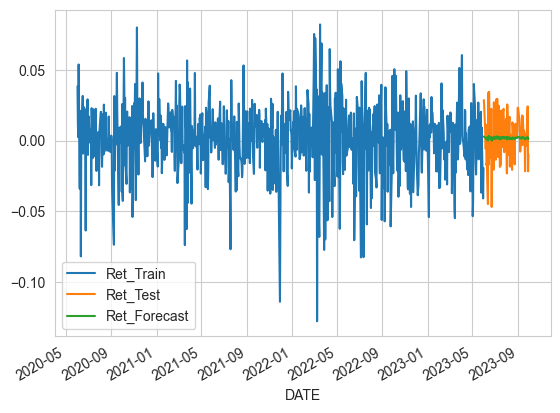

In [82]:
strat_wti.forecast_vs_test_mean_plot()

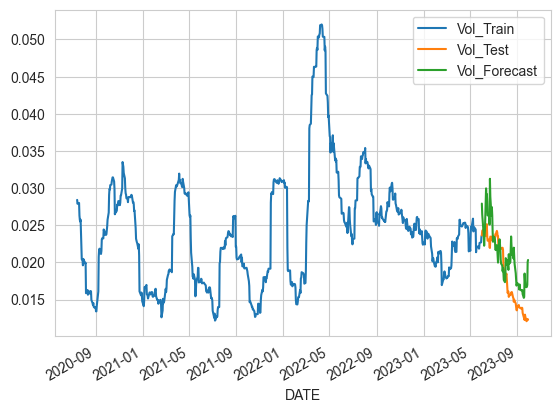

In [83]:
strat_wti.forecast_vs_test_vol_plot()

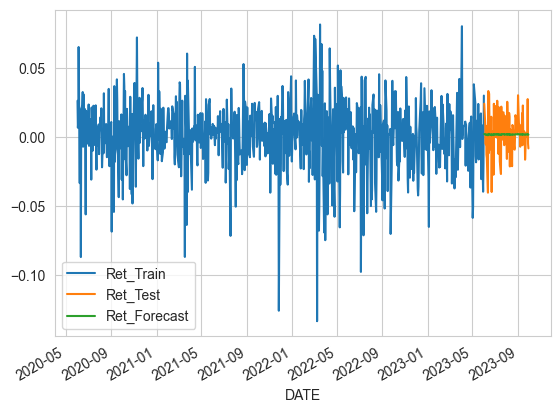

In [84]:
strat_brent.forecast_vs_test_mean_plot()

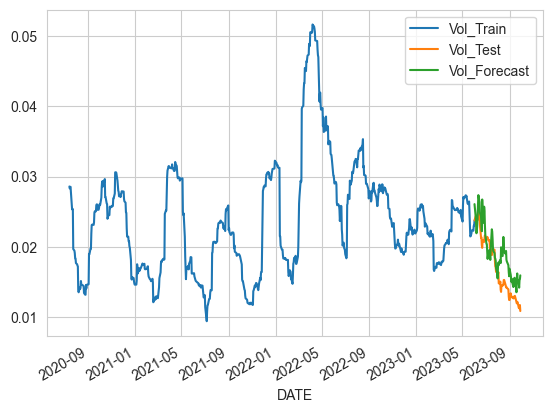

In [85]:
strat_brent.forecast_vs_test_vol_plot()

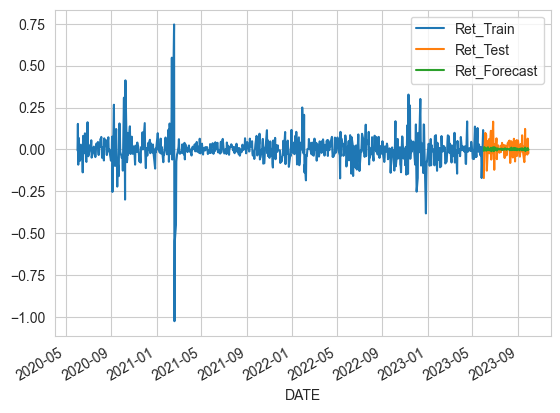

In [86]:
strat_hh.forecast_vs_test_mean_plot()

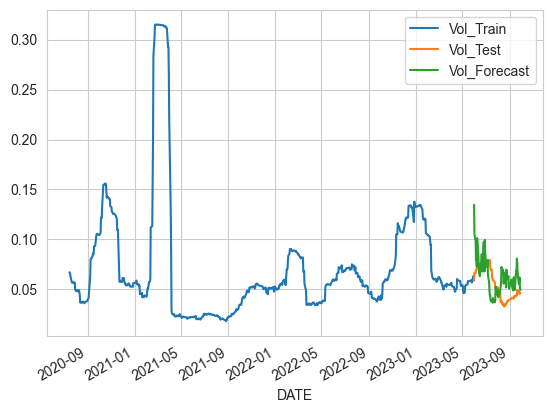

In [87]:
strat_hh.forecast_vs_test_vol_plot()

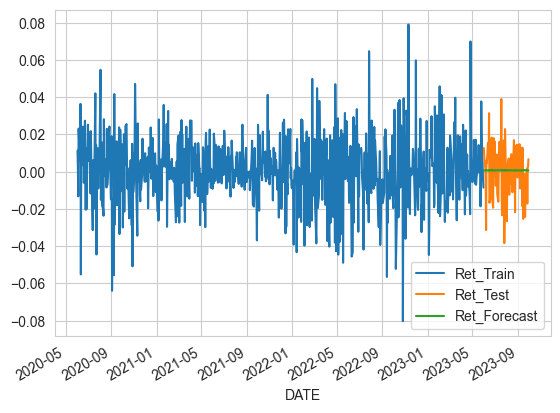

In [88]:
strat_msft.forecast_vs_test_mean_plot()

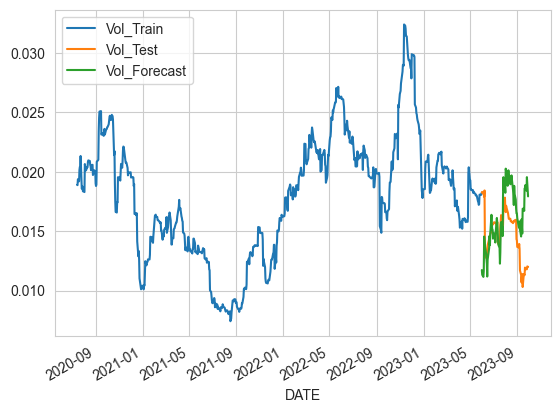

In [89]:
strat_msft.forecast_vs_test_vol_plot()

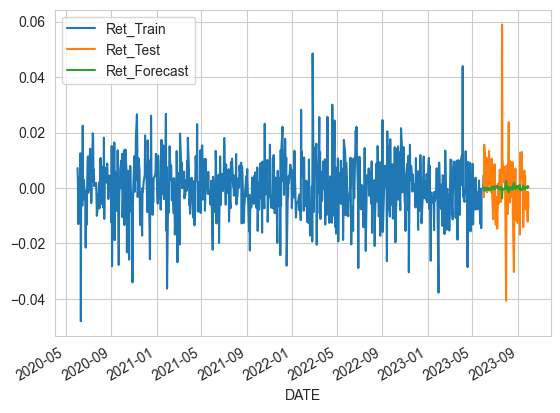

In [90]:
strat_jnj.forecast_vs_test_mean_plot()

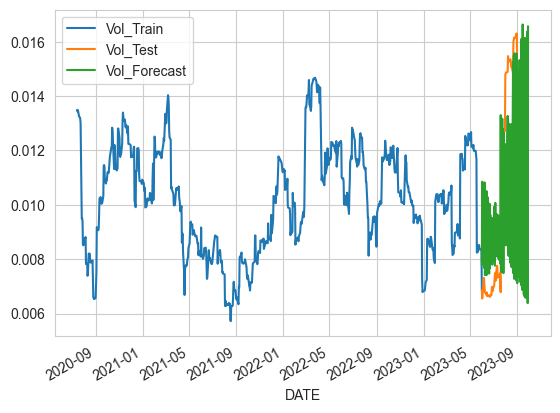

In [91]:
strat_jnj.forecast_vs_test_vol_plot()

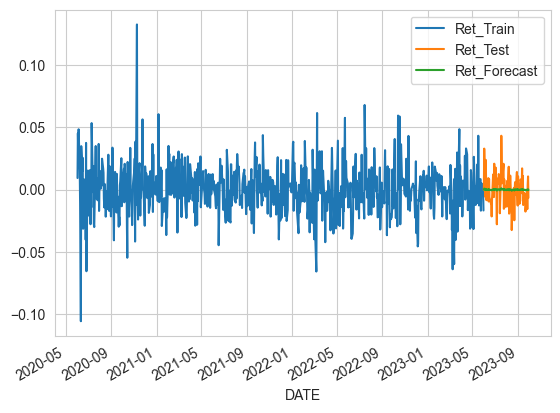

In [92]:
strat_bac.forecast_vs_test_mean_plot()

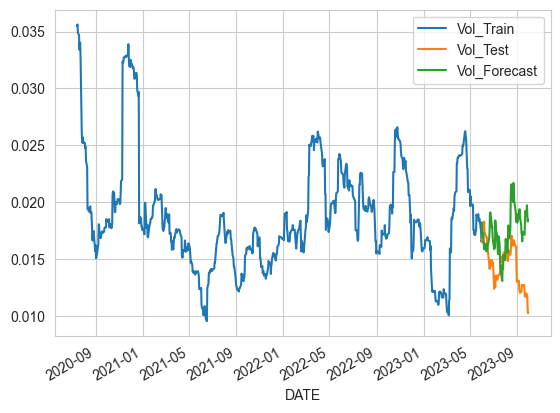

In [93]:
strat_bac.forecast_vs_test_vol_plot()

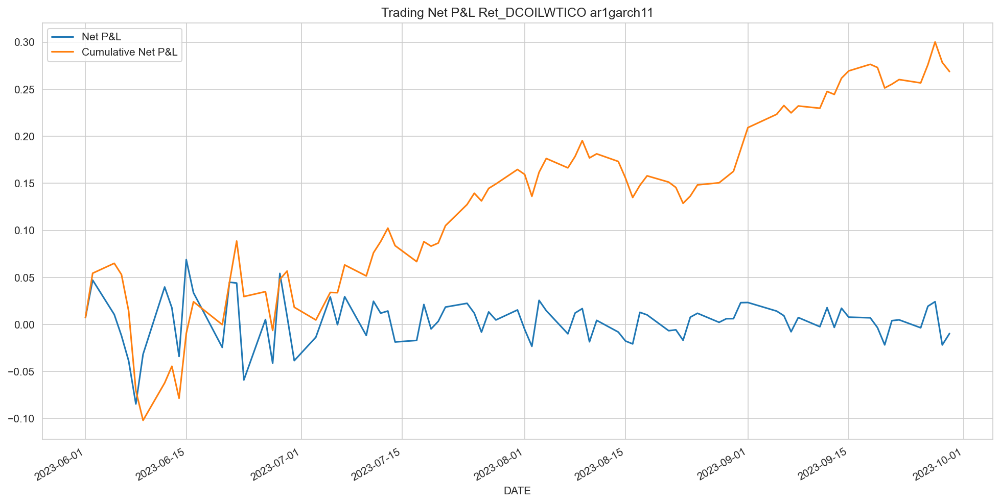

In [94]:
strat_wti.pnl_net()

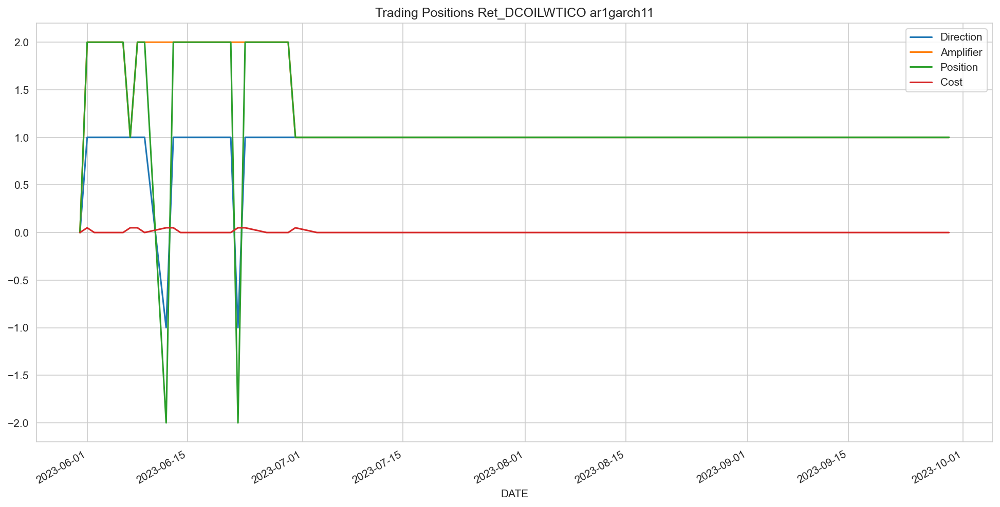

In [95]:
strat_wti.pos()

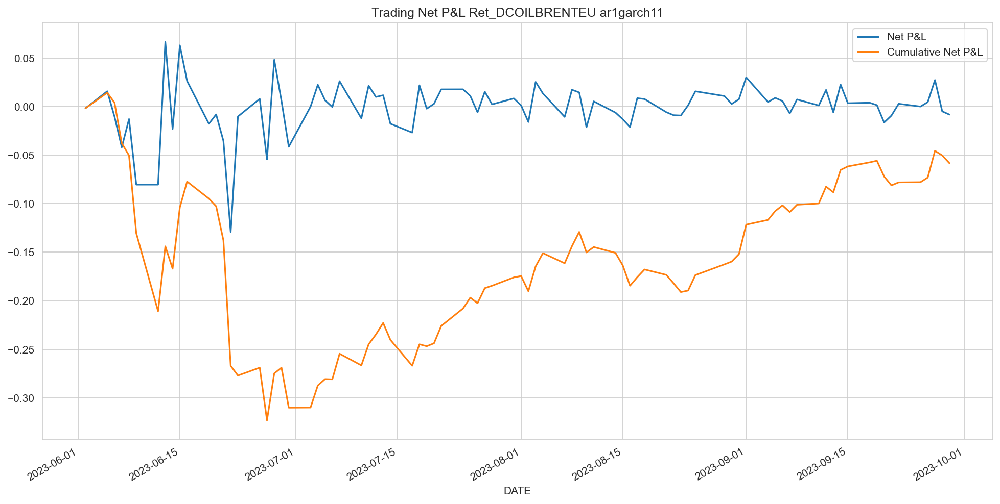

In [96]:
strat_brent.pnl_net()

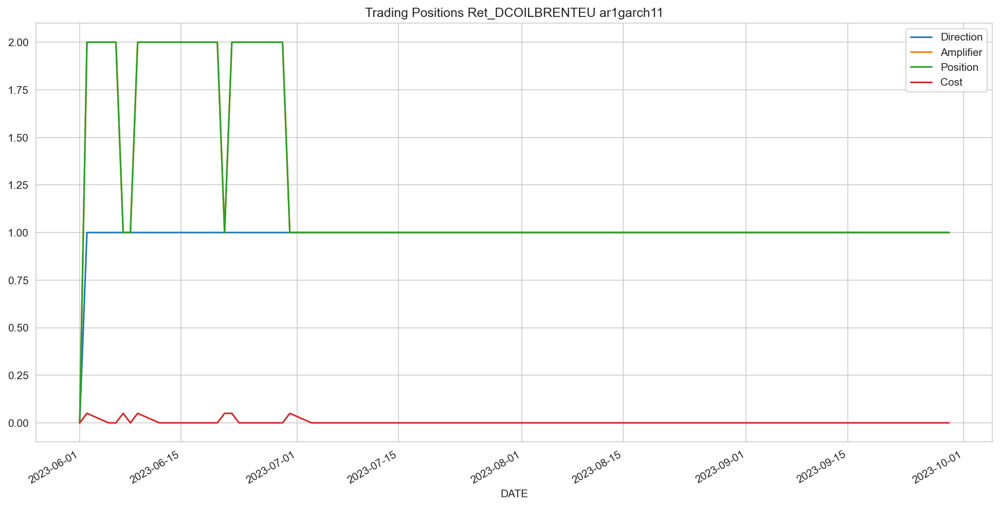

In [97]:
strat_brent.pos()

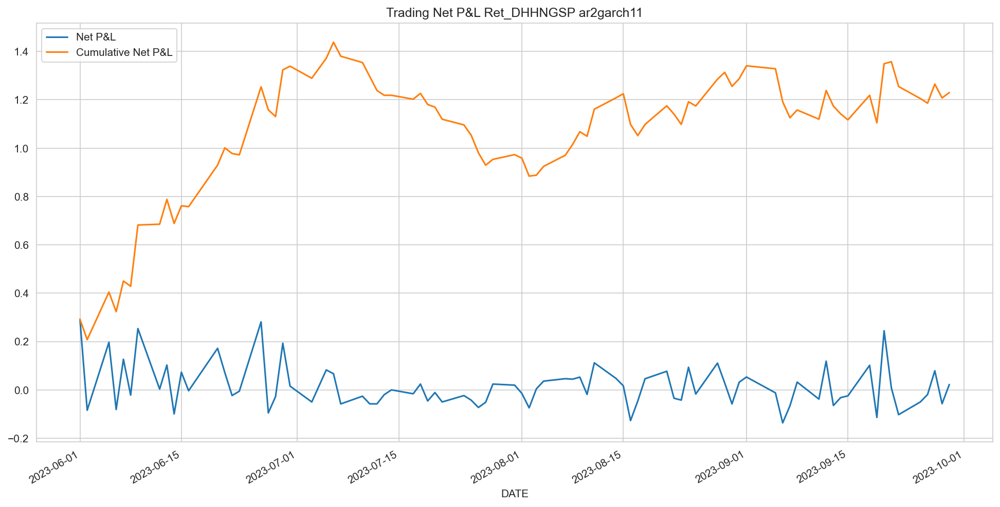

In [98]:
strat_hh.pnl_net()

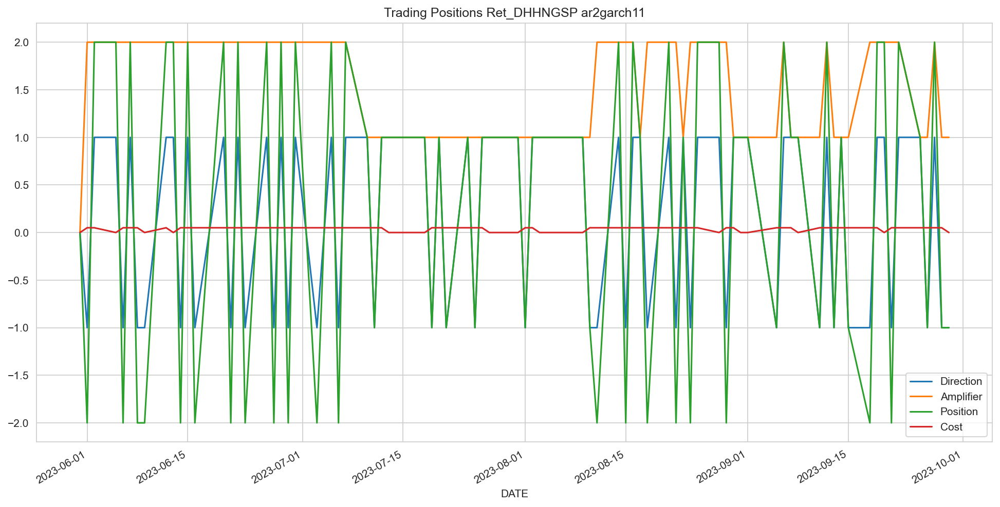

In [99]:
strat_hh.pos()

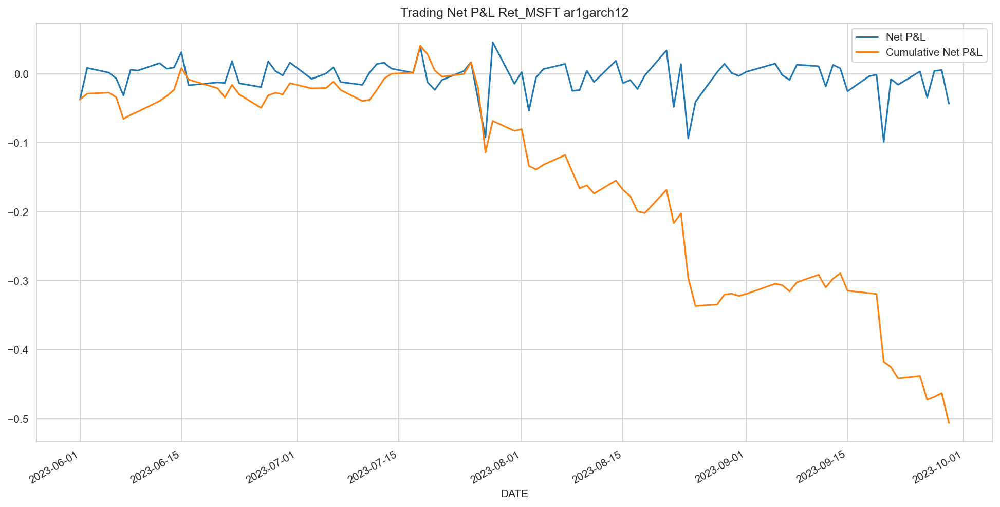

In [100]:
strat_msft.pnl_net()

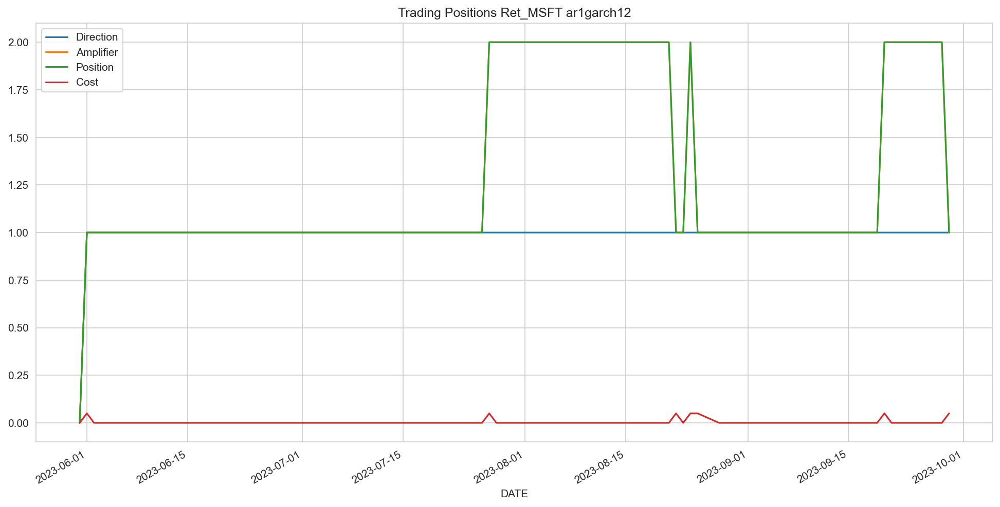

In [101]:
strat_msft.pos()

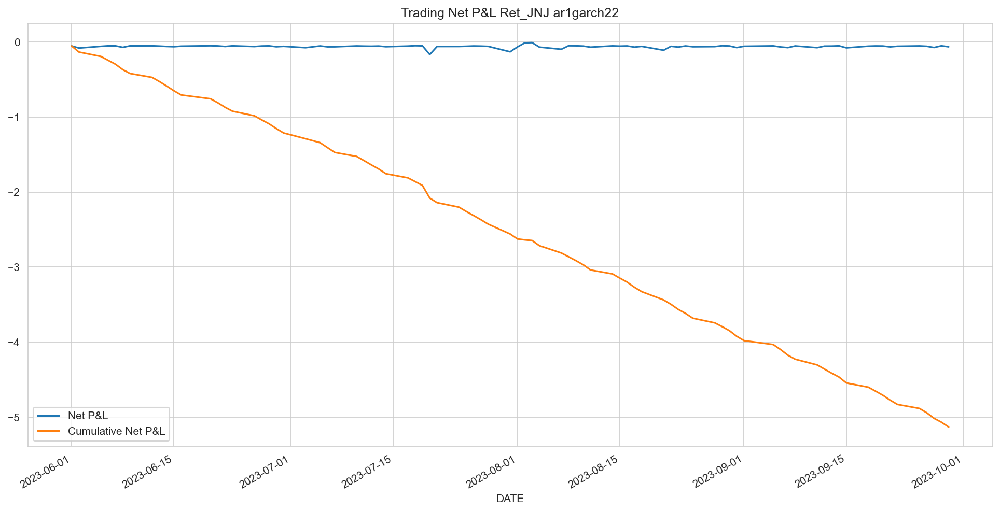

In [102]:
strat_jnj.pnl_net()

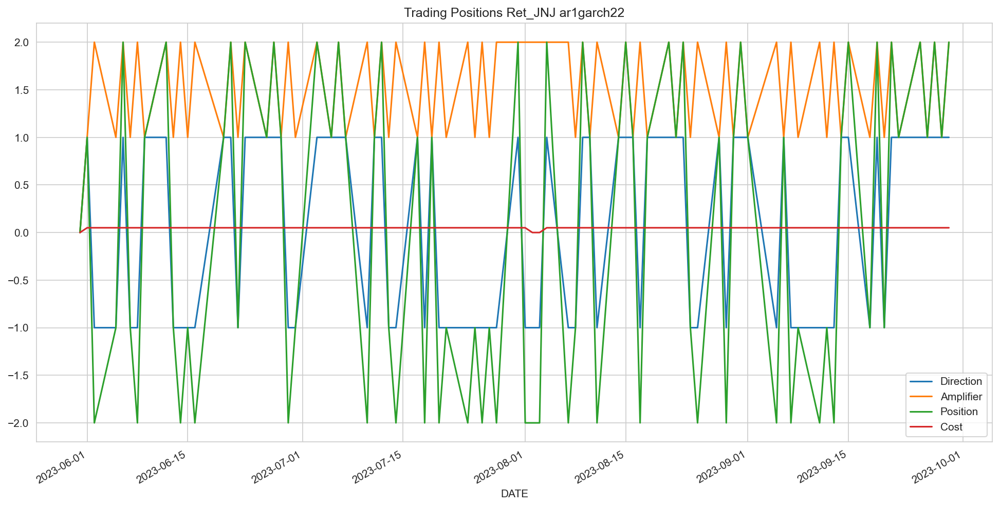

In [103]:
strat_jnj.pos()

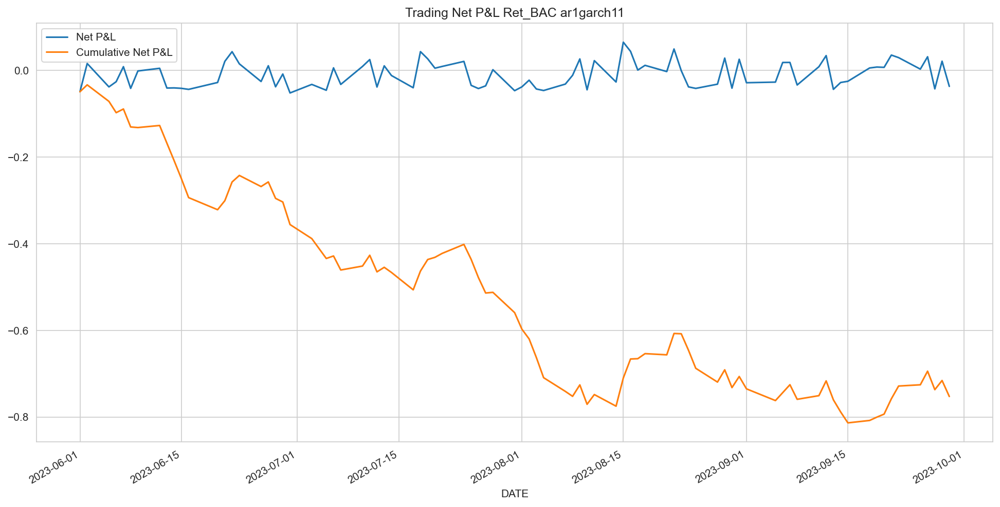

In [104]:
strat_bac.pnl_net()

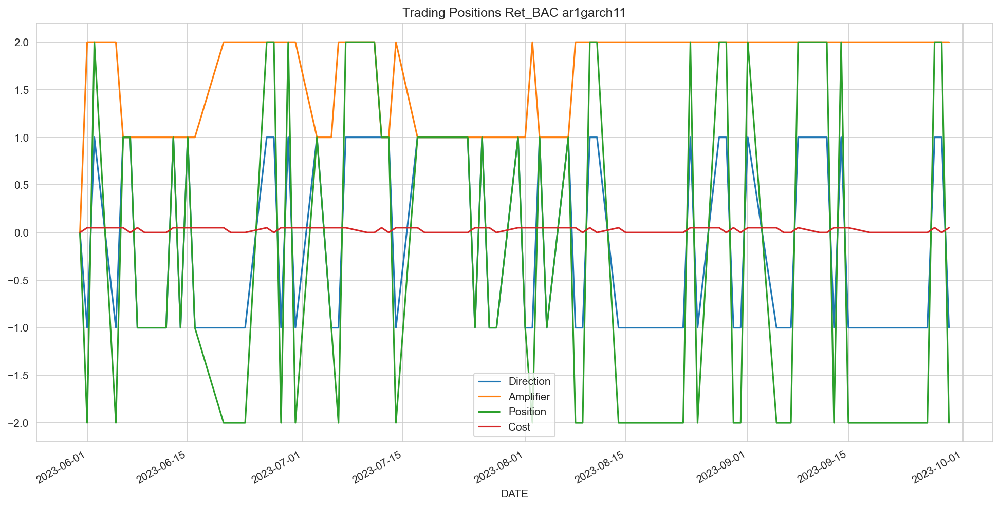

In [105]:
strat_bac.pos()

In [77]:
for (key, value) in strat.items():
    sr = value.sr()
    sr = sr.rename(columns = {'Value': key})
    if key == 'DCOILWTICO':
        sr_out = sr
    else:
        sr_out = sr_out.merge(sr, how = 'left', on = 'Metric')
sr_out = sr_out.set_index('Metric')
sr_out

,DCOILWTICO,DCOILBRENTEU,DHHNGSP,MSFT,JNJ,BAC
Metric,,,,,,
SR Gross,5.042088,1.997034,9.645751,-1.596609,-11.311114,19.381452
SR Net,2.115006,-0.402790,2.603281,-3.780825,-51.138896,-4.765344
